In [69]:
from __future__ import print_function, division
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error, mean_squared_error, adjusted_rand_score
from sklearn.model_selection import train_test_split, KFold, cross_val_predict
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from ipywidgets import FloatProgress
from IPython.display import display
%matplotlib inline

In [2]:
def fit_scatter(y_true, y_pred,filename=None,title=None):
    assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.scatter(y_true, y_pred, marker='o',color='b',label='RP genes')
    ax.plot(y_true, m*y_true + b,'--', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=18)
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        fig.savefig('images/{}.pdf'.format(filename))

In [3]:
def fit_scatter_nrp(y_true, y_pred,filename=None,title=None):
    assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    plt.style.use('ggplot')
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.scatter(y_true, y_pred, marker='o',color='r',label='nonRP genes')
    ax.plot(y_true, m*y_true + b,'--', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=18)
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        fig.savefig('images/{}.pdf'.format(filename))

In [4]:
def fit_scatter_multi(y_true1,y_true2, y_pred1, y_pred2,filename=None,title=None):
#     assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    plt.style.use('ggplot')
    ax.scatter(y_true1, y_pred1,color='blue',label='RP genes')
    ax.scatter(y_true2, y_pred2, color='red',label='nonRP genes')
    
    y_true = np.concatenate((y_true1,y_true2),axis=0)
    y_pred = np.concatenate((y_pred1,y_pred2),axis=0)
    
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.plot(y_true, m*y_true + b,linestyle='dashed', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=16,facecolor='white')
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        plt.savefig('images/{}.pdf'.format(filename))

In [5]:
def plot_importance(feature_importance,names,filename=None):
    plt.figure(figsize=(6, 8))
    plt.style.use('ggplot')
    # make importances relative to max importance
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    
    yy = pos[:10]
    ft = (feature_importance[sorted_idx])[:10]
    ft = 100.0 * (ft / ft.max())
    
    plt.barh(yy, ft, align='center',color='b')
    plt.yticks(yy, (names[sorted_idx])[:10])
    plt.xlabel('Relative Importance')
    plt.title('RF variable importance')
    plt.tight_layout()
    if filename is not None:
        plt.savefig('images/{}.pdf'.format(filename))
    plt.show()
    

In [6]:
# def plot_importance(feature_importance,names,filename=None):
#     plt.figure(figsize=(6, 8))
#     plt.style.use('ggplot')
#     # make importances relative to max importance
#     feature_importance = 100.0 * (feature_importance / feature_importance.max())
#     sorted_idx = np.argsort(feature_importance)
#     pos = np.arange(sorted_idx.shape[0]) + .5
#     plt.barh(pos, feature_importance[sorted_idx], align='center',color='b')
#     plt.yticks(pos, names[sorted_idx])
#     plt.xlabel('Relative Importance')
#     plt.title('RF variable importance')
#     plt.tight_layout()
#     if filename is not None:
#         plt.savefig('images/{}.pdf'.format(filename))
#     plt.show()

In [7]:
def plot_imp(feature_importance,names):
    print(names)
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    
    fig2, ax2 = plt.subplots(figsize=(10,15))
    ax2.barh(pos, feature_importance[sorted_idx], align='center')
    ax2.set_yticks(pos, names[sorted_idx])
    ax2.set_xlabel('RF feature importance')

In [8]:
def print_stats(true,predictions):
    print('Coefficient of determination R^2: {}'.format(r2_score(true, predictions)))
    print('Mean squared error:               {}'.format(mean_squared_error(true, predictions)))
    print('Mean absolute error:              {}'.format(mean_absolute_error(true, predictions)))
    print('Root mean squared error:          {}'.format(np.sqrt(mean_squared_error(true, predictions))))
    print('Correlation Coefficient:          {}'.format(np.corrcoef(true, predictions)[0][1]))

In [9]:
def get_best_settings(results_1,results_2):
    best_result_1 = results_1[0][0][0]
    best_result_2 = results_2[0][0][0]
    best_difference = results_2[0][0][0] - results_1[0][0][0]

    best_i_1=0
    best_j_1=0
    best_k_1=0

    best_i_2=0
    best_j_2=0
    best_k_2=0

    best_i_3=0
    best_j_3=0
    best_k_3=0
    

    mxf = [2,4,5,7,10,12,15,18,20,30]
    md = [5,7,10,12,15,18,20]
    n_est = [10,20,30,40,50,60,80,90,200,300,500]
    
    for i in range(len(mxf)):
        for j in range(len(md)):
            for k in range(len(n_est)):
                if best_result_1 < results_1[i][j][k]:
                    best_result_1 = results_1[i][j][k]
                    best_i_1=i
                    best_j_1=j
                    best_k_1=k
                if best_result_2 < results_2[i][j][k]:
                    best_result_2 = results_2[i][j][k]
                    best_i_2=i
                    best_j_2=j
                    best_k_2=k
                if best_difference < results_2[i][j][k] - results_1[i][j][k]:
                    best_difference = results_2[i][j][k] - results_1[i][j][k]
                    best_i_3=i
                    best_j_3=j
                    best_k_3=k

#     print('{} {} {} : {}'.format(best_i_1,best_j_1,best_k_1,best_result_1))
#     print('{} {} {} : {}'.format(best_i_2,best_j_2,best_k_2,best_result_2))
#     print('{} {} {} : {}'.format(best_i_3,best_j_3,best_k_3,best_difference))

    print('Normal best: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_result_1,mxf[best_i_1],md[best_j_1],n_est[best_k_1]))
    print('Extended best: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_result_2,mxf[best_i_2],md[best_j_2],n_est[best_k_2]))
    print('Best difference: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_difference,mxf[best_i_3],md[best_j_3],n_est[best_k_3]))
    
    return mxf[best_i_1],md[best_j_1],n_est[best_k_1],mxf[best_i_2],md[best_j_2],n_est[best_k_2]

In [10]:
data_path = os.path.join(os.getcwd(), 'datasets', 'features.csv')
data_path_rp = os.path.join(os.getcwd(), 'datasets', 'rp_features.csv')
data_path_nrp = os.path.join(os.getcwd(), 'datasets', 'nrp_features.csv')

data_path_extended = os.path.join(os.getcwd(), 'datasets', 'extended_features.csv')
data_path_rp_extended = os.path.join(os.getcwd(), 'datasets', 'rp_extended_features.csv')
data_path_nrp_extended = os.path.join(os.getcwd(), 'datasets', 'nrp_extended_features.csv')

data_path_cut = os.path.join(os.getcwd(), 'datasets', 'features_cut.csv')
data_path_extended_cut = os.path.join(os.getcwd(), 'datasets', 'extended_features_cut.csv')

data_path_rp_cut = os.path.join(os.getcwd(), 'datasets', 'rp_features_cut.csv')
data_path_nrp_cut = os.path.join(os.getcwd(), 'datasets', 'nrp_features_cut.csv')
data_path_rp_extended_cut = os.path.join(os.getcwd(), 'datasets', 'rp_extended_features_cut.csv')
data_path_nrp_extended_cut = os.path.join(os.getcwd(), 'datasets', 'nrp_extended_features_cut.csv')

gene_features = pd.read_csv(data_path, delimiter = ',')
rp_gene_features = pd.read_csv(data_path_rp, delimiter = ',')
nrp_gene_features = pd.read_csv(data_path_nrp, delimiter = ',')

extended_features = pd.read_csv(data_path_extended, delimiter = ',')
rp_extended_features = pd.read_csv(data_path_rp_extended, delimiter = ',')
nrp_extended_features = pd.read_csv(data_path_nrp_extended, delimiter = ',')

gene_features_cut = pd.read_csv(data_path_cut, delimiter = ',')
extended_features_cut = pd.read_csv(data_path_extended_cut, delimiter = ',')
rp_features_cut = pd.read_csv(data_path_rp_cut, delimiter = ',')
rp_extended_features_cut = pd.read_csv(data_path_rp_extended_cut, delimiter = ',')
nrp_features_cut = pd.read_csv(data_path_nrp_cut, delimiter = ',')
nrp_extended_features_cut = pd.read_csv(data_path_nrp_extended_cut, delimiter = ',')

print('Number of data points: {}. Number of attributes: {}'.format(gene_features.shape[0],gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(extended_features.shape[0],extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(rp_gene_features.shape[0],rp_gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(rp_extended_features.shape[0],rp_extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(nrp_gene_features.shape[0],nrp_gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(nrp_extended_features.shape[0],nrp_extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(gene_features_cut.shape[0],gene_features_cut.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(extended_features_cut.shape[0],extended_features_cut.shape[1]))

Number of data points: 117. Number of attributes: 101
Number of data points: 117. Number of attributes: 106
Number of data points: 84. Number of attributes: 101
Number of data points: 84. Number of attributes: 106
Number of data points: 33. Number of attributes: 101
Number of data points: 33. Number of attributes: 106
Number of data points: 117. Number of attributes: 21
Number of data points: 117. Number of attributes: 26


In [11]:
def get_data(dataset):
    
    X = gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_cut = gene_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y = gene_features['AUC']

    X_rp = rp_gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_rp_cut = rp_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_rp = rp_gene_features['AUC']

    X_nrp = nrp_gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_nrp_cut = nrp_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_nrp = nrp_gene_features['AUC']

    X_extended = extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_extended_cut = extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_extended = extended_features['AUC']

    X_rp_extended = rp_extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_rp_extended_cut = rp_extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_rp_extended = rp_extended_features['AUC']

    X_nrp_extended = nrp_extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_nrp_extended_cut = nrp_extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_nrp_extended = nrp_extended_features['AUC']
    
    if dataset == 'full':
        return X,y,X_extended,y_extended
    elif dataset == 'rp':
        return X_rp,y_rp,X_rp_extended,y_rp_extended
    elif dataset == 'nrp':
        return X_nrp,y_nrp,X_nrp_extended,y_nrp_extended
    elif dataset == 'cut':
        return X_cut,y,X_extended_cut,y_extended
    elif dataset == 'rp_cut':
        return X_rp_cut,y_rp,X_rp_extended_cut,y_rp_extended
    elif dataset == 'nrp_cut':
        return X_nrp_cut,y_nrp,X_nrp_extended_cut,y_nrp_extended
    else:
        return None, None, None, None

In [12]:
def get_variable_names(dataset):
    
    if dataset == 'full':
        return gene_features.drop(['ORG','Gene','AUC'], axis=1).columns, extended_features.drop(['ORG','Gene','AUC'], axis=1).columns
    elif dataset == 'cut':
        return gene_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns
    else:
        return None, None, None, None

In [13]:
kf = KFold(n_splits=5,shuffle=True,random_state=0)

In [14]:
X,y,X2,y2 = get_data('full')

lr1 = LinearRegression()
lr2 = LinearRegression()

predictions1 = cross_val_predict(lr1,X,y=y,cv=kf)
predictions2 = cross_val_predict(lr1,X2,y=y2,cv=kf)

print('Data')
print_stats(y,predictions1)
print('\n')
print('Extended Data')
print_stats(y2,predictions2)

Data
Coefficient of determination R^2: -7.218302015333855
Mean squared error:               0.428623354505183
Mean absolute error:              0.4702581683241454
Root mean squared error:          0.6546933285937646
Correlation Coefficient:          0.15630895126957536


Extended Data
Coefficient of determination R^2: -5.124905342449793
Mean squared error:               0.31944280813837916
Mean absolute error:              0.36293982808684455
Root mean squared error:          0.5651927176975825
Correlation Coefficient:          0.22134989868329735


In [30]:
X,y,X2,y2 = get_data('rp_full')

rfr1 = ExtraTreesRegressor(random_state=1337)
rfr2 = ExtraTreesRegressor(random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

print('Data')
print_stats(y,predictions_rfr1)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'foo')
plot_importance(rfr2.feature_importances_,names2,'foo')


Data
Coefficient of determination R^2: 0.14341293973709657
Mean squared error:               0.025373674642857145
Mean absolute error:              0.11562261904761906
Root mean squared error:          0.15929116310347272
Correlation Coefficient:          0.43478418511647643


Extended Data
Coefficient of determination R^2: 0.23026901848935022
Mean squared error:               0.02280083880952381
Mean absolute error:              0.10924285714285716
Root mean squared error:          0.15099946625575802
Correlation Coefficient:          0.49358104633453104


TypeError: plot_importance() missing 1 required positional argument: 'filename'

# Full Set

In [113]:
def best_RFs(results1,results2,dataset):
     
    X,y,X2,y2 = get_data(dataset)
    mxf1, md1, n_est1, mxf2, md2, n_est2 = get_best_settings(results1,results2)
    
    kf = KFold(n_splits=5,shuffle=True,random_state=0)
    
    rfr1 = ExtraTreesRegressor(n_estimators=n_est1, 
                                criterion='mse', 
                                max_features=mxf1, 
                                max_depth=md1, 
                                n_jobs=2,
                                random_state=1337)

    rfr2 = ExtraTreesRegressor(n_estimators=n_est2, 
                                criterion='mse', 
                                max_features=mxf2, 
                                max_depth=md2, 
                                n_jobs=2,
                                random_state=1337)

    predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
    predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

    print('Normal feature space')
    print_stats(y, predictions_rfr1)
    print('\n')
    print('Extended feature space')
    print_stats(y2, predictions_rfr2)
    print('-------------------------------------------------------\n')
         
    settings = 'max_features: {}; max_depth: {}; n_estimators: {};'.format(mxf1,md1,n_est1)
          
    rfr1.fit(X,y)
    fig, ax1 = plt.subplots(figsize=(20,6))
    xx = np.arange(len(rfr1.feature_importances_))
    ax1.bar(xx, rfr1.feature_importances_)
    ax1.set_xticks(xx)
    ax1.set_xticklabels(gene_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, rotation='vertical')
    ax1.set_title('Normal RF: {} -- {}'.format(settings,np.corrcoef(y, predictions_rfr1)[0][1]))

    settings = 'max_features: {}; max_depth: {}; n_estimators: {};'.format(mxf2,md2,n_est2)
    rfr2.fit(X2,y2)
    fig2, ax2 = plt.subplots(figsize=(20,6))
    xx = np.arange(len(rfr2.feature_importances_))
    ax2.bar(xx, rfr2.feature_importances_)
    ax2.set_xticks(xx)
    ax2.set_xticklabels(extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, rotation='vertical')
    ax2.set_title('Extended RF : {} -- {}'.format(settings,np.corrcoef(y2, predictions_rfr2)[0][1]))

In [21]:
X,y,X2,y2 = get_data('full')
print('echo')
mxf = [2,4,5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,200,300,500]

results_1_full = np.zeros((len(mxf),len(md),len(n_est)))
results_2_full = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_full[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_full[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

echo


FloatProgress(value=0.0, max=1008.0)

max_features: 5; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.3852018216398875
Mean squared error:               0.03206463537853839
Mean absolute error:              0.13508527782261703
Root mean squared error:          0.1790660084397326
Correlation Coefficient:          0.6262334345069076


Extended feature space
Coefficient of determination R^2: 0.3957114993898655
Mean squared error:               0.031516505932387695
Mean absolute error:              0.1347955201383559
Root mean squared error:          0.1775288875997022
Correlation Coefficient:          0.6403725635378434
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.4053565154042843
Mean squared error:               0.031013472688946053
Mean absolute error:              0.13336332459706582
Root mean squared error:          0.17610642432616153
Correlation Coefficient:  

KeyboardInterrupt: 

In [114]:
get_best_settings(results_1_full,results_2_full)

NameError: name 'results_1_full' is not defined

Normal best: 0.6606799891294596 | max_features: 50; max_depth: 12; n_estimators: 20;

Extended best: 0.643178381615747 | max_features: 20; max_depth: 7; n_estimators: 100;

Best difference: 0.0855855290853309 | max_features: 12; max_depth: 12; n_estimators: 10;

Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;
Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;
Best difference: 0.08235234031060501 | max_features: 12; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.46275664633060276
Mean squared error:               0.02801978413615613
Mean absolute error:              0.1249529426526229
Root mean squared error:          0.16739111128180054
Correlation Coefficient:          0.6839871870653883


Extended feature space
Coefficient of determination R^2: 0.46177284867054846
Mean squared error:               0.028071093841302037
Mean absolute error:              0.12581442108330093
Root mean squared error:          0.1675443041147685
Correlation Coefficient:          0.6955381114792492
-------------------------------------------------------



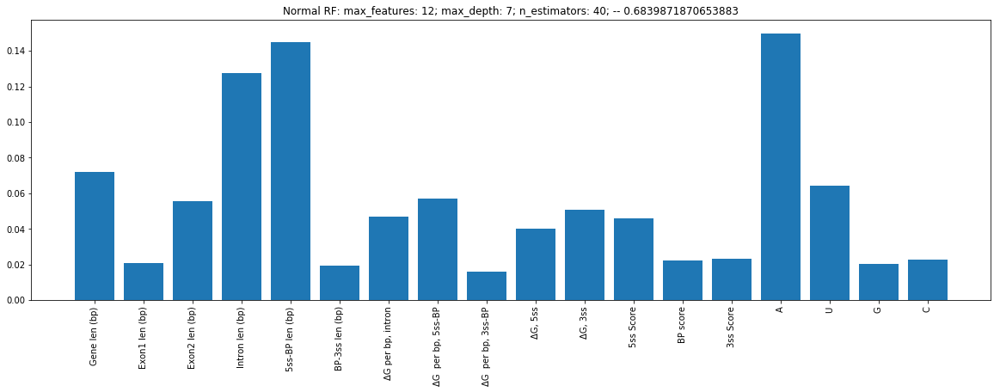

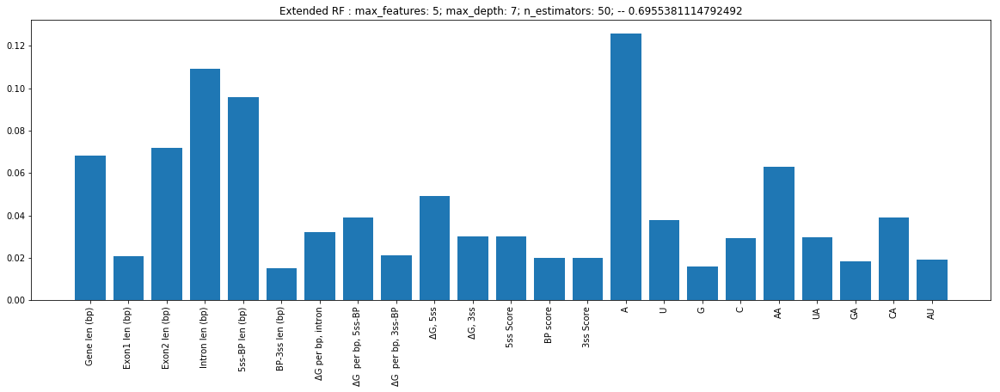

In [15]:
best_RFs(results_1_full,results_2_full,'full')

Data
Coefficient of determination R^2: 0.4088825365042926
Mean squared error:               0.03082957399684131
Mean absolute error:              0.13158937717690875
Root mean squared error:          0.1755835242750336
Correlation Coefficient:          0.656753357271128


Extended Data
Coefficient of determination R^2: 0.41094146679533605
Mean squared error:               0.030722191035447002
Mean absolute error:              0.13179640788224123
Root mean squared error:          0.17527746870447156
Correlation Coefficient:          0.6469918336286259


ValueError: shape mismatch: objects cannot be broadcast to a single shape

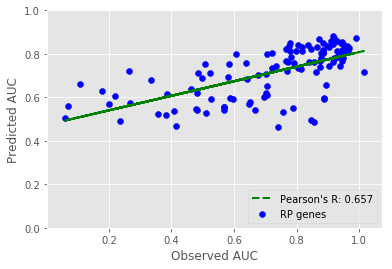

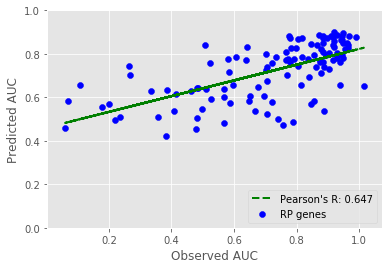

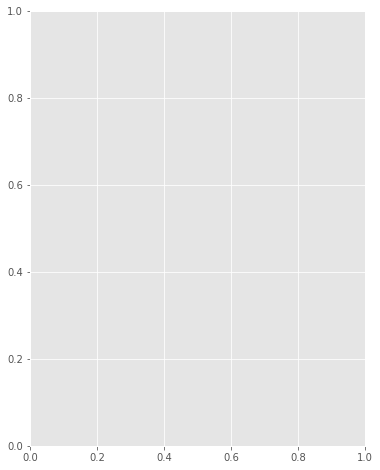

In [25]:
#BEST FULL

# Normal best: 0.656753357271128 | max_features: 12; max_depth: 12; n_estimators: 40;
# Extended best: 0.6469918336286258 | max_features: 20; max_depth: 18; n_estimators: 20;

# Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;
# Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;

X,y,X2,y2 = get_data('full')

rfr1 = ExtraTreesRegressor(n_estimators=40, 
                            criterion='mse', 
                            max_features=12, 
                            max_depth=12, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=20, 
                            criterion='mse', 
                            max_features=20, 
                            max_depth=18, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter(y,predictions_rfr1)
fit_scatter(y,predictions_rfr2)
print('Data')
print_stats(y,predictions_rfr1)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'full')
plot_importance(rfr2.feature_importances_,names2,'full_ext')


## MSE Results

Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;

Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;

Best difference: 0.08235234031060501 | max_features: 12; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.46275664633060276
Mean squared error:               0.02801978413615613
Mean absolute error:              0.1249529426526229
Root mean squared error:          0.16739111128180054
Correlation Coefficient:          0.6839871870653883


Extended feature space
Coefficient of determination R^2: 0.46177284867054846
Mean squared error:               0.028071093841302037
Mean absolute error:              0.12581442108330093
Root mean squared error:          0.1675443041147685
Correlation Coefficient:          0.6955381114792492


# RP Genes

In [110]:
X,y,X2,y2 = get_data('rp')

mxf = [5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,100,120,140,160,200,300,500]

results_1_rp = np.zeros((len(mxf),len(md),len(n_est)))
results_2_rp = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_rp[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_rp[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

FloatProgress(value=0.0, max=840.0)

max_features: 5; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.10027375795449511
Mean squared error:               0.02665153606954604
Mean absolute error:              0.11646231505372562
Root mean squared error:          0.1632529818090501
Correlation Coefficient:          0.3191415954848009


Extended feature space
Coefficient of determination R^2: 0.25272289873455667
Mean squared error:               0.02213571382895653
Mean absolute error:              0.11075498383257029
Root mean squared error:          0.1487807575896713
Correlation Coefficient:          0.5441958462229599
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.1323152260784799
Mean squared error:               0.02570240920903995
Mean absolute error:              0.11636439120923002
Root mean squared error:          0.16031970935926734
Correlation Coefficient: 

max_features: 5; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.2344439403570795
Mean squared error:               0.022677169991670548
Mean absolute error:              0.10860578134315406
Root mean squared error:          0.1505894086304563
Correlation Coefficient:          0.6140754870714972


Extended feature space
Coefficient of determination R^2: 0.24054263818715882
Mean squared error:               0.02249651541297771
Mean absolute error:              0.10903495224512079
Root mean squared error:          0.14998838426017433
Correlation Coefficient:          0.596262237520812
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.2311320482869288
Mean squared error:               0.02277527428922376
Mean absolute error:              0.10876316098454761
Root mean squared error:          0.15091479148587048
Correlation Coefficient

max_features: 5; max_depth: 7; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.25257613982939797
Mean squared error:               0.022140061096015753
Mean absolute error:              0.10517235403631005
Root mean squared error:          0.14879536651393332
Correlation Coefficient:          0.5973363787414739


Extended feature space
Coefficient of determination R^2: 0.22978152730373091
Mean squared error:               0.022815279189619404
Mean absolute error:              0.10981355559881785
Root mean squared error:          0.15104727468451526
Correlation Coefficient:          0.5358500965033731
-------------------------------------------------------

max_features: 5; max_depth: 7; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.2541292094647175
Mean squared error:               0.022094056334267188
Mean absolute error:              0.10561860778102092
Root mean squared error:          0.14864069541773273
Correlation Coeffi

max_features: 5; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3001085825983102
Mean squared error:               0.02073206324763775
Mean absolute error:              0.09882884809130099
Root mean squared error:          0.14398633007212092
Correlation Coefficient:          0.6352357358021878


Extended feature space
Coefficient of determination R^2: 0.27139761395966744
Mean squared error:               0.021582534624936638
Mean absolute error:              0.10633607451186011
Root mean squared error:          0.14690995413836544
Correlation Coefficient:          0.5899171553912698
-------------------------------------------------------

max_features: 5; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.303894858113391
Mean squared error:               0.020619906845230282
Mean absolute error:              0.09894744617991598
Root mean squared error:          0.14359633297974667
Correlation Coefficie

max_features: 5; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.24187792875976277
Mean squared error:               0.022456961665186414
Mean absolute error:              0.10341243194801232
Root mean squared error:          0.14985647021462375
Correlation Coefficient:          0.5457397847486823


Extended feature space
Coefficient of determination R^2: 0.25621422053376175
Mean squared error:               0.02203229449481511
Mean absolute error:              0.10878133239941279
Root mean squared error:          0.14843279453953265
Correlation Coefficient:          0.5409149873584005
-------------------------------------------------------

max_features: 5; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.26008730019627824
Mean squared error:               0.02191756679487484
Mean absolute error:              0.10176113216941787
Root mean squared error:          0.14804582667159125
Correlation Coeffic

max_features: 5; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.18320496984747392
Mean squared error:               0.02419496196759259
Mean absolute error:              0.10589424603174603
Root mean squared error:          0.15554729816873256
Correlation Coefficient:          0.4286653415730119


Extended feature space
Coefficient of determination R^2: 0.22130783005656707
Mean squared error:               0.023066285592757946
Mean absolute error:              0.10879117063492066
Root mean squared error:          0.1518758887801416
Correlation Coefficient:          0.47080690172740886
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.21272594687549007
Mean squared error:               0.023320496661032572
Mean absolute error:              0.10518794642857136
Root mean squared error:          0.15271049951143692
Correlation Coeffi

max_features: 5; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3181523001707047
Mean squared error:               0.020197575347611543
Mean absolute error:              0.09847157575757581
Root mean squared error:          0.14211817388220108
Correlation Coefficient:          0.6683975241753138


Extended feature space
Coefficient of determination R^2: 0.2847793146434129
Mean squared error:               0.02118614418773666
Mean absolute error:              0.10505056361016625
Root mean squared error:          0.14555460895394778
Correlation Coefficient:          0.6126744555531586
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.294512496968937
Mean squared error:               0.02089782953412555
Mean absolute error:              0.10046047029249411
Root mean squared error:          0.14456081603991294
Correlation Coefficie

max_features: 5; max_depth: 18; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.30115221760881394
Mean squared error:               0.020701148870768356
Mean absolute error:              0.10007640707671962
Root mean squared error:          0.14387893824590295
Correlation Coefficient:          0.6534040653324377


Extended feature space
Coefficient of determination R^2: 0.2731106057673274
Mean squared error:               0.021531792676091295
Mean absolute error:              0.10689573412698421
Root mean squared error:          0.14673715506336932
Correlation Coefficient:          0.5858766826776752
-------------------------------------------------------

max_features: 5; max_depth: 18; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.30979943887447614
Mean squared error:               0.020445002368984437
Mean absolute error:              0.09906138888888891
Root mean squared error:          0.14298602158597334
Correlation Coef

max_features: 5; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2878933443632501
Mean squared error:               0.021093900934709833
Mean absolute error:              0.10083497023809519
Root mean squared error:          0.14523739509750866
Correlation Coefficient:          0.6306669132614173


Extended feature space
Coefficient of determination R^2: 0.29008399881407976
Mean squared error:               0.021029009745163706
Mean absolute error:              0.10590758928571427
Root mean squared error:          0.14501382604829
Correlation Coefficient:          0.603160111499477
-------------------------------------------------------

max_features: 5; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.289732447249207
Mean squared error:               0.021039423345182988
Mean absolute error:              0.10047245370370372
Root mean squared error:          0.14504972714618594
Correlation Coefficient:

max_features: 7; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.16968734509157501
Mean squared error:               0.02459537872429113
Mean absolute error:              0.11069479996239494
Root mean squared error:          0.15682913863275258
Correlation Coefficient:          0.44681571555251026


Extended feature space
Coefficient of determination R^2: 0.16322200224453154
Mean squared error:               0.024786893998646378
Mean absolute error:              0.11541623836123113
Root mean squared error:          0.15743854038527663
Correlation Coefficient:          0.43476527648494095
-------------------------------------------------------

max_features: 7; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.1862528919169092
Mean squared error:               0.02410467694402137
Mean absolute error:              0.10962814166893728
Root mean squared error:          0.15525680965426725
Correlation Coeffici

max_features: 7; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.14739228729867304
Mean squared error:               0.025255799093479483
Mean absolute error:              0.1115917257827886
Root mean squared error:          0.15892073210717186
Correlation Coefficient:          0.38421082298010106


Extended feature space
Coefficient of determination R^2: 0.04468718448025999
Mean squared error:               0.02829811199308804
Mean absolute error:              0.11669161377270047
Root mean squared error:          0.16822042680093294
Correlation Coefficient:          0.24756469354578373
-------------------------------------------------------

max_features: 7; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.17119782334739764
Mean squared error:               0.02455063559706412
Mean absolute error:              0.10929520428477431
Root mean squared error:          0.1566864244185313
Correlation Coefficie

max_features: 7; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.2711915975372826
Mean squared error:               0.021588637207984148
Mean absolute error:              0.10326017560311958
Root mean squared error:          0.14693072247826236
Correlation Coefficient:          0.5877086068127415


Extended feature space
Coefficient of determination R^2: 0.2917818519572515
Mean squared error:               0.02097871623123534
Mean absolute error:              0.10216103368127435
Root mean squared error:          0.14484031286639554
Correlation Coefficient:          0.6077373371269371
-------------------------------------------------------

max_features: 7; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.27692822089757285
Mean squared error:               0.021418707936991025
Mean absolute error:              0.10271738730718859
Root mean squared error:          0.14635131682697983
Correlation Coeffici

max_features: 7; max_depth: 10; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2891917780001316
Mean squared error:               0.021055438956732415
Mean absolute error:              0.10280022767232139
Root mean squared error:          0.14510492395757082
Correlation Coefficient:          0.5907547793595282


Extended feature space
Coefficient of determination R^2: 0.31384091158598604
Mean squared error:               0.02032528655909541
Mean absolute error:              0.10117175648802028
Root mean squared error:          0.1425667792969155
Correlation Coefficient:          0.6427570222564701
-------------------------------------------------------

max_features: 7; max_depth: 10; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.29163313180881845
Mean squared error:               0.02098312159390568
Mean absolute error:              0.10240429608576565
Root mean squared error:          0.14485551972191352
Correlation Coeffic

max_features: 7; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.27565191151616364
Mean squared error:               0.021456514554076232
Mean absolute error:              0.10292912782591908
Root mean squared error:          0.1464804237912911
Correlation Coefficient:          0.5709264682862355


Extended feature space
Coefficient of determination R^2: 0.2898077294089999
Mean squared error:               0.02103719334998739
Mean absolute error:              0.10351796898785734
Root mean squared error:          0.14504203994010628
Correlation Coefficient:          0.6019405648427527
-------------------------------------------------------

max_features: 7; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.2764962271992827
Mean squared error:               0.021431504380057552
Mean absolute error:              0.10398711794249986
Root mean squared error:          0.14639502853600445
Correlation Coefficie

max_features: 7; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.21879664585847736
Mean squared error:               0.023140671459375
Mean absolute error:              0.10537888888888892
Root mean squared error:          0.15212058197158923
Correlation Coefficient:          0.4957379496468227


Extended feature space
Coefficient of determination R^2: 0.2537007705744956
Mean squared error:               0.022106747477420228
Mean absolute error:              0.10575632440476193
Root mean squared error:          0.14868337996366718
Correlation Coefficient:          0.5368923511164142
-------------------------------------------------------

max_features: 7; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.24053032923910211
Mean squared error:               0.022496880026521008
Mean absolute error:              0.10424093310657596
Root mean squared error:          0.14998959972785117
Correlation Coefficie

max_features: 7; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.12578660024956168
Mean squared error:               0.02589579904100529
Mean absolute error:              0.1141793650793651
Root mean squared error:          0.16092171712048467
Correlation Coefficient:          0.35564428373249446


Extended feature space
Coefficient of determination R^2: 0.08201382814033875
Mean squared error:               0.02719242857142858
Mean absolute error:              0.11617857142857144
Root mean squared error:          0.16490126916257672
Correlation Coefficient:          0.2953611581139567
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.18328733031663036
Mean squared error:               0.02419252229993386
Mean absolute error:              0.1107998015873016
Root mean squared error:          0.15553945576584052
Correlation Coefficie

max_features: 7; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.29065007350798344
Mean squared error:               0.021012241577895035
Mean absolute error:              0.10246477777777784
Root mean squared error:          0.14495599876478046
Correlation Coefficient:          0.5980807496454161


Extended feature space
Coefficient of determination R^2: 0.2964341003726878
Mean squared error:               0.020840908128443313
Mean absolute error:              0.10207170634920647
Root mean squared error:          0.14436380477267602
Correlation Coefficient:          0.6051409928100913
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.2946553372739057
Mean squared error:               0.020893598343167508
Mean absolute error:              0.10208449470899479
Root mean squared error:          0.14454618065921876
Correlation Coeff

max_features: 7; max_depth: 20; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2708708361208375
Mean squared error:               0.02159813874751985
Mean absolute error:              0.10386378968253972
Root mean squared error:          0.14696305232105059
Correlation Coefficient:          0.5665440107773967


Extended feature space
Coefficient of determination R^2: 0.2857499860659254
Mean squared error:               0.021157391125727537
Mean absolute error:              0.10358773809523819
Root mean squared error:          0.14545580471651015
Correlation Coefficient:          0.6003557781564325
-------------------------------------------------------

max_features: 7; max_depth: 20; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.27986178062323774
Mean squared error:               0.021331810535106896
Mean absolute error:              0.10362644557823134
Root mean squared error:          0.1460541356316448
Correlation Coeffic

max_features: 10; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2701226809264503
Mean squared error:               0.02162030047207231
Mean absolute error:              0.10491894817728899
Root mean squared error:          0.14703843195597643
Correlation Coefficient:          0.5785853499454342


Extended feature space
Coefficient of determination R^2: 0.2657827083356207
Mean squared error:               0.021748858394071306
Mean absolute error:              0.10524131260519683
Root mean squared error:          0.14747494158015897
Correlation Coefficient:          0.5778973940033671
-------------------------------------------------------

max_features: 10; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.278344938462758
Mean squared error:               0.021376742172823638
Mean absolute error:              0.10466595075928055
Root mean squared error:          0.14620787315607747
Correlation Coefficien

max_features: 10; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.2685886966109756
Mean squared error:               0.021665739891757397
Mean absolute error:              0.10374922873245362
Root mean squared error:          0.1471928663072956
Correlation Coefficient:          0.5461750167450975


Extended feature space
Coefficient of determination R^2: 0.24607253789484962
Mean squared error:               0.022332709674483937
Mean absolute error:              0.1069538898801665
Root mean squared error:          0.1494413251898013
Correlation Coefficient:          0.5435615182094341
-------------------------------------------------------

max_features: 10; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.2505935191553139
Mean squared error:               0.022198789944790298
Mean absolute error:              0.10533886533933363
Root mean squared error:          0.14899258352277236
Correlation Coefficien

max_features: 10; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.20618462627892364
Mean squared error:               0.023514262535222822
Mean absolute error:              0.11353332891645393
Root mean squared error:          0.15334360937196836
Correlation Coefficient:          0.4549213513962369


Extended feature space
Coefficient of determination R^2: 0.15876948371123878
Mean squared error:               0.024918785737205195
Mean absolute error:              0.11730012886506071
Root mean squared error:          0.1578568520438856
Correlation Coefficient:          0.399475434047992
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.29054854208903924
Mean squared error:               0.02101524912413269
Mean absolute error:              0.10552037249952428
Root mean squared error:          0.14496637239074686
Correlation Coeffi

max_features: 10; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3225432911909002
Mean squared error:               0.02006750616646847
Mean absolute error:              0.10069447106950337
Root mean squared error:          0.141659825520394
Correlation Coefficient:          0.6307428641351557


Extended feature space
Coefficient of determination R^2: 0.294154926312604
Mean squared error:               0.02090842143063732
Mean absolute error:              0.1016504149123266
Root mean squared error:          0.14459744614147693
Correlation Coefficient:          0.5834497292879754
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33121299830389317
Mean squared error:               0.019810693592780475
Mean absolute error:              0.09982484377637466
Root mean squared error:          0.14075046569294353
Correlation Coefficie

max_features: 10; max_depth: 12; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.342785039386324
Mean squared error:               0.019467908581191278
Mean absolute error:              0.09951823239466946
Root mean squared error:          0.1395274474115802
Correlation Coefficient:          0.6501097138884263


Extended feature space
Coefficient of determination R^2: 0.31338215494777677
Mean squared error:               0.020338875769367392
Mean absolute error:              0.101107253143285
Root mean squared error:          0.14261443043874414
Correlation Coefficient:          0.6143547554201952
-------------------------------------------------------

max_features: 10; max_depth: 12; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3437310397646878
Mean squared error:               0.01943988632061072
Mean absolute error:              0.09926985334688233
Root mean squared error:          0.139426992797703
Correlation Coefficien

max_features: 10; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.30344027335412094
Mean squared error:               0.020633372476821517
Mean absolute error:              0.10410565972222226
Root mean squared error:          0.1436432124286474
Correlation Coefficient:          0.5962496147710054


Extended feature space
Coefficient of determination R^2: 0.2804655966792944
Mean squared error:               0.021313924399696666
Mean absolute error:              0.10351911684545606
Root mean squared error:          0.1459928916067377
Correlation Coefficient:          0.575242827415624
-------------------------------------------------------

max_features: 10; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3157448006607996
Mean squared error:               0.020268889884219675
Mean absolute error:              0.10375650058788946
Root mean squared error:          0.1423688515238487
Correlation Coefficie

max_features: 10; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.27770640111369804
Mean squared error:               0.02139565681640626
Mean absolute error:              0.10773764880952387
Root mean squared error:          0.1462725429340936
Correlation Coefficient:          0.5504136135059104


Extended feature space
Coefficient of determination R^2: 0.2658863437135939
Mean squared error:               0.021745788524720987
Mean absolute error:              0.10852563988095243
Root mean squared error:          0.14746453310786628
Correlation Coefficient:          0.554861558108837
-------------------------------------------------------

max_features: 10; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.26820234543276733
Mean squared error:               0.021677184319940486
Mean absolute error:              0.1074504166666667
Root mean squared error:          0.14723173679591126
Correlation Coeffici

max_features: 10; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.16733223773554895
Mean squared error:               0.024665141309523814
Mean absolute error:              0.1181035714285714
Root mean squared error:          0.15705139703142987
Correlation Coefficient:          0.4170734658044551


Extended feature space
Coefficient of determination R^2: 0.1596131952238501
Mean squared error:               0.024893793459821435
Mean absolute error:              0.11969315476190479
Root mean squared error:          0.15777767097983617
Correlation Coefficient:          0.40965171937190126
-------------------------------------------------------

max_features: 10; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.2116642537465825
Mean squared error:               0.02335194595238095
Mean absolute error:              0.11446666666666666
Root mean squared error:          0.1528134351174037
Correlation Coeffic

max_features: 10; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.32711473107787825
Mean squared error:               0.019932091760014606
Mean absolute error:              0.10066076388888894
Root mean squared error:          0.14118106020289906
Correlation Coefficient:          0.6340338619684363


Extended feature space
Coefficient of determination R^2: 0.3019817513948827
Mean squared error:               0.020676576563562934
Mean absolute error:              0.10053592757936518
Root mean squared error:          0.14379352058963898
Correlation Coefficient:          0.6025439875894562
-------------------------------------------------------

max_features: 10; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33246593052312234
Mean squared error:               0.01977357944997459
Mean absolute error:              0.0999637103174604
Root mean squared error:          0.14061856011912008
Correlation Coef

max_features: 12; max_depth: 5; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2913401518968559
Mean squared error:               0.020991800194491532
Mean absolute error:              0.10355951130371388
Root mean squared error:          0.14488547268270732
Correlation Coefficient:          0.601103919294357


Extended feature space
Coefficient of determination R^2: 0.27314943423424476
Mean squared error:               0.021530642505919288
Mean absolute error:              0.10480399093485739
Root mean squared error:          0.14673323585990766
Correlation Coefficient:          0.581179611292247
-------------------------------------------------------

max_features: 12; max_depth: 5; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.2882972338901074
Mean squared error:               0.021081936988578086
Mean absolute error:              0.10344314746454918
Root mean squared error:          0.14519620170162195
Correlation Coeffic

max_features: 12; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2968031452449733
Mean squared error:               0.020829976344679136
Mean absolute error:              0.10153139254362048
Root mean squared error:          0.14432593787909065
Correlation Coefficient:          0.5778363516389239


Extended feature space
Coefficient of determination R^2: 0.3125914771866726
Mean squared error:               0.020362297090081066
Mean absolute error:              0.10089958234915297
Root mean squared error:          0.14269652094596091
Correlation Coefficient:          0.6153709965736824
-------------------------------------------------------

max_features: 12; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.29814512058588816
Mean squared error:               0.020790224581830115
Mean absolute error:              0.1009891390236852
Root mean squared error:          0.14418815687090988
Correlation Coeffici

max_features: 12; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.3065112093052408
Mean squared error:               0.02054240574000337
Mean absolute error:              0.10162425737825401
Root mean squared error:          0.14332622139721457
Correlation Coefficient:          0.5845701946252161


Extended feature space
Coefficient of determination R^2: 0.25127550570109414
Mean squared error:               0.022178588256571794
Mean absolute error:              0.10643398413426708
Root mean squared error:          0.14892477381742703
Correlation Coefficient:          0.5336302502283244
-------------------------------------------------------

max_features: 12; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3264981949096223
Mean squared error:               0.019950354688401686
Mean absolute error:              0.10038575698979922
Root mean squared error:          0.1412457244960062
Correlation Coeffic

max_features: 12; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.16873700574413808
Mean squared error:               0.02462352951306766
Mean absolute error:              0.10873727277021918
Root mean squared error:          0.1569188628338469
Correlation Coefficient:          0.41963055537488025


Extended feature space
Coefficient of determination R^2: 0.1828843993180158
Mean squared error:               0.02420445785270678
Mean absolute error:              0.11022146258503404
Root mean squared error:          0.15557781928252748
Correlation Coefficient:          0.42906797908949845
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.30168283354702174
Mean squared error:               0.020685431056665177
Mean absolute error:              0.10330077758881331
Root mean squared error:          0.14382430620957354
Correlation Coeff

max_features: 12; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3210184688236266
Mean squared error:               0.020112674192498976
Mean absolute error:              0.10132686426784716
Root mean squared error:          0.14181916017414212
Correlation Coefficient:          0.6215410075299747


Extended feature space
Coefficient of determination R^2: 0.32071219617472246
Mean squared error:               0.020121746548253355
Mean absolute error:              0.09984735506141273
Root mean squared error:          0.14185114221694994
Correlation Coefficient:          0.62262041266781
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3330849327737119
Mean squared error:               0.019755243471720568
Mean absolute error:              0.09955339128867283
Root mean squared error:          0.14055334742267994
Correlation Coeff

max_features: 12; max_depth: 15; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.33131529581398866
Mean squared error:               0.019807663353522437
Mean absolute error:              0.09909613316605137
Root mean squared error:          0.1407397007014099
Correlation Coefficient:          0.6377017970274454


Extended feature space
Coefficient of determination R^2: 0.3272761086043253
Mean squared error:               0.01992731146266867
Mean absolute error:              0.10022746117143447
Root mean squared error:          0.1411641295183329
Correlation Coefficient:          0.6192546885112764
-------------------------------------------------------

max_features: 12; max_depth: 15; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.33032484748408775
Mean squared error:               0.019837002243682362
Mean absolute error:              0.09911646255907737
Root mean squared error:          0.14084389317142
Correlation Coeffici

max_features: 12; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.336576156210752
Mean squared error:               0.01965182705124629
Mean absolute error:              0.09828266369047615
Root mean squared error:          0.14018497441325975
Correlation Coefficient:          0.634859066931173


Extended feature space
Coefficient of determination R^2: 0.3263874967923406
Mean squared error:               0.019953633769001642
Mean absolute error:              0.10017947668650788
Root mean squared error:          0.14125733173538865
Correlation Coefficient:          0.6123960964925877
-------------------------------------------------------

max_features: 12; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.33819323787372546
Mean squared error:               0.019603926136218898
Mean absolute error:              0.09821655643738976
Root mean squared error:          0.1400140212129446
Correlation Coefficie

max_features: 12; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.30632248366776205
Mean squared error:               0.02054799613839286
Mean absolute error:              0.100058630952381
Root mean squared error:          0.14334572242795687
Correlation Coefficient:          0.5866577560468813


Extended feature space
Coefficient of determination R^2: 0.28824888364220536
Mean squared error:               0.02108336921130953
Mean absolute error:              0.10362559523809525
Root mean squared error:          0.14520113364333465
Correlation Coefficient:          0.5651183081168163
-------------------------------------------------------

max_features: 12; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.32644388643293576
Mean squared error:               0.0199519634047619
Mean absolute error:              0.09725023809523807
Root mean squared error:          0.14125141912477163
Correlation Coefficie

max_features: 15; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.05736569970685301
Mean squared error:               0.027922551194614915
Mean absolute error:              0.11582926927595145
Root mean squared error:          0.16710042248484866
Correlation Coefficient:          0.28663024629830053


Extended feature space
Coefficient of determination R^2: 0.25947387691674917
Mean squared error:               0.02193573751380719
Mean absolute error:              0.10473038449133452
Root mean squared error:          0.14810718251930657
Correlation Coefficient:          0.533412846438235
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.11712033322703497
Mean squared error:               0.02615250971292488
Mean absolute error:              0.1130563431880203
Root mean squared error:          0.1617173760389553
Correlation Coefficie

max_features: 15; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.29018679518679047
Mean squared error:               0.02102596472868304
Mean absolute error:              0.10264083288934128
Root mean squared error:          0.14500332661247134
Correlation Coefficient:          0.5874839949869956


Extended feature space
Coefficient of determination R^2: 0.3109158143810683
Mean squared error:               0.02041193328564476
Mean absolute error:              0.10175679392212876
Root mean squared error:          0.1428703373189997
Correlation Coefficient:          0.6201486853971554
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.28821098747290874
Mean squared error:               0.02108449176512169
Mean absolute error:              0.10253644572645525
Root mean squared error:          0.14520499910513304
Correlation Coeffici

max_features: 15; max_depth: 7; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.31256552751777766
Mean squared error:               0.020363065766712055
Mean absolute error:              0.10209600958531875
Root mean squared error:          0.14269921431708044
Correlation Coefficient:          0.5989594617717758


Extended feature space
Coefficient of determination R^2: 0.3327768569768672
Mean squared error:               0.019764369240013256
Mean absolute error:              0.09925865070814607
Root mean squared error:          0.1405858073918319
Correlation Coefficient:          0.6287648839064015
-------------------------------------------------------

max_features: 15; max_depth: 7; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.321478619237505
Mean squared error:               0.020099043696043727
Mean absolute error:              0.1008711722142838
Root mean squared error:          0.14177109612344727
Correlation Coeffici

max_features: 15; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.31362822473199325
Mean squared error:               0.020331586732521296
Mean absolute error:              0.10053577318502463
Root mean squared error:          0.1425888731020808
Correlation Coefficient:          0.6032640898191085


Extended feature space
Coefficient of determination R^2: 0.3304665466380493
Mean squared error:               0.019832804855703275
Mean absolute error:              0.09888580501829669
Root mean squared error:          0.14082899153123007
Correlation Coefficient:          0.6225147692662315
-------------------------------------------------------

max_features: 15; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3064022846667074
Mean squared error:               0.02054563228692072
Mean absolute error:              0.10127501536069937
Root mean squared error:          0.14333747690998583
Correlation Coeffic

max_features: 15; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.27342586233716837
Mean squared error:               0.02152245420017536
Mean absolute error:              0.10137955279839213
Root mean squared error:          0.1467053311920714
Correlation Coefficient:          0.5453072368010515


Extended feature space
Coefficient of determination R^2: 0.3675614725774209
Mean squared error:               0.01873398533653191
Mean absolute error:              0.09652555873150549
Root mean squared error:          0.13687214960148728
Correlation Coefficient:          0.6556956543010595
-------------------------------------------------------

max_features: 15; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3009872991724142
Mean squared error:               0.020706034056340188
Mean absolute error:              0.09872859386380811
Root mean squared error:          0.14389591396679818
Correlation Coeffici

max_features: 15; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.14832771864040895
Mean squared error:               0.025228089907084986
Mean absolute error:              0.11361618055555558
Root mean squared error:          0.1588335289134035
Correlation Coefficient:          0.39673280112289266


Extended feature space
Coefficient of determination R^2: 0.2440094015379436
Mean squared error:               0.022393823544973546
Mean absolute error:              0.10818075396825395
Root mean squared error:          0.1496456599603662
Correlation Coefficient:          0.49435754291347117
-------------------------------------------------------

max_features: 15; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.23385544695198046
Mean squared error:               0.022694602242148237
Mean absolute error:              0.1053945783730159
Root mean squared error:          0.15064727757961058
Correlation Coeff

max_features: 15; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.33362273952481636
Mean squared error:               0.019739312652593943
Mean absolute error:              0.09734204188354638
Root mean squared error:          0.1404966642045068
Correlation Coefficient:          0.6273740020074435


Extended feature space
Coefficient of determination R^2: 0.3418772927384135
Mean squared error:               0.019494797696344567
Mean absolute error:              0.09820400875249101
Root mean squared error:          0.1396237719600232
Correlation Coefficient:          0.6400560456411526
-------------------------------------------------------

max_features: 15; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33254410665136835
Mean squared error:               0.019771263730142978
Mean absolute error:              0.09752064533751217
Root mean squared error:          0.1406103258304417
Correlation Coeff

max_features: 15; max_depth: 18; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.31989355709773537
Mean squared error:               0.02014599613425927
Mean absolute error:              0.09898214285714294
Root mean squared error:          0.14193659194957187
Correlation Coefficient:          0.6134527516549316


Extended feature space
Coefficient of determination R^2: 0.3440846654341121
Mean squared error:               0.019429411281822975
Mean absolute error:              0.09805956514550268
Root mean squared error:          0.13938942313469474
Correlation Coefficient:          0.6426618365524956
-------------------------------------------------------

max_features: 15; max_depth: 18; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3207044202870022
Mean squared error:               0.020121976884262645
Mean absolute error:              0.098814668367347
Root mean squared error:          0.14185195410801588
Correlation Coeffi

max_features: 15; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.32253878380486734
Mean squared error:               0.020067639683482668
Mean absolute error:              0.09861117311507932
Root mean squared error:          0.14166029677888814
Correlation Coefficient:          0.6101721742060552


Extended feature space
Coefficient of determination R^2: 0.34631570019469826
Mean squared error:               0.019363323953683037
Mean absolute error:              0.0991974702380952
Root mean squared error:          0.13915216115347628
Correlation Coefficient:          0.64049376046603
-------------------------------------------------------

max_features: 15; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3164723954894172
Mean squared error:               0.020247337195287502
Mean absolute error:              0.09965371472663137
Root mean squared error:          0.1422931382579199
Correlation Coeffici

max_features: 18; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.30442970014481185
Mean squared error:               0.020604063846520457
Mean absolute error:              0.10248835436167351
Root mean squared error:          0.14354115732611486
Correlation Coefficient:          0.5796538643140788


Extended feature space
Coefficient of determination R^2: 0.26966329904638564
Mean squared error:               0.02163390820315105
Mean absolute error:              0.10434527933264169
Root mean squared error:          0.1470846973792687
Correlation Coefficient:          0.556519072849497
-------------------------------------------------------

max_features: 18; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3037520559487574
Mean squared error:               0.020624136906401875
Mean absolute error:              0.1018843030835103
Root mean squared error:          0.14361106122580486
Correlation Coefficien

max_features: 18; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.2828380907190218
Mean squared error:               0.021243646789108332
Mean absolute error:              0.10635527021009338
Root mean squared error:          0.14575200440854436
Correlation Coefficient:          0.5390246752949343


Extended feature space
Coefficient of determination R^2: 0.30624489155177503
Mean squared error:               0.020550294558713728
Mean absolute error:              0.10365647631092675
Root mean squared error:          0.1433537392561273
Correlation Coefficient:          0.5756839164270078
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.2741410042087733
Mean squared error:               0.021501270390595024
Mean absolute error:              0.10483192875204203
Root mean squared error:          0.14663311491813513
Correlation Coeffici

max_features: 18; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.33901098542924013
Mean squared error:               0.019579702958708773
Mean absolute error:              0.09923246736007434
Root mean squared error:          0.13992749179024389
Correlation Coefficient:          0.6228150262105647


Extended feature space
Coefficient of determination R^2: 0.34097128589037573
Mean squared error:               0.019521635275445114
Mean absolute error:              0.09827520242684432
Root mean squared error:          0.13971984567499748
Correlation Coefficient:          0.6368760987361108
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3285308207342068
Mean squared error:               0.019890144595655423
Mean absolute error:              0.09955040482188655
Root mean squared error:          0.14103242391611734
Correlation Coef

max_features: 18; max_depth: 10; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3114587044439632
Mean squared error:               0.020395851889530154
Mean absolute error:              0.100532731340291
Root mean squared error:          0.14281404654140345
Correlation Coefficient:          0.5830132796866934


Extended feature space
Coefficient of determination R^2: 0.359067993425494
Mean squared error:               0.018985577715852627
Mean absolute error:              0.09894275164143487
Root mean squared error:          0.1377881624663477
Correlation Coefficient:          0.6449151408158325
-------------------------------------------------------

max_features: 18; max_depth: 10; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.30742458409089957
Mean squared error:               0.020515349909121235
Mean absolute error:              0.10069424185509199
Root mean squared error:          0.1432318048099696
Correlation Coeffici

max_features: 18; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.34621535544155835
Mean squared error:               0.01936629634871024
Mean absolute error:              0.09924717332235683
Root mean squared error:          0.1391628411204307
Correlation Coefficient:          0.6214302753645576


Extended feature space
Coefficient of determination R^2: 0.3592133189421456
Mean squared error:               0.018981272908381346
Mean absolute error:              0.10077056311695994
Root mean squared error:          0.13777254047298884
Correlation Coefficient:          0.6454257979782215
-------------------------------------------------------

max_features: 18; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.34959916868568797
Mean squared error:               0.01926606161450542
Mean absolute error:              0.09916086072846429
Root mean squared error:          0.13880223922727405
Correlation Coeffic

max_features: 18; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.33357170887961496
Mean squared error:               0.0197408242735934
Mean absolute error:              0.10028148526077099
Root mean squared error:          0.14050204366340513
Correlation Coefficient:          0.6000976175491616


Extended feature space
Coefficient of determination R^2: 0.313728535386939
Mean squared error:               0.02032861534754494
Mean absolute error:              0.1018073419784581
Root mean squared error:          0.14257845330745084
Correlation Coefficient:          0.5928568123222004
-------------------------------------------------------

max_features: 18; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.33313468104572697
Mean squared error:               0.019753769836959183
Mean absolute error:              0.10008625963718819
Root mean squared error:          0.140548105063566
Correlation Coefficient

max_features: 18; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.28338854358139776
Mean squared error:               0.02122734136904762
Mean absolute error:              0.10597738095238096
Root mean squared error:          0.14569605817951156
Correlation Coefficient:          0.5348992522659215


Extended feature space
Coefficient of determination R^2: 0.2801635790400725
Mean squared error:               0.02132287071428571
Mean absolute error:              0.10600238095238095
Root mean squared error:          0.14602352794767598
Correlation Coefficient:          0.5400698132778796
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.3222824713156257
Mean squared error:               0.02007523212797619
Mean absolute error:              0.09935773809523811
Root mean squared error:          0.1416870923125187
Correlation Coefficie

max_features: 18; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3533790989622837
Mean squared error:               0.019154093169661546
Mean absolute error:              0.0985890932539683
Root mean squared error:          0.13839831346393477
Correlation Coefficient:          0.6339339252155831


Extended feature space
Coefficient of determination R^2: 0.36011229773156417
Mean squared error:               0.01895464351322502
Mean absolute error:              0.09691325363756619
Root mean squared error:          0.1376758639458094
Correlation Coefficient:          0.6547026427188977
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3430613181159845
Mean squared error:               0.019459724700156472
Mean absolute error:              0.09920253042328046
Root mean squared error:          0.13949811719215593
Correlation Coeffi

max_features: 18; max_depth: 20; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.35176645239117876
Mean squared error:               0.01920186270916005
Mean absolute error:              0.09891359126984127
Root mean squared error:          0.13857078591521393
Correlation Coefficient:          0.6266823792410825


Extended feature space
Coefficient of determination R^2: 0.3661295139360565
Mean squared error:               0.01877640256923778
Mean absolute error:              0.09757683531746036
Root mean squared error:          0.137027014012704
Correlation Coefficient:          0.6536824227927223
-------------------------------------------------------

max_features: 18; max_depth: 20; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.34218190940847226
Mean squared error:               0.01948577439371087
Mean absolute error:              0.09952988945578231
Root mean squared error:          0.13959145530336328
Correlation Coeffic

max_features: 20; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.28860271803955684
Mean squared error:               0.02107288798961901
Mean absolute error:              0.10265142090120781
Root mean squared error:          0.14516503707717987
Correlation Coefficient:          0.5635581691756075


Extended feature space
Coefficient of determination R^2: 0.27850499277484575
Mean squared error:               0.02137200107150598
Mean absolute error:              0.10503592756143715
Root mean squared error:          0.1461916586933262
Correlation Coefficient:          0.5450429495165517
-------------------------------------------------------

max_features: 20; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.29958991514711
Mean squared error:               0.02074742712571286
Mean absolute error:              0.10243404363047001
Root mean squared error:          0.14403967205500318
Correlation Coefficient:

max_features: 20; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.2947142458259968
Mean squared error:               0.02089185336416446
Mean absolute error:              0.10186083719527278
Root mean squared error:          0.14454014447261515
Correlation Coefficient:          0.5627935546846632


Extended feature space
Coefficient of determination R^2: 0.2806737268028572
Mean squared error:               0.021307759204956228
Mean absolute error:              0.10309038995777543
Root mean squared error:          0.14597177537098133
Correlation Coefficient:          0.5362539235364678
-------------------------------------------------------

max_features: 20; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.31050006636258665
Mean squared error:               0.020424248501976803
Mean absolute error:              0.1010341509099288
Root mean squared error:          0.1429134300966036
Correlation Coefficien

max_features: 20; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.1620138674554763
Mean squared error:               0.024822681159676802
Mean absolute error:              0.10900591379314203
Root mean squared error:          0.15755215377669962
Correlation Coefficient:          0.40715861636961176


Extended feature space
Coefficient of determination R^2: 0.19882555729406948
Mean squared error:               0.023732251611591454
Mean absolute error:              0.10815300671783865
Root mean squared error:          0.1540527559363722
Correlation Coefficient:          0.45038389384092636
-------------------------------------------------------

max_features: 20; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.22472397757503826
Mean squared error:               0.022965093058237185
Mean absolute error:              0.10248267229876606
Root mean squared error:          0.15154238040309775
Correlation Coe

max_features: 20; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3508361765539577
Mean squared error:               0.019229419180086093
Mean absolute error:              0.0983793947279022
Root mean squared error:          0.13867018129391082
Correlation Coefficient:          0.62617353889323


Extended feature space
Coefficient of determination R^2: 0.32444375174233353
Mean squared error:               0.020011211050722906
Mean absolute error:              0.10001193537128265
Root mean squared error:          0.14146098773415555
Correlation Coefficient:          0.59313083948208
-------------------------------------------------------

max_features: 20; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.34629507408177873
Mean squared error:               0.019363934936854094
Mean absolute error:              0.09809627136210523
Root mean squared error:          0.13915435651410304
Correlation Coeffic

max_features: 20; max_depth: 12; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.36438572719106654
Mean squared error:               0.01882805672042274
Mean absolute error:              0.09653013981806784
Root mean squared error:          0.1372153661964386
Correlation Coefficient:          0.6488735783841336


Extended feature space
Coefficient of determination R^2: 0.3239911777515727
Mean squared error:               0.020024617119675032
Mean absolute error:              0.09920758421776135
Root mean squared error:          0.14150836413327317
Correlation Coefficient:          0.5937176765684419
-------------------------------------------------------

max_features: 20; max_depth: 12; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.35381531102512254
Mean squared error:               0.01914117177092554
Mean absolute error:              0.09764337475713451
Root mean squared error:          0.1383516236656641
Correlation Coeffi

max_features: 20; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3356279517872951
Mean squared error:               0.0196799145996717
Mean absolute error:              0.09737795312285262
Root mean squared error:          0.14028511895305112
Correlation Coefficient:          0.6116725445679213


Extended feature space
Coefficient of determination R^2: 0.30933543236157146
Mean squared error:               0.020458747090142143
Mean absolute error:              0.10034685087481958
Root mean squared error:          0.14303407667455384
Correlation Coefficient:          0.5730273902213733
-------------------------------------------------------

max_features: 20; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3444315584623373
Mean squared error:               0.019419135676175415
Mean absolute error:              0.0979043405664735
Root mean squared error:          0.13935255891506051
Correlation Coeffici

max_features: 20; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.32165785761218246
Mean squared error:               0.020093734327721977
Mean absolute error:              0.09891837797619052
Root mean squared error:          0.14175236974287936
Correlation Coefficient:          0.5949057721367492


Extended feature space
Coefficient of determination R^2: 0.30549298079146225
Mean squared error:               0.020572567529994413
Mean absolute error:              0.09954040178571429
Root mean squared error:          0.14343140356977063
Correlation Coefficient:          0.5684171341694189
-------------------------------------------------------

max_features: 20; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3194301910646411
Mean squared error:               0.020159721883234134
Mean absolute error:              0.09871708333333332
Root mean squared error:          0.14198493540947973
Correlation Coef

max_features: 20; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.15939160454041545
Mean squared error:               0.024900357380952382
Mean absolute error:              0.11434047619047616
Root mean squared error:          0.15779847078141276
Correlation Coefficient:          0.4038201390945876


Extended feature space
Coefficient of determination R^2: 0.21982278851205872
Mean squared error:               0.02311027523809524
Mean absolute error:              0.1062809523809524
Root mean squared error:          0.15202064082911648
Correlation Coefficient:          0.4771872589586374
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.23479285326238253
Mean squared error:               0.02266683455357143
Mean absolute error:              0.10503392857142858
Root mean squared error:          0.15055508810256607
Correlation Coeffi

max_features: 20; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3481905657141626
Mean squared error:               0.019307787009574404
Mean absolute error:              0.09818288690476196
Root mean squared error:          0.13895246312884996
Correlation Coefficient:          0.627413421411996


Extended feature space
Coefficient of determination R^2: 0.34222583020121466
Mean squared error:               0.019484473379538698
Mean absolute error:              0.09946235119047624
Root mean squared error:          0.13958679514745906
Correlation Coefficient:          0.6167050853211288
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.34376005833044376
Mean squared error:               0.01943902673764449
Mean absolute error:              0.0980224722222223
Root mean squared error:          0.13942391020784237
Correlation Coeff

max_features: 30; max_depth: 5; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3457521829297573
Mean squared error:               0.019380016365230623
Mean absolute error:              0.09772212032693602
Root mean squared error:          0.13921212722040643
Correlation Coefficient:          0.6217665076306276


Extended feature space
Coefficient of determination R^2: 0.3338083952508294
Mean squared error:               0.01973381319059414
Mean absolute error:              0.09893585457781844
Root mean squared error:          0.1404770913373214
Correlation Coefficient:          0.6044592388145147
-------------------------------------------------------

max_features: 30; max_depth: 5; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3470837990778849
Mean squared error:               0.019340571460609492
Mean absolute error:              0.09776608973275389
Root mean squared error:          0.1390703831180798
Correlation Coefficie

max_features: 30; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3517822007824434
Mean squared error:               0.019201396213021322
Mean absolute error:              0.09823065572734373
Root mean squared error:          0.13856910266369382
Correlation Coefficient:          0.6170542929226979


Extended feature space
Coefficient of determination R^2: 0.3464072070928378
Mean squared error:               0.019360613352077338
Mean absolute error:              0.09856319947289623
Root mean squared error:          0.13914242110901096
Correlation Coefficient:          0.6112368580789963
-------------------------------------------------------

max_features: 30; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.34942372747801254
Mean squared error:               0.01927125850379901
Mean absolute error:              0.09834538992698706
Root mean squared error:          0.1388209584457585
Correlation Coefficie

max_features: 30; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.357183200490494
Mean squared error:               0.019041408728157634
Mean absolute error:              0.09888089235517425
Root mean squared error:          0.13799061101450938
Correlation Coefficient:          0.6220977541112981


Extended feature space
Coefficient of determination R^2: 0.32971371688659856
Mean squared error:               0.019855105049181462
Mean absolute error:              0.09980395628604725
Root mean squared error:          0.14090814401297558
Correlation Coefficient:          0.592069558475171
-------------------------------------------------------

max_features: 30; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.35744379121378655
Mean squared error:               0.019033689554550526
Mean absolute error:              0.09838066664523601
Root mean squared error:          0.13796263825598049
Correlation Coeffi

max_features: 30; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.2872595969299856
Mean squared error:               0.0211126736922302
Mean absolute error:              0.10870712750856078
Root mean squared error:          0.14530200856227074
Correlation Coefficient:          0.5420540034881871


Extended feature space
Coefficient of determination R^2: 0.270306813620953
Mean squared error:               0.02161484612505008
Mean absolute error:              0.1074146052076926
Root mean squared error:          0.14701988343435074
Correlation Coefficient:          0.5206246833797347
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.351921058142452
Mean squared error:               0.019197283004174177
Mean absolute error:              0.10109407394845128
Root mean squared error:          0.1385542601444437
Correlation Coefficient: 

max_features: 30; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.37393454053078135
Mean squared error:               0.018545203413214324
Mean absolute error:              0.09590788833098393
Root mean squared error:          0.1361807747562567
Correlation Coefficient:          0.6437340745727625


Extended feature space
Coefficient of determination R^2: 0.36264289397268656
Mean squared error:               0.018879682626406383
Mean absolute error:              0.09595390179223806
Root mean squared error:          0.13740335740587412
Correlation Coefficient:          0.6338840967372616
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.36071191445473993
Mean squared error:               0.01893688176973148
Mean absolute error:              0.09760916869606051
Root mean squared error:          0.13761134317247062
Correlation Coe

max_features: 30; max_depth: 15; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3605053416960676
Mean squared error:               0.01894300083247686
Mean absolute error:              0.09700481495796975
Root mean squared error:          0.13763357451028024
Correlation Coefficient:          0.6260788297533811


Extended feature space
Coefficient of determination R^2: 0.3559250645441828
Mean squared error:               0.01907867701487257
Mean absolute error:              0.09727771137152098
Root mean squared error:          0.13812558421549778
Correlation Coefficient:          0.6239507054406535
-------------------------------------------------------

max_features: 30; max_depth: 15; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3630516727140285
Mean squared error:               0.01886757385280368
Mean absolute error:              0.09623937653993785
Root mean squared error:          0.13735928746467665
Correlation Coeffic

max_features: 30; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3583775545676746
Mean squared error:               0.01900602977700531
Mean absolute error:              0.09648957093253968
Root mean squared error:          0.13786235808590144
Correlation Coefficient:          0.6212910842966708


Extended feature space
Coefficient of determination R^2: 0.3427151868421263
Mean squared error:               0.01946997774124712
Mean absolute error:              0.09759615575396827
Root mean squared error:          0.1395348620999323
Correlation Coefficient:          0.6127234175049301
-------------------------------------------------------

max_features: 30; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3592671843855033
Mean squared error:               0.018979677315478238
Mean absolute error:              0.09666281966490302
Root mean squared error:          0.13776674967305513
Correlation Coefficie

max_features: 30; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.351558894469283
Mean squared error:               0.019208010954241076
Mean absolute error:              0.09948080357142859
Root mean squared error:          0.13859296863203802
Correlation Coefficient:          0.6130450908017168


Extended feature space
Coefficient of determination R^2: 0.3103794110932895
Mean squared error:               0.020427822531622026
Mean absolute error:              0.10023020833333335
Root mean squared error:          0.1429259337266055
Correlation Coefficient:          0.5816776592658834
-------------------------------------------------------

max_features: 30; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.347201230735407
Mean squared error:               0.0193370929202381
Mean absolute error:              0.09928678571428573
Root mean squared error:          0.1390578761531978
Correlation Coefficient:

In [118]:
get_best_settings(results_1_rp,results_2_rp)

Normal best: 0.6695793048274998 | max_features: 5; max_depth: 10; n_estimators: 200;
Extended best: 0.6750835594373267 | max_features: 18; max_depth: 18; n_estimators: 90;
Best difference: 0.24783162603570874 | max_features: 15; max_depth: 5; n_estimators: 20;


(5, 10, 200, 18, 18, 90)

Normal best: 0.6695793048274998 | max_features: 5; max_depth: 10; n_estimators: 200;
Extended best: 0.6750835594373267 | max_features: 18; max_depth: 18; n_estimators: 90;
Best difference: 0.24783162603570874 | max_features: 15; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.30921436485454656
Mean squared error:               0.02046233333102247
Mean absolute error:              0.09996881605596622
Root mean squared error:          0.14304661244161804
Correlation Coefficient:          0.6695793048275


Extended feature space
Coefficient of determination R^2: 0.3841484986201381
Mean squared error:               0.018242647302577335
Mean absolute error:              0.09664412477954147
Root mean squared error:          0.13506534456542632
Correlation Coefficient:          0.6750835594373265
-------------------------------------------------------



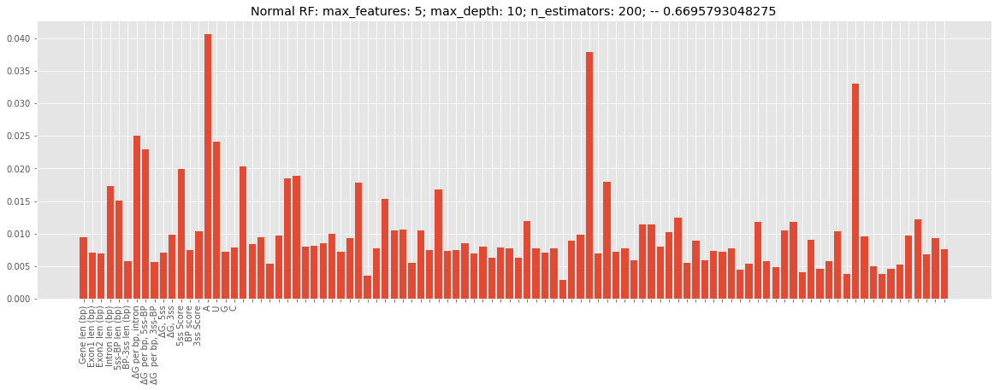

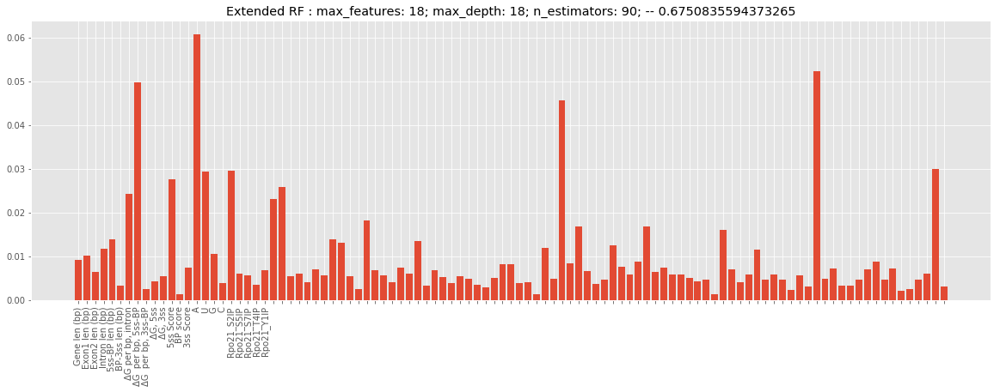

In [119]:
best_RFs(results_1_rp,results_2_rp,'rp')

Data
Coefficient of determination R^2: 0.3068923822397889
Mean squared error:               0.02053111470086379
Mean absolute error:              0.09984394095554235
Root mean squared error:          0.1432868266829292
Correlation Coefficient:          0.6686151985008861


Extended Data
Coefficient of determination R^2: 0.38414849862013833
Mean squared error:               0.01824264730257733
Mean absolute error:              0.09664412477954147
Root mean squared error:          0.1350653445654263
Correlation Coefficient:          0.6750835594373267


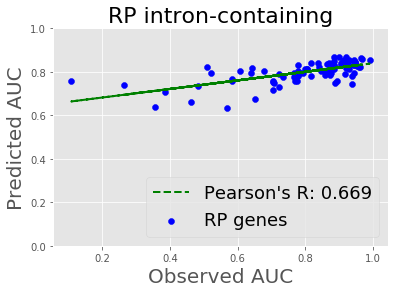

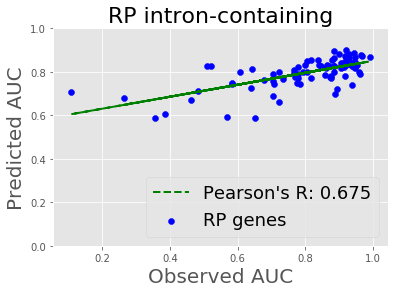

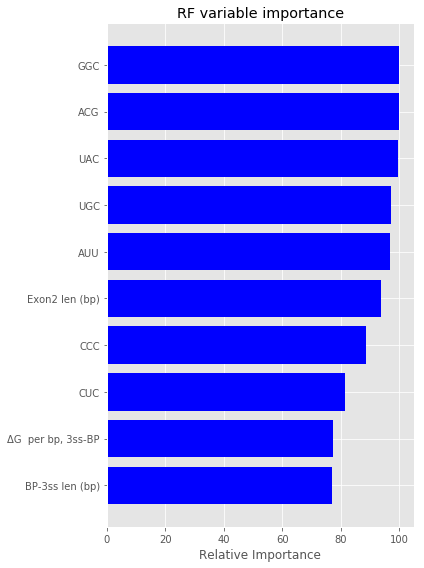

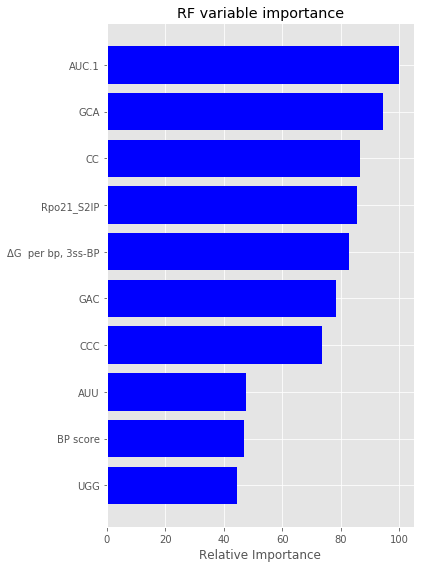

In [145]:
#BEST RIBOSOMAL PROTEIN

# Normal best: 0.6686151985008865 | max_features: 5; max_depth: 12; n_estimators: 140;
# Extended best: 0.6750835594373263 | max_features: 18; max_depth: 18; n_estimators: 90;
                
X,y,X2,y2 = get_data('rp')

rfr1 = ExtraTreesRegressor(n_estimators=140, 
                            criterion='mse', 
                            max_features=5, 
                            max_depth=12, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=90, 
                            criterion='mse', 
                            max_features=18, 
                            max_depth=18, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1_rp = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2_rp = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter(y,predictions_rfr1_rp,filename='full_rp_scat',title='RP intron-containing')
fit_scatter(y,predictions_rfr2_rp,filename='full_rp_scat_ext',title='RP intron-containing')

print('Data')
print_stats(y,predictions_rfr1_rp)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2_rp)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'rp_full')
plot_importance(rfr2.feature_importances_,names2,'rp_full_extended')

Normal best: 0.683828520812472 | max_features: 80; max_depth: 12; n_estimators: 10;
Extended best: 0.6995253307038448 | max_features: 25; max_depth: 5; n_estimators: 10;
Best difference: 0.178522036722764 | max_features: 7; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.3526340326994295
Mean squared error:               0.03376319974358975
Mean absolute error:              0.13876153846153846
Root mean squared error:          0.18374765234851234
Correlation Coefficient:          0.5972822538667238


Extended feature space
Coefficient of determination R^2: 0.32708078033033505
Mean squared error:               0.03509592282051282
Mean absolute error:              0.14166068376068375
Root mean squared error:          0.18733905844887985
Correlation Coefficient:          0.5756356719726347

# Non-RP Genes

In [125]:
X,y,X2,y2 = get_data('nrp')

mxf = [2,4,5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,200,300,500]

results_1_nrp = np.zeros((len(mxf),len(md),len(n_est)))
results_2_nrp = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_nrp[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_nrp[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

FloatProgress(value=0.0, max=770.0)

max_features: 2; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.10807282324725986
Mean squared error:               0.0648238352717465
Mean absolute error:              0.2078112601119419
Root mean squared error:          0.25460525381803595
Correlation Coefficient:          0.007543815690100991


Extended feature space
Coefficient of determination R^2: -0.042139930692752126
Mean squared error:               0.06096666733451839
Mean absolute error:              0.20710250903137267
Root mean squared error:          0.24691429147483218
Correlation Coefficient:          0.010592640034252603
-------------------------------------------------------

max_features: 2; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.044590635328434325
Mean squared error:               0.05589280593585455
Mean absolute error:              0.1938343623800442
Root mean squared error:          0.23641659403657467
Correlation Coeff

max_features: 2; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.13315430069337642
Mean squared error:               0.05071170561985302
Mean absolute error:              0.17559480339105338
Root mean squared error:          0.22519259672523212
Correlation Coefficient:          0.38280813385552753


Extended feature space
Coefficient of determination R^2: 0.023167125297899327
Mean squared error:               0.057146111725894774
Mean absolute error:              0.1916065027985483
Root mean squared error:          0.23905252921877815
Correlation Coefficient:          0.17989726894865177
-------------------------------------------------------

max_features: 2; max_depth: 7; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.029481485996935675
Mean squared error:               0.05677671264921569
Mean absolute error:              0.19261197884326672
Root mean squared error:          0.23827864497099963
Correlation Coeffi

max_features: 2; max_depth: 10; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.007810971514991438
Mean squared error:               0.05895837442442948
Mean absolute error:              0.1987631313131313
Root mean squared error:          0.24281345602010915
Correlation Coefficient:          0.10338356540274891


Extended feature space
Coefficient of determination R^2: -0.09629894873169165
Mean squared error:               0.0641350468761691
Mean absolute error:              0.20458855218855218
Root mean squared error:          0.2532489819844674
Correlation Coefficient:          -0.043761157561521574
-------------------------------------------------------

max_features: 2; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0067533623044635505
Mean squared error:               0.05810634019297139
Mean absolute error:              0.20008207070707074
Root mean squared error:          0.24105256728143634
Correlation Co

max_features: 2; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.01993532772600526
Mean squared error:               0.059667666497395834
Mean absolute error:              0.20327178030303028
Root mean squared error:          0.24426965938772632
Correlation Coefficient:          0.09579223883106755


Extended feature space
Coefficient of determination R^2: -0.08567261180251529
Mean squared error:               0.06351339106060606
Mean absolute error:              0.20564242424242424
Root mean squared error:          0.25201863236793837
Correlation Coefficient:          -0.08073852023896146
-------------------------------------------------------

max_features: 2; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.00846282770388751
Mean squared error:               0.05800633403712121
Mean absolute error:              0.19927742424242423
Root mean squared error:          0.24084504154564032
Correlation Co

max_features: 2; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.011235635554239343
Mean squared error:               0.057844120836363644
Mean absolute error:              0.19854121212121215
Root mean squared error:          0.2405080473422119
Correlation Coefficient:          0.14445372866226602


Extended feature space
Coefficient of determination R^2: -0.059091324003522905
Mean squared error:               0.06195834793939392
Mean absolute error:              0.20160666666666666
Root mean squared error:          0.24891433855725129
Correlation Coefficient:          -0.027875061350486757
-------------------------------------------------------

max_features: 2; max_depth: 15; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04554205688162549
Mean squared error:               0.05583714642255892
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.2362988498121794
Correlation Co

max_features: 2; max_depth: 18; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04554205688162549
Mean squared error:               0.05583714642255892
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.2362988498121794
Correlation Coefficient:          0.21769891534790276


Extended feature space
Coefficient of determination R^2: -0.04033804127855234
Mean squared error:               0.06086125424242423
Mean absolute error:              0.19967575757575756
Root mean squared error:          0.24670073822837302
Correlation Coefficient:          0.027171618298802516
-------------------------------------------------------

max_features: 2; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.04195676265854198
Mean squared error:               0.0560468912310606
Mean absolute error:              0.1947992424242424
Root mean squared error:          0.23674224640114533
Correlation Coeffic

max_features: 2; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.04195676265854198
Mean squared error:               0.0560468912310606
Mean absolute error:              0.1947992424242424
Root mean squared error:          0.23674224640114533
Correlation Coefficient:          0.21054912486591348


Extended feature space
Coefficient of determination R^2: -0.051110784724757385
Mean squared error:               0.06149147504734848
Mean absolute error:              0.20132272727272724
Root mean squared error:          0.24797474679359688
Correlation Coefficient:          0.006768385087369922
-------------------------------------------------------

max_features: 2; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.07229010209894471
Mean squared error:               0.05427234775533106
Mean absolute error:              0.1915356902356902
Root mean squared error:          0.23296426282872457
Correlation Coeffi

max_features: 4; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: -0.025583891282230153
Mean squared error:               0.05999811549479806
Mean absolute error:              0.2035795313971088
Root mean squared error:          0.2449451275179771
Correlation Coefficient:          0.06514478149318832


Extended feature space
Coefficient of determination R^2: 0.013677735886843179
Mean squared error:               0.05770125449549097
Mean absolute error:              0.2002316970516135
Root mean squared error:          0.2402108542416245
Correlation Coefficient:          0.13856780913115727
-------------------------------------------------------

max_features: 4; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.014333547946295155
Mean squared error:               0.05933995441742228
Mean absolute error:              0.20369318738824813
Root mean squared error:          0.243597935987607
Correlation Coeffici

max_features: 4; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.026768858345000535
Mean squared error:               0.06006743775238612
Mean absolute error:              0.20421214705628835
Root mean squared error:          0.2450865923554084
Correlation Coefficient:          0.06207876134300679


Extended feature space
Coefficient of determination R^2: 0.0008498895575069776
Mean squared error:               0.058451701740381674
Mean absolute error:              0.2000217576283144
Root mean squared error:          0.24176786746873885
Correlation Coefficient:          0.10550395671861725
-------------------------------------------------------

max_features: 4; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.0042247977701668216
Mean squared error:               0.05825426481255089
Mean absolute error:              0.20043875463233357
Root mean squared error:          0.2413592028751978
Correlation Co

max_features: 4; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.009085187230679859
Mean squared error:               0.057969925120127504
Mean absolute error:              0.1991179418451917
Root mean squared error:          0.2407694439087475
Correlation Coefficient:          0.13584855703631338


Extended feature space
Coefficient of determination R^2: -0.008517723069881855
Mean squared error:               0.05899972039502913
Mean absolute error:              0.2029453897306397
Root mean squared error:          0.24289858047141638
Correlation Coefficient:          0.09648395477925234
-------------------------------------------------------

max_features: 4; max_depth: 10; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.007703813159395612
Mean squared error:               0.05895210550830285
Mean absolute error:              0.20100416443152794
Root mean squared error:          0.24280054676277574
Correlation C

max_features: 4; max_depth: 12; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.002443784022676976
Mean squared error:               0.058644386326738594
Mean absolute error:              0.2005325232323232
Root mean squared error:          0.2421660304971335
Correlation Coefficient:          0.10991700591796227


Extended feature space
Coefficient of determination R^2: -0.0002775446026319628
Mean squared error:               0.05851765824138348
Mean absolute error:              0.20173087070707055
Root mean squared error:          0.241904233616081
Correlation Coefficient:          0.10887784982734544
-------------------------------------------------------

max_features: 4; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.12034679386189961
Mean squared error:               0.06554188
Mean absolute error:              0.20586666666666667
Root mean squared error:          0.2560114841174122
Correlation Coefficient:

max_features: 4; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.12034679386189961
Mean squared error:               0.06554188
Mean absolute error:              0.20586666666666667
Root mean squared error:          0.2560114841174122
Correlation Coefficient:          0.0727549653931756


Extended feature space
Coefficient of determination R^2: 0.02169272287231272
Mean squared error:               0.057232366363636364
Mean absolute error:              0.19405151515151514
Root mean squared error:          0.23923287057517068
Correlation Coefficient:          0.24310799128337754
-------------------------------------------------------

max_features: 4; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.006309348938143722
Mean squared error:               0.05813231560606059
Mean absolute error:              0.193730303030303
Root mean squared error:          0.24110644040767676
Correlation Coefficient:    

max_features: 4; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.0063093489381435
Mean squared error:               0.0581323156060606
Mean absolute error:              0.19373030303030303
Root mean squared error:          0.2411064404076768
Correlation Coefficient:          0.20138196356450574


Extended feature space
Coefficient of determination R^2: 0.06736490109538418
Mean squared error:               0.05456047901515152
Mean absolute error:              0.18525303030303028
Root mean squared error:          0.23358184650171665
Correlation Coefficient:          0.2646431477219436
-------------------------------------------------------

max_features: 4; max_depth: 20; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.015281658763112604
Mean squared error:               0.05760742272727272
Mean absolute error:              0.19458080808080808
Root mean squared error:          0.24001546351698408
Correlation Coefficie

max_features: 5; max_depth: 5; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.08073239691313028
Mean squared error:               0.053778461508083776
Mean absolute error:              0.18880430456394137
Root mean squared error:          0.23190183593081745
Correlation Coefficient:          0.2842133678707584


Extended feature space
Coefficient of determination R^2: 0.0010330973209133898
Mean squared error:               0.05844098382579483
Mean absolute error:              0.19487703763268155
Root mean squared error:          0.2417457007390097
Correlation Coefficient:          0.1166966629679743
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.06843082882250917
Mean squared error:               0.05449812072791166
Mean absolute error:              0.19192852322705764
Root mean squared error:          0.23344832560528606
Correlation Coeffici

max_features: 5; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.03941302386130008
Mean squared error:               0.05619570356659242
Mean absolute error:              0.19840379894936716
Root mean squared error:          0.2370563299441557
Correlation Coefficient:          0.2309092569767551


Extended feature space
Coefficient of determination R^2: 0.025602560538950048
Mean squared error:               0.05700363530235231
Mean absolute error:              0.19414316438191437
Root mean squared error:          0.2387543409078719
Correlation Coefficient:          0.17409068597601152
-------------------------------------------------------

max_features: 5; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.026133602663895417
Mean squared error:               0.0569725685831732
Mean absolute error:              0.20119919837065292
Root mean squared error:          0.23868927203201487
Correlation Coefficien

max_features: 5; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.06349701299506672
Mean squared error:               0.054786755967175076
Mean absolute error:              0.19515186868686868
Root mean squared error:          0.23406570865288037
Correlation Coefficient:          0.2565269622597969


Extended feature space
Coefficient of determination R^2: 0.008264499329294517
Mean squared error:               0.058017936528956225
Mean absolute error:              0.198480303030303
Root mean squared error:          0.240869127388622
Correlation Coefficient:          0.14491635757759774
-------------------------------------------------------

max_features: 5; max_depth: 10; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.054730610357309306
Mean squared error:               0.05529960298281656
Mean absolute error:              0.19503817340067334
Root mean squared error:          0.23515867618018382
Correlation Coeffic

max_features: 5; max_depth: 12; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.035394597700737385
Mean squared error:               0.05643078720912831
Mean absolute error:              0.19829124579124577
Root mean squared error:          0.23755165166575523
Correlation Coefficient:          0.20901642159789494


Extended feature space
Coefficient of determination R^2: 0.02707022092957312
Mean squared error:               0.05691777508323981
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.23857446444085295
Correlation Coefficient:          0.17718789817466943
-------------------------------------------------------

max_features: 5; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.0714261150286779
Mean squared error:               0.054322892227088575
Mean absolute error:              0.19242013888888884
Root mean squared error:          0.2330727187533723
Correlation Coeffi

max_features: 5; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.07286433784825741
Mean squared error:               0.05423875414772727
Mean absolute error:              0.1925136363636363
Root mean squared error:          0.23289215132272548
Correlation Coefficient:          0.27428832931749597


Extended feature space
Coefficient of determination R^2: 0.024720376900026708
Mean squared error:               0.05705524429924242
Mean absolute error:              0.19602575757575758
Root mean squared error:          0.2388623961598862
Correlation Coefficient:          0.16980948492537398
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.059258707075985795
Mean squared error:               0.055034702888140635
Mean absolute error:              0.19468821548821544
Root mean squared error:          0.2345947631302554
Correlation Coeffi

max_features: 5; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.059477135744119836
Mean squared error:               0.05502192450056115
Mean absolute error:              0.194570707070707
Root mean squared error:          0.23456752652607554
Correlation Coefficient:          0.2523613173429596


Extended feature space
Coefficient of determination R^2: 0.020268109361537445
Mean squared error:               0.057315708279087156
Mean absolute error:              0.19728518518518517
Root mean squared error:          0.2394069929619583
Correlation Coefficient:          0.16040413115955585
-------------------------------------------------------

max_features: 5; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.041309336199172986
Mean squared error:               0.05608476659924237
Mean absolute error:              0.19582984848484836
Root mean squared error:          0.23682222572901043
Correlation Coeff

max_features: 5; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.0413093361991731
Mean squared error:               0.056084766599242365
Mean absolute error:              0.1958298484848483
Root mean squared error:          0.23682222572901043
Correlation Coefficient:          0.21398914197908028


Extended feature space
Coefficient of determination R^2: 0.014190555943968453
Mean squared error:               0.05767125379318178
Mean absolute error:              0.1982186363636363
Root mean squared error:          0.240148399522424
Correlation Coefficient:          0.15004225751553066
-------------------------------------------------------

max_features: 5; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.04804813482225545
Mean squared error:               0.055690537300673346
Mean absolute error:              0.19544252525252512
Root mean squared error:          0.23598842620067906
Correlation Coeffi

max_features: 7; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.024360519764102584
Mean squared error:               0.05707629645322644
Mean absolute error:              0.19786089471035598
Root mean squared error:          0.23890645963059776
Correlation Coefficient:          0.1717479432651526


Extended feature space
Coefficient of determination R^2: 0.021197123196941003
Mean squared error:               0.0572613596491344
Mean absolute error:              0.1974315595099974
Root mean squared error:          0.23929345926943846
Correlation Coefficient:          0.1602078070273194
-------------------------------------------------------

max_features: 7; max_depth: 5; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.021074075661955627
Mean squared error:               0.05726855810484159
Mean absolute error:              0.1986381252929405
Root mean squared error:          0.23930849985916003
Correlation Coeffici

max_features: 7; max_depth: 7; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.016462577379764864
Mean squared error:               0.05946450566566921
Mean absolute error:              0.20283583180991618
Root mean squared error:          0.24385345120721422
Correlation Coefficient:          0.0984392770636328


Extended feature space
Coefficient of determination R^2: 0.025125652646088015
Mean squared error:               0.057031535092003385
Mean absolute error:              0.19849356640563484
Root mean squared error:          0.2388127615769379
Correlation Coefficient:          0.17335652358358006
-------------------------------------------------------

max_features: 7; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.00021521975223803835
Mean squared error:               0.058514012149041436
Mean absolute error:              0.20491774891774892
Root mean squared error:          0.24189669726774163
Correlation

max_features: 7; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.007593722028651606
Mean squared error:               0.05805717795454546
Mean absolute error:              0.2013863636363636
Root mean squared error:          0.2409505716003709
Correlation Coefficient:          0.3009393003577718


Extended feature space
Coefficient of determination R^2: -0.37418413792869587
Mean squared error:               0.08039172545454543
Mean absolute error:              0.22836363636363635
Root mean squared error:          0.2835343461638209
Correlation Coefficient:          -0.22236705445335345
-------------------------------------------------------

max_features: 7; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.035623390264209576
Mean squared error:               0.05641740251893939
Mean absolute error:              0.19751590909090908
Root mean squared error:          0.2375234778268022
Correlation Coeffic

max_features: 7; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.02427059859062075
Mean squared error:               0.05708155696969697
Mean absolute error:              0.19838787878787878
Root mean squared error:          0.23891746895046617
Correlation Coefficient:          0.24026514777657793


Extended feature space
Coefficient of determination R^2: -0.17038898115352685
Mean squared error:               0.06846941909090908
Mean absolute error:              0.21050606060606064
Root mean squared error:          0.26166661822041626
Correlation Coefficient:          -0.08144397251428837
-------------------------------------------------------

max_features: 7; max_depth: 15; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.05140997539274761
Mean squared error:               0.055493864848484856
Mean absolute error:              0.19543636363636366
Root mean squared error:          0.23557135829401005
Correlation Coe

max_features: 7; max_depth: 18; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.05140997539274772
Mean squared error:               0.05549386484848485
Mean absolute error:              0.19543636363636366
Root mean squared error:          0.23557135829401002
Correlation Coefficient:          0.25356457567212537


Extended feature space
Coefficient of determination R^2: -0.09103348962546542
Mean squared error:               0.06382701003367001
Mean absolute error:              0.2032707070707071
Root mean squared error:          0.2526400800222918
Correlation Coefficient:          0.02509968812363764
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.024019589055687574
Mean squared error:               0.059906601590909096
Mean absolute error:              0.2042287878787879
Root mean squared error:          0.24475825132344178
Correlation Coeff

max_features: 7; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.024019589055687574
Mean squared error:               0.0599066015909091
Mean absolute error:              0.2042287878787879
Root mean squared error:          0.2447582513234418
Correlation Coefficient:          0.1248991605644656


Extended feature space
Coefficient of determination R^2: -0.04853945329834919
Mean squared error:               0.06134104850378786
Mean absolute error:              0.20057196969696967
Root mean squared error:          0.24767125086248476
Correlation Coefficient:          0.08335588939475491
-------------------------------------------------------

max_features: 7; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.04257752273307802
Mean squared error:               0.0609922670909091
Mean absolute error:              0.20747696969696972
Root mean squared error:          0.24696612539153848
Correlation Coeffic

max_features: 10; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.04057568118893773
Mean squared error:               0.056127686460222634
Mean absolute error:              0.19636782132863595
Root mean squared error:          0.2369128246005746
Correlation Coefficient:          0.21000817309731354


Extended feature space
Coefficient of determination R^2: -0.008548284888802327
Mean squared error:               0.059001508304879234
Mean absolute error:              0.1952051427646428
Root mean squared error:          0.24290226080643884
Correlation Coefficient:          0.12339079921768856
-------------------------------------------------------

max_features: 10; max_depth: 5; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.06174117827962433
Mean squared error:               0.05488947479392574
Mean absolute error:              0.19417893991327068
Root mean squared error:          0.23428502895815972
Correlation Coef

max_features: 10; max_depth: 7; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.030364140665915085
Mean squared error:               0.05672507609639772
Mean absolute error:              0.19569322084481172
Root mean squared error:          0.23817026702843855
Correlation Coefficient:          0.20216574121198222


Extended feature space
Coefficient of determination R^2: -0.01647440276821377
Mean squared error:               0.0594651974677031
Mean absolute error:              0.19963275472983807
Root mean squared error:          0.24385486968215972
Correlation Coefficient:          0.12630515871108644
-------------------------------------------------------

max_features: 10; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.032499501413327025
Mean squared error:               0.05660015445728529
Mean absolute error:              0.19699435519972447
Root mean squared error:          0.23790786968338246
Correlation Coef

max_features: 10; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.01922580581642841
Mean squared error:               0.057376684518097604
Mean absolute error:              0.19955119949494943
Root mean squared error:          0.23953430760143232
Correlation Coefficient:          0.17598583570360748


Extended feature space
Coefficient of determination R^2: -0.01968675020648636
Mean squared error:               0.05965312435915412
Mean absolute error:              0.20316560245310247
Root mean squared error:          0.2442398910070878
Correlation Coefficient:          0.09852992869869405
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.01732026541194065
Mean squared error:               0.057488161340462196
Mean absolute error:              0.19869494949494945
Root mean squared error:          0.23976688958332465
Correlation Co

max_features: 10; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.03375551037389557
Mean squared error:               0.05652667614769087
Mean absolute error:              0.19638810325476985
Root mean squared error:          0.23775339355662387
Correlation Coefficient:          0.2051303859283128


Extended feature space
Coefficient of determination R^2: -0.009529547260014537
Mean squared error:               0.059058913548447445
Mean absolute error:              0.20126397306397303
Root mean squared error:          0.2430203973917569
Correlation Coefficient:          0.11286174012357805
-------------------------------------------------------

max_features: 10; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.025638768068532936
Mean squared error:               0.057001517110403147
Mean absolute error:              0.19821604545454535
Root mean squared error:          0.23874990494323373
Correlation 

max_features: 10; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.0222599006600398
Mean squared error:               0.057199185656818134
Mean absolute error:              0.19855378787878777
Root mean squared error:          0.2391635123860204
Correlation Coefficient:          0.18128129683208058


Extended feature space
Coefficient of determination R^2: 0.011732507319169638
Mean squared error:               0.057815053131818166
Mean absolute error:              0.1994687878787878
Root mean squared error:          0.2404476099523931
Correlation Coefficient:          0.1405036504548726
-------------------------------------------------------

max_features: 10; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.03256428934169753
Mean squared error:               0.05659636427138038
Mean absolute error:              0.19751535353535338
Root mean squared error:          0.23789990389107007
Correlation Coef

max_features: 10; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.03256428934169742
Mean squared error:               0.05659636427138039
Mean absolute error:              0.1975153535353534
Root mean squared error:          0.2378999038910701
Correlation Coefficient:          0.20028632995013895


Extended feature space
Coefficient of determination R^2: 0.01014604141379516
Mean squared error:               0.05790786364242419
Mean absolute error:              0.20033333333333325
Root mean squared error:          0.24064052784687825
Correlation Coefficient:          0.14202124266584734
-------------------------------------------------------

max_features: 10; max_depth: 18; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.027199331681423744
Mean squared error:               0.05691022192072721
Mean absolute error:              0.19726109090909075
Root mean squared error:          0.23855863413577638
Correlation Coe

max_features: 10; max_depth: 20; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.027199331681423744
Mean squared error:               0.05691022192072721
Mean absolute error:              0.19726109090909075
Root mean squared error:          0.23855863413577638
Correlation Coefficient:          0.19037857972319314


Extended feature space
Coefficient of determination R^2: 0.009709629965810485
Mean squared error:               0.05793339433248476
Mean absolute error:              0.19979436363636352
Root mean squared error:          0.24069356936255018
Correlation Coefficient:          0.13858428417916271
-------------------------------------------------------

max_features: 12; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.10098935858689062
Mean squared error:               0.06440944252005769
Mean absolute error:              0.2066775095299828
Root mean squared error:          0.2537901544978798
Correlation Coe

max_features: 12; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.16654452474060788
Mean squared error:               0.06824451292590618
Mean absolute error:              0.21939515129651493
Root mean squared error:          0.261236507643756
Correlation Coefficient:          -0.011721974587145119


Extended feature space
Coefficient of determination R^2: -0.1329274691808633
Mean squared error:               0.06627786738943338
Mean absolute error:              0.2131387193362193
Root mean squared error:          0.25744488223585527
Correlation Coefficient:          0.01671952718365928
-------------------------------------------------------

max_features: 12; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.11886726471178255
Mean squared error:               0.0654553254415858
Mean absolute error:              0.20874248786566968
Root mean squared error:          0.25584238398198567
Correlation Coeffi

max_features: 12; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.12840234112338478
Mean squared error:               0.06601314096565745
Mean absolute error:              0.2065098556998557
Root mean squared error:          0.2569302258700939
Correlation Coefficient:          0.02551420867343078


Extended feature space
Coefficient of determination R^2: -0.07796658512651433
Mean squared error:               0.06306257754603863
Mean absolute error:              0.21316435786435786
Root mean squared error:          0.251122634475745
Correlation Coefficient:          0.028539225656286756
-------------------------------------------------------

max_features: 12; max_depth: 10; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.037675165720977066
Mean squared error:               0.06070547223706148
Mean absolute error:              0.2061409139009139
Root mean squared error:          0.2463848052073453
Correlation Coeff

max_features: 12; max_depth: 12; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.04017789797138338
Mean squared error:               0.06085188563131312
Mean absolute error:              0.2055520202020202
Root mean squared error:          0.2466817496924187
Correlation Coefficient:          0.13155782423226217


Extended feature space
Coefficient of determination R^2: -0.09413071515182336
Mean squared error:               0.06400820212962964
Mean absolute error:              0.2066681818181818
Root mean squared error:          0.25299842317617244
Correlation Coefficient:          -0.009736655309699142
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.031018431309985495
Mean squared error:               0.06031604381155303
Mean absolute error:              0.20503598484848487
Root mean squared error:          0.24559324870922863
Correlation C

max_features: 12; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.03644711083048735
Mean squared error:               0.060633629280303025
Mean absolute error:              0.20599545454545454
Root mean squared error:          0.24623896783470936
Correlation Coefficient:          0.10517692451419935


Extended feature space
Coefficient of determination R^2: -0.0746835389521745
Mean squared error:               0.0628705146780303
Mean absolute error:              0.20685833333333337
Root mean squared error:          0.2507399343503749
Correlation Coefficient:          0.0326784927642532
-------------------------------------------------------

max_features: 12; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.034793794542253176
Mean squared error:               0.060536907927272725
Mean absolute error:              0.20572969696969698
Root mean squared error:          0.24604249211726156
Correlation Co

max_features: 12; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.0347937945422534
Mean squared error:               0.06053690792727273
Mean absolute error:              0.20572969696969698
Root mean squared error:          0.2460424921172616
Correlation Coefficient:          0.0809470146821405


Extended feature space
Coefficient of determination R^2: -0.012323398098777139
Mean squared error:               0.05922235779393938
Mean absolute error:              0.19916363636363638
Root mean squared error:          0.24335644185831487
Correlation Coefficient:          0.13738444970276958
-------------------------------------------------------

max_features: 12; max_depth: 18; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: -0.016430154345125514
Mean squared error:               0.05946260887205387
Mean absolute error:              0.20394343434343432
Root mean squared error:          0.24384956196814023
Correlation Co

max_features: 12; max_depth: 20; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: -0.016430154345125514
Mean squared error:               0.05946260887205387
Mean absolute error:              0.20394343434343432
Root mean squared error:          0.24384956196814023
Correlation Coefficient:          0.11283485703852643


Extended feature space
Coefficient of determination R^2: 0.013129403943857754
Mean squared error:               0.057733332693602674
Mean absolute error:              0.19790404040404042
Root mean squared error:          0.24027761588130234
Correlation Coefficient:          0.16504895782194176
-------------------------------------------------------

max_features: 12; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: -0.009196823585577274
Mean squared error:               0.059039448740530284
Mean absolute error:              0.20306969696969693
Root mean squared error:          0.242980346407956
Correlation

max_features: 15; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.03193494368037453
Mean squared error:               0.05663318188717484
Mean absolute error:              0.1955703859725055
Root mean squared error:          0.23797727178698144
Correlation Coefficient:          0.21570933533419895


Extended feature space
Coefficient of determination R^2: 0.026021299499699446
Mean squared error:               0.056979138477916226
Mean absolute error:              0.19803125224785734
Root mean squared error:          0.2387030340777348
Correlation Coefficient:          0.19102346954529542
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.02702232214461131
Mean squared error:               0.05692057723024759
Mean absolute error:              0.1955190460961574
Root mean squared error:          0.23858033705703324
Correlation Coeffic

max_features: 15; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.016521450576681085
Mean squared error:               0.05753489314383028
Mean absolute error:              0.19819472620813527
Root mean squared error:          0.239864322365437
Correlation Coefficient:          0.207948170375906


Extended feature space
Coefficient of determination R^2: -0.008791537955515905
Mean squared error:               0.0590157389550632
Mean absolute error:              0.20253704116216742
Root mean squared error:          0.24293155199574878
Correlation Coefficient:          0.13807994919670474
-------------------------------------------------------

max_features: 15; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.01235658158999442
Mean squared error:               0.059224299075345516
Mean absolute error:              0.2025097451656088
Root mean squared error:          0.2433604303812465
Correlation Coeffic

max_features: 15; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.016453800596935464
Mean squared error:               0.0594639922113976
Mean absolute error:              0.2016268244949494
Root mean squared error:          0.24385239841223133
Correlation Coefficient:          0.13269261839931948


Extended feature space
Coefficient of determination R^2: 0.0001810332189770003
Mean squared error:               0.05849083078695667
Mean absolute error:              0.19983460882635876
Root mean squared error:          0.24184877669104854
Correlation Coefficient:          0.13486043384982144
-------------------------------------------------------

max_features: 15; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.014527758717583605
Mean squared error:               0.057651526951595734
Mean absolute error:              0.19777764730639721
Root mean squared error:          0.24010732381915328
Correlatio

max_features: 15; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01635692012268941
Mean squared error:               0.05754451840926678
Mean absolute error:              0.197342813131313
Root mean squared error:          0.23988438550532376
Correlation Coefficient:          0.17981920334682164


Extended feature space
Coefficient of determination R^2: -0.02374502774729992
Mean squared error:               0.05989053936408292
Mean absolute error:              0.20353945286195274
Root mean squared error:          0.24472543669198535
Correlation Coefficient:          0.0874041577366761
-------------------------------------------------------

max_features: 15; max_depth: 12; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.0201153166188609
Mean squared error:               0.057324646871726725
Mean absolute error:              0.19780095555555538
Root mean squared error:          0.2394256604287158
Correlation Coeff

max_features: 15; max_depth: 15; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.020079930871592322
Mean squared error:               0.05732671698824234
Mean absolute error:              0.19789303030303015
Root mean squared error:          0.23942998347793107
Correlation Coefficient:          0.18095294525768177


Extended feature space
Coefficient of determination R^2: -0.007960905648402905
Mean squared error:               0.05896714578436356
Mean absolute error:              0.20188527272727266
Root mean squared error:          0.24283151727970478
Correlation Coefficient:          0.1170242514020353
-------------------------------------------------------

max_features: 15; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.13886228801108436
Mean squared error:               0.0666250627272727
Mean absolute error:              0.219360606060606
Root mean squared error:          0.25811831149159625
Correlation Coe

max_features: 15; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.13886228801108458
Mean squared error:               0.06662506272727271
Mean absolute error:              0.219360606060606
Root mean squared error:          0.25811831149159625
Correlation Coefficient:          0.10244379142886395


Extended feature space
Coefficient of determination R^2: 0.007034907583418626
Mean squared error:               0.05808986939393939
Mean absolute error:              0.20425757575757575
Root mean squared error:          0.24101840052979231
Correlation Coefficient:          0.23584924532496113
-------------------------------------------------------

max_features: 15; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.04303760436985915
Mean squared error:               0.055983660454545454
Mean absolute error:              0.1910969696969697
Root mean squared error:          0.23660866521441148
Correlation Coef

max_features: 18; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.03239214294664006
Mean squared error:               0.056606435080195215
Mean absolute error:              0.20148774672297398
Root mean squared error:          0.23792106901280352
Correlation Coefficient:          0.21501908977676043


Extended feature space
Coefficient of determination R^2: 0.056780678601966006
Mean squared error:               0.05517967107635755
Mean absolute error:              0.19099728799794977
Root mean squared error:          0.23490353568296402
Correlation Coefficient:          0.2513773322247223
-------------------------------------------------------

max_features: 18; max_depth: 5; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.017451473639445436
Mean squared error:               0.057480485472642305
Mean absolute error:              0.20110905778284563
Root mean squared error:          0.23975088211024856
Correlation Coe

max_features: 18; max_depth: 7; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.04071665295610538
Mean squared error:               0.06088340356375289
Mean absolute error:              0.20758080965330963
Root mean squared error:          0.24674562521704999
Correlation Coefficient:          0.1302297996252175


Extended feature space
Coefficient of determination R^2: 0.04124840224734794
Mean squared error:               0.05608833132204099
Mean absolute error:              0.19122241422158087
Root mean squared error:          0.23682975176704676
Correlation Coefficient:          0.23387598298840062
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0048576554418851
Mean squared error:               0.05821724173915603
Mean absolute error:              0.19937397845210342
Root mean squared error:          0.2412824936441847
Correlation Coeffici

max_features: 18; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.04948245893615344
Mean squared error:               0.055606627301136365
Mean absolute error:              0.19512045454545454
Root mean squared error:          0.23581057504093483
Correlation Coefficient:          0.25792308037384865


Extended feature space
Coefficient of determination R^2: -0.003445528813959431
Mean squared error:               0.05870298982099642
Mean absolute error:              0.19850460858585856
Root mean squared error:          0.24228699886910238
Correlation Coefficient:          0.15688021676086564
-------------------------------------------------------

max_features: 18; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.0652585338658207
Mean squared error:               0.05468370449225589
Mean absolute error:              0.19365595959595958
Root mean squared error:          0.23384547139565454
Correlation Co

max_features: 18; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.05305938882321404
Mean squared error:               0.05539737181818183
Mean absolute error:              0.19391454545454545
Root mean squared error:          0.23536646281529114
Correlation Coefficient:          0.25913701317659577


Extended feature space
Coefficient of determination R^2: 0.014512246482579205
Mean squared error:               0.05765243443939394
Mean absolute error:              0.19851121212121212
Root mean squared error:          0.24010921356623102
Correlation Coefficient:          0.1773332354255318
-------------------------------------------------------

max_features: 18; max_depth: 12; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.046490110048576505
Mean squared error:               0.05578168396464646
Mean absolute error:              0.19573282828282826
Root mean squared error:          0.23618146405813997
Correlation Coe

max_features: 18; max_depth: 15; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04224485261788791
Mean squared error:               0.05603003755892255
Mean absolute error:              0.19614343434343434
Root mean squared error:          0.2367066487425365
Correlation Coefficient:          0.23768662260874374


Extended feature space
Coefficient of determination R^2: 0.0032250712395603953
Mean squared error:               0.058312750235690235
Mean absolute error:              0.20087272727272726
Root mean squared error:          0.2414803309499352
Correlation Coefficient:          0.15207004095338797
-------------------------------------------------------

max_features: 18; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.009473368064012222
Mean squared error:               0.05794721598958332
Mean absolute error:              0.19903446969696967
Root mean squared error:          0.24072227979475294
Correlation Co

max_features: 18; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.009473368064012222
Mean squared error:               0.05794721598958332
Mean absolute error:              0.19903446969696967
Root mean squared error:          0.24072227979475294
Correlation Coefficient:          0.18634629340060221


Extended feature space
Coefficient of determination R^2: -0.003721497309393751
Mean squared error:               0.05871913437026512
Mean absolute error:              0.2028208333333333
Root mean squared error:          0.24232031357330552
Correlation Coefficient:          0.14339285064948337
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.008979998693066427
Mean squared error:               0.05797607879910209
Mean absolute error:              0.1990717171717171
Root mean squared error:          0.24078222276385375
Correlation Co

max_features: 18; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.008979998693066427
Mean squared error:               0.05797607879910209
Mean absolute error:              0.1990717171717171
Root mean squared error:          0.24078222276385375
Correlation Coefficient:          0.17607448294432762


Extended feature space
Coefficient of determination R^2: -0.003218411687896827
Mean squared error:               0.058689703146277576
Mean absolute error:              0.20199831649831645
Root mean squared error:          0.24225957802794418
Correlation Coefficient:          0.14725897252031
-------------------------------------------------------

max_features: 18; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.01572853763507298
Mean squared error:               0.05758127967803026
Mean absolute error:              0.19772560606060596
Root mean squared error:          0.23996099615985567
Correlation Coe

max_features: 20; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.0016913414506349866
Mean squared error:               0.058600367366686355
Mean absolute error:              0.20032023308434235
Root mean squared error:          0.2420751275259116
Correlation Coefficient:          0.14492681772182772


Extended feature space
Coefficient of determination R^2: -0.0058004332498460265
Mean squared error:               0.05884075507796325
Mean absolute error:              0.20041464733391431
Root mean squared error:          0.24257113405754455
Correlation Coefficient:          0.12766675431807592
-------------------------------------------------------

max_features: 20; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.022692089832633378
Mean squared error:               0.057173901975869856
Mean absolute error:              0.19809193534305367
Root mean squared error:          0.23911064797676798
Correlat

max_features: 20; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: -0.0008092043378413738
Mean squared error:               0.05854876109164096
Mean absolute error:              0.20189064741893906
Root mean squared error:          0.24196851260368768
Correlation Coefficient:          0.15488582723554412


Extended feature space
Coefficient of determination R^2: -0.004220708663301265
Mean squared error:               0.05874833894409147
Mean absolute error:              0.20245177800986888
Root mean squared error:          0.24238056634988595
Correlation Coefficient:          0.1250465070035957
-------------------------------------------------------

max_features: 20; max_depth: 7; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.010563181164056523
Mean squared error:               0.059119382601131684
Mean absolute error:              0.20324711741613422
Root mean squared error:          0.2431447770385613
Correlatio

max_features: 20; max_depth: 10; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.016898369899953858
Mean squared error:               0.059490000147573927
Mean absolute error:              0.20378606702741697
Root mean squared error:          0.24390571979265663
Correlation Coefficient:          0.12971094778614978


Extended feature space
Coefficient of determination R^2: -0.002124784949089298
Mean squared error:               0.058625724427480486
Mean absolute error:              0.2010734747474746
Root mean squared error:          0.2421274962235402
Correlation Coefficient:          0.13397768077823666
-------------------------------------------------------

max_features: 20; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.23634504576250692
Mean squared error:               0.07232794262626262
Mean absolute error:              0.21288484848484845
Root mean squared error:          0.26893854804817885
Correlatio

max_features: 20; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.23601332283795595
Mean squared error:               0.07230853636363635
Mean absolute error:              0.21288484848484845
Root mean squared error:          0.26890246626544045
Correlation Coefficient:          0.06368328551090688


Extended feature space
Coefficient of determination R^2: -0.03657058037628125
Mean squared error:               0.06064085242424241
Mean absolute error:              0.20950606060606058
Root mean squared error:          0.24625363433712488
Correlation Coefficient:          0.16852461904161187
-------------------------------------------------------

max_features: 20; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.15717924256602567
Mean squared error:               0.06769663060606061
Mean absolute error:              0.2144
Root mean squared error:          0.2601857617281557
Correlation Coefficient:   

max_features: 20; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.15717924256602567
Mean squared error:               0.06769663060606061
Mean absolute error:              0.21439999999999998
Root mean squared error:          0.2601857617281557
Correlation Coefficient:          0.06943376220190096


Extended feature space
Coefficient of determination R^2: -0.045072735865334
Mean squared error:               0.061138240606060615
Mean absolute error:              0.20446060606060606
Root mean squared error:          0.2472614822532224
Correlation Coefficient:          0.12992448257679062
-------------------------------------------------------

max_features: 20; max_depth: 18; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.09153775663215025
Mean squared error:               0.06385651037037038
Mean absolute error:              0.208830303030303
Root mean squared error:          0.2526984573961036
Correlation Coeffic

max_features: 20; max_depth: 20; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.09153775663215025
Mean squared error:               0.06385651037037038
Mean absolute error:              0.208830303030303
Root mean squared error:          0.2526984573961036
Correlation Coefficient:          0.08115999829870434


Extended feature space
Coefficient of determination R^2: -0.03225991013463991
Mean squared error:               0.060388672087542075
Mean absolute error:              0.20201717171717168
Root mean squared error:          0.2457410671571646
Correlation Coefficient:          0.130586467793046
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.020607392442395955
Mean squared error:               0.05970698323863636
Mean absolute error:              0.20097651515151513
Root mean squared error:          0.24435012428610786
Correlation Coeff

max_features: 30; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0968339180690505
Mean squared error:               0.05283649963234973
Mean absolute error:              0.18380414948582557
Root mean squared error:          0.22986191427104607
Correlation Coefficient:          0.31379953208601535


Extended feature space
Coefficient of determination R^2: -0.06251141977634944
Mean squared error:               0.06215842840372802
Mean absolute error:              0.204902136995506
Root mean squared error:          0.24931592087896837
Correlation Coefficient:          0.03381253870003298
-------------------------------------------------------

max_features: 30; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.08249477476102429
Mean squared error:               0.05367535989878371
Mean absolute error:              0.18832515084237408
Root mean squared error:          0.23167943348252498
Correlation Coeffici

max_features: 30; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.04832777848034464
Mean squared error:               0.05567417774916513
Mean absolute error:              0.18972628239100967
Root mean squared error:          0.23595376188814013
Correlation Coefficient:          0.25526721537984715


Extended feature space
Coefficient of determination R^2: -0.03293058880238009
Mean squared error:               0.06042790774296628
Mean absolute error:              0.2072133299145893
Root mean squared error:          0.24582088548975306
Correlation Coefficient:          0.09322932080824148
-------------------------------------------------------

max_features: 30; max_depth: 7; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.03066482871160725
Mean squared error:               0.0567074854183004
Mean absolute error:              0.19254089549900158
Root mean squared error:          0.23813333537810366
Correlation Coeffic

max_features: 30; max_depth: 10; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.05256697142819444
Mean squared error:               0.055426178935755695
Mean absolute error:              0.1915203872053872
Root mean squared error:          0.23542765117070616
Correlation Coefficient:          0.25705685165960024


Extended feature space
Coefficient of determination R^2: -0.001598917923847143
Mean squared error:               0.05859496045899037
Mean absolute error:              0.20105091750841747
Root mean squared error:          0.24206395943838968
Correlation Coefficient:          0.15501274673405763
-------------------------------------------------------

max_features: 30; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.032037899125316294
Mean squared error:               0.056627158847295855
Mean absolute error:              0.195500202020202
Root mean squared error:          0.23796461679690084
Correlation Co

max_features: 30; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.03144854615922632
Mean squared error:               0.056661636833570055
Mean absolute error:              0.19569374999999994
Root mean squared error:          0.23803704928764777
Correlation Coefficient:          0.22576913984251448


Extended feature space
Coefficient of determination R^2: -0.015228290457338645
Mean squared error:               0.05939229812618372
Mean absolute error:              0.20350624999999994
Root mean squared error:          0.24370535104134197
Correlation Coefficient:          0.14152751712214168
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.026986463528066773
Mean squared error:               0.05692267501028803
Mean absolute error:              0.19534764309764308
Root mean squared error:          0.23858473339735725
Correlation 

max_features: 30; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.026313791818299737
Mean squared error:               0.0569620272615039
Mean absolute error:              0.1955632996632996
Root mean squared error:          0.23866718932753178
Correlation Coefficient:          0.21827222279242092


Extended feature space
Coefficient of determination R^2: 0.0004650661044222071
Mean squared error:               0.0584742144594089
Mean absolute error:              0.2022124579124579
Root mean squared error:          0.24181442152900828
Correlation Coefficient:          0.16223543541164442
-------------------------------------------------------

max_features: 30; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.00046766275745990793
Mean squared error:               0.058474062551515084
Mean absolute error:              0.20003303030303016
Root mean squared error:          0.24181410742865084
Correlation 

max_features: 30; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.00046766275745990793
Mean squared error:               0.058474062551515084
Mean absolute error:              0.20003303030303016
Root mean squared error:          0.24181410742865084
Correlation Coefficient:          0.16915283365682066


Extended feature space
Coefficient of determination R^2: -0.004463680288477434
Mean squared error:               0.058762553129545425
Mean absolute error:              0.200415909090909
Root mean squared error:          0.24240988661674967
Correlation Coefficient:          0.13942293951924326
-------------------------------------------------------

max_features: 30; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01754831018680847
Mean squared error:               0.05747482039696961
Mean absolute error:              0.19844030303030286
Root mean squared error:          0.23973906731479877
Correlati

max_features: 30; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01754831018680847
Mean squared error:               0.05747482039696961
Mean absolute error:              0.19844030303030286
Root mean squared error:          0.23973906731479877
Correlation Coefficient:          0.19467209326770418


Extended feature space
Coefficient of determination R^2: 0.0034093996679989136
Mean squared error:               0.058301966760606
Mean absolute error:              0.19912373737373723
Root mean squared error:          0.24145800206372536
Correlation Coefficient:          0.15183343822477818
-------------------------------------------------------

max_features: 30; max_depth: 20; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.013723987057837173
Mean squared error:               0.057698548736242354
Mean absolute error:              0.19864193939393926
Root mean squared error:          0.24020522212525347
Correlation 

In [126]:
get_best_settings(results_1_nrp,results_2_nrp)

IndexError: index 11 is out of bounds for axis 0 with size 11

Normal best: 0.38280813385552753 | max_features: 2; max_depth: 7; n_estimators: 20;
Extended best: 0.39016968220304177 | max_features: 4; max_depth: 5; n_estimators: 10;
Best difference: 0.40031742573046575 | max_features: 4; max_depth: 5; n_estimators: 10;
Normal feature space
Coefficient of determination R^2: 0.13315430069337653
Mean squared error:               0.05071170561985301
Mean absolute error:              0.17559480339105335
Root mean squared error:          0.2251925967252321
Correlation Coefficient:          0.38280813385552753


Extended feature space
Coefficient of determination R^2: 0.1353267336473516
Mean squared error:               0.05058461520395896
Mean absolute error:              0.18640657675657674
Root mean squared error:          0.22491023810391328
Correlation Coefficient:          0.39016968220304177
-------------------------------------------------------



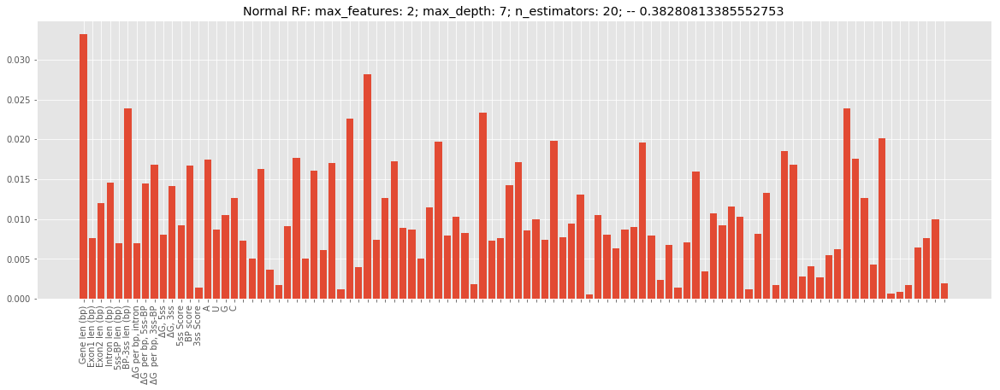

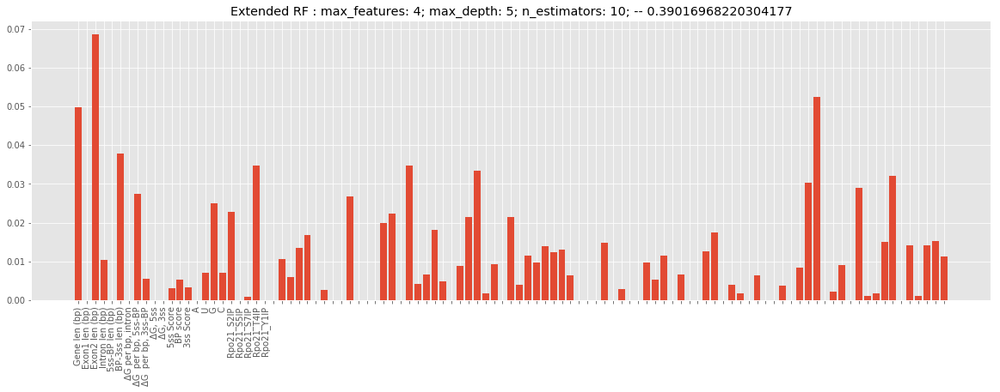

In [129]:
best_RFs(results_1_nrp,results_2_nrp,'nrp')

Data
Coefficient of determination R^2: 0.13315430069337653
Mean squared error:               0.05071170561985301
Mean absolute error:              0.17559480339105338
Root mean squared error:          0.2251925967252321
Correlation Coefficient:          0.3828081338555276


Extended Data
Coefficient of determination R^2: 0.1353267336473516
Mean squared error:               0.05058461520395896
Mean absolute error:              0.18640657675657674
Root mean squared error:          0.22491023810391328
Correlation Coefficient:          0.39016968220304177


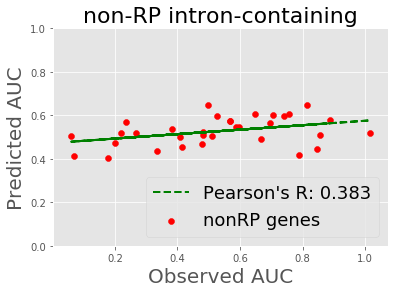

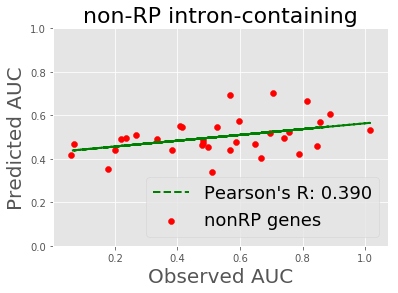

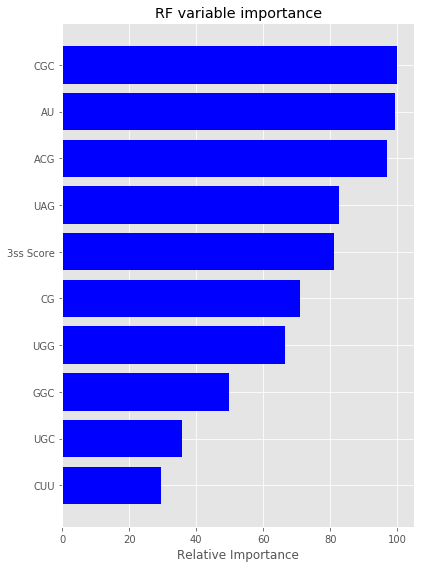

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


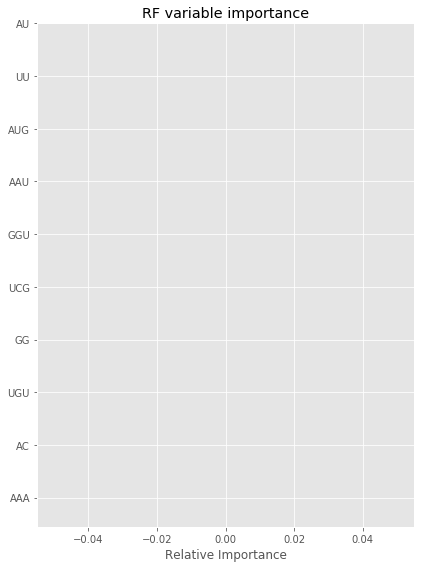

In [146]:
#BEST NON RIBOSOMAL PROTEIN

# Normal best: 0.38280813385552753 | max_features: 2; max_depth: 7; n_estimators: 20;
# Extended best: 0.39016968220304177 | max_features: 4; max_depth: 5; n_estimators: 10;

X,y,X2,y2 = get_data('nrp')

rfr1 = ExtraTreesRegressor(n_estimators=20, 
                            criterion='mse', 
                            max_features=2, 
                            max_depth=7, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=10, 
                            criterion='mse', 
                            max_features=4, 
                            max_depth=5, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1_nrp = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2_nrp = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter_nrp(y,predictions_rfr1_nrp,filename='full_nrp_scat',title='non-RP intron-containing')
fit_scatter_nrp(y,predictions_rfr2_nrp,filename='full_nrp_scat_ext',title='non-RP intron-containing')

print('Data')
print_stats(y,predictions_rfr1_nrp)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2_nrp)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'nrp_full')
plot_importance(rfr2.feature_importances_,names2,'nrp_full_ext')


Normal best: 0.2969901764177368 | max_features: 25; max_depth: 5; n_estimators: 10;
Extended best: 0.40630448232918154 | max_features: 30; max_depth: 7; n_estimators: 20;
Best difference: 0.2582434619528223 | max_features: 30; max_depth: 7; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.2360352774266372
Mean squared error:               0.03984437679487179
Mean absolute error:              0.1488410256410256
Root mean squared error:          0.19961056283391365
Correlation Coefficient:          0.48848065665874996


Extended feature space
Coefficient of determination R^2: 0.38909635792549957
Mean squared error:               0.031861516874999996
Mean absolute error:              0.13109380341880345
Root mean squared error:          0.1784979464167585
Correlation Coefficient:          0.6250700537546936

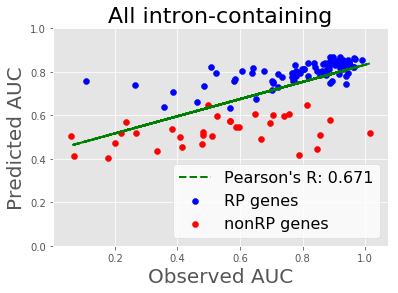

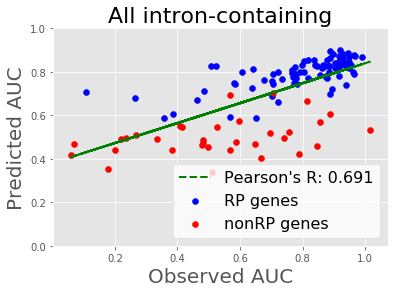

In [155]:
X,y1,_,_ = get_data('rp')
X,y2,_,_ = get_data('nrp')

fit_scatter_multi(y1,y2,predictions_rfr1_rp,predictions_rfr1_nrp,'full_rp_nrp','All intron-containing')
fit_scatter_multi(y1,y2,predictions_rfr2_rp,predictions_rfr2_nrp,'full_rp_nrp_ext','All intron-containing')

In [26]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

X,Y,X2,Y2 = get_data('full')
names = gene_features.drop(['ORG','Gene','AUC'], axis=1).columns
rf = RandomForestRegressor(random_state=1337,n_estimators=300)
scores = defaultdict(list)
X = X.values
Y = Y.values
#crossvalidate the scores on a number of different random splits of the data
for train_idx, test_idx in ShuffleSplit(len(X), 100, .3):
    X_train, X_test = X[train_idx], X[test_idx]
    Y_train, Y_test = Y[train_idx], Y[test_idx]
    r = rf.fit(X_train, Y_train)
    acc = r2_score(Y_test, rf.predict(X_test))
    for i in range(X.shape[1]):
        X_t = X_test.copy()
        np.random.shuffle(X_t[:, i])
        shuff_acc = r2_score(Y_test, rf.predict(X_t))
        scores[names[i]].append((acc-shuff_acc)/acc)
print("Features sorted by their score:")
print (sorted([(round(np.mean(score), 4), feat) for
              feat, score in scores.items()], reverse=True))

Features sorted by their score:
[(0.6054, 'A'), (0.2064, 'U'), (0.085, 'ΔG, 5ss'), (0.0845, '5ss-BP len (bp)'), (0.0708, 'Exon2 len (bp)'), (0.0685, 'Intron len (bp)'), (0.0233, 'G'), (0.018, 'ΔG per bp, intron'), (0.0176, 'BP-3ss len (bp)'), (0.0081, 'ΔG, 3ss'), (0.0081, 'Gene len (bp)'), (-0.003, 'C'), (-0.0033, 'ΔG  per bp, 3ss-BP'), (-0.0056, 'BP score'), (-0.0077, 'Exon1 len (bp)'), (-0.0102, '3ss Score'), (-0.0129, 'ΔG  per bp, 5ss-BP'), (-0.0159, '5ss Score')]


MSE: 0.0391
R2: -2.0055


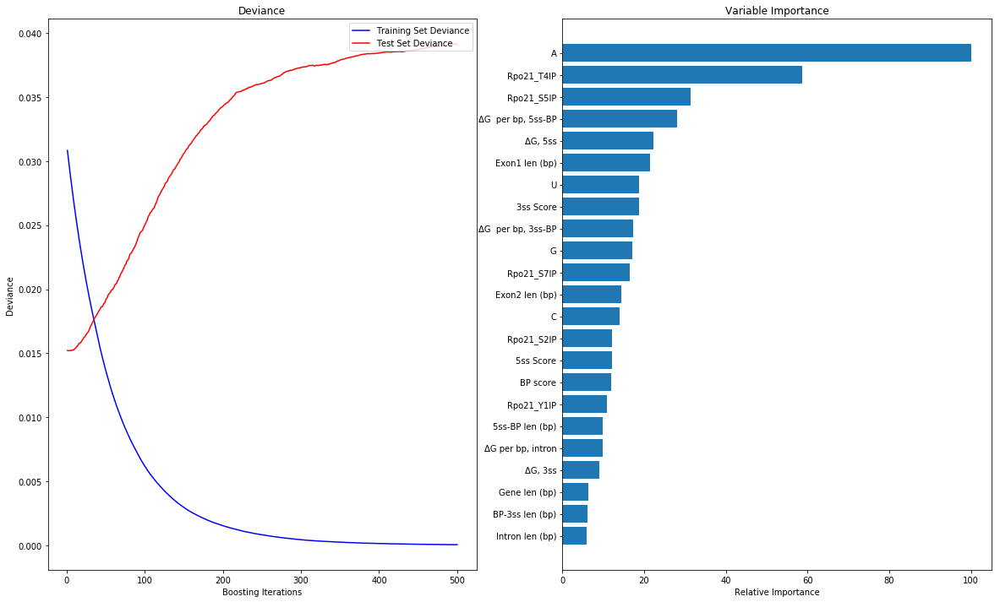

In [41]:
from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error

# #############################################################################
# Load data
names = extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns
X2,y2,X,y = get_data('rp_cut')
X = X.astype(np.float32)
offset = int(X.shape[0] * 0.9)
X_train, y_train = X[:offset], y[:offset]
X_test, y_test = X[offset:], y[offset:]

# #############################################################################
# Fit regression model
params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}
clf = ensemble.GradientBoostingRegressor(**params)

clf.fit(X_train, y_train)
mse = mean_squared_error(y_test, clf.predict(X_test))
print("MSE: %.4f" % mse)
print("R2: %.4f" % r2_score(y_test,clf.predict(X_test)))

# #############################################################################
# Plot training deviance

# # compute test set deviance
# test_score = np.zeros((params['n_estimators'],), dtype=np.float64)

# for i, y_pred in enumerate(clf.staged_predict(X_test)):
#     test_score[i] = clf.loss_(y_test, y_pred)


# plt.subplot(1, 2, 1)
# plt.title('Deviance')
# plt.plot(np.arange(params['n_estimators']) + 1, clf.train_score_, 'b-',
#          label='Training Set Deviance')
# plt.plot(np.arange(params['n_estimators']) + 1, test_score, 'r-',
#          label='Test Set Deviance')
# plt.legend(loc='upper right')
# plt.xlabel('Boosting Iterations')
# plt.ylabel('Deviance')

# #############################################################################
# Plot feature importance
plt.figure(figsize=(20, 12))
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, names[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


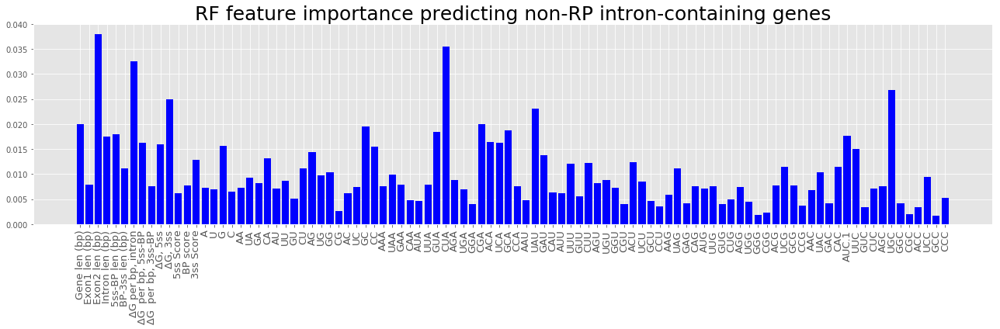

In [101]:
X,y,X2,y2 = get_data('nrp')

rf = RandomForestRegressor(n_estimators=1000, 
                            criterion='mse', 
                            max_features=10, 
                            max_depth=10, 
                            n_jobs=2,
                            random_state=1337)

rf.fit(X, y)

fig, ax1 = plt.subplots(figsize=(18,6))
xx = np.arange(len(rf.feature_importances_))
ax1.bar(xx, rf.feature_importances_,color='b')
ax1.set_xticks(xx)
ax1.set_xticklabels(get_variable_names('full')[1], rotation='vertical',fontsize=13)
ax1.set_title('RF feature importance predicting non-RP intron-containing genes',fontsize=25)
plt.tight_layout()
fig.savefig('RF_fi_nrp.pdf')

In [133]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

X,Y,X2,Y2 = get_data('rp_cut')
X = X.values
Y = Y.values
rf = ExtraTreesRegressor(n_estimators=1000)
scores = defaultdict(list)
 
#crossvalidate the scores on a number of different random splits of the data
for train_idx, test_idx in ShuffleSplit(len(X), 100, .3):
    X_train, X_test = X[train_idx], X[test_idx]
    Y_train, Y_test = Y[train_idx], Y[test_idx]
    r = rf.fit(X_train, Y_train)
    acc = r2_score(Y_test, rf.predict(X_test))
    for i in range(X.shape[1]):
        X_t = X_test.copy()
        np.random.shuffle(X_t[:, i])
        shuff_acc = r2_score(Y_test, rf.predict(X_t))
        scores[names[i]].append((acc-shuff_acc)/acc)
print ("Features sorted by their score:")
print (sorted([(round(np.mean(score), 4), feat) for
              feat, score in scores.items()], reverse=True))

KeyboardInterrupt: 

In [17]:
#A helper method for pretty-printing linear models
def pretty_print_linear(coefs, names = None, sort = False):
    if names is None:
        names = ["X%s" % x for x in range(len(coefs))]
    lst = zip(coefs, names)
    if sort:
        lst = sorted(lst,  key = lambda x:-np.abs(x[0]))
    return " + ".join("%s * %s" % (round(coef, 3), name)
                                   for coef, name in lst)

In [42]:
def who_fucks_bitches(kurvata):
    print(str(kurvata) + ' fucks a lot of bitches!')

In [43]:
who_fucks_bitches('Stefan')

Stefan fucks a lot of bitches!


In [71]:
names,names2 = get_variable_names('full')
X,y,X2,y2 = get_data('nrp')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = Lasso(random_state=1337,alpha=a,max_iter=10000)
    lasso2 = Lasso(random_state=1337,alpha=a,max_iter=10000)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)

    
    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)
    
    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)
    
    
    
print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
print('\n')
print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.2550177285721924
Mean squared error:               0.19042316408882295
Mean absolute error:              0.37122474867364447
Root mean squared error:          0.4363750268849295
Correlation Coefficient:          0.09546762059545255


Coefficient of determination R^2: -1.9407402984098288
Mean squared error:               0.1720374876828537
Mean absolute error:              0.3525566233665723
Root mean squared error:          0.414774020019159
Correlation Coefficient:          0.39247110338518115


1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.569392755530842
Mean squared error:               0.20881455004610755
Mean absolute error:              0.38359944651879424
Root mean squared error:          0.45696230702992074
Correlation Coefficient:          0.06936737164978982


Coefficient of determination R^2: -2.804151040048179
Mean squared error:               0.22254824339636298
Mean absolute error:              0.37204498656658336
Root mean squared error:          0.4717501917290156
Correlation Coefficient:          0.38972421028150894


6e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.5388593313877155
Mean squared error:               0.20702830133085073
Mean absolute error:              0.3816502214198679
Root mean squared error:          0.45500362782163695
Correlation Coefficient:          0.07266433436716559


Coefficient of determination R^2: -3.14955281562367
Mean squared error:               0.24275473825187133
Mean absolute error:              0.3748574751457109
Root mean squared error:          0.4927014697074399
Correlation Coefficient:          0.3829300951647373


1.1000000000000001e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.502353909567759
Mean squared error:               0.20489268226237872
Mean absolute error:              0.37914567274197664
Root mean squared error:          0.4526507287770326
Correlation Coefficient:          0.0763476208435727


Coefficient of determination R^2: -3.1646998575628276
Mean squared error:               0.24364086173664437
Mean absolute error:              0.37357534305552004
Root mean squared error:          0.4935999004625552
Correlation Coefficient:          0.3804247069520893


1.6000000000000003e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.4698344378672923
Mean squared error:               0.20299024694187554
Mean absolute error:              0.37672661130966145
Root mean squared error:          0.45054438953545467
Correlation Coefficient:          0.08012364874411415


Coefficient of determination R^2: -3.1195200024995895
Mean squared error:               0.24099777599284108
Mean absolute error:              0.3703851645341736
Root mean squared error:          0.4909152431864803
Correlation Coefficient:          0.3783269610911746


2.1000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.3904468296871046
Mean squared error:               0.19834595901483368
Mean absolute error:              0.3720358879327662
Root mean squared error:          0.4453604820983039
Correlation Coefficient:          0.08016021031491788


Coefficient of determination R^2: -3.084300339106517
Mean squared error:               0.23893737562003145
Mean absolute error:              0.3683609963067695
Root mean squared error:          0.48881220895148625
Correlation Coefficient:          0.37631708078979065


2.6000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.3075742408969915
Mean squared error:               0.19349779476825443
Mean absolute error:              0.3669636945075048
Root mean squared error:          0.4398838423587009
Correlation Coefficient:          0.07969682375538287


Coefficient of determination R^2: -3.0323318072799887
Mean squared error:               0.23589714263555578
Mean absolute error:              0.3648543153944326
Root mean squared error:          0.48569243625524555
Correlation Coefficient:          0.3753563436486671


3.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.2633186601205906
Mean squared error:               0.19090878038407552
Mean absolute error:              0.3640501839275011
Root mean squared error:          0.43693109340498476
Correlation Coefficient:          0.08238598726929526


Coefficient of determination R^2: -2.9925686703581
Mean squared error:               0.23357094260281908
Mean absolute error:              0.361974776489963
Root mean squared error:          0.4832917779176665
Correlation Coefficient:          0.3735011159849056


3.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.2306270320017796
Mean squared error:               0.18899627366838098
Mean absolute error:              0.3621300840662581
Root mean squared error:          0.43473701667603715
Correlation Coefficient:          0.08562288760295304


Coefficient of determination R^2: -3.1305734300521078
Mean squared error:               0.24164441721697363
Mean absolute error:              0.36270026435161634
Root mean squared error:          0.4915734097944819
Correlation Coefficient:          0.36851170342947553


4.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.184119855583277
Mean squared error:               0.18627553773852382
Mean absolute error:              0.35929631834515424
Root mean squared error:          0.4315964987560995
Correlation Coefficient:          0.09041750783554303


Coefficient of determination R^2: -3.0962988037819796
Mean squared error:               0.2396393028592148
Mean absolute error:              0.3597974382437192
Root mean squared error:          0.48952967515689466
Correlation Coefficient:          0.3674824511125202


4.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.126949203051137
Mean squared error:               0.1829309732980198
Mean absolute error:              0.3558387443519971
Root mean squared error:          0.42770430591475206
Correlation Coefficient:          0.09506248977385878


Coefficient of determination R^2: -3.059281264890708
Mean squared error:               0.2374737242141028
Mean absolute error:              0.3568518222804801
Root mean squared error:          0.4873127581072578
Correlation Coefficient:          0.36633506892724327


5.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.08080877484205
Mean squared error:               0.1802316926597415
Mean absolute error:              0.352928377684576
Root mean squared error:          0.4245370333195227
Correlation Coefficient:          0.10046469304944888


Coefficient of determination R^2: -3.0042935030139652
Mean squared error:               0.23425686197989148
Mean absolute error:              0.3533128196681329
Root mean squared error:          0.48400089047427536
Correlation Coefficient:          0.366481838616059


5.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.04648790864886
Mean squared error:               0.17822387320075406
Mean absolute error:              0.35053280942172205
Root mean squared error:          0.42216569401214266
Correlation Coefficient:          0.10596124795249612


Coefficient of determination R^2: -2.947386086012638
Mean squared error:               0.23092769719212605
Mean absolute error:              0.3496386594971942
Root mean squared error:          0.4805493701922062
Correlation Coefficient:          0.36708125749401493


6.1000000000000005e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.0095290393677283
Mean squared error:               0.17606172681123333
Mean absolute error:              0.3484661060298386
Root mean squared error:          0.4195971005753416
Correlation Coefficient:          0.11298356266390873


Coefficient of determination R^2: -2.8946822269410015
Mean squared error:               0.22784444651855298
Mean absolute error:              0.3470756111376874
Root mean squared error:          0.4773305422016833
Correlation Coefficient:          0.36691168508908184


6.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.981148392340629
Mean squared error:               0.1744014186174101
Mean absolute error:              0.34675323329348723
Root mean squared error:          0.4176139588392731
Correlation Coefficient:          0.1200150345255624


Coefficient of determination R^2: -2.855241997264107
Mean squared error:               0.2255371370186571
Mean absolute error:              0.3458859524730318
Root mean squared error:          0.47490750364534895
Correlation Coefficient:          0.3637452519430872


7.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.9495749248645247
Mean squared error:               0.17255432588876538
Mean absolute error:              0.34494990018189886
Root mean squared error:          0.4153965886821477
Correlation Coefficient:          0.12491741320163705


Coefficient of determination R^2: -2.8062498894919656
Mean squared error:               0.22267102907231298
Mean absolute error:              0.34351974499854476
Root mean squared error:          0.4718803122321517
Correlation Coefficient:          0.363097957519364


7.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.9281942693686114
Mean squared error:               0.17130352714991773
Mean absolute error:              0.34326960922718397
Root mean squared error:          0.41388830274594346
Correlation Coefficient:          0.12643821049168913


Coefficient of determination R^2: -2.763062693307517
Mean squared error:               0.22014451670545873
Mean absolute error:              0.34134813386484253
Root mean squared error:          0.4691956060167856
Correlation Coefficient:          0.3621240540896811


8.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.907796370195355
Mean squared error:               0.17011022105292142
Mean absolute error:              0.3415893582276651
Root mean squared error:          0.41244420356324735
Correlation Coefficient:          0.12794473728892147


Coefficient of determination R^2: -2.7254420859566246
Mean squared error:               0.21794365769820453
Mean absolute error:              0.339403499421013
Root mean squared error:          0.4668443613220626
Correlation Coefficient:          0.3608056299198544


8.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8837064136749313
Mean squared error:               0.16870092435290207
Mean absolute error:              0.33974065609576554
Root mean squared error:          0.4107321808099556
Correlation Coefficient:          0.12948262229739904


Coefficient of determination R^2: -2.691756056023689
Mean squared error:               0.21597297706285387
Mean absolute error:              0.3381276071585056
Root mean squared error:          0.4647289285840229
Correlation Coefficient:          0.35901927248398174


9.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8696109536368697
Mean squared error:               0.16787631990415378
Mean absolute error:              0.3384953658116825
Root mean squared error:          0.4097271285918883
Correlation Coefficient:          0.12920875040489332


Coefficient of determination R^2: -2.65483576400971
Mean squared error:               0.21381308749829867
Mean absolute error:              0.33729619797198485
Root mean squared error:          0.4623992728133325
Correlation Coefficient:          0.3568315373469482


9.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8470921896617059
Mean squared error:               0.16655894020146286
Mean absolute error:              0.3368691104759891
Root mean squared error:          0.40811633170146827
Correlation Coefficient:          0.12884384638080312


Coefficient of determination R^2: -2.615055981636655
Mean squared error:               0.21148591368300745
Mean absolute error:              0.3362342013615728
Root mean squared error:          0.4598759764143018
Correlation Coefficient:          0.35476955761631707


0.000101


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8245290185071346
Mean squared error:               0.16523896261565232
Mean absolute error:              0.3354980882040458
Root mean squared error:          0.4064959564567061
Correlation Coefficient:          0.1278380864992183


Coefficient of determination R^2: -2.573507891845476
Mean squared error:               0.20905529137012888
Mean absolute error:              0.3345878439170673
Root mean squared error:          0.4572256460109482
Correlation Coefficient:          0.3529822674638048


0.000106


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8016850541104192
Mean squared error:               0.16390255822603228
Mean absolute error:              0.33486330169496725
Root mean squared error:          0.40484880909548476
Correlation Coefficient:          0.12672766026393936


Coefficient of determination R^2: -2.5400128135538376
Mean squared error:               0.20709578167722947
Mean absolute error:              0.3335718109382969
Root mean squared error:          0.45507777541562
Correlation Coefficient:          0.3502825335232197


0.000111


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7826574438491511
Mean squared error:               0.162789415978236
Mean absolute error:              0.3342444897170602
Root mean squared error:          0.4034717040614323
Correlation Coefficient:          0.12464137340413406


Coefficient of determination R^2: -2.5084674129229345
Mean squared error:               0.20525033089892572
Mean absolute error:              0.3325574715476969
Root mean squared error:          0.45304561679694655
Correlation Coefficient:          0.3473518187495063


0.000116


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.769066540020631
Mean squared error:               0.16199432878496625
Mean absolute error:              0.3333342945901027
Root mean squared error:          0.4024851907647861
Correlation Coefficient:          0.12140367578410807


Coefficient of determination R^2: -2.4752030302038857
Mean squared error:               0.20330431722495368
Mean absolute error:              0.33137860453067325
Root mean squared error:          0.45089280014761124
Correlation Coefficient:          0.3446370570825256


0.00012100000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7568264335156356
Mean squared error:               0.1612782651552644
Mean absolute error:              0.3324695911435196
Root mean squared error:          0.4015946527971512
Correlation Coefficient:          0.11810154115734466


Coefficient of determination R^2: -2.4426307560759817
Mean squared error:               0.20139879288738743
Mean absolute error:              0.33012485837820355
Root mean squared error:          0.4487747685503135
Correlation Coefficient:          0.34193995053929926


0.000126


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7408456048729706
Mean squared error:               0.16034336396311866
Mean absolute error:              0.3321714990563688
Root mean squared error:          0.4004289749295356
Correlation Coefficient:          0.11641020831904884


Coefficient of determination R^2: -2.41379890025931
Mean squared error:               0.1997120883379865
Mean absolute error:              0.3291145792613781
Root mean squared error:          0.44689158454594613
Correlation Coefficient:          0.33875808970995164


0.000131


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.727337345825616
Mean squared error:               0.15955311160702565
Mean absolute error:              0.3318542180189388
Root mean squared error:          0.3994409989060032
Correlation Coefficient:          0.11418954936960274


Coefficient of determination R^2: -2.3860723247812166
Mean squared error:               0.19809004425953472
Mean absolute error:              0.3282867584664602
Root mean squared error:          0.44507307743732905
Correlation Coefficient:          0.33558721136016495


0.000136


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7194366652958473
Mean squared error:               0.15909091056531474
Mean absolute error:              0.3316291184559902
Root mean squared error:          0.3988620194569981
Correlation Coefficient:          0.11169497273311789


Coefficient of determination R^2: -2.356434185750776
Mean squared error:               0.19635617099600672
Mean absolute error:              0.32761413892163366
Root mean squared error:          0.4431209439825731
Correlation Coefficient:          0.3329674718180689


0.000141


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7133482534388533
Mean squared error:               0.15873472981707862
Mean absolute error:              0.3314583550380219
Root mean squared error:          0.3984152730720531
Correlation Coefficient:          0.10856865888240454


Coefficient of determination R^2: -2.3277330662829314
Mean squared error:               0.1946771147088523
Mean absolute error:              0.3269415026512591
Root mean squared error:          0.4412222962508267
Correlation Coefficient:          0.33028418705083046


0.000146


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7080005904253786
Mean squared error:               0.15842188392915366
Mean absolute error:              0.33128566043956487
Root mean squared error:          0.39802246661357404
Correlation Coefficient:          0.10506902834679388


Coefficient of determination R^2: -2.3000124256721337
Mean squared error:               0.19305541782857363
Mean absolute error:              0.32652852368373003
Root mean squared error:          0.4393807208203082
Correlation Coefficient:          0.32753388808347084


0.000151


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7025325279127843
Mean squared error:               0.15810199449938384
Mean absolute error:              0.33102812783966595
Root mean squared error:          0.3976204150938227
Correlation Coefficient:          0.10151015435611216


Coefficient of determination R^2: -2.2734072468341453
Mean squared error:               0.19149897704761942
Mean absolute error:              0.3261482783777181
Root mean squared error:          0.4376059609370277
Correlation Coefficient:          0.32469953880366526


0.000156


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.692518231797917
Mean squared error:               0.15751614394146632
Mean absolute error:              0.33042326255443394
Root mean squared error:          0.3968830355929393
Correlation Coefficient:          0.09813865006616763


Coefficient of determination R^2: -2.2497564393425664
Mean squared error:               0.1901153711900324
Mean absolute error:              0.3258537179342897
Root mean squared error:          0.4360222141015666
Correlation Coefficient:          0.32164425985445927


0.000161


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6835246594294153
Mean squared error:               0.15699000717365733
Mean absolute error:              0.3298183959933221
Root mean squared error:          0.39621964511323426
Correlation Coefficient:          0.09470841599018714


Coefficient of determination R^2: -2.2273200562163873
Mean squared error:               0.18880281088411044
Mean absolute error:              0.3255838883161827
Root mean squared error:          0.43451445417167706
Correlation Coefficient:          0.3184525204678279


0.00016600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6776061605550279
Mean squared error:               0.15664376657643286
Mean absolute error:              0.3294671621838643
Root mean squared error:          0.3957824738116038
Correlation Coefficient:          0.09237335096310012


Coefficient of determination R^2: -2.20760022488772
Mean squared error:               0.18764917271988762
Mean absolute error:              0.3254769679243804
Root mean squared error:          0.43318491746584115
Correlation Coefficient:          0.3147328227478849


0.000171


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6727795544955728
Mean squared error:               0.15636140326099407
Mean absolute error:              0.3291918434147122
Root mean squared error:          0.39542559762993856
Correlation Coefficient:          0.09062313605004975


Coefficient of determination R^2: -2.1924157884550217
Mean squared error:               0.18676086160408664
Mean absolute error:              0.325686196396128
Root mean squared error:          0.4321583756033043
Correlation Coefficient:          0.31028543839978023


0.00017600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6680058758771241
Mean squared error:               0.15608213627608986
Mean absolute error:              0.3288792851116927
Root mean squared error:          0.39507231778003615
Correlation Coefficient:          0.08897366044088337


Coefficient of determination R^2: -2.17826227218056
Mean squared error:               0.18593286078298268
Mean absolute error:              0.3258955339801198
Root mean squared error:          0.43119932836564423
Correlation Coefficient:          0.3057504387877003


0.000181


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6597291644887542
Mean squared error:               0.15559793689462756
Mean absolute error:              0.328282720606231
Root mean squared error:          0.3944590433677843
Correlation Coefficient:          0.0880794319417509


Coefficient of determination R^2: -2.1651364589074475
Mean squared error:               0.18516498204832477
Mean absolute error:              0.32610490105424883
Root mean squared error:          0.4303080083478865
Correlation Coefficient:          0.3011275390384355


0.00018600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6449956635041385
Mean squared error:               0.15473600614353855
Mean absolute error:              0.3271694363964146
Root mean squared error:          0.3933649782880252
Correlation Coefficient:          0.08856951481715183


Coefficient of determination R^2: -2.1531612967760885
Mean squared error:               0.18446441804109573
Mean absolute error:              0.32619558595569315
Root mean squared error:          0.42949321070430874
Correlation Coefficient:          0.29655865622088945


0.000191


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6308655417622382
Mean squared error:               0.1539093739358445
Mean absolute error:              0.32605732615210237
Root mean squared error:          0.3923128521165786
Correlation Coefficient:          0.08904869113058758


Coefficient of determination R^2: -2.141019545654938
Mean squared error:               0.18375410834115977
Mean absolute error:              0.3260398083133742
Root mean squared error:          0.428665497026714
Correlation Coefficient:          0.2924969021769914


0.00019600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6173150614395193
Mean squared error:               0.15311665157512566
Mean absolute error:              0.32494510554595474
Root mean squared error:          0.39130122869105033
Correlation Coefficient:          0.08951846536326229


Coefficient of determination R^2: -2.1243847830486784
Mean squared error:               0.18278095108258474
Mean absolute error:              0.32551069949341216
Root mean squared error:          0.4275288891789475
Correlation Coefficient:          0.2892160201277273


0.000201


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6043482168142935
Mean squared error:               0.15235807273234103
Mean absolute error:              0.3238328802303568
Root mean squared error:          0.3903307222501721
Correlation Coefficient:          0.08997823343081081


Coefficient of determination R^2: -2.108691532639538
Mean squared error:               0.18186287362588913
Mean absolute error:              0.3250076418667627
Root mean squared error:          0.4264538352810174
Correlation Coefficient:          0.28587416525015863


0.00020600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5896452853907133
Mean squared error:               0.15149793034402687
Mean absolute error:              0.32258487915840584
Root mean squared error:          0.3892273504573219
Correlation Coefficient:          0.09050425643387848


Coefficient of determination R^2: -2.0960712252133527
Mean squared error:               0.1811245677018467
Mean absolute error:              0.3251711739789494
Root mean squared error:          0.42558732088943474
Correlation Coefficient:          0.2819285289268765


0.000211


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5671143433323285
Mean squared error:               0.15017983820615652
Mean absolute error:              0.3209784647811105
Root mean squared error:          0.38753043519981306
Correlation Coefficient:          0.09122736262215993


Coefficient of determination R^2: -2.086434754447518
Mean squared error:               0.18056082046392163
Mean absolute error:              0.32556528559232356
Root mean squared error:          0.42492448795512083
Correlation Coefficient:          0.27743795393022824


0.00021600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5554651820139234
Mean squared error:               0.14949834570989143
Mean absolute error:              0.32021632975641234
Root mean squared error:          0.3866501593299703
Correlation Coefficient:          0.0913292156519582


Coefficient of determination R^2: -2.0724742599475556
Mean squared error:               0.17974411169100396
Mean absolute error:              0.3254648153685395
Root mean squared error:          0.4239623941943483
Correlation Coefficient:          0.2742952340216173


0.000221


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5428462675614831
Mean squared error:               0.1487601212767932
Mean absolute error:              0.31936698720127277
Root mean squared error:          0.3856943365889538
Correlation Coefficient:          0.09216588490699154


Coefficient of determination R^2: -2.0585050015451736
Mean squared error:               0.178926890217337
Mean absolute error:              0.32519125076384386
Root mean squared error:          0.42299750615971365
Correlation Coefficient:          0.2712147297048016


0.00022600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5291586192127444
Mean squared error:               0.14795937439156953
Mean absolute error:              0.31843530705442774
Root mean squared error:          0.3846548769891908
Correlation Coefficient:          0.09322728972294209


Coefficient of determination R^2: -2.0471293264224397
Mean squared error:               0.1782613970522759
Mean absolute error:              0.3250393885382586
Root mean squared error:          0.422210133763125
Correlation Coefficient:          0.2680592645876069


0.000231


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5156683638760509
Mean squared error:               0.14717017527814225
Mean absolute error:              0.31757076447036126
Root mean squared error:          0.38362765186850417
Correlation Coefficient:          0.09417518238463805


Coefficient of determination R^2: -2.0390834339428876
Mean squared error:               0.17779070090508567
Mean absolute error:              0.3250841048180438
Root mean squared error:          0.42165234602108603
Correlation Coefficient:          0.26517914624568245


0.00023600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.5026644297405611
Mean squared error:               0.14640942664628492
Mean absolute error:              0.31680070224214113
Root mean squared error:          0.38263484766325834
Correlation Coefficient:          0.09510871123460826


Coefficient of determination R^2: -2.031801620788856
Mean squared error:               0.1773647044845677
Mean absolute error:              0.3250445105094317
Root mean squared error:          0.42114689181396997
Correlation Coefficient:          0.2625268535087584


0.00024100000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4969336798610824
Mean squared error:               0.1460741696321455
Mean absolute error:              0.31641863818982147
Root mean squared error:          0.38219650656716564
Correlation Coefficient:          0.09452741022144585


Coefficient of determination R^2: -2.025349971035629
Mean squared error:               0.17698727380306378
Mean absolute error:              0.3249518797777901
Root mean squared error:          0.4206985545530954
Correlation Coefficient:          0.2600032557290264


0.00024600000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4917428961239039
Mean squared error:               0.14577050140488582
Mean absolute error:              0.31600554498854566
Root mean squared error:          0.38179903274482746
Correlation Coefficient:          0.093935660240462


Coefficient of determination R^2: -2.0192489290270363
Mean squared error:               0.1766303541730055
Mean absolute error:              0.32479748580498513
Root mean squared error:          0.42027414168968985
Correlation Coefficient:          0.25745134378928064


0.00025100000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4868344325254128
Mean squared error:               0.14548334930705395
Mean absolute error:              0.31559896143741145
Root mean squared error:          0.38142279599816
Correlation Coefficient:          0.09335823536936956


Coefficient of determination R^2: -2.0118024348174566
Mean squared error:               0.1761947236766459
Mean absolute error:              0.32442419322799276
Root mean squared error:          0.41975555228805
Correlation Coefficient:          0.2553257600601194


0.00025600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.482249878194002
Mean squared error:               0.14521514636177926
Mean absolute error:              0.3152072905899238
Root mean squared error:          0.3810710515924547
Correlation Coefficient:          0.09276997606242554


Coefficient of determination R^2: -2.004376529203451
Mean squared error:               0.1757602976423938
Mean absolute error:              0.32396783812679353
Root mean squared error:          0.4192377578920985
Correlation Coefficient:          0.2533731259067423


0.00026100000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.474943714164556
Mean squared error:               0.14478772538043508
Mean absolute error:              0.3147028234546811
Root mean squared error:          0.38050982297495956
Correlation Coefficient:          0.09269748400189025


Coefficient of determination R^2: -1.9989231947343256
Mean squared error:               0.1754412698241026
Mean absolute error:              0.32358833541385057
Root mean squared error:          0.41885709952691813
Correlation Coefficient:          0.2511829611599166


0.00026600000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.467253749524346
Mean squared error:               0.14433785151779338
Mean absolute error:              0.3141578556666661
Root mean squared error:          0.37991821688067734
Correlation Coefficient:          0.09280061262995633


Coefficient of determination R^2: -1.9983132082820925
Mean squared error:               0.1754055847495588
Mean absolute error:              0.32339130173445313
Root mean squared error:          0.4188144992112365
Correlation Coefficient:          0.24850259130434846


0.00027100000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4598118593757583
Mean squared error:               0.14390249036554642
Mean absolute error:              0.3136129536700924
Root mean squared error:          0.3793448172382831
Correlation Coefficient:          0.09289892137405976


Coefficient of determination R^2: -1.979857705585594
Mean squared error:               0.17432591160754532
Mean absolute error:              0.32248686318081504
Root mean squared error:          0.41752354617140497
Correlation Coefficient:          0.24800050396761197


0.00027600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4531342358551687
Mean squared error:               0.14351183989743288
Mean absolute error:              0.31309513873343603
Root mean squared error:          0.3788295657646495
Correlation Coefficient:          0.09296826491650916


Coefficient of determination R^2: -1.9713546878112207
Mean squared error:               0.17382847298081014
Mean absolute error:              0.3220406336251388
Root mean squared error:          0.41692741931997007
Correlation Coefficient:          0.24753753908610732


0.00028100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4464363515073524
Mean squared error:               0.14312000414212603
Mean absolute error:              0.3125692457582844
Root mean squared error:          0.37831204599130336
Correlation Coefficient:          0.09300559015131751


Coefficient of determination R^2: -1.9674559631751674
Mean squared error:               0.17360039204761227
Mean absolute error:              0.3217804983491478
Root mean squared error:          0.4166538035919176
Correlation Coefficient:          0.2469973261476469


0.00028600000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4400856803009008
Mean squared error:               0.14274848084914823
Mean absolute error:              0.3120610265669977
Root mean squared error:          0.37782069933918155
Correlation Coefficient:          0.09296787891824371


Coefficient of determination R^2: -1.9638092828898364
Mean squared error:               0.1733870560672096
Mean absolute error:              0.321656127879289
Root mean squared error:          0.4163977138112187
Correlation Coefficient:          0.24612266605621663


0.000291


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4330354599905863
Mean squared error:               0.14233603293919408
Mean absolute error:              0.31150548434384
Root mean squared error:          0.37727447957580446
Correlation Coefficient:          0.09297797262116937


Coefficient of determination R^2: -1.9599470963013834
Mean squared error:               0.17316111266173476
Mean absolute error:              0.3216086425555633
Root mean squared error:          0.4161263181555989
Correlation Coefficient:          0.24510347855778988


0.00029600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4262178960123433
Mean squared error:               0.1419371957553842
Mean absolute error:              0.31094994144189825
Root mean squared error:          0.37674553183201015
Correlation Coefficient:          0.09298199794235905


Coefficient of determination R^2: -1.956803946645275
Mean squared error:               0.17297723393890413
Mean absolute error:              0.32168268015185686
Root mean squared error:          0.4159053184787424
Correlation Coefficient:          0.24379016137891082


0.00030100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4205397006328786
Mean squared error:               0.14160501325420113
Mean absolute error:              0.31041262030605016
Root mean squared error:          0.37630441567194123
Correlation Coefficient:          0.09265544210088274


Coefficient of determination R^2: -1.9566720137553673
Mean squared error:               0.17296951567730356
Mean absolute error:              0.32209631618567347
Root mean squared error:          0.4158960395066339
Correlation Coefficient:          0.24145114379173466


0.00030600000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4160999200505886
Mean squared error:               0.14134527977904413
Mean absolute error:              0.30989576864509455
Root mean squared error:          0.3759591464229114
Correlation Coefficient:          0.0919565470423675


Coefficient of determination R^2: -1.9552441021566564
Mean squared error:               0.17288598081902032
Mean absolute error:              0.3222555638175357
Root mean squared error:          0.4157955998071893
Correlation Coefficient:          0.23923740455209094


0.000311


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4102599376034428
Mean squared error:               0.14100363250442344
Mean absolute error:              0.3093458150991115
Root mean squared error:          0.3755045039735521
Correlation Coefficient:          0.0918314984817177


Coefficient of determination R^2: -1.9534605812380446
Mean squared error:               0.17278164231002865
Mean absolute error:              0.32232852291233766
Root mean squared error:          0.4156701123607862
Correlation Coefficient:          0.23708930632487488


0.00031600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4044049307482909
Mean squared error:               0.14066110628057737
Mean absolute error:              0.30882201344192856
Root mean squared error:          0.37504813861766784
Correlation Coefficient:          0.09178918451191319


Coefficient of determination R^2: -1.9485572566727525
Mean squared error:               0.17249479085294397
Mean absolute error:              0.3222269370774199
Root mean squared error:          0.4153249220224377
Correlation Coefficient:          0.235559391886681


0.00032100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3987758399071697
Mean squared error:               0.14033179646468896
Mean absolute error:              0.3083613887426026
Root mean squared error:          0.3746088579634616
Correlation Coefficient:          0.09174231700820451


Coefficient of determination R^2: -1.9415237617857017
Mean squared error:               0.17208332140402574
Mean absolute error:              0.32204700644863166
Root mean squared error:          0.41482926777654655
Correlation Coefficient:          0.2343761760042687


0.00032600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.391696357873332
Mean squared error:               0.1399176367023135
Mean absolute error:              0.30785012878836476
Root mean squared error:          0.3740556598987823
Correlation Coefficient:          0.09185875507964435


Coefficient of determination R^2: -1.9349612349039003
Mean squared error:               0.17169940425288974
Mean absolute error:              0.32187226608084973
Root mean squared error:          0.4143662682372803
Correlation Coefficient:          0.2331664594945049


0.0003310000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3840771632101756
Mean squared error:               0.1394719029839281
Mean absolute error:              0.3073162917573801
Root mean squared error:          0.37345937260152956
Correlation Coefficient:          0.09204613357362285


Coefficient of determination R^2: -1.9287808887347606
Mean squared error:               0.1713378452167096
Mean absolute error:              0.32169425892307896
Root mean squared error:          0.4139297587957522
Correlation Coefficient:          0.23195195759986958


0.00033600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3768103145366863
Mean squared error:               0.13904678200679366
Mean absolute error:              0.3068875511579465
Root mean squared error:          0.3728897719256907
Correlation Coefficient:          0.0922375732748315


Coefficient of determination R^2: -1.9229755360686984
Mean squared error:               0.17099822383350813
Mean absolute error:              0.32151695763705185
Root mean squared error:          0.4135193149461197
Correlation Coefficient:          0.23071343589742965


0.00034100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.367480627436736
Mean squared error:               0.138500982049412
Mean absolute error:              0.3064349166038834
Root mean squared error:          0.3721572007222378
Correlation Coefficient:          0.0923834653077477


Coefficient of determination R^2: -1.9173418608280697
Mean squared error:               0.17066864582373184
Mean absolute error:              0.3213199764208814
Root mean squared error:          0.4131206189767485
Correlation Coefficient:          0.22943248246945203


0.00034600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3567890267699072
Mean squared error:               0.13787550821242472
Mean absolute error:              0.3059392583631548
Root mean squared error:          0.3713159142999728
Correlation Coefficient:          0.09235668069669217


Coefficient of determination R^2: -1.9109041912298066
Mean squared error:               0.1702920330011659
Mean absolute error:              0.3212055596827971
Root mean squared error:          0.41266455263466223
Correlation Coefficient:          0.22797042641373993


0.0003510000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.346328087183481
Mean squared error:               0.13726352837652284
Mean absolute error:              0.30544127088269807
Root mean squared error:          0.3704909288721154
Correlation Coefficient:          0.09210863918328248


Coefficient of determination R^2: -1.904112235084253
Mean squared error:               0.16989469391196954
Mean absolute error:              0.3210992596980287
Root mean squared error:          0.4121828403900016
Correlation Coefficient:          0.2261684032776341


0.00035600000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3361273715722737
Mean squared error:               0.13666677201307642
Mean absolute error:              0.30494381756362376
Root mean squared error:          0.36968469269510795
Correlation Coefficient:          0.09184463890310977


Coefficient of determination R^2: -1.893154651288285
Mean squared error:               0.1692536596838359
Mean absolute error:              0.3208134877975258
Root mean squared error:          0.4114044964312324
Correlation Coefficient:          0.22527549243366207


0.00036100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3261637606151662
Mean squared error:               0.1360838866089362
Mean absolute error:              0.30444495516775716
Root mean squared error:          0.36889549551185385
Correlation Coefficient:          0.09157702608445593


Coefficient of determination R^2: -1.882912485066492
Mean squared error:               0.1686544784007487
Mean absolute error:              0.32050081176934797
Root mean squared error:          0.4106756364830384
Correlation Coefficient:          0.22435465782767386


0.00036600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3164252198554007
Mean squared error:               0.13551416813127495
Mean absolute error:              0.3039235147773883
Root mean squared error:          0.36812249066210956
Correlation Coefficient:          0.09124443127631289


Coefficient of determination R^2: -1.8731745986678128
Mean squared error:               0.16808479820414116
Mean absolute error:              0.3201878795534181
Root mean squared error:          0.4099814608054139
Correlation Coefficient:          0.2233847865178997


0.0003710000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3077074955341161
Mean squared error:               0.13500416886634273
Mean absolute error:              0.3033873704460071
Root mean squared error:          0.3674291344822056
Correlation Coefficient:          0.09090263650852833


Coefficient of determination R^2: -1.8659619796631932
Mean squared error:               0.16766284973972242
Mean absolute error:              0.31995554689527655
Root mean squared error:          0.40946654288198253
Correlation Coefficient:          0.22189350321471543


0.00037600000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2983322880832824
Mean squared error:               0.1344557059037278
Mean absolute error:              0.3027689051111533
Root mean squared error:          0.36668202288048946
Correlation Coefficient:          0.09080422854060738


Coefficient of determination R^2: -1.8589963681335795
Mean squared error:               0.16725535156370958
Mean absolute error:              0.31972322202134773
Root mean squared error:          0.408968643741436
Correlation Coefficient:          0.2203851612789727


0.00038100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.290787389825228
Mean squared error:               0.13401431863065227
Mean absolute error:              0.302255363361003
Root mean squared error:          0.3660796615910972
Correlation Coefficient:          0.09046770541627741


Coefficient of determination R^2: -1.8508485133129922
Mean squared error:               0.16677869047463062
Mean absolute error:              0.31943931136037007
Root mean squared error:          0.4083854680012875
Correlation Coefficient:          0.21918402964198536


0.00038600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2836666173446214
Mean squared error:               0.13359774331844698
Mean absolute error:              0.30176059137685635
Root mean squared error:          0.36551025063388715
Correlation Coefficient:          0.09008345446121006


Coefficient of determination R^2: -1.842138112519352
Mean squared error:               0.1662691196464759
Mean absolute error:              0.31912529327562206
Root mean squared error:          0.40776110609825933
Correlation Coefficient:          0.2181564991104984


0.00039100000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2773684424160763
Mean squared error:               0.1332292911323495
Mean absolute error:              0.3014412313122319
Root mean squared error:          0.365005878216159
Correlation Coefficient:          0.08986151152547464


Coefficient of determination R^2: -1.8307857664652087
Mean squared error:               0.16560499126508932
Mean absolute error:              0.31856297506564335
Root mean squared error:          0.40694593162371007
Correlation Coefficient:          0.21802780677936018


0.00039600000000000003


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.271321751440765
Mean squared error:               0.13287555111499755
Mean absolute error:              0.3011562583810903
Root mean squared error:          0.3645209885795296
Correlation Coefficient:          0.08967173237110253


Coefficient of determination R^2: -1.816444764933696
Mean squared error:               0.16476602228993995
Mean absolute error:              0.31778354557392735
Root mean squared error:          0.4059138114057465
Correlation Coefficient:          0.21860949498155513


0.00040100000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2593672072099986
Mean squared error:               0.13217619328426128
Mean absolute error:              0.30051920246387603
Root mean squared error:          0.3635604396579216
Correlation Coefficient:          0.08963094340814337


Coefficient of determination R^2: -1.8022756518915477
Mean squared error:               0.16393710903575576
Mean absolute error:              0.3170041048255916
Root mean squared error:          0.40489147809722514
Correlation Coefficient:          0.21918880101311367


0.00040600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2454173569458744
Mean squared error:               0.13136010721427077
Mean absolute error:              0.2998505551637029
Root mean squared error:          0.3624363491901313
Correlation Coefficient:          0.08961863597047987


Coefficient of determination R^2: -1.7905573431908013
Mean squared error:               0.16325157131933152
Mean absolute error:              0.3163366888092407
Root mean squared error:          0.40404402151168073
Correlation Coefficient:          0.21955759375332104


0.00041100000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2313947436691928
Mean squared error:               0.13053976440461396
Mean absolute error:              0.29918390324018596
Root mean squared error:          0.361302870739514
Correlation Coefficient:          0.0896140346810722


Coefficient of determination R^2: -1.7822843610685841
Mean squared error:               0.1627675901052403
Mean absolute error:              0.3158634433611602
Root mean squared error:          0.4034446555665849
Correlation Coefficient:          0.21961865899701585


0.0004160000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2199825197443293
Mean squared error:               0.12987213308267462
Mean absolute error:              0.29859016755611373
Root mean squared error:          0.36037776441211605
Correlation Coefficient:          0.08965479517961192


Coefficient of determination R^2: -1.7741075799099155
Mean squared error:               0.1622892367842651
Mean absolute error:              0.31544691041153305
Root mean squared error:          0.40285138299907214
Correlation Coefficient:          0.21967655190048865


0.00042100000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.211965912954779
Mean squared error:               0.12940315018997878
Mean absolute error:              0.2980968452109899
Root mean squared error:          0.3597264935891973
Correlation Coefficient:          0.08966297060608967


Coefficient of determination R^2: -1.766025701175399
Mean squared error:               0.16181643539000545
Mean absolute error:              0.31503033132348995
Root mean squared error:          0.4022641363457665
Correlation Coefficient:          0.21973113978577877


0.00042600000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2050597027071484
Mean squared error:               0.1289991270734001
Mean absolute error:              0.2976357466193339
Root mean squared error:          0.35916448470498874
Correlation Coefficient:          0.08951819673511298


Coefficient of determination R^2: -1.7580392536868201
Mean squared error:               0.16134921685928752
Mean absolute error:              0.31461374825230737
Root mean squared error:          0.401682980544717
Correlation Coefficient:          0.2197824170273192


0.00043100000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.198770640034859
Mean squared error:               0.12863120796724656
Mean absolute error:              0.29720737099478145
Root mean squared error:          0.3586519314980007
Correlation Coefficient:          0.08930004004335229


Coefficient of determination R^2: -1.7501483965147009
Mean squared error:               0.16088759049796286
Mean absolute error:              0.31419716816017784
Root mean squared error:          0.40110795367078284
Correlation Coefficient:          0.21983033147459544


0.0004360000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1995226287848304
Mean squared error:               0.12867520037806257
Mean absolute error:              0.29724597340672765
Root mean squared error:          0.3587132564849849
Correlation Coefficient:          0.08814831342753837


Coefficient of determination R^2: -1.7418500817090878
Mean squared error:               0.1604021272858829
Mean absolute error:              0.3137431258753682
Root mean squared error:          0.40050234367089904
Correlation Coefficient:          0.21994353716566356


0.00044100000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2001755676720474
Mean squared error:               0.12871339823110928
Mean absolute error:              0.29727465749714727
Root mean squared error:          0.3587664954132552
Correlation Coefficient:          0.08702372976072442


Coefficient of determination R^2: -1.7336097010573863
Mean squared error:               0.1599200533041594
Mean absolute error:              0.31328621790436256
Root mean squared error:          0.39990005414373153
Correlation Coefficient:          0.2200582218144883


0.00044600000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2008929089332905
Mean squared error:               0.12875536371458374
Mean absolute error:              0.29730324823240356
Root mean squared error:          0.358824976436401
Correlation Coefficient:          0.08589586472232458


Coefficient of determination R^2: -1.7253847117678425
Mean squared error:               0.15943887973900078
Mean absolute error:              0.31282249278626
Root mean squared error:          0.39929798364003893
Correlation Coefficient:          0.22019287229852064


0.00045100000000000007


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2016737710300185
Mean squared error:               0.1288010452572281
Mean absolute error:              0.2973317426186873
Root mean squared error:          0.35888862514327213
Correlation Coefficient:          0.08476476374747868


Coefficient of determination R^2: -1.716027483092097
Mean squared error:               0.1588914685602851
Mean absolute error:              0.3122595103884937
Root mean squared error:          0.3986119272679696
Correlation Coefficient:          0.22066106342071254


0.0004560000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2025168875131498
Mean squared error:               0.1288503687699709
Mean absolute error:              0.29736004391504417
Root mean squared error:          0.3589573355845663
Correlation Coefficient:          0.08363081368734793


Coefficient of determination R^2: -1.707053469631156
Mean squared error:               0.15836647601637116
Mean absolute error:              0.31165380517738345
Root mean squared error:          0.39795285652495466
Correlation Coefficient:          0.2210797571002289


0.00046100000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2034303071037589
Mean squared error:               0.1289038051144362
Mean absolute error:              0.2973886603206993
Root mean squared error:          0.3590317605928982
Correlation Coefficient:          0.08249221183057441


Coefficient of determination R^2: -1.6982268053460086
Mean squared error:               0.15785010360869617
Mean absolute error:              0.31104056738825125
Root mean squared error:          0.3973035408962475
Correlation Coefficient:          0.2214879028865114


0.00046600000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2037798820123622
Mean squared error:               0.12892425574350586
Mean absolute error:              0.2973643822151914
Root mean squared error:          0.3590602397140428
Correlation Coefficient:          0.08140732516868816


Coefficient of determination R^2: -1.6894750451984728
Mean squared error:               0.1573381131995468
Mean absolute error:              0.31042880222838626
Root mean squared error:          0.396658686025589
Correlation Coefficient:          0.22188452281503726


0.00047100000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2038657288327559
Mean squared error:               0.1289292779045291
Mean absolute error:              0.2973116736916782
Root mean squared error:          0.35906723312567673
Correlation Coefficient:          0.08034892633457189


Coefficient of determination R^2: -1.6807946409964845
Mean squared error:               0.1568302972146435
Mean absolute error:              0.30981885620613
Root mean squared error:          0.39601805162725034
Correlation Coefficient:          0.22226741273304207


0.0004760000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2040974300927596
Mean squared error:               0.12894283275759977
Mean absolute error:              0.2972653428924652
Root mean squared error:          0.3590861077201397
Correlation Coefficient:          0.07928556636794777


Coefficient of determination R^2: -1.673019586444593
Mean squared error:               0.15637544547121418
Mean absolute error:              0.30923827143269544
Root mean squared error:          0.395443353049731
Correlation Coefficient:          0.22263995948944718


0.0004810000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2049031090505005
Mean squared error:               0.1289899661218903
Mean absolute error:              0.2972638883342922
Root mean squared error:          0.35915173133633965
Correlation Coefficient:          0.07821119532412224


Coefficient of determination R^2: -1.6663052870076722
Mean squared error:               0.15598264940986092
Mean absolute error:              0.3086987662715805
Root mean squared error:          0.3949463880197677
Correlation Coefficient:          0.22305766387994094


0.00048600000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2057728244214454
Mean squared error:               0.12904084570738017
Mean absolute error:              0.29726158300296424
Root mean squared error:          0.3592225573476423
Correlation Coefficient:          0.07713628706348463


Coefficient of determination R^2: -1.659667126390663
Mean squared error:               0.15559430757770287
Mean absolute error:              0.3081589553988544
Root mean squared error:          0.39445444296864357
Correlation Coefficient:          0.22347466763745671


0.0004910000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2071354444028901
Mean squared error:               0.1291205609132421
Mean absolute error:              0.297293340381786
Root mean squared error:          0.3593334953956312
Correlation Coefficient:          0.07597606189107706


Coefficient of determination R^2: -1.6531155214335658
Mean squared error:               0.15521102937468745
Mean absolute error:              0.30761906441082376
Root mean squared error:          0.39396831011476985
Correlation Coefficient:          0.22388893092198328


0.000496


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2082782181089256
Mean squared error:               0.12918741479948384
Mean absolute error:              0.2973013770831537
Root mean squared error:          0.3594265082036714
Correlation Coefficient:          0.07487001638465972


Coefficient of determination R^2: -1.6466549852081087
Mean squared error:               0.15483307882192604
Mean absolute error:              0.3070792374795705
Root mean squared error:          0.3934883464880835
Correlation Coefficient:          0.2243003829645341


0.000501


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2093634244790703
Mean squared error:               0.1292509009147447
Mean absolute error:              0.29729864177502385
Root mean squared error:          0.35951481320627765
Correlation Coefficient:          0.07378714868428687


Coefficient of determination R^2: -1.6402858837704555
Mean squared error:               0.15446047733422458
Mean absolute error:              0.30653946871789123
Root mean squared error:          0.3930146019351248
Correlation Coefficient:          0.22470914593678312


0.000506


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2105764134596608
Mean squared error:               0.12932186249435804
Mean absolute error:              0.29732392915516453
Root mean squared error:          0.3596134904232015
Correlation Coefficient:          0.07269720957656942


Coefficient of determination R^2: -1.6340074092287855
Mean squared error:               0.15409317764876318
Mean absolute error:              0.30599977559804553
Root mean squared error:          0.3925470387721237
Correlation Coefficient:          0.2251148120903751


0.0005110000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.212151059374536
Mean squared error:               0.12941398151871786
Mean absolute error:              0.29756472114335575
Root mean squared error:          0.3597415482241631
Correlation Coefficient:          0.07162351854796285


Coefficient of determination R^2: -1.6278104251943644
Mean squared error:               0.15373064527381355
Mean absolute error:              0.3054598309275015
Root mean squared error:          0.39208499751178133
Correlation Coefficient:          0.22551760451879


0.0005160000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2138598565733725
Mean squared error:               0.12951394858388385
Mean absolute error:              0.2978072338677959
Root mean squared error:          0.35988046429875
Correlation Coefficient:          0.07054055823242517


Coefficient of determination R^2: -1.6216799895779195
Mean squared error:               0.1533720060759133
Mean absolute error:              0.30491826103389413
Root mean squared error:          0.39162738167282596
Correlation Coefficient:          0.2259210449730635


0.0005210000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2156729595737392
Mean squared error:               0.12962001768670872
Mean absolute error:              0.2980488976128038
Root mean squared error:          0.3600278012691641
Correlation Coefficient:          0.06945717778351924


Coefficient of determination R^2: -1.6153126395736588
Mean squared error:               0.15299950704955495
Mean absolute error:              0.30435608519892204
Root mean squared error:          0.39115151418543037
Correlation Coefficient:          0.22636240553073614


0.0005260000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2164507155695672
Mean squared error:               0.1296655175180352
Mean absolute error:              0.29804516251869967
Root mean squared error:          0.3600909850552152
Correlation Coefficient:          0.0684539132532519


Coefficient of determination R^2: -1.6090420273110566
Mean squared error:               0.15263266731859512
Mean absolute error:              0.30379396629119004
Root mean squared error:          0.3906823099637289
Correlation Coefficient:          0.22680056135825485


0.0005310000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.215990818777899
Mean squared error:               0.129638612901985
Mean absolute error:              0.2980051408810356
Root mean squared error:          0.36005362503658395
Correlation Coefficient:          0.06779446628924356


Coefficient of determination R^2: -1.6030051124557438
Mean squared error:               0.1522794992181597
Mean absolute error:              0.3032675592677545
Root mean squared error:          0.39023005934725186
Correlation Coefficient:          0.22701287977166107


0.000536


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.214484211442055
Mean squared error:               0.1295504742312145
Mean absolute error:              0.2979352910984381
Root mean squared error:          0.3599312076372574
Correlation Coefficient:          0.0674728597859621


Coefficient of determination R^2: -1.597061567276064
Mean squared error:               0.15193179337647264
Mean absolute error:              0.30274670328671544
Root mean squared error:          0.3897842908282383
Correlation Coefficient:          0.22718812879588796


0.000541


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2130247788656128
Mean squared error:               0.12946509535092732
Mean absolute error:              0.29786487381043675
Root mean squared error:          0.3598125836472751
Correlation Coefficient:          0.06715268854335221


Coefficient of determination R^2: -1.5912345234482976
Mean squared error:               0.15159090302947775
Mean absolute error:              0.3022127311850595
Root mean squared error:          0.3893467645036719
Correlation Coefficient:          0.22737831016485882


0.000546


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2116353497486654
Mean squared error:               0.1293838117725296
Mean absolute error:              0.2977950355112143
Root mean squared error:          0.35969961325045874
Correlation Coefficient:          0.06682706452663298


Coefficient of determination R^2: -1.5851995392844445
Mean squared error:               0.15123784787723715
Mean absolute error:              0.3016398193610002
Root mean squared error:          0.3888931059780273
Correlation Coefficient:          0.22756554557759423


0.0005510000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2086670128289647
Mean squared error:               0.12921015984327297
Mean absolute error:              0.29761901819710224
Root mean squared error:          0.3594581475544447
Correlation Coefficient:          0.06690055030454725


Coefficient of determination R^2: -1.579064445323319
Mean squared error:               0.15087893615955128
Mean absolute error:              0.30104552788739636
Root mean squared error:          0.38843137895843494
Correlation Coefficient:          0.22774964362842778


0.0005560000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2041337614412324
Mean squared error:               0.12894495819313
Mean absolute error:              0.29732343523174887
Root mean squared error:          0.3590890672147093
Correlation Coefficient:          0.0672965117366031


Coefficient of determination R^2: -1.5729968885587802
Mean squared error:               0.15052397546386903
Mean absolute error:              0.30045135094979786
Root mean squared error:          0.38797419432723745
Correlation Coefficient:          0.22793158509147157


0.0005610000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1989497370060263
Mean squared error:               0.12864168539464396
Mean absolute error:              0.2969653041141787
Root mean squared error:          0.35866653787974695
Correlation Coefficient:          0.06778425017049959


Coefficient of determination R^2: -1.566990209584329
Mean squared error:               0.15017257620544397
Mean absolute error:              0.2998569958798579
Root mean squared error:          0.3875210654989532
Correlation Coefficient:          0.228111366698327


0.0005660000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.19383863925083
Mean squared error:               0.1283426789106029
Mean absolute error:              0.29660709799514307
Root mean squared error:          0.35824946463407714
Correlation Coefficient:          0.06827208435438151


Coefficient of determination R^2: -1.5610553507045841
Mean squared error:               0.14982537852465055
Mean absolute error:              0.2992628494208328
Root mean squared error:          0.38707283361746087
Correlation Coefficient:          0.22828892490887168


0.0005710000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1911633204189265
Mean squared error:               0.12818616895600396
Mean absolute error:              0.29647224003766914
Root mean squared error:          0.3580309608902615
Correlation Coefficient:          0.06844564417194447


Coefficient of determination R^2: -1.5551820764971098
Mean squared error:               0.14948178363472683
Mean absolute error:              0.298668591601233
Root mean squared error:          0.3866287413459155
Correlation Coefficient:          0.2284642586631673


0.0005760000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1892146837860431
Mean squared error:               0.12807217094301748
Mean absolute error:              0.2964035792206977
Root mean squared error:          0.35787172414570206
Correlation Coefficient:          0.06853162146068043


Coefficient of determination R^2: -1.54937101088053
Mean squared error:               0.14914182803579917
Mean absolute error:              0.29807426729723496
Root mean squared error:          0.38618885022201144
Correlation Coefficient:          0.22863739069052438


0.000581


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1873234121389458
Mean squared error:               0.12796152886324308
Mean absolute error:              0.29633594746025954
Root mean squared error:          0.3577171073114104
Correlation Coefficient:          0.0686100559713301


Coefficient of determination R^2: -1.5436310343318227
Mean squared error:               0.14880603124839428
Mean absolute error:              0.29748010049501794
Root mean squared error:          0.38575384800205725
Correlation Coefficient:          0.22880817744464751


0.000586


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1854490935854303
Mean squared error:               0.12785187856354185
Mean absolute error:              0.2962681492305221
Root mean squared error:          0.3575638104779927
Correlation Coefficient:          0.0686945630510893


Coefficient of determination R^2: -1.5379523728279931
Mean squared error:               0.14847382147827334
Mean absolute error:              0.2969596149264137
Root mean squared error:          0.3853230092769874
Correlation Coefficient:          0.22897668408370608


0.000591


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1833647756617593
Mean squared error:               0.127729943002175
Mean absolute error:              0.2961819437507785
Root mean squared error:          0.35739326099155116
Correlation Coefficient:          0.06886201558977254


Coefficient of determination R^2: -1.5323403237664737
Mean squared error:               0.14814550863071627
Mean absolute error:              0.2965304299011411
Root mean squared error:          0.3848967506107531
Correlation Coefficient:          0.22914285724864827


0.0005960000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.1808849312211134
Mean squared error:               0.1275848685773291
Mean absolute error:              0.2960651152592503
Root mean squared error:          0.3571902414363095
Correlation Coefficient:          0.06917590575126988


Coefficient of determination R^2: -1.5267956499212958
Mean squared error:               0.14782113732908825
Mean absolute error:              0.2961013545369808
Root mean squared error:          0.3844751452683102
Correlation Coefficient:          0.22930666942277753


0.0006010000000000001
Coefficient of determination R^2: -1.178433179891711
Mean squared error:               0.12744143763942492
Mean absolute error:              0.2959481250794647
Root mean squared error:          0.35698940830145776
Correlation Coefficient:          0.06949103733444029


Coefficient of determination R^2: -1.5213113483546978
Mean squared error:               0.14750029789157557
Mean absolute error:              0.29567209089151447
Root me

Coefficient of determination R^2: -1.1233453888425373
Mean squared error:               0.1242187235564362
Mean absolute error:              0.2924691155259911
Root mean squared error:          0.35244676698252775
Correlation Coefficient:          0.07471038911475972


Coefficient of determination R^2: -1.4410223550144492
Mean squared error:               0.1428032776513623
Mean absolute error:              0.2888181147679022
Root mean squared error:          0.37789320932157844
Correlation Coefficient:          0.2323765390667782


0.0006760000000000001
Coefficient of determination R^2: -1.1192990677461685
Mean squared error:               0.12398200802050335
Mean absolute error:              0.29218227244140604
Root mean squared error:          0.3521107894122294
Correlation Coefficient:          0.07508937132480667


Coefficient of determination R^2: -1.4341544437714178
Mean squared error:               0.14240149508099428
Mean absolute error:              0.2882187491040822
Root me

Coefficient of determination R^2: -1.0911395839169251
Mean squared error:               0.12233463818813542
Mean absolute error:              0.28936476756895824
Root mean squared error:          0.3497636890646818
Correlation Coefficient:          0.07417646802471639


Coefficient of determination R^2: -1.3496047743188297
Mean squared error:               0.1374552192317109
Mean absolute error:              0.2803104168293894
Root mean squared error:          0.3707495370620318
Correlation Coefficient:          0.23983445782006402


0.000751
Coefficient of determination R^2: -1.0898759267317426
Mean squared error:               0.12226071244652922
Mean absolute error:              0.289207346983438
Root mean squared error:          0.3496579935401581
Correlation Coefficient:          0.0740377853297071


Coefficient of determination R^2: -1.34417251395503
Mean squared error:               0.13713742427853784
Mean absolute error:              0.2798088714699286
Root mean squared error:

Coefficient of determination R^2: -1.0702547139715608
Mean squared error:               0.12111284360874788
Mean absolute error:              0.28657774573368316
Root mean squared error:          0.3480127061024466
Correlation Coefficient:          0.07636126577028686


Coefficient of determination R^2: -1.269597765778987
Mean squared error:               0.13277469550315926
Mean absolute error:              0.27265358908238374
Root mean squared error:          0.36438262239459124
Correlation Coefficient:          0.24868500905062246


0.0008260000000000001
Coefficient of determination R^2: -1.0680520298464073
Mean squared error:               0.12098398345633822
Mean absolute error:              0.2863376224173557
Root mean squared error:          0.34782751969379627
Correlation Coefficient:          0.07661673690667899


Coefficient of determination R^2: -1.2643579139301582
Mean squared error:               0.13246815672161835
Mean absolute error:              0.2721274809591196
Root

Coefficient of determination R^2: -1.0398804915340332
Mean squared error:               0.11933590841957187
Mean absolute error:              0.2838142364944185
Root mean squared error:          0.34545029804527866
Correlation Coefficient:          0.07992050225750331


Coefficient of determination R^2: -1.190134502623926
Mean squared error:               0.1281259816525447
Mean absolute error:              0.26535788128030097
Root mean squared error:          0.35794689781103667
Correlation Coefficient:          0.2538355623628413


0.0009010000000000001
Coefficient of determination R^2: -1.0380742327512835
Mean squared error:               0.11923023971320654
Mean absolute error:              0.2836959142038802
Root mean squared error:          0.34529732074432107
Correlation Coefficient:          0.08017095896818861


Coefficient of determination R^2: -1.1846188446146342
Mean squared error:               0.12780330781856164
Mean absolute error:              0.26503211968030055
Root 

Coefficient of determination R^2: -1.0134614947061205
Mean squared error:               0.11779035955086249
Mean absolute error:              0.28194881917415504
Root mean squared error:          0.3432060016241885
Correlation Coefficient:          0.08359306103968506


Coefficient of determination R^2: -1.110257436060004
Mean squared error:               0.12345305971429535
Mean absolute error:              0.2631083445200588
Root mean squared error:          0.35135887595775256
Correlation Coefficient:          0.25398721976251115


0.000981
Coefficient of determination R^2: -1.0120610823871181
Mean squared error:               0.1177084334395321
Mean absolute error:              0.2818363976869455
Root mean squared error:          0.34308662672790396
Correlation Coefficient:          0.08376842422595973


Coefficient of determination R^2: -1.105703562943408
Mean squared error:               0.12318665166370033
Mean absolute error:              0.26312392625995656
Root mean squared e

Coefficient of determination R^2: -1.0003678792145028
Mean squared error:               0.11702436443219076
Mean absolute error:              0.2808686455141674
Root mean squared error:          0.3420882407101869
Correlation Coefficient:          0.08193602152795346


Coefficient of determination R^2: -1.0503257025766195
Mean squared error:               0.11994696811330118
Mean absolute error:              0.2636422478934221
Root mean squared error:          0.3463336081198317
Correlation Coefficient:          0.25192908025143035


0.001061
Coefficient of determination R^2: -0.9986521964780601
Mean squared error:               0.11692399455328711
Mean absolute error:              0.28076818523933744
Root mean squared error:          0.34194150750279956
Correlation Coefficient:          0.08214356555626576


Coefficient of determination R^2: -1.0478689954174505
Mean squared error:               0.11980324725231101
Mean absolute error:              0.26372601455856515
Root mean squared

Coefficient of determination R^2: -0.9705746490580665
Mean squared error:               0.1152814181173319
Mean absolute error:              0.27890801979897895
Root mean squared error:          0.3395311739992838
Correlation Coefficient:          0.08695411185216825


Coefficient of determination R^2: -1.0159027487966301
Mean squared error:               0.11793317638536974
Mean absolute error:              0.2648262142044488
Root mean squared error:          0.3434140014404913
Correlation Coefficient:          0.24640406681861138


0.001141
Coefficient of determination R^2: -0.9687110322552452
Mean squared error:               0.11517239388525868
Mean absolute error:              0.2787834997521683
Root mean squared error:          0.33937058488510563
Correlation Coefficient:          0.08737400885989292


Coefficient of determination R^2: -1.0143760419707748
Mean squared error:               0.11784386186586236
Mean absolute error:              0.26477418728876695
Root mean squared 

Coefficient of determination R^2: -0.9507972309077006
Mean squared error:               0.11412441104218078
Mean absolute error:              0.27727979327590635
Root mean squared error:          0.3378230469375658
Correlation Coefficient:          0.09291111164999664


Coefficient of determination R^2: -0.9959665978781678
Mean squared error:               0.11676688321764829
Mean absolute error:              0.26389754143922495
Root mean squared error:          0.34171169605041074
Correlation Coefficient:          0.24672561941004267


0.001216
Coefficient of determination R^2: -0.9495453592604806
Mean squared error:               0.11405117477129838
Mean absolute error:              0.2771720421796135
Root mean squared error:          0.3377146351156526
Correlation Coefficient:          0.09330494872192156


Coefficient of determination R^2: -0.9946941401740255
Mean squared error:               0.11669244263317312
Mean absolute error:              0.2638331769520983
Root mean squared

Coefficient of determination R^2: -0.9313706942534816
Mean squared error:               0.11298793103332794
Mean absolute error:              0.27563188018975837
Root mean squared error:          0.33613677429482175
Correlation Coefficient:          0.0984938407966943


Coefficient of determination R^2: -0.9767240537195503
Mean squared error:               0.1156411670313312
Mean absolute error:              0.26293641202987894
Root mean squared error:          0.3400605343631207
Correlation Coefficient:          0.24798872697954927


0.001296
Coefficient of determination R^2: -0.9301869750928524
Mean squared error:               0.112918681779789
Mean absolute error:              0.27552958016014745
Root mean squared error:          0.3360337509533663
Correlation Coefficient:          0.09883574125569909


Coefficient of determination R^2: -0.9755645389189642
Mean squared error:               0.115573333767261
Mean absolute error:              0.2628770397821887
Root mean squared erro

Coefficient of determination R^2: -0.9128726366250506
Mean squared error:               0.11190576836730512
Mean absolute error:              0.27399609528412555
Root mean squared error:          0.33452319555944865
Correlation Coefficient:          0.10395561780758428


Coefficient of determination R^2: -0.9587095184705574
Mean squared error:               0.11458729111182658
Mean absolute error:              0.2619865134845538
Root mean squared error:          0.33850744616895295
Correlation Coefficient:          0.2494154915856774


0.001376
Coefficient of determination R^2: -0.9117477495312569
Mean squared error:               0.11183996087330512
Mean absolute error:              0.273893362891214
Root mean squared error:          0.33442482095876963
Correlation Coefficient:          0.10429295956229004


Coefficient of determination R^2: -0.9576223496976115
Mean squared error:               0.1145236901932123
Mean absolute error:              0.2619271818344725
Root mean squared e

Coefficient of determination R^2: -0.8967368612740334
Mean squared error:               0.11096180257246598
Mean absolute error:              0.27251929076068215
Root mean squared error:          0.3331092952357619
Correlation Coefficient:          0.10869716263491049


Coefficient of determination R^2: -0.9450321055020099
Mean squared error:               0.11378714301089357
Mean absolute error:              0.2614993314756598
Root mean squared error:          0.33732349904934517
Correlation Coefficient:          0.24889717936119657


0.001456
Coefficient of determination R^2: -0.8958093502380557
Mean squared error:               0.11090754185841584
Mean absolute error:              0.2724292595455528
Root mean squared error:          0.3330278394645346
Correlation Coefficient:          0.10890933318720077


Coefficient of determination R^2: -0.9442829626480636
Mean squared error:               0.11374331708904044
Mean absolute error:              0.2614804305500945
Root mean squared 

Coefficient of determination R^2: -0.8823831779728737
Mean squared error:               0.11012209169576526
Mean absolute error:              0.271111437963109
Root mean squared error:          0.3318464881474042
Correlation Coefficient:          0.11208757144922879


Coefficient of determination R^2: -0.9317828359429419
Mean squared error:               0.11301204190801566
Mean absolute error:              0.2612505558306012
Root mean squared error:          0.33617263706020994
Correlation Coefficient:          0.24716687953849123


0.001536
Coefficient of determination R^2: -0.8815637188038556
Mean squared error:               0.11007415216952665
Mean absolute error:              0.2710367522468411
Root mean squared error:          0.3317742488041027
Correlation Coefficient:          0.11230671305070804


Coefficient of determination R^2: -0.9309603647956737
Mean squared error:               0.11296392617676793
Mean absolute error:              0.2612376237356967
Root mean squared er

Coefficient of determination R^2: -0.8694287004038297
Mean squared error:               0.10936423634334691
Mean absolute error:              0.2699096543953974
Root mean squared error:          0.3307026403634342
Correlation Coefficient:          0.11556095171490137


Coefficient of determination R^2: -0.9189631835297432
Mean squared error:               0.11226207401886655
Mean absolute error:              0.2610420307408042
Root mean squared error:          0.33505532978728536
Correlation Coefficient:          0.24515885578815094


0.001616
Coefficient of determination R^2: -0.8686297600765611
Mean squared error:               0.10931749719851794
Mean absolute error:              0.2698344774571501
Root mean squared error:          0.33063196638939485
Correlation Coefficient:          0.11577805078310471


Coefficient of determination R^2: -0.9181838419225439
Mean squared error:               0.11221648142702095
Mean absolute error:              0.2610284185768162
Root mean squared 

Coefficient of determination R^2: -0.8618663153175967
Mean squared error:               0.10892182606596564
Mean absolute error:              0.26922064576502497
Root mean squared error:          0.3300330681400966
Correlation Coefficient:          0.1178690037633415


Coefficient of determination R^2: -0.9061921465812848
Mean squared error:               0.11151495020351103
Mean absolute error:              0.26073844147113295
Root mean squared error:          0.3339385425546309
Correlation Coefficient:          0.24357935258271868


0.001696
Coefficient of determination R^2: -0.8615406037840092
Mean squared error:               0.10890277147825585
Mean absolute error:              0.2691943602368773
Root mean squared error:          0.3300041991827617
Correlation Coefficient:          0.1179863063620993


Coefficient of determination R^2: -0.9054245508176211
Mean squared error:               0.11147004476020883
Mean absolute error:              0.26071765261613916
Root mean squared e

Coefficient of determination R^2: -0.8566391856022542
Mean squared error:               0.108616031547318
Mean absolute error:              0.26878431589530954
Root mean squared error:          0.3295694639181822
Correlation Coefficient:          0.11969382637330686


Coefficient of determination R^2: -0.8936227651282891
Mean squared error:               0.11077962352129087
Mean absolute error:              0.26041504328955517
Root mean squared error:          0.3328357305357868
Correlation Coefficient:          0.2422540124417315


0.001776
Coefficient of determination R^2: -0.8563169928823728
Mean squared error:               0.108597182815212
Mean absolute error:              0.26875680345829417
Root mean squared error:          0.3295408666845616
Correlation Coefficient:          0.11980377184421274


Coefficient of determination R^2: -0.8928121793306933
Mean squared error:               0.11073220309989386
Mean absolute error:              0.26039587696396554
Root mean squared err

Coefficient of determination R^2: -0.8514700846633143
Mean squared error:               0.10831363179457712
Mean absolute error:              0.26834613647797423
Root mean squared error:          0.32911036415551714
Correlation Coefficient:          0.12151009126884973


Coefficient of determination R^2: -0.8809901177737571
Mean squared error:               0.11004059569389914
Mean absolute error:              0.2601533601775827
Root mean squared error:          0.33172367370131894
Correlation Coefficient:          0.24099446938653799


0.001856
Coefficient of determination R^2: -0.8511542978768847
Mean squared error:               0.10829515781868398
Mean absolute error:              0.2683201368903054
Root mean squared error:          0.32908229642246634
Correlation Coefficient:          0.12162731656219876


Coefficient of determination R^2: -0.8802276086799281
Mean squared error:               0.10999598782801291
Mean absolute error:              0.2601472942579821
Root mean square

Coefficient of determination R^2: -0.8463652148218608
Mean squared error:               0.10801498965234288
Mean absolute error:              0.26790884507834545
Root mean squared error:          0.32865633974159525
Correlation Coefficient:          0.12332872259740921


Coefficient of determination R^2: -0.868880391468541
Mean squared error:               0.10933215949121818
Mean absolute error:              0.2599881731148031
Root mean squared error:          0.33065413877829836
Correlation Coefficient:          0.2398166579238017


0.001936
Coefficient of determination R^2: -0.8460494473806319
Mean squared error:               0.1079965168081715
Mean absolute error:              0.26788169688009084
Root mean squared error:          0.3286282349527677
Correlation Coefficient:          0.12344219787780979


Coefficient of determination R^2: -0.8681402355822161
Mean squared error:               0.10928885931974575
Mean absolute error:              0.25997580962330025
Root mean squared 

Coefficient of determination R^2: -0.8413228326052629
Mean squared error:               0.10772000312498808
Mean absolute error:              0.26747188713343745
Root mean squared error:          0.3282072563563884
Correlation Coefficient:          0.1251472265799167


Coefficient of determination R^2: -0.8574123484365623
Mean squared error:               0.10866126267216641
Mean absolute error:              0.25979156895262395
Root mean squared error:          0.3296380783103894
Correlation Coefficient:          0.2386416388380217


0.0020160000000000004
Coefficient of determination R^2: -0.8410065818869241
Mean squared error:               0.1077015020084188
Mean absolute error:              0.26744403534448213
Root mean squared error:          0.3281790700340575
Correlation Coefficient:          0.12526082997576723


Coefficient of determination R^2: -0.8567229713516211
Mean squared error:               0.10862093313275636
Mean absolute error:              0.2597793980070042
Root me

Coefficient of determination R^2: -0.8363440084407381
Mean squared error:               0.10742873483402657
Mean absolute error:              0.26703454598535986
Root mean squared error:          0.32776322983828826
Correlation Coefficient:          0.12696134690202768


Coefficient of determination R^2: -0.8466998106294095
Mean squared error:               0.10803456398270828
Mean absolute error:              0.2595950637448796
Root mean squared error:          0.3286861177213122
Correlation Coefficient:          0.23739799306965242


0.002096
Coefficient of determination R^2: -0.8360354390908766
Mean squared error:               0.10741068308843217
Mean absolute error:              0.26700722173202024
Root mean squared error:          0.32773569089806526
Correlation Coefficient:          0.12707423456918573


Coefficient of determination R^2: -0.8460547717893545
Mean squared error:               0.10799682829365034
Mean absolute error:              0.2595827537300383
Root mean square

Mean absolute error:              0.259428089856001
Root mean squared error:          0.32791139484048226
Correlation Coefficient:          0.23623121129970429


0.0021660000000000004
Coefficient of determination R^2: -0.8317292818078679
Mean squared error:               0.10715876676622696
Mean absolute error:              0.26662462724643193
Root mean squared error:          0.3273511368030161
Correlation Coefficient:          0.1286634576441573


Coefficient of determination R^2: -0.8374009504400122
Mean squared error:               0.10749056744341405
Mean absolute error:              0.25941579535476195
Root mean squared error:          0.3278575413856055
Correlation Coefficient:          0.2361473445003123


0.002171
Coefficient of determination R^2: -0.8314241758666563
Mean squared error:               0.10714091763496178
Mean absolute error:              0.26659727998100335
Root mean squared error:          0.3273238726933338
Correlation Coefficient:          0.1287764038869368

Coefficient of determination R^2: -0.8268653138599389
Mean squared error:               0.10687421772720297
Mean absolute error:              0.2661870739213017
Root mean squared error:          0.3269162243254424
Correlation Coefficient:          0.13047752586657885


Coefficient of determination R^2: -0.8285962606129023
Mean squared error:               0.10697548057277068
Mean absolute error:              0.2591347132368258
Root mean squared error:          0.32707106349044496
Correlation Coefficient:          0.23402593323567183


0.0022510000000000004
Coefficient of determination R^2: -0.8265628813496084
Mean squared error:               0.10685652499544458
Mean absolute error:              0.2661596857649382
Root mean squared error:          0.3268891631661175
Correlation Coefficient:          0.13059097142109652


Coefficient of determination R^2: -0.8280742273783506
Mean squared error:               0.10694494088648564
Mean absolute error:              0.25911519682922535
Root 

Coefficient of determination R^2: -0.822367908066203
Mean squared error:               0.10661111309526283
Mean absolute error:              0.2657772706659588
Root mean squared error:          0.32651357260497277
Correlation Coefficient:          0.1321735121557172


Coefficient of determination R^2: -0.8198786010143262
Mean squared error:               0.10646548509420893
Mean absolute error:              0.2587316529271128
Root mean squared error:          0.3262904918844693
Correlation Coefficient:          0.23196328379509146


0.0023260000000000004
Coefficient of determination R^2: -0.8220687583854833
Mean squared error:               0.10659361241370319
Mean absolute error:              0.26574981293597294
Root mean squared error:          0.32648677218794514
Correlation Coefficient:          0.13228685831648848


Coefficient of determination R^2: -0.8192908082730768
Mean squared error:               0.10643109838330575
Mean absolute error:              0.2587026387883682
Root m

Coefficient of determination R^2: -0.817919947377173
Mean squared error:               0.1063509010722336
Mean absolute error:              0.2653675213279582
Root mean squared error:          0.32611485871121176
Correlation Coefficient:          0.1338714042568301


Coefficient of determination R^2: -0.8146785174259434
Mean squared error:               0.10616127281243419
Mean absolute error:              0.2585160652237194
Root mean squared error:          0.3258239905415717
Correlation Coefficient:          0.2298538477890721


0.0024010000000000004
Coefficient of determination R^2: -0.8176235090370987
Mean squared error:               0.10633355900795584
Mean absolute error:              0.26533992133237655
Root mean squared error:          0.3260882687370949
Correlation Coefficient:          0.13398485538009355


Coefficient of determination R^2: -0.814420723820034
Mean squared error:               0.10614619152003808
Mean absolute error:              0.2585067724828063
Root mean 

Coefficient of determination R^2: -0.8135251296989534
Mean squared error:               0.10609379799087892
Mean absolute error:              0.2649567273297393
Root mean squared error:          0.32572042918871225
Correlation Coefficient:          0.13556467526030275


Coefficient of determination R^2: -0.8109125641877575
Mean squared error:               0.10594095919474446
Mean absolute error:              0.25837449552944225
Root mean squared error:          0.3254857280968621
Correlation Coefficient:          0.22768590300854613


0.0024760000000000003
Coefficient of determination R^2: -0.8132373633494683
Mean squared error:               0.10607696325037774
Mean absolute error:              0.2649298171289206
Root mean squared error:          0.3256945858475049
Correlation Coefficient:          0.13567687102817996


Coefficient of determination R^2: -0.8106708900467647
Mean squared error:               0.1059268209139596
Mean absolute error:              0.2583650441510952
Root m

Coefficient of determination R^2: -0.8091876673162997
Mean squared error:               0.10584005027584467
Mean absolute error:              0.26454704444334604
Root mean squared error:          0.3253306783502667
Correlation Coefficient:          0.13725774176093428


Coefficient of determination R^2: -0.8075186608805867
Mean squared error:               0.10574241102688349
Mean absolute error:              0.258241424383263
Root mean squared error:          0.3251805821799381
Correlation Coefficient:          0.22544126105093262


0.0025510000000000003
Coefficient of determination R^2: -0.8089023419844592
Mean squared error:               0.10582335833834557
Mean absolute error:              0.2645200347778802
Root mean squared error:          0.3253050235369038
Correlation Coefficient:          0.13737025661788085


Coefficient of determination R^2: -0.8073990121841557
Mean squared error:               0.10573541140806314
Mean absolute error:              0.2582407964230013
Root me

Coefficient of determination R^2: -0.8049068642988275
Mean squared error:               0.10558961721421412
Mean absolute error:              0.26413725156274237
Root mean squared error:          0.32494556038544997
Correlation Coefficient:          0.13894678268948638


Coefficient of determination R^2: -0.8058932184633159
Mean squared error:               0.10564732033492691
Mean absolute error:              0.2582382103110275
Root mean squared error:          0.32503433716290175
Correlation Coefficient:          0.22259752611860414


0.0026260000000000003
Coefficient of determination R^2: -0.8046246770741874
Mean squared error:               0.10557310886044703
Mean absolute error:              0.2641101065426796
Root mean squared error:          0.32492015767022986
Correlation Coefficient:          0.1390590215972731


Coefficient of determination R^2: -0.8057943081096153
Mean squared error:               0.10564153393863558
Mean absolute error:              0.2582381599876368
Root

Coefficient of determination R^2: -0.8030853681209003
Mean squared error:               0.10548305709857114
Mean absolute error:              0.2639682478051333
Root mean squared error:          0.3247815528914337
Correlation Coefficient:          0.13949871531387212


Coefficient of determination R^2: -0.804508321706032
Mean squared error:               0.10556630190601222
Mean absolute error:              0.25823560870956863
Root mean squared error:          0.3249096826904551
Correlation Coefficient:          0.21971372364428432


0.0027010000000000003
Coefficient of determination R^2: -0.8030441610855839
Mean squared error:               0.10548064642842983
Mean absolute error:              0.26396445663110973
Root mean squared error:          0.32477784165245915
Correlation Coefficient:          0.13949650742880917


Coefficient of determination R^2: -0.8044247582220536
Mean squared error:               0.10556141332341504
Mean absolute error:              0.25823543114028985
Root

Coefficient of determination R^2: -0.8024413209268253
Mean squared error:               0.10544537942221265
Mean absolute error:              0.263916156647105
Root mean squared error:          0.3247235430673493
Correlation Coefficient:          0.13950028353312746


Coefficient of determination R^2: -0.8023289424568165
Mean squared error:               0.10543880512197254
Mean absolute error:              0.25816324282556063
Root mean squared error:          0.32471341999057035
Correlation Coefficient:          0.2168050943410382


0.0027760000000000003
Coefficient of determination R^2: -0.8023998479341286
Mean squared error:               0.10544295319318654
Mean absolute error:              0.2639122173768258
Root mean squared error:          0.3247198072079782
Correlation Coefficient:          0.13949775591980473


Coefficient of determination R^2: -0.8020164277177857
Mean squared error:               0.10542052256550341
Mean absolute error:              0.2581464191884662
Root me

Coefficient of determination R^2: -0.8017969582150855
Mean squared error:               0.10540768328762228
Mean absolute error:              0.2638633057013569
Root mean squared error:          0.3246654944517854
Correlation Coefficient:          0.13949985547138935


Coefficient of determination R^2: -0.7977972544574838
Mean squared error:               0.10517369493227326
Mean absolute error:              0.25791081098740914
Root mean squared error:          0.3243049412702083
Correlation Coefficient:          0.2138783529900347


0.0028510000000000002
Coefficient of determination R^2: -0.8017542375449356
Mean squared error:               0.1054051840676916
Mean absolute error:              0.26385938760535743
Root mean squared error:          0.32466164551374344
Correlation Coefficient:          0.13949830103703006


Coefficient of determination R^2: -0.7975105083594072
Mean squared error:               0.10515691987792974
Mean absolute error:              0.25789424136879435
Root 

Coefficient of determination R^2: -0.8011517482403097
Mean squared error:               0.10536993758693991
Mean absolute error:              0.263810577075038
Root mean squared error:          0.32460735910779953
Correlation Coefficient:          0.1395008996695051


Coefficient of determination R^2: -0.7936193728786329
Mean squared error:               0.10492928292110361
Mean absolute error:              0.2576587664819526
Root mean squared error:          0.32392789771969877
Correlation Coefficient:          0.21089702568602509


0.002926
Coefficient of determination R^2: -0.8011044516959958
Mean squared error:               0.10536717067186609
Mean absolute error:              0.2638063675300746
Root mean squared error:          0.3246030971384378
Correlation Coefficient:          0.1395014243554754


Coefficient of determination R^2: -0.7933509351516019
Mean squared error:               0.1049135789324914
Mean absolute error:              0.2576418023442149
Root mean squared erro

Coefficient of determination R^2: -0.8005016438068686
Mean squared error:               0.1053319055534682
Mean absolute error:              0.2637568816375479
Root mean squared error:          0.32454877222609885
Correlation Coefficient:          0.13950220271280425


Coefficient of determination R^2: -0.7897843564582188
Mean squared error:               0.10470492900908109
Mean absolute error:              0.25740622801952673
Root mean squared error:          0.32358141017227965
Correlation Coefficient:          0.20786148697249346


0.003001
Coefficient of determination R^2: -0.8004619317172139
Mean squared error:               0.10532958233977316
Mean absolute error:              0.2637537823404883
Root mean squared error:          0.32454519306218843
Correlation Coefficient:          0.1395014395175007


Coefficient of determination R^2: -0.7895423314760439
Mean squared error:               0.10469077020358834
Mean absolute error:              0.25738946405243096
Root mean squared

Coefficient of determination R^2: -0.7997708586646823
Mean squared error:               0.10528915358384829
Mean absolute error:              0.2636973539914548
Root mean squared error:          0.32448290183590306
Correlation Coefficient:          0.13950456833054145


Coefficient of determination R^2: -0.7858647173132989
Mean squared error:               0.10447562454738482
Mean absolute error:              0.25712027994242254
Root mean squared error:          0.32322689329228904
Correlation Coefficient:          0.20435581792288546


0.003086
Coefficient of determination R^2: -0.7997337328062633
Mean squared error:               0.10528698166835683
Mean absolute error:              0.26369411465104275
Root mean squared error:          0.324479555085304
Correlation Coefficient:          0.13950158250178835


Coefficient of determination R^2: -0.7856494001650012
Mean squared error:               0.10446302818813874
Mean absolute error:              0.257103541312922
Root mean squared 

Coefficient of determination R^2: -0.7991254122954232
Mean squared error:               0.10525139405375261
Mean absolute error:              0.2636442274673286
Root mean squared error:          0.32442471245845717
Correlation Coefficient:          0.13950560094115352


Coefficient of determination R^2: -0.78277614839501
Mean squared error:               0.10429493887530249
Mean absolute error:              0.2568677176759586
Root mean squared error:          0.32294726949658903
Correlation Coefficient:          0.20120471723946304


0.003161
Coefficient of determination R^2: -0.7990885997000903
Mean squared error:               0.105249240464597
Mean absolute error:              0.26364153466900125
Root mean squared error:          0.32442139335222175
Correlation Coefficient:          0.13950431822623255


Coefficient of determination R^2: -0.7825858649318906
Mean squared error:               0.10428380702222442
Mean absolute error:              0.2568511808229669
Root mean squared er

Coefficient of determination R^2: -0.798489314221577
Mean squared error:               0.10521418141222709
Mean absolute error:              0.26359224774079726
Root mean squared error:          0.32436735565131564
Correlation Coefficient:          0.13950423793704667


Coefficient of determination R^2: -0.7778811796804852
Mean squared error:               0.10400857624736544
Mean absolute error:              0.25644695442042487
Root mean squared error:          0.32250360656489635
Correlation Coefficient:          0.19854486488659054


0.0032360000000000006
Coefficient of determination R^2: -0.7984393892698656
Mean squared error:               0.10521126073158427
Mean absolute error:              0.26358843307926944
Root mean squared error:          0.32436285350142097
Correlation Coefficient:          0.13950818361583267


Coefficient of determination R^2: -0.7775544025065166
Mean squared error:               0.10398945931817857
Mean absolute error:              0.2564179713419867
Ro

Coefficient of determination R^2: -0.7978429823732416
Mean squared error:               0.10517637008034675
Mean absolute error:              0.26353944912559385
Root mean squared error:          0.3243090656770895
Correlation Coefficient:          0.1395076485059306


Coefficient of determination R^2: -0.7731521588660886
Mean squared error:               0.10373192180747878
Mean absolute error:              0.2560135810326556
Root mean squared error:          0.32207440414829425
Correlation Coefficient:          0.1958754543448628


0.0033110000000000006
Coefficient of determination R^2: -0.7977981374350649
Mean squared error:               0.1051737465877169
Mean absolute error:              0.2635351640067573
Root mean squared error:          0.3243050209104338
Correlation Coefficient:          0.13950652231344338


Coefficient of determination R^2: -0.7728504664953957
Mean squared error:               0.10371427237494127
Mean absolute error:              0.2559848364713657
Root mea

Coefficient of determination R^2: -0.7972004558503629
Mean squared error:               0.10513878136541487
Mean absolute error:              0.26348640826223924
Root mean squared error:          0.3242511085029855
Correlation Coefficient:          0.13950793674957745


Coefficient of determination R^2: -0.7687509824968339
Mean squared error:               0.10347444673365973
Mean absolute error:              0.25558026523318833
Root mean squared error:          0.32167444215178137
Correlation Coefficient:          0.1931574649587319


0.0033860000000000006
Coefficient of determination R^2: -0.7971622309351607
Mean squared error:               0.1051365451535393
Mean absolute error:              0.2634830226827995
Root mean squared error:          0.3242476602128985
Correlation Coefficient:          0.13950530092570854


Coefficient of determination R^2: -0.7684711437966469
Mean squared error:               0.10345807577191155
Mean absolute error:              0.25555152844895834
Root 

Coefficient of determination R^2: -0.7965606504097156
Mean squared error:               0.10510135183766149
Mean absolute error:              0.26343370576724123
Root mean squared error:          0.32419338648044854
Correlation Coefficient:          0.13950801447466774


Coefficient of determination R^2: -0.7646776072020178
Mean squared error:               0.1032361484886605
Mean absolute error:              0.25514700938566964
Root mean squared error:          0.32130382582325484
Correlation Coefficient:          0.19039068696244016


0.0034610000000000005
Coefficient of determination R^2: -0.7965172097102355
Mean squared error:               0.1050988104949915
Mean absolute error:              0.26343021312210013
Root mean squared error:          0.3241894669710777
Correlation Coefficient:          0.13950854907566956


Coefficient of determination R^2: -0.7644196107977801
Mean squared error:               0.10322105533227391
Mean absolute error:              0.25511828014416105
Roo

Coefficient of determination R^2: -0.7959189738857395
Mean squared error:               0.10506381284887367
Mean absolute error:              0.26338082512416267
Root mean squared error:          0.3241354853280857
Correlation Coefficient:          0.13950894937878727


Coefficient of determination R^2: -0.7609319496701032
Mean squared error:               0.10301702219863774
Mean absolute error:              0.2547138141254601
Root mean squared error:          0.32096264922672507
Correlation Coefficient:          0.1875749543102781


0.0035360000000000005
Coefficient of determination R^2: -0.7958713749254054
Mean squared error:               0.1050610282420328
Mean absolute error:              0.26337667285005995
Root mean squared error:          0.3241311898630442
Correlation Coefficient:          0.1395101869817933


Coefficient of determination R^2: -0.7606926727723442
Mean squared error:               0.1030030241599897
Mean absolute error:              0.25468484382176737
Root me

Coefficient of determination R^2: -0.7952721039169595
Mean squared error:               0.1050259700361824
Mean absolute error:              0.2633276500309509
Root mean squared error:          0.3240771050786871
Correlation Coefficient:          0.13951280724539084


Coefficient of determination R^2: -0.7575108519991574
Mean squared error:               0.10281688312183948
Mean absolute error:              0.25428042603075435
Root mean squared error:          0.3206507182618487
Correlation Coefficient:          0.18470967490069104


0.0036110000000000005
Coefficient of determination R^2: -0.7952343745553938
Mean squared error:               0.10502376281489899
Mean absolute error:              0.263324263592761
Root mean squared error:          0.3240736996655221
Correlation Coefficient:          0.13951006415878522


Coefficient of determination R^2: -0.7572933377919226
Mean squared error:               0.1028041582315225
Mean absolute error:              0.2542514535325195
Root mean

Coefficient of determination R^2: -0.7946302183223979
Mean squared error:               0.10498841881646813
Mean absolute error:              0.26327457434575163
Root mean squared error:          0.32401916427345484
Correlation Coefficient:          0.13951414492083175


Coefficient of determination R^2: -0.7544172838490779
Mean squared error:               0.10263590498759106
Mean absolute error:              0.25384708434579345
Root mean squared error:          0.3203683894949548
Correlation Coefficient:          0.1817952079160369


0.0036860000000000005
Coefficient of determination R^2: -0.7945920341109445
Mean squared error:               0.10498618498581971
Mean absolute error:              0.26327105105436255
Root mean squared error:          0.32401571718949024
Correlation Coefficient:          0.13951111887096168


Coefficient of determination R^2: -0.754221626572789
Mean squared error:               0.10262445875880377
Mean absolute error:              0.25381811283506645
Roo

Coefficient of determination R^2: -0.7939929168180708
Mean squared error:               0.1049511357725488
Mean absolute error:              0.2632219064870665
Root mean squared error:          0.32396162700626874
Correlation Coefficient:          0.1395139346466727


Coefficient of determination R^2: -0.7516511013631015
Mean squared error:               0.10247407938006733
Mean absolute error:              0.25341377451005814
Root mean squared error:          0.3201157281048017
Correlation Coefficient:          0.1788316556603403


0.0037610000000000005
Coefficient of determination R^2: -0.7939493015308567
Mean squared error:               0.1049485842162482
Mean absolute error:              0.26321831809398344
Root mean squared error:          0.3239576889290455
Correlation Coefficient:          0.13951451906810303


Coefficient of determination R^2: -0.7514774937832163
Mean squared error:               0.10246392308986302
Mean absolute error:              0.25338482058059864
Root me

Coefficient of determination R^2: -0.7933563179133789
Mean squared error:               0.10491389383170688
Mean absolute error:              0.2631693466099299
Root mean squared error:          0.32390414296780284
Correlation Coefficient:          0.1395140003528959


Coefficient of determination R^2: -0.7492132713476338
Mean squared error:               0.10233146285881732
Mean absolute error:              0.25298064256833797
Root mean squared error:          0.3198928927919739
Correlation Coefficient:          0.17581737536152225


0.0038360000000000004
Coefficient of determination R^2: -0.7933169356578718
Mean squared error:               0.10491158991377833
Mean absolute error:              0.2631661939410977
Root mean squared error:          0.32390058646717257
Correlation Coefficient:          0.13951315339349016


Coefficient of determination R^2: -0.7490646677173489
Mean squared error:               0.10232276933520744
Mean absolute error:              0.2529519750013232
Root 

Coefficient of determination R^2: -0.7925918511268335
Mean squared error:               0.10486917143801391
Mean absolute error:              0.26310609605194163
Root mean squared error:          0.32383509914463243
Correlation Coefficient:          0.13951437114373916


Coefficient of determination R^2: -0.7467204173263113
Mean squared error:               0.10218562735500887
Mean absolute error:              0.25246093249187035
Root mean squared error:          0.3196648672516404
Correlation Coefficient:          0.17213702333998993


0.003926000000000001
Coefficient of determination R^2: -0.7925472583902267
Mean squared error:               0.10486656269953439
Mean absolute error:              0.26310229709186017
Root mean squared error:          0.3238310712385925
Correlation Coefficient:          0.1395149395287005


Coefficient of determination R^2: -0.7465963520177985
Mean squared error:               0.10217836935810358
Mean absolute error:              0.25243155949168505
Root

Coefficient of determination R^2: -0.7919113689035837
Mean squared error:               0.10482936226065676
Mean absolute error:              0.2630495916033353
Root mean squared error:          0.3237736281117669
Correlation Coefficient:          0.1395149038337331


Coefficient of determination R^2: -0.744897896033996
Mean squared error:               0.102079007268717
Mean absolute error:              0.2519981611774483
Root mean squared error:          0.31949805518769125
Correlation Coefficient:          0.16880632300134624


0.004006000000000001
Coefficient of determination R^2: -0.7918656582275576
Mean squared error:               0.10482668812113206
Mean absolute error:              0.2630462488185859
Root mean squared error:          0.32376949844161057
Correlation Coefficient:          0.13951771864421478


Coefficient of determination R^2: -0.744795402603583
Mean squared error:               0.1020730112573447
Mean absolute error:              0.25196919698449727
Root mean s

Coefficient of determination R^2: -0.7912347820193735
Mean squared error:               0.10478978096617059
Mean absolute error:              0.26299416447658996
Root mean squared error:          0.3237124973895364
Correlation Coefficient:          0.1395165226828251


Coefficient of determination R^2: -0.7434460869780235
Mean squared error:               0.10199407437521404
Mean absolute error:              0.2515359228295136
Root mean squared error:          0.31936511139323603
Correlation Coefficient:          0.1654196518426382


0.004086
Coefficient of determination R^2: -0.7911901407885622
Mean squared error:               0.10478716939071117
Mean absolute error:              0.2629904491374758
Root mean squared error:          0.32370846357596395
Correlation Coefficient:          0.13951747746218923


Coefficient of determination R^2: -0.7433703843440838
Mean squared error:               0.1019896456635182
Mean absolute error:              0.25150730274748084
Root mean squared e

Coefficient of determination R^2: -0.7905558837563471
Mean squared error:               0.10475006445273809
Mean absolute error:              0.26293783695920947
Root mean squared error:          0.3236511462249718
Correlation Coefficient:          0.13951729976197014


Coefficient of determination R^2: -0.7423710806476096
Mean squared error:               0.10193118497677665
Mean absolute error:              0.2510740307327742
Root mean squared error:          0.3192666361785657
Correlation Coefficient:          0.16197728011718002


0.004166
Coefficient of determination R^2: -0.7905112095475126
Mean squared error:               0.10474745094801743
Mean absolute error:              0.26293402398159527
Root mean squared error:          0.32364710866624075
Correlation Coefficient:          0.13951798627715808


Coefficient of determination R^2: -0.7423182510099782
Mean squared error:               0.10192809436787854
Mean absolute error:              0.25104549829673417
Root mean square

Coefficient of determination R^2: -0.7898749237159819
Mean squared error:               0.10471022732240046
Mean absolute error:              0.2628809948847886
Root mean squared error:          0.32358959705528306
Correlation Coefficient:          0.13951834549487277


Coefficient of determination R^2: -0.7416643836427106
Mean squared error:               0.10188984219742903
Mean absolute error:              0.2506118708198108
Root mean squared error:          0.31920188313578135
Correlation Coefficient:          0.15848103893437243


0.004246000000000001
Coefficient of determination R^2: -0.7898277657699917
Mean squared error:               0.10470746851552559
Mean absolute error:              0.2628769764362256
Root mean squared error:          0.32358533420958
Correlation Coefficient:          0.1395199888413239


Coefficient of determination R^2: -0.741634988345991
Mean squared error:               0.10188812253078589
Mean absolute error:              0.25058335858691777
Root mean

Coefficient of determination R^2: -0.789193645729739
Mean squared error:               0.10467037159177704
Mean absolute error:              0.26282412847009684
Root mean squared error:          0.32352800743023324
Correlation Coefficient:          0.13951988535191676


Coefficient of determination R^2: -0.7414548342010676
Mean squared error:               0.10187758325722097
Mean absolute error:              0.2501451625769697
Root mean squared error:          0.31918268007086625
Correlation Coefficient:          0.15486735685428069


0.004326000000000001
Coefficient of determination R^2: -0.7891465119305001
Mean squared error:               0.10466761419752145
Mean absolute error:              0.26282005920618806
Root mean squared error:          0.32352374595618394
Correlation Coefficient:          0.139521390292099


Coefficient of determination R^2: -0.7414590813480941
Mean squared error:               0.1018778317213593
Mean absolute error:              0.25011562113973557
Root m

Coefficient of determination R^2: -0.7885649396759487
Mean squared error:               0.10463359139393244
Mean absolute error:              0.2627720792945027
Root mean squared error:          0.3234711600652096
Correlation Coefficient:          0.13951891216152112


Coefficient of determination R^2: -0.7416834076158136
Mean squared error:               0.10189095512689789
Mean absolute error:              0.24970262504821894
Root mean squared error:          0.3192036264313078
Correlation Coefficient:          0.15137927811752042


0.004401
Coefficient of determination R^2: -0.7885245888502661
Mean squared error:               0.1046312308132718
Mean absolute error:              0.2627695414545684
Root mean squared error:          0.32346751121754375
Correlation Coefficient:          0.1395206651160077


Coefficient of determination R^2: -0.7417130370851583
Mean squared error:               0.10189268849297249
Mean absolute error:              0.249673425086248
Root mean squared err

Coefficient of determination R^2: -0.7878796445739806
Mean squared error:               0.10459350065632882
Mean absolute error:              0.2627148585835918
Root mean squared error:          0.32340918455778095
Correlation Coefficient:          0.13952318684840184


Coefficient of determination R^2: -0.7422851292263808
Mean squared error:               0.10192615669645588
Mean absolute error:              0.24923136243805688
Root mean squared error:          0.31925876134642867
Correlation Coefficient:          0.14760699804121413


0.004481000000000001
Coefficient of determination R^2: -0.7878397283233152
Mean squared error:               0.10459116549892443
Mean absolute error:              0.2627108696582888
Root mean squared error:          0.32340557431640604
Correlation Coefficient:          0.1395201543317236


Coefficient of determination R^2: -0.7423337784351314
Mean squared error:               0.10192900274432204
Mean absolute error:              0.2492017145561571
Root 

Coefficient of determination R^2: -0.7872246354907606
Mean squared error:               0.10455518169387315
Mean absolute error:              0.26266220351870023
Root mean squared error:          0.32334993690098834
Correlation Coefficient:          0.1395187605305147


Coefficient of determination R^2: -0.7433090103472408
Mean squared error:               0.10198605519746051
Mean absolute error:              0.24876647504344412
Root mean squared error:          0.3193525562719994
Correlation Coefficient:          0.14373577047697086


0.004561000000000001
Coefficient of determination R^2: -0.7871868435943359
Mean squared error:               0.1045529708142116
Mean absolute error:              0.26265856170843604
Root mean squared error:          0.32334651817239596
Correlation Coefficient:          0.13951539893512815


Coefficient of determination R^2: -0.743386388801661
Mean squared error:               0.10199058194703661
Mean absolute error:              0.24873745349332085
Root 

Coefficient of determination R^2: -0.7865937137604653
Mean squared error:               0.10451827187580347
Mean absolute error:              0.26260963425247896
Root mean squared error:          0.32329285775563227
Correlation Coefficient:          0.13951877999789455


Coefficient of determination R^2: -0.7445250282298423
Mean squared error:               0.10205719397214705
Mean absolute error:              0.24852977419609185
Root mean squared error:          0.31946391654167616
Correlation Coefficient:          0.14189641578020465


0.004636
Coefficient of determination R^2: -0.786549656402749
Mean squared error:               0.10451569445775007
Mean absolute error:              0.2626058179268213
Root mean squared error:          0.32328887153403546
Correlation Coefficient:          0.13951912527679167


Coefficient of determination R^2: -0.7446048944094259
Mean squared error:               0.10206186625718147
Mean absolute error:              0.24851871242042162
Root mean squar

Coefficient of determination R^2: -0.7859201744011961
Mean squared error:               0.10447886886585837
Mean absolute error:              0.2625533962290671
Root mean squared error:          0.32323191189277456
Correlation Coefficient:          0.13951897303488744


Coefficient of determination R^2: -0.7457833369876097
Mean squared error:               0.10213080682314674
Mean absolute error:              0.2483485454322464
Root mean squared error:          0.31957910886531166
Correlation Coefficient:          0.1407225759715588


0.004716000000000001
Coefficient of determination R^2: -0.785877264882511
Mean squared error:               0.10447635859801994
Mean absolute error:              0.2625497140010807
Root mean squared error:          0.32322802879394597
Correlation Coefficient:          0.13951900564070233


Coefficient of determination R^2: -0.7458613660879583
Mean squared error:               0.10213537163643453
Mean absolute error:              0.24833699270404191
Root m

Coefficient of determination R^2: -0.7852495645542776
Mean squared error:               0.10443963723655006
Mean absolute error:              0.26249685877192785
Root mean squared error:          0.32317121969097135
Correlation Coefficient:          0.13951670164547764


Coefficient of determination R^2: -0.7470746046104206
Mean squared error:               0.1022063478146021
Mean absolute error:              0.24816353005903044
Root mean squared error:          0.3196972752692805
Correlation Coefficient:          0.1395711973796012


0.004796000000000001
Coefficient of determination R^2: -0.7852045679197821
Mean squared error:               0.1044370048694699
Mean absolute error:              0.2624935248592937
Root mean squared error:          0.32316714695257914
Correlation Coefficient:          0.13951927458654997


Coefficient of determination R^2: -0.747156797311084
Mean squared error:               0.1022111562044268
Mean absolute error:              0.24815195873119772
Root mea

Coefficient of determination R^2: -0.7845716960573912
Mean squared error:               0.10439998096590053
Mean absolute error:              0.2624405426884444
Root mean squared error:          0.3231098589735394
Correlation Coefficient:          0.13952038326437274


Coefficient of determination R^2: -0.7484341765218496
Mean squared error:               0.10228588470403532
Mean absolute error:              0.24797843469035064
Root mean squared error:          0.319821645146221
Correlation Coefficient:          0.1384141091475194


0.004876
Coefficient of determination R^2: -0.7845286395226849
Mean squared error:               0.10439746209741588
Mean absolute error:              0.26243698088893486
Root mean squared error:          0.32310596109854717
Correlation Coefficient:          0.13952093379491046


Coefficient of determination R^2: -0.7485209034677431
Mean squared error:               0.10229095835365136
Mean absolute error:              0.24796686308035182
Root mean squared 

Coefficient of determination R^2: -0.7839025404182904
Mean squared error:               0.1043608344098167
Mean absolute error:              0.262384492857979
Root mean squared error:          0.32304927551353013
Correlation Coefficient:          0.13951952446744967


Coefficient of determination R^2: -0.7498618671979884
Mean squared error:               0.10236940663803404
Mean absolute error:              0.2477931885606814
Root mean squared error:          0.31995219430101435
Correlation Coefficient:          0.13725125763256607


0.004956
Coefficient of determination R^2: -0.7838598437026465
Mean squared error:               0.10435833659125866
Mean absolute error:              0.26238085091168495
Root mean squared error:          0.32304540948798305
Correlation Coefficient:          0.13951962063668896


Coefficient of determination R^2: -0.7499529820489921
Mean squared error:               0.10237473698633637
Mean absolute error:              0.24778160952925538
Root mean squared

Coefficient of determination R^2: -0.7832287028653722
Mean squared error:               0.10432141395511925
Mean absolute error:              0.262328044814777
Root mean squared error:          0.3229882566829934
Correlation Coefficient:          0.13952092282654982


Coefficient of determination R^2: -0.7512080248774886
Mean squared error:               0.10244815877583124
Mean absolute error:              0.24760231554499684
Root mean squared error:          0.32007523924201203
Correlation Coefficient:          0.13603832154478582


0.0050360000000000005
Coefficient of determination R^2: -0.7831858830697322
Mean squared error:               0.1043189089362065
Mean absolute error:              0.2623244619908931
Root mean squared error:          0.3229843787804706
Correlation Coefficient:          0.13952128517339488


Coefficient of determination R^2: -0.7510776490597142
Mean squared error:               0.10244053160516382
Mean absolute error:              0.24758112356263298
Root m

Coefficient of determination R^2: -0.7825552600320418
Mean squared error:               0.10428201659207878
Mean absolute error:              0.26227206140520987
Root mean squared error:          0.32292726207627437
Correlation Coefficient:          0.13952385001066814


Coefficient of determination R^2: -0.7491698999243506
Mean squared error:               0.10232892556890331
Mean absolute error:              0.24726392681167647
Root mean squared error:          0.3198889269244925
Correlation Coefficient:          0.13500526367625687


0.005116000000000001
Coefficient of determination R^2: -0.7825132140502435
Mean squared error:               0.10427955684237573
Mean absolute error:              0.2622684383493206
Root mean squared error:          0.32292345353407786
Correlation Coefficient:          0.1395237672791608


Coefficient of determination R^2: -0.7490443791059034
Mean squared error:               0.10232158242259787
Mean absolute error:              0.24724273650482062
Root

Coefficient of determination R^2: -0.7818837533279868
Mean squared error:               0.10424273249535311
Mean absolute error:              0.2622155184391813
Root mean squared error:          0.32286643135413307
Correlation Coefficient:          0.13952420761252768


Coefficient of determination R^2: -0.7472269381012242
Mean squared error:               0.10221525954035428
Mean absolute error:              0.24693564432700083
Root mean squared error:          0.31971121272228514
Correlation Coefficient:          0.13399930155089312


0.005196000000000001
Coefficient of determination R^2: -0.7818488690304439
Mean squared error:               0.10424069171435925
Mean absolute error:              0.2622121637786768
Root mean squared error:          0.32286327092804973
Correlation Coefficient:          0.13952016381391247


Coefficient of determination R^2: -0.7471523766874886
Mean squared error:               0.10221089759166262
Mean absolute error:              0.24692603408359362
Roo

Coefficient of determination R^2: -0.7812149812899052
Mean squared error:               0.10420360838047417
Mean absolute error:              0.2621593598169759
Root mean squared error:          0.3228058369677881
Correlation Coefficient:          0.13952447646928426


Coefficient of determination R^2: -0.7461474236653514
Mean squared error:               0.10215210641133932
Mean absolute error:              0.24678825672897275
Root mean squared error:          0.3196124315657001
Correlation Coefficient:          0.1332595650542671


0.005276
Coefficient of determination R^2: -0.7811785230146941
Mean squared error:               0.10420147551954934
Mean absolute error:              0.2621558725188544
Root mean squared error:          0.32280253332269454
Correlation Coefficient:          0.13952091940925362


Coefficient of determination R^2: -0.746098368986825
Mean squared error:               0.10214923664291492
Mean absolute error:              0.24678049482017975
Root mean squared e

Coefficient of determination R^2: -0.7805446290224212
Mean squared error:               0.10416439181992891
Mean absolute error:              0.26210296765745106
Root mean squared error:          0.3227450879872983
Correlation Coefficient:          0.13952522785455104


Coefficient of determination R^2: -0.7454099463230699
Mean squared error:               0.10210896293850097
Mean absolute error:              0.24668158944728835
Root mean squared error:          0.3195449310167523
Correlation Coefficient:          0.13236778518406922


0.0053560000000000005
Coefficient of determination R^2: -0.7805101157095102
Mean squared error:               0.10416237274206337
Mean absolute error:              0.2620996225927318
Root mean squared error:          0.32274195999600575
Correlation Coefficient:          0.13952100086967567


Coefficient of determination R^2: -0.7453642172896882
Mean squared error:               0.10210628772504488
Mean absolute error:              0.2466756870617296
Root

Coefficient of determination R^2: -0.7798774288785166
Mean squared error:               0.10412535966309376
Mean absolute error:              0.2620467888240587
Root mean squared error:          0.32268461330390974
Correlation Coefficient:          0.1395250655673478


Coefficient of determination R^2: -0.744723266071281
Mean squared error:               0.10206879116766385
Mean absolute error:              0.24659796236829346
Root mean squared error:          0.31948206705175775
Correlation Coefficient:          0.13146998176265362


0.005436000000000001
Coefficient of determination R^2: -0.7798353543850705
Mean squared error:               0.10412289824541879
Mean absolute error:              0.2620433036540182
Root mean squared error:          0.32268079931322036
Correlation Coefficient:          0.13952551971374777


Coefficient of determination R^2: -0.74468093570774
Mean squared error:               0.10206631478122462
Mean absolute error:              0.2465962425084696
Root mea

Coefficient of determination R^2: -0.7792121684794893
Mean squared error:               0.10408644098409126
Mean absolute error:              0.2619906738560496
Root mean squared error:          0.3226243031516554
Correlation Coefficient:          0.13952432700241787


Coefficient of determination R^2: -0.7440922745196481
Mean squared error:               0.10203187726494665
Mean absolute error:              0.24657006163830622
Root mean squared error:          0.31942429034897557
Correlation Coefficient:          0.1305667231833026


0.005516000000000001
Coefficient of determination R^2: -0.7791683521693384
Mean squared error:               0.10408387766766308
Mean absolute error:              0.2619870559465213
Root mean squared error:          0.3226203305243845
Correlation Coefficient:          0.1395253768853397


Coefficient of determination R^2: -0.7440530292450502
Mean squared error:               0.102029581360596
Mean absolute error:              0.2465683358585813
Root mean 

Coefficient of determination R^2: -0.778546410594098
Mean squared error:               0.10404749320142928
Mean absolute error:              0.2619345100797292
Root mean squared error:          0.3225639366101382
Correlation Coefficient:          0.13952393784821074


Coefficient of determination R^2: -0.7428689022278172
Mean squared error:               0.101960308246866
Mean absolute error:              0.24649940858683125
Root mean squared error:          0.31931224255713403
Correlation Coefficient:          0.12998631276763942


0.005596
Coefficient of determination R^2: -0.7785033221666495
Mean squared error:               0.10404497246717388
Mean absolute error:              0.2619308276932201
Root mean squared error:          0.3225600292459899
Correlation Coefficient:          0.13952448840317108


Coefficient of determination R^2: -0.7427747260775046
Mean squared error:               0.10195479880820249
Mean absolute error:              0.24649379228850346
Root mean squared er

Coefficient of determination R^2: -0.7778752737841423
Mean squared error:               0.10400823074403422
Mean absolute error:              0.26187789080487295
Root mean squared error:          0.3225030709063624
Correlation Coefficient:          0.1395262626228193


Coefficient of determination R^2: -0.7414077945324504
Mean squared error:               0.10187483136974057
Mean absolute error:              0.24640952173238226
Root mean squared error:          0.31917836920715753
Correlation Coefficient:          0.1295517957611045


0.0056760000000000005
Coefficient of determination R^2: -0.7778399433569279
Mean squared error:               0.10400616386382042
Mean absolute error:              0.26187435240683843
Root mean squared error:          0.3224998664555079
Correlation Coefficient:          0.13952186475019818


Coefficient of determination R^2: -0.741315988457262
Mean squared error:               0.10186946058384083
Mean absolute error:              0.2464038943830677
Root m

Coefficient of determination R^2: -0.7772126081868385
Mean squared error:               0.10396946386462101
Mean absolute error:              0.2618219105351079
Root mean squared error:          0.322442962188076
Correlation Coefficient:          0.13952527370439932


Coefficient of determination R^2: -0.7399796610006304
Mean squared error:               0.10179128352805498
Mean absolute error:              0.24633406296755062
Root mean squared error:          0.3190474628140067
Correlation Coefficient:          0.12911887613161968


0.005756000000000001
Coefficient of determination R^2: -0.7771695964231407
Mean squared error:               0.103966947615304
Mean absolute error:              0.2618182321758661
Root mean squared error:          0.32243906031264885
Correlation Coefficient:          0.13952581774855163


Coefficient of determination R^2: -0.7398907720736929
Mean squared error:               0.10178608339947463
Mean absolute error:              0.2463338940197381
Root mean

Coefficient of determination R^2: -0.7765423367298017
Mean squared error:               0.10393025203160179
Mean absolute error:              0.2617655980374514
Root mean squared error:          0.3223821521604473
Correlation Coefficient:          0.1395288870569132


Coefficient of determination R^2: -0.7386009771736648
Mean squared error:               0.10171062856439553
Mean absolute error:              0.24633065308343358
Root mean squared error:          0.31892103813388595
Correlation Coefficient:          0.12867709377794312


0.005836000000000001
Coefficient of determination R^2: -0.7765086650154225
Mean squared error:               0.10392828218844669
Mean absolute error:              0.26176221485558265
Root mean squared error:          0.3223790970091682
Correlation Coefficient:          0.13952393013211262


Coefficient of determination R^2: -0.7385151189216659
Mean squared error:               0.10170560573460714
Mean absolute error:              0.24633049696199452
Root 

Coefficient of determination R^2: -0.7758831266639936
Mean squared error:               0.10389168730569308
Mean absolute error:              0.261709348056743
Root mean squared error:          0.3223223344816382
Correlation Coefficient:          0.1395254113098191


Coefficient of determination R^2: -0.737261585442782
Mean squared error:               0.10163227224421013
Mean absolute error:              0.2463275859125283
Root mean squared error:          0.31879816850824305
Correlation Coefficient:          0.12823663813108974


0.005916
Coefficient of determination R^2: -0.7758402675705773
Mean squared error:               0.10388917998780456
Mean absolute error:              0.26170567587537324
Root mean squared error:          0.3223184450009099
Correlation Coefficient:          0.13952593270909514


Coefficient of determination R^2: -0.7371783180083156
Mean squared error:               0.10162740098093022
Mean absolute error:              0.24632743771995552
Root mean squared er

Coefficient of determination R^2: -0.7752176166562015
Mean squared error:               0.10385275402422303
Mean absolute error:              0.26165293947769336
Root mean squared error:          0.3222619338740197
Correlation Coefficient:          0.13952638689017685


Coefficient of determination R^2: -0.7359725546607223
Mean squared error:               0.10155686211111838
Mean absolute error:              0.24632449704563394
Root mean squared error:          0.31867987402896714
Correlation Coefficient:          0.12778734848509193


0.0059960000000000005
Coefficient of determination R^2: -0.7751741785021946
Mean squared error:               0.10385021283046682
Mean absolute error:              0.2616496838927507
Root mean squared error:          0.3222579911041258
Correlation Coefficient:          0.13952870295773706


Coefficient of determination R^2: -0.7358920650821394
Mean squared error:               0.10155215335635634
Mean absolute error:              0.2463243595925278
Root

Coefficient of determination R^2: -0.7745542851424052
Mean squared error:               0.10381394818774842
Mean absolute error:              0.261597348146408
Root mean squared error:          0.32220171971569056
Correlation Coefficient:          0.13952923933371403


Coefficient of determination R^2: -0.7347200045785998
Mean squared error:               0.1014835861508298
Mean absolute error:              0.24632088922040044
Root mean squared error:          0.31856488530726323
Correlation Coefficient:          0.1273394844119537


0.006076000000000001
Coefficient of determination R^2: -0.7745198419977248
Mean squared error:               0.10381193321482411
Mean absolute error:              0.2615938699521329
Root mean squared error:          0.3221985928194351
Correlation Coefficient:          0.13952456700738972


Coefficient of determination R^2: -0.7346424686981374
Mean squared error:               0.10147905019160645
Mean absolute error:              0.24632076879786943
Root me

Coefficient of determination R^2: -0.7739013928394294
Mean squared error:               0.103775753059946
Mean absolute error:              0.26154146192242056
Root mean squared error:          0.3221424421897028
Correlation Coefficient:          0.13952423731945296


Coefficient of determination R^2: -0.7335206197325159
Mean squared error:               0.1014134204324232
Mean absolute error:              0.24631812056049632
Root mean squared error:          0.31845473843612876
Correlation Coefficient:          0.12688270048060768


0.006156000000000001
Coefficient of determination R^2: -0.7738583224135664
Mean squared error:               0.10377323337880895
Mean absolute error:              0.26153778358591534
Root mean squared error:          0.3221385313476315
Correlation Coefficient:          0.13952478811319266


Coefficient of determination R^2: -0.7334456808935261
Mean squared error:               0.10140903640381767
Mean absolute error:              0.24631800403231985
Root m

Correlation Coefficient:          0.12642758166843956


0.006236
Coefficient of determination R^2: -0.7731534103897246
Mean squared error:               0.1037319950233905
Mean absolute error:              0.2614744054418745
Root mean squared error:          0.32207451781131413
Correlation Coefficient:          0.13953480253829922


Coefficient of determination R^2: -0.7322725670989145
Mean squared error:               0.10134040757926616
Mean absolute error:              0.24631335123073228
Root mean squared error:          0.3183400816411062
Correlation Coefficient:          0.12640328947149465


0.006241000000000001
Coefficient of determination R^2: -0.7731104980896204
Mean squared error:               0.10372948459283511
Mean absolute error:              0.26147094667770776
Root mean squared error:          0.3220706205055579
Correlation Coefficient:          0.1395360331493697


Coefficient of determination R^2: -0.7321902353672811
Mean squared error:               0.1013355910559

Coefficient of determination R^2: -0.7724502267601292
Mean squared error:               0.10369085778149237
Mean absolute error:              0.2614148552786918
Root mean squared error:          0.32201064855295136
Correlation Coefficient:          0.13953630348331453


Coefficient of determination R^2: -0.7307773155410935
Mean squared error:               0.10125293323765208
Mean absolute error:              0.24626298689663034
Root mean squared error:          0.31820266063886404
Correlation Coefficient:          0.1259996107373848


0.006326000000000001
Coefficient of determination R^2: -0.7724091865173193
Mean squared error:               0.10368845686894979
Mean absolute error:              0.26141180875460274
Root mean squared error:          0.3220069205295901
Correlation Coefficient:          0.13953783135813894


Coefficient of determination R^2: -0.730695562143937
Mean squared error:               0.10124815054770699
Mean absolute error:              0.2462600761546338
Root m

Coefficient of determination R^2: -0.7718346292452467
Mean squared error:               0.1036548444518075
Mean absolute error:              0.2613624198419967
Root mean squared error:          0.3219547242265712
Correlation Coefficient:          0.1395353391782791


Coefficient of determination R^2: -0.7294958701731706
Mean squared error:               0.1011779668620699
Mean absolute error:              0.24621809391100935
Root mean squared error:          0.31808484223878053
Correlation Coefficient:          0.12564477589813017


0.0064010000000000004
Coefficient of determination R^2: -0.7717915075863129
Mean squared error:               0.10365232177346297
Mean absolute error:              0.26135930604837915
Root mean squared error:          0.3219508064494683
Correlation Coefficient:          0.1395379168338422


Coefficient of determination R^2: -0.7294104051192163
Mean squared error:               0.10117296703492605
Mean absolute error:              0.24621481958602448
Root me

Coefficient of determination R^2: -0.7712180785713878
Mean squared error:               0.10361877536096763
Mean absolute error:              0.2613099559719972
Root mean squared error:          0.3218987035714304
Correlation Coefficient:          0.13953509893813226


Coefficient of determination R^2: -0.7282504176279525
Mean squared error:               0.10110510611777927
Mean absolute error:              0.24617362166560863
Root mean squared error:          0.31797029125026643
Correlation Coefficient:          0.12528180572380432


0.006476000000000001
Coefficient of determination R^2: -0.7711771774082379
Mean squared error:               0.10361638258478285
Mean absolute error:              0.2613065140837353
Root mean squared error:          0.3218949868897974
Correlation Coefficient:          0.1395350795178104


Coefficient of determination R^2: -0.728167537180872
Mean squared error:               0.10110025749381155
Mean absolute error:              0.24617035760856448
Root me

Coefficient of determination R^2: -0.7706023716168287
Mean squared error:               0.1035827556289061
Mean absolute error:              0.26125750023578687
Root mean squared error:          0.321842749846732
Correlation Coefficient:          0.1395346110620834


Coefficient of determination R^2: -0.727032076808722
Mean squared error:               0.10103383144799792
Mean absolute error:              0.24612854625698563
Root mean squared error:          0.31785819392930226
Correlation Coefficient:          0.12492090589905303


0.006551
Coefficient of determination R^2: -0.7705608697153159
Mean squared error:               0.10358032770867318
Mean absolute error:              0.26125404930158946
Root mean squared error:          0.32183897792012883
Correlation Coefficient:          0.1395349410944499


Coefficient of determination R^2: -0.7269574948871196
Mean squared error:               0.10102946829956691
Mean absolute error:              0.24612566648776218
Root mean squared e

Coefficient of determination R^2: -0.7699476235236338
Mean squared error:               0.10354445193473791
Mean absolute error:              0.26120512296683396
Root mean squared error:          0.3217832374980678
Correlation Coefficient:          0.13952393709146257


Coefficient of determination R^2: -0.7257054055335439
Mean squared error:               0.10095621929255323
Mean absolute error:              0.24607814644926557
Root mean squared error:          0.3177360843413181
Correlation Coefficient:          0.12450353680284632


0.006636
Coefficient of determination R^2: -0.7699046531072637
Mean squared error:               0.10354193810429835
Mean absolute error:              0.26120146775462144
Root mean squared error:          0.3217793313814583
Correlation Coefficient:          0.139524621840684


Coefficient of determination R^2: -0.7256272672062092
Mean squared error:               0.10095164808933149
Mean absolute error:              0.24607489120055887
Root mean squared 

Coefficient of determination R^2: -0.769331659542096
Mean squared error:               0.10350841716623278
Mean absolute error:              0.2611523481437261
Root mean squared error:          0.3217272403235896
Correlation Coefficient:          0.13952307716744905


Coefficient of determination R^2: -0.7245606530039019
Mean squared error:               0.10088924964231764
Mean absolute error:              0.24603327664557337
Root mean squared error:          0.3176306812043157
Correlation Coefficient:          0.12413697385962771


0.006711000000000001
Coefficient of determination R^2: -0.7692907534711262
Mean squared error:               0.10350602410293357
Mean absolute error:              0.2611489405265429
Root mean squared error:          0.3217235212149301
Correlation Coefficient:          0.13952338017893745


Coefficient of determination R^2: -0.7244847019771936
Mean squared error:               0.10088480639929176
Mean absolute error:              0.24603002574052638
Root me

Coefficient of determination R^2: -0.7687086555595675
Mean squared error:               0.10347197054766241
Mean absolute error:              0.2610995749127776
Root mean squared error:          0.32167059322801395
Correlation Coefficient:          0.13952733196872777


Coefficient of determination R^2: -0.7234590225799429
Mean squared error:               0.10082480269656205
Mean absolute error:              0.2459883088366756
Root mean squared error:          0.3175292155008135
Correlation Coefficient:          0.12376089283851603


0.006786
Coefficient of determination R^2: -0.7686760832998238
Mean squared error:               0.10347006502416636
Mean absolute error:              0.26109617904263704
Root mean squared error:          0.3216676312969124
Correlation Coefficient:          0.1395220510915314


Coefficient of determination R^2: -0.723385347299887
Mean squared error:               0.10082049258795028
Mean absolute error:              0.24598551674971747
Root mean squared e

Coefficient of determination R^2: -0.7680965486000864
Mean squared error:               0.10343616142043033
Mean absolute error:              0.2610471873815636
Root mean squared error:          0.32161492723508706
Correlation Coefficient:          0.1395259719033678


Coefficient of determination R^2: -0.7223828553822389
Mean squared error:               0.10076184538573803
Mean absolute error:              0.24594360086066852
Root mean squared error:          0.31743006377112115
Correlation Coefficient:          0.12338916622670815


0.006861000000000001
Coefficient of determination R^2: -0.7680543371699182
Mean squared error:               0.10343369199176246
Mean absolute error:              0.2610435370179819
Root mean squared error:          0.3216110881045031
Correlation Coefficient:          0.13952640921863882


Coefficient of determination R^2: -0.722311553828199
Mean squared error:               0.10075767414347243
Mean absolute error:              0.245940818547882
Root mea

Coefficient of determination R^2: -0.7674846695249546
Mean squared error:               0.1034003656247566
Mean absolute error:              0.260994252230043
Root mean squared error:          0.32155927233522064
Correlation Coefficient:          0.1395230061598853


Coefficient of determination R^2: -0.721341783339208
Mean squared error:               0.10070094119134973
Mean absolute error:              0.24589899217700234
Root mean squared error:          0.3173341160218197
Correlation Coefficient:          0.12301447884134259


0.006936
Coefficient of determination R^2: -0.7674418872244018
Mean squared error:               0.10339786279935975
Mean absolute error:              0.2609906046726203
Root mean squared error:          0.32155538061018313
Correlation Coefficient:          0.1395236632646848


Coefficient of determination R^2: -0.7212723765005244
Mean squared error:               0.10069688079262579
Mean absolute error:              0.2458957423060871
Root mean squared erro

Coefficient of determination R^2: -0.7668633487180809
Mean squared error:               0.10336401747435466
Mean absolute error:              0.26094143111217094
Root mean squared error:          0.3215027487819578
Correlation Coefficient:          0.13952716314948418


Coefficient of determination R^2: -0.720343505757773
Mean squared error:               0.10064254053379657
Mean absolute error:              0.24585426746992267
Root mean squared error:          0.31724208506091456
Correlation Coefficient:          0.12263034157193928


0.007011000000000001
Coefficient of determination R^2: -0.766820500675794
Mean squared error:               0.10336151080297291
Mean absolute error:              0.2609378282233033
Root mean squared error:          0.3214988503913706
Correlation Coefficient:          0.1395280200245296


Coefficient of determination R^2: -0.720276510142311
Mean squared error:               0.1006386211950586
Mean absolute error:              0.24585101967601067
Root mean

Coefficient of determination R^2: -0.7662521807114719
Mean squared error:               0.1033282632772003
Mean absolute error:              0.2608888867131945
Root mean squared error:          0.3214471391647471
Correlation Coefficient:          0.13952544761869196


Coefficient of determination R^2: -0.7193511086832722
Mean squared error:               0.10058448389425814
Mean absolute error:              0.24581078057434616
Root mean squared error:          0.31715056975237826
Correlation Coefficient:          0.12230489610812632


0.007086
Coefficient of determination R^2: -0.7662117387804959
Mean squared error:               0.10332589736675048
Mean absolute error:              0.2608854322505999
Root mean squared error:          0.3214434590511222
Correlation Coefficient:          0.1395253976602316


Coefficient of determination R^2: -0.7192842932525461
Mean squared error:               0.10058057509658336
Mean absolute error:              0.24580769830230087
Root mean squared e

Coefficient of determination R^2: -0.7655181155587965
Mean squared error:               0.10328531942230426
Mean absolute error:              0.2608253698214884
Root mean squared error:          0.32138033452951703
Correlation Coefficient:          0.13952305927714376


Coefficient of determination R^2: -0.7181883952574422
Mean squared error:               0.10051646350606436
Mean absolute error:              0.24575971507895045
Root mean squared error:          0.31704331487363735
Correlation Coefficient:          0.12193801692623188


0.007176000000000001
Coefficient of determination R^2: -0.7654770931859014
Mean squared error:               0.10328291955517711
Mean absolute error:              0.2608222800408806
Root mean squared error:          0.32137660082087044
Correlation Coefficient:          0.1395246158494179


Coefficient of determination R^2: -0.7181242502697458
Mean squared error:               0.10051271093310282
Mean absolute error:              0.2457570968354377
Root 

Coefficient of determination R^2: -0.7649000872875806
Mean squared error:               0.10324916388991862
Mean absolute error:              0.2607727311293523
Root mean squared error:          0.3213240792251938
Correlation Coefficient:          0.1395268610406819


Coefficient of determination R^2: -0.7172447749854269
Mean squared error:               0.10046126037880694
Mean absolute error:              0.24571719472917833
Root mean squared error:          0.316956243634365
Correlation Coefficient:          0.12163598848514899


0.0072510000000000005
Coefficient of determination R^2: -0.7648591287065718
Mean squared error:               0.10324676775470748
Mean absolute error:              0.26076929773564594
Root mean squared error:          0.32132035067002446
Correlation Coefficient:          0.13952706232216022


Coefficient of determination R^2: -0.7171828717163116
Mean squared error:               0.10045763894956897
Mean absolute error:              0.24571460453582028
Root 

Coefficient of determination R^2: -0.764293341857726
Mean squared error:               0.10321366841979102
Mean absolute error:              0.2607199308902079
Root mean squared error:          0.321268841345984
Correlation Coefficient:          0.13952256709035815


Coefficient of determination R^2: -0.7163314864829773
Mean squared error:               0.10040783170318535
Mean absolute error:              0.24567476491459725
Root mean squared error:          0.31687194843214717
Correlation Coefficient:          0.1213313585571286


0.007326000000000001
Coefficient of determination R^2: -0.7642525065379051
Mean squared error:               0.10321127949553457
Mean absolute error:              0.2607168269302477
Root mean squared error:          0.32126512337247964
Correlation Coefficient:          0.1395240003750867


Coefficient of determination R^2: -0.7162710121422522
Mean squared error:               0.10040429386828942
Mean absolute error:              0.24567169498797475
Root mea

Coefficient of determination R^2: -0.7636764692615878
Mean squared error:               0.10317758049604017
Mean absolute error:              0.260667337847308
Root mean squared error:          0.3212126717550853
Correlation Coefficient:          0.13952620588272396


Coefficient of determination R^2: -0.7154579482946173
Mean squared error:               0.10035672847744259
Mean absolute error:              0.24563225358954535
Root mean squared error:          0.316791301139161
Correlation Coefficient:          0.12101701322191136


0.0074010000000000005
Coefficient of determination R^2: -0.7636345417869121
Mean squared error:               0.10317512767917225
Mean absolute error:              0.26066372442962965
Root mean squared error:          0.32120885367494506
Correlation Coefficient:          0.13952673631524784


Coefficient of determination R^2: -0.7154000498117268
Mean squared error:               0.10035334133389152
Mean absolute error:              0.2456296671120342
Root m

Coefficient of determination R^2: -0.7630723002008124
Mean squared error:               0.10314223574716598
Mean absolute error:              0.2606146168259771
Root mean squared error:          0.32115764936735663
Correlation Coefficient:          0.1395212985232224


Coefficient of determination R^2: -0.7146032433826803
Mean squared error:               0.10030672702514185
Mean absolute error:              0.24558949311482464
Root mean squared error:          0.3167123727061225
Correlation Coefficient:          0.12070771252962935


0.007476000000000001
Coefficient of determination R^2: -0.7630304264512338
Mean squared error:               0.1031397860732926
Mean absolute error:              0.26061100441028007
Root mean squared error:          0.3211538355263605
Correlation Coefficient:          0.13952181906834496


Coefficient of determination R^2: -0.7145472496247856
Mean squared error:               0.10030345131071057
Mean absolute error:              0.2455868921429597
Root me

Coefficient of determination R^2: -0.7623735198078843
Mean squared error:               0.10310135610087202
Mean absolute error:              0.2605548653765865
Root mean squared error:          0.32109399885527606
Correlation Coefficient:          0.139525668837623


Coefficient of determination R^2: -0.7136774645999353
Mean squared error:               0.10025256765036819
Mean absolute error:              0.24554108009090586
Root mean squared error:          0.3166268587002186
Correlation Coefficient:          0.12035391785819372


0.007561000000000001
Coefficient of determination R^2: -0.7623316945019247
Mean squared error:               0.10309890926101924
Mean absolute error:              0.2605512501210457
Root mean squared error:          0.32109018867137507
Correlation Coefficient:          0.13952618503345787


Coefficient of determination R^2: -0.7136236727997891
Mean squared error:               0.10024942075359526
Mean absolute error:              0.24553848713500426
Root m

Coefficient of determination R^2: -0.7616417073164021
Mean squared error:               0.10305854402985792
Mean absolute error:              0.2604915647101363
Root mean squared error:          0.3210273259862125
Correlation Coefficient:          0.13952460830036054


Coefficient of determination R^2: -0.712741659921674
Mean squared error:               0.10019782174645517
Mean absolute error:              0.2454905495860509
Root mean squared error:          0.31654039512589094
Correlation Coefficient:          0.11996944549308115


0.007651000000000001
Coefficient of determination R^2: -0.7616043043600425
Mean squared error:               0.10305635590374305
Mean absolute error:              0.26048828379629346
Root mean squared error:          0.3210239179621093
Correlation Coefficient:          0.13952363021507702


Coefficient of determination R^2: -0.712689542098381
Mean squared error:               0.10019477277970767
Mean absolute error:              0.24548750068430147
Root me

Coefficient of determination R^2: -0.7608666900034524
Mean squared error:               0.10301320441537287
Mean absolute error:              0.2604246242938517
Root mean squared error:          0.3209567017766927
Correlation Coefficient:          0.1395264841972875


Coefficient of determination R^2: -0.7117764821463837
Mean squared error:               0.10014135747461243
Mean absolute error:              0.24543489986574551
Root mean squared error:          0.31645119287911117
Correlation Coefficient:          0.1195701850128033


0.007746000000000001
Coefficient of determination R^2: -0.7608360233477947
Mean squared error:               0.10301141037242463
Mean absolute error:              0.2604212327121351
Root mean squared error:          0.3209539069281205
Correlation Coefficient:          0.13952017148946919


Coefficient of determination R^2: -0.711726575446139
Mean squared error:               0.10013843786170637
Mean absolute error:              0.2454321709405313
Root mean

Coefficient of determination R^2: -0.7602650722234341
Mean squared error:               0.10297800892004959
Mean absolute error:              0.26037190348262435
Root mean squared error:          0.32090186805322524
Correlation Coefficient:          0.1395214050157339


Coefficient of determination R^2: -0.7118872856206737
Mean squared error:               0.10014783963536417
Mean absolute error:              0.24546634611620632
Root mean squared error:          0.3164614346731117
Correlation Coefficient:          0.11914396560535906


0.007821
Coefficient of determination R^2: -0.7602251365684618
Mean squared error:               0.10297567262746567
Mean absolute error:              0.2603685445014221
Root mean squared error:          0.3208982278347228
Correlation Coefficient:          0.1395215436466308


Coefficient of determination R^2: -0.7119337939507207
Mean squared error:               0.10015056043878293
Mean absolute error:              0.24547313845728747
Root mean squared 

Coefficient of determination R^2: -0.7594893574257873
Mean squared error:               0.10293262850171828
Mean absolute error:              0.2603052184856747
Root mean squared error:          0.3208311526359594
Correlation Coefficient:          0.1395251710224102


Coefficient of determination R^2: -0.7128105983873463
Mean squared error:               0.10020185474469216
Mean absolute error:              0.24559894273882504
Root mean squared error:          0.31654676549396643
Correlation Coefficient:          0.1183804067303192


0.007916
Coefficient of determination R^2: -0.7594477617610755
Mean squared error:               0.10293019509620492
Mean absolute error:              0.2603016114686786
Root mean squared error:          0.3208273602674886
Correlation Coefficient:          0.13952565828876323


Coefficient of determination R^2: -0.7129063746254145
Mean squared error:               0.1002074577907639
Mean absolute error:              0.24561274285997112
Root mean squared er

Coefficient of determination R^2: -0.7588899319943461
Mean squared error:               0.10289756126190314
Mean absolute error:              0.2602525419080389
Root mean squared error:          0.32077649736522645
Correlation Coefficient:          0.13951951232545937


Coefficient of determination R^2: -0.7136181944815299
Mean squared error:               0.10024910026418975
Mean absolute error:              0.24571294930357637
Root mean squared error:          0.31662138314426863
Correlation Coefficient:          0.11773064729985233


0.007991
Coefficient of determination R^2: -0.7588483258958099
Mean squared error:               0.10289512724599623
Mean absolute error:              0.260248968041087
Root mean squared error:          0.3207727033991456
Correlation Coefficient:          0.1395201527698565


Coefficient of determination R^2: -0.7136695989138377
Mean squared error:               0.10025210749655052
Mean absolute error:              0.24572036788552165
Root mean squared 

Coefficient of determination R^2: -0.7582806325113987
Mean squared error:               0.10286191637603906
Mean absolute error:              0.26019971229291566
Root mean squared error:          0.3207209322386661
Correlation Coefficient:          0.13952066732462426


Coefficient of determination R^2: -0.7143447251523263
Mean squared error:               0.10029160334118567
Mean absolute error:              0.24581946072995567
Root mean squared error:          0.31668849575124397
Correlation Coefficient:          0.11709237519688213


0.008066
Coefficient of determination R^2: -0.7582356717124499
Mean squared error:               0.10285928610538934
Mean absolute error:              0.2601959958672433
Root mean squared error:          0.3207168316527671
Correlation Coefficient:          0.13952248610543025


Coefficient of determination R^2: -0.7143898834337983
Mean squared error:               0.10029424516484371
Mean absolute error:              0.24582613131787445
Root mean square

Coefficient of determination R^2: -0.7576711817593245
Mean squared error:               0.10282626264071602
Mean absolute error:              0.2601470829367084
Root mean squared error:          0.32066534368515104
Correlation Coefficient:          0.13952270303517078


Coefficient of determination R^2: -0.7151388290231777
Mean squared error:               0.10033805954643929
Mean absolute error:              0.24592730590686412
Root mean squared error:          0.31676183410638237
Correlation Coefficient:          0.11645519657117588


0.008141
Coefficient of determination R^2: -0.7576315797146749
Mean squared error:               0.10282394586481021
Mean absolute error:              0.2601437034045199
Root mean squared error:          0.32066173121345526
Correlation Coefficient:          0.1395226299946447


Coefficient of determination R^2: -0.7151910847022875
Mean squared error:               0.10034111657794802
Mean absolute error:              0.2459343202591583
Root mean squared

Coefficient of determination R^2: -0.7570600592115244
Mean squared error:               0.1027905111029666
Mean absolute error:              0.26009410801615096
Root mean squared error:          0.3206095929677816
Correlation Coefficient:          0.1395245888023727


Coefficient of determination R^2: -0.7159482429312458
Mean squared error:               0.1003854114106331
Mean absolute error:              0.24603497383598874
Root mean squared error:          0.3168365689288929
Correlation Coefficient:          0.11583353863528026


0.008216
Coefficient of determination R^2: -0.7570234667053242
Mean squared error:               0.1027883703893381
Mean absolute error:              0.2600908084549161
Root mean squared error:          0.32060625444513413
Correlation Coefficient:          0.13952324448390327


Coefficient of determination R^2: -0.7160021435979738
Mean squared error:               0.10038856467625583
Mean absolute error:              0.24604201271922
Root mean squared error

Coefficient of determination R^2: -0.7564581129694534
Mean squared error:               0.10275529639214633
Mean absolute error:              0.26004160763435535
Root mean squared error:          0.32055466989601994
Correlation Coefficient:          0.13952330563530643


Coefficient of determination R^2: -0.7167903446528128
Mean squared error:               0.10043467555838193
Mean absolute error:              0.2461433647386547
Root mean squared error:          0.31691430317734465
Correlation Coefficient:          0.11529647474737714


0.008291
Coefficient of determination R^2: -0.7564166945369413
Mean squared error:               0.10275287335496858
Mean absolute error:              0.26003803990693747
Root mean squared error:          0.3205508904292243
Correlation Coefficient:          0.1395239208981511


Coefficient of determination R^2: -0.7168468656534062
Mean squared error:               0.10043798211726054
Mean absolute error:              0.24615123583574355
Root mean square

Coefficient of determination R^2: -0.7558520914421285
Mean squared error:               0.10271984327134573
Mean absolute error:              0.2599888719735527
Root mean squared error:          0.32049936547729035
Correlation Coefficient:          0.13952389985468855


Coefficient of determination R^2: -0.7172452785437295
Mean squared error:               0.10046128983768346
Mean absolute error:              0.24622963162114905
Root mean squared error:          0.3169562901058811
Correlation Coefficient:          0.11491687594876618


0.008366
Coefficient of determination R^2: -0.7558107166235388
Mean squared error:               0.10271742278564444
Mean absolute error:              0.2599852933812157
Root mean squared error:          0.32049558933883077
Correlation Coefficient:          0.1395244663235179


Coefficient of determination R^2: -0.7172386016735384
Mean squared error:               0.10046089923128618
Mean absolute error:              0.24623252850603622
Root mean squared

Coefficient of determination R^2: -0.755258955869655
Mean squared error:               0.10268514399722117
Mean absolute error:              0.2599363549605988
Root mean squared error:          0.32044522776477913
Correlation Coefficient:          0.13951674342971215


Coefficient of determination R^2: -0.7171701013043847
Mean squared error:               0.10045689186231828
Mean absolute error:              0.24626936269681401
Root mean squared error:          0.3169493522036577
Correlation Coefficient:          0.11483257854070206


0.008441
Coefficient of determination R^2: -0.7552170236542051
Mean squared error:               0.10268269090301121
Mean absolute error:              0.2599327347604227
Root mean squared error:          0.3204414001077439
Correlation Coefficient:          0.1395173545798706


Coefficient of determination R^2: -0.7171626049269857
Mean squared error:               0.10045645331358442
Mean absolute error:              0.2462717983086721
Root mean squared er

Coefficient of determination R^2: -0.7546491410289267
Mean squared error:               0.10264946896219432
Mean absolute error:              0.25988324924460154
Root mean squared error:          0.32038955813539605
Correlation Coefficient:          0.13951870190660323


Coefficient of determination R^2: -0.717094303003281
Mean squared error:               0.10045245755395736
Mean absolute error:              0.24630940561732248
Root mean squared error:          0.31694235683158123
Correlation Coefficient:          0.1147504446800203


0.008516
Coefficient of determination R^2: -0.7546128641479972
Mean squared error:               0.10264734671309282
Mean absolute error:              0.2598799928791731
Root mean squared error:          0.3203862461359614
Correlation Coefficient:          0.1395173638698144


Coefficient of determination R^2: -0.7170880760890046
Mean squared error:               0.1004520932706207
Mean absolute error:              0.24631185842137412
Root mean squared e

Coefficient of determination R^2: -0.7540487791797246
Mean squared error:               0.10261434694060907
Mean absolute error:              0.25983061840117333
Root mean squared error:          0.3203347420131152
Correlation Coefficient:          0.13951729324089326


Coefficient of determination R^2: -0.7170294671392792
Mean squared error:               0.10044866456374987
Mean absolute error:              0.24634907185139363
Root mean squared error:          0.31693637305262057
Correlation Coefficient:          0.11466706897212108


0.008591
Coefficient of determination R^2: -0.7540038274165735
Mean squared error:               0.10261171719856636
Mean absolute error:              0.25982691059762464
Root mean squared error:          0.32033063730865075
Correlation Coefficient:          0.13951921074253734


Coefficient of determination R^2: -0.717024059600863
Mean squared error:               0.10044834821506578
Mean absolute error:              0.2463515476139106
Root mean square

Coefficient of determination R^2: -0.7534462029723399
Mean squared error:               0.10257909537592247
Mean absolute error:              0.25977791131316597
Root mean squared error:          0.3202797142747609
Correlation Coefficient:          0.13951700304922585


Coefficient of determination R^2: -0.7169768277969244
Mean squared error:               0.10044558508739594
Mean absolute error:              0.2463882931942718
Root mean squared error:          0.3169315148220447
Correlation Coefficient:          0.11458771319315614


0.008666
Coefficient of determination R^2: -0.7534050515263719
Mean squared error:               0.10257668795783707
Mean absolute error:              0.25977432591191946
Root mean squared error:          0.320275955947113
Correlation Coefficient:          0.1395174948352561


Coefficient of determination R^2: -0.7169732368019635
Mean squared error:               0.10044537500908618
Mean absolute error:              0.24639118513020386
Root mean squared e

Coefficient of determination R^2: -0.7528444494864897
Mean squared error:               0.1025438919416151
Mean absolute error:              0.25972522296959205
Root mean squared error:          0.3202247522313275
Correlation Coefficient:          0.13951655740308136


Coefficient of determination R^2: -0.7169365863407373
Mean squared error:               0.10044323090500627
Mean absolute error:              0.24645045837884236
Root mean squared error:          0.3169278007764643
Correlation Coefficient:          0.11450279638069318


0.008741
Coefficient of determination R^2: -0.7528033441606086
Mean squared error:               0.10254148722162035
Mean absolute error:              0.2597216382181289
Root mean squared error:          0.32022099747146554
Correlation Coefficient:          0.13951704347515714


Coefficient of determination R^2: -0.7169326800776379
Mean squared error:               0.10044300238306225
Mean absolute error:              0.24645961679179806
Root mean squared

Coefficient of determination R^2: -0.7522441257555388
Mean squared error:               0.10250877215000175
Mean absolute error:              0.25967258461959386
Root mean squared error:          0.3201699113751974
Correlation Coefficient:          0.13951585915388195


Coefficient of determination R^2: -0.7169069110387059
Mean squared error:               0.10044149485765436
Mean absolute error:              0.24658865600547464
Root mean squared error:          0.3169250618957964
Correlation Coefficient:          0.11441672209725037


0.008816
Coefficient of determination R^2: -0.7522021452035466
Mean squared error:               0.10250631622803535
Mean absolute error:              0.2596691774033717
Root mean squared error:          0.3201660760106157
Correlation Coefficient:          0.13951735214311584


Coefficient of determination R^2: -0.7169037503853282
Mean squared error:               0.10044130995493893
Mean absolute error:              0.24659782924594179
Root mean squared

Coefficient of determination R^2: -0.7516420547088025
Mean squared error:               0.10247355013793114
Mean absolute error:              0.259619694835872
Root mean squared error:          0.3201149014618519
Correlation Coefficient:          0.13951568810592493


Coefficient of determination R^2: -0.7168893727944714
Mean squared error:               0.10044046884543624
Mean absolute error:              0.2467280544380844
Root mean squared error:          0.31692344319320437
Correlation Coefficient:          0.11433473032969511


0.008891
Coefficient of determination R^2: -0.7515972149091663
Mean squared error:               0.1024709269459132
Mean absolute error:              0.25961596831977996
Root mean squared error:          0.3201108041692957
Correlation Coefficient:          0.1395175814239639


Coefficient of determination R^2: -0.7168864983615293
Mean squared error:               0.10044030068702316
Mean absolute error:              0.24673720696392615
Root mean squared er

Coefficient of determination R^2: -0.7510427964983941
Mean squared error:               0.10243849268078413
Mean absolute error:              0.25956706318684075
Root mean squared error:          0.32006013916260195
Correlation Coefficient:          0.13951477298997977


Coefficient of determination R^2: -0.7168825748169416
Mean squared error:               0.10044007115408751
Mean absolute error:              0.2468663093279587
Root mean squared error:          0.31692281576763687
Correlation Coefficient:          0.1142468802804732


0.008966
Coefficient of determination R^2: -0.7510017764802603
Mean squared error:               0.10243609295141386
Mean absolute error:              0.2595634819415053
Root mean squared error:          0.3200563902680493
Correlation Coefficient:          0.13951526884057808


Coefficient of determination R^2: -0.7168809205794402
Mean squared error:               0.1004399743788422
Mean absolute error:              0.24687548467631357
Root mean squared 

Coefficient of determination R^2: -0.7504384159422492
Mean squared error:               0.10240313555913018
Mean absolute error:              0.25951406390107956
Root mean squared error:          0.3200048992736364
Correlation Coefficient:          0.13951576261685886


Coefficient of determination R^2: -0.7168870377716972
Mean squared error:               0.10044033224328475
Mean absolute error:              0.2470057531983946
Root mean squared error:          0.3169232276802771
Correlation Coefficient:          0.11416323368180319


0.009041
Coefficient of determination R^2: -0.7504033928784626
Mean squared error:               0.10240108666011381
Mean absolute error:              0.259510871624021
Root mean squared error:          0.32000169790192334
Correlation Coefficient:          0.13951419699944337


Coefficient of determination R^2: -0.7168861756559259
Mean squared error:               0.10044028180828664
Mean absolute error:              0.24701492952163398
Root mean squared 

Coefficient of determination R^2: -0.7498452422043442
Mean squared error:               0.10236843405227362
Mean absolute error:              0.25946163261302035
Root mean squared error:          0.31995067440509267
Correlation Coefficient:          0.1395129948595182


Coefficient of determination R^2: -0.7169113796895172
Mean squared error:               0.10044175628007895
Mean absolute error:              0.24714398736326615
Root mean squared error:          0.316925474331236
Correlation Coefficient:          0.11407337252175508


0.009116
Coefficient of determination R^2: -0.7498037363555445
Mean squared error:               0.1023660059011188
Mean absolute error:              0.25945802099633536
Root mean squared error:          0.3199468798115068
Correlation Coefficient:          0.13951356447834115


Coefficient of determination R^2: -0.7169106299682941
Mean squared error:               0.10044171242032167
Mean absolute error:              0.24715314351692358
Root mean squared 

Coefficient of determination R^2: -0.7492424214921249
Mean squared error:               0.10233316818370662
Mean absolute error:              0.25940867467601086
Root mean squared error:          0.3198955582431657
Correlation Coefficient:          0.13951372388906016


Coefficient of determination R^2: -0.71694595136374
Mean squared error:               0.10044377877216418
Mean absolute error:              0.24728338444552136
Root mean squared error:          0.3169286651159282
Correlation Coefficient:          0.11398772048533021


0.009191
Coefficient of determination R^2: -0.7492076174553131
Mean squared error:               0.10233113209807962
Mean absolute error:              0.25940547853809354
Root mean squared error:          0.31989237580486285
Correlation Coefficient:          0.139512066540445


Coefficient of determination R^2: -0.7169462979618852
Mean squared error:               0.10044379904864836
Mean absolute error:              0.24729255175421544
Root mean squared e

Coefficient of determination R^2: -0.7486509800006313
Mean squared error:               0.1022985680157275
Mean absolute error:              0.25935627672767964
Root mean squared error:          0.3198414732578117
Correlation Coefficient:          0.13951060085892064


Coefficient of determination R^2: -0.7169898270527493
Mean squared error:               0.10044634556233999
Mean absolute error:              0.24742132430033062
Root mean squared error:          0.31693271456626243
Correlation Coefficient:          0.11389585075052508


0.009266
Coefficient of determination R^2: -0.7486095955940759
Mean squared error:               0.1022961469691166
Mean absolute error:              0.2593526648743312
Root mean squared error:          0.3198376884751336
Correlation Coefficient:          0.13951114366573864


Coefficient of determination R^2: -0.7169915315725173
Mean squared error:               0.10044644527916936
Mean absolute error:              0.24743084330223583
Root mean squared 

Coefficient of determination R^2: -0.7480366737765078
Mean squared error:               0.1022626302283876
Mean absolute error:              0.2593030709556999
Root mean squared error:          0.3197852876984612
Correlation Coefficient:          0.1395191953446975


Coefficient of determination R^2: -0.7170303515542873
Mean squared error:               0.10044871630328503
Mean absolute error:              0.2475604593698619
Root mean squared error:          0.316936454677093
Correlation Coefficient:          0.11381672951539443


0.009341
Coefficient of determination R^2: -0.7479955646784471
Mean squared error:               0.10226022528771497
Mean absolute error:              0.2592995047959631
Root mean squared error:          0.3197815274335198
Correlation Coefficient:          0.13951979595107616


Coefficient of determination R^2: -0.7170314081125344
Mean squared error:               0.10044877811344437
Mean absolute error:              0.24756850912153103
Root mean squared erro

Coefficient of determination R^2: -0.7474465954930616
Mean squared error:               0.10222810981001702
Mean absolute error:              0.25925072824079914
Root mean squared error:          0.31973130877350286
Correlation Coefficient:          0.13951592411871708


Coefficient of determination R^2: -0.7170684164653509
Mean squared error:               0.10045094315469105
Mean absolute error:              0.24769887526035284
Root mean squared error:          0.3169399677457721
Correlation Coefficient:          0.11372434051331877


0.009416
Coefficient of determination R^2: -0.7474052627117138
Mean squared error:               0.10222569178355415
Mean absolute error:              0.2592471156002209
Root mean squared error:          0.3197275274097527
Correlation Coefficient:          0.13951646583985383


Coefficient of determination R^2: -0.7170720719728378
Mean squared error:               0.10045115700707528
Mean absolute error:              0.2477084051524056
Root mean squared

Coefficient of determination R^2: -0.7467741563800006
Mean squared error:               0.1021887711660391
Mean absolute error:              0.2591909728992823
Root mean squared error:          0.3196697845684498
Correlation Coefficient:          0.1395127290042276


Coefficient of determination R^2: -0.717131514988695
Mean squared error:               0.10045463450800045
Mean absolute error:              0.24785585642408017
Root mean squared error:          0.31694579111892374
Correlation Coefficient:          0.11361993127761376


0.009501
Coefficient of determination R^2: -0.7467337940897174
Mean squared error:               0.10218640991468303
Mean absolute error:              0.25918761627934
Root mean squared error:          0.31966609128070345
Correlation Coefficient:          0.13951361857546987


Coefficient of determination R^2: -0.7171363009695879
Mean squared error:               0.1004549144946859
Mean absolute error:              0.24786537696215236
Root mean squared erro

Coefficient of determination R^2: -0.7461586960935835
Mean squared error:               0.10215276586441453
Mean absolute error:              0.2591358581605492
Root mean squared error:          0.3196134632089433
Correlation Coefficient:          0.1395036327696528


Coefficient of determination R^2: -0.7172115293050854
Mean squared error:               0.10045931545924863
Mean absolute error:              0.24800484117585553
Root mean squared error:          0.31695317549955015
Correlation Coefficient:          0.11352504783489081


0.009581
Coefficient of determination R^2: -0.7461189729210997
Mean squared error:               0.10215044200235823
Mean absolute error:              0.25913233379519945
Root mean squared error:          0.3196098277624739
Correlation Coefficient:          0.13950371335401687


Coefficient of determination R^2: -0.7172161539111894
Mean squared error:               0.10045958600527954
Mean absolute error:              0.24801404256657675
Root mean squared

Coefficient of determination R^2: -0.7455784902470661
Mean squared error:               0.10211882299763783
Mean absolute error:              0.259083896425969
Root mean squared error:          0.31956035892713264
Correlation Coefficient:          0.1394962435637761


Coefficient of determination R^2: -0.7170510186221244
Mean squared error:               0.10044992535613148
Mean absolute error:              0.24811337221725482
Root mean squared error:          0.3169383620771261
Correlation Coefficient:          0.11370790125226381


0.009656
Coefficient of determination R^2: -0.7455387448643158
Mean squared error:               0.10211649783624939
Mean absolute error:              0.25908037292537606
Root mean squared error:          0.3195567208434981
Correlation Coefficient:          0.13949633541133089


Coefficient of determination R^2: -0.7170317361981391
Mean squared error:               0.10044879730691861
Mean absolute error:              0.24811983831463108
Root mean squared 

Coefficient of determination R^2: -0.744995163074224
Mean squared error:               0.10208469752883423
Mean absolute error:              0.25903178251474396
Root mean squared error:          0.3195069600632109
Correlation Coefficient:          0.13949012578290707


Coefficient of determination R^2: -0.7167688997473756
Mean squared error:               0.10043342100093018
Mean absolute error:              0.24820740357763518
Root mean squared error:          0.3169123238388343
Correlation Coefficient:          0.11404620971132601


0.009731
Coefficient of determination R^2: -0.7449551384332671
Mean squared error:               0.10208235603044373
Mean absolute error:              0.25902827831363456
Root mean squared error:          0.3195032958052917
Correlation Coefficient:          0.13949035687270647


Coefficient of determination R^2: -0.7167495388205773
Mean squared error:               0.10043228835919117
Mean absolute error:              0.2482135490539985
Root mean squared 

Mean absolute error:              0.25897974483061087
Root mean squared error:          0.31945395616977046
Correlation Coefficient:          0.13948206952739656


Coefficient of determination R^2: -0.7164968132641676
Mean squared error:               0.10041750355489497
Mean absolute error:              0.24829978357354213
Root mean squared error:          0.316887209516091
Correlation Coefficient:          0.11437808965962476


0.009806
Coefficient of determination R^2: -0.7443829167694593
Mean squared error:               0.10204888024970496
Mean absolute error:              0.25897675867741954
Root mean squared error:          0.3194509042868794
Correlation Coefficient:          0.1394804263437692


Coefficient of determination R^2: -0.7164779507172134
Mean squared error:               0.10041640006908525
Mean absolute error:              0.24830592681238184
Root mean squared error:          0.3168854683779066
Correlation Coefficient:          0.11440111099404719


0.009811
Coeffic

Coefficient of determination R^2: -0.7437256029836328
Mean squared error:               0.1020104264588707
Mean absolute error:              0.2589176429141499
Root mean squared error:          0.3193907112908431
Correlation Coefficient:          0.13947222180054297


Coefficient of determination R^2: -0.7161749254495788
Mean squared error:               0.10039867266018199
Mean absolute error:              0.2484121641382802
Root mean squared error:          0.3168574958245141
Correlation Coefficient:          0.1147841153830998


0.009896
Coefficient of determination R^2: -0.7436859862824208
Mean squared error:               0.10200810882553515
Mean absolute error:              0.2589141243775966
Root mean squared error:          0.31938708305993707
Correlation Coefficient:          0.13947231441886412


Coefficient of determination R^2: -0.7161561553089641
Mean squared error:               0.1003975745802745
Mean absolute error:              0.24841829775841526
Root mean squared err

Coefficient of determination R^2: -0.7430317285230432
Mean squared error:               0.10196983381659229
Mean absolute error:              0.2588554149146524
Root mean squared error:          0.31932715796905264
Correlation Coefficient:          0.13946378076164295


Coefficient of determination R^2: -0.7158575562523577
Mean squared error:               0.10038010611100816
Mean absolute error:              0.24852299249612833
Root mean squared error:          0.31682819652140837
Correlation Coefficient:          0.11518376506843045


0.009986
Coefficient of determination R^2: -0.7429922215800397
Mean squared error:               0.10196752260426795
Mean absolute error:              0.258851900015635
Root mean squared error:          0.31932353907012234
Correlation Coefficient:          0.13946385721783533


Coefficient of determination R^2: -0.7158403900610757
Mean squared error:               0.10037910186441663
Mean absolute error:              0.24852944887682166
Root mean square

In [72]:
# NRP

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.1395393385807792
0.39247110338518115
0.006256
1e-06


In [70]:
# RP

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.6063427458142997
0.5689082255636165
6e-06
1.6000000000000003e-05


In [64]:
# FULL

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.569568939919593
0.5640835377890144
0.0005510000000000001
0.0006110000000000001


In [59]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(a1)
print(a2)

lasso1 = Lasso(random_state=1337,alpha=a1)
lasso2 = Lasso(random_state=1337,alpha=a2)

kf = KFold(n_splits=5,shuffle=True,random_state=1337)

predict = cross_val_predict(lasso1,X,y,cv=kf)
predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)

print_stats(y,predict)
print('\n')
print_stats(y2,predict2)
print('\n')

lasso1.fit(X,y)
lasso2.fit(X2,y2)

    
    
print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
print('\n')
print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

9.6e-05
9.6e-05
Coefficient of determination R^2: 0.1642271384030788
Mean squared error:               0.04358951117562645
Mean absolute error:              0.1528294607502308
Root mean squared error:          0.2087810124882683
Correlation Coefficient:          0.5081176918582362


Coefficient of determination R^2: 0.1391331756656421
Mean squared error:               0.044898280124039354
Mean absolute error:              0.15880232040996325
Root mean squared error:          0.21189214266706388
Correlation Coefficient:          0.5057687154854854


Lasso model:  4.818 * ACG + -2.406 * ACA + -2.022 * UCG + 1.873 * CC + 1.744 * ΔG per bp, intron + -1.475 * AGG + 1.356 * A + -1.327 * AUG + 1.204 * UAG + -1.161 * UAA + 1.062 * GA + 0.897 * AU + -0.496 * AAU + 0.443 * GUG + 0.426 * GAC + 0.327 * ΔG  per bp, 5ss-BP + -0.193 * GC + -0.17 * UU + -0.099 * UUU + 0.092 * ΔG  per bp, 3ss-BP + 0.023 * ΔG, 5ss + 0.006 * ΔG, 3ss + 0.002 * 5ss Score + 0.001 * Intron len (bp) + 0.001 * BP score + -0.0 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

In [81]:
names,names2 = get_variable_names('full')
X,y,X2,y2 = get_data('full')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)
    
# print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
# print('\n')
# print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: -0.18257059797910258
Mean squared error:               0.061676654824714676
Mean absolute error:              0.18110551466599187
Root mean squared error:          0.24834785045317923
Correlation Coefficient:          0.47444263878414983


Coefficient of determination R^2: -0.26290332181124554
Mean squared error:               0.06586638665754667
Mean absolute error:              0.19004326388056528
Root mean squared error:          0.25664447521337114
Correlation Coefficient:          0.483339457519338


1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.042470951461819784
Mean squared error:               0.05436979504477646
Mean absolute error:              0.1698693488002787
Root mean squared error:          0.23317331546464845
Correlation Coefficient:          0.479847912946791


Coefficient of determination R^2: -0.07809214102011319
Mean squared error:               0.05622760870646147
Mean absolute error:              0.18233157457514426
Root mean squared error:          0.23712361482244124
Correlation Coefficient:          0.479108492937542


6e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.017191007186860174
Mean squared error:               0.05125814146905814
Mean absolute error:              0.16529182210650664
Root mean squared error:          0.2264026092364179
Correlation Coefficient:          0.48218180126968907


Coefficient of determination R^2: -0.02701806627100911
Mean squared error:               0.0535638539300656
Mean absolute error:              0.17804451780758712
Root mean squared error:          0.23143866126916998
Correlation Coefficient:          0.4751959307402431


1.1000000000000001e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05153050839889328
Mean squared error:               0.049467173921981626
Mean absolute error:              0.16234892053953945
Root mean squared error:          0.22241217125414164
Correlation Coefficient:          0.4839767630460985


Coefficient of determination R^2: 0.0018648488809072106
Mean squared error:               0.05205747317681458
Mean absolute error:              0.1748082176865864
Root mean squared error:          0.2281610684950756
Correlation Coefficient:          0.4735281722694669


1.6000000000000003e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07419979737249072
Mean squared error:               0.048284863188452806
Mean absolute error:              0.1605661706723584
Root mean squared error:          0.2197381696211489
Correlation Coefficient:          0.4856635774490679


Coefficient of determination R^2: 0.0243057885785678
Mean squared error:               0.050887071939002555
Mean absolute error:              0.17196770659054944
Root mean squared error:          0.22558163032260087
Correlation Coefficient:          0.4740667431951055


2.1000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08980620975332576
Mean squared error:               0.04747091490400381
Mean absolute error:              0.15971523329291348
Root mean squared error:          0.2178782111731318
Correlation Coefficient:          0.4868437626606189


Coefficient of determination R^2: 0.04208009503091514
Mean squared error:               0.049960057716187
Mean absolute error:              0.1693529554898649
Root mean squared error:          0.22351746624411034
Correlation Coefficient:          0.47561340137191743


2.6000000000000002e-05
Coefficient of determination R^2: 0.10019992624330132
Mean squared error:               0.04692883338650823
Mean absolute error:              0.15902164936587426
Root mean squared error:          0.21663063815284353

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.48739025711015344


Coefficient of determination R^2: 0.05678219015123476
Mean squared error:               0.049193273857797766
Mean absolute error:              0.16720394607439293
Root mean squared error:          0.22179556771450093
Correlation Coefficient:          0.47764646428813934


3.1e-05
Coefficient of determination R^2: 0.10818152524645264
Mean squared error:               0.04651255521461058
Mean absolute error:              0.15849813758392375
Root mean squared error:          0.21566769627046742
Correlation Coefficient:          0.4877769300741036


Coefficient of determination R^2: 0.06939777721982354
Mean squared error:               0.04853531127157234
Mean absolute error:              0.1652701620085124
Root mean squared error:          0.22030731098075781
Correlation Coefficient:          0.4800020693241807


3.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11612262275811513
Mean squared error:               0.046098389387223035
Mean absolute error:              0.15780573781432355
Root mean squared error:          0.2147053548173008
Correlation Coefficient:          0.48917491384339307


Coefficient of determination R^2: 0.08037125747621365
Mean squared error:               0.047962992329129664
Mean absolute error:              0.16408024970143428
Root mean squared error:          0.21900454864940513
Correlation Coefficient:          0.4824100252651775


4.1e-05
Coefficient of determination R^2: 0.1244267436583184
Mean squared error:               0.04566529017161613
Mean absolute error:              0.15698506457390243
Root mean squared error:          0.21369438497914756
Correlation Coefficient:          0.4913049279012939


Coefficient of determination R^2: 0.08992772703864826
Mean squared error:               0.04746457720232673
Mean absolute error:              0.16304821210407353
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13194685763038738
Mean squared error:               0.04527308062870137
Mean absolute error:              0.15619281034073515
Root mean squared error:          0.2127747180204955
Correlation Coefficient:          0.49349170009876847


Coefficient of determination R^2: 0.09872900574173449
Mean squared error:               0.04700554885381713
Mean absolute error:              0.1622241863807918
Root mean squared error:          0.21680763098612818
Correlation Coefficient:          0.48695685328531546


5.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13818630827231715
Mean squared error:               0.044947663740952104
Mean absolute error:              0.15548273722531952
Root mean squared error:          0.21200864072238212
Correlation Coefficient:          0.4953162878317135


Coefficient of determination R^2: 0.10680741428156926
Mean squared error:               0.0465842216062973
Mean absolute error:              0.16141080810629144
Root mean squared error:          0.2158337823564636
Correlation Coefficient:          0.489532930251928


5.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1442020013498453
Mean squared error:               0.044633916869426485
Mean absolute error:              0.1548463672933643
Root mean squared error:          0.21126740607444983
Correlation Coefficient:          0.49726564006924845


Coefficient of determination R^2: 0.11455202009840948
Mean squared error:               0.04618030375096164
Mean absolute error:              0.16060359896323506
Root mean squared error:          0.21489603009586203
Correlation Coefficient:          0.4922122712530086


6.1000000000000005e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14994117050678324
Mean squared error:               0.04433459202938901
Mean absolute error:              0.1544621913063592
Root mean squared error:          0.2105578116085675
Correlation Coefficient:          0.4992798724899479


Coefficient of determination R^2: 0.12220677071565766
Mean squared error:               0.045781072269647886
Mean absolute error:              0.1597465295197774
Root mean squared error:          0.2139651192826716
Correlation Coefficient:          0.4951525771450574


6.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15510136852801804
Mean squared error:               0.04406546327485482
Mean absolute error:              0.15410318198654016
Root mean squared error:          0.20991775359615208
Correlation Coefficient:          0.5011021124973334


Coefficient of determination R^2: 0.12942640962308471
Mean squared error:               0.045404533923765276
Mean absolute error:              0.15913911318282967
Root mean squared error:          0.213083396640295
Correlation Coefficient:          0.4980311142345109


7.1e-05
Coefficient of determination R^2: 0.15964605032444612
Mean squared error:               0.0438284366052205
Mean absolute error:              0.15374494491160887
Root mean squared error:          0.20935242201899767
Correlation Coefficient:          0.5027863577668421


Coefficient of determination R^2: 0.13592943694375448
Mean squared error:               0.04506537026448096
Mean absolute error:              0.15861451456438577
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1636070489899678
Mean squared error:               0.04362185177394528
Mean absolute error:              0.15339679853194538
Root mean squared error:          0.2088584491322898
Correlation Coefficient:          0.5042868267241931


Coefficient of determination R^2: 0.14179245287132236
Mean squared error:               0.04475958622908014
Mean absolute error:              0.1580973485356051
Root mean squared error:          0.21156461478489294
Correlation Coefficient:          0.5031654698060664


8.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1673582128609986
Mean squared error:               0.04342621082053423
Mean absolute error:              0.1530388147346713
Root mean squared error:          0.2083895650471353
Correlation Coefficient:          0.5057899413451173


Coefficient of determination R^2: 0.14734403239559413
Mean squared error:               0.044470045076411883
Mean absolute error:              0.15758543289994198
Root mean squared error:          0.21087921916682992
Correlation Coefficient:          0.5055540744114918


8.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17108703576601447
Mean squared error:               0.04323173505426018
Mean absolute error:              0.15267034606167298
Root mean squared error:          0.20792242556843207
Correlation Coefficient:          0.507380982211403


Coefficient of determination R^2: 0.15263239903319836
Mean squared error:               0.04419423172179995
Mean absolute error:              0.15713320901243025
Root mean squared error:          0.21022424151795613
Correlation Coefficient:          0.5078422168971266


9.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17479375928946927
Mean squared error:               0.043038411875350215
Mean absolute error:              0.1523153218574178
Root mean squared error:          0.20745701211419731
Correlation Coefficient:          0.5090199859288116


Coefficient of determination R^2: 0.15758677982191405
Mean squared error:               0.04393583731025445
Mean absolute error:              0.15678245974687094
Root mean squared error:          0.20960877202601624
Correlation Coefficient:          0.5100219131512509


9.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1782761209656727
Mean squared error:               0.04285679022887511
Mean absolute error:              0.15198787359394939
Root mean squared error:          0.20701881612277448
Correlation Coefficient:          0.510571011273005


Coefficient of determination R^2: 0.1619417434345647
Mean squared error:               0.043708705342006084
Mean absolute error:              0.1564622464664037
Root mean squared error:          0.20906627021594393
Correlation Coefficient:          0.5119767474417609


0.000101


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18144743896983517
Mean squared error:               0.04269139098233847
Mean absolute error:              0.15166512802764254
Root mean squared error:          0.20661895116938928
Correlation Coefficient:          0.5119690950351208


Coefficient of determination R^2: 0.16572152783257188
Mean squared error:               0.043511571692627246
Mean absolute error:              0.15619489381817014
Root mean squared error:          0.20859427531125405
Correlation Coefficient:          0.5136349867974168


0.000106
Coefficient of determination R^2: 0.18464088417680147
Mean squared error:               0.04252483769742822
Mean absolute error:              0.151313438510335
Root mean squared error:          0.20621551274680627
Correlation Coefficient:          0.5134371741371648


Coefficient of determination R^2: 0.1693156872003445
Mean squared error:               0.043324119267300634
Mean absolute error:              0.15592587833310997
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1876658669041723
Mean squared error:               0.04236707052830901
Mean absolute error:              0.15096053474626667
Root mean squared error:          0.2058326274629681
Correlation Coefficient:          0.514859379727146


Coefficient of determination R^2: 0.17272565251869065
Mean squared error:               0.043146273433603013
Mean absolute error:              0.15565864527431933
Root mean squared error:          0.20771681066683798
Correlation Coefficient:          0.5166906057191225


0.000116


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1905490932124937
Mean squared error:               0.04221669662750024
Mean absolute error:              0.15061494378060994
Root mean squared error:          0.20546702077827536
Correlation Coefficient:          0.516222193033089


Coefficient of determination R^2: 0.17578445926379604
Mean squared error:               0.042986742181840315
Mean absolute error:              0.15541497404476176
Root mean squared error:          0.2073324436306106
Correlation Coefficient:          0.5180069517128673


0.00012100000000000001
Coefficient of determination R^2: 0.1933017906141199
Mean squared error:               0.042073130427083015
Mean absolute error:              0.15027976359200532
Root mean squared error:          0.20511735769330447
Correlation Coefficient:          0.5175230526981458


Coefficient of determination R^2: 0.17872548364118057
Mean squared error:               0.04283335383812113
Mean absolute error:              0.1551725156592137
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19599996524188945
Mean squared error:               0.04193240784742635
Mean absolute error:              0.14994310584607032
Root mean squared error:          0.2047740409510599
Correlation Coefficient:          0.5187913566513174


Coefficient of determination R^2: 0.1816634208787311
Mean squared error:               0.04268012650335842
Mean absolute error:              0.1549308137368649
Root mean squared error:          0.20659169030568103
Correlation Coefficient:          0.5207346199362475


0.000131
Coefficient of determination R^2: 0.19856375960611428
Mean squared error:               0.04179869383465276
Mean absolute error:              0.14961728906385668
Root mean squared error:          0.2044472886458824
Correlation Coefficient:          0.5199954320841992


Coefficient of determination R^2: 0.1845358407486991
Mean squared error:               0.042530316209466096
Mean absolute error:              0.15468960076046537
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.20105576439730566
Mean squared error:               0.04166872398795566
Mean absolute error:              0.1493061388684007
Root mean squared error:          0.2041291845571222
Correlation Coefficient:          0.5211884936067653


Coefficient of determination R^2: 0.18716578445229493
Mean squared error:               0.04239315219550169
Mean absolute error:              0.15446643328308274
Root mean squared error:          0.2058959742090692
Correlation Coefficient:          0.5232335211095228


0.000141
Coefficient of determination R^2: 0.2034350026469296
Mean squared error:               0.04154463545022388
Mean absolute error:              0.1490218853142671
Root mean squared error:          0.2038250118366828
Correlation Coefficient:          0.5223497242070485


Coefficient of determination R^2: 0.189544565481094
Mean squared error:               0.04226908750400036
Mean absolute error:              0.15426312663452127
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.20574125709748392
Mean squared error:               0.0414243533631097
Mean absolute error:              0.14878207211701727
Root mean squared error:          0.20352973582037023
Correlation Coefficient:          0.5234932687401416


Coefficient of determination R^2: 0.19185170593398182
Mean squared error:               0.04214875920767025
Mean absolute error:              0.15405998916982927
Root mean squared error:          0.2053016298222453
Correlation Coefficient:          0.525336822011649


0.000151
Coefficient of determination R^2: 0.20784310467203138
Mean squared error:               0.04131473206221564
Mean absolute error:              0.148568717291076
Root mean squared error:          0.20326025696681493
Correlation Coefficient:          0.5245228170573556


Coefficient of determination R^2: 0.1939323135142934
Mean squared error:               0.04204024567302306
Mean absolute error:              0.15387926261344906
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.20975677820201188
Mean squared error:               0.04121492492853796
Mean absolute error:              0.148377082203739
Root mean squared error:          0.20301459289553045
Correlation Coefficient:          0.5255011088646571


Coefficient of determination R^2: 0.19599927009975315
Mean squared error:               0.041932444102379465
Mean absolute error:              0.15370642999494985
Root mean squared error:          0.2047741294753306
Correlation Coefficient:          0.5272683217205254


0.000161


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.21150311457265825
Mean squared error:               0.041123845219872564
Mean absolute error:              0.14820203307705926
Root mean squared error:          0.20279015069739595
Correlation Coefficient:          0.5264089793357402


Coefficient of determination R^2: 0.19806045160471242
Mean squared error:               0.04182494372952249
Mean absolute error:              0.15354691970605377
Root mean squared error:          0.20451147578931234
Correlation Coefficient:          0.5282389690277626


0.00016600000000000002
Coefficient of determination R^2: 0.21307771814886511
Mean squared error:               0.04104172218939858
Mean absolute error:              0.1480388882016927
Root mean squared error:          0.20258756671967454
Correlation Coefficient:          0.5272261692848936


Coefficient of determination R^2: 0.20023380922416223
Mean squared error:               0.04171159284126724
Mean absolute error:              0.15337681293162742
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.21455602084198255
Mean squared error:               0.04096462170585395
Mean absolute error:              0.14788673852465056
Root mean squared error:          0.2023971879889984
Correlation Coefficient:          0.5279806016655217


Coefficient of determination R^2: 0.20225611058475335
Mean squared error:               0.041606120251992756
Mean absolute error:              0.15321240573231054
Root mean squared error:          0.20397578349400391
Correlation Coefficient:          0.5302011655349828


0.00017600000000000002
Coefficient of determination R^2: 0.2158727412453847
Mean squared error:               0.04089594850362816
Mean absolute error:              0.14775317977751595
Root mean squared error:          0.20222746723338095
Correlation Coefficient:          0.5286414235682695


Coefficient of determination R^2: 0.20416188644959443
Mean squared error:               0.041506725018938644
Mean absolute error:              0.1530609394085657
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2170902938331596
Mean squared error:               0.040832447372435264
Mean absolute error:              0.1476397894059638
Root mean squared error:          0.20207040201977938
Correlation Coefficient:          0.5292514285301527


Coefficient of determination R^2: 0.20593735090662235
Mean squared error:               0.04141412614267976
Mean absolute error:              0.15291873731089983
Root mean squared error:          0.20350460963496567
Correlation Coefficient:          0.5318976484785474


0.00018600000000000002
Coefficient of determination R^2: 0.218343228429688
Mean squared error:               0.040767100901991905
Mean absolute error:              0.14753621571489725
Root mean squared error:          0.20190864494120084
Correlation Coefficient:          0.5298831326123091


Coefficient of determination R^2: 0.20762193102605653
Mean squared error:               0.04132626731486139
Mean absolute error:              0.15277609305359985
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.21964208405165064
Mean squared error:               0.04069935943268781
Mean absolute error:              0.14742674261973673
Root mean squared error:          0.20174082242493166
Correlation Coefficient:          0.5305340708389181


Coefficient of determination R^2: 0.20922348973152582
Mean squared error:               0.041242738446794186
Mean absolute error:              0.15264050970218213
Root mean squared error:          0.20308308262086772
Correlation Coefficient:          0.5333387845816895


0.00019600000000000002
Coefficient of determination R^2: 0.2209398057619555
Mean squared error:               0.04063167710224446
Mean absolute error:              0.1473101334116221
Root mean squared error:          0.20157300687900764
Correlation Coefficient:          0.5311649887813875


Coefficient of determination R^2: 0.2107103644541639
Mean squared error:               0.041165190891331145
Mean absolute error:              0.15250761895258358
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.22214423625277635
Mean squared error:               0.04056886035052607
Mean absolute error:              0.14718607976094197
Root mean squared error:          0.20141713023108554
Correlation Coefficient:          0.5317130674444924


Coefficient of determination R^2: 0.21212463568856155
Mean squared error:               0.04109142995147561
Mean absolute error:              0.15237591633992245
Root mean squared error:          0.20271021175923923
Correlation Coefficient:          0.5345511026193875


0.00020600000000000002
Coefficient of determination R^2: 0.22326556620846882
Mean squared error:               0.04051037768510208
Mean absolute error:              0.14705961304007312
Root mean squared error:          0.20127189988943334
Correlation Coefficient:          0.5322001491736188


Coefficient of determination R^2: 0.21349353265560767
Mean squared error:               0.04102003549445851
Mean absolute error:              0.15224208688554983
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.22425635026528867
Mean squared error:               0.040458703606292126
Mean absolute error:              0.14694838043859068
Root mean squared error:          0.20114349009175544
Correlation Coefficient:          0.5326212343819431


Coefficient of determination R^2: 0.21484133876700895
Mean squared error:               0.040949741025404746
Mean absolute error:              0.1521058344858932
Root mean squared error:          0.2023604235649964
Correlation Coefficient:          0.5356862788605428


0.00021600000000000002
Coefficient of determination R^2: 0.22513056838016
Mean squared error:               0.04041310899316326
Mean absolute error:              0.14684394137824966
Root mean squared error:          0.20103011961684564
Correlation Coefficient:          0.5329724966613346


Coefficient of determination R^2: 0.21615587145177895
Mean squared error:               0.040881181923062004
Mean absolute error:              0.15196731783770934
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2259874662730842
Mean squared error:               0.040368417711600685
Mean absolute error:              0.14673903087424514
Root mean squared error:          0.2009189331835123
Correlation Coefficient:          0.5333193253341704


Coefficient of determination R^2: 0.21744651198960896
Mean squared error:               0.04081386890928459
Mean absolute error:              0.151832598995845
Root mean squared error:          0.20202442651641062
Correlation Coefficient:          0.5367693045249046


0.00022600000000000002
Coefficient of determination R^2: 0.22690467161785366
Mean squared error:               0.040320581110936504
Mean absolute error:              0.14662509308551014
Root mean squared error:          0.2007998533638322
Correlation Coefficient:          0.5337176133806053


Coefficient of determination R^2: 0.21873694051964054
Mean squared error:               0.04074656695271749
Mean absolute error:              0.15170074858680707
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.22781452998227036
Mean squared error:               0.0402731276900774
Mean absolute error:              0.14651090238350514
Root mean squared error:          0.2006816575825439
Correlation Coefficient:          0.5341174720774203


Coefficient of determination R^2: 0.22011198701930224
Mean squared error:               0.04067485176846338
Mean absolute error:              0.1515606284549304
Root mean squared error:          0.20168007280954503
Correlation Coefficient:          0.5379007887640653


0.00023600000000000002
Coefficient of determination R^2: 0.22870494274678443
Mean squared error:               0.04022668844930623
Mean absolute error:              0.14639876416195297
Root mean squared error:          0.20056592045835261
Correlation Coefficient:          0.5345098598230318


Coefficient of determination R^2: 0.2214534705627037
Mean squared error:               0.04060488705126104
Mean absolute error:              0.1514198887596781
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.22958408983764778
Mean squared error:               0.04018083676674623
Mean absolute error:              0.14628293662427774
Root mean squared error:          0.200451582100881
Correlation Coefficient:          0.5348928738803423


Coefficient of determination R^2: 0.22276653026508486
Mean squared error:               0.04053640477192279
Mean absolute error:              0.15128724600712937
Root mean squared error:          0.2013365460415043
Correlation Coefficient:          0.5390398022055198


0.00024600000000000007
Coefficient of determination R^2: 0.23048409032760042
Mean squared error:               0.04013389748070635
Mean absolute error:              0.14616514015972046
Root mean squared error:          0.20033446403628696
Correlation Coefficient:          0.5352861613779516


Coefficient of determination R^2: 0.22409344478437232
Mean squared error:               0.04046719989829592
Mean absolute error:              0.151153038562503
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23145124218807656
Mean squared error:               0.04008345593280756
Mean absolute error:              0.14604471101090968
Root mean squared error:          0.20020853111894996
Correlation Coefficient:          0.5357192283419335


Coefficient of determination R^2: 0.22541028779234085
Mean squared error:               0.0403985203016616
Mean absolute error:              0.15101533839586329
Root mean squared error:          0.20099383150152045
Correlation Coefficient:          0.5401928000572545


0.00025600000000000004
Coefficient of determination R^2: 0.23253207375233242
Mean squared error:               0.04002708545021127
Mean absolute error:              0.14591419102280648
Root mean squared error:          0.20006770216656977
Correlation Coefficient:          0.5362123712145052


Coefficient of determination R^2: 0.22669935609981384
Mean squared error:               0.040331289287140054
Mean absolute error:              0.15087601195524944
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23368699630614764
Mean squared error:               0.039966850771772054
Mean absolute error:              0.1457779333291376
Root mean squared error:          0.19991710975244728
Correlation Coefficient:          0.5367480600601489


Coefficient of determination R^2: 0.227915041426905
Mean squared error:               0.040267885542431194
Mean absolute error:              0.1507397168723561
Root mean squared error:          0.20066859630353523
Correlation Coefficient:          0.5412734215670297


0.00026600000000000007
Coefficient of determination R^2: 0.23478299294603489
Mean squared error:               0.03990968935869203
Mean absolute error:              0.14564707163035312
Root mean squared error:          0.19977409581497804
Correlation Coefficient:          0.5372442301584193


Coefficient of determination R^2: 0.22904023728246103
Mean squared error:               0.040209201252028634
Mean absolute error:              0.1506084532866476
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358499635267154
Mean squared error:               0.03985404179200534
Mean absolute error:              0.14551731389218092
Root mean squared error:          0.19963477099945626
Correlation Coefficient:          0.5377246244825681


Coefficient of determination R^2: 0.2302081044536204
Mean squared error:               0.04014829145051674
Mean absolute error:              0.15047446148255225
Root mean squared error:          0.20037038566244447
Correlation Coefficient:          0.542251550570417


0.00027600000000000004
Coefficient of determination R^2: 0.23692387787597402
Mean squared error:               0.03979803207491638
Mean absolute error:              0.1453834297487116
Root mean squared error:          0.19949444121307336
Correlation Coefficient:          0.5382041384009153


Coefficient of determination R^2: 0.23137120855998294
Mean squared error:               0.04008763006538175
Mean absolute error:              0.15033873815766402
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23805677075199905
Mean squared error:               0.03973894634845965
Mean absolute error:              0.14524139341282505
Root mean squared error:          0.19934629755392913
Correlation Coefficient:          0.5387193160683351


Coefficient of determination R^2: 0.23251493095685594
Mean squared error:               0.0400279795281472
Mean absolute error:              0.1502024296403554
Root mean squared error:          0.20006993659255054
Correlation Coefficient:          0.5432576610585421


0.00028600000000000007
Coefficient of determination R^2: 0.239221359179686
Mean squared error:               0.039678207548941
Mean absolute error:              0.1450963423919579
Root mean squared error:          0.1991938943565816
Correlation Coefficient:          0.5392552292299044


Coefficient of determination R^2: 0.23360413366116983
Mean squared error:               0.03997117245096896
Mean absolute error:              0.15007003727725662
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24032863788960634
Mean squared error:               0.03962045772250085
Mean absolute error:              0.14495982237636565
Root mean squared error:          0.19904888274617583
Correlation Coefficient:          0.5397530601355158


Coefficient of determination R^2: 0.23464039998633712
Mean squared error:               0.03991712625655736
Mean absolute error:              0.14994016084014114
Root mean squared error:          0.19979270821668482
Correlation Coefficient:          0.5441858093618748


0.00029600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24140016048710977
Mean squared error:               0.03956457274658817
Mean absolute error:              0.14483036613139852
Root mean squared error:          0.19890845318032155
Correlation Coefficient:          0.5402290293464032


Coefficient of determination R^2: 0.23563599621681197
Mean squared error:               0.039865201200111076
Mean absolute error:              0.14982491496161565
Root mean squared error:          0.1996627186034265
Correlation Coefficient:          0.5446258519090785


0.00030100000000000005
Coefficient of determination R^2: 0.24245124528251527
Mean squared error:               0.039509753698804884
Mean absolute error:              0.14470450467839693
Root mean squared error:          0.19877060572128083
Correlation Coefficient:          0.5406932378735815


Coefficient of determination R^2: 0.23661554331910395
Mean squared error:               0.03981411318167408
Mean absolute error:              0.1497098366849802
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24347065179974592
Mean squared error:               0.03945658682318939
Mean absolute error:              0.14458135773758332
Root mean squared error:          0.19863682141835987
Correlation Coefficient:          0.5411475727998976


Coefficient of determination R^2: 0.2376316053491485
Mean squared error:               0.039761120736897713
Mean absolute error:              0.1495909088894939
Root mean squared error:          0.1994019075558148
Correlation Coefficient:          0.5455015093064567


0.000311
Coefficient of determination R^2: 0.24446780814648672
Mean squared error:               0.03940458039929443
Mean absolute error:              0.14445891028981261
Root mean squared error:          0.19850586993662034
Correlation Coefficient:          0.5415969864394137


Coefficient of determination R^2: 0.23865229771997576
Mean squared error:               0.03970788679793008
Mean absolute error:              0.1494686471138606
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24549246594322638
Mean squared error:               0.03935113964459365
Mean absolute error:              0.14433644049301494
Root mean squared error:          0.1983712167744949
Correlation Coefficient:          0.5420671035141181


Coefficient of determination R^2: 0.23963343239188795
Mean squared error:               0.03965671598022203
Mean absolute error:              0.14934599696612097
Root mean squared error:          0.1991399406955371
Correlation Coefficient:          0.546371885788538


0.00032100000000000005
Coefficient of determination R^2: 0.24650578311589566
Mean squared error:               0.03929829035712322
Mean absolute error:              0.14421608417708529
Root mean squared error:          0.19823796396533944
Correlation Coefficient:          0.5425319816336905


Coefficient of determination R^2: 0.2405913029254313
Mean squared error:               0.03960675849745941
Mean absolute error:              0.14922492198882872
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24750546664833462
Mean squared error:               0.03924615212853073
Mean absolute error:              0.14409690699673108
Root mean squared error:          0.19810641617204308
Correlation Coefficient:          0.5429903604828933


Coefficient of determination R^2: 0.24148300490802477
Mean squared error:               0.03956025201786241
Mean absolute error:              0.14910894695801763
Root mean squared error:          0.19889759178497463
Correlation Coefficient:          0.5471691655754374


0.0003310000000000001
Coefficient of determination R^2: 0.24848952592461004
Mean squared error:               0.03919482877886043
Mean absolute error:              0.14397865730334825
Root mean squared error:          0.1979768389960311
Correlation Coefficient:          0.5434420501587971


Coefficient of determination R^2: 0.24231234692194603
Mean squared error:               0.0395169979058359
Mean absolute error:              0.14899778938210873
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24945829905054717
Mean squared error:               0.039144302674292974
Mean absolute error:              0.14386132624438153
Root mean squared error:          0.1978491917453619
Correlation Coefficient:          0.5438871761208403


Coefficient of determination R^2: 0.24311583800227798
Mean squared error:               0.03947509204237112
Mean absolute error:              0.14889657246916782
Root mean squared error:          0.19868339649394742
Correlation Coefficient:          0.5478543083468087


0.00034100000000000005
Coefficient of determination R^2: 0.25041211197019797
Mean squared error:               0.03909455681530309
Mean absolute error:              0.14374490488122801
Root mean squared error:          0.19772343516969124
Correlation Coefficient:          0.5443258596129742


Coefficient of determination R^2: 0.24391017577941898
Mean squared error:               0.03943366356699834
Mean absolute error:              0.14879693484443285
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25136452871285075
Mean squared error:               0.039044883773552974
Mean absolute error:              0.143630078398226
Root mean squared error:          0.19759778281537718
Correlation Coefficient:          0.5447678962029112


Coefficient of determination R^2: 0.24468435469381822
Mean squared error:               0.03939328647174705
Mean absolute error:              0.14869575282723663
Root mean squared error:          0.1984774205589821
Correlation Coefficient:          0.5485116169293218


0.0003510000000000001
Coefficient of determination R^2: 0.252310963668269
Mean squared error:               0.03899552271032417
Mean absolute error:              0.14351429758594403
Root mean squared error:          0.19747284043717042
Correlation Coefficient:          0.5452102566897319


Coefficient of determination R^2: 0.24543058100215942
Mean squared error:               0.039354367237225796
Mean absolute error:              0.14860152233322022
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2532409778436506
Mean squared error:               0.03894701806850817
Mean absolute error:              0.14339935010005925
Root mean squared error:          0.1973499887725058
Correlation Coefficient:          0.545644418993247


Coefficient of determination R^2: 0.24616080594362388
Mean squared error:               0.039316282549735626
Mean absolute error:              0.1485114804113484
Root mean squared error:          0.1982833390624024
Correlation Coefficient:          0.5491379968216905


0.00036100000000000005
Coefficient of determination R^2: 0.2541305520491074
Mean squared error:               0.03890062256256147
Mean absolute error:              0.1432863234527092
Root mean squared error:          0.19723240748558912
Correlation Coefficient:          0.5460609936787315


Coefficient of determination R^2: 0.24691197072362103
Mean squared error:               0.039277105750539415
Mean absolute error:              0.14841596224199502
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2550377975918201
Mean squared error:               0.038853305412723
Mean absolute error:              0.14316788422982113
Root mean squared error:          0.19711241821032738
Correlation Coefficient:          0.5464895453228521


Coefficient of determination R^2: 0.24765726907676222
Mean squared error:               0.03923823491327467
Mean absolute error:              0.14832480619117777
Root mean squared error:          0.1980864329359148
Correlation Coefficient:          0.549806797113508


0.0003710000000000001
Coefficient of determination R^2: 0.2559293645688957
Mean squared error:               0.03880680597430285
Mean absolute error:              0.1430509470685174
Root mean squared error:          0.19699443132815417
Correlation Coefficient:          0.5469083483456912


Coefficient of determination R^2: 0.24838817296119142
Mean squared error:               0.03920011481569486
Mean absolute error:              0.14823496773530526
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25680298593951034
Mean squared error:               0.03876124248421189
Mean absolute error:              0.1429358755064079
Root mean squared error:          0.19687875071782604
Correlation Coefficient:          0.5473166329267669


Coefficient of determination R^2: 0.24910592074617477
Mean squared error:               0.03916268087098046
Mean absolute error:              0.1481467006045379
Root mean squared error:          0.1978956312579448
Correlation Coefficient:          0.5504573908440269


0.00038100000000000005
Coefficient of determination R^2: 0.2576602750419227
Mean squared error:               0.03871653079922256
Mean absolute error:              0.1428207963509719
Root mean squared error:          0.1967651666307392
Correlation Coefficient:          0.5477168560051946


Coefficient of determination R^2: 0.24975480057523036
Mean squared error:               0.03912883871617991
Mean absolute error:              0.1480652234769654
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25851467697305885
Mean squared error:               0.0386719696938828
Mean absolute error:              0.14270493613370488
Root mean squared error:          0.1966518997972885
Correlation Coefficient:          0.5481166994023353


Coefficient of determination R^2: 0.2503875705295623
Mean squared error:               0.039095836767608326
Mean absolute error:              0.1479853953524139
Root mean squared error:          0.1977266718670203
Correlation Coefficient:          0.5510071103426116


0.00039100000000000007
Coefficient of determination R^2: 0.25935944529780697
Mean squared error:               0.038627911026720446
Mean absolute error:              0.14258967201728995
Root mean squared error:          0.19653984590082604
Correlation Coefficient:          0.548512582284799


Coefficient of determination R^2: 0.25100136227630787
Mean squared error:               0.03906382462240281
Mean absolute error:              0.14790990068676022
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26019149255337615
Mean squared error:               0.03858451582353572
Mean absolute error:              0.1424754624235803
Root mean squared error:          0.196429416899648
Correlation Coefficient:          0.5489027793236828


Coefficient of determination R^2: 0.25160783469570724
Mean squared error:               0.03903219421476716
Mean absolute error:              0.14783429235612203
Root mean squared error:          0.197565670638315
Correlation Coefficient:          0.5515402001003413


0.00040100000000000004
Coefficient of determination R^2: 0.2610106336637801
Mean squared error:               0.038541793736917414
Mean absolute error:              0.14236221156826318
Root mean squared error:          0.19632064011946734
Correlation Coefficient:          0.5492877670248167


Coefficient of determination R^2: 0.2522027106672874
Mean squared error:               0.03900116861678141
Mean absolute error:              0.14775933830529075
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2618161508808269
Mean squared error:               0.03849978220083149
Mean absolute error:              0.14224973608316588
Root mean squared error:          0.19621361369902826
Correlation Coefficient:          0.5496684468205459


Coefficient of determination R^2: 0.2527844178348413
Mean squared error:               0.03897082983426509
Mean absolute error:              0.14768768535980234
Root mean squared error:          0.19741030832827625
Correlation Coefficient:          0.5520562175034754


0.00041100000000000007
Coefficient of determination R^2: 0.2626096556473668
Mean squared error:               0.038458397170904914
Mean absolute error:              0.14213827464834294
Root mean squared error:          0.19610812622353238
Correlation Coefficient:          0.5500436807770495


Coefficient of determination R^2: 0.2533688910611954
Mean squared error:               0.038940346788688164
Mean absolute error:              0.1476159370982417
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2633921865734532
Mean squared error:               0.038417584478706766
Mean absolute error:              0.14202840361511637
Root mean squared error:          0.19600404199583937
Correlation Coefficient:          0.5504142188658713


Coefficient of determination R^2: 0.25394976344815945
Mean squared error:               0.03891005154393135
Mean absolute error:              0.1475434428120648
Root mean squared error:          0.19725630926267315
Correlation Coefficient:          0.552584069483309


0.00042100000000000004
Coefficient of determination R^2: 0.26416522436550416
Mean squared error:               0.03837726689838788
Mean absolute error:              0.14191895426002207
Root mean squared error:          0.19590116614861658
Correlation Coefficient:          0.5507811375314933


Coefficient of determination R^2: 0.25451988839126005
Mean squared error:               0.038880316829249056
Mean absolute error:              0.1474715152803852
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2649106131243605
Mean squared error:               0.03833839134603712
Mean absolute error:              0.14181140400354128
Root mean squared error:          0.195801918647487
Correlation Coefficient:          0.5511348338313117


Coefficient of determination R^2: 0.2551074002170659
Mean squared error:               0.03884967530632638
Mean absolute error:              0.14739487351713793
Root mean squared error:          0.19710320978189672
Correlation Coefficient:          0.5531094773157835


0.00043100000000000007
Coefficient of determination R^2: 0.2656269157838145
Mean squared error:               0.038301032771460124
Mean absolute error:              0.14170583403731807
Root mean squared error:          0.19570649649784272
Correlation Coefficient:          0.551474540173473


Coefficient of determination R^2: 0.2556689147119018
Mean squared error:               0.038820389667281865
Mean absolute error:              0.14731800124885616
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2663204813740424
Mean squared error:               0.03826486004267768
Mean absolute error:              0.14160152087109154
Root mean squared error:          0.19561405890855002
Correlation Coefficient:          0.5518019157436596


Coefficient of determination R^2: 0.2562426640084903
Mean squared error:               0.038790465925407955
Mean absolute error:              0.1472402745282189
Root mean squared error:          0.1969529535838647
Correlation Coefficient:          0.553626694957295


0.00044100000000000004
Coefficient of determination R^2: 0.2669952089317541
Mean squared error:               0.038229669806467824
Mean absolute error:              0.14149833548569615
Root mean squared error:          0.19552409009241759
Correlation Coefficient:          0.5521192703877182


Coefficient of determination R^2: 0.25684497306756615
Mean squared error:               0.038759052656722
Mean absolute error:              0.14716058560091388
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26766052762827897
Mean squared error:               0.038194970286909234
Mean absolute error:              0.1413956791791065
Root mean squared error:          0.1954353353078947
Correlation Coefficient:          0.5524322987313703


Coefficient of determination R^2: 0.2574365339733703
Mean squared error:               0.03872819995510957
Mean absolute error:              0.14708161294208924
Root mean squared error:          0.19679481689086625
Correlation Coefficient:          0.5542064619507451


0.00045100000000000007
Coefficient of determination R^2: 0.26828008551915117
Mean squared error:               0.038162657409991314
Mean absolute error:              0.14131153718929004
Root mean squared error:          0.195352648843038
Correlation Coefficient:          0.5527147352908511


Coefficient of determination R^2: 0.2580175792362307
Mean squared error:               0.03869789569405639
Mean absolute error:              0.1470033440012432
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26891142608647634
Mean squared error:               0.03812973001071866
Mean absolute error:              0.14124534108632733
Root mean squared error:          0.19526835383829777
Correlation Coefficient:          0.5530079433787216


Coefficient of determination R^2: 0.2585573467172271
Mean squared error:               0.038669744264731236
Mean absolute error:              0.14692906350723148
Root mean squared error:          0.19664624142030082
Correlation Coefficient:          0.5547387872120885


0.00046100000000000004
Coefficient of determination R^2: 0.269571519682292
Mean squared error:               0.038095303004897024
Mean absolute error:              0.14118062219089939
Root mean squared error:          0.19518018087115563
Correlation Coefficient:          0.5533220614546404


Coefficient of determination R^2: 0.25907874805054976
Mean squared error:               0.03864255071695029
Mean absolute error:              0.14685633244317414
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27021207871066477
Mean squared error:               0.03806189481924171
Mean absolute error:              0.14111651194001462
Root mean squared error:          0.1950945791641626
Correlation Coefficient:          0.5536245333469206


Coefficient of determination R^2: 0.25959449846556626
Mean squared error:               0.03861565189130974
Mean absolute error:              0.14678394410399226
Root mean squared error:          0.19650865602133089
Correlation Coefficient:          0.555213165214981


0.00047100000000000006
Coefficient of determination R^2: 0.27084399227361566
Mean squared error:               0.038028937535534685
Mean absolute error:              0.1410523434192773
Root mean squared error:          0.1950100959836046
Correlation Coefficient:          0.5539219953973814


Coefficient of determination R^2: 0.26010931650681435
Mean squared error:               0.03858880169337496
Mean absolute error:              0.1467115714362667
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27146255351831294
Mean squared error:               0.037996676638432786
Mean absolute error:              0.14098921397615274
Root mean squared error:          0.1949273624672349
Correlation Coefficient:          0.5542132919333496


Coefficient of determination R^2: 0.2606155131838874
Mean squared error:               0.03856240114039435
Mean absolute error:              0.14663976183730665
Root mean squared error:          0.1963731171530216
Correlation Coefficient:          0.5556779656268915


0.0004810000000000001
Coefficient of determination R^2: 0.27207996495046205
Mean squared error:               0.03796447570949834
Mean absolute error:              0.14093231778748205
Root mean squared error:          0.19484474770826732
Correlation Coefficient:          0.5545078231204782


Coefficient of determination R^2: 0.26111325392048923
Mean squared error:               0.038536441604738673
Mean absolute error:              0.14656850711287345
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2726956828932149
Mean squared error:               0.037932363104052666
Mean absolute error:              0.14087394975600104
Root mean squared error:          0.1947623246525176
Correlation Coefficient:          0.5548012364147082


Coefficient of determination R^2: 0.26160320582279173
Mean squared error:               0.03851088829366308
Mean absolute error:              0.14649751432775948
Root mean squared error:          0.19624191268346086
Correlation Coefficient:          0.5561285996125602


0.0004910000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2733072410669377
Mean squared error:               0.03790046745025374
Mean absolute error:              0.14081668184133012
Root mean squared error:          0.1946804239009504
Correlation Coefficient:          0.5550955225994458


Coefficient of determination R^2: 0.26208522324328154
Mean squared error:               0.03848574880337484
Mean absolute error:              0.14642695582291176
Root mean squared error:          0.19617784993055368
Correlation Coefficient:          0.5563503034795979


0.000496
Coefficient of determination R^2: 0.27391578360255664
Mean squared error:               0.03786872907625758
Mean absolute error:              0.1407605538305102
Root mean squared error:          0.19459889279298992
Correlation Coefficient:          0.5553907412193326


Coefficient of determination R^2: 0.2625592744864529
Mean squared error:               0.03846102478694464
Mean absolute error:              0.14635692798647257
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27451623795465796
Mean squared error:               0.0378374125393203
Mean absolute error:              0.1407049346499902
Root mean squared error:          0.19451841182602816
Correlation Coefficient:          0.5556819902428004


Coefficient of determination R^2: 0.2630177405633439
Mean squared error:               0.03843711361071417
Mean absolute error:              0.14628748703632935
Root mean squared error:          0.19605385385325677
Correlation Coefficient:          0.5567754063941345


0.000506
Coefficient of determination R^2: 0.2751090058826361
Mean squared error:               0.037806496885787605
Mean absolute error:              0.14065052407146506
Root mean squared error:          0.1944389284217222
Correlation Coefficient:          0.555968722282862


Coefficient of determination R^2: 0.2634745628728816
Mean squared error:               0.038413288164732565
Mean absolute error:              0.1462174180423622
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27569420839910297
Mean squared error:               0.03777597580427894
Mean absolute error:              0.14059682435458543
Root mean squared error:          0.194360427567648
Correlation Coefficient:          0.5562513153578679


Coefficient of determination R^2: 0.2639290395814299
Mean squared error:               0.03838958505294634
Mean absolute error:              0.14614717333758434
Root mean squared error:          0.1959326033434618
Correlation Coefficient:          0.5571840089747218


0.0005160000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2762606761124873
Mean squared error:               0.037746431831439206
Mean absolute error:              0.140544679880754
Root mean squared error:          0.19428440964585708
Correlation Coefficient:          0.556520936210591


Coefficient of determination R^2: 0.2643758971943243
Mean squared error:               0.0383662793130663
Mean absolute error:              0.14607748640543666
Root mean squared error:          0.19587312044552285
Correlation Coefficient:          0.5573835254321764


0.0005210000000000001
Coefficient of determination R^2: 0.2768011621256723
Mean squared error:               0.03771824292725898
Mean absolute error:              0.140494559119629
Root mean squared error:          0.19421185063548252
Correlation Coefficient:          0.5567733951910928


Coefficient of determination R^2: 0.2648152698074506
Mean squared error:               0.03834336395135721
Mean absolute error:              0.14601412933503177
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2773323296485032
Mean squared error:               0.037690540026463264
Mean absolute error:              0.14044510672615582
Root mean squared error:          0.19414051618985478
Correlation Coefficient:          0.5570214107459598


Coefficient of determination R^2: 0.2652472877716606
Mean squared error:               0.038320832169405086
Mean absolute error:              0.14595601188871885
Root mean squared error:          0.19575707437894826
Correlation Coefficient:          0.5577710669632938


0.0005310000000000001
Coefficient of determination R^2: 0.27784595410198487
Mean squared error:               0.037663752079780795
Mean absolute error:              0.140397196649422
Root mean squared error:          0.19407151279819715
Correlation Coefficient:          0.5572610751136347


Coefficient of determination R^2: 0.2656720778347551
Mean squared error:               0.038298677356712114
Mean absolute error:              0.14589838318451884
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27834500359566716
Mean squared error:               0.03763772428624788
Mean absolute error:              0.14035101667527689
Root mean squared error:          0.1940044439858218
Correlation Coefficient:          0.557491052957875


Coefficient of determination R^2: 0.26603728064919907
Mean squared error:               0.03827963030111478
Mean absolute error:              0.14584708182031547
Root mean squared error:          0.1956518088368078
Correlation Coefficient:          0.5581084984261157


0.000541
Coefficient of determination R^2: 0.27882069371365115
Mean squared error:               0.037612914794737974
Mean absolute error:              0.14030805290042891
Root mean squared error:          0.19394049292176704
Correlation Coefficient:          0.5577040631112149


Coefficient of determination R^2: 0.2663803602364545
Mean squared error:               0.0382617370765439
Mean absolute error:              0.1458003903729335
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2792882305441209
Mean squared error:               0.03758853053576858
Mean absolute error:              0.14026573459259534
Root mean squared error:          0.19387761741822745
Correlation Coefficient:          0.557913791087344


Coefficient of determination R^2: 0.26671582415218864
Mean squared error:               0.03824424104529449
Mean absolute error:              0.1457602539413064
Root mean squared error:          0.19556134854642032
Correlation Coefficient:          0.5583738187904946


0.0005510000000000001
Coefficient of determination R^2: 0.27973621134389837
Mean squared error:               0.03756516621637555
Mean absolute error:              0.140225825193239
Root mean squared error:          0.19381735272254533
Correlation Coefficient:          0.5581191813463937


Coefficient of determination R^2: 0.26704333118533363
Mean squared error:               0.03822716000313898
Mean absolute error:              0.14572053031076382
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2801710735130917
Mean squared error:               0.037542486095669445
Mean absolute error:              0.14018744943672015
Root mean squared error:          0.19375883488416584
Correlation Coefficient:          0.5583129404311232


Coefficient of determination R^2: 0.26736189176235436
Mean squared error:               0.038210545561021735
Mean absolute error:              0.14568032648488202
Root mean squared error:          0.19547517888729948
Correlation Coefficient:          0.5586180025590433


0.0005610000000000001
Coefficient of determination R^2: 0.28058499371634316
Mean squared error:               0.03752089819762383
Mean absolute error:              0.14015127642602468
Root mean squared error:          0.19370311870907972
Correlation Coefficient:          0.5584882823539052


Coefficient of determination R^2: 0.26769916367703395
Mean squared error:               0.03819295523406848

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.14563796476618632
Root mean squared error:          0.19543017994687636
Correlation Coefficient:          0.5587474072760135


0.0005660000000000001
Coefficient of determination R^2: 0.28098864831436565
Mean squared error:               0.037499845699486986
Mean absolute error:              0.14011511727171796
Root mean squared error:          0.19364876890774954
Correlation Coefficient:          0.5586583679440862


Coefficient of determination R^2: 0.2680388832555176
Mean squared error:               0.038175237249860904
Mean absolute error:              0.14559538412466747
Root mean squared error:          0.19538484396150307
Correlation Coefficient:          0.55887985364882


0.0005710000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2813836907476761
Mean squared error:               0.03747924236650878
Mean absolute error:              0.14007883924376174
Root mean squared error:          0.19359556391226732
Correlation Coefficient:          0.5588237575764808


Coefficient of determination R^2: 0.2683851143246637
Mean squared error:               0.038157179660590713
Mean absolute error:              0.14554963001709081
Root mean squared error:          0.19533862818344638
Correlation Coefficient:          0.5590205306193966


0.0005760000000000001
Coefficient of determination R^2: 0.28177403684273317
Mean squared error:               0.03745888396980235
Mean absolute error:              0.1400429047958017
Root mean squared error:          0.19354297706143292
Correlation Coefficient:          0.558987597910851


Coefficient of determination R^2: 0.26873033165756377
Mean squared error:               0.038139174942464646
Mean absolute error:              0.1455027286640917
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2821605422047667
Mean squared error:               0.03743872588550465
Mean absolute error:              0.14000792399819334
Root mean squared error:          0.193490893546711
Correlation Coefficient:          0.5591515541753043


Coefficient of determination R^2: 0.26906464910944805
Mean squared error:               0.03812173870473221
Mean absolute error:              0.14545729588326375
Root mean squared error:          0.19524789039764864
Correlation Coefficient:          0.5592969597759098


0.000586
Coefficient of determination R^2: 0.2825371502515003
Mean squared error:               0.037419083993052486
Mean absolute error:              0.13997555703199344
Root mean squared error:          0.1934401302549512
Correlation Coefficient:          0.5593090701657196


Coefficient of determination R^2: 0.26939452498951266
Mean squared error:               0.03810453411599603
Mean absolute error:              0.14541217142552343
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28290184170076116
Mean squared error:               0.03740006360757019
Mean absolute error:              0.13994554245504542
Root mean squared error:          0.19339096051152493
Correlation Coefficient:          0.5594584039329624


Coefficient of determination R^2: 0.26971565320897917
Mean squared error:               0.038087785759170344
Mean absolute error:              0.14536811276909736
Root mean squared error:          0.19516092272576072
Correlation Coefficient:          0.5595504778465088


0.0005960000000000001
Coefficient of determination R^2: 0.283261205561547
Mean squared error:               0.037381321081047005
Mean absolute error:              0.1399159417694096
Root mean squared error:          0.19334249683152177
Correlation Coefficient:          0.5596050480532448


Coefficient of determination R^2: 0.2700272552997929
Mean squared error:               0.0380715342350494
Mean absolute error:              0.1453242336728808
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28361573841225884
Mean squared error:               0.037362830514568575
Mean absolute error:              0.1398866159753164
Root mean squared error:          0.19329467275268755
Correlation Coefficient:          0.5597494816276766


Coefficient of determination R^2: 0.2703491221517854
Mean squared error:               0.0380547473550409
Mean absolute error:              0.14528035511032264
Root mean squared error:          0.19507626035743278
Correlation Coefficient:          0.5597687315654669


0.0006060000000000001
Coefficient of determination R^2: 0.2839657022472356
Mean squared error:               0.03734457824388987
Mean absolute error:              0.13986875954965775
Root mean squared error:          0.19324745339561364
Correlation Coefficient:          0.5598915286966611


Coefficient of determination R^2: 0.27066594097510377
Mean squared error:               0.038038223753624485
Mean absolute error:              0.1452372315421194
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28432097766729114
Mean squared error:               0.03732604894890493
Mean absolute error:              0.13985580125923322
Root mean squared error:          0.19319950556071547
Correlation Coefficient:          0.5600292404191193


Coefficient of determination R^2: 0.2709712818185974
Mean squared error:               0.03802229878319124
Mean absolute error:              0.14519599657889942
Root mean squared error:          0.19499307368004443
Correlation Coefficient:          0.559979901264921


0.0006160000000000001
Coefficient of determination R^2: 0.28467157149721467
Mean squared error:               0.03730776382100743
Mean absolute error:              0.13984294563056596
Root mean squared error:          0.19315217788315883
Correlation Coefficient:          0.5601648981280548


Coefficient of determination R^2: 0.27127213978007814
Mean squared error:               0.03800660761627636
Mean absolute error:              0.14515505752789806
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.285017557579444
Mean squared error:               0.03728971900896468
Mean absolute error:              0.13983019161557084
Root mean squared error:          0.19310546084708397
Correlation Coefficient:          0.5602985378779457


Coefficient of determination R^2: 0.27156856751387537
Mean squared error:               0.03799114750670732
Mean absolute error:              0.14511441075996767
Root mean squared error:          0.19491317940741543
Correlation Coefficient:          0.5601782507632329


0.000626
Coefficient of determination R^2: 0.28535806308037504
Mean squared error:               0.03727196003518102
Mean absolute error:              0.13981747924787286
Root mean squared error:          0.19305947279318106
Correlation Coefficient:          0.5604297039426075


Coefficient of determination R^2: 0.27186973747990795
Mean squared error:               0.03797544006727807
Mean absolute error:              0.1450748529021255
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.285698472887448
Mean squared error:               0.037254206052285056
Mean absolute error:              0.1398043117161298
Root mean squared error:          0.19301348671086446
Correlation Coefficient:          0.5605611646681411


Coefficient of determination R^2: 0.2721721359394371
Mean squared error:               0.03795966855609745
Mean absolute error:              0.14503569933661162
Root mean squared error:          0.1948324114619984
Correlation Coefficient:          0.5603696366217804


0.0006360000000000001
Coefficient of determination R^2: 0.2860705688584976
Mean squared error:               0.03723479948593941
Mean absolute error:              0.1397850796604067
Root mean squared error:          0.1929632075965245
Correlation Coefficient:          0.5607136932322716


Coefficient of determination R^2: 0.2724699400947289
Mean squared error:               0.03794413665963166
Mean absolute error:              0.144996826437068
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28644046846456395
Mean squared error:               0.03721550747042496
Mean absolute error:              0.13976535868820653
Root mean squared error:          0.1929132122754296
Correlation Coefficient:          0.5608661034939649


Coefficient of determination R^2: 0.2727632054830629
Mean squared error:               0.03792884148134867
Mean absolute error:              0.14495823068685304
Root mean squared error:          0.1947532836214801
Correlation Coefficient:          0.5605511093108513


0.0006460000000000001
Coefficient of determination R^2: 0.28680148710122766
Mean squared error:               0.03719667863950624
Mean absolute error:              0.13974618132364372
Root mean squared error:          0.19286440480167988
Correlation Coefficient:          0.5610126806449554


Coefficient of determination R^2: 0.27304677442938596
Mean squared error:               0.037914052018418284
Mean absolute error:              0.14492066487443958
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2871553553473758
Mean squared error:               0.037178222735301955
Mean absolute error:              0.139727400410075
Root mean squared error:          0.19281655202627693
Correlation Coefficient:          0.5611549341353798


Coefficient of determination R^2: 0.2733131841037202
Mean squared error:               0.03790015749275195
Mean absolute error:              0.14488492291483485
Root mean squared error:          0.1946796278318611
Correlation Coefficient:          0.5607067431256201


0.0006560000000000001
Coefficient of determination R^2: 0.2875112113426651
Mean squared error:               0.0371596631605702
Mean absolute error:              0.13970827552563364
Root mean squared error:          0.1927684184729703
Correlation Coefficient:          0.5613010559201561


Coefficient of determination R^2: 0.2735594619301863
Mean squared error:               0.03788731293825356
Mean absolute error:              0.1448525540109659
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2878718751459042
Mean squared error:               0.037140852835894314
Mean absolute error:              0.13968942555357997
Root mean squared error:          0.19271962234265175
Correlation Coefficient:          0.561454516549355


Coefficient of determination R^2: 0.2738018590645309
Mean squared error:               0.03787467078022001
Mean absolute error:              0.14482041171642282
Root mean squared error:          0.1946141587352267
Correlation Coefficient:          0.5608280730922319


0.000666
Coefficient of determination R^2: 0.28822300563652226
Mean squared error:               0.03712253971860111
Mean absolute error:              0.13967031696421123
Root mean squared error:          0.19267210415262795
Correlation Coefficient:          0.5616024974289509


Coefficient of determination R^2: 0.2740404147538664
Mean squared error:               0.03786222897172862
Mean absolute error:              0.1447884938204499
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2885779590504566
Mean squared error:               0.037104027217759725
Mean absolute error:              0.1396505669972461
Root mean squared error:          0.19262405669531446
Correlation Coefficient:          0.5617557613972114


Coefficient of determination R^2: 0.2742751768378727
Mean squared error:               0.03784998501771358
Mean absolute error:              0.14475679653123358
Root mean squared error:          0.19455072607860804
Correlation Coefficient:          0.560942967953042


0.0006760000000000001
Coefficient of determination R^2: 0.28892846185499976
Mean squared error:               0.03708574683726672
Mean absolute error:              0.13963098940444466
Root mean squared error:          0.19257659992134746
Correlation Coefficient:          0.5619069212911935


Coefficient of determination R^2: 0.27450617652865084
Mean squared error:               0.03783793729031609
Mean absolute error:              0.1447253189132166
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2892745592004682
Mean squared error:               0.03706769622231934
Mean absolute error:              0.1396115825226493
Root mean squared error:          0.19252972815209432
Correlation Coefficient:          0.562055995129515


Coefficient of determination R^2: 0.2747334636708719
Mean squared error:               0.03782608318990059
Mean absolute error:              0.14469405664754037
Root mean squared error:          0.19448928811094093
Correlation Coefficient:          0.5610515364386087


0.0006860000000000001
Coefficient of determination R^2: 0.2896074082792115
Mean squared error:               0.037050336567197306
Mean absolute error:              0.13959863981406193
Root mean squared error:          0.1924846398214603
Correlation Coefficient:          0.5621977150913672


Coefficient of determination R^2: 0.2749570716390528
Mean squared error:               0.03781442097582803
Mean absolute error:              0.14466445918656387
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28993713658877307
Mean squared error:               0.037033139674961434
Mean absolute error:              0.13958614607824169
Root mean squared error:          0.1924399638197883
Correlation Coefficient:          0.5623384935361163


Coefficient of determination R^2: 0.27517704225808004
Mean squared error:               0.037802948466732586
Mean absolute error:              0.14463624815377887
Root mean squared error:          0.1944298034426116
Correlation Coefficient:          0.5611538866748986


0.0006960000000000001
Coefficient of determination R^2: 0.2902625380943863
Mean squared error:               0.037016168446034003
Mean absolute error:              0.13957381610187172
Root mean squared error:          0.19239586390053712
Correlation Coefficient:          0.5624771822623547


Coefficient of determination R^2: 0.27539341395311023
Mean squared error:               0.03779166365856044
Mean absolute error:              0.1446082238605629
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2905836625086138
Mean squared error:               0.03699942028766955
Mean absolute error:              0.1395616480041842
Root mean squared error:          0.19235233372036212
Correlation Coefficient:          0.5626138025025812


Coefficient of determination R^2: 0.27561159633326116
Mean squared error:               0.03778028441458769
Mean absolute error:              0.14458042671115814
Root mean squared error:          0.19437151132454492
Correlation Coefficient:          0.5612512785634988


0.000706
Coefficient of determination R^2: 0.2909005557900659
Mean squared error:               0.036982892802908986
Mean absolute error:              0.13954963982601754
Root mean squared error:          0.19230936743411378
Correlation Coefficient:          0.5627483735987698


Coefficient of determination R^2: 0.2758290710210004
Mean squared error:               0.03776894208012434
Mean absolute error:              0.14455283249218895
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29121326313638585
Mean squared error:               0.036966583634481257
Mean absolute error:              0.13953778963921407
Root mean squared error:          0.19226695928963264
Correlation Coefficient:          0.5628809145772449


Coefficient of determination R^2: 0.2760430340652119
Mean squared error:               0.037757782894494635
Mean absolute error:              0.14452541664585003
Root mean squared error:          0.1943136199407922
Correlation Coefficient:          0.5613450973352166


0.0007160000000000001
Coefficient of determination R^2: 0.291517968150078
Mean squared error:               0.03695069182558209
Mean absolute error:              0.13952638625691743
Root mean squared error:          0.19222562739026783
Correlation Coefficient:          0.5630091857108092


Coefficient of determination R^2: 0.27625351801697995
Mean squared error:               0.03774680516000544
Mean absolute error:              0.14449817764865686
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29179990385658316
Mean squared error:               0.03693598754383976
Mean absolute error:              0.13951654963618518
Root mean squared error:          0.1921873761302749
Correlation Coefficient:          0.5631245282880278


Coefficient of determination R^2: 0.27645240291242545
Mean squared error:               0.03773643237121194
Mean absolute error:              0.14447311431574256
Root mean squared error:          0.19425867386351617
Correlation Coefficient:          0.5614311709099143


0.0007260000000000001
Coefficient of determination R^2: 0.2920780869592332
Mean squared error:               0.03692147897815283
Mean absolute error:              0.13950685122129786
Root mean squared error:          0.19214962653659473
Correlation Coefficient:          0.5632380519443905


Coefficient of determination R^2: 0.2766376398984659
Mean squared error:               0.037726771385501394
Mean absolute error:              0.14445079225399604
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2923525541687665
Mean squared error:               0.0369071642138825
Mean absolute error:              0.13949728938114855
Root mean squared error:          0.19211237392183383
Correlation Coefficient:          0.5633497718668732


Coefficient of determination R^2: 0.27681997524562085
Mean squared error:               0.03771726173399472
Mean absolute error:              0.1444311414581618
Root mean squared error:          0.19420932452895953
Correlation Coefficient:          0.5615049744063061


0.0007360000000000001
Coefficient of determination R^2: 0.29262334165403625
Mean squared error:               0.03689304136465187
Mean absolute error:              0.13948786250963652
Root mean squared error:          0.19207561366464998
Correlation Coefficient:          0.5634597030241157


Coefficient of determination R^2: 0.2769994324627144
Mean squared error:               0.03770790219059545
Mean absolute error:              0.1444115880327918
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2928826147775109
Mean squared error:               0.03687951904389639
Mean absolute error:              0.139478713426321
Root mean squared error:          0.19204040992430835
Correlation Coefficient:          0.5635645042822397


Coefficient of determination R^2: 0.27717603182032924
Mean squared error:               0.037698691698096747
Mean absolute error:              0.144392131760914
Root mean squared error:          0.19416150931144088
Correlation Coefficient:          0.5615737270521078


0.0007460000000000001
Coefficient of determination R^2: 0.29313707538185285
Mean squared error:               0.03686624771879554
Mean absolute error:              0.13946972435440938
Root mean squared error:          0.19200585334514034
Correlation Coefficient:          0.5636670415288567


Coefficient of determination R^2: 0.277349931274947
Mean squared error:               0.03768962201832034
Mean absolute error:              0.14437161118431852
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29338209415490213
Mean squared error:               0.036853468829893044
Mean absolute error:              0.13946119055788667
Root mean squared error:          0.19197257311890426
Correlation Coefficient:          0.5637618480400096


Coefficient of determination R^2: 0.27752122710572713
Mean squared error:               0.037680688129852286
Mean absolute error:              0.14435845313595916
Root mean squared error:          0.1941151414234662
Correlation Coefficient:          0.5616332214552496


0.000756
Coefficient of determination R^2: 0.29362251509989556
Mean squared error:               0.0368409297394892
Mean absolute error:              0.13945285549919917
Root mean squared error:          0.19193991179400183
Correlation Coefficient:          0.5638537358465071


Coefficient of determination R^2: 0.2776898173999144
Mean squared error:               0.03767189534792523
Mean absolute error:              0.14435690910279256
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29385976910282363
Mean squared error:               0.03682855582010597
Mean absolute error:              0.13944464378576824
Root mean squared error:          0.19190767525064226
Correlation Coefficient:          0.5639441104331347


Coefficient of determination R^2: 0.27785572351022536
Mean squared error:               0.0376632425588939
Mean absolute error:              0.1443554039055145
Root mean squared error:          0.1940702000794916
Correlation Coefficient:          0.5616864442220615


0.0007660000000000001
Coefficient of determination R^2: 0.2940938841659084
Mean squared error:               0.036816345611294904
Mean absolute error:              0.13943655399271193
Root mean squared error:          0.19187585989721298
Correlation Coefficient:          0.5640329827375541


Coefficient of determination R^2: 0.27801896363213474
Mean squared error:               0.037654728813778175
Mean absolute error:              0.1443539371456384
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29432354632167557
Mean squared error:               0.03680436764267996
Mean absolute error:              0.1394302670464657
Root mean squared error:          0.19184464455042774
Correlation Coefficient:          0.5641202986291205


Coefficient of determination R^2: 0.2781795644807006
Mean squared error:               0.0376463527192613
Mean absolute error:              0.14435250850265655
Root mean squared error:          0.19402668043148422
Correlation Coefficient:          0.5617350457152925


0.0007760000000000001
Coefficient of determination R^2: 0.2945514570030796
Mean squared error:               0.03679248102174431
Mean absolute error:              0.13942508491651934
Root mean squared error:          0.19181366223953994
Correlation Coefficient:          0.5642062212096641


Coefficient of determination R^2: 0.27833754097565455
Mean squared error:               0.037638113497208636
Mean absolute error:              0.14435111755697344
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.294777639892421
Mean squared error:               0.036780684513343875
Mean absolute error:              0.1394268423287764
Root mean squared error:          0.19178290985732768
Correlation Coefficient:          0.5642907031310307


Coefficient of determination R^2: 0.2784975246857315
Mean squared error:               0.037629769589385416
Mean absolute error:              0.14435033792911967
Root mean squared error:          0.19398394157606297
Correlation Coefficient:          0.5617789542073327


0.0007860000000000001
Coefficient of determination R^2: 0.2949871769344933
Mean squared error:               0.03676975616467787
Mean absolute error:              0.13943010090323238
Root mean squared error:          0.19175441628467874
Correlation Coefficient:          0.5643675408127307


Coefficient of determination R^2: 0.2786552881935791
Mean squared error:               0.03762154147561861
Mean absolute error:              0.14434965431825733
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29518851575795146
Mean squared error:               0.036759255391921916
Mean absolute error:              0.13943393905699644
Root mean squared error:          0.19172703354488618
Correlation Coefficient:          0.5644403176442353


Coefficient of determination R^2: 0.278810416723841
Mean squared error:               0.03761345078840655
Mean absolute error:              0.144349012539284
Root mean squared error:          0.1939418747676905
Correlation Coefficient:          0.5618181449004731


0.000796
Coefficient of determination R^2: 0.29537700786580123
Mean squared error:               0.036749424636199686
Mean absolute error:              0.13943930621823106
Root mean squared error:          0.191701394455543
Correlation Coefficient:          0.5645051099360914


Coefficient of determination R^2: 0.2789629284642283
Mean squared error:               0.037605496579174
Mean absolute error:              0.14434841205888654
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2955627446658893
Mean squared error:               0.0367397375828205
Mean absolute error:              0.13944475764529005
Root mean squared error:          0.19167612679418505
Correlation Coefficient:          0.5645685391654439


Coefficient of determination R^2: 0.2791128472110198
Mean squared error:               0.03759767760683238
Mean absolute error:              0.14434989536512294
Root mean squared error:          0.1939012057900424
Correlation Coefficient:          0.5618528036445309


0.0008060000000000001
Coefficient of determination R^2: 0.29574575079884446
Mean squared error:               0.03673019294665893
Mean absolute error:              0.13945029207350204
Root mean squared error:          0.1916512273549505
Correlation Coefficient:          0.564630615921622


Coefficient of determination R^2: 0.2792601936732273
Mean squared error:               0.03758999279130869
Mean absolute error:              0.14435170392164393
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29592604944721457
Mean squared error:               0.03672078951863536
Mean absolute error:              0.13945590835681201
Root mean squared error:          0.191626693126598
Correlation Coefficient:          0.564691347399333


Coefficient of determination R^2: 0.27940498809543024
Mean squared error:               0.037582441076752265
Mean absolute error:              0.14435354278383655
Root mean squared error:          0.19386191239320907
Correlation Coefficient:          0.5618829889646021


0.0008160000000000001
Coefficient of determination R^2: 0.2961036656312973
Mean squared error:               0.036711525993822824
Mean absolute error:              0.13946160517398518
Root mean squared error:          0.1916025208441236
Correlation Coefficient:          0.5647507471095423


Coefficient of determination R^2: 0.2795466739855391
Mean squared error:               0.03757505148685995
Mean absolute error:              0.1443554431710885
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29627871447760534
Mean squared error:               0.03670239636782869
Mean absolute error:              0.13946737419972477
Root mean squared error:          0.19157869497370705
Correlation Coefficient:          0.5648090702259382


Coefficient of determination R^2: 0.27967889283152925
Mean squared error:               0.03756815564813422
Mean absolute error:              0.14435775885765884
Root mean squared error:          0.19382506455083207
Correlation Coefficient:          0.5619060400148613


0.0008260000000000001
Coefficient of determination R^2: 0.29644844928818925
Mean squared error:               0.036693543893953545
Mean absolute error:              0.13947348993073788
Root mean squared error:          0.19155558956593657
Correlation Coefficient:          0.5648643130927453


Coefficient of determination R^2: 0.27980720304026996
Mean squared error:               0.037561463663344036
Mean absolute error:              0.14436018851208832
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2966084298917212
Mean squared error:               0.03668520014815135
Mean absolute error:              0.13948030991556815
Root mean squared error:          0.19153380941272838
Correlation Coefficient:          0.5649126626311419


Coefficient of determination R^2: 0.27993230178174167
Mean squared error:               0.03755493917177462
Mean absolute error:              0.14436269795827875
Root mean squared error:          0.19379096772495516
Correlation Coefficient:          0.5619259240600245


0.000836
Coefficient of determination R^2: 0.29676714089768463
Mean squared error:               0.03667692261787247
Mean absolute error:              0.1394881575620717
Root mean squared error:          0.19151219965807
Correlation Coefficient:          0.56496094255315


Coefficient of determination R^2: 0.2800552573757735
Mean squared error:               0.03754852645548958
Mean absolute error:              0.14436523062998202
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2968942609771642
Mean squared error:               0.036670292703957184
Mean absolute error:              0.13949920910180258
Root mean squared error:          0.19149488949827664
Correlation Coefficient:          0.5649895824236361


Coefficient of determination R^2: 0.28017608579232656
Mean squared error:               0.037542224681579854
Mean absolute error:              0.14436778619960347
Root mean squared error:          0.19375816029674686
Correlation Coefficient:          0.5619426907485542


0.0008460000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29700354490242
Mean squared error:               0.03666459302991877
Mean absolute error:              0.13951161273503807
Root mean squared error:          0.19148000686734573
Correlation Coefficient:          0.5650067329638384


Coefficient of determination R^2: 0.2802802615508744
Mean squared error:               0.03753679142261667
Mean absolute error:              0.14437148529789834
Root mean squared error:          0.19374413906649324
Correlation Coefficient:          0.5619405526459168


0.0008510000000000001
Coefficient of determination R^2: 0.2971104065579203
Mean squared error:               0.03665901968871482
Mean absolute error:              0.1395240753494583
Root mean squared error:          0.19146545299012777
Correlation Coefficient:          0.5650226515849206


Coefficient of determination R^2: 0.280370674213848
Mean squared error:               0.03753207597424046
Mean absolute error:              0.14437611037868722
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2972144808445901
Mean squared error:               0.036653591721990446
Mean absolute error:              0.1395358751156226
Root mean squared error:          0.191451277671345
Correlation Coefficient:          0.5650357656644908


Coefficient of determination R^2: 0.28046275963625567
Mean squared error:               0.037527273283541114
Mean absolute error:              0.1443804048531446
Root mean squared error:          0.19371957382655247
Correlation Coefficient:          0.5619209947822523


0.0008610000000000001
Coefficient of determination R^2: 0.2973161641641273
Mean squared error:               0.03664828845552056
Mean absolute error:              0.1395476875280733
Root mean squared error:          0.19143742699775443
Correlation Coefficient:          0.5650475766475469


Coefficient of determination R^2: 0.2805784225296415
Mean squared error:               0.03752124091611749
Mean absolute error:              0.14438227410628554
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29741550623719337
Mean squared error:               0.03664310729613732
Mean absolute error:              0.13955956268402414
Root mean squared error:          0.1914238942664612
Correlation Coefficient:          0.5650582070957999


Coefficient of determination R^2: 0.2806909802183922
Mean squared error:               0.03751537049981523
Mean absolute error:              0.1443842515358687
Root mean squared error:          0.1936888497044041
Correlation Coefficient:          0.5619292063276343


0.0008710000000000001
Coefficient of determination R^2: 0.29751252855800814
Mean squared error:               0.0366380471228154
Mean absolute error:              0.13957149942398386
Root mean squared error:          0.1914106766165759
Correlation Coefficient:          0.5650676666428623


Coefficient of determination R^2: 0.28076138026104724
Mean squared error:               0.037511698804325845
Mean absolute error:              0.14438932597541757
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29760725233754404
Mean squared error:               0.03663310682930217
Mean absolute error:              0.13958349660855668
Root mean squared error:          0.19139777122344495
Correlation Coefficient:          0.5650759648026015


Coefficient of determination R^2: 0.2808297694876203
Mean squared error:               0.037508131982414095
Mean absolute error:              0.14439492725482242
Root mean squared error:          0.19367016286050387
Correlation Coefficient:          0.5618804017141711


0.0008810000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2976996985090016
Mean squared error:               0.03662828532383214
Mean absolute error:              0.13959555311802008
Root mean squared error:          0.19138517529796328
Correlation Coefficient:          0.5650831109715497


Coefficient of determination R^2: 0.2808961628557798
Mean squared error:               0.037504669253966734
Mean absolute error:              0.14440086137132171
Root mean squared error:          0.19366122289701346
Correlation Coefficient:          0.561854606177155


0.0008860000000000001
Coefficient of determination R^2: 0.2977898877331715
Mean squared error:               0.03662358152884726
Mean absolute error:              0.1396076678519119
Root mean squared error:          0.19137288608590106
Correlation Coefficient:          0.5650891144312746


Coefficient of determination R^2: 0.2809624058764858
Mean squared error:               0.03750121436685081
Mean absolute error:              0.1444060490398802
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.297877840403621
Mean squared error:               0.03661899438072647
Mean absolute error:              0.139620837915001
Root mean squared error:          0.1913609008672526
Correlation Coefficient:          0.5650939843506575


Coefficient of determination R^2: 0.28102726422336277
Mean squared error:               0.037497831697029936
Mean absolute error:              0.1444110351904686
Root mean squared error:          0.19364356869524466
Correlation Coefficient:          0.5618043350773516


0.0008960000000000001
Coefficient of determination R^2: 0.29796357665177764
Mean squared error:               0.03661452282952051
Mean absolute error:              0.13963544498811856
Root mean squared error:          0.191349216955598
Correlation Coefficient:          0.5650977297881329


Coefficient of determination R^2: 0.28109021224157404
Mean squared error:               0.03749454865989224
Mean absolute error:              0.14441604929451174
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2980471163518732
Mean squared error:               0.03661016583869412
Mean absolute error:              0.13965010001537886
Root mean squared error:          0.19133783169748245
Correlation Coefficient:          0.5651003596938594


Coefficient of determination R^2: 0.28115126657062406
Mean squared error:               0.03749136438760879
Mean absolute error:              0.14442109072740278
Root mean squared error:          0.19362686897124787
Correlation Coefficient:          0.5617510170476042


0.0009060000000000001
Coefficient of determination R^2: 0.2981284791257627
Mean squared error:               0.03660592238487467
Mean absolute error:              0.1396648020056626
Root mean squared error:          0.19132674247181097
Correlation Coefficient:          0.5651018829118367


Coefficient of determination R^2: 0.2812104436428391
Mean squared error:               0.03748827802315598
Mean absolute error:              0.14442615887525256
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29820768434762046
Mean squared error:               0.03660179145760726
Mean absolute error:              0.1396795499848894
Root mean squared error:          0.19131594668925866
Correlation Coefficient:          0.5651023081819656


Coefficient of determination R^2: 0.2812677596870714
Mean squared error:               0.037485288720122335
Mean absolute error:              0.14443125313467964
Root mean squared error:          0.19361117922300441
Correlation Coefficient:          0.5616941851747689


0.0009160000000000001
Coefficient of determination R^2: 0.29828475114852737
Mean squared error:               0.03659777205911544
Mean absolute error:              0.13969434299566824
Root mean squared error:          0.1913054417916946
Correlation Coefficient:          0.5651016441420582


Coefficient of determination R^2: 0.28132323087610744
Mean squared error:               0.03748239563502049
Mean absolute error:              0.14443637290839964
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2983596984209399
Mean squared error:               0.03659386320406819
Mean absolute error:              0.13970918009695915
Root mean squared error:          0.1912952252516204
Correlation Coefficient:          0.5650998993297937


Coefficient of determination R^2: 0.2813768701146947
Mean squared error:               0.03747959809480677
Mean absolute error:              0.1444415177027216
Root mean squared error:          0.1935964826509169
Correlation Coefficient:          0.5616338956171052


0.0009260000000000001
Coefficient of determination R^2: 0.2984325448230398
Mean squared error:               0.036590063919352996
Mean absolute error:              0.13972406036374152
Root mean squared error:          0.19128529457162408
Correlation Coefficient:          0.5650970821846207


Coefficient of determination R^2: 0.2814286959969471
Mean squared error:               0.03747689512971012
Mean absolute error:              0.14444668685505627
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2985033087830018
Mean squared error:               0.03658637324385332
Mean absolute error:              0.1397389828866906
Root mean squared error:          0.19127564728384353
Correlation Coefficient:          0.5650932010496224


Coefficient of determination R^2: 0.28147872629794746
Mean squared error:               0.03747428581267581
Mean absolute error:              0.14445187972981954
Root mean squared error:          0.1935827621785468
Correlation Coefficient:          0.561570204940765


0.0009360000000000001
Coefficient of determination R^2: 0.29857200850312604
Mean squared error:               0.03658279022823303
Mean absolute error:              0.1397539467718633
Root mean squared error:          0.19126628094944761
Correlation Coefficient:          0.5650882641733198


Coefficient of determination R^2: 0.2815175931840822
Mean squared error:               0.03747225872057295
Mean absolute error:              0.14445990592796848
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.298638661963897
Mean squared error:               0.036579313934724744
Mean absolute error:              0.13976895114039
Root mean squared error:          0.19125719315812606
Correlation Coefficient:          0.565082279711441


Coefficient of determination R^2: 0.2815525393315228
Mean squared error:               0.03747043611355326
Mean absolute error:              0.14446813417223073
Root mean squared error:          0.19357281863307477
Correlation Coefficient:          0.561486345378468


0.0009460000000000001
Coefficient of determination R^2: 0.29870328692793024
Mean squared error:               0.036575943436923976
Mean absolute error:              0.13978399512817455
Root mean squared error:          0.19124838152759352
Correlation Coefficient:          0.5650752557286398


Coefficient of determination R^2: 0.28158664528801136
Mean squared error:               0.03746865732646908
Mean absolute error:              0.14447664512570121
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2987659009438306
Mean squared error:               0.036572677819587916
Mean absolute error:              0.13979907788560159
Root mean squared error:          0.1912398437031047
Correlation Coefficient:          0.5650672002001735


Coefficient of determination R^2: 0.2816201551828077
Mean squared error:               0.03746690962682384
Mean absolute error:              0.14448578943401763
Root mean squared error:          0.19356370947784568
Correlation Coefficient:          0.5613985894056545


0.0009560000000000001
Coefficient of determination R^2: 0.2988139108439346
Mean squared error:               0.036570173876024674
Mean absolute error:              0.13981553696787033
Root mean squared error:          0.19123329698570976
Correlation Coefficient:          0.5650466295254332


Coefficient of determination R^2: 0.2816529497169602
Mean squared error:               0.0374651992366226
Mean absolute error:              0.14449506125952824
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2988567962357531
Mean squared error:               0.0365679371998273
Mean absolute error:              0.1398324311584526
Root mean squared error:          0.19122744886607493
Correlation Coefficient:          0.5650218318204184


Coefficient of determination R^2: 0.2816827144995221
Mean squared error:               0.03746364686230927
Mean absolute error:              0.1445042509825958
Root mean squared error:          0.19355528115323867
Correlation Coefficient:          0.5613077514013763


0.0009660000000000001
Coefficient of determination R^2: 0.2988985006237914
Mean squared error:               0.03656576211856779
Mean absolute error:              0.1398495346503624
Root mean squared error:          0.1912217616239527
Correlation Coefficient:          0.5649947229108976


Coefficient of determination R^2: 0.28171087532009575
Mean squared error:               0.03746217814220658
Mean absolute error:              0.14451344508933328
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29893847458144607
Mean squared error:               0.036563677287444425
Mean absolute error:              0.13986665539372092
Root mean squared error:          0.19121631020246266
Correlation Coefficient:          0.5649667812821638


Coefficient of determination R^2: 0.28173744442943593
Mean squared error:               0.037460792437379674
Mean absolute error:              0.14452264321868954
Root mean squared error:          0.19354790734435667
Correlation Coefficient:          0.5612140597224345


0.0009760000000000001
Coefficient of determination R^2: 0.2989767319440674
Mean squared error:               0.03656168198487819
Mean absolute error:              0.13988379285715777
Root mean squared error:          0.19121109273490958
Correlation Coefficient:          0.5649380124446823


Coefficient of determination R^2: 0.2817624365052749
Mean squared error:               0.03745948898231534
Mean absolute error:              0.14453184509560696
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2990132863994285
Mean squared error:               0.036559775496986927
Mean absolute error:              0.13990094651770482
Root mean squared error:          0.19120610737365826
Correlation Coefficient:          0.5649084218603506


Coefficient of determination R^2: 0.2817858619395338
Mean squared error:               0.03745826723502568
Mean absolute error:              0.14454105032275383
Root mean squared error:          0.19354138377883343
Correlation Coefficient:          0.5611174740951014


0.000986
Coefficient of determination R^2: 0.29903761193301237
Mean squared error:               0.03655850680525652
Mean absolute error:              0.13991998124952237
Root mean squared error:          0.19120278974234795
Correlation Coefficient:          0.5648715869541834


Coefficient of determination R^2: 0.28179620468838673
Mean squared error:               0.037457727811711736
Mean absolute error:              0.14455230766005728
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2990489979347647
Mean squared error:               0.03655791297136524
Mean absolute error:              0.13994103149434595
Root mean squared error:          0.191201236845804
Correlation Coefficient:          0.5648270530021647


Coefficient of determination R^2: 0.2818005020895391
Mean squared error:               0.037457503681898284
Mean absolute error:              0.14456378919522928
Root mean squared error:          0.1935394111851596
Correlation Coefficient:          0.5610016683808993


0.000996
Coefficient of determination R^2: 0.29905890984683947
Mean squared error:               0.0365573960182288
Mean absolute error:              0.13996207211487233
Root mean squared error:          0.19119988498487336
Correlation Coefficient:          0.5647818038492496


Coefficient of determination R^2: 0.28180613525984877
Mean squared error:               0.03745720988539991
Mean absolute error:              0.1445753410184146
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29906735867630296
Mean squared error:               0.036556955371776584
Mean absolute error:              0.1399831028582718
Root mean squared error:          0.1911987326625796
Correlation Coefficient:          0.5647358439993966


Coefficient of determination R^2: 0.2818131141609871
Mean squared error:               0.03745684590266832
Mean absolute error:              0.14458696435466484
Root mean squared error:          0.1935377118358805
Correlation Coefficient:          0.5608818175604345


0.001006
Coefficient of determination R^2: 0.2990743553262041
Mean squared error:               0.03655659046336299
Mean absolute error:              0.1400041234761767
Root mean squared error:          0.1911977783954693
Correlation Coefficient:          0.5646891779215858


Coefficient of determination R^2: 0.281815866004394
Mean squared error:               0.03745670238100776
Mean absolute error:              0.14459849359967247
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29907991059697003
Mean squared error:               0.03655630072969459
Mean absolute error:              0.1400251337246048
Root mean squared error:          0.19119702071343733
Correlation Coefficient:          0.5646418100503101


Coefficient of determination R^2: 0.28181668036820473
Mean squared error:               0.03745665990807994
Mean absolute error:              0.14461016376312238
Root mean squared error:          0.1935372313227611
Correlation Coefficient:          0.5607590809611092


0.001016
Coefficient of determination R^2: 0.2990704808403709
Mean squared error:               0.03655679253614051
Mean absolute error:              0.1400465606836198
Root mean squared error:          0.19119830683387473
Correlation Coefficient:          0.5645868777619848


Coefficient of determination R^2: 0.2818089421309655
Mean squared error:               0.037457063493783804
Mean absolute error:              0.14462393987536215
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29906580759926804
Mean squared error:               0.03655703626778656
Mean absolute error:              0.1400686844819278
Root mean squared error:          0.19119894421200803
Correlation Coefficient:          0.5645319189320435


Coefficient of determination R^2: 0.28179946659712996
Mean squared error:               0.037457557687729306
Mean absolute error:              0.14463767448057674
Root mean squared error:          0.1935395507066432
Correlation Coefficient:          0.5606228151183658


0.001026
Coefficient of determination R^2: 0.2990575441821528
Mean squared error:               0.03655746724410709
Mean absolute error:              0.14009112728470927
Root mean squared error:          0.19120007124503666
Correlation Coefficient:          0.5644744505665092


Coefficient of determination R^2: 0.28178790053090885
Mean squared error:               0.03745816091283504
Mean absolute error:              0.1446513620445581
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2990477404834664
Mean squared error:               0.036557978553403064
Mean absolute error:              0.14011355239094223
Root mean squared error:          0.19120140834576263
Correlation Coefficient:          0.5644162540588984


Coefficient of determination R^2: 0.2817762335063242
Mean squared error:               0.03745876940339735
Mean absolute error:              0.14466505324061368
Root mean squared error:          0.19354268108972075
Correlation Coefficient:          0.5604845857748743


0.001036
Coefficient of determination R^2: 0.2990355391389824
Mean squared error:               0.03655861491127753
Mean absolute error:              0.14013597894770632
Root mean squared error:          0.19120307244204401
Correlation Coefficient:          0.5643569140698541


Coefficient of determination R^2: 0.28176327272640966
Mean squared error:               0.037459445369424596
Mean absolute error:              0.14467871611533556
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2990167926454588
Mean squared error:               0.03655959262965832
Mean absolute error:              0.140158499890539
Root mean squared error:          0.19120562917879358
Correlation Coefficient:          0.5642944245348193


Coefficient of determination R^2: 0.28174902773316723
Mean squared error:               0.03746018831325618
Mean absolute error:              0.14469235069344832
Root mean squared error:          0.19354634668021037
Correlation Coefficient:          0.5603435714997692


0.001046
Coefficient of determination R^2: 0.29899639292942937
Mean squared error:               0.03656065657141894
Mean absolute error:              0.14018101552165763
Root mean squared error:          0.19120841135111954
Correlation Coefficient:          0.5642311294625526


Coefficient of determination R^2: 0.28173350797497576
Mean squared error:               0.037460997742114456
Mean absolute error:              0.1447059570004027
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2989816418672424
Mean squared error:               0.03656142590914166
Mean absolute error:              0.14020334723425415
Root mean squared error:          0.19121042311846304
Correlation Coefficient:          0.564170594782031


Coefficient of determination R^2: 0.2817167228078583
Mean squared error:               0.03746187316803849
Mean absolute error:              0.14471953506235619
Root mean squared error:          0.19355069921867626
Correlation Coefficient:          0.5602002893241755


0.001056
Coefficient of determination R^2: 0.29896561323266024
Mean squared error:               0.03656226187831265
Mean absolute error:              0.1402256560825872
Root mean squared error:          0.19121260909864876
Correlation Coefficient:          0.564109454179052


Coefficient of determination R^2: 0.2816986814967143
Mean squared error:               0.037462814107819944
Mean absolute error:              0.1447346179616899
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.298948316147167
Mean squared error:               0.03656316400320335
Mean absolute error:              0.14024794198354512
Root mean squared error:          0.1912149680417392
Correlation Coefficient:          0.5640477111648698


Coefficient of determination R^2: 0.28167939321654145
Mean squared error:               0.03746382008293924
Mean absolute error:              0.1447497261256023
Root mean squared error:          0.19355572862341028
Correlation Coefficient:          0.5600547697268855


0.001066
Coefficient of determination R^2: 0.2989297596530601
Mean squared error:               0.03656413181221513
Mean absolute error:              0.1402702048557339
Root mean squared error:          0.19121749870818602
Correlation Coefficient:          0.563985369229401


Coefficient of determination R^2: 0.28165886705363474
Mean squared error:               0.037464890619503095
Mean absolute error:              0.14476480134158923
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2989099527144281
Mean squared error:               0.03656516483782833
Mean absolute error:              0.14029244461945317
Root mean squared error:          0.1912201998687072
Correlation Coefficient:          0.5639224318414631


Coefficient of determination R^2: 0.2816371120067588
Mean squared error:               0.03746602524818333
Mean absolute error:              0.1447798436679203
Root mean squared error:          0.19356142500039444
Correlation Coefficient:          0.5599070426348293


0.001076
Coefficient of determination R^2: 0.298888904218117
Mean squared error:               0.03656626261655189
Mean absolute error:              0.1403146611966738
Root mean squared error:          0.1912230703041657
Correlation Coefficient:          0.5638589024490178


Coefficient of determination R^2: 0.28161413698829274
Mean squared error:               0.037467223504157175
Mean absolute error:              0.14479485316323015
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2988666229746777
Mean squared error:               0.03656742468887384
Mean absolute error:              0.14033685451101385
Root mean squared error:          0.1912261088054501
Correlation Coefficient:          0.5637947844794015


Coefficient of determination R^2: 0.2815899508253875
Mean squared error:               0.03746848492704692
Mean absolute error:              0.14480982988650482
Root mean squared error:          0.19356777863850927
Correlation Coefficient:          0.5597571374384683


0.001086
Coefficient of determination R^2: 0.2988365854947316
Mean squared error:               0.03656899128564668
Mean absolute error:              0.14035976755689497
Root mean squared error:          0.19123020495111823
Correlation Coefficient:          0.563726624097522


Coefficient of determination R^2: 0.2815629274095428
Mean squared error:               0.03746989432610867
Mean absolute error:              0.14482494083344952
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29881250909042456
Mean squared error:               0.03657024698410595
Mean absolute error:              0.1403823675718507
Root mean squared error:          0.19123348813454705
Correlation Coefficient:          0.56366373502114


Coefficient of determination R^2: 0.2815304719916617
Mean squared error:               0.037471587029791024
Mean absolute error:              0.1448404528999563
Root mean squared error:          0.19357579143526968
Correlation Coefficient:          0.5596005082742124


0.001096
Coefficient of determination R^2: 0.2987982055569919
Mean squared error:               0.03657099298108559
Mean absolute error:              0.14040388274517596
Root mean squared error:          0.1912354386118995
Correlation Coefficient:          0.5636068036312857


Coefficient of determination R^2: 0.2814968506413028
Mean squared error:               0.037473340542371475
Mean absolute error:              0.14485593196686886
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29878279690480847
Mean squared error:               0.03657179661523957
Mean absolute error:              0.1404253698618236
Root mean squared error:          0.1912375397646591
Correlation Coefficient:          0.5635493616220203


Coefficient of determination R^2: 0.2814620717167998
Mean squared error:               0.037475154427923346
Mean absolute error:              0.14487612757864823
Root mean squared error:          0.1935850056898089
Correlation Coefficient:          0.5594391977805524


0.001106
Coefficient of determination R^2: 0.2987662661341576
Mean squared error:               0.036572658773183594
Mean absolute error:              0.14044683179492415
Root mean squared error:          0.19123979390593265
Correlation Coefficient:          0.563491399308732


Coefficient of determination R^2: 0.28142614349867645
Mean squared error:               0.03747702825457814
Mean absolute error:              0.14489629112141494
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2987485516279529
Mean squared error:               0.03657358266854041
Mean absolute error:              0.1404682766234247
Root mean squared error:          0.19124220943228096
Correlation Coefficient:          0.5634328842552013


Coefficient of determination R^2: 0.28138907419061177
Mean squared error:               0.03747896159447514
Mean absolute error:              0.1449164122957757
Root mean squared error:          0.19359483875990893
Correlation Coefficient:          0.5592758248069812


0.001116
Coefficient of determination R^2: 0.2987294637615854
Mean squared error:               0.03657457819113103
Mean absolute error:              0.14048972736836585
Root mean squared error:          0.1912448121940332
Correlation Coefficient:          0.5633737186616831


Coefficient of determination R^2: 0.2813508719204164
Mean squared error:               0.03748095402371056
Mean absolute error:              0.1449364912092201
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2987084547223767
Mean squared error:               0.036575673911979904
Mean absolute error:              0.14051124885295538
Root mean squared error:          0.1912476768799556
Correlation Coefficient:          0.5633136216219827


Coefficient of determination R^2: 0.2813115447409851
Mean squared error:               0.03748300512228781
Mean absolute error:              0.1449565279691309
Root mean squared error:          0.19360528175204264
Correlation Coefficient:          0.5591104164072529


0.001126
Coefficient of determination R^2: 0.29868398496564097
Mean squared error:               0.03657695012563041
Mean absolute error:              0.14053302157651865
Root mean squared error:          0.19125101339765604
Correlation Coefficient:          0.5632518047370401


Coefficient of determination R^2: 0.28127880903864966
Mean squared error:               0.03748471244413129
Mean absolute error:              0.14497603916521326
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29865407334248084
Mean squared error:               0.036578510158376064
Mean absolute error:              0.14055527303692925
Root mean squared error:          0.1912550918495402
Correlation Coefficient:          0.5631872415407732


Coefficient of determination R^2: 0.2812895074825059
Mean squared error:               0.037484154469639104
Mean absolute error:              0.1449927144992144
Root mean squared error:          0.19360825000407164
Correlation Coefficient:          0.5589815884330026


0.001136
Coefficient of determination R^2: 0.2986311858404552
Mean squared error:               0.03657970384995326
Mean absolute error:              0.14057662239906063
Root mean squared error:          0.191258212503289
Correlation Coefficient:          0.5631263214689216


Coefficient of determination R^2: 0.2812989856153818
Mean squared error:               0.03748366014014134
Mean absolute error:              0.14500935564045234
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29860726511407387
Mean squared error:               0.036580951429071744
Mean absolute error:              0.14060072706383175
Root mean squared error:          0.19126147398018176
Correlation Coefficient:          0.5630649196342291


Coefficient of determination R^2: 0.28130885028023267
Mean squared error:               0.037483145651171286
Mean absolute error:              0.14502555221226526
Root mean squared error:          0.1936056446779672
Correlation Coefficient:          0.558882235126733


0.001146
Coefficient of determination R^2: 0.2985823183807701
Mean squared error:               0.036582252519308224
Mean absolute error:              0.1406247974720188
Root mean squared error:          0.1912648752889778
Correlation Coefficient:          0.5630030388121365


Coefficient of determination R^2: 0.28132532110033637
Mean squared error:               0.037482286619932095
Mean absolute error:              0.14504082125790776
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2985563527973354
Mean squared error:               0.036583606747402145
Mean absolute error:              0.14064883362133254
Root mean squared error:          0.1912684154464666
Correlation Coefficient:          0.5629406817616908


Coefficient of determination R^2: 0.2813474317229555
Mean squared error:               0.037481133446293606
Mean absolute error:              0.14505551322850962
Root mean squared error:          0.19360044794962022
Correlation Coefficient:          0.5587982603416302


0.001156
Coefficient of determination R^2: 0.2985293754606225
Mean squared error:               0.036585013743219034
Mean absolute error:              0.14067283551058107
Root mean squared error:          0.19127209347737853
Correlation Coefficient:          0.5628778512257113


Coefficient of determination R^2: 0.2813683332342941
Mean squared error:               0.03748004333353218
Mean absolute error:              0.14507017247203813
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29850139340827075
Mean squared error:               0.03658647313971268
Mean absolute error:              0.14069680313964872
Root mean squared error:          0.19127590841429215
Correlation Coefficient:          0.5628145499309715


Coefficient of determination R^2: 0.28138802116029615
Mean squared error:               0.03747901651499101
Mean absolute error:              0.1450848001089897
Root mean squared error:          0.19359498060381372
Correlation Coefficient:          0.558715257364971


0.001166
Coefficient of determination R^2: 0.29847241361938215
Mean squared error:               0.03658798457288989
Mean absolute error:              0.14072073650947836
Root mean squared error:          0.19127985929754834
Correlation Coefficient:          0.5627507805883583


Coefficient of determination R^2: 0.28140647795518614
Mean squared error:               0.03747805390576536
Mean absolute error:              0.14509939831752328
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2984424430152174
Mean squared error:               0.036589547681774144
Mean absolute error:              0.14074463562205072
Root mean squared error:          0.19128394517516137
Correlation Coefficient:          0.5626865458930437


Coefficient of determination R^2: 0.28142365218405263
Mean squared error:               0.03747715818842934
Mean absolute error:              0.14511397202730092
Root mean squared error:          0.19359018102277123
Correlation Coefficient:          0.5586300015049832


0.001176
Coefficient of determination R^2: 0.2984013236814317
Mean squared error:               0.03659169224968481
Mean absolute error:              0.14076941218332567
Root mean squared error:          0.19128955081155063
Correlation Coefficient:          0.5626149333143599


Coefficient of determination R^2: 0.28143941446605514
Mean squared error:               0.03747633611080625
Mean absolute error:              0.1451285324972661
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2983443417698861
Mean squared error:               0.036594664126117095
Mean absolute error:              0.14079549068327618
Root mean squared error:          0.19129731865898458
Correlation Coefficient:          0.5625327242388771


Coefficient of determination R^2: 0.28145345730578586
Mean squared error:               0.03747560371023727
Mean absolute error:              0.14514310544002737
Root mean squared error:          0.19358616611276042
Correlation Coefficient:          0.5585420619034593


0.001186
Coefficient of determination R^2: 0.29828537449016623
Mean squared error:               0.03659773954889816
Mean absolute error:              0.14081977609453802
Root mean squared error:          0.19130535682227554
Correlation Coefficient:          0.5624511026926089


Coefficient of determination R^2: 0.28146506915301406
Mean squared error:               0.03747499809743529
Mean absolute error:              0.14515774932218053
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29822476815163423
Mean squared error:               0.03660090045635536
Mean absolute error:              0.14084257854237728
Root mean squared error:          0.1913136180629998
Correlation Coefficient:          0.5623699745631077


Coefficient of determination R^2: 0.28147262778594395
Mean squared error:               0.03747460387894638
Mean absolute error:              0.14517259633104052
Root mean squared error:          0.19358358370209594
Correlation Coefficient:          0.5584490721834229


0.001196
Coefficient of determination R^2: 0.29816352939372126
Mean squared error:               0.036604094347477086
Mean absolute error:              0.14086534434834758
Root mean squared error:          0.1913219651463916
Correlation Coefficient:          0.5622885702266114


Coefficient of determination R^2: 0.2814756208442064
Mean squared error:               0.03747444777678924
Mean absolute error:              0.1451876777489862
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29810166230060753
Mean squared error:               0.036607321009253985
Mean absolute error:              0.14088807357120853
Root mean squared error:          0.19133039750456274
Correlation Coefficient:          0.5622068911975635


Coefficient of determination R^2: 0.2814859904853232
Mean squared error:               0.03747390695091642
Mean absolute error:              0.1452020454615711
Root mean squared error:          0.19358178362365716
Correlation Coefficient:          0.5583533842189612


0.001206
Coefficient of determination R^2: 0.2980391709259731
Mean squared error:               0.036610580230267455
Mean absolute error:              0.14091076626992827
Root mean squared error:          0.1913389145737674
Correlation Coefficient:          0.5621249389830846


Coefficient of determination R^2: 0.2814952332782369
Mean squared error:               0.03747342489551175
Mean absolute error:              0.1452163809965007
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29796451184530237
Mean squared error:               0.03661447405475111
Mean absolute error:              0.14093473609841675
Root mean squared error:          0.19134908950593704
Correlation Coefficient:          0.5620348704286582


Coefficient of determination R^2: 0.281489187882626
Mean squared error:               0.037473740191511
Mean absolute error:              0.14523102283145572
Root mean squared error:          0.19358135290236764
Correlation Coefficient:          0.5582554433623498


0.001216
Coefficient of determination R^2: 0.29787972632730764
Mean squared error:               0.036618896020878484
Mean absolute error:              0.14095975513773173
Root mean squared error:          0.1913606438661787
Correlation Coefficient:          0.561938060528431


Coefficient of determination R^2: 0.28149619956354854
Mean squared error:               0.037473374499158475
Mean absolute error:              0.14524529714192758
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29779444136199096
Mean squared error:               0.036623344035548025
Mean absolute error:              0.14098472985452873
Root mean squared error:          0.1913722655860771
Correlation Coefficient:          0.5618410451381051


Coefficient of determination R^2: 0.28150209246408064
Mean squared error:               0.037473067156499486
Mean absolute error:              0.14525953983169163
Root mean squared error:          0.1935796145168687
Correlation Coefficient:          0.5581598553019406


0.001226
Coefficient of determination R^2: 0.29770866044202704
Mean squared error:               0.0366278179166002
Mean absolute error:              0.14100966033375462
Root mean squared error:          0.19138395417746024
Correlation Coefficient:          0.5617438255968316


Coefficient of determination R^2: 0.28150683179121183
Mean squared error:               0.037472819978154215
Mean absolute error:              0.14527375175131535
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29762238703085053
Mean squared error:               0.03663231748340051
Mean absolute error:              0.14103454666066362
Root mean squared error:          0.19139570915618906
Correlation Coefficient:          0.5616464032349224


Coefficient of determination R^2: 0.2815102922979995
Mean squared error:               0.037472639496343635
Mean absolute error:              0.14528793539539586
Root mean squared error:          0.19357850990320086
Correlation Coefficient:          0.5580621644080964


0.0012360000000000001
Coefficient of determination R^2: 0.2975356245630085
Mean squared error:               0.03663684255682105
Mean absolute error:              0.14105938892080594
Root mean squared error:          0.1914075300421095
Correlation Coefficient:          0.5615487793739562


Coefficient of determination R^2: 0.2815120481663709
Mean squared error:               0.037472547919496
Mean absolute error:              0.1453020987695318
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29744837644453714
Mean squared error:               0.03664139295922093
Mean absolute error:              0.1410841872000146
Root mean squared error:          0.1914194163590019
Correlation Coefficient:          0.5614509553268986


Coefficient of determination R^2: 0.2815106946409157
Mean squared error:               0.03747261851225591
Mean absolute error:              0.1453162679874347
Root mean squared error:          0.19357845570273544
Correlation Coefficient:          0.5579614306569942


0.001246
Coefficient of determination R^2: 0.2973606460533005
Mean squared error:               0.03664596851442853
Mean absolute error:              0.14110894158439521
Root mean squared error:          0.19143136763453508
Correlation Coefficient:          0.5613529323982078


Coefficient of determination R^2: 0.28150168731670977
Mean squared error:               0.03747308828685279
Mean absolute error:              0.1453305277443471
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29727448965257974
Mean squared error:               0.03665046197857966
Mean absolute error:              0.14113367442573707
Root mean squared error:          0.19144310376344106
Correlation Coefficient:          0.5612564860986339


Coefficient of determination R^2: 0.2814998091291704
Mean squared error:               0.03747318624322407
Mean absolute error:              0.14534461747501096
Root mean squared error:          0.19357992210770225
Correlation Coefficient:          0.5578565613568909


0.001256
Coefficient of determination R^2: 0.2971942417979907
Mean squared error:               0.036654647284079696
Mean absolute error:              0.14115843106548168
Root mean squared error:          0.19145403438966674
Correlation Coefficient:          0.5611653606832518


Coefficient of determination R^2: 0.2814981927111486
Mean squared error:               0.037473270547075825
Mean absolute error:              0.14535864185370712
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2971135302987197
Mean squared error:               0.03665885677084474
Mean absolute error:              0.1411831414162598
Root mean squared error:          0.19146502753987407
Correlation Coefficient:          0.5610740473139472


Coefficient of determination R^2: 0.2814955264175759
Mean squared error:               0.037473409606907544
Mean absolute error:              0.14537263516676452
Root mean squared error:          0.193580499035692
Correlation Coefficient:          0.5577531087528231


0.001266
Coefficient of determination R^2: 0.29703271263186815
Mean squared error:               0.036663071794751693
Mean absolute error:              0.1412077704555573
Root mean squared error:          0.1914760345180349
Correlation Coefficient:          0.5609828697527569


Coefficient of determination R^2: 0.28149181685798075
Mean squared error:               0.03747360307800102
Mean absolute error:              0.14538659751121716
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29695106671750826
Mean squared error:               0.03666733001568702
Mean absolute error:              0.14123239009884683
Root mean squared error:          0.19148715365707178
Correlation Coefficient:          0.5608911700532614


Coefficient of determination R^2: 0.2814870705881539
Mean squared error:               0.037473850618440725
Mean absolute error:              0.14540052898355219
Root mean squared error:          0.1935816381231462
Correlation Coefficient:          0.5576477381486827


0.001276
Coefficient of determination R^2: 0.2968689667276715
Mean squared error:               0.036671611918808016
Mean absolute error:              0.141256963802144
Root mean squared error:          0.19149833398441882
Correlation Coefficient:          0.5607992860656793


Coefficient of determination R^2: 0.2814812941107274
Mean squared error:               0.03747415188908364
Mean absolute error:              0.145414429679717
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29678641628946734
Mean squared error:               0.036675917314943726
Mean absolute error:              0.14128149160429446
Root mean squared error:          0.19150957499546525
Correlation Coefficient:          0.5607072193376063


Coefficient of determination R^2: 0.28147449387575296
Mean squared error:               0.03747450655352901
Mean absolute error:              0.1454282996951243
Root mean squared error:          0.19358333232365077
Correlation Coefficient:          0.5575404708354466


0.001286
Coefficient of determination R^2: 0.2967035085667873
Mean squared error:               0.0366802413451562
Mean absolute error:              0.1413059597036987
Root mean squared error:          0.19152086399438625
Correlation Coefficient:          0.5606149981144498


Coefficient of determination R^2: 0.2814666762812519
Mean squared error:               0.037474914278089744
Mean absolute error:              0.14544213912466025
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.296620058244523
Mean squared error:               0.036684593674505585
Mean absolute error:              0.1413303969893133
Root mean squared error:          0.1915322262035963
Correlation Coefficient:          0.5605225639993332


Coefficient of determination R^2: 0.28145784767378823
Mean squared error:               0.03747537473176249
Mean absolute error:              0.14545594806268772
Root mean squared error:          0.19358557469956922
Correlation Coefficient:          0.5574313278058871


0.001296
Coefficient of determination R^2: 0.29654056707197196
Mean squared error:               0.03668873951545531
Mean absolute error:              0.14135389999410697
Root mean squared error:          0.19154304872653383
Correlation Coefficient:          0.5604326469114381


Coefficient of determination R^2: 0.28144801434900857
Mean squared error:               0.03747588758619947
Mean absolute error:              0.1454697266030539
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2964609287940848
Mean squared error:               0.03669289302864469
Mean absolute error:              0.14137729827006787
Root mean squared error:          0.19155389066433678
Correlation Coefficient:          0.5603427343315792


Coefficient of determination R^2: 0.281437182552185
Mean squared error:               0.03747645251568018
Mean absolute error:              0.14548347483909504
Root mean squared error:          0.19358835841981867
Correlation Coefficient:          0.5573203297609053


0.001306
Coefficient of determination R^2: 0.2963808562659439
Mean squared error:               0.03669706919004049
Mean absolute error:              0.14140065053680928
Root mean squared error:          0.19156479110222863
Correlation Coefficient:          0.5602526498310462


Coefficient of determination R^2: 0.2814253584787476
Mean squared error:               0.03747706919708361
Mean absolute error:              0.14549719286364282
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2963003509244837
Mean squared error:               0.03670126792469977
Mean absolute error:              0.14142395720744014
Root mean squared error:          0.19157574983462747
Correlation Coefficient:          0.5601623939347088


Coefficient of determination R^2: 0.28141254827480233
Mean squared error:               0.037477737309861245
Mean absolute error:              0.14551088076903018
Root mean squared error:          0.19359167675770889
Correlation Coefficient:          0.5572074971156651


0.0013160000000000001
Coefficient of determination R^2: 0.2962194153592068
Mean squared error:               0.036705489097567726
Mean absolute error:              0.1414472184746607
Root mean squared error:          0.19158676649906622
Correlation Coefficient:          0.5600719675737529


Coefficient of determination R^2: 0.2814000563112843
Mean squared error:               0.03747838882489409
Mean absolute error:              0.1455242165269693
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2961380541426767
Mean squared error:               0.03670973247016351
Mean absolute error:              0.14147043419539163
Root mean squared error:          0.19159784046320436
Correlation Coefficient:          0.5599813728720056


Coefficient of determination R^2: 0.28138987244207236
Mean squared error:               0.03747891996188265
Mean absolute error:              0.14553671095033294
Root mean squared error:          0.19359473123482118
Correlation Coefficient:          0.5570924450968612


0.001326
Coefficient of determination R^2: 0.29605626864399304
Mean squared error:               0.0367139979710821
Mean absolute error:              0.14149360504883107
Root mean squared error:          0.19160897153077697
Correlation Coefficient:          0.559890612204404


Coefficient of determination R^2: 0.281378720953244
Mean squared error:               0.037479501564814784
Mean absolute error:              0.1455491799650162
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2959732382184711
Mean squared error:               0.036718328400828636
Mean absolute error:              0.1415170375194119
Root mean squared error:          0.19162027137239065
Correlation Coefficient:          0.5597991052751863


Coefficient of determination R^2: 0.2813666076912028
Mean squared error:               0.0374801333287729
Mean absolute error:              0.14556204322151506
Root mean squared error:          0.19359786499022374
Correlation Coefficient:          0.5569754203161044


0.001336
Coefficient of determination R^2: 0.29588141879548
Mean squared error:               0.036723117218399194
Mean absolute error:              0.14154376690024129
Root mean squared error:          0.1916327665572858
Correlation Coefficient:          0.5597016819842394


Coefficient of determination R^2: 0.2813535384575371
Mean squared error:               0.037480814951176666
Mean absolute error:              0.14558173578221695
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29578913742607604
Mean squared error:               0.036727930128661976
Mean absolute error:              0.1415704501956051
Root mean squared error:          0.1916453237850117
Correlation Coefficient:          0.5596040532875461


Coefficient of determination R^2: 0.28133937127936326
Mean squared error:               0.03748155383658407
Mean absolute error:              0.14560127162375613
Root mean squared error:          0.19360153366278912
Correlation Coefficient:          0.5568565319777818


0.001346
Coefficient of determination R^2: 0.29569662640425864
Mean squared error:               0.03673275501638527
Mean absolute error:              0.14159704960965153
Root mean squared error:          0.19165791143698
Correlation Coefficient:          0.5595063862519324


Coefficient of determination R^2: 0.28132346544831366
Mean squared error:               0.0374823834009695
Mean absolute error:              0.14562011257699267
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.295603769858623
Mean squared error:               0.03673759792481135
Mean absolute error:              0.1416235849055435
Root mean squared error:          0.19167054527185795
Correlation Coefficient:          0.5594085963877036


Coefficient of determination R^2: 0.2813066568552415
Mean squared error:               0.03748326004866797
Mean absolute error:              0.1456389162272199
Root mean squared error:          0.1936059401172081
Correlation Coefficient:          0.5567342398790112


0.001356
Coefficient of determination R^2: 0.295510570015172
Mean squared error:               0.036742458737843625
Mean absolute error:              0.14165005636516992
Root mean squared error:          0.1916832249776793
Correlation Coefficient:          0.559310684447969


Coefficient of determination R^2: 0.2812889509442448
Mean squared error:               0.037484183495744006
Mean absolute error:              0.14565768269551843
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2954170290860977
Mean squared error:               0.036747337340105816
Mean absolute error:              0.14167646426830566
Root mean squared error:          0.19169595024440608
Correlation Coefficient:          0.5592126511839204


Coefficient of determination R^2: 0.2812703531176354
Mean squared error:               0.03748515346044145
Mean absolute error:              0.14567641210221488
Root mean squared error:          0.19361082991517145
Correlation Coefficient:          0.5566103515422963


0.001366
Coefficient of determination R^2: 0.2953231492698798
Mean squared error:               0.03675223361693679
Mean absolute error:              0.1417028088926369
Root mean squared error:          0.19170872076391515
Correlation Coefficient:          0.559114497344814


Coefficient of determination R^2: 0.2812508687363733
Mean squared error:               0.03748616966316087
Mean absolute error:              0.14569510456689008
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2952289327514045
Mean squared error:               0.036757147454384395
Mean absolute error:              0.14172909051378346
Root mean squared error:          0.19172153622998225
Correlation Coefficient:          0.559016223677975


Coefficient of determination R^2: 0.2812305031204829
Mean squared error:               0.03748723182643781
Mean absolute error:              0.14571376020838783
Root mean squared error:          0.19361619722130122
Correlation Coefficient:          0.5564848835192955


0.001376
Coefficient of determination R^2: 0.2951336870538597
Mean squared error:               0.036762114968392476
Mean absolute error:              0.14175534840532908
Root mean squared error:          0.19173449081579577
Correlation Coefficient:          0.5589172811324842


Coefficient of determination R^2: 0.2812092615494629
Mean squared error:               0.03748833967492142
Mean absolute error:              0.14573237914482337
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29503667314076343
Mean squared error:               0.036767174703212085
Mean absolute error:              0.14178162411269593
Root mean squared error:          0.19174768500092013
Correlation Coefficient:          0.5588170836109576


Coefficient of determination R^2: 0.2811871492627005
Mean squared error:               0.037489492935352864
Mean absolute error:              0.14575160048994484
Root mean squared error:          0.19362203628552424
Correlation Coefficient:          0.5563578521528637


0.001386
Coefficient of determination R^2: 0.29493933566759734
Mean squared error:               0.03677225131322102
Mean absolute error:              0.141807836748309
Root mean squared error:          0.19176092227881314
Correlation Coefficient:          0.5587167734579616


Coefficient of determination R^2: 0.28116417145986694
Mean squared error:               0.03749069133654465
Mean absolute error:              0.14577155501205533
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2948416768313956
Mean squared error:               0.036777344683833556
Mean absolute error:              0.14183398658027735
Root mean squared error:          0.19177420234179976
Correlation Coefficient:          0.5586163514606978


Coefficient of determination R^2: 0.2811403333013245
Mean squared error:               0.03749193460935948
Mean absolute error:              0.14579147408354595
Root mean squared error:          0.19362834144143123
Correlation Coefficient:          0.556229273581096


0.001396
Coefficient of determination R^2: 0.2947436988148109
Mean squared error:               0.036782454701214023
Mean absolute error:              0.14186007387481647
Root mean squared error:          0.19178752488421666
Correlation Coefficient:          0.5585158184034796


Coefficient of determination R^2: 0.2811156399085023
Mean squared error:               0.03749322248669057
Mean absolute error:              0.1458113578041742
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29464540378624293
Mean squared error:               0.036787581252270114
Mean absolute error:              0.14188609889626824
Root mean squared error:          0.191800889602395
Correlation Coefficient:          0.5584151750677432


Coefficient of determination R^2: 0.2810900963643074
Mean squared error:               0.03749455470344024
Mean absolute error:              0.14583120627317916
Root mean squared error:          0.19363510710467832
Correlation Coefficient:          0.5560991637412633


0.0014060000000000001
Coefficient of determination R^2: 0.29454679389994143
Mean squared error:               0.03679272422464751
Mean absolute error:              0.14191206190712297
Root mean squared error:          0.19181429619464632
Correlation Coefficient:          0.5583144222320486


Coefficient of determination R^2: 0.28106519735997504
Mean squared error:               0.03749585330438493
Mean absolute error:              0.14585086877178915
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2944478712961376
Mean squared error:               0.036797883506723014
Mean absolute error:              0.14193796316803683
Root mean squared error:          0.1918277443612446
Correlation Coefficient:          0.5582135606720963


Coefficient of determination R^2: 0.28104221529211915
Mean squared error:               0.03749705192801782
Mean absolute error:              0.14587021672148034
Root mean squared error:          0.19364155527163537
Correlation Coefficient:          0.5559716023889618


0.001416
Coefficient of determination R^2: 0.2943486381011483
Mean squared error:               0.036803058987599134
Mean absolute error:              0.1419638029378539
Root mean squared error:          0.19184123380441218
Correlation Coefficient:          0.5581125911607259


Coefficient of determination R^2: 0.28101839607334345
Mean squared error:               0.037498294213034154
Mean absolute error:              0.14588952938588629
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29424909642749086
Mean squared error:               0.036808250557098104
Mean absolute error:              0.14198958147362467
Root mean squared error:          0.19185476422830397
Correlation Coefficient:          0.5580115144679273


Coefficient of determination R^2: 0.2809937446546198
Mean squared error:               0.0374995799012173
Mean absolute error:              0.14590880686316976
Root mean squared error:          0.19364808261694022
Correlation Coefficient:          0.5558444885287005


0.001426
Coefficient of determination R^2: 0.29414924837399603
Mean squared error:               0.03681345810575595
Mean absolute error:              0.14201529903062468
Root mean squared error:          0.19186833533899217
Correlation Coefficient:          0.557910331360846


Coefficient of determination R^2: 0.280968265950183
Mean squared error:               0.03750090873626665
Mean absolute error:              0.14592804925100952
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.294049096025917
Mean squared error:               0.03681868152481686
Mean absolute error:              0.1420409558623745
Root mean squared error:          0.19188194684445137
Correlation Coefficient:          0.5578090426037917


Coefficient of determination R^2: 0.28094196483789846
Mean squared error:               0.03750228046377844
Mean absolute error:              0.14594725664660366
Root mean squared error:          0.19365505535301278
Correlation Coefficient:          0.5557158825938849


0.001436
Coefficient of determination R^2: 0.29394864145504196
Mean squared error:               0.03682392070622727
Mean absolute error:              0.14206655222065748
Root mean squared error:          0.19189559845454315
Correlation Coefficient:          0.557707648958245


Coefficient of determination R^2: 0.28091484615960327
Mean squared error:               0.03750369483122794
Mean absolute error:              0.14596642914667604
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2938478867197948
Mean squared error:               0.03682917554263062
Mean absolute error:              0.14209208835553847
Root mean squared error:          0.19190928988100242
Correlation Coefficient:          0.557606151182861


Coefficient of determination R^2: 0.2808869147214539
Mean squared error:               0.037505151587951334
Mean absolute error:              0.1459855668474804
Root mean squared error:          0.19366246819647667
Correlation Coefficient:          0.5555857998452806


0.001446
Coefficient of determination R^2: 0.2937468338653517
Mean squared error:               0.0368344459273613
Mean absolute error:              0.1421175645153817
Root mean squared error:          0.19192302083742144
Correlation Coefficient:          0.5575045500334829


Coefficient of determination R^2: 0.2808581752942828
Mean squared error:               0.03750665048512713
Mean absolute error:              0.14600466984480467
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29364548492373754
Mean squared error:               0.036839731754439595
Mean absolute error:              0.1421429809468685
Root mean squared error:          0.19193679103923664
Correlation Coefficient:          0.5574028462631433


Coefficient of determination R^2: 0.2808286326139373
Mean squared error:               0.037508191275758475
Mean absolute error:              0.14602373823397474
Root mean squared error:          0.19367031593860345
Correlation Coefficient:          0.5554542553596019


0.001456
Coefficient of determination R^2: 0.2935438419139367
Mean squared error:               0.0368450329185659
Mean absolute error:              0.1421683378950148
Root mean squared error:          0.1919506002037136
Correlation Coefficient:          0.5573010406220726


Coefficient of determination R^2: 0.28077889623352537
Mean squared error:               0.03751078526344271
Mean absolute error:              0.146044182506718
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29344190684199345
Mean squared error:               0.036850349315115515
Mean absolute error:              0.14219363560318854
Root mean squared error:          0.19196444804993323
Correlation Coefficient:          0.5571991338577084


Coefficient of determination R^2: 0.2807212909170691
Mean squared error:               0.03751378965339221
Mean absolute error:              0.14606485416222192
Root mean squared error:          0.19368476876975177
Correlation Coefficient:          0.5552927889092125


0.001466


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.293339681701116
Mean squared error:               0.0368556808401332
Mean absolute error:              0.14221887431312646
Root mean squared error:          0.1919783342987776
Correlation Coefficient:          0.557097126714699


Coefficient of determination R^2: 0.2806590481471607
Mean squared error:               0.037517035908492355
Mean absolute error:              0.14608541801555053
Root mean squared error:          0.19369314884242125
Correlation Coefficient:          0.5552114718994109


0.001471
Coefficient of determination R^2: 0.2932371684717726
Mean squared error:               0.03686102739032816
Mean absolute error:              0.1422440542649516
Root mean squared error:          0.19199225867291672
Correlation Coefficient:          0.5569950199349121


Coefficient of determination R^2: 0.2805963168955098
Mean squared error:               0.03752030764022779
Mean absolute error:              0.14610594233621668
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29313436912179913
Mean squared error:               0.03686638886306844
Mean absolute error:              0.14226917569718822
Root mean squared error:          0.19200622089679398
Correlation Coefficient:          0.5568928142574409


Coefficient of determination R^2: 0.2805330998966753
Mean squared error:               0.03752360470597831
Mean absolute error:              0.14612642725009523
Root mean squared error:          0.19371010481123155
Correlation Coefficient:          0.5550482044447684


0.0014810000000000001
Coefficient of determination R^2: 0.2930312856064933
Mean squared error:               0.036871765156376
Mean absolute error:              0.1422942388467795
Root mean squared error:          0.1920202206966131
Correlation Coefficient:          0.5567905104186132


Coefficient of determination R^2: 0.280469399865127
Mean squared error:               0.037526926964171474
Mean absolute error:              0.1461468728823338
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2929279198687108
Mean squared error:               0.03687715616892173
Mean absolute error:              0.14231924394910342
Root mean squared error:          0.19203425780032513
Correlation Coefficient:          0.5566881091519951


Coefficient of determination R^2: 0.2804052194954386
Mean squared error:               0.037530274274272496
Mean absolute error:              0.14616727935736173
Root mean squared error:          0.193727319380289
Correlation Coefficient:          0.5548840997077903


0.0014910000000000001
Coefficient of determination R^2: 0.2928242738389676
Mean squared error:               0.03688256180002007
Mean absolute error:              0.14234419123798817
Root mean squared error:          0.19204833193761428
Correlation Coefficient:          0.5565856111883997


Coefficient of determination R^2: 0.2803405614624892
Mean squared error:               0.03753364649677378
Mean absolute error:              0.1461876467988962
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29272034943553293
Mean squared error:               0.03688798194962421
Mean absolute error:              0.14236908094572728
Root mean squared error:          0.1920624428398853
Correlation Coefficient:          0.5564830172558952


Coefficient of determination R^2: 0.2802754284216573
Mean squared error:               0.03753704349318477
Mean absolute error:              0.14620797532994956
Root mean squared error:          0.19374478958977134
Correlation Coefficient:          0.5547191663465302


0.001501
Coefficient of determination R^2: 0.2926161485645222
Mean squared error:               0.03689341651832121
Mean absolute error:              0.14239561213442606
Root mean squared error:          0.1920765902402508
Correlation Coefficient:          0.5563803280798082


Coefficient of determination R^2: 0.28020982300900943
Mean squared error:               0.03754046512602211
Mean absolute error:              0.1462282650728366
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29251167311999315
Mean squared error:               0.03689886540732698
Mean absolute error:              0.14242484500455674
Root mean squared error:          0.1920907738735179
Correlation Coefficient:          0.5562775443827337


Coefficient of determination R^2: 0.2801437478414902
Mean squared error:               0.037543911258799745
Mean absolute error:              0.14624851614918175
Root mean squared error:          0.19376251252190074
Correlation Coefficient:          0.554553412907662


0.001511
Coefficient of determination R^2: 0.2924069249840382
Mean squared error:               0.0369043285184815
Mean absolute error:              0.14245401272007424
Root mean squared error:          0.19210499347617568
Correlation Coefficient:          0.5561746668845402


Coefficient of determination R^2: 0.2800772055171111
Mean squared error:               0.03754738175601909
Mean absolute error:              0.1462687286799247
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29230190602687633
Mean squared error:               0.03690980575424399
Mean absolute error:              0.14248311553314968
Root mean squared error:          0.19211924878638265
Correlation Coefficient:          0.5560716963023783


Coefficient of determination R^2: 0.2800077852257373
Mean squared error:               0.03755100235284114
Mean absolute error:              0.14628899774175427
Root mean squared error:          0.1937808100737561
Correlation Coefficient:          0.5543847623501398


0.001521
Coefficient of determination R^2: 0.2921962028282141
Mean squared error:               0.03691531867643984
Mean absolute error:              0.14251217946927372
Root mean squared error:          0.1921335959077429
Correlation Coefficient:          0.555968233403382


Coefficient of determination R^2: 0.2799368932188625
Mean squared error:               0.03755469970659349
Mean absolute error:              0.14630926802190045
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29208812485676117
Mean squared error:               0.0369209554542786
Mean absolute error:              0.14254130962333564
Root mean squared error:          0.192148264249976
Correlation Coefficient:          0.5558626484375172


Coefficient of determination R^2: 0.27986554948245834
Mean squared error:               0.03755842062017921
Mean absolute error:              0.1463294995758914
Root mean squared error:          0.1937999500004559
Correlation Coefficient:          0.5542114826179414


0.001531
Coefficient of determination R^2: 0.29197814276983536
Mean squared error:               0.03692669154075312
Mean absolute error:              0.14257004751443406
Root mean squared error:          0.19216318986932207
Correlation Coefficient:          0.5557557747336095


Coefficient of determination R^2: 0.27979375657360706
Mean squared error:               0.03756216496023439
Mean absolute error:              0.14634969252502064
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29186675067122947
Mean squared error:               0.036932501166011565
Mean absolute error:              0.14259848525423544
Root mean squared error:          0.19217830565912367
Correlation Coefficient:          0.5556479696393759


Coefficient of determination R^2: 0.2797215170305436
Mean squared error:               0.037565932594378036
Mean absolute error:              0.1463698469899008
Root mean squared error:          0.19381932977486543
Correlation Coefficient:          0.5540374315257454


0.001541
Coefficient of determination R^2: 0.29175514279696824
Mean squared error:               0.03693832204499189
Mean absolute error:              0.1426268586957481
Root mean squared error:          0.19219344953715745
Correlation Coefficient:          0.5555401049552491


Coefficient of determination R^2: 0.27964883337284707
Mean squared error:               0.03756972339120218
Mean absolute error:              0.14638996309046898
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2916433208414627
Mean squared error:               0.03694415408932254
Mean absolute error:              0.14265516808918743
Root mean squared error:          0.19220862126689983
Correlation Coefficient:          0.5554321813226567


Coefficient of determination R^2: 0.279575708101625
Mean squared error:               0.03757353722026222
Mean absolute error:              0.14641004094599452
Root mean squared error:          0.19383894660326192
Correlation Coefficient:          0.5538626172776995


0.001551
Coefficient of determination R^2: 0.2915312864873907
Mean squared error:               0.0369499972112439
Mean absolute error:              0.1426834136831952
Root mean squared error:          0.19222382061348148
Correlation Coefficient:          0.5553241993798684


Coefficient of determination R^2: 0.2795021436996954
Mean squared error:               0.03757737395206746
Mean absolute error:              0.14643008067508498
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2914190414057911
Mean squared error:               0.036955851323603385
Mean absolute error:              0.1427115957248565
Root mean squared error:          0.19223904734367414
Correlation Coefficient:          0.5552161597620116


Coefficient of determination R^2: 0.27942814263176685
Mean squared error:               0.037581233458071656
Mean absolute error:              0.14645008239569274
Root mean squared error:          0.19385879773193596
Correlation Coefficient:          0.5536870479709389


0.001561
Coefficient of determination R^2: 0.2913065872561631
Mean squared error:               0.03696171633985025
Mean absolute error:              0.1427397144597145
Root mean squared error:          0.192254301225877
Correlation Coefficient:          0.5551080631010866


Coefficient of determination R^2: 0.27935370734462195
Mean squared error:               0.03758511561066352
Mean absolute error:              0.1464700462251204
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29119392568657476
Mean squared error:               0.03696759217402995
Mean absolute error:              0.14276777013178366
Root mean squared error:          0.19226958203010155
Correlation Coefficient:          0.5549999100259919


Coefficient of determination R^2: 0.27927884026728755
Mean squared error:               0.03758902028315782
Mean absolute error:              0.1464899722800284
Root mean squared error:          0.19387888044642154
Correlation Coefficient:          0.5535107315977146


0.0015710000000000001
Coefficient of determination R^2: 0.29108105833375686
Mean squared error:               0.03697347874077922
Mean absolute error:              0.14279576298356556
Root mean squared error:          0.19228488952795855
Correlation Coefficient:          0.5548917011625406


Coefficient of determination R^2: 0.27920354381121093
Mean squared error:               0.037592947349786146
Mean absolute error:              0.14650986067643998
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2909679868231996
Mean squared error:               0.03697937595532106
Mean absolute error:              0.14282369325606314
Root mean squared error:          0.19230022349264458
Correlation Coefficient:          0.5547834371334748


Coefficient of determination R^2: 0.27912782037043227
Mean squared error:               0.03759689668568797
Mean absolute error:              0.14652971152974725
Root mean squared error:          0.1938991920707458
Correlation Coefficient:          0.5533336760474593


0.001581
Coefficient of determination R^2: 0.2908547127692569
Mean squared error:               0.03698528373345926
Mean absolute error:              0.14285156118879297
Root mean squared error:          0.19231558369892768
Correlation Coefficient:          0.5546751185584928


Coefficient of determination R^2: 0.27905167232175465
Mean squared error:               0.037600868166901766
Mean absolute error:              0.14654952495471774
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.290741237775233
Mean squared error:               0.036991201991573915
Mean absolute error:              0.14287936701980172
Root mean squared error:          0.19233096992313514
Correlation Coefficient:          0.5545667460542574


Coefficient of determination R^2: 0.2789751020249034
Mean squared error:               0.0376048616703567
Mean absolute error:              0.14656930106550048
Root mean squared error:          0.19391972996669704
Correlation Coefficient:          0.553155889108812


0.001591
Coefficient of determination R^2: 0.2906275634334884
Mean squared error:               0.0369971306466159
Mean absolute error:              0.1429071109856773
Root mean squared error:          0.192346381943139
Correlation Coefficient:          0.5544583202344229


Coefficient of determination R^2: 0.27889811182270596
Mean squared error:               0.0376088770738632
Mean absolute error:              0.14658903997562975
Root mean squared error:  

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2905136913255235
Mean squared error:               0.03700306961610247
Mean absolute error:              0.14293479332156414
Root mean squared error:          0.1923618195383441
Correlation Coefficient:          0.554349841709645


Coefficient of determination R^2: 0.27882070404124226
Mean squared error:               0.03761291425610521
Mean absolute error:              0.14660874179803318
Root mean squared error:          0.19394049153311232
Correlation Coefficient:          0.5529773784715667


0.001601
Coefficient of determination R^2: 0.2903996230220727
Mean squared error:               0.037009018818112395
Mean absolute error:              0.14296241426117587
Root mean squared error:          0.19237728248967548
Correlation Coefficient:          0.5542413110876027


Coefficient of determination R^2: 0.2787428809900121
Mean squared error:               0.037616973096631375
Mean absolute error:              0.14662840664503593
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2902853600832044
Mean squared error:               0.03701497817128072
Mean absolute error:              0.14298997403680827
Root mean squared error:          0.19239277057956394
Correlation Coefficient:          0.5541327289730155


Coefficient of determination R^2: 0.278664644962087
Mean squared error:               0.03762105347584716
Mean absolute error:              0.14664803462836706
Root mean squared error:          0.19396147420518117
Correlation Coefficient:          0.5527981517285918


0.001611
Coefficient of determination R^2: 0.29017090405839996
Mean squared error:               0.03702094759479466
Mean absolute error:              0.14301747287935276
Root mean squared error:          0.19240828359193546
Correlation Coefficient:          0.554024095967658


Coefficient of determination R^2: 0.2785859982342781
Mean squared error:               0.03762515527500609
Mean absolute error:              0.1466676258591637
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2900562564866537
Mean squared error:               0.03702692700838838
Mean absolute error:              0.14304491101830805
Root mean squared error:          0.19242382131219715
Correlation Coefficient:          0.5539154126703817


Coefficient of determination R^2: 0.27850694306728496
Mean squared error:               0.037629278376201974
Mean absolute error:              0.14668718044797768
Root mean squared error:          0.19398267545376824
Correlation Coefficient:          0.5526182163776828


0.001621
Coefficient of determination R^2: 0.28994141889654856
Mean squared error:               0.03703291633233903
Mean absolute error:              0.1430722886817951
Root mean squared error:          0.19243938352722664
Correlation Coefficient:          0.5538066796771216


Coefficient of determination R^2: 0.27842748170584175
Mean squared error:               0.037633422662361304
Mean absolute error:              0.14670669850478088
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28982639280635936
Mean squared error:               0.03703891548746141
Mean absolute error:              0.1430996060965668
Root mean squared error:          0.1924549700253579
Correlation Coefficient:          0.5536978975809276


Coefficient of determination R^2: 0.2783476163788895
Mean squared error:               0.03763758801723425
Mean absolute error:              0.14672618013896796
Root mean squared error:          0.19400409278475092
Correlation Coefficient:          0.5524375798233758


0.001631
Coefficient of determination R^2: 0.2897111797241281
Mean squared error:               0.03704492439510398
Mean absolute error:              0.14312686348802175
Root mean squared error:          0.19247058059637057
Correlation Coefficient:          0.5535890669719679


Coefficient of determination R^2: 0.2782673492996943
Mean squared error:               0.03764177432538851
Mean absolute error:              0.14674562545936576
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28959578114774975
Mean squared error:               0.03705094297714442
Mean absolute error:              0.14315406108021708
Root mean squared error:          0.1924862150314781
Correlation Coefficient:          0.5534801884375509


Coefficient of determination R^2: 0.2781866826660223
Mean squared error:               0.037645981472200184
Mean absolute error:              0.14676503457423487
Root mean squared error:          0.19402572373837493
Correlation Coefficient:          0.5522562493787089


0.001641
Coefficient of determination R^2: 0.28948019856505935
Mean squared error:               0.037056971155985094
Mean absolute error:              0.14318119909587945
Root mean squared error:          0.1925018731233156
Correlation Coefficient:          0.5533712625621394


Coefficient of determination R^2: 0.2781056186602733
Mean squared error:               0.037650209343846774
Mean absolute error:              0.14678440759127612
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2893644334539204
Mean squared error:               0.03706300885454843
Mean absolute error:              0.14320827775641626
Root mean squared error:          0.19251755466592763
Correlation Coefficient:          0.5532622899273698


Coefficient of determination R^2: 0.2780241594496248
Mean squared error:               0.037654457827299724
Mean absolute error:              0.1468037446176347
Root mean squared error:          0.19404756588862362
Correlation Coefficient:          0.552074232266937


0.0016510000000000001
Coefficient of determination R^2: 0.2892484872822966
Mean squared error:               0.03706905599627317
Mean absolute error:              0.14323529728192957
Root mean squared error:          0.19253325945475802
Correlation Coefficient:          0.5531532711120617


Coefficient of determination R^2: 0.2779423071861773
Mean squared error:               0.03765872681031681
Mean absolute error:              0.14682304575990607
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2891323615083431
Mean squared error:               0.037075112505109614
Mean absolute error:              0.14326225789122526
Root mean squared error:          0.1925489872866373
Correlation Coefficient:          0.5530442066922411


Coefficient of determination R^2: 0.2778600640070882
Mean squared error:               0.037663016181435145
Mean absolute error:              0.14684231112414028
Root mean squared error:          0.19406961684260404
Correlation Coefficient:          0.5518915356232099


0.0016610000000000001
Coefficient of determination R^2: 0.28901605758048243
Mean squared error:               0.037081178305515675
Mean absolute error:              0.1432891598018262
Root mean squared error:          0.19256473795977205
Correlation Coefficient:          0.5529350972411471


Coefficient of determination R^2: 0.2777774320347194
Mean squared error:               0.037667325829963516
Mean absolute error:              0.14686154081584646
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.288899576937485
Mean squared error:               0.03708725332245267
Mean absolute error:              0.1433160032299823
Root mean squared error:          0.19258051127373368
Correlation Coefficient:          0.5528259433292546


Coefficient of determination R^2: 0.27769441337676704
Mean squared error:               0.03767165564597559
Mean absolute error:              0.14688073493999784
Root mean squared error:          0.19409187423994748
Correlation Coefficient:          0.5517081664961977


0.001671
Coefficient of determination R^2: 0.28878292100854797
Mean squared error:               0.037093337481381196
Mean absolute error:              0.14334278839068326
Root mean squared error:          0.19259630702944747
Correlation Coefficient:          0.5527167455242836


Coefficient of determination R^2: 0.2776110101264001
Mean squared error:               0.037676005520302695
Mean absolute error:              0.14689989360103595
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2886660912133756
Mean squared error:               0.037099430708256956
Mean absolute error:              0.14336951549766747
Root mean squared error:          0.19261212502918126
Correlation Coefficient:          0.5526075043912184


Coefficient of determination R^2: 0.2775272243623975
Mean squared error:               0.03768037534452667
Mean absolute error:              0.14691901690287554
Root mean squared error:          0.19411433575222278
Correlation Coefficient:          0.5515241318496834


0.001681
Coefficient of determination R^2: 0.28854908896225473
Mean squared error:               0.03710553292952681
Mean absolute error:              0.14339618476343455
Root mean squared error:          0.19262796507653507
Correlation Coefficient:          0.55249822049232


Coefficient of determination R^2: 0.27744305814926484
Mean squared error:               0.03768476501097378
Mean absolute error:              0.14693810494890988
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2884319156561308
Mean squared error:               0.03711164407212483
Mean absolute error:              0.14342279639925504
Root mean squared error:          0.19264382697643034
Correlation Coefficient:          0.5523888943871409


Coefficient of determination R^2: 0.2773585135373925
Mean squared error:               0.03768917441270646
Mean absolute error:              0.14695715784201233
Root mean squared error:          0.1941369990823657
Correlation Coefficient:          0.5513394385641079


0.001691
Coefficient of determination R^2: 0.2883145726866827
Mean squared error:               0.037117764063468374
Mean absolute error:              0.1434493506151821
Root mean squared error:          0.19265971053509962
Correlation Coefficient:          0.5522795266325389


Coefficient of determination R^2: 0.277273592563149
Mean squared error:               0.037693603443518436
Mean absolute error:              0.14697617568454552
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28819706143640145
Mean squared error:               0.03712389283145399
Mean absolute error:              0.14347584762006113
Root mean squared error:          0.19267561556007545
Correlation Coefficient:          0.552170117782693


Coefficient of determination R^2: 0.2771882972490436
Mean squared error:               0.0376980519979263
Mean absolute error:              0.14699515857836043
Root mean squared error:          0.19415986196412044
Correlation Coefficient:          0.5511540934380821


0.001701
Coefficient of determination R^2: 0.28807938327866034
Mean squared error:               0.03713003030445374
Mean absolute error:              0.14350228762154016
Root mean squared error:          0.19269154186018062
Correlation Coefficient:          0.5520606683891168


Coefficient of determination R^2: 0.27710262960382703
Mean squared error:               0.037702519971164174
Mean absolute error:              0.14701410662480438
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28796153957778814
Mean squared error:               0.03713617641131145
Mean absolute error:              0.1435286708260805
Root mean squared error:          0.19270748924551803
Correlation Coefficient:          0.5519511790006699


Coefficient of determination R^2: 0.27701659162262904
Mean squared error:               0.037707007259176605
Mean absolute error:              0.1470330199247237
Root mean squared error:          0.1941829221614934
Correlation Coefficient:          0.5509681031898612


0.001711
Coefficient of determination R^2: 0.28784353168914634
Mean squared error:               0.03714233108133858
Mean absolute error:              0.1435549974389665
Root mean squared error:          0.19272345752745976
Correlation Coefficient:          0.5518416501635784


Coefficient of determination R^2: 0.2769301852870759
Mean squared error:               0.0377115137586124
Mean absolute error:              0.1470518985784676
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2877253609591949
Mean squared error:               0.03714849424431089
Mean absolute error:              0.14358126766431575
Root mean squared error:          0.19273944651863792
Correlation Coefficient:          0.551732082421441


Coefficient of determination R^2: 0.2768434125654119
Mean squared error:               0.0377160393668183
Mean absolute error:              0.14707074268589396
Root mean squared error:          0.19420617746822139
Correlation Coefficient:          0.5507814744587778


0.001721
Coefficient of determination R^2: 0.2876070287255649
Mean squared error:               0.03715466583046457
Mean absolute error:              0.1436074817050891
Root mean squared error:          0.19275545603293456
Correlation Coefficient:          0.5516224763152462


Coefficient of determination R^2: 0.2767559773614141
Mean squared error:               0.03772059952661402
Mean absolute error:              0.14708954655150305
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28748853631713067
Mean squared error:               0.03716084577049253
Mean absolute error:              0.1436336397630997
Root mean squared error:          0.19277148588547147
Correlation Coefficient:          0.5515128323833861


Coefficient of determination R^2: 0.27666807383457315
Mean squared error:               0.037725184111662986
Mean absolute error:              0.14710828410318674
Root mean squared error:          0.1942297199495046
Correlation Coefficient:          0.5505936880079282


0.0017310000000000001
Coefficient of determination R^2: 0.2873698850540769
Mean squared error:               0.03716703399554091
Mean absolute error:              0.1436597420390238
Root mean squared error:          0.19278753589260098
Correlation Coefficient:          0.5514031511616692


Coefficient of determination R^2: 0.2765800070911353
Mean squared error:               0.03772977720923013
Mean absolute error:              0.1471269987768729
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.287251076247968
Mean squared error:               0.03717323043720539
Mean absolute error:              0.14368578873240906
Root mean squared error:          0.19280360587189596
Correlation Coefficient:          0.551293433183332


Coefficient of determination R^2: 0.2764916695959848
Mean squared error:               0.03773438442778079
Mean absolute error:              0.14714569045001455
Root mean squared error:          0.19425340261570914
Correlation Coefficient:          0.5504055137252374


0.0017410000000000001
Coefficient of determination R^2: 0.28713211120181736
Mean squared error:               0.03717943502752768
Mean absolute error:              0.14371178004168483
Root mean squared error:          0.19281969564214047
Correlation Coefficient:          0.5511836789790546


Coefficient of determination R^2: 0.2764001960844602
Mean squared error:               0.037739155204430865
Mean absolute error:              0.14716492456385752
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2870129912101561
Mean squared error:               0.03718564769899183
Mean absolute error:              0.14373771616417064
Root mean squared error:          0.19283580502331985
Correlation Coefficient:          0.5510738890769752


Coefficient of determination R^2: 0.27630769970668745
Mean squared error:               0.0377439793283979
Mean absolute error:              0.1471842694566908
Root mean squared error:          0.19427809791224
Correlation Coefficient:          0.5502121493212893


0.001751
Coefficient of determination R^2: 0.28689371755908977
Mean squared error:               0.03719186838452137
Mean absolute error:              0.14376359729608668
Root mean squared error:          0.19285193383661303
Correlation Coefficient:          0.5509640640026939


Coefficient of determination R^2: 0.27621488781047365
Mean squared error:               0.03774881990814527
Mean absolute error:              0.14720357915910454
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2867742915263768
Mean squared error:               0.03719809701747513
Mean absolute error:              0.14378942363256167
Root mean squared error:          0.1928680819043813
Correlation Coefficient:          0.5508542042792971


Coefficient of determination R^2: 0.27612175543846607
Mean squared error:               0.03775367720222237
Mean absolute error:              0.14722285289335998
Root mean squared error:          0.19430305505118126
Correlation Coefficient:          0.5500177556791414


0.001761
Coefficient of determination R^2: 0.2866547143814888
Mean squared error:               0.037204333531644165
Mean absolute error:              0.1438151953676422
Root mean squared error:          0.19288424905016005
Correlation Coefficient:          0.5507443104273635


Coefficient of determination R^2: 0.2760283005002262
Mean squared error:               0.03775855131965548
Mean absolute error:              0.14724209026468327
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28653498738567396
Mean squared error:               0.037210577861248414
Mean absolute error:              0.14384091269430171
Root mean squared error:          0.19290043509864982
Correlation Coefficient:          0.550634382964978


Coefficient of determination R^2: 0.2759345225757043
Mean squared error:               0.037763442282352164
Mean absolute error:              0.14726129110110045
Root mean squared error:          0.19432818190461248
Correlation Coefficient:          0.5498228352062423


0.001771
Coefficient of determination R^2: 0.28641511179201884
Mean squared error:               0.03721682994093348
Mean absolute error:              0.1438665758044497
Root mean squared error:          0.19291663987570765
Correlation Coefficient:          0.5505244224077422


Coefficient of determination R^2: 0.2758404221142602
Mean squared error:               0.0377683500668762
Mean absolute error:              0.14728045534693757
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2862950888455159
Mean squared error:               0.0372230897057671
Mean absolute error:              0.14389218488893968
Root mean squared error:          0.19293286320833758
Correlation Coefficient:          0.5504144292687906


Coefficient of determination R^2: 0.2757460015404364
Mean squared error:               0.037773274546776196
Mean absolute error:              0.14729958320255726
Root mean squared error:          0.19435347835008304
Correlation Coefficient:          0.5496273815613617


0.001781
Coefficient of determination R^2: 0.2861749197831299
Mean squared error:               0.03722935709123572
Mean absolute error:              0.14391774013757744
Root mean squared error:          0.19294910492468142
Correlation Coefficient:          0.550304404058801


Coefficient of determination R^2: 0.2756512601243517
Mean squared error:               0.03777821576011893
Mean absolute error:              0.147318674465224
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28605460583384523
Mean squared error:               0.037235632033241976
Mean absolute error:              0.14394430893451507
Root mean squared error:          0.19296536485401203
Correlation Coefficient:          0.5501943472860034


Coefficient of determination R^2: 0.2755561998207968
Mean squared error:               0.03778317360495281
Mean absolute error:              0.14733772927919772
Root mean squared error:          0.19437894331679245
Correlation Coefficient:          0.5494313948169776


0.001791
Coefficient of determination R^2: 0.2859341482187432
Mean squared error:               0.03724191446810071
Mean absolute error:              0.14397153507350777
Root mean squared error:          0.19298164282672253
Correlation Coefficient:          0.5500842594561977


Coefficient of determination R^2: 0.27546082179109377
Mean squared error:               0.03778814802070939
Mean absolute error:              0.14735674768833
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28581924135300607
Mean squared error:               0.03724790740510352
Mean absolute error:              0.14399820755723391
Root mean squared error:          0.19299716942251643
Correlation Coefficient:          0.549978205518359


Coefficient of determination R^2: 0.2753651279724929
Mean squared error:               0.03779313890635189
Mean absolute error:              0.14737572983645453
Root mean squared error:          0.194404575322578
Correlation Coefficient:          0.5492348778846515


0.001801
Coefficient of determination R^2: 0.2857421391581092
Mean squared error:               0.03725192864955946
Mean absolute error:              0.14402150702201325
Root mean squared error:          0.19300758702589765
Correlation Coefficient:          0.5498992166266714


Coefficient of determination R^2: 0.27526912002770443
Mean squared error:               0.03779814617516212
Mean absolute error:              0.14739467583314844
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.285664802491139
Mean squared error:               0.03725596212284398
Mean absolute error:              0.14404475891062235
Root mean squared error:          0.19301803574496343
Correlation Coefficient:          0.5498201396378066


Coefficient of determination R^2: 0.27517279960854535
Mean squared error:               0.03780316974098999
Mean absolute error:              0.1474135857874384
Root mean squared error:          0.19443037247557282
Correlation Coefficient:          0.5490378364822195


0.0018110000000000001
Coefficient of determination R^2: 0.285587232832728
Mean squared error:               0.037260007747735094
Mean absolute error:              0.14406796339695876
Root mean squared error:          0.19302851537463342
Correlation Coefficient:          0.5497409751594196


Coefficient of determination R^2: 0.2750761683560341
Mean squared error:               0.03780820951824861
Mean absolute error:              0.1474324598078037
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2855094316548138
Mean squared error:               0.03726406544746429
Mean absolute error:              0.14409112065386256
Root mean squared error:          0.19303902571103151
Correlation Coefficient:          0.5496617237967097


Coefficient of determination R^2: 0.27497922762781724
Mean squared error:               0.03781326543613031
Mean absolute error:              0.14745142173414202
Root mean squared error:          0.19445633298026144
Correlation Coefficient:          0.5488402757895089


0.0018210000000000001
Coefficient of determination R^2: 0.28543140042070203
Mean squared error:               0.03726813514571324
Mean absolute error:              0.14411423085312672
Root mean squared error:          0.19304956655147723
Correlation Coefficient:          0.5495823861524318


Coefficient of determination R^2: 0.2748819795826176
Mean squared error:               0.03781833738204746
Mean absolute error:              0.1474712448884429
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28535314058512884
Mean squared error:               0.03727221676661058
Mean absolute error:              0.14413729416550564
Root mean squared error:          0.1930601376944774
Correlation Coefficient:          0.549502962826904


Coefficient of determination R^2: 0.27478442556558724
Mean squared error:               0.037823425285844
Mean absolute error:              0.14749103039036077
Root mean squared error:          0.1944824549563379
Correlation Coefficient:          0.5486422016393584


0.0018310000000000002
Coefficient of determination R^2: 0.2852746535943175
Mean squared error:               0.03727631023472891
Mean absolute error:              0.14416031076072575
Root mean squared error:          0.19307073893971843
Correlation Coefficient:          0.5494234544180187


Coefficient of determination R^2: 0.2746865668998639
Mean squared error:               0.03782852907851206
Mean absolute error:              0.14751077832377288
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2851959408860403
Mean squared error:               0.0372804154750816
Mean absolute error:              0.14418328080749399
Root mean squared error:          0.19308137008805795
Correlation Coefficient:          0.5493438615212494


Coefficient of determination R^2: 0.27458840571373855
Mean squared error:               0.03783364864905117
Mean absolute error:              0.1475304888735862
Root mean squared error:          0.19450873669080052
Correlation Coefficient:          0.5484436188575046


0.001841
Coefficient of determination R^2: 0.2851170038896822
Mean squared error:               0.037284532413119464
Mean absolute error:              0.1442062044735068
Root mean squared error:          0.19309203094151625
Correlation Coefficient:          0.5492641847296634


Coefficient of determination R^2: 0.27448994304906205
Mean squared error:               0.03783878394312389
Mean absolute error:              0.14755016209005428
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2850378440262956
Mean squared error:               0.03728866097472788
Mean absolute error:              0.14422908192545966
Root mean squared error:          0.19310272130326875
Correlation Coefficient:          0.5491844246339298


Coefficient of determination R^2: 0.27439118101118665
Mean squared error:               0.03784393485092613
Mean absolute error:              0.1475697981561734
Root mean squared error:          0.19453517638444243
Correlation Coefficient:          0.5482445329284128


0.001851
Coefficient of determination R^2: 0.28495846270866243
Mean squared error:               0.037292801086223605
Mean absolute error:              0.14425191332905574
Root mean squared error:          0.19311344097763783
Correlation Coefficient:          0.5491045818223291


Coefficient of determination R^2: 0.27429212061473773
Mean squared error:               0.03784910131954037
Mean absolute error:              0.1475893971204469
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2848788613413471
Mean squared error:               0.03729695267435194
Mean absolute error:              0.1442746988490148
Root mean squared error:          0.19312418977008533
Correlation Coefficient:          0.5490246568807601


Coefficient of determination R^2: 0.2741927639614773
Mean squared error:               0.037854283239349765
Mean absolute error:              0.14760895916634617
Root mean squared error:          0.19456177229700022
Correlation Coefficient:          0.5480449490391539


0.001861
Coefficient of determination R^2: 0.28479904132076106
Mean squared error:               0.03730111566628341
Mean absolute error:              0.14429743864908218
Root mean squared error:          0.19313496748720418
Correlation Coefficient:          0.5489446503927531


Coefficient of determination R^2: 0.27409311202427145
Mean squared error:               0.03785948055961476
Mean absolute error:              0.14762848433880926
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28471900403521544
Mean squared error:               0.03730528998961104
Mean absolute error:              0.14432013289203632
Root mean squared error:          0.19314577393671092
Correlation Coefficient:          0.548864562939476


Coefficient of determination R^2: 0.2739931666155381
Mean squared error:               0.03786469318580917
Mean absolute error:              0.14764797278679045
Root mean squared error:          0.1945885227494396
Correlation Coefficient:          0.5478448720639617


0.001871
Coefficient of determination R^2: 0.2846387508649775
Mean squared error:               0.03730947557234733
Mean absolute error:              0.14434278173969892
Root mean squared error:          0.19315660892743827
Correlation Coefficient:          0.5487843950997455


Coefficient of determination R^2: 0.27389292925576403
Mean squared error:               0.037869921038632404
Mean absolute error:              0.14766742462386365
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2845582831823311
Mean squared error:               0.037313672342921204
Mean absolute error:              0.1443653853529418
Root mean squared error:          0.19316747226932698
Correlation Coefficient:          0.548704147450035


Coefficient of determination R^2: 0.2737924014509251
Mean squared error:               0.037875164039540714
Mean absolute error:              0.14768683996241827
Root mean squared error:          0.19461542600611267
Correlation Coefficient:          0.5476443073351276


0.001881
Coefficient of determination R^2: 0.2844776023516259
Mean squared error:               0.03731788023017536
Mean absolute error:              0.1443879438916963
Root mean squared error:          0.1931783637734189
Correlation Coefficient:          0.5486238205644826


Coefficient of determination R^2: 0.2736915846996666
Mean squared error:               0.03788042211037263
Mean absolute error:              0.14770621891453725
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28439670972933817
Mean squared error:               0.03732209916336314
Mean absolute error:              0.14441045751496076
Root mean squared error:          0.19318928325184898
Correlation Coefficient:          0.548543415014903


Coefficient of determination R^2: 0.27359048049161194
Mean squared error:               0.037885695173437255
Mean absolute error:              0.14772556159178468
Root mean squared error:          0.19464248039273763
Correlation Coefficient:          0.5474432598678933


0.001891
Coefficient of determination R^2: 0.2843156066641197
Mean squared error:               0.03732632907214597
Mean absolute error:              0.14443292638080946
Root mean squared error:          0.19320023051783858
Correlation Coefficient:          0.548462931370791


Coefficient of determination R^2: 0.2734890903069569
Mean squared error:               0.037890983151535364
Mean absolute error:              0.14774486810515006
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.284234294496856
Mean squared error:               0.037330569886590316
Mean absolute error:              0.1444553506463998
Root mean squared error:          0.1932112053856875
Correlation Coefficient:          0.5483823701993361


Coefficient of determination R^2: 0.27338741561846835
Mean squared error:               0.0378962859678552
Mean absolute error:              0.14776413856528395
Root mean squared error:          0.19466968425477862
Correlation Coefficient:          0.5472417346321271


0.0019010000000000001
Coefficient of determination R^2: 0.28415277456072074
Mean squared error:               0.03733482153716487
Mean absolute error:              0.14447773046798046
Root mean squared error:          0.19322220767076664
Correlation Coefficient:          0.54830173206543


Coefficient of determination R^2: 0.2732854578881114
Mean squared error:               0.03790160354614835
Mean absolute error:              0.1477833730820856
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28407104818122786
Mean squared error:               0.0373390839547378
Mean absolute error:              0.14450006600089893
Root mean squared error:          0.19323323718951094
Correlation Coefficient:          0.5482210175316737


Coefficient of determination R^2: 0.27318321827370395
Mean squared error:               0.037906935826029144
Mean absolute error:              0.14780257172953443
Root mean squared error:          0.1946970359970309
Correlation Coefficient:          0.5470397362924648


0.0019110000000000002
Coefficient of determination R^2: 0.2839891166762787
Mean squared error:               0.03734335707057431
Mean absolute error:              0.14452235739961064
Root mean squared error:          0.19324429375941302
Correlation Coefficient:          0.5481402271583855


Coefficient of determination R^2: 0.27308069879764685
Mean squared error:               0.037912282702019795
Mean absolute error:              0.14782173468587614
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2839069813562226
Mean squared error:               0.03734764081633349
Mean absolute error:              0.1445446048176848
Root mean squared error:          0.1932553771990148
Correlation Coefficient:          0.5480593615036122


Coefficient of determination R^2: 0.27297790061220706
Mean squared error:               0.03791764411402413
Mean absolute error:              0.1478408620254122
Root mean squared error:          0.19472453392940534
Correlation Coefficient:          0.5468372702140489


0.0019210000000000002
Coefficient of determination R^2: 0.28382464352390513
Mean squared error:               0.03735193512406576
Mean absolute error:              0.144566808407813
Root mean squared error:          0.1932664873279011
Correlation Coefficient:          0.5479784211231361


Coefficient of determination R^2: 0.2728748248424633
Mean squared error:               0.037923020003363964
Mean absolute error:              0.14785995382006034
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2837421044747155
Mean squared error:               0.037356239926210455
Mean absolute error:              0.14458896832181659
Root mean squared error:          0.19327762396669318
Correlation Coefficient:          0.5478974065704837


Coefficient of determination R^2: 0.27278048844106184
Mean squared error:               0.03792794009327368
Mean absolute error:              0.1478780947323577
Root mean squared error:          0.19475096942832834
Correlation Coefficient:          0.5466404427697872


0.001931
Coefficient of determination R^2: 0.28365936549664283
Mean squared error:               0.037360555155592834
Mean absolute error:              0.14461108471065387
Root mean squared error:          0.19328878693704102
Correlation Coefficient:          0.5478163183969329


Coefficient of determination R^2: 0.2727115205789482
Mean squared error:               0.03793153709376807
Mean absolute error:              0.1478935973394428
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28357642787032467
Mean squared error:               0.03736488074542159
Mean absolute error:              0.14463315772442728
Root mean squared error:          0.1932999760616167
Correlation Coefficient:          0.547735157151526


Coefficient of determination R^2: 0.27264233605284083
Mean squared error:               0.03793514539431539
Mean absolute error:              0.14790970627106956
Root mean squared error:          0.19476946730510764
Correlation Coefficient:          0.5464840259065475


0.001941
Coefficient of determination R^2: 0.2834932928690973
Mean squared error:               0.03736921662928621
Mean absolute error:              0.14465518751239104
Root mean squared error:          0.19331119116410775
Correlation Coefficient:          0.5476539233810725


Coefficient of determination R^2: 0.27257293546525396
Mean squared error:               0.037938764963491675
Mean absolute error:              0.14792606029783278
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28340996175904354
Mean squared error:               0.037373562741154484
Mean absolute error:              0.144677174222958
Root mean squared error:          0.19332243206921043
Correlation Coefficient:          0.5475726176301611


Coefficient of determination R^2: 0.27250332030589686
Mean squared error:               0.03794239572360154
Mean absolute error:              0.14794237493290155
Root mean squared error:          0.19478807900793502
Correlation Coefficient:          0.546327330947825


0.001951
Coefficient of determination R^2: 0.28332643579904204
Mean squared error:               0.03737791901536992
Mean absolute error:              0.14469911800370683
Root mean squared error:          0.19333369860262314
Correlation Coefficient:          0.5474912404411655


Coefficient of determination R^2: 0.2724334920480459
Mean squared error:               0.03794603759780663
Mean absolute error:              0.147958650353222
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28324271624081976
Mean squared error:               0.03738228538664905
Mean absolute error:              0.14472101900138862
Root mean squared error:          0.19334499059103924
Correlation Coefficient:          0.5474097923542561


Coefficient of determination R^2: 0.2723634512658213
Mean squared error:               0.03794969055616387
Mean absolute error:              0.14797488658638341
Root mean squared error:          0.19480680315677856
Correlation Coefficient:          0.5461703618043244


0.0019610000000000005
Coefficient of determination R^2: 0.2831588043289953
Mean squared error:               0.0373866617900791
Mean absolute error:              0.1447428773619342
Root mean squared error:          0.19335630786214114
Correlation Coefficient:          0.5473282739074051


Coefficient of determination R^2: 0.27229319943040675
Mean squared error:               0.03795335452194408
Mean absolute error:              0.14799108381031148
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2830747013011269
Mean squared error:               0.03739104816111557
Mean absolute error:              0.14476469323046112
Root mean squared error:          0.19336765024459382
Correlation Coefficient:          0.5472466856363951


Coefficient of determination R^2: 0.2722227376954025
Mean squared error:               0.03795702943498152
Mean absolute error:              0.14800724215048525
Root mean squared error:          0.19482563854632048
Correlation Coefficient:          0.5460131213183672


0.001971
Coefficient of determination R^2: 0.28299040838776346
Mean squared error:               0.037395444435579496
Mean absolute error:              0.14478646675128007
Root mean squared error:          0.19337901756803785
Correlation Coefficient:          0.5471650280748276


Coefficient of determination R^2: 0.2721520672110981
Mean squared error:               0.03796071523528316
Mean absolute error:              0.14802336173242933
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2829059268124885
Mean squared error:               0.03739985054965521
Mean absolute error:              0.1448081980679015
Root mean squared error:          0.19339040966308338
Correlation Coefficient:          0.5470833017541329


Coefficient of determination R^2: 0.27208118912073254
Mean squared error:               0.03796441186322366
Mean absolute error:              0.14803944268108332
Root mean squared error:          0.19484458386935896
Correlation Coefficient:          0.5458556130625296


0.001981
Coefficient of determination R^2: 0.2828212577919692
Mean squared error:               0.03740426643988776
Mean absolute error:              0.14482988732304197
Root mean squared error:          0.1934018263613034
Correlation Coefficient:          0.5470015072035762


Coefficient of determination R^2: 0.27201010456029484
Mean squared error:               0.03796811925955584
Mean absolute error:              0.14805548512076008
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2827364025359982
Mean squared error:               0.03740869204318074
Mean absolute error:              0.14485153465863188
Root mean squared error:          0.1934132674952283
Correlation Coefficient:          0.5469196449502647


Coefficient of determination R^2: 0.27193881465857217
Mean squared error:               0.03797183736540807
Mean absolute error:              0.1480716438806564
Root mean squared error:          0.1948636378737913
Correlation Coefficient:          0.5456978403172429


0.001991
Coefficient of determination R^2: 0.28265136224754506
Mean squared error:               0.037413127296793566
Mean absolute error:              0.14487314021582023
Root mean squared error:          0.19342473289833845
Correlation Coefficient:          0.5468377155191589


Coefficient of determination R^2: 0.2718673205372081
Mean squared error:               0.037975566122281375
Mean absolute error:              0.1480888300101185
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28256613812279574
Mean squared error:               0.0374175721383395
Mean absolute error:              0.14489470413498234
Root mean squared error:          0.19343622240505914
Correlation Coefficient:          0.546755719433077


Coefficient of determination R^2: 0.271795623310765
Mean squared error:               0.03797930547204601
Mean absolute error:              0.14810597391753957
Root mean squared error:          0.19488279932319838
Correlation Coefficient:          0.545539806326227


0.002001
Coefficient of determination R^2: 0.2824807313512032
Mean squared error:               0.03742202650578294
Mean absolute error:              0.14491622655572553
Root mean squared error:          0.1934477358507536
Correlation Coefficient:          0.5466736572127047


Coefficient of determination R^2: 0.27172372408896317
Mean squared error:               0.03798305535682482
Mean absolute error:              0.14812307574079323
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2823951431155275
Mean squared error:               0.03742649033743735
Mean absolute error:              0.1449377076168956
Root mean squared error:          0.19345927307171748
Correlation Coefficient:          0.546591529376604


Coefficient of determination R^2: 0.271651623973329
Mean squared error:               0.037986815719168
Mean absolute error:              0.14814013561685802
Root mean squared error:          0.19490206699562732
Correlation Coefficient:          0.5453815143033599


0.002011
Coefficient of determination R^2: 0.2823093745918833
Mean squared error:               0.037430963571962766
Mean absolute error:              0.1449591474565827
Root mean squared error:          0.1934708339051723
Correlation Coefficient:          0.5465093364412176


Coefficient of determination R^2: 0.27157932373486526
Mean squared error:               0.0379905865188641
Mean absolute error:              0.1481571536294033
Root mean squared error:   

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2822234269497814
Mean squared error:               0.03743544614836368
Mean absolute error:              0.14498054621212772
Root mean squared error:          0.19348241818925999
Correlation Coefficient:          0.5464270789208814


Coefficient of determination R^2: 0.2715068250927587
Mean squared error:               0.03799436766624938
Mean absolute error:              0.1481741300168108
Root mean squared error:          0.19492143972957254
Correlation Coefficient:          0.5452229671341065


0.0020210000000000002
Coefficient of determination R^2: 0.28213799501307435
Mean squared error:               0.03743990182828697
Mean absolute error:              0.14500180225628498
Root mean squared error:          0.19349393227769954
Correlation Coefficient:          0.5463451857722967


Coefficient of determination R^2: 0.27143412882124973
Mean squared error:               0.037998159120943564
Mean absolute error:              0.14819106486404135
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.282056975397463
Mean squared error:               0.03744412738477775
Mean absolute error:              0.1450223446909148
Root mean squared error:          0.19350485106264842
Correlation Coefficient:          0.546266064847666


Coefficient of determination R^2: 0.27136123566172266
Mean squared error:               0.038001960844279925
Mean absolute error:              0.1482079582515588
Root mean squared error:          0.194940916290757
Correlation Coefficient:          0.5450641682370244


0.0020310000000000003
Coefficient of determination R^2: 0.281975792908849
Mean squared error:               0.037448361435866634
Mean absolute error:              0.14504284537041698
Root mean squared error:          0.19351579117960022
Correlation Coefficient:          0.5461868910218729


Coefficient of determination R^2: 0.27128814732581474
Mean squared error:               0.03800577274698849
Mean absolute error:              0.14822481041715788
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2818944485888353
Mean squared error:               0.0374526039272291
Mean absolute error:              0.14506330444174964
Root mean squared error:          0.19352675248458312
Correlation Coefficient:          0.5461076647258519


Coefficient of determination R^2: 0.27121486423160523
Mean squared error:               0.038009594807264444
Mean absolute error:              0.14824162139000208
Root mean squared error:          0.1949604955042545
Correlation Coefficient:          0.544905120706985


0.0020410000000000003
Coefficient of determination R^2: 0.28181294347321983
Mean squared error:               0.037456854804843384
Mean absolute error:              0.145083722051053
Root mean squared error:          0.1935377348344332
Correlation Coefficient:          0.5460283863887979


Coefficient of determination R^2: 0.2711413880745931
Mean squared error:               0.038013426936679494
Mean absolute error:              0.14825839140567137
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2817312785920414
Mean squared error:               0.0374611140149881
Mean absolute error:              0.1451040983436546
Root mean squared error:          0.1935487380867881
Correlation Coefficient:          0.5459490564381762


Coefficient of determination R^2: 0.2710677192548938
Mean squared error:               0.03801726911436572
Mean absolute error:              0.14827512049166516
Root mean squared error:          0.1949801762086744
Correlation Coefficient:          0.5447458276111399


0.0020510000000000003
Coefficient of determination R^2: 0.2816494549696078
Mean squared error:               0.03746538150424072
Mean absolute error:              0.14512443346407772
Root mean squared error:          0.19355976210008297
Correlation Coefficient:          0.545869675299724


Coefficient of determination R^2: 0.27099385946749055
Mean squared error:               0.03802112125192171
Mean absolute error:              0.14829180888385843
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2815674736245435
Mean squared error:               0.03746965721947518
Mean absolute error:              0.14514472755604627
Root mean squared error:          0.19357080673354435
Correlation Coefficient:          0.5457902433974625


Coefficient of determination R^2: 0.27091980908165114
Mean squared error:               0.03802498333008843
Mean absolute error:              0.148308456606004
Root mean squared error:          0.1949999572566323
Correlation Coefficient:          0.5445862919849327


0.0020610000000000003
Coefficient of determination R^2: 0.281485628046791
Mean squared error:               0.03747392585380161
Mean absolute error:              0.1451648568611501
Root mean squared error:          0.1935818324476799
Correlation Coefficient:          0.5457107412194862


Coefficient of determination R^2: 0.2708455694629712
Mean squared error:               0.03802885527764358
Mean absolute error:              0.14832506384184926
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28140511725242756
Mean squared error:               0.037478124872855616
Mean absolute error:              0.14518431457506356
Root mean squared error:          0.19359267773564065
Correlation Coefficient:          0.5456310884257111


Coefficient of determination R^2: 0.2707711416294426
Mean squared error:               0.038032737041494076
Mean absolute error:              0.1483416307198035
Root mean squared error:          0.19501983755888547
Correlation Coefficient:          0.5444265165467125


0.0020710000000000004
Coefficient of determination R^2: 0.2813244545570023
Mean squared error:               0.037482331814269076
Mean absolute error:              0.14520373147239712
Root mean squared error:          0.1936035428763355
Correlation Coefficient:          0.545551387469861


Coefficient of determination R^2: 0.27069652692241286
Mean squared error:               0.03803662855168229
Mean absolute error:              0.1483581574199644
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28124364096238064
Mean squared error:               0.037486546625789964
Mean absolute error:              0.14522310769664676
Root mean squared error:          0.1936144277314838
Correlation Coefficient:          0.5454716387677144


Coefficient of determination R^2: 0.27062172568941956
Mean squared error:               0.038040529790082496
Mean absolute error:              0.14837464396497976
Root mean squared error:          0.1950398159096816
Correlation Coefficient:          0.5442665048227383


0.0020810000000000004
Coefficient of determination R^2: 0.2811626774648559
Mean squared error:               0.037490769255456864
Mean absolute error:              0.14524244339052733
Root mean squared error:          0.19362533216358047
Correlation Coefficient:          0.5453918427333263


Coefficient of determination R^2: 0.2705467392655012
Mean squared error:               0.03804444068706612
Mean absolute error:              0.14839109053479038
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28108156505518234
Mean squared error:               0.037494999651597256
Mean absolute error:              0.14526173869597997
Root mean squared error:          0.19363625603589132
Correlation Coefficient:          0.5453119997790326


Coefficient of determination R^2: 0.27047156864843747
Mean squared error:               0.03804836119059422
Mean absolute error:              0.14840749725606656
Root mean squared error:          0.1950598912913524
Correlation Coefficient:          0.5441062591829207


0.0020910000000000004
Coefficient of determination R^2: 0.28100030471861015
Mean squared error:               0.03749923776282568
Mean absolute error:              0.1452809937541768
Root mean squared error:          0.1936471992124484
Correlation Coefficient:          0.5452321103154583


Coefficient of determination R^2: 0.2703962148262541
Mean squared error:               0.038052291249136574
Mean absolute error:              0.14842386425428875
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2809188974349228
Mean squared error:               0.0375034835380418
Mean absolute error:              0.14530020870552798
Root mean squared error:          0.19365816155804486
Correlation Coefficient:          0.5451521747515232


Coefficient of determination R^2: 0.27032067878224364
Mean squared error:               0.038056230811409825
Mean absolute error:              0.14844019165454228
Root mean squared error:          0.1950800625676797
Correlation Coefficient:          0.5439457828160753


0.0021010000000000004
Coefficient of determination R^2: 0.28083734417847006
Mean squared error:               0.03750773692642864
Mean absolute error:              0.14531938368968714
Root mean squared error:          0.1936691429382302
Correlation Coefficient:          0.5450721934944494


Coefficient of determination R^2: 0.27024734986969456
Mean squared error:               0.038060055261329086
Mean absolute error:              0.1484559414789249
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28075564591820745
Mean squared error:               0.037511997877450604
Mean absolute error:              0.1453385188455568
Root mean squared error:          0.19368014321930527
Correlation Coefficient:          0.5449921669497685


Coefficient of determination R^2: 0.27017539785568834
Mean squared error:               0.03806380789947127
Mean absolute error:              0.14847130324827487
Root mean squared error:          0.1950994820584393
Correlation Coefficient:          0.5437888665232775


0.0021110000000000005
Coefficient of determination R^2: 0.28067380361772687
Mean squared error:               0.03751626634085179
Mean absolute error:              0.14535761431129465
Root mean squared error:          0.19369116226831773
Correlation Coefficient:          0.544912095521329


Coefficient of determination R^2: 0.27010327779695853
Mean squared error:               0.038067569301941294
Mean absolute error:              0.14848662589852954
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28059181823529467
Mean squared error:               0.03752054226665409
Mean absolute error:              0.14537667022431913
Root mean squared error:          0.19370219995305704
Correlation Coefficient:          0.5448319796113025


Coefficient of determination R^2: 0.27003099063246105
Mean squared error:               0.03807133941976816
Mean absolute error:              0.14850190955568288
Root mean squared error:          0.19511878284718814
Correlation Coefficient:          0.5436326892627871


0.0021210000000000005
Coefficient of determination R^2: 0.28050969072388343
Mean squared error:               0.03752482560515548
Mean absolute error:              0.14539568672131503
Root mean squared error:          0.19371325614205
Correlation Coefficient:          0.5447518196201886


Coefficient of determination R^2: 0.26995853729071295
Mean squared error:               0.038075118204525304
Mean absolute error:              0.1485171543444058
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28042742203120463
Mean squared error:               0.03752911630692829
Mean absolute error:              0.14541466393823885
Root mean squared error:          0.19372433070455627
Correlation Coefficient:          0.5446716159468251


Coefficient of determination R^2: 0.2698859186963871
Mean squared error:               0.03807890560798667
Mean absolute error:              0.14853236038907755
Root mean squared error:          0.19513817055611307
Correlation Coefficient:          0.543476330463633


0.0021310000000000005
Coefficient of determination R^2: 0.2803450130997489
Mean squared error:               0.0375334143228172
Mean absolute error:              0.14543360201032457
Root mean squared error:          0.19373542351056297
Correlation Coefficient:          0.5445913689883923


Coefficient of determination R^2: 0.2698131354144693
Mean squared error:               0.03808270160068557
Mean absolute error:              0.14854752775862046
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28026246486681217
Mean squared error:               0.03753771960393778
Mean absolute error:              0.14545250107208907
Root mean squared error:          0.19374653443078094
Correlation Coefficient:          0.5445110791404209


Coefficient of determination R^2: 0.26974018905817354
Mean squared error:               0.03808650609848524
Mean absolute error:              0.14856265668485005
Root mean squared error:          0.19515764422252396
Correlation Coefficient:          0.5433197923280524


0.002141
Coefficient of determination R^2: 0.28017977826453133
Mean squared error:               0.03754203210167467
Mean absolute error:              0.1454713612573377
Root mean squared error:          0.19375766333663985
Correlation Coefficient:          0.5444307467967967


Coefficient of determination R^2: 0.2696670801953812
Mean squared error:               0.038090319071768006
Mean absolute error:              0.1485777472376269
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2800969542199214
Mean squared error:               0.03754635176767966
Mean absolute error:              0.14549018269916922
Root mean squared error:          0.19376881010028332
Correlation Coefficient:          0.5443503723497707


Coefficient of determination R^2: 0.2695938093656892
Mean squared error:               0.03809414049239131
Mean absolute error:              0.14859279948313267
Root mean squared error:          0.19517720279887021
Correlation Coefficient:          0.5431630776553092


0.002151
Coefficient of determination R^2: 0.2800139936549002
Mean squared error:               0.03755067855387038
Mean absolute error:              0.14550896552998133
Root mean squared error:          0.1937799745945653
Correlation Coefficient:          0.5442699561899603


Coefficient of determination R^2: 0.26952037816705876
Mean squared error:               0.03809797027701392
Mean absolute error:              0.1486078136510618
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2799308974863266
Mean squared error:               0.03755501241242827
Mean absolute error:              0.14552770988147617
Root mean squared error:          0.19379115669304486
Correlation Coefficient:          0.5441894987063609


Coefficient of determination R^2: 0.2694467871529491
Mean squared error:               0.03810180839677032
Mean absolute error:              0.14862278981021027
Root mean squared error:          0.1951968452531196
Correlation Coefficient:          0.5430061891958189


0.002161
Coefficient of determination R^2: 0.27984766662603267
Mean squared error:               0.037559353295796995
Mean absolute error:              0.14554641588466496
Root mean squared error:          0.1938023562699819
Correlation Coefficient:          0.5441090002863517


Coefficient of determination R^2: 0.26937303683453384
Mean squared error:               0.03810565482500038
Mean absolute error:              0.14863772802354783
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2797643019808528
Mean squared error:               0.037563701156680854
Mean absolute error:              0.1455650836698738
Root mean squared error:          0.19381357320033304
Correlation Coefficient:          0.544028461315698


Coefficient of determination R^2: 0.2692991288182034
Mean squared error:               0.03810950947792325
Mean absolute error:              0.14865262852227223
Root mean squared error:          0.19521657070526377
Correlation Coefficient:          0.5428491287769747


0.002171
Coefficient of determination R^2: 0.27968080445265564
Mean squared error:               0.0375680559480431
Mean absolute error:              0.1455837133667483
Root mean squared error:          0.19382480735974716
Correlation Coefficient:          0.5439478821785615


Coefficient of determination R^2: 0.26922506325228523
Mean squared error:               0.03811337234780293
Mean absolute error:              0.14866749131441173
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27959717493837855
Mean squared error:               0.037572417623104225
Mean absolute error:              0.14560264634097816
Root mean squared error:          0.19383605862456094
Correlation Coefficient:          0.5438672632575059


Coefficient of determination R^2: 0.2691508417337314
Mean squared error:               0.038117243351350825
Mean absolute error:              0.1486823166298254
Root mean squared error:          0.19523637814544406
Correlation Coefficient:          0.5426918991080077


0.002181
Coefficient of determination R^2: 0.2795134143300543
Mean squared error:               0.0375767861353405
Mean absolute error:              0.14562185450222445
Root mean squared error:          0.1938473268717949
Correlation Coefficient:          0.5437866049335015


Coefficient of determination R^2: 0.26907646439278476
Mean squared error:               0.03812112248177414
Mean absolute error:              0.14869710447473164
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2794295235148463
Mean squared error:               0.037581161438482134
Mean absolute error:              0.1456410238286821
Root mean squared error:          0.1938586119791487
Correlation Coefficient:          0.5437059075859351


Coefficient of determination R^2: 0.2690019328298383
Mean squared error:               0.03812500965560483
Mean absolute error:              0.148711855079608
Root mean squared error:          0.1952562666231351
Correlation Coefficient:          0.5425345025671169


0.0021910000000000002
Coefficient of determination R^2: 0.2793455033750757
Mean squared error:               0.03758554348651192
Mean absolute error:              0.1456601544505888
Root mean squared error:          0.1938699138249974
Correlation Coefficient:          0.5436251715926111


Coefficient of determination R^2: 0.2689272471498302
Mean squared error:               0.03812890486736984
Mean absolute error:              0.1487265684477554
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2792613547882542
Mean squared error:               0.03758993223366346
Mean absolute error:              0.14567924649751285
Root mean squared error:          0.19388123228838697
Correlation Coefficient:          0.543544397329763


Coefficient of determination R^2: 0.26885240857641834
Mean squared error:               0.03813280805324964
Mean absolute error:              0.14874124475275685
Root mean squared error:          0.19527623524958085
Correlation Coefficient:          0.5423769411861917


0.0022010000000000003
Coefficient of determination R^2: 0.2791770786271148
Mean squared error:               0.0375943276344196
Mean absolute error:              0.14569830009835763
Root mean squared error:          0.19389256724902995
Correlation Coefficient:          0.543463585172057


Coefficient of determination R^2: 0.2687774183244366
Mean squared error:               0.03813671914988489
Mean absolute error:              0.1487558841666753
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27909267575963626
Mean squared error:               0.03759872964351114
Mean absolute error:              0.14571731538136734
Root mean squared error:          0.19390391858730224
Correlation Coefficient:          0.5433827354925955


Coefficient of determination R^2: 0.2687022764812744
Mean squared error:               0.0381406381527178
Mean absolute error:              0.148770486691536
Root mean squared error:          0.1952962829977002
Correlation Coefficient:          0.5422192179282451


0.0022110000000000003
Coefficient of determination R^2: 0.2790081470490815
Mean squared error:               0.03760313821591483
Mean absolute error:              0.14573629247413053
Root mean squared error:          0.19391528618423776
Correlation Coefficient:          0.5433018486629286


Coefficient of determination R^2: 0.26862698425481535
Mean squared error:               0.03814456499875155
Mean absolute error:              0.148785052498944
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27892349335401834
Mean squared error:               0.03760755330685229
Mean absolute error:              0.1457552315035864
Root mean squared error:          0.19392666992152546
Correlation Coefficient:          0.5432209250530565


Coefficient of determination R^2: 0.2685515424746555
Mean squared error:               0.03814849964471876
Mean absolute error:              0.14879958170353477
Root mean squared error:          0.19531640905136147
Correlation Coefficient:          0.5420613344557719


0.0022210000000000003
Coefficient of determination R^2: 0.2788387155283556
Mean squared error:               0.03761197487178814
Mean absolute error:              0.1457741325960279
Root mean squared error:          0.19393806968150462
Correlation Coefficient:          0.5431399650314375


Coefficient of determination R^2: 0.2684759519629515
Mean squared error:               0.03815244204774008
Mean absolute error:              0.14881407441905517
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2787538144213677
Mean squared error:               0.0376164028664287
Mean absolute error:              0.14579299587710776
Root mean squared error:          0.1939494853471612
Correlation Coefficient:          0.5430589689649911


Coefficient of determination R^2: 0.2684002139093564
Mean squared error:               0.038156392145769456
Mean absolute error:              0.1488285308144245
Root mean squared error:          0.19533661240476516
Correlation Coefficient:          0.5419032936878174


0.0022310000000000003
Coefficient of determination R^2: 0.27866879087772656
Mean squared error:               0.037620837246720315
Mean absolute error:              0.14581182147184177
Root mean squared error:          0.1939609168021236
Correlation Coefficient:          0.5429779372191089


Coefficient of determination R^2: 0.2683243283737071
Mean squared error:               0.03816034993568612
Mean absolute error:              0.14884295088975236
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27858364573752714
Mean squared error:               0.03762527796884808
Mean absolute error:              0.14583060950461493
Root mean squared error:          0.19397236393065914
Correlation Coefficient:          0.5428968701576548


Coefficient of determination R^2: 0.26824829654116755
Mean squared error:               0.03816431535567817
Mean absolute error:              0.14885733481384503
Root mean squared error:          0.19535689226561262
Correlation Coefficient:          0.5417450972269253


0.0022410000000000004
Coefficient of determination R^2: 0.278498379836319
Mean squared error:               0.03762972498923411
Mean absolute error:              0.14584936009918448
Root mean squared error:          0.1939838266176696
Correlation Coefficient:          0.5428157681429756


Coefficient of determination R^2: 0.26817211921420003
Mean squared error:               0.03816828836389339
Mean absolute error:              0.14887168269839793
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2784129940051302
Mean squared error:               0.037634178264536355
Mean absolute error:              0.14586807337868532
Root mean squared error:          0.19399530474868806
Correlation Coefficient:          0.5427346315359034


Coefficient of determination R^2: 0.26809579719041254
Mean squared error:               0.038172268918732745
Mean absolute error:              0.14888599465459915
Root mean squared error:          0.1953772476997584
Correlation Coefficient:          0.5415867476247628


0.0022510000000000004
Coefficient of determination R^2: 0.27832748907050064
Mean squared error:               0.037638637751646865
Mean absolute error:              0.14588674946563393
Root mean squared error:          0.19400679820987424
Correlation Coefficient:          0.5426534606957655


Coefficient of determination R^2: 0.2680185730505824
Mean squared error:               0.03817629652319422
Mean absolute error:              0.14890037384818947
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2782418658545047
Mean squared error:               0.037643103407690566
Mean absolute error:              0.1459053884819333
Root mean squared error:          0.1940183068880114
Correlation Coefficient:          0.5425722559803846


Coefficient of determination R^2: 0.26794018894112315
Mean squared error:               0.03818038462556302
Mean absolute error:              0.14891485597160867
Root mean squared error:          0.19539801592023145
Correlation Coefficient:          0.5414265825637101


0.0022610000000000004
Coefficient of determination R^2: 0.2781561251747813
Mean squared error:               0.03764757519002371
Mean absolute error:              0.14592399054887675
Root mean squared error:          0.19402983067050208
Correlation Coefficient:          0.5424910177460899


Coefficient of determination R^2: 0.2678616670744881
Mean squared error:               0.03818447991262065
Mean absolute error:              0.14892930231686327
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2780702678445638
Mean squared error:               0.03765205305623233
Mean absolute error:              0.14594255578715223
Root mean squared error:          0.19404136944536424
Correlation Coefficient:          0.5424097463477219


Coefficient of determination R^2: 0.2677830090365385
Mean squared error:               0.038188582301656955
Mean absolute error:              0.1489437131018741
Root mean squared error:          0.19541899166062893
Correlation Coefficient:          0.5412656075096284


0.0022710000000000004
Coefficient of determination R^2: 0.27798429467269936
Mean squared error:               0.03765653696413122
Mean absolute error:              0.1459610843168477
Root mean squared error:          0.1940529231012283
Correlation Coefficient:          0.5423284421386332


Coefficient of determination R^2: 0.2677042148578982
Mean squared error:               0.038192691791074755
Mean absolute error:              0.14895808831531546
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27789818366758967
Mean squared error:               0.03766102806068632
Mean absolute error:              0.14597959275860692
Root mean squared error:          0.19406449459055183
Correlation Coefficient:          0.5422470924933481


Coefficient of determination R^2: 0.2676252860918771
Mean squared error:               0.038196808299861586
Mean absolute error:              0.14897242817052953
Root mean squared error:          0.19544003760709214
Correlation Coefficient:          0.5411044960082111


0.0022810000000000005
Coefficient of determination R^2: 0.2778116075456072
Mean squared error:               0.037665543415288154
Mean absolute error:              0.14599831998238993
Root mean squared error:          0.1940761278861678
Correlation Coefficient:          0.5421655111596053


Coefficient of determination R^2: 0.26754622270011996
Mean squared error:               0.03820093183001785
Mean absolute error:              0.14898673264711249
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2777249198647266
Mean squared error:               0.037670064588214626
Mean absolute error:              0.14601701189002125
Root mean squared error:          0.19408777547340436
Correlation Coefficient:          0.5420838994581461


Coefficient of determination R^2: 0.2674670264033122
Mean squared error:               0.03820506229180165
Mean absolute error:              0.1490010019832632
Root mean squared error:          0.19546115289694177
Correlation Coefficient:          0.5409432502624851


0.0022910000000000005
Coefficient of determination R^2: 0.27763812145944433
Mean squared error:               0.037674591535942804
Mean absolute error:              0.1460356685889834
Root mean squared error:          0.19409943723757367
Correlation Coefficient:          0.5420022577645721


Coefficient of determination R^2: 0.26738769760827297
Mean squared error:               0.03820919966399546
Mean absolute error:              0.14901523622458923
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27755121315966225
Mean squared error:               0.037679124215189375
Mean absolute error:              0.14605429018626195
Root mean squared error:          0.1941111130646295
Correlation Coefficient:          0.5419205864528132


Coefficient of determination R^2: 0.2673094532639243
Mean squared error:               0.038213280476952105
Mean absolute error:              0.1490292814149591
Root mean squared error:          0.19548217432019754
Correlation Coefficient:          0.5407826898134047


0.0023010000000000005
Coefficient of determination R^2: 0.277464195790719
Mean squared error:               0.03768366258290902
Mean absolute error:              0.14607287678835035
Root mean squared error:          0.19412280284116296
Correlation Coefficient:          0.541838885895132


Coefficient of determination R^2: 0.26723196313204056
Mean squared error:               0.038217321954158355
Mean absolute error:              0.14904317862758998
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27737707017341684
Mean squared error:               0.03768820659629302
Mean absolute error:              0.14609180612884687
Root mean squared error:          0.1941345064543988
Correlation Coefficient:          0.5417571564621306


Coefficient of determination R^2: 0.26715434768972823
Mean squared error:               0.038221369966896665
Mean absolute error:              0.14905703947626875
Root mean squared error:          0.19550286434448133
Correlation Coefficient:          0.5406240111410205


0.002311
Coefficient of determination R^2: 0.27728983712404964
Mean squared error:               0.03769275621276777
Mean absolute error:              0.14611133204382276
Root mean squared error:          0.19414622379219168
Correlation Coefficient:          0.5416753985227587


Coefficient of determination R^2: 0.2670766072989398
Mean squared error:               0.03822542449628949
Mean absolute error:              0.14907086401171332
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2772024974544287
Mean squared error:               0.037697311389993486
Mean absolute error:              0.14613082138660397
Root mean squared error:          0.19415795474302228
Correlation Coefficient:          0.5415936124443197


Coefficient of determination R^2: 0.26699874230474685
Mean squared error:               0.03822948552433972
Mean absolute error:              0.1490846522828603
Root mean squared error:          0.19552361884012814
Correlation Coefficient:          0.5404652214432871


0.002321
Coefficient of determination R^2: 0.27711505197191155
Mean squared error:               0.03770187208586264
Mean absolute error:              0.14615027426716581
Root mean squared error:          0.1941696991959936
Correlation Coefficient:          0.5415117985924758


Coefficient of determination R^2: 0.2669207542723995
Mean squared error:               0.03823355296941214
Mean absolute error:              0.149098404515568
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2770275014794289
Mean squared error:               0.037706438258498606
Mean absolute error:              0.14616969079498382
Root mean squared error:          0.19418145704082718
Correlation Coefficient:          0.5414299573312554


Coefficient of determination R^2: 0.2668426435454563
Mean squared error:               0.03823762681358856
Mean absolute error:              0.1491121207589408
Root mean squared error:          0.19554443692825568
Correlation Coefficient:          0.5403063232069513


0.002331
Coefficient of determination R^2: 0.276939846775511
Mean squared error:               0.03771100986625424
Mean absolute error:              0.1461890710790361
Root mean squared error:          0.19419322816785925
Correlation Coefficient:          0.5413480890230612


Coefficient of determination R^2: 0.2667644104484962
Mean squared error:               0.03824170703994065
Mean absolute error:              0.14912580105999818
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2768520886543121
Mean squared error:               0.03771558686771064
Mean absolute error:              0.146208415227808
Root mean squared error:          0.19420501246803762
Correlation Coefficient:          0.5412661940286726


Coefficient of determination R^2: 0.26668605654770483
Mean squared error:               0.038245793566784404
Mean absolute error:              0.14913944564481885
Root mean squared error:          0.19556531790372342
Correlation Coefficient:          0.5401473178579228


0.002341
Coefficient of determination R^2: 0.27676422790564226
Mean squared error:               0.03772016922167548
Mean absolute error:              0.1462277233492938
Root mean squared error:          0.1942168098329171
Correlation Coefficient:          0.5411842727072588


Coefficient of determination R^2: 0.26660758174403165
Mean squared error:               0.03824988639928579
Mean absolute error:              0.1491530545000213
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27667626531498846
Mean squared error:               0.03772475688718189
Mean absolute error:              0.14624699555100082
Root mean squared error:          0.19422862015465664
Correlation Coefficient:          0.5411023254163777


Coefficient of determination R^2: 0.2665289876001212
Mean squared error:               0.03825398545594548
Mean absolute error:              0.14916662785121018
Root mean squared error:          0.19558626090793158
Correlation Coefficient:          0.5399882078342233


0.0023510000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27658820166354114
Mean squared error:               0.03772934982348709
Mean absolute error:              0.1462662319399525
Root mean squared error:          0.19424044332601564
Correlation Coefficient:          0.5410203525119857


Coefficient of determination R^2: 0.2664502740021836
Mean squared error:               0.03825809074269818
Mean absolute error:              0.14918016568376521
Root mean squared error:          0.19559675545033506
Correlation Coefficient:          0.539908614039051


0.0023560000000000005
Coefficient of determination R^2: 0.27650003772822396
Mean squared error:               0.037733947990070835
Mean absolute error:              0.1462854326226909
Root mean squared error:          0.1942522792403498
Correlation Coefficient:          0.5409383543484464


Coefficient of determination R^2: 0.2663778518788493
Mean squared error:               0.03826186789926726
Mean absolute error:              0.14919289359241864
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2764117742817147
Mean squared error:               0.03773855134663432
Mean absolute error:              0.14630459770528048
Root mean squared error:          0.1942641277916083
Correlation Coefficient:          0.5408563312785328


Coefficient of determination R^2: 0.2663063689661962
Mean squared error:               0.03826559607155322
Mean absolute error:              0.14920545884379594
Root mean squared error:          0.19561594022868695
Correlation Coefficient:          0.5397577064144323


0.0023660000000000005
Coefficient of determination R^2: 0.27632341209247413
Mean squared error:               0.03774315985309868
Mean absolute error:              0.14632372729331103
Root mean squared error:          0.1942759888743297
Correlation Coefficient:          0.5407742836534365


Coefficient of determination R^2: 0.26623477553354336
Mean squared error:               0.03826933000798035
Mean absolute error:              0.14921798875243192
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2762349519247679
Mean squared error:               0.03774777346960384
Mean absolute error:              0.14634282149190037
Root mean squared error:          0.194287862383639
Correlation Coefficient:          0.5406922118227707


Coefficient of determination R^2: 0.26616307137858997
Mean squared error:               0.03827306971909959
Mean absolute error:              0.14923048330826424
Root mean squared error:          0.1956350421552836
Correlation Coefficient:          0.5396073561504676


0.0023760000000000005
Coefficient of determination R^2: 0.2761463945386978
Mean squared error:               0.037752392156506887
Mean absolute error:              0.14636188040569728
Root mean squared error:          0.19429974821524315
Correlation Coefficient:          0.5406101161345822


Coefficient of determination R^2: 0.266091257567346
Mean squared error:               0.03827681514931349
Mean absolute error:              0.1492429426818574
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2760577406902177
Mean squared error:               0.037757015874381274
Mean absolute error:              0.14638090413888552
Root mean squared error:          0.19431164626542918
Correlation Coefficient:          0.5405279969353504


Coefficient of determination R^2: 0.2660193351675276
Mean squared error:               0.0382805662429356
Mean absolute error:              0.14925536704369252
Root mean squared error:          0.19565420067797062
Correlation Coefficient:          0.5394569322106159


0.0023860000000000005
Coefficient of determination R^2: 0.2759689911311656
Mean squared error:               0.03776164458401506
Mean absolute error:              0.1463998927951855
Root mean squared error:          0.19432355643105922
Correlation Coefficient:          0.5404458545699979


Coefficient of determination R^2: 0.265947303956386
Mean squared error:               0.0382843230115833
Mean absolute error:              0.14926775638173187
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27588014660928506
Mean squared error:               0.0377662782464099
Mean absolute error:              0.14641884647785783
Root mean squared error:          0.1943354786095681
Correlation Coefficient:          0.5403636893818977


Coefficient of determination R^2: 0.26587516499235453
Mean squared error:               0.0382880854000543
Mean absolute error:              0.14928011086543472
Root mean squared error:          0.19567341515917358
Correlation Coefficient:          0.5393064358287345


0.002396
Coefficient of determination R^2: 0.27579120786825173
Mean squared error:               0.03777091682277957
Mean absolute error:              0.14643776528970623
Root mean squared error:          0.1943474126989592
Correlation Coefficient:          0.5402815017128758


Coefficient of determination R^2: 0.265802919336517
Mean squared error:               0.038291853353008054
Mean absolute error:              0.1492924306643033
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2757021756476953
Mean squared error:               0.0377755602745489
Mean absolute error:              0.1464566493330803
Root mean squared error:          0.19435935859780176
Correlation Coefficient:          0.540199291903219


Coefficient of determination R^2: 0.2657305667433799
Mean squared error:               0.0382956268832482
Mean absolute error:              0.14930471576399298
Root mean squared error:          0.195692684797486
Correlation Coefficient:          0.5391558693078641


0.002406
Coefficient of determination R^2: 0.27561305068322284
Mean squared error:               0.03778020856335248
Mean absolute error:              0.14647549870987847
Root mean squared error:          0.19437131620522735
Correlation Coefficient:          0.5401170602916813


Coefficient of determination R^2: 0.2656581082665783
Mean squared error:               0.038299405935822706
Mean absolute error:              0.1493169663332371
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27552383370644584
Mean squared error:               0.037784861651033314
Mean absolute error:              0.1464943135215507
Root mean squared error:          0.19438328542092634
Correlation Coefficient:          0.5400348072154896


Coefficient of determination R^2: 0.2655855445204176
Mean squared error:               0.03830319047869261
Mean absolute error:              0.14932918247893556
Root mean squared error:          0.19571200903034183
Correlation Coefficient:          0.5390052334779917


0.002416
Coefficient of determination R^2: 0.2754345254450029
Mean squared error:               0.03778951949964161
Mean absolute error:              0.14651309386910125
Root mean squared error:          0.19439526614514463
Correlation Coefficient:          0.5399525330103495


Coefficient of determination R^2: 0.2655128761162642
Mean squared error:               0.038306980479972275
Mean absolute error:              0.14934136430765724
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27534512662258115
Mean squared error:               0.03779418207143367
Mean absolute error:              0.14653183985309193
Root mean squared error:          0.19440725827868072
Correlation Coefficient:          0.5398702380104518


Coefficient of determination R^2: 0.2654401041053387
Mean squared error:               0.038310775884835564
Mean absolute error:              0.14935351198740543
Root mean squared error:          0.19573138707125018
Correlation Coefficient:          0.5388545306155517


0.002426
Coefficient of determination R^2: 0.27525563795894104
Mean squared error:               0.037798849328870544
Mean absolute error:              0.1465505515736442
Root mean squared error:          0.19441926172288215
Correlation Coefficient:          0.5397879225484772


Coefficient of determination R^2: 0.2653672282028883
Mean squared error:               0.03831457670813369
Mean absolute error:              0.14936562549979804
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2751660601699414
Mean squared error:               0.03780352123461684
Mean absolute error:              0.14656922913044246
Root mean squared error:          0.19443127637964228
Correlation Coefficient:          0.5397055869556053


Coefficient of determination R^2: 0.26528734702739365
Mean squared error:               0.03831874288958314
Mean absolute error:              0.1493785495251919
Root mean squared error:          0.19575173789671227
Correlation Coefficient:          0.5387000310942219


0.0024360000000000002
Coefficient of determination R^2: 0.2750763939675587
Mean squared error:               0.03780819775153959
Mean absolute error:              0.14658787262273623
Root mean squared error:          0.1944433021513973
Correlation Coefficient:          0.5396232315615163


Coefficient of determination R^2: 0.2651948882959363
Mean squared error:               0.03832356505011662
Mean absolute error:              0.14939296590282555
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27498664005991447
Mean squared error:               0.03781287884270692
Mean absolute error:              0.1466064821493434
Root mean squared error:          0.1944553389411227
Correlation Coefficient:          0.539540856694401


Coefficient of determination R^2: 0.26510235014899974
Mean squared error:               0.03832839135254328
Mean absolute error:              0.149407345610671
Root mean squared error:          0.1957763809874503
Correlation Coefficient:          0.5385282565422235


0.0024460000000000003
Coefficient of determination R^2: 0.2748967991512927
Mean squared error:               0.03781756447138707
Mean absolute error:              0.1466250578086526
Root mean squared error:          0.19446738665233065
Correlation Coefficient:          0.539458462680962


Coefficient of determination R^2: 0.2650097331311998
Mean squared error:               0.03833322176845883
Mean absolute error:              0.14942168875743236
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27480687194216824
Mean squared error:               0.03782225460104699
Mean absolute error:              0.14664359969862573
Root mean squared error:          0.19447944518906615
Correlation Coefficient:          0.5393760498464267


Coefficient of determination R^2: 0.26491703778366016
Mean squared error:               0.03833805626964111
Mean absolute error:              0.14943599545137556
Root mean squared error:          0.19580106299415515
Correlation Coefficient:          0.5383564540931989


0.0024560000000000003
Coefficient of determination R^2: 0.27471685912922195
Mean squared error:               0.03782694919535144
Mean absolute error:              0.1466621079168012
Root mean squared error:          0.19449151445590485
Correlation Coefficient:          0.5392936185145432


Coefficient of determination R^2: 0.2648242646440423
Mean squared error:               0.03834289482804853
Mean absolute error:              0.14945026580033097
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2746267614053731
Mean squared error:               0.03783164821816143
Mean absolute error:              0.1466805825602954
Root mean squared error:          0.19450359435794864
Correlation Coefficient:          0.5392111690075971


Coefficient of determination R^2: 0.26473141424657154
Mean squared error:               0.038347737415818706
Mean absolute error:              0.14946449991169466
Root mean squared error:          0.19582578332747377
Correlation Coefficient:          0.5381846252927897


0.0024660000000000003
Coefficient of determination R^2: 0.27453657945979015
Mean squared error:               0.037836351633533535
Mean absolute error:              0.14669902372580657
Root mean squared error:          0.19451568480082407
Correlation Coefficient:          0.539128701646407


Coefficient of determination R^2: 0.26463848712205795
Mean squared error:               0.03835258400526738
Mean absolute error:              0.1494786978924318
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27444631397792374
Mean squared error:               0.03784105940571828
Mean absolute error:              0.14671743150961628
Root mean squared error:          0.19452778569067783
Correlation Coefficient:          0.5390462167503405


Coefficient of determination R^2: 0.26454548379792653
Mean squared error:               0.03835743456888684
Mean absolute error:              0.14949285984907792
Root mean squared error:          0.19585054140565158
Correlation Coefficient:          0.5380127716669899


0.0024760000000000003
Coefficient of determination R^2: 0.27435596564151543
Mean squared error:               0.0378457714991596
Mean absolute error:              0.1467358060075932
Root mean squared error:          0.19453989693417545
Correlation Coefficient:          0.5389637146373074


Coefficient of determination R^2: 0.2644524045359148
Mean squared error:               0.03836228909302625
Mean absolute error:              0.14950698585193478
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27426553512863483
Mean squared error:               0.037850487878492975
Mean absolute error:              0.14675414731519384
Root mean squared error:          0.19455201843849623
Correlation Coefficient:          0.5388811956237797


Coefficient of determination R^2: 0.26435925061135623
Mean squared error:               0.03836714751117091
Mean absolute error:              0.14952107610992244
Root mean squared error:          0.19587533665873025
Correlation Coefficient:          0.5378408946959264


0.0024860000000000004
Coefficient of determination R^2: 0.2741734396528336
Mean squared error:               0.03785529109352438
Mean absolute error:              0.14677267047780929
Root mean squared error:          0.19456436234193655
Correlation Coefficient:          0.5387977181352234


Coefficient of determination R^2: 0.2642660215894588
Mean squared error:               0.0383720098459973
Mean absolute error:              0.14953513059801643
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2740624982473556
Mean squared error:               0.03786107721300268
Mean absolute error:              0.14679370829767743
Root mean squared error:          0.19457923119645293
Correlation Coefficient:          0.5387030615901915


Coefficient of determination R^2: 0.2641727189083274
Mean squared error:               0.03837687602250142
Mean absolute error:              0.14954914954724843
Root mean squared error:          0.1959001685106509
Correlation Coefficient:          0.5376689959242733


0.0024960000000000004
Coefficient of determination R^2: 0.2739515055099091
Mean squared error:               0.03786686600968614
Mean absolute error:              0.1468147099437241
Root mean squared error:          0.1945941057937936
Correlation Coefficient:          0.5386084048731092


Coefficient of determination R^2: 0.26407934194773075
Mean squared error:               0.0383817460730313
Mean absolute error:              0.14956313290778994
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27384046204811074
Mean squared error:               0.03787265745188467
Mean absolute error:              0.14683567551509058
Root mean squared error:          0.19460898605122187
Correlation Coefficient:          0.538513748298229


Coefficient of determination R^2: 0.26398589231353764
Mean squared error:               0.038386619913833256
Mean absolute error:              0.14957708093331254
Root mean squared error:          0.19592503646505532
Correlation Coefficient:          0.5374970764231741


0.0025060000000000004
Coefficient of determination R^2: 0.2737293684661022
Mean squared error:               0.037878451508089425
Mean absolute error:              0.1468566051105119
Root mean squared error:          0.1946238718864914
Correlation Coefficient:          0.5384190921781633


Coefficient of determination R^2: 0.2638923700787973
Mean squared error:               0.038391497541097434
Mean absolute error:              0.14959099366867298
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27361822536457503
Mean squared error:               0.0378842481469715
Mean absolute error:              0.14687749882831816
Root mean squared error:          0.19463876321784288
Correlation Coefficient:          0.5383244368238973


Coefficient of determination R^2: 0.2637987757453478
Mean squared error:               0.038396378928650596
Mean absolute error:              0.14960487121714622
Root mean squared error:          0.19594993985365394
Correlation Coefficient:          0.5373251383704392


0.0025160000000000004
Coefficient of determination R^2: 0.2735065679944032
Mean squared error:               0.03789007160739787
Mean absolute error:              0.14689841967725573
Root mean squared error:          0.1946537223055287
Correlation Coefficient:          0.5382294750976945


Coefficient of determination R^2: 0.2637051098179847
Mean squared error:               0.03840126405016527
Mean absolute error:              0.14961871368243182
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2733941250083983
Mean squared error:               0.037895936041408944
Mean absolute error:              0.14691938793421164
Root mean squared error:          0.1946687854829555
Correlation Coefficient:          0.5381341457315258


Coefficient of determination R^2: 0.26361137229718845
Mean squared error:               0.0384061529056164
Mean absolute error:              0.14963252110020314
Root mean squared error:          0.1959748782513116
Correlation Coefficient:          0.5371531824436874


0.0025260000000000005
Coefficient of determination R^2: 0.27328239902924045
Mean squared error:               0.03790176308011873
Mean absolute error:              0.14694064910067564
Root mean squared error:          0.19468375145378397
Correlation Coefficient:          0.5380392448920811


Coefficient of determination R^2: 0.2635175646387876
Mean squared error:               0.03841104541907563
Mean absolute error:              0.1496462937025876
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27316776732990466
Mean squared error:               0.037907741665891094
Mean absolute error:              0.1469629151464972
Root mean squared error:          0.19469910545734692
Correlation Coefficient:          0.5379424844501168


Coefficient of determination R^2: 0.26342368685673423
Mean squared error:               0.038415941589815296
Mean absolute error:              0.14966003152701868
Root mean squared error:          0.19599985099437015
Correlation Coefficient:          0.5369812108420928


0.0025360000000000005
Coefficient of determination R^2: 0.2730525831076447
Mean squared error:               0.03791374906834954
Mean absolute error:              0.14698520980611413
Root mean squared error:          0.19471453224746615
Correlation Coefficient:          0.5378454206379895


Coefficient of determination R^2: 0.26333299620155337
Mean squared error:               0.03842067153680111
Mean absolute error:              0.14967334134538385
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2729374025762512
Mean squared error:               0.037919756278311824
Mean absolute error:              0.14700746203181478
Root mean squared error:          0.1947299573211883
Correlation Coefficient:          0.5377483890803585


Coefficient of determination R^2: 0.2632434048870048
Mean squared error:               0.0384253441479688
Mean absolute error:              0.14968647626026343
Root mean squared error:          0.19602383566283157
Correlation Coefficient:          0.5368186865392861


0.0025460000000000005
Coefficient of determination R^2: 0.272822208388393
Mean squared error:               0.03792576420052339
Mean absolute error:              0.1470296741075998
Root mean squared error:          0.19474538300181443
Correlation Coefficient:          0.5376513800151862


Coefficient of determination R^2: 0.2631537551466815
Mean squared error:               0.038430019806317224
Mean absolute error:              0.14969957629043953
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27270698568061624
Mean squared error:               0.03793177361018372
Mean absolute error:              0.14705184801889848
Root mean squared error:          0.19476081127933237
Correlation Coefficient:          0.5375543850848711


Coefficient of determination R^2: 0.2630640473924514
Mean squared error:               0.03843469849036553
Mean absolute error:              0.14971264154230737
Root mean squared error:          0.19604769442756914
Correlation Coefficient:          0.5366575996512901


0.0025560000000000005
Coefficient of determination R^2: 0.2725917350689512
Mean squared error:               0.03793778447516392
Mean absolute error:              0.14707398386468531
Root mean squared error:          0.19477624207064864
Correlation Coefficient:          0.5374574046175088


Coefficient of determination R^2: 0.2629742820294939
Mean squared error:               0.038439380178981665
Mean absolute error:              0.14972567212124666
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27247645627035066
Mean squared error:               0.03794379681022623
Mean absolute error:              0.14709608185290132
Root mean squared error:          0.19479167541305822
Correlation Coefficient:          0.5373604384371186


Coefficient of determination R^2: 0.26288445897673896
Mean squared error:               0.038444064876393846
Mean absolute error:              0.1497386680635881
Root mean squared error:          0.19607158100141348
Correlation Coefficient:          0.5364965225471124


0.002566
Coefficient of determination R^2: 0.27236115164552366
Mean squared error:               0.03794981049224851
Mean absolute error:              0.14711814186781105
Root mean squared error:          0.19480711098994438
Correlation Coefficient:          0.5372634878505816


Coefficient of determination R^2: 0.2627945795929182
Mean squared error:               0.038448752511737766
Mean absolute error:              0.14975162961001934
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2722458209262473
Mean squared error:               0.03795582553521986
Mean absolute error:              0.1471401641138277
Root mean squared error:          0.19482254883667818
Correlation Coefficient:          0.537166552690535


Coefficient of determination R^2: 0.26270460131518003
Mean squared error:               0.03845344530486764
Mean absolute error:              0.14976442665287845
Root mean squared error:          0.196095500470734
Correlation Coefficient:          0.5363349090482806


0.002576
Coefficient of determination R^2: 0.27213046380584827
Mean squared error:               0.03796184195513473
Mean absolute error:              0.14716214879944706
Root mean squared error:          0.19483798899376562
Correlation Coefficient:          0.5370696327682499


Coefficient of determination R^2: 0.2626144597191732
Mean squared error:               0.03845814661581834
Mean absolute error:              0.14977684748719206
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27201508266066887
Mean squared error:               0.03796785962805563
Mean absolute error:              0.14718409580422678
Root mean squared error:          0.19485343114262993
Correlation Coefficient:          0.5369727293997344


Coefficient of determination R^2: 0.26252427096215236
Mean squared error:               0.03846285038643918
Mean absolute error:              0.14978923369410338
Root mean squared error:          0.19611947987499656
Correlation Coefficient:          0.5361698916840995


0.002586
Coefficient of determination R^2: 0.2718996762861987
Mean squared error:               0.03797387861680348
Mean absolute error:              0.14720600544489862
Root mean squared error:          0.19486887544398535
Correlation Coefficient:          0.5368758418930838


Coefficient of determination R^2: 0.26243403542183874
Mean squared error:               0.0384675565970302
Mean absolute error:              0.14980158537959187
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2717842461725415
Mean squared error:               0.0379798988436623
Mean absolute error:              0.14722787770773654
Root mean squared error:          0.19488432169793007
Correlation Coefficient:          0.5367789710675972


Coefficient of determination R^2: 0.26234375346902317
Mean squared error:               0.03847226522825292
Mean absolute error:              0.1498139026485316
Root mean squared error:          0.19614348122803602
Correlation Coefficient:          0.5360049054382586


0.0025960000000000002
Coefficient of determination R^2: 0.2716687937818636
Mean squared error:               0.03798592023237322
Mean absolute error:              0.14724971258141217
Root mean squared error:          0.19489976970836373
Correlation Coefficient:          0.5366821177269583


Coefficient of determination R^2: 0.26225342547558694
Mean squared error:               0.038476976260711955
Mean absolute error:              0.14982618560593403
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2715533178933207
Mean squared error:               0.03799194284660902
Mean absolute error:              0.147271510382555
Root mean squared error:          0.19491521963820327
Correlation Coefficient:          0.5365852811706218


Coefficient of determination R^2: 0.2621630518108775
Mean squared error:               0.03848168967514408
Mean absolute error:              0.1498384343563858
Root mean squared error:          0.1961675041263055
Correlation Coefficient:          0.5358399512147597


0.0026060000000000002
Coefficient of determination R^2: 0.2714378199960178
Mean squared error:               0.03799796660870586
Mean absolute error:              0.14729327109498846
Root mean squared error:          0.19493067128778338
Correlation Coefficient:          0.5364884622176754


Coefficient of determination R^2: 0.2620726333514163
Mean squared error:               0.03848640542583458
Mean absolute error:              0.1498506490821487
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27132230064634766
Mean squared error:               0.038003991489645186
Mean absolute error:              0.14731507479857137
Root mean squared error:          0.19494612458226807
Correlation Coefficient:          0.5363916611643331


Coefficient of determination R^2: 0.2619821694425245
Mean squared error:               0.03849112354692802
Mean absolute error:              0.149862829730705
Root mean squared error:          0.19619154810268463
Correlation Coefficient:          0.5356750303663638


0.0026160000000000003
Coefficient of determination R^2: 0.27120676040963454
Mean squared error:               0.03801001745994269
Mean absolute error:              0.14733701193010396
Root mean squared error:          0.19496157944565048
Correlation Coefficient:          0.5362948783119477


Coefficient of determination R^2: 0.2618916609561792
Mean squared error:               0.038495843992946685
Mean absolute error:              0.14987497648365602
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27109119984763796
Mean squared error:               0.03801604449029994
Mean absolute error:              0.1473589118803231
Root mean squared error:          0.19497703580242454
Correlation Coefficient:          0.5361981139599937


Coefficient of determination R^2: 0.2618011078623307
Mean squared error:               0.038500566765457815
Mean absolute error:              0.14988708938457013
Root mean squared error:          0.1962156129502895
Correlation Coefficient:          0.5355101425288704


0.0026260000000000003
Coefficient of determination R^2: 0.2709756195185714
Mean squared error:               0.03802207255160346
Mean absolute error:              0.14738077474432715
Root mean squared error:          0.19499249357758228
Correlation Coefficient:          0.5361013684060778


Coefficient of determination R^2: 0.26171051147480895
Mean squared error:               0.03850529179593895
Mean absolute error:              0.14989916868191955
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27086001998656595
Mean squared error:               0.03802810161443116
Mean absolute error:              0.14740260061571162
Root mean squared error:          0.1950079526953482
Correlation Coefficient:          0.5360046419512429


Coefficient of determination R^2: 0.2616198715923108
Mean squared error:               0.038510019094889
Mean absolute error:              0.1499112143928266
Root mean squared error:          0.1962396980605326
Correlation Coefficient:          0.5353452900470599


0.0026360000000000003
Coefficient of determination R^2: 0.27074440180210657
Mean squared error:               0.03803413165007262
Mean absolute error:              0.14742438958897605
Root mean squared error:          0.19502341308179544
Correlation Coefficient:          0.5359079348889912


Coefficient of determination R^2: 0.2615291880201831
Mean squared error:               0.038514748672460054
Mean absolute error:              0.14992322653588105
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2706287645656186
Mean squared error:               0.038040162679367565
Mean absolute error:              0.14744614187478705
Root mean squared error:          0.19503887479004683
Correlation Coefficient:          0.5358112469804173


Coefficient of determination R^2: 0.26143846217233413
Mean squared error:               0.038519480454910104
Mean absolute error:              0.1499352053741178
Root mean squared error:          0.19626380322135334
Correlation Coefficient:          0.535180472637156


0.0026460000000000003
Coefficient of determination R^2: 0.2705131106818037
Mean squared error:               0.038046194576899416
Mean absolute error:              0.14746785733794965
Root mean squared error:          0.19505433749829665
Correlation Coefficient:          0.5357145795585527


Coefficient of determination R^2: 0.26134769333641783
Mean squared error:               0.03852421447939137
Mean absolute error:              0.14994715084753044
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27039743886840606
Mean squared error:               0.038052227409543886
Mean absolute error:              0.1474895362963061
Root mean squared error:          0.19506980137772192
Correlation Coefficient:          0.5356179318900179


Coefficient of determination R^2: 0.26125688272951875
Mean squared error:               0.038528950682427114
Mean absolute error:              0.14995906318869845
Root mean squared error:          0.19628792800991893
Correlation Coefficient:          0.5350156914465359


0.0026560000000000004
Coefficient of determination R^2: 0.2702817514611038
Mean squared error:               0.038058261055484294
Mean absolute error:              0.14751117862142674
Root mean squared error:          0.1950852661158302
Correlation Coefficient:          0.535521305269234


Coefficient of determination R^2: 0.2611660303549891
Mean squared error:               0.038533689063842524
Mean absolute error:              0.1499709424463098
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.270166048133914
Mean squared error:               0.03806429553172221
Mean absolute error:              0.14753278451194266
Root mean squared error:          0.19510073175598858
Correlation Coefficient:          0.5354246994990256


Coefficient of determination R^2: 0.26107513655441716
Mean squared error:               0.03853842960582214
Mean absolute error:              0.1499827887201962
Root mean squared error:          0.19631207198188844
Correlation Coefficient:          0.5348509477873854


0.0026660000000000004
Coefficient of determination R^2: 0.2700503284139154
Mean squared error:               0.0380703308629227
Mean absolute error:              0.1475543541840582
Root mean squared error:          0.1951161983611886
Correlation Coefficient:          0.5353281142999943


Coefficient of determination R^2: 0.2609842016628424
Mean squared error:               0.03854317229089208
Mean absolute error:              0.14999460210914678
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.269934593814928
Mean squared error:               0.03807636697013289
Mean absolute error:              0.14757588760824858
Root mean squared error:          0.19513166572889418
Correlation Coefficient:          0.5352315505062567


Coefficient of determination R^2: 0.2608932254799138
Mean squared error:               0.038547917129501584
Mean absolute error:              0.15000638263139757
Root mean squared error:          0.19633623488674112
Correlation Coefficient:          0.5346862417006334


0.0026760000000000004
Coefficient of determination R^2: 0.2698188457840337
Mean squared error:               0.038082403777880615
Mean absolute error:              0.14759738476225825
Root mean squared error:          0.19514713366555148
Correlation Coefficient:          0.5351350089144841


Coefficient of determination R^2: 0.260802209401243
Mean squared error:               0.03855266404886291
Mean absolute error:              0.15001813054522917
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2697030829421927
Mean squared error:               0.03808844135808932
Mean absolute error:              0.14761884597204036
Root mean squared error:          0.1951626023552907
Correlation Coefficient:          0.5350384887379016


Coefficient of determination R^2: 0.2607111532356208
Mean squared error:               0.03855741305894851
Mean absolute error:              0.150029845870038
Root mean squared error:          0.1963604162221819
Correlation Coefficient:          0.5345215749270633


0.0026860000000000005
Coefficient of determination R^2: 0.2695873067650745
Mean squared error:               0.03809447963379586
Mean absolute error:              0.14764027121040363
Root mean squared error:          0.1951780716007714
Correlation Coefficient:          0.5349419907894218


Coefficient of determination R^2: 0.26062005731390936
Mean squared error:               0.03856216414250237
Mean absolute error:              0.15004152870377593
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26947151776781064
Mean squared error:               0.03810051857813368
Mean absolute error:              0.1476616605679892
Root mean squared error:          0.19519354133304123
Correlation Coefficient:          0.5348455153438056


Coefficient of determination R^2: 0.2605289214145351
Mean squared error:               0.03856691731108059
Mean absolute error:              0.1500531790617407
Root mean squared error:          0.19638461576987284
Correlation Coefficient:          0.5343569473356314


0.0026960000000000005
Coefficient of determination R^2: 0.2693557164630225
Mean squared error:               0.03810655816436716
Mean absolute error:              0.1476830141350248
Root mean squared error:          0.19520901148350492
Correlation Coefficient:          0.53474906267449


Coefficient of determination R^2: 0.26043774693528
Mean squared error:               0.038571672491782234
Mean absolute error:              0.15006479720140048
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26923990335131365
Mean squared error:               0.038112598366387446
Mean absolute error:              0.1477043320025049
Root mean squared error:          0.1952244819851943
Correlation Coefficient:          0.5346526330482535


Coefficient of determination R^2: 0.26034653367863814
Mean squared error:               0.03857642969490817
Mean absolute error:              0.15007638314143823
Root mean squared error:          0.19640883303687787
Correlation Coefficient:          0.5341923606450838


0.0027060000000000005
Coefficient of determination R^2: 0.2691240789377878
Mean squared error:               0.038118639157850985
Mean absolute error:              0.14772561426015296
Root mean squared error:          0.19523995277056125
Correlation Coefficient:          0.5345562267344799


Coefficient of determination R^2: 0.26025528141023246
Mean squared error:               0.03858118893268225
Mean absolute error:              0.15008984548355808
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2690082437315672
Mean squared error:               0.03812468051220465
Mean absolute error:              0.14774686099648301
Root mean squared error:          0.1952554237715425
Correlation Coefficient:          0.5344598440048814


Coefficient of determination R^2: 0.2601639915236762
Mean squared error:               0.03858595013242098
Mean absolute error:              0.15010327581863372
Root mean squared error:          0.19643306781807635
Correlation Coefficient:          0.5340278146780518


0.0027160000000000005
Coefficient of determination R^2: 0.268892398226552
Mean squared error:               0.038130722403689206
Mean absolute error:              0.14776807230118474
Root mean squared error:          0.19527089492212915
Correlation Coefficient:          0.5343634851227095


Coefficient of determination R^2: 0.2600726638168185
Mean squared error:               0.03859071330466745
Mean absolute error:              0.15011667355074013
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2687765429176937
Mean squared error:               0.03813676480649059
Mean absolute error:              0.1477892482631141
Root mean squared error:          0.19528636615619277
Correlation Coefficient:          0.5342671503518793


Coefficient of determination R^2: 0.2599812980362952
Mean squared error:               0.03859547846263583
Mean absolute error:              0.1501300386906552
Root mean squared error:          0.1964573196972712
Correlation Coefficient:          0.5338633106822153


0.0027260000000000006
Coefficient of determination R^2: 0.2686606773177447
Mean squared error:               0.03814280774602108
Mean absolute error:              0.14781038909227717
Root mean squared error:          0.19530183753877248
Correlation Coefficient:          0.534170839406323


Coefficient of determination R^2: 0.2598898955920622
Mean squared error:               0.03860024553279023
Mean absolute error:              0.1501433714957999
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26854480385817203
Mean squared error:               0.03814885109546814
Mean absolute error:              0.14783149463594542
Root mean squared error:          0.19531730874520092
Correlation Coefficient:          0.5340745536346019


Coefficient of determination R^2: 0.259798456260516
Mean squared error:               0.03860501452679263
Mean absolute error:              0.15015667198115493
Root mean squared error:          0.1964815882641237
Correlation Coefficient:          0.5336988498848289


0.002736
Coefficient of determination R^2: 0.26842892207487556
Mean squared error:               0.038154894879036796
Mean absolute error:              0.1478525650998088
Root mean squared error:          0.19533277983747838
Correlation Coefficient:          0.5339782927637247


Coefficient of determination R^2: 0.259706979767942
Mean squared error:               0.03860978545891854
Mean absolute error:              0.15016994015466412
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2683130314390232
Mean squared error:               0.03816093912430816
Mean absolute error:              0.1478736006971202
Root mean squared error:          0.19534825088622668
Correlation Coefficient:          0.5338820564846126


Coefficient of determination R^2: 0.25961546756006404
Mean squared error:               0.03861455825376663
Mean absolute error:              0.15018317627817976
Root mean squared error:          0.19650587333147737
Correlation Coefficient:          0.5335344320492901


0.002746
Coefficient of determination R^2: 0.2681971344235877
Mean squared error:               0.03816698370230497
Mean absolute error:              0.14789460126759904
Root mean squared error:          0.19536372156136095
Correlation Coefficient:          0.5337858461690842


Coefficient of determination R^2: 0.25952520264739676
Mean squared error:               0.038619265996264945
Mean absolute error:              0.15019617291228538
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2680812295086309
Mean squared error:               0.03817302869229923
Mean absolute error:              0.14791556714631296
Root mean squared error:          0.195379192065837
Correlation Coefficient:          0.5336896609532742


Coefficient of determination R^2: 0.2594452007788187
Mean squared error:               0.03862343847243005
Mean absolute error:              0.15020747483836588
Root mean squared error:          0.1965284673334376
Correlation Coefficient:          0.5333822593586478


0.002756
Coefficient of determination R^2: 0.2679653191670265
Mean squared error:               0.03817907396531883
Mean absolute error:              0.14793649817140786
Root mean squared error:          0.19539466206966563
Correlation Coefficient:          0.5335935022089238


Coefficient of determination R^2: 0.2593651503658082
Mean squared error:               0.038627613480417114
Mean absolute error:              0.15021874891210107
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.267849401866887
Mean squared error:               0.038185119601259
Mean absolute error:              0.147957394678308
Root mean squared error:          0.1954101317773953
Correlation Coefficient:          0.5334973690657262


Coefficient of determination R^2: 0.25928505124322854
Mean squared error:               0.038631791028838784
Mean absolute error:              0.15022999514614044
Root mean squared error:          0.19654971643031893
Correlation Coefficient:          0.5332398543237923


0.0027660000000000002
Coefficient of determination R^2: 0.2677334790761635
Mean squared error:               0.038191165523559105
Mean absolute error:              0.14797825662870973
Root mean squared error:          0.19542560099321457
Correlation Coefficient:          0.53340126233288


Coefficient of determination R^2: 0.25920490481673786
Mean squared error:               0.038635971044383356
Mean absolute error:              0.15024121376571473
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26761755226579753
Mean squared error:               0.03819721165550259
Mean absolute error:              0.14799908398304454
Root mean squared error:          0.195441069520975
Correlation Coefficient:          0.5333051828211648


Coefficient of determination R^2: 0.25912471081109334
Mean squared error:               0.03864015354140603
Mean absolute error:              0.15025240476836446
Root mean squared error:          0.19657098855478655
Correlation Coefficient:          0.5330974382921718


0.0027760000000000003
Coefficient of determination R^2: 0.2675016198861072
Mean squared error:               0.03820325807791271
Mean absolute error:              0.14801987707728442
Root mean squared error:          0.1954565375675951
Correlation Coefficient:          0.5332091296506776


Coefficient of determination R^2: 0.25904446894431965
Mean squared error:               0.03864433853461316
Mean absolute error:              0.15026356815120223
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2673856834006918
Mean squared error:               0.03820930471445583
Mean absolute error:              0.14804063587150615
Root mean squared error:          0.19547200493793435
Correlation Coefficient:          0.5331131036282195


Coefficient of determination R^2: 0.2589641807279308
Mean squared error:               0.038648525945172124
Mean absolute error:              0.15027470415306327
Root mean squared error:          0.19659228353415126
Correlation Coefficient:          0.532955011120274


0.0027860000000000003
Coefficient of determination R^2: 0.26726974326534103
Mean squared error:               0.03821535154136035
Mean absolute error:              0.14806136045061014
Root mean squared error:          0.1954874715713525
Correlation Coefficient:          0.5330171049965118


Coefficient of determination R^2: 0.258883845883103
Mean squared error:               0.03865271578762493
Mean absolute error:              0.15028581277131817
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26715379993296096
Mean squared error:               0.038221398535005086
Mean absolute error:              0.148082050899202
Root mean squared error:          0.1955029374076131
Correlation Coefficient:          0.5329211339967045


Coefficient of determination R^2: 0.2588034641187992
Mean squared error:               0.038656908077150505
Mean absolute error:              0.15029689400216506
Root mean squared error:          0.19661360094650243
Correlation Coefficient:          0.5328125743350625


0.0027960000000000003
Coefficient of determination R^2: 0.2670378538535916
Mean squared error:               0.03822744567191832
Mean absolute error:              0.1481027073015946
Root mean squared error:          0.195518402386881
Correlation Coefficient:          0.5328251908683841


Coefficient of determination R^2: 0.2587230369365682
Mean squared error:               0.038661102735435986
Mean absolute error:              0.15030794808228534
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2669219054744222
Mean squared error:               0.038233492928777014
Mean absolute error:              0.1481233297418094
Root mean squared error:          0.1955338664497202
Correlation Coefficient:          0.532729275849582


Coefficient of determination R^2: 0.25864256406109054
Mean squared error:               0.0386652997768406
Mean absolute error:              0.15031897500982022
Root mean squared error:          0.19663494037642598
Correlation Coefficient:          0.5326701294344428


0.0028060000000000003
Coefficient of determination R^2: 0.26680595523981065
Mean squared error:               0.038239540282405796
Mean absolute error:              0.1481439183035771
Root mean squared error:          0.19554932953709095
Correlation Coefficient:          0.5326333891767809


Coefficient of determination R^2: 0.2585620457909572
Mean squared error:               0.038669499185791385
Mean absolute error:              0.15032997485996186
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26669000359130124
Mean squared error:               0.03824558770977605
Mean absolute error:              0.1481644730703398
Root mean squared error:          0.19556479159034748
Correlation Coefficient:          0.5325375310849267


Coefficient of determination R^2: 0.2584814818187817
Mean squared error:               0.03867370097832002
Mean absolute error:              0.15034094762711694
Root mean squared error:          0.1966563016491463
Correlation Coefficient:          0.5325276763381687


0.0028160000000000004
Coefficient of determination R^2: 0.26657405096763886
Mean squared error:               0.03825163518800514
Mean absolute error:              0.14818499412525202
Root mean squared error:          0.1955802525512357
Correlation Coefficient:          0.5324417018074316


Coefficient of determination R^2: 0.25840087360148556
Mean squared error:               0.038677905078441155
Mean absolute error:              0.1503518935409312
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2664580967835547
Mean squared error:               0.038257682747617615
Mean absolute error:              0.14820548167895553
Root mean squared error:          0.19559571249804433
Correlation Coefficient:          0.532345901004975


Coefficient of determination R^2: 0.25832022086043005
Mean squared error:               0.03868211150068711
Mean absolute error:              0.15036281259950396
Root mean squared error:          0.19667768429765262
Correlation Coefficient:          0.5323852169158144


0.0028260000000000004
Coefficient of determination R^2: 0.2663421435132387
Mean squared error:               0.038263730259572755
Mean absolute error:              0.14822593555872798
Root mean squared error:          0.19561117110117396
Correlation Coefficient:          0.5322501300495659


Coefficient of determination R^2: 0.2582395239305527
Mean squared error:               0.038686320227589305
Mean absolute error:              0.15037370488278515
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2662261905673936
Mean squared error:               0.0382697777546052
Mean absolute error:              0.14824635597440133
Root mean squared error:          0.19562662843949746
Correlation Coefficient:          0.5321543885996477


Coefficient of determination R^2: 0.2581587831085236
Mean squared error:               0.03869053124367499
Mean absolute error:              0.15038457046558126
Root mean squared error:          0.19669908806010003
Correlation Coefficient:          0.532242751694181


0.0028360000000000004
Coefficient of determination R^2: 0.2661102373480637
Mean squared error:               0.03827582526390118
Mean absolute error:              0.14826674313649094
Root mean squared error:          0.1956420845930169
Correlation Coefficient:          0.5320586763090163


Coefficient of determination R^2: 0.2580779986891546
Mean squared error:               0.03869474453356834
Mean absolute error:              0.15039540942242083
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26599428633014743
Mean squared error:               0.03828187265838301
Mean absolute error:              0.14828709686997846
Root mean squared error:          0.19565753923215687
Correlation Coefficient:          0.5319629945499076


Coefficient of determination R^2: 0.25799717096540264
Mean squared error:               0.03869896008199026
Mean absolute error:              0.15040622182755697
Root mean squared error:          0.19672051261114143
Correlation Coefficient:          0.5321002816349741


0.0028460000000000004
Coefficient of determination R^2: 0.26587833693676133
Mean squared error:               0.0382879199681379
Mean absolute error:              0.14830741738144385
Root mean squared error:          0.19567299243415762
Correlation Coefficient:          0.5318673429879214


Coefficient of determination R^2: 0.2579163002283903
Mean squared error:               0.03870317787375733
Mean absolute error:              0.15041700775496727
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2657623884824072
Mean squared error:               0.038293967228917834
Mean absolute error:              0.14832770489068864
Root mean squared error:          0.19568844429070878
Correlation Coefficient:          0.5317717212280612


Coefficient of determination R^2: 0.2578353867674117
Mean squared error:               0.03870739789378148
Mean absolute error:              0.15042776727835688
Root mean squared error:          0.19674195763431215
Correlation Coefficient:          0.5319578076555637


0.0028560000000000005
Coefficient of determination R^2: 0.2656464424862306
Mean squared error:               0.03830001436149217
Mean absolute error:              0.148347959340474
Root mean squared error:          0.1957038945997043
Correlation Coefficient:          0.5316761301081174


Coefficient of determination R^2: 0.2577544308699504
Mean squared error:               0.0387116201270691
Mean absolute error:              0.15043850047115837
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2655305003786421
Mean squared error:               0.03830606129125823
Mean absolute error:              0.14836818068384883
Root mean squared error:          0.1957193431709248
Correlation Coefficient:          0.5315805704160553


Coefficient of determination R^2: 0.2576734322015828
Mean squared error:               0.038715844591061956
Mean absolute error:              0.15044920732512013
Root mean squared error:          0.1967634228993335
Correlation Coefficient:          0.5318153301193181


0.0028660000000000005
Coefficient of determination R^2: 0.26541456048264833
Mean squared error:               0.03831210810567916
Mean absolute error:              0.14838836926334492
Root mean squared error:          0.19573479022820434
Correlation Coefficient:          0.5314850412027764


Coefficient of determination R^2: 0.2575923922825325
Mean squared error:               0.03872007120647318
Mean absolute error:              0.15045988807557142
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2652986242629246
Mean squared error:               0.038318154728365195
Mean absolute error:              0.14840852502656499
Root mean squared error:          0.19575023557678084
Correlation Coefficient:          0.5313895432755056


Coefficient of determination R^2: 0.25751131077887557
Mean squared error:               0.03872429999071851
Mean absolute error:              0.150472259983451
Root mean squared error:          0.19678490793431927
Correlation Coefficient:          0.531672850996787


0.0028760000000000005
Coefficient of determination R^2: 0.2651826931826047
Mean squared error:               0.03832420108300699
Mean absolute error:              0.1484286479204785
Root mean squared error:          0.19576567902215902
Correlation Coefficient:          0.5312940774404331


Coefficient of determination R^2: 0.25743018797097006
Mean squared error:               0.03872853092917592
Mean absolute error:              0.15048595515326946
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26506676550309505
Mean squared error:               0.038330247260280434
Mean absolute error:              0.14844873829389812
Root mean squared error:          0.1957811207963639
Correlation Coefficient:          0.5311986427143257


Coefficient of determination R^2: 0.257349024137423
Mean squared error:               0.038732764007314756
Mean absolute error:              0.1504996205131368
Root mean squared error:          0.1968064125157378
Correlation Coefficient:          0.5315303706342845


0.0028860000000000005
Coefficient of determination R^2: 0.26495084270746694
Mean squared error:               0.038336293182836344
Mean absolute error:              0.1484687960901594
Root mean squared error:          0.19579656070226653
Correlation Coefficient:          0.5311032399146043


Coefficient of determination R^2: 0.2572678195550979
Mean squared error:               0.03873699921069527
Mean absolute error:              0.15051325614347533
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2648349251996712
Mean squared error:               0.038342338829606755
Mean absolute error:              0.14848882138760672
Root mean squared error:          0.19581199868651245
Correlation Coefficient:          0.5310078692555459


Coefficient of determination R^2: 0.25718657449913696
Mean squared error:               0.03874123652496748
Mean absolute error:              0.15052686212441593
Root mean squared error:          0.19682793634280546
Correlation Coefficient:          0.531387889901392


0.0028960000000000006
Coefficient of determination R^2: 0.26471901336854686
Mean squared error:               0.03834838418031188
Mean absolute error:              0.14850881426589857
Root mean squared error:          0.19582743469777641
Correlation Coefficient:          0.5309125309429839


Coefficient of determination R^2: 0.2571052892429593
Mean squared error:               0.0387454759358713
Mean absolute error:              0.15054043853580107
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26460310760612504
Mean squared error:               0.03835442921450545
Mean absolute error:              0.1485287748037098
Root mean squared error:          0.19584286868432418
Correlation Coefficient:          0.530817225184548


Coefficient of determination R^2: 0.25702396405828387
Mean squared error:               0.03874971742923529
Mean absolute error:              0.15055398545718496
Root mean squared error:          0.19684947911852674
Correlation Coefficient:          0.5312454096561419


0.002906
Coefficient of determination R^2: 0.26448720830361594
Mean squared error:               0.03836047391178398
Mean absolute error:              0.14854870307923806
Root mean squared error:          0.19585830059454712
Correlation Coefficient:          0.5307219521874166


Coefficient of determination R^2: 0.25694259921513807
Mean squared error:               0.03875396099097625
Mean absolute error:              0.150567502967835
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26437131585595663
Mean squared error:               0.038366518251549644
Mean absolute error:              0.1485685991696343
Root mean squared error:          0.1958737303763566
Correlation Coefficient:          0.5306267121608588


Coefficient of determination R^2: 0.25686119498186755
Mean squared error:               0.03875820660709869
Mean absolute error:              0.15058099114673387
Root mean squared error:          0.19687104054964175
Correlation Coefficient:          0.5311029307451822


0.002916
Coefficient of determination R^2: 0.264255430649483
Mean squared error:               0.038372562213653205
Mean absolute error:              0.14858846315255736
Root mean squared error:          0.19588915797882536
Correlation Coefficient:          0.5305315053093387


Coefficient of determination R^2: 0.256779751625144
Mean squared error:               0.0387624542636944
Mean absolute error:              0.1505944500725802
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26413955306552106
Mean squared error:               0.0383786057782067
Mean absolute error:              0.14860829510572643
Root mean squared error:          0.195904583351709
Correlation Coefficient:          0.5304363318345238


Coefficient of determination R^2: 0.25669826940998486
Mean squared error:               0.03876670394694148
Mean absolute error:              0.15060787982379012
Root mean squared error:          0.19689262034657745
Correlation Coefficient:          0.5309604540039211


0.002926
Coefficient of determination R^2: 0.2640236834853965
Mean squared error:               0.03838464892532217
Mean absolute error:              0.14862809510629252
Root mean squared error:          0.1959200064447788
Correlation Coefficient:          0.5303411919380845


Coefficient of determination R^2: 0.2566167485997627
Mean squared error:               0.03877095564310381
Mean absolute error:              0.1506212804784979
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26390572810306756
Mean squared error:               0.038390800856896536
Mean absolute error:              0.1486479387364186
Root mean squared error:          0.19593570592645063
Correlation Coefficient:          0.5302438410610417


Coefficient of determination R^2: 0.25653518945620657
Mean squared error:               0.038775209338530965
Mean absolute error:              0.15063465211455906
Root mean squared error:          0.19691421822339536
Correlation Coefficient:          0.5308179802566898


0.0029360000000000002
Coefficient of determination R^2: 0.26378769241151745
Mean squared error:               0.03839695697697695
Mean absolute error:              0.1486677535445904
Root mean squared error:          0.19595141483790554
Correlation Coefficient:          0.5301464163282135


Coefficient of determination R^2: 0.25645359223942676
Mean squared error:               0.03877946501965696
Mean absolute error:              0.1506479948095494
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26366969604103907
Mean squared error:               0.03840311104627734
Mean absolute error:              0.1486875354117903
Root mean squared error:          0.1959671172576597
Correlation Coefficient:          0.5300490460905348


Coefficient of determination R^2: 0.25637231400838767
Mean squared error:               0.03878370406416655
Mean absolute error:              0.15066129390151653
Root mean squared error:          0.19693578665180828
Correlation Coefficient:          0.5306767100663363


0.0029460000000000003
Coefficient of determination R^2: 0.2635517380930701
Mean squared error:               0.03840926311166198
Mean absolute error:              0.14870728456576535
Root mean squared error:          0.1959828133068356
Correlation Coefficient:          0.5299517298192693


Coefficient of determination R^2: 0.2562910983500203
Mean squared error:               0.0387879398452151
Mean absolute error:              0.15067456027578668
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26343382110488456
Mean squared error:               0.038415413040800005
Mean absolute error:              0.14872700079934223
Root mean squared error:          0.1959985026493825
Correlation Coefficient:          0.5298544689039565


Coefficient of determination R^2: 0.2562098616191111
Mean squared error:               0.03879217672529645
Mean absolute error:              0.15068779749692246
Root mean squared error:          0.19695729670488588
Correlation Coefficient:          0.5305372424024445


0.0029560000000000003
Coefficient of determination R^2: 0.26331594418995175
Mean squared error:               0.0384215608799282
Mean absolute error:              0.14874668433765342
Root mean squared error:          0.1960141854048533
Correlation Coefficient:          0.5297572628226224


Coefficient of determination R^2: 0.25612860400994497
Mean squared error:               0.03879641469427774
Mean absolute error:              0.15070100564381203
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26319810644299757
Mean squared error:               0.0384277066762609
Mean absolute error:              0.14876633540792772
Root mean squared error:          0.19602986169525524
Correlation Coefficient:          0.5296601110430519


Coefficient of determination R^2: 0.2560473257154048
Mean squared error:               0.03880065374209921
Mean absolute error:              0.15071418479505824
Root mean squared error:          0.19697881546526574
Correlation Coefficient:          0.5303978137593316


0.0029660000000000003
Coefficient of determination R^2: 0.2630803094953783
Mean squared error:               0.03843385034471514
Mean absolute error:              0.1487859539158521
Root mean squared error:          0.1960455313051413
Correlation Coefficient:          0.5295630144491454


Coefficient of determination R^2: 0.2559660269269731
Mean squared error:               0.038804893858774135
Mean absolute error:              0.15072733502898106
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2629625539839714
Mean squared error:               0.03843999185207476
Mean absolute error:              0.14880553989233883
Root mean squared error:          0.19606119415140458
Correlation Coefficient:          0.5294659733696996


Coefficient of determination R^2: 0.25588470783475126
Mean squared error:               0.038809135034387834
Mean absolute error:              0.15074045642361816
Root mean squared error:          0.19700034272657455
Correlation Coefficient:          0.5302584246720219


0.0029760000000000003
Coefficient of determination R^2: 0.26284483865065844
Mean squared error:               0.03844613126395657
Mean absolute error:              0.14882509360787782
Root mean squared error:          0.19607685040299014
Correlation Coefficient:          0.5293689870755881


Coefficient of determination R^2: 0.2558033686274692
Mean squared error:               0.03881337725909714
Mean absolute error:              0.1507535490567262
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26272716576308675
Mean squared error:               0.03845226846209205
Mean absolute error:              0.14884461488565212
Root mean squared error:          0.19609249975991444
Correlation Coefficient:          0.5292720568053562


Coefficient of determination R^2: 0.2557215873498291
Mean squared error:               0.03881764253986833
Mean absolute error:              0.1507666461167084
Root mean squared error:          0.19702193415929184
Correlation Coefficient:          0.5301185086874107


0.0029860000000000004
Coefficient of determination R^2: 0.2626095337873441
Mean squared error:               0.03845840352648197
Mean absolute error:              0.14886410403027106
Root mean squared error:          0.1961081424277992
Correlation Coefficient:          0.5291751816766346


Coefficient of determination R^2: 0.2556387637358174
Mean squared error:               0.03882196218341559
Mean absolute error:              0.1507797958124412
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2624919424554073
Mean squared error:               0.03846453647110501
Mean absolute error:              0.14888356118547627
Root mean squared error:          0.19612377844388224
Correlation Coefficient:          0.5290783615130437


Coefficient of determination R^2: 0.2555559527648247
Mean squared error:               0.03882628116756955
Mean absolute error:              0.15079291571070344
Root mean squared error:          0.1970438559498102
Correlation Coefficient:          0.529975309215405


0.0029960000000000004
Coefficient of determination R^2: 0.26237439489527237
Mean squared error:               0.03847066713282138
Mean absolute error:              0.14890298606268687
Root mean squared error:          0.19613940739387734
Correlation Coefficient:          0.5289815980267166


Coefficient of determination R^2: 0.2554731551599565
Mean squared error:               0.03883059945461685
Mean absolute error:              0.15080600597742397
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2622567520342858
Mean squared error:               0.0384768027649283
Mean absolute error:              0.14892239642602245
Root mean squared error:          0.19615504776815787
Correlation Coefficient:          0.5288848135398583


Coefficient of determination R^2: 0.25539037098215933
Mean squared error:               0.038834917041378834
Mean absolute error:              0.15081910992581612
Root mean squared error:          0.1970657683144864
Correlation Coefficient:          0.5298322337346247


0.0030060000000000004
Coefficient of determination R^2: 0.2621392938609076
Mean squared error:               0.03848292876470215
Mean absolute error:              0.1489417568493229
Root mean squared error:          0.19617066234455688
Correlation Coefficient:          0.5287881643975063


Coefficient of determination R^2: 0.255307600291551
Mean squared error:               0.03883923392472007
Mean absolute error:              0.15083290413689476
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26202186503645286
Mean squared error:               0.03848905323379071
Mean absolute error:              0.14896108715113418
Root mean squared error:          0.19618627177708106
Correlation Coefficient:          0.5286915638027243


Coefficient of determination R^2: 0.25522484314743155
Mean squared error:               0.03884355010154779
Mean absolute error:              0.15084666823362733
Root mean squared error:          0.19708767110488618
Correlation Coefficient:          0.5296892827015995


0.0030160000000000005
Coefficient of determination R^2: 0.2619044929393203
Mean squared error:               0.03849517474428089
Mean absolute error:              0.14898038396160485
Root mean squared error:          0.19620187242807058
Correlation Coefficient:          0.5285950270198524


Coefficient of determination R^2: 0.2551420996082854
Mean squared error:               0.03884786556881174
Mean absolute error:              0.1508604022982881
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2617871547339772
Mean squared error:               0.0385012944871538
Mean absolute error:              0.14899965028873566
Root mean squared error:          0.19621746733447
Correlation Coefficient:          0.5284985412718753


Coefficient of determination R^2: 0.25505936973179566
Mean squared error:               0.03885218032350348
Mean absolute error:              0.1508741064128514
Root mean squared error:          0.19710956426186801
Correlation Coefficient:          0.5295464559961837


0.0030260000000000005
Coefficient of determination R^2: 0.2616698560834013
Mean squared error:               0.03850741216705836
Mean absolute error:              0.1490188855200062
Root mean squared error:          0.19623305574509703
Correlation Coefficient:          0.5284021096951496


Coefficient of determination R^2: 0.25497665357484034
Mean squared error:               0.03885649436265656
Mean absolute error:              0.15088778065899472
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2615526087171317
Mean squared error:               0.038513527172243565
Mean absolute error:              0.14903808826935555
Root mean squared error:          0.1962486361028875
Correlation Coefficient:          0.5283057388110712


Coefficient of determination R^2: 0.2548939511975159
Mean squared error:               0.03886080768313666
Mean absolute error:              0.1509014251186
Root mean squared error:          0.19713144772749136
Correlation Coefficient:          0.5294037534975882


0.0030360000000000005
Coefficient of determination R^2: 0.26143540554497735
Mean squared error:               0.03851963987249645
Mean absolute error:              0.1490572595434914
Root mean squared error:          0.19626420935182362
Correlation Coefficient:          0.5282094246345465


Coefficient of determination R^2: 0.2548112626517912
Mean squared error:               0.03886512028223335
Mean absolute error:              0.1509150398723324
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2613182467194569
Mean squared error:               0.038525750259862455
Mean absolute error:              0.14907639942785259
Root mean squared error:          0.1962797754733341
Correlation Coefficient:          0.5281131672242477


Coefficient of determination R^2: 0.2547285879917486
Mean squared error:               0.03886943215712599
Mean absolute error:              0.1509286250009273
Root mean squared error:          0.19715332144583816
Correlation Coefficient:          0.5292611750789001


0.0030460000000000005
Coefficient of determination R^2: 0.2612011324202238
Mean squared error:               0.03853185832497178
Mean absolute error:              0.14909550800396346
Root mean squared error:          0.19629533444524805
Correlation Coefficient:          0.528016966654025


Coefficient of determination R^2: 0.2546459272711483
Mean squared error:               0.03887374330501072
Mean absolute error:              0.15094301881541977
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26108405295905224
Mean squared error:               0.03853796457311129
Mean absolute error:              0.14911458661046265
Root mean squared error:          0.19631088755622111
Correlation Coefficient:          0.5279208174912374


Coefficient of determination R^2: 0.25456328122300087
Mean squared error:               0.03887805368765758
Mean absolute error:              0.15095822060936473
Root mean squared error:          0.197175185273547
Correlation Coefficient:          0.5291187211896038


0.0030560000000000006
Coefficient of determination R^2: 0.2609670287411513
Mean squared error:               0.03854406794005271
Mean absolute error:              0.1491336327508512
Root mean squared error:          0.19632643209729225
Correlation Coefficient:          0.5278247310965442


Coefficient of determination R^2: 0.2544806485358291
Mean squared error:               0.03888236337346632
Mean absolute error:              0.15097339231817963
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2608500496591617
Mean squared error:               0.0385501689529427
Mean absolute error:              0.1491526478157433
Root mean squared error:          0.19634196941291665
Correlation Coefficient:          0.5277287018030296


Coefficient of determination R^2: 0.2543980297262911
Mean squared error:               0.03888667233549074
Mean absolute error:              0.15098853392053585
Root mean squared error:          0.197197039367965
Correlation Coefficient:          0.5289763903271748


0.0030660000000000006
Coefficient of determination R^2: 0.26073310588682763
Mean squared error:               0.03855626812426699
Mean absolute error:              0.14917163316148724
Root mean squared error:          0.19635750080979078
Correlation Coefficient:          0.5276327241024854


Coefficient of determination R^2: 0.25431542573961274
Mean squared error:               0.03889098052443288
Mean absolute error:              0.15100364530167854
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2606162181372065
Mean squared error:               0.0385623643737416
Mean absolute error:              0.14919058624790127
Root mean squared error:          0.19637302353872743
Correlation Coefficient:          0.5275368095246018


Coefficient of determination R^2: 0.25423283524272866
Mean squared error:               0.03889528800981838
Mean absolute error:              0.15101872684316228
Root mean squared error:          0.19721888350210884
Correlation Coefficient:          0.5288341834992479


0.003076
Coefficient of determination R^2: 0.260499365797188
Mean squared error:               0.03856845877643781
Mean absolute error:              0.14920950980723774
Root mean squared error:          0.19638854033888486
Correlation Coefficient:          0.5274409465439028


Coefficient of determination R^2: 0.2541502597048042
Mean squared error:               0.038899594715023335
Mean absolute error:              0.1510337783154451
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2603825700720078
Mean squared error:               0.038574550226402195
Mean absolute error:              0.14922840123353687
Root mean squared error:          0.19640404839616263
Correlation Coefficient:          0.5273451469627418


Coefficient of determination R^2: 0.25406769774923654
Mean squared error:               0.03890390071184407
Mean absolute error:              0.15104880010808655
Root mean squared error:          0.19724071768233878
Correlation Coefficient:          0.5286921002008561


0.003086
Coefficient of determination R^2: 0.26026581014224237
Mean squared error:               0.03858063980946625
Mean absolute error:              0.14924726328655158
Root mean squared error:          0.19641955047669327
Correlation Coefficient:          0.5272493991425422


Coefficient of determination R^2: 0.25398515019298096
Mean squared error:               0.03890820595767252
Mean absolute error:              0.15106379213284146
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2601491072670751
Mean squared error:               0.03858672641686292
Mean absolute error:              0.14926609335044472
Root mean squared error:          0.1964350437596686
Correlation Coefficient:          0.527153714913813


Coefficient of determination R^2: 0.2539026179183759
Mean squared error:               0.03891251040649056
Mean absolute error:              0.15107875428750114
Root mean squared error:          0.19726254182305003
Correlation Coefficient:          0.5285501405319314


0.0030960000000000002
Coefficient of determination R^2: 0.26003244056691066
Mean squared error:               0.038592811137561946
Mean absolute error:              0.1492848941938437
Root mean squared error:          0.19645053101878332
Correlation Coefficient:          0.5270580826064345


Coefficient of determination R^2: 0.2538200993805624
Mean squared error:               0.03891681413886988
Mean absolute error:              0.1510936869959709
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2599158207777956
Mean squared error:               0.03859889341162767
Mean absolute error:              0.14930366454424807
Root mean squared error:          0.19646601083044282
Correlation Coefficient:          0.526962508181742


Coefficient of determination R^2: 0.25373759532435625
Mean squared error:               0.03892111711596483
Mean absolute error:              0.15110859018481068
Root mean squared error:          0.19728435598385605
Correlation Coefficient:          0.5284083036547614


0.0031060000000000003
Coefficient of determination R^2: 0.25979925869132026
Mean squared error:               0.038604972676227575
Mean absolute error:              0.14932240311953193
Root mean squared error:          0.19648148176412855
Correlation Coefficient:          0.5268669976300433


Coefficient of determination R^2: 0.25365510579478456
Mean squared error:               0.03892541933542703
Mean absolute error:              0.15112346393205736
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.259682733337704
Mean squared error:               0.038611050025035
Mean absolute error:              0.1493411127016467
Root mean squared error:          0.19649694660486458
Correlation Coefficient:          0.5267715392339973


Coefficient of determination R^2: 0.25357263084158443
Mean squared error:               0.03892972079466245
Mean absolute error:              0.15113830831430464
Root mean squared error:          0.19730616005249924
Correlation Coefficient:          0.5282665898547589


0.0031160000000000003
Coefficient of determination R^2: 0.259566255491229
Mean squared error:               0.03861712489612011
Mean absolute error:              0.14935979201031946
Root mean squared error:          0.19651240392433275
Correlation Coefficient:          0.5266761389747968


Coefficient of determination R^2: 0.25349017050575495
Mean squared error:               0.038934021491532786
Mean absolute error:              0.15115312340961354
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25944982528936467
Mean squared error:               0.038623197282313226
Mean absolute error:              0.14937844112570334
Root mean squared error:          0.19652785370606687
Correlation Coefficient:          0.5265807969030681


Coefficient of determination R^2: 0.2534077255365761
Mean squared error:               0.03893832138695955
Mean absolute error:              0.15116790914290687
Root mean squared error:          0.19732795389138244
Correlation Coefficient:          0.5281249995871268


0.0031260000000000003
Coefficient of determination R^2: 0.2593334537493245
Mean squared error:               0.03862926660901452
Mean absolute error:              0.1493970587329335
Root mean squared error:          0.19654329449008054
Correlation Coefficient:          0.5264855191328451


Coefficient of determination R^2: 0.2533252945521036
Mean squared error:               0.038942620553017684
Mean absolute error:              0.15118266589835555
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25921711960663485
Mean squared error:               0.03863533398526695
Mean absolute error:              0.14941564765412746
Root mean squared error:          0.19655872909964328
Correlation Coefficient:          0.5263902937867128


Coefficient of determination R^2: 0.25324287830923775
Mean squared error:               0.03894691895023124
Mean absolute error:              0.1511973935982575
Root mean squared error:          0.1973497376492587
Correlation Coefficient:          0.5279835314555881


0.0031360000000000003
Coefficient of determination R^2: 0.25910035225282424
Mean squared error:               0.03864142395553011
Mean absolute error:              0.1494339046048219
Root mean squared error:          0.19657421996673446
Correlation Coefficient:          0.5262956828469002


Coefficient of determination R^2: 0.2531604768489787
Mean squared error:               0.03895121657646187
Mean absolute error:              0.15121209231900365
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2589834061618216
Mean squared error:               0.03864752324778394
Mean absolute error:              0.149451979042764
Root mean squared error:          0.1965897333224295
Correlation Coefficient:          0.5262014216222431


Coefficient of determination R^2: 0.2530780902181753
Mean squared error:               0.03895551342926619
Mean absolute error:              0.15122676213532
Root mean squared error:          0.19737151118959947
Correlation Coefficient:          0.5278421859209127


0.0031460000000000004
Coefficient of determination R^2: 0.25886652805750643
Mean squared error:               0.03865361899421019
Mean absolute error:              0.14947002366213136
Root mean squared error:          0.1966052364363935
Correlation Coefficient:          0.5261072312537027


Coefficient of determination R^2: 0.25299571845301994
Mean squared error:               0.03895980950675659
Mean absolute error:              0.1512414031238163
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25874971806628466
Mean squared error:               0.03865971118821617
Mean absolute error:              0.1494880385359585
Root mean squared error:          0.19662072929428415
Correlation Coefficient:          0.526013111779054


Coefficient of determination R^2: 0.25291336230636097
Mean squared error:               0.038964104769668474
Mean absolute error:              0.1512560152070542
Root mean squared error:          0.19739327437800022
Correlation Coefficient:          0.527700963434576


0.0031560000000000004
Coefficient of determination R^2: 0.25863297631323956
Mean squared error:               0.03866579982327821
Mean absolute error:              0.14950602373703117
Root mean squared error:          0.19663621188193747
Correlation Coefficient:          0.5259190632353301


Coefficient of determination R^2: 0.2528310203755789
Mean squared error:               0.03896839929115507
Mean absolute error:              0.15127059876943863
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.258516302922143
Mean squared error:               0.03867188489294102
Mean absolute error:              0.14952397933788725
Root mean squared error:          0.19665168418536624
Correlation Coefficient:          0.525825085658829


Coefficient of determination R^2: 0.2527486934227874
Mean squared error:               0.03897269303146857
Mean absolute error:              0.1512851537305947
Root mean squared error:          0.19741502736992583
Correlation Coefficient:          0.5275598625766619


0.0031660000000000004
Coefficient of determination R^2: 0.25839969801546225
Mean squared error:               0.038677966390817345
Mean absolute error:              0.14954190541081813
Root mean squared error:          0.19666714619075892
Correlation Coefficient:          0.5257311790851156


Coefficient of determination R^2: 0.2526663814895119
Mean squared error:               0.038976985988443194
Mean absolute error:              0.15129968016438414
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2582831617143728
Mean squared error:               0.038684044310587314
Mean absolute error:              0.14955980202786925
Root mean squared error:          0.19668259788447812
Correlation Coefficient:          0.525637343549031


Coefficient of determination R^2: 0.2525840846142553
Mean squared error:               0.03898127816007086
Mean absolute error:              0.15131417814492445
Root mean squared error:          0.1974367700304856
Correlation Coefficient:          0.5274188838137257


0.0031760000000000004
Coefficient of determination R^2: 0.25816669413876436
Mean squared error:               0.03869011864599812
Mean absolute error:              0.14957766926084196
Root mean squared error:          0.19669803925305945
Correlation Coefficient:          0.5255435790846932


Coefficient of determination R^2: 0.2525018035529981
Mean squared error:               0.03898556950692359
Mean absolute error:              0.15132864759284514
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.258050284265818
Mean squared error:               0.03869618997194193
Mean absolute error:              0.14959550861534773
Root mean squared error:          0.19671347176017692
Correlation Coefficient:          0.5254498795240423


Coefficient of determination R^2: 0.2524195368798652
Mean squared error:               0.03898986010336753
Mean absolute error:              0.1513430888940928
Root mean squared error:          0.1974585022311461
Correlation Coefficient:          0.5272780275753526


0.0031860000000000005
Coefficient of determination R^2: 0.2579339546514502
Mean squared error:               0.03870225711202094
Mean absolute error:              0.14961331727507632
Root mean squared error:          0.19672889241802013
Correlation Coefficient:          0.5253562573900775


Coefficient of determination R^2: 0.2523372853645701
Mean squared error:               0.03899414990925847
Mean absolute error:              0.15135750196544065
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2578176941110538
Mean squared error:               0.03870832064956534
Mean absolute error:              0.14963109676511596
Root mean squared error:          0.1967443027118329
Correlation Coefficient:          0.5252627064239387


Coefficient of determination R^2: 0.25225504904848606
Mean squared error:               0.03899843892243861
Mean absolute error:              0.15137188687884215
Root mean squared error:          0.19748022413000904
Correlation Coefficient:          0.5271372924436045


0.0031960000000000005
Coefficient of determination R^2: 0.25770150259664604
Mean squared error:               0.03871438058707769
Mean absolute error:              0.14964884717728275
Root mean squared error:          0.19675970265040982
Correlation Coefficient:          0.5251692265663244


Coefficient of determination R^2: 0.2521728279625307
Mean squared error:               0.039002727141295435
Mean absolute error:              0.15138624370809697
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2575853691339861
Mean squared error:               0.038720437496916574
Mean absolute error:              0.14966657001146166
Root mean squared error:          0.19677509369052928
Correlation Coefficient:          0.5250758116791558


Coefficient of determination R^2: 0.25209586592609967
Mean squared error:               0.039006741075823886
Mean absolute error:              0.1514000783765233
Root mean squared error:          0.19750124322602094
Correlation Coefficient:          0.5270003130525137


0.0032060000000000005
Coefficient of determination R^2: 0.257469316616146
Mean squared error:               0.038726490185099924
Mean absolute error:              0.149684262402002
Root mean squared error:          0.19679047280064124
Correlation Coefficient:          0.5249824744670163


Coefficient of determination R^2: 0.25202342146072954
Mean squared error:               0.039010519397635904
Mean absolute error:              0.1514134613942555
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2573533218517071
Mean squared error:               0.03873253986117001
Mean absolute error:              0.14970192742339056
Root mean squared error:          0.19680584305647536
Correlation Coefficient:          0.5248892019956624


Coefficient of determination R^2: 0.2519509846041451
Mean squared error:               0.03901429732261373
Mean absolute error:              0.1514268177909135
Root mean squared error:          0.19752037191797137
Correlation Coefficient:          0.5268733237784399


0.0032160000000000005
Coefficient of determination R^2: 0.25723740854592636
Mean squared error:               0.03873858528878544
Mean absolute error:              0.14971956210229148
Root mean squared error:          0.19682120131933306
Correlation Coefficient:          0.5247960074183683


Coefficient of determination R^2: 0.2518785553988727
Mean squared error:               0.03901807484853941
Mean absolute error:              0.15144014763480063
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25712156500503447
Mean squared error:               0.038744627077831675
Mean absolute error:              0.1497371680303003
Root mean squared error:          0.19683654914123971
Correlation Coefficient:          0.5247028841975185


Coefficient of determination R^2: 0.25180613461059165
Mean squared error:               0.03902185193547915
Mean absolute error:              0.15145345084084247
Root mean squared error:          0.19753949462190884
Correlation Coefficient:          0.526746434620913


0.0032260000000000006
Coefficient of determination R^2: 0.2570050238573657
Mean squared error:               0.0387507052503737
Mean absolute error:              0.14975432974428976
Root mean squared error:          0.19685198817988528
Correlation Coefficient:          0.5246111150133934


Coefficient of determination R^2: 0.25173372077979916
Mean squared error:               0.03902562865955292
Mean absolute error:              0.15146672779460305
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2568884237669474
Mean squared error:               0.03875678649705914
Mean absolute error:              0.14977137047128583
Root mean squared error:          0.19686743381539554
Correlation Coefficient:          0.5245197177291286


Coefficient of determination R^2: 0.2516613146930442
Mean squared error:               0.03902940497973848
Mean absolute error:              0.15147997840572727
Root mean squared error:          0.19755861150488602
Correlation Coefficient:          0.5266196440991016


0.0032360000000000006
Coefficient of determination R^2: 0.2567733066062732
Mean squared error:               0.038762790401938425
Mean absolute error:              0.14978825906884682
Root mean squared error:          0.19688268182330926
Correlation Coefficient:          0.5244294008338984


Coefficient of determination R^2: 0.2515889163946319
Mean squared error:               0.039033180893725095
Mean absolute error:              0.151493202740722
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2566674653925095
Mean squared error:               0.03876831052227516
Mean absolute error:              0.14980430172099574
Root mean squared error:          0.1968967001304876
Correlation Coefficient:          0.5243457224085893


Coefficient of determination R^2: 0.25149055563659617
Mean squared error:               0.039038310872884084
Mean absolute error:              0.15150833055529275
Root mean squared error:          0.19758115009505356
Correlation Coefficient:          0.5264738582227607


0.003246
Coefficient of determination R^2: 0.25656170321921956
Mean squared error:               0.03877382652027703
Mean absolute error:              0.14982031722393002
Root mean squared error:          0.19691070697216295
Correlation Coefficient:          0.5242621202542509


Coefficient of determination R^2: 0.2513916016257235
Mean squared error:               0.0390434717929869
Mean absolute error:              0.15152347757278062
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25645603218504753
Mean squared error:               0.03877933776494245
Mean absolute error:              0.14983630405438259
Root mean squared error:          0.19692470074864263
Correlation Coefficient:          0.5241786012083774


Coefficient of determination R^2: 0.2512926714335214
Mean squared error:               0.0390486314708333
Mean absolute error:              0.15153859791354257
Root mean squared error:          0.197607265733913
Correlation Coefficient:          0.5263081909783042


0.003256
Coefficient of determination R^2: 0.25635042841728906
Mean squared error:               0.03878484550134597
Mean absolute error:              0.14985226543863903
Root mean squared error:          0.19693868462378328
Correlation Coefficient:          0.5240951516435408


Coefficient of determination R^2: 0.2511937651108581
Mean squared error:               0.03905378990377025
Mean absolute error:              0.15155369164340038
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2562449038831617
Mean squared error:               0.03879034910534056
Mean absolute error:              0.149868199869739
Root mean squared error:          0.1969526570151836
Correlation Coefficient:          0.5240117783231849


Coefficient of determination R^2: 0.2510948834402411
Mean squared error:               0.03905894705098629
Mean absolute error:              0.15156875867412326
Root mean squared error:          0.1976333652270949
Correlation Coefficient:          0.5261426520323029


0.0032660000000000002
Coefficient of determination R^2: 0.25613945862726517
Mean squared error:               0.038795848574600104
Mean absolute error:              0.14988410741493127
Root mean squared error:          0.19696661791938275
Correlation Coefficient:          0.5239284812273212


Coefficient of determination R^2: 0.25099602494398565
Mean squared error:               0.03906410298954967
Mean absolute error:              0.1515837993920386
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2560340925374738
Mean squared error:               0.03880134391497251
Mean absolute error:              0.14989998816178732
Root mean squared error:          0.19698056735366692
Correlation Coefficient:          0.5238452602468899


Coefficient of determination R^2: 0.2508971904355932
Mean squared error:               0.03906925767703243
Mean absolute error:              0.15159881370153075
Root mean squared error:          0.19765944874210398
Correlation Coefficient:          0.525977240014538


0.0032760000000000003
Coefficient of determination R^2: 0.25592880581028854
Mean squared error:               0.038806835116209304
Mean absolute error:              0.14991584215679757
Root mean squared error:          0.1969945052944607
Correlation Coefficient:          0.5237621154483897


Coefficient of determination R^2: 0.2507983807216493
Mean squared error:               0.03907441107136734
Mean absolute error:              0.15161380150866044
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25582361098437556
Mean squared error:               0.03881232152435971
Mean absolute error:              0.1499316678185355
Root mean squared error:          0.19700843008450097
Correlation Coefficient:          0.5236790539159375


Coefficient of determination R^2: 0.25069959428517197
Mean squared error:               0.03907956325167216
Mean absolute error:              0.15162876320604912
Root mean squared error:          0.19768551603916804
Correlation Coefficient:          0.5258119561809854


0.0032860000000000003
Coefficient of determination R^2: 0.2557184832911461
Mean squared error:               0.038817804431222874
Mean absolute error:              0.14994746848535373
Root mean squared error:          0.1970223450048823
Correlation Coefficient:          0.5235960615205928


Coefficient of determination R^2: 0.2506008319454146
Mean squared error:               0.03908471417521898
Mean absolute error:              0.15164369869624006
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2556134350853507
Mean squared error:               0.038823283192440064
Mean absolute error:              0.14996324259904303
Root mean squared error:          0.19703624842256834
Correlation Coefficient:          0.5235131452426616


Coefficient of determination R^2: 0.25050209375619903
Mean squared error:               0.039089863839200704
Mean absolute error:              0.15165860804193437
Root mean squared error:          0.19771156728730038
Correlation Coefficient:          0.5256467991624012


0.0032960000000000003
Coefficient of determination R^2: 0.25550846640611435
Mean squared error:               0.03882875780597073
Mean absolute error:              0.14997899022547387
Root mean squared error:          0.19705014033481613
Correlation Coefficient:          0.5234303050593251


Coefficient of determination R^2: 0.25040338050449573
Mean squared error:               0.03909501220257312
Mean absolute error:              0.1516734911524527
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2554035772916734
Mean squared error:               0.03883422826982067
Mean absolute error:              0.14999471143029103
Root mean squared error:          0.19706402073899912
Correlation Coefficient:          0.5233475409473091


Coefficient of determination R^2: 0.25030469068045036
Mean squared error:               0.03910015934408227
Mean absolute error:              0.15168834841635034
Root mean squared error:          0.19773760225127204
Correlation Coefficient:          0.5254817701935209


0.0033060000000000003
Coefficient of determination R^2: 0.25529876777938243
Mean squared error:               0.03883969458204166
Mean absolute error:              0.15001040627891388
Root mean squared error:          0.19707788963260606
Correlation Coefficient:          0.5232648528828829


Coefficient of determination R^2: 0.2502060251112552
Mean squared error:               0.03910530522058616
Mean absolute error:              0.1517031797337071
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2551940379057217
Mean squared error:               0.038845156740731086
Mean absolute error:              0.15002607483653796
Root mean squared error:          0.19709174701324023
Correlation Coefficient:          0.523182240841867


Coefficient of determination R^2: 0.25010738460403525
Mean squared error:               0.039110449789989406
Mean absolute error:              0.15171798500902456
Root mean squared error:          0.19776362099736494
Correlation Coefficient:          0.525316868575135


0.0033160000000000004
Coefficient of determination R^2: 0.2550893877063053
Mean squared error:               0.0388506147440315
Mean absolute error:              0.15004171716813594
Root mean squared error:          0.19710559287861798
Correlation Coefficient:          0.5230997047996354


Coefficient of determination R^2: 0.2500087676192909
Mean squared error:               0.0391155931325842
Mean absolute error:              0.1517327646351376
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25498481721588406
Mean squared error:               0.03885606859013049
Mean absolute error:              0.15005733333845808
Root mean squared error:          0.19711942722656864
Correlation Coefficient:          0.5230172447311194


Coefficient of determination R^2: 0.24991259458993587
Mean squared error:               0.03912060901133606
Mean absolute error:              0.1517468157912779
Root mean squared error:          0.19778930459288252
Correlation Coefficient:          0.5251533967769252


0.0033260000000000004
Coefficient of determination R^2: 0.2548803264683549
Mean squared error:               0.03886151827726016
Mean absolute error:              0.15007292341203418
Root mean squared error:          0.19713325005503296
Correlation Coefficient:          0.5229348606108103


Coefficient of determination R^2: 0.24981680402114215
Mean squared error:               0.03912560494295912
Mean absolute error:              0.15176074046577526
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25477590257587857
Mean squared error:               0.03886696447758234
Mean absolute error:              0.1500884891535063
Root mean squared error:          0.19714706307115595
Correlation Coefficient:          0.5228525450731012


Coefficient of determination R^2: 0.24972104345683865
Mean squared error:               0.039130599309705985
Mean absolute error:              0.15177464115861963
Root mean squared error:          0.19781455788112762
Correlation Coefficient:          0.5249917466684875


0.0033360000000000004
Coefficient of determination R^2: 0.25467157148220343
Mean squared error:               0.03887240583800773
Mean absolute error:              0.15010402721676414
Root mean squared error:          0.1971608628455651
Correlation Coefficient:          0.5227703128112694


Coefficient of determination R^2: 0.24962531368980068
Mean squared error:               0.039135592070229666
Mean absolute error:              0.15178851776197583
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25456732024885
Mean squared error:               0.03887784303333931
Mean absolute error:              0.15011953937281602
Root mean squared error:          0.19717465109222157
Correlation Coefficient:          0.5226881564303283


Coefficient of determination R^2: 0.2495296155059734
Mean squared error:               0.03914058318353939
Mean absolute error:              0.15180237016975864
Root mean squared error:          0.19783979170919938
Correlation Coefficient:          0.5248302404880121


0.0033460000000000004
Coefficient of determination R^2: 0.2544631489063599
Mean squared error:               0.03888327606198417
Mean absolute error:              0.15013502568531967
Root mean squared error:          0.1971884278095045
Correlation Coefficient:          0.5226060759030445


Coefficient of determination R^2: 0.24943394727656876
Mean squared error:               0.039145572734584175
Mean absolute error:              0.15181619877583
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25435905748445364
Mean squared error:               0.03888870492239225
Mean absolute error:              0.15015048621771607
Root mean squared error:          0.19720219299590014
Correlation Coefficient:          0.5225240712017656


Coefficient of determination R^2: 0.2493383098013472
Mean squared error:               0.03915056068165273
Mean absolute error:              0.15183000347059042
Root mean squared error:          0.19786500620790107
Correlation Coefficient:          0.5246688772220929


0.0033560000000000005
Coefficient of determination R^2: 0.2542550460120362
Mean squared error:               0.038894129613056015
Mean absolute error:              0.15016592103323137
Root mean squared error:          0.19721594665000095
Correlation Coefficient:          0.522442142298421


Coefficient of determination R^2: 0.24924270387153535
Mean squared error:               0.03915554698347884
Mean absolute error:              0.15184378414654345
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25415110109373773
Mean squared error:               0.03889955083260742
Mean absolute error:              0.15018133195912856
Root mean squared error:          0.197229690545332
Correlation Coefficient:          0.5223602815438246


Coefficient of determination R^2: 0.2491471278456131
Mean squared error:               0.03916053172567554
Mean absolute error:              0.1518575411985513
Root mean squared error:          0.19789020118660636
Correlation Coefficient:          0.5245076579208762


0.0033660000000000005
Coefficient of determination R^2: 0.2540472495794993
Mean squared error:               0.03890496718069492
Mean absolute error:              0.15019671553252656
Root mean squared error:          0.19724342113412788
Correlation Coefficient:          0.5222785041374457


Coefficient of determination R^2: 0.24905158253038961
Mean squared error:               0.03916551486616392
Mean absolute error:              0.15187127451525545
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25394347809662676
Mean squared error:               0.03891037935476784
Mean absolute error:              0.1502120735774402
Root mean squared error:          0.19725714018703566
Correlation Coefficient:          0.522196802442322


Coefficient of determination R^2: 0.24895606871688192
Mean squared error:               0.039170496363688696
Mean absolute error:              0.15188498398889594
Root mean squared error:          0.1979153767742383
Correlation Coefficient:          0.5243465815885267


0.0033760000000000005
Coefficient of determination R^2: 0.25383978667082485
Mean squared error:               0.03891578735348555
Mean absolute error:              0.15022740615624428
Root mean squared error:          0.1972708477030642
Correlation Coefficient:          0.5221151764287492


Coefficient of determination R^2: 0.24886007235020502
Mean squared error:               0.03917550302864559
Mean absolute error:              0.1518995075748104
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2537362945106295
Mean squared error:               0.038921184959558576
Mean absolute error:              0.1502426946246697
Root mean squared error:          0.19728452792745452
Correlation Coefficient:          0.5220337529061623


Coefficient of determination R^2: 0.24876155581645354
Mean squared error:               0.03918064113224558
Mean absolute error:              0.15191499094523156
Root mean squared error:          0.19794100417105492
Correlation Coefficient:          0.5241819225358553


0.0033860000000000006
Coefficient of determination R^2: 0.253641934853994
Mean squared error:               0.03892610626233883
Mean absolute error:              0.1502565648059227
Root mean squared error:          0.19729700013517396
Correlation Coefficient:          0.5219616218441859


Coefficient of determination R^2: 0.24866307470914306
Mean squared error:               0.039185777388188965
Mean absolute error:              0.15193044904287917
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2535476332807699
Mean squared error:               0.03893102453579423
Mean absolute error:              0.150270414057079
Root mean squared error:          0.1973094638779251
Correlation Coefficient:          0.5218895486068007


Coefficient of determination R^2: 0.24856462737551144
Mean squared error:               0.039190911882675115
Mean absolute error:              0.15194588234675357
Root mean squared error:          0.19796694643974058
Correlation Coefficient:          0.5240147595113526


0.0033960000000000006
Coefficient of determination R^2: 0.2534534185440017
Mean squared error:               0.03893593828031737
Mean absolute error:              0.15028423864278195
Root mean squared error:          0.19732191535741125
Correlation Coefficient:          0.5218175501554199


Coefficient of determination R^2: 0.24846621463418173
Mean squared error:               0.03919604457300898
Mean absolute error:              0.15196129070194328
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2533592762019451
Mean squared error:               0.0389408482491136
Mean absolute error:              0.1502980405268805
Root mean squared error:          0.1973343564844034
Correlation Coefficient:          0.5217456179154679


Coefficient of determination R^2: 0.2483678372564131
Mean squared error:               0.03920117541896571
Mean absolute error:              0.1519766739661513
Root mean squared error:          0.1979928670911296
Correlation Coefficient:          0.5238477522049277


0.0034060000000000006
Coefficient of determination R^2: 0.2532651920011042
Mean squared error:               0.0389457551855702
Mean absolute error:              0.1503118216433806
Root mean squared error:          0.19734678914431367
Correlation Coefficient:          0.5216737434287553


Coefficient of determination R^2: 0.2482694935951698
Mean squared error:               0.03920630450644604
Mean absolute error:              0.15199203261498273
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25317119464179494
Mean squared error:               0.03895065759282982
Mean absolute error:              0.1503255782701709
Root mean squared error:          0.19735920954652666
Correlation Coefficient:          0.5216019436179874


Coefficient of determination R^2: 0.2481711852911871
Mean squared error:               0.03921143174987785
Mean absolute error:              0.15200736628362393
Root mean squared error:          0.19801876615583144
Correlation Coefficient:          0.5236809002690078


0.003416
Coefficient of determination R^2: 0.25307725540571224
Mean squared error:               0.038955556968688035
Mean absolute error:              0.15033931424377403
Root mean squared error:          0.19737162148771042
Correlation Coefficient:          0.521530201479668


Coefficient of determination R^2: 0.24807291064291825
Mean squared error:               0.039216557238004865
Mean absolute error:              0.1520226754603163
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2529834031152264
Mean squared error:               0.03896045180992178
Mean absolute error:              0.1503530258302031
Root mean squared error:          0.19738402116159703
Correlation Coefficient:          0.5214585340035581


Coefficient of determination R^2: 0.2479746704807504
Mean squared error:               0.03922168092751847
Mean absolute error:              0.15203795998681918
Root mean squared error:          0.1980446437738685
Correlation Coefficient:          0.5235142026595504


0.0034260000000000002
Coefficient of determination R^2: 0.2528896087903295
Mean squared error:               0.038965343627975664
Mean absolute error:              0.1503667168951123
Root mean squared error:          0.19739641239894828
Correlation Coefficient:          0.5213869240368001


Coefficient of determination R^2: 0.24787646560288168
Mean squared error:               0.039226802776788826
Mean absolute error:              0.15205321971360353
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2527959017861269
Mean squared error:               0.03897023089184198
Mean absolute error:              0.15038038363872566
Root mean squared error:          0.19740879132359324
Correlation Coefficient:          0.521315388878644


Coefficient of determination R^2: 0.24777829432100418
Mean squared error:               0.03923192287386921
Mean absolute error:              0.15206845512361616
Root mean squared error:          0.1980704997567008
Correlation Coefficient:          0.5233476604351767


0.0034360000000000003
Coefficient of determination R^2: 0.2527022672637833
Mean squared error:               0.038975114375436215
Mean absolute error:              0.1503940280668249
Root mean squared error:          0.19742115989791018
Correlation Coefficient:          0.521243919729259


Coefficient of determination R^2: 0.24768015830595158
Mean squared error:               0.039237041131617724
Mean absolute error:              0.15208366584502775
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.252608690807577
Mean squared error:               0.03897999483060652
Mean absolute error:              0.15040765212464705
Root mean squared error:          0.1974335200278983
Correlation Coefficient:          0.5211725080438312


Coefficient of determination R^2: 0.247582055829618
Mean squared error:               0.03924215764016327
Mean absolute error:              0.15209885236963014
Root mean squared error:          0.19809633424211381
Correlation Coefficient:          0.5231812725711832


0.0034460000000000003
Coefficient of determination R^2: 0.2525152015455312
Mean squared error:               0.038984870738188585
Mean absolute error:              0.15042125204852547
Root mean squared error:          0.1974458678681035
Correlation Coefficient:          0.5211011709798772


Coefficient of determination R^2: 0.24748398773187041
Mean squared error:               0.03924727235570282
Mean absolute error:              0.15211401453649184
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2524217703220155
Mean squared error:               0.03898974361878656
Mean absolute error:              0.15043483171406
Root mean squared error:          0.19745820727127691
Correlation Coefficient:          0.5210298912939278


Coefficient of determination R^2: 0.24738595482290482
Mean squared error:               0.039252385235980805
Mean absolute error:              0.15212915219272521
Root mean squared error:          0.1981221472626945
Correlation Coefficient:          0.5230150387179833


0.0034560000000000003
Coefficient of determination R^2: 0.2523284263875757
Mean squared error:               0.03899461194684601
Mean absolute error:              0.1504483873457149
Root mean squared error:          0.19747053437626083
Correlation Coefficient:          0.5209586862106796


Coefficient of determination R^2: 0.24728795538993598
Mean squared error:               0.03925749637032709
Mean absolute error:              0.15214426582433635
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2522351404614046
Mean squared error:               0.03899947724949965
Mean absolute error:              0.15046192283026488
Root mean squared error:          0.1974828530518527
Correlation Coefficient:          0.5208875384180667


Coefficient of determination R^2: 0.24718999112376872
Mean squared error:               0.0392626056705582
Mean absolute error:              0.15215935505512626
Root mean squared error:          0.19814793885013843
Correlation Coefficient:          0.5228489585342507


0.0034660000000000003
Coefficient of determination R^2: 0.25214194191669903
Mean squared error:               0.039004337994796204
Mean absolute error:              0.15047543438030703
Root mean squared error:          0.1974951594211772
Correlation Coefficient:          0.520816465207997


Coefficient of determination R^2: 0.2470920602749891
Mean squared error:               0.03926771322791434
Mean absolute error:              0.1521744203791136
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2520488012639708
Mean squared error:               0.039009195720752086
Mean absolute error:              0.15048892590468882
Root mean squared error:          0.19750745738010017
Correlation Coefficient:          0.5207454491506165


Coefficient of determination R^2: 0.2469941636964339
Mean squared error:               0.039272818997916056
Mean absolute error:              0.15218946163184394
Root mean squared error:          0.19817370914911003
Correlation Coefficient:          0.5226830309606839


0.0034760000000000004
Coefficient of determination R^2: 0.25195420022972126
Mean squared error:               0.039014129612517566
Mean absolute error:              0.15050261512717555
Root mean squared error:          0.19751994737878392
Correlation Coefficient:          0.5206729190061816


Coefficient of determination R^2: 0.24689630219498293
Mean squared error:               0.03927792293848073
Mean absolute error:              0.15220447866098724
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2518582962052326
Mean squared error:               0.03901913146139221
Mean absolute error:              0.15051647909980487
Root mean squared error:          0.197532608602712
Correlation Coefficient:          0.5205990477025765


Coefficient of determination R^2: 0.24679847405319566
Mean squared error:               0.03928302513918103
Mean absolute error:              0.15221947195062024
Root mean squared error:          0.1981994579689385
Correlation Coefficient:          0.5225172570793727


0.0034860000000000004
Coefficient of determination R^2: 0.25176248690363956
Mean squared error:               0.03902412837001944
Mean absolute error:              0.15053031818556964
Root mean squared error:          0.19754525651105734
Correlation Coefficient:          0.5205252560008216


Coefficient of determination R^2: 0.24670068096362474
Mean squared error:               0.03928812551174231
Mean absolute error:              0.15223444112482093
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2516667419377918
Mean squared error:               0.039029121923233
Mean absolute error:              0.1505441364020474
Root mean squared error:          0.19755789511743893
Correlation Coefficient:          0.5204515259525156


Coefficient of determination R^2: 0.2466029211687618
Mean squared error:               0.039293224147826954
Mean absolute error:              0.15224938667652452
Root mean squared error:          0.19822518545287568
Correlation Coefficient:          0.5223516358446456


0.0034960000000000004
Coefficient of determination R^2: 0.25157109189814064
Mean squared error:               0.039034110525596036
Mean absolute error:              0.15055792981768717
Root mean squared error:          0.19757052038600303
Correlation Coefficient:          0.5203778755525885


Coefficient of determination R^2: 0.24650519639108426
Mean squared error:               0.03929832095759961
Mean absolute error:              0.15226430822257517
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2514755060257001
Mean squared error:               0.03903909578133527
Mean absolute error:              0.1505717024931985
Root mean squared error:          0.19758313637893105
Correlation Coefficient:          0.5203042866384869


Coefficient of determination R^2: 0.246407504851335
Mean squared error:               0.03930341603385697
Mean absolute error:              0.152279206260139
Root mean squared error:          0.1982508916344564
Correlation Coefficient:          0.5221861669132122


0.0035060000000000004
Coefficient of determination R^2: 0.251380015248699
Mean squared error:               0.03904407607739718
Mean absolute error:              0.1505854504573411
Root mean squared error:          0.1975957390162986
Correlation Coefficient:          0.5202307773992418


Coefficient of determination R^2: 0.24630984741726936
Mean squared error:               0.039308509331341474
Mean absolute error:              0.15229408062073085
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2512845884992094
Mean squared error:               0.03904905303412126
Mean absolute error:              0.15059917780569065
Root mean squared error:          0.19760833240053735
Correlation Coefficient:          0.5201573294953209


Coefficient of determination R^2: 0.24621222490152717
Mean squared error:               0.03931360080767011
Mean absolute error:              0.15230893115022226
Root mean squared error:          0.19827657654818964
Correlation Coefficient:          0.5220208499379188


0.0035160000000000005
Coefficient of determination R^2: 0.2511892569803409
Mean squared error:               0.039054025024117645
Mean absolute error:              0.15061288053557975
Root mean squared error:          0.1976209124159628
Correlation Coefficient:          0.5200839612727016


Coefficient of determination R^2: 0.246114635568789
Mean squared error:               0.039318690553347996
Mean absolute error:              0.15232375833292264
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2510939893782057
Mean squared error:               0.039058993680553815
Mean absolute error:              0.15062656276920286
Root mean squared error:          0.19763348319693658
Correlation Coefficient:          0.5200106542520646


Coefficient of determination R^2: 0.24601708112102205
Mean squared error:               0.039323778479609495
Mean absolute error:              0.1523385617915784
Root mean squared error:          0.19830224022841875
Correlation Coefficient:          0.5218556845749824


0.0035260000000000005
Coefficient of determination R^2: 0.25099881710780736
Mean squared error:               0.03906395736498861
Mean absolute error:              0.15064022048070963
Root mean squared error:          0.19764604060033333
Correlation Coefficient:          0.5199374268991546


Coefficient of determination R^2: 0.24591955978998759
Mean squared error:               0.039328864678676634
Mean absolute error:              0.15235334201753298
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25090370867237666
Mean squared error:               0.03906891772012767
Mean absolute error:              0.15065385781068305
Root mean squared error:          0.1976585887841145
Correlation Coefficient:          0.5198642606320858


Coefficient of determination R^2: 0.24582207330824746
Mean squared error:               0.03933394906018809
Mean absolute error:              0.15236809862618833
Root mean squared error:          0.19832788270989052
Correlation Coefficient:          0.52169067048032


0.0035360000000000005
Coefficient of determination R^2: 0.2508086956357204
Mean squared error:               0.03907387309976903
Mean absolute error:              0.1506674707183176
Root mean squared error:          0.19767112358604386
Correlation Coefficient:          0.5197911739991589


Coefficient of determination R^2: 0.2457246198785108
Mean squared error:               0.039339031717881105
Mean absolute error:              0.1523828321149372
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25071374638136446
Mean squared error:               0.039078825152861485
Mean absolute error:              0.1506810633543716
Root mean squared error:          0.1976836491793428
Correlation Coefficient:          0.5197181483531693


Coefficient of determination R^2: 0.24562720125844728
Mean squared error:               0.03934411256008488
Mean absolute error:              0.1523975420932332
Root mean squared error:          0.19835350402774557
Correlation Coefficient:          0.5215258073095764


0.0035460000000000005
Coefficient of determination R^2: 0.2506188925587589
Mean squared error:               0.0390837722287364
Mean absolute error:              0.15069463167129146
Root mean squared error:          0.1976961613910002
Correlation Coefficient:          0.5196452022877555


Coefficient of determination R^2: 0.24552981563040066
Mean squared error:               0.0393491916815988
Mean absolute error:              0.15241222906233867
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25052410249496837
Mean squared error:               0.03908871597928729
Mean absolute error:              0.15070817982181783
Root mean squared error:          0.19770866440115187
Correlation Coefficient:          0.5195723171276473


Coefficient of determination R^2: 0.24543246476375913
Mean squared error:               0.039354268990140884
Mean absolute error:              0.15242689262911582
Root mean squared error:          0.19837910421750796
Correlation Coefficient:          0.5213610947181531


0.0035560000000000006
Coefficient of determination R^2: 0.2504294078618189
Mean squared error:               0.039093654752678494
Mean absolute error:              0.15072170375984142
Root mean squared error:          0.19772115403435844
Correlation Coefficient:          0.5194995114745689


Coefficient of determination R^2: 0.24533514683232693
Mean squared error:               0.03935934458095589
Mean absolute error:              0.15244153329574453
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25033477699326445
Mean squared error:               0.039098590200444205
Mean absolute error:              0.150735207631907
Root mean squared error:          0.1977336344693138
Correlation Coefficient:          0.5194267666624732


Coefficient of determination R^2: 0.24523786361328892
Mean squared error:               0.039364418361355215
Mean absolute error:              0.15245615066748322
Root mean squared error:          0.19840468331507505
Correlation Coefficient:          0.521196532361238


0.0035660000000000006
Coefficient of determination R^2: 0.25024024152015856
Mean squared error:               0.03910352067288569
Mean absolute error:              0.15074868740152328
Root mean squared error:          0.19774610153650485
Correlation Coefficient:          0.5193541012639016


Coefficient of determination R^2: 0.24514061327190606
Mean squared error:               0.03936949042702918
Mean absolute error:              0.15247074524743184
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25014576984678016
Mean squared error:               0.03910844781786936
Mean absolute error:              0.1507621472008793
Root mean squared error:          0.1977585594048191
Correlation Coefficient:          0.5192814966593357


Coefficient of determination R^2: 0.24504339759317872
Mean squared error:               0.039374560684881585
Mean absolute error:              0.15248531663924822
Root mean squared error:          0.1984302413567085
Correlation Coefficient:          0.5210321198938316


0.0035760000000000006
Coefficient of determination R^2: 0.2500513934995693
Mean squared error:               0.039113369991142136
Mean absolute error:              0.1507755830112583
Root mean squared error:          0.19777100391903293
Correlation Coefficient:          0.5192089713548413


Coefficient of determination R^2: 0.24494621473382705
Mean squared error:               0.03937962923104817
Mean absolute error:              0.15249986534695453
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24995708101664926
Mean squared error:               0.039118288833589816
Mean absolute error:              0.15078899894235084
Root mean squared error:          0.19778343922985517
Correlation Coefficient:          0.5191365068147535


Coefficient of determination R^2: 0.24484902401709419
Mean squared error:               0.03938469818701439
Mean absolute error:              0.15251432834051876
Root mean squared error:          0.19845578395958732
Correlation Coefficient:          0.5208678423151512


0.003586
Coefficient of determination R^2: 0.24986286375652433
Mean squared error:               0.03912320270971796
Mean absolute error:              0.15080239100135429
Root mean squared error:          0.19779586120472278
Correlation Coefficient:          0.5190641214413547


Coefficient of determination R^2: 0.24475174266107158
Mean squared error:               0.03938977187024865
Mean absolute error:              0.15252858689967408
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24976871045476445
Mean squared error:               0.039128113250114595
Mean absolute error:              0.15081576326733526
Root mean squared error:          0.19780827396778577
Correlation Coefficient:          0.5189917968201744


Coefficient of determination R^2: 0.24465449595640987
Mean squared error:               0.03939484374625039
Mean absolute error:              0.15254282281964157
Root mean squared error:          0.1984813435722622
Correlation Coefficient:          0.5207036140255418


0.0035960000000000002
Coefficient of determination R^2: 0.24967463608101792
Mean squared error:               0.0391330196740417
Mean absolute error:              0.15082911386059356
Root mean squared error:          0.19782067554743032
Correlation Coefficient:          0.5189195417172743


Coefficient of determination R^2: 0.24455728204230276
Mean squared error:               0.03939991391206949
Mean absolute error:              0.15255703660532588
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24958065801055873
Mean squared error:               0.03913792107529648
Mean absolute error:              0.15084244059627228
Root mean squared error:          0.19783306365543774
Correlation Coefficient:          0.518847366307216


Coefficient of determination R^2: 0.2444601027268769
Mean squared error:               0.039404982273403576
Mean absolute error:              0.1525712278546342
Root mean squared error:          0.19850688218145882
Correlation Coefficient:          0.5205395345040156


0.0036060000000000003
Coefficient of determination R^2: 0.24948674277741856
Mean squared error:               0.03914281919928762
Mean absolute error:              0.15085574782898362
Root mean squared error:          0.19784544270537954
Correlation Coefficient:          0.5187752508896764


Coefficient of determination R^2: 0.2443629561407772
Mean squared error:               0.03941004892774837
Mean absolute error:              0.15258539707340857
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24939292367977306
Mean squared error:               0.03914771230935761
Mean absolute error:              0.15086903132704105
Root mean squared error:          0.19785780831030553
Correlation Coefficient:          0.5187032149938583


Coefficient of determination R^2: 0.2442658441000337
Mean squared error:               0.03941511378038929
Mean absolute error:              0.15259954385797347
Root mean squared error:          0.19853239982529122
Correlation Coefficient:          0.5203756034057547


0.0036160000000000003
Coefficient of determination R^2: 0.24929916758232928
Mean squared error:               0.03915260213366885
Mean absolute error:              0.15088229539716813
Root mean squared error:          0.19787016483964642
Correlation Coefficient:          0.5186312391191356


Coefficient of determination R^2: 0.24416876451399783
Mean squared error:               0.03942017694036358
Mean absolute error:              0.15261366876743904
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24920550740297231
Mean squared error:               0.039157486955397794
Mean absolute error:              0.15089553586096777
Root mean squared error:          0.1978825079571153
Correlation Coefficient:          0.5185593425660204


Coefficient of determination R^2: 0.24407171938232985
Mean squared error:               0.03942523830337948
Mean absolute error:              0.1526277713532348
Root mean squared error:          0.1985578966029291
Correlation Coefficient:          0.5202118199999792


0.0036260000000000003
Coefficient of determination R^2: 0.24911191041647707
Mean squared error:               0.039162368481319855
Mean absolute error:              0.1509087569672118
Root mean squared error:          0.19789484197755094
Correlation Coefficient:          0.5184875060800989


Coefficient of determination R^2: 0.2439747077919009
Mean squared error:               0.03943029791706099
Mean absolute error:              0.15264185188392265
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24901839252224311
Mean squared error:               0.039167245882206075
Mean absolute error:              0.15092195672305464
Root mean squared error:          0.19790716480765944
Correlation Coefficient:          0.518415738965066


Coefficient of determination R^2: 0.2438777297133251
Mean squared error:               0.03943535578294072
Mean absolute error:              0.15265591041017892
Root mean squared error:          0.1985833723727662
Correlation Coefficient:          0.5200481850860306


0.0036360000000000003
Coefficient of determination R^2: 0.24892497119201862
Mean squared error:               0.03917211824682208
Mean absolute error:              0.1509351329386675
Root mean squared error:          0.1979194741474979
Correlation Coefficient:          0.5183440514423645


Coefficient of determination R^2: 0.24378078511919077
Mean squared error:               0.039440411902448305
Mean absolute error:              0.15266994698200137
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2488316121987585
Mean squared error:               0.039176987360270296
Mean absolute error:              0.15094829004739949
Root mean squared error:          0.1979317745089714
Correlation Coefficient:          0.5182724233840772


Coefficient of determination R^2: 0.24368387303466832
Mean squared error:               0.039445466326425746
Mean absolute error:              0.15268396188139124
Root mean squared error:          0.19860882741314834
Correlation Coefficient:          0.5198846968017082


0.0036460000000000004
Coefficient of determination R^2: 0.2487383497020974
Mean squared error:               0.039181851440964074
Mean absolute error:              0.15096142372274488
Root mean squared error:          0.19794406139352622
Correlation Coefficient:          0.518200874806287


Coefficient of determination R^2: 0.24358699530359396
Mean squared error:               0.03945051895870823
Mean absolute error:              0.1526979546991542
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2486451496690958
Mean squared error:               0.03918671226388231
Mean absolute error:              0.15097453836782054
Root mean squared error:          0.1979563392869304
Correlation Coefficient:          0.5181293857005581


Coefficient of determination R^2: 0.24349015096013926
Mean squared error:               0.039455569849668304
Mean absolute error:              0.15271192571488987
Root mean squared error:          0.19863426152018263
Correlation Coefficient:          0.5197213563434724


0.0036560000000000004
Coefficient of determination R^2: 0.24855204586893875
Mean squared error:               0.039191568067802156
Mean absolute error:              0.15098762971055987
Root mean squared error:          0.19796860374261913
Correlation Coefficient:          0.5180579758484086


Coefficient of determination R^2: 0.24339333926483675
Mean squared error:               0.03946061903787269
Mean absolute error:              0.15272587515193928
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24845900482458205
Mean squared error:               0.039196420598709925
Mean absolute error:              0.15100070207767854
Root mean squared error:          0.19798085917257235
Correlation Coefficient:          0.5179866255730718


Coefficient of determination R^2: 0.24329656183024262
Mean squared error:               0.03946566643921895
Mean absolute error:              0.15273980265828285
Root mean squared error:          0.19865967491974548
Correlation Coefficient:          0.5195581621867241


0.0036660000000000004
Coefficient of determination R^2: 0.24836604283330677
Mean squared error:               0.039201269006625274
Mean absolute error:              0.15101375343202492
Root mean squared error:          0.19799310343197632
Correlation Coefficient:          0.5179153444028223


Coefficient of determination R^2: 0.24319897431790194
Mean squared error:               0.0394707560899545
Mean absolute error:              0.1527533415602592
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24827317754845557
Mean squared error:               0.039206112370842816
Mean absolute error:              0.15102678156789068
Root mean squared error:          0.19800533419795238
Correlation Coefficient:          0.5178441426558411


Coefficient of determination R^2: 0.24310108938738206
Mean squared error:               0.03947586125245602
Mean absolute error:              0.1527667129875697
Root mean squared error:          0.19868533225292706
Correlation Coefficient:          0.519394243145335


0.0036760000000000004
Coefficient of determination R^2: 0.2481803742608618
Mean squared error:               0.0392109525016099
Mean absolute error:              0.15103979096138095
Root mean squared error:          0.19801755604392732
Correlation Coefficient:          0.5177729999410507


Coefficient of determination R^2: 0.2430032466047517
Mean squared error:               0.039480964216745594
Mean absolute error:              0.15278006302961467
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2480876675349719
Mean squared error:               0.039215787596227
Mean absolute error:              0.15105277725002253
Root mean squared error:          0.19802976441996542
Correlation Coefficient:          0.5177019364927123


Coefficient of determination R^2: 0.24290544400736191
Mean squared error:               0.03948606508518464
Mean absolute error:              0.15279339219918078
Root mean squared error:          0.19871100896826185
Correlation Coefficient:          0.5192303436085417


0.0036860000000000005
Coefficient of determination R^2: 0.24799502306675902
Mean squared error:               0.03922061944381154
Mean absolute error:              0.15106574485292834
Root mean squared error:          0.19804196384557377
Correlation Coefficient:          0.5176309321629093


Coefficient of determination R^2: 0.24280768344212966
Mean squared error:               0.039491163761447685
Mean absolute error:              0.15280670008064612
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2479024576938288
Mean squared error:               0.03922544716620265
Mean absolute error:              0.15107869166884583
Root mean squared error:          0.19805415210543467
Correlation Coefficient:          0.5175599967902053


Coefficient of determination R^2: 0.24270996293809233
Mean squared error:               0.03949626034832978
Mean absolute error:              0.15281998718775017
Root mean squared error:          0.19873666080602687
Correlation Coefficient:          0.5190666094411942


0.0036960000000000005
Coefficient of determination R^2: 0.2478099891145954
Mean squared error:               0.03923026984034427
Mean absolute error:              0.15109161549156003
Root mean squared error:          0.1980663268714404
Correlation Coefficient:          0.5174891407121402


Coefficient of determination R^2: 0.24261228435048687
Mean squared error:               0.03950135474907152
Mean absolute error:              0.15283325310330634
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24773388977957767
Mean squared error:               0.0392342387809101
Mean absolute error:              0.1511033401598577
Root mean squared error:          0.1980763458389469
Correlation Coefficient:          0.5174295501835408


Coefficient of determination R^2: 0.24251464570575765
Mean squared error:               0.03950644706660318
Mean absolute error:              0.15284649834062042
Root mean squared error:          0.19876228783801816
Correlation Coefficient:          0.51890304016105


0.0037060000000000005
Coefficient of determination R^2: 0.2476731727492697
Mean squared error:               0.03923740546146743
Mean absolute error:              0.15111393574462045
Root mean squared error:          0.1980843392635254
Correlation Coefficient:          0.5173805418967625


Coefficient of determination R^2: 0.24241704885029236
Mean squared error:               0.039511537204626905
Mean absolute error:              0.15285972248511087
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24761247779263584
Mean squared error:               0.03924057099077815
Mean absolute error:              0.15112451643077845
Root mean squared error:          0.19809232945971975
Correlation Coefficient:          0.5173315630108287


Coefficient of determination R^2: 0.24231949278063047
Mean squared error:               0.039516625215477906
Mean absolute error:              0.15287292581399556
Root mean squared error:          0.1987878900121381
Correlation Coefficient:          0.5187396360700104


0.0037160000000000006
Coefficient of determination R^2: 0.2475518220973214
Mean squared error:               0.03924373447242521
Mean absolute error:              0.15113508007845208
Root mean squared error:          0.19810031416538745
Correlation Coefficient:          0.5172826235713471


Coefficient of determination R^2: 0.24222197646206411
Mean squared error:               0.0395217111531211
Mean absolute error:              0.1528861086111572
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2474912235660197
Mean squared error:               0.039246894972698405
Mean absolute error:              0.15114562446162286
Root mean squared error:          0.19810829102462724
Correlation Coefficient:          0.5172337340408274


Coefficient of determination R^2: 0.24212450177069267
Mean squared error:               0.03952679491970902
Mean absolute error:              0.15289927045550952
Root mean squared error:          0.19881346765173888
Correlation Coefficient:          0.5185763950975402


0.0037260000000000006
Coefficient of determination R^2: 0.24743064686998628
Mean squared error:               0.03925005433415899
Mean absolute error:              0.15115615410946612
Root mean squared error:          0.19811626468858884
Correlation Coefficient:          0.5171848736946474


Coefficient of determination R^2: 0.2420270667064035
Mean squared error:               0.03953187661955701
Mean absolute error:              0.1529124118641443
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24737010973174334
Mean squared error:               0.03925321163249354
Mean absolute error:              0.15116666681722807
Root mean squared error:          0.1981242328249968
Correlation Coefficient:          0.5171360528903687


Coefficient of determination R^2: 0.24192967315366554
Mean squared error:               0.03953695615438109
Mean absolute error:              0.1529255324144197
Root mean squared error:          0.19883902070363627
Correlation Coefficient:          0.5184133175547404


0.0037360000000000006
Coefficient of determination R^2: 0.2473096300108245
Mean squared error:               0.03925636593624283
Mean absolute error:              0.15117716036750595
Root mean squared error:          0.19813219308391766
Correlation Coefficient:          0.5170872820637549


Coefficient of determination R^2: 0.2418323200814405
Mean squared error:               0.03954203357795479
Mean absolute error:              0.1529386323885502
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24724917217030196
Mean squared error:               0.03925951909882588
Mean absolute error:              0.15118763930791204
Root mean squared error:          0.1981401501433414
Correlation Coefficient:          0.5170385403715118


Coefficient of determination R^2: 0.24173500645033075
Mean squared error:               0.03954710894448763
Mean absolute error:              0.1529517120698619
Root mean squared error:          0.19886454924014896
Correlation Coefficient:          0.5182504029601218


0.0037460000000000006
Coefficient of determination R^2: 0.24718877191302868
Mean squared error:               0.039262669258169874
Mean absolute error:              0.15119809916158428
Root mean squared error:          0.198148099304964
Correlation Coefficient:          0.5169898487012069


Coefficient of determination R^2: 0.24163773415738898
Mean squared error:               0.03955218215503931
Mean absolute error:              0.15296477103338388
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24712839356322946
Mean squared error:               0.0392658182749354
Mean absolute error:              0.15120854448843027
Root mean squared error:          0.19815604526467367
Correlation Coefficient:          0.5169411861304282


Coefficient of determination R^2: 0.24154050118162995
Mean squared error:               0.03955725331501379
Mean absolute error:              0.1529778097986194
Root mean squared error:          0.19889005333352847
Correlation Coefficient:          0.5180876508335907


0.0037560000000000002
Coefficient of determination R^2: 0.247068055012449
Mean squared error:               0.0392689652159937
Mean absolute error:              0.1512189730674416
Root mean squared error:          0.19816398566841983
Correlation Coefficient:          0.5168925631133297


Coefficient of determination R^2: 0.24144330942851455
Mean squared error:               0.03956232232503227
Mean absolute error:              0.15299082793904814
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24700777428953302
Mean squared error:               0.039272109141055105
Mean absolute error:              0.1512293826649605
Root mean squared error:          0.1981719181444614
Correlation Coefficient:          0.5168439901823757


Coefficient of determination R^2: 0.24134615785659752
Mean squared error:               0.039567389239411034
Mean absolute error:              0.15300382573772833
Root mean squared error:          0.1989155329264435
Correlation Coefficient:          0.517925061513711


0.0037660000000000003
Coefficient of determination R^2: 0.24694751551018101
Mean squared error:               0.03927525192165578
Mean absolute error:              0.15123977785934273
Root mean squared error:          0.19817984741556285
Correlation Coefficient:          0.5167954462963746


Coefficient of determination R^2: 0.24124904541605374
Mean squared error:               0.03957245411290344
Mean absolute error:              0.1530168034788324
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24688729666757758
Mean squared error:               0.03927839261936596
Mean absolute error:              0.15125015641983108
Root mean squared error:          0.19818777111458202
Correlation Coefficient:          0.5167469419675308


Coefficient of determination R^2: 0.2411519740249829
Mean squared error:               0.039577516845471505
Mean absolute error:              0.15302976073352
Root mean squared error:          0.19894098834948898
Correlation Coefficient:          0.5177626328917903


0.0037760000000000003
Coefficient of determination R^2: 0.2468271358923787
Mean squared error:               0.0392815302885861
Mean absolute error:              0.1512605161030187
Root mean squared error:          0.19819568685666725
Correlation Coefficient:          0.5166984877864198


Coefficient of determination R^2: 0.24105494164147956
Mean squared error:               0.039582577543610276
Mean absolute error:              0.15304269802371923
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24676841985983666
Mean squared error:               0.03928459260763746
Mean absolute error:              0.15127050081827287
Root mean squared error:          0.19820341219978393
Correlation Coefficient:          0.5166511686445124


Coefficient of determination R^2: 0.24095795019208688
Mean squared error:               0.0395876361068414
Mean absolute error:              0.15305561491904648
Root mean squared error:          0.19896641954571478
Correlation Coefficient:          0.517600365306122


0.0037860000000000003
Coefficient of determination R^2: 0.24671181556988298
Mean squared error:               0.03928754478931612
Mean absolute error:              0.15127994599172112
Root mean squared error:          0.1982108594131919
Correlation Coefficient:          0.5166054983363555


Coefficient of determination R^2: 0.2408609986249446
Mean squared error:               0.03959269259002436
Mean absolute error:              0.15306851170341726
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24665527609680737
Mean squared error:               0.03929049359048775
Mean absolute error:              0.15128937381229116
Root mean squared error:          0.19821829781957
Correlation Coefficient:          0.5165598815567031


Coefficient of determination R^2: 0.24076408587978726
Mean squared error:               0.03959774704845703
Mean absolute error:              0.1530813886618637
Root mean squared error:          0.1989918265870662
Correlation Coefficient:          0.5174382582822635


0.0037960000000000003
Coefficient of determination R^2: 0.2465987650924404
Mean squared error:               0.03929344090688146
Mean absolute error:              0.15129878889171536
Root mean squared error:          0.19822573220165302
Correlation Coefficient:          0.5165142969979987


Coefficient of determination R^2: 0.24066721389584644
Mean squared error:               0.03960279938099931
Mean absolute error:              0.15309424536169167
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24654230065600125
Mean squared error:               0.03929638579453728
Mean absolute error:              0.15130818898273088
Root mean squared error:          0.19823316017896017
Correlation Coefficient:          0.5164687552303219


Coefficient of determination R^2: 0.24057038161500732
Mean squared error:               0.039607849642836875
Mean absolute error:              0.1531070820873375
Root mean squared error:          0.19901720941375114
Correlation Coefficient:          0.5172763121768479


0.0038060000000000004
Coefficient of determination R^2: 0.24648590123176695
Mean squared error:               0.03929932729149886
Mean absolute error:              0.15131757179939667
Root mean squared error:          0.1982405793259767
Correlation Coefficient:          0.5164232670238299


Coefficient of determination R^2: 0.2404735879707356
Mean squared error:               0.03961289788959455
Mean absolute error:              0.15311989912435542
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24642953010795843
Mean squared error:               0.03930226731245927
Mean absolute error:              0.15132694199147848
Root mean squared error:          0.1982479944727292
Correlation Coefficient:          0.5163778108612107


Coefficient of determination R^2: 0.24037683491498585
Mean squared error:               0.03961794401946867
Mean absolute error:              0.15313269603774582
Root mean squared error:          0.19904256836030998
Correlation Coefficient:          0.5171145248620909


0.0038160000000000004
Coefficient of determination R^2: 0.24637320546209618
Mean squared error:               0.03930520490937475
Mean absolute error:              0.15133629730507306
Root mean squared error:          0.1982554032287008
Correlation Coefficient:          0.516332397357087


Coefficient of determination R^2: 0.2402801203722944
Mean squared error:               0.039622988140704474
Mean absolute error:              0.1531454733533423
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.246316946070396
Mean squared error:               0.039308139102976786
Mean absolute error:              0.15134563541581275
Root mean squared error:          0.19826280312498556
Correlation Coefficient:          0.5162870374745462


Coefficient of determination R^2: 0.24018344630311572
Mean squared error:               0.039628030151055
Mean absolute error:              0.1531582306346112
Root mean squared error:          0.19906790336730582
Correlation Coefficient:          0.5169528966943926


0.0038260000000000004
Coefficient of determination R^2: 0.2462607147835838
Mean squared error:               0.03931107183077587
Mean absolute error:              0.1513549610206943
Root mean squared error:          0.1982701990486111
Correlation Coefficient:          0.5162417094433509


Coefficient of determination R^2: 0.24008681163889667
Mean squared error:               0.03963307010625034
Mean absolute error:              0.15317096816686734
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24620452991323416
Mean squared error:               0.03931400213773669
Mean absolute error:              0.15136427185218734
Root mean squared error:          0.19827758859169306
Correlation Coefficient:          0.5161964239552715


Coefficient of determination R^2: 0.23999021530264553
Mean squared error:               0.03963810806246071
Mean absolute error:              0.1531836862365458
Root mean squared error:          0.19909321450632292
Correlation Coefficient:          0.5167914272050467


0.0038360000000000004
Coefficient of determination R^2: 0.24614841047446612
Mean squared error:               0.03931692903213079
Mean absolute error:              0.15137356555927414
Root mean squared error:          0.1982849692541792
Correlation Coefficient:          0.5161511921118257


Coefficient of determination R^2: 0.2399219668053445
Mean squared error:               0.03964166754467474
Mean absolute error:              0.15319412029238197
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2460923189734684
Mean squared error:               0.03931985446943792
Mean absolute error:              0.15138284687441408
Root mean squared error:          0.1982923459678611
Correlation Coefficient:          0.5161059919443262


Coefficient of determination R^2: 0.23986022458816625
Mean squared error:               0.03964488769358046
Mean absolute error:              0.15320401859112331
Root mean squared error:          0.19911024005203867
Correlation Coefficient:          0.5166715157787466


0.0038460000000000005
Coefficient of determination R^2: 0.246036273856041
Mean squared error:               0.03932277748762228
Mean absolute error:              0.15139211351646562
Root mean squared error:          0.19829971630746798
Correlation Coefficient:          0.5160608342217619


Coefficient of determination R^2: 0.23979848100716372
Mean squared error:               0.03964810791361607
Mean absolute error:              0.15321390194140827
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24598029428306012
Mean squared error:               0.03932569708735347
Mean absolute error:              0.15140136311949567
Root mean squared error:          0.19830707775405665
Correlation Coefficient:          0.5160157301295334


Coefficient of determination R^2: 0.23973673811257357
Mean squared error:               0.039651328097852025
Mean absolute error:              0.1532237698918227
Root mean squared error:          0.19912641235620157
Correlation Coefficient:          0.5165559301762467


0.0038560000000000005
Coefficient of determination R^2: 0.24592434250924733
Mean squared error:               0.039328615237226444
Mean absolute error:              0.15141060043969912
Root mean squared error:          0.19831443527193487
Correlation Coefficient:          0.5159706575550272


Coefficient of determination R^2: 0.2396749948873943
Mean squared error:               0.03965454829932977
Mean absolute error:              0.15323362271849295
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24586843711480044
Mean squared error:               0.03933153096819594
Mean absolute error:              0.1514198231823396
Root mean squared error:          0.1983217864184264
Correlation Coefficient:          0.5159256273445185


Coefficient of determination R^2: 0.2396132503060474
Mean squared error:               0.03965776857153807
Mean absolute error:              0.15324346069869968
Root mean squared error:          0.19914258352130032
Correlation Coefficient:          0.5164404010587725


0.0038660000000000005
Coefficient of determination R^2: 0.24581259731309135
Mean squared error:               0.03933444327819365
Mean absolute error:              0.15142902897826174
Root mean squared error:          0.19832912866796357
Correlation Coefficient:          0.515880650712703


Coefficient of determination R^2: 0.23955150643126888
Mean squared error:               0.03966098880689549
Mean absolute error:              0.15325328337883853
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2457567852005602
Mean squared error:               0.03933735414406966
Mean absolute error:              0.15143822259571046
Root mean squared error:          0.19833646700511143
Correlation Coefficient:          0.5158357054576046


Coefficient of determination R^2: 0.23948976223944507
Mean squared error:               0.03966420905878831
Mean absolute error:              0.15326309103567382
Root mean squared error:          0.19915875340739686
Correlation Coefficient:          0.5163249290888947


0.0038760000000000005
Coefficient of determination R^2: 0.24570101949196899
Mean squared error:               0.03934026258976052
Mean absolute error:              0.15144740172637003
Root mean squared error:          0.19834379896976995
Correlation Coefficient:          0.515790802502853


Coefficient of determination R^2: 0.23942801669837088
Mean squared error:               0.039667429381050945
Mean absolute error:              0.1532728839471256
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24564531935981648
Mean squared error:               0.039343167615329674
Mean absolute error:              0.15145656400951563
Root mean squared error:          0.19835112204202343
Correlation Coefficient:          0.5157459530378075


Coefficient of determination R^2: 0.2393662718833126
Mean squared error:               0.0396706496654484
Mean absolute error:              0.15328266165740267
Root mean squared error:          0.199174922280513
Correlation Coefficient:          0.5162095123786448


0.0038860000000000006
Coefficient of determination R^2: 0.2455896468355533
Mean squared error:               0.039346071201016714
Mean absolute error:              0.15146571421379715
Root mean squared error:          0.19835844121442553
Correlation Coefficient:          0.5157011348257364


Coefficient of determination R^2: 0.23930452676403868
Mean squared error:               0.03967386996571215
Mean absolute error:              0.15329242444391097
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24553402076867592
Mean squared error:               0.03934897236373115
Mean absolute error:              0.1514748500173349
Root mean squared error:          0.19836575400943368
Correlation Coefficient:          0.5156563588676896


Coefficient of determination R^2: 0.23924278030171364
Mean squared error:               0.03967709033602237
Mean absolute error:              0.15330217258521295
Root mean squared error:          0.1991910900015921
Correlation Coefficient:          0.5160941515888683


0.0038960000000000006
Coefficient of determination R^2: 0.24547844073564606
Mean squared error:               0.03935187112556253
Mean absolute error:              0.15148397150353618
Root mean squared error:          0.19837306048342987
Correlation Coefficient:          0.5156116248902186


Coefficient of determination R^2: 0.2391810345841655
Mean squared error:               0.03968031066748894
Mean absolute error:              0.15331190562333452
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2454229271813828
Mean squared error:               0.03935476642021152
Mean absolute error:              0.15149307615758267
Root mean squared error:          0.19838035794960024
Correlation Coefficient:          0.5155669448248923


Coefficient of determination R^2: 0.23911928857454
Mean squared error:               0.039683531014188735
Mean absolute error:              0.15332162383632642
Root mean squared error:          0.19920725642955062
Correlation Coefficient:          0.5159788473936284


0.0039060000000000006
Coefficient of determination R^2: 0.2453674406376305
Mean squared error:               0.0393576603061345
Mean absolute error:              0.1515021689247262
Root mean squared error:          0.19838765159690383
Correlation Coefficient:          0.5155222955623074


Coefficient of determination R^2: 0.2390575422812491
Mean squared error:               0.039686751375683026
Mean absolute error:              0.1533313272558109
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24531200013086607
Mean squared error:               0.03936055179101064
Mean absolute error:              0.15151124746529163
Root mean squared error:          0.19839493892488952
Correlation Coefficient:          0.5154776882051759


Coefficient of determination R^2: 0.23899579464306464
Mean squared error:               0.039689971807319875
Mean absolute error:              0.15334101616439208
Root mean squared error:          0.19922342183418063
Correlation Coefficient:          0.5158635978883045


0.003916
Coefficient of determination R^2: 0.24525662598469555
Mean squared error:               0.03936343981486766
Mean absolute error:              0.15152030928305202
Root mean squared error:          0.19840221726298238
Correlation Coefficient:          0.515433134612589


Coefficient of determination R^2: 0.23893404777815197
Mean squared error:               0.03969319219862694
Mean absolute error:              0.1533506900980113
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24520127883211496
Mean squared error:               0.03936632643088118
Mean absolute error:              0.15152935930280484
Root mean squared error:          0.198409491786258
Correlation Coefficient:          0.515388611737759


Coefficient of determination R^2: 0.23887230063630716
Mean squared error:               0.03969641260437733
Mean absolute error:              0.15336034933664378
Root mean squared error:          0.1992395859370756
Correlation Coefficient:          0.5157484046123558


0.003926000000000001
Coefficient of determination R^2: 0.24514597783471237
Mean squared error:               0.03936921063968367
Mean absolute error:              0.15153839517134723
Root mean squared error:          0.19841675997678138
Correlation Coefficient:          0.5153441307609637


Coefficient of determination R^2: 0.23881055216320501
Mean squared error:               0.039699633079559093
Mean absolute error:              0.1533699941603633
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24509072304967805
Mean squared error:               0.03937209243829239
Mean absolute error:              0.15154741691132648
Root mean squared error:          0.19842402182773233
Correlation Coefficient:          0.5152996916902426


Coefficient of determination R^2: 0.2387488044760987
Mean squared error:               0.03970285351374746
Mean absolute error:              0.1533796241061172
Root mean squared error:          0.19925574901053034
Correlation Coefficient:          0.5156332656500452


0.003936
Coefficient of determination R^2: 0.24503553511516507
Mean squared error:               0.039374970750329974
Mean absolute error:              0.15155642199214378
Root mean squared error:          0.19843127462758983
Correlation Coefficient:          0.5152553065664924


Coefficient of determination R^2: 0.2386870565226631
Mean squared error:               0.03970607396182615
Mean absolute error:              0.15338923945347271
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24498037356074054
Mean squared error:               0.039377847686521056
Mean absolute error:              0.15156541546515662
Root mean squared error:          0.19843852369568027
Correlation Coefficient:          0.5152109517024149


Coefficient of determination R^2: 0.238625308319102
Mean squared error:               0.03970929442295007
Mean absolute error:              0.15339884023144287
Root mean squared error:          0.19927191077256742
Correlation Coefficient:          0.515518182565338


0.003946000000000001
Coefficient of determination R^2: 0.24492525801153708
Mean squared error:               0.039380722223322076
Mean absolute error:              0.15157439492394129
Root mean squared error:          0.1984457664535126
Correlation Coefficient:          0.5151666385473662


Coefficient of determination R^2: 0.2385635587638063
Mean squared error:               0.03971251495457335
Mean absolute error:              0.15340842672994576
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2448702091874162
Mean squared error:               0.03938359328009417
Mean absolute error:              0.15158335783123086
Root mean squared error:          0.19845300017912093
Correlation Coefficient:          0.5151223791884431


Coefficient of determination R^2: 0.23850181002933613
Mean squared error:               0.03971573544338669
Mean absolute error:              0.15341799847406257
Root mean squared error:          0.19928807150300465
Correlation Coefficient:          0.5154031533997763


0.003956
Coefficient of determination R^2: 0.2448151868866355
Mean squared error:               0.03938646295354852
Mean absolute error:              0.1515923091971966
Root mean squared error:          0.1984602301559396
Correlation Coefficient:          0.5150781500989121


Coefficient of determination R^2: 0.2384400610433558
Mean squared error:               0.039718955945317484
Mean absolute error:              0.1534275557468418
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24476021058373287
Mean squared error:               0.03938933022799578
Mean absolute error:              0.15160124663739438
Root mean squared error:          0.19846745382554737
Correlation Coefficient:          0.5150339626386128


Coefficient of determination R^2: 0.23837831073108373
Mean squared error:               0.03972217651642066
Mean absolute error:              0.1534370988310374
Root mean squared error:          0.19930423105498954
Correlation Coefficient:          0.5152881788727016


0.003966000000000001
Coefficient of determination R^2: 0.24470528050345441
Mean squared error:               0.03939219509171438
Mean absolute error:              0.15161017015292796
Root mean squared error:          0.19847467115910378
Correlation Coefficient:          0.5149898169138392


Coefficient of determination R^2: 0.23831656124429856
Mean squared error:               0.03972539704447079
Mean absolute error:              0.15344662725738606
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24465198364209917
Mean squared error:               0.03939497477533467
Mean absolute error:              0.15161833123971785
Root mean squared error:          0.19848167365108213
Correlation Coefficient:          0.5149467636145295


Coefficient of determination R^2: 0.23825481151353411
Mean squared error:               0.0397286175852456
Mean absolute error:              0.15345614130737228
Root mean squared error:          0.1993203892863086
Correlation Coefficient:          0.5151732596746499


0.003976
Coefficient of determination R^2: 0.2445996588197349
Mean squared error:               0.03939770376252008
Mean absolute error:              0.15162603182232343
Root mean squared error:          0.1984885481898643
Correlation Coefficient:          0.5149043677230835


Coefficient of determination R^2: 0.23819306155212872
Mean squared error:               0.039731838138049425
Mean absolute error:              0.1534656410099211
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2445473802023821
Mean squared error:               0.03940043033989541
Mean absolute error:              0.15163372026976776
Root mean squared error:          0.19849541642036828
Correlation Coefficient:          0.5148620137635413


Coefficient of determination R^2: 0.23813131025013345
Mean squared error:               0.03973505876077135
Mean absolute error:              0.1534751266547707
Root mean squared error:          0.19933654647548038
Correlation Coefficient:          0.5150583938620253


0.003986000000000001
Coefficient of determination R^2: 0.2444951481283506
Mean squared error:               0.039403154489816204
Mean absolute error:              0.1516413965641168
Root mean squared error:          0.19850227829880493
Correlation Coefficient:          0.5148197019064683


Coefficient of determination R^2: 0.23806955980259437
Mean squared error:               0.03973827933892935
Mean absolute error:              0.153484597763672
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24444298363521422
Mean squared error:               0.0394058751150734
Mean absolute error:              0.15164905813361151
Root mean squared error:          0.19850913106220933
Correlation Coefficient:          0.5147774444186782


Coefficient of determination R^2: 0.2380078091224107
Mean squared error:               0.03974149992922086
Mean absolute error:              0.15349405462102794
Root mean squared error:          0.1993527023373921
Correlation Coefficient:          0.5149435830233492


0.003996
Coefficient of determination R^2: 0.24439084480103002
Mean squared error:               0.03940859440209478
Mean absolute error:              0.1516567101754544
Root mean squared error:          0.19851598021845693
Correlation Coefficient:          0.5147352167744109


Coefficient of determination R^2: 0.2379460582280355
Mean squared error:               0.039744720530683474
Mean absolute error:              0.15350349725415824
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24433875226350132
Mean squared error:               0.0394113112745264
Mean absolute error:              0.15166435016573676
Root mean squared error:          0.19852282305701377
Correlation Coefficient:          0.5146930310074159


Coefficient of determination R^2: 0.2378843059845417
Mean squared error:               0.03974794120250901
Mean absolute error:              0.1535129259573925
Root mean squared error:          0.19936885715303934
Correlation Coefficient:          0.5148288252038544


0.004006000000000001
Coefficient of determination R^2: 0.24428670618103654
Mean squared error:               0.03941402572410654
Mean absolute error:              0.15167197810841815
Root mean squared error:          0.19852965955772586
Correlation Coefficient:          0.5146508871833478


Coefficient of determination R^2: 0.23782255462009072
Mean squared error:               0.039751161828488306
Mean absolute error:              0.15352234024590053
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24423472787409883
Mean squared error:               0.03941673663887209
Mean absolute error:              0.1516795914016023
Root mean squared error:          0.1985364869208481
Correlation Coefficient:          0.5146087977326821


Coefficient of determination R^2: 0.23776080303334513
Mean squared error:               0.03975438246606131
Mean absolute error:              0.15353174040620882
Root mean squared error:          0.1993850106353567
Correlation Coefficient:          0.5147141220061504


0.0040160000000000005
Coefficient of determination R^2: 0.2441827747217259
Mean squared error:               0.03941944624170801
Mean absolute error:              0.15168719531805697
Root mean squared error:          0.1985433107453082
Correlation Coefficient:          0.5145667377251805


Coefficient of determination R^2: 0.23769905124442248
Mean squared error:               0.03975760311417881
Mean absolute error:              0.15354112646484327
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24413086790700778
Mean squared error:               0.039422153427815874
Mean absolute error:              0.15169478727132177
Root mean squared error:          0.19855012824930604
Correlation Coefficient:          0.5145247195116486


Coefficient of determination R^2: 0.23763729810377188
Mean squared error:               0.039760823832795326
Mean absolute error:              0.15355049871831433
Root mean squared error:          0.19940116306780992
Correlation Coefficient:          0.5145994714642816


0.004026
Coefficient of determination R^2: 0.2440790074564243
Mean squared error:               0.039424858195814635
Mean absolute error:              0.15170236728126216
Root mean squared error:          0.19855693943001498
Correlation Coefficient:          0.514482743080887


Coefficient of determination R^2: 0.23757554586236107
Mean squared error:               0.03976404450451222
Mean absolute error:              0.15355985667763206
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24402721489175105
Mean squared error:               0.03942755942324182
Mean absolute error:              0.15170993272596464
Root mean squared error:          0.19856374146163194
Correlation Coefficient:          0.514440820979316


Coefficient of determination R^2: 0.23751379340805423
Mean squared error:               0.03976726518733265
Mean absolute error:              0.1535692006306469
Root mean squared error:          0.19941731416136527
Correlation Coefficient:          0.5144848751949758


0.0040360000000000005
Coefficient of determination R^2: 0.24397544713803865
Mean squared error:               0.03943025935665993
Mean absolute error:              0.15171748892341758
Root mean squared error:          0.19857054000193466
Correlation Coefficient:          0.5143989280154946


Coefficient of determination R^2: 0.2374520407591416
Mean squared error:               0.0397704858803027
Mean absolute error:              0.15357853060390567
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24392372567857068
Mean squared error:               0.03943295687561406
Mean absolute error:              0.1517250332549646
Root mean squared error:          0.1985773322300762
Correlation Coefficient:          0.5143570767139499


Coefficient of determination R^2: 0.2373902867619575
Mean squared error:               0.03977370664359149
Mean absolute error:              0.15358784689367533
Root mean squared error:          0.19943346420195254
Correlation Coefficient:          0.5143703312210708


0.004046
Coefficient of determination R^2: 0.24387205048972982
Mean squared error:               0.03943565198133594
Mean absolute error:              0.15173256574626343
Root mean squared error:          0.19858411814980556
Correlation Coefficient:          0.5143152670344476


Coefficient of determination R^2: 0.23732853367980578
Mean squared error:               0.039776927359157006
Mean absolute error:              0.15359714900924168
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24382044324536856
Mean squared error:               0.039438343543431564
Mean absolute error:              0.15174008376147655
Root mean squared error:          0.19859089491573265
Correlation Coefficient:          0.5142735116105487


Coefficient of determination R^2: 0.2372668777042316
Mean squared error:               0.03978014301015481
Mean absolute error:              0.15360656614015425
Root mean squared error:          0.19944960017546992
Correlation Coefficient:          0.5142558779402877


0.004056000000000001
Coefficient of determination R^2: 0.24376886056454772
Mean squared error:               0.03944103382442228
Mean absolute error:              0.15174759264554882
Root mean squared error:          0.19859766822503802
Correlation Coefficient:          0.5142317850761455


Coefficient of determination R^2: 0.23720522988729176
Mean squared error:               0.03978335823564122
Mean absolute error:              0.1536159803110208
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24371732408258795
Mean squared error:               0.039443721695923695
Mean absolute error:              0.15175508976590255
Root mean squared error:          0.19860443523729196
Correlation Coefficient:          0.514190100042891


Coefficient of determination R^2: 0.2371435818800367
Mean squared error:               0.03978657347105346
Mean absolute error:              0.15362538048723803
Root mean squared error:          0.19946572003994437
Correlation Coefficient:          0.5141415207542543


0.004066
Coefficient of determination R^2: 0.2436658337752573
Mean squared error:               0.03944640715919961
Mean absolute error:              0.1517625751479012
Root mean squared error:          0.19861119595631965
Correlation Coefficient:          0.5141484564704223


Coefficient of determination R^2: 0.23708193250875076
Mean squared error:               0.039789788777606375
Mean absolute error:              0.15363476696865755
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24361441146871177
Mean squared error:               0.03944908907591267
Mean absolute error:              0.1517700461417855
Root mean squared error:          0.1986179475171181
Correlation Coefficient:          0.5141068670795308


Coefficient of determination R^2: 0.23702028408900222
Mean squared error:               0.039793004034532106
Mean absolute error:              0.1536441392544336
Root mean squared error:          0.19948183885890994
Correlation Coefficient:          0.5140272154778392


0.004076000000000001
Coefficient of determination R^2: 0.24356301347563614
Mean squared error:               0.039451769724563185
Mean absolute error:              0.15177750811946522
Root mean squared error:          0.19862469565631355
Correlation Coefficient:          0.5140653063292918


Coefficient of determination R^2: 0.23695863547848783
Mean squared error:               0.039796219301407185
Mean absolute error:              0.15365349763720293
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24351166158361326
Mean squared error:               0.03945444796882556
Mean absolute error:              0.1517849584344435
Root mean squared error:          0.19863143751386778
Correlation Coefficient:          0.5140237869185746


Coefficient of determination R^2: 0.23689698669294335
Mean squared error:               0.0397994345774109
Mean absolute error:              0.1536628421436796
Root mean squared error:          0.19949795632389544
Correlation Coefficient:          0.5139129638519734


0.004086
Coefficient of determination R^2: 0.24346035576781977
Mean squared error:               0.03945712380999445
Mean absolute error:              0.15179239711179365
Root mean squared error:          0.19863817309367918
Correlation Coefficient:          0.5139823088068988


Coefficient of determination R^2: 0.23683533655196132
Mean squared error:               0.039802649924107106
Mean absolute error:              0.15367217307407002
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2434090960032873
Mean squared error:               0.039459797249372076
Mean absolute error:              0.1517998241765173
Root mean squared error:          0.1986449023996641
Correlation Coefficient:          0.5139408719537543


Coefficient of determination R^2: 0.23677368736856563
Mean squared error:               0.03980586522086066
Mean absolute error:              0.1536814899292479
Root mean squared error:          0.19951407273889393
Correlation Coefficient:          0.5137987637951594


0.004096000000000001
Coefficient of determination R^2: 0.24335790430689053
Mean squared error:               0.039462467138674205
Mean absolute error:              0.15180723696145587
Root mean squared error:          0.19865162254226418
Correlation Coefficient:          0.5138994891891129


Coefficient of determination R^2: 0.2367120379988923
Mean squared error:               0.03980908052732946
Mean absolute error:              0.15369079300104996
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24330673660774993
Mean squared error:               0.03946513577640583
Mean absolute error:              0.15181464087223698
Root mean squared error:          0.19865833930747995
Correlation Coefficient:          0.5138581347532879


Coefficient of determination R^2: 0.23665038845174602
Mean squared error:               0.039812295843054325
Mean absolute error:              0.15370008231738516
Root mean squared error:          0.199530187798875
Correlation Coefficient:          0.5136846170283709


0.004106
Coefficient of determination R^2: 0.2432556148841205
Mean squared error:               0.0394678020162969
Mean absolute error:              0.15182203324496757
Root mean squared error:          0.1986650498107226
Correlation Coefficient:          0.5138168214543097


Coefficient of determination R^2: 0.23658873873147523
Mean squared error:               0.03981551116780845
Mean absolute error:              0.15370935790708593
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24320453911046636
Mean squared error:               0.039470465859679234
Mean absolute error:              0.15182941410436443
Root mean squared error:          0.19867175405597856
Correlation Coefficient:          0.5137755492515634


Coefficient of determination R^2: 0.23652708764922337
Mean squared error:               0.039818726563596335
Mean absolute error:              0.15371862007082143
Root mean squared error:          0.19954630180385788
Correlation Coefficient:          0.5135705214990285


0.004116000000000001
Coefficient of determination R^2: 0.243153531456463
Mean squared error:               0.03947312615029931
Mean absolute error:              0.15183678076935173
Root mean squared error:          0.19867844913401986
Correlation Coefficient:          0.5137343310624497


Coefficient of determination R^2: 0.23646543754712324
Mean squared error:               0.039821941908264664
Mean absolute error:              0.15372786830424345
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24310254754400173
Mean squared error:               0.039475785202685576
Mean absolute error:              0.15184413867254065
Root mean squared error:          0.19868514087038713
Correlation Coefficient:          0.5136931409521334


Coefficient of determination R^2: 0.23640378726594047
Mean squared error:               0.039825157262273
Mean absolute error:              0.15373710290126613
Root mean squared error:          0.19956241445290493
Correlation Coefficient:          0.5134564789040573


0.004126
Coefficient of determination R^2: 0.24305160950409532
Mean squared error:               0.03947844186260096
Mean absolute error:              0.15185148513612362
Root mean squared error:          0.19869182636082683
Correlation Coefficient:          0.5136519918160593


Coefficient of determination R^2: 0.23634213681393745
Mean squared error:               0.03982837262519043
Mean absolute error:              0.15374632388944515
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2430007173106623
Mean squared error:               0.03948109613140571
Mean absolute error:              0.15185882018453645
Root mean squared error:          0.1986985056093923
Correlation Coefficient:          0.5136108836135156


Coefficient of determination R^2: 0.23628048619490083
Mean squared error:               0.03983158799681945
Mean absolute error:              0.15375553129726233
Root mean squared error:          0.1995785258909872
Correlation Coefficient:          0.5133424881610092


0.004136000000000001
Coefficient of determination R^2: 0.24294987080954533
Mean squared error:               0.03948374801713989
Mean absolute error:              0.1518661438577144
Root mean squared error:          0.19870517863694417
Correlation Coefficient:          0.5135698162290933


Coefficient of determination R^2: 0.23621883540037736
Mean squared error:               0.03983480337760094
Mean absolute error:              0.15376472515588427
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24289909431324763
Mean squared error:               0.039486396251791345
Mean absolute error:              0.15187345321980858
Root mean squared error:          0.19871184225352886
Correlation Coefficient:          0.5135288038285752


Coefficient of determination R^2: 0.23615718322436074
Mean squared error:               0.03983801883043383
Mean absolute error:              0.15377390576813524
Root mean squared error:          0.19959463627671417
Correlation Coefficient:          0.5132285481048618


0.004146
Coefficient of determination R^2: 0.24284834444918424
Mean squared error:               0.039489043097445706
Mean absolute error:              0.15188075356847544
Root mean squared error:          0.19871850215177675
Correlation Coefficient:          0.513487821069126


Coefficient of determination R^2: 0.2360955320640966
Mean squared error:               0.03984123423029042
Mean absolute error:              0.1537830726188717
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24279761743929618
Mean squared error:               0.03949168875114664
Mean absolute error:              0.15188804538049216
Root mean squared error:          0.19872515882783096
Correlation Coefficient:          0.5134468657219697


Coefficient of determination R^2: 0.23603388073299347
Mean squared error:               0.03984444963905708
Mean absolute error:              0.15379222600651923
Root mean squared error:          0.19961074529958822
Correlation Coefficient:          0.5131146604944574


0.004156000000000001
Coefficient of determination R^2: 0.24274695898821674
Mean squared error:               0.039494330829181155
Mean absolute error:              0.1518953231219248
Root mean squared error:          0.1987318062847041
Correlation Coefficient:          0.5134059644382202


Coefficient of determination R^2: 0.23597222924529815
Mean squared error:               0.03984766505599076
Mean absolute error:              0.15380136595672214
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24269634622425618
Mean squared error:               0.03949697052441614
Mean absolute error:              0.15190258959391242
Root mean squared error:          0.19873844752441874
Correlation Coefficient:          0.513365103842984


Coefficient of determination R^2: 0.23591057758746614
Mean squared error:               0.03985088048179787
Mean absolute error:              0.15381191559838428
Root mean squared error:          0.19962685310798714
Correlation Coefficient:          0.513000824231


0.004166
Coefficient of determination R^2: 0.24264577912041574
Mean squared error:               0.03949960783825972
Mean absolute error:              0.15190984482040826
Root mean squared error:          0.19874508255114068
Correlation Coefficient:          0.5133242838953962


Coefficient of determination R^2: 0.23584892576043737
Mean squared error:               0.0398540959164294
Mean absolute error:              0.153822684675155
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24259525764957202
Mean squared error:               0.03950224277212649
Mean absolute error:              0.15191708882529764
Root mean squared error:          0.19875171136905082
Correlation Coefficient:          0.5132835045545742


Coefficient of determination R^2: 0.2357872725383765
Mean squared error:               0.03985731142381845
Mean absolute error:              0.15383343995063734
Root mean squared error:          0.19964295986540184
Correlation Coefficient:          0.5128870381239657


0.004176000000000001
Coefficient of determination R^2: 0.2425447817844778
Mean squared error:               0.03950487532743753
Mean absolute error:              0.15192432163239813
Root mean squared error:          0.19875833398234533
Correlation Coefficient:          0.5132427657796168


Coefficient of determination R^2: 0.2357256203585213
Mean squared error:               0.03986052687685155
Mean absolute error:              0.15384418090311663
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24249435149776366
Mean squared error:               0.039507505505620294
Mean absolute error:              0.15193154326546
Root mean squared error:          0.19876495039523517
Correlation Coefficient:          0.5132020675296045


Coefficient of determination R^2: 0.23566396801646716
Mean squared error:               0.03986374233834409
Mean absolute error:              0.15385490783406722
Root mean squared error:          0.1996590652546087
Correlation Coefficient:          0.5127733039762314


0.0041860000000000005
Coefficient of determination R^2: 0.24244396643812127
Mean squared error:               0.039510133324997164
Mean absolute error:              0.15193875378738872
Root mean squared error:          0.19877156065442855
Correlation Coefficient:          0.5131614095746801


Coefficient of determination R^2: 0.23560231551883937
Mean squared error:               0.03986695780795052
Mean absolute error:              0.15386562077103003
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24239364558648935
Mean squared error:               0.039512757795622334
Mean absolute error:              0.15194595092055857
Root mean squared error:          0.19877816227046252
Correlation Coefficient:          0.513120802965176


Coefficient of determination R^2: 0.23554066285609077
Mean squared error:               0.0398701732861688
Mean absolute error:              0.1538763197451006
Root mean squared error:          0.199675169428171
Correlation Coefficient:          0.5126596206677073


0.004196
Coefficient of determination R^2: 0.24234334708029892
Mean squared error:               0.039515381100826946
Mean absolute error:              0.1519531397538958
Root mean squared error:          0.19878476073589482
Correlation Coefficient:          0.5130802232500119


Coefficient of determination R^2: 0.23547901002891425
Mean squared error:               0.039873388772962766
Mean absolute error:              0.1538870047849718
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24229309404199895
Mean squared error:               0.03951800203466584
Mean absolute error:              0.15196031750697303
Root mean squared error:          0.19879135301784592
Correlation Coefficient:          0.5130396838962856


Coefficient of determination R^2: 0.23541735579941614
Mean squared error:               0.03987660433289444
Mean absolute error:              0.15389767619795047
Root mean squared error:          0.19969127255064112
Correlation Coefficient:          0.5125459870060994


0.0042060000000000005
Coefficient of determination R^2: 0.24224288638411262
Mean squared error:               0.039520620601701334
Mean absolute error:              0.15196748421040432
Root mean squared error:          0.1987979391284058
Correlation Coefficient:          0.5129991848282848


Coefficient of determination R^2: 0.235355702629368
Mean squared error:               0.03987981983757078
Mean absolute error:              0.1539083334585644
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24219272380987422
Mean squared error:               0.03952323681741117
Mean absolute error:              0.1519746399200029
Root mean squared error:          0.1988045191071148
Correlation Coefficient:          0.5129587258482738


Coefficient of determination R^2: 0.235294049296905
Mean squared error:               0.03988303535071783
Mean absolute error:              0.1539189768705269
Root mean squared error:          0.19970737430229718
Correlation Coefficient:          0.5124324048118066


0.004216
Coefficient of determination R^2: 0.24214260662093756
Mean squared error:               0.03952585066606267
Mean absolute error:              0.15198178461915757
Root mean squared error:          0.19881109291501486
Correlation Coefficient:          0.5129183071076446


Coefficient of determination R^2: 0.23523239581533495
Mean squared error:               0.039886250871641514
Mean absolute error:              0.1539296064593408
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24209255901061522
Mean squared error:               0.03952846088586006
Mean absolute error:              0.1519889154067264
Root mean squared error:          0.19881765737946935
Correlation Coefficient:          0.5128779426945498


Coefficient of determination R^2: 0.23517074217268907
Mean squared error:               0.039889466400966064
Mean absolute error:              0.1539402222560959
Root mean squared error:          0.19972347483700073
Correlation Coefficient:          0.5123188729613518


0.004226000000000001
Coefficient of determination R^2: 0.24204253292871514
Mean squared error:               0.03953106998284831
Mean absolute error:              0.15199603810504728
Root mean squared error:          0.19882421880356607
Correlation Coefficient:          0.5128376045548014


Coefficient of determination R^2: 0.2351090883689696
Mean squared error:               0.03989268193869137
Mean absolute error:              0.15395082428910295
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2419925521172771
Mean squared error:               0.03953367671876766
Mean absolute error:              0.15200314986600427
Root mean squared error:          0.19883077407375263
Correlation Coefficient:          0.5127973065140036


Coefficient of determination R^2: 0.23504743440460485
Mean squared error:               0.039895897484795086
Mean absolute error:              0.15396141258648913
Root mean squared error:          0.1997395741579397
Correlation Coefficient:          0.5122053912695361


0.004236
Coefficient of determination R^2: 0.24194261622732716
Mean squared error:               0.03953628111181876
Mean absolute error:              0.15201025075124386
Root mean squared error:          0.1988373232364054
Correlation Coefficient:          0.512757048344266


Coefficient of determination R^2: 0.23498577902276485
Mean squared error:               0.03989911310482684
Mean absolute error:              0.15397198745782728
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24189272558004604
Mean squared error:               0.0395388831452505
Mean absolute error:              0.15201734074149542
Root mean squared error:          0.19884386625000658
Correlation Coefficient:          0.5127168302085929


Coefficient of determination R^2: 0.23492412472364532
Mean squared error:               0.03990232866838961
Mean absolute error:              0.15398254837110595
Root mean squared error:          0.19975567243107167
Correlation Coefficient:          0.512091958541596


0.004246000000000001
Coefficient of determination R^2: 0.24184288014657562
Mean squared error:               0.039541482820567984
Mean absolute error:              0.15202441985965603
Root mean squared error:          0.19885040311894764
Correlation Coefficient:          0.5126766520658835


Coefficient of determination R^2: 0.23486247026511986
Mean squared error:               0.03990554424026614
Mean absolute error:              0.15399309563262514
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24179310465694226
Mean squared error:               0.039544078847983256
Mean absolute error:              0.1520314851473484
Root mean squared error:          0.19885693060082985
Correlation Coefficient:          0.5126365283141889


Coefficient of determination R^2: 0.23480081565817967
Mean squared error:               0.03990875981988321
Mean absolute error:              0.1540036292678039
Root mean squared error:          0.19977176932660734
Correlation Coefficient:          0.511978576663038


0.004256
Coefficient of determination R^2: 0.24174334997252078
Mean squared error:               0.03954667379030824
Mean absolute error:              0.15203854254193383
Root mean squared error:          0.1988634551402249
Correlation Coefficient:          0.5125964302716416


Coefficient of determination R^2: 0.23473916089337066
Mean squared error:               0.03991197540773388
Mean absolute error:              0.15401414930654472
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24169364012559358
Mean squared error:               0.03954926639414564
Mean absolute error:              0.15204558916755828
Root mean squared error:          0.19886997358612396
Correlation Coefficient:          0.51255637193011


Coefficient of determination R^2: 0.23467750596974035
Mean squared error:               0.03991519100386784
Mean absolute error:              0.15402465577676228
Root mean squared error:          0.19978786500653095
Correlation Coefficient:          0.5118652444659227


0.004266000000000001
Coefficient of determination R^2: 0.24164397529867898
Mean squared error:               0.039551856649976264
Mean absolute error:              0.15205262502134695
Root mean squared error:          0.19887648591519377
Correlation Coefficient:          0.5125163533719644


Coefficient of determination R^2: 0.23461585088747483
Mean squared error:               0.039918406608275364
Mean absolute error:              0.1540351487060309
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24159435553970232
Mean squared error:               0.03955444455530058
Mean absolute error:              0.1520596501165731
Root mean squared error:          0.19888299212175126
Correlation Coefficient:          0.5124763746011352


Coefficient of determination R^2: 0.23455419564672442
Mean squared error:               0.039921622220948645
Mean absolute error:              0.15404562812184816
Root mean squared error:          0.1998039594726507
Correlation Coefficient:          0.511751961778501


0.004276
Coefficient of determination R^2: 0.24154478081917474
Mean squared error:               0.039557030111656566
Mean absolute error:              0.15206666447575248
Root mean squared error:          0.19888949221026375
Correlation Coefficient:          0.5124364355764647


Coefficient of determination R^2: 0.2344925402476069
Mean squared error:               0.03992483784188151
Mean absolute error:              0.15405609405163373
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24149527630602063
Mean squared error:               0.03955961200636568
Mean absolute error:              0.1520736650952685
Root mean squared error:          0.1988959828814189
Correlation Coefficient:          0.5123965509486978


Coefficient of determination R^2: 0.23443088339868012
Mean squared error:               0.039928053538428786
Mean absolute error:              0.15406654681015747
Root mean squared error:          0.19982005289366928
Correlation Coefficient:          0.5116387273949953


0.004286000000000001
Coefficient of determination R^2: 0.2414457918719204
Mean squared error:               0.03956219285385708
Mean absolute error:              0.15208065801516657
Root mean squared error:          0.1989024707082772
Correlation Coefficient:          0.5123566914661981


Coefficient of determination R^2: 0.23436922767017854
Mean squared error:               0.039931269176540586
Mean absolute error:              0.15407698585249763
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24139635213090083
Mean squared error:               0.03956477137039275
Mean absolute error:              0.15208764029697155
Root mean squared error:          0.19890895246416826
Correlation Coefficient:          0.5123168714569177


Coefficient of determination R^2: 0.23430757179177442
Mean squared error:               0.039934484822470515
Mean absolute error:              0.154087411488756
Root mean squared error:          0.19983614493497046
Correlation Coefficient:          0.5115255432331592


0.004296
Coefficient of determination R^2: 0.24134695730938627
Mean squared error:               0.03956734754416359
Mean absolute error:              0.15209461193216683
Root mean squared error:          0.19891542812000176
Correlation Coefficient:          0.5122770910290939


Coefficient of determination R^2: 0.23424658868882164
Mean squared error:               0.03993766537997582
Mean absolute error:              0.1540977494975732
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2412976073773908
Mean squared error:               0.039569921376733506
Mean absolute error:              0.15210157294295648
Root mean squared error:          0.19892189768030444
Correlation Coefficient:          0.512237350141532


Coefficient of determination R^2: 0.23419838823925865
Mean squared error:               0.039940179261595384
Mean absolute error:              0.15410666374803184
Root mean squared error:          0.19985039219775222
Correlation Coefficient:          0.5114257629762513


0.004306000000000001
Coefficient of determination R^2: 0.24124830230483418
Mean squared error:               0.039572492869671336
Mean absolute error:              0.15210852335148264
Root mean squared error:          0.1989283611496142
Correlation Coefficient:          0.5121976487530343


Coefficient of determination R^2: 0.23415018639986473
Mean squared error:               0.0399426932157012
Mean absolute error:              0.15411556498038606
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24119906760171295
Mean squared error:               0.03957506069250998
Mean absolute error:              0.15211546012078875
Root mean squared error:          0.19893481518454728
Correlation Coefficient:          0.5121580017098775


Coefficient of determination R^2: 0.23410198325389397
Mean squared error:               0.0399452072379512
Mean absolute error:              0.1541244531652814
Root mean squared error:          0.19986297115261545
Correlation Coefficient:          0.5113381149560621


0.004316
Coefficient of determination R^2: 0.24114985236677033
Mean squared error:               0.039577627499990956
Mean absolute error:              0.15212238936723846
Root mean squared error:          0.19894126645819604
Correlation Coefficient:          0.5121183793173034


Coefficient of determination R^2: 0.23405377880297074
Mean squared error:               0.03994772132826063
Mean absolute error:              0.15413332832951063
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24110068173326127
Mean squared error:               0.03958019198129603
Mean absolute error:              0.15212930809751085
Root mean squared error:          0.19894771167645037
Correlation Coefficient:          0.5120787962027185


Coefficient of determination R^2: 0.23400557305121283
Mean squared error:               0.03995023548641476
Mean absolute error:              0.15414219049806327
Root mean squared error:          0.19987554999652848
Correlation Coefficient:          0.51125051612082


0.004326000000000001
Coefficient of determination R^2: 0.2410515558379307
Mean squared error:               0.03958275412929332
Mean absolute error:              0.15213621631347568
Root mean squared error:          0.19895415082197535
Correlation Coefficient:          0.5120392524223556


Coefficient of determination R^2: 0.233957366257183
Mean squared error:               0.03995274969892831
Mean absolute error:              0.1541510395226517
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24100247465022873
Mean squared error:               0.03958531394557613
Mean absolute error:              0.1521431140369698
Root mean squared error:          0.19896058389936466
Correlation Coefficient:          0.5119997479349923


Coefficient of determination R^2: 0.2339091578988446
Mean squared error:               0.03995526399302794
Mean absolute error:              0.15415987578672063
Root mean squared error:          0.19988812869459743
Correlation Coefficient:          0.5111629663572198


0.0043360000000000004
Coefficient of determination R^2: 0.24095343813951586
Mean squared error:               0.039587871431742465
Mean absolute error:              0.1521500012897695
Root mean squared error:          0.19896701091322266
Correlation Coefficient:          0.5119602826994046


Coefficient of determination R^2: 0.23386094824018533
Mean squared error:               0.03995777835494546
Mean absolute error:              0.15416869913757048
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24090444627506158
Mean squared error:               0.039590426589395065
Mean absolute error:              0.152156878093591
Root mean squared error:          0.1989734318681644
Correlation Coefficient:          0.5119208566743645


Coefficient of determination R^2: 0.23381273728234875
Mean squared error:               0.03996029278462124
Mean absolute error:              0.15417750960182303
Root mean squared error:          0.19990070731395934
Correlation Coefficient:          0.5110754653941852


0.004346000000000001
Coefficient of determination R^2: 0.24085552502865892
Mean squared error:               0.03959297806398197
Mean absolute error:              0.15216374136510435
Root mean squared error:          0.19897984336103486
Correlation Coefficient:          0.5118814849713345


Coefficient of determination R^2: 0.23376452502677947
Mean squared error:               0.039962807281979915
Mean absolute error:              0.15418630720579754
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2408066224064248
Mean squared error:               0.03959552856723033
Mean absolute error:              0.15217059733217464
Root mean squared error:          0.1989862522066043
Correlation Coefficient:          0.5118421372676936


Coefficient of determination R^2: 0.23371631174648422
Mean squared error:               0.0399653218327829
Mean absolute error:              0.15419509179334562
Root mean squared error:          0.19991328578356893
Correlation Coefficient:          0.5109880131770719


0.0043560000000000005
Coefficient of determination R^2: 0.24075776433774176
Mean squared error:               0.03959807674680009
Mean absolute error:              0.1521774429150558
Root mean squared error:          0.19899265500716373
Correlation Coefficient:          0.5118028286509082


Coefficient of determination R^2: 0.23366809689869117
Mean squared error:               0.03996783646533832
Mean absolute error:              0.1542038637565685
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24070895079152865
Mean squared error:               0.039600622604312276
Mean absolute error:              0.15218427813522514
Root mean squared error:          0.19899905176736968
Correlation Coefficient:          0.5117635590797437


Coefficient of determination R^2: 0.23361988075594464
Mean squared error:               0.0399703511654317
Mean absolute error:              0.15421262293893886
Root mean squared error:          0.19992586417327723
Correlation Coefficient:          0.5109006094301592


0.004366
Coefficient of determination R^2: 0.24066018173662085
Mean squared error:               0.039603166141392275
Mean absolute error:              0.15219110301410066
Root mean squared error:          0.19900544249188834
Correlation Coefficient:          0.5117243285129639


Coefficient of determination R^2: 0.2335716633192153
Mean squared error:               0.03997286593301239
Mean absolute error:              0.1542213693667084
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24061145714176768
Mean squared error:               0.03960570735966996
Mean absolute error:              0.15219791757304166
Root mean squared error:          0.1990118271853961
Correlation Coefficient:          0.5116851369093329


Coefficient of determination R^2: 0.23352344458944074
Mean squared error:               0.039975380768031525
Mean absolute error:              0.15423010306605553
Root mean squared error:          0.1999384424467479
Correlation Coefficient:          0.5108132540463386


0.0043760000000000005
Coefficient of determination R^2: 0.24056277694291572
Mean squared error:               0.03960824626248601
Mean absolute error:              0.1522047218372456
Root mean squared error:          0.1990182058568663
Correlation Coefficient:          0.5116459842085536


Coefficient of determination R^2: 0.23347522456752512
Mean squared error:               0.03997789567044193
Mean absolute error:              0.1542388240630851
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24051416750525312
Mean squared error:               0.03961078147477106
Mean absolute error:              0.152211512685349
Root mean squared error:          0.19902457505235643
Correlation Coefficient:          0.5116068857472494


Coefficient of determination R^2: 0.23342700325483257
Mean squared error:               0.03998041064017246
Mean absolute error:              0.1542475323835043
Root mean squared error:          0.1999510206029778
Correlation Coefficient:          0.5107259468636949


0.004386
Coefficient of determination R^2: 0.2404655761445672
Mean squared error:               0.03961331574425621
Mean absolute error:              0.15221829640834939
Root mean squared error:          0.19903094167555005
Correlation Coefficient:          0.5115678108096773


Coefficient of determination R^2: 0.23337878093119258
Mean squared error:               0.039982925662628684
Mean absolute error:              0.1542562278693594
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24041702911812068
Mean squared error:               0.039615847701500895
Mean absolute error:              0.1522250698962655
Root mean squared error:          0.19903730228653346
Correlation Coefficient:          0.5115287746703162


Coefficient of determination R^2: 0.23333055703903915
Mean squared error:               0.03998544076689031
Mean absolute error:              0.15426491091511482
Root mean squared error:          0.1999635986045718
Correlation Coefficient:          0.5106386877810272


0.004396000000000001
Coefficient of determination R^2: 0.24036852639425588
Mean squared error:               0.03961837734815622
Mean absolute error:              0.15223183317016462
Root mean squared error:          0.1990436568900306
Correlation Coefficient:          0.5114897772879347


Coefficient of determination R^2: 0.23328233185804348
Mean squared error:               0.03998795593837116
Mean absolute error:              0.15427358136224786
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24032006794123462
Mean squared error:               0.039620904685877485
Mean absolute error:              0.15223858625105574
Root mean squared error:          0.1990500054907748
Correlation Coefficient:          0.5114508186213014


Coefficient of determination R^2: 0.23323410538895373
Mean squared error:               0.039990471177032215
Mean absolute error:              0.15428223923650225
Root mean squared error:          0.1999761765236855
Correlation Coefficient:          0.5105514765182309


0.004406
Coefficient of determination R^2: 0.2402716537272399
Mean squared error:               0.0396234297163241
Mean absolute error:              0.15224532915989097
Root mean squared error:          0.1990563480935087
Correlation Coefficient:          0.511411898629188


Coefficient of determination R^2: 0.23318587763248455
Mean squared error:               0.0399929864828362
Mean absolute error:              0.15429088456355003
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24022328360030398
Mean squared error:               0.03962595244742189
Mean absolute error:              0.15225206193182422
Root mean squared error:          0.19906268471871338
Correlation Coefficient:          0.511373017200444


Coefficient of determination R^2: 0.23313764858932073
Mean squared error:               0.039995501855747406
Mean absolute error:              0.1542995173689923
Root mean squared error:          0.1999887543232054
Correlation Coefficient:          0.5104643129748193


0.004416000000000001
Coefficient of determination R^2: 0.24017495744566575
Mean squared error:               0.039628472885156196
Mean absolute error:              0.15225878459750275
Root mean squared error:          0.19906901538199306
Correlation Coefficient:          0.5113341742456435


Coefficient of determination R^2: 0.2330894182601183
Mean squared error:               0.03999801729573161
Mean absolute error:              0.15430813767835866
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24012670283737603
Mean squared error:               0.03963098959140973
Mean absolute error:              0.1522654939021666
Root mean squared error:          0.19907533647192394
Correlation Coefficient:          0.5112953858006729


Coefficient of determination R^2: 0.23304118664550433
Mean squared error:               0.04000053280275611
Mean absolute error:              0.15431674551710822
Root mean squared error:          0.2000013320024547
Correlation Coefficient:          0.510377196991687


0.004426
Coefficient of determination R^2: 0.24007846530221122
Mean squared error:               0.03963350540721899
Mean absolute error:              0.15227219632744524
Root mean squared error:          0.19908165512477283
Correlation Coefficient:          0.5112566201184784


Coefficient of determination R^2: 0.23299295403518194
Mean squared error:               0.04000304836171152
Mean absolute error:              0.15432534072393067
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24003027184585657
Mean squared error:               0.03963601892410963
Mean absolute error:              0.15227888868456946
Root mean squared error:          0.19908796780345525
Correlation Coefficient:          0.5112178929047132


Coefficient of determination R^2: 0.23294471985258913
Mean squared error:               0.04000556400266827
Mean absolute error:              0.15433392369731563
Root mean squared error:          0.2000139095229836
Correlation Coefficient:          0.5102901284747122


0.004436000000000001
Coefficient of determination R^2: 0.23998212243604156
Mean squared error:               0.03963853014376472
Mean absolute error:              0.15228557099414958
Root mean squared error:          0.19909427451276623
Correlation Coefficient:          0.5111792041181704


Coefficient of determination R^2: 0.23289648438629007
Mean squared error:               0.04000807971057638
Mean absolute error:              0.15434249427603858
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2399340170404235
Mean squared error:               0.03964103906787107
Mean absolute error:              0.15229224327673985
Root mean squared error:          0.19910057525750918
Correlation Coefficient:          0.5111405537176464


Coefficient of determination R^2: 0.23284824763679535
Mean squared error:               0.04001059548540922
Mean absolute error:              0.15435105248527797
Root mean squared error:          0.2000264869596255
Correlation Coefficient:          0.5102031071386931


0.004446
Coefficient of determination R^2: 0.23988595555577574
Mean squared error:               0.03964354570181247
Mean absolute error:              0.15229890556122344
Root mean squared error:          0.1991068700517701
Correlation Coefficient:          0.511101941620718


Coefficient of determination R^2: 0.2328000096045899
Mean squared error:               0.0400131113271415
Mean absolute error:              0.15435959835014262
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23983793778421703
Mean squared error:               0.039646050055909335
Mean absolute error:              0.15230555788760858
Root mean squared error:          0.1991131589220294
Correlation Coefficient:          0.5110633676899115


Coefficient of determination R^2: 0.23275177029012928
Mean squared error:               0.04001562723574945
Mean absolute error:              0.154368131895672
Root mean squared error:          0.2000390642743298
Correlation Coefficient:          0.5101161328899947


0.004456000000000001
Coefficient of determination R^2: 0.23978996393115937
Mean squared error:               0.039648552119448455
Mean absolute error:              0.15231226702598688
Root mean squared error:          0.19911944184194685
Correlation Coefficient:          0.5110248320225877


Coefficient of determination R^2: 0.23270352969384234
Mean squared error:               0.040018143211210715
Mean absolute error:              0.15437665314683655
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23974203396397686
Mean squared error:               0.03965105189413145
Mean absolute error:              0.15231917958365965
Root mean squared error:          0.19912571881635846
Correlation Coefficient:          0.5109863345775655


Coefficient of determination R^2: 0.23265528781613287
Mean squared error:               0.04002065925350423
Mean absolute error:              0.1543851621285379
Root mean squared error:          0.20005164146665788
Correlation Coefficient:          0.5100292055724117


0.004466
Coefficient of determination R^2: 0.23969417615774946
Mean squared error:               0.03965354790527903
Mean absolute error:              0.1523260784594753
Root mean squared error:          0.19913198614305797
Correlation Coefficient:          0.5109478917932108


Coefficient of determination R^2: 0.2326070446573768
Mean squared error:               0.04002317536261039
Mean absolute error:              0.15439365886560893
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23964633420670234
Mean squared error:               0.0396560430895039
Mean absolute error:              0.15233297032783955
Root mean squared error:          0.19913825119625786
Correlation Coefficient:          0.5109094708679691


Coefficient of determination R^2: 0.23255880021792397
Mean squared error:               0.04002569153851095
Mean absolute error:              0.15440214338281447
Root mean squared error:          0.20006421853622638
Correlation Coefficient:          0.5099423250304642


0.004476000000000001
Coefficient of determination R^2: 0.2395985360415026
Mean squared error:               0.03965853599008955
Mean absolute error:              0.1523398519028991
Root mean squared error:          0.199144510318737
Correlation Coefficient:          0.5108710880404966


Coefficient of determination R^2: 0.23251055449809832
Mean squared error:               0.04002820778118901
Mean absolute error:              0.15441061570485104
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23955078162925625
Mean squared error:               0.039661026608751565
Mean absolute error:              0.15234672320562162
Root mean squared error:          0.19915076351536182
Correlation Coefficient:          0.5108327432696421


Coefficient of determination R^2: 0.23246230749819985
Mean squared error:               0.04003072409062893
Mean absolute error:              0.15441907585634715
Root mean squared error:          0.20007679548270693
Correlation Coefficient:          0.509855491109392


0.004486
Coefficient of determination R^2: 0.23950307076083277
Mean squared error:               0.03966351495639709
Mean absolute error:              0.15235358427770965
Root mean squared error:          0.19915701081407375
Correlation Coefficient:          0.5107944364117323


Coefficient of determination R^2: 0.23241405952068683
Mean squared error:               0.04003324045105607
Mean absolute error:              0.15442752367244958
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23945540346616967
Mean squared error:               0.039666001031464726
Mean absolute error:              0.15236043513256403
Root mean squared error:          0.19916325221150796
Correlation Coefficient:          0.5107561674622867


Coefficient of determination R^2: 0.23236580996253253
Mean squared error:               0.040035756893921144
Mean absolute error:              0.15443595955625464
Root mean squared error:          0.20008937226629792
Correlation Coefficient:          0.5097687037252372


0.004496000000000001
Coefficient of determination R^2: 0.239407779827136
Mean squared error:               0.03966848482968464
Mean absolute error:              0.15236727577740924
Root mean squared error:          0.1991694876975001
Correlation Coefficient:          0.5107179364470849


Coefficient of determination R^2: 0.2323175591250528
Mean squared error:               0.04003827340350909
Mean absolute error:              0.1544443833430006
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23936019981057965
Mean squared error:               0.03967096635278585
Mean absolute error:              0.15237410623298697
Root mean squared error:          0.1991757172769458
Correlation Coefficient:          0.5106797433250088


Coefficient of determination R^2: 0.23226930700844928
Mean squared error:               0.04004078997980941
Mean absolute error:              0.15445279505704684
Root mean squared error:          0.2001019489655446
Correlation Coefficient:          0.5096819625854935


0.0045060000000000005
Coefficient of determination R^2: 0.23931266338328339
Mean squared error:               0.0396734456025008
Mean absolute error:              0.15238092651998278
Root mean squared error:          0.1991819409547482
Correlation Coefficient:          0.510641588054947


Coefficient of determination R^2: 0.23222105361289636
Mean squared error:               0.04004330662281298
Mean absolute error:              0.15446119472268632
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23926519951999803
Mean squared error:               0.039675921067659076
Mean absolute error:              0.15238773324265822
Root mean squared error:          0.19918815493813652
Correlation Coefficient:          0.5106034874766204


Coefficient of determination R^2: 0.23217279893854748
Mean squared error:               0.040045823332511825
Mean absolute error:              0.15446958236414546
Root mean squared error:          0.20011452554103068
Correlation Coefficient:          0.5095952676066658


0.004516000000000001
Coefficient of determination R^2: 0.23921775049459404
Mean squared error:               0.0396783957589516
Mean absolute error:              0.1523945332176535
Root mean squared error:          0.19919436678518698
Correlation Coefficient:          0.5105654079746819


Coefficient of determination R^2: 0.23212454298553253
Mean squared error:               0.04004834010889915
Mean absolute error:              0.1544779580055844
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23917034495669753
Mean squared error:               0.03968086818216474
Mean absolute error:              0.15240132308602058
Root mean squared error:          0.19920057274557407
Correlation Coefficient:          0.5105273662004598


Coefficient of determination R^2: 0.23207628575395878
Mean squared error:               0.04005085695196937
Mean absolute error:              0.15448632167109724
Root mean squared error:          0.2001271019926321
Correlation Coefficient:          0.5095086186368695


0.0045260000000000005
Coefficient of determination R^2: 0.2391229827612027
Mean squared error:               0.03968333834486646
Mean absolute error:              0.15240810288135548
Root mean squared error:          0.19920677283884317
Correlation Coefficient:          0.5104893620479284


Coefficient of determination R^2: 0.23202802724391014
Mean squared error:               0.0400533738617181
Mean absolute error:              0.15449467338471215
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2390756638261169
Mean squared error:               0.039685806251333056
Mean absolute error:              0.1524148726297495
Root mean squared error:          0.19921296707627506
Correlation Coefficient:          0.5104513954478359


Coefficient of determination R^2: 0.23197976745544757
Mean squared error:               0.040055890838142184
Mean absolute error:              0.15450301317039206
Root mean squared error:          0.20013967832027257
Correlation Coefficient:          0.5094220155249368


0.004536
Coefficient of determination R^2: 0.2390283882797325
Mean squared error:               0.039688271894873485
Mean absolute error:              0.15242163233250564
Root mean squared error:          0.19921915544162286
Correlation Coefficient:          0.5104134664533116


Coefficient of determination R^2: 0.23193150638861237
Mean squared error:               0.04005840788123945
Mean absolute error:              0.15451134105203443
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23898115608841386
Mean squared error:               0.039690735277241984
Mean absolute error:              0.15242838200992162
Root mean squared error:          0.19922533793983632
Correlation Coefficient:          0.5103755750233178


Coefficient of determination R^2: 0.23188324404342042
Mean squared error:               0.040060924991009064
Mean absolute error:              0.15451965705347154
Root mean squared error:          0.20015225452392252
Correlation Coefficient:          0.5093354581204118


0.0045460000000000006
Coefficient of determination R^2: 0.23893396721847004
Mean squared error:               0.03969319640019572
Mean absolute error:              0.1524351216822403
Root mean squared error:          0.19923151457587154
Correlation Coefficient:          0.5103377211168277


Coefficient of determination R^2: 0.23183498041986994
Mean squared error:               0.04006344216745113
Mean absolute error:              0.15452796119847093
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2388868216361537
Mean squared error:               0.039695655265494754
Mean absolute error:              0.15244185136965036
Root mean squared error:          0.19923768535469075
Correlation Coefficient:          0.5102999046928282


Coefficient of determination R^2: 0.23178671551793517
Mean squared error:               0.04006595941056699
Mean absolute error:              0.15453625351073538
Root mean squared error:          0.20016483060359777
Correlation Coefficient:          0.5092489462735534


0.004556
Coefficient of determination R^2: 0.23883971930766001
Mean squared error:               0.03969811187490219
Mean absolute error:              0.15244857109228596
Root mean squared error:          0.1992438502812626
Correlation Coefficient:          0.5102621257103153


Coefficient of determination R^2: 0.2317384493375707
Mean squared error:               0.04006847672035901
Mean absolute error:              0.15454453401390328
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23879266019913248
Mean squared error:               0.03970056623018378
Mean absolute error:              0.152455280870227
Root mean squared error:          0.19925000936056134
Correlation Coefficient:          0.5102243841283007


Coefficient of determination R^2: 0.23169018187871138
Mean squared error:               0.040070994096830584
Mean absolute error:              0.15455280273154873
Root mean squared error:          0.2001774065593582
Correlation Coefficient:          0.5091624798353326


0.004566000000000001
Coefficient of determination R^2: 0.23874567438556438
Mean squared error:               0.03970301676278627
Mean absolute error:              0.15246197719314275
Root mean squared error:          0.1992561586571072
Correlation Coefficient:          0.5101866974191206


Coefficient of determination R^2: 0.23164191314126936
Mean squared error:               0.0400735115399863
Mean absolute error:              0.1545610596871819
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23869870178409758
Mean squared error:               0.039705466606315146
Mean absolute error:              0.15246866712332885
Root mean squared error:          0.19926230603482223
Correlation Coefficient:          0.5101490306126878


Coefficient of determination R^2: 0.23159364312513886
Mean squared error:               0.04007602904983168
Mean absolute error:              0.15456930490424925
Root mean squared error:          0.20018998239130667
Correlation Coefficient:          0.5090760586574292


0.004576
Coefficient of determination R^2: 0.23865177217817823
Mean squared error:               0.03970791420742267
Mean absolute error:              0.15247534718310632
Root mean squared error:          0.19926844759625814
Correlation Coefficient:          0.5101114010126012


Coefficient of determination R^2: 0.2315453718301934
Mean squared error:               0.04007854662637331
Mean absolute error:              0.15457753840613359
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386048856562677
Mean squared error:               0.03971035956149519
Mean absolute error:              0.15248201737797223
Root mean squared error:          0.19927458333037656
Correlation Coefficient:          0.5100738086491875


Coefficient of determination R^2: 0.2314970992562866
Mean squared error:               0.04008106426961883
Mean absolute error:              0.1545857602161544
Root mean squared error:          0.20020255809958779
Correlation Coefficient:          0.5089896825922323


0.004586000000000001
Coefficient of determination R^2: 0.2385580421842428
Mean squared error:               0.039712802670312373
Mean absolute error:              0.15248867772773902
Root mean squared error:          0.199280713242181
Correlation Coefficient:          0.5100362534815236


Coefficient of determination R^2: 0.23144882540325307
Mean squared error:               0.04008358197957686
Mean absolute error:              0.15459397035756822
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23851124172792992
Mean squared error:               0.03971524353565655
Mean absolute error:              0.1524953282521659
Root mean squared error:          0.19928683733668048
Correlation Coefficient:          0.5099987354687001


Coefficient of determination R^2: 0.23140055027091044
Mean squared error:               0.04008609975625692
Mean absolute error:              0.15460216885356837
Root mean squared error:          0.2002151336843869
Correlation Coefficient:          0.5089033514928387


0.004596
Coefficient of determination R^2: 0.2384644842531053
Mean squared error:               0.03971768215931265
Mean absolute error:              0.15250196897095927
Root mean squared error:          0.1992929556188895
Correlation Coefficient:          0.509961254569822


Coefficient of determination R^2: 0.23135227385905377
Mean squared error:               0.04008861759966968
Mean absolute error:              0.15461035572728576
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23841776972549544
Mean squared error:               0.039720118543068186
Mean absolute error:              0.15250859990377283
Root mean squared error:          0.19929906809382775
Correlation Coefficient:          0.5099238107440086


Coefficient of determination R^2: 0.23130399616746333
Mean squared error:               0.04009113550982663
Mean absolute error:              0.15461853100178877
Root mean squared error:          0.20022770914592875
Correlation Coefficient:          0.5088170652130511


0.004606000000000001
Coefficient of determination R^2: 0.2383710981107776
Mean squared error:               0.03972255268871326
Mean absolute error:              0.15251522107020785
Root mean squared error:          0.19930517476652046
Correlation Coefficient:          0.5098864039503949


Coefficient of determination R^2: 0.23125571719589932
Mean squared error:               0.04009365348674026
Mean absolute error:              0.15462669470008328
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23832446937458085
Mean squared error:               0.03972498459804048
Mean absolute error:              0.15252183248981316
Root mean squared error:          0.19931127564199794
Correlation Coefficient:          0.5098490341481305


Coefficient of determination R^2: 0.23120743694410517
Mean squared error:               0.04009617153042395
Mean absolute error:              0.1546348468451135
Root mean squared error:          0.20024028448447617
Correlation Coefficient:          0.5087308236073774


0.004616
Coefficient of determination R^2: 0.23827788348248735
Mean squared error:               0.039727414272844895
Mean absolute error:              0.15252843418208556
Root mean squared error:          0.19931737072529554
Correlation Coefficient:          0.5098117012963806


Coefficient of determination R^2: 0.23115915541180454
Mean squared error:               0.04009868964089212
Mean absolute error:              0.15464298745976163
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23823134020624126
Mean squared error:               0.03972984172503113
Mean absolute error:              0.15253502618909492
Root mean squared error:          0.19932346004680715
Correlation Coefficient:          0.509774405241672


Coefficient of determination R^2: 0.23111087259870544
Mean squared error:               0.04010120781815998
Mean absolute error:              0.1546511165668482
Root mean squared error:          0.20025285970032983
Correlation Coefficient:          0.508644626531026


0.004626000000000001
Coefficient of determination R^2: 0.23818483964785364
Mean squared error:               0.039732266949278824
Mean absolute error:              0.15254160851427473
Root mean squared error:          0.19932954359371524
Correlation Coefficient:          0.5097371460225756


Coefficient of determination R^2: 0.2310625885044998
Mean squared error:               0.04010372606224362
Mean absolute error:              0.1546592341891323
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23813841336116903
Mean squared error:               0.03973468829990562
Mean absolute error:              0.1525481774920595
Root mean squared error:          0.19933561723863003
Correlation Coefficient:          0.5096999419620261


Coefficient of determination R^2: 0.23101430312885873
Mean squared error:               0.04010624437316018
Mean absolute error:              0.15466734034931218
Root mean squared error:          0.20026543479382602
Correlation Coefficient:          0.5085584738399094


0.004636
Coefficient of determination R^2: 0.23809199854691232
Mean squared error:               0.03973710905219098
Mean absolute error:              0.15255474046490625
Root mean squared error:          0.19934168919769638
Correlation Coefficient:          0.5096627565306002


Coefficient of determination R^2: 0.23096601647144077
Mean squared error:               0.04010876275092748
Mean absolute error:              0.15467543507002451
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23804562640398352
Mean squared error:               0.039739527578964595
Mean absolute error:              0.1525612938071274
Root mean squared error:          0.19934775538983276
Correlation Coefficient:          0.5096256078457597


Coefficient of determination R^2: 0.23091772853188652
Mean squared error:               0.04011128119556425
Mean absolute error:              0.15468351837384559
Root mean squared error:          0.20027800976533658
Correlation Coefficient:          0.5084723653906374


0.004646000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23799929689769028
Mean squared error:               0.03974194388203583
Mean absolute error:              0.1525678375379104
Root mean squared error:          0.1993538158201037
Correlation Coefficient:          0.5095884958667675


Coefficient of determination R^2: 0.23088359642188294
Mean squared error:               0.04011306134667804
Mean absolute error:              0.15468910495904872
Root mean squared error:          0.2002824539161582
Correlation Coefficient:          0.5084404777728908


0.004651000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23795300999329705
Mean squared error:               0.039744357963216306
Mean absolute error:              0.15257437167639207
Root mean squared error:          0.19935987049357828
Correlation Coefficient:          0.509551420552904


Coefficient of determination R^2: 0.23084968742232015
Mean squared error:               0.04011482986152617
Mean absolute error:              0.15469464107191788
Root mean squared error:          0.20028686891937317
Correlation Coefficient:          0.5084087785104849


0.004656
Coefficient of determination R^2: 0.23790676565602598
Mean squared error:               0.03974676982431985
Mean absolute error:              0.15258089624165777
Root mean squared error:          0.19936591941533
Correlation Coefficient:          0.5095143818634671


Coefficient of determination R^2: 0.23081576081424315
Mean squared error:               0.04011659929474167
Mean absolute error:              0.1547001689946899
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23786056385105614
Mean squared error:               0.039749179467162554
Mean absolute error:              0.15258741125274286
Root mean squared error:          0.19937196259043685
Correlation Coefficient:          0.5094773797577719


Coefficient of determination R^2: 0.23078181662421016
Mean squared error:               0.04011836964493941
Mean absolute error:              0.15470568874346657
Root mean squared error:          0.2002957055079799
Correlation Coefficient:          0.5083453762436538


0.004666000000000001
Coefficient of determination R^2: 0.23781440454352598
Mean squared error:               0.039751586893562584
Mean absolute error:              0.15259391672863198
Root mean squared error:          0.19937800002398104
Correlation Coefficient:          0.5094404141951524


Coefficient of determination R^2: 0.2307478548787103
Mean squared error:               0.040120140910737845
Mean absolute error:              0.15471120033430671
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377682876985321
Mean squared error:               0.03975399210534035
Mean absolute error:              0.15260041268825952
Root mean squared error:          0.19938403172104918
Correlation Coefficient:          0.5094034851349603


Coefficient of determination R^2: 0.23071387560415735
Mean squared error:               0.04012191309075938
Mean absolute error:              0.1547167037832266
Root mean squared error:          0.20030455084884963
Correlation Coefficient:          0.5082819689973862


0.0046760000000000005
Coefficient of determination R^2: 0.2377222130747445
Mean squared error:               0.03975639511508233
Mean absolute error:              0.1526068991745032
Root mean squared error:          0.19939005771372437
Correlation Coefficient:          0.5093665924166441


Coefficient of determination R^2: 0.23067987882689467
Mean squared error:               0.04012368618363009
Mean absolute error:              0.1547221991061993
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23767618082345798
Mean squared error:               0.0397587959148978
Mean absolute error:              0.1526133761845224
Root mean squared error:          0.19939607798273717
Correlation Coefficient:          0.50932973610784


Coefficient of determination R^2: 0.23064586457319736
Mean squared error:               0.04012546018797959
Mean absolute error:              0.15472768631915568
Root mean squared error:          0.2003134049133497
Correlation Coefficient:          0.5082185567836282


0.004686000000000001
Coefficient of determination R^2: 0.23763019093162663
Mean squared error:               0.039761194505467154
Mean absolute error:              0.15261984373454598
Root mean squared error:          0.1994020925303121
Correlation Coefficient:          0.5092929161807267


Coefficient of determination R^2: 0.2306118328692658
Mean squared error:               0.040127235102441414
Mean absolute error:              0.15473316543798396
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23758424336418626
Mean squared error:               0.03976359088861916
Mean absolute error:              0.15262630184330944
Root mean squared error:          0.1994081013615524
Correlation Coefficient:          0.5092561325947297


Coefficient of determination R^2: 0.2305777837412325
Mean squared error:               0.04012901092565263
Mean absolute error:              0.15473863647853
Root mean squared error:          0.20032226767299893
Correlation Coefficient:          0.5081551396143735


0.0046960000000000005
Coefficient of determination R^2: 0.23753833808603741
Mean squared error:               0.039765985066184416
Mean absolute error:              0.15263275052949873
Root mean squared error:          0.19941410448156474
Correlation Coefficient:          0.5092193853092938


Coefficient of determination R^2: 0.23054371721515887
Mean squared error:               0.04013078765625401
Mean absolute error:              0.1547440994565978
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2374924750620404
Mean squared error:               0.03976837703999564
Mean absolute error:              0.15263918981175054
Root mean squared error:          0.19942010189545997
Correlation Coefficient:          0.5091826742838844


Coefficient of determination R^2: 0.23050963331720442
Mean squared error:               0.04013256529288121
Mean absolute error:              0.15474955438785362
Root mean squared error:          0.20033113909944505
Correlation Coefficient:          0.5080917175017104


0.004706
Coefficient of determination R^2: 0.23744665425702072
Mean squared error:               0.03977076681188733
Mean absolute error:              0.15264561970865212
Root mean squared error:          0.1994260936083524
Correlation Coefficient:          0.5091459994779864


Coefficient of determination R^2: 0.23047553207470062
Mean squared error:               0.040134343834108764
Mean absolute error:              0.1547550012872174
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23740090896957955
Mean squared error:               0.03977315264517981
Mean absolute error:              0.1526520363740904
Root mean squared error:          0.19943207526669277
Correlation Coefficient:          0.5091093802162392


Coefficient of determination R^2: 0.23044141351200864
Mean squared error:               0.04013612327866613
Mean absolute error:              0.15476044017121904
Root mean squared error:          0.20034001916408545
Correlation Coefficient:          0.5080282904585943


0.004716000000000001
Coefficient of determination R^2: 0.23735517275701123
Mean squared error:               0.03977553800517471
Mean absolute error:              0.15265844752717206
Root mean squared error:          0.19943805555904998
Correlation Coefficient:          0.509072777878195


Coefficient of determination R^2: 0.23040727765491587
Mean squared error:               0.04013790362520835
Mean absolute error:              0.15476587105549525
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373094786558252
Mean squared error:               0.039777921168861675
Mean absolute error:              0.15266484935060728
Root mean squared error:          0.19944403016601342
Correlation Coefficient:          0.5090362116371494


Coefficient of determination R^2: 0.23037312452914038
Mean squared error:               0.04013968487239414
Mean absolute error:              0.15477129395564082
Root mean squared error:          0.20034890783928455
Correlation Coefficient:          0.5079648584963652


0.004726
Coefficient of determination R^2: 0.23726382663070522
Mean squared error:               0.03978030213808261
Mean absolute error:              0.1526712418627882
Root mean squared error:          0.1994499990927115
Correlation Coefficient:          0.5089996814526692


Coefficient of determination R^2: 0.230338954160329
Mean squared error:               0.040141467018885865
Mean absolute error:              0.15477670888721004
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23721821664629872
Mean squared error:               0.039782680914681325
Mean absolute error:              0.15267762508205868
Root mean squared error:          0.1994559623442762
Correlation Coefficient:          0.5089631872843422


Coefficient of determination R^2: 0.23030476620524087
Mean squared error:               0.04014325008258519
Mean absolute error:              0.15478211607293096
Root mean squared error:          0.20035780514515822
Correlation Coefficient:          0.5079014215298571


0.004736000000000001
Coefficient of determination R^2: 0.23717264855932074
Mean squared error:               0.0397850575061308
Mean absolute error:              0.15268399903920118
Root mean squared error:          0.19946191993994944
Correlation Coefficient:          0.5089267290291141


Coefficient of determination R^2: 0.23027056142364755
Mean squared error:               0.040145034023866405
Mean absolute error:              0.1547875151153233
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2371271223499729
Mean squared error:               0.03978743191346363
Mean absolute error:              0.1526903637506424
Root mean squared error:          0.19946787188282636
Correlation Coefficient:          0.5088903066556946


Coefficient of determination R^2: 0.23023633947547828
Mean squared error:               0.04014681886046582
Mean absolute error:              0.15479290623559763
Root mean squared error:          0.2003667109588462
Correlation Coefficient:          0.5078379797637691


0.004746
Coefficient of determination R^2: 0.23708163807693905
Mean squared error:               0.03978980413361916
Mean absolute error:              0.15269671922368447
Root mean squared error:          0.19947381816574114
Correlation Coefficient:          0.5088539201784069


Coefficient of determination R^2: 0.23020210038611322
Mean squared error:               0.04014860459105974
Mean absolute error:              0.1547982894491438
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23703619570473322
Mean squared error:               0.03979217416844816
Mean absolute error:              0.15270306547647977
Root mean squared error:          0.19947975879383892
Correlation Coefficient:          0.508817569556924


Coefficient of determination R^2: 0.230167844180867
Mean squared error:               0.04015039121432788
Mean absolute error:              0.15480366477131116
Root mean squared error:          0.20037562529990488
Correlation Coefficient:          0.5077745331152326


0.004756000000000001
Coefficient of determination R^2: 0.2369907951978376
Mean squared error:               0.03979454201980303
Mean absolute error:              0.15270940252713366
Root mean squared error:          0.19948569377226785
Correlation Coefficient:          0.5087812547509394


Coefficient of determination R^2: 0.2301412322173053
Mean squared error:               0.04015177915420531
Mean absolute error:              0.15480774093941255
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23694543652070665
Mean squared error:               0.039796907689537676
Mean absolute error:              0.15271573039370362
Root mean squared error:          0.19949162310617877
Correlation Coefficient:          0.508744975720171


Coefficient of determination R^2: 0.230120866614404
Mean squared error:               0.040152841316804806
Mean absolute error:              0.15481075439818567
Root mean squared error:          0.20038173898038913
Correlation Coefficient:          0.5077255787699196


0.004766
Coefficient of determination R^2: 0.23690011963775848
Mean squared error:               0.03979927117950783
Mean absolute error:              0.15272204909420017
Root mean squared error:          0.19949754680072593
Correlation Coefficient:          0.5087087324243568


Coefficient of determination R^2: 0.23010047233698605
Mean squared error:               0.04015390497491609
Mean absolute error:              0.154813763026243
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23685484451338512
Mean squared error:               0.03980163249157063
Mean absolute error:              0.15272835864658674
Root mean squared error:          0.19950346486106607
Correlation Coefficient:          0.5086725248232585


Coefficient of determination R^2: 0.23008004942371996
Mean squared error:               0.04015497012652241
Mean absolute error:              0.15481676683187728
Root mean squared error:          0.20038705079551025
Correlation Coefficient:          0.5076808029172277


0.004776000000000001
Coefficient of determination R^2: 0.23680961111194854
Mean squared error:               0.039803991627584766
Mean absolute error:              0.15273465906877953
Root mean squared error:          0.1995093772923588
Correlation Coefficient:          0.5086363528766614


Coefficient of determination R^2: 0.2300595979097818
Mean squared error:               0.040156036769789176
Mean absolute error:              0.15481976582525553
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23676441939777892
Mean squared error:               0.03980634858941059
Mean absolute error:              0.15274095037864852
Root mean squared error:          0.19951528409976663
Correlation Coefficient:          0.5086002165443714


Coefficient of determination R^2: 0.23003911783228914
Mean squared error:               0.04015710490278052
Mean absolute error:              0.15482276001540532
Root mean squared error:          0.20039237735697563
Correlation Coefficient:          0.507635991333381


0.004786
Coefficient of determination R^2: 0.2367192693351795
Mean squared error:               0.039808703378909856
Mean absolute error:              0.1527472325940168
Root mean squared error:          0.19952118528845467
Correlation Coefficient:          0.5085641157862186


Coefficient of determination R^2: 0.2300186092282932
Mean squared error:               0.04015817452356406
Mean absolute error:              0.15482574941133084
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366741608884273
Mean squared error:               0.03981105599794568
Mean absolute error:              0.1527535057326608
Root mean squared error:          0.19952708086359025
Correlation Coefficient:          0.5085280505620585


Coefficient of determination R^2: 0.2299980717486373
Mean squared error:               0.04015924565034995
Mean absolute error:              0.15482873423376395
Root mean squared error:          0.20039771867551276
Correlation Coefficient:          0.5075911439794859


0.004796000000000001
Coefficient of determination R^2: 0.23662909402176635
Mean squared error:               0.03981340644838291
Mean absolute error:              0.15275976981231096
Root mean squared error:          0.199532970830344
Correlation Coefficient:          0.5084920208317664


Coefficient of determination R^2: 0.22997750619813662
Mean squared error:               0.040160318241163284
Mean absolute error:              0.15483171407014493
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23658406869941917
Mean squared error:               0.03981575473208752
Mean absolute error:              0.15276676543499837
Root mean squared error:          0.19953885519388828
Correlation Coefficient:          0.5084560265552442


Coefficient of determination R^2: 0.22995691223178993
Mean squared error:               0.0401613923139975
Mean absolute error:              0.15483468913922074
Root mean squared error:          0.20040307461213638
Correlation Coefficient:          0.5075462611286707


0.004806
Coefficient of determination R^2: 0.23653908488557696
Mean squared error:               0.03981810085092709
Mean absolute error:              0.15277425731610564
Root mean squared error:          0.1995447339593984
Correlation Coefficient:          0.5084200676924163


Coefficient of determination R^2: 0.22993628988638148
Mean squared error:               0.040162467866934136
Mean absolute error:              0.15483765944990432
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236494142367355
Mean squared error:               0.03982044481600459
Mean absolute error:              0.15278173863559152
Root mean squared error:          0.19955060715518905
Correlation Coefficient:          0.5083841441004734


Coefficient of determination R^2: 0.22991563919862734
Mean squared error:               0.04016354489805827
Mean absolute error:              0.15484062501108614
Root mean squared error:          0.20040844517649017
Correlation Coefficient:          0.5075013427454494


0.004816000000000001
Coefficient of determination R^2: 0.2364492412802749
Mean squared error:               0.03982278662025189
Mean absolute error:              0.15278920939430177
Root mean squared error:          0.1995564747640424
Correlation Coefficient:          0.5083482558388644


Coefficient of determination R^2: 0.22989496020800215
Mean squared error:               0.0401646234053111
Mean absolute error:              0.15484358583009797
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23640438159612032
Mean squared error:               0.03982512626514064
Mean absolute error:              0.1527966696118845
Root mean squared error:          0.19956233679013843
Correlation Coefficient:          0.5083124028720367


Coefficient of determination R^2: 0.22987425294904884
Mean squared error:               0.04016570338689107
Mean absolute error:              0.15484654191690367
Root mean squared error:          0.20041383032837598
Correlation Coefficient:          0.5074563888981598


0.004826
Coefficient of determination R^2: 0.23635959942172247
Mean squared error:               0.039827461867528655
Mean absolute error:              0.15280411515422457
Root mean squared error:          0.1995681885159272
Correlation Coefficient:          0.5082766061361831


Coefficient of determination R^2: 0.22985351745759985
Mean squared error:               0.040166784840929344
Mean absolute error:              0.15484949328070033
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23631482266337678
Mean squared error:               0.039829797187443915
Mean absolute error:              0.15281155432628293
Root mean squared error:          0.1995740393624479
Correlation Coefficient:          0.5082408237702467


Coefficient of determination R^2: 0.2298327537701118
Mean squared error:               0.04016786776552452
Mean absolute error:              0.15485243993028808
Root mean squared error:          0.2004192300292677
Correlation Coefficient:          0.5074113996518926


0.004836000000000001
Coefficient of determination R^2: 0.23627008719817189
Mean squared error:               0.0398321303537264
Mean absolute error:              0.152818983018732
Root mean squared error:          0.199579884642031
Correlation Coefficient:          0.5082050765780698


Coefficient of determination R^2: 0.22981196152414585
Mean squared error:               0.04016895217957951
Mean absolute error:              0.15485538208934008
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362253929901259
Mean squared error:               0.03983446136825275
Mean absolute error:              0.15282640125189084
Root mean squared error:          0.19958572435986685
Correlation Coefficient:          0.5081693645197484


Coefficient of determination R^2: 0.22979114154854796
Mean squared error:               0.04017003803986609
Mean absolute error:              0.15485831933917474
Root mean squared error:          0.20042464429272686
Correlation Coefficient:          0.5073663749610405


0.0048460000000000005
Coefficient of determination R^2: 0.2361807400032352
Mean squared error:               0.03983679023290071
Mean absolute error:              0.15283380904602575
Root mean squared error:          0.19959155852114766
Correlation Coefficient:          0.5081336875554056


Coefficient of determination R^2: 0.2297702934857918
Mean squared error:               0.040171125365030924
Mean absolute error:              0.15486125190111105
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23613612820147278
Mean squared error:               0.03983911694954926
Mean absolute error:              0.15284120642135074
Root mean squared error:          0.19959738713106756
Correlation Coefficient:          0.5080980456451896


Coefficient of determination R^2: 0.22974941737207133
Mean squared error:               0.040172214153186336
Mean absolute error:              0.15486417978386097
Root mean squared error:          0.200430072976054
Correlation Coefficient:          0.5073213151128703


0.004856000000000001
Coefficient of determination R^2: 0.2360915575487892
Mean squared error:               0.039841441520078555
Mean absolute error:              0.1528485933980277
Root mean squared error:          0.19960321019482266
Correlation Coefficient:          0.5080624387492734


Coefficient of determination R^2: 0.22972851324733468
Mean squared error:               0.04017330440224884
Mean absolute error:              0.1548671029940706
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23604702800911403
Mean squared error:               0.03984376394636984
Mean absolute error:              0.1528559699961667
Root mean squared error:          0.1996090277176106
Correlation Coefficient:          0.5080268668278558


Coefficient of determination R^2: 0.22970758114428935
Mean squared error:               0.04017439611051259
Mean absolute error:              0.1548700215422154
Root mean squared error:          0.20043551609061852
Correlation Coefficient:          0.5072762200676428


0.0048660000000000005
Coefficient of determination R^2: 0.23600253954635597
Mean squared error:               0.03984608423030545
Mean absolute error:              0.15286333623582546
Root mean squared error:          0.19961483970463081
Correlation Coefficient:          0.5079913298411639


Coefficient of determination R^2: 0.22968662109857962
Mean squared error:               0.04017548927611857
Mean absolute error:              0.15487293543713387
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359580921244011
Mean squared error:               0.03984840237376889
Mean absolute error:              0.15287069213701074
Root mean squared error:          0.19962064616108446
Correlation Coefficient:          0.5079558277494478


Coefficient of determination R^2: 0.22966563314614863
Mean squared error:               0.04017658389719216
Mean absolute error:              0.15487584468744994
Root mean squared error:          0.20044097359869353
Correlation Coefficient:          0.5072310898900061


0.004876
Coefficient of determination R^2: 0.23591368570711724
Mean squared error:               0.03985071837864462
Mean absolute error:              0.15287803771967715
Root mean squared error:          0.1996264470921742
Correlation Coefficient:          0.5079203605129862


Coefficient of determination R^2: 0.2296446169110854
Mean squared error:               0.04017767999333891
Mean absolute error:              0.15487874952028857
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23587153606515188
Mean squared error:               0.039852916682004205
Mean absolute error:              0.15288513942434723
Root mean squared error:          0.19963195305863288
Correlation Coefficient:          0.5078864954599731


Coefficient of determination R^2: 0.22962357324695504
Mean squared error:               0.04017877752004137
Mean absolute error:              0.15488164950986275
Root mean squared error:          0.2004464455161063
Correlation Coefficient:          0.5071859245288941


0.004886000000000001
Coefficient of determination R^2: 0.23584364220623633
Mean squared error:               0.039854371478792665
Mean absolute error:              0.1528907328104654
Root mean squared error:          0.19963559672261022
Correlation Coefficient:          0.5078627197392566


Coefficient of determination R^2: 0.2296025017834452
Mean squared error:               0.04017987649661306
Mean absolute error:              0.15488454488061926
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23581577452495261
Mean squared error:               0.0398558249102937
Mean absolute error:              0.1528963182263853
Root mean squared error:          0.1996392369006997
Correlation Coefficient:          0.5078389675914072


Coefficient of determination R^2: 0.22958140256087556
Mean squared error:               0.04018097692095112
Mean absolute error:              0.15488743563864754
Root mean squared error:          0.20045193169673153
Correlation Coefficient:          0.5071407242839681


0.004896
Coefficient of determination R^2: 0.23578793299982037
Mean squared error:               0.03985727697762761
Mean absolute error:              0.15290189568732282
Root mean squared error:          0.19964287359589775
Correlation Coefficient:          0.5078152389892899


Coefficient of determination R^2: 0.2295602756104711
Mean squared error:               0.04018207879142703
Mean absolute error:              0.15489032179479914
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23576011751150439
Mean squared error:               0.03985872768701831
Mean absolute error:              0.15290746521964105
Root mean squared error:          0.19964650682398205
Correlation Coefficient:          0.5077915338490445


Coefficient of determination R^2: 0.22953912096766305
Mean squared error:               0.040183182106192886
Mean absolute error:              0.15489320335763854
Root mean squared error:          0.20045743215504105
Correlation Coefficient:          0.507095489108254


0.004906000000000001
Coefficient of determination R^2: 0.23573232809152733
Mean squared error:               0.03986017703682172
Mean absolute error:              0.15291302683240426
Root mean squared error:          0.19965013658102446
Correlation Coefficient:          0.5077678521743462


Coefficient of determination R^2: 0.22951793866795334
Mean squared error:               0.04018428686339709
Mean absolute error:              0.15489608033563898
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23570456476512602
Mean squared error:               0.03986162502572164
Mean absolute error:              0.1529185805353629
Root mean squared error:          0.1996537628639181
Correlation Coefficient:          0.507744193965257


Coefficient of determination R^2: 0.2294967283236352
Mean squared error:               0.04018539308326037
Mean absolute error:              0.15489895295889647
Root mean squared error:          0.2004629469085506
Correlation Coefficient:          0.5070502189465821


0.004916
Coefficient of determination R^2: 0.23567682751074537
Mean squared error:               0.03986307165484225
Mean absolute error:              0.15292412634357896
Root mean squared error:          0.19965738567566754
Correlation Coefficient:          0.507720559194733


Coefficient of determination R^2: 0.2294754908099479
Mean squared error:               0.040186500720134875
Mean absolute error:              0.15490182079551296
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23564911630681273
Mean squared error:               0.039864516925308686
Mean absolute error:              0.15292966427207624
Root mean squared error:          0.19966100501927933
Correlation Coefficient:          0.5076969478357499


Coefficient of determination R^2: 0.2294542257490163
Mean squared error:               0.040187609793728575
Mean absolute error:              0.15490468407073008
Root mean squared error:          0.2004684758103592
Correlation Coefficient:          0.5070049141039743


0.004926000000000001
Coefficient of determination R^2: 0.23562812646891673
Mean squared error:               0.039865611644718205
Mean absolute error:              0.15293378940797156
Root mean squared error:          0.1996637464456635
Correlation Coefficient:          0.5076789044335626


Coefficient of determination R^2: 0.22943293317421154
Mean squared error:               0.04018872030230101
Mean absolute error:              0.15490754279392993
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23561468184750078
Mean squared error:               0.03986631284537019
Mean absolute error:              0.15293632959300452
Root mean squared error:          0.19966550239180075
Correlation Coefficient:          0.5076671107766435


Coefficient of determination R^2: 0.2294116131190851
Mean squared error:               0.0401898322441023
Mean absolute error:              0.15491039697434028
Root mean squared error:          0.20047401887551988
Correlation Coefficient:          0.5069595745318253


0.004936
Coefficient of determination R^2: 0.2356012497854989
Mean squared error:               0.039867013390989275
Mean absolute error:              0.15293886571681942
Root mean squared error:          0.19966725668218432
Correlation Coefficient:          0.5076553287173273


Coefficient of determination R^2: 0.22939026561876885
Mean squared error:               0.040190945617300175
Mean absolute error:              0.1549132466203081
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23558783027809016
Mean squared error:               0.0398677132818269
Mean absolute error:              0.15294139778713003
Root mean squared error:          0.1996690093174875
Correlation Coefficient:          0.5076435582449116


Coefficient of determination R^2: 0.22936889027711937
Mean squared error:               0.04019206044255536
Mean absolute error:              0.15491609196356557
Root mean squared error:          0.20047957612324344
Correlation Coefficient:          0.506914200170793


0.004946000000000001
Coefficient of determination R^2: 0.23557442332041656
Mean squared error:               0.03986841251813642
Mean absolute error:              0.1529439258116306
Root mean squared error:          0.19967076029838826
Correlation Coefficient:          0.5076317993486928


Coefficient of determination R^2: 0.22934748798462778
Mean squared error:               0.040193176673424556
Mean absolute error:              0.1549189325688014
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2355610289075849
Mean squared error:               0.039869111100173056
Mean absolute error:              0.15294644979799565
Root mean squared error:          0.1996725096255693
Correlation Coefficient:          0.5076200520179646


Coefficient of determination R^2: 0.22932605835702047
Mean squared error:               0.040194294329949434
Mean absolute error:              0.15492176866189222
Root mean squared error:          0.20048514740486248
Correlation Coefficient:          0.506868791333453


0.004956
Coefficient of determination R^2: 0.2355476470346628
Mean squared error:               0.03986980902819404
Mean absolute error:              0.1529489697538807
Root mean squared error:          0.19967425729971813
Correlation Coefficient:          0.5076083162420177


Coefficient of determination R^2: 0.22930460142478748
Mean squared error:               0.040195413410539796
Mean absolute error:              0.154924600253388
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23553427769668456
Mean squared error:               0.039870506302458364
Mean absolute error:              0.15295148568692157
Root mean squared error:          0.19967600332152677
Correlation Coefficient:          0.5075965920101433


Coefficient of determination R^2: 0.22928311722211847
Mean squared error:               0.040196533913412484
Mean absolute error:              0.1549274273518641
Root mean squared error:          0.20049073273698334
Correlation Coefficient:          0.506823347967389


0.004966000000000001
Coefficient of determination R^2: 0.23552092088864496
Mean squared error:               0.03987120292322708
Mean absolute error:              0.15295399760473502
Root mean squared error:          0.19967774769169216
Correlation Coefficient:          0.5075848793116271


Coefficient of determination R^2: 0.22926160578378385
Mean squared error:               0.040197655836754075
Mean absolute error:              0.1549302499655435
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23550757660550514
Mean squared error:               0.03987189889076297
Mean absolute error:              0.1529565055149186
Root mean squared error:          0.1996794904109157
Correlation Coefficient:          0.5075731781357549


Coefficient of determination R^2: 0.22924006670260821
Mean squared error:               0.040198779201800684
Mean absolute error:              0.1549330683291111
Root mean squared error:          0.20049633214051743
Correlation Coefficient:          0.5067778700090243


0.004976
Coefficient of determination R^2: 0.23549424484219084
Mean squared error:               0.0398725942053307
Mean absolute error:              0.1529590094250507
Root mean squared error:          0.19968123147990324
Correlation Coefficient:          0.5075614884718116


Coefficient of determination R^2: 0.2292185008924713
Mean squared error:               0.04019990396088915
Mean absolute error:              0.1549358819997086
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23548092559359168
Mean squared error:               0.03987328886719679
Mean absolute error:              0.15296150934269037
Root mean squared error:          0.19968297089936535
Correlation Coefficient:          0.5075498103090788


Coefficient of determination R^2: 0.22919690795389147
Mean squared error:               0.040201030134854335
Mean absolute error:              0.15493869120837606
Root mean squared error:          0.20050194546401373
Correlation Coefficient:          0.5067323577808086


0.004986000000000001
Coefficient of determination R^2: 0.2354676188545627
Mean squared error:               0.03987398287662958
Mean absolute error:              0.15296400527537796
Root mean squared error:          0.19968470867001703
Correlation Coefficient:          0.5075381436368375


Coefficient of determination R^2: 0.2291752879181328
Mean squared error:               0.040202157722065666
Mean absolute error:              0.15494149596493426
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23545432461992322
Mean squared error:               0.03987467623389926
Mean absolute error:              0.15296649723063477
Root mean squared error:          0.19968644479257788
Correlation Coefficient:          0.5075264884443665


Coefficient of determination R^2: 0.22915364081966816
Mean squared error:               0.040203286720725234
Mean absolute error:              0.1549442962775043
Root mean squared error:          0.20050757272663103
Correlation Coefficient:          0.5066868112242054


0.0049960000000000004
Coefficient of determination R^2: 0.23544104288445933
Mean squared error:               0.03987536893927776
Mean absolute error:              0.1529689852159631
Root mean squared error:          0.19968817926777177
Correlation Coefficient:          0.5075148447209437


Coefficient of determination R^2: 0.22913196669291225
Mean squared error:               0.04020441712903814
Mean absolute error:              0.1549470921541875
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23542777364292278
Mean squared error:               0.03987606099303881
Mean absolute error:              0.1529714692388463
Root mean squared error:          0.199689912096327
Correlation Coefficient:          0.5075032124558456


Coefficient of determination R^2: 0.22911026511941923
Mean squared error:               0.04020554896882832
Mean absolute error:              0.1549498838326996
Root mean squared error:          0.20051321395067287
Correlation Coefficient:          0.506641230272062


0.005006000000000001
Coefficient of determination R^2: 0.2354145168900309
Mean squared error:               0.03987675239545792
Mean absolute error:              0.15297394930674918
Root mean squared error:          0.1996916432789763
Correlation Coefficient:          0.5074915916383483


Coefficient of determination R^2: 0.22909610893878973
Mean squared error:               0.040206287280661716
Mean absolute error:              0.15495145244140965
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23540127262046695
Mean squared error:               0.03987744314681238
Mean absolute error:              0.15297642542711776
Root mean squared error:          0.19969337281645674
Correlation Coefficient:          0.507479982257725


Coefficient of determination R^2: 0.22908336826332754
Mean squared error:               0.04020695176719982
Mean absolute error:              0.15495278496088863
Root mean squared error:          0.2005167119399274
Correlation Coefficient:          0.5066113263769497


0.0050160000000000005
Coefficient of determination R^2: 0.23538804082888154
Mean squared error:               0.039878133247381195
Mean absolute error:              0.15297889760737915
Root mean squared error:          0.19969510070950963
Correlation Coefficient:          0.50746838430325


Coefficient of determination R^2: 0.22907059267742957
Mean squared error:               0.040207618074482414
Mean absolute error:              0.15495411483179414
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23537482150989109
Mean squared error:               0.03987882269744513
Mean absolute error:              0.15298136585494204
Root mean squared error:          0.19969682695888066
Correlation Coefficient:          0.5074567977641952


Coefficient of determination R^2: 0.22905778222449402
Mean squared error:               0.04020828620024607
Mean absolute error:              0.15495544205880352
Root mean squared error:          0.20052003939817603
Correlation Coefficient:          0.5065827297150294


0.005026000000000001
Coefficient of determination R^2: 0.23536161465808048
Mean squared error:               0.03987951149728663
Mean absolute error:              0.15298383017719666
Root mean squared error:          0.19969855156531965
Correlation Coefficient:          0.5074452226298322


Coefficient of determination R^2: 0.22904493648865387
Mean squared error:               0.040208956166180226
Mean absolute error:              0.15495676687744517
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23534842026800007
Mean squared error:               0.0398801996471899
Mean absolute error:              0.15298629058151456
Root mean squared error:          0.1997002745295807
Correlation Coefficient:          0.5074336588894315


Coefficient of determination R^2: 0.22903205643029767
Mean squared error:               0.04020962792219608
Mean absolute error:              0.15495808883089393
Root mean squared error:          0.2005233849759077
Correlation Coefficient:          0.5065540662916853


0.0050360000000000005
Coefficient of determination R^2: 0.23533523824920421
Mean squared error:               0.039880887151872116
Mean absolute error:              0.15298874708487223
Root mean squared error:          0.1997019958635169
Correlation Coefficient:          0.5074221064829734


Coefficient of determination R^2: 0.22901914163470882
Mean squared error:               0.04021030148992305
Mean absolute error:              0.15495940815441048
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2353220686734856
Mean squared error:               0.03988157400758895
Mean absolute error:              0.15299119968584177
Root mean squared error:          0.19970371555779565
Correlation Coefficient:          0.5074105654445742


Coefficient of determination R^2: 0.22900619214502682
Mean squared error:               0.04021097686711122
Mean absolute error:              0.15496072485262732
Root mean squared error:          0.20052674850780186
Correlation Coefficient:          0.5065253365446536


0.005046
Coefficient of determination R^2: 0.23530891154506328
Mean squared error:               0.03988226021412037
Mean absolute error:              0.1529936483906334
Root mean squared error:          0.19970543361190843
Correlation Coefficient:          0.5073990357691668


Coefficient of determination R^2: 0.22899320800432288
Mean squared error:               0.04021165405151421
Mean absolute error:              0.15496203893016586
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352957668583575
Mean squared error:               0.039882945771757355
Mean absolute error:              0.15299609320654584
Root mean squared error:          0.19970715002662612
Correlation Coefficient:          0.5073875174460191


Coefficient of determination R^2: 0.22898018878999038
Mean squared error:               0.040212333065172974
Mean absolute error:              0.15496335062372701
Root mean squared error:          0.20053013006820938
Correlation Coefficient:          0.5064965403636359


0.005056000000000001
Coefficient of determination R^2: 0.23528263460775878
Mean squared error:               0.0398836306807925
Mean absolute error:              0.15299853414085945
Root mean squared error:          0.1997088648027235
Correlation Coefficient:          0.5073760104643988


Coefficient of determination R^2: 0.22896713547492176
Mean squared error:               0.04021301385734655
Mean absolute error:              0.15496465947397456
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23526951478762637
Mean squared error:               0.03988431494151998
Mean absolute error:              0.15300097120083644
Root mean squared error:          0.19971057794097932
Correlation Coefficient:          0.5073645148135733


Coefficient of determination R^2: 0.22895404763766591
Mean squared error:               0.040213696450015615
Mean absolute error:              0.15496596571734178
Root mean squared error:          0.2005335294907453
Correlation Coefficient:          0.5064676781904625


0.005066
Coefficient of determination R^2: 0.2352564073922876
Mean squared error:               0.039884998554235655
Mean absolute error:              0.1530034043937209
Root mean squared error:          0.19971228944217642
Correlation Coefficient:          0.5073530304828103


Coefficient of determination R^2: 0.22894092532103716
Mean squared error:               0.040214380840947195
Mean absolute error:              0.15496726935840632
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23524331241603813
Mean squared error:               0.039885681519237035
Mean absolute error:              0.15300583372673895
Root mean squared error:          0.19971399930710174
Correlation Coefficient:          0.5073415574613767


Coefficient of determination R^2: 0.2289277680970202
Mean squared error:               0.04021506705246432
Mean absolute error:              0.1549685706348078
Root mean squared error:          0.20053694685135784
Correlation Coefficient:          0.5064387499093024


0.005076000000000001
Coefficient of determination R^2: 0.23523022985314568
Mean squared error:               0.03988636383682308
Mean absolute error:              0.15300825920709854
Root mean squared error:          0.19971570753654574
Correlation Coefficient:          0.5073300957385394


Coefficient of determination R^2: 0.22891457694854922
Mean squared error:               0.04021575503330231
Mean absolute error:              0.15496986908520122
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352171596978453
Mean squared error:               0.03988704550729446
Mean absolute error:              0.15301068084198996
Root mean squared error:          0.19971741413130317
Correlation Coefficient:          0.5073186453035665


Coefficient of determination R^2: 0.22890135144876778
Mean squared error:               0.04021644480572376
Mean absolute error:              0.15497116494695898
Root mean squared error:          0.20054038198259164
Correlation Coefficient:          0.506409755966101


0.005086
Coefficient of determination R^2: 0.23520410194434316
Mean squared error:               0.039887726530953356
Mean absolute error:              0.15301309863858548
Root mean squared error:          0.19971911909217244
Correlation Coefficient:          0.5073072061457249


Coefficient of determination R^2: 0.22888809164023727
Mean squared error:               0.04021713636750889
Mean absolute error:              0.15497245822461508
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351910565868156
Mean squared error:               0.03988840690810349
Mean absolute error:              0.15301551260403945
Root mean squared error:          0.19972082241995573
Correlation Coefficient:          0.5072957782542824


Coefficient of determination R^2: 0.2288747975667621
Mean squared error:               0.04021782971637309
Mean absolute error:              0.1549737489220484
Root mean squared error:          0.20054383489993674
Correlation Coefficient:          0.5063806963840505


0.005096000000000001
Coefficient of determination R^2: 0.23517802361940798
Mean squared error:               0.03988908663905023
Mean absolute error:              0.15301792274548867
Root mean squared error:          0.19972252411545932
Correlation Coefficient:          0.5072843616185079


Coefficient of determination R^2: 0.22886146878962632
Mean squared error:               0.04021852487519747
Mean absolute error:              0.1549750372800069
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23516500303623777
Mean squared error:               0.03988976572410036
Mean absolute error:              0.15302032907005209
Root mean squared error:          0.19972422417949295
Correlation Coefficient:          0.507272956227669


Coefficient of determination R^2: 0.2288481063082798
Mean squared error:               0.04021922179185599
Mean absolute error:              0.15497632283270105
Root mean squared error:          0.20054730562103293
Correlation Coefficient:          0.5063515711795359


0.005106
Coefficient of determination R^2: 0.23515199483139337
Mean squared error:               0.03989044416356219
Mean absolute error:              0.15302273158483096
Root mean squared error:          0.19972592261287014
Correlation Coefficient:          0.5072615620710362


Coefficient of determination R^2: 0.22883470968779018
Mean squared error:               0.04021992048903244
Mean absolute error:              0.15497760581932243
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23513899899893254
Mean squared error:               0.03989112195774565
Mean absolute error:              0.15302513029690906
Root mean squared error:          0.19972761941640832
Correlation Coefficient:          0.507250179137878


Coefficient of determination R^2: 0.22882127897046978
Mean squared error:               0.04022062096452002
Mean absolute error:              0.1549788862443183
Root mean squared error:          0.20055079397628925
Correlation Coefficient:          0.5063223808059407


0.005116000000000001
Coefficient of determination R^2: 0.23512601553288615
Mean squared error:               0.03989179910696206
Mean absolute error:              0.15302752521335247
Root mean squared error:          0.19972931459092844
Correlation Coefficient:          0.5072388074174655


Coefficient of determination R^2: 0.22880781371588832
Mean squared error:               0.04022132324128926
Mean absolute error:              0.154980164347544
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23511304442725656
Mean squared error:               0.03989247561152423
Mean absolute error:              0.1530299163412099
Root mean squared error:          0.19973100813725503
Correlation Coefficient:          0.5072274468990703


Coefficient of determination R^2: 0.22879431492988278
Mean squared error:               0.040222027266881004
Mean absolute error:              0.15498143966303474
Root mean squared error:          0.20055430004585043
Correlation Coefficient:          0.5062931251330943


0.005126
Coefficient of determination R^2: 0.23510008567601492
Mean squared error:               0.039893151471746574
Mean absolute error:              0.15303230368751256
Root mean squared error:          0.19973270005621657
Correlation Coefficient:          0.5072160975719633


Coefficient of determination R^2: 0.22878078217333342
Mean squared error:               0.040222733064197415
Mean absolute error:              0.15498271243031153
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23508713927310854
Mean squared error:               0.03989382668794478
Mean absolute error:              0.1530346872592744
Root mean squared error:          0.1997343903486447
Correlation Coefficient:          0.5072047594254178


Coefficient of determination R^2: 0.22876721548823264
Mean squared error:               0.04022344063104839
Mean absolute error:              0.15498398265381305
Root mean squared error:          0.20055782365953315
Correlation Coefficient:          0.5062638046173831


0.005136000000000001
Coefficient of determination R^2: 0.2350742052124536
Mean squared error:               0.039894501260436144
Mean absolute error:              0.15303706706349182
Root mean squared error:          0.19973607901537505
Correlation Coefficient:          0.5071934324487078


Coefficient of determination R^2: 0.2287536144289113
Mean squared error:               0.0402241499906777
Mean absolute error:              0.15498525057423498
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23506128348794086
Mean squared error:               0.0398951751895393
Mean absolute error:              0.15303944310714418
Root mean squared error:          0.1997377660572464
Correlation Coefficient:          0.5071821166311088


Coefficient of determination R^2: 0.2287399800111387
Mean squared error:               0.04022486109010816
Mean absolute error:              0.15498651572370487
Root mean squared error:          0.20056136489889612
Correlation Coefficient:          0.5062344191235144


0.005146
Coefficient of determination R^2: 0.23504837409343238
Mean squared error:               0.03989584847557436
Mean absolute error:              0.15304181539719333
Root mean squared error:          0.19973945147510133
Correlation Coefficient:          0.5071708119618956


Coefficient of determination R^2: 0.22872631179042047
Mean squared error:               0.04022557395252225
Mean absolute error:              0.1549877783426519
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2350354770227635
Mean squared error:               0.03989652111886285
Mean absolute error:              0.1530441839405842
Root mean squared error:          0.19974113526978574
Correlation Coefficient:          0.5071595184303468


Coefficient of determination R^2: 0.22871260980954533
Mean squared error:               0.040226288575688336
Mean absolute error:              0.15498903843496897
Root mean squared error:          0.20056492359255726
Correlation Coefficient:          0.5062049691123199


0.005156000000000001
Coefficient of determination R^2: 0.23502259226974265
Mean squared error:               0.039897193119727684
Mean absolute error:              0.15304654874424456
Root mean squared error:          0.19974281744214906
Correlation Coefficient:          0.5071482360257402


Coefficient of determination R^2: 0.22869887361425945
Mean squared error:               0.04022700498329791
Mean absolute error:              0.1549902962438048
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2350097198281511
Mean squared error:               0.039897864478493195
Mean absolute error:              0.1530489098150849
Root mean squared error:          0.19974449799304408
Correlation Coefficient:          0.5071369647373559


Coefficient of determination R^2: 0.22868510423362587
Mean squared error:               0.040227723121680464
Mean absolute error:              0.15499155129776782
Root mean squared error:          0.20056849982407624
Correlation Coefficient:          0.5061754544419772


0.0051660000000000005
Coefficient of determination R^2: 0.23499685969174333
Mean squared error:               0.03989853519548513
Mean absolute error:              0.15305126715999912
Root mean squared error:          0.1997461769233272
Correlation Coefficient:          0.5071257045544751


Coefficient of determination R^2: 0.22867130121665669
Mean squared error:               0.04022844301435715
Mean absolute error:              0.15499280383873268
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23498401185424944
Mean squared error:               0.039899205271030476
Mean absolute error:              0.15305362078586357
Root mean squared error:          0.19974785423385774
Correlation Coefficient:          0.5071144554663812


Coefficient of determination R^2: 0.22865746460814695
Mean squared error:               0.04022916465899169
Mean absolute error:              0.15499405386947315
Root mean squared error:          0.20057209342027543
Correlation Coefficient:          0.5061458755792098


0.005176000000000001
Coefficient of determination R^2: 0.23497117630937103
Mean squared error:               0.03989987470545774
Mean absolute error:              0.15305597069953839
Root mean squared error:          0.1997495299254988
Correlation Coefficient:          0.5071032174623585


Coefficient of determination R^2: 0.22864359394161715
Mean squared error:               0.040229888079913206
Mean absolute error:              0.1549953016373147
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349583530507845
Mean squared error:               0.03990054349909672
Mean absolute error:              0.15305831690786614
Root mean squared error:          0.19975120399911667
Correlation Coefficient:          0.5070919905316921


Coefficient of determination R^2: 0.22862969026308289
Mean squared error:               0.040230613222567026
Mean absolute error:              0.15499654666562343
Root mean squared error:          0.2005757044673333
Correlation Coefficient:          0.5061162323741552


0.0051860000000000005
Coefficient of determination R^2: 0.23494554207214158
Mean squared error:               0.0399012116522785
Mean absolute error:              0.1530606594176731
Root mean squared error:          0.19975287645558074
Correlation Coefficient:          0.5070807746636712


Coefficient of determination R^2: 0.2286157531138413
Mean squared error:               0.04023134011087669
Mean absolute error:              0.15499778919829493
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23493830978782715
Mean squared error:               0.03990158885014222
Mean absolute error:              0.15306211033846556
Root mean squared error:          0.1997538206146311
Correlation Coefficient:          0.5070749141195531


Coefficient of determination R^2: 0.22860178254189922
Mean squared error:               0.04023206874233839
Mean absolute error:              0.1549990292364241
Root mean squared error:          0.20057933278964307
Correlation Coefficient:          0.5060865253009869


0.005196000000000001
Coefficient of determination R^2: 0.23493495290880484
Mean squared error:               0.03990176392727427
Mean absolute error:              0.15306294195544834
Root mean squared error:          0.19975425884639925
Correlation Coefficient:          0.5070727723464271


Coefficient of determination R^2: 0.22858777806493114
Mean squared error:               0.04023279914210771
Mean absolute error:              0.15500026703319358
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23493160127791968
Mean squared error:               0.03990193873069114
Mean absolute error:              0.15306377175089186
Root mean squared error:          0.19975469639207769
Correlation Coefficient:          0.5070706333217556


Coefficient of determination R^2: 0.22857374074954262
Mean squared error:               0.0402335312545561
Mean absolute error:              0.15500150210504793
Root mean squared error:          0.20058297847662973
Correlation Coefficient:          0.5060567542002484


0.0052060000000000006
Coefficient of determination R^2: 0.2349282548931052
Mean squared error:               0.039902113260500575
Mean absolute error:              0.15306459972811967
Root mean squared error:          0.19975513325194066
Correlation Coefficient:          0.5070684970448128


Coefficient of determination R^2: 0.22855967012824963
Mean squared error:               0.040234265104065074
Mean absolute error:              0.15500273469839404
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23492491375227875
Mean squared error:               0.03990228751681121
Mean absolute error:              0.15306542589044744
Root mean squared error:          0.1997555694262646
Correlation Coefficient:          0.5070663635148641


Coefficient of determination R^2: 0.22854556625305245
Mean squared error:               0.04023500068792257
Mean absolute error:              0.1550039648122992
Root mean squared error:          0.2005866413496237
Correlation Coefficient:          0.5060269195551429


0.005216
Coefficient of determination R^2: 0.2349215778533451
Mean squared error:               0.039902461499732325
Mean absolute error:              0.15306625024118295
Root mean squared error:          0.19975600491532744
Correlation Coefficient:          0.5070642327311667


Coefficient of determination R^2: 0.22853142862254405
Mean squared error:               0.040235738032279346
Mean absolute error:              0.15500519270727064
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23491824719419652
Mean squared error:               0.03990263520937384
Mean absolute error:              0.1530670727836253
Root mean squared error:          0.1997564397194089
Correlation Coefficient:          0.5070621046929688


Coefficient of determination R^2: 0.22851725832746916
Mean squared error:               0.04023647708024789
Mean absolute error:              0.15500641789122516
Root mean squared error:          0.20059032150193062
Correlation Coefficient:          0.5059970211950259


0.005226000000000001
Coefficient of determination R^2: 0.23491492177270656
Mean squared error:               0.03990280864584667
Mean absolute error:              0.15306789352106642
Root mean squared error:          0.199756873838791
Correlation Coefficient:          0.507059979399506


Coefficient of determination R^2: 0.228503054895682
Mean squared error:               0.04023721785645285
Mean absolute error:              0.15500764061111486
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23491160158673696
Mean squared error:               0.03990298180926233
Mean absolute error:              0.1530687124567899
Root mean squared error:          0.1997573072737574
Correlation Coefficient:          0.507057856850007


Coefficient of determination R^2: 0.22848881836835377
Mean squared error:               0.04023796035874694
Mean absolute error:              0.1550088608709994
Root mean squared error:          0.20059401875117547
Correlation Coefficient:          0.5059670596137557


0.005236
Coefficient of determination R^2: 0.23490823765079727
Mean squared error:               0.039903157254446035
Mean absolute error:              0.15306953506896098
Root mean squared error:          0.19975774641912147
Correlation Coefficient:          0.5070557086181986


Coefficient of determination R^2: 0.2284745482373305
Mean squared error:               0.040238704613632804
Mean absolute error:              0.155010078932806
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349049278579689
Mean squared error:               0.039903329875810176
Mean absolute error:              0.15307035041729775
Root mean squared error:          0.19975817849542526
Correlation Coefficient:          0.5070535915128558


Coefficient of determination R^2: 0.22846024561630773
Mean squared error:               0.04023945056302595
Mean absolute error:              0.155011294296581
Root mean squared error:          0.20059773319513347
Correlation Coefficient:          0.5059370346279957


0.005246000000000001
Coefficient of determination R^2: 0.23490162329637043
Mean squared error:               0.039903502224340914
Mean absolute error:              0.15307116397347165
Root mean squared error:          0.1997586098878867
Correlation Coefficient:          0.5070514771503879


Coefficient of determination R^2: 0.22844591002722425
Mean squared error:               0.04024019823185952
Mean absolute error:              0.15501250721041426
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23489832396380872
Mean squared error:               0.03990367430015263
Mean absolute error:              0.15307197574073517
Root mean squared error:          0.1997590405967966
Correlation Coefficient:          0.5070493655299865


Coefficient of determination R^2: 0.22843154095692608
Mean squared error:               0.04024094764689694
Mean absolute error:              0.15501371793728383
Root mean squared error:          0.20060146471772566
Correlation Coefficient:          0.5059069465718672


0.005256
Coefficient of determination R^2: 0.23489502985807564
Mean squared error:               0.039903846103360494
Mean absolute error:              0.1530727857223324
Root mean squared error:          0.19975947062244756
Correlation Coefficient:          0.5070472566508353


Coefficient of determination R^2: 0.22841713951682385
Mean squared error:               0.04024169875017287
Mean absolute error:              0.15501492598052188
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348917409769501
Mean squared error:               0.03990401763408034
Mean absolute error:              0.1530735939215003
Root mean squared error:          0.199759899965134
Correlation Coefficient:          0.5070451505121072


Coefficient of determination R^2: 0.22840270522654582
Mean squared error:               0.04024245156674098
Mean absolute error:              0.155016131588054
Root mean squared error:          0.20060521320928074
Correlation Coefficient:          0.5058767957653556


0.005266000000000001
Coefficient of determination R^2: 0.2348884573181974
Mean squared error:               0.03990418889242872
Mean absolute error:              0.15307440034146755
Root mean squared error:          0.199760328625152
Correlation Coefficient:          0.5070430471129678


Coefficient of determination R^2: 0.22838823812281095
Mean squared error:               0.0402432060946862
Mean absolute error:              0.15501733476575866
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23488517887957117
Mean squared error:               0.03990435987852279
Mean absolute error:              0.1530752049854552
Root mean squared error:          0.1997607566027992
Correlation Coefficient:          0.5070409464525737


Coefficient of determination R^2: 0.22837373768567248
Mean squared error:               0.04024396236112621
Mean absolute error:              0.15501853577803304
Root mean squared error:          0.20060897876497505
Correlation Coefficient:          0.505846582028922


0.005276
Coefficient of determination R^2: 0.23488190565880995
Mean squared error:               0.0399045305924805
Mean absolute error:              0.15307600785667647
Root mean squared error:          0.19976118389837527
Correlation Coefficient:          0.507038848530072


Coefficient of determination R^2: 0.22835920505756235
Mean squared error:               0.040244720306477785
Mean absolute error:              0.15501973411667797
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348786376536407
Mean squared error:               0.039904701034420405
Mean absolute error:              0.15307680895833692
Root mean squared error:          0.19976161051218125
Correlation Coefficient:          0.5070367533446022


Coefficient of determination R^2: 0.2283446397408294
Mean squared error:               0.04024547995669578
Mean absolute error:              0.15502093003603412
Root mean squared error:          0.20061276120101576
Correlation Coefficient:          0.5058163058639327


0.005286000000000001
Coefficient of determination R^2: 0.23487537486177712
Mean squared error:               0.039904871204461734
Mean absolute error:              0.15307760829363432
Root mean squared error:          0.19976203644451998
Correlation Coefficient:          0.5070346608952949


Coefficient of determination R^2: 0.22833004121049094
Mean squared error:               0.040246241339160535
Mean absolute error:              0.15502212380154873
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348721172809204
Mean squared error:               0.03990504110272439
Mean absolute error:              0.1530784058657588
Root mean squared error:          0.19976246169569595
Correlation Coefficient:          0.5070325711812734


Coefficient of determination R^2: 0.22831734687875516
Mean squared error:               0.040246903408653924
Mean absolute error:              0.15502292281523783
Root mean squared error:          0.20061630892989216
Correlation Coefficient:          0.5057870026890825


0.005296
Coefficient of determination R^2: 0.2348688649087587
Mean squared error:               0.03990521072932894
Mean absolute error:              0.15307920167789263
Root mean squared error:          0.19976288626601524
Correlation Coefficient:          0.5070304842016502


Coefficient of determination R^2: 0.2283103122636394
Mean squared error:               0.04024727029713319
Mean absolute error:              0.15502256723185434
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.234865617742968
Mean squared error:               0.0399053800843966
Mean absolute error:              0.1530799957332108
Root mean squared error:          0.1997633101557856
Correlation Coefficient:          0.5070283999555325


Coefficient of determination R^2: 0.22830323906018768
Mean squared error:               0.040247639198176845
Mean absolute error:              0.15502221116513643
Root mean squared error:          0.20061814274431125
Correlation Coefficient:          0.5057647603335919


0.005306000000000001
Coefficient of determination R^2: 0.23486237578121083
Mean squared error:               0.039905549168049274
Mean absolute error:              0.15308078803488032
Root mean squared error:          0.19976373336531653
Correlation Coefficient:          0.5070263184420156


Coefficient of determination R^2: 0.22829612731551263
Mean squared error:               0.040248010109327756
Mean absolute error:              0.15502185461561904
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23485913902113864
Mean squared error:               0.03990571798040945
Mean absolute error:              0.15308157858606075
Root mean squared error:          0.19976415589491886
Correlation Coefficient:          0.5070242396601902


Coefficient of determination R^2: 0.22828897707666262
Mean squared error:               0.04024838302813211
Mean absolute error:              0.15502149758383665
Root mean squared error:          0.20061999658092938
Correlation Coefficient:          0.5057424444967074


0.005316
Coefficient of determination R^2: 0.23485590746039098
Mean squared error:               0.039905886521600244
Mean absolute error:              0.15308236738990397
Root mean squared error:          0.19976457774490514
Correlation Coefficient:          0.5070221636091367


Coefficient of determination R^2: 0.2282817877111849
Mean squared error:               0.04024875798757532
Mean absolute error:              0.15502114035370745
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23485268109659208
Mean squared error:               0.03990605479174556
Mean absolute error:              0.15308315444955456
Root mean squared error:          0.19976499891558971
Correlation Coefficient:          0.5070200902879279


Coefficient of determination R^2: 0.22827456062051488
Mean squared error:               0.04024913491456591
Mean absolute error:              0.15502078236070174
Root mean squared error:          0.20062187047918256
Correlation Coefficient:          0.5057200551039766


0.005326000000000001
Coefficient of determination R^2: 0.23484945992735762
Mean squared error:               0.03990622279096974
Mean absolute error:              0.15308393976814927
Root mean squared error:          0.19976541940728815
Correlation Coefficient:          0.5070180196956282


Coefficient of determination R^2: 0.228267295179868
Mean squared error:               0.040249513841689316
Mean absolute error:              0.15502042388559426
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23484624395028986
Mean squared error:               0.03990639051939786
Mean absolute error:              0.15308472334881754
Root mean squared error:          0.1997658392203178
Correlation Coefficient:          0.5070159518312949


Coefficient of determination R^2: 0.22825999143259468
Mean squared error:               0.04024989476668464
Mean absolute error:              0.1550200649303531
Root mean squared error:          0.20062376421223047
Correlation Coefficient:          0.5056975927962687


0.0053360000000000005
Coefficient of determination R^2: 0.2348430331629785
Mean squared error:               0.03990655797715561
Mean absolute error:              0.15308550519468098
Root mean squared error:          0.1997662583549975
Correlation Coefficient:          0.507013886693977


Coefficient of determination R^2: 0.22825264942542356
Mean squared error:               0.040250277687114755
Mean absolute error:              0.15501970549550947
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23483982756300237
Mean squared error:               0.039906725164369265
Mean absolute error:              0.15308628530885415
Root mean squared error:          0.19976667681164761
Correlation Coefficient:          0.5070118242827151


Coefficient of determination R^2: 0.22824526920501687
Mean squared error:               0.040250662600545994
Mean absolute error:              0.15501934558159403
Root mean squared error:          0.20062567781953036
Correlation Coefficient:          0.5056750574994033


0.005346000000000001
Coefficient of determination R^2: 0.23483662714792808
Mean squared error:               0.039906892081165754
Mean absolute error:              0.1530870636944441
Root mean squared error:          0.19976709459059006
Correlation Coefficient:          0.507009764596542


Coefficient of determination R^2: 0.22823785081797443
Mean squared error:               0.04025104950454796
Mean absolute error:              0.15501898518913693
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23483343191531136
Mean squared error:               0.03990705872767254
Mean absolute error:              0.1530878403545501
Root mean squared error:          0.19976751169214813
Correlation Coefficient:          0.5070077076344843


Coefficient of determination R^2: 0.22823039431083203
Mean squared error:               0.0402514383966936
Mean absolute error:              0.15501862431866745
Root mean squared error:          0.20062761125202483
Correlation Coefficient:          0.5056524493769414


0.0053560000000000005
Coefficient of determination R^2: 0.2348302418626942
Mean squared error:               0.039907225104017834
Mean absolute error:              0.1530886152922644
Root mean squared error:          0.19976792811664698
Correlation Coefficient:          0.5070056533955587


Coefficient of determination R^2: 0.22822289904293436
Mean squared error:               0.04025182931039612
Mean absolute error:              0.15501826325640566
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23482705698760908
Mean squared error:               0.03990739121033032
Mean absolute error:              0.15308938851067175
Root mean squared error:          0.19976834386441292
Correlation Coefficient:          0.5070036018787749


Coefficient of determination R^2: 0.22821536643092544
Mean squared error:               0.040252222171770824
Mean absolute error:              0.1550179014330575
Root mean squared error:          0.20062956455061856
Correlation Coefficient:          0.5056297683502172


0.005366000000000001
Coefficient of determination R^2: 0.23482387728757737
Mean squared error:               0.039907557046739275
Mean absolute error:              0.15309016001284945
Root mean squared error:          0.19976875893577373
Correlation Coefficient:          0.507001553083136


Coefficient of determination R^2: 0.22820779584114115
Mean squared error:               0.040252617013866294
Mean absolute error:              0.15501753913199176
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23482064837201133
Mean squared error:               0.03990772544997132
Mean absolute error:              0.1530909358295501
Root mean squared error:          0.19976918043074443
Correlation Coefficient:          0.5069994754467362


Coefficient of determination R^2: 0.22820018731676517
Mean squared error:               0.04025301383443029
Mean absolute error:              0.15501717635502538
Root mean squared error:          0.20063153748708176
Correlation Coefficient:          0.5056070150654091


0.005376000000000001
Coefficient of determination R^2: 0.23481747900111083
Mean squared error:               0.039907890747667187
Mean absolute error:              0.15309170390811613
Root mean squared error:          0.19976959415203102
Correlation Coefficient:          0.5069974320825589


Coefficient of determination R^2: 0.22819254090401464
Mean squared error:               0.040253412631052386
Mean absolute error:              0.15501681310268473
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23481431480010273
Mean squared error:               0.03990805577572869
Mean absolute error:              0.15309247027938347
Root mean squared error:          0.19977000719759883
Correlation Coefficient:          0.506995391437849


Coefficient of determination R^2: 0.22818485664904675
Mean squared error:               0.04025381340132526
Mean absolute error:              0.1550164493754956
Root mean squared error:          0.20063353010233673
Correlation Coefficient:          0.5055841894441283


0.005386
Coefficient of determination R^2: 0.23481115576645928
Mean squared error:               0.03990822053428766
Mean absolute error:              0.15309323494640087
Root mean squared error:          0.199770419567782
Correlation Coefficient:          0.5069933535115766


Coefficient of determination R^2: 0.22817713459795308
Mean squared error:               0.040254216142845
Mean absolute error:              0.15501608517398316
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348080018976446
Mean squared error:               0.039908385023476364
Mean absolute error:              0.15309399791220937
Root mean squared error:          0.19977083126291578
Correlation Coefficient:          0.5069913183027074


Coefficient of determination R^2: 0.2281693747967639
Mean squared error:               0.040254620853210944
Mean absolute error:              0.155015720498672
Root mean squared error:          0.20063554234783762
Correlation Coefficient:          0.5055612916488981


0.005396000000000001
Coefficient of determination R^2: 0.23480485319111033
Mean squared error:               0.0399085492434277
Mean absolute error:              0.15309475917984333
Root mean squared error:          0.19977124228333693
Correlation Coefficient:          0.5069892858101975


Coefficient of determination R^2: 0.22816157659962422
Mean squared error:               0.04025502756610746
Mean absolute error:              0.15501535563682792
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23480170964429725
Mean squared error:               0.03990871319427516
Mean absolute error:              0.15309551875232955
Root mean squared error:          0.19977165262938373
Correlation Coefficient:          0.5069872560329961


Coefficient of determination R^2: 0.2281537414293755
Mean squared error:               0.04025543620732664
Mean absolute error:              0.1550149900181598
Root mean squared error:          0.20063757426595508
Correlation Coefficient:          0.5055383215968328


0.005406
Coefficient of determination R^2: 0.2347985712546362
Mean squared error:               0.03990887687615272
Mean absolute error:              0.15309627663268777
Root mean squared error:          0.1997720623013957
Correlation Coefficient:          0.5069852289700462


Coefficient of determination R^2: 0.22814586865252562
Mean squared error:               0.04025584680990809
Mean absolute error:              0.1550146239248637
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23479543801954705
Mean squared error:               0.039909040289194966
Mean absolute error:              0.15309703282393067
Root mean squared error:          0.1997724712997138
Correlation Coefficient:          0.5069832046202826


Coefficient of determination R^2: 0.2281379583090719
Mean squared error:               0.04025625937176577
Mean absolute error:              0.1550142573598609
Root mean squared error:          0.20063962562705745
Correlation Coefficient:          0.5055152799394446


0.005416000000000001
Coefficient of determination R^2: 0.23479230993643818
Mean squared error:               0.039909203433537044
Mean absolute error:              0.15309778732906337
Root mean squared error:          0.1997728796246804
Correlation Coefficient:          0.5069811829826331


Coefficient of determination R^2: 0.22813001044473125
Mean squared error:               0.04025667389051533
Mean absolute error:              0.15501389032367313
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23478918700270934
Mean squared error:               0.039909366309314576
Mean absolute error:              0.15309854015108443
Root mean squared error:          0.1997732872766391
Correlation Coefficient:          0.5069791640560192


Coefficient of determination R^2: 0.22812202510515678
Mean squared error:               0.04025709036377573
Mean absolute error:              0.15501416470541265
Root mean squared error:          0.20064169647352897
Correlation Coefficient:          0.5054921665941283


0.005426
Coefficient of determination R^2: 0.23478606921574796
Mean squared error:               0.03990952891666382
Mean absolute error:              0.15309929129298486
Root mean squared error:          0.19977369425593505
Correlation Coefficient:          0.5069771478393544


Coefficient of determination R^2: 0.22811400233594137
Mean squared error:               0.04025750878916908
Mean absolute error:              0.15501501975543494
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23478295657293247
Mean squared error:               0.03990969125572151
Mean absolute error:              0.15310004075774897
Root mean squared error:          0.19977410056291459
Correlation Coefficient:          0.5069751343315465


Coefficient of determination R^2: 0.22810594218261515
Mean squared error:               0.0402579291643208
Mean absolute error:              0.15501587391220828
Root mean squared error:          0.20064378675732972
Correlation Coefficient:          0.5054689817223736


0.005436000000000001
Coefficient of determination R^2: 0.23477984907163363
Mean squared error:               0.039909853326624764
Mean absolute error:              0.15310078854835324
Root mean squared error:          0.19977450619792497
Correlation Coefficient:          0.5069731235314977


Coefficient of determination R^2: 0.22809784469064665
Mean squared error:               0.04025835148685947
Mean absolute error:              0.15501672717650813
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23477674670920523
Mean squared error:               0.039910015129511596
Mean absolute error:              0.15310153466776813
Root mean squared error:          0.19977491116131574
Correlation Coefficient:          0.5069711154380993


Coefficient of determination R^2: 0.2280897092054497
Mean squared error:               0.04025877579092484
Mean absolute error:              0.1550175798382238
Root mean squared error:          0.20064589652152082
Correlation Coefficient:          0.5054457252391741


0.005446
Coefficient of determination R^2: 0.23477364948299473
Mean squared error:               0.03991017666452035
Mean absolute error:              0.1531022791189567
Root mean squared error:          0.1997753154534372
Correlation Coefficient:          0.5069691100502369


Coefficient of determination R^2: 0.2280815371658943
Mean squared error:               0.040259202001473066
Mean absolute error:              0.1550184313224575
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23477055739034036
Mean squared error:               0.03991033793178985
Mean absolute error:              0.1531030219048748
Root mean squared error:          0.19977571907464092
Correlation Coefficient:          0.5069671073667923


Coefficient of determination R^2: 0.22807332792884683
Mean squared error:               0.04025963015204658
Mean absolute error:              0.15501928191442318
Root mean squared error:          0.20064802553737374
Correlation Coefficient:          0.5054223977950717


0.005456000000000001
Coefficient of determination R^2: 0.2347674704285685
Mean squared error:               0.039910498931459544
Mean absolute error:              0.1531037630284716
Root mean squared error:          0.19977612202527995
Correlation Coefficient:          0.5069651073866365


Coefficient of determination R^2: 0.22806508153482197
Mean squared error:               0.040260060240532365
Mean absolute error:              0.1550201316168393
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347643885949977
Mean squared error:               0.03991065966366927
Mean absolute error:              0.15310450249268903
Root mean squared error:          0.19977652430570833
Correlation Coefficient:          0.5069631101086383


Coefficient of determination R^2: 0.2280567980285687
Mean squared error:               0.04026049226459655
Mean absolute error:              0.15502098043064758
Root mean squared error:          0.20065017384641495
Correlation Coefficient:          0.505398999309567


0.005466
Coefficient of determination R^2: 0.23476131188693494
Mean squared error:               0.03991082012855949
Mean absolute error:              0.15310524030046227
Root mean squared error:          0.19977692591628166
Correlation Coefficient:          0.506961115531656


Coefficient of determination R^2: 0.2280484774551833
Mean squared error:               0.04026092622188714
Mean absolute error:              0.15502182835661896
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23475818149652217
Mean squared error:               0.0399109833932384
Mean absolute error:              0.1531059829325685
Root mean squared error:          0.19977733453332086
Correlation Coefficient:          0.5069590895311452


Coefficient of determination R^2: 0.22804011985970363
Mean squared error:               0.04026136211005521
Mean absolute error:              0.1550226753955233
Root mean squared error:          0.20065234140187652
Correlation Coefficient:          0.5053755299410099


0.005476000000000001
Coefficient of determination R^2: 0.2347551150672177
Mean squared error:               0.039911143322042715
Mean absolute error:              0.15310671743035373
Root mean squared error:          0.19977773480055958
Correlation Coefficient:          0.5069571003735736


Coefficient of determination R^2: 0.2280317252871037
Mean squared error:               0.040261799926755146
Mean absolute error:              0.155023746795784
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347520537577923
Mean squared error:               0.0399113029838211
Mean absolute error:              0.15310745028018885
Root mean squared error:          0.19977813439869013
Correlation Coefficient:          0.5069551139150126


Coefficient of determination R^2: 0.22802329378229935
Mean squared error:               0.04026223966964437
Mean absolute error:              0.15502554308285277
Root mean squared error:          0.20065452815634233
Correlation Coefficient:          0.5053519898496022


0.005486
Coefficient of determination R^2: 0.23474899756551304
Mean squared error:               0.039911462378716095
Mean absolute error:              0.15310818148498162
Root mean squared error:          0.1997785333280733
Correlation Coefficient:          0.5069531301542944


Coefficient of determination R^2: 0.22801482539014362
Mean squared error:               0.040262681336383596
Mean absolute error:              0.15502733807721708
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347496043660776
Mean squared error:               0.03991143073119413
Mean absolute error:              0.1531082441271255
Root mean squared error:          0.19977845412154469
Correlation Coefficient:          0.5069531601181109


Coefficient of determination R^2: 0.22800631944482985
Mean squared error:               0.04026312496169778
Mean absolute error:              0.15502913202050386
Root mean squared error:          0.20065673415486904
Correlation Coefficient:          0.5053283789445744


0.005496000000000001
Coefficient of determination R^2: 0.23475414426406382
Mean squared error:               0.039911193954022844
Mean absolute error:              0.15310758449572995
Root mean squared error:          0.1997778615212978
Correlation Coefficient:          0.5069553476075851


Coefficient of determination R^2: 0.22799777740672433
Mean squared error:               0.04026357046942192
Mean absolute error:              0.1550309244344278
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347587482685095
Mean squared error:               0.039910953833396226
Mean absolute error:              0.15310691761989134
Root mean squared error:          0.1997772605513356
Correlation Coefficient:          0.5069575721896007


Coefficient of determination R^2: 0.22798919862009215
Mean squared error:               0.04026401789375568
Mean absolute error:              0.15503271555725678
Root mean squared error:          0.20065895916643164
Correlation Coefficient:          0.5053046978845934


0.0055060000000000005
Coefficient of determination R^2: 0.23476335002176651
Mean squared error:               0.03991071383017975
Mean absolute error:              0.15310625096974556
Root mean squared error:          0.19977665987341903
Correlation Coefficient:          0.5069597955463621


Coefficient of determination R^2: 0.22798058312491298
Mean squared error:               0.04026446723261394
Mean absolute error:              0.15503450539161542
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23476789056591985
Mean squared error:               0.0399104770193078
Mean absolute error:              0.15310559118256242
Root mean squared error:          0.19977606718350374
Correlation Coefficient:          0.5069619836294226


Coefficient of determination R^2: 0.22797193096573576
Mean squared error:               0.04026491848367326
Mean absolute error:              0.1550362939385597
Root mean squared error:          0.20066120323488856
Correlation Coefficient:          0.5052809465824808


0.005516000000000001
Coefficient of determination R^2: 0.23477249212901452
Mean squared error:               0.03991023702600919
Mean absolute error:              0.1531049244984042
Root mean squared error:          0.19977546652682152
Correlation Coefficient:          0.5069642070247542


Coefficient of determination R^2: 0.22796324218704977
Mean squared error:               0.040265371644613315
Mean absolute error:              0.15503808119914422
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23477703135508587
Mean squared error:               0.03991000028388144
Mean absolute error:              0.1531042648042464
Root mean squared error:          0.19977487400542002
Correlation Coefficient:          0.506966394493363


Coefficient of determination R^2: 0.2279545168332845
Mean squared error:               0.0402658267131169
Mean absolute error:              0.1550398671744227
Root mean squared error:          0.200663466313918
Correlation Coefficient:          0.5052571251957619


0.0055260000000000005
Coefficient of determination R^2: 0.2347816330030421
Mean squared error:               0.039909760286156906
Mean absolute error:              0.15310359805511303
Root mean squared error:          0.199774273334073
Correlation Coefficient:          0.5069686180860746


Coefficient of determination R^2: 0.22794575494880753
Mean squared error:               0.04026628368687003
Mean absolute error:              0.15504165186544763
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347861708924297
Mean squared error:               0.039909523613743544
Mean absolute error:              0.15310293845607678
Root mean squared error:          0.19977368098361592
Correlation Coefficient:          0.506970804929417


Coefficient of determination R^2: 0.22793695657792734
Mean squared error:               0.040266742563561816
Mean absolute error:              0.15504343527327052
Root mean squared error:          0.20066574835671835
Correlation Coefficient:          0.5052332338833581


0.005536000000000001
Coefficient of determination R^2: 0.23479077264386428
Mean squared error:               0.03990928361062212
Mean absolute error:              0.15310227163987206
Root mean squared error:          0.1997730802951742
Correlation Coefficient:          0.5069730287302636


Coefficient of determination R^2: 0.22792812176489208
Mean squared error:               0.04026720334088449
Mean absolute error:              0.15504521739894173
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347953724575288
Mean squared error:               0.03990904370856458
Mean absolute error:              0.15310160501408374
Root mean squared error:          0.19977247985787377
Correlation Coefficient:          0.506975251486617


Coefficient of determination R^2: 0.22791925055388995
Mean squared error:               0.04026766601653345
Mean absolute error:              0.15504699824351062
Root mean squared error:          0.20066804931661006
Correlation Coefficient:          0.505209272803933


0.005546000000000001
Coefficient of determination R^2: 0.23479991091859098
Mean squared error:               0.039908807006335686
Mean absolute error:              0.15310094526764437
Root mean squared error:          0.19977188742747484
Correlation Coefficient:          0.5069774388805021


Coefficient of determination R^2: 0.2279103422665495
Mean squared error:               0.040268130625888965
Mean absolute error:              0.1550487780515785
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23480451030324645
Mean squared error:               0.03990856712665299
Mean absolute error:              0.1531002786347356
Root mean squared error:          0.19977128704259026
Correlation Coefficient:          0.506979661537408


Coefficient of determination R^2: 0.2279013983880016
Mean squared error:               0.040268597091494426
Mean absolute error:              0.15505055633831885
Root mean squared error:          0.2006703692414364
Correlation Coefficient:          0.5051852418586853


0.005556
Coefficient of determination R^2: 0.23480904738576214
Mean squared error:               0.03990833049632182
Mean absolute error:              0.1530996189881341
Root mean squared error:          0.19977069478860462
Correlation Coefficient:          0.5069818482817346


Coefficient of determination R^2: 0.22789241824669304
Mean squared error:               0.04026906544837453
Mean absolute error:              0.1550523333460868
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23481364691579742
Mean squared error:               0.03990809060905689
Mean absolute error:              0.15309895228343742
Root mean squared error:          0.19977009438115828
Correlation Coefficient:          0.5069840711709214


Coefficient of determination R^2: 0.22788340188357137
Mean squared error:               0.04026953569439365
Mean absolute error:              0.1550542841537065
Root mean squared error:          0.2006727078962001
Correlation Coefficient:          0.5051611417193775


0.005566000000000001
Coefficient of determination R^2: 0.23481818260116427
Mean squared error:               0.03990785405159364
Mean absolute error:              0.15309829273877024
Root mean squared error:          0.19976950230601676
Correlation Coefficient:          0.5069862572548691


Coefficient of determination R^2: 0.2278743493425277
Mean squared error:               0.04027000782726266
Mean absolute error:              0.1550563130062699
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23482278229519493
Mean squared error:               0.039907614155775574
Mean absolute error:              0.15309762596018953
Root mean squared error:          0.19976890187357885
Correlation Coefficient:          0.5069884803870953


Coefficient of determination R^2: 0.227865260667391
Mean squared error:               0.040270481844695685
Mean absolute error:              0.15505834052636808
Root mean squared error:          0.20067506532874405
Correlation Coefficient:          0.5051369722875071


0.005576
Coefficient of determination R^2: 0.23482738016935756
Mean squared error:               0.03990737435487224
Mean absolute error:              0.1530969593587588
Root mean squared error:          0.19976830167689827
Correlation Coefficient:          0.5069907025427199


Coefficient of determination R^2: 0.22785613590193332
Mean squared error:               0.040270957744409794
Mean absolute error:              0.15506036671507026
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23483191635191603
Mean squared error:               0.03990713777147809
Mean absolute error:              0.15309629967507277
Root mean squared error:          0.19976770953154088
Correlation Coefficient:          0.5069928891341491


Coefficient of determination R^2: 0.22784697508986518
Mean squared error:               0.04027143552412527
Mean absolute error:              0.15506239157344506
Root mean squared error:          0.2006774414928725
Correlation Coefficient:          0.5051127337207159


0.005586000000000001
Coefficient of determination R^2: 0.23483651375373038
Mean squared error:               0.03990689799520996
Mean absolute error:              0.15309563307140356
Root mean squared error:          0.19976710939293776
Correlation Coefficient:          0.5069951111651964


Coefficient of determination R^2: 0.2278377782748393
Mean squared error:               0.040271915181565435
Mean absolute error:              0.15506441510255983
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23484104849727994
Mean squared error:               0.039906661486866946
Mean absolute error:              0.15309497349436832
Root mean squared error:          0.19976651743189333
Correlation Coefficient:          0.5069972970719453


Coefficient of determination R^2: 0.22782854550044918
Mean squared error:               0.040272396714456676
Mean absolute error:              0.15506643730348074
Root mean squared error:          0.2006798363425102
Correlation Coefficient:          0.5050884261763908


0.005596
Coefficient of determination R^2: 0.2348456461049877
Mean squared error:               0.039906421699860486
Mean absolute error:              0.15309430681209849
Root mean squared error:          0.1997659172628316
Correlation Coefficient:          0.506999519370187


Coefficient of determination R^2: 0.22781927681023018
Mean squared error:               0.040272880120528404
Mean absolute error:              0.155068458177273
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348501793909299
Mean squared error:               0.0399061852675386
Mean absolute error:              0.15309364734381004
Root mean squared error:          0.19976532548853065
Correlation Coefficient:          0.5070017045814319


Coefficient of determination R^2: 0.22780997224765653
Mean squared error:               0.04027336539751324
Mean absolute error:              0.15507047772500065
Root mean squared error:          0.20068224983170097
Correlation Coefficient:          0.505064049811665


0.005606000000000001
Coefficient of determination R^2: 0.23485477722314374
Mean squared error:               0.03990594546882309
Mean absolute error:              0.15309298058084342
Root mean squared error:          0.1997647252865808
Correlation Coefficient:          0.5070039271576314


Coefficient of determination R^2: 0.22780063112169568
Mean squared error:               0.040273852581451816
Mean absolute error:              0.15507249619416713
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23485937315789696
Mean squared error:               0.039905705769069134
Mean absolute error:              0.15309231400377019
Root mean squared error:          0.1997641253305236
Correlation Coefficient:          0.5070061487122065


Coefficient of determination R^2: 0.22779125494135355
Mean squared error:               0.040274341593642314
Mean absolute error:              0.15507451309395018
Root mean squared error:          0.20068468201046713
Correlation Coefficient:          0.5050396045213367


0.005616
Coefficient of determination R^2: 0.23486390686655545
Mean squared error:               0.039905469314700584
Mean absolute error:              0.15309165440484748
Root mean squared error:          0.19976353349573236
Correlation Coefficient:          0.5070083343878549


Coefficient of determination R^2: 0.22778184302104332
Mean squared error:               0.040274832469841336
Mean absolute error:              0.15507652867007896
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23486850248110702
Mean squared error:               0.03990522963164666
Mean absolute error:              0.15309098780840785
Root mean squared error:          0.19976293357789543
Correlation Coefficient:          0.5070105559056531


Coefficient of determination R^2: 0.22777239540169447
Mean squared error:               0.040275325207914214
Mean absolute error:              0.1550785429243888
Root mean squared error:          0.20068713264161758
Correlation Coefficient:          0.5050150909853733


0.005626000000000001
Coefficient of determination R^2: 0.23487303469030107
Mean squared error:               0.03990499325548228
Mean absolute error:              0.15309032832294855
Root mean squared error:          0.19976234193531642
Correlation Coefficient:          0.5070127408614853


Coefficient of determination R^2: 0.2277629121264897
Mean squared error:               0.04027581980560878
Mean absolute error:              0.15508055585793837
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23487763057125333
Mean squared error:               0.0399047535585343
Mean absolute error:              0.15308966164109564
Root mean squared error:          0.19976174197912447
Correlation Coefficient:          0.5070149626814064


Coefficient of determination R^2: 0.2277533932385526
Mean squared error:               0.04027631626067591
Mean absolute error:              0.15508256747178534
Root mean squared error:          0.20068960177516898
Correlation Coefficient:          0.5049905090988779


0.005636
Coefficient of determination R^2: 0.23488222512853063
Mean squared error:               0.039904513930622235
Mean absolute error:              0.15308899508053705
Root mean squared error:          0.1997611421939268
Correlation Coefficient:          0.5070171838110686


Coefficient of determination R^2: 0.2277438387809505
Mean squared error:               0.04027681457086946
Mean absolute error:              0.1550845777669862
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348867574283503
Mean squared error:               0.03990427754973131
Mean absolute error:              0.15308833550183346
Root mean squared error:          0.1997605505342116
Correlation Coefficient:          0.5070193690394055


Coefficient of determination R^2: 0.22773424877136783
Mean squared error:               0.04027731473526709
Mean absolute error:              0.15508658675306974
Root mean squared error:          0.20069208936893126
Correlation Coefficient:          0.5049658590088636


0.005646000000000001
Coefficient of determination R^2: 0.23489135142378748
Mean squared error:               0.039904037951121865
Mean absolute error:              0.15308766894911743
Root mean squared error:          0.19975995081878115
Correlation Coefficient:          0.5070215899926113


Coefficient of determination R^2: 0.22772462322828213
Mean squared error:               0.04027781675290512
Mean absolute error:              0.1550885944392667
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348958824631684
Mean squared error:               0.03990380163596878
Mean absolute error:              0.153087009456968
Root mean squared error:          0.19975935932007988
Correlation Coefficient:          0.5070237746391073


Coefficient of determination R^2: 0.22771496224435384
Mean squared error:               0.040278320618950855
Mean absolute error:              0.15509060080997053
Root mean squared error:          0.20069459539048592
Correlation Coefficient:          0.5049411408353501


0.0056560000000000004
Coefficient of determination R^2: 0.23490047648601609
Mean squared error:               0.03990356203592975
Mean absolute error:              0.15308634284574799
Root mean squared error:          0.19975875959749487
Correlation Coefficient:          0.507025995756312


Coefficient of determination R^2: 0.2277052658624168
Mean squared error:               0.040278826331170324
Mean absolute error:              0.1550926058662337
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23490500596548192
Mean squared error:               0.03990332580213362
Mean absolute error:              0.15308568347387458
Root mean squared error:          0.19975816829890491
Correlation Coefficient:          0.5070281796478423


Coefficient of determination R^2: 0.22769553412524846
Mean squared error:               0.040279333887332465
Mean absolute error:              0.1550946096091073
Root mean squared error:          0.20069711977836768
Correlation Coefficient:          0.5049163547787905


0.005666000000000001
Coefficient of determination R^2: 0.2349096003152339
Mean squared error:               0.039903086185044984
Mean absolute error:              0.15308501677042843
Root mean squared error:          0.19975756853006843
Correlation Coefficient:          0.5070304011021126


Coefficient of determination R^2: 0.2276857670755662
Mean squared error:               0.04027984328520938
Mean absolute error:              0.15509661203964167
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349141929332592
Mean squared error:               0.03990284665827409
Mean absolute error:              0.15308435023422723
Root mean squared error:          0.1997569689855002
Correlation Coefficient:          0.507032621630177


Coefficient of determination R^2: 0.2276759647560328
Mean squared error:               0.040280354522575994
Mean absolute error:              0.15509861315888568
Root mean squared error:          0.20069966248744914
Correlation Coefficient:          0.5048915009945402


0.0056760000000000005
Coefficient of determination R^2: 0.23491872270976988
Mean squared error:               0.03990261040898566
Mean absolute error:              0.15308369074586828
Root mean squared error:          0.19975637764283188
Correlation Coefficient:          0.5070348059133982


Coefficient of determination R^2: 0.22766612720924984
Mean squared error:               0.040280867597210425
Mean absolute error:              0.15510061296788755
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23492331496766417
Mean squared error:               0.03990237090099731
Mean absolute error:              0.15308302419480035
Root mean squared error:          0.1997557781417031
Correlation Coefficient:          0.5070370263814654


Coefficient of determination R^2: 0.22765625447776527
Mean squared error:               0.040281382506893615
Mean absolute error:              0.15510261146769422
Root mean squared error:          0.20070222347271993
Correlation Coefficient:          0.5048665796376991


0.005686000000000001
Coefficient of determination R^2: 0.23492784314240844
Mean squared error:               0.03990213473524858
Mean absolute error:              0.153082364831434
Root mean squared error:          0.19975518700461467
Correlation Coefficient:          0.507039209885392


Coefficient of determination R^2: 0.22764634660406768
Mean squared error:               0.040281899249409565
Mean absolute error:              0.15510460865935147
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23493243576909406
Mean squared error:               0.03990189520802601
Mean absolute error:              0.1530816981834235
Root mean squared error:          0.19975458745176797
Correlation Coefficient:          0.5070414307147049


Coefficient of determination R^2: 0.22763640363058757
Mean squared error:               0.04028241782254534
Mean absolute error:              0.1551066045439043
Root mean squared error:          0.20070480268928628
Correlation Coefficient:          0.5048415908631179


0.0056960000000000005
Coefficient of determination R^2: 0.2349370270097545
Mean squared error:               0.039901655753091216
Mean absolute error:              0.15308103166373704
Root mean squared error:          0.19975398807806372
Correlation Coefficient:          0.507043650817467


Coefficient of determination R^2: 0.22762642559970103
Mean squared error:               0.04028293822409081
Mean absolute error:              0.1551085991223964
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23494155533756345
Mean squared error:               0.03990141957935945
Mean absolute error:              0.15308037220009654
Root mean squared error:          0.19975339691569566
Correlation Coefficient:          0.5070458346298358


Coefficient of determination R^2: 0.22761641255372522
Mean squared error:               0.04028346045183895
Mean absolute error:              0.15511059239587066
Root mean squared error:          0.20070740009237065
Correlation Coefficient:          0.504816534825391


0.005706000000000001
Coefficient of determination R^2: 0.2349461460164285
Mean squared error:               0.03990118015372494
Mean absolute error:              0.15307970568825266
Root mean squared error:          0.19975279761176046
Correlation Coefficient:          0.5070480545559816


Coefficient of determination R^2: 0.2276063645349201
Mean squared error:               0.04028398450358569
Mean absolute error:              0.15511258436536865
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23495067279340232
Mean squared error:               0.03990094406087656
Mean absolute error:              0.15307904634387412
Root mean squared error:          0.19975220664832857
Correlation Coefficient:          0.5070502376183444


Coefficient of determination R^2: 0.22759628158548917
Mean squared error:               0.04028451037712992
Mean absolute error:              0.15511457503193113
Root mean squared error:          0.20071001563731172
Correlation Coefficient:          0.5047914116788611


0.005716000000000001
Coefficient of determination R^2: 0.23495526379016307
Mean squared error:               0.03990070461866229
Mean absolute error:              0.1530783797408183
Root mean squared error:          0.19975160729932134
Correlation Coefficient:          0.5070524578762995


Coefficient of determination R^2: 0.22758616374770635
Mean squared error:               0.040285038070266864
Mean absolute error:              0.15511656439655563
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349598536535048
Mean squared error:               0.03990046523556119
Mean absolute error:              0.1530777132376466
Root mean squared error:          0.19975100809648294
Correlation Coefficient:          0.5070546775535972


Coefficient of determination R^2: 0.22757601182178844
Mean squared error:               0.04028556754126142
Mean absolute error:              0.1551185522081095
Root mean squared error:          0.20071264918101553
Correlation Coefficient:          0.5047662218486882


0.005726
Coefficient of determination R^2: 0.234964380330974
Mean squared error:               0.03990022914790245
Mean absolute error:              0.1530770538214339
Root mean squared error:          0.19975041714074704
Correlation Coefficient:          0.507056860778361


Coefficient of determination R^2: 0.2275658243340859
Mean squared error:               0.04028609886697139
Mean absolute error:              0.15512053897187758
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23496896963253866
Mean squared error:               0.03989998979410068
Mean absolute error:              0.15307638732610476
Root mean squared error:          0.1997498180076785
Correlation Coefficient:          0.5070590802789761


Coefficient of determination R^2: 0.22755560208400638
Mean squared error:               0.040286632005703885
Mean absolute error:              0.15512252443686214
Root mean squared error:          0.20071530087590206
Correlation Coefficient:          0.5047409649473937


0.005736000000000001
Coefficient of determination R^2: 0.2349734949186999
Mean squared error:               0.03989975377900523
Mean absolute error:              0.15307572801119484
Root mean squared error:          0.19974922723005772
Correlation Coefficient:          0.5070612628457992


Coefficient of determination R^2: 0.22754534511347002
Mean squared error:               0.04028716695527256
Mean absolute error:              0.1551245086040985
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23497808437867063
Mean squared error:               0.03989951441694183
Mean absolute error:              0.15307506144261285
Root mean squared error:          0.19974862807274005
Correlation Coefficient:          0.5070634825860112


Coefficient of determination R^2: 0.2275350534737295
Mean squared error:               0.04028770371300435
Mean absolute error:              0.15512649147150362
Root mean squared error:          0.2007179705781332
Correlation Coefficient:          0.5047156414022058


0.005746
Coefficient of determination R^2: 0.23498267286473962
Mean squared error:               0.039899275105672025
Mean absolute error:              0.15307439495595584
Root mean squared error:          0.19974802904076933
Correlation Coefficient:          0.5070657018376817


Coefficient of determination R^2: 0.2275247272615616
Mean squared error:               0.040288242273851894
Mean absolute error:              0.155128473021867
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23498719789191436
Mean squared error:               0.039899039104083954
Mean absolute error:              0.15307373558717088
Root mean squared error:          0.1997474382916686
Correlation Coefficient:          0.5070678844746415


Coefficient of determination R^2: 0.22751436645438572
Mean squared error:               0.040288782638992875
Mean absolute error:              0.15513045327759237
Root mean squared error:          0.20072065822678262
Correlation Coefficient:          0.5046902514130134


0.005756000000000001
Coefficient of determination R^2: 0.23499178581622548
Mean squared error:               0.03989879982211247
Mean absolute error:              0.1530730691083564
Root mean squared error:          0.1997468393294684
Correlation Coefficient:          0.5070701035495638


Coefficient of determination R^2: 0.22750397032873304
Mean squared error:               0.0402893248461596
Mean absolute error:              0.15513243249355435
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23499630951853834
Mean squared error:               0.03989856388962222
Mean absolute error:              0.15307240983339584
Root mean squared error:          0.19974624874981312
Correlation Coefficient:          0.5070722855668561


Coefficient of determination R^2: 0.22749354045562054
Mean squared error:               0.040289868813416126
Mean absolute error:              0.1551344101633171
Root mean squared error:          0.20072336389522802
Correlation Coefficient:          0.5046647948086853


0.005766
Coefficient of determination R^2: 0.23500089753484577
Mean squared error:               0.0398983246028527
Mean absolute error:              0.15307174328880688
Root mean squared error:          0.19974564977203557
Correlation Coefficient:          0.507074504842954


Coefficient of determination R^2: 0.22748307611241914
Mean squared error:               0.040290414578450964
Mean absolute error:              0.15513638654153242
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23500548464368742
Mean squared error:               0.039898085363411814
Mean absolute error:              0.15307107681866455
Root mean squared error:          0.1997450509109345
Correlation Coefficient:          0.5070767236688359


Coefficient of determination R^2: 0.22747257734065685
Mean squared error:               0.040290962139098226
Mean absolute error:              0.15513836162922828
Root mean squared error:          0.20072608734067982
Correlation Coefficient:          0.5046392722899457


0.005776000000000001
Coefficient of determination R^2: 0.23501000802061411
Mean squared error:               0.039897849447891987
Mean absolute error:              0.15307041749730735
Root mean squared error:          0.19974446036847177
Correlation Coefficient:          0.5070789057177918


Coefficient of determination R^2: 0.22746204412358761
Mean squared error:               0.04029151149623131
Mean absolute error:              0.15514033544671377
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2350145945677169
Mean squared error:               0.03989761023774844
Mean absolute error:              0.15306975103500753
Root mean squared error:          0.19974386157714194
Correlation Coefficient:          0.5070811243668589


Coefficient of determination R^2: 0.22745147654678566
Mean squared error:               0.04029206264538711
Mean absolute error:              0.15514230798037368
Root mean squared error:          0.2007288286355179
Correlation Coefficient:          0.50461368368858


0.005786
Coefficient of determination R^2: 0.23501911659315122
Mean squared error:               0.03989737439271534
Mean absolute error:              0.15306909181047723
Root mean squared error:          0.19974327120760624
Correlation Coefficient:          0.5070833057806142


Coefficient of determination R^2: 0.22744087466563512
Mean squared error:               0.04029261558367708
Mean absolute error:              0.1551442792265869
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23502370325891753
Mean squared error:               0.03989713517638293
Mean absolute error:              0.15306842527940026
Root mean squared error:          0.19974267239721943
Correlation Coefficient:          0.5070855246462431


Coefficient of determination R^2: 0.22743023852144117
Mean squared error:               0.040293170308946955
Mean absolute error:              0.15514624918637723
Root mean squared error:          0.200731587720884
Correlation Coefficient:          0.5045880291989928


0.005796000000000001
Coefficient of determination R^2: 0.23502828899057748
Mean squared error:               0.03989689600876859
Mean absolute error:              0.15306775882577264
Root mean squared error:          0.1997420737069899
Correlation Coefficient:          0.5070877430461735


Coefficient of determination R^2: 0.227419568928255
Mean squared error:               0.04029372677874012
Mean absolute error:              0.15514821760515696
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23503281071730242
Mean squared error:               0.039896660179314605
Mean absolute error:              0.1530670995518431
Root mean squared error:          0.19974148337116807
Correlation Coefficient:          0.5070899245069264


Coefficient of determination R^2: 0.22740886438262642
Mean squared error:               0.04029428507146862
Mean absolute error:              0.15515018499494856
Root mean squared error:          0.20073436445080503
Correlation Coefficient:          0.5045623092559973


0.005806
Coefficient of determination R^2: 0.2350373958872426
Mean squared error:               0.0398964210409966
Mean absolute error:              0.15306643310605783
Root mean squared error:          0.19974088475071047
Correlation Coefficient:          0.5070921427299765


Coefficient of determination R^2: 0.22739812569754048
Mean squared error:               0.04029484514473144
Mean absolute error:              0.1551521511013831
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23504191614277503
Mean squared error:               0.03989618528827227
Mean absolute error:              0.15306577394243873
Root mean squared error:          0.19974029460344817
Correlation Coefficient:          0.5070943234861713


Coefficient of determination R^2: 0.22738735291408096
Mean squared error:               0.04029540699638585
Mean absolute error:              0.15515411592548045
Root mean squared error:          0.20073715898255073
Correlation Coefficient:          0.5045365234569305


0.005816000000000001
Coefficient of determination R^2: 0.23504650155111362
Mean squared error:               0.03989594613752066
Mean absolute error:              0.153065107414393
Root mean squared error:          0.19973969594830332
Correlation Coefficient:          0.5070965419949913


Coefficient of determination R^2: 0.22737654607327817
Mean squared error:               0.04029597062429193
Mean absolute error:              0.15515607946825935
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2350510859056385
Mean squared error:               0.039895707041730434
Mean absolute error:              0.15306444097727992
Root mean squared error:          0.19973909742894713
Correlation Coefficient:          0.5070987599688088


Coefficient of determination R^2: 0.227365705216106
Mean squared error:               0.04029653602631272
Mean absolute error:              0.15515804173073763
Root mean squared error:          0.2007399711724417
Correlation Coefficient:          0.5045106722302031


0.0058260000000000004
Coefficient of determination R^2: 0.2350556059822061
Mean squared error:               0.039895471298339966
Mean absolute error:              0.1530637817507779
Root mean squared error:          0.19973850729976922
Correlation Coefficient:          0.5071009408411585


Coefficient of determination R^2: 0.22735483038348447
Mean squared error:               0.040297103200314016
Mean absolute error:              0.15516000271393213
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23506018977502896
Mean squared error:               0.03989523223184515
Mean absolute error:              0.15306311532150732
Root mean squared error:          0.19973790885018586
Correlation Coefficient:          0.5071031586380288


Coefficient of determination R^2: 0.2273439216162787
Mean squared error:               0.04029767214416453
Mean absolute error:              0.15516196241885863
Root mean squared error:          0.20074280097718206
Correlation Coefficient:          0.5044847557271434


0.005836000000000001
Coefficient of determination R^2: 0.2350647081676419
Mean squared error:               0.039894996576280886
Mean absolute error:              0.15306245622928027
Root mean squared error:          0.19973731893735053
Correlation Coefficient:          0.5071053386826265


Coefficient of determination R^2: 0.22733297895529803
Mean squared error:               0.04029824285573585
Mean absolute error:              0.1551639208465318
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23506929241166197
Mean squared error:               0.039894757486254005
Mean absolute error:              0.15306178969378467
Root mean squared error:          0.19973672042529889
Correlation Coefficient:          0.5071075568883132


Coefficient of determination R^2: 0.22732200244129896
Mean squared error:               0.040298815332902325
Mean absolute error:              0.15516587799796538
Root mean squared error:          0.2007456483535878
Correlation Coefficient:          0.504458774098828


0.0058460000000000005
Coefficient of determination R^2: 0.2350738753890964
Mean squared error:               0.03989451846228556
Mean absolute error:              0.15306112327318616
Root mean squared error:          0.19973612207681804
Correlation Coefficient:          0.5071097744358545


Coefficient of determination R^2: 0.2273109921149825
Mean squared error:               0.04029938957354123
Mean absolute error:              0.15516783387417207
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23507839372043415
Mean squared error:               0.03989428280991709
Mean absolute error:              0.15306046410482368
Root mean squared error:          0.19973553216670561
Correlation Coefficient:          0.5071119546645873


Coefficient of determination R^2: 0.22729994801699438
Mean squared error:               0.04029996557553268
Mean absolute error:              0.15516978847616353
Root mean squared error:          0.200748513258586
Correlation Coefficient:          0.5044327274960864


0.005856000000000001
Coefficient of determination R^2: 0.2350829762313036
Mean squared error:               0.03989404381028222
Mean absolute error:              0.15305979768135577
Root mean squared error:          0.19973493387557975
Correlation Coefficient:          0.5071141720901292


Coefficient of determination R^2: 0.22728887018792765
Mean squared error:               0.04030054333675955
Mean absolute error:              0.1551717418049505
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23508755839336493
Mean squared error:               0.03989380482883934
Mean absolute error:              0.15305913126942944
Root mean squared error:          0.19973433562820225
Correlation Coefficient:          0.5071163893882845


Coefficient of determination R^2: 0.22727775866832067
Mean squared error:               0.04030112285510759
Mean absolute error:              0.15517369386154242
Root mean squared error:          0.20075139564921482
Correlation Coefficient:          0.5044066160694973


0.0058660000000000006
Coefficient of determination R^2: 0.23509207584078884
Mean squared error:               0.03989356922257116
Mean absolute error:              0.15305847211757523
Root mean squared error:          0.19973374582821793
Correlation Coefficient:          0.5071185693253205


Coefficient of determination R^2: 0.22726661349865662
Mean squared error:               0.0403017041284654
Mean absolute error:              0.15517564464694816
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23509665744117836
Mean squared error:               0.03989333027042213
Mean absolute error:              0.15305780571349137
Root mean squared error:          0.1997331476506144
Correlation Coefficient:          0.5071207864464232


Coefficient of determination R^2: 0.2272554347193647
Mean squared error:               0.040302287154724406
Mean absolute error:              0.15517759416217536
Root mean squared error:          0.20075429548262325
Correlation Coefficient:          0.50438043996939


0.005876000000000001
Coefficient of determination R^2: 0.23510117376541206
Mean squared error:               0.03989309472273363
Mean absolute error:              0.1530571466327662
Root mean squared error:          0.19973255799376732
Correlation Coefficient:          0.507122965879821


Coefficient of determination R^2: 0.22724422237082176
Mean squared error:               0.04030287193177876
Mean absolute error:              0.15517954240823045
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351057552562924
Mean squared error:               0.03989285577629602
Mean absolute error:              0.153056480185603
Root mean squared error:          0.19973195982690406
Correlation Coefficient:          0.5071251830853907


Coefficient of determination R^2: 0.2272329765004092
Mean squared error:               0.04030345845715731
Mean absolute error:              0.15518180818950364
Root mean squared error:          0.20075721271515332
Correlation Coefficient:          0.5043541993484159


0.005886000000000001
Coefficient of determination R^2: 0.2351103360413358
Mean squared error:               0.03989261686667115
Mean absolute error:              0.15305581379019123
Root mean squared error:          0.199731361750405
Correlation Coefficient:          0.5071273999570111


Coefficient of determination R^2: 0.22722169720541108
Mean squared error:               0.04030404672578622
Mean absolute error:              0.15518449076010862
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23511485183872005
Mean squared error:               0.03989238134646035
Mean absolute error:              0.1530551546857645
Root mean squared error:          0.19973077215707236
Correlation Coefficient:          0.5071295793051261


Coefficient of determination R^2: 0.2272103844620017
Mean squared error:               0.04030463673890812
Mean absolute error:              0.15518717174562413
Root mean squared error:          0.20076014728752348
Correlation Coefficient:          0.5043278944030904


0.005896
Coefficient of determination R^2: 0.2351194320621104
Mean squared error:               0.039892142466128336
Mean absolute error:              0.1530544882981951
Root mean squared error:          0.199730174150348
Correlation Coefficient:          0.5071317959996281


Coefficient of determination R^2: 0.22719903831034005
Mean squared error:               0.040305228494428524
Mean absolute error:              0.155189851147273
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351240120318241
Mean squared error:               0.03989190359902677
Mean absolute error:              0.15305382191145542
Root mean squared error:          0.19972957617495404
Correlation Coefficient:          0.5071340126217093


Coefficient of determination R^2: 0.22718765879053415
Mean squared error:               0.04030582199025562
Mean absolute error:              0.1551925289662766
Root mean squared error:          0.20076309917476273
Correlation Coefficient:          0.5043015252338461


0.005906000000000001
Coefficient of determination R^2: 0.235128526850221
Mean squared error:               0.03989166812987479
Mean absolute error:              0.1530531628342489
Root mean squared error:          0.1997289867041707
Correlation Coefficient:          0.5071361916229252


Coefficient of determination R^2: 0.2271762459426353
Mean squared error:               0.04030641722430053
Mean absolute error:              0.15519520520385557
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23513310625829253
Mean squared error:               0.039891429292065524
Mean absolute error:              0.15305249645535154
Root mean squared error:          0.19972838879855193
Correlation Coefficient:          0.5071384080678484


Coefficient of determination R^2: 0.2271647998066445
Mean squared error:               0.04030701419447701
Mean absolute error:              0.15519787986122877
Root mean squared error:          0.20076606833445987
Correlation Coefficient:          0.5042750919900163


0.005916
Coefficient of determination R^2: 0.23513762029087626
Mean squared error:               0.03989119386389742
Mean absolute error:              0.15305183741128214
Root mean squared error:          0.1997277994268635
Correlation Coefficient:          0.5071405867604213


Coefficient of determination R^2: 0.2271533204225077
Mean squared error:               0.0403076128987017
Mean absolute error:              0.1552005529396141
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23514219925211843
Mean squared error:               0.03989095504939241
Mean absolute error:              0.15305117102729746
Root mean squared error:          0.19972720157603074
Correlation Coefficient:          0.5071428030945807


Coefficient of determination R^2: 0.22714180783011872
Mean squared error:               0.04030821333489395
Mean absolute error:              0.15520322444022847
Root mean squared error:          0.2007690547243124
Correlation Coefficient:          0.5042485948206891


0.005926000000000001
Coefficient of determination R^2: 0.2351467778448858
Mean squared error:               0.03989071625410511
Mean absolute error:              0.15305050465707223
Root mean squared error:          0.1997266037715184
Correlation Coefficient:          0.5071450192898683


Coefficient of determination R^2: 0.2271302620693164
Mean squared error:               0.04030881550097597
Mean absolute error:              0.15520589436428725
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23515129101331422
Mean squared error:               0.0398904808710068
Mean absolute error:              0.1530498456272932
Root mean squared error:          0.1997260145073916
Correlation Coefficient:          0.5071471977018442


Coefficient of determination R^2: 0.2271186831798876
Mean squared error:               0.04030941939487268
Mean absolute error:              0.15520856271300487
Root mean squared error:          0.200772058302127
Correlation Coefficient:          0.5042220338747009


0.005936
Coefficient of determination R^2: 0.23515586904445906
Mean squared error:               0.03989024210501078
Mean absolute error:              0.15304917926491035
Root mean squared error:          0.1997254167726551
Correlation Coefficient:          0.5071494137199082


Coefficient of determination R^2: 0.22710707120156703
Mean squared error:               0.04031002501451174
Mean absolute error:              0.15521122948759442
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351604468219387
Mean squared error:               0.039890003352244595
Mean absolute error:              0.15304851290335722
Root mean squared error:          0.19972481906924985
Correlation Coefficient:          0.5071516296655029


Coefficient of determination R^2: 0.2270954261740351
Mean squared error:               0.040310632357823624
Mean absolute error:              0.15521389468926775
Root mean squared error:          0.2007750790258184
Correlation Coefficient:          0.5041954093006445


0.005946000000000001
Coefficient of determination R^2: 0.2351649590114251
Mean squared error:               0.03988976802020274
Mean absolute error:              0.1530478539007982
Root mean squared error:          0.19972422992767488
Correlation Coefficient:          0.5071538077303922


Coefficient of determination R^2: 0.22708374813691912
Mean squared error:               0.040311241422741576
Mean absolute error:              0.15521655831923575
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351695362272923
Mean squared error:               0.0398895292967273
Mean absolute error:              0.15304718754708743
Root mean squared error:          0.19972363229404602
Correlation Coefficient:          0.5071560234987236


Coefficient of determination R^2: 0.2270720371297944
Mean squared error:               0.04031185220720156
Mean absolute error:              0.15521922037870786
Root mean squared error:          0.20077811685341
Correlation Coefficient:          0.504168721246862


0.005956
Coefficient of determination R^2: 0.23517404774498107
Mean squared error:               0.03988929399972287
Mean absolute error:              0.15304652856482776
Root mean squared error:          0.19972304323668533
Correlation Coefficient:          0.5071582013207871


Coefficient of determination R^2: 0.22706029319218357
Mean squared error:               0.04031246470914228
Mean absolute error:              0.15522188086889238
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23517862440006032
Mean squared error:               0.039889055305495184
Mean absolute error:              0.1530458622188674
Root mean squared error:          0.19972244567272648
Correlation Coefficient:          0.507160416912301


Coefficient of determination R^2: 0.2270485163635575
Mean squared error:               0.04031307892650516
Mean absolute error:              0.15522453979099662
Root mean squared error:          0.20078117174303262
Correlation Coefficient:          0.5041419698614495


0.005966000000000001
Coefficient of determination R^2: 0.23518320080066601
Mean squared error:               0.0398888166245395
Mean absolute error:              0.1530451958738287
Root mean squared error:          0.19972184814020597
Correlation Coefficient:          0.5071626324308431


Coefficient of determination R^2: 0.22703670668333154
Mean squared error:               0.040313694857234475
Mean absolute error:              0.15522719714622654
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23518771134025596
Mean squared error:               0.039888581378547554
Mean absolute error:              0.15304453691869715
Root mean squared error:          0.1997212592052923
Correlation Coefficient:          0.5071648099061736


Coefficient of determination R^2: 0.22702486419087187
Mean squared error:               0.04031431249927712
Mean absolute error:              0.15522985293578678
Root mean squared error:          0.2007842436529249
Correlation Coefficient:          0.5041151552922568


0.005976
Coefficient of determination R^2: 0.2351922871792681
Mean squared error:               0.03988834272688163
Mean absolute error:              0.1530438705815008
Root mean squared error:          0.19972066174254888
Correlation Coefficient:          0.5071670252473869


Coefficient of determination R^2: 0.2270129889254895
Mean squared error:               0.04031493185058281
Mean absolute error:              0.15523250716088113
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23519686276462848
Mean squared error:               0.039888104088444835
Mean absolute error:              0.15304320424513404
Root mean squared error:          0.19972006431113734
Correlation Coefficient:          0.5071692405160828


Coefficient of determination R^2: 0.22700108092644644
Mean squared error:               0.04031555290910387
Mean absolute error:              0.15523515982271197
Root mean squared error:          0.2007873325414327
Correlation Coefficient:          0.5040882776868848


0.005986000000000001
Coefficient of determination R^2: 0.23520137232531857
Mean squared error:               0.039887868893507164
Mean absolute error:              0.1530425453172226
Root mean squared error:          0.19971947549877844
Correlation Coefficient:          0.5071714176441374


Coefficient of determination R^2: 0.22698914023294803
Mean squared error:               0.04031617567279555
Mean absolute error:              0.1552378109224804
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23520594734909672
Mean squared error:               0.03988763028435954
Mean absolute error:              0.15304187898869825
Root mean squared error:          0.19971887813714442
Correlation Coefficient:          0.5071736327354651


Coefficient of determination R^2: 0.2269771668841527
Mean squared error:               0.040316800139615555
Mean absolute error:              0.15524046046138668
Root mean squared error:          0.2007904383670088
Correlation Coefficient:          0.5040613371926898


0.0059960000000000005
Coefficient of determination R^2: 0.2352104561286681
Mean squared error:               0.0398873951301609
Mean absolute error:              0.15304122009340218
Root mean squared error:          0.19971828942327965
Correlation Coefficient:          0.5071758095572758


Coefficient of determination R^2: 0.22696516091916297
Mean squared error:               0.040317426307524495
Mean absolute error:              0.1552431084406295
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.235215030701035
Mean squared error:               0.03988715654455652
Mean absolute error:              0.15304055376031214
Root mean squared error:          0.19971769211703935
Correlation Coefficient:          0.5071780245349675


Coefficient of determination R^2: 0.22695312237756027
Mean squared error:               0.040318054174458016
Mean absolute error:              0.15524575486123415
Root mean squared error:          0.2007935610881435
Correlation Coefficient:          0.5040343339569759


0.006006000000000001
Coefficient of determination R^2: 0.23521960490959437
Mean squared error:               0.03988691797792642
Mean absolute error:              0.15303988744045982
Root mean squared error:          0.19971709485651554
Correlation Coefficient:          0.5071802393763525


Coefficient of determination R^2: 0.2269410512989053
Mean squared error:               0.04031868373835283
Mean absolute error:              0.15524839972421453
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23522411282045785
Mean squared error:               0.03988668286903501
Mean absolute error:              0.15303922855997568
Root mean squared error:          0.19971650625082296
Correlation Coefficient:          0.5071824159145285


Coefficient of determination R^2: 0.22692894772102057
Mean squared error:               0.04031931499723634
Mean absolute error:              0.1552510430311329
Root mean squared error:          0.2007967006632239
Correlation Coefficient:          0.5040072681273916


0.0060160000000000005
Coefficient of determination R^2: 0.23522868646745254
Mean squared error:               0.039886444331693166
Mean absolute error:              0.1530385622479658
Root mean squared error:          0.19971590906007755
Correlation Coefficient:          0.5071846305784782


Coefficient of determination R^2: 0.22691681168280253
Mean squared error:               0.04031994794907988
Mean absolute error:              0.15525368478318338
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352332598608079
Mean squared error:               0.039886205807579816
Mean absolute error:              0.1530378959367854
Root mean squared error:          0.19971531190066477
Correlation Coefficient:          0.5071868451698627


Coefficient of determination R^2: 0.22690464322309556
Mean squared error:               0.04032058259185755
Mean absolute error:              0.15525632498155892
Root mean squared error:          0.20079985705138723
Correlation Coefficient:          0.5039801398495244


0.006026000000000001
Coefficient of determination R^2: 0.23523776679281616
Mean squared error:               0.03988597074974034
Mean absolute error:              0.1530372370835213
Root mean squared error:          0.19971472341752958
Correlation Coefficient:          0.5071890213605756


Coefficient of determination R^2: 0.22689244238069162
Mean squared error:               0.04032121892354616
Mean absolute error:              0.15525896362745162
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23524233962461916
Mean squared error:               0.0398857322549146
Mean absolute error:              0.15303657078018335
Root mean squared error:          0.1997141263278955
Correlation Coefficient:          0.5071912357744864


Coefficient of determination R^2: 0.22688020836644274
Mean squared error:               0.04032185698530352
Mean absolute error:              0.15526160099120734
Root mean squared error:          0.20080303031902563
Correlation Coefficient:          0.5039529489693437


0.0060360000000000006
Coefficient of determination R^2: 0.2352469122027866
Mean squared error:               0.03988549377331716
Mean absolute error:              0.15303590447767498
Root mean squared error:          0.19971352926959446
Correlation Coefficient:          0.507193450115814


Coefficient of determination R^2: 0.2268679428724356
Mean squared error:               0.0403224966888793
Mean absolute error:              0.15526423653638263
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352514181559564
Mean squared error:               0.03988525876652874
Mean absolute error:              0.15303524565163093
Root mean squared error:          0.19971294090901756
Correlation Coefficient:          0.5071956259589931


Coefficient of determination R^2: 0.2268556451118371
Mean squared error:               0.040323138075310565
Mean absolute error:              0.15526687053263166
Root mean squared error:          0.20080622021070604
Correlation Coefficient:          0.5039256962319142


0.006046000000000001
Coefficient of determination R^2: 0.2352559901725818
Mean squared error:               0.03988502031421838
Mean absolute error:              0.15303457935696496
Root mean squared error:          0.19971234392049575
Correlation Coefficient:          0.5071978401228071


Coefficient of determination R^2: 0.22684331512323463
Mean squared error:               0.04032378114258479
Mean absolute error:              0.15526950298114145
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23526049545483385
Mean squared error:               0.0398847853424215
Mean absolute error:              0.15303392055112816
Root mean squared error:          0.19971175564403187
Correlation Coefficient:          0.5072000157233215


Coefficient of determination R^2: 0.22683095294516498
Mean squared error:               0.04032442588869212
Mean absolute error:              0.15527213388309818
Root mean squared error:          0.20080942679239966
Correlation Coefficient:          0.5038983814846291


0.006056000000000001
Coefficient of determination R^2: 0.23526506690992444
Mean squared error:               0.03988454691939783
Mean absolute error:              0.1530332542643045
Root mean squared error:          0.19971115872528963
Correlation Coefficient:          0.5072022297095957


Coefficient of determination R^2: 0.226818558616114
Mean squared error:               0.04032507231162531
Mean absolute error:              0.15527476323968664
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352696381113889
Mean squared error:               0.03988430850960197
Mean absolute error:              0.1530325879783105
Root mean squared error:          0.1997105618378807
Correlation Coefficient:          0.5072044436232559


Coefficient of determination R^2: 0.226806680247288
Mean squared error:               0.04032569182479029
Mean absolute error:              0.15527730884131774
Root mean squared error:          0.20081257885100298
Correlation Coefficient:          0.5038714249642922


0.006066
Coefficient of determination R^2: 0.23527414241482925
Mean squared error:               0.03988407358885475
Mean absolute error:              0.15303192919969366
Root mean squared error:          0.19970997368397692
Correlation Coefficient:          0.5072066188761182


Coefficient of determination R^2: 0.22679512155919634
Mean squared error:               0.04032629466509165
Mean absolute error:              0.15527980016264428
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23527871305476933
Mean squared error:               0.03988383520834504
Mean absolute error:              0.153031262921542
Root mean squared error:          0.19970937686634807
Correlation Coefficient:          0.5072088326121987


Coefficient of determination R^2: 0.22678353110221927
Mean squared error:               0.040326899162290764
Mean absolute error:              0.1552822899342638
Root mean squared error:          0.20081558495866492
Correlation Coefficient:          0.503845366220297


0.006076000000000001
Coefficient of determination R^2: 0.23528328344108806
Mean squared error:               0.039883596841062886
Mean absolute error:              0.15303059664421997
Root mean squared error:          0.19970878008005277
Correlation Coefficient:          0.5072110462756486


Coefficient of determination R^2: 0.22677190891457932
Mean squared error:               0.040327505314394156
Mean absolute error:              0.15528477815736247
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352877867657327
Mean squared error:               0.039883361971364495
Mean absolute error:              0.15302993789282313
Root mean squared error:          0.19970819204871015
Correlation Coefficient:          0.507213221180788


Coefficient of determination R^2: 0.22676025503444974
Mean squared error:               0.04032811311941091
Mean absolute error:              0.15528726483312524
Root mean squared error:          0.2008186075029177
Correlation Coefficient:          0.5038192466702629


0.006086
Coefficient of determination R^2: 0.2352923565905385
Mean squared error:               0.039883123633367906
Mean absolute error:              0.1530292716233434
Root mean squared error:          0.19970759533219537
Correlation Coefficient:          0.5072154346666188


Coefficient of determination R^2: 0.22674856949995215
Mean squared error:               0.040328722575352804
Mean absolute error:              0.15528974996273606
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23529692616172682
Mean squared error:               0.03988288530859865
Mean absolute error:              0.1530286053546933
Root mean squared error:          0.1997069986470145
Correlation Coefficient:          0.5072176480798007


Coefficient of determination R^2: 0.22673685234915752
Mean squared error:               0.04032933368023426
Mean absolute error:              0.1552922335473777
Root mean squared error:          0.20082164644339082
Correlation Coefficient:          0.5037930664581298


0.006096000000000001
Coefficient of determination R^2: 0.23530142850759184
Mean squared error:               0.039882650489948254
Mean absolute error:              0.15302794663051641
Root mean squared error:          0.19970641073823409
Correlation Coefficient:          0.5072198226371472


Coefficient of determination R^2: 0.2267251036200869
Mean squared error:               0.04032994643207229
Mean absolute error:              0.1552947155882316
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23530599751727832
Mean squared error:               0.03988241219446399
Mean absolute error:              0.1530272803697086
Root mean squared error:          0.19970581412283417
Correlation Coefficient:          0.5072220358726705


Coefficient of determination R^2: 0.22671332335071037
Mean squared error:               0.04033056082888659
Mean absolute error:              0.15529719608647818
Root mean squared error:          0.20082470173981734
Correlation Coefficient:          0.5037668257275972


0.006106
Coefficient of determination R^2: 0.23531056627335178
Mean squared error:               0.039882173912206845
Mean absolute error:              0.15302661410973045
Root mean squared error:          0.1997052175387685
Correlation Coefficient:          0.5072242490355269


Coefficient of determination R^2: 0.2267015115789489
Mean squared error:               0.04033117686869939
Mean absolute error:              0.15529967504329673
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23531506764045462
Mean squared error:               0.03988193914460352
Mean absolute error:              0.15302595541277358
Root mean squared error:          0.1997046297525511
Correlation Coefficient:          0.5072264232450107


Coefficient of determination R^2: 0.2266896683426719
Mean squared error:               0.04033179454953562
Mean absolute error:              0.15530215245986512
Root mean squared error:          0.20082777335203322
Correlation Coefficient:          0.5037405246221175


0.006116000000000001
Coefficient of determination R^2: 0.23531963583503746
Mean squared error:               0.039881700891630775
Mean absolute error:              0.1530252891606377
Root mean squared error:          0.1997040332382668
Correlation Coefficient:          0.5072286362301696


Coefficient of determination R^2: 0.22667779367969898
Mean squared error:               0.040332413869422816
Mean absolute error:              0.15530462833736064
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23532420354870676
Mean squared error:               0.03988146266373994
Mean absolute error:              0.15302462293493707
Root mean squared error:          0.1997034367849986
Correlation Coefficient:          0.5072308490110085


Coefficient of determination R^2: 0.22666588762779938
Mean squared error:               0.04033303482639113
Mean absolute error:              0.15530710267695882
Root mean squared error:          0.2008308612399776
Correlation Coefficient:          0.5037141632849002


0.006126
Coefficient of determination R^2: 0.23532870416436824
Mean squared error:               0.03988122793532785
Mean absolute error:              0.15302396423959447
Root mean squared error:          0.1997028490916638
Correlation Coefficient:          0.5072330230041944


Coefficient of determination R^2: 0.22665395022469326
Mean squared error:               0.04033365741847328
Mean absolute error:              0.1553095754798344
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23533327154386308
Mean squared error:               0.03988098972486579
Mean absolute error:              0.15302329799613054
Root mean squared error:          0.1997022526784958
Correlation Coefficient:          0.507235235738931


Coefficient of determination R^2: 0.22664198150805026
Mean squared error:               0.0403342816437046
Mean absolute error:              0.1553120467471608
Root mean squared error:          0.2008339653636919
Correlation Coefficient:          0.5036877418589121


0.006136000000000001
Coefficient of determination R^2: 0.23533777126135735
Mean squared error:               0.03988075504329737
Mean absolute error:              0.15302263934660082
Root mean squared error:          0.19970166509896048
Correlation Coefficient:          0.5072374093575399


Coefficient of determination R^2: 0.22662998151549008
Mean squared error:               0.04033490750012307
Mean absolute error:              0.1553145164801105
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2353423380793801
Mean squared error:               0.03988051686211874
Mean absolute error:              0.15302197311097915
Root mean squared error:          0.1997010687555746
Correlation Coefficient:          0.5072396219145132


Coefficient of determination R^2: 0.22661795028458298
Mean squared error:               0.0403355349857692
Mean absolute error:              0.15531698467985453
Root mean squared error:          0.20083708568331995
Correlation Coefficient:          0.5036612604868748


0.006146
Coefficient of determination R^2: 0.2353469046438017
Mean squared error:               0.03988027869416662
Mean absolute error:              0.15302130687618712
Root mean squared error:          0.19970047244352382
Correlation Coefficient:          0.5072418343987706


Coefficient of determination R^2: 0.2266058878528483
Mean squared error:               0.0403361640986862
Mean absolute error:              0.15531945134756317
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23535140338257599
Mean squared error:               0.03988004406364307
Mean absolute error:              0.15302064825387734
Root mean squared error:          0.19969988498655444
Correlation Coefficient:          0.5072440076693274


Coefficient of determination R^2: 0.22659379425775816
Mean squared error:               0.0403367948369197
Mean absolute error:              0.15532191648440524
Root mean squared error:          0.20084022215910763
Correlation Coefficient:          0.503634719311269


0.006156000000000001
Coefficient of determination R^2: 0.23535596938553704
Mean squared error:               0.039879805924973775
Mean absolute error:              0.15301998202692765
Root mean squared error:          0.19969928874428616
Correlation Coefficient:          0.5072462199757823


Coefficient of determination R^2: 0.22658166953673253
Mean squared error:               0.04033742719851809
Mean absolute error:              0.1553243800915484
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23536053513490196
Mean squared error:               0.03987956779953071
Mean absolute error:              0.15301931580080746
Root mean squared error:          0.19969869253335312
Correlation Coefficient:          0.5072484322095037


Coefficient of determination R^2: 0.22656951372714362
Mean squared error:               0.04033806118153222
Mean absolute error:              0.15532684217015952
Root mean squared error:          0.2008433747514023
Correlation Coefficient:          0.5036081184743304


0.0061660000000000005
Coefficient of determination R^2: 0.23536503289497168
Mean squared error:               0.039879333220051244
Mean absolute error:              0.1530186572057175
Root mean squared error:          0.19969810519895087
Correlation Coefficient:          0.507250605131938


Coefficient of determination R^2: 0.22655732686631325
Mean squared error:               0.04033869678401559
Mean absolute error:              0.1553293027214041
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23536959808288627
Mean squared error:               0.03987909512389048
Mean absolute error:              0.1530179909874397
Root mean squared error:          0.19969750905780093
Correlation Coefficient:          0.5072528171878171


Coefficient of determination R^2: 0.2265451089915147
Mean squared error:               0.040339334004024216
Mean absolute error:              0.15533176174644636
Root mean squared error:          0.20084654342065292
Correlation Coefficient:          0.5035814581180538


0.006176000000000001
Coefficient of determination R^2: 0.23537416301721015
Mean squared error:               0.03987885704095566
Mean absolute error:              0.1530173247699914
Root mean squared error:          0.19969691294798642
Correlation Coefficient:          0.5072550291709457


Coefficient of determination R^2: 0.22653286013997165
Mean squared error:               0.040339972839616704
Mean absolute error:              0.1553342192464496
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23537865979859218
Mean squared error:               0.03987862251251939
Mean absolute error:              0.1530166662021214
Root mean squared error:          0.19969632573615217
Correlation Coefficient:          0.5072572017451866


Coefficient of determination R^2: 0.22652058034885847
Mean squared error:               0.040340613288854237
Mean absolute error:              0.15533667522257597
Root mean squared error:          0.2008497281274093
Correlation Coefficient:          0.5035547383841912


0.0061860000000000005
Coefficient of determination R^2: 0.2353832241714756
Mean squared error:               0.03987838445886636
Mean absolute error:              0.15301599999251542
Root mean squared error:          0.19969572969612134
Correlation Coefficient:          0.5072594135504327


Coefficient of determination R^2: 0.22650826965530058
Mean squared error:               0.04034125534980055
Mean absolute error:              0.1553391296759865
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23538778829077345
Mean squared error:               0.03987814641843901
Mean absolute error:              0.153015333783739
Root mean squared error:          0.19969513368742617
Correlation Coefficient:          0.5072616252829104


Coefficient of determination R^2: 0.2264959280963741
Mean squared error:               0.04034189902052195
Mean absolute error:              0.155341582607841
Root mean squared error:          0.20085292883232236
Correlation Coefficient:          0.5035279594142513


0.006196000000000001
Coefficient of determination R^2: 0.23539228409348378
Mean squared error:               0.0398779119410451
Mean absolute error:              0.15301467524308887
Root mean squared error:          0.19969454659816102
Correlation Coefficient:          0.5072637975088891


Coefficient of determination R^2: 0.22648355570910572
Mean squared error:               0.04034254429908732
Mean absolute error:              0.1553440340192982
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23539684765135271
Mean squared error:               0.03987767392989893
Mean absolute error:              0.15301400904215476
Root mean squared error:          0.19969395065924989
Correlation Coefficient:          0.5072660090634449


Coefficient of determination R^2: 0.22647115253047656
Mean squared error:               0.04034319118356791
Mean absolute error:              0.1553464839115156
Root mean squared error:          0.20085614549614336
Correlation Coefficient:          0.5035011213495024


0.006206000000000001
Coefficient of determination R^2: 0.2354014109556396
Mean squared error:               0.03987743593197826
Mean absolute error:              0.1530133428420502
Root mean squared error:          0.19969335475167485
Correlation Coefficient:          0.5072682205452141


Coefficient of determination R^2: 0.22645871859741373
Mean squared error:               0.04034383967203781
Mean absolute error:              0.15534893228564975
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23540590577969456
Mean squared error:               0.03987720150562587
Mean absolute error:              0.15301268432861992
Root mean squared error:          0.1996927677849798
Correlation Coefficient:          0.5072703924228599


Coefficient of determination R^2: 0.22644625394679863
Mean squared error:               0.040344489762573474
Mean absolute error:              0.1553513791428561
Root mean squared error:          0.2008593780797239
Correlation Coefficient:          0.50347422433097


0.006216000000000001
Coefficient of determination R^2: 0.23541046852256287
Mean squared error:               0.03987696353698584
Mean absolute error:              0.15301201813635767
Root mean squared error:          0.19969217194718936
Correlation Coefficient:          0.5072726037266682


Coefficient of determination R^2: 0.22643375861546444
Mean squared error:               0.04034514145325387
Mean absolute error:              0.15535382448428872
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.235415030842832
Mean squared error:               0.03987672559038635
Mean absolute error:              0.1530113519639669
Root mean squared error:          0.1996915761628075
Correlation Coefficient:          0.5072748148597434


Coefficient of determination R^2: 0.22642123264019431
Mean squared error:               0.0403457947421606
Mean absolute error:              0.15535626831110066
Root mean squared error:          0.2008626265440154
Correlation Coefficient:          0.5034472684994393


0.006226000000000001
Coefficient of determination R^2: 0.2354195248572697
Mean squared error:               0.03987649120625933
Mean absolute error:              0.15301069345871457
Root mean squared error:          0.1996909892966113
Correlation Coefficient:          0.5072769864869139


Coefficient of determination R^2: 0.2264086760577234
Mean squared error:               0.04034644962737773
Mean absolute error:              0.15535871062444426
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23542408678515425
Mean squared error:               0.039876253280124556
Mean absolute error:              0.1530100272751241
Root mean squared error:          0.1996903935599421
Correlation Coefficient:          0.5072791975399179


Coefficient of determination R^2: 0.2263960889047394
Mean squared error:               0.04034710610699185
Mean absolute error:              0.1553611514254699
Root mean squared error:          0.20086589085006903
Correlation Coefficient:          0.5034202539954531


0.006236
Coefficient of determination R^2: 0.2354286481350929
Mean squared error:               0.0398760153841324
Mean absolute error:              0.15300936112890742
Root mean squared error:          0.1996897978969692
Correlation Coefficient:          0.5072814083321497


Coefficient of determination R^2: 0.22638347121787894
Mean squared error:               0.04034776417909216
Mean absolute error:              0.15536359071532774
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23543314132625737
Mean squared error:               0.039875781042942975
Mean absolute error:              0.15300870263337277
Root mean squared error:          0.1996892111330579
Correlation Coefficient:          0.5072835797008669


Coefficient of determination R^2: 0.22637082303373401
Mean squared error:               0.040348423841770224
Mean absolute error:              0.15536602849516618
Root mean squared error:          0.20086917095903548
Correlation Coefficient:          0.5033931809593138


0.006246000000000001
Coefficient of determination R^2: 0.2354377024391736
Mean squared error:               0.03987554315931266
Mean absolute error:              0.1530080364584541
Root mean squared error:          0.19968861549751069
Correlation Coefficient:          0.5072857905030089


Coefficient of determination R^2: 0.22635814438884538
Mean squared error:               0.04034908509312027
Mean absolute error:              0.15536846476613284
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354422628445294
Mean squared error:               0.03987530531258497
Mean absolute error:              0.1530073703355128
Root mean squared error:          0.19968801995258748
Correlation Coefficient:          0.507288000969238


Coefficient of determination R^2: 0.22634543531970808
Mean squared error:               0.04034974793123892
Mean absolute error:              0.15537089952937408
Root mean squared error:          0.20087246683216423
Correlation Coefficient:          0.5033660495310832


0.006256
Coefficient of determination R^2: 0.23544675518670477
Mean squared error:               0.03987507101567434
Mean absolute error:              0.1530067118525943
Root mean squared error:          0.19968743329432212
Correlation Coefficient:          0.5072901720645336


Coefficient of determination R^2: 0.22633269586276605
Mean squared error:               0.04035041235422543
Mean absolute error:              0.15537333278603518
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23545131548466747
Mean squared error:               0.039874833174547715
Mean absolute error:              0.15300604568634746
Root mean squared error:          0.19968683775989773
Correlation Coefficient:          0.5072923826157562


Coefficient of determination R^2: 0.2263199260544192
Mean squared error:               0.040351078360181376
Mean absolute error:              0.15537576453726026
Root mean squared error:          0.2008757784308038
Correlation Coefficient:          0.503338859850583


0.006266000000000001
Coefficient of determination R^2: 0.23545587497118703
Mean squared error:               0.03987459537574169
Mean absolute error:              0.15300537958378316
Root mean squared error:          0.19968624232966498
Correlation Coefficient:          0.5072945927708262


Coefficient of determination R^2: 0.22630712593101499
Mean squared error:               0.040351745947211075
Mean absolute error:              0.15537819478419262
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354603664386583
Mean squared error:               0.039874361124451016
Mean absolute error:              0.15300472111637933
Root mean squared error:          0.19968565578040656
Correlation Coefficient:          0.5072967635777286


Coefficient of determination R^2: 0.22629429552885738
Mean squared error:               0.0403524151134211
Mean absolute error:              0.155380623527974
Root mean squared error:          0.20087910571640122
Correlation Coefficient:          0.5033116120573937


0.006276
Coefficient of determination R^2: 0.23546492592168278
Mean squared error:               0.039874123325827265
Mean absolute error:              0.15300405495880437
Root mean squared error:          0.19968506034710576
Correlation Coefficient:          0.5072989738779742


Coefficient of determination R^2: 0.22628143488419916
Mean squared error:               0.0403530858569207
Mean absolute error:              0.1553830507697453
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23546948451511196
Mean squared error:               0.03987388557360013
Mean absolute error:              0.1530033888737184
Root mean squared error:          0.19968446502820425
Correlation Coefficient:          0.5073011837367314


Coefficient of determination R^2: 0.2262685440332477
Mean squared error:               0.04035375817582148
Mean absolute error:              0.15538547651064635
Root mean squared error:          0.20088244865050175
Correlation Coefficient:          0.5032843062908566


0.006286000000000001
Coefficient of determination R^2: 0.23547397508216417
Mean squared error:               0.03987365136927058
Mean absolute error:              0.15300273042472778
Root mean squared error:          0.19968387859131387
Correlation Coefficient:          0.5073033542402668


Coefficient of determination R^2: 0.22625562301216173
Mean squared error:               0.0403544320682376
Mean absolute error:              0.15538790075181566
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23547853375026684
Mean squared error:               0.03987341361314887
Mean absolute error:              0.15300206427582458
Root mean squared error:          0.1996832832591373
Correlation Coefficient:          0.5073055642894786


Coefficient of determination R^2: 0.2262426718570525
Mean squared error:               0.04035510753228568
Mean absolute error:              0.15539032349439097
Root mean squared error:          0.20088580719474852
Correlation Coefficient:          0.503256942690073


0.006296
Coefficient of determination R^2: 0.2354830914763495
Mean squared error:               0.03987317590615796
Mean absolute error:              0.1530013982053184
Root mean squared error:          0.19968268804820802
Correlation Coefficient:          0.5073077738667715


Coefficient of determination R^2: 0.2262296906039839
Mean squared error:               0.040355784566084824
Mean absolute error:              0.15539274473950854
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23548758111726986
Mean squared error:               0.039872941750130564
Mean absolute error:              0.1530007397776395
Root mean squared error:          0.19968210172704653
Correlation Coefficient:          0.5073099440519642


Coefficient of determination R^2: 0.2262166792889726
Mean squared error:               0.04035646316775658
Mean absolute error:              0.15539516448830373
Root mean squared error:          0.2008891813108824
Correlation Coefficient:          0.5032295213939058


0.006306000000000001
Coefficient of determination R^2: 0.2354921389704655
Mean squared error:               0.03987270403651011
Mean absolute error:              0.1530000736374081
Root mean squared error:          0.19968150649599503
Correlation Coefficient:          0.5073121538500847


Coefficient of determination R^2: 0.2262036379479867
Mean squared error:               0.04035714333542507
Mean absolute error:              0.1553975827419109
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354966958549446
Mean squared error:               0.03987246637341281
Mean absolute error:              0.15299940757858327
Root mean squared error:          0.19968091138967894
Correlation Coefficient:          0.5073143631607632


Coefficient of determination R^2: 0.22619056661694836
Mean squared error:               0.040357825067216746
Mean absolute error:              0.15539999950146313
Root mean squared error:          0.20089257096074198
Correlation Coefficient:          0.5032020425409754


0.006316
Coefficient of determination R^2: 0.23550118454402136
Mean squared error:               0.039872232267028566
Mean absolute error:              0.15299874917511472
Root mean squared error:          0.19968032518760723
Correlation Coefficient:          0.5073165330126337


Coefficient of determination R^2: 0.22617746533173266
Mean squared error:               0.04035850836126058
Mean absolute error:              0.15540241476809247
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23550574158232518
Mean squared error:               0.03987199459590858
Mean absolute error:              0.15299808304355503
Root mean squared error:          0.19967973005768158
Correlation Coefficient:          0.507318742559606


Coefficient of determination R^2: 0.2261643341281674
Mean squared error:               0.04035919321568797
Mean absolute error:              0.15540482854292975
Root mean squared error:          0.20089597610626245
Correlation Coefficient:          0.5031745062696673


0.006326000000000001
Coefficient of determination R^2: 0.23551029765094345
Mean squared error:               0.039871756975362285
Mean absolute error:              0.15299741699351282
Root mean squared error:          0.19967913505261958
Correlation Coefficient:          0.507320951618524


Coefficient of determination R^2: 0.22615117304203258
Mean squared error:               0.04035987962863282
Mean absolute error:              0.1554072408271051
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23551478536246573
Mean squared error:               0.039871522919962134
Mean absolute error:              0.1529967586171531
Root mean squared error:          0.19967854897299844
Correlation Coefficient:          0.5073231211220918


Coefficient of determination R^2: 0.2261379821090611
Mean squared error:               0.0403605675982315
Mean absolute error:              0.15540965162174708
Root mean squared error:          0.2008993967094762
Correlation Coefficient:          0.5031469127181258


0.0063360000000000005
Coefficient of determination R^2: 0.2355193415858935
Mean squared error:               0.03987128529134178
Mean absolute error:              0.15299609249426513
Root mean squared error:          0.19967795394419932
Correlation Coefficient:          0.507325330417858


Coefficient of determination R^2: 0.2261247613649402
Mean squared error:               0.04036125712262274
Mean absolute error:              0.1554120609279833
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2355238968643919
Mean squared error:               0.03987104771200398
Mean absolute error:              0.15299542645010705
Root mean squared error:          0.1996773590370325
Correlation Coefficient:          0.5073275392398717


Coefficient of determination R^2: 0.22611151084530978
Mean squared error:               0.040361948199947754
Mean absolute error:              0.1554144687469406
Root mean squared error:          0.20090283273251214
Correlation Coefficient:          0.503119262024258


0.006346000000000001
Coefficient of determination R^2: 0.23552838357264938
Mean squared error:               0.039870813708928844
Mean absolute error:              0.1529947681037548
Root mean squared error:          0.1996767730832228
Correlation Coefficient:          0.5073297083801522


Coefficient of determination R^2: 0.22609823058576128
Mean squared error:               0.04036264082835028
Mean absolute error:              0.1554168750797443
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2355329389812162
Mean squared error:               0.03987057612280735
Mean absolute error:              0.15299410198953856
Root mean squared error:          0.19967617815555103
Correlation Coefficient:          0.507331917424655


Coefficient of determination R^2: 0.2260849215318943
Mean squared error:               0.040363334958512825
Mean absolute error:              0.15541927963825708
Root mean squared error:          0.2009062840194722
Correlation Coefficient:          0.5030915546605434


0.0063560000000000005
Coefficient of determination R^2: 0.2355374934953346
Mean squared error:               0.039870338583335586
Mean absolute error:              0.15299343594836595
Root mean squared error:          0.1996755833429205
Correlation Coefficient:          0.5073341260246228


Coefficient of determination R^2: 0.22607158189924537
Mean squared error:               0.04036403068350361
Mean absolute error:              0.15542168300218093
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23554197917461828
Mean squared error:               0.0398701046339263
Mean absolute error:              0.1529927776349196
Root mean squared error:          0.19967499751828294
Correlation Coefficient:          0.50733629478663


Coefficient of determination R^2: 0.2260582126331413
Mean squared error:               0.04036472795401936
Mean absolute error:              0.15542408488333248
Root mean squared error:          0.20090975076889464
Correlation Coefficient:          0.503063790095002


0.006366000000000001
Coefficient of determination R^2: 0.23554653376834
Mean squared error:               0.03986986709030284
Mean absolute error:              0.1529921115293752
Root mean squared error:          0.19967440269173922
Correlation Coefficient:          0.5073385035798122


Coefficient of determination R^2: 0.226044813768992
Mean squared error:               0.040365426768213274
Mean absolute error:              0.15542648528283262
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23555108754381715
Mean squared error:               0.03986962958935471
Mean absolute error:              0.15299144548828952
Root mean squared error:          0.19967380797028614
Correlation Coefficient:          0.5073407119725949


Coefficient of determination R^2: 0.22603138534215517
Mean squared error:               0.0403661271242413
Mean absolute error:              0.1554288842018016
Root mean squared error:          0.20091323282512105
Correlation Coefficient:          0.5030359687993725


0.006376000000000001
Coefficient of determination R^2: 0.2355555721684195
Mean squared error:               0.03986939569495204
Mean absolute error:              0.15299078721064774
Root mean squared error:          0.1996732222781814
Correlation Coefficient:          0.5073428803413397


Coefficient of determination R^2: 0.22601792738794557
Mean squared error:               0.040366829020261584
Mean absolute error:              0.15543128164135836
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23556012594731046
Mean squared error:               0.03986915819382587
Mean absolute error:              0.15299012111377494
Root mean squared error:          0.19967262755276666
Correlation Coefficient:          0.5073450888831437


Coefficient of determination R^2: 0.22600443994163044
Mean squared error:               0.040367532454434786
Mean absolute error:              0.15543367760262072
Root mean squared error:          0.20091673015066414
Correlation Coefficient:          0.5030080909106077


0.006386000000000001
Coefficient of determination R^2: 0.23556467900988465
Mean squared error:               0.039868920730059
Mean absolute error:              0.15298945506987763
Root mean squared error:          0.19967203291913216
Correlation Coefficient:          0.5073472970836049


Coefficient of determination R^2: 0.22599092303843082
Mean squared error:               0.040368237424923965
Mean absolute error:              0.1554360720867057
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23556916255409877
Mean squared error:               0.0398686868920037
Mean absolute error:              0.1529887968309389
Root mean squared error:          0.19967144736292092
Correlation Coefficient:          0.5073494650440958


Coefficient of determination R^2: 0.2259773767135237
Mean squared error:               0.040368943929894464
Mean absolute error:              0.15543846509472875
Root mean squared error:          0.2009202427081315
Correlation Coefficient:          0.5029801565654262


0.006396000000000001
Coefficient of determination R^2: 0.23557371551817508
Mean squared error:               0.03986844943337397
Mean absolute error:              0.1529881307427379
Root mean squared error:          0.19967085273863577
Correlation Coefficient:          0.5073516733344641


Coefficient of determination R^2: 0.2259638010020355
Mean squared error:               0.040369651967514276
Mean absolute error:              0.15544085662780488
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23557826789358216
Mean squared error:               0.03986821200544611
Mean absolute error:              0.15298746469313035
Root mean squared error:          0.19967025818946124
Correlation Coefficient:          0.5073538813574703


Coefficient of determination R^2: 0.22595019593905075
Mean squared error:               0.04037036153595359
Mean absolute error:              0.15544324668704745
Root mean squared error:          0.200923770460226
Correlation Coefficient:          0.5029521659003077


0.006406
Coefficient of determination R^2: 0.23558275033170295
Mean squared error:               0.039867978225078815
Mean absolute error:              0.15298680649579316
Root mean squared error:          0.19966967277250397
Correlation Coefficient:          0.5073560488947133


Coefficient of determination R^2: 0.22593656155960684
Mean squared error:               0.04037107263338502
Mean absolute error:              0.15544563527356905
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23558730248098014
Mean squared error:               0.03986774080894471
Mean absolute error:              0.15298614041626382
Root mean squared error:          0.19966907824934912
Correlation Coefficient:          0.507358256933589


Coefficient of determination R^2: 0.22592289789869502
Mean squared error:               0.04037178525798362
Mean absolute error:              0.15544802238848113
Root mean squared error:          0.2009273133697448
Correlation Coefficient:          0.5029241190514977


0.006416000000000001
Coefficient of determination R^2: 0.23559185419495587
Mean squared error:               0.039867503415513636
Mean absolute error:              0.15298547435804746
Root mean squared error:          0.19966848378127589
Correlation Coefficient:          0.5073604647940082


Coefficient of determination R^2: 0.22590920499126044
Mean squared error:               0.04037249940792683
Mean absolute error:              0.15545040803289403
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23559633550127723
Mean squared error:               0.03986726969417504
Mean absolute error:              0.15298481620521048
Root mean squared error:          0.19966789850693337
Correlation Coefficient:          0.507362631893006


Coefficient of determination R^2: 0.22589548287220362
Mean squared error:               0.04037321508139442
Mean absolute error:              0.15545279220791713
Root mean squared error:          0.20093087139957966
Correlation Coefficient:          0.5028960161550022


0.006426
Coefficient of determination R^2: 0.2356008868357704
Mean squared error:               0.039867032320535775
Mean absolute error:              0.15298415013435285
Root mean squared error:          0.19966730408490965
Correlation Coefficient:          0.5073648396803314


Coefficient of determination R^2: 0.22588173157637736
Mean squared error:               0.040373932276568665
Mean absolute error:              0.15545517491465874
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23560543791404986
Mean squared error:               0.03986679496025927
Mean absolute error:              0.15298348406462908
Root mean squared error:          0.19966670969457895
Correlation Coefficient:          0.5073670473930346


Coefficient of determination R^2: 0.2258679511385926
Mean squared error:               0.040374650991633995
Mean absolute error:              0.15545755615422577
Root mean squared error:          0.2009344445127166
Correlation Coefficient:          0.5028678573465928


0.006436000000000001
Coefficient of determination R^2: 0.23560998696577196
Mean squared error:               0.039866557705677326
Mean absolute error:              0.1529828181955264
Root mean squared error:          0.19966611556715708
Correlation Coefficient:          0.507369254004368


Coefficient of determination R^2: 0.2258541415936104
Mean squared error:               0.04037537122477746
Mean absolute error:              0.15545993592772456
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23561446858259327
Mean squared error:               0.03986632396814469
Mean absolute error:              0.15298215989700484
Root mean squared error:          0.19966553024531974
Correlation Coefficient:          0.507371421574507


Coefficient of determination R^2: 0.22584030297614854
Mean squared error:               0.04037609297418837
Mean absolute error:              0.1554623142362602
Root mean squared error:          0.20093803267223548
Correlation Coefficient:          0.5028396427618038


0.006446
Coefficient of determination R^2: 0.23561901884880998
Mean squared error:               0.0398660866502211
Mean absolute error:              0.15298149383564832
Root mean squared error:          0.19966493595576842
Correlation Coefficient:          0.5073736290371516


Coefficient of determination R^2: 0.22582643532088087
Mean squared error:               0.04037681623805831
Mean absolute error:              0.15546469108093636
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23562356729218104
Mean squared error:               0.03986584942736754
Mean absolute error:              0.1529808279519612
Root mean squared error:          0.19966434190252283
Correlation Coefficient:          0.5073758355164868


Coefficient of determination R^2: 0.22581253866243323
Mean squared error:               0.04037754101458139
Mean absolute error:              0.1554670664628562
Root mean squared error:          0.20094163584130936
Correlation Coefficient:          0.5028113725359366


0.006456000000000001
Coefficient of determination R^2: 0.2356280477214936
Mean squared error:               0.0398656157517691
Mean absolute error:              0.15298016970421993
Root mean squared error:          0.19966375673058218
Correlation Coefficient:          0.507378002615929


Coefficient of determination R^2: 0.22579861303538706
Mean squared error:               0.040378267301954
Mean absolute error:              0.1554694403831217
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2356325971729616
Mean squared error:               0.03986537847633852
Mean absolute error:              0.1529795036515351
Root mean squared error:          0.1996631625421638
Correlation Coefficient:          0.5073802098268901


Coefficient of determination R^2: 0.22578465847427975
Mean squared error:               0.040378995098374885
Mean absolute error:              0.15547181284283337
Root mean squared error:          0.2009452539832053
Correlation Coefficient:          0.5027830468040528


0.006466
Coefficient of determination R^2: 0.2356371450364163
Mean squared error:               0.03986514128373034
Mean absolute error:              0.15297883775006024
Root mean squared error:          0.19966256855938305
Correlation Coefficient:          0.5073824161906725


Coefficient of determination R^2: 0.22577067501370285
Mean squared error:               0.04037972440203991
Mean absolute error:              0.15547418384305942
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.235641624252519
Mean squared error:               0.039864907671406546
Mean absolute error:              0.15297817955599788
Root mean squared error:          0.19966198354069947
Correlation Coefficient:          0.5073845828044127


Coefficient of determination R^2: 0.22575666268958805
Mean squared error:               0.04038045521107507
Mean absolute error:              0.15547655338443073
Root mean squared error:          0.2009488870610511
Correlation Coefficient:          0.5027546657016497


0.006476000000000001
Coefficient of determination R^2: 0.23564617288925327
Mean squared error:               0.03986467043846818
Mean absolute error:              0.15297751351198471
Root mean squared error:          0.1996613894534148
Correlation Coefficient:          0.5073867897636332


Coefficient of determination R^2: 0.22574262153478586
Mean squared error:               0.040381187523767056
Mean absolute error:              0.1554789214685335
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2356507201985215
Mean squared error:               0.03986443327476345
Mean absolute error:              0.15297684758982366
Root mean squared error:          0.1996607955377406
Correlation Coefficient:          0.5073889960267409


Coefficient of determination R^2: 0.22573504334798744
Mean squared error:               0.04038158276208278
Mean absolute error:              0.1554798966683343
Root mean squared error:          0.2009516926081559
Correlation Coefficient:          0.5027322179373791


0.0064860000000000004
Coefficient of determination R^2: 0.23565519817571434
Mean squared error:               0.03986419972705467
Mean absolute error:              0.15297618945233862
Root mean squared error:          0.19966021067567435
Correlation Coefficient:          0.5073911621397721


Coefficient of determination R^2: 0.2257298463788472
Mean squared error:               0.04038185380862524
Mean absolute error:              0.15548035519396863
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23565974599773032
Mean squared error:               0.03986396253660771
Mean absolute error:              0.1529755234169972
Root mean squared error:          0.19965961668952414
Correlation Coefficient:          0.5073933688471952


Coefficient of determination R^2: 0.2257246242507368
Mean squared error:               0.04038212616732709
Mean absolute error:              0.15548081303628727
Root mean squared error:          0.2009530446828987
Correlation Coefficient:          0.5027201467782376


0.006496000000000001
Coefficient of determination R^2: 0.23566429277854317
Mean squared error:               0.039863725400464435
Mean absolute error:              0.15297485747125125
Root mean squared error:          0.1996590228375979
Correlation Coefficient:          0.5073955750245098


Coefficient of determination R^2: 0.22571937698963884
Mean squared error:               0.04038239983683322
Mean absolute error:              0.15548127019590924
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23566876949112492
Mean squared error:               0.03986349191871111
Mean absolute error:              0.1529741993932424
Root mean squared error:          0.1996584381355096
Correlation Coefficient:          0.5073977406218212


Coefficient of determination R^2: 0.22571410462150043
Mean squared error:               0.040382674815790366
Mean absolute error:              0.15548172667345322
Root mean squared error:          0.2009544097943371
Correlation Coefficient:          0.5027080242673746


0.0065060000000000005
Coefficient of determination R^2: 0.23567331649843848
Mean squared error:               0.039863254770754745
Mean absolute error:              0.15297353336657243
Root mean squared error:          0.19965784425049457
Correlation Coefficient:          0.5073999470773887


Coefficient of determination R^2: 0.22570880717223785
Mean squared error:               0.04038295110284687
Mean absolute error:              0.15548218246953668
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23567786277652525
Mean squared error:               0.039863017660831015
Mean absolute error:              0.15297286739434313
Root mean squared error:          0.19965725045895782
Correlation Coefficient:          0.5074021531837953


Coefficient of determination R^2: 0.2257034846677325
Mean squared error:               0.04038322869665288
Mean absolute error:              0.15548263758477698
Root mean squared error:          0.2009557879152847
Correlation Coefficient:          0.5026958505067991


0.006516000000000001
Coefficient of determination R^2: 0.2356824075226851
Mean squared error:               0.03986278063080452
Mean absolute error:              0.15297220156701352
Root mean squared error:          0.1996566568657417
Correlation Coefficient:          0.507404358475301


Coefficient of determination R^2: 0.22569813713383213
Mean squared error:               0.04038350759586034
Mean absolute error:              0.15548309201979063
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23568688439142405
Mean squared error:               0.039862547140906854
Mean absolute error:              0.1529715433607105
Root mean squared error:          0.1996560721363286
Correlation Coefficient:          0.5074065244540299


Coefficient of determination R^2: 0.2256927645963518
Mean squared error:               0.040383787799122856
Mean absolute error:              0.1554835457751934
Root mean squared error:          0.20095717901862292
Correlation Coefficient:          0.5026836255983319


0.0065260000000000006
Coefficient of determination R^2: 0.23569143019251182
Mean squared error:               0.039862310055860876
Mean absolute error:              0.1529708773590993
Root mean squared error:          0.19965547840182316
Correlation Coefficient:          0.5074087305044145


Coefficient of determination R^2: 0.22568736708107406
Mean squared error:               0.04038406930509575
Mean absolute error:              0.1554839988516004
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23569597412830023
Mean squared error:               0.039862073068099094
Mean absolute error:              0.1529702115399582
Root mean squared error:          0.19965488490918296
Correlation Coefficient:          0.5074109355464034


Coefficient of determination R^2: 0.22568194461374746
Mean squared error:               0.04038435211243611
Mean absolute error:              0.15548445124962607
Root mean squared error:          0.20095858307730005
Correlation Coefficient:          0.5026713496436088


0.006536000000000001
Coefficient of determination R^2: 0.23570044967673154
Mean squared error:               0.03986183964706171
Mean absolute error:              0.15296955339941143
Root mean squared error:          0.19965430034702913
Correlation Coefficient:          0.5074131009769312


Coefficient of determination R^2: 0.2256764972200882
Mean squared error:               0.040384636219802705
Mean absolute error:              0.15548490296988432
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23570499480120632
Mean squared error:               0.03986160259730431
Mean absolute error:              0.1529688873909142
Root mean squared error:          0.19965370669562915
Correlation Coefficient:          0.5074153068554288


Coefficient of determination R^2: 0.2256710258892226
Mean squared error:               0.04038492157560794
Mean absolute error:              0.1554853537106984
Root mean squared error:          0.20095999993931116
Correlation Coefficient:          0.5026590231010324


0.006546000000000001
Coefficient of determination R^2: 0.23570953815197992
Mean squared error:               0.03986136564005382
Mean absolute error:              0.15296822155456702
Root mean squared error:          0.1996531132741331
Correlation Coefficient:          0.5074175117785993


Coefficient of determination R^2: 0.22566552871877898
Mean squared error:               0.04038520827906949
Mean absolute error:              0.15548580407771737
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23571401235440792
Mean squared error:               0.03986113228921689
Mean absolute error:              0.152967563482675
Root mean squared error:          0.19965252888259866
Correlation Coefficient:          0.5074196766459076


Coefficient of determination R^2: 0.2256600066989144
Mean squared error:               0.04038549627854598
Mean absolute error:              0.15548625376881756
Root mean squared error:          0.20096142982807913
Correlation Coefficient:          0.5026466453571942


0.006556000000000001
Coefficient of determination R^2: 0.23571855666423058
Mean squared error:               0.039860895281947445
Mean absolute error:              0.15296689748284925
Root mean squared error:          0.1996519353323364
Correlation Coefficient:          0.50742188227236


Coefficient of determination R^2: 0.22565445985521337
Mean squared error:               0.04038578557270304
Mean absolute error:              0.15548670278460988
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23572309959376936
Mean squared error:               0.03986065834666634
Mean absolute error:              0.15296623161083997
Root mean squared error:          0.19965134196059475
Correlation Coefficient:          0.5074240871717052


Coefficient of determination R^2: 0.22564888821322626
Mean squared error:               0.04038607616020812
Mean absolute error:              0.1554871511257052
Root mean squared error:          0.20096287259145187
Correlation Coefficient:          0.5026342168708261


0.006566000000000001
Coefficient of determination R^2: 0.23572757242449816
Mean squared error:               0.03986042506737002
Mean absolute error:              0.15296557361050134
Root mean squared error:          0.19965075774303992
Correlation Coefficient:          0.5074262514607732


Coefficient of determination R^2: 0.2256432917984711
Mean squared error:               0.04038636803973032
Mean absolute error:              0.1554875987927134
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23573211591968335
Mean squared error:               0.03986018810258778
Mean absolute error:              0.15296490761934717
Root mean squared error:          0.19965016429391633
Correlation Coefficient:          0.5074284568351218


Coefficient of determination R^2: 0.2256376706364327
Mean squared error:               0.0403866612099405
Mean absolute error:              0.1554880457862437
Root mean squared error:          0.2009643282026452
Correlation Coefficient:          0.5026217377428158


0.006576
Coefficient of determination R^2: 0.23573665845371317
Mean squared error:               0.03985995118793434
Mean absolute error:              0.152964241708777
Root mean squared error:          0.19964957096857067
Correlation Coefficient:          0.5074306617255379


Coefficient of determination R^2: 0.22563202475256494
Mean squared error:               0.0403869556695111
Mean absolute error:              0.15548849210690466
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23574119970503693
Mean squared error:               0.0398597143401801
Mean absolute error:              0.15296357591503135
Root mean squared error:          0.1996489778090038
Correlation Coefficient:          0.5074328659453693


Coefficient of determination R^2: 0.22562635417228627
Mean squared error:               0.040387251417116445
Mean absolute error:              0.15548893775530437
Root mean squared error:          0.20096579663494096
Correlation Coefficient:          0.502609208073865


0.006586000000000001
Coefficient of determination R^2: 0.23574567256761103
Mean squared error:               0.039859481059222886
Mean absolute error:              0.1529629178004077
Root mean squared error:          0.1996483935803714
Correlation Coefficient:          0.5074350305435302


Coefficient of determination R^2: 0.22562065892098393
Mean squared error:               0.04038754845143247
Mean absolute error:              0.15548938273205026
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23575021473185553
Mean squared error:               0.0398592441638555
Mean absolute error:              0.15296225184837803
Root mean squared error:          0.19964780029806364
Correlation Coefficient:          0.5074372354399143


Coefficient of determination R^2: 0.2256149390240133
Mean squared error:               0.04038784677113675
Mean absolute error:              0.15548982703774883
Root mean squared error:          0.2009672778616876
Correlation Coefficient:          0.5025966279644886


0.006596
Coefficient of determination R^2: 0.2357547551728708
Mean squared error:               0.03985900735836268
Mean absolute error:              0.15296158606282095
Root mean squared error:          0.1996472072390763
Correlation Coefficient:          0.5074394394099825


Coefficient of determination R^2: 0.22560919450669625
Mean squared error:               0.04038814637490866
Mean absolute error:              0.15549027067300622
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23575922660805948
Mean squared error:               0.039858774151850386
Mean absolute error:              0.15296092802603073
Root mean squared error:          0.19964662319170437
Correlation Coefficient:          0.5074416033973984


Coefficient of determination R^2: 0.22560342539432288
Mean squared error:               0.040388447261429185
Mean absolute error:              0.1554907136384278
Root mean squared error:          0.20096877185629908
Correlation Coefficient:          0.5025839975150191


0.006606000000000001
Coefficient of determination R^2: 0.23576376822055634
Mean squared error:               0.03985853728525925
Mean absolute error:              0.15296026205304916
Root mean squared error:          0.19964602997620376
Correlation Coefficient:          0.5074438081941038


Coefficient of determination R^2: 0.22559763171214908
Mean squared error:               0.04038874942938111
Mean absolute error:              0.1554911559346184
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2357683080589631
Mean squared error:               0.039858300511195315
Mean absolute error:              0.15295959625227448
Root mean squared error:          0.19964543699066933
Correlation Coefficient:          0.5074460120348983


Coefficient of determination R^2: 0.2255918134854018
Mean squared error:               0.04038905287744873
Mean absolute error:              0.1554915975621821
Root mean squared error:          0.20097027859225536
Correlation Coefficient:          0.502571316825602


0.006616
Coefficient of determination R^2: 0.23577277804107255
Mean squared error:               0.039858067380467974
Mean absolute error:              0.15295893829621646
Root mean squared error:          0.19964485312791805
Correlation Coefficient:          0.5074481753965396


Coefficient of determination R^2: 0.2255859707392721
Mean squared error:               0.040389357604318214
Mean absolute error:              0.1554920385217223
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2357773188389829
Mean squared error:               0.039857830556361384
Mean absolute error:              0.15295827233190634
Root mean squared error:          0.1996442600135586
Correlation Coefficient:          0.5074503799409517


Coefficient of determination R^2: 0.22558010349892121
Mean squared error:               0.040389663608677295
Mean absolute error:              0.15549247881384187
Root mean squared error:          0.2009717980431018
Correlation Coefficient:          0.5025585859961991


0.006626000000000001
Coefficient of determination R^2: 0.23578185836335797
Mean squared error:               0.03985759379867569
Mean absolute error:              0.1529576064833919
Root mean squared error:          0.19964366706378564
Correlation Coefficient:          0.5074525838199343


Coefficient of determination R^2: 0.22557421178947656
Mean squared error:               0.04038997088921544
Mean absolute error:              0.15549291843914317
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2357863969303785
Mean squared error:               0.039857357090920566
Mean absolute error:              0.15295694071504143
Root mean squared error:          0.1996430742373012
Correlation Coefficient:          0.5074547872169821


Coefficient of determination R^2: 0.22556829563629954
Mean squared error:               0.04039027944460995
Mean absolute error:              0.15549335739814496
Root mean squared error:          0.20097333018241487
Correlation Coefficient:          0.5025458051266866


0.006636
Coefficient of determination R^2: 0.23579086685003592
Mean squared error:               0.0398571239634504
Mean absolute error:              0.15295628265532604
Root mean squared error:          0.1996424903757975
Correlation Coefficient:          0.5074569508328293


Coefficient of determination R^2: 0.22556235506672206
Mean squared error:               0.04039058927343532
Mean absolute error:              0.15549379569074165
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23579540608610072
Mean squared error:               0.03985688722080144
Mean absolute error:              0.15295561675617314
Root mean squared error:          0.1996418974584279
Correlation Coefficient:          0.5074591547649069


Coefficient of determination R^2: 0.2255563901032781
Mean squared error:               0.04039090037451631
Mean absolute error:              0.15549423331831203
Root mean squared error:          0.20097487498320854
Correlation Coefficient:          0.5025329743185746


0.006646000000000001
Coefficient of determination R^2: 0.2357999438428614
Mean squared error:               0.03985665055530521
Mean absolute error:              0.1529549509960113
Root mean squared error:          0.19964130473252575
Correlation Coefficient:          0.5074613579120019


Coefficient of determination R^2: 0.22555040077096922
Mean squared error:               0.04039121274654896
Mean absolute error:              0.15549480366557386
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23580441225376025
Mean squared error:               0.03985641750652394
Mean absolute error:              0.1529542930233082
Root mean squared error:          0.19964072106292327
Correlation Coefficient:          0.507463520869551


Coefficient of determination R^2: 0.22554438709476243
Mean squared error:               0.040391526388231125
Mean absolute error:              0.15549562804558492
Root mean squared error:          0.20097643241990124
Correlation Coefficient:          0.5025200936693135


0.0066560000000000005
Coefficient of determination R^2: 0.23580895116909695
Mean squared error:               0.039856180780602476
Mean absolute error:              0.15295362707717064
Root mean squared error:          0.19964012818219307
Correlation Coefficient:          0.5074657248358785


Coefficient of determination R^2: 0.22553834909959403
Mean squared error:               0.04039184129826227
Mean absolute error:              0.15549645160320602
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23581348817375047
Mean squared error:               0.03985594415433219
Mean absolute error:              0.15295296131864491
Root mean squared error:          0.1996395355492799
Correlation Coefficient:          0.5074679277667172


Coefficient of determination R^2: 0.22553228781176116
Mean squared error:               0.040392157423116117
Mean absolute error:              0.15549727402745678
Root mean squared error:          0.20097800233636545
Correlation Coefficient:          0.5025071636505731


0.006666000000000001
Coefficient of determination R^2: 0.2358179550502012
Mean squared error:               0.03985571118557965
Mean absolute error:              0.15295230343585278
Root mean squared error:          0.19963895207493865
Correlation Coefficient:          0.5074700900509297


Coefficient of determination R^2: 0.2255262012514383
Mean squared error:               0.04039247486604997
Mean absolute error:              0.15549809594310876
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23582249315100146
Mean squared error:               0.03985547450214012
Mean absolute error:              0.15295163749838664
Root mean squared error:          0.19963835929535217
Correlation Coefficient:          0.5074722937647738


Coefficient of determination R^2: 0.22552009044673393
Mean squared error:               0.04039279357344308
Mean absolute error:              0.15549891703849333
Root mean squared error:          0.20097958496683957
Correlation Coefficient:          0.5024941836151648


0.0066760000000000005
Coefficient of determination R^2: 0.23582702992309001
Mean squared error:               0.0398552378879992
Mean absolute error:              0.15295097168294228
Root mean squared error:          0.1996377666875664
Correlation Coefficient:          0.5074744967809447


Coefficient of determination R^2: 0.22551395542245778
Mean squared error:               0.04039311354400151
Mean absolute error:              0.15549973731431285
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358315658059681
Mean squared error:               0.039855001320234805
Mean absolute error:              0.152950305939987
Root mean squared error:          0.19963717419417357
Correlation Coefficient:          0.5074766993545815


Coefficient of determination R^2: 0.22550779620338646
Mean squared error:               0.04039343477643305
Mean absolute error:              0.1555005567712691
Root mean squared error:          0.20098118015484198
Correlation Coefficient:          0.5024811540356846


0.006686000000000001
Coefficient of determination R^2: 0.2358360325256823
Mean squared error:               0.039854768359656824
Mean absolute error:              0.15294964796416508
Root mean squared error:          0.19963659073340445
Correlation Coefficient:          0.5074788618380823


Coefficient of determination R^2: 0.2255016128142655
Mean squared error:               0.040393757269447085
Mean absolute error:              0.1555013754100632
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23584056909092355
Mean squared error:               0.03985453175630396
Mean absolute error:              0.1529489820889034
Root mean squared error:          0.19963599814738814
Correlation Coefficient:          0.5074810649544998


Coefficient of determination R^2: 0.22549540527980882
Mean squared error:               0.040394081021754694
Mean absolute error:              0.15550219323139527
Root mean squared error:          0.2009827878743717
Correlation Coefficient:          0.5024680750108115


0.0066960000000000006
Coefficient of determination R^2: 0.2358451041635915
Mean squared error:               0.03985429523079587
Mean absolute error:              0.15294831635413664
Root mean squared error:          0.1996354057545802
Correlation Coefficient:          0.5074832672779958


Coefficient of determination R^2: 0.225489173624698
Mean squared error:               0.04039440603206859
Mean absolute error:              0.15550301023596502
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.235849569293186
Mean squared error:               0.03985406235315016
Mean absolute error:              0.15294765847450587
Root mean squared error:          0.19963482249635248
Correlation Coefficient:          0.5074854290556186


Coefficient of determination R^2: 0.22548291787358488
Mean squared error:               0.04039473229910308
Mean absolute error:              0.15550382642447133
Root mean squared error:          0.20098440809949183
Correlation Coefficient:          0.5024549466390419


0.006706000000000001
Coefficient of determination R^2: 0.23585410551152886
Mean squared error:               0.03985382576788969
Mean absolute error:              0.15294699255521207
Root mean squared error:          0.19963422995040128
Correlation Coefficient:          0.5074876321909382


Coefficient of determination R^2: 0.22547663805108842
Mean squared error:               0.04039505982157415
Mean absolute error:              0.15550464179761195
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23585863993976863
Mean squared error:               0.03985358927599157
Mean absolute error:              0.15294632680994988
Root mean squared error:          0.1996336376365255
Correlation Coefficient:          0.507489834360497


Coefficient of determination R^2: 0.22547033418179696
Mean squared error:               0.04039538859819943
Mean absolute error:              0.1555054563560846
Root mean squared error:          0.20098604080432908
Correlation Coefficient:          0.5024417690186929


0.006716000000000001
Coefficient of determination R^2: 0.2358631739488427
Mean squared error:               0.039853352805954936
Mean absolute error:              0.1529456610842011
Root mean squared error:          0.1996330453756465
Correlation Coefficient:          0.5074920363603699


Coefficient of determination R^2: 0.22546400629026697
Mean squared error:               0.040395718627698154
Mean absolute error:              0.15550627010058585
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358676388574128
Mean squared error:               0.039853119939836694
Mean absolute error:              0.15294500311878653
Root mean squared error:          0.19963246213939428
Correlation Coefficient:          0.5074941982998405


Coefficient of determination R^2: 0.22545765440102383
Mean squared error:               0.040396049908791226
Mean absolute error:              0.15550708303181165
Root mean squared error:          0.20098768596307393
Correlation Coefficient:          0.5024285422478976


0.006726000000000001
Coefficient of determination R^2: 0.23587217313454345
Mean squared error:               0.03985288345581963
Mean absolute error:              0.1529443373074267
Root mean squared error:          0.19963186984001235
Correlation Coefficient:          0.5074964006019023


Coefficient of determination R^2: 0.22545127853856206
Mean squared error:               0.04039638244020114
Mean absolute error:              0.15550789515045696
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358767063334406
Mean squared error:               0.03985264702803755
Mean absolute error:              0.15294367158986635
Root mean squared error:          0.1996312776797202
Correlation Coefficient:          0.5074986023515016


Coefficient of determination R^2: 0.22544487872734398
Mean squared error:               0.040396716220652065
Mean absolute error:              0.15550870645721657
Root mean squared error:          0.20098934354998044
Correlation Coefficient:          0.5024152664246102


0.006736000000000001
Coefficient of determination R^2: 0.2358811695962234
Mean squared error:               0.0398524142477549
Mean absolute error:              0.15294301372692332
Root mean squared error:          0.19963069465328948
Correlation Coefficient:          0.5075007635525405


Coefficient of determination R^2: 0.2254384549918017
Mean squared error:               0.04039705124886975
Mean absolute error:              0.1555095169527841
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23588570374796047
Mean squared error:               0.03985217777027771
Mean absolute error:              0.15294234784656713
Root mean squared error:          0.19963010236504342
Correlation Coefficient:          0.507502966002028


Coefficient of determination R^2: 0.22543200735633684
Mean squared error:               0.04039738752358153
Mean absolute error:              0.15551032663785264
Root mean squared error:          0.20099101353936583
Correlation Coefficient:          0.5024019416466031


0.006746
Coefficient of determination R^2: 0.23589023613669546
Mean squared error:               0.03985194138474943
Mean absolute error:              0.15294168213719522
Root mean squared error:          0.19962951030533896
Correlation Coefficient:          0.5075051675012968


Coefficient of determination R^2: 0.22542553584531744
Mean squared error:               0.04039772504351651
Mean absolute error:              0.15551113551311438
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23589469772800598
Mean squared error:               0.03985170869164197
Mean absolute error:              0.15294102437962231
Root mean squared error:          0.1996289274920896
Correlation Coefficient:          0.5075073279488511


Coefficient of determination R^2: 0.22541904048403927
Mean squared error:               0.04039806380735539
Mean absolute error:              0.15551194357896558
Root mean squared error:          0.20099269590548655
Correlation Coefficient:          0.5023885680118294


0.006756000000000001
Coefficient of determination R^2: 0.23589923124951961
Mean squared error:               0.03985147224703392
Mean absolute error:              0.1529403584871722
Root mean squared error:          0.1996283352809263
Correlation Coefficient:          0.5075095302525298


Coefficient of determination R^2: 0.22541252129848666
Mean squared error:               0.04039840381374296
Mean absolute error:              0.15551275083557875
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23590376335865115
Mean squared error:               0.03985123587608827
Mean absolute error:              0.15293969272618768
Root mean squared error:          0.19962774325250554
Correlation Coefficient:          0.5075117318095707


Coefficient of determination R^2: 0.22540597934331574
Mean squared error:               0.04039874500767392
Mean absolute error:              0.15551355696504607
Root mean squared error:          0.20099439048807785
Correlation Coefficient:          0.5023751460050566


0.006766
Coefficient of determination R^2: 0.23590829468385566
Mean squared error:               0.03985099954602814
Mean absolute error:              0.1529390270258337
Root mean squared error:          0.19962715132473371
Correlation Coefficient:          0.507513932984968


Coefficient of determination R^2: 0.22539941257427198
Mean squared error:               0.040399087495765804
Mean absolute error:              0.15551436260775148
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23591275595988215
Mean squared error:               0.03985076686936424
Mean absolute error:              0.15293836919310472
Root mean squared error:          0.19962656854578312
Correlation Coefficient:          0.5075160935393986


Coefficient of determination R^2: 0.22539282205105993
Mean squared error:               0.04039943122275002
Mean absolute error:              0.15551516744410096
Root mean squared error:          0.20099609753114617
Correlation Coefficient:          0.5023616749486683


0.006776000000000001
Coefficient of determination R^2: 0.23591728799935108
Mean squared error:               0.039850530502051826
Mean absolute error:              0.15293770335684348
Root mean squared error:          0.19962597652122288
Correlation Coefficient:          0.5075182952761399


Coefficient of determination R^2: 0.225386207797863
Mean squared error:               0.04039977618736528
Mean absolute error:              0.15551597147478252
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359218185144274
Mean squared error:               0.039850294214243714
Mean absolute error:              0.152937037664678
Root mean squared error:          0.19962538469404065
Correlation Coefficient:          0.5075204962010742


Coefficient of determination R^2: 0.22537956983883567
Mean squared error:               0.04040012238835181
Mean absolute error:              0.1555167747004835
Root mean squared error:          0.20099781687459148
Correlation Coefficient:          0.5023481553268535


0.006786
Coefficient of determination R^2: 0.23592627806332178
Mean squared error:               0.03985006162765793
Mean absolute error:              0.1529363799435993
Root mean squared error:          0.19962480213555112
Correlation Coefficient:          0.507522655969448


Coefficient of determination R^2: 0.22537290819810063
Mean squared error:               0.040400469824451515
Mean absolute error:              0.15551757712189063
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23593080970257285
Mean squared error:               0.039849825281218776
Mean absolute error:              0.15293571406932138
Root mean squared error:          0.19962421015803364
Correlation Coefficient:          0.5075248576938531


Coefficient of determination R^2: 0.22536622289975006
Mean squared error:               0.04040081849440785
Mean absolute error:              0.1555183787396895
Root mean squared error:          0.20099954849304477
Correlation Coefficient:          0.5023345872364856


0.006796000000000001
Coefficient of determination R^2: 0.23593533976380288
Mean squared error:               0.0398495890170809
Mean absolute error:              0.15293504834518573
Root mean squared error:          0.19962361838490178
Correlation Coefficient:          0.507527058575235


Coefficient of determination R^2: 0.22535951396784626
Mean squared error:               0.04040116839696587
Mean absolute error:              0.15551917955456565
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23593986921539245
Mean squared error:               0.03984935278473864
Mean absolute error:              0.15293438266203804
Root mean squared error:          0.19962302668965481
Correlation Coefficient:          0.5075292591761243


Coefficient of determination R^2: 0.2253527814264199
Mean squared error:               0.04040151953087227
Mean absolute error:              0.15551997956720306
Root mean squared error:          0.20100129236119918
Correlation Coefficient:          0.5023209707742619


0.006806
Coefficient of determination R^2: 0.23594432838473156
Mean squared error:               0.03984912021794847
Mean absolute error:              0.15293372487304943
Root mean squared error:          0.19962244417386654
Correlation Coefficient:          0.5075314190138976


Coefficient of determination R^2: 0.22534602529947223
Mean squared error:               0.040401871894875235
Mean absolute error:              0.15552077877828588
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23594885843202562
Mean squared error:               0.0398488839545374
Mean absolute error:              0.15293305906735677
Root mean squared error:          0.19962185239731997
Correlation Coefficient:          0.5075336201072665


Coefficient of determination R^2: 0.22533924561097285
Mean squared error:               0.04040222548772467
Mean absolute error:              0.15552157718849707
Root mean squared error:          0.20100304845380995
Correlation Coefficient:          0.5023073060366984


0.006816000000000001
Coefficient of determination R^2: 0.23595338707352087
Mean squared error:               0.03984864776444541
Mean absolute error:              0.15293239339239753
Root mean squared error:          0.19962126080266454
Correlation Coefficient:          0.5075358204575608


Coefficient of determination R^2: 0.22533244238486272
Mean squared error:               0.04040258030817193
Mean absolute error:              0.15552237479851871
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359579154616489
Mean squared error:               0.03984841158756771
Mean absolute error:              0.1529317277182678
Root mean squared error:          0.19962066923935434
Correlation Coefficient:          0.5075380207343058


Coefficient of determination R^2: 0.22532561564505094
Mean squared error:               0.04040293635497004
Mean absolute error:              0.15552317160903273
Root mean squared error:          0.20100481674569404
Correlation Coefficient:          0.5022935931201364


0.0068260000000000005
Coefficient of determination R^2: 0.23596237421713995
Mean squared error:               0.03984817904236167
Mean absolute error:              0.15293106986523367
Root mean squared error:          0.19962008677074977
Correlation Coefficient:          0.5075401806215144


Coefficient of determination R^2: 0.22531876541541618
Mean squared error:               0.040403293626873615
Mean absolute error:              0.15552396762072002
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23596690235055473
Mean squared error:               0.03984794287876848
Mean absolute error:              0.15293040416442025
Root mean squared error:          0.199619495237235
Correlation Coefficient:          0.5075423808966262


Coefficient of determination R^2: 0.2253118917198087
Mean squared error:               0.04040365212263875
Mean absolute error:              0.1555247628342606
Root mean squared error:          0.20100659721173023
Correlation Coefficient:          0.5022798321207362


0.006836000000000001
Coefficient of determination R^2: 0.23597142992860742
Mean squared error:               0.039847706744140045
Mean absolute error:              0.1529297384984789
Root mean squared error:          0.1996189037745174
Correlation Coefficient:          0.507544580922701


Coefficient of determination R^2: 0.22530499458204623
Mean squared error:               0.04040401184102325
Mean absolute error:              0.1555255572503341
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359758868713383
Mean squared error:               0.03984747429347802
Mean absolute error:              0.15292908076675704
Root mean squared error:          0.19961832153757336
Correlation Coefficient:          0.5075467399737383


Coefficient of determination R^2: 0.22529807402591806
Mean squared error:               0.04040437278078637
Mean absolute error:              0.1555263508696194
Root mean squared error:          0.20100838982685865
Correlation Coefficient:          0.502266023134483


0.0068460000000000005
Coefficient of determination R^2: 0.23598041504653744
Mean squared error:               0.039847238127705575
Mean absolute error:              0.15292841497810628
Root mean squared error:          0.19961772999336902
Correlation Coefficient:          0.5075489404931369


Coefficient of determination R^2: 0.22529113113816845
Mean squared error:               0.04040473488524927
Mean absolute error:              0.1555271433659312
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23598494181453022
Mean squared error:               0.0398470020353256
Mean absolute error:              0.15292774932035327
Root mean squared error:          0.1996171386312448
Correlation Coefficient:          0.5075511402684847


Coefficient of determination R^2: 0.2252841638147921
Mean squared error:               0.040405098264145775
Mean absolute error:              0.15552793539432047
Root mean squared error:          0.20101019442840648
Correlation Coefficient:          0.5022521666541128


0.006856000000000001
Coefficient of determination R^2: 0.23598946832916579
Mean squared error:               0.039846765956159415
Mean absolute error:              0.15292708366342972
Root mean squared error:          0.1996165473004666
Correlation Coefficient:          0.5075533399702423


Coefficient of determination R^2: 0.22527717314711715
Mean squared error:               0.04040546286055796
Mean absolute error:              0.1555287266270684
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23599392479378722
Mean squared error:               0.03984653353043306
Mean absolute error:              0.1529264258749086
Root mean squared error:          0.1996159651191083
Correlation Coefficient:          0.5075554990332143


Coefficient of determination R^2: 0.22527015915592985
Mean squared error:               0.04040582867340173
Mean absolute error:              0.15552951706573628
Root mean squared error:          0.20101201126649554
Correlation Coefficient:          0.5022382619823454


0.006866000000000001
Coefficient of determination R^2: 0.23599845111946083
Mean squared error:               0.03984629746112213
Mean absolute error:              0.15292576018389076
Root mean squared error:          0.19961537380953936
Correlation Coefficient:          0.5075576987714723


Coefficient of determination R^2: 0.2252631218648703
Mean squared error:               0.04040619570144414
Mean absolute error:              0.15553030671099935
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23600297682405447
Mean squared error:               0.03984606142420346
Mean absolute error:              0.15292509453515563
Root mean squared error:          0.19961478257935572
Correlation Coefficient:          0.5075598982224271


Coefficient of determination R^2: 0.22525606129754583
Mean squared error:               0.040406563943453946
Mean absolute error:              0.15553109556353228
Root mean squared error:          0.20101384017886417
Correlation Coefficient:          0.5022243096106179


0.006876000000000001
Coefficient of determination R^2: 0.2360074314202668
Mean squared error:               0.039845829095923484
Mean absolute error:              0.15292443687422716
Root mean squared error:          0.19961420063693736
Correlation Coefficient:          0.5075620564166226


Coefficient of determination R^2: 0.22524897747753503
Mean squared error:               0.040406933398201415
Mean absolute error:              0.1555318836240091
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23601195784344253
Mean squared error:               0.039845593021527355
Mean absolute error:              0.15292377108909155
Root mean squared error:          0.19961360930940394
Correlation Coefficient:          0.5075642564314797


Coefficient of determination R^2: 0.22524187042838906
Mean squared error:               0.04040730406445825
Mean absolute error:              0.15553267089310274
Root mean squared error:          0.2010156811406967
Correlation Coefficient:          0.502210309634208


0.006886000000000001
Coefficient of determination R^2: 0.23601648273800924
Mean squared error:               0.039845357026855426
Mean absolute error:              0.1529231054485447
Root mean squared error:          0.1996130181798157
Correlation Coefficient:          0.5075664556315748


Coefficient of determination R^2: 0.2252347401736241
Mean squared error:               0.04040767594099797
Mean absolute error:              0.15553345737148616
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23602100737922938
Mean squared error:               0.03984512104539671
Mean absolute error:              0.1529224398088273
Root mean squared error:          0.19961242708157403
Correlation Coefficient:          0.5075686547580384


Coefficient of determination R^2: 0.22522758673673238
Mean squared error:               0.040408049026595345
Mean absolute error:              0.15553424305983068
Root mean squared error:          0.20101753412723813
Correlation Coefficient:          0.5021962621482172


0.006896000000000001
Coefficient of determination R^2: 0.23602546143307912
Mean squared error:               0.03984488874540352
Mean absolute error:              0.15292178209834562
Root mean squared error:          0.19961184520314298
Correlation Coefficient:          0.5075708129266534


Coefficient of determination R^2: 0.22522041014117145
Mean squared error:               0.04040842332002694
Mean absolute error:              0.15553502795880778
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23602998607107406
Mean squared error:               0.03984465276411302
Mean absolute error:              0.15292111640359685
Root mean squared error:          0.1996112541018492
Correlation Coefficient:          0.5075730121975016


Coefficient of determination R^2: 0.22521321041037334
Mean squared error:               0.04040879882007068
Mean absolute error:              0.15553581206908781
Root mean squared error:          0.20101939911379368
Correlation Coefficient:          0.5021821672475726


0.006906000000000001
Coefficient of determination R^2: 0.23603450990228636
Mean squared error:               0.039844416824900045
Mean absolute error:              0.15292045077206778
Root mean squared error:          0.19961066310420403
Correlation Coefficient:          0.5075752110730302


Coefficient of determination R^2: 0.2252059875677388
Mean squared error:               0.0404091755255061
Mean absolute error:              0.1555365953913403
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23603903348015753
Mean squared error:               0.03984418089890002
Mean absolute error:              0.1529197851413681
Root mean squared error:          0.19961007213790594
Correlation Coefficient:          0.5075774098749031


Coefficient of determination R^2: 0.2251987416366371
Mean squared error:               0.040409553435114376
Mean absolute error:              0.15553737792623462
Root mean squared error:          0.2010212760757288
Correlation Coefficient:          0.5021680250270271


0.006916
Coefficient of determination R^2: 0.23604348682329113
Mean squared error:               0.039843948635974034
Mean absolute error:              0.15291912740031213
Root mean squared error:          0.19960949034545936
Correlation Coefficient:          0.5075795679200225


Coefficient of determination R^2: 0.22519147264041106
Mean squared error:               0.04040993254767808
Mean absolute error:              0.155538159674439
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23604800984451035
Mean squared error:               0.03984371273900604
Mean absolute error:              0.15291846177697133
Root mean squared error:          0.19960889944841148
Correlation Coefficient:          0.5075817665445588


Coefficient of determination R^2: 0.22518418060237322
Mean squared error:               0.040410312861981344
Mean absolute error:              0.15553894063662121
Root mean squared error:          0.20102316498846928
Correlation Coefficient:          0.5021538355811558


0.006926000000000001
Coefficient of determination R^2: 0.23605253261239345
Mean squared error:               0.03984347685525072
Mean absolute error:              0.15291779615445988
Root mean squared error:          0.19960830858271086
Correlation Coefficient:          0.5075839650954218


Coefficient of determination R^2: 0.2251768666351499
Mean squared error:               0.04041069431999544
Mean absolute error:              0.15553972048020553
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2360569841355793
Mean squared error:               0.03984324468724363
Mean absolute error:              0.15291713853554417
Root mean squared error:          0.19960772702288765
Correlation Coefficient:          0.5075861222995314


Coefficient of determination R^2: 0.22516952857935535
Mean squared error:               0.04041107703434255
Mean absolute error:              0.15554049987365773
Root mean squared error:          0.20102506568670125
Correlation Coefficient:          0.5021395994112294


0.006936
Coefficient of determination R^2: 0.2360615072059462
Mean squared error:               0.03984300878771235
Mean absolute error:              0.1529164728235378
Root mean squared error:          0.19960713611419897
Correlation Coefficient:          0.5075883211724409


Coefficient of determination R^2: 0.22516216755147
Mean squared error:               0.04041146094679295
Mean absolute error:              0.1555412784830977
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2360660291638551
Mean squared error:               0.039842772946201026
Mean absolute error:              0.15291580720921472
Root mean squared error:          0.19960654534909678
Correlation Coefficient:          0.5075905194722369


Coefficient of determination R^2: 0.22515478357874952
Mean squared error:               0.04041184605592512
Mean absolute error:              0.15554205630795007
Root mean squared error:          0.20102697842808342
Correlation Coefficient:          0.5021253157963386


0.006946000000000001
Coefficient of determination R^2: 0.23607055086843232
Mean squared error:               0.039842537117902144
Mean absolute error:              0.15291514159572106
Root mean squared error:          0.19960595461534245
Correlation Coefficient:          0.5075927176983355


Coefficient of determination R^2: 0.22514737668143225
Mean squared error:               0.04041223236068354
Mean absolute error:              0.15554283334977373
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23607500175072837
Mean squared error:               0.039842304983320496
Mean absolute error:              0.152914483938363
Root mean squared error:          0.19960537313238963
Correlation Coefficient:          0.5075948748193418


Coefficient of determination R^2: 0.22513994688156125
Mean squared error:               0.04041261985991854
Mean absolute error:              0.15554360960956679
Root mean squared error:          0.20102890304610066
Correlation Coefficient:          0.5021109852411584


0.006956
Coefficient of determination R^2: 0.23607952313458558
Mean squared error:               0.03984206917174867
Mean absolute error:              0.15291381830563244
Root mean squared error:          0.19960478243706656
Correlation Coefficient:          0.5075970730051629


Coefficient of determination R^2: 0.22513249420224268
Mean squared error:               0.04041300855242505
Mean absolute error:              0.15554438508799215
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23608404402920813
Mean squared error:               0.03984183338569276
Mean absolute error:              0.15291315270032704
Root mean squared error:          0.19960419180391167
Correlation Coefficient:          0.5075992709801194


Coefficient of determination R^2: 0.225125018666555
Mean squared error:               0.040413398436999405
Mean absolute error:              0.15554515978571198
Root mean squared error:          0.20103083951722284
Correlation Coefficient:          0.5020966078372174


0.006966000000000001
Coefficient of determination R^2: 0.2360885646705051
Mean squared error:               0.039841597612848986
Mean absolute error:              0.15291248709585112
Root mean squared error:          0.19960360120210505
Correlation Coefficient:          0.5076014688813549


Coefficient of determination R^2: 0.2251175202975484
Mean squared error:               0.04041378951243944
Mean absolute error:              0.15554593370338765
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2360930145246284
Mean squared error:               0.0398413655318914
Mean absolute error:              0.15291182944371315
Root mean squared error:          0.19960301984662307
Correlation Coefficient:          0.5076036256940162


Coefficient of determination R^2: 0.2251099991182418
Mean squared error:               0.04041418177754459
Mean absolute error:              0.15554670684168032
Root mean squared error:          0.20103278781717324
Correlation Coefficient:          0.5020821836782229


0.006976
Coefficient of determination R^2: 0.23609753460931093
Mean squared error:               0.039841129788077696
Mean absolute error:              0.15291116384659598
Root mean squared error:          0.19960242931406846
Correlation Coefficient:          0.5076058234177733


Coefficient of determination R^2: 0.22510245515162774
Mean squared error:               0.0404145752311157
Mean absolute error:              0.15554747920124973
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236102054440672
Mean squared error:               0.03984089405747591
Mean absolute error:              0.15291049825030822
Root mean squared error:          0.19960183881286242
Correlation Coefficient:          0.5076080210677911


Coefficient of determination R^2: 0.22509488842066738
Mean squared error:               0.040414969871955225
Mean absolute error:              0.1555482507827557
Root mean squared error:          0.20103474792173423
Correlation Coefficient:          0.5020677128577089


0.006986000000000001
Coefficient of determination R^2: 0.23610650260818566
Mean squared error:               0.03984066206448301
Mean absolute error:              0.1529098407052889
Root mean squared error:          0.19960125767259837
Correlation Coefficient:          0.5076101771165618


Coefficient of determination R^2: 0.22508729894829482
Mean squared error:               0.04041536569886706
Mean absolute error:              0.1555490215868568
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23611102260878403
Mean squared error:               0.03984042632505468
Mean absolute error:              0.1529091750345276
Root mean squared error:          0.19960066714581562
Correlation Coefficient:          0.5076123750111126


Coefficient of determination R^2: 0.22507968675741463
Mean squared error:               0.04041576271065662
Mean absolute error:              0.15554979161421134
Root mean squared error:          0.20103671980674728
Correlation Coefficient:          0.5020531954690364


0.0069960000000000005
Coefficient of determination R^2: 0.2361155416302243
Mean squared error:               0.0398401906366941
Mean absolute error:              0.15290850944642814
Root mean squared error:          0.19960007674521094
Correlation Coefficient:          0.5076145724098563


Coefficient of determination R^2: 0.22507205187090273
Mean squared error:               0.0404161609061308
Mean absolute error:              0.1555505608654765
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23612006039834876
Mean squared error:               0.03983995496154513
Mean absolute error:              0.15290784385915807
Root mean squared error:          0.1995994863759552
Correlation Coefficient:          0.507616769734837


Coefficient of determination R^2: 0.22506439542460754
Mean squared error:               0.04041656022604975
Mean absolute error:              0.15555132900245897
Root mean squared error:          0.20103870330374138
Correlation Coefficient:          0.5020386320234169


0.007006000000000001
Coefficient of determination R^2: 0.23612450782646166
Mean squared error:               0.03983972300711548
Mean absolute error:              0.15290718628680722
Root mean squared error:          0.1995989053254438
Correlation Coefficient:          0.5076189256429466


Coefficient of determination R^2: 0.22505671521089599
Mean squared error:               0.040416960785551966
Mean absolute error:              0.15555209670497605
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23612902623920418
Mean squared error:               0.03983948735050136
Mean absolute error:              0.1529065206842109
Root mean squared error:          0.19959831499915362
Correlation Coefficient:          0.5076211229073649


Coefficient of determination R^2: 0.22504901236996988
Mean squared error:               0.040417362525170544
Mean absolute error:              0.15555286363338305
Root mean squared error:          0.20104069867857738
Correlation Coefficient:          0.5020240217745291


0.0070160000000000005
Coefficient of determination R^2: 0.23613354419742671
Mean squared error:               0.03983925171759261
Mean absolute error:              0.15290585510512905
Root mean squared error:          0.1995977247305004
Correlation Coefficient:          0.5076233199809961


Coefficient of determination R^2: 0.22504128692458836
Mean squared error:               0.04041776544371847
Mean absolute error:              0.15555362978833479
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23613806190233977
Mean squared error:               0.03983901609789515
Mean absolute error:              0.15290518952687654
Root mean squared error:          0.19959713449319644
Correlation Coefficient:          0.507625516980841


Coefficient of determination R^2: 0.2250335389020205
Mean squared error:               0.040418169539773556
Mean absolute error:              0.1555543951691073
Root mean squared error:          0.20104270576117292
Correlation Coefficient:          0.5020093652381933


0.007026000000000001
Coefficient of determination R^2: 0.23614250826765548
Mean squared error:               0.0398387841988954
Mean absolute error:              0.15290453196365636
Root mean squared error:          0.19959655357469328
Correlation Coefficient:          0.507627672560133


Coefficient of determination R^2: 0.22502576832163712
Mean squared error:               0.04041857481232549
Mean absolute error:              0.1555551597773672
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2361470254159902
Mean squared error:               0.03983854860822614
Mean absolute error:              0.15290386639276266
Root mean squared error:          0.19959596340664343
Correlation Coefficient:          0.5076298693823569


Coefficient of determination R^2: 0.22501797520495193
Mean squared error:               0.04041898126025226
Mean absolute error:              0.15555592361412116
Root mean squared error:          0.20104472452728586
Correlation Coefficient:          0.501994662508014


0.007036000000000001
Coefficient of determination R^2: 0.2361515423110201
Mean squared error:               0.039838313030767916
Mean absolute error:              0.1529032008226984
Root mean squared error:          0.1995953732699431
Correlation Coefficient:          0.507632066130777


Coefficient of determination R^2: 0.22501015957461157
Mean squared error:               0.04041938888237272
Mean absolute error:              0.1555566866800211
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23615605895274605
Mean squared error:               0.0398380774665207
Mean absolute error:              0.1529025352534635
Root mean squared error:          0.1995947831645925
Correlation Coefficient:          0.5076342628053874


Coefficient of determination R^2: 0.2250023214532345
Mean squared error:               0.04041979767750721
Mean absolute error:              0.1555574489757184
Root mean squared error:          0.20104675495393406
Correlation Coefficient:          0.501979913673904


0.007046000000000001
Coefficient of determination R^2: 0.23616050405408295
Mean squared error:               0.039837845633443426
Mean absolute error:              0.152901877722059
Root mean squared error:          0.19959420240438705
Correlation Coefficient:          0.5076364179387358


Coefficient of determination R^2: 0.22499446086341146
Mean squared error:               0.04042020764447752
Mean absolute error:              0.1555582105018639
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2361650201392439
Mean squared error:               0.0398376100982237
Mean absolute error:              0.15290121216018288
Root mean squared error:          0.19959361236829123
Correlation Coefficient:          0.5076386144356733


Coefficient of determination R^2: 0.2249865778277036
Mean squared error:               0.04042061878210698
Mean absolute error:              0.1555589712591076
Root mean squared error:          0.20104879701730866
Correlation Coefficient:          0.5019651188281953


0.007056000000000001
Coefficient of determination R^2: 0.23616953597110546
Mean squared error:               0.039837374576214744
Mean absolute error:              0.1529005465991362
Root mean squared error:          0.19959302236354542
Correlation Coefficient:          0.5076408108587833


Coefficient of determination R^2: 0.224978672368646
Mean squared error:               0.04042103108922028
Mean absolute error:              0.15555973124809883
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2361739796624477
Mean squared error:               0.03983714281667537
Mean absolute error:              0.1528998891436763
Root mean squared error:          0.19959244178243668
Correlation Coefficient:          0.5076429653886045


Coefficient of determination R^2: 0.22497074450874377
Mean squared error:               0.04042144456464367
Mean absolute error:              0.15556049046948622
Root mean squared error:          0.20105085069365827
Correlation Coefficient:          0.5019502780630498


0.007066000000000001
Coefficient of determination R^2: 0.23617849538705482
Mean squared error:               0.039836907300260245
Mean absolute error:              0.15289922353933
Root mean squared error:          0.1995918517882437
Correlation Coefficient:          0.5076451618953457


Coefficient of determination R^2: 0.22496279541079156
Mean squared error:               0.04042185914773191
Mean absolute error:              0.15556124857818107
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23618301040906642
Mean squared error:               0.03983667182048879
Mean absolute error:              0.15289855798647142
Root mean squared error:          0.1995912618841035
Correlation Coefficient:          0.5076473580668979


Coefficient of determination R^2: 0.22495482281173673
Mean squared error:               0.0404222749565139
Mean absolute error:              0.15556200626788802
Root mean squared error:          0.20105291581201676
Correlation Coefficient:          0.5019353918976851


0.007076000000000001
Coefficient of determination R^2: 0.23618752517778463
Mean squared error:               0.03983643635392779
Mean absolute error:              0.15289789243444227
Root mean squared error:          0.19959067201131367
Correlation Coefficient:          0.5076495541645991


Coefficient of determination R^2: 0.22494682787914566
Mean squared error:               0.040422691930095525
Mean absolute error:              0.15556276319194434
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23619196799696485
Mean squared error:               0.03983620463987579
Mean absolute error:              0.1528972349666262
Root mean squared error:          0.19959009153732005
Correlation Coefficient:          0.5076517084761427


Coefficient of determination R^2: 0.2249388106354112
Mean squared error:               0.04042311006730889
Mean absolute error:              0.15556351935099602
Root mean squared error:          0.20105499264457197
Correlation Coefficient:          0.5019204595658178


0.007086
Coefficient of determination R^2: 0.23619648226667134
Mean squared error:               0.03983596919934062
Mean absolute error:              0.15289656941546922
Root mean squared error:          0.1995895017262697
Correlation Coefficient:          0.5076539044295466


Coefficient of determination R^2: 0.2249307711028995
Mean squared error:               0.04042352936698751
Mean absolute error:              0.1555642747456884
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23620099622555868
Mean squared error:               0.03983573377501613
Mean absolute error:              0.15289590387162827
Root mean squared error:          0.1995889119540866
Correlation Coefficient:          0.5076561002756145


Coefficient of determination R^2: 0.2249227093039471
Mean squared error:               0.04042394982796642
Mean absolute error:              0.15556502937666628
Root mean squared error:          0.2010570810192131
Correlation Coefficient:          0.5019054815899145


0.007096000000000001
Coefficient of determination R^2: 0.23620550993115796
Mean squared error:               0.039835498363901815
Mean absolute error:              0.15289523832861668
Root mean squared error:          0.1995883222132543
Correlation Coefficient:          0.5076582960478079


Coefficient of determination R^2: 0.2249146252668872
Mean squared error:               0.04042437144876791
Mean absolute error:              0.15556578324275214
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362099515439633
Mean squared error:               0.039835266712767985
Mean absolute error:              0.15289458088612967
Root mean squared error:          0.1995877418900469
Correlation Coefficient:          0.5076604499465444


Coefficient of determination R^2: 0.2249065190081967
Mean squared error:               0.04042479422853262
Mean absolute error:              0.15556653634634568
Root mean squared error:          0.20105918091082692
Correlation Coefficient:          0.5018904580661235


0.007106
Coefficient of determination R^2: 0.23621446469303475
Mean squared error:               0.03983503133067923
Mean absolute error:              0.15289391535047675
Root mean squared error:          0.1995871522184713
Correlation Coefficient:          0.5076626455409226


Coefficient of determination R^2: 0.2248983905499491
Mean squared error:               0.040425218166109333
Mean absolute error:              0.15556728868814418
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23621897758882215
Mean squared error:               0.03983479596180043
Mean absolute error:              0.15289324981565333
Root mean squared error:          0.1995865625782468
Correlation Coefficient:          0.5076648410614072


Coefficient of determination R^2: 0.22489023991437074
Mean squared error:               0.040425643260338824
Mean absolute error:              0.15556804026878965
Root mean squared error:          0.20106129229749525
Correlation Coefficient:          0.5018753890812232


0.007116000000000001
Coefficient of determination R^2: 0.2362234902313275
Mean squared error:               0.0398345606061315
Mean absolute error:              0.15289258428165914
Root mean squared error:          0.19958597296937353
Correlation Coefficient:          0.507667036507994


Coefficient of determination R^2: 0.224882067123659
Mean squared error:               0.0404260695100634
Mean absolute error:              0.15556879108892352
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23622793058025537
Mean squared error:               0.03983432902091486
Mean absolute error:              0.15289192687098768
Root mean squared error:          0.19958539280447068
Correlation Coefficient:          0.5076691899603378


Coefficient of determination R^2: 0.22487387219998456
Mean squared error:               0.04042649691412676
Mean absolute error:              0.15556954114918664
Root mean squared error:          0.20106341515583276
Correlation Coefficient:          0.5018602747262901


0.007126
Coefficient of determination R^2: 0.23623244266624566
Mean squared error:               0.03983409369427082
Mean absolute error:              0.15289126134435224
Root mean squared error:          0.19958480326485487
Correlation Coefficient:          0.5076713852290575


Coefficient of determination R^2: 0.22486565516549006
Mean squared error:               0.04042692547137405
Mean absolute error:              0.15557029045021917
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23623695449895787
Mean squared error:               0.03983385838083643
Mean absolute error:              0.15289059581854625
Root mean squared error:          0.19958421375659055
Correlation Coefficient:          0.5076735804238606


Coefficient of determination R^2: 0.22485741720564323
Mean squared error:               0.040427355119977526
Mean absolute error:              0.1555710386413797
Root mean squared error:          0.20106554931160517
Correlation Coefficient:          0.5018451155307203


0.007136000000000001
Coefficient of determination R^2: 0.23624146607839314
Mean squared error:               0.039833623080611634
Mean absolute error:              0.15288993029356965
Root mean squared error:          0.1995836242796779
Correlation Coefficient:          0.5076757755447413


Coefficient of determination R^2: 0.22484915601053734
Mean squared error:               0.04042778598040976
Mean absolute error:              0.15557178642757374
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23624590516347033
Mean squared error:               0.039833391561310785
Mean absolute error:              0.1528892729147137
Root mean squared error:          0.19958304427308143
Correlation Coefficient:          0.5076779285505729


Coefficient of determination R^2: 0.22484087277083287
Mean squared error:               0.040428217990572154
Mean absolute error:              0.1555725334564644
Root mean squared error:          0.2010676950446594
Correlation Coefficient:          0.5018299107045362


0.0071460000000000004
Coefficient of determination R^2: 0.2362504161864044
Mean squared error:               0.03983315629011017
Mean absolute error:              0.15288860739709578
Root mean squared error:          0.1995824548654269
Correlation Coefficient:          0.507680123493535


Coefficient of determination R^2: 0.22483256750856306
Mean squared error:               0.04042865114931559
Mean absolute error:              0.15557327972868912
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23625492695606642
Mean squared error:               0.03983292103211888
Mean absolute error:              0.15288794188030727
Root mean squared error:          0.19958186548912424
Correlation Coefficient:          0.5076823183625573


Coefficient of determination R^2: 0.22482424024573278
Mean squared error:               0.040429085455492404
Mean absolute error:              0.1555740252448849
Root mean squared error:          0.20106985217951598
Correlation Coefficient:          0.5018146607806822


0.007156000000000001
Coefficient of determination R^2: 0.2362594374724566
Mean squared error:               0.03983268578733692
Mean absolute error:              0.1528872763643481
Root mean squared error:          0.1995812761441737
Correlation Coefficient:          0.5076845131576333


Coefficient of determination R^2: 0.22481589100431942
Mean squared error:               0.040429520907956366
Mean absolute error:              0.15557477000568773
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362638752937103
Mean squared error:               0.03983245433395045
Mean absolute error:              0.15288661901730752
Root mean squared error:          0.1995806962958854
Correlation Coefficient:          0.5076866657168329


Coefficient of determination R^2: 0.2248075198066165
Mean squared error:               0.04042995750554477
Mean absolute error:              0.15557551401162978
Root mean squared error:          0.20107202069294666
Correlation Coefficient:          0.5017993658497621


0.0071660000000000005
Coefficient of determination R^2: 0.2362683852536127
Mean squared error:               0.03983221911819195
Mean absolute error:              0.15288595350870715
Root mean squared error:          0.19958010702019366
Correlation Coefficient:          0.5076888603339386


Coefficient of determination R^2: 0.22479912668052626
Mean squared error:               0.04043039524680238
Mean absolute error:              0.15557625726154536
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23627289496024861
Mean squared error:               0.03983198391564251
Mean absolute error:              0.1528852880009361
Root mean squared error:          0.19957951777585423
Correlation Coefficient:          0.5076910548770808


Coefficient of determination R^2: 0.2247907116416602
Mean squared error:               0.04043083413091497
Mean absolute error:              0.15557699975796221
Root mean squared error:          0.20107420056017872
Correlation Coefficient:          0.5017840260069161


0.007176000000000001
Coefficient of determination R^2: 0.23627740441361877
Mean squared error:               0.03983174872630207
Mean absolute error:              0.15288462249399432
Root mean squared error:          0.19957892856286724
Correlation Coefficient:          0.5076932493462537


Coefficient of determination R^2: 0.22478227471188694
Mean squared error:               0.04043127415674201
Mean absolute error:              0.15557774150151382
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23628184097107496
Mean squared error:               0.03983151733882863
Mean absolute error:              0.15288396517876932
Root mean squared error:          0.19957834887288908
Correlation Coefficient:          0.5076954014587017


Coefficient of determination R^2: 0.2247738159130458
Mean squared error:               0.04043171532314446
Mean absolute error:              0.1555784824928333
Root mean squared error:          0.20107639175980968
Correlation Coefficient:          0.5017686413373804


0.0071860000000000005
Coefficient of determination R^2: 0.2362863498679706
Mean squared error:               0.039831282178510966
Mean absolute error:              0.15288329967918626
Root mean squared error:          0.1995777597291616
Correlation Coefficient:          0.5076975957498524


Coefficient of determination R^2: 0.2247653352669513
Mean squared error:               0.040432157628984604
Mean absolute error:              0.1555792227325528
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23629085851160547
Mean squared error:               0.039831047031402056
Mean absolute error:              0.1528826341804325
Root mean squared error:          0.19957717061678687
Correlation Coefficient:          0.507699789967016


Coefficient of determination R^2: 0.22475683398317048
Mean squared error:               0.04043260101117777
Mean absolute error:              0.1555799618639908
Root mean squared error:          0.20107859411478332
Correlation Coefficient:          0.5017532123794262


0.007196000000000001
Coefficient of determination R^2: 0.23629529409554362
Mean squared error:               0.03983081569470219
Mean absolute error:              0.15288197689195426
Root mean squared error:          0.19957659104890582
Correlation Coefficient:          0.5077019417291222


Coefficient of determination R^2: 0.2247483097022328
Mean squared error:               0.04043304559278155
Mean absolute error:              0.15558070060421963
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23629980219566626
Mean squared error:               0.039830580575940015
Mean absolute error:              0.15288131139909863
Root mean squared error:          0.19957600200409872
Correlation Coefficient:          0.5077041357757633


Coefficient of determination R^2: 0.2247397636392804
Mean squared error:               0.0404334913104205
Mean absolute error:              0.15558143859475237
Root mean squared error:          0.20108080791169627
Correlation Coefficient:          0.5017377383220201


0.007206000000000001
Coefficient of determination R^2: 0.2363043100295793
Mean squared error:               0.039830345471061936
Mean absolute error:              0.152880645908533
Root mean squared error:          0.19957541299233714
Correlation Coefficient:          0.5077063297408598


Coefficient of determination R^2: 0.2247311958160182
Mean squared error:               0.04043393816296262
Mean absolute error:              0.15558217583621875
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23630881761023692
Mean squared error:               0.039830110379392325
Mean absolute error:              0.15287998041879672
Root mean squared error:          0.19957482401192872
Correlation Coefficient:          0.5077085236319455


Coefficient of determination R^2: 0.2247226062541252
Mean squared error:               0.04043438614927724
Mean absolute error:              0.15558291232924795
Root mean squared error:          0.20108303297214622
Correlation Coefficient:          0.5017222197072808


0.007216000000000001
Coefficient of determination R^2: 0.23631325194337727
Mean squared error:               0.03982987910792748
Mean absolute error:              0.15287932316067318
Root mean squared error:          0.19957424460066855
Correlation Coefficient:          0.5077106749546275


Coefficient of determination R^2: 0.22471399497525213
Mean squared error:               0.04043483526823518
Mean absolute error:              0.15558364807446837
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23631775896758356
Mean squared error:               0.03982964404527944
Mean absolute error:              0.15287865767829562
Root mean squared error:          0.1995736556895209
Correlation Coefficient:          0.5077128686676005


Coefficient of determination R^2: 0.22470536200102276
Mean squared error:               0.040435285518708654
Mean absolute error:              0.15558438307250788
Root mean squared error:          0.2010852692732828
Correlation Coefficient:          0.5017066566246826


0.007226000000000001
Coefficient of determination R^2: 0.23632226573853876
Mean squared error:               0.03982940899583964
Mean absolute error:              0.15287799219674733
Root mean squared error:          0.1995730668097267
Correlation Coefficient:          0.5077150623065443


Coefficient of determination R^2: 0.22469670735303637
Mean squared error:               0.040435736899571154
Mean absolute error:              0.15558511732399366
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23632677225624477
Mean squared error:               0.03982917395960798
Mean absolute error:              0.15287732671602836
Root mean squared error:          0.199572477961286
Correlation Coefficient:          0.5077172558714534


Coefficient of determination R^2: 0.2246880310589664
Mean squared error:               0.04043618940937938
Mean absolute error:              0.1555858508277217
Root mean squared error:          0.20108751679151887
Correlation Coefficient:          0.5016910491658652


0.007236000000000001
Coefficient of determination R^2: 0.23633120532566088
Mean squared error:               0.03982894275405234
Mean absolute error:              0.15287666948972028
Root mean squared error:          0.19957189870834105
Correlation Coefficient:          0.5077194067470527


Coefficient of determination R^2: 0.22467933313528243
Mean squared error:               0.04043664304727438
Mean absolute error:              0.15558658358584104
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23633571128692854
Mean squared error:               0.03982870774684158
Mean absolute error:              0.15287600401636
Root mean squared error:          0.19957130992916186
Correlation Coefficient:          0.5077216001337974


Coefficient of determination R^2: 0.22467061360251273
Mean squared error:               0.04043709781218549
Mean absolute error:              0.15558731559927375
Root mean squared error:          0.2010897755038418
Correlation Coefficient:          0.5016753974207736


0.007246000000000001
Coefficient of determination R^2: 0.23634021699495011
Mean squared error:               0.0398284727528388
Mean absolute error:              0.15287533854382904
Root mean squared error:          0.19957072118133662
Correlation Coefficient:          0.5077237934464884


Coefficient of determination R^2: 0.22466187369689072
Mean squared error:               0.04043755363963729
Mean absolute error:              0.1555880465044671
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23634472244972837
Mean squared error:               0.03982823777204386
Mean absolute error:              0.1528746730721275
Root mean squared error:          0.19957013246486524
Correlation Coefficient:          0.507725986685122


Coefficient of determination R^2: 0.2246531110043828
Mean squared error:               0.04043801065553306
Mean absolute error:              0.15558877703231228
Root mean squared error:          0.20109204523186158
Correlation Coefficient:          0.5016597019321791


0.007256
Coefficient of determination R^2: 0.23634915425544611
Mean squared error:               0.03982800663239607
Mean absolute error:              0.15287401587763483
Root mean squared error:          0.1995695533702375
Correlation Coefficient:          0.5077281371135194


Coefficient of determination R^2: 0.22464807418302946
Mean squared error:               0.04043827334961031
Mean absolute error:              0.15558887938340077
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2363536591537997
Mean squared error:               0.03982777168062131
Mean absolute error:              0.1528733504132918
Root mean squared error:          0.1995689647230283
Correlation Coefficient:          0.5077303301739364


Coefficient of determination R^2: 0.22464352956378253
Mean squared error:               0.04043851037301769
Mean absolute error:              0.15558889531553668
Root mean squared error:          0.2010932877373526
Correlation Coefficient:          0.5016437979986115


0.007266000000000001
Coefficient of determination R^2: 0.23635816379891317
Mean squared error:               0.03982753674205422
Mean absolute error:              0.15287268494977818
Root mean squared error:          0.1995683761071734
Correlation Coefficient:          0.5077325231602768


Coefficient of determination R^2: 0.2246389644900103
Mean squared error:               0.0404387484632254
Mean absolute error:              0.15558891068881894
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23636266819078833
Mean squared error:               0.03982730181669471
Mean absolute error:              0.15287201948709392
Root mean squared error:          0.19956778752267287
Correlation Coefficient:          0.5077347160725352


Coefficient of determination R^2: 0.22463437898159677
Mean squared error:               0.040438987619196384
Mean absolute error:              0.15558892550376804
Root mean squared error:          0.20109447436266464
Correlation Coefficient:          0.5016278445200105


0.007276
Coefficient of determination R^2: 0.23636709873283568
Mean squared error:               0.03982707074295331
Mean absolute error:              0.1528713623244166
Root mean squared error:          0.19956720858636398
Correlation Coefficient:          0.5077368660536108


Coefficient of determination R^2: 0.22462977305840004
Mean squared error:               0.04043922783989495
Mean absolute error:              0.15558893976090385
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23637160256829892
Mean squared error:               0.03982683584661332
Mean absolute error:              0.15287069686909086
Root mean squared error:          0.1995666200711264
Correlation Coefficient:          0.5077390587876014


Coefficient of determination R^2: 0.2246251467402538
Mean squared error:               0.040439469124286684
Mean absolute error:              0.15558895346074555
Root mean squared error:          0.2010956715702421
Correlation Coefficient:          0.5016118522119881


0.007286000000000001
Coefficient of determination R^2: 0.2363761061505284
Mean squared error:               0.03982660096348066
Mean absolute error:              0.15287003141459451
Root mean squared error:          0.19956603158724348
Correlation Coefficient:          0.5077412514474918


Coefficient of determination R^2: 0.22462050004696754
Mean squared error:               0.04043971147133842
Mean absolute error:              0.15558896660381197
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23638060947952488
Mean squared error:               0.0398263660935553
Mean absolute error:              0.1528693659609275
Root mean squared error:          0.19956544313471533
Correlation Coefficient:          0.5077434440332759


Coefficient of determination R^2: 0.22461583300034615
Mean squared error:               0.04043995487991294
Mean absolute error:              0.15558897919001788
Root mean squared error:          0.20109687933907114
Correlation Coefficient:          0.5015958211431386


0.007296
Coefficient of determination R^2: 0.23638511216371771
Mean squared error:               0.0398261312572595
Mean absolute error:              0.15286870055225002
Root mean squared error:          0.19956485476470925
Correlation Coefficient:          0.5077456363169338


Coefficient of determination R^2: 0.22461114562362983
Mean squared error:               0.040440199348798146
Mean absolute error:              0.15558899121884193
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23638954153052638
Mean squared error:               0.03982590024481237
Mean absolute error:              0.152868043383757
Root mean squared error:          0.19956427597346266
Correlation Coefficient:          0.5077477859743752


Coefficient of determination R^2: 0.22460643917005285
Mean squared error:               0.04044044481263194
Mean absolute error:              0.15558900232225517
Root mean squared error:          0.201098097486356
Correlation Coefficient:          0.5015797518547193


0.007306000000000001
Coefficient of determination R^2: 0.23639404404989528
Mean squared error:               0.03982566541711292
Mean absolute error:              0.15286737793827798
Root mean squared error:          0.19956368762155333
Correlation Coefficient:          0.5077499783077163


Coefficient of determination R^2: 0.22460171117505567
Mean squared error:               0.04044069139995278
Mean absolute error:              0.1555890132431392
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2363985463160384
Mean squared error:               0.0398254306026204
Mean absolute error:              0.1528667124936282
Root mean squared error:          0.19956309930099903
Correlation Coefficient:          0.5077521705669279


Coefficient of determination R^2: 0.22459696290359765
Mean squared error:               0.04044093904478704
Mean absolute error:              0.15558902360983323
Root mean squared error:          0.20109932631609445
Correlation Coefficient:          0.5015636434660329


0.0073160000000000005
Coefficient of determination R^2: 0.23640304795146017
Mean squared error:               0.03982519582102297
Mean absolute error:              0.1528660470923812
Root mean squared error:          0.19956251106112835
Correlation Coefficient:          0.5077543625321657


Coefficient of determination R^2: 0.2245921943753395
Mean squared error:               0.04044118774610931
Mean absolute error:              0.1555890334228528
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23640747604058077
Mean squared error:               0.03982496487521332
Mean absolute error:              0.15286538995729032
Root mean squared error:          0.1995619324300437
Correlation Coefficient:          0.5077565117338408


Coefficient of determination R^2: 0.22458740560991963
Mean squared error:               0.04044143750289537
Mean absolute error:              0.15558904268271292
Root mean squared error:          0.2011005656453889
Correlation Coefficient:          0.5015474965185026


0.007326000000000001
Coefficient of determination R^2: 0.23641197749711562
Mean squared error:               0.039824730102945696
Mean absolute error:              0.15286472452082844
Root mean squared error:          0.19956134421010924
Correlation Coefficient:          0.5077587037405338


Coefficient of determination R^2: 0.2245825966269509
Mean squared error:               0.0404416883141223
Mean absolute error:              0.15558905138992776
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23641647870042826
Mean squared error:               0.03982449534388482
Mean absolute error:              0.152864059085196
Root mean squared error:          0.19956075602153048
Correlation Coefficient:          0.5077608956730733


Coefficient of determination R^2: 0.22457776744602087
Mean squared error:               0.04044194017876854
Mean absolute error:              0.15558905954501143
Root mean squared error:          0.20110181545368638
Correlation Coefficient:          0.5015313110794785


0.0073360000000000005
Coefficient of determination R^2: 0.23642097931869277
Mean squared error:               0.03982426061533696
Mean absolute error:              0.15286339368781673
Root mean squared error:          0.19956016790766878
Correlation Coefficient:          0.5077630873381919


Coefficient of determination R^2: 0.22457291808669577
Mean squared error:               0.040442193095813594
Mean absolute error:              0.15558906714847695
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23642540609856344
Mean squared error:               0.03982402973781089
Mean absolute error:              0.15286273658969052
Root mean squared error:          0.19955958944087576
Correlation Coefficient:          0.5077652360655817


Coefficient of determination R^2: 0.22456804856851542
Mean squared error:               0.040442447064238385
Mean absolute error:              0.1555890742008372
Root mean squared error:          0.20110307572048317
Correlation Coefficient:          0.5015150872161922


0.007346000000000001
Coefficient of determination R^2: 0.23642990649228712
Mean squared error:               0.039823795020973905
Mean absolute error:              0.1528620711622459
Root mean squared error:          0.19955900135291793
Correlation Coefficient:          0.5077674277455269


Coefficient of determination R^2: 0.2245631589109942
Mean squared error:               0.04044270208302514
Mean absolute error:              0.15558908070260452
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23643440663279547
Mean squared error:               0.0398235603173433
Mean absolute error:              0.15286140573563056
Root mean squared error:          0.19955841329631607
Correlation Coefficient:          0.5077696193512957


Coefficient of determination R^2: 0.22455824913508626
Mean squared error:               0.040442958151081
Mean absolute error:              0.1555890866538557
Root mean squared error:          0.20110434642513572
Correlation Coefficient:          0.5014988249963176


0.0073560000000000006
Coefficient of determination R^2: 0.23643890626551445
Mean squared error:               0.03982332564019631
Mean absolute error:              0.1528607403385564
Root mean squared error:          0.19955782530433708
Correlation Coefficient:          0.5077718107345991


Coefficient of determination R^2: 0.22455332052567367
Mean squared error:               0.04044321520139328
Mean absolute error:              0.15558909167829413
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23644333170457354
Mean squared error:               0.0398230948325999
Mean absolute error:              0.15286008328095754
Root mean squared error:          0.19955724700596544
Correlation Coefficient:          0.5077739589691798


Coefficient of determination R^2: 0.22454837056823962
Mean squared error:               0.04044347336510594
Mean absolute error:              0.15558909653109312
Root mean squared error:          0.20110562738298982
Correlation Coefficient:          0.5014825249679187


0.007366000000000001
Coefficient of determination R^2: 0.23644783103551192
Mean squared error:               0.03982286017119221
Mean absolute error:              0.15285941786253004
Root mean squared error:          0.19955665904998562
Correlation Coefficient:          0.5077761503222791


Coefficient of determination R^2: 0.22454340054928745
Mean squared error:               0.04044373257512174
Mean absolute error:              0.1555891008353427
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23645233011323952
Mean squared error:               0.03982262552299064
Mean absolute error:              0.152858752444932
Root mean squared error:          0.19955607112536225
Correlation Coefficient:          0.5077783416011775


Coefficient of determination R^2: 0.224538410488213
Mean squared error:               0.0404439928304291
Mean absolute error:              0.15558910459155237
Root mean squared error:          0.20110691890243135
Correlation Coefficient:          0.501466186235215


0.007376000000000001
Coefficient of determination R^2: 0.23645682879202268
Mean squared error:               0.03982239089559592
Mean absolute error:              0.15285808704460002
Root mean squared error:          0.19955548325113975
Correlation Coefficient:          0.5077805327209751


Coefficient of determination R^2: 0.22454189351067344
Mean squared error:               0.04044381117431959
Mean absolute error:              0.15558828011877035
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236461252858711
Mean squared error:               0.039822160159575154
Mean absolute error:              0.15285743003109137
Root mean squared error:          0.1995549051253192
Correlation Coefficient:          0.5077826804442183


Coefficient of determination R^2: 0.2245478717791891
Mean squared error:               0.04044349937931613
Mean absolute error:              0.15558721016123103
Root mean squared error:          0.20110569206095616
Correlation Coefficient:          0.50146216827867


0.007386000000000001
Coefficient of determination R^2: 0.2364657511268874
Mean squared error:               0.03982192555359552
Mean absolute error:              0.15285676462168107
Root mean squared error:          0.19955431730131903
Correlation Coefficient:          0.507784871470372


Coefficient of determination R^2: 0.22455382563520176
Mean squared error:               0.04044318885754027
Mean absolute error:              0.15558614029362133
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23647024914185988
Mean squared error:               0.03982169096082167
Mean absolute error:              0.1528560992131001
Root mean squared error:          0.19955372950867561
Correlation Coefficient:          0.5077870624223015


Coefficient of determination R^2: 0.22455975509897286
Mean squared error:               0.04044287960793527
Mean absolute error:              0.15558507051596088
Root mean squared error:          0.20110415114545813
Correlation Coefficient:          0.501459699572698


0.007396000000000001
Coefficient of determination R^2: 0.2364747468983156
Mean squared error:               0.03982145638153069
Mean absolute error:              0.15285543380594763
Root mean squared error:          0.19955314174808345
Correlation Coefficient:          0.507789253296906


Coefficient of determination R^2: 0.2245656601907422
Mean squared error:               0.04044257162944554
Mean absolute error:              0.1555840008282692
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23647916956107584
Mean squared error:               0.039821225718731416
Mean absolute error:              0.15285477684009177
Root mean squared error:          0.1995525637989435
Correlation Coefficient:          0.5077914004902808


Coefficient of determination R^2: 0.22457154093072762
Mean squared error:               0.04044226492101662
Mean absolute error:              0.15558293123056594
Root mean squared error:          0.2011026228596152
Correlation Coefficient:          0.5014571834517133


0.007406000000000001
Coefficient of determination R^2: 0.236483666766515
Mean squared error:               0.03982099116817856
Mean absolute error:              0.15285411143969868
Root mean squared error:          0.1995519761069245
Correlation Coefficient:          0.5077935911893894


Coefficient of determination R^2: 0.224577398625592
Mean squared error:               0.04044195941449985
Mean absolute error:              0.15558186134096047
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23648816371875558
Mean squared error:               0.039820756630831206
Mean absolute error:              0.1528534460401348
Root mean squared error:          0.19955138844626263
Correlation Coefficient:          0.5077957818142506


Coefficient of determination R^2: 0.22458323071970254
Mean squared error:               0.04044165524318359
Mean absolute error:              0.15558079192426105
Root mean squared error:          0.2011011070163056
Correlation Coefficient:          0.5014546204646848


0.007416000000000001
Coefficient of determination R^2: 0.23649266041779882
Mean squared error:               0.03982052210668929
Mean absolute error:              0.15285278064140015
Root mean squared error:          0.1995508008169581
Correlation Coefficient:          0.5077979723648581


Coefficient of determination R^2: 0.2245890385266872
Mean squared error:               0.04044135233855591
Mean absolute error:              0.1555797225963825
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23649708181176732
Mean squared error:               0.03982029151006352
Mean absolute error:              0.15285212370795873
Root mean squared error:          0.19955022302684486
Correlation Coefficient:          0.5078001191069481


Coefficient of determination R^2: 0.22459482206254544
Mean squared error:               0.04044105069978238
Mean absolute error:              0.15557865335857002
Root mean squared error:          0.2010996039274627
Correlation Coefficient:          0.5014520096954308


0.007426
Coefficient of determination R^2: 0.23650157795449422
Mean squared error:               0.039820057014936135
Mean absolute error:              0.15285145831658267
Root mean squared error:          0.19954963546680846
Correlation Coefficient:          0.5078023094789136


Coefficient of determination R^2: 0.22460058134738814
Mean squared error:               0.0404407503258141
Mean absolute error:              0.1555775842108428
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2365060738440279
Mean squared error:               0.039819822533013985
Mean absolute error:              0.1528507929260359
Root mean squared error:          0.1995490479381297
Correlation Coefficient:          0.5078044997766075


Coefficient of determination R^2: 0.22460631640130424
Mean squared error:               0.04044045121560335
Mean absolute error:              0.15557651515322019
Root mean squared error:          0.20109811340637523
Correlation Coefficient:          0.5014493516915618


0.007436000000000001
Coefficient of determination R^2: 0.23651056948036964
Mean squared error:               0.03981958806429699
Mean absolute error:              0.1528501275363184
Root mean squared error:          0.19954846044080868
Correlation Coefficient:          0.5078066900000237


Coefficient of determination R^2: 0.2246120272443617
Mean squared error:               0.0404401533681035
Mean absolute error:              0.15557544618572136
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23651506381942988
Mean squared error:               0.03981935366323936
Mean absolute error:              0.1528494622651959
Root mean squared error:          0.19954787311128966
Correlation Coefficient:          0.5078088795407639


Coefficient of determination R^2: 0.22461771389660612
Mean squared error:               0.04043985678226906
Mean absolute error:              0.15557437730836549
Root mean squared error:          0.20109663543249315
Correlation Coefficient:          0.5014466465130745


0.007446
Coefficient of determination R^2: 0.23651948469092365
Mean squared error:               0.03981912309386311
Mean absolute error:              0.1528488052523331
Root mean squared error:          0.19954729538097757
Correlation Coefficient:          0.5078110263385271


Coefficient of determination R^2: 0.22462337637806207
Mean squared error:               0.040439561457055656
Mean absolute error:              0.1555733085211716
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23652397951777504
Mean squared error:               0.03981888866736487
Mean absolute error:              0.15284813987080353
Root mean squared error:          0.1995467079842834
Correlation Coefficient:          0.5078132163089539


Coefficient of determination R^2: 0.2246290147087342
Mean squared error:               0.04043926739141996
Mean absolute error:              0.15557223982415883
Root mean squared error:          0.2010951699853081
Correlation Coefficient:          0.5014438942198954


0.007456000000000001
Coefficient of determination R^2: 0.23652847409143962
Mean squared error:               0.03981865425407151
Mean absolute error:              0.15284747449010308
Root mean squared error:          0.19954612061894741
Correlation Coefficient:          0.50781540620508


Coefficient of determination R^2: 0.22463463021958907
Mean squared error:               0.040438974515945754
Mean absolute error:              0.15557117082933616
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23653296760696507
Mean squared error:               0.03981841989596513
Mean absolute error:              0.15284680920102658
Root mean squared error:          0.19954553339016418
Correlation Coefficient:          0.5078175955578078


Coefficient of determination R^2: 0.22464022030063813
Mean squared error:               0.04043868296675631
Mean absolute error:              0.15557010231521837
Root mean squared error:          0.20109371687538205
Correlation Coefficient:          0.5014410953694178


0.007466
Coefficient of determination R^2: 0.23653738697590354
Mean squared error:               0.03981818940495425
Mean absolute error:              0.1528461522469498
Root mean squared error:          0.1995449558494382
Correlation Coefficient:          0.5078197417678117


Coefficient of determination R^2: 0.22464578629318954
Mean squared error:               0.04043839267389605
Mean absolute error:              0.15556903389062623
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2365418807400964
Mean squared error:               0.03981795503387868
Mean absolute error:              0.15284548687443722
Root mean squared error:          0.19954436858473024
Correlation Coefficient:          0.5078219314108734


Coefficient of determination R^2: 0.22465132822159295
Mean squared error:               0.04043810363609501
Mean absolute error:              0.1555679655542701
Root mean squared error:          0.201092276420789
Correlation Coefficient:          0.5014382490249615


0.007476000000000001
Coefficient of determination R^2: 0.23654637425110892
Mean squared error:               0.03981772067600766
Mean absolute error:              0.15284482150275389
Root mean squared error:          0.1995437813513808
Correlation Coefficient:          0.5078241209796104


Coefficient of determination R^2: 0.22465684609891012
Mean squared error:               0.04043781585267199
Mean absolute error:              0.1555668973081895
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23655086697469985
Mean squared error:               0.03981748635920441
Mean absolute error:              0.15284415619216057
Root mean squared error:          0.1995431942192076
Correlation Coefficient:          0.5078263101626551


Coefficient of determination R^2: 0.22466233994501617
Mean squared error:               0.040437529322590385
Mean absolute error:              0.15556582915240347
Root mean squared error:          0.2010908484307289
Correlation Coefficient:          0.5014353557478253


0.0074860000000000005
Coefficient of determination R^2: 0.23655528480953236
Mean squared error:               0.03981725594820442
Mean absolute error:              0.15284349930043278
Root mean squared error:          0.19954261687219704
Correlation Coefficient:          0.5078284557663505


Coefficient of determination R^2: 0.22466780977976764
Mean squared error:               0.04043724404481459
Mean absolute error:              0.1555647610869303
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23655977751109203
Mean squared error:               0.0398170216325502
Mean absolute error:              0.1528428339369371
Root mean squared error:          0.19954202973947668
Correlation Coefficient:          0.5078306450819475


Coefficient of determination R^2: 0.22467325562299734
Mean squared error:               0.04043696001831022
Mean absolute error:              0.15556369311178891
Root mean squared error:          0.2010894328857442
Correlation Coefficient:          0.5014324155950309


0.007496000000000001
Coefficient of determination R^2: 0.2365642699594761
Mean squared error:               0.03981678733010029
Mean absolute error:              0.15284216857427088
Root mean squared error:          0.19954144263811538
Correlation Coefficient:          0.5078328343231956


Coefficient of determination R^2: 0.22467867749451753
Mean squared error:               0.040436677242043986
Mean absolute error:              0.15556262522699787
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23656876192273257
Mean squared error:               0.03981655305295208
Mean absolute error:              0.152841503238598
Root mean squared error:          0.19954085559842646
Correlation Coefficient:          0.507835023354892


Coefficient of determination R^2: 0.22468407541412017
Mean squared error:               0.04043639571498364
Mean absolute error:              0.15556155743257574
Root mean squared error:          0.2010880297655324
Correlation Coefficient:          0.5014294286261652


0.0075060000000000005
Coefficient of determination R^2: 0.23657317819191037
Mean squared error:               0.03981632272360839
Mean absolute error:              0.15284084641278178
Root mean squared error:          0.19954027844926045
Correlation Coefficient:          0.5078371683337263


Coefficient of determination R^2: 0.22468945073482482
Mean squared error:               0.0404361153665628
Mean absolute error:              0.15556048933513014
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23657766983086037
Mean squared error:               0.0398160884633743
Mean absolute error:              0.1528401810583032
Root mean squared error:          0.19953969144852934
Correlation Coefficient:          0.5078393573217589


Coefficient of determination R^2: 0.2246948008015779
Mean squared error:               0.04043583633525509
Mean absolute error:              0.1555594217240671
Root mean squared error:          0.20108663887800973
Correlation Coefficient:          0.5014263954080439


0.007516000000000001
Coefficient of determination R^2: 0.23658216121664122
Mean squared error:               0.03981585421634417
Mean absolute error:              0.15283951570465384
Root mean squared error:          0.1995391044791576
Correlation Coefficient:          0.5078415462354194


Coefficient of determination R^2: 0.22470012697561847
Mean squared error:               0.04043555855006544
Mean absolute error:              0.15555835420343933
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2365866523492537
Mean squared error:               0.03981561998251797
Mean absolute error:              0.1528388503518338
Root mean squared error:          0.19953851754114535
Correlation Coefficient:          0.507843735074702


Coefficient of determination R^2: 0.224705429279774
Mean squared error:               0.040435282009803286
Mean absolute error:              0.15555728677234637
Root mean squared error:          0.20108526054836362
Correlation Coefficient:          0.5014233149805217


0.007526000000000001
Coefficient of determination R^2: 0.2365911419321416
Mean squared error:               0.039815385829517255
Mean absolute error:              0.1528381851460971
Root mean squared error:          0.19953793080393825
Correlation Coefficient:          0.5078459230837947


Coefficient of determination R^2: 0.2247107077371907
Mean squared error:               0.04043500671326145
Mean absolute error:              0.1555562194297884
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2365955576995007
Mean squared error:               0.039815155526345784
Mean absolute error:              0.1528375282385351
Root mean squared error:          0.1995373537118947
Correlation Coefficient:          0.5078480681298897


Coefficient of determination R^2: 0.22471596236099833
Mean squared error:               0.04043473265975516
Mean absolute error:              0.15555515217770974
Root mean squared error:          0.20108389458073256
Correlation Coefficient:          0.5014201879215311


0.007536000000000001
Coefficient of determination R^2: 0.2366000480227024
Mean squared error:               0.039814921334734195
Mean absolute error:              0.15283686289390278
Root mean squared error:          0.19953676687451413
Correlation Coefficient:          0.5078502567158629


Coefficient of determination R^2: 0.2247211931708406
Mean squared error:               0.04043445984825989
Mean absolute error:              0.1555540850161286
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366045380927413
Mean squared error:               0.03981468715632624
Mean absolute error:              0.1528361975500997
Root mean squared error:          0.19953618006849344
Correlation Coefficient:          0.5078524452274348


Coefficient of determination R^2: 0.22472640018634338
Mean squared error:               0.04043418827775207
Mean absolute error:              0.1555530179450631
Root mean squared error:          0.20108254095707082
Correlation Coefficient:          0.5014170142841469


0.007546000000000001
Coefficient of determination R^2: 0.2366090269824629
Mean squared error:               0.03981445303947742
Mean absolute error:              0.15283553231171265
Root mean squared error:          0.19953559341500307
Correlation Coefficient:          0.5078546331240794


Coefficient of determination R^2: 0.22473158342710753
Mean squared error:               0.04043391794720941
Mean absolute error:              0.15555195096453156
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23661344111711236
Mean squared error:               0.039814222821459494
Mean absolute error:              0.15283487547763297
Root mean squared error:          0.19953501652957933
Correlation Coefficient:          0.5078567775059215


Coefficient of determination R^2: 0.22473674291271695
Mean squared error:               0.04043364885561052
Mean absolute error:              0.1555508840745519
Root mean squared error:          0.20108119965727905
Correlation Coefficient:          0.5014137941276188


0.007556000000000001
Coefficient of determination R^2: 0.23661793037775936
Mean squared error:               0.039813988685265166
Mean absolute error:              0.15283421014201742
Root mean squared error:          0.1995344298241914
Correlation Coefficient:          0.5078589657641089


Coefficient of determination R^2: 0.22474188001599593
Mean squared error:               0.04043338093135612
Mean absolute error:              0.15554981687702132
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23662241938524908
Mean squared error:               0.03981375456227417
Mean absolute error:              0.15283354480723138
Root mean squared error:          0.19953384315016381
Correlation Coefficient:          0.5078611539478709


Coefficient of determination R^2: 0.22474699204132853
Mean squared error:               0.040433114315035344
Mean absolute error:              0.15554875017085448
Root mean squared error:          0.20107987048691708
Correlation Coefficient:          0.5014105280273455


0.007566000000000001
Coefficient of determination R^2: 0.23662690761339933
Mean squared error:               0.039813520479929435
Mean absolute error:              0.15283287953263114
Root mean squared error:          0.19953325657626458
Correlation Coefficient:          0.5078633417504148


Coefficient of determination R^2: 0.2247520803700862
Mean squared error:               0.040432848934603124
Mean absolute error:              0.15554768355530438
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366313947240738
Mean squared error:               0.03981328645586635
Mean absolute error:              0.1528322143563625
Root mean squared error:          0.19953267014668638
Correlation Coefficient:          0.5078655289745609


Coefficient of determination R^2: 0.22475714502176747
Mean squared error:               0.040432584789042526
Mean absolute error:              0.15554661703038902
Root mean squared error:          0.20107855377698172
Correlation Coefficient:          0.5014072150035295


0.007576000000000001
Coefficient of determination R^2: 0.23663580828191044
Mean squared error:               0.03981305626793194
Mean absolute error:              0.15283155744899798
Root mean squared error:          0.19953209332819605
Correlation Coefficient:          0.5078676733797387


Coefficient of determination R^2: 0.22476224469526485
Mean squared error:               0.04043231881692843
Mean absolute error:              0.15554560799396483
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23664029622687555
Mean squared error:               0.03981282220035664
Mean absolute error:              0.15283089212322867
Root mean squared error:          0.19953150678616308
Correlation Coefficient:          0.5078698612355917


Coefficient of determination R^2: 0.22476749289114517
Mean squared error:               0.04043204509866897
Mean absolute error:              0.15554476534458933
Root mean squared error:          0.20107721178360558
Correlation Coefficient:          0.5014029661341367


0.007586000000000001
Coefficient of determination R^2: 0.23664478382504628
Mean squared error:               0.039812588150868314
Mean absolute error:              0.15283022680885253
Root mean squared error:          0.19953092028772962
Correlation Coefficient:          0.5078720489623867


Coefficient of determination R^2: 0.22477272075592525
Mean squared error:               0.04043177244077264
Mean absolute error:              0.15554392262272712
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366492698771756
Mean squared error:               0.039812354182013364
Mean absolute error:              0.15282956164115552
Root mean squared error:          0.19953033398963016
Correlation Coefficient:          0.5078742358608206


Coefficient of determination R^2: 0.22477792830592047
Mean squared error:               0.0404315008423885
Mean absolute error:              0.15554307982847385
Root mean squared error:          0.20107585842758077
Correlation Coefficient:          0.5013981521659244


0.007596
Coefficient of determination R^2: 0.23665368173525458
Mean squared error:               0.03981212408272937
Mean absolute error:              0.15282890481484399
Root mean squared error:          0.19952975738653464
Correlation Coefficient:          0.5078763795623347


Coefficient of determination R^2: 0.2247831155574287
Mean squared error:               0.04043123030266655
Mean absolute error:              0.15554223696192504
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366581686177196
Mean squared error:               0.03981189007056848
Mean absolute error:              0.15282823949809163
Root mean squared error:          0.19952917097649775
Correlation Coefficient:          0.5078785670901799


Coefficient of determination R^2: 0.22478828390667427
Mean squared error:               0.04043096074878708
Mean absolute error:              0.1555413936182962
Root mean squared error:          0.2010745154135329
Correlation Coefficient:          0.5013933017657253


0.007606000000000001
Coefficient of determination R^2: 0.2366626552470401
Mean squared error:               0.03981165607161028
Mean absolute error:              0.15282757418216847
Root mean squared error:          0.1995285845978222
Correlation Coefficient:          0.5078807545435461


Coefficient of determination R^2: 0.2247934306011189
Mean squared error:               0.040430692324307994
Mean absolute error:              0.15554055061017494
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23666714061110983
Mean squared error:               0.039811422138640896
Mean absolute error:              0.15282690898125134
Root mean squared error:          0.19952799838278562
Correlation Coefficient:          0.5078829413322039


Coefficient of determination R^2: 0.22479855704581997
Mean squared error:               0.04043042495594889
Mean absolute error:              0.15553970753005505
Root mean squared error:          0.2010731830850372
Correlation Coefficient:          0.5013884139082561


0.007616
Coefficient of determination R^2: 0.23667155073789137
Mean squared error:               0.03981119212965225
Mean absolute error:              0.15282625223955548
Root mean squared error:          0.19952742199921356
Correlation Coefficient:          0.5078850843114793


Coefficient of determination R^2: 0.2248036632570034
Mean squared error:               0.04043015864286351
Mean absolute error:              0.15553886437803183
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366760365578796
Mean squared error:               0.03981095817290456
Mean absolute error:              0.15282558693182
Root mean squared error:          0.1995268357211745
Correlation Coefficient:          0.5078872715112158


Coefficient of determination R^2: 0.22480874925087813
Mean squared error:               0.04042989338420649
Mean absolute error:              0.15553802115420026
Root mean squared error:          0.20107186124419918
Correlation Coefficient:          0.5013834891744396


0.007626000000000001
Coefficient of determination R^2: 0.23668052212472934
Mean squared error:               0.03981072422935924
Mean absolute error:              0.1528249216249137
Root mean squared error:          0.19952624947449707
Correlation Coefficient:          0.5078894586364511


Coefficient of determination R^2: 0.22481381504667508
Mean squared error:               0.040429629178974844
Mean absolute error:              0.15553717785776525
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23668500692597372
Mean squared error:               0.03981049032574386
Mean absolute error:              0.1528242563766498
Root mean squared error:          0.19952566332615929
Correlation Coefficient:          0.5078916453882976


Coefficient of determination R^2: 0.22481886066488588
Mean squared error:               0.04042936602609983
Mean absolute error:              0.15553633448755835
Root mean squared error:          0.20107054987267486
Correlation Coefficient:          0.501378527612779


0.007636
Coefficient of determination R^2: 0.2366894906079684
Mean squared error:               0.039810256480502654
Mean absolute error:              0.15282359122692543
Root mean squared error:          0.19952507732238234
Correlation Coefficient:          0.5078938315604717


Coefficient of determination R^2: 0.224823886114348
Mean squared error:               0.04042910392512054
Mean absolute error:              0.15553549104581713
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366939000474545
Mean squared error:               0.03981002650735972
Mean absolute error:              0.15282293442441372
Root mean squared error:          0.19952450102019983
Correlation Coefficient:          0.5078959744982829


Coefficient of determination R^2: 0.22482889141119888
Mean squared error:               0.04042884287519531
Mean absolute error:              0.15553464753263618
Root mean squared error:          0.20106924895467063
Correlation Coefficient:          0.5013735292641798


0.007646000000000001
Coefficient of determination R^2: 0.23669838455185843
Mean squared error:               0.03980979261922598
Mean absolute error:              0.15282226912652427
Root mean squared error:          0.199523914905522
Correlation Coefficient:          0.5078981612952875


Coefficient of determination R^2: 0.2248338779765494
Mean squared error:               0.040428582802206514
Mean absolute error:              0.15553380353698223
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2367028688031304
Mean squared error:               0.03980955874429427
Mean absolute error:              0.152821603829464
Root mean squared error:          0.19952332882220633
Correlation Coefficient:          0.5079003480177604


Coefficient of determination R^2: 0.22483884300731993
Mean squared error:               0.04042832385234801
Mean absolute error:              0.1555329598840151
Root mean squared error:          0.20106795829357796
Correlation Coefficient:          0.5013684947075177


0.0076560000000000005
Coefficient of determination R^2: 0.23670735144539046
Mean squared error:               0.039809324953280135
Mean absolute error:              0.15282093868619798
Root mean squared error:          0.19952274294746486
Correlation Coefficient:          0.5079025338748292


Coefficient of determination R^2: 0.22484378793373894
Mean squared error:               0.04042806595102659
Mean absolute error:              0.1555321161599029
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2367117590865433
Mean squared error:               0.0398090950739288
Mean absolute error:              0.15282028197587272
Root mean squared error:          0.19952216687358024
Correlation Coefficient:          0.5079046760509617


Coefficient of determination R^2: 0.22484871277187335
Mean squared error:               0.04042780909740432
Mean absolute error:              0.1555312723647398
Root mean squared error:          0.2010666782373557
Correlation Coefficient:          0.5013634229018286


0.007666000000000001
Coefficient of determination R^2: 0.2367162425285252
Mean squared error:               0.0398088612412054
Mean absolute error:              0.1528196166870001
Root mean squared error:          0.19952158089090363
Correlation Coefficient:          0.5079068625196366


Coefficient of determination R^2: 0.22485361753776956
Mean squared error:               0.04042755329064429
Mean absolute error:              0.15553042849862023
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236720725717381
Mean squared error:               0.039808627421683715
Mean absolute error:              0.15281895139895657
Root mean squared error:          0.19952099493958955
Correlation Coefficient:          0.5079090489137563


Coefficient of determination R^2: 0.22485850224745885
Mean squared error:               0.040427298529910394
Mean absolute error:              0.15552958456163832
Root mean squared error:          0.20106540858613745
Correlation Coefficient:          0.5013583144355818


0.0076760000000000005
Coefficient of determination R^2: 0.23672520786395956
Mean squared error:               0.03980839365652172
Mean absolute error:              0.1528182862007729
Root mean squared error:          0.19952040912278052
Correlation Coefficient:          0.5079112347729696


Coefficient of determination R^2: 0.22486336691853026
Mean squared error:               0.04042704481428528
Mean absolute error:              0.15552874055342825
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2367296891759394
Mean squared error:               0.03980815993488802
Mean absolute error:              0.1528176210690211
Root mean squared error:          0.19951982341333407
Correlation Coefficient:          0.5079134202183899


Coefficient of determination R^2: 0.22486821157455594
Mean squared error:               0.040426792142539546
Mean absolute error:              0.15552789647187315
Root mean squared error:          0.20106414932190061
Correlation Coefficient:          0.5013531693565672


0.007686000000000001
Coefficient of determination R^2: 0.23673409605482776
Mean squared error:               0.039807930095292376
Mean absolute error:              0.15281696430634098
Root mean squared error:          0.19951924743064858
Correlation Coefficient:          0.5079155623090796


Coefficient of determination R^2: 0.22487303622240373
Mean squared error:               0.04042654051431501
Mean absolute error:              0.15552705231972705
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23673857818129185
Mean squared error:               0.039807696331179455
Mean absolute error:              0.1528162990273143
Root mean squared error:          0.19951866161133763
Correlation Coefficient:          0.5079177483747463


Coefficient of determination R^2: 0.22487784230644803
Mean squared error:               0.040426289854280706
Mean absolute error:              0.15552620768021255
Root mean squared error:          0.2010629002433833
Correlation Coefficient:          0.5013479882589484


0.007696000000000001
Coefficient of determination R^2: 0.23674305986377298
Mean squared error:               0.03980746259022234
Mean absolute error:              0.15281563377065
Root mean squared error:          0.19951807584833595
Correlation Coefficient:          0.5079199342544799


Coefficient of determination R^2: 0.2248826269763219
Mean squared error:               0.04042604031109676
Mean absolute error:              0.15552536339005132
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2367475401173379
Mean squared error:               0.039807228923789975
Mean absolute error:              0.15281496864746977
Root mean squared error:          0.199517490270377
Correlation Coefficient:          0.5079221193736464


Coefficient of determination R^2: 0.22488739168580085
Mean squared error:               0.0404257918089419
Mean absolute error:              0.15552451902959116
Root mean squared error:          0.20106166170839707
Correlation Coefficient:          0.5013427700700963


0.007706000000000001
Coefficient of determination R^2: 0.23675194513086473
Mean squared error:               0.03980699918148177
Mean absolute error:              0.15281431198454695
Root mean squared error:          0.19951691452476347
Correlation Coefficient:          0.5079242606631987


Coefficient of determination R^2: 0.2248921364507922
Mean squared error:               0.04042554434698648
Mean absolute error:              0.15552367459892547
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23675642619496085
Mean squared error:               0.03980676547277637
Mean absolute error:              0.15281364671453698
Root mean squared error:          0.19951632883745724
Correlation Coefficient:          0.5079264464003134


Coefficient of determination R^2: 0.22489686128718533
Mean squared error:               0.0404252979244018
Mean absolute error:              0.155522830098148
Root mean squared error:          0.2010604335129162
Correlation Coefficient:          0.5013375153922955


0.007716000000000001
Coefficient of determination R^2: 0.23676090700594377
Mean squared error:               0.03980653177727202
Mean absolute error:              0.1528129814453562
Root mean squared error:          0.1995157431815144
Correlation Coefficient:          0.5079286320628197


Coefficient of determination R^2: 0.22490156621085333
Mean squared error:               0.04042505254036
Mean absolute error:              0.15552198552735189
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23676538664010116
Mean squared error:               0.03980629814314468
Mean absolute error:              0.15281231628122058
Root mean squared error:          0.1995151576776679
Correlation Coefficient:          0.5079308171117588


Coefficient of determination R^2: 0.22490625123765007
Mean squared error:               0.040424808194034226
Mean absolute error:              0.15552114088663063
Root mean squared error:          0.20105921564065207
Correlation Coefficient:          0.5013322242683068


0.007726000000000001
Coefficient of determination R^2: 0.23676986558218494
Mean squared error:               0.03980606454511226
Mean absolute error:              0.15281165116744114
Root mean squared error:          0.19951457226255997
Correlation Coefficient:          0.5079330018299293


Coefficient of determination R^2: 0.22491091638579885
Mean squared error:               0.04042456488447404
Mean absolute error:              0.15552029617538343
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2367742697584876
Mean squared error:               0.03980583484646927
Mean absolute error:              0.1528109944606245
Root mean squared error:          0.19951399661795477
Correlation Coefficient:          0.5079351429900381


Coefficient of determination R^2: 0.22491556167740856
Mean squared error:               0.04042432261052637
Mean absolute error:              0.15551945139187404
Root mean squared error:          0.20105800807360638
Correlation Coefficient:          0.5013268967460937


0.007736000000000001
Coefficient of determination R^2: 0.2367787495071324
Mean squared error:               0.039805601206370875
Mean absolute error:              0.15281032920046045
Root mean squared error:          0.19951341109401863
Correlation Coefficient:          0.5079373283238691


Coefficient of determination R^2: 0.2249201885698694
Mean squared error:               0.040424081296181406
Mean absolute error:              0.1555186061165934
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23678322874432567
Mean squared error:               0.0398053675929471
Mean absolute error:              0.15280966397027335
Root mean squared error:          0.1995128256352135
Correlation Coefficient:          0.507939513432313


Coefficient of determination R^2: 0.22492479416876932
Mean squared error:               0.040423841092396454
Mean absolute error:              0.1555177611968251
Root mean squared error:          0.20105681060933114
Correlation Coefficient:          0.5013215334250254


0.007746000000000001
Coefficient of determination R^2: 0.2367877066280476
Mean squared error:               0.03980513405011327
Mean absolute error:              0.15280899886506547
Root mean squared error:          0.19951224035159665
Correlation Coefficient:          0.507941697824009


Coefficient of determination R^2: 0.22492937994981266
Mean squared error:               0.04042360192220654
Mean absolute error:              0.15551691620759683
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23679218425868565
Mean squared error:               0.039804900520478956
Mean absolute error:              0.15280833376068678
Root mean squared error:          0.1995116550993424
Correlation Coefficient:          0.5079438821410307


Coefficient of determination R^2: 0.2249339459287495
Mean squared error:               0.040423363784790216
Mean absolute error:              0.15551607114900143
Root mean squared error:          0.20105562360896603
Correlation Coefficient:          0.5013161332198486


0.007756000000000001
Coefficient of determination R^2: 0.23679658755830058
Mean squared error:               0.039804670867559365
Mean absolute error:              0.15280767701442943
Root mean squared error:          0.19951107956090902
Correlation Coefficient:          0.5079460231485584


Coefficient of determination R^2: 0.22493849212131378
Mean squared error:               0.04042312667932688
Mean absolute error:              0.15551522602113144
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2368010659915315
Mean squared error:               0.03980443729606604
Mean absolute error:              0.15280701176411124
Root mean squared error:          0.19951049420034536
Correlation Coefficient:          0.5079482080789536


Coefficient of determination R^2: 0.22494301854322074
Mean squared error:               0.040422890604996924
Mean absolute error:              0.15551438082407962
Root mean squared error:          0.20105444686700397
Correlation Coefficient:          0.5013106967389649


0.007766000000000001
Coefficient of determination R^2: 0.23680554325549252
Mean squared error:               0.039804203785555665
Mean absolute error:              0.1528063466179915
Root mean squared error:          0.19950990899089616
Correlation Coefficient:          0.5079503924000174


Coefficient of determination R^2: 0.22494752521017014
Mean squared error:               0.04042265556098152
Mean absolute error:              0.15551353555793843
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23681001982779804
Mean squared error:               0.03980397031111841
Mean absolute error:              0.15280568152218438
Root mean squared error:          0.19950932387013498
Correlation Coefficient:          0.5079525763904424


Coefficient of determination R^2: 0.22495201213784266
Mean squared error:               0.04042242154646285
Mean absolute error:              0.1555126902228005
Root mean squared error:          0.20105328036732664
Correlation Coefficient:          0.5013052240248531


0.007776000000000001
Coefficient of determination R^2: 0.2368144211595452
Mean squared error:               0.03980374076083244
Mean absolute error:              0.15280502488726308
Root mean squared error:          0.19950874858219236
Correlation Coefficient:          0.5079547165364684


Coefficient of determination R^2: 0.2249564808277691
Mean squared error:               0.04042218848312897
Mean absolute error:              0.15551184438728333
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23681889853049276
Mean squared error:               0.03980350724474222
Mean absolute error:              0.1528043596459616
Root mean squared error:          0.1995081633536388
Correlation Coefficient:          0.5079569011379653


Coefficient of determination R^2: 0.22496092832525638
Mean squared error:               0.04042195652508112
Mean absolute error:              0.15551099891415085
Root mean squared error:          0.20105212390094546
Correlation Coefficient:          0.5012997156979482


0.007786
Coefficient of determination R^2: 0.23682337546461507
Mean squared error:               0.0398032737514345
Mean absolute error:              0.15280369442621944
Root mean squared error:          0.19950757818046536
Correlation Coefficient:          0.5079590855575393


Coefficient of determination R^2: 0.22496466078652388
Mean squared error:               0.040421761859557016
Mean absolute error:              0.1555101354291561
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23682785097861236
Mean squared error:               0.03980304033219302
Mean absolute error:              0.15280302933898365
Root mean squared error:          0.19950699319119874
Correlation Coefficient:          0.5079612692212693


Coefficient of determination R^2: 0.22496831808854878
Mean squared error:               0.04042157111394321
Mean absolute error:              0.15550927060001404
Root mean squared error:          0.20105116541304408
Correlation Coefficient:          0.5012952681583759


0.007796000000000001
Coefficient of determination R^2: 0.2368323262395381
Mean squared error:               0.03980280692615042
Mean absolute error:              0.1528023642525772
Root mean squared error:          0.19950640823329566
Correlation Coefficient:          0.5079634528102718


Coefficient of determination R^2: 0.22497195763624
Mean squared error:               0.04042138129430195
Mean absolute error:              0.15550840591338858
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23683672661965338
Mean squared error:               0.03980257742549657
Mean absolute error:              0.15280170758667636
Root mean squared error:          0.19950583306133324
Correlation Coefficient:          0.5079655927596808


Coefficient of determination R^2: 0.22497557944223612
Mean squared error:               0.04042119239997408
Mean absolute error:              0.1555075413691848
Root mean squared error:          0.20105022357603605
Correlation Coefficient:          0.501290828945689


0.0078060000000000004
Coefficient of determination R^2: 0.23684120267525255
Mean squared error:               0.039802343978007984
Mean absolute error:              0.15280104235522057
Root mean squared error:          0.19950524799615668
Correlation Coefficient:          0.5079677769574664


Coefficient of determination R^2: 0.22497918351916502
Mean squared error:               0.04042100443030099
Mean absolute error:              0.1555066769673072
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23684567771122544
Mean squared error:               0.039802110583697745
Mean absolute error:              0.1528003772110846
Root mean squared error:          0.19950466306254033
Correlation Coefficient:          0.5079699606330963


Coefficient of determination R^2: 0.2249827698796374
Mean squared error:               0.04042081738462498
Mean absolute error:              0.15550581270766112
Root mean squared error:          0.20104929093290774
Correlation Coefficient:          0.5012863546765215


0.007816
Coefficient of determination R^2: 0.23685015191387215
Mean squared error:               0.039801877232849406
Mean absolute error:              0.15279971213324953
Root mean squared error:          0.19950407823613384
Correlation Coefficient:          0.507972143895281


Coefficient of determination R^2: 0.22498633853625394
Mean squared error:               0.040420631262288856
Mean absolute error:              0.1555049485901514
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2368546258634543
Mean squared error:               0.039801643895199586
Mean absolute error:              0.15279904705624367
Root mean squared error:          0.19950349344109136
Correlation Coefficient:          0.5079743270827092


Coefficient of determination R^2: 0.22498989100092992
Mean squared error:               0.040420445984439085
Mean absolute error:              0.15550408418043773
Root mean squared error:          0.20104836727623301
Correlation Coefficient:          0.5012818459733166


0.007826
Coefficient of determination R^2: 0.23685902525248181
Mean squared error:               0.039801414446235646
Mean absolute error:              0.15279839036381634
Root mean squared error:          0.1995029183902723
Correlation Coefficient:          0.507976466812345


Coefficient of determination R^2: 0.22499342428802938
Mean squared error:               0.040420261706790715
Mean absolute error:              0.15550322034691189
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23686349999276957
Mean squared error:               0.039801181067346786
Mean absolute error:              0.15279772514220638
Root mean squared error:          0.19950233348847524
Correlation Coefficient:          0.5079786506062663


Coefficient of determination R^2: 0.22499693990993408
Mean squared error:               0.04042007835046587
Mean absolute error:              0.1555023566549652
Root mean squared error:          0.20104745298179202
Correlation Coefficient:          0.5012773017079397


0.007836
Coefficient of determination R^2: 0.23686797317012442
Mean squared error:               0.03980094776997227
Mean absolute error:              0.15279706006922322
Root mean squared error:          0.19950174878925817
Correlation Coefficient:          0.5079808335607772


Coefficient of determination R^2: 0.2250004378782483
Mean squared error:               0.040419895914859345
Mean absolute error:              0.1555014931047761
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23687244606145663
Mean squared error:               0.039800714487515196
Mean absolute error:              0.1527963950007888
Root mean squared error:          0.1995011641257143
Correlation Coefficient:          0.5079830164212648


Coefficient of determination R^2: 0.2250039182055038
Mean squared error:               0.04041971439931754
Mean absolute error:              0.1555006296962502
Root mean squared error:          0.20104654784232814
Correlation Coefficient:          0.5012727225021011


0.007846
Coefficient of determination R^2: 0.23687684338012926
Mean squared error:               0.03980048514653006
Mean absolute error:              0.15279573843127642
Root mean squared error:          0.19950058933880385
Correlation Coefficient:          0.507985155228989


Coefficient of determination R^2: 0.22500738090422046
Mean squared error:               0.04041953380318749
Mean absolute error:              0.15549976642929308
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23688131705821847
Mean squared error:               0.03980025182303988
Mean absolute error:              0.1527950732186829
Root mean squared error:          0.1995000045690222
Correlation Coefficient:          0.5079873386936676


Coefficient of determination R^2: 0.22501082598690536
Mean squared error:               0.04041935412581688
Mean absolute error:              0.15549890330381047
Root mean squared error:          0.20104565184508935
Correlation Coefficient:          0.5012681083938693


0.007856
Coefficient of determination R^2: 0.2368857900083915
Mean squared error:               0.03980001853751398
Mean absolute error:              0.15279440806049835
Root mean squared error:          0.19949941989267533
Correlation Coefficient:          0.5079895218063458


Coefficient of determination R^2: 0.22501425346605175
Mean squared error:               0.04041917536655414
Mean absolute error:              0.15549804031970807
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23689026184149753
Mean squared error:               0.0397997853102484
Mean absolute error:              0.1527937430006352
Root mean squared error:          0.19949883536063162
Correlation Coefficient:          0.5079917043397939


Coefficient of determination R^2: 0.2250176648825628
Mean squared error:               0.040418997445033876
Mean absolute error:              0.15549717703524898
Root mean squared error:          0.2010447647789762
Correlation Coefficient:          0.5012634600180117


0.007866
Coefficient of determination R^2: 0.23689473342155098
Mean squared error:               0.03979955209618072
Mean absolute error:              0.1527930779416014
Root mean squared error:          0.19949825085995296
Correlation Coefficient:          0.5079938867984326


Coefficient of determination R^2: 0.2250210571805903
Mean squared error:               0.04041882052063303
Mean absolute error:              0.15549631433706268
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23689912967420756
Mean squared error:               0.039799322810793375
Mean absolute error:              0.15279242135402363
Root mean squared error:          0.19949767620399336
Correlation Coefficient:          0.5079960253423148


Coefficient of determination R^2: 0.2250244319193344
Mean squared error:               0.04041864451203194
Mean absolute error:              0.15549545177799465
Root mean squared error:          0.20104388702975265
Correlation Coefficient:          0.5012587762140388


0.007876
Coefficient of determination R^2: 0.23690360203705108
Mean squared error:               0.03979908955589948
Mean absolute error:              0.1527917561512759
Root mean squared error:          0.19949709159759568
Correlation Coefficient:          0.5079982084028526


Coefficient of determination R^2: 0.2250277891103939
Mean squared error:               0.04041846941862567
Mean absolute error:              0.15549458935819607
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23690807320367313
Mean squared error:               0.039798856363394204
Mean absolute error:              0.1527910910557828
Root mean squared error:          0.19949650714585007
Correlation Coefficient:          0.5080003908378815


Coefficient of determination R^2: 0.22503112876018372
Mean squared error:               0.04041829524007965
Mean absolute error:              0.15549372707930825
Root mean squared error:          0.201043018381837
Correlation Coefficient:          0.5012540576301018


0.007886
Coefficient of determination R^2: 0.23691254372553006
Mean squared error:               0.03979862320451648
Mean absolute error:              0.1527904260053203
Root mean squared error:          0.1994959227766735
Correlation Coefficient:          0.5080025729693584


Coefficient of determination R^2: 0.22503445088111873
Mean squared error:               0.04041812197574638
Mean absolute error:              0.15549286494123768
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23691701399434162
Mean squared error:               0.039798390058836265
Mean absolute error:              0.15278976095568692
Root mean squared error:          0.19949533843886244
Correlation Coefficient:          0.5080047550259971


Coefficient of determination R^2: 0.22503775548560145
Mean squared error:               0.04041794962497903
Mean absolute error:              0.1554920029438907
Root mean squared error:          0.20104215882490675
Correlation Coefficient:          0.5012493042969931


0.007896
Coefficient of determination R^2: 0.23692140914153292
Mean squared error:               0.039798160831104164
Mean absolute error:              0.15278910435449714
Root mean squared error:          0.1994947639190166
Correlation Coefficient:          0.5080068932828611


Coefficient of determination R^2: 0.22504104258601876
Mean squared error:               0.04041777818713155
Mean absolute error:              0.1554911410871739
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23692588014808025
Mean squared error:               0.03979792764694754
Mean absolute error:              0.1527884391662315
Root mean squared error:          0.1994941794813762
Correlation Coefficient:          0.5080090759151128


Coefficient of determination R^2: 0.22504431375109613
Mean squared error:               0.04041760758038748
Mean absolute error:              0.1554902789223226
Root mean squared error:          0.20104130814434004
Correlation Coefficient:          0.5012445168613746


0.007906
Coefficient of determination R^2: 0.23693034961176385
Mean squared error:               0.039797694543258565
Mean absolute error:              0.15278777412434025
Root mean squared error:          0.19949359524370341
Correlation Coefficient:          0.5080112577193288


Coefficient of determination R^2: 0.22504756586877106
Mean squared error:               0.04041743796705562
Mean absolute error:              0.15548941735009175
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369348188224073
Mean squared error:               0.03979746145276683
Mean absolute error:              0.15278710908327814
Root mean squared error:          0.19949301103739658
Correlation Coefficient:          0.5080134394486828


Coefficient of determination R^2: 0.2250508005194224
Mean squared error:               0.040417269264711723
Mean absolute error:              0.1554885559182225
Root mean squared error:          0.20104046673421677
Correlation Coefficient:          0.5012396941353813


0.007916
Coefficient of determination R^2: 0.23693928778001283
Mean squared error:               0.03979722837547222
Mean absolute error:              0.1527864440430452
Root mean squared error:          0.19949242686245566
Correlation Coefficient:          0.5080156211031688


Coefficient of determination R^2: 0.22505401771929423
Mean squared error:               0.040417101472508585
Mean absolute error:              0.15548769462549733
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23694368178229508
Mean squared error:               0.03979699920745255
Mean absolute error:              0.1527857874326965
Root mean squared error:          0.19949185248388604
Correlation Coefficient:          0.5080177590498348


Coefficient of determination R^2: 0.2250572174861606
Mean squared error:               0.04041693458951921
Mean absolute error:              0.15548683347025555
Root mean squared error:          0.2010396343747153
Correlation Coefficient:          0.5012348367812646


0.007926
Coefficient of determination R^2: 0.23694815108034784
Mean squared error:               0.039796766112402
Mean absolute error:              0.15278512229866112
Root mean squared error:          0.19949126826104946
Correlation Coefficient:          0.5080199410479291


Coefficient of determination R^2: 0.22506039982301973
Mean squared error:               0.040416768615587226
Mean absolute error:              0.15548597245508536
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23695261923284772
Mean squared error:               0.03979653307709746
Mean absolute error:              0.15278445726617032
Root mean squared error:          0.19949068418624832
Correlation Coefficient:          0.5080221224498997


Coefficient of determination R^2: 0.22506356474216882
Mean squared error:               0.040416603550071276
Mean absolute error:              0.15548511157989392
Root mean squared error:          0.20103881105416258
Correlation Coefficient:          0.5012299448340095


0.007936
Coefficient of determination R^2: 0.23695708713231411
Mean squared error:               0.03979630005498982
Mean absolute error:              0.15278379223450875
Root mean squared error:          0.19949010014281365
Correlation Coefficient:          0.5080243037769782


Coefficient of determination R^2: 0.2250667122558938
Mean squared error:               0.04041643939233058
Mean absolute error:              0.1554842508445883
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369614789263026
Mean squared error:               0.039796071002143114
Mean absolute error:              0.1527831357626619
Root mean squared error:          0.19948952604621406
Correlation Coefficient:          0.5080264407203523


Coefficient of determination R^2: 0.2250698439595744
Mean squared error:               0.04041627605915855
Mean absolute error:              0.15548338979374154
Root mean squared error:          0.20103799655577187
Correlation Coefficient:          0.5012250189480763


0.007946
Coefficient of determination R^2: 0.236965947596682
Mean squared error:               0.03979583793982871
Mean absolute error:              0.15278247058862165
Root mean squared error:          0.1994889418986143
Correlation Coefficient:          0.5080286226424404


Coefficient of determination R^2: 0.2250729566872689
Mean squared error:               0.040416113715674024
Mean absolute error:              0.15548252934150303
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369704152257578
Mean squared error:               0.039795604931823214
Mean absolute error:              0.1527818055043633
Root mean squared error:          0.19948835788542452
Correlation Coefficient:          0.5080308040292321


Coefficient of determination R^2: 0.22507605204626835
Mean squared error:               0.04041595227804916
Mean absolute error:              0.15548166902888427
Root mean squared error:          0.2010371912807408
Correlation Coefficient:          0.5012200579117977


0.007956
Coefficient of determination R^2: 0.23697488206711037
Mean squared error:               0.03979537196490121
Mean absolute error:              0.15278114048127284
Root mean squared error:          0.19948777397349746
Correlation Coefficient:          0.5080329850288051


Coefficient of determination R^2: 0.2250791300488061
Mean squared error:               0.04041579174564594
Mean absolute error:              0.1554808088557926
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369793486554359
Mean squared error:               0.039795139011175776
Mean absolute error:              0.1527804754590116
Root mean squared error:          0.19948719009293747
Correlation Coefficient:          0.5080351659534564


Coefficient of determination R^2: 0.22508219070977586
Mean squared error:               0.04041563211768758
Mean absolute error:              0.15547994882136865
Root mean squared error:          0.20103639500768905
Correlation Coefficient:          0.5012150623933894


0.007965999999999999
Coefficient of determination R^2: 0.23698373922960603
Mean squared error:               0.039794910021948376
Mean absolute error:              0.1527798189864671
Root mean squared error:          0.19948661614742072
Correlation Coefficient:          0.5080373025425162


Coefficient of determination R^2: 0.22508523404961178
Mean squared error:               0.04041547339310836
Mean absolute error:              0.15547908892315998
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23698820658487962
Mean squared error:               0.03979467702822296
Mean absolute error:              0.15277915382227242
Root mean squared error:          0.19948603216321428
Correlation Coefficient:          0.5080394840598828


Coefficient of determination R^2: 0.225088260069656
Mean squared error:               0.04041531557183825
Mean absolute error:              0.1554782291641907
Root mean squared error:          0.20103560772121504
Correlation Coefficient:          0.5012100324392972


0.007976
Coefficient of determination R^2: 0.23699267258449597
Mean squared error:               0.03979444410520149
Mean absolute error:              0.15277848878333763
Root mean squared error:          0.19948544835451404
Correlation Coefficient:          0.5080416648582333


Coefficient of determination R^2: 0.2250912687820884
Mean squared error:               0.040415158653242036
Mean absolute error:              0.15547736954436933
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369971381147361
Mean squared error:               0.03979421120666021
Mean absolute error:              0.15277782376964757
Root mean squared error:          0.19948486460546377
Correlation Coefficient:          0.5080438454552567


Coefficient of determination R^2: 0.22509426180779057
Mean squared error:               0.04041500255278306
Mean absolute error:              0.15547650960196666
Root mean squared error:          0.20103482920325785
Correlation Coefficient:          0.5012049687090757


0.007986
Coefficient of determination R^2: 0.23700160339195664
Mean squared error:               0.0397939783213151
Mean absolute error:              0.15277715875678669
Root mean squared error:          0.19948428088778097
Correlation Coefficient:          0.5080460259773292


Coefficient of determination R^2: 0.225097235929258
Mean squared error:               0.04041484743826942
Mean absolute error:              0.1554756502638047
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23700599270687217
Mean squared error:               0.03979374939776379
Mean absolute error:              0.15277650228799766
Root mean squared error:          0.19948370709850916
Correlation Coefficient:          0.5080481621888747


Coefficient of determination R^2: 0.22510019277953686
Mean squared error:               0.04041469322453002
Mean absolute error:              0.15547479106452608
Root mean squared error:          0.20103405986183043
Correlation Coefficient:          0.5011998699681167


0.007996
Coefficient of determination R^2: 0.23701045868456672
Mean squared error:               0.039793516475885644
Mean absolute error:              0.15277583714070295
Root mean squared error:          0.1994831232858701
Correlation Coefficient:          0.5080503432648479


Coefficient of determination R^2: 0.22510313237075985
Mean squared error:               0.040414539910932086
Mean absolute error:              0.15547393200403914
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.237014923156745
Mean squared error:               0.0397932836325273
Mean absolute error:              0.15277517213558414
Root mean squared error:          0.19948253966833113
Correlation Coefficient:          0.5080525235341432


Coefficient of determination R^2: 0.2251060547150442
Mean squared error:               0.04041438749684365
Mean absolute error:              0.1554730730822525
Root mean squared error:          0.2010332994726089
Correlation Coefficient:          0.5011947368948421


0.008006
Coefficient of determination R^2: 0.23701938737590988
Mean squared error:               0.0397930508023648
Mean absolute error:              0.1527745071312944
Root mean squared error:          0.19948195608216
Correlation Coefficient:          0.5080547037284652


Coefficient of determination R^2: 0.22510895982768853
Mean squared error:               0.04041423598146681
Mean absolute error:              0.15547221429816044
Root mean squared error:   

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23702385134206172
Mean squared error:               0.03979281798539813
Mean absolute error:              0.15277384212783385
Root mean squared error:          0.19948137252735687
Correlation Coefficient:          0.5080568838478067


Coefficient of determination R^2: 0.2251118477282804
Mean squared error:               0.04041408536377999
Mean absolute error:              0.1554713556495273
Root mean squared error:          0.20103254802091125
Correlation Coefficient:          0.5011895695336068


0.008016
Coefficient of determination R^2: 0.23702823935828787
Mean squared error:               0.03979258912957962
Mean absolute error:              0.15277318566725348
Root mean squared error:          0.19948079889949213
Correlation Coefficient:          0.5080590196586323


Coefficient of determination R^2: 0.22511471841825925
Mean squared error:               0.040413935643708106
Mean absolute error:              0.1554704971393093
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23703270378155916
Mean squared error:               0.03979235628877201
Mean absolute error:              0.15277252055682103
Root mean squared error:          0.19948021528154616
Correlation Coefficient:          0.5080612001897029


Coefficient of determination R^2: 0.225117573542851
Mean squared error:               0.040413786735444844
Mean absolute error:              0.15546963829983307
Root mean squared error:          0.20103180528325573
Correlation Coefficient:          0.5011843685617365


0.008026
Coefficient of determination R^2: 0.2370371669426915
Mean squared error:               0.03979212351379091
Mean absolute error:              0.15277185556110237
Root mean squared error:          0.1994796318268883
Correlation Coefficient:          0.5080633800561746


Coefficient of determination R^2: 0.22512040983529868
Mean squared error:               0.04041363880936705
Mean absolute error:              0.15546878006987797
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23704162985081578
Mean squared error:               0.039791890752005385
Mean absolute error:              0.15277119056621297
Root mean squared error:          0.19947904840359898
Correlation Coefficient:          0.5080655598476422


Coefficient of determination R^2: 0.22512322895325287
Mean squared error:               0.040413491779020386
Mean absolute error:              0.1554679219780759
Root mean squared error:          0.20103107167555065
Correlation Coefficient:          0.5011791327183228


0.008036
Coefficient of determination R^2: 0.23704609250593445
Mean squared error:               0.039791658003415296
Mean absolute error:              0.1527705255721527
Root mean squared error:          0.19947846501167812
Correlation Coefficient:          0.5080677395641008


Coefficient of determination R^2: 0.2251260309087426
Mean squared error:               0.04041334564377749
Mean absolute error:              0.1554670640243358
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23705047918404243
Mean squared error:               0.03979142921738599
Mean absolute error:              0.15276986912423418
Root mean squared error:          0.19947789155038206
Correlation Coefficient:          0.5080698749509945


Coefficient of determination R^2: 0.22512881571378585
Mean squared error:               0.04041320040301157
Mean absolute error:              0.15546620620856694
Root mean squared error:          0.20103034697033076
Correlation Coefficient:          0.5011738626926227


0.008046
Coefficient of determination R^2: 0.23705494209239697
Mean squared error:               0.03979119645558845
Mean absolute error:              0.15276920404621067
Root mean squared error:          0.19947730812197273
Correlation Coefficient:          0.5080720549600415


Coefficient of determination R^2: 0.2251315833803874
Mean squared error:               0.04041305605609652
Mean absolute error:              0.15546534853067856
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2370594039425179
Mean squared error:               0.03979096374898281
Mean absolute error:              0.15276853905989227
Root mean squared error:          0.1994767248301987
Correlation Coefficient:          0.5080742344235365


Coefficient of determination R^2: 0.22513433392599858
Mean squared error:               0.04041291260212216
Mean absolute error:              0.15546449098902096
Root mean squared error:          0.2010296311545195
Correlation Coefficient:          0.501168558524183


0.008056
Coefficient of determination R^2: 0.23706386553963865
Mean squared error:               0.03979073105557233
Mean absolute error:              0.1527678740744031
Root mean squared error:          0.19947614156979357
Correlation Coefficient:          0.5080764138119983


Coefficient of determination R^2: 0.2251370673658667
Mean squared error:               0.040412770040293276
Mean absolute error:              0.15546363358257206
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2370683268837599
Mean squared error:               0.03979049837535696
Mean absolute error:              0.1527672090897431
Root mean squared error:          0.19947555834075753
Correlation Coefficient:          0.5080785931254213


Coefficient of determination R^2: 0.22513978535973722
Mean squared error:               0.040412628284046286
Mean absolute error:              0.1554627758405464
Root mean squared error:          0.20102892399862832
Correlation Coefficient:          0.5011632209099416


0.008066
Coefficient of determination R^2: 0.23707271218432058
Mean squared error:               0.03979026966117326
Mean absolute error:              0.15276655265893968
Root mean squared error:          0.19947498505119196
Correlation Coefficient:          0.5080807280651647


Coefficient of determination R^2: 0.22514248459389752
Mean squared error:               0.040412487506207
Mean absolute error:              0.15546191871297482
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23707717361726333
Mean squared error:               0.03979003697632544
Mean absolute error:              0.1527658876088717
Root mean squared error:          0.1994744018071628
Correlation Coefficient:          0.5080829075750738


Coefficient of determination R^2: 0.22514516674945317
Mean squared error:               0.04041234761909778
Mean absolute error:              0.1554610617228316
Root mean squared error:          0.20102822592635539
Correlation Coefficient:          0.5011578485629454


0.008076
Coefficient of determination R^2: 0.23708163415640993
Mean squared error:               0.03978980433809331
Mean absolute error:              0.15276522263195363
Root mean squared error:          0.19947381867827493
Correlation Coefficient:          0.5080850866354406


Coefficient of determination R^2: 0.22514783183833398
Mean squared error:               0.040412208622096456
Mean absolute error:              0.1554602048700263
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23708609444256268
Mean squared error:               0.03978957171305601
Mean absolute error:              0.1527645576558646
Root mean squared error:          0.19947323558075658
Correlation Coefficient:          0.5080872656207446


Coefficient of determination R^2: 0.22515047987245673
Mean squared error:               0.04041207051458149
Mean absolute error:              0.15545934815446896
Root mean squared error:          0.2010275367072419
Correlation Coefficient:          0.50115244218286


0.008086
Coefficient of determination R^2: 0.2370905544757227
Mean squared error:               0.03978933910121348
Mean absolute error:              0.15276389268060478
Root mean squared error:          0.19947265251460783
Correlation Coefficient:          0.50808944453098


Coefficient of determination R^2: 0.22515311086372847
Mean squared error:               0.040411933295931894
Mean absolute error:              0.1554584915760694
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23709493835931084
Mean squared error:               0.039789110460931615
Mean absolute error:              0.15276323627136973
Root mean squared error:          0.19947207940193437
Correlation Coefficient:          0.508091579000348


Coefficient of determination R^2: 0.22515572482403978
Mean squared error:               0.0404117969655275
Mean absolute error:              0.1554576351347379
Root mean squared error:          0.20102685632901762
Correlation Coefficient:          0.5011470018068553


0.008096
Coefficient of determination R^2: 0.23709939835634375
Mean squared error:               0.03978887785097328
Mean absolute error:              0.15276257124480394
Root mean squared error:          0.19947149633712902
Correlation Coefficient:          0.5080937580340115


Coefficient of determination R^2: 0.22515832177473816
Mean squared error:               0.040411661522254935
Mean absolute error:              0.15545677882768824
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2371038575845511
Mean squared error:               0.039788645281112846
Mean absolute error:              0.15276190627728606
Root mean squared error:          0.19947091337113
Correlation Coefficient:          0.5080959366910972


Coefficient of determination R^2: 0.2251609034018648
Mean squared error:               0.04041152687817919
Mean absolute error:              0.15545592217767926
Root mean squared error:          0.20102618455857732
Correlation Coefficient:          0.5011415281442084


0.008106
Coefficient of determination R^2: 0.23710831655977171
Mean squared error:               0.039788412724446866
Mean absolute error:              0.15276124131059726
Root mean squared error:          0.19947033043650092
Correlation Coefficient:          0.5080981152730913


Coefficient of determination R^2: 0.22516346634206186
Mean squared error:               0.04041139320871528
Mean absolute error:              0.15545506614671342
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2371127752820067
Mean squared error:               0.03978818018097528
Mean absolute error:              0.15276057634473747
Root mean squared error:          0.19946974753324195
Correlation Coefficient:          0.5081002937799877


Coefficient of determination R^2: 0.22516601229874733
Mean squared error:               0.04041126042502189
Mean absolute error:              0.15545421025245687
Root mean squared error:          0.20102552182502073
Correlation Coefficient:          0.5011360198891792


0.008116
Coefficient of determination R^2: 0.23711715770919994
Mean squared error:               0.039787951616651294
Mean absolute error:              0.15275991996152408
Root mean squared error:          0.19946917460262198
Correlation Coefficient:          0.508102427755748


Coefficient of determination R^2: 0.22516854128375252
Mean squared error:               0.040411128526481974
Mean absolute error:              0.1554533544948198
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23712161630982043
Mean squared error:               0.03978771907952248
Mean absolute error:              0.15275925495400736
Root mean squared error:          0.1994685917118845
Correlation Coefficient:          0.5081046063360636


Coefficient of determination R^2: 0.2251710533088952
Mean squared error:               0.040410997512479174
Mean absolute error:              0.15545249887371318
Root mean squared error:          0.2010248678956889
Correlation Coefficient:          0.5011304777494321


0.008126
Coefficient of determination R^2: 0.23712607422712562
Mean squared error:               0.0397874865780318
Mean absolute error:              0.15275858999588948
Root mean squared error:          0.19946800890877664
Correlation Coefficient:          0.508106784589717


Coefficient of determination R^2: 0.22517354838598214
Mean squared error:               0.04041086738239771
Mean absolute error:              0.15545164338904743
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23713053189145006
Mean squared error:               0.039787254089735255
Mean absolute error:              0.15275792503860075
Root mean squared error:          0.19946742613703936
Correlation Coefficient:          0.5081089627682492


Coefficient of determination R^2: 0.2251760265268078
Mean squared error:               0.040410738135622445
Mean absolute error:              0.15545078804073345
Root mean squared error:          0.201024222758409
Correlation Coefficient:          0.5011249017619293


0.008136
Coefficient of determination R^2: 0.23713498930279542
Mean squared error:               0.039787021614632774
Mean absolute error:              0.1527572600821412
Root mean squared error:          0.19946684339667275
Correlation Coefficient:          0.508111140871654


Coefficient of determination R^2: 0.2251784894564559
Mean squared error:               0.040410609682182096
Mean absolute error:              0.15544993234134488
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23713937023417475
Mean squared error:               0.03978679312832256
Mean absolute error:              0.15275660372940253
Root mean squared error:          0.1994662706532675
Correlation Coefficient:          0.5081132743305689


Coefficient of determination R^2: 0.2251809337616274
Mean squared error:               0.04041048220009637
Mean absolute error:              0.15544907726516755
Root mean squared error:          0.2010235861785785
Correlation Coefficient:          0.5011192926418018


0.008146
Coefficient of determination R^2: 0.23714382747787888
Mean squared error:               0.039786560661963365
Mean absolute error:              0.15275593873648147
Root mean squared error:          0.1994656879314419
Correlation Coefficient:          0.5081154524804418


Coefficient of determination R^2: 0.22518336116584736
Mean squared error:               0.04041035559947528
Mean absolute error:              0.1554482223250748
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23714828408431665
Mean squared error:               0.03978632822884062
Mean absolute error:              0.15275527378776368
Root mean squared error:          0.19946510529122788
Correlation Coefficient:          0.5081176303305106


Coefficient of determination R^2: 0.2251857716808604
Mean squared error:               0.040410229879706265
Mean absolute error:              0.15544736752097774
Root mean squared error:          0.2010229585885808
Correlation Coefficient:          0.5011136490709944


0.008156
Coefficient of determination R^2: 0.23715274043778123
Mean squared error:               0.039786095808911626
Mean absolute error:              0.15275460883987502
Root mean squared error:          0.19946452268238488
Correlation Coefficient:          0.5081198081054284


Coefficient of determination R^2: 0.22518816531840047
Mean squared error:               0.04041010504017738
Mean absolute error:              0.15544651285278765
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23715719653827283
Mean squared error:               0.03978586340217637
Mean absolute error:              0.15275394389281552
Root mean squared error:          0.19946394010491314
Correlation Coefficient:          0.5081219858051892


Coefficient of determination R^2: 0.22519054209018752
Mean squared error:               0.040409981080277345
Mean absolute error:              0.15544565832041582
Root mean squared error:          0.2010223397542605
Correlation Coefficient:          0.5011079717630181


0.008166
Coefficient of determination R^2: 0.2371615759344199
Mean squared error:               0.03978563499593579
Mean absolute error:              0.152753287575005
Root mean squared error:          0.1994633675538839
Correlation Coefficient:          0.508124118724014


Coefficient of determination R^2: 0.22519290200793118
Mean squared error:               0.040409857999395456
Mean absolute error:              0.15544480392377358
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23716603186070195
Mean squared error:               0.03978540259828639
Mean absolute error:              0.1527526225922261
Root mean squared error:          0.19946278499581416
Correlation Coefficient:          0.5081262964663561


Coefficient of determination R^2: 0.22519524508332844
Mean squared error:               0.04040973579692167
Mean absolute error:              0.15544394966277242
Root mean squared error:          0.2010217296635408
Correlation Coefficient:          0.501102260754634


0.008176
Coefficient of determination R^2: 0.23717048715630906
Mean squared error:               0.039785170233529676
Mean absolute error:              0.1527519576529083
Root mean squared error:          0.19946220251849642
Correlation Coefficient:          0.5081284739126879


Coefficient of determination R^2: 0.22519757306163957
Mean squared error:               0.04040961438183239
Mean absolute error:              0.15544309504532722
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23717494219894852
Mean squared error:               0.039784937881966416
Mean absolute error:              0.15275129271441976
Root mean squared error:          0.19946162007255033
Correlation Coefficient:          0.5081306512838388


Coefficient of determination R^2: 0.22519988248094225
Mean squared error:               0.04040949393468325
Mean absolute error:              0.15544224105730683
Root mean squared error:          0.2010211280803171
Correlation Coefficient:          0.5010965167668461


0.008186
Coefficient of determination R^2: 0.23717939698862367
Mean squared error:               0.03978470554359644
Mean absolute error:              0.1527506277767602
Root mean squared error:          0.1994610376579758
Correlation Coefficient:          0.5081328285798049


Coefficient of determination R^2: 0.22520217510089713
Mean squared error:               0.04040937436369964
Mean absolute error:              0.15544138720239917
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23718377481012454
Mean squared error:               0.03978447721948112
Mean absolute error:              0.15274997149833106
Root mean squared error:          0.19946046530448364
Correlation Coefficient:          0.5081349609352884


Coefficient of determination R^2: 0.22520445092517183
Mean squared error:               0.04040925566869024
Mean absolute error:              0.1554405334827793
Root mean squared error:          0.20102053544026352
Correlation Coefficient:          0.5010907384692459


0.008196
Coefficient of determination R^2: 0.2371882294584745
Mean squared error:               0.03978424488848192
Mean absolute error:              0.152749306521241
Root mean squared error:          0.19945988290501407
Correlation Coefficient:          0.5081371382930165


Coefficient of determination R^2: 0.22520670996540182
Mean squared error:               0.04040913784904824
Mean absolute error:              0.15543967989835938
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2371926834432858
Mean squared error:               0.03978401259208941
Mean absolute error:              0.1527486415913233
Root mean squared error:          0.19945930059059522
Correlation Coefficient:          0.5081393153354585


Coefficient of determination R^2: 0.22520895223321213
Mean squared error:               0.040409020904167314
Mean absolute error:              0.15543882644905105
Root mean squared error:          0.20101995150772303
Correlation Coefficient:          0.501084926581215


0.008206
Coefficient of determination R^2: 0.23719713717513735
Mean squared error:               0.03978378030888995
Mean absolute error:              0.15274797666223466
Root mean squared error:          0.19945871830754844
Correlation Coefficient:          0.5081414923026915


Coefficient of determination R^2: 0.2252111777402147
Mean squared error:               0.04040890483344186
Mean absolute error:              0.1554379731347666
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23720159065402968
Mean squared error:               0.03978354803888351
Mean absolute error:              0.15274731173397507
Root mean squared error:          0.19945813605587392
Correlation Coefficient:          0.5081436691947088


Coefficient of determination R^2: 0.225213388266026
Mean squared error:               0.04040878954405645
Mean absolute error:              0.15543711945463373
Root mean squared error:          0.2010193760413569
Correlation Coefficient:          0.5010790818408376


0.008216
Coefficient of determination R^2: 0.23720596686147388
Mean squared error:               0.03978331979894888
Mean absolute error:              0.15274665549938057
Root mean squared error:          0.19945756390507952
Correlation Coefficient:          0.5081458009635945


Coefficient of determination R^2: 0.2252155802713085
Mean squared error:               0.04040867522060429
Mean absolute error:              0.15543626641448646
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2372104202713785
Mean squared error:               0.03978308753254047
Mean absolute error:              0.15274599052352603
Root mean squared error:          0.19945698165905468
Correlation Coefficient:          0.5081479779596327


Coefficient of determination R^2: 0.2252177555517797
Mean squared error:               0.04040856176943022
Mean absolute error:              0.155435413508749
Root mean squared error:          0.20101880949162498
Correlation Coefficient:          0.5010732028704361


0.008226
Coefficient of determination R^2: 0.23721487294543053
Mean squared error:               0.03978285530451026
Mean absolute error:              0.15274532560300833
Root mean squared error:          0.19945639950753713
Correlation Coefficient:          0.5081501545980335


Coefficient of determination R^2: 0.22521991413297726
Mean squared error:               0.04040844918920231
Mean absolute error:              0.1554345607333828
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23721932536652957
Mean squared error:               0.039782623089672745
Mean absolute error:              0.1527446606833196
Root mean squared error:          0.1994558173873922
Correlation Coefficient:          0.5081523311611954


Coefficient of determination R^2: 0.22522205601124945
Mean squared error:               0.04040833748011104
Mean absolute error:              0.1554337080926021
Root mean squared error:          0.20101825160942735
Correlation Coefficient:          0.5010672904317887


0.008236
Coefficient of determination R^2: 0.23722377753467605
Mean squared error:               0.0397823908880279
Mean absolute error:              0.15274399576445996
Root mean squared error:          0.19945523529862008
Correlation Coefficient:          0.5081545076491127


Coefficient of determination R^2: 0.2252241811981358
Mean squared error:               0.040408226641554544
Mean absolute error:              0.15543285558631947
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23722822944987243
Mean squared error:               0.039782158699575604
Mean absolute error:              0.15274333084642938
Root mean squared error:          0.19945465324122072
Correlation Coefficient:          0.5081566840617795


Coefficient of determination R^2: 0.22522628970516645
Mean squared error:               0.04040811667293149
Mean absolute error:              0.1554320032144475
Root mean squared error:          0.20101770238695768
Correlation Coefficient:          0.5010613445486426


0.008246
Coefficient of determination R^2: 0.23723260429959747
Mean squared error:               0.03978193053045246
Mean absolute error:              0.15274267459908103
Root mean squared error:          0.19945408125794883
Correlation Coefficient:          0.5081588154654143


Coefficient of determination R^2: 0.2252283833455978
Mean squared error:               0.040408007479671965
Mean absolute error:              0.1554311504675619
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2372370556629263
Mean squared error:               0.039781698370782666
Mean absolute error:              0.15274200968796312
Root mean squared error:          0.19945349926933512
Correlation Coefficient:          0.5081609916996218


Coefficient of determination R^2: 0.22523045851233559
Mean squared error:               0.04040789924990301
Mean absolute error:              0.15543029836865987
Root mean squared error:          0.20101716158055513
Correlation Coefficient:          0.5010553659675232


0.008256
Coefficient of determination R^2: 0.2372415067733088
Mean squared error:               0.03978146622430523
Mean absolute error:              0.15274134477767437
Root mean squared error:          0.19945291731209455
Correlation Coefficient:          0.5081631678585609


Coefficient of determination R^2: 0.22523251703368086
Mean squared error:               0.04040779188827008
Mean absolute error:              0.15542944640391876
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23724595763074519
Mean squared error:               0.03978123409102012
Mean absolute error:              0.15274067986821468
Root mean squared error:          0.19945233538622736
Correlation Coefficient:          0.5081653439422251


Coefficient of determination R^2: 0.22523455892111544
Mean squared error:               0.040407685394174324
Mean absolute error:              0.15542859457325142
Root mean squared error:          0.2010166296458438
Correlation Coefficient:          0.501049353292517


0.008266
Coefficient of determination R^2: 0.23725040823523802
Mean squared error:               0.03978100197092722
Mean absolute error:              0.152740014959584
Root mean squared error:          0.19945175349173347
Correlation Coefficient:          0.5081675199506102


Coefficient of determination R^2: 0.22523658419850323
Mean squared error:               0.040407579766371146
Mean absolute error:              0.1554277428730742
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23725478154331558
Mean squared error:               0.039780773882208284
Mean absolute error:              0.15273935874790562
Root mean squared error:          0.19945118170170936
Correlation Coefficient:          0.5081696508095718


Coefficient of determination R^2: 0.22523859286937598
Mean squared error:               0.040407475004676334
Mean absolute error:              0.1554268913055383
Root mean squared error:          0.20101610633149855
Correlation Coefficient:          0.5010433072935818


0.008276
Coefficient of determination R^2: 0.23725923159595697
Mean squared error:               0.039780541790897045
Mean absolute error:              0.15273869384618757
Root mean squared error:          0.199450599876002
Correlation Coefficient:          0.5081718266394334


Coefficient of determination R^2: 0.22524058494076138
Mean squared error:               0.040407371108723375
Mean absolute error:              0.15542603987180414
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23726368139565834
Mean squared error:               0.03978030971277783
Mean absolute error:              0.1527380289452987
Root mean squared error:          0.19945001808166835
Correlation Coefficient:          0.5081740023939971


Coefficient of determination R^2: 0.22524256225884998
Mean squared error:               0.04040726798222468
Mean absolute error:              0.1554251880541267
Root mean squared error:          0.20101559139087863
Correlation Coefficient:          0.5010372287274304


0.008286
Coefficient of determination R^2: 0.23726813094242116
Mean squared error:               0.039780077647850555
Mean absolute error:              0.1527373640452388
Root mean squared error:          0.19944943631870848
Correlation Coefficient:          0.5081761780732571


Coefficient of determination R^2: 0.2252445211502071
Mean squared error:               0.04040716581676726
Mean absolute error:              0.15542433689220317
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23727258023624598
Mean squared error:               0.0397798455961152
Mean absolute error:              0.15273669914600796
Root mean squared error:          0.19944885458712266
Correlation Coefficient:          0.5081783536772073


Coefficient of determination R^2: 0.22524646347629285
Mean squared error:               0.04040706451526716
Mean absolute error:              0.15542348586383323
Root mean squared error:          0.2010150852927888
Correlation Coefficient:          0.5010311161556599


0.008296
Coefficient of determination R^2: 0.2372769520027158
Mean squared error:               0.0397796175877984
Mean absolute error:              0.1527360429699997
Root mean squared error:          0.19944828299034917
Correlation Coefficient:          0.508180483991314


Coefficient of determination R^2: 0.22524838924850532
Mean squared error:               0.04040696407712992
Mean absolute error:              0.15542263496893052
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23728140074470505
Mean squared error:               0.03977938556484388
Mean absolute error:              0.1527353780776815
Root mean squared error:          0.19944770132755074
Correlation Coefficient:          0.5081826594166774


Coefficient of determination R^2: 0.2252502984782324
Mean squared error:               0.0404068645017616
Mean absolute error:              0.15542178420740874
Root mean squared error:          0.20101458778347803
Correlation Coefficient:          0.5010249703567012


0.008306
Coefficient of determination R^2: 0.23728584923376128
Mean squared error:               0.039779153555081014
Mean absolute error:              0.15273471318619233
Root mean squared error:          0.1994471196961265
Correlation Coefficient:          0.5081848347667136


Coefficient of determination R^2: 0.22525219118505813
Mean squared error:               0.0404067657881408
Mean absolute error:              0.1554209335768707
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23729029746988572
Mean squared error:               0.03977892155850973
Mean absolute error:              0.15273404829553225
Root mean squared error:          0.1994465380960766
Correlation Coefficient:          0.508187010041417


Coefficient of determination R^2: 0.22525406738106946
Mean squared error:               0.04040666793563714
Mean absolute error:              0.1554200830770285
Root mean squared error:          0.20101409884790952
Correlation Coefficient:          0.5010187913768018


0.008316
Coefficient of determination R^2: 0.23729474545307871
Mean squared error:               0.039778689575130026
Mean absolute error:              0.15273338340570125
Root mean squared error:          0.19944595652740124
Correlation Coefficient:          0.5081891852407806


Coefficient of determination R^2: 0.22525592706873587
Mean squared error:               0.040406570944121804
Mean absolute error:              0.15541923271029734
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23729911567798034
Mean squared error:               0.03977846164721331
Mean absolute error:              0.15273272726536297
Root mean squared error:          0.19944538512388124
Correlation Coefficient:          0.5081913150098505


Coefficient of determination R^2: 0.22525777211089992
Mean squared error:               0.04040647471643875
Mean absolute error:              0.15541838195536364
Root mean squared error:          0.20101361823627462
Correlation Coefficient:          0.5010125799837664


0.008326
Coefficient of determination R^2: 0.23730356310935374
Mean squared error:               0.03977822969261361
Mean absolute error:              0.15273206238244452
Root mean squared error:          0.1994448036239942
Correlation Coefficient:          0.508193490030564


Coefficient of determination R^2: 0.22525959880027013
Mean squared error:               0.04040637944594078
Mean absolute error:              0.1554175318591311
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373080102878008
Mean squared error:               0.03977799775120522
Mean absolute error:              0.1527313975003551
Root mean squared error:          0.1994442221554819
Correlation Coefficient:          0.50819566497592


Coefficient of determination R^2: 0.22526140901523162
Mean squared error:               0.040406285034661205
Mean absolute error:              0.15541668189576324
Root mean squared error:          0.2010131464224696
Correlation Coefficient:          0.501006334721071


0.008336
Coefficient of determination R^2: 0.23731245721332273
Mean squared error:               0.039777765822988066
Mean absolute error:              0.15273073261909476
Root mean squared error:          0.19944364071834444
Correlation Coefficient:          0.5081978398459138


Coefficient of determination R^2: 0.22526320276708856
Mean squared error:               0.040406191482010474
Mean absolute error:              0.1554158320651744
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23731690388591964
Mean squared error:               0.03977753390796215
Mean absolute error:              0.1527300677386636
Root mean squared error:          0.1994430593125821
Correlation Coefficient:          0.5082000146405385


Coefficient of determination R^2: 0.22526498006713636
Mean squared error:               0.040406098787399466
Mean absolute error:              0.15541498236727888
Root mean squared error:          0.20101268315058995
Correlation Coefficient:          0.5010000563751336


0.008346
Coefficient of determination R^2: 0.23732135030559487
Mean squared error:               0.039777302006127294
Mean absolute error:              0.15272940285906134
Root mean squared error:          0.19944247793819472
Correlation Coefficient:          0.5082021893597899


Coefficient of determination R^2: 0.225266740931911
Mean squared error:               0.04040600694996575
Mean absolute error:              0.15541413280051528
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373257186900859
Mean squared error:               0.0397770741741967
Mean absolute error:              0.15272874676047654
Root mean squared error:          0.19944190676534534
Correlation Coefficient:          0.5082043184803011


Coefficient of determination R^2: 0.225268485379593
Mean squared error:               0.04040591596876115
Mean absolute error:              0.15541328336285878
Root mean squared error:          0.20101222840603788
Correlation Coefficient:          0.5009937449909463


0.008356
Coefficient of determination R^2: 0.23733016455795963
Mean squared error:               0.03977684230114091
Mean absolute error:              0.15272808188778678
Root mean squared error:          0.19944132545974746
Correlation Coefficient:          0.508206493020825


Coefficient of determination R^2: 0.22527021529221758
Mean squared error:               0.040405825745628586
Mean absolute error:              0.1554124335285906
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23733461017291402
Mean squared error:               0.03977661044127606
Mean absolute error:              0.15272741701592624
Root mean squared error:          0.1994407441855251
Correlation Coefficient:          0.5082086674859567


Coefficient of determination R^2: 0.22527192689941267
Mean squared error:               0.040405736477210824
Mean absolute error:              0.15541158436029012
Root mean squared error:          0.20101178193631045
Correlation Coefficient:          0.5009874013459582


0.008366
Coefficient of determination R^2: 0.23733905553495194
Mean squared error:               0.039776378594602
Mean absolute error:              0.15272675214489467
Root mean squared error:          0.19944016294267813
Correlation Coefficient:          0.508210841875691


Coefficient of determination R^2: 0.22527362211109336
Mean squared error:               0.04040564806389676
Mean absolute error:              0.1554107353242561
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23734350064407395
Mean squared error:               0.0397761467611187
Mean absolute error:              0.15272608727469214
Root mean squared error:          0.19943958173120677
Correlation Coefficient:          0.5082130161900219


Coefficient of determination R^2: 0.22527530093848525
Mean squared error:               0.04040556050510091
Mean absolute error:              0.1554098864204031
Root mean squared error:          0.20101134421992434
Correlation Coefficient:          0.5009810239669535


0.008376
Coefficient of determination R^2: 0.23734786748708447
Mean squared error:               0.03977591900958361
Mean absolute error:              0.15272543121177726
Root mean squared error:          0.19943901075161702
Correlation Coefficient:          0.5082151447650985


Coefficient of determination R^2: 0.22527696339280057
Mean squared error:               0.040405473800238526
Mean absolute error:              0.1554090376486461
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23735231204442042
Mean squared error:               0.039775687204878576
Mean absolute error:              0.15272476634848722
Root mean squared error:          0.19943842960893615
Correlation Coefficient:          0.5082173189006384


Coefficient of determination R^2: 0.22527860948524014
Mean squared error:               0.040405387948725405
Mean absolute error:              0.15540818900890033
Root mean squared error:          0.20101091499897564
Correlation Coefficient:          0.5009746136478714


0.008386
Coefficient of determination R^2: 0.23735675634884412
Mean squared error:               0.039775455413364094
Mean absolute error:              0.1527241014860263
Root mean squared error:          0.1994378484976312
Correlation Coefficient:          0.5082194929607562


Coefficient of determination R^2: 0.22528023923051999
Mean squared error:               0.04040530294979405
Mean absolute error:              0.15540734050009292
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23736120040035769
Mean squared error:               0.03977522363504009
Mean absolute error:              0.15272343662439436
Root mean squared error:          0.19943726741770226
Correlation Coefficient:          0.5082216669454469


Coefficient of determination R^2: 0.22528185456404792
Mean squared error:               0.040405218702503784
Mean absolute error:              0.15540649158253286
Root mean squared error:          0.20101049401089433
Correlation Coefficient:          0.5009681711984063


0.008396
Coefficient of determination R^2: 0.23736564419896156
Mean squared error:               0.03977499186990652
Mean absolute error:              0.1527227717635915
Root mean squared error:          0.19943668636914955
Correlation Coefficient:          0.5082238408547046


Coefficient of determination R^2: 0.22528345163964214
Mean squared error:               0.04040513540745119
Mean absolute error:              0.15540564333798781
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373700873673723
Mean squared error:               0.039774760137640496
Mean absolute error:              0.15272210694621238
Root mean squared error:          0.19943610540130516
Correlation Coefficient:          0.5082260144676936


Coefficient of determination R^2: 0.22528503239805286
Mean squared error:               0.04040505296341696
Mean absolute error:              0.1554047952251146
Root mean squared error:          0.20101008174570986
Correlation Coefficient:          0.5009616951078026


0.008406
Coefficient of determination R^2: 0.2373744527473649
Mean squared error:               0.039774532462408724
Mean absolute error:              0.15272145088245612
Root mean squared error:          0.19943553460306096
Correlation Coefficient:          0.508228142614568


Coefficient of determination R^2: 0.2252865968504265
Mean squared error:               0.04040497136981976
Mean absolute error:              0.1554039472438288
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373788957412939
Mean squared error:               0.03977430073924275
Mean absolute error:              0.15272078602939476
Root mean squared error:          0.19943495365467595
Correlation Coefficient:          0.5082303162695199


Coefficient of determination R^2: 0.22528814500789363
Mean squared error:               0.04040489062607906
Mean absolute error:              0.1554030993940458
Root mean squared error:          0.20100967794133462
Correlation Coefficient:          0.5009551861839858


0.008416
Coefficient of determination R^2: 0.23738333848231907
Mean squared error:               0.03977406902926691
Mean absolute error:              0.15272012117716244
Root mean squared error:          0.19943437273766754
Correlation Coefficient:          0.5082324898490146


Coefficient of determination R^2: 0.22528967688157764
Mean squared error:               0.04040481073161475
Mean absolute error:              0.15540225167568117
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23738778097044166
Mean squared error:               0.03977383733248114
Mean absolute error:              0.15271945632575915
Root mean squared error:          0.1994337918520358
Correlation Coefficient:          0.5082346633530475


Coefficient of determination R^2: 0.22529119248258755
Mean squared error:               0.04040473168584741
Mean absolute error:              0.15540140408865075
Root mean squared error:          0.20100928258627115
Correlation Coefficient:          0.5009486444624799


0.008426
Coefficient of determination R^2: 0.23739222319322173
Mean squared error:               0.039773605649534235
Mean absolute error:              0.15271879147658943
Root mean squared error:          0.1994332109994076
Correlation Coefficient:          0.5082368367743293


Coefficient of determination R^2: 0.22529269376862338
Mean squared error:               0.04040465338667375
Mean absolute error:              0.15540055608803752
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23739658666697727
Mean squared error:               0.039773378073721756
Mean absolute error:              0.15271813548969318
Root mean squared error:          0.19943264044213463
Correlation Coefficient:          0.5082389641618236


Coefficient of determination R^2: 0.22529417685925957
Mean squared error:               0.040404576036476306
Mean absolute error:              0.15539970876309916
Root mean squared error:          0.20100889541628825
Correlation Coefficient:          0.5009420707594826


0.008436
Coefficient of determination R^2: 0.23740102835044685
Mean squared error:               0.03977314641890244
Mean absolute error:              0.1527174706460314
Root mean squared error:          0.19943205965667216
Correlation Coefficient:          0.5082411374114566


Coefficient of determination R^2: 0.22529564371048616
Mean squared error:               0.04040449953324095
Mean absolute error:              0.15539886156924235
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23740546978101884
Mean squared error:               0.03977291477727295
Mean absolute error:              0.15271680580319869
Root mean squared error:          0.19943147890258686
Correlation Coefficient:          0.5082433105856032


Coefficient of determination R^2: 0.22529709433336764
Mean squared error:               0.040404423876390615
Mean absolute error:              0.1553980145063831
Root mean squared error:          0.2010085169250065
Correlation Coefficient:          0.5009354635506578


0.008446
Coefficient of determination R^2: 0.23740991095869524
Mean squared error:               0.03977268314883314
Mean absolute error:              0.15271614096119498
Root mean squared error:          0.1994308981798787
Correlation Coefficient:          0.5082454836842584


Coefficient of determination R^2: 0.22529852873895806
Mean squared error:               0.04040434906534878
Mean absolute error:              0.15539716757443744
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23741435188347682
Mean squared error:               0.039772451533583005
Mean absolute error:              0.1527154761200203
Root mean squared error:          0.19943031748854786
Correlation Coefficient:          0.5082476567074153


Coefficient of determination R^2: 0.22529994693829924
Mean squared error:               0.04040427509953956
Mean absolute error:              0.15539632077332136
Root mean squared error:          0.20100814684867765
Correlation Coefficient:          0.500928823650431


0.008456
Coefficient of determination R^2: 0.23741879179784098
Mean squared error:               0.03977221997103092
Mean absolute error:              0.15271481136520212
Root mean squared error:          0.19942973692764807
Correlation Coefficient:          0.5082498292115668


Coefficient of determination R^2: 0.22530135093438908
Mean squared error:               0.040404201874497135
Mean absolute error:              0.15539547354634176
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2374231541764843
Mean squared error:               0.03977199245233372
Mean absolute error:              0.15271415533593605
Root mean squared error:          0.19942916650363285
Correlation Coefficient:          0.5082519563857754


Coefficient of determination R^2: 0.22530273673641044
Mean squared error:               0.04040412959836151
Mean absolute error:              0.1553946270117827
Root mean squared error:          0.20100778491979238
Correlation Coefficient:          0.5009221518862154


0.008466
Coefficient of determination R^2: 0.2374275942966394
Mean squared error:               0.039771760879048663
Mean absolute error:              0.15271349050250282
Root mean squared error:          0.1994285859124731
Correlation Coefficient:          0.5082541291544215


Coefficient of determination R^2: 0.22530410636919718
Mean squared error:               0.04040405816552801
Mean absolute error:              0.15539378060669598
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23743203416390557
Mean squared error:               0.03977152931895296
Mean absolute error:              0.15271282566989863
Root mean squared error:          0.19942800535269103
Correlation Coefficient:          0.5082563018475464


Coefficient of determination R^2: 0.22530545985543504
Mean squared error:               0.04040398757481347
Mean absolute error:              0.1553929343277387
Root mean squared error:          0.20100743164075668
Correlation Coefficient:          0.5009154467044893


0.008476
Coefficient of determination R^2: 0.2374364737782838
Mean squared error:               0.039771297772046556
Mean absolute error:              0.15271216083812342
Root mean squared error:          0.19942742482428677
Correlation Coefficient:          0.5082584744651442


Coefficient of determination R^2: 0.2253067971904682
Mean squared error:               0.040403917826460724
Mean absolute error:              0.15539208817919328
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23744091282344248
Mean squared error:               0.03977106625482765
Mean absolute error:              0.15271149604289333
Root mean squared error:          0.19942684436862468
Correlation Coefficient:          0.5082606468219859


Coefficient of determination R^2: 0.22530811838527176
Mean squared error:               0.040403848919897345
Mean absolute error:              0.15539124216097602
Root mean squared error:          0.2010070867404862
Correlation Coefficient:          0.5009087089435422


0.008486
Coefficient of determination R^2: 0.2374452732195892
Mean squared error:               0.03977083883952704
Mean absolute error:              0.15271084009910837
Root mean squared error:          0.19942627419557094
Correlation Coefficient:          0.5082627731916841


Coefficient of determination R^2: 0.22530942345081006
Mean squared error:               0.040403780854551506
Mean absolute error:              0.15539039627300388
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23744971202936294
Mean squared error:               0.039770607334584575
Mean absolute error:              0.15271017527507466
Root mean squared error:          0.19942569376733926
Correlation Coefficient:          0.5082649455546772


Coefficient of determination R^2: 0.22531071442022144
Mean squared error:               0.04040371352438542
Mean absolute error:              0.15538954995121926
Root mean squared error:          0.20100674994732246
Correlation Coefficient:          0.50090193944475


0.008496
Coefficient of determination R^2: 0.2374541505862542
Mean squared error:               0.03977037584283113
Mean absolute error:              0.15270951045186998
Root mean squared error:          0.19942511337048582
Correlation Coefficient:          0.5082671178421192


Coefficient of determination R^2: 0.2253119872419327
Mean squared error:               0.0404036471407078
Mean absolute error:              0.15538870432869495
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23745858889026483
Mean squared error:               0.039770144364266596
Mean absolute error:              0.1527088456294942
Root mean squared error:          0.19942453300501067
Correlation Coefficient:          0.5082692900540053


Coefficient of determination R^2: 0.22531324396715036
Mean squared error:               0.04040358159653852
Mean absolute error:              0.1553878588361783
Root mean squared error:          0.2010064217793514
Correlation Coefficient:          0.5008951366038322


0.008506
Coefficient of determination R^2: 0.23746302694139543
Mean squared error:               0.039769912898890966
Mean absolute error:              0.15270818080794746
Root mean squared error:          0.19942395267091403
Correlation Coefficient:          0.5082714621903289


Coefficient of determination R^2: 0.22531448461285986
Mean squared error:               0.040403516890991704
Mean absolute error:              0.15538701347189757
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23746746376190297
Mean squared error:               0.03976968149769815
Mean absolute error:              0.15270751609762692
Root mean squared error:          0.19942337249604958
Correlation Coefficient:          0.5082736336785043


Coefficient of determination R^2: 0.2253157091978386
Mean squared error:               0.04040345302308804
Mean absolute error:              0.15538616823358067
Root mean squared error:          0.20100610195486115
Correlation Coefficient:          0.5008883012932591


0.008516
Coefficient of determination R^2: 0.23747182297937153
Mean squared error:               0.039769454143871175
Mean absolute error:              0.15270686012091397
Root mean squared error:          0.19942280246719826
Correlation Coefficient:          0.5082757597855794


Coefficient of determination R^2: 0.22531691771910345
Mean squared error:               0.04040338999298308
Mean absolute error:              0.1553853231250108
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23747626022592438
Mean squared error:               0.039769222720458075
Mean absolute error:              0.15270619530710872
Root mean squared error:          0.19942222223327588
Correlation Coefficient:          0.5082779316671864


Coefficient of determination R^2: 0.22531811018754044
Mean squared error:               0.0404033278001091
Mean absolute error:              0.15538447814610507
Root mean squared error:          0.20100579046412842
Correlation Coefficient:          0.5008814335432394


0.008526
Coefficient of determination R^2: 0.2374806972196022
Mean squared error:               0.03976899131023361
Mean absolute error:              0.1527055304941324
Root mean squared error:          0.19942164203073248
Correlation Coefficient:          0.5082801034732076


Coefficient of determination R^2: 0.2253192886656975
Mean squared error:               0.04040326633689444
Mean absolute error:              0.15538363272567196
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2374851339604075
Mean squared error:               0.03976875991319764
Mean absolute error:              0.15270486568198507
Root mean squared error:          0.19942106185956798
Correlation Coefficient:          0.5082822752036374


Coefficient of determination R^2: 0.22532044904270976
Mean squared error:               0.04040320581774017
Mean absolute error:              0.15538278801111252
Root mean squared error:          0.20100548703391202
Correlation Coefficient:          0.5008745342014461


0.008536
Coefficient of determination R^2: 0.23748956998812232
Mean squared error:               0.03976852855335272
Mean absolute error:              0.15270420092263115
Root mean squared error:          0.1994204817799634
Correlation Coefficient:          0.5082844465889281


Coefficient of determination R^2: 0.22532159339943358
Mean squared error:               0.040403146134119786
Mean absolute error:              0.15538194342598158
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2374939271468468
Mean squared error:               0.039768301306899
Mean absolute error:              0.15270354504002054
Root mean squared error:          0.19941991201206313
Correlation Coefficient:          0.5082865718463353


Coefficient of determination R^2: 0.2253227217467101
Mean squared error:               0.04040308728546786
Mean absolute error:              0.1553810989701968
Root mean squared error:          0.20100519218534596
Correlation Coefficient:          0.5008676016515787


0.008546
Coefficient of determination R^2: 0.23749836308309624
Mean squared error:               0.03976806995182443
Mean absolute error:              0.15270288023561465
Root mean squared error:          0.19941933194107442
Correlation Coefficient:          0.5082887433219551


Coefficient of determination R^2: 0.22532383410479007
Mean squared error:               0.04040302927072823
Mean absolute error:              0.1553802546410593
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23750279876647817
Mean squared error:               0.03976783860993809
Mean absolute error:              0.15270221543203769
Root mean squared error:          0.1994187519014651
Correlation Coefficient:          0.5082909147219594


Coefficient of determination R^2: 0.22532493048595514
Mean squared error:               0.040402972089260344
Mean absolute error:              0.15537941043808273
Root mean squared error:          0.20100490563481366
Correlation Coefficient:          0.5008606367734657


0.008556
Coefficient of determination R^2: 0.23750723419699338
Mean squared error:               0.03976760728123995
Mean absolute error:              0.15270155062928978
Root mean squared error:          0.19941817189323532
Correlation Coefficient:          0.5082930860463426


Coefficient of determination R^2: 0.22532601089018756
Mean squared error:               0.040402915741065124
Mean absolute error:              0.15537856636419367
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375116693746432
Mean squared error:               0.03976737596572994
Mean absolute error:              0.15270088582737076
Root mean squared error:          0.1994175919163852
Correlation Coefficient:          0.5082952572950987


Coefficient of determination R^2: 0.22532707740872193
Mean squared error:               0.04040286011707479
Mean absolute error:              0.1553777218412927
Root mean squared error:          0.20100462710364356
Correlation Coefficient:          0.5008536404327968


0.008566
Coefficient of determination R^2: 0.23751610326145833
Mean squared error:               0.03976714471754308
Mean absolute error:              0.15270022114348444
Root mean squared error:          0.1994170121066482
Correlation Coefficient:          0.5082974278602171


Coefficient of determination R^2: 0.2253281258728531
Mean squared error:               0.040402805434707055
Mean absolute error:              0.15537687803065559
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375204591579525
Mean squared error:               0.03976691753692064
Mean absolute error:              0.15269956523738756
Root mean squared error:          0.19941644249389426
Correlation Coefficient:          0.5082995528056335


Coefficient of determination R^2: 0.22532915839236056
Mean squared error:               0.04040275158392692
Mean absolute error:              0.15537603434887176
Root mean squared error:          0.20100435712672232
Correlation Coefficient:          0.5008466109683688


0.008576
Coefficient of determination R^2: 0.23752489353107398
Mean squared error:               0.03976668626337059
Mean absolute error:              0.1526989004432099
Root mean squared error:          0.19941586261722158
Correlation Coefficient:          0.5083017237994689


Coefficient of determination R^2: 0.2253301749780111
Mean squared error:               0.040402698564172855
Mean absolute error:              0.15537519079585918
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23752932765133528
Mean squared error:               0.0397664550030084
Mean absolute error:              0.1526982356498613
Root mean squared error:          0.199415282771929
Correlation Coefficient:          0.5083038947176527


Coefficient of determination R^2: 0.22533117564055893
Mean squared error:               0.04040264637488398
Mean absolute error:              0.15537434737153613
Root mean squared error:          0.2010040954181879
Correlation Coefficient:          0.5008395492680747


0.008586
Coefficient of determination R^2: 0.2375337615187375
Mean squared error:               0.039766223755834
Mean absolute error:              0.1526975708573417
Root mean squared error:          0.1994147029580166
Correlation Coefficient:          0.5083060655601804


Coefficient of determination R^2: 0.22533216040480564
Mean squared error:               0.040402595014766764
Mean absolute error:              0.15537350407192393
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375381946891617
Mean squared error:               0.03976599254501031
Mean absolute error:              0.15269690611580058
Root mean squared error:          0.19941412323356214
Correlation Coefficient:          0.5083082360668657


Coefficient of determination R^2: 0.2253331314012471
Mean squared error:               0.04040254437270576
Mean absolute error:              0.15537266030895835
Root mean squared error:          0.20100384168643584
Correlation Coefficient:          0.5008324562391443


0.008596
Coefficient of determination R^2: 0.23754262692290817
Mean squared error:               0.03976576138303879
Mean absolute error:              0.15269624145230593
Root mean squared error:          0.19941354362991193
Correlation Coefficient:          0.5083104060972581


Coefficient of determination R^2: 0.22533408436074698
Mean squared error:               0.04040249467135666
Mean absolute error:              0.15537181726986496
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375469815135708
Mean squared error:               0.03976553427052166
Mean absolute error:              0.15269558552764895
Root mean squared error:          0.19941297417801496
Correlation Coefficient:          0.5083125307049424


Coefficient of determination R^2: 0.2253350214400548
Mean squared error:               0.04040244579823474
Mean absolute error:              0.1553709743591346
Root mean squared error:          0.20100359648084593
Correlation Coefficient:          0.500825330173065


0.008606
Coefficient of determination R^2: 0.23755141432361393
Mean squared error:               0.03976530307849354
Mean absolute error:              0.1526949207436996
Root mean squared error:          0.19941239449566203
Correlation Coefficient:          0.5083147012167749


Coefficient of determination R^2: 0.22533594264987145
Mean squared error:               0.04040239775278191
Mean absolute error:              0.15537013157668603
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23755584688080533
Mean squared error:               0.039765071899652844
Mean absolute error:              0.15269425596057914
Root mean squared error:          0.19941181484468978
Correlation Coefficient:          0.5083168716529218


Coefficient of determination R^2: 0.22533684800088594
Mean squared error:               0.04040235053444069
Mean absolute error:              0.1553692889224378
Root mean squared error:          0.20100335951033427
Correlation Coefficient:          0.5008181719751423


0.008616
Coefficient of determination R^2: 0.2375602791851451
Mean squared error:               0.03976484073399956
Mean absolute error:              0.15269359117828782
Root mean squared error:          0.1994112352250985
Correlation Coefficient:          0.5083190420133766


Coefficient of determination R^2: 0.22533773750377728
Mean squared error:               0.04040230414265411
Mean absolute error:              0.15536844639630876
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23756471029840776
Mean squared error:               0.03976460963046658
Mean absolute error:              0.152692926502772
Root mean squared error:          0.19941065575958217
Correlation Coefficient:          0.5083212117484144


Coefficient of determination R^2: 0.22533861116921428
Mean squared error:               0.040402258576865746
Mean absolute error:              0.15536760399821767
Root mean squared error:          0.20100313076384096
Correlation Coefficient:          0.5008109816799561


0.008626
Coefficient of determination R^2: 0.23756906271415112
Mean squared error:               0.039764382631381774
Mean absolute error:              0.15269227068535435
Root mean squared error:          0.1994100865838581
Correlation Coefficient:          0.5083233354375892


Coefficient of determination R^2: 0.2253394711826805
Mean squared error:               0.04040221372309229
Mean absolute error:              0.15536676112596742
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23757349421401142
Mean squared error:               0.0397641515076859
Mean absolute error:              0.15269160591080422
Root mean squared error:          0.1994095070644474
Correlation Coefficient:          0.5083255055429177


Coefficient of determination R^2: 0.22534031320701298
Mean squared error:               0.040402169807537316
Mean absolute error:              0.1553659189833602
Root mean squared error:          0.20100290994793413
Correlation Coefficient:          0.5008037602018968


0.008636
Coefficient of determination R^2: 0.23757792546102674
Mean squared error:               0.039763920397177084
Mean absolute error:              0.15269094113708312
Root mean squared error:          0.1994089275764179
Correlation Coefficient:          0.508327675572531


Coefficient of determination R^2: 0.22534113942583112
Mean squared error:               0.04040212671631473
Mean absolute error:              0.1553650769685479
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23758235645519754
Mean squared error:               0.03976368929985531
Mean absolute error:              0.1526902763641909
Root mean squared error:          0.19940834811976982
Correlation Coefficient:          0.5083298455264229


Coefficient of determination R^2: 0.22534194984975908
Mean squared error:               0.040402084448870446
Mean absolute error:              0.1553642350814497
Root mean squared error:          0.20100269761590375
Correlation Coefficient:          0.5007965058175838


0.008646
Coefficient of determination R^2: 0.23758678692845903
Mean squared error:               0.03976345822970142
Mean absolute error:              0.15268961162239897
Root mean squared error:          0.19940776872955931
Correlation Coefficient:          0.5083320152475062


Coefficient of determination R^2: 0.22534274448941305
Mean squared error:               0.040402043004650764
Mean absolute error:              0.15536339332198473
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23759121629632873
Mean squared error:               0.039763227217198945
Mean absolute error:              0.15268894697771107
Root mean squared error:          0.19940718948222239
Correlation Coefficient:          0.5083341843932594


Coefficient of determination R^2: 0.2253435233553951
Mean squared error:               0.04040200238310274
Mean absolute error:              0.15536255169007232
Root mean squared error:          0.20100249347483912
Correlation Coefficient:          0.5007892194394767


0.008656


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23759556732270926
Mean squared error:               0.039763000290575994
Mean absolute error:              0.15268829115117516
Root mean squared error:          0.19940662047829805
Correlation Coefficient:          0.5083363076952881


Coefficient of determination R^2: 0.22533914846182435
Mean squared error:               0.040402230554512655
Mean absolute error:              0.1553622331116825
Root mean squared error:          0.2010030610575686
Correlation Coefficient:          0.5007828162967015


0.008661
Coefficient of determination R^2: 0.23759999725958436
Mean squared error:               0.039762769248397195
Mean absolute error:              0.1526876263868531
Root mean squared error:          0.1994060411532138
Correlation Coefficient:          0.5083384773182154


Coefficient of determination R^2: 0.2253337840102797
Mean squared error:               0.04040251033605535
Mean absolute error:              0.15536201420710877
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376044269436216
Mean squared error:               0.039762538219405084
Mean absolute error:              0.15268696162336015
Root mean squared error:          0.19940546185951147
Correlation Coefficient:          0.5083406468653916


Coefficient of determination R^2: 0.22532841062258713
Mean squared error:               0.040402790583660454
Mean absolute error:              0.15536179517975346
Root mean squared error:          0.20100445413885845
Correlation Coefficient:          0.5007689470812765


0.008671
Coefficient of determination R^2: 0.23760885637482332
Mean squared error:               0.03976230720359955
Mean absolute error:              0.152686296860696
Root mean squared error:          0.19940488259719105
Correlation Coefficient:          0.5083428163368117


Coefficient of determination R^2: 0.22532302830141793
Mean squared error:               0.04040307129718866
Mean absolute error:              0.1553615760296842
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376132848746464
Mean squared error:               0.03976207623636981
Mean absolute error:              0.15268563217548733
Root mean squared error:          0.1994043034549902
Correlation Coefficient:          0.5083449853348008


Coefficient of determination R^2: 0.2253176370494373
Mean squared error:               0.04040335247650095
Mean absolute error:              0.15536135675696905
Root mean squared error:          0.20100585184641007
Correlation Coefficient:          0.5007550591570372


0.008681
Coefficient of determination R^2: 0.2376177126832324
Mean squared error:               0.03976184530519137
Mean absolute error:              0.15268496754061725
Root mean squared error:          0.19940372440150503
Correlation Coefficient:          0.5083471540000657


Coefficient of determination R^2: 0.22531223688187485
Mean squared error:               0.04040363412080305
Mean absolute error:              0.1553611373584165
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376220622766585
Mean squared error:               0.03976161845330377
Mean absolute error:              0.15268431170988922
Root mean squared error:          0.19940315557509056
Correlation Coefficient:          0.508349276889182


Coefficient of determination R^2: 0.22530682779878974
Mean squared error:               0.04040391623009186
Mean absolute error:              0.15536091783477277
Root mean squared error:          0.20100725417280804
Correlation Coefficient:          0.500741152546713


0.008691
Coefficient of determination R^2: 0.23762649065059793
Mean squared error:               0.039761387492639466
Mean absolute error:              0.15268364695579525
Root mean squared error:          0.1994025764443365
Correlation Coefficient:          0.5083514460294901


Coefficient of determination R^2: 0.2253014073271179
Mean squared error:               0.04040419893334937
Mean absolute error:              0.1553606988288553
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376309187717084
Mean squared error:               0.03976115654516139
Mean absolute error:              0.15268298220253027
Root mean squared error:          0.1994019973449649
Correlation Coefficient:          0.5083536150940124


Coefficient of determination R^2: 0.22529598037645582
Mean squared error:               0.040404481974516904
Mean absolute error:              0.15536047906658962
Root mean squared error:          0.20100866144153318
Correlation Coefficient:          0.5007272262065889


0.008701
Coefficient of determination R^2: 0.23763534663999009
Mean squared error:               0.03976092561086953
Mean absolute error:              0.15268231745009428
Root mean squared error:          0.199401418276976
Correlation Coefficient:          0.508355784082743


Coefficient of determination R^2: 0.22529054450830177
Mean squared error:               0.04040476548077385
Mean absolute error:              0.1553602591820162
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23763977321007201
Mean squared error:               0.03976069474428493
Mean absolute error:              0.15268165281654258
Root mean squared error:          0.1994008393770822
Correlation Coefficient:          0.5083579523829372


Coefficient of determination R^2: 0.22528509972531463
Mean squared error:               0.04040504945198154
Mean absolute error:              0.15536003917520277
Root mean squared error:          0.2010100730112338
Correlation Coefficient:          0.5007132822017061


0.008711
Coefficient of determination R^2: 0.2376441994594235
Mean squared error:               0.03976046389442794
Mean absolute error:              0.15268098819149012
Root mean squared error:          0.19940026051745252
Correlation Coefficient:          0.5083601205674967


Coefficient of determination R^2: 0.22527964603015327
Mean squared error:               0.04040533388800131
Mean absolute error:              0.1553598190462167
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23764854757630782
Mean squared error:               0.039760237119548986
Mean absolute error:              0.15268033236149609
Root mean squared error:          0.19939969187425788
Correlation Coefficient:          0.5083622430179253


Coefficient of determination R^2: 0.2252741834254759
Mean squared error:               0.04040561878869452
Mean absolute error:              0.15535959879512534
Root mean squared error:          0.20101148919575348
Correlation Coefficient:          0.5006993195199081


0.008721
Coefficient of determination R^2: 0.23765297438736221
Mean squared error:               0.039760006240396537
Mean absolute error:              0.15267966761763022
Root mean squared error:          0.19939911293783766
Correlation Coefficient:          0.508364411675397


Coefficient of determination R^2: 0.2252687119196104
Mean squared error:               0.040405904153626826
Mean absolute error:              0.15535937842052802
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23765740094559573
Mean squared error:               0.03975977537442989
Mean absolute error:              0.15267900287459318
Root mean squared error:          0.19939853403280047
Correlation Coefficient:          0.5083665802570484


Coefficient of determination R^2: 0.22526323152809646
Mean squared error:               0.04040618998198776
Mean absolute error:              0.1553591579191595
Root mean squared error:          0.2010129099883581
Correlation Coefficient:          0.5006853381817711


0.008731
Coefficient of determination R^2: 0.2376618269920714
Mean squared error:               0.03975954453515383
Mean absolute error:              0.15267833816162796
Root mean squared error:          0.1993979551930105
Correlation Coefficient:          0.5083687486110803


Coefficient of determination R^2: 0.22525773975599916
Mean squared error:               0.040406476403899994
Mean absolute error:              0.15535893793797365
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23766625193504032
Mean squared error:               0.039759313753430885
Mean absolute error:              0.15267767354556414
Root mean squared error:          0.19939737649585784
Correlation Coefficient:          0.5083709163905775


Coefficient of determination R^2: 0.22525224153771073
Mean squared error:               0.040406763162011604
Mean absolute error:              0.1553587171994913
Root mean squared error:          0.20101433571268396
Correlation Coefficient:          0.5006713371419076


0.008741
Coefficient of determination R^2: 0.23767067662520658
Mean squared error:               0.039759082984892787
Mean absolute error:              0.15267700893032934
Root mean squared error:          0.19939679783008749
Correlation Coefficient:          0.5083730840942151


Coefficient of determination R^2: 0.2252467344231731
Mean squared error:               0.04040705038410473
Mean absolute error:              0.15535849633924048
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23767502322196665
Mean squared error:               0.03975885628929551
Mean absolute error:              0.15267635310599548
Root mean squared error:          0.19939622937582224
Correlation Coefficient:          0.5083752060801738


Coefficient of determination R^2: 0.22524121841503808
Mean squared error:               0.04040733807004106
Mean absolute error:              0.15535827535728797
Root mean squared error:          0.201015765725082
Correlation Coefficient:          0.5006573184752152


0.008751
Coefficient of determination R^2: 0.23767944847018663
Mean squared error:               0.03975862549165227
Mean absolute error:              0.15267568837235748
Root mean squared error:          0.19939565063373943
Correlation Coefficient:          0.5083773742545924


Coefficient of determination R^2: 0.22523569351595252
Mean squared error:               0.040407626219682545
Mean absolute error:              0.15535805425370128
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376838734655934
Mean squared error:               0.03975839470719444
Mean absolute error:              0.15267502363954844
Root mean squared error:          0.19939507192304035
Correlation Coefficient:          0.5083795423531544


Coefficient of determination R^2: 0.2252301597285653
Mean squared error:               0.04040791483289104
Mean absolute error:              0.15535783302854722
Root mean squared error:          0.20101720034089382
Correlation Coefficient:          0.500643281163546


0.008761
Coefficient of determination R^2: 0.2376882976660314
Mean squared error:               0.03975816396419799
Mean absolute error:              0.15267435896879786
Root mean squared error:          0.1993944933146299
Correlation Coefficient:          0.5083817100579916


Coefficient of determination R^2: 0.22522461706668595
Mean squared error:               0.040408203908946304
Mean absolute error:              0.15535761167901038
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23769272104985684
Mean squared error:               0.03975793326379175
Mean absolute error:              0.15267369436255177
Root mean squared error:          0.19939391481133958
Correlation Coefficient:          0.5083838773563852


Coefficient of determination R^2: 0.22521906305988704
Mean squared error:               0.04040849357669284
Mean absolute error:              0.15535739084437797
Root mean squared error:          0.20101863987375113
Correlation Coefficient:          0.5006292241931496


0.008771
Coefficient of determination R^2: 0.23769714418088828
Mean squared error:               0.039757702576569916
Mean absolute error:              0.15267302975713454
Root mean squared error:          0.19939333633943215
Correlation Coefficient:          0.5083860445788848


Coefficient of determination R^2: 0.22521350262136652
Mean squared error:               0.0404087835798841
Mean absolute error:              0.1553571692552804
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377014892139443
Mean squared error:               0.03975747596252721
Mean absolute error:              0.15267237394338692
Root mean squared error:          0.19939276807980577
Correlation Coefficient:          0.5083881660745817


Coefficient of determination R^2: 0.22520793330512145
Mean squared error:               0.040409074046090725
Mean absolute error:              0.15535694754488355
Root mean squared error:          0.20102008368839847
Correlation Coefficient:          0.5006151496134468


0.008781
Coefficient of determination R^2: 0.23770591289937915
Mean squared error:               0.03975724524639061
Mean absolute error:              0.15267170921997694
Root mean squared error:          0.1993921895320642
Correlation Coefficient:          0.5083903337657291


Coefficient of determination R^2: 0.2252023551137926
Mean squared error:               0.04040936497517497
Mean absolute error:              0.1553567257132541
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23771033633200933
Mean squared error:               0.039757014543438975
Mean absolute error:              0.1526710444973957
Root mean squared error:          0.1993916110157069
Correlation Coefficient:          0.5083925013809849


Coefficient of determination R^2: 0.22519676805001976
Mean squared error:               0.04040965636699918
Mean absolute error:              0.15535650376045906
Root mean squared error:          0.2010215320979302
Correlation Coefficient:          0.5006010564127428


0.008791
Coefficient of determination R^2: 0.23771475873009418
Mean squared error:               0.03975678389444377
Mean absolute error:              0.15267037986393356
Root mean squared error:          0.19939103263297417
Correlation Coefficient:          0.50839466846195


Coefficient of determination R^2: 0.22519117211644346
Mean squared error:               0.04040994822142563
Mean absolute error:              0.15535628168656507
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.237719180554826
Mean squared error:               0.03975655327535165
Mean absolute error:              0.15266971526750497
Root mean squared error:          0.19939045432354993
Correlation Coefficient:          0.5083968352790238


Coefficient of determination R^2: 0.2251855673173766
Mean squared error:               0.04041024053822938
Mean absolute error:              0.15535605949120684
Root mean squared error:          0.20102298509929
Correlation Coefficient:          0.5005869445997433


0.008801
Coefficient of determination R^2: 0.23772360212677235
Mean squared error:               0.039756322669443483
Mean absolute error:              0.15266905067190525
Root mean squared error:          0.1993898760455091
Correlation Coefficient:          0.508399002020168


Coefficient of determination R^2: 0.22517995367954757
Mean squared error:               0.04041053331601642
Mean absolute error:              0.15535583716824528
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377279455525484
Mean squared error:               0.03975609613922804
Mean absolute error:              0.1526683948736702
Root mean squared error:          0.1993893079862309
Correlation Coefficient:          0.5084011229998036


Coefficient of determination R^2: 0.22517432866684994
Mean squared error:               0.0404108266870567
Mean absolute error:              0.1553556153723784
Root mean squared error:          0.2010244430089453
Correlation Coefficient:          0.5005728131503584


0.008811
Coefficient of determination R^2: 0.23773236767524963
Mean squared error:               0.03975586550459539
Mean absolute error:              0.15266773016048787
Root mean squared error:          0.19938872963283402
Correlation Coefficient:          0.5084032902074626


Coefficient of determination R^2: 0.22516869727831368
Mean squared error:               0.04041112039062715
Mean absolute error:              0.15535539281511193
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23773678954515354
Mean squared error:               0.039755634883147324
Mean absolute error:              0.1526670654481345
Root mean squared error:          0.1993881513108222
Correlation Coefficient:          0.5084054573391945


Coefficient of determination R^2: 0.2251630570331491
Mean squared error:               0.04041141455611269
Mean absolute error:              0.15535517013707978
Root mean squared error:          0.20102590518665173
Correlation Coefficient:          0.5005586641325849


0.008821
Coefficient of determination R^2: 0.23774121018456595
Mean squared error:               0.03975540432587522
Mean absolute error:              0.15266640084703453
Root mean squared error:          0.19938757314806563
Correlation Coefficient:          0.508407623821618


Coefficient of determination R^2: 0.22515740793398686
Mean squared error:               0.040411709183376124
Mean absolute error:              0.15535494733834845
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23774563045025443
Mean squared error:               0.03975517378809459
Mean absolute error:              0.15266573626042337
Root mean squared error:          0.19938699503251106
Correlation Coefficient:          0.5084097901571557


Coefficient of determination R^2: 0.2251517499834571
Mean squared error:               0.040412004272280276
Mean absolute error:              0.15535472441898454
Root mean squared error:          0.20102737194790235
Correlation Coefficient:          0.5005444965258112


0.008831
Coefficient of determination R^2: 0.23775005046316455
Mean squared error:               0.039754943263497544
Mean absolute error:              0.15266507167464113
Root mean squared error:          0.19938641694834064
Correlation Coefficient:          0.5084119564167282


Coefficient of determination R^2: 0.2251460831856904
Mean squared error:               0.040412299822609715
Mean absolute error:              0.15535450137866846
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377543922380888
Mean squared error:               0.03975471681938183
Mean absolute error:              0.1526644158968447
Root mean squared error:          0.19938584909511967
Correlation Coefficient:          0.5084140768544932


Coefficient of determination R^2: 0.22514040506975275
Mean squared error:               0.04041259596323535
Mean absolute error:              0.15535427885418188
Root mean squared error:          0.201028843610153
Correlation Coefficient:          0.5005303093018911


0.008841
Coefficient of determination R^2: 0.23775881279810607
Mean squared error:               0.039754486266250555
Mean absolute error:              0.15266375119389014
Root mean squared error:          0.19938527093607128
Correlation Coefficient:          0.5084162435784463


Coefficient of determination R^2: 0.2251347205787807
Mean squared error:               0.040412892436349206
Mean absolute error:              0.1553540555736745
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23776323307028613
Mean squared error:               0.03975425572813135
Mean absolute error:              0.15266308649572297
Root mean squared error:          0.19938469281299243
Correlation Coefficient:          0.5084184102058809


Coefficient of determination R^2: 0.22512902724695094
Mean squared error:               0.040413189370555644
Mean absolute error:              0.15535383217279972
Root mean squared error:          0.20103031953055153
Correlation Coefficient:          0.5005161045390735


0.008851
Coefficient of determination R^2: 0.23776765202975092
Mean squared error:               0.03975402525847647
Mean absolute error:              0.1526624219181004
Root mean squared error:          0.19938411485992677
Correlation Coefficient:          0.508420576135659


Coefficient of determination R^2: 0.2251233250768866
Mean squared error:               0.040413486765717856
Mean absolute error:              0.15535360865162395
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23777207073644502
Mean squared error:               0.03975379480200477
Mean absolute error:              0.1526617573413066
Root mean squared error:          0.19938353693824565
Correlation Coefficient:          0.508422741989443


Coefficient of determination R^2: 0.22511761407121111
Mean squared error:               0.04041378462169901
Mean absolute error:              0.15535338501021353
Root mean squared error:          0.20103180002601334
Correlation Coefficient:          0.500501881211281


0.008861
Coefficient of determination R^2: 0.23777648919036865
Mean squared error:               0.03975356435871625
Mean absolute error:              0.1526610927653418
Root mean squared error:          0.19938295904794937
Correlation Coefficient:          0.5084249077672274


Coefficient of determination R^2: 0.22511189423254585
Mean squared error:               0.0404140829383624
Mean absolute error:              0.15535316124863444
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377808292708733
Mean squared error:               0.03975333800297253
Mean absolute error:              0.15266043701291013
Root mean squared error:          0.19938239140649439
Correlation Coefficient:          0.5084270276373051


Coefficient of determination R^2: 0.22510616557420227
Mean squared error:               0.04041438171501376
Mean absolute error:              0.1553529373642092
Root mean squared error:          0.20103328509232934
Correlation Coefficient:          0.5004876393310462


0.008871
Coefficient of determination R^2: 0.23778524826825675
Mean squared error:               0.03975310753134001
Mean absolute error:              0.15265977232018327
Root mean squared error:          0.19938181344179817
Correlation Coefficient:          0.5084291938773345


Coefficient of determination R^2: 0.22510042558287024
Mean squared error:               0.040414681082734126
Mean absolute error:              0.155352714003285
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23778966686544134
Mean squared error:               0.03975287708057975
Mean absolute error:              0.152659107644936
Root mean squared error:          0.19938123552776912
Correlation Coefficient:          0.5084313599548905


Coefficient of determination R^2: 0.22509467925883853
Mean squared error:               0.04041498078073475
Mean absolute error:              0.15535248988195274
Root mean squared error:          0.2010347750533095
Correlation Coefficient:          0.5004733778483942


0.008881
Coefficient of determination R^2: 0.23779408426595428
Mean squared error:               0.03975264669223159
Mean absolute error:              0.15265844307713064
Root mean squared error:          0.1993806577685799
Correlation Coefficient:          0.5084335254027341


Coefficient of determination R^2: 0.22508892411229164
Mean squared error:               0.04041528093887131
Mean absolute error:              0.15535226564071605
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2377985014137034
Mean squared error:               0.03975241631706625
Mean absolute error:              0.15265777851015422
Root mean squared error:          0.199380080040776
Correlation Coefficient:          0.5084356907745485


Coefficient of determination R^2: 0.22508316014584584
Mean squared error:               0.04041558155700734
Mean absolute error:              0.15535204127964095
Root mean squared error:          0.20103626925758283
Correlation Coefficient:          0.5004590988716896


0.008891
Coefficient of determination R^2: 0.23780291830868894
Mean squared error:               0.03975218595508373
Mean absolute error:              0.1526571139440068
Root mean squared error:          0.19937950234435767
Correlation Coefficient:          0.5084378560703268


Coefficient of determination R^2: 0.22507738736211524
Mean squared error:               0.04041588263500653
Mean absolute error:              0.1553518167987933
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23780725665121072
Mean squared error:               0.03975195968998405
Mean absolute error:              0.15265645822186605
Root mean squared error:          0.1993789349203773
Correlation Coefficient:          0.5084399753468926


Coefficient of determination R^2: 0.22507160576371266
Mean squared error:               0.04041618417273258
Mean absolute error:              0.15535159219823896
Root mean squared error:          0.20103776802564383
Correlation Coefficient:          0.5004448013620738


0.008901
Coefficient of determination R^2: 0.23781167408601
Mean squared error:               0.03975172929984769
Mean absolute error:              0.15265579353936684
Root mean squared error:          0.19937835715003693
Correlation Coefficient:          0.5084421411027805


Coefficient of determination R^2: 0.22506581285667882
Mean squared error:               0.04041648630025729
Mean absolute error:              0.15535136811823008
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23781609105186974
Mean squared error:               0.039751498934168746
Mean absolute error:              0.15265512888211305
Root mean squared error:          0.19937777943935664
Correlation Coefficient:          0.5084443066558143


Coefficient of determination R^2: 0.2250600136346469
Mean squared error:               0.040416788757139034
Mean absolute error:              0.15535114327881597
Root mean squared error:          0.20103927167879174
Correlation Coefficient:          0.5004304842769142


0.008911
Coefficient of determination R^2: 0.23782050689347944
Mean squared error:               0.03975126862712476
Mean absolute error:              0.15265446432412502
Root mean squared error:          0.19937720187404767
Correlation Coefficient:          0.5084464716215062


Coefficient of determination R^2: 0.22505420560577583
Mean squared error:               0.040417091673339144
Mean absolute error:              0.1553509183198924
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2378249224823331
Mean squared error:               0.039751038333263204
Mean absolute error:              0.15265379976696586
Root mean squared error:          0.1993766243401247
Correlation Coefficient:          0.5084486365111335


Coefficient of determination R^2: 0.22504838877267408
Mean squared error:               0.04041739504872155
Mean absolute error:              0.1553506932415252
Root mean squared error:          0.20104077956653857
Correlation Coefficient:          0.5004161497234669


0.008921
Coefficient of determination R^2: 0.23782933781843163
Mean squared error:               0.03975080805258402
Mean absolute error:              0.15265313521063564
Root mean squared error:          0.19937604683758783
Correlation Coefficient:          0.5084508013246901


Coefficient of determination R^2: 0.22504256313794846
Mean squared error:               0.04041769888315031
Mean absolute error:              0.15535046804377997
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23783367437940717
Mean squared error:               0.03975058188040041
Mean absolute error:              0.1526524795237122
Root mean squared error:          0.19937547963679086
Correlation Coefficient:          0.5084529199819081


Coefficient of determination R^2: 0.22503672870420532
Mean squared error:               0.04041800317648949
Mean absolute error:              0.15535024272672235
Root mean squared error:          0.20104229200964033
Correlation Coefficient:          0.5004017966611796


0.008931
Coefficient of determination R^2: 0.23783809025167368
Mean squared error:               0.03975035157175753
Mean absolute error:              0.15265181485144047
Root mean squared error:          0.19937490206080988
Correlation Coefficient:          0.5084550852534377


Coefficient of determination R^2: 0.2250308829647334
Mean squared error:               0.040418308059475945
Mean absolute error:              0.1553500179327402
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2378425056298752
Mean squared error:               0.03975012128888248
Mean absolute error:              0.15265115020725384
Root mean squared error:          0.19937432454777743
Correlation Coefficient:          0.5084572503073129


Coefficient of determination R^2: 0.22502503093864157
Mean squared error:               0.04041861327033939
Mean absolute error:              0.1553497923776105
Root mean squared error:          0.2010438093310495
Correlation Coefficient:          0.5003874240411849


0.008941
Coefficient of determination R^2: 0.2378469199126313
Mean squared error:               0.03974989106314009
Mean absolute error:              0.152650485659083
Root mean squared error:          0.19937374717635242
Correlation Coefficient:          0.5084594147906366


Coefficient of determination R^2: 0.22501917012134343
Mean squared error:               0.04041891893970585
Mean absolute error:              0.15534956670336478
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23785133394263913
Mean squared error:               0.039749660850579724
Mean absolute error:              0.15264982111174116
Root mean squared error:          0.19937316983631403
Correlation Coefficient:          0.5084615791978606


Coefficient of determination R^2: 0.2250133005154381
Mean squared error:               0.04041922506743979
Mean absolute error:              0.15534934091006877
Root mean squared error:          0.2010453308769935
Correlation Coefficient:          0.500373033983223


0.008951
Coefficient of determination R^2: 0.23785574771989992
Mean squared error:               0.039749430651201303
Mean absolute error:              0.15264915656522807
Root mean squared error:          0.1993725925276624
Correlation Coefficient:          0.5084637435289787


Coefficient of determination R^2: 0.2250074221235283
Mean squared error:               0.040419531653405456
Mean absolute error:              0.1553491149977876
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23786008245577206
Mean squared error:               0.03974920457420548
Mean absolute error:              0.15264850091844806
Root mean squared error:          0.19937202555575714
Correlation Coefficient:          0.5084658615410063


Coefficient of determination R^2: 0.2250015349482104
Mean squared error:               0.04041983869746743
Mean absolute error:              0.15534888896658675
Root mean squared error:          0.20104685696988012
Correlation Coefficient:          0.5003586254405139


0.008961
Coefficient of determination R^2: 0.237864496765555
Mean squared error:               0.03974897434705351
Mean absolute error:              0.15264783625640388
Root mean squared error:          0.1993714481741393
Correlation Coefficient:          0.5084680263279596


Coefficient of determination R^2: 0.22499563646999576
Mean squared error:               0.04042014633102897
Mean absolute error:              0.15534866346098974
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23786891059976156
Mean squared error:               0.03974874414470511
Mean absolute error:              0.15264717162035793
Root mean squared error:          0.19937087085305394
Correlation Coefficient:          0.5084701909080486


Coefficient of determination R^2: 0.22498973173352455
Mean squared error:               0.04042045429098823
Mean absolute error:              0.15534843719250144
Root mean squared error:          0.2010483879343185
Correlation Coefficient:          0.5003441973579376


0.008971
Coefficient of determination R^2: 0.23787332332371325
Mean squared error:               0.03974851400026175
Mean absolute error:              0.15264650708200436
Root mean squared error:          0.19937029367551665
Correlation Coefficient:          0.5084723549087872


Coefficient of determination R^2: 0.22498381822143598
Mean squared error:               0.04042076270863747
Mean absolute error:              0.1553482108052891
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2378777357949251
Mean squared error:               0.03974828386899997
Mean absolute error:              0.15264584254447952
Root mean squared error:          0.19936971652936655
Correlation Coefficient:          0.5084745188333903


Coefficient of determination R^2: 0.22497789593632278
Mean squared error:               0.04042107158384147
Mean absolute error:              0.15534798429941807
Root mean squared error:          0.20104992311324438
Correlation Coefficient:          0.5003297518677522


0.008981
Coefficient of determination R^2: 0.23788214801339713
Mean squared error:               0.03974805375091976
Mean absolute error:              0.15264517800778366
Root mean squared error:          0.19936913941460388
Correlation Coefficient:          0.5084766826818531


Coefficient of determination R^2: 0.2249719648807782
Mean squared error:               0.040421380916464994
Mean absolute error:              0.15534775767495346
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23788648088061304
Mean squared error:               0.03974782777138321
Mean absolute error:              0.15264452240607332
Root mean squared error:          0.19936857267729838
Correlation Coefficient:          0.5084788000228389


Coefficient of determination R^2: 0.22496602505739383
Mean squared error:               0.04042169070637286
Mean absolute error:              0.15534753093196021
Root mean squared error:          0.20105146283072117
Correlation Coefficient:          0.5003152879169299


0.008991
Coefficient of determination R^2: 0.23789089362796234
Mean squared error:               0.03974759762571955
Mean absolute error:              0.15264385775425662
Root mean squared error:          0.19936799549004736
Correlation Coefficient:          0.508480964324998


Coefficient of determination R^2: 0.2249600739338723
Mean squared error:               0.04042200108563638
Mean absolute error:              0.15534730471709754
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23789530596183284
Mean squared error:               0.03974736750162077
Mean absolute error:              0.152643193121425
Root mean squared error:          0.1993674183552086
Correlation Coefficient:          0.5084831284566821


Coefficient of determination R^2: 0.2249541165804433
Mean squared error:               0.04042231178981906
Mean absolute error:              0.15534707773759834
Root mean squared error:          0.20105300741301796
Correlation Coefficient:          0.5003008044440859


0.009001
Coefficient of determination R^2: 0.23789971712702973
Mean squared error:               0.039747137438473856
Mean absolute error:              0.15264252859288846
Root mean squared error:          0.19936684137156274
Correlation Coefficient:          0.5084852919746187


Coefficient of determination R^2: 0.2249481504669424
Mean squared error:               0.040422622950880956
Mean absolute error:              0.15534685063976567
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.237904128039495
Mean squared error:               0.039746907388508085
Mean absolute error:              0.1526418640651807
Root mean squared error:          0.1993662644193046
Correlation Coefficient:          0.508487455416385


Coefficient of determination R^2: 0.2249421755959562
Mean squared error:               0.040422934568687174
Mean absolute error:              0.15534662342366432
Root mean squared error:          0.20105455619977175
Correlation Coefficient:          0.5002863035940261


0.009011
Coefficient of determination R^2: 0.23790853869922834
Mean squared error:               0.039746677351723485
Mean absolute error:              0.15264119953830196
Root mean squared error:          0.1993656874984346
Correlation Coefficient:          0.5084896187819757


Coefficient of determination R^2: 0.22493619197007042
Mean squared error:               0.04042324664310285
Mean absolute error:              0.15534639608935918
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23791286965423686
Mean squared error:               0.0397464514719176
Mean absolute error:              0.1526405439865876
Root mean squared error:          0.19936512100143694
Correlation Coefficient:          0.5084917354260591


Coefficient of determination R^2: 0.22493019704629147
Mean squared error:               0.04042355930675714
Mean absolute error:              0.15534616928528888
Root mean squared error:          0.2010561098468712
Correlation Coefficient:          0.5002717832338422


0.009021
Coefficient of determination R^2: 0.23791728083920338
Mean squared error:               0.039746221407739604
Mean absolute error:              0.15263987934499823
Root mean squared error:          0.19936454400855635
Correlation Coefficient:          0.5084938992432072


Coefficient of determination R^2: 0.22492419591621937
Mean squared error:               0.04042387229409899
Mean absolute error:              0.15534594171512686
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23792169171639288
Mean squared error:               0.03974599135961363
Mean absolute error:              0.15263921471045463
Root mean squared error:          0.19936396705426393
Correlation Coefficient:          0.5084960629518751


Coefficient of determination R^2: 0.22491818603899705
Mean squared error:               0.04042418573764613
Mean absolute error:              0.1553457140269552
Root mean squared error:          0.2010576676917499
Correlation Coefficient:          0.5002572455167243


0.009031
Coefficient of determination R^2: 0.23792610132288528
Mean squared error:               0.03974576137776053
Mean absolute error:              0.15263855019173497
Root mean squared error:          0.19936339026451302
Correlation Coefficient:          0.5084982259867935


Coefficient of determination R^2: 0.22491216741720566
Mean squared error:               0.04042449963726395
Mean absolute error:              0.15534548622083907
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23793051067665283
Mean squared error:               0.03974553140908823
Mean absolute error:              0.1526378856738443
Root mean squared error:          0.1993628135061507
Correlation Coefficient:          0.5085003889455052


Coefficient of determination R^2: 0.22490614005342469
Mean squared error:               0.04042481399281791
Mean absolute error:              0.15534525829684295
Root mean squared error:          0.2010592300612382
Correlation Coefficient:          0.5002426893791995


0.009041
Coefficient of determination R^2: 0.23793491977769643
Mean squared error:               0.03974530145359668
Mean absolute error:              0.15263722115678255
Root mean squared error:          0.1993622367791771
Correlation Coefficient:          0.5085025518280061


Coefficient of determination R^2: 0.2249001039502334
Mean squared error:               0.04042512880417348
Mean absolute error:              0.1553450302550313
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23793932862601852
Mean squared error:               0.03974507151128575
Mean absolute error:              0.15263655664054965
Root mean squared error:          0.19936166008359218
Correlation Coefficient:          0.50850471463429


Coefficient of determination R^2: 0.22489405655177852
Mean squared error:               0.040425444204630526
Mean absolute error:              0.15534480274597823
Root mean squared error:          0.20106079728437995
Correlation Coefficient:          0.5002281137494027


0.009051
Coefficient of determination R^2: 0.23794365839958365
Mean squared error:               0.039744845693097726
Mean absolute error:              0.15263590102862837
Root mean squared error:          0.19936109372968872
Correlation Coefficient:          0.5085068310812377


Coefficient of determination R^2: 0.22488800297535272
Mean squared error:               0.040425759927298
Mean absolute error:              0.1553445744690856
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23794806776948296
Mean squared error:               0.03974461572358407
Mean absolute error:              0.15263523639809504
Root mean squared error:          0.1993605169625723
Correlation Coefficient:          0.5085089943369474


Coefficient of determination R^2: 0.22488194066724454
Mean squared error:               0.04042607610536404
Mean absolute error:              0.15534434607457112
Root mean squared error:          0.20106236869529823
Correlation Coefficient:          0.5002135207931255


0.009061
Coefficient of determination R^2: 0.23795247591158186
Mean squared error:               0.03974438581810603
Mean absolute error:              0.15263457187854365
Root mean squared error:          0.19935994035439022
Correlation Coefficient:          0.5085111569439702


Coefficient of determination R^2: 0.2248758696300278
Mean squared error:               0.040426392738694424
Mean absolute error:              0.15534411756249933
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23795688370670187
Mean squared error:               0.03974415593072458
Mean absolute error:              0.15263390737046995
Root mean squared error:          0.1993593637899273
Correlation Coefficient:          0.5085133194194118


Coefficient of determination R^2: 0.22486978986627537
Mean squared error:               0.04042670982715495
Mean absolute error:              0.15534388893293458
Root mean squared error:          0.20106394462248806
Correlation Coefficient:          0.5001989094406059


0.009071
Coefficient of determination R^2: 0.23796129124910537
Mean squared error:               0.03974392605652348
Mean absolute error:              0.1526332428632251
Root mean squared error:          0.19935878725685377
Correlation Coefficient:          0.5085154818186062


Coefficient of determination R^2: 0.22486369880939505
Mean squared error:               0.04042702750460555
Mean absolute error:              0.15534366083823017
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.237965698538795
Mean squared error:               0.03974369619550261
Mean absolute error:              0.15263257835680907
Root mean squared error:          0.19935821075516957
Correlation Coefficient:          0.5085176441415487


Coefficient of determination R^2: 0.22485760159813684
Mean squared error:               0.040427345503036095
Mean absolute error:              0.15534343197422865
Root mean squared error:          0.2010655253966629
Correlation Coefficient:          0.5001842786136699


0.009081
Coefficient of determination R^2: 0.23797002630941222
Mean squared error:               0.0397434704817778
Mean absolute error:              0.15263192280514656
Root mean squared error:          0.19935764465346645
Correlation Coefficient:          0.5085197598377429


Coefficient of determination R^2: 0.22485149566805274
Mean squared error:               0.04042766395619469
Mean absolute error:              0.1553432029929272
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23797443411703623
Mean squared error:               0.03974324059374421
Mean absolute error:              0.1526312581848405
Root mean squared error:          0.19935706808072848
Correlation Coefficient:          0.5085219226079698


Coefficient of determination R^2: 0.22484538102171203
Mean squared error:               0.04042798286394732
Mean absolute error:              0.15534297389439
Root mean squared error:          0.20106711034862793
Correlation Coefficient:          0.5001696304907418


0.009091
Coefficient of determination R^2: 0.2379788408934248
Mean squared error:               0.03974301075949442
Mean absolute error:              0.15263059365331397
Root mean squared error:          0.1993564916412165
Correlation Coefficient:          0.5085240848448122


Coefficient of determination R^2: 0.2248392576616799
Mean squared error:               0.040428302226160215
Mean absolute error:              0.15534274467868128
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2379832471299449
Mean squared error:               0.03974278095340133
Mean absolute error:              0.15262992915505713
Root mean squared error:          0.19935591527065688
Correlation Coefficient:          0.508526246836765


Coefficient of determination R^2: 0.22483312301060798
Mean squared error:               0.04042862217725428
Mean absolute error:              0.1553425159999336
Root mean squared error:          0.2010687001431458
Correlation Coefficient:          0.5001549629053019


0.009101
Coefficient of determination R^2: 0.23798765311375847
Mean squared error:               0.039742551160488075
Mean absolute error:              0.15262926465762913
Root mean squared error:          0.19935533893148705
Correlation Coefficient:          0.5085284087524364


Coefficient of determination R^2: 0.22482698222874042
Mean squared error:               0.04042894244809835
Mean absolute error:              0.15534228655043017
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23799205884486563
Mean squared error:               0.03974232138075466
Mean absolute error:              0.15262860016102991
Root mean squared error:          0.19935476262370724
Correlation Coefficient:          0.5085305705918206


Coefficient of determination R^2: 0.22482083274087472
Mean squared error:               0.04042926317300145
Mean absolute error:              0.15534205698394768
Root mean squared error:          0.20107029410880528
Correlation Coefficient:          0.5001402780442159


0.009111
Coefficient of determination R^2: 0.23799638456899508
Mean squared error:               0.03974209577376388
Mean absolute error:              0.15262794467455265
Root mean squared error:          0.199354196779912
Correlation Coefficient:          0.5085326855113742


Coefficient of determination R^2: 0.22481467454957327
Mean squared error:               0.04042958435182992
Mean absolute error:              0.15534182730055013
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23800079081439363
Mean squared error:               0.03974186596720774
Mean absolute error:              0.15262728006447365
Root mean squared error:          0.19935362040155613
Correlation Coefficient:          0.5085348477959007


Coefficient of determination R^2: 0.22480850765739846
Mean squared error:               0.04042990598445013
Mean absolute error:              0.15534159750030133
Root mean squared error:          0.20107189257688438
Correlation Coefficient:          0.5001255748272064


0.009121
Coefficient of determination R^2: 0.23800519626871497
Mean squared error:               0.03974163620191001
Mean absolute error:              0.1526266155160455
Root mean squared error:          0.1993530441250146
Correlation Coefficient:          0.5085370096879775


Coefficient of determination R^2: 0.22480232947622036
Mean squared error:               0.0404302282058453
Mean absolute error:              0.15534136823911293
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23800960094668688
Mean squared error:               0.03974140647710259
Mean absolute error:              0.1526259510276055
Root mean squared error:          0.19935246794836173
Correlation Coefficient:          0.5085391711962256


Coefficient of determination R^2: 0.22479614518781954
Mean squared error:               0.040430550745761046
Mean absolute error:              0.1553411382057096
Root mean squared error:          0.2010734958808869
Correlation Coefficient:          0.5001108521655475


0.009131
Coefficient of determination R^2: 0.23801400537195905
Mean squared error:               0.03974117676547465
Mean absolute error:              0.15262528653999421
Root mean squared error:          0.1993518918030994
Correlation Coefficient:          0.508541332628157


Coefficient of determination R^2: 0.22478995220621967
Mean squared error:               0.040430873739068264
Mean absolute error:              0.15534090805564693
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23801840954453202
Mean squared error:               0.039740947067026175
Mean absolute error:              0.15262462205321198
Root mean squared error:          0.19935131568922784
Correlation Coefficient:          0.5085434939837651


Coefficient of determination R^2: 0.22478375053397737
Mean squared error:               0.040431197185633636
Mean absolute error:              0.1553406777889886
Root mean squared error:          0.20107510334607226
Correlation Coefficient:          0.5000961122587898


0.009141
Coefficient of determination R^2: 0.23802281346440857
Mean squared error:               0.03974071738175701
Mean absolute error:              0.15262395756725836
Root mean squared error:          0.1993507396067469
Correlation Coefficient:          0.5085456552630453


Coefficient of determination R^2: 0.22477754017364815
Mean squared error:               0.04043152108532387
Mean absolute error:              0.15534044740579847
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2380271378618618
Mean squared error:               0.03974049184395867
Mean absolute error:              0.1526233020369942
Root mean squared error:          0.19935017392507756
Correlation Coefficient:          0.5085477698993909


Coefficient of determination R^2: 0.22477131852630516
Mean squared error:               0.0404318455736853
Mean absolute error:              0.155340217563767
Root mean squared error:          0.20107671564277477
Correlation Coefficient:          0.5000813529192925


0.009151
Coefficient of determination R^2: 0.23803154203775678
Mean squared error:               0.03974026214533693
Mean absolute error:              0.15262263746673796
Root mean squared error:          0.1993495978058068
Correlation Coefficient:          0.5085499314721269


Coefficient of determination R^2: 0.22476509079530183
Mean squared error:               0.040432170379338425
Mean absolute error:              0.1553399869480604
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23803594515722937
Mean squared error:               0.03974003250181263
Mean absolute error:              0.15262197298811456
Root mean squared error:          0.19934902182306447
Correlation Coefficient:          0.5085520924964536


Coefficient of determination R^2: 0.22475885438387
Mean squared error:               0.040432495637716975
Mean absolute error:              0.1553397562160129
Root mean squared error:          0.2010783320940299
Correlation Coefficient:          0.5000665763550812


0.009161
Coefficient of determination R^2: 0.23804034802400975
Mean squared error:               0.03973980287146741
Mean absolute error:              0.15262130851032013
Root mean squared error:          0.1993484458717133
Correlation Coefficient:          0.5085542534444278


Coefficient of determination R^2: 0.2247526092945592
Mean squared error:               0.040432821348687996
Mean absolute error:              0.15533952536768847
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2380447506380995
Mean squared error:               0.03973957325430121
Mean absolute error:              0.15262064403335443
Root mean squared error:          0.19934786995175346
Correlation Coefficient:          0.5085564143160437


Coefficient of determination R^2: 0.22474635552991906
Mean squared error:               0.04043314751211851
Mean absolute error:              0.1553392944031504
Root mean squared error:          0.20107995303390766
Correlation Coefficient:          0.5000517814753199


0.009171
Coefficient of determination R^2: 0.23804915299949947
Mean squared error:               0.03973934365031398
Mean absolute error:              0.15261997955721768
Root mean squared error:          0.19934729406318508
Correlation Coefficient:          0.5085585751112962


Coefficient of determination R^2: 0.22474009048020527
Mean squared error:               0.04043347426411904
Mean absolute error:              0.15533906398186823
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23805347525974807
Mean squared error:               0.039739118223980976
Mean absolute error:              0.15261932410240153
Root mean squared error:          0.19934672865131492
Correlation Coefficient:          0.5085606889170929


Coefficient of determination R^2: 0.22473381937038595
Mean squared error:               0.040433801332182766
Mean absolute error:              0.15533883278544955
Root mean squared error:          0.20108157879871236
Correlation Coefficient:          0.5000369671806877


0.009181
Coefficient of determination R^2: 0.23805787812814516
Mean squared error:               0.03973888859355145
Mean absolute error:              0.15261865951360545
Root mean squared error:          0.19934615269312686
Correlation Coefficient:          0.5085628501532097


Coefficient of determination R^2: 0.2247275395928785
Mean squared error:               0.040434128852307454
Mean absolute error:              0.1553386014730078
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2380622797618761
Mean squared error:               0.039738659027515603
Mean absolute error:              0.15261799503658408
Root mean squared error:          0.1993455768947874
Correlation Coefficient:          0.5085650107361087


Coefficient of determination R^2: 0.22472125115022668
Mean squared error:               0.04043445682436044
Mean absolute error:              0.15533837004460638
Root mean squared error:          0.20108320870813765
Correlation Coefficient:          0.5000221356919494


0.009191
Coefficient of determination R^2: 0.238066681070214
Mean squared error:               0.03973842947845054
Mean absolute error:              0.15261733056860624
Root mean squared error:          0.19934500113735118
Correlation Coefficient:          0.5085671711999088


Coefficient of determination R^2: 0.22471495143805065
Mean squared error:               0.040434785384172466
Mean absolute error:              0.1553381391576036
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23807108212586892
Mean squared error:               0.03973819994256409
Mean absolute error:              0.1526166661014573
Root mean squared error:          0.19934442541130687
Correlation Coefficient:          0.5085693315873149


Coefficient of determination R^2: 0.22470864565654047
Mean squared error:               0.040435114260528995
Mean absolute error:              0.155337907501363
Root mean squared error:          0.20108484343810948
Correlation Coefficient:          0.5000072848002527


0.009201
Coefficient of determination R^2: 0.23807548292884217
Mean squared error:               0.03973797041985619
Mean absolute error:              0.15261600163513714
Root mean squared error:          0.19934384971665464
Correlation Coefficient:          0.5085714918983225


Coefficient of determination R^2: 0.2247023312315466
Mean squared error:               0.04043544358768412
Mean absolute error:              0.1553376757258185
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.238079883479135
Mean squared error:               0.03973774091032677
Mean absolute error:              0.1526153371696458
Root mean squared error:          0.19934327405339458
Correlation Coefficient:          0.5085736521329257


Coefficient of determination R^2: 0.22469600815157542
Mean squared error:               0.04043577336623728
Mean absolute error:              0.15533744383456752
Root mean squared error:          0.20108648230608958
Correlation Coefficient:          0.49999241673487455


0.009211
Coefficient of determination R^2: 0.23808420431468702
Mean squared error:               0.03973751555829844
Mean absolute error:              0.15261468168212633
Root mean squared error:          0.19934270881649632
Correlation Coefficient:          0.508575765597384


Coefficient of determination R^2: 0.22468967641916548
Mean squared error:               0.04043610359605608
Mean absolute error:              0.1553372118276735
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23808860476092952
Mean squared error:               0.03973728605419574
Mean absolute error:              0.1526140171730135
Root mean squared error:          0.19934213316355312
Correlation Coefficient:          0.5085779259138508


Coefficient of determination R^2: 0.2246833334058672
Mean squared error:               0.04043643441422661
Mean absolute error:              0.15533698036760207
Root mean squared error:          0.20108812599014048
Correlation Coefficient:          0.499977529278802


0.009221
Coefficient of determination R^2: 0.23809300451087423
Mean squared error:               0.03973705658640826
Mean absolute error:              0.15261335271485235
Root mean squared error:          0.19934155760003547
Correlation Coefficient:          0.5085800858932592


Coefficient of determination R^2: 0.2246769843732067
Mean squared error:               0.04043676554633537
Mean absolute error:              0.15533674813017193
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23809740400814428
Mean squared error:               0.03973682713179896
Mean absolute error:              0.15261268825751992
Root mean squared error:          0.19934098206791037
Correlation Coefficient:          0.5085822457962391


Coefficient of determination R^2: 0.22467062669653382
Mean squared error:               0.0404370971292703
Mean absolute error:              0.15533651577708268
Root mean squared error:          0.2010897738058062
Correlation Coefficient:          0.4999626246687903


0.009231
Coefficient of determination R^2: 0.2381018032527401
Mean squared error:               0.039736597690367824
Mean absolute error:              0.15261202380101635
Root mean squared error:          0.199340406567178
Correlation Coefficient:          0.508584405622785


Coefficient of determination R^2: 0.22466426037756615
Mean squared error:               0.04043742916294182
Mean absolute error:              0.15533628330860272
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23810620224466328
Mean squared error:               0.039736368262114755
Mean absolute error:              0.1526113593453416
Root mean squared error:          0.19933983109783843
Correlation Coefficient:          0.5085865653728906


Coefficient of determination R^2: 0.22465788280461418
Mean squared error:               0.04043776178356189
Mean absolute error:              0.15533605138222586
Root mean squared error:          0.2010914264297757
Correlation Coefficient:          0.4999477006912231


0.009241
Coefficient of determination R^2: 0.23811060098391468
Mean squared error:               0.03973613884703971
Mean absolute error:              0.15261069489049564
Root mean squared error:          0.19933925565989183
Correlation Coefficient:          0.5085887250465508


Coefficient of determination R^2: 0.2246514991802091
Mean squared error:               0.04043809471979389
Mean absolute error:              0.15533581869010887
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23811492015469204
Mean squared error:               0.03973591358183727
Mean absolute error:              0.15261003939740256
Root mean squared error:          0.199338690629384
Correlation Coefficient:          0.5085908380283388


Coefficient of determination R^2: 0.22464510694737994
Mean squared error:               0.040438428104995955
Mean absolute error:              0.1553355858761899
Root mean squared error:          0.20109308318536456
Correlation Coefficient:          0.4999327595584259


0.009251
Coefficient of determination R^2: 0.2381193183462933
Mean squared error:               0.03973568419532478
Mean absolute error:              0.15260937494905785
Root mean squared error:          0.19933811525978865
Correlation Coefficient:          0.5085929975231388


Coefficient of determination R^2: 0.22463870608238157
Mean squared error:               0.040438761940406506
Mean absolute error:              0.15533535294713186
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23812371628522733
Mean squared error:               0.03973545482199008
Mean absolute error:              0.15260871050154204
Root mean squared error:          0.19933753992158645
Correlation Coefficient:          0.5085951569414751


Coefficient of determination R^2: 0.2246322965877422
Mean squared error:               0.04043909622589369
Mean absolute error:              0.1553351199029976
Root mean squared error:          0.20109474440147285
Correlation Coefficient:          0.49991780019410825


0.009261
Coefficient of determination R^2: 0.2381281139714957
Mean squared error:               0.03973522546183309
Mean absolute error:              0.15260804605485495
Root mean squared error:          0.1993369646147776
Correlation Coefficient:          0.5085973162833416


Coefficient of determination R^2: 0.2246258758201447
Mean squared error:               0.040439431099319
Mean absolute error:              0.15533488740827142
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23813251140509872
Mean squared error:               0.039734996114853795
Mean absolute error:              0.15260738160899667
Root mean squared error:          0.1993363893393622
Correlation Coefficient:          0.5085994755487334


Coefficient of determination R^2: 0.22461944906609543
Mean squared error:               0.040439766284966115
Mean absolute error:              0.1553346541359169
Root mean squared error:          0.2010964104228768
Correlation Coefficient:          0.4999028214685459


0.009271
Coefficient of determination R^2: 0.23813690858603798
Mean squared error:               0.03973476678105212
Mean absolute error:              0.15260671716396723
Root mean squared error:          0.19933581409534043
Correlation Coefficient:          0.5086016347376441


Coefficient of determination R^2: 0.22461301369551812
Mean squared error:               0.04044010192000595
Mean absolute error:              0.1553344207472862
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2381412256709855
Mean squared error:               0.039734541624635564
Mean absolute error:              0.15260606174053903
Root mean squared error:          0.19933524932794894
Correlation Coefficient:          0.5086037469180968


Coefficient of determination R^2: 0.22460656970540438
Mean squared error:               0.04044043800459542
Mean absolute error:              0.15533418724383002
Root mean squared error:          0.2010980805592023
Correlation Coefficient:          0.4998878256409092


0.009281
Coefficient of determination R^2: 0.23814562257677352
Mean squared error:               0.03973431230518432
Mean absolute error:              0.15260539727122252
Root mean squared error:          0.1993346741166331
Correlation Coefficient:          0.5086059060882068


Coefficient of determination R^2: 0.224600114463414
Mean squared error:               0.04044077467602353
Mean absolute error:              0.15533395428651986
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23815001895742138
Mean squared error:               0.039734083013121625
Mean absolute error:              0.1526047328335231
Root mean squared error:          0.19933409897235752
Correlation Coefficient:          0.5086080650216821


Coefficient of determination R^2: 0.22459365321437086
Mean squared error:               0.04044111166074786
Mean absolute error:              0.15533372056028077
Root mean squared error:          0.2010997554964895
Correlation Coefficient:          0.4998728104639485


0.009291
Coefficient of determination R^2: 0.2381544150854107
Mean squared error:               0.03973385373423627
Mean absolute error:              0.1526040683966525
Root mean squared error:          0.19933352385947595
Correlation Coefficient:          0.5086102238786528


Coefficient of determination R^2: 0.22458718337859618
Mean squared error:               0.0404414490933109
Mean absolute error:              0.15533348671308003
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23815881096074287
Mean squared error:               0.03973362446852817
Mean absolute error:              0.15260340396061073
Root mean squared error:          0.19933294877798846
Correlation Coefficient:          0.508612382659113


Coefficient of determination R^2: 0.22458070493336812
Mean squared error:               0.040441786974897684
Mean absolute error:              0.15533325275130425
Root mean squared error:          0.2011014345421178
Correlation Coefficient:          0.49985777820540767


0.009301
Coefficient of determination R^2: 0.23816320658341938
Mean squared error:               0.039733395215997266
Mean absolute error:              0.15260273952539766
Root mean squared error:          0.19933237372789517
Correlation Coefficient:          0.508614541363057


Coefficient of determination R^2: 0.2245774331266701
Mean squared error:               0.04044195761510531
Mean absolute error:              0.15533265932761534
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23816760195344144
Mean squared error:               0.039733165976643496
Mean absolute error:              0.15260207509101334
Root mean squared error:          0.19933179870919615
Correlation Coefficient:          0.508616699990479


Coefficient of determination R^2: 0.22457435325567343
Mean squared error:               0.0404421182449575
Mean absolute error:              0.1553320430353719
Root mean squared error:          0.20110225817965718
Correlation Coefficient:          0.49984719174835546


0.009311
Coefficient of determination R^2: 0.2381719172026171
Mean squared error:               0.039732940915971134
Mean absolute error:              0.1526014196813458
Root mean squared error:          0.19933123417059137
Correlation Coefficient:          0.5086188115871219


Coefficient of determination R^2: 0.22457126478889555
Mean squared error:               0.04044227932312038
Mean absolute error:              0.1553314266632639
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23817631202502798
Mean squared error:               0.03973271170517788
Mean absolute error:              0.15260075525346284
Root mean squared error:          0.1993306592202461
Correlation Coefficient:          0.5086209700355193


Coefficient of determination R^2: 0.22456816768643773
Mean squared error:               0.040442440851674845
Mean absolute error:              0.15533081022195766
Root mean squared error:          0.20110306027426544
Correlation Coefficient:          0.4998367215251895


0.009321
Coefficient of determination R^2: 0.23818070659478763
Mean squared error:               0.03973248250756157
Mean absolute error:              0.15260009082640863
Root mean squared error:          0.1993300843012955
Correlation Coefficient:          0.5086231284073762


Coefficient of determination R^2: 0.22456646558176263
Mean squared error:               0.04044252962449121
Mean absolute error:              0.15532993508810414
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23818510091189915
Mean squared error:               0.03973225332312206
Mean absolute error:              0.1525994264001831
Root mean squared error:          0.19932950941373948
Correlation Coefficient:          0.5086252867026883


Coefficient of determination R^2: 0.22456655718515828
Mean squared error:               0.040442524846940484
Mean absolute error:              0.1553287281103738
Root mean squared error:          0.20110326911052562
Correlation Coefficient:          0.4998302974079902


0.009331
Coefficient of determination R^2: 0.23818949497636166
Mean squared error:               0.03973202415185939
Mean absolute error:              0.15259876197478642
Root mean squared error:          0.19932893455757844
Correlation Coefficient:          0.5086274449214481


Coefficient of determination R^2: 0.2245666432130814
Mean squared error:               0.04044252036017705
Mean absolute error:              0.15532752051476875
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2381938887881777
Mean squared error:               0.03973179499377343
Mean absolute error:              0.15259809755021853
Root mean squared error:          0.19932835973281232
Correlation Coefficient:          0.5086296030636508


Coefficient of determination R^2: 0.22456672102281816
Mean squared error:               0.04044251630203093
Mean absolute error:              0.15532631296324045
Root mean squared error:          0.2011032478654458
Correlation Coefficient:          0.49982544749338603


0.009341
Coefficient of determination R^2: 0.23819828234734786
Mean squared error:               0.039731565848864156
Mean absolute error:              0.15259743312647944
Root mean squared error:          0.19932778493944128
Correlation Coefficient:          0.5086317611292904


Coefficient of determination R^2: 0.22456679060591722
Mean squared error:               0.040442512672942924
Mean absolute error:              0.15532510545848816
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2382025954883491
Mean squared error:               0.03973134089814308
Mean absolute error:              0.15259677776136074
Root mean squared error:          0.1993272206652746
Correlation Coefficient:          0.5086338719816448


Coefficient of determination R^2: 0.2245668492984445
Mean squared error:               0.040442509611849774
Mean absolute error:              0.15532389866681454
Root mean squared error:          0.20110323123174767
Correlation Coefficient:          0.49982057875605856


0.009351
Coefficient of determination R^2: 0.2382069884999295
Mean squared error:               0.03973111178179319
Mean absolute error:              0.1525961133441228
Root mean squared error:          0.19932664594025856
Correlation Coefficient:          0.5086360298681719


Coefficient of determination R^2: 0.2245669024109932
Mean squared error:               0.040442506841778934
Mean absolute error:              0.15532269126149462
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2382113812588682
Mean squared error:               0.03973088267861978
Mean absolute error:              0.15259544892771362
Root mean squared error:          0.19932607124663793
Correlation Coefficient:          0.5086381876781173


Coefficient of determination R^2: 0.22456694732625637
Mean squared error:               0.04044250449923534
Mean absolute error:              0.1553214838973818
Root mean squared error:          0.20110321852032936
Correlation Coefficient:          0.49981569345564925


0.009361
Coefficient of determination R^2: 0.23821577376516645
Mean squared error:               0.03973065358862275
Mean absolute error:              0.15259478451213332
Root mean squared error:          0.1993254965844128
Correlation Coefficient:          0.5086403454114761


Coefficient of determination R^2: 0.22456698402439002
Mean squared error:               0.04044250258525395
Mean absolute error:              0.15532027658001535
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23822016601882645
Mean squared error:               0.03973042451180201
Mean absolute error:              0.15259412009738166
Root mean squared error:          0.19932492195358315
Correlation Coefficient:          0.5086425030682427


Coefficient of determination R^2: 0.224567009841542
Mean squared error:               0.040442501238767255
Mean absolute error:              0.15531906997491737
Root mean squared error:          0.20110321041387494
Correlation Coefficient:          0.49981078935112255


0.009371
Coefficient of determination R^2: 0.2382245580198481
Mean squared error:               0.03973019544815755
Mean absolute error:              0.15259345568345875
Root mean squared error:          0.19932434735414925
Correlation Coefficient:          0.508644660648411


Coefficient of determination R^2: 0.22456703007926238
Mean squared error:               0.04044250018327433
Mean absolute error:              0.155317862759128
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23822886934768672
Mean squared error:               0.03972997059200148
Mean absolute error:              0.15259280035721645
Root mean squared error:          0.19932378330746553
Correlation Coefficient:          0.5086467708587172


Coefficient of determination R^2: 0.22456704213805478
Mean squared error:               0.040442499554351224
Mean absolute error:              0.1553166555823127
Root mean squared error:          0.2011032062259357
Correlation Coefficient:          0.49980586869458205


0.009381
Coefficient of determination R^2: 0.23823326080113638
Mean squared error:               0.0397297415569155
Mean absolute error:              0.15259213594979476
Root mean squared error:          0.19932320877638784
Correlation Coefficient:          0.5086489282596962


Coefficient of determination R^2: 0.22456704598920874
Mean squared error:               0.040442499353495316
Mean absolute error:              0.15531544845221457
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23823765200195235
Mean squared error:               0.039729512535005555
Mean absolute error:              0.15259147154320188
Root mean squared error:          0.19932263427670616
Correlation Coefficient:          0.5086510855840587


Coefficient of determination R^2: 0.22456703896640773
Mean squared error:               0.04044249971976763
Mean absolute error:              0.1553142420342112
Root mean squared error:          0.20110320663720813
Correlation Coefficient:          0.4998009292503646


0.009391
Coefficient of determination R^2: 0.23824204295013662
Mean squared error:               0.03972928352627155
Mean absolute error:              0.15259080713743767
Root mean squared error:          0.1993220598084205
Correlation Coefficient:          0.5086532428317998


Coefficient of determination R^2: 0.2245670263697901
Mean squared error:               0.040442500376740874
Mean absolute error:              0.15531303500719815
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23824643364568865
Mean squared error:               0.039729054530713515
Mean absolute error:              0.15259014273250232
Root mean squared error:          0.19932148537153116
Correlation Coefficient:          0.508655400002912


Coefficient of determination R^2: 0.22456700561005094
Mean squared error:               0.040442501459459546
Mean absolute error:              0.15531182801756296
Root mean squared error:          0.20110321096257897
Correlation Coefficient:          0.49979597326738046


0.009401
Coefficient of determination R^2: 0.23825082408861176
Mean squared error:               0.039728825548331265
Mean absolute error:              0.1525894783283956
Root mean squared error:          0.19932091096603805
Correlation Coefficient:          0.5086575570973918


Coefficient of determination R^2: 0.22456697665214986
Mean squared error:               0.040442502969751166
Mean absolute error:              0.15531062107461555
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2382552142789054
Mean squared error:               0.03972859657912484
Mean absolute error:              0.15258881392511767
Root mean squared error:          0.19932033659194148
Correlation Coefficient:          0.5086597141152315


Coefficient of determination R^2: 0.22456693682474538
Mean squared error:               0.04044250504693885
Mean absolute error:              0.15530941484422597
Root mean squared error:          0.2011032198820766
Correlation Coefficient:          0.4997909985109866


0.009411
Coefficient of determination R^2: 0.2382595234987115
Mean squared error:               0.039728371832912654
Mean absolute error:              0.15258815864342404
Root mean squared error:          0.1993197728097056
Correlation Coefficient:          0.5086618235806084


Coefficient of determination R^2: 0.22456689143422737
Mean squared error:               0.04044250741426923
Mean absolute error:              0.15530820800523515
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2382639131414539
Mean squared error:               0.039728142892263625
Mean absolute error:              0.15258749424664733
Root mean squared error:          0.19931919850396657
Correlation Coefficient:          0.5086639804191705


Coefficient of determination R^2: 0.22456683789383391
Mean squared error:               0.04044251020665421
Mean absolute error:              0.15530700120266272
Root mean squared error:          0.20110323271060118
Correlation Coefficient:          0.49978600723126315


0.009421
Coefficient of determination R^2: 0.23826830253157238
Mean squared error:               0.039727913964790126
Mean absolute error:              0.15258682985069932
Root mean squared error:          0.19931862422962418
Correlation Coefficient:          0.5086661371810761


Coefficient of determination R^2: 0.22456677616473764
Mean squared error:               0.0404425134261188
Mean absolute error:              0.15530579444674872
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23827269166906706
Mean squared error:               0.03972768505049215
Mean absolute error:              0.15258616545558007
Root mean squared error:          0.1993180499866787
Correlation Coefficient:          0.5086682938663178


Coefficient of determination R^2: 0.22456670356800879
Mean squared error:               0.04044251721238187
Mean absolute error:              0.1553045884044925
Root mean squared error:          0.20110325012883773
Correlation Coefficient:          0.49978099719021063


0.009431
Coefficient of determination R^2: 0.2382770805539396
Mean squared error:               0.03972745614936963
Mean absolute error:              0.15258550106128954
Root mean squared error:          0.19931747577513023
Correlation Coefficient:          0.5086704504748907


Coefficient of determination R^2: 0.22456662542397443
Mean squared error:               0.04044252128796318
Mean absolute error:              0.15530338175276986
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23828146918619098
Mean squared error:               0.039727227261422485
Mean absolute error:              0.15258483666782777
Root mean squared error:          0.19931690159497886
Correlation Coefficient:          0.508672607006789


Coefficient of determination R^2: 0.22456653914073954
Mean squared error:               0.04044252578804234
Mean absolute error:              0.155302175137143
Root mean squared error:          0.20110327145037282
Correlation Coefficient:          0.4997759706434677


0.009441
Coefficient of determination R^2: 0.23828585756582266
Mean squared error:               0.03972699838665065
Mean absolute error:              0.15258417227519466
Root mean squared error:          0.19931632744622466
Correlation Coefficient:          0.5086747634620068


Coefficient of determination R^2: 0.2245664446782476
Mean squared error:               0.04044253071470846
Mean absolute error:              0.15530096856814535
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2382901646776746
Mean squared error:               0.03972677375037825
Mean absolute error:              0.15258351703804965
Root mean squared error:          0.19931576392844158
Correlation Coefficient:          0.5086768721821111


Coefficient of determination R^2: 0.22456633934740122
Mean squared error:               0.04044253620821073
Mean absolute error:              0.15529976271454213
Root mean squared error:          0.20110329735787708
Correlation Coefficient:          0.49977092534527795


0.009451
Coefficient of determination R^2: 0.23829455250977638
Mean squared error:               0.0397265449041627
Mean absolute error:              0.15258285265191776
Root mean squared error:          0.1993151898480462
Correlation Coefficient:          0.5086790284579632


Coefficient of determination R^2: 0.22456622849018004
Mean squared error:               0.0404425419899396
Mean absolute error:              0.15529855624933397
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23829894008926233
Mean squared error:               0.03972631607112226
Mean absolute error:              0.15258218826661457
Root mean squared error:          0.19931461579904836
Correlation Coefficient:          0.5086811846571168


Coefficient of determination R^2: 0.22456610950185618
Mean squared error:               0.040442548195743964
Mean absolute error:              0.1552973498205357
Root mean squared error:          0.2011033271622923
Correlation Coefficient:          0.4997658635612511


0.009461
Coefficient of determination R^2: 0.23830332741613436
Mean squared error:               0.03972608725125683
Mean absolute error:              0.15258152388214002
Root mean squared error:          0.19931404178144807
Correlation Coefficient:          0.5086833407795661


Coefficient of determination R^2: 0.22456598234370384
Mean squared error:               0.04044255482764356
Mean absolute error:              0.15529614343833748
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23830771449039279
Mean squared error:               0.03972585844456639
Mean absolute error:              0.15258085949849431
Root mean squared error:          0.19931346779524556
Correlation Coefficient:          0.5086854968253056


Coefficient of determination R^2: 0.22456584431387705
Mean squared error:               0.04044256202655244
Mean absolute error:              0.155294937773907
Root mean squared error:          0.20110336154960823
Correlation Coefficient:          0.4997607830334511


0.009471
Coefficient of determination R^2: 0.23831210131203973
Mean squared error:               0.03972562965105085
Mean absolute error:              0.1525801951156773
Root mean squared error:          0.19931289384044087
Correlation Coefficient:          0.5086876527943294


Coefficient of determination R^2: 0.2245657007837455
Mean squared error:               0.040442569512328254
Mean absolute error:              0.1552937314944597
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23831648776198755
Mean squared error:               0.03972540087692117
Mean absolute error:              0.15257953074714797
Root mean squared error:          0.19931231993261522
Correlation Coefficient:          0.5086898086165794


Coefficient of determination R^2: 0.22456554912802196
Mean squared error:               0.04044257742189216
Mean absolute error:              0.15529252525237341
Root mean squared error:          0.20110339982678602
Correlation Coefficient:          0.49975568604189


0.009481
Coefficient of determination R^2: 0.23832079288504948
Mean squared error:               0.03972517634437358
Mean absolute error:              0.1525788755410925
Root mean squared error:          0.19931175666370907
Correlation Coefficient:          0.508691916661119


Coefficient of determination R^2: 0.22456538931188252
Mean squared error:               0.040442585757060376
Mean absolute error:              0.15529131905685786
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23832517890657634
Mean squared error:               0.03972494759258808
Mean absolute error:              0.15257821116560533
Root mean squared error:          0.1993111828086625
Correlation Coefficient:          0.508694072373967


Coefficient of determination R^2: 0.22456521861814083
Mean squared error:               0.04044259465954705
Mean absolute error:              0.15529011358212022
Root mean squared error:          0.20110344268447283
Correlation Coefficient:          0.4997505703120102


0.009491
Coefficient of determination R^2: 0.23832956467549637
Mean squared error:               0.03972471885397722
Mean absolute error:              0.15257754679094693
Root mean squared error:          0.1993106089850142
Correlation Coefficient:          0.5086962280100752


Coefficient of determination R^2: 0.22456504245532183
Mean squared error:               0.040442603847271996
Mean absolute error:              0.1552889074876805
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2383339501918117
Mean squared error:               0.039724490128540894
Mean absolute error:              0.1525768824171172
Root mean squared error:          0.19931003519276416
Correlation Coefficient:          0.5086983835694386


Coefficient of determination R^2: 0.22456485816982574
Mean squared error:               0.040442613458633
Mean absolute error:              0.15528770143218942
Root mean squared error:          0.2011034894243086
Correlation Coefficient:          0.49974543814268113


0.009501
Coefficient of determination R^2: 0.23833833545552263
Mean squared error:               0.039724261416279084
Mean absolute error:              0.15257621804411617
Root mean squared error:          0.19930946143191267
Correlation Coefficient:          0.5087005390520508


Coefficient of determination R^2: 0.22456466573331235
Mean squared error:               0.04044262349510814
Mean absolute error:              0.1552864954232401
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23834272046663096
Mean squared error:               0.039724032717191694
Mean absolute error:              0.15257555367194384
Root mean squared error:          0.19930888770245972
Correlation Coefficient:          0.5087026944579065


Coefficient of determination R^2: 0.2245644624106513
Mean squared error:               0.04044263409934742
Mean absolute error:              0.15528529013871553
Root mean squared error:          0.20110354074294023
Correlation Coefficient:          0.49974028723825714


0.009511
Coefficient of determination R^2: 0.23834710488778632
Mean squared error:               0.03972380404887315
Mean absolute error:              0.15257488933872773
Root mean squared error:          0.19930831404854427
Correlation Coefficient:          0.5087048495885246


Coefficient of determination R^2: 0.22456425365531407
Mean squared error:               0.04044264498692648
Mean absolute error:              0.15528408422853013
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23835140812131028
Mean squared error:               0.03972357961487391
Mean absolute error:              0.15257423415255203
Root mean squared error:          0.19930775101554357
Correlation Coefficient:          0.508706957015526


Coefficient of determination R^2: 0.2245640367776106
Mean squared error:               0.040442656298125386
Mean absolute error:              0.15528287835951804
Root mean squared error:          0.20110359593534222
Correlation Coefficient:          0.499735119920941


0.009521
Coefficient of determination R^2: 0.23835579233232773
Mean squared error:               0.03972335095751505
Mean absolute error:              0.1525735697877096
Root mean squared error:          0.19930717738585094
Correlation Coefficient:          0.5087091121650755


Coefficient of determination R^2: 0.2245638090568135
Mean squared error:               0.040442668174842954
Mean absolute error:              0.1552816732054316
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2383601762907489
Mean squared error:               0.03972312231333028
Mean absolute error:              0.15257290542369575
Root mean squared error:          0.19930660378755713
Correlation Coefficient:          0.5087112672378457


Coefficient of determination R^2: 0.22456357584161557
Mean squared error:               0.04044268033811954
Mean absolute error:              0.1552804674432275
Root mean squared error:          0.2011036557055081
Correlation Coefficient:          0.4997299338695107


0.009531
Coefficient of determination R^2: 0.23836455999657347
Mean squared error:               0.03972289368231961
Mean absolute error:              0.15257224106051065
Root mean squared error:          0.19930603022066246
Correlation Coefficient:          0.5087134222338289


Coefficient of determination R^2: 0.22456333453387722
Mean squared error:               0.040442692923460415
Mean absolute error:              0.15527926171654335
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23836894344980308
Mean squared error:               0.03972266506448298
Mean absolute error:              0.1525715766981542
Root mean squared error:          0.199305456685167
Correlation Coefficient:          0.5087155771530204


Coefficient of determination R^2: 0.22456308510147116
Mean squared error:               0.04044270593254117
Mean absolute error:              0.15527805603389402
Root mean squared error:          0.201103719340397
Correlation Coefficient:          0.4997247314340049


0.009541000000000001
Coefficient of determination R^2: 0.23837332665043864
Mean squared error:               0.039722436459820314
Mean absolute error:              0.15257091233662648
Root mean squared error:          0.1993048831810709
Correlation Coefficient:          0.508717731995414


Coefficient of determination R^2: 0.22456282481298895
Mean squared error:               0.04044271950781769
Mean absolute error:              0.1552768510709052
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23837770908975764
Mean squared error:               0.039722207894863915
Mean absolute error:              0.15257024803342556
Root mean squared error:          0.19930430977493666
Correlation Coefficient:          0.5087198864616557


Coefficient of determination R^2: 0.22456255906533895
Mean squared error:               0.040442733367815654
Mean absolute error:              0.15527564549412015
Root mean squared error:          0.2011037875521385
Correlation Coefficient:          0.49971951026498196


0.009551


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23838201038692997
Mean squared error:               0.03972198356185457
Mean absolute error:              0.15256959287242763
Root mean squared error:          0.19930374698398065
Correlation Coefficient:          0.5087219932432245


Coefficient of determination R^2: 0.22456228524092336
Mean squared error:               0.04044274764905518
Mean absolute error:              0.15527443995125564
Root mean squared error:          0.2011038230592725
Correlation Coefficient:          0.49971689369447686


0.009556
Coefficient of determination R^2: 0.23838639278750562
Mean squared error:               0.03972175499891883
Mean absolute error:              0.1525689285182297
Root mean squared error:          0.1993031735796468
Correlation Coefficient:          0.5087241478291831


Coefficient of determination R^2: 0.22456200329125575
Mean squared error:               0.04044276235406506
Mean absolute error:              0.15527323445485305
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23839077493549254
Mean squared error:               0.039721526449156774
Mean absolute error:              0.15256826416486044
Root mean squared error:          0.19930260020671275
Correlation Coefficient:          0.50872630233832


Coefficient of determination R^2: 0.22456171046989115
Mean squared error:               0.040442777626085405
Mean absolute error:              0.1552720296834826
Root mean squared error:          0.2011038975904878
Correlation Coefficient:          0.49971164622370773


0.009566
Coefficient of determination R^2: 0.23839515683089252
Mean squared error:               0.03972129791256832
Mean absolute error:              0.15256759981231988
Root mean squared error:          0.19930202686517848
Correlation Coefficient:          0.5087284567706298


Coefficient of determination R^2: 0.224561412239751
Mean squared error:               0.04044279318019899
Mean absolute error:              0.15527082428890787
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23839953847370676
Mean squared error:               0.039721069389153416
Mean absolute error:              0.152566935460608
Root mean squared error:          0.19930145355504414
Correlation Coefficient:          0.5087306111261063


Coefficient of determination R^2: 0.2245611059261159
Mean squared error:               0.04044280915590511
Mean absolute error:              0.15526961893220323
Root mean squared error:          0.20110397598233884
Correlation Coefficient:          0.49970638238035714


0.009576
Coefficient of determination R^2: 0.23840391986393594
Mean squared error:               0.03972084087891201
Mean absolute error:              0.15256627110972473
Root mean squared error:          0.1993008802763099
Correlation Coefficient:          0.5087327654047443


Coefficient of determination R^2: 0.22456078877896546
Mean squared error:               0.040442825696630345
Mean absolute error:              0.1552684142922531
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23840830036837068
Mean squared error:               0.03972061241486899
Mean absolute error:              0.15256560683124074
Root mean squared error:          0.19930030711182808
Correlation Coefficient:          0.508734919233877


Coefficient of determination R^2: 0.22456046617705172
Mean squared error:               0.04044284252184731
Mean absolute error:              0.15526720904270058
Root mean squared error:          0.20110405893926483
Correlation Coefficient:          0.4997010998384181


0.009586


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23841259968238226
Mean squared error:               0.03972038818529087
Mean absolute error:              0.1525649517007186
Root mean squared error:          0.19929974456905575
Correlation Coefficient:          0.5087370253421082


Coefficient of determination R^2: 0.22456013550439435
Mean squared error:               0.040442859767991744
Mean absolute error:              0.15526600382958358
Root mean squared error:          0.20110410181791855
Correlation Coefficient:          0.49969845258438744


0.009591
Coefficient of determination R^2: 0.23841698027258107
Mean squared error:               0.03972015971677484
Mean absolute error:              0.15256428735716512
Root mean squared error:          0.1992991713900859
Correlation Coefficient:          0.5087391793641811


Coefficient of determination R^2: 0.2245597967388736
Mean squared error:               0.04044287743621733
Mean absolute error:              0.15526479865892312
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2384213606102008
Mean squared error:               0.03971993126143201
Mean absolute error:              0.15256362301444035
Root mean squared error:          0.19929859824251653
Correlation Coefficient:          0.5087413333093918


Coefficient of determination R^2: 0.22455944711973963
Mean squared error:               0.04044289567051022
Mean absolute error:              0.15526359421147684
Root mean squared error:          0.20110419108141486
Correlation Coefficient:          0.49969314377893986


0.009601


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23842574069524258
Mean squared error:               0.03971970281926231
Mean absolute error:              0.1525629586725442
Root mean squared error:          0.19929802512634767
Correlation Coefficient:          0.5087434871777338


Coefficient of determination R^2: 0.22455909208903202
Mean squared error:               0.040442914187042295
Mean absolute error:              0.15526238914679907
Root mean squared error:          0.20110423711857067
Correlation Coefficient:          0.4996904833755339


0.009606
Coefficient of determination R^2: 0.2384301205277075
Mean squared error:               0.039719474390265685
Mean absolute error:              0.1525622943314767
Root mean squared error:          0.1992974520415795
Correlation Coefficient:          0.5087456409692022


Coefficient of determination R^2: 0.2245587290085036
Mean squared error:               0.04044293312341062
Mean absolute error:              0.1552611841156848
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23843450010759637
Mean squared error:               0.039719245974442104
Mean absolute error:              0.15256162999123798
Root mean squared error:          0.19929687898821222
Correlation Coefficient:          0.5087477946837901


Coefficient of determination R^2: 0.2245583551094653
Mean squared error:               0.04044295262401546
Mean absolute error:              0.15525997980027717
Root mean squared error:          0.20110433268334987
Correlation Coefficient:          0.49968514832220207


0.009616
Coefficient of determination R^2: 0.23843887872409386
Mean squared error:               0.03971901760886394
Mean absolute error:              0.15256096573217265
Root mean squared error:          0.19929630605925425
Correlation Coefficient:          0.5087499479030914


Coefficient of determination R^2: 0.22455797577186254
Mean squared error:               0.040442972408267185
Mean absolute error:              0.15525877487653203
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23844317600813958
Mean squared error:               0.03971879348515816
Mean absolute error:              0.1525603106374243
Root mean squared error:          0.1992957437708045
Correlation Coefficient:          0.5087520533100687


Coefficient of determination R^2: 0.22455758836829565
Mean squared error:               0.040442992613197115
Mean absolute error:              0.15525756999202192
Root mean squared error:          0.20110443210729373
Correlation Coefficient:          0.4996797968982639


0.009626000000000001
Coefficient of determination R^2: 0.23844755478802881
Mean squared error:               0.03971856511105834
Mean absolute error:              0.15255964630451518
Root mean squared error:          0.19929517081720355
Correlation Coefficient:          0.5087542067679628


Coefficient of determination R^2: 0.2245571929010708
Mean squared error:               0.04044301323868499
Mean absolute error:              0.1552563651467499
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2384519333153471
Mean squared error:               0.0397183367501313
Mean absolute error:              0.15255898197243473
Root mean squared error:          0.19929459789500392
Correlation Coefficient:          0.5087563601489526


Coefficient of determination R^2: 0.22455678659073408
Mean squared error:               0.04044303442969247
Mean absolute error:              0.15525516102473225
Root mean squared error:          0.20110453607438214
Correlation Coefficient:          0.4996744268428228


0.009636
Coefficient of determination R^2: 0.2384563115900964
Mean squared error:               0.039718108402376925
Mean absolute error:              0.1525583176411831
Root mean squared error:          0.1992940250042056
Correlation Coefficient:          0.5087585134530332


Coefficient of determination R^2: 0.2245563748841971
Mean squared error:               0.040443055902137336
Mean absolute error:              0.1552539562869573
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23846068961227762
Mean squared error:               0.03971788006779516
Mean absolute error:              0.15255765331075988
Root mean squared error:          0.19929345214480873
Correlation Coefficient:          0.5087606666801993


Coefficient of determination R^2: 0.22455595514759819
Mean squared error:               0.040443077793387947
Mean absolute error:              0.15525275158186272
Root mean squared error:          0.20110464388817068
Correlation Coefficient:          0.4996690404571234


0.009646
Coefficient of determination R^2: 0.238465067381892
Mean squared error:               0.03971765174638597
Mean absolute error:              0.15255698898116543
Root mean squared error:          0.19929287931681344
Correlation Coefficient:          0.5087628198304434


Coefficient of determination R^2: 0.22455552460308026
Mean squared error:               0.040443100248322705
Mean absolute error:              0.15525154759250245
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2384694441573958
Mean squared error:               0.03971742347682434
Mean absolute error:              0.15255632473622066
Root mean squared error:          0.1992923066172509
Correlation Coefficient:          0.5087649724672023


Coefficient of determination R^2: 0.22455508864369678
Mean squared error:               0.04044312298566833
Mean absolute error:              0.155250342994212
Root mean squared error:          0.2011047562482507
Correlation Coefficient:          0.49966363542713804


0.009656
Coefficient of determination R^2: 0.2384738204969271
Mean squared error:               0.039717195230000744
Mean absolute error:              0.15255566051283753
Root mean squared error:          0.19929173397308966
Correlation Coefficient:          0.5087671249190306


Coefficient of determination R^2: 0.2245546446306128
Mean squared error:               0.04044314614305256
Mean absolute error:              0.15524913843609742
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23847811633432037
Mean squared error:               0.03971697118174473
Mean absolute error:              0.1525550053602793
Root mean squared error:          0.19929117186103534
Correlation Coefficient:          0.5087692300384196


Coefficient of determination R^2: 0.22455419257550513
Mean squared error:               0.0404431697198664
Mean absolute error:              0.15524793391586125
Root mean squared error:          0.2011048724418839
Correlation Coefficient:          0.49965821410956895


0.009666
Coefficient of determination R^2: 0.23848249305140334
Mean squared error:               0.03971674291523002
Mean absolute error:              0.15255434103884313
Root mean squared error:          0.19929059916421052
Correlation Coefficient:          0.5087713828548951


Coefficient of determination R^2: 0.2245537296801633
Mean squared error:               0.04044319386204976
Mean absolute error:              0.15524673012077778
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23848686951592635
Mean squared error:               0.039716514661887525
Mean absolute error:              0.15255367671823566
Root mean squared error:          0.19929002649878774
Correlation Coefficient:          0.5087735355944203


Coefficient of determination R^2: 0.2245532614167911
Mean squared error:               0.040443218284201325
Mean absolute error:              0.1552455257082561
Root mean squared error:          0.20110499318565248
Correlation Coefficient:          0.49965277413260945


0.009676
Coefficient of determination R^2: 0.23849124572789016
Mean squared error:               0.03971628642171717
Mean absolute error:              0.15255301239845676
Root mean squared error:          0.19928945386476718
Correlation Coefficient:          0.5087756882569895


Coefficient of determination R^2: 0.22455278514008148
Mean squared error:               0.04044324312428636
Mean absolute error:              0.155244321328268
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23849562168729666
Mean squared error:               0.03971605819471888
Mean absolute error:              0.15255234807950654
Root mean squared error:          0.1992888812621489
Correlation Coefficient:          0.5087778408425963


Coefficient of determination R^2: 0.22455229805612187
Mean squared error:               0.040443268528020646
Mean absolute error:              0.1552431176664612
Root mean squared error:          0.20110511810498669
Correlation Coefficient:          0.4996473167350036


0.009686
Coefficient of determination R^2: 0.238499996668744
Mean squared error:               0.03971583001872579
Mean absolute error:              0.15255168384338402
Root mean squared error:          0.19928830878585374
Correlation Coefficient:          0.5087799929241112


Coefficient of determination R^2: 0.2245518055885427
Mean squared error:               0.04044329421253619
Mean absolute error:              0.15524191339327306
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2385043712014615
Mean squared error:               0.03971560186613609
Mean absolute error:              0.15255101963026693
Root mean squared error:          0.19928773636663166
Correlation Coefficient:          0.5087821448131198


Coefficient of determination R^2: 0.22455130508705112
Mean squared error:               0.04044332031605828
Mean absolute error:              0.15524070915934438
Root mean squared error:          0.20110524686357212
Correlation Coefficient:          0.4996418430291878


0.009696
Coefficient of determination R^2: 0.23850866491192912
Mean squared error:               0.03971537792880932
Mean absolute error:              0.15255036452445672
Root mean squared error:          0.1992871745216167
Correlation Coefficient:          0.5087842491734432


Coefficient of determination R^2: 0.22455079655756116
Mean squared error:               0.0404433468382785
Mean absolute error:              0.15523950496379227
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23851303981884253
Mean squared error:               0.039715149756703524
Mean absolute error:              0.1525497002136648
Root mean squared error:          0.19928660205017176
Correlation Coefficient:          0.5087864014251103


Coefficient of determination R^2: 0.22455027718304021
Mean squared error:               0.04044337392611842
Mean absolute error:              0.15523830149714957
Root mean squared error:          0.20110538015209445
Correlation Coefficient:          0.49963635072790563


0.009706
Coefficient of determination R^2: 0.23851741447320562
Mean squared error:               0.03971492159776943
Mean absolute error:              0.15254903590370147
Root mean squared error:          0.19928602961012956
Correlation Coefficient:          0.5087885535997865


Coefficient of determination R^2: 0.2245497524788186
Mean squared error:               0.04044340129192746
Mean absolute error:              0.15523709740889693
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23852178887501818
Mean squared error:               0.03971469345200704
Mean absolute error:              0.15254837159456675
Root mean squared error:          0.19928545720149035
Correlation Coefficient:          0.5087907056974649


Coefficient of determination R^2: 0.22454921978036335
Mean squared error:               0.040443429074673624
Mean absolute error:              0.15523589335243862
Root mean squared error:          0.2011055172656226
Correlation Coefficient:          0.4996308421648445


0.009716
Coefficient of determination R^2: 0.2385261630242821
Mean squared error:               0.039714465319416255
Mean absolute error:              0.15254770728626063
Root mean squared error:          0.1992848848242542
Correlation Coefficient:          0.5087928577181402


Coefficient of determination R^2: 0.22454867626263375
Mean squared error:               0.04044345742169617
Mean absolute error:              0.15523469001969212
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23853053625860587
Mean squared error:               0.03971423723454393
Mean absolute error:              0.15254704305366223
Root mean squared error:          0.19928431256509865
Correlation Coefficient:          0.5087950092717197


Coefficient of determination R^2: 0.22454812740011754
Mean squared error:               0.040443486047474636
Mean absolute error:              0.15523348607125567
Root mean squared error:          0.201105658914598
Correlation Coefficient:          0.4996253149856951


0.009726
Coefficient of determination R^2: 0.2385349089845762
Mean squared error:               0.03971400917618464
Mean absolute error:              0.15254637885081093
Root mean squared error:          0.1992837403708206
Correlation Coefficient:          0.5087971605976173


Coefficient of determination R^2: 0.22454757053105256
Mean squared error:               0.04044351509083253
Mean absolute error:              0.1552322821593037
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2385392005213265
Mean squared error:               0.03971378535222752
Mean absolute error:              0.1525457237970469
Root mean squared error:          0.19928317879898322
Correlation Coefficient:          0.5087992641709242


Coefficient of determination R^2: 0.22454700564035346
Mean squared error:               0.0404435445525566
Mean absolute error:              0.15523107828808522
Root mean squared error:          0.2011058043731125
Correlation Coefficient:          0.4996197715953322


0.009736
Coefficient of determination R^2: 0.23854357361813694
Mean squared error:               0.03971355727452717
Mean absolute error:              0.1525450594968991
Root mean squared error:          0.19928260655292315
Correlation Coefficient:          0.5088014158574898


Coefficient of determination R^2: 0.22454642989211537
Mean squared error:               0.040443574580552734
Mean absolute error:              0.15522987515139058
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23854794646240562
Mean squared error:               0.03971332920999806
Mean absolute error:              0.15254439519757973
Root mean squared error:          0.19928203433826658
Correlation Coefficient:          0.5088035674670224


Coefficient of determination R^2: 0.22454584887185336
Mean squared error:               0.04044360488350988
Mean absolute error:              0.15522867138419458
Root mean squared error:          0.20110595437109732
Correlation Coefficient:          0.4996142095732201


0.009746
Coefficient of determination R^2: 0.23855231905413332
Mean squared error:               0.039713101158640164
Mean absolute error:              0.15254373089908915
Root mean squared error:          0.19928146215501372
Correlation Coefficient:          0.5088057189995163


Coefficient of determination R^2: 0.22454525986059481
Mean squared error:               0.040443635603235314
Mean absolute error:              0.15522746765191975
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23855669139332092
Mean squared error:               0.03971287312045343
Mean absolute error:              0.1525430666014271
Root mean squared error:          0.1992808900031647
Correlation Coefficient:          0.508807870454966


Coefficient of determination R^2: 0.2245446600143981
Mean squared error:               0.04044366688805407
Mean absolute error:              0.15522626464974162
Root mean squared error:          0.20110610852993518
Correlation Coefficient:          0.49960863017384316


0.009756
Coefficient of determination R^2: 0.23856106292745038
Mean squared error:               0.039712645124254285
Mean absolute error:              0.15254240236705444
Root mean squared error:          0.19928031795502105
Correlation Coefficient:          0.5088100215079311


Coefficient of determination R^2: 0.22454405486988427
Mean squared error:               0.040443698449205145
Mean absolute error:              0.15522506102570674
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23856543384673767
Mean squared error:               0.03971241716012207
Mean absolute error:              0.152541738174469
Root mean squared error:          0.19927974598569234
Correlation Coefficient:          0.5088121722704225


Coefficient of determination R^2: 0.22454344175380037
Mean squared error:               0.04044373042611133
Mean absolute error:              0.15522385743352343
Root mean squared error:          0.2011062665013483
Correlation Coefficient:          0.49960303455159055


0.009766
Coefficient of determination R^2: 0.23856980451350174
Mean squared error:               0.03971218920916014
Mean absolute error:              0.1525410739827122
Root mean squared error:          0.19927917404776682
Correlation Coefficient:          0.5088143229558351


Coefficient of determination R^2: 0.22454281782906238
Mean squared error:               0.04044376296674
Mean absolute error:              0.15522265456611617
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23857409444975886
Mean squared error:               0.039711965468676315
Mean absolute error:              0.15254041888854533
Root mean squared error:          0.1992786126725001
Correlation Coefficient:          0.5088164261499236


Coefficient of determination R^2: 0.22454218859788688
Mean squared error:               0.040443795784124506
Mean absolute error:              0.1552214510810508
Root mean squared error:          0.201106428997495
Correlation Coefficient:          0.4995974203434804


0.009776
Coefficient of determination R^2: 0.2385784654839992
Mean squared error:               0.03971173749854876
Mean absolute error:              0.15253975459986996
Root mean squared error:          0.19927804068323424
Correlation Coefficient:          0.5088185771940188


Coefficient of determination R^2: 0.22454155138202025
Mean squared error:               0.04044382901794845
Mean absolute error:              0.15522024763270376
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23858283626570775
Mean squared error:               0.03971150954159193
Mean absolute error:              0.15253909031202334
Root mean squared error:          0.1992774687253728
Correlation Coefficient:          0.5088207281610343


Coefficient of determination R^2: 0.2245409033981296
Mean squared error:               0.04044386281337582
Mean absolute error:              0.1552190449003222
Root mean squared error:          0.20110659564861572
Correlation Coefficient:          0.4995917887753739


0.009786
Coefficient of determination R^2: 0.23858720679488543
Mean squared error:               0.03971128159780578
Mean absolute error:              0.15253842602500528
Root mean squared error:          0.1992768967989159
Correlation Coefficient:          0.5088228790509645


Coefficient of determination R^2: 0.22454025010095102
Mean squared error:               0.040443896885916306
Mean absolute error:              0.15521784155416227
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23859157667574438
Mean squared error:               0.039711053687832516
Mean absolute error:              0.15253776178356007
Root mean squared error:          0.19927632495565678
Correlation Coefficient:          0.5088250296306458


Coefficient of determination R^2: 0.22453958880722946
Mean squared error:               0.04044393137551437
Mean absolute error:              0.1552166382492686
Root mean squared error:          0.2011067661107263
Correlation Coefficient:          0.4995861409881762


0.009796000000000001
Coefficient of determination R^2: 0.2385959457884148
Mean squared error:               0.03971082581792392
Mean absolute error:              0.15253709760124037
Root mean squared error:          0.19927575321128238
Correlation Coefficient:          0.5088271798294381


Coefficient of determination R^2: 0.22453891954423422
Mean squared error:               0.040443966280747784
Mean absolute error:              0.1552154349795583
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23860031464857
Mean squared error:               0.039710597961185194
Mean absolute error:              0.1525364334197493
Root mean squared error:          0.19927518149831203
Correlation Coefficient:          0.5088293299511111


Coefficient of determination R^2: 0.2245382394409985
Mean squared error:               0.04044400175135105
Mean absolute error:              0.15521423244484917
Root mean squared error:          0.20110694108198018
Correlation Coefficient:          0.4995804746639755


0.009806
Coefficient of determination R^2: 0.2386046023141799
Mean squared error:               0.03971037433912637
Mean absolute error:              0.15253577838860288
Root mean squared error:          0.19927462040893812
Correlation Coefficient:          0.5088314323003027


Coefficient of determination R^2: 0.22453755409132548
Mean squared error:               0.040444037495580856
Mean absolute error:              0.15521302928302633
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23860897153845773
Mean squared error:               0.03971014646339693
Mean absolute error:              0.1525351141105715
Root mean squared error:          0.199274048645068
Correlation Coefficient:          0.5088335827786661


Coefficient of determination R^2: 0.22453686079729995
Mean squared error:               0.04044407365414625
Mean absolute error:              0.15521182615198234
Root mean squared error:          0.20110711984946295
Correlation Coefficient:          0.4995747921690579


0.009816
Coefficient of determination R^2: 0.2386133405102132
Mean squared error:               0.03970991860083772
Mean absolute error:              0.15253444983336872
Root mean squared error:          0.199273476912603
Correlation Coefficient:          0.5088357331799087


Coefficient of determination R^2: 0.22453615667987326
Mean squared error:               0.04044411037720325
Mean absolute error:              0.15521062375291977
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386177092294467
Mean squared error:               0.03970969075144873
Mean absolute error:              0.15253378555699457
Root mean squared error:          0.1992729052115433
Correlation Coefficient:          0.5088378835040251


Coefficient of determination R^2: 0.22453544730958974
Mean squared error:               0.04044414737422161
Mean absolute error:              0.15520942073051405
Root mean squared error:          0.20110730313497224
Correlation Coefficient:          0.49956909110528386


0.009826
Coefficient of determination R^2: 0.23862207750395548
Mean squared error:               0.039709462925254235
Mean absolute error:              0.1525331213031785
Root mean squared error:          0.19927233356704147
Correlation Coefficient:          0.5088400336377642


Coefficient of determination R^2: 0.22453472999167134
Mean squared error:               0.04044418478574675
Mean absolute error:              0.15520821774134363
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386264448100739
Mean squared error:               0.03970923514956588
Mean absolute error:              0.15253245713112437
Root mean squared error:          0.1992717620476265
Correlation Coefficient:          0.5088421832725653


Coefficient of determination R^2: 0.2245340018793477
Mean squared error:               0.04044422276025122
Mean absolute error:              0.1552070154781827
Root mean squared error:          0.2011074905622643
Correlation Coefficient:          0.49956337272175494


0.009836
Coefficient of determination R^2: 0.23863081186368618
Mean squared error:               0.03970900738704692
Mean absolute error:              0.15253179295989902
Root mean squared error:          0.1992711905596163
Correlation Coefficient:          0.5088443328302045


Coefficient of determination R^2: 0.2245332685117457
Mean squared error:               0.04044426100884333
Mean absolute error:              0.15520581259446953
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23863517866479422
Mean squared error:               0.03970877963769725
Mean absolute error:              0.1525311287895021
Root mean squared error:          0.1992706191030109
Correlation Coefficient:          0.5088464823106775


Coefficient of determination R^2: 0.22453252718907213
Mean squared error:               0.04044429967233009
Mean absolute error:              0.1552046097474508
Root mean squared error:          0.20110768178349153
Correlation Coefficient:          0.4995576381737485


0.009846
Coefficient of determination R^2: 0.23863946462625363
Mean squared error:               0.039708556104517935
Mean absolute error:              0.1525304737296836
Root mean squared error:          0.19927005822380325
Correlation Coefficient:          0.5088485842188543


Coefficient of determination R^2: 0.224531775101117
Mean squared error:               0.04044433889727724
Mean absolute error:              0.15520340762044657
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23864383178812154
Mean squared error:               0.03970832833635293
Mean absolute error:              0.15252980946312458
Root mean squared error:          0.19926948671673977
Correlation Coefficient:          0.5088507340540304


Coefficient of determination R^2: 0.22453101775674678
Mean squared error:               0.040444378396371314
Mean absolute error:              0.15520220487536235
Root mean squared error:          0.20110787750948822
Correlation Coefficient:          0.4995518850980592


0.009856
Coefficient of determination R^2: 0.2386481986974769
Mean squared error:               0.03970810058135765
Mean absolute error:              0.1525291451973942
Root mean squared error:          0.19926891524108234
Correlation Coefficient:          0.5088528838120385


Coefficient of determination R^2: 0.224530252451152
Mean squared error:               0.04044441831068095
Mean absolute error:              0.1552010021701128
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23865256535432056
Mean squared error:               0.03970787283953205
Mean absolute error:              0.15252848093249236
Root mean squared error:          0.19926834379683103
Correlation Coefficient:          0.5088550334928735


Coefficient of determination R^2: 0.22452947640680165
Mean squared error:               0.04044445878506751
Mean absolute error:              0.15519980017952043
Root mean squared error:          0.20110807737400183
Correlation Coefficient:          0.49954611471128446


0.009866
Coefficient of determination R^2: 0.23865693091218187
Mean squared error:               0.039707645155023584
Mean absolute error:              0.15252781676412044
Root mean squared error:          0.19926777249476038
Correlation Coefficient:          0.5088571825977031


Coefficient of determination R^2: 0.22452869510619033
Mean squared error:               0.04044449953359297


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.15519859757300145
Root mean squared error:          0.20110817868399328
Correlation Coefficient:          0.49954322360532943


0.009871
Coefficient of determination R^2: 0.23866129615931764
Mean squared error:               0.03970741748672093
Mean absolute error:              0.1525271526031605
Root mean squared error:          0.19926720123171532
Correlation Coefficient:          0.5088593315910167


Coefficient of determination R^2: 0.22452790583948468
Mean squared error:               0.04044454069758796
Mean absolute error:              0.15519739500913882
Root mean squared error:          0.20110828102688352
Correlation Coefficient:          0.4995403281772642


0.009876


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23866566115395704
Mean squared error:               0.03970718983158715
Mean absolute error:              0.15252648844302913
Root mean squared error:          0.1992666300000759
Correlation Coefficient:          0.5088614805071219


Coefficient of determination R^2: 0.22452710864940506
Mean squared error:               0.040444582274824406
Mean absolute error:              0.15519619247812727
Root mean squared error:          0.2011083843971315
Correlation Coefficient:          0.4995374284455637


0.009881000000000001
Coefficient of determination R^2: 0.2386699447478573
Mean squared error:               0.03970696642188726
Mean absolute error:              0.15252583345720563
Root mean squared error:          0.19926606941947558
Correlation Coefficient:          0.5088635815124731


Coefficient of determination R^2: 0.22452630062159795
Mean squared error:               0.040444624417299645
Mean absolute error:              0.1551949906871962
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23867431009990403
Mean squared error:               0.039706738748112994
Mean absolute error:              0.15252516920129036
Root mean squared error:          0.1992654981378186
Correlation Coefficient:          0.5088657307812878


Coefficient of determination R^2: 0.2245254874155711
Mean squared error:               0.040444666829843566
Mean absolute error:              0.15519378826433816
Root mean squared error:          0.20110859461953276
Correlation Coefficient:          0.4995316147393918


0.009891
Coefficient of determination R^2: 0.2386786751994474
Mean squared error:               0.03970651108750797
Mean absolute error:              0.1525245049462036
Root mean squared error:          0.1992649268875684
Correlation Coefficient:          0.5088678799728938


Coefficient of determination R^2: 0.22452466630400725
Mean squared error:               0.04044470965469866
Mean absolute error:              0.1551925858716535
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.49952870203036115


0.009896
Coefficient of determination R^2: 0.23868304004648766
Mean squared error:               0.03970628344007219
Mean absolute error:              0.15252384069194547
Root mean squared error:          0.19926435566872513
Correlation Coefficient:          0.5088700290872851


Coefficient of determination R^2: 0.22452383436441714
Mean squared error:               0.04044475304428658
Mean absolute error:              0.15519138421775613
Root mean squared error:          0.201108808967401
Correlation Coefficient:          0.49952578376325857


0.009901


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386874040952065
Mean squared error:               0.03970605583427265
Mean absolute error:              0.1525231765002279
Root mean squared error:          0.1992637845527196
Correlation Coefficient:          0.5088721778027525


Coefficient of determination R^2: 0.22452299724629676
Mean squared error:               0.04044479670395937
Mean absolute error:              0.15519018193419926
Root mean squared error:          0.20110891751476206
Correlation Coefficient:          0.4995228623765846


0.009906
Coefficient of determination R^2: 0.2386917675359297
Mean squared error:               0.03970582826018295
Mean absolute error:              0.15252251234953332
Root mean squared error:          0.19926321351464488
Correlation Coefficient:          0.5088743262314466


Coefficient of determination R^2: 0.22452215222825167
Mean squared error:               0.04044484077565063
Mean absolute error:              0.15518897968109913
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23869613072416573
Mean squared error:               0.039705600699261656
Mean absolute error:              0.15252184819966738
Root mean squared error:          0.19926264250797654
Correlation Coefficient:          0.508876474582891


Coefficient of determination R^2: 0.22452129639602159
Mean squared error:               0.04044488541135283
Mean absolute error:              0.15518777816449084
Root mean squared error:          0.2011091380602901
Correlation Coefficient:          0.4995170054625848


0.009916
Coefficient of determination R^2: 0.23870049365991663
Mean squared error:               0.03970537315150867
Mean absolute error:              0.15252118405063003
Root mean squared error:          0.1992620715327146
Correlation Coefficient:          0.5088786228570807


Coefficient of determination R^2: 0.2245204353899013
Mean squared error:               0.040444930316897894
Mean absolute error:              0.15518657601928784
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23870477544603164
Mean squared error:               0.03970514983609333
Mean absolute error:              0.15252052904786534
Root mean squared error:          0.19926151117587493
Correlation Coefficient:          0.5088807233595702


Coefficient of determination R^2: 0.22451956648346394
Mean squared error:               0.0404449756344819
Mean absolute error:              0.15518537390627427
Root mean squared error:          0.20110936237401256
Correlation Coefficient:          0.4995111324667168


0.009926
Coefficient of determination R^2: 0.23870913873582822
Mean squared error:               0.039704922269875174
Mean absolute error:              0.1525198648034222
Root mean squared error:          0.19926094015103707
Correlation Coefficient:          0.5088828719844796


Coefficient of determination R^2: 0.2245186867777097
Mean squared error:               0.040445021515301396
Mean absolute error:              0.15518417252721053
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23871350177313155
Mean squared error:               0.039704694716825736
Mean absolute error:              0.15251920055980767
Root mean squared error:          0.19926036915760678
Correlation Coefficient:          0.5088850205321335


Coefficient of determination R^2: 0.2245178019040095
Mean squared error:               0.04044506766565375
Mean absolute error:              0.15518297052029792
Root mean squared error:          0.2011095911826528
Correlation Coefficient:          0.4995052409678913


0.009936
Coefficient of determination R^2: 0.23871786435961395
Mean squared error:               0.03970446718728875
Mean absolute error:              0.15251853633944598
Root mean squared error:          0.19925979822153977
Correlation Coefficient:          0.508887168885613


Coefficient of determination R^2: 0.22451690913089917
Mean squared error:               0.04044511422799772
Mean absolute error:              0.15518176854698876
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23872222599399018
Mean squared error:               0.0397042397074086
Mean absolute error:              0.1525178721990167
Root mean squared error:          0.1992592274084405
Correlation Coefficient:          0.5088893167493944


Coefficient of determination R^2: 0.2245160055707085
Mean squared error:               0.040445161352939005
Mean absolute error:              0.1551805673057252
Root mean squared error:          0.20110982410846817
Correlation Coefficient:          0.49949933222367127


0.009946
Coefficient of determination R^2: 0.23872658737588837
Mean squared error:               0.039704012240696376
Mean absolute error:              0.15251720805941615
Root mean squared error:          0.19925865662674827
Correlation Coefficient:          0.5088914645358846


Coefficient of determination R^2: 0.2245150968498213
Mean squared error:               0.04044520874703505
Mean absolute error:              0.1551793654370399
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23873094850531018
Mean squared error:               0.03970378478715199
Mean absolute error:              0.15251654392064407
Root mean squared error:          0.1992580858764632
Correlation Coefficient:          0.5088936122450796


Coefficient of determination R^2: 0.22451418023173497
Mean squared error:               0.0404452565530074
Mean absolute error:              0.1551781636030532
Root mean squared error:          0.20111006079509647
Correlation Coefficient:          0.49949340742106274


0.009956
Coefficient of determination R^2: 0.23873530938225662
Mean squared error:               0.039703557346775394
Mean absolute error:              0.15251587978270065
Root mean squared error:          0.19925751515758544
Correlation Coefficient:          0.5088957598769726


Coefficient of determination R^2: 0.2245132528361693
Mean squared error:               0.04044530492107633
Mean absolute error:              0.15517696249984533
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23873958930709183
Mean squared error:               0.03970333412843461
Mean absolute error:              0.15251522476904927
Root mean squared error:          0.19925695503152357
Correlation Coefficient:          0.5088978598446853


Coefficient of determination R^2: 0.22451232028846524
Mean squared error:               0.040445353557853655
Mean absolute error:              0.1551757607693242
Root mean squared error:          0.20111030196848112
Correlation Coefficient:          0.49948746413985196


0.009966000000000001
Coefficient of determination R^2: 0.23874395053472375
Mean squared error:               0.039703106669768104
Mean absolute error:              0.15251456053607815
Root mean squared error:          0.1992563842635114
Correlation Coefficient:          0.5089000078253069


Coefficient of determination R^2: 0.22451137984707925
Mean squared error:               0.040445402606323864
Mean absolute error:              0.155174559074278
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2387483115098722
Mean squared error:               0.039702879224269814
Mean absolute error:              0.15251389630393564
Root mean squared error:          0.19925581352690772
Correlation Coefficient:          0.5089021557286264


Coefficient of determination R^2: 0.22451042863516912
Mean squared error:               0.04044545221652789
Mean absolute error:              0.15517335810938165
Root mean squared error:          0.20111054725331512
Correlation Coefficient:          0.49948150363035343


0.009976
Coefficient of determination R^2: 0.23875267153396518
Mean squared error:               0.039702651828373556
Mean absolute error:              0.15251323215161006
Root mean squared error:          0.19925524291313781
Correlation Coefficient:          0.5089043031427587


Coefficient of determination R^2: 0.22450947228099383
Mean squared error:               0.040445502094925395
Mean absolute error:              0.1551721565169615
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23875703110959046
Mean squared error:               0.03970242445586702
Mean absolute error:              0.15251256802227472
Root mean squared error:          0.19925467235642685
Correlation Coefficient:          0.5089064503640017


Coefficient of determination R^2: 0.22450850803796318
Mean squared error:               0.04044555238476405
Mean absolute error:              0.155170954960474
Root mean squared error:          0.2011107962909104
Correlation Coefficient:          0.4994755270882548


0.009986
Coefficient of determination R^2: 0.23876139043274902
Mean squared error:               0.039702197096527815
Mean absolute error:              0.15251190389376784
Root mean squared error:          0.19925410183112371
Correlation Coefficient:          0.5089085975079082


Coefficient of determination R^2: 0.22450753302871485
Mean squared error:               0.040445603236111925
Mean absolute error:              0.15516975413414483
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

In [82]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.5651023081819656
0.5619426907485542
0.0009160000000000001
0.0008460000000000001


In [83]:
names,names2 = get_variable_names('full')
X,y,X2,y2 = get_data('rp')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: -0.4338963257683601
Mean squared error:               0.042474630460175224
Mean absolute error:              0.1648671060022104
Root mean squared error:          0.2060937419238518
Correlation Coefficient:          0.5704124662150444


Coefficient of determination R^2: -0.29063104777756865
Mean squared error:               0.03823085102432766
Mean absolute error:              0.16271800401699038
Root mean squared error:          0.19552711071441642
Correlation Coefficient:          0.5315572986804808


1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10614942687052298
Mean squared error:               0.026477488015004238
Mean absolute error:              0.12189446858711679
Root mean squared error:          0.16271904625766537
Correlation Coefficient:          0.6024764825562925


Coefficient of determination R^2: 0.12213493432892197
Mean squared error:               0.026003968061147013
Mean absolute error:              0.12066938516715392
Root mean squared error:          0.16125745893181814
Correlation Coefficient:          0.577312900056926


6e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18751389364602056
Mean squared error:               0.024067323767580986
Mean absolute error:              0.11504760467751037
Root mean squared error:          0.1551364682064826
Correlation Coefficient:          0.5985337382380812


Coefficient of determination R^2: 0.15694510383805216
Mean squared error:               0.0249728272041788
Mean absolute error:              0.11409121767080171
Root mean squared error:          0.1580279317215118
Correlation Coefficient:          0.5691819752066525


1.1000000000000001e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.20992522331885277
Mean squared error:               0.02340345921275369
Mean absolute error:              0.11255038882626135
Root mean squared error:          0.15298189178054275
Correlation Coefficient:          0.5897792104555372


Coefficient of determination R^2: 0.16517800456554443
Mean squared error:               0.024728953634150536
Mean absolute error:              0.11327451767198402
Root mean squared error:          0.157254423257823
Correlation Coefficient:          0.5607125388527925


1.6000000000000003e-05
Coefficient of determination R^2: 0.21386834470602978
Mean squared error:               0.02328665674888643
Mean absolute error:              0.1111573011930809
Root mean squared error:          0.15259966169322406
Correlation Coefficient:          0.5808285118333676


Coefficient of determination R^2: 0.16674626410656368
Mean squared error:               0.024682498919626636
Mean absolute error:              0.11313624528919589
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.21081929761922324
Mean squared error:               0.023376975097528813
Mean absolute error:              0.11032094689604544
Root mean squared error:          0.15289530763737916
Correlation Coefficient:          0.5719362015510164


Coefficient of determination R^2: 0.1653840113910735
Mean squared error:               0.024722851335379437
Mean absolute error:              0.11324281833676382
Root mean squared error:          0.1572350194307217
Correlation Coefficient:          0.5460133473556574


2.6000000000000002e-05
Coefficient of determination R^2: 0.20648553967682648
Mean squared error:               0.023505348930280296
Mean absolute error:              0.10990366688056186
Root mean squared error:          0.15331454246183007
Correlation Coefficient:          0.5643056920417288


Coefficient of determination R^2: 0.16256529302396627
Mean squared error:               0.024806346926282797
Mean absolute error:              0.11338751589481803


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.20003114093611085
Mean squared error:               0.023696540020199306
Mean absolute error:              0.11006699404703342
Root mean squared error:          0.15393680528125595
Correlation Coefficient:          0.556870191403779


Coefficient of determination R^2: 0.15938370366435706
Mean squared error:               0.024900591419344743
Mean absolute error:              0.1133810115922222
Root mean squared error:          0.1577992123533725
Correlation Coefficient:          0.533795333046251


3.6e-05
Coefficient of determination R^2: 0.19330240724340053
Mean squared error:               0.02389585741290526
Mean absolute error:              0.11057377230578098
Root mean squared error:          0.15458284967261168
Correlation Coefficient:          0.5499835704969125


Coefficient of determination R^2: 0.1559051309997762
Mean squared error:               0.025003633100812033
Mean absolute error:              0.11374879541536297
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18638851324074146
Mean squared error:               0.024100659592481533
Mean absolute error:              0.11122791720591797
Root mean squared error:          0.15524387135240325
Correlation Coefficient:          0.543412784127108


Coefficient of determination R^2: 0.15181688156329354
Mean squared error:               0.025124734522806797
Mean absolute error:              0.1141532183594338
Root mean squared error:          0.15850783741760782
Correlation Coefficient:          0.5222182347131362


4.6e-05
Coefficient of determination R^2: 0.17986489183915744
Mean squared error:               0.02429390118416069
Mean absolute error:              0.11178705513586669
Root mean squared error:          0.15586500949270393
Correlation Coefficient:          0.5371349150706407


Coefficient of determination R^2: 0.14705690240922054
Mean squared error:               0.02526573380701868
Mean absolute error:              0.11464367637154566
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17372321898405663
Mean squared error:               0.02447582876165686
Mean absolute error:              0.11239313385084394
Root mean squared error:          0.15644752718294036
Correlation Coefficient:          0.5311829494108065


Coefficient of determination R^2: 0.14229205758734287
Mean squared error:               0.025406877221205815
Mean absolute error:              0.11505613893146968
Root mean squared error:          0.15939534880668826
Correlation Coefficient:          0.5115435482217191


5.6e-05
Coefficient of determination R^2: 0.167952999499557
Mean squared error:               0.02464675321126579
Mean absolute error:              0.11300345004355343
Root mean squared error:          0.1569928444588026
Correlation Coefficient:          0.5255973975915293


Coefficient of determination R^2: 0.13810999575578198
Mean squared error:               0.02553075753784026
Mean absolute error:              0.11537193447292599
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16269644115306126
Mean squared error:               0.024802462078948477
Mean absolute error:              0.11351088457266131
Root mean squared error:          0.15748797439470888
Correlation Coefficient:          0.5204770240247443


Coefficient of determination R^2: 0.13445317764036757
Mean squared error:               0.02563907917540989
Mean absolute error:              0.1156037375022353
Root mean squared error:          0.16012207585280017
Correlation Coefficient:          0.5027319926846775


6.6e-05
Coefficient of determination R^2: 0.15841434384906095
Mean squared error:               0.02492930562915038
Mean absolute error:              0.11389880821703559
Root mean squared error:          0.15789016951397064
Correlation Coefficient:          0.5160174959545273


Coefficient of determination R^2: 0.13140590867896118
Mean squared error:               0.02572934485272735
Mean absolute error:              0.11577643791186051
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15449752596627553
Mean squared error:               0.0250453289351324
Mean absolute error:              0.11426010436075697
Root mean squared error:          0.15825716077047636
Correlation Coefficient:          0.5119218453836443


Coefficient of determination R^2: 0.12860600346085316
Mean squared error:               0.025812283163765232
Mean absolute error:              0.11602411183833632
Root mean squared error:          0.1606620153109167
Correlation Coefficient:          0.4953748568987988


7.6e-05
Coefficient of determination R^2: 0.15117131616707047
Mean squared error:               0.025143857349994296
Mean absolute error:              0.1145681978751434
Root mean squared error:          0.15856814733733346
Correlation Coefficient:          0.50828714585606


Coefficient of determination R^2: 0.1260098201224974
Mean squared error:               0.02588918686030301
Mean absolute error:              0.11639768566997381
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14890968716075914
Mean squared error:               0.02521085093562163
Mean absolute error:              0.11473607509679477
Root mean squared error:          0.15877925222024958
Correlation Coefficient:          0.505192877015531


Coefficient of determination R^2: 0.12396008899982092
Mean squared error:               0.025949903643248774
Mean absolute error:              0.11670767663622678
Root mean squared error:          0.16108973785827815
Correlation Coefficient:          0.48916348088773315


8.6e-05
Coefficient of determination R^2: 0.14718622831819217
Mean squared error:               0.0252619029371756
Mean absolute error:              0.114877622257911
Root mean squared error:          0.15893993499802245
Correlation Coefficient:          0.5025281348773232


Coefficient of determination R^2: 0.12211735670264567
Mean squared error:               0.026004488742570796
Mean absolute error:              0.11696307795401499
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14635446402161822
Mean squared error:               0.02528654131617975
Mean absolute error:              0.1149544741744515
Root mean squared error:          0.1590174245678119
Correlation Coefficient:          0.5005065326737649


Coefficient of determination R^2: 0.12070485384521235
Mean squared error:               0.02604632965938971
Mean absolute error:              0.11717197851319147
Root mean squared error:          0.16138875319981164
Correlation Coefficient:          0.4841089895105677


9.6e-05
Coefficient of determination R^2: 0.14560798565624167
Mean squared error:               0.02530865336999152
Mean absolute error:              0.11502162576315365
Root mean squared error:          0.15908693651582936
Correlation Coefficient:          0.4986898745146218


Coefficient of determination R^2: 0.11982291064660455
Mean squared error:               0.026072454429203636
Mean absolute error:              0.1172976474416179
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1452231792930364
Mean squared error:               0.025320052037930158
Mean absolute error:              0.11505441346282408
Root mean squared error:          0.15912275776245885
Correlation Coefficient:          0.49707818506429124


Coefficient of determination R^2: 0.11873495174770377
Mean squared error:               0.026104681760675392
Mean absolute error:              0.11740546748232139
Root mean squared error:          0.16156943324984274
Correlation Coefficient:          0.480190623993768


0.000106
Coefficient of determination R^2: 0.14545513034078017
Mean squared error:               0.0253131812238687
Mean absolute error:              0.11503348132535603
Root mean squared error:          0.1591011666326451
Correlation Coefficient:          0.49586882168862145


Coefficient of determination R^2: 0.1179505175014609
Mean squared error:               0.02612791813706517
Mean absolute error:              0.1174814689109563
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14592971391020293
Mean squared error:               0.02529912319096112
Mean absolute error:              0.11499563705126141
Root mean squared error:          0.1590569809563891
Correlation Coefficient:          0.4949192511801425


Coefficient of determination R^2: 0.11714937850573248
Mean squared error:               0.026151649338672485
Mean absolute error:              0.11754244621499503
Root mean squared error:          0.16171471590016934
Correlation Coefficient:          0.4767007836550897


0.000116
Coefficient of determination R^2: 0.14641781493389483
Mean squared error:               0.02528466474634698
Mean absolute error:              0.11495478045756273
Root mean squared error:          0.15901152394196774
Correlation Coefficient:          0.4940090745503393


Coefficient of determination R^2: 0.11650930061624565
Mean squared error:               0.026170609615878797
Mean absolute error:              0.11755682536993345
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14681686851491327
Mean squared error:               0.025272844049771523
Mean absolute error:              0.1148979613769468
Root mean squared error:          0.15897435028888002
Correlation Coefficient:          0.49305214394552516


Coefficient of determination R^2: 0.11584181531741722
Mean squared error:               0.026190381750653007
Mean absolute error:              0.11755280294560459
Root mean squared error:          0.16183442696365014
Correlation Coefficient:          0.473441855608787


0.000126
Coefficient of determination R^2: 0.14714611573150405
Mean squared error:               0.0252630911453227
Mean absolute error:              0.11481438522025408
Root mean squared error:          0.1589436728697393
Correlation Coefficient:          0.4920838908342296


Coefficient of determination R^2: 0.11514817765556695
Mean squared error:               0.02621092856622879
Mean absolute error:              0.11755972450639698
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14752932059382662
Mean squared error:               0.025251739916767896
Mean absolute error:              0.1147165713623986
Root mean squared error:          0.15890796052044687
Correlation Coefficient:          0.4911694195984468


Coefficient of determination R^2: 0.1143829352043847
Mean squared error:               0.02623359644656455
Mean absolute error:              0.11759959603456348
Root mean squared error:          0.16196788708433704
Correlation Coefficient:          0.4701495207453322


0.000136
Coefficient of determination R^2: 0.14807310301979926
Mean squared error:               0.025235632087227605
Mean absolute error:              0.11459827343102835
Root mean squared error:          0.15885726954479484
Correlation Coefficient:          0.4903707328403796


Coefficient of determination R^2: 0.11376693426813522
Mean squared error:               0.026251843520401146
Mean absolute error:              0.11762998666283726
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14862805940653678
Mean squared error:               0.025219193264542455
Mean absolute error:              0.11447276094293783
Root mean squared error:          0.15880552025840428
Correlation Coefficient:          0.4896098830387115


Coefficient of determination R^2: 0.11317368815945705
Mean squared error:               0.026269416554647217
Mean absolute error:              0.11765340407570021
Root mean squared error:          0.16207842717230203
Correlation Coefficient:          0.4672068896281453


0.000146
Coefficient of determination R^2: 0.14959684230545456
Mean squared error:               0.0251904961440546
Mean absolute error:              0.11432246403506342
Root mean squared error:          0.15871514150847296
Correlation Coefficient:          0.489132304609074


Coefficient of determination R^2: 0.11268458885834964
Mean squared error:               0.026283904570063348
Mean absolute error:              0.11765176592439962
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15091489041609663
Mean squared error:               0.02515145314950738
Mean absolute error:              0.11417440012794404
Root mean squared error:          0.1585920967435243
Correlation Coefficient:          0.4889199829242216


Coefficient of determination R^2: 0.11219240330963409
Mean squared error:               0.02629848400577557
Mean absolute error:              0.11764402672236078
Root mean squared error:          0.16216807332448507
Correlation Coefficient:          0.46450083919141016


0.000156
Coefficient of determination R^2: 0.15232635733029354
Mean squared error:               0.025109642919220927
Mean absolute error:              0.11401555816903139
Root mean squared error:          0.15846022503840176
Correlation Coefficient:          0.4887973409572237


Coefficient of determination R^2: 0.1117732226416771
Mean squared error:               0.026310900903460263
Mean absolute error:              0.11764057345235598
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15353333907087352
Mean squared error:               0.025073889913594213
Mean absolute error:              0.1138893366534324
Root mean squared error:          0.15834737103467872
Correlation Coefficient:          0.48859871262478705


Coefficient of determination R^2: 0.11132441782194236
Mean squared error:               0.026324195322676217
Mean absolute error:              0.11765156120726623
Root mean squared error:          0.16224732762876626
Correlation Coefficient:          0.46209712614095316


0.00016600000000000002
Coefficient of determination R^2: 0.15477805877161177
Mean squared error:               0.025037019040599247
Mean absolute error:              0.11377703496051032
Root mean squared error:          0.15823090418941316
Correlation Coefficient:          0.48844451945812


Coefficient of determination R^2: 0.11087525456126446
Mean squared error:               0.026337500359568167
Mean absolute error:              0.11769212892006117

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15604366814828208
Mean squared error:               0.024999529377214974
Mean absolute error:              0.11366257158934223
Root mean squared error:          0.15811239476149544
Correlation Coefficient:          0.4883410816021587


Coefficient of determination R^2: 0.11040793981350738
Mean squared error:               0.02635134307668995
Mean absolute error:              0.11774022712796593
Root mean squared error:          0.16233096770699654
Correlation Coefficient:          0.45973382503860244


0.00017600000000000002
Coefficient of determination R^2: 0.1573793326061118
Mean squared error:               0.024959964554259792
Mean absolute error:              0.11353926147162924
Root mean squared error:          0.15798722908596058
Correlation Coefficient:          0.4883113485056957


Coefficient of determination R^2: 0.10997272816778014
Mean squared error:               0.026364234841242257
Mean absolute error:              0.1177751797013672


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1587409816843003
Mean squared error:               0.024919630019347373
Mean absolute error:              0.11341606544284513
Root mean squared error:          0.1578595262229916
Correlation Coefficient:          0.4883141827140718


Coefficient of determination R^2: 0.10948504521648628
Mean squared error:               0.0263786809017877
Mean absolute error:              0.11780583277335141
Root mean squared error:          0.16241514985304698
Correlation Coefficient:          0.45735511678067065


0.00018600000000000002
Coefficient of determination R^2: 0.15993733556228562
Mean squared error:               0.0248841918304394
Mean absolute error:              0.11330221705286181
Root mean squared error:          0.1577472403259068
Correlation Coefficient:          0.48823974554185046


Coefficient of determination R^2: 0.10867117000711768
Mean squared error:               0.02640278937332598
Mean absolute error:              0.11789686603334597
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1610534036636041
Mean squared error:               0.024851131853005894
Mean absolute error:              0.11318919184419307
Root mean squared error:          0.15764241768320444
Correlation Coefficient:          0.488113012113972


Coefficient of determination R^2: 0.10794106938543535
Mean squared error:               0.02642441628842954
Mean absolute error:              0.1179777888320874
Root mean squared error:          0.16255588666187865
Correlation Coefficient:          0.4546353036034709


0.00019600000000000002
Coefficient of determination R^2: 0.16222259753646473
Mean squared error:               0.02481649819310064
Mean absolute error:              0.11305482134628161
Root mean squared error:          0.1575325305868621
Correlation Coefficient:          0.4880336355482428


Coefficient of determination R^2: 0.107175535933553
Mean squared error:               0.026447092788738014
Mean absolute error:              0.11805758027763581
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1633690565059489
Mean squared error:               0.024782537982594836
Mean absolute error:              0.11291367672896557
Root mean squared error:          0.15742470575673576
Correlation Coefficient:          0.4879622107002317


Coefficient of determination R^2: 0.1063395651613196
Mean squared error:               0.026471855771241014
Mean absolute error:              0.11813174976536185
Root mean squared error:          0.16270173868536567
Correlation Coefficient:          0.451924988502115


0.00020600000000000002
Coefficient of determination R^2: 0.1643862179806217
Mean squared error:               0.024752407800252743
Mean absolute error:              0.11277493739627509
Root mean squared error:          0.15732897953095845
Correlation Coefficient:          0.4878321949965689


Coefficient of determination R^2: 0.10560735371266838
Mean squared error:               0.02649354521289818
Mean absolute error:              0.11819410112836584
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16530186297333826
Mean squared error:               0.02472528472168742
Mean absolute error:              0.11265189527335866
Root mean squared error:          0.15724275729485102
Correlation Coefficient:          0.4876948530760733


Coefficient of determination R^2: 0.10510470533146099
Mean squared error:               0.0265084345768358
Mean absolute error:              0.11823392563297433
Root mean squared error:          0.1628141104967128
Correlation Coefficient:          0.44939823829366865


0.00021600000000000002
Coefficient of determination R^2: 0.16616672399356636
Mean squared error:               0.024699665957224854
Mean absolute error:              0.11253463556983918
Root mean squared error:          0.15716127371978394
Correlation Coefficient:          0.48755414082527937


Coefficient of determination R^2: 0.10473065128022374
Mean squared error:               0.02651951474163776
Mean absolute error:              0.11825871778762385
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16689544955664393
Mean squared error:               0.024678079773870893
Mean absolute error:              0.11242206620620268
Root mean squared error:          0.15709258344642146
Correlation Coefficient:          0.48734346593143674


Coefficient of determination R^2: 0.10434583996396163
Mean squared error:               0.026530913556294992
Mean absolute error:              0.1182817327752528
Root mean squared error:          0.16288312851948478
Correlation Coefficient:          0.447162176207878


0.00022600000000000002
Coefficient of determination R^2: 0.16756399380344666
Mean squared error:               0.024658276271121833
Mean absolute error:              0.1123297682033605
Root mean squared error:          0.15702953948579812
Correlation Coefficient:          0.4871217455113479


Coefficient of determination R^2: 0.10392974829986723
Mean squared error:               0.026543238952038303
Mean absolute error:              0.11830586756993965


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16830982055929178
Mean squared error:               0.024636183519175587
Mean absolute error:              0.11226614392808994
Root mean squared error:          0.15695917787493532
Correlation Coefficient:          0.48695284068810063


Coefficient of determination R^2: 0.10352302079442155
Mean squared error:               0.026555286964283914
Mean absolute error:              0.11832821732970025
Root mean squared error:          0.16295793004418016
Correlation Coefficient:          0.4449062542694145


0.00023600000000000002
Coefficient of determination R^2: 0.16894257850656103
Mean squared error:               0.02461744007203927
Mean absolute error:              0.11220338166765478
Root mean squared error:          0.1568994584823009
Correlation Coefficient:          0.48669317407988083


Coefficient of determination R^2: 0.10313957461431877
Mean squared error:               0.02656664534111252
Mean absolute error:              0.11834725387823644

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16933644344780774
Mean squared error:               0.024605773072459154
Mean absolute error:              0.11215220547331148
Root mean squared error:          0.1568622742167764
Correlation Coefficient:          0.48627943265746026


Coefficient of determination R^2: 0.10276401954274095
Mean squared error:               0.026577769968880966
Mean absolute error:              0.118365729100027
Root mean squared error:          0.16302689952544938
Correlation Coefficient:          0.44285102138818633


0.00024600000000000007
Coefficient of determination R^2: 0.16969726034670207
Mean squared error:               0.02459508501630829
Mean absolute error:              0.11210416829284804
Root mean squared error:          0.1568282022351474
Correlation Coefficient:          0.4858703087347799


Coefficient of determination R^2: 0.1023888467465337
Mean squared error:               0.026588883272954097
Mean absolute error:              0.1183785454485611
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1701051090845075
Mean squared error:               0.024583003791110475
Mean absolute error:              0.11205086445446695
Root mean squared error:          0.1567896801167426
Correlation Coefficient:          0.48551387142036


Coefficient of determination R^2: 0.10211222203086434
Mean squared error:               0.02659707740272698
Mean absolute error:              0.11839769381141259
Root mean squared error:          0.16308610426007172
Correlation Coefficient:          0.4409026773171974


0.00025600000000000004
Coefficient of determination R^2: 0.1705801983750057
Mean squared error:               0.024568930777820137
Mean absolute error:              0.11199798683284345
Root mean squared error:          0.15674479505814584
Correlation Coefficient:          0.48521635537169444


Coefficient of determination R^2: 0.10182247896386987
Mean squared error:               0.02660566012204764
Mean absolute error:              0.11842148757658637
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1710607621329009
Mean squared error:               0.024554695600797687
Mean absolute error:              0.11194662725300802
Root mean squared error:          0.15669937970776301
Correlation Coefficient:          0.4849246170360904


Coefficient of determination R^2: 0.10170514534671948
Mean squared error:               0.026609135758283994
Mean absolute error:              0.11843984510005756
Root mean squared error:          0.1631230693626257
Correlation Coefficient:          0.4390997553895297


0.00026600000000000007
Coefficient of determination R^2: 0.17151255224006146
Mean squared error:               0.02454131275191081
Mean absolute error:              0.11189584529165121
Root mean squared error:          0.15665667158442634
Correlation Coefficient:          0.4846225738432496


Coefficient of determination R^2: 0.10159560776015308
Mean squared error:               0.026612380461842607
Mean absolute error:              0.1184568099847342
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1719105712125344
Mean squared error:               0.024529522702331833
Mean absolute error:              0.11185525083512489
Root mean squared error:          0.15661903684524378
Correlation Coefficient:          0.48430471033257844


Coefficient of determination R^2: 0.10141141807162224
Mean squared error:               0.02661783649713214
Mean absolute error:              0.11848012184987076
Root mean squared error:          0.16314973642985803
Correlation Coefficient:          0.43743107033560213


0.00027600000000000004
Coefficient of determination R^2: 0.17227707163297434
Mean squared error:               0.024518666289882803
Mean absolute error:              0.11183009864660824
Root mean squared error:          0.15658437434777073
Correlation Coefficient:          0.4839779447420317


Coefficient of determination R^2: 0.10115864695832288
Mean squared error:               0.026625324039596304
Mean absolute error:              0.1185093004686614

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17256599190633448
Mean squared error:               0.02451010794321374
Mean absolute error:              0.11180868750288782
Root mean squared error:          0.15655704373554624
Correlation Coefficient:          0.4836070371610272


Coefficient of determination R^2: 0.10087791726857565
Mean squared error:               0.026633639766205634
Mean absolute error:              0.11853932730531477
Root mean squared error:          0.16319816103806328
Correlation Coefficient:          0.43569705487072097


0.00028600000000000007
Coefficient of determination R^2: 0.17278252618700074
Mean squared error:               0.024503693801976346
Mean absolute error:              0.11179125433010287
Root mean squared error:          0.15653655739786904
Correlation Coefficient:          0.48319976634957806


Coefficient of determination R^2: 0.10053420168338356
Mean squared error:               0.0266438212501819
Mean absolute error:              0.11857533348769575

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17299355709300912
Mean squared error:               0.02449744268075698
Mean absolute error:              0.11177461434037975
Root mean squared error:          0.1565165891551339
Correlation Coefficient:          0.48280130863158166


Coefficient of determination R^2: 0.10016270804546101
Mean squared error:               0.02665482557086081
Mean absolute error:              0.11861249074704655
Root mean squared error:          0.16326305635648503
Correlation Coefficient:          0.433988078665039


0.00029600000000000004
Coefficient of determination R^2: 0.1731732199857854
Mean squared error:               0.024492120737433083
Mean absolute error:              0.11178178176853774
Root mean squared error:          0.15649958702000807
Correlation Coefficient:          0.482377990019477


Coefficient of determination R^2: 0.09976773462479427
Mean squared error:               0.02666652540562775
Mean absolute error:              0.11865007798025791
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1733309861307717
Mean squared error:               0.024487447415807946
Mean absolute error:              0.1117892909800135
Root mean squared error:          0.15648465552829116
Correlation Coefficient:          0.48196042601425004


Coefficient of determination R^2: 0.09933675049231439
Mean squared error:               0.026679291943509403
Mean absolute error:              0.11869101529566338
Root mean squared error:          0.1633379684687838
Correlation Coefficient:          0.4321947721495254


0.00030600000000000007
Coefficient of determination R^2: 0.1734604589662151
Mean squared error:               0.024483612193734173
Mean absolute error:              0.11180498089816153
Root mean squared error:          0.15647240074126226
Correlation Coefficient:          0.4815265575108247


Coefficient of determination R^2: 0.09890681292133918
Mean squared error:               0.026692027480326074
Mean absolute error:              0.11872979185677474
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1735855616424038
Mean squared error:               0.024479906423766566
Mean absolute error:              0.11182081836468767
Root mean squared error:          0.15646055868418265
Correlation Coefficient:          0.48107926139220886


Coefficient of determination R^2: 0.09857505677877176
Mean squared error:               0.02670185470374887
Mean absolute error:              0.11875652626064774
Root mean squared error:          0.16340702158643267
Correlation Coefficient:          0.43044115964949997


0.00031600000000000004
Coefficient of determination R^2: 0.17369550103635845
Mean squared error:               0.02447664981793857
Mean absolute error:              0.11183592210664046
Root mean squared error:          0.15645015122376382
Correlation Coefficient:          0.4806271547619074


Coefficient of determination R^2: 0.09825276455457566
Mean squared error:               0.02671140158860861
Mean absolute error:              0.11878098688308507


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17374767231679666
Mean squared error:               0.024475104409238217
Mean absolute error:              0.11185484984956627
Root mean squared error:          0.15644521216463678
Correlation Coefficient:          0.4801539401073524


Coefficient of determination R^2: 0.09792521405887966
Mean squared error:               0.026721104233082767
Mean absolute error:              0.11880425791349035
Root mean squared error:          0.16346591153229093
Correlation Coefficient:          0.4287760165142642


0.00032600000000000006
Coefficient of determination R^2: 0.17381753074597772
Mean squared error:               0.02447303507485841
Mean absolute error:              0.11186972732609675
Root mean squared error:          0.15643859841758492
Correlation Coefficient:          0.4797185026144068


Coefficient of determination R^2: 0.09759248683637556
Mean squared error:               0.026730960221668505
Mean absolute error:              0.11882638003752877

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17382676759278692
Mean squared error:               0.024472761462570138
Mean absolute error:              0.11188759913161446
Root mean squared error:          0.15643772391137037
Correlation Coefficient:          0.4792513792403434


Coefficient of determination R^2: 0.09717442180664293
Mean squared error:               0.026743344072109505
Mean absolute error:              0.11884910412434821
Root mean squared error:          0.1635339233067852
Correlation Coefficient:          0.4270631358662525


0.00033600000000000004
Coefficient of determination R^2: 0.17375636197979238
Mean squared error:               0.0244748470055348
Mean absolute error:              0.11191066760979597
Root mean squared error:          0.15644438949842465
Correlation Coefficient:          0.4787430320586898


Coefficient of determination R^2: 0.09672808045048353
Mean squared error:               0.026756565519030922
Mean absolute error:              0.11887020909422764
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17371834985076273
Mean squared error:               0.024475972994286235
Mean absolute error:              0.11192790687728335
Root mean squared error:          0.1564479881439395
Correlation Coefficient:          0.47824867102412644


Coefficient of determination R^2: 0.09630796336613567
Mean squared error:               0.026769010155080968
Mean absolute error:              0.11888500339891607
Root mean squared error:          0.16361237775633286
Correlation Coefficient:          0.42528030339299194


0.00034600000000000006
Coefficient of determination R^2: 0.17366320363997922
Mean squared error:               0.024477606525861857
Mean absolute error:              0.11194499940518732
Root mean squared error:          0.1564532087426201
Correlation Coefficient:          0.47774738671422384


Coefficient of determination R^2: 0.09590116693467765
Mean squared error:               0.026781060209041068
Mean absolute error:              0.118896377945066

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.173596706458356
Mean squared error:               0.02447957629394434
Mean absolute error:              0.11196190037492311
Root mean squared error:          0.15645950368687847
Correlation Coefficient:          0.4772424127959719


Coefficient of determination R^2: 0.09549106762242954
Mean squared error:               0.026793208100368133
Mean absolute error:              0.11890695678081083
Root mean squared error:          0.16368631005789133
Correlation Coefficient:          0.423513758779638


0.00035600000000000003
Coefficient of determination R^2: 0.17344432341698934
Mean squared error:               0.02448409015819947
Mean absolute error:              0.11198346428007264
Root mean squared error:          0.15647392804617474
Correlation Coefficient:          0.4766879165638506


Coefficient of determination R^2: 0.0951040231310657
Mean squared error:               0.026804673065754323
Mean absolute error:              0.1189257667406135
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17320100894634838
Mean squared error:               0.024491297577620502
Mean absolute error:              0.1120068855781913
Root mean squared error:          0.15649695708741593
Correlation Coefficient:          0.4760803628314609


Coefficient of determination R^2: 0.0946977858593967
Mean squared error:               0.026816706556379282
Mean absolute error:              0.11894446780522656
Root mean squared error:          0.1637580732555781
Correlation Coefficient:          0.4218033661090952


0.00036600000000000006
Coefficient of determination R^2: 0.17294962378645562
Mean squared error:               0.024498744065611113
Mean absolute error:              0.11202976613680454
Root mean squared error:          0.1565207464383272
Correlation Coefficient:          0.4754700856766894


Coefficient of determination R^2: 0.09428510414003266
Mean squared error:               0.026828930943325988
Mean absolute error:              0.11896184687951214
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17267951097979672
Mean squared error:               0.024506745300734753
Mean absolute error:              0.11205332972035599
Root mean squared error:          0.15654630401492955
Correlation Coefficient:          0.47484724374083287


Coefficient of determination R^2: 0.09391822424579566
Mean squared error:               0.026839798596482597
Mean absolute error:              0.11897448665764598
Root mean squared error:          0.16382856465367265
Correlation Coefficient:          0.42011256002756914


0.00037600000000000003
Coefficient of determination R^2: 0.1724372655039511
Mean squared error:               0.024513921054575727
Mean absolute error:              0.1120711922832599
Root mean squared error:          0.15656922128750506
Correlation Coefficient:          0.4742454615215262


Coefficient of determination R^2: 0.09354854877924534
Mean squared error:               0.02685074905960168
Mean absolute error:              0.11898655816933269

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17219049233232597
Mean squared error:               0.024521230927042725
Mean absolute error:              0.11208815661124076
Root mean squared error:          0.15659256344744704
Correlation Coefficient:          0.4736434765649784


Coefficient of determination R^2: 0.09317606839831571
Mean squared error:               0.026861782609412316
Mean absolute error:              0.11899807685572353
Root mean squared error:          0.16389564548642627
Correlation Coefficient:          0.41845599406909334


0.00038600000000000006
Coefficient of determination R^2: 0.17193665009301584
Mean squared error:               0.02452875019821744
Mean absolute error:              0.11210463006491073
Root mean squared error:          0.1566165706373928
Correlation Coefficient:          0.47303954946521715


Coefficient of determination R^2: 0.09278539623805915
Mean squared error:               0.026873355032982816
Mean absolute error:              0.1190118510810411

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1716758496128078
Mean squared error:               0.024536475585207843
Mean absolute error:              0.11212062804237964
Root mean squared error:          0.1566412320725544
Correlation Coefficient:          0.47243368053363455


Coefficient of determination R^2: 0.09238822852240602
Mean squared error:               0.02688511986677862
Mean absolute error:              0.11902551075027598
Root mean squared error:          0.16396682550680372
Correlation Coefficient:          0.4167736738315452


0.00039600000000000003
Coefficient of determination R^2: 0.17140821462155142
Mean squared error:               0.024544403422909592
Mean absolute error:              0.11213616436465072
Root mean squared error:          0.15666653574681988
Correlation Coefficient:          0.4718258818461021


Coefficient of determination R^2: 0.09199120115494619
Mean squared error:               0.026896880543204372
Mean absolute error:              0.11903798126283602


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17113386878614478
Mean squared error:               0.024552530048083093
Mean absolute error:              0.11215125285942273
Root mean squared error:          0.15669246965978645
Correlation Coefficient:          0.47121617275966193


Coefficient of determination R^2: 0.09158603080343886
Mean squared error:               0.026908882429703712
Mean absolute error:              0.1190516974307292
Root mean squared error:          0.16403927099845242
Correlation Coefficient:          0.4151088518452792


0.00040600000000000006
Coefficient of determination R^2: 0.17085292386550932
Mean squared error:               0.024560852150224795
Mean absolute error:              0.1121659067618592
Root mean squared error:          0.15671902293667095
Correlation Coefficient:          0.470604562929822


Coefficient of determination R^2: 0.09118118038852507
Mean squared error:               0.02692087483909628
Mean absolute error:              0.1190653158850077
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17054515669838888
Mean squared error:               0.02456996877634085
Mean absolute error:              0.11218290509591537
Root mean squared error:          0.156748106133187
Correlation Coefficient:          0.46997644717285575


Coefficient of determination R^2: 0.09077755208735039
Mean squared error:               0.02693283104724576
Mean absolute error:              0.1190783984921699
Root mean squared error:          0.16411225136243107
Correlation Coefficient:          0.4134657064462725


0.0004160000000000001
Coefficient of determination R^2: 0.17022255721147606
Mean squared error:               0.02457952476288397
Mean absolute error:              0.11220064066826994
Root mean squared error:          0.1567785851539807
Correlation Coefficient:          0.4693403296021515


Coefficient of determination R^2: 0.09038349483473918
Mean squared error:               0.026944503743440058
Mean absolute error:              0.11909057427575559
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16991087946277827
Mean squared error:               0.024588757227575236
Mean absolute error:              0.1122125637007037
Root mean squared error:          0.156808026668201
Correlation Coefficient:          0.46871255582884563


Coefficient of determination R^2: 0.09001028758488461
Mean squared error:               0.02695555882443703
Mean absolute error:              0.11910290771587682
Root mean squared error:          0.16418148136874947
Correlation Coefficient:          0.41186248495882194


0.00042600000000000005
Coefficient of determination R^2: 0.16959118121770023
Mean squared error:               0.024598227274031475
Mean absolute error:              0.11222641979366496
Root mean squared error:          0.15683822006778664
Correlation Coefficient:          0.46808033937975674


Coefficient of determination R^2: 0.08962638208495033
Mean squared error:               0.026966930807158722
Mean absolute error:              0.11911952552418328

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16926692432112123
Mean squared error:               0.024607832356078795
Mean absolute error:              0.1122413552478221
Root mean squared error:          0.15686883806568722
Correlation Coefficient:          0.4674486505044107


Coefficient of determination R^2: 0.08924352452180684
Mean squared error:               0.02697827174807695
Mean absolute error:              0.11913580881342993
Root mean squared error:          0.1642506369792122
Correlation Coefficient:          0.4102602598217252


0.0004360000000000001
Coefficient of determination R^2: 0.16895257850189027
Mean squared error:               0.024617143853896732
Mean absolute error:              0.112252132564537
Root mean squared error:          0.15689851450506703
Correlation Coefficient:          0.46683113240368557


Coefficient of determination R^2: 0.08887642682884889
Mean squared error:               0.026989145852829827
Mean absolute error:              0.11915027200170968
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16863648355092242
Mean squared error:               0.024626507164194282
Mean absolute error:              0.11226235462578404
Root mean squared error:          0.15692835041570494
Correlation Coefficient:          0.46621411984970046


Coefficient of determination R^2: 0.08850630353578981
Mean squared error:               0.027000109581388772
Mean absolute error:              0.11916419134304546
Root mean squared error:          0.1643171006967588
Correlation Coefficient:          0.4086893583166029


0.00044600000000000005
Coefficient of determination R^2: 0.16834972573110063
Mean squared error:               0.02463500145503638
Mean absolute error:              0.11226967632038021
Root mean squared error:          0.15695541231520618
Correlation Coefficient:          0.4656148400586861


Coefficient of determination R^2: 0.08813309091809007
Mean squared error:               0.02701116482139113
Mean absolute error:              0.11917758656410807


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1680566084716847
Mean squared error:               0.024643684124104885
Mean absolute error:              0.11227681152378312
Root mean squared error:          0.15698306954606564
Correlation Coefficient:          0.4650134844936583


Coefficient of determination R^2: 0.08775688250609937
Mean squared error:               0.027022308802296967
Mean absolute error:              0.11919046218411736
Root mean squared error:          0.16438463675872197
Correlation Coefficient:          0.40711950383747864


0.0004560000000000001
Coefficient of determination R^2: 0.16777326407912818
Mean squared error:               0.02465207730299134
Mean absolute error:              0.11228381090688544
Root mean squared error:          0.15700980002213663
Correlation Coefficient:          0.4644182715453068


Coefficient of determination R^2: 0.0873881751094816
Mean squared error:               0.027033230589414932
Mean absolute error:              0.11920273869527838
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16748854040005
Mean squared error:               0.02466051133886602
Mean absolute error:              0.11229064225226258
Root mean squared error:          0.1570366560356722
Correlation Coefficient:          0.46382350363864605


Coefficient of determination R^2: 0.08699831534200908
Mean squared error:               0.02704477894842604
Mean absolute error:              0.11921617116746042
Root mean squared error:          0.16445296880392898
Correlation Coefficient:          0.4055506361292827


0.00046600000000000005
Coefficient of determination R^2: 0.1671974462311413
Mean squared error:               0.02466913408029531
Mean absolute error:              0.1122972927095
Root mean squared error:          0.15706410818610123
Correlation Coefficient:          0.46322660633985485


Coefficient of determination R^2: 0.08660354567701867
Mean squared error:               0.027056472747577366
Mean absolute error:              0.11922925038967301
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16686517808213874
Mean squared error:               0.024678976470284702
Mean absolute error:              0.11230830296792209
Root mean squared error:          0.15709543745852297
Correlation Coefficient:          0.4626023629006513


Coefficient of determination R^2: 0.08620602907019681
Mean squared error:               0.027068247916167392
Mean absolute error:              0.11924177433759214
Root mean squared error:          0.1645243079796034
Correlation Coefficient:          0.4039616785762703


0.0004760000000000001
Coefficient of determination R^2: 0.16648177275334375
Mean squared error:               0.024690333637022895
Mean absolute error:              0.11232438865530314
Root mean squared error:          0.15713158064826718
Correlation Coefficient:          0.46195146499534884


Coefficient of determination R^2: 0.08580579486731899
Mean squared error:               0.027080103584920603
Mean absolute error:              0.11925966221319649

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1660862635299848
Mean squared error:               0.024702049343245075
Mean absolute error:              0.112341626987619
Root mean squared error:          0.15716885614919093
Correlation Coefficient:          0.46129633448418234


Coefficient of determination R^2: 0.08540306873728831
Mean squared error:               0.027092033069111548
Mean absolute error:              0.11928189185837669
Root mean squared error:          0.16459657672355021
Correlation Coefficient:          0.4023734758348231


0.00048600000000000005
Coefficient of determination R^2: 0.16570268295892787
Mean squared error:               0.02471341170097942
Mean absolute error:              0.1123569887119867
Root mean squared error:          0.15720499896943296
Correlation Coefficient:          0.46065130664105386


Coefficient of determination R^2: 0.08499690810130778
Mean squared error:               0.027104064289647317
Mean absolute error:              0.11931301740464241
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16534817827053905
Mean squared error:               0.02472391277791582
Mean absolute error:              0.11237021364403821
Root mean squared error:          0.15723839473206225
Correlation Coefficient:          0.46002829983619903


Coefficient of determination R^2: 0.08458787246915833
Mean squared error:               0.027116180672825355
Mean absolute error:              0.11934361215264071
Root mean squared error:          0.16466991429166822
Correlation Coefficient:          0.40077355096330436


0.000496
Coefficient of determination R^2: 0.1649889984748324
Mean squared error:               0.024734552340077487
Mean absolute error:              0.11237971198920496
Root mean squared error:          0.15727222367626614
Correlation Coefficient:          0.45939830512521246


Coefficient of determination R^2: 0.08420101701435057
Mean squared error:               0.02712764003860318
Mean absolute error:              0.11937322473982048
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16463956950248815
Mean squared error:               0.024744903065025785
Mean absolute error:              0.11238759604422828
Root mean squared error:          0.15730512726871235
Correlation Coefficient:          0.45877654715921923


Coefficient of determination R^2: 0.08378902037435887
Mean squared error:               0.027139844132246498
Mean absolute error:              0.11940570715081071
Root mean squared error:          0.1647417498154202
Correlation Coefficient:          0.39919048109831756


0.000506
Coefficient of determination R^2: 0.1643022731168673
Mean squared error:               0.024754894400575878
Mean absolute error:              0.11239530542865042
Root mean squared error:          0.15733688188271647
Correlation Coefficient:          0.4581672055529838


Coefficient of determination R^2: 0.08336080124472978
Mean squared error:               0.027152528765689035
Mean absolute error:              0.11943953936076415
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16399301791554888
Mean squared error:               0.02476405510498514
Mean absolute error:              0.11240171237392396
Root mean squared error:          0.15736599094145196
Correlation Coefficient:          0.45758138364983386


Coefficient of determination R^2: 0.08292992578843905
Mean squared error:               0.027165292084383293
Mean absolute error:              0.11947281406534105
Root mean squared error:          0.1648189676110832
Correlation Coefficient:          0.3975849050243297


0.0005160000000000001
Coefficient of determination R^2: 0.16367847350436115
Mean squared error:               0.024773372485459876
Mean absolute error:              0.1124079281257299
Root mean squared error:          0.15739559233174186
Correlation Coefficient:          0.4569936691505129


Coefficient of determination R^2: 0.08250645871471418
Mean squared error:               0.027177835953242763
Mean absolute error:              0.11950567130542909
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1633593831103135
Mean squared error:               0.02478282452625739
Mean absolute error:              0.11241389262599787
Root mean squared error:          0.1574256158516059
Correlation Coefficient:          0.45640445806333774


Coefficient of determination R^2: 0.08209295497435698
Mean squared error:               0.027190084689954017
Mean absolute error:              0.1195381558659331
Root mean squared error:          0.16489416208572702
Correlation Coefficient:          0.39599657042178815


0.0005260000000000001
Coefficient of determination R^2: 0.16304450143300742
Mean squared error:               0.024792151897171107
Mean absolute error:              0.11242711044349847
Root mean squared error:          0.15745523775718326
Correlation Coefficient:          0.4558187869407724


Coefficient of determination R^2: 0.08167686695039633
Mean squared error:               0.027202409977869907
Mean absolute error:              0.11957012416912323
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16272426791243033
Mean squared error:               0.024801637799466154
Mean absolute error:              0.11244273040856352
Root mean squared error:          0.1574853574128914
Correlation Coefficient:          0.4552311102487624


Coefficient of determination R^2: 0.08125819934548428
Mean squared error:               0.027214811677689285
Mean absolute error:              0.11960158729569856
Root mean squared error:          0.16496912340704634
Correlation Coefficient:          0.3944152930295487


0.000536
Coefficient of determination R^2: 0.1623987528893186
Mean squared error:               0.024811280149521345
Mean absolute error:              0.11245818089546608
Root mean squared error:          0.1575159679191965
Correlation Coefficient:          0.45464143668009876


Coefficient of determination R^2: 0.08087930360339934
Mean squared error:               0.027226035262225196
Mean absolute error:              0.11963074675086245
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16206802540831267
Mean squared error:               0.024821076902108198
Mean absolute error:              0.1124740116245248
Root mean squared error:          0.15754706249914086
Correlation Coefficient:          0.4540497748966849


Coefficient of determination R^2: 0.0806036192071733
Mean squared error:               0.027234201538017182
Mean absolute error:              0.11965347216242808
Root mean squared error:          0.16502788109291466
Correlation Coefficient:          0.3929754345876777


0.000546
Coefficient of determination R^2: 0.1617321532540108
Mean squared error:               0.024831026049323
Mean absolute error:              0.11249601070679023
Root mean squared error:          0.15757863449504506
Correlation Coefficient:          0.45345613353083125


Coefficient of determination R^2: 0.08036038902140952
Mean squared error:               0.027241406460766067
Mean absolute error:              0.11967319758510805
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1613912029857134
Mean squared error:               0.0248411256195576
Mean absolute error:              0.11251783871615924
Root mean squared error:          0.15761067736532827
Correlation Coefficient:          0.4528605211865635


Coefficient of determination R^2: 0.0801106293701469
Mean squared error:               0.02724880479821948
Mean absolute error:              0.1196926676890932
Root mean squared error:          0.16507211999068613
Correlation Coefficient:          0.3916602896463019


0.0005560000000000001
Coefficient of determination R^2: 0.16104799999223252
Mean squared error:               0.024851291919630314
Mean absolute error:              0.11253943498425616
Root mean squared error:          0.1576429253713287
Correlation Coefficient:          0.452264292687833


Coefficient of determination R^2: 0.0798199806656178
Mean squared error:               0.027257414344179498
Mean absolute error:              0.11971346976101646
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16069709192955128
Mean squared error:               0.024861686457938303
Mean absolute error:              0.11256093210813412
Root mean squared error:          0.15767589054112965
Correlation Coefficient:          0.45166476816899953


Coefficient of determination R^2: 0.07952514581349934
Mean squared error:               0.027266147891483766
Mean absolute error:              0.11973399941263241
Root mean squared error:          0.16512464350145853
Correlation Coefficient:          0.3903112891550968


0.0005660000000000001
Coefficient of determination R^2: 0.16034130077257736
Mean squared error:               0.02487222564242597
Mean absolute error:              0.11258226799190695
Root mean squared error:          0.15770930740582806
Correlation Coefficient:          0.45106329788681027


Coefficient of determination R^2: 0.07922434520844168
Mean squared error:               0.02727505815529602
Mean absolute error:              0.11975453959292552

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16004262340447628
Mean squared error:               0.02488107301207811
Mean absolute error:              0.11259519036024328
Root mean squared error:          0.15773735452351834
Correlation Coefficient:          0.4505019864198068


Coefficient of determination R^2: 0.07892002850605351
Mean squared error:               0.02728407257233895
Mean absolute error:              0.11977473720500223
Root mean squared error:          0.16517891079777391
Correlation Coefficient:          0.38896315268170273


0.0005760000000000001
Coefficient of determination R^2: 0.15976303720371932
Mean squared error:               0.024889354866453144
Mean absolute error:              0.11260533223594457
Root mean squared error:          0.15776360437836462
Correlation Coefficient:          0.44995640538380677


Coefficient of determination R^2: 0.07861215393783494
Mean squared error:               0.02729319237987187
Mean absolute error:              0.11979460493678877


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15947790065970224
Mean squared error:               0.024897801132142076
Mean absolute error:              0.11261542417934045
Root mean squared error:          0.15779037084734315
Correlation Coefficient:          0.4494085767382163


Coefficient of determination R^2: 0.07830078542054864
Mean squared error:               0.027302415684563427
Mean absolute error:              0.11981414679682245
Root mean squared error:          0.1652344264509168
Correlation Coefficient:          0.3876127619196088


0.000586
Coefficient of determination R^2: 0.1591872868494928
Mean squared error:               0.024906409644468552
Mean absolute error:              0.11262546759684937
Root mean squared error:          0.1578176468094381
Correlation Coefficient:          0.4488585132809672


Coefficient of determination R^2: 0.07786796331358148
Mean squared error:               0.02731523666660937
Mean absolute error:              0.1198385047020677
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1588912674528986
Mean squared error:               0.024915178280145646
Mean absolute error:              0.11263546386588577
Root mean squared error:          0.15784542527468334
Correlation Coefficient:          0.44830622782556645


Coefficient of determination R^2: 0.0774005112285231
Mean squared error:               0.027329083451913084
Mean absolute error:              0.11987016112665362
Root mean squared error:          0.16531510352025638
Correlation Coefficient:          0.38604159159171036


0.0005960000000000001
Coefficient of determination R^2: 0.15858946099595084
Mean squared error:               0.024924118339129674
Mean absolute error:              0.11264568950461118
Root mean squared error:          0.1578737417657847
Correlation Coefficient:          0.4477510326966546


Coefficient of determination R^2: 0.0769476820650149
Mean squared error:               0.02734249707954847
Mean absolute error:              0.11990514814730176
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15827978781943686
Mean squared error:               0.024933291424728322
Mean absolute error:              0.11265741814273414
Root mean squared error:          0.1579027910606026
Correlation Coefficient:          0.4471896472057995


Coefficient of determination R^2: 0.07651160078481944
Mean squared error:               0.027355414604263495
Mean absolute error:              0.11993659061834094
Root mean squared error:          0.16539472362884947
Correlation Coefficient:          0.3845042395848981


0.0006060000000000001
Coefficient of determination R^2: 0.15796511549126058
Mean squared error:               0.024942612594338102
Mean absolute error:              0.11266907545199223
Root mean squared error:          0.15793230383407347
Correlation Coefficient:          0.4466262215642798


Coefficient of determination R^2: 0.07607270855877268
Mean squared error:               0.027368415394333302
Mean absolute error:              0.11996769876913997


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15764550128629662
Mean squared error:               0.02495208015137253
Mean absolute error:              0.11268066402428295
Root mean squared error:          0.1579622744561895
Correlation Coefficient:          0.4460607644122133


Coefficient of determination R^2: 0.07563104342842553
Mean squared error:               0.0273814983228976
Mean absolute error:              0.11999847752445489
Root mean squared error:          0.16547355777554792
Correlation Coefficient:          0.38298718183683345


0.0006160000000000001
Coefficient of determination R^2: 0.15732633267129148
Mean squared error:               0.024961534509217797
Mean absolute error:              0.11269189182050386
Root mean squared error:          0.15799219762133127
Correlation Coefficient:          0.4454969164683127


Coefficient of determination R^2: 0.07517896697872384
Mean squared error:               0.027394889653774006
Mean absolute error:              0.12002947726322898
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15699734315424407
Mean squared error:               0.024971279780135046
Mean absolute error:              0.1127033177309316
Root mean squared error:          0.15802303559967149
Correlation Coefficient:          0.44492769880638966


Coefficient of determination R^2: 0.07471080763929283
Mean squared error:               0.02740875738924516
Mean absolute error:              0.12006110249678718
Root mean squared error:          0.1655559041207687
Correlation Coefficient:          0.38143980069368655


0.000626
Coefficient of determination R^2: 0.15666331997743155
Mean squared error:               0.02498117415725652
Mean absolute error:              0.11271470571190856
Root mean squared error:          0.15805433925475287
Correlation Coefficient:          0.4443562414607898


Coefficient of determination R^2: 0.07424003034950499
Mean squared error:               0.027422702673191728
Mean absolute error:              0.12009239413516924
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15630749507556108
Mean squared error:               0.024991714341329713
Mean absolute error:              0.1127279356216184
Root mean squared error:          0.15808767928377504
Correlation Coefficient:          0.44376655176923147


Coefficient of determination R^2: 0.07376659982294465
Mean squared error:               0.027436726550861854
Mean absolute error:              0.12012336292214516
Root mean squared error:          0.16564035302685712
Correlation Coefficient:          0.3798774808636226


0.0006360000000000001
Coefficient of determination R^2: 0.15594016497480823
Mean squared error:               0.025002595330426338
Mean absolute error:              0.11274185875636536
Root mean squared error:          0.1581220899508552
Correlation Coefficient:          0.44316835079206435


Coefficient of determination R^2: 0.07329058953869139
Mean squared error:               0.027450826845670868
Mean absolute error:              0.12015401061413364

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15556835138901437
Mean squared error:               0.02501360912854609
Mean absolute error:              0.11275569510812329
Root mean squared error:          0.15815691299638499
Correlation Coefficient:          0.44256826117015


Coefficient of determination R^2: 0.07281200813288269
Mean squared error:               0.0274650033018006
Mean absolute error:              0.12018434258398802
Root mean squared error:          0.16572568691002793
Correlation Coefficient:          0.3783134690423908


0.0006460000000000001
Coefficient of determination R^2: 0.15519213243547259
Mean squared error:               0.025024753421711943
Mean absolute error:              0.11276944843853898
Root mean squared error:          0.15819214083421446
Correlation Coefficient:          0.4419663130783851


Coefficient of determination R^2: 0.07233091763544874
Mean squared error:               0.027479254081811115
Mean absolute error:              0.12021436042004026
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15481154114238127
Mean squared error:               0.02503602723156828
Mean absolute error:              0.11278311803246018
Root mean squared error:          0.15822777010236946
Correlation Coefficient:          0.44136249214078166


Coefficient of determination R^2: 0.07184723765709977
Mean squared error:               0.027493581566980136
Mean absolute error:              0.12024407843484437
Root mean squared error:          0.16581188608474404
Correlation Coefficient:          0.3767477109171164


0.0006560000000000001
Coefficient of determination R^2: 0.15442665228993147
Mean squared error:               0.02504742834298914
Mean absolute error:              0.11279670837466663
Root mean squared error:          0.1582637935315249
Correlation Coefficient:          0.44075683036183955


Coefficient of determination R^2: 0.07136105386158231
Mean squared error:               0.027507983219790887
Mean absolute error:              0.12027349508838704


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15403751733251003
Mean squared error:               0.02505895523180152
Mean absolute error:              0.11281313728832831
Root mean squared error:          0.15830020603840514
Correlation Coefficient:          0.44014933244709564


Coefficient of determination R^2: 0.07087244698512651
Mean squared error:               0.027522456648688638
Mean absolute error:              0.12031052004364591
Root mean squared error:          0.1658989350438653
Correlation Coefficient:          0.37518014342462214


0.000666
Coefficient of determination R^2: 0.15364416266694347
Mean squared error:               0.025070607116083162
Mean absolute error:              0.11283776762038292
Root mean squared error:          0.15833700488541255
Correlation Coefficient:          0.439539985334186


Coefficient of determination R^2: 0.07038135805505152
Mean squared error:               0.027537003600552012
Mean absolute error:              0.12035039501512802
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1532498712707695
Mean squared error:               0.025082286748037825
Mean absolute error:              0.11286467068172558
Root mean squared error:          0.1583738827838663
Correlation Coefficient:          0.43893188592921395


Coefficient of determination R^2: 0.0698976549789182
Mean squared error:               0.02755133176991963
Mean absolute error:              0.12038747267293783
Root mean squared error:          0.1659859384704609
Correlation Coefficient:          0.3736188475857909


0.0006760000000000001
Coefficient of determination R^2: 0.15285216953949088
Mean squared error:               0.025094067400352683
Mean absolute error:              0.11289624353034163
Root mean squared error:          0.1584110709526095
Correlation Coefficient:          0.43832261090090147


Coefficient of determination R^2: 0.06938890223553895
Mean squared error:               0.027566401956224104
Mean absolute error:              0.12042374441960613
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15248118540976607
Mean squared error:               0.02510505662846735
Mean absolute error:              0.11292602418886985
Root mean squared error:          0.15844575295181423
Correlation Coefficient:          0.43773374670432663


Coefficient of determination R^2: 0.06887770589513487
Mean squared error:               0.027581544526339572
Mean absolute error:              0.12045977747644183
Root mean squared error:          0.16607692352141995
Correlation Coefficient:          0.3720544718951819


0.0006860000000000001
Coefficient of determination R^2: 0.15214144931172835
Mean squared error:               0.025115120232759244
Mean absolute error:              0.1129542094698222
Root mean squared error:          0.1584775070246855
Correlation Coefficient:          0.43716906041374093


Coefficient of determination R^2: 0.06836402066264391
Mean squared error:               0.02759676082198857
Mean absolute error:              0.12049558054476035
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15182744024003936
Mean squared error:               0.02512442175549938
Mean absolute error:              0.11298488449678666
Root mean squared error:          0.15850685081566468
Correlation Coefficient:          0.4366250823248339


Coefficient of determination R^2: 0.06784790721501566
Mean squared error:               0.02761204904580893
Mean absolute error:              0.12053115349095103
Root mean squared error:          0.16616873666790913
Correlation Coefficient:          0.37048788148456635


0.0006960000000000001
Coefficient of determination R^2: 0.15155915173799284
Mean squared error:               0.025132368951385414
Mean absolute error:              0.1130169822492124
Root mean squared error:          0.15853191776858505
Correlation Coefficient:          0.4361301119506299


Coefficient of determination R^2: 0.06732939026507512
Mean squared error:               0.027627408465761595
Mean absolute error:              0.12056649905689158
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1512866101667214
Mean squared error:               0.025140442130956876
Mean absolute error:              0.11304896866348083
Root mean squared error:          0.15855737804011794
Correlation Coefficient:          0.4356332389343372


Coefficient of determination R^2: 0.06680851107552943
Mean squared error:               0.027642837859569752
Mean absolute error:              0.1206016201859391
Root mean squared error:          0.16626135407715695
Correlation Coefficient:          0.3689190761323074


0.000706
Coefficient of determination R^2: 0.15101663914006458
Mean squared error:               0.025148439166297668
Mean absolute error:              0.11308198695920144
Root mean squared error:          0.1585825941467022
Correlation Coefficient:          0.4351402845917286


Coefficient of determination R^2: 0.06628524254361112
Mean squared error:               0.02765833803006692
Mean absolute error:              0.12064385523959453
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1507541259495807
Mean squared error:               0.025156215286897425
Mean absolute error:              0.11311969120019404
Root mean squared error:          0.15860710982455176
Correlation Coefficient:          0.4346563166954189


Coefficient of determination R^2: 0.06575968140515265
Mean squared error:               0.027673906111760894
Mean absolute error:              0.12068895828145162
Root mean squared error:          0.1663547598109561
Correlation Coefficient:          0.36734802783107257


0.0007160000000000001
Coefficient of determination R^2: 0.15048311675527792
Mean squared error:               0.025164243074661755
Mean absolute error:              0.1131577899043386
Root mean squared error:          0.15863241495565072
Correlation Coefficient:          0.4341694586321634


Coefficient of determination R^2: 0.06523181546619705
Mean squared error:               0.027689542465858974
Mean absolute error:              0.12073379608105475
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1502080870568736
Mean squared error:               0.025172389957107414
Mean absolute error:              0.11319579086523689
Root mean squared error:          0.15865809136979878
Correlation Coefficient:          0.43368074662670597


Coefficient of determination R^2: 0.06470163286164021
Mean squared error:               0.027705247443827238
Mean absolute error:              0.12077837374484084
Root mean squared error:          0.16644893344154307
Correlation Coefficient:          0.3657747373512383


0.0007260000000000001
Coefficient of determination R^2: 0.14992911069750314
Mean squared error:               0.02518065374686574
Mean absolute error:              0.11323369303898365
Root mean squared error:          0.15868413199455622
Correlation Coefficient:          0.43319020746870646


Coefficient of determination R^2: 0.06416923012233666
Mean squared error:               0.027721018186245304
Mean absolute error:              0.12082269005361229

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14964622532901906
Mean squared error:               0.02518903332862003
Mean absolute error:              0.11327149766191519
Root mean squared error:          0.15871053313696615
Correlation Coefficient:          0.4326978454082146


Coefficient of determination R^2: 0.06363457461213329
Mean squared error:               0.02773685565985569
Mean absolute error:              0.12086675311640734
Root mean squared error:          0.16654385506483177
Correlation Coefficient:          0.36419920084382207


0.0007360000000000001
Coefficient of determination R^2: 0.14936053112660763
Mean squared error:               0.025197496113170046
Mean absolute error:              0.11330901344958758
Root mean squared error:          0.15873719196574584
Correlation Coefficient:          0.4322046713298464


Coefficient of determination R^2: 0.06320159295299566
Mean squared error:               0.0277496813681286
Mean absolute error:              0.1209078387764919
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14910127331970058
Mean squared error:               0.025205175803357127
Mean absolute error:              0.11334098111067051
Root mean squared error:          0.1587613800751213
Correlation Coefficient:          0.4317381901096753


Coefficient of determination R^2: 0.06279272979111827
Mean squared error:               0.027761792642421887
Mean absolute error:              0.12094799608006117
Root mean squared error:          0.16661870435945025
Correlation Coefficient:          0.36282993015778364


0.0007460000000000001
Coefficient of determination R^2: 0.1488381634584517
Mean squared error:               0.025212969598435712
Mean absolute error:              0.11337289854067645
Root mean squared error:          0.1587859238044598
Correlation Coefficient:          0.43126985513915356


Coefficient of determination R^2: 0.06242271570894886
Mean squared error:               0.02777275313595463
Mean absolute error:              0.12098528615288671
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14857125415668537
Mean squared error:               0.02522087593988814
Mean absolute error:              0.11340476535263991
Root mean squared error:          0.1588108180820442
Correlation Coefficient:          0.4307996853966381


Coefficient of determination R^2: 0.062055043217508654
Mean squared error:               0.027783644267289336
Mean absolute error:              0.12102204935452189
Root mean squared error:          0.16668426520607557
Correlation Coefficient:          0.3615399752381919


0.000756
Coefficient of determination R^2: 0.14830058923272227
Mean squared error:               0.025228893529735653
Mean absolute error:              0.11343658140326163
Root mean squared error:          0.1588360586571439
Correlation Coefficient:          0.43032769052379666


Coefficient of determination R^2: 0.06168501414708194
Mean squared error:               0.027794605204801662
Mean absolute error:              0.12105858904686505
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14802620855940773
Mean squared error:               0.025237021186871676
Mean absolute error:              0.11346834708081843
Root mean squared error:          0.15886164164728903
Correlation Coefficient:          0.4298538822975682


Coefficient of determination R^2: 0.06132000139906346
Mean squared error:               0.027805417549673965
Mean absolute error:              0.12109464354205142
Root mean squared error:          0.1667495653657723
Correlation Coefficient:          0.3602573166376944


0.0007660000000000001
Coefficient of determination R^2: 0.14774815467258173
Mean squared error:               0.02524525765130687
Mean absolute error:              0.11350006224492581
Root mean squared error:          0.1588875629220452
Correlation Coefficient:          0.42937827009215984


Coefficient of determination R^2: 0.060977740215380494
Mean squared error:               0.027815555951618755
Mean absolute error:              0.12112956209460292


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14746645539172032
Mean squared error:               0.025253602098977503
Mean absolute error:              0.11353172798573274
Root mean squared error:          0.1589138197230735
Correlation Coefficient:          0.42890085944950623


Coefficient of determination R^2: 0.06063313443208718
Mean squared error:               0.02782576380489014
Mean absolute error:              0.12116426903782138
Root mean squared error:          0.16681056262985908
Correlation Coefficient:          0.359020095438367


0.0007760000000000001
Coefficient of determination R^2: 0.1471811728589334
Mean squared error:               0.025262052689120677
Mean absolute error:              0.11356334282384256
Root mean squared error:          0.15894040609335525
Correlation Coefficient:          0.42842167102409795


Coefficient of determination R^2: 0.06031484957661315
Mean squared error:               0.027835191984162504
Mean absolute error:              0.12119529127617788
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.146892326071706
Mean squared error:               0.025270608858996152
Mean absolute error:              0.11359490825647627
Root mean squared error:          0.15896732009754758
Correlation Coefficient:          0.42794070503966763


Coefficient of determination R^2: 0.060003375145688875
Mean squared error:               0.02784441842620964
Mean absolute error:              0.12122502446977153
Root mean squared error:          0.1668664688492258
Correlation Coefficient:          0.3578333024587422


0.0007860000000000001
Coefficient of determination R^2: 0.1465999750021474
Mean squared error:               0.025279268832120415
Mean absolute error:              0.1136299597574046
Root mean squared error:          0.15899455598265122
Correlation Coefficient:          0.4274579841833939


Coefficient of determination R^2: 0.05968942942004862
Mean squared error:               0.027853718072524007
Mean absolute error:              0.12125460071931313
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14630413517921526
Mean squared error:               0.02528803214849736
Mean absolute error:              0.11366966077837841
Root mean squared error:          0.15902211213695208
Correlation Coefficient:          0.4269735064660384


Coefficient of determination R^2: 0.05937303124608573
Mean squared error:               0.027863090364840994
Mean absolute error:              0.12128401835092108
Root mean squared error:          0.16692240821663518
Correlation Coefficient:          0.35665147529351043


0.000796
Coefficient of determination R^2: 0.14600485670275498
Mean squared error:               0.025296897324077975
Mean absolute error:              0.11370928336796393
Root mean squared error:          0.1590499837286316
Correlation Coefficient:          0.426487286531888


Coefficient of determination R^2: 0.059054248138927345
Mean squared error:               0.027872533303239095
Mean absolute error:              0.12131327999311303
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14570217679282949
Mean squared error:               0.025305863256335954
Mean absolute error:              0.11374882732691531
Root mean squared error:          0.1590781671265292
Correlation Coefficient:          0.42599933601813084


Coefficient of determination R^2: 0.05873308479509731
Mean squared error:               0.0278820467485987
Mean absolute error:              0.1213423861950489
Root mean squared error:          0.16697918058428332
Correlation Coefficient:          0.355467376097907


0.0008060000000000001
Coefficient of determination R^2: 0.14539613232879944
Mean squared error:               0.025314928852837218
Mean absolute error:              0.11378829297831518
Root mean squared error:          0.15910665873192492
Correlation Coefficient:          0.4255096650309138


Coefficient of determination R^2: 0.05840956610360826
Mean squared error:               0.027891629963661752
Mean absolute error:              0.12137133836035548
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14508675971707374
Mean squared error:               0.025324093035157376
Mean absolute error:              0.11382768064022479
Root mean squared error:          0.15913545499088938
Correlation Coefficient:          0.42501828361910476


Coefficient of determination R^2: 0.05808371648960309
Mean squared error:               0.027901282224910867
Mean absolute error:              0.12140013783671819
Root mean squared error:          0.16703676908067536
Correlation Coefficient:          0.3542810184162887


0.0008160000000000001
Coefficient of determination R^2: 0.14477408438399275
Mean squared error:               0.02533335505012175
Mean absolute error:              0.1138669913285408
Root mean squared error:          0.15916455337204244
Correlation Coefficient:          0.42452519546052403


Coefficient of determination R^2: 0.057755560152442764
Mean squared error:               0.027911002815516735
Mean absolute error:              0.1214287859490214

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14445816193916594
Mean squared error:               0.025342713250472045
Mean absolute error:              0.11390622400752584
Root mean squared error:          0.1591939485359668
Correlation Coefficient:          0.42403042256861395


Coefficient of determination R^2: 0.05742510325746053
Mean squared error:               0.027920791552850908
Mean absolute error:              0.12145728720205552
Root mean squared error:          0.16709515717952722
Correlation Coefficient:          0.35309241242090805


0.0008260000000000001
Coefficient of determination R^2: 0.1441390188694912
Mean squared error:               0.025352166851617928
Mean absolute error:              0.11394537955183656
Root mean squared error:          0.15922363785449045
Correlation Coefficient:          0.4235339697087449


Coefficient of determination R^2: 0.0570924034182827
Mean squared error:               0.027930646730292462
Mean absolute error:              0.1214856367372185
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1438166775915214
Mean squared error:               0.025361715189540123
Mean absolute error:              0.11398445907631917
Root mean squared error:          0.15925361907831206
Correlation Coefficient:          0.4230358393727799


Coefficient of determination R^2: 0.05675745226189899
Mean squared error:               0.027940568595865262
Mean absolute error:              0.12151384168542725
Root mean squared error:          0.16715432568696886
Correlation Coefficient:          0.35190158746747047


0.000836
Coefficient of determination R^2: 0.14349118406307515
Mean squared error:               0.025371356902884026
Mean absolute error:              0.11402346263800732
Root mean squared error:          0.15928388776924057
Correlation Coefficient:          0.42253604681917906


Coefficient of determination R^2: 0.05642030490057137
Mean squared error:               0.027950555517043358
Mean absolute error:              0.12154189741575658
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14318760287634036
Mean squared error:               0.02538034953260871
Mean absolute error:              0.11406083254979268
Root mean squared error:          0.15931211357774622
Correlation Coefficient:          0.42205522704259674


Coefficient of determination R^2: 0.05608095094158827
Mean squared error:               0.027960607801677872
Mean absolute error:              0.12156981128071044
Root mean squared error:          0.16721425717228144
Correlation Coefficient:          0.35070856611846846


0.0008460000000000001
Coefficient of determination R^2: 0.14288967055024204
Mean squared error:               0.02538917483275472
Mean absolute error:              0.11409758478869755
Root mean squared error:          0.15933980931567202
Correlation Coefficient:          0.4215800206105673


Coefficient of determination R^2: 0.055739430515407196
Mean squared error:               0.027970724261031282
Mean absolute error:              0.1215975812292889

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14258865066332937
Mean squared error:               0.02539809159209639
Mean absolute error:              0.1141342653393052
Root mean squared error:          0.15936778718453862
Correlation Coefficient:          0.42110321703958653


Coefficient of determination R^2: 0.05539580576855896
Mean squared error:               0.027980903054209742
Mean absolute error:              0.12162520605035257
Root mean squared error:          0.16727493253386697
Correlation Coefficient:          0.349513381089698


0.0008560000000000001
Coefficient of determination R^2: 0.14228457620092438
Mean squared error:               0.025407098833548174
Mean absolute error:              0.11417087502877907
Root mean squared error:          0.15939604397082185
Correlation Coefficient:          0.42062482425003034


Coefficient of determination R^2: 0.055050021606423916
Mean squared error:               0.027991145813216607
Mean absolute error:              0.12165269182747418

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14197748043007308
Mean squared error:               0.02541619557167937
Mean absolute error:              0.11420741294327842
Root mean squared error:          0.15942457643562793
Correlation Coefficient:          0.4201448555452547


Coefficient of determination R^2: 0.054722213307478174
Mean squared error:               0.02800085609429431
Mean absolute error:              0.12167997734494225
Root mean squared error:          0.1673345633582444
Correlation Coefficient:          0.3483318870862153


0.0008660000000000001
Coefficient of determination R^2: 0.1416673956381881
Mean squared error:               0.025425380850077776
Mean absolute error:              0.11424387985451087
Root mean squared error:          0.15945338143193383
Correlation Coefficient:          0.41966331893226094


Coefficient of determination R^2: 0.054393823818149056
Mean squared error:               0.02801058359129364
Mean absolute error:              0.12170712157579879
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1413543534701447
Mean squared error:               0.025434653731364342
Mean absolute error:              0.11428027661787832
Root mean squared error:          0.1594824558732538
Correlation Coefficient:          0.41918022200934146


Coefficient of determination R^2: 0.05406306198617361
Mean squared error:               0.028020381361419006
Mean absolute error:              0.12173413587748458
Root mean squared error:          0.16739289519396874
Correlation Coefficient:          0.3471663959702385


0.000876
Coefficient of determination R^2: 0.14103837641503303
Mean squared error:               0.02544401354937111
Mean absolute error:              0.11431660292245156
Root mean squared error:          0.15951179752410513
Correlation Coefficient:          0.4186955722305868


Coefficient of determination R^2: 0.05373001394744348
Mean squared error:               0.028030246853167837
Mean absolute error:              0.12176101951777267
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14071951478590106
Mean squared error:               0.025453458813733613
Mean absolute error:              0.11435285885577581
Root mean squared error:          0.15954140156628188
Correlation Coefficient:          0.4182093872500944


Coefficient of determination R^2: 0.05339466450738517
Mean squared error:               0.02804018051663118
Mean absolute error:              0.12178777187463836
Root mean squared error:          0.16745202452234245
Correlation Coefficient:          0.3459981688117491


0.0008860000000000001
Coefficient of determination R^2: 0.14039779018573495
Mean squared error:               0.025462988884531922
Mean absolute error:              0.11438904413583345
Root mean squared error:          0.15957126584862302
Correlation Coefficient:          0.4177216742964836


Coefficient of determination R^2: 0.05305708167686618
Mean squared error:               0.028050180337202805
Mean absolute error:              0.12181439541052344


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14007322309331216
Mean squared error:               0.0254726031551472
Mean absolute error:              0.11442516077334049
Root mean squared error:          0.15960138832462328
Correlation Coefficient:          0.41723243335487276


Coefficient of determination R^2: 0.05271740360440236
Mean squared error:               0.028060242222671124
Mean absolute error:              0.1218408617444093
Root mean squared error:          0.1675119166586996
Correlation Coefficient:          0.3448275821227024


0.0008960000000000001
Coefficient of determination R^2: 0.1397458635766733
Mean squared error:               0.025482300142472564
Mean absolute error:              0.11446120654421015
Root mean squared error:          0.15963176420271927
Correlation Coefficient:          0.4167416892161738


Coefficient of determination R^2: 0.05237534890959117
Mean squared error:               0.028070374508038048
Mean absolute error:              0.12186723131470702
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13941572093340804
Mean squared error:               0.0254920795710964
Mean absolute error:              0.11449718413334847
Root mean squared error:          0.15966239247580002
Correlation Coefficient:          0.41624943548487187


Coefficient of determination R^2: 0.05203115299425909
Mean squared error:               0.028080570220271148
Mean absolute error:              0.12189347169424927
Root mean squared error:          0.1675725819466632
Correlation Coefficient:          0.34365403659259997


0.0009060000000000001
Coefficient of determination R^2: 0.139082835946871
Mean squared error:               0.0255019402329412
Mean absolute error:              0.11453309190085752
Root mean squared error:          0.15969326921614824
Correlation Coefficient:          0.415755691648098


Coefficient of determination R^2: 0.05168481550577575
Mean squared error:               0.028090829369815974
Mean absolute error:              0.12191958446143863
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13874723632977037
Mean squared error:               0.02551188130710588
Mean absolute error:              0.1145689312509427
Root mean squared error:          0.159724391709926
Correlation Coefficient:          0.4152604627812711


Coefficient of determination R^2: 0.05133633295002071
Mean squared error:               0.028101152060174765
Mean absolute error:              0.12194557379301377
Root mean squared error:          0.1676339824145891
Correlation Coefficient:          0.342477937579825


0.0009160000000000001
Coefficient of determination R^2: 0.13840896080615428
Mean squared error:               0.025521901646513346
Mean absolute error:              0.11460470115024655
Root mean squared error:          0.1597557562234092
Correlation Coefficient:          0.41476376588335495


Coefficient of determination R^2: 0.050985715137003895
Mean squared error:               0.02811153800075709
Mean absolute error:              0.12197144037966057
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1380680179146737
Mean squared error:               0.02553200099823314
Mean absolute error:              0.1146404031566463
Root mean squared error:          0.15978736182262082
Correlation Coefficient:          0.4142655980201187


Coefficient of determination R^2: 0.05063304066997343
Mean squared error:               0.028121984863191046
Mean absolute error:              0.12199718253111583
Root mean squared error:          0.1676961086703894
Correlation Coefficient:          0.34129927734415255


0.0009260000000000001
Coefficient of determination R^2: 0.13772444728444677
Mean squared error:               0.02554217818837835
Mean absolute error:              0.1146760361895049
Root mean squared error:          0.1598192046919842
Correlation Coefficient:          0.4137659769188972


Coefficient of determination R^2: 0.050278319758746526
Mean squared error:               0.028132492345043184
Mean absolute error:              0.12202280074653696
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13737827524579582
Mean squared error:               0.025552432436996685
Mean absolute error:              0.1147116015665807
Root mean squared error:          0.15985128225008607
Correlation Coefficient:          0.4132649076632453


Coefficient of determination R^2: 0.049921562216541204
Mean squared error:               0.028143060155628046
Mean absolute error:              0.1220482973279003
Root mean squared error:          0.16775893465216107
Correlation Coefficient:          0.3401181569409384


0.0009360000000000001
Coefficient of determination R^2: 0.13702953068757862
Mean squared error:               0.025562762888347367
Mean absolute error:              0.1147470988778607
Root mean squared error:          0.15988359167953217
Correlation Coefficient:          0.41276240178842544


Coefficient of determination R^2: 0.049566554269201535
Mean squared error:               0.028153576140014576
Mean absolute error:              0.12207259948075024

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1366782283485729
Mean squared error:               0.02557316910584086
Mean absolute error:              0.1147825291600258
Root mean squared error:          0.1599161314747229
Correlation Coefficient:          0.4122584607614469


Coefficient of determination R^2: 0.049210526676568
Mean squared error:               0.02816412232815871
Mean absolute error:              0.12209651309241068
Root mean squared error:          0.16782169802548985
Correlation Coefficient:          0.3389427147512444


0.0009460000000000001
Coefficient of determination R^2: 0.13632441681514185
Mean squared error:               0.02558364965026026
Mean absolute error:              0.11481789056366054
Root mean squared error:          0.15994889699607265
Correlation Coefficient:          0.4117531086120958


Coefficient of determination R^2: 0.04885256796637949
Mean squared error:               0.028174725719535075
Mean absolute error:              0.12212031292662351
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1359681104206707
Mean squared error:               0.0255942040970245
Mean absolute error:              0.1148531853332628
Root mean squared error:          0.15998188677792402
Correlation Coefficient:          0.41124634310796593


Coefficient of determination R^2: 0.04849263416237626
Mean squared error:               0.028185387616800884
Mean absolute error:              0.12214969089843492
Root mean squared error:          0.16788504286207537
Correlation Coefficient:          0.3377658485156148


0.0009560000000000001
Coefficient of determination R^2: 0.13561265859752003
Mean squared error:               0.02560473322982399
Mean absolute error:              0.11488774695335537
Root mean squared error:          0.1600147906595637
Correlation Coefficient:          0.41074032086747647


Coefficient of determination R^2: 0.048130814100118546
Mean squared error:               0.02819610538848444
Mean absolute error:              0.12217967861945034
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13525887918890966
Mean squared error:               0.025615212822647476
Mean absolute error:              0.11492141240135761
Root mean squared error:          0.1600475330101888
Correlation Coefficient:          0.4102355657178205


Coefficient of determination R^2: 0.04777213389334978
Mean squared error:               0.028206730151908475
Mean absolute error:              0.12220907057605153
Root mean squared error:          0.1679485937777047
Correlation Coefficient:          0.3365913349520006


0.0009660000000000001
Coefficient of determination R^2: 0.13490262730987435
Mean squared error:               0.02562576565456485
Mean absolute error:              0.11495502017759052
Root mean squared error:          0.16008049742103142
Correlation Coefficient:          0.4097293940657135


Coefficient of determination R^2: 0.0474376578597977
Mean squared error:               0.028216637943474437
Mean absolute error:              0.1222358608774475
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13454391124752763
Mean squared error:               0.025636391480096648
Mean absolute error:              0.11498857154252327
Root mean squared error:          0.16011368298835876
Correlation Coefficient:          0.409221804198409


Coefficient of determination R^2: 0.04710125586231295
Mean squared error:               0.028226602785612915
Mean absolute error:              0.1222625499277177
Root mean squared error:          0.1680077462071702
Correlation Coefficient:          0.33546758295948076


0.0009760000000000001
Coefficient of determination R^2: 0.1341827729046321
Mean squared error:               0.02564708905800645
Mean absolute error:              0.11502206546605198
Root mean squared error:          0.1601470856993859
Correlation Coefficient:          0.4087128149218971


Coefficient of determination R^2: 0.04676292536386595
Mean squared error:               0.028236624753475374
Mean absolute error:              0.12228913776919911
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13381921918337314
Mean squared error:               0.025657858183838905
Mean absolute error:              0.11505550326545363
Root mean squared error:          0.16018070478006677
Correlation Coefficient:          0.4082024239453277


Coefficient of determination R^2: 0.046422613180127525
Mean squared error:               0.028246705422478858
Mean absolute error:              0.12231563409631253
Root mean squared error:          0.1680675620769185
Correlation Coefficient:          0.33434130484494456


0.000986
Coefficient of determination R^2: 0.13345328611410312
Mean squared error:               0.025668697790309114
Mean absolute error:              0.11508888426805332
Root mean squared error:          0.1602145367633946
Correlation Coefficient:          0.40769064686048834


Coefficient of determination R^2: 0.04608045147629336
Mean squared error:               0.028256840877648664
Mean absolute error:              0.12234202968653712
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13308500509029997
Mean squared error:               0.025679606947484862
Mean absolute error:              0.11512220809808618
Root mean squared error:          0.16024857861299382
Correlation Coefficient:          0.4071774964868371


Coefficient of determination R^2: 0.045736387568931836
Mean squared error:               0.028267032679564357
Mean absolute error:              0.12236832949410337
Root mean squared error:          0.16812802467038135
Correlation Coefficient:          0.33321256396930055


0.000996
Coefficient of determination R^2: 0.13271438272396474
Mean squared error:               0.02569058545950659
Mean absolute error:              0.11515547601988511
Root mean squared error:          0.16028282958416534
Correlation Coefficient:          0.4066629708306555


Coefficient of determination R^2: 0.04539045526519181
Mean squared error:               0.02827727982679637
Mean absolute error:              0.12239453399489404
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13234145462246016
Mean squared error:               0.02570163227161913
Mean absolute error:              0.11518868730755387
Root mean squared error:          0.1603172862532894
Correlation Coefficient:          0.40614708572369285


Coefficient of determination R^2: 0.04504267646178539
Mean squared error:               0.028287581670724073
Mean absolute error:              0.12242064527560384
Root mean squared error:          0.1681891247100242
Correlation Coefficient:          0.3320813631174342


0.001006
Coefficient of determination R^2: 0.13196624287273717
Mean squared error:               0.02571274672956661
Mean absolute error:              0.1152218421957164
Root mean squared error:          0.16035194644770176
Correlation Coefficient:          0.4056298486449416


Coefficient of determination R^2: 0.044693111448986134
Mean squared error:               0.02829793642543934
Mean absolute error:              0.12244665608355702
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1315887690518045
Mean squared error:               0.02572392819419859
Mean absolute error:              0.11525494156491511
Root mean squared error:          0.16038680804292663
Correlation Coefficient:          0.4051112649063512


Coefficient of determination R^2: 0.04434174671658064
Mean squared error:               0.028308344491139392
Mean absolute error:              0.12247257194104245
Root mean squared error:          0.16825083801021434
Correlation Coefficient:          0.33094783883202217


0.001016
Coefficient of determination R^2: 0.13120905993067877
Mean squared error:               0.02573517587250862
Mean absolute error:              0.11528798403042824
Root mean squared error:          0.16042186843603531
Correlation Coefficient:          0.4045913491866768


Coefficient of determination R^2: 0.043988588998936096
Mean squared error:               0.028318805668339966
Mean absolute error:              0.12249839459250539
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1308271370868873
Mean squared error:               0.02574648912533089
Mean absolute error:              0.1153209703568802
Root mean squared error:          0.16045712550501112
Correlation Coefficient:          0.404070107302008


Coefficient of determination R^2: 0.04363370228601715
Mean squared error:               0.028329318061541323
Mean absolute error:              0.1225241224810339
Root mean squared error:          0.16831315474894207
Correlation Coefficient:          0.3298119785319253


0.001026
Coefficient of determination R^2: 0.1304430233631313
Mean squared error:               0.025757867276022833
Mean absolute error:              0.11535390062263567
Root mean squared error:          0.16049257701221833
Correlation Coefficient:          0.40354754784295527


Coefficient of determination R^2: 0.043284629971729216
Mean squared error:               0.028339658221625985
Mean absolute error:              0.12255282486125585
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13005674121584698
Mean squared error:               0.02576930965938376
Mean absolute error:              0.11538677500254253
Root mean squared error:          0.1605282207569241
Correlation Coefficient:          0.40302367899312325


Coefficient of determination R^2: 0.04295156721103899
Mean squared error:               0.02834952414946619
Mean absolute error:              0.1225826259081632
Root mean squared error:          0.1683731693277352
Correlation Coefficient:          0.3287027570889424


0.001036
Coefficient of determination R^2: 0.12966831396816436
Mean squared error:               0.02578081558453992
Mean absolute error:              0.11541959321499393
Root mean squared error:          0.1605640544597075
Correlation Coefficient:          0.40249851083342497


Coefficient of determination R^2: 0.04261660751396612
Mean squared error:               0.028359446268029817
Mean absolute error:              0.12262080466475014
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12927776080013065
Mean squared error:               0.02579238448334325
Mean absolute error:              0.11545235635242289
Root mean squared error:          0.1606000762245873
Correlation Coefficient:          0.4019720474863794


Coefficient of determination R^2: 0.04227978463775517
Mean squared error:               0.028369423577365573
Mean absolute error:              0.12265925328179968
Root mean squared error:          0.16843225218872296
Correlation Coefficient:          0.3276065558673074


0.001046
Coefficient of determination R^2: 0.12888511125717628
Mean squared error:               0.02580401548060409
Mean absolute error:              0.11548506263806628
Root mean squared error:          0.16063628320091353
Correlation Coefficient:          0.40144430651844115


Coefficient of determination R^2: 0.041941146042982935
Mean squared error:               0.02837945467160441
Mean absolute error:              0.12269757912875853
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12849036698001015
Mean squared error:               0.025815708527721647
Mean absolute error:              0.11551771508818517
Root mean squared error:          0.16067267511223446
Correlation Coefficient:          0.40091527892779777


Coefficient of determination R^2: 0.04160060191601933
Mean squared error:               0.028389542211190236
Mean absolute error:              0.12273579383442833
Root mean squared error:          0.16849196482678405
Correlation Coefficient:          0.3265077070673355


0.001056
Coefficient of determination R^2: 0.12809357358435491
Mean squared error:               0.025827462273474825
Mean absolute error:              0.11555031088620085
Root mean squared error:          0.16070924762898625
Correlation Coefficient:          0.4003849920010494


Coefficient of determination R^2: 0.04125830922146889
Mean squared error:               0.028399681546544524
Mean absolute error:              0.12277388566158914
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12769474560663063
Mean squared error:               0.025839276287268283
Mean absolute error:              0.11558285085874868
Root mean squared error:          0.16074599928853062
Correlation Coefficient:          0.39985344930012645


Coefficient of determination R^2: 0.04090640453049843
Mean squared error:               0.028410105606804365
Mean absolute error:              0.1228128976361403
Root mean squared error:          0.16855297566879193
Correlation Coefficient:          0.32540131190329696


0.001066
Coefficient of determination R^2: 0.12729389138069358
Mean squared error:               0.02585115032223797
Mean absolute error:              0.11561533590168109
Root mean squared error:          0.16078292920032888
Correlation Coefficient:          0.3993206514874762


Coefficient of determination R^2: 0.040549736744239784
Mean squared error:               0.028420670758654006
Mean absolute error:              0.12285218515895176
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12689104661766826
Mean squared error:               0.025863083320555084
Mean absolute error:              0.1156477660357405
Root mean squared error:          0.16082003395272332
Correlation Coefficient:          0.3987866129328927


Coefficient of determination R^2: 0.040191373728684754
Mean squared error:               0.028431286126294437
Mean absolute error:              0.12289134925436349
Root mean squared error:          0.16861579441527547
Correlation Coefficient:          0.32428359455985717


0.001076
Coefficient of determination R^2: 0.12648622239892204
Mean squared error:               0.025875074953969283
Mean absolute error:              0.1156801405532392
Root mean squared error:          0.1608573124044079
Correlation Coefficient:          0.3982513411179611


Coefficient of determination R^2: 0.039767891806026245
Mean squared error:               0.028443830435006465
Mean absolute error:              0.1229325133345985
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1260794501745338
Mean squared error:               0.02588712429087172
Mean absolute error:              0.11571245931286239
Root mean squared error:          0.1608947615395595
Correlation Coefficient:          0.39771484910761806


Coefficient of determination R^2: 0.03933282377204317
Mean squared error:               0.02845671794551638
Mean absolute error:              0.12297388769693789
Root mean squared error:          0.16869119107267094
Correlation Coefficient:          0.3230389794182702


0.001086
Coefficient of determination R^2: 0.12567073274788754
Mean squared error:               0.02589923124822105
Mean absolute error:              0.11574472458731584
Root mean squared error:          0.16093238098102275
Correlation Coefficient:          0.397177131606607


Coefficient of determination R^2: 0.03889634837317646
Mean squared error:               0.028469647144746937
Mean absolute error:              0.12301513202206024
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12526011238618884
Mean squared error:               0.025911394573985363
Mean absolute error:              0.11577693316913125
Root mean squared error:          0.16097016672037512
Correlation Coefficient:          0.3966382161579794


Coefficient of determination R^2: 0.03845840723199356
Mean squared error:               0.028482619761944408
Mean absolute error:              0.1230568049623191
Root mean squared error:          0.16876794648849766
Correlation Coefficient:          0.32178325495310883


0.001096
Coefficient of determination R^2: 0.12484758260529294
Mean squared error:               0.02592361446023689
Mean absolute error:              0.11580908863454976
Root mean squared error:          0.16100811923700273
Correlation Coefficient:          0.39609808945418046


Coefficient of determination R^2: 0.038019097985648176
Mean squared error:               0.028495632904917807
Mean absolute error:              0.12310123382778795
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12443319449451906
Mean squared error:               0.025935889393616594
Mean absolute error:              0.11584118732258449
Root mean squared error:          0.1610462337144728
Correlation Coefficient:          0.3955567844867357


Coefficient of determination R^2: 0.03757845247082148
Mean squared error:               0.02850868563060644
Mean absolute error:              0.12314553106232205
Root mean squared error:          0.1688451528193997
Correlation Coefficient:          0.32052570068645664


0.001106
Coefficient of determination R^2: 0.1240169317104074
Mean squared error:               0.025948219858247638
Mean absolute error:              0.11587323326595286
Root mean squared error:          0.16108451154051912
Correlation Coefficient:          0.3950142823025937


Coefficient of determination R^2: 0.03713644843494912
Mean squared error:               0.028521778598171947
Mean absolute error:              0.12318970175318282
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12359883493332824
Mean squared error:               0.025960604649103075
Mean absolute error:              0.11590522360297609
Root mean squared error:          0.16112294885925801
Correlation Coefficient:          0.39447060944601703


Coefficient of determination R^2: 0.036693087695076065
Mean squared error:               0.028534911753790134
Mean absolute error:              0.12323374771521538
Root mean squared error:          0.1689227982061336
Correlation Coefficient:          0.3192663786309353


0.001116
Coefficient of determination R^2: 0.12317891942912407
Mean squared error:               0.02597304331398076
Mean absolute error:              0.11593716014072168
Root mean squared error:          0.1611615441536248
Correlation Coefficient:          0.39392576698513476


Coefficient of determination R^2: 0.03623699648713685
Mean squared error:               0.028548422009144876
Mean absolute error:              0.12327855741446009
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12275721881493029
Mean squared error:               0.025985534857079672
Mean absolute error:              0.11596904045963667
Root mean squared error:          0.16120029422144264
Correlation Coefficient:          0.3933797771680023


Coefficient of determination R^2: 0.035776257592969984
Mean squared error:               0.028562069937462062
Mean absolute error:              0.1233235062035384
Root mean squared error:          0.1690031654658044
Correlation Coefficient:          0.31800039915252154


0.001126
Coefficient of determination R^2: 0.12233371994133546
Mean squared error:               0.025998079667909426
Mean absolute error:              0.11600086834574419
Root mean squared error:          0.1612392001589856
Correlation Coefficient:          0.39283262340332037


Coefficient of determination R^2: 0.035314323477402154
Mean squared error:               0.028575753270422118
Mean absolute error:              0.12336832562139544
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12190845986287557
Mean squared error:               0.02601067664884692
Mean absolute error:              0.11603264151273891
Root mean squared error:          0.161278258450564
Correlation Coefficient:          0.39228432906633337


Coefficient of determination R^2: 0.03485121081295928
Mean squared error:               0.028589471514154346
Mean absolute error:              0.12341301598209489
Root mean squared error:          0.1690842142666025
Correlation Coefficient:          0.3167324492339779


0.001136
Coefficient of determination R^2: 0.12148145729122328
Mean squared error:               0.026023325245618206
Mean absolute error:              0.11606435983191465
Root mean squared error:          0.16131746726755353
Correlation Coefficient:          0.39173490329559496


Coefficient of determination R^2: 0.03438693483747024
Mean squared error:               0.0286032242172864
Mean absolute error:              0.12345757775753562
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12104652169001173
Mean squared error:               0.026036208833227333
Mean absolute error:              0.11609651468683697
Root mean squared error:          0.1613573947274414
Correlation Coefficient:          0.39118726087920314


Coefficient of determination R^2: 0.03392150953796014
Mean squared error:               0.028617010965497028
Mean absolute error:              0.12350201157432329
Root mean squared error:          0.16916563175035593
Correlation Coefficient:          0.3154632408584113


0.001146
Coefficient of determination R^2: 0.12060775183488104
Mean squared error:               0.026049205998446897
Mean absolute error:              0.11612879572398843
Root mean squared error:          0.16139766416663812
Correlation Coefficient:          0.3906396160000049


Coefficient of determination R^2: 0.033437258322748464
Mean squared error:               0.028631355371746194
Mean absolute error:              0.12354679016087602
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12016743791669993
Mean squared error:               0.026062248901636702
Mean absolute error:              0.11616102496698792
Root mean squared error:          0.16143806521894613
Correlation Coefficient:          0.39009092547321894


Coefficient of determination R^2: 0.032890761749701736
Mean squared error:               0.028647543599284522
Mean absolute error:              0.12359307215995899
Root mean squared error:          0.16925585248163363
Correlation Coefficient:          0.3141068546068345


0.001156
Coefficient of determination R^2: 0.11972558181376158
Mean squared error:               0.02607533748715827
Mean absolute error:              0.1161932035107107
Root mean squared error:          0.16147859761330066
Correlation Coefficient:          0.38954118834363793


Coefficient of determination R^2: 0.032343232451375936
Mean squared error:               0.02866376241803353
Mean absolute error:              0.1236392274715162
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1192822139981532
Mean squared error:               0.026088470852372668
Mean absolute error:              0.116225330900361
Root mean squared error:          0.16151925845660842
Correlation Coefficient:          0.3889904202996763


Coefficient of determination R^2: 0.0317947225183155
Mean squared error:               0.02868001028497607
Mean absolute error:              0.12368525266435995
Root mean squared error:          0.169351735405859
Correlation Coefficient:          0.31269465751011727


0.001166
Coefficient of determination R^2: 0.1188373448512644
Mean squared error:               0.02610164868976416
Mean absolute error:              0.11625740743470821
Root mean squared error:          0.16156004670017943
Correlation Coefficient:          0.3884386263940874


Coefficient of determination R^2: 0.031245211814958762
Mean squared error:               0.02869628779656428
Mean absolute error:              0.12373115174903912
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1183909947448557
Mean squared error:               0.026114870395883963
Mean absolute error:              0.11628943197209947
Root mean squared error:          0.1616009603804506
Correlation Coefficient:          0.38788582018535545


Coefficient of determination R^2: 0.03071127974292942
Mean squared error:               0.02871210384061344
Mean absolute error:              0.12377647795943289
Root mean squared error:          0.16944646305135272
Correlation Coefficient:          0.3112959300818957


0.001176
Coefficient of determination R^2: 0.11794317079490946
Mean squared error:               0.02612813575994366
Mean absolute error:              0.11632140652484002
Root mean squared error:          0.1616419987501505
Correlation Coefficient:          0.38733200056820866


Coefficient of determination R^2: 0.03023662598906751
Mean squared error:               0.028726163952512405
Mean absolute error:              0.12382007254099037
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.16168316110624317
Correlation Coefficient:          0.3867771727120086


Coefficient of determination R^2: 0.029760963508171367
Mean squared error:               0.028740253944750167
Mean absolute error:              0.12386354014079337
Root mean squared error:          0.16952950759307409
Correlation Coefficient:          0.31001872775284434


0.001186
Coefficient of determination R^2: 0.11704316717726948
Mean squared error:               0.026154795512385382
Mean absolute error:              0.11638520230296628
Root mean squared error:          0.16172444315064244
Correlation Coefficient:          0.38622136518930855


Coefficient of determination R^2: 0.02928428105539649
Mean squared error:               0.028754374150419582
Mean absolute error:              0.1239068846861141
Root mean squared error:          0.1695711477534418
Correlation Coefficient:          0.30937977413794404


0.001191


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11659102667172527
Mean squared error:               0.026168188740712944
Mean absolute error:              0.11641702379530545
Root mean squared error:          0.16176584540845743
Correlation Coefficient:          0.385664568648807


Coefficient of determination R^2: 0.028806598250350368
Mean squared error:               0.028768523988351998
Mean absolute error:              0.12395010429576281
Root mean squared error:          0.1696128650437578
Correlation Coefficient:          0.30874058680327365


0.001196
Coefficient of determination R^2: 0.11613747748856162
Mean squared error:               0.026181623696646783
Mean absolute error:              0.11644879425915759
Root mean squared error:          0.16180736601479792
Correlation Coefficient:          0.38510679611274146


Coefficient of determination R^2: 0.028327972373918597
Mean squared error:               0.02878270176178288
Mean absolute error:              0.12399319677620094
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11522747115636522
Mean squared error:               0.02620857974777952
Mean absolute error:              0.11651221688091248
Root mean squared error:          0.1618906413224048
Correlation Coefficient:          0.3839893013832667


Coefficient of determination R^2: 0.027367724487387446
Mean squared error:               0.02881114605960108
Mean absolute error:              0.12407902102544625
Root mean squared error:          0.1697384637010748
Correlation Coefficient:          0.30682171868214186


0.001211
Coefficient of determination R^2: 0.11476978837984031
Mean squared error:               0.026222137148305298
Mean absolute error:              0.11654383474071432
Root mean squared error:          0.16193250800350528
Correlation Coefficient:          0.3834286535715747


Coefficient of determination R^2: 0.026886174426161147
Mean squared error:               0.028825410452731248
Mean absolute error:              0.12412174877801219
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11385038473995979
Mean squared error:               0.026249371564870765
Mean absolute error:              0.11660691728765478
Root mean squared error:          0.16201657805567543
Correlation Coefficient:          0.382304537219111


Coefficient of determination R^2: 0.025920325545709
Mean squared error:               0.028854020662228502
Mean absolute error:              0.12420683720153852
Root mean squared error:          0.1698647128223767
Correlation Coefficient:          0.3049010169432712


0.001226
Coefficient of determination R^2: 0.11338867501436889
Mean squared error:               0.0262630482509895
Mean absolute error:              0.11663838408076135
Root mean squared error:          0.1620587802341777
Correlation Coefficient:          0.38174106850202266


Coefficient of determination R^2: 0.025436034738434588
Mean squared error:               0.028868366241266943
Mean absolute error:              0.12424919829837706
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.38117670156308137


Coefficient of determination R^2: 0.02495183132557388
Mean squared error:               0.02888270923152309
Mean absolute error:              0.12429164670639754
Root mean squared error:          0.16994913718969887
Correlation Coefficient:          0.3036241820325027


0.0012360000000000001
Coefficient of determination R^2: 0.11245751353594513
Mean squared error:               0.026290630956227
Mean absolute error:              0.11670259930971197
Root mean squared error:          0.1621438588298274
Correlation Coefficient:          0.3806081863771372


Coefficient of determination R^2: 0.02446737762421769
Mean squared error:               0.028897059635782013
Mean absolute error:              0.12433413607476956
Root mean squared error:          0.16999135164996487
Correlation Coefficient:          0.30299103750845674


0.001241
Coefficient of determination R^2: 0.11198135057066949
Mean squared error:               0.02630473577

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1115039389312108
Mean squared error:               0.02631887757923902
Mean absolute error:              0.1167728286361308
Root mean squared error:          0.1622309390321064
Correlation Coefficient:          0.3794572855289524


Coefficient of determination R^2: 0.02349594307153846
Mean squared error:               0.028925835303101746
Mean absolute error:              0.12442104742579348
Root mean squared error:          0.17007596921111973
Correlation Coefficient:          0.30172428665412837


0.001251
Coefficient of determination R^2: 0.1110253217223166
Mean squared error:               0.02633305509592159
Mean absolute error:              0.11680785489750561
Root mean squared error:          0.16227462862666361
Correlation Coefficient:          0.3788805298976466


Coefficient of determination R^2: 0.023034261055485894
Mean squared error:               0.028939511168413302
Mean absolute error:              0.1244683052615786
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11006437869458341
Mean squared error:               0.026361519985092972
Mean absolute error:              0.11687774256758761
Root mean squared error:          0.16236231085166586
Correlation Coefficient:          0.3777243523314985


Coefficient of determination R^2: 0.02211658986407028
Mean squared error:               0.028966694266688166
Mean absolute error:              0.12456207445679757
Root mean squared error:          0.17019604656597687
Correlation Coefficient:          0.2998972157294688


0.001266
Coefficient of determination R^2: 0.10958210467359819
Mean squared error:               0.026375805823234663
Mean absolute error:              0.11691260111712805
Root mean squared error:          0.16240629859471173
Correlation Coefficient:          0.37714496987128854


Coefficient of determination R^2: 0.021656404184351663
Mean squared error:               0.02898032580778207
Mean absolute error:              0.12460876650436434
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1090986636270499
Mean squared error:               0.02639012623080696
Mean absolute error:              0.11694740105771324
Root mean squared error:          0.16245038082690652
Correlation Coefficient:          0.37656475028503883


Coefficient of determination R^2: 0.021195278938862083
Mean squared error:               0.028993985180531725
Mean absolute error:              0.12465533222458208
Root mean squared error:          0.17027620262541598
Correlation Coefficient:          0.29868066822233463


0.001276
Coefficient of determination R^2: 0.10861402678477816
Mean squared error:               0.026404482060034602
Mean absolute error:              0.11698214789637788
Root mean squared error:          0.16249456009366775
Correlation Coefficient:          0.3759836585180195


Coefficient of determination R^2: 0.020733301578618746
Mean squared error:               0.029007669794478125
Mean absolute error:              0.12470176949835259
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.3754017834121251


Coefficient of determination R^2: 0.02027040591648155
Mean squared error:               0.02902138161020536
Mean absolute error:              0.12474808236033558
Root mean squared error:          0.1703566306611086
Correlation Coefficient:          0.2974633751877411


0.001286
Coefficient of determination R^2: 0.10763691006569664
Mean squared error:               0.02643342604351068
Mean absolute error:              0.1170519693084278
Root mean squared error:          0.16258359709242098
Correlation Coefficient:          0.3748147647492022


Coefficient of determination R^2: 0.019806684264538577
Mean squared error:               0.029035117893260624
Mean absolute error:              0.12479426822893393
Root mean squared error:          0.17039694214762371
Correlation Coefficient:          0.29685447427595574


0.001291
Coefficient of determination R^2: 0.10712356481428376
Mean squared error:               0.026448632268298626
Mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.17043731819806568
Correlation Coefficient:          0.29624541090308687


0.001296
Coefficient of determination R^2: 0.10660906636212297
Mean squared error:               0.026463872653000885
Mean absolute error:              0.11712675321636802
Root mean squared error:          0.1626772038516795
Correlation Coefficient:          0.3735980671230693


Coefficient of determination R^2: 0.018876652143265726
Mean squared error:               0.029062667144874748
Mean absolute error:              0.12488626371666887
Root mean squared error:          0.1704777614378918
Correlation Coefficient:          0.2956361760577459


0.001301


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10611615672592378
Mean squared error:               0.026478473537508068
Mean absolute error:              0.1171615031137101
Root mean squared error:          0.16272207452434986
Correlation Coefficient:          0.3730103345463018


Coefficient of determination R^2: 0.018410401080897865
Mean squared error:               0.029076478353690788
Mean absolute error:              0.12493207414711113
Root mean squared error:          0.1705182639886144
Correlation Coefficient:          0.2950268038179831


0.001306
Coefficient of determination R^2: 0.10562451616283774
Mean squared error:               0.026493036829749662
Mean absolute error:              0.11719593063425371
Root mean squared error:          0.16276681734846837
Correlation Coefficient:          0.37242408432885554


Coefficient of determination R^2: 0.01794329376644599
Mean squared error:               0.02909031492625886
Mean absolute error:              0.12497776148833918
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1051317942495803
Mean squared error:               0.02650763215356014
Mean absolute error:              0.11723030165288308
Root mean squared error:          0.16281164624669864
Correlation Coefficient:          0.37183704609097273


Coefficient of determination R^2: 0.017475416873659833
Mean squared error:               0.029104174295144055
Mean absolute error:              0.12502332376719316
Root mean squared error:          0.17059945572933125
Correlation Coefficient:          0.2938076247888829


0.0013160000000000001
Coefficient of determination R^2: 0.10463800680288271
Mean squared error:               0.026522259040419
Mean absolute error:              0.11726461599531109
Root mean squared error:          0.16285655970951554
Correlation Coefficient:          0.3712492296377893


Coefficient of determination R^2: 0.017006703955778302
Mean squared error:               0.0291180584286209
Mean absolute error:              0.12506876356942387
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10414316122365619
Mean squared error:               0.02653691727109773
Mean absolute error:              0.1172988740490499
Root mean squared error:          0.16290155699408687
Correlation Coefficient:          0.3706606398336851


Coefficient of determination R^2: 0.01653726624708518
Mean squared error:               0.02913196403172657
Mean absolute error:              0.1251140763369581
Root mean squared error:          0.17068088361537906
Correlation Coefficient:          0.2925879523197688


0.001326
Coefficient of determination R^2: 0.10364725632840044
Mean squared error:               0.026551606880653774
Mean absolute error:              0.11733307721022779
Root mean squared error:          0.16294663813854451
Correlation Coefficient:          0.37007127300476866


Coefficient of determination R^2: 0.016067031554617084
Mean squared error:               0.02914589324294861
Mean absolute error:              0.12515966369523643
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10315026487234624
Mean squared error:               0.026566328676127
Mean absolute error:              0.11736722979731877
Root mean squared error:          0.1629918055490122
Correlation Coefficient:          0.3694811005826896


Coefficient of determination R^2: 0.015595992516760804
Mean squared error:               0.029159846280351467
Mean absolute error:              0.125208594714817
Root mean squared error:          0.17076254355200812
Correlation Coefficient:          0.2913677912390784


0.001336
Coefficient of determination R^2: 0.10265223685084157
Mean squared error:               0.026581081176563798
Mean absolute error:              0.11740132844160382
Root mean squared error:          0.16303705461202309
Correlation Coefficient:          0.3688901594541065


Coefficient of determination R^2: 0.015124261624838709
Mean squared error:               0.029173819811736522
Mean absolute error:              0.1252573910294395
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10215315122598811
Mean squared error:               0.026595865005145183
Mean absolute error:              0.11743537599778235
Root mean squared error:          0.16308238717024345
Correlation Coefficient:          0.3682984331538776


Coefficient of determination R^2: 0.014649843800858098
Mean squared error:               0.029187872934961105
Mean absolute error:              0.12530636015213903
Root mean squared error:          0.170844587081245
Correlation Coefficient:          0.2901450069300305


0.001346
Coefficient of determination R^2: 0.10165300725698312
Mean squared error:               0.026610680183815082
Mean absolute error:              0.11746937422299782
Root mean squared error:          0.16312780322132422
Correlation Coefficient:          0.3677059147277433


Coefficient of determination R^2: 0.014174277250785128
Mean squared error:               0.029201960085552515
Mean absolute error:              0.12535526435489647
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10115178894775823
Mean squared error:               0.026625527186406286
Mean absolute error:              0.11750332629421904
Root mean squared error:          0.16317330414748082
Correlation Coefficient:          0.3671125849009942


Coefficient of determination R^2: 0.013698040356253216
Mean squared error:               0.02921606709297225
Mean absolute error:              0.125404036784392
Root mean squared error:          0.17092708121585723
Correlation Coefficient:          0.2889187013235687


0.001356
Coefficient of determination R^2: 0.10064946785227746
Mean squared error:               0.026640406855542382
Mean absolute error:              0.11753723679289471
Root mean squared error:          0.16321889245899932
Correlation Coefficient:          0.36651841219075393


Coefficient of determination R^2: 0.013220406213951374
Mean squared error:               0.029230215489425223
Mean absolute error:              0.1254527272183147
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10014599764655097
Mean squared error:               0.02665532056342463
Mean absolute error:              0.11757111231936775
Root mean squared error:          0.16326457228506322
Correlation Coefficient:          0.36592334754165273


Coefficient of determination R^2: 0.012730580780225043
Mean squared error:               0.029244725014216964
Mean absolute error:              0.1255020988617431
Root mean squared error:          0.17101089150757903
Correlation Coefficient:          0.2876822423963975


0.001366
Coefficient of determination R^2: 0.09964130644944669
Mean squared error:               0.026670270439303572
Mean absolute error:              0.11760496236067261
Root mean squared error:          0.1633103500679108
Correlation Coefficient:          0.365327316734691


Coefficient of determination R^2: 0.012240124177366418
Mean squared error:               0.029259253235392236
Mean absolute error:              0.12555133652652123
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09913528584386744
Mean squared error:               0.02668525969469182
Mean absolute error:              0.1176388005293504
Root mean squared error:          0.163356235554973
Correlation Coefficient:          0.3647302095323094


Coefficient of determination R^2: 0.011749080372952747
Mean squared error:               0.029273798850551026
Mean absolute error:              0.12560044178057816
Root mean squared error:          0.1710958761938786
Correlation Coefficient:          0.28643689129492433


0.001376
Coefficient of determination R^2: 0.09862777719750893
Mean squared error:               0.026700293028568224
Mean absolute error:              0.11767264617909227
Root mean squared error:          0.16340224303407902
Correlation Coefficient:          0.3641318655970883


Coefficient of determination R^2: 0.011257465394191257
Mean squared error:               0.029288361384938157
Mean absolute error:              0.12564941288141368
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09811854552722155
Mean squared error:               0.02671537740156324
Mean absolute error:              0.11770652716016547
Root mean squared error:          0.16344839369526773
Correlation Coefficient:          0.36353205000032934


Coefficient of determination R^2: 0.010765266828122178
Mean squared error:               0.029302941206248184
Mean absolute error:              0.12570599663189735
Root mean squared error:          0.17118101882582715
Correlation Coefficient:          0.2851916457969091


0.001386
Coefficient of determination R^2: 0.09760723550850048
Mean squared error:               0.02673052333903827
Mean absolute error:              0.11774048415946362
Root mean squared error:          0.16349471960598075
Correlation Coefficient:          0.36293041495339284


Coefficient of determination R^2: 0.010272455117134927
Mean squared error:               0.029317539190031577
Mean absolute error:              0.1257633203032227
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09709338966603775
Mean squared error:               0.026745744392248243
Mean absolute error:              0.11777457136225661
Root mean squared error:          0.16354126204798666
Correlation Coefficient:          0.362326494326092


Coefficient of determination R^2: 0.009779099355247012
Mean squared error:               0.02933215328959722
Mean absolute error:              0.125820492053823
Root mean squared error:          0.17126632269537762
Correlation Coefficient:          0.2839464751475858


0.001396
Coefficient of determination R^2: 0.09657630034543674
Mean squared error:               0.026761061523210037
Mean absolute error:              0.11780886914221297
Root mean squared error:          0.16358808490599197
Correlation Coefficient:          0.3617195910244698


Coefficient of determination R^2: 0.009285160720828745
Mean squared error:               0.029346784654912753
Mean absolute error:              0.12587752027737645
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09605467305799587
Mean squared error:               0.026776513077045438
Mean absolute error:              0.11784391616810141
Root mean squared error:          0.16363530510573027
Correlation Coefficient:          0.36110837601567786


Coefficient of determination R^2: 0.008840572409251846
Mean squared error:               0.029359954173448916
Mean absolute error:              0.1259322203956388
Root mean squared error:          0.17134746620084265
Correlation Coefficient:          0.28274818228237397


0.0014060000000000001
Coefficient of determination R^2: 0.09552717584170023
Mean squared error:               0.026792138508904273
Mean absolute error:              0.11788879203402496
Root mean squared error:          0.16368304282638527
Correlation Coefficient:          0.36049155555047135


Coefficient of determination R^2: 0.008414053160920365
Mean squared error:               0.029372588453299882
Mean absolute error:              0.1259859995870

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09500592556925547
Mean squared error:               0.026807578894866273
Mean absolute error:              0.11793267073973085
Root mean squared error:          0.16373020153553305
Correlation Coefficient:          0.359881094370718


Coefficient of determination R^2: 0.008006074754970838
Mean squared error:               0.029384673519505175
Mean absolute error:              0.12603905309223168
Root mean squared error:          0.17141958324387904
Correlation Coefficient:          0.2816421450198312


0.001416
Coefficient of determination R^2: 0.0944923224472024
Mean squared error:               0.026822792758253996
Mean absolute error:              0.11797537461850302
Root mean squared error:          0.16377665510766176
Correlation Coefficient:          0.3592784106816644


Coefficient of determination R^2: 0.007597324393013749
Mean squared error:               0.02939678145245862
Mean absolute error:              0.12609197455777627
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09397790792811656
Mean squared error:               0.026838030656705134
Mean absolute error:              0.11801800053508682
Root mean squared error:          0.16382316886419068
Correlation Coefficient:          0.35867513331063794


Coefficient of determination R^2: 0.0071885454901357
Mean squared error:               0.029408890230846314
Mean absolute error:              0.1261447223269977
Root mean squared error:          0.17149020447490962
Correlation Coefficient:          0.28054843802343504


0.001426
Coefficient of determination R^2: 0.09346267979053291
Mean squared error:               0.02685329265602355
Mean absolute error:              0.1180605494686375
Root mean squared error:          0.16386974295465148
Correlation Coefficient:          0.35807126244093707


Coefficient of determination R^2: 0.006778762640835212
Mean squared error:               0.029421028747962347
Mean absolute error:              0.12619735053319944
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09294665259828638
Mean squared error:               0.026868578324801818
Mean absolute error:              0.1181030212496896
Root mean squared error:          0.16391637601167802
Correlation Coefficient:          0.35746680869972014


Coefficient of determination R^2: 0.00636837815014224
Mean squared error:               0.029433185086796283
Mean absolute error:              0.126249838079787
Root mean squared error:          0.17156102438140278
Correlation Coefficient:          0.2794547523903114


0.001436
Coefficient of determination R^2: 0.09242981185445986
Mean squared error:               0.02688388809246513
Mean absolute error:              0.1181454176690853
Root mean squared error:          0.163963069294476
Correlation Coefficient:          0.35686176416002613


Coefficient of determination R^2: 0.0059573762881398595
Mean squared error:               0.02944535971329701
Mean absolute error:              0.1263021863555887
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09191220081416973
Mean squared error:               0.026899220677717866
Mean absolute error:              0.11818773666031092
Root mean squared error:          0.16400981884545165
Correlation Coefficient:          0.35625615697854296


Coefficient of determination R^2: 0.005545737935547357
Mean squared error:               0.029457553193812575
Mean absolute error:              0.12635439930075193
Root mean squared error:          0.17163202846151
Correlation Coefficient:          0.27836122544694925


0.001446
Coefficient of determination R^2: 0.09139380569907096
Mean squared error:               0.0269145764886998
Mean absolute error:              0.11823127824028123
Root mean squared error:          0.16405662586040162
Correlation Coefficient:          0.35564997948556587


Coefficient of determination R^2: 0.005133267032063293
Mean squared error:               0.02946977133600753
Mean absolute error:              0.1264065308669411
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09087465064089117
Mean squared error:               0.02692995481058503
Mean absolute error:              0.1182795013640671
Root mean squared error:          0.1641034881121819
Correlation Coefficient:          0.35504324869181064


Coefficient of determination R^2: 0.004718586796707669
Mean squared error:               0.029482054922651376
Mean absolute error:              0.12645887030359176
Root mean squared error:          0.17170339228638257
Correlation Coefficient:          0.2772664233854995


0.001456
Coefficient of determination R^2: 0.0903547479757768
Mean squared error:               0.026945355277954355
Mean absolute error:              0.11832763404317805
Root mean squared error:          0.16415040444042273
Correlation Coefficient:          0.3544359754476801


Coefficient of determination R^2: 0.004303371347672003
Mean squared error:               0.029494354363302843
Mean absolute error:              0.1265110719964162
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08983411718737322
Mean squared error:               0.02696077731366658
Mean absolute error:              0.11837567600052289
Root mean squared error:          0.16419737304130838
Correlation Coefficient:          0.35382817599729277


Coefficient of determination R^2: 0.0038660832707209103
Mean squared error:               0.02950730763554391
Mean absolute error:              0.12656295714323612
Root mean squared error:          0.1717769124054333
Correlation Coefficient:          0.2761503812850574


0.001466
Coefficient of determination R^2: 0.08931272518352795
Mean squared error:               0.026976221897971765
Mean absolute error:              0.11842362977205194
Root mean squared error:          0.1642443968541142
Correlation Coefficient:          0.353219825837131


Coefficient of determination R^2: 0.0034246943649511863
Mean squared error:               0.029520382381831262
Mean absolute error:              0.1266146753060871
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08879062412643735
Mean squared error:               0.026991687485730283
Mean absolute error:              0.11847149301065606
Root mean squared error:          0.1642914711289977
Correlation Coefficient:          0.35261096136557496


Coefficient of determination R^2: 0.002982865272127766
Mean squared error:               0.029533470167263848
Mean absolute error:              0.1266681092648653
Root mean squared error:          0.17185304817565455
Correlation Coefficient:          0.2750074047078086


0.001476
Coefficient of determination R^2: 0.08826777538335306
Mean squared error:               0.027007175221314773
Mean absolute error:              0.11851926810938214
Root mean squared error:          0.16433859930434716
Correlation Coefficient:          0.3520015496955798


Coefficient of determination R^2: 0.002540603623133131
Mean squared error:               0.029546570765800976
Mean absolute error:              0.12672307584007353
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08773332987279459
Mean squared error:               0.02702300647435178
Mean absolute error:              0.1185673557197202
Root mean squared error:          0.16438675881697948
Correlation Coefficient:          0.35137851069166925


Coefficient of determination R^2: 0.0020979010028479017
Mean squared error:               0.02955968442671387
Mean absolute error:              0.12677790256327012
Root mean squared error:          0.17192930066371429
Correlation Coefficient:          0.27386489540571884


0.0014860000000000001
Coefficient of determination R^2: 0.08719222994147324
Mean squared error:               0.027039034843496658
Mean absolute error:              0.11861557317329802
Root mean squared error:          0.1644355035979051
Correlation Coefficient:          0.35074774164030614


Coefficient of determination R^2: 0.0016547983099343133
Mean squared error:               0.029572809938509376
Mean absolute error:              0.12683258702097

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08665056599337628
Mean squared error:               0.027055079919849505
Mean absolute error:              0.11866369632782661
Root mean squared error:          0.16448428471999843
Correlation Coefficient:          0.35011656828466664


Coefficient of determination R^2: 0.0012112877504396602
Mean squared error:               0.029585947532058638
Mean absolute error:              0.12688713106274527
Root mean squared error:          0.17200566133723227
Correlation Coefficient:          0.27272292005553245


0.001496
Coefficient of determination R^2: 0.08610835348787238
Mean squared error:               0.027071141245475553
Mean absolute error:              0.1187117251062702
Root mean squared error:          0.16453310075931699
Correlation Coefficient:          0.34948500393450516


Coefficient of determination R^2: 0.000760990866543354
Mean squared error:               0.029599286148942684
Mean absolute error:              0.12694185744213216
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08556561194386036
Mean squared error:               0.027087218242189345
Mean absolute error:              0.11875965927039471
Root mean squared error:          0.16458194992826322
Correlation Coefficient:          0.348853065869757


Coefficient of determination R^2: 0.0002967586888239504
Mean squared error:               0.029613037554704732
Mean absolute error:              0.12699713365495455
Root mean squared error:          0.17208439079331028
Correlation Coefficient:          0.27155056002952027


0.001506
Coefficient of determination R^2: 0.08502235571622674
Mean squared error:               0.027103310484772897
Mean absolute error:              0.1188074986636354
Root mean squared error:          0.1646308309059178
Correlation Coefficient:          0.3482207660098685


Coefficient of determination R^2: -0.0001575082815448159
Mean squared error:               0.029626493772807766
Mean absolute error:              0.12705174888494777
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08447848177563722
Mean squared error:               0.027119421025143437
Mean absolute error:              0.11885525035247999
Root mean squared error:          0.16467975293017487
Correlation Coefficient:          0.3475880320846166


Coefficient of determination R^2: -0.000602603501372867
Mean squared error:               0.029639678306893
Mean absolute error:              0.12710574237617878
Root mean squared error:          0.17216177946017228
Correlation Coefficient:          0.2703983003961931


0.001516
Coefficient of determination R^2: 0.0839211156265075
Mean squared error:               0.0271359312293959
Mean absolute error:              0.11890338874348348
Root mean squared error:          0.1647298735184238
Correlation Coefficient:          0.3469415357803762


Coefficient of determination R^2: -0.00104807591620526
Mean squared error:               0.02965287401418381
Mean absolute error:              0.1271595971473801
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08335167160439139
Mean squared error:               0.027152799202325658
Mean absolute error:              0.1189518615157794
Root mean squared error:          0.16478106445318788
Correlation Coefficient:          0.346282652621425


Coefficient of determination R^2: -0.0014939131629476687
Mean squared error:               0.02966608052846274
Mean absolute error:              0.1272133144024542
Root mean squared error:          0.172238440913934
Correlation Coefficient:          0.2692578674275941


0.001526
Coefficient of determination R^2: 0.08280233577829532
Mean squared error:               0.027169071533729716
Mean absolute error:              0.11899947957904859
Root mean squared error:          0.16483043266863592
Correlation Coefficient:          0.3456446809124074


Coefficient of determination R^2: -0.001940102591217352
Mean squared error:               0.02967929747500233
Mean absolute error:              0.1272668953351613
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08225646254423336
Mean squared error:               0.027185241296827797
Mean absolute error:              0.1190468582432787
Root mean squared error:          0.16487947506232484
Correlation Coefficient:          0.3450104528720693


Coefficient of determination R^2: -0.002386647362239369
Mean squared error:               0.02969252494744384
Mean absolute error:              0.1273203391825658
Root mean squared error:          0.17231519070425522
Correlation Coefficient:          0.26811812124121776


0.001536
Coefficient of determination R^2: 0.08171010028634529
Mean squared error:               0.027201425545705586
Mean absolute error:              0.11909730151521249
Root mean squared error:          0.16492854678831553
Correlation Coefficient:          0.34437588382138934


Coefficient of determination R^2: -0.0028335386787141648
Mean squared error:               0.029705762685195182
Mean absolute error:              0.12737364645841415
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08116325596297558
Mean squared error:               0.0272176240742442
Mean absolute error:              0.11914944563505508
Root mean squared error:          0.16497764719574648
Correlation Coefficient:          0.3437409797748955


Coefficient of determination R^2: -0.0032807747412864074
Mean squared error:               0.02971901063495615
Mean absolute error:              0.12742681982109424
Root mean squared error:          0.17239202601905967
Correlation Coefficient:          0.26697906820465106


0.001546
Coefficient of determination R^2: 0.08061593606462414
Mean squared error:               0.02723383669018317
Mean absolute error:              0.11920148767437173
Root mean squared error:          0.16502677567650398
Correlation Coefficient:          0.34310574632265467


Coefficient of determination R^2: -0.003728389068030191
Mean squared error:               0.029732269789593382
Mean absolute error:              0.12747985952069144
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08007015276321394
Mean squared error:               0.027250003789311698
Mean absolute error:              0.11925332866835056
Root mean squared error:          0.16507575166968558
Correlation Coefficient:          0.34247209579236165


Coefficient of determination R^2: -0.00417636265512078
Mean squared error:               0.029745539586178843
Mean absolute error:              0.127532766432449
Root mean squared error:          0.17246895252821257
Correlation Coefficient:          0.26584060172143237


0.001556
Coefficient of determination R^2: 0.07959779317978155
Mean squared error:               0.027263995943688595
Mean absolute error:              0.11930141271326059
Root mean squared error:          0.16511812724134378
Correlation Coefficient:          0.3419084058098981


Coefficient of determination R^2: -0.004624707471353684
Mean squared error:               0.029758820379250144
Mean absolute error:              0.12758554310580758
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07912684065393227
Mean squared error:               0.02727794641844765
Mean absolute error:              0.11934924524487756
Root mean squared error:          0.16516036576142487
Correlation Coefficient:          0.34134626805743135


Coefficient of determination R^2: -0.005073458310213885
Mean squared error:               0.029772113199453915
Mean absolute error:              0.12763819019092412
Root mean squared error:          0.17254597416182713
Correlation Coefficient:          0.2647026390444821


0.0015660000000000001
Coefficient of determination R^2: 0.07865941011785127
Mean squared error:               0.027291792565431256
Mean absolute error:              0.11939665866930049
Root mean squared error:          0.1652022777247071
Correlation Coefficient:          0.34078770372510947


Coefficient of determination R^2: -0.005522654475131672
Mean squared error:               0.0297854192110296
Mean absolute error:              0.127690712826784

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07819141663241214
Mean squared error:               0.02730565538800397
Mean absolute error:              0.11944397969473453
Root mean squared error:          0.16524422951499387
Correlation Coefficient:          0.3402288014151651


Coefficient of determination R^2: -0.0059724150941382614
Mean squared error:               0.029798741942767274
Mean absolute error:              0.12774311636374658
Root mean squared error:          0.17262312111292413
Correlation Coefficient:          0.26356472725865904


0.0015760000000000001
Coefficient of determination R^2: 0.07772284699574639
Mean squared error:               0.027319535277229273
Mean absolute error:              0.11949120991763877
Root mean squared error:          0.1652862222849481
Correlation Coefficient:          0.33966954589525733


Coefficient of determination R^2: -0.006422863352592234
Mean squared error:               0.029812085043642442
Mean absolute error:              0.127795410681

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07725365845086274
Mean squared error:               0.027333433499647414
Mean absolute error:              0.11953835286648759
Root mean squared error:          0.16532825983372418
Correlation Coefficient:          0.33910989182746437


Coefficient of determination R^2: -0.00687419743211537
Mean squared error:               0.02982545438415704
Mean absolute error:              0.12784760562661343
Root mean squared error:          0.17270047592336576
Correlation Coefficient:          0.2624256753405211


0.001586
Coefficient of determination R^2: 0.07678377553061799
Mean squared error:               0.02734735229073313
Mean absolute error:              0.11958541422123689
Root mean squared error:          0.1653703488861686
Correlation Coefficient:          0.3385497603344421


Coefficient of determination R^2: -0.007326765204152208
Mean squared error:               0.029838860268899196
Mean absolute error:              0.12789972377437128
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07631306892801715
Mean squared error:               0.027361295480795994
Mean absolute error:              0.11963240321091002
Root mean squared error:          0.16541250098102014
Correlation Coefficient:          0.3379890172214519


Coefficient of determination R^2: -0.007781291159010717
Mean squared error:               0.02985232415859626
Mean absolute error:              0.12795180571079376
Root mean squared error:          0.17277825140507777
Correlation Coefficient:          0.26128244314017596


0.001596
Coefficient of determination R^2: 0.07584132131565957
Mean squared error:               0.027375269507470917
Mean absolute error:              0.11967933487734476
Root mean squared error:          0.16545473552446577
Correlation Coefficient:          0.3374274376912466


Coefficient of determination R^2: -0.008238345987905182
Mean squared error:               0.029865862958165283
Mean absolute error:              0.12800388368884555
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07536817156458131
Mean squared error:               0.027389285068057982
Mean absolute error:              0.11972623377312841
Root mean squared error:          0.16549708477208286
Correlation Coefficient:          0.33686464868288046


Coefficient of determination R^2: -0.00869910558120024
Mean squared error:               0.02987951149962849
Mean absolute error:              0.12805602733545352
Root mean squared error:          0.1728569104769274
Correlation Coefficient:          0.26012836550021823


0.001606
Coefficient of determination R^2: 0.07489302465582703
Mean squared error:               0.02740335978810639
Mean absolute error:              0.1197731399386596
Root mean squared error:          0.16553960187250177
Correlation Coefficient:          0.33630003562121036


Coefficient of determination R^2: -0.009159355388014268
Mean squared error:               0.029893144940284187
Mean absolute error:              0.12810799969713083
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0744149069983725
Mean squared error:               0.027417522507162097
Mean absolute error:              0.11982011850478039
Root mean squared error:          0.16558237378163806
Correlation Coefficient:          0.3357325924791446


Coefficient of determination R^2: -0.009610632246074502
Mean squared error:               0.029906512585794454
Mean absolute error:              0.12815932411235179
Root mean squared error:          0.17293499526063097
Correlation Coefficient:          0.2589838235508289


0.001616
Coefficient of determination R^2: 0.0739329101603412
Mean squared error:               0.027431800134637974
Mean absolute error:              0.11986742391316782
Root mean squared error:          0.16562548153782972
Correlation Coefficient:          0.3351611045382507


Coefficient of determination R^2: -0.010062144388376826
Mean squared error:               0.029919887200854083
Mean absolute error:              0.12821052023972945
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07344500395839115
Mean squared error:               0.02744625280827597
Mean absolute error:              0.11991614807184128
Root mean squared error:          0.16566910637857613
Correlation Coefficient:          0.33458341529420277


Coefficient of determination R^2: -0.010513891256082486
Mean squared error:               0.029933268768909265
Mean absolute error:              0.12826158771608367
Root mean squared error:          0.17301233704250477
Correlation Coefficient:          0.2578515837189003


0.001626
Coefficient of determination R^2: 0.07297070721663457
Mean squared error:               0.02746030234482373
Mean absolute error:              0.11996603347351197
Root mean squared error:          0.1657115033569599
Correlation Coefficient:          0.334019768019844


Coefficient of determination R^2: -0.010965871614647904
Mean squared error:               0.02994665725339055
Mean absolute error:              0.12831252612625216
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07249830787107703
Mean squared error:               0.027474295677027458
Mean absolute error:              0.12001567584671409
Root mean squared error:          0.1657537199492894
Correlation Coefficient:          0.3334583548887701


Coefficient of determination R^2: -0.011418031310832522
Mean squared error:               0.02996005105017996
Mean absolute error:              0.12836333533084254
Root mean squared error:          0.1730897196548078
Correlation Coefficient:          0.2567203846336618


0.001636
Coefficient of determination R^2: 0.0720255357807279
Mean squared error:               0.02748830005061333
Mean absolute error:              0.12006521799013914
Root mean squared error:          0.16579595909012176
Correlation Coefficient:          0.33289675823175063


Coefficient of determination R^2: -0.011870447331533196
Mean squared error:               0.02997345243977012
Mean absolute error:              0.12841401945748068
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07155239669063063
Mean squared error:               0.027502315295402643
Mean absolute error:              0.12011466019757144
Root mean squared error:          0.16583822024914113
Correlation Coefficient:          0.33233498286431734


Coefficient of determination R^2: -0.012323074841991799
Mean squared error:               0.029986860094073538
Mean absolute error:              0.1284645765433479
Root mean squared error:          0.17316714496137406
Correlation Coefficient:          0.2555902576793732


0.0016460000000000001
Coefficient of determination R^2: 0.07107889629822162
Mean squared error:               0.02751634124262693
Mean absolute error:              0.12016400276179129
Root mean squared error:          0.1658805029008139
Correlation Coefficient:          0.33177303358711546


Coefficient of determination R^2: -0.012775908226893007
Mean squared error:               0.0300002738467543
Mean absolute error:              0.1285150070844468

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07060504025375625
Mean squared error:               0.027530377724915282
Mean absolute error:              0.12021324597457626
Root mean squared error:          0.16592280652434518
Correlation Coefficient:          0.33121091518584783


Coefficient of determination R^2: -0.01322894085079307
Mean squared error:               0.030013693501258435
Mean absolute error:              0.12856531144302785
Root mean squared error:          0.17324460598026836
Correlation Coefficient:          0.25446124004266435


0.0016560000000000001
Coefficient of determination R^2: 0.07013083416072985
Mean squared error:               0.02754442457628194
Mean absolute error:              0.12026239012670446
Root mean squared error:          0.16596513060363596
Correlation Coefficient:          0.3306486324312077


Coefficient of determination R^2: -0.0136821749404612
Mean squared error:               0.030027119123546914
Mean absolute error:              0.128615489341532

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06965628357630338
Mean squared error:               0.027558481632113625
Mean absolute error:              0.12031143550795591
Root mean squared error:          0.16600747462723967
Correlation Coefficient:          0.3300861900788321


Coefficient of determination R^2: -0.014135553460779438
Mean squared error:               0.030040549024135284
Mean absolute error:              0.12866554049642812
Root mean squared error:          0.17332209617972916
Correlation Coefficient:          0.2533333605254711


0.001666
Coefficient of determination R^2: 0.06918139401170731
Mean squared error:               0.02757254872915762
Mean absolute error:              0.12036038240711566
Root mean squared error:          0.166049838088321
Correlation Coefficient:          0.3295235928692295


Coefficient of determination R^2: -0.0145891547957544
Mean squared error:               0.03005398552490111
Mean absolute error:              0.12871546898851938
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06870617093266362
Mean squared error:               0.027586625705509245
Mean absolute error:              0.12040923111197512
Root mean squared error:          0.16609222048461283
Correlation Coefficient:          0.3289608455277352


Coefficient of determination R^2: -0.015042934493845861
Mean squared error:               0.030067427309108517
Mean absolute error:              0.12876527300035018
Root mean squared error:          0.17339961738455054
Correlation Coefficient:          0.2522066555407475


0.001676
Coefficient of determination R^2: 0.06823061975979838
Mean squared error:               0.027600712400599654
Mean absolute error:              0.12045798190933396
Root mean squared error:          0.16613462131837436
Correlation Coefficient:          0.328397952764463


Coefficient of determination R^2: -0.015496887207558263
Mean squared error:               0.030080874218354897
Mean absolute error:              0.12881495293986225
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06775474586900632
Mean squared error:               0.02761480865518501
Mean absolute error:              0.12050663508500561
Root mean squared error:          0.16617704009635328
Correlation Coefficient:          0.32783491927421055


Coefficient of determination R^2: -0.01595100763982238
Mean squared error:               0.03009432609573139
Mean absolute error:              0.12886450921335554
Root mean squared error:          0.1734771630380535
Correlation Coefficient:          0.251081156362961


0.001686
Coefficient of determination R^2: 0.06727855459186416
Mean squared error:               0.02762891431133427
Mean absolute error:              0.12055519092381801
Root mean squared error:          0.16621947632974382
Correlation Coefficient:          0.3272717497364217


Coefficient of determination R^2: -0.016405251424123746
Mean squared error:               0.030107781627020717
Mean absolute error:              0.12891393991935945
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.066802051216032
Mean squared error:               0.027643029212417267
Mean absolute error:              0.12060364970961567
Root mean squared error:          0.1662619295341458
Correlation Coefficient:          0.32670844881513816


Coefficient of determination R^2: -0.016859691590951575
Mean squared error:               0.030121242975519484
Mean absolute error:              0.12896325006001255
Root mean squared error:          0.1735547261687779
Correlation Coefficient:          0.24995690207834637


0.001696
Coefficient of determination R^2: 0.06632524098566384
Mean squared error:               0.02765715320309258
Mean absolute error:              0.12065201172526012
Root mean squared error:          0.16630439922952303
Correlation Coefficient:          0.3261450211589682


Coefficient of determination R^2: -0.0173142838830882
Mean squared error:               0.030134708830248
Mean absolute error:              0.12901243774377225
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0658481291017643
Mean squared error:               0.027671286129296944
Mean absolute error:              0.12070027725263476
Root mean squared error:          0.16634688494016636
Correlation Coefficient:          0.32558147140100335


Coefficient of determination R^2: -0.017769023200395084
Mean squared error:               0.030148179040130833
Mean absolute error:              0.12906150337043107
Root mean squared error:          0.17363230989689343
Correlation Coefficient:          0.24883390992481447


0.001706
Coefficient of determination R^2: 0.06537072072256744
Mean squared error:               0.027685427838234033
Mean absolute error:              0.12074844657264729
Root mean squared error:          0.16638938619465496
Correlation Coefficient:          0.32501780415876674


Coefficient of determination R^2: -0.01822386532961562
Mean squared error:               0.030161652295490497
Mean absolute error:              0.129110444979376
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06489302096392058
Mean squared error:               0.027699578178363098
Mean absolute error:              0.12079651996523232
Root mean squared error:          0.16643190252581713
Correlation Coefficient:          0.3244540240341657


Coefficient of determination R^2: -0.018678883578929772
Mean squared error:               0.0301751307678493
Mean absolute error:              0.12915926767168118
Root mean squared error:          0.17370990405802803
Correlation Coefficient:          0.24771222521168013


0.001716
Coefficient of determination R^2: 0.06441503489965539
Mean squared error:               0.02771373699938797
Mean absolute error:              0.12084449770935339
Root mean squared error:          0.16647443347069235
Correlation Coefficient:          0.3238901356134382


Coefficient of determination R^2: -0.019125666174594214
Mean squared error:               0.03018836528509148
Mean absolute error:              0.12920726675579297
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06393748081772088
Mean squared error:               0.02772788302430651
Mean absolute error:              0.1208923430317292
Root mean squared error:          0.1665169151296844
Correlation Coefficient:          0.32332707290703383


Coefficient of determination R^2: -0.019572477051639225
Mean squared error:               0.03020160064007986
Mean absolute error:              0.12925514005237324
Root mean squared error:          0.17378607723313125
Correlation Coefficient:          0.24660418188175887


0.001726
Coefficient of determination R^2: 0.06345899609076777
Mean squared error:               0.0277420566166318
Mean absolute error:              0.1209401278561225
Root mean squared error:          0.16655946870902236
Correlation Coefficient:          0.3227630507920102


Coefficient of determination R^2: -0.020019340820848885
Mean squared error:               0.030214837561830844
Mean absolute error:              0.12930288858523073
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06298018406955241
Mean squared error:               0.027756239904011458
Mean absolute error:              0.12098782022616375
Root mean squared error:          0.16660204051574956
Correlation Coefficient:          0.3221988688835472


Coefficient of determination R^2: -0.02046632262036563
Mean squared error:               0.030228077979855293
Mean absolute error:              0.12935051825355554
Root mean squared error:          0.17386223851042323
Correlation Coefficient:          0.24549764371168492


0.0017360000000000001
Coefficient of determination R^2: 0.06250110524088182
Mean squared error:               0.027770431094715692
Mean absolute error:              0.1210354180692956
Root mean squared error:          0.16664462515999637
Correlation Coefficient:          0.32163459642445186


Coefficient of determination R^2: -0.020913379336563453
Mean squared error:               0.030241320617048793
Mean absolute error:              0.1293980270958

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06202176447453356
Mean squared error:               0.027784630044492782
Mean absolute error:              0.12108292165962498
Root mean squared error:          0.1666872221992219
Correlation Coefficient:          0.32107023792200806


Coefficient of determination R^2: -0.02136050688740454
Mean squared error:               0.030254565352493917
Mean absolute error:              0.12944541553633915
Root mean squared error:          0.17393839527974816
Correlation Coefficient:          0.2443925988140527


0.0017460000000000002
Coefficient of determination R^2: 0.06154216660043521
Mean squared error:               0.027798836610271445
Mean absolute error:              0.12113033127030158
Root mean squared error:          0.1667298311948748
Correlation Coefficient:          0.32050579786754696


Coefficient of determination R^2: -0.02180766164817949
Mean squared error:               0.030267810893947023
Mean absolute error:              0.129492681517677

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06106232798502431
Mean squared error:               0.027813050307247882
Mean absolute error:              0.1211776467184422
Root mean squared error:          0.16677245068430183
Correlation Coefficient:          0.3199412940998862


Coefficient of determination R^2: -0.022254919367035164
Mean squared error:               0.030281059485206704
Mean absolute error:              0.12953983168134617
Root mean squared error:          0.17401453814324452
Correlation Coefficient:          0.2432890938930967


0.001756
Coefficient of determination R^2: 0.06058223051442435
Mean squared error:               0.027827271671988233
Mean absolute error:              0.12122486917413809
Root mean squared error:          0.16681508226772612
Correlation Coefficient:          0.3193767046889488


Coefficient of determination R^2: -0.022702204830782113
Mean squared error:               0.030294308898320774
Mean absolute error:              0.12958685951271967
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06010188993319121
Mean squared error:               0.027841500238109967
Mean absolute error:              0.12127199847427078
Root mean squared error:          0.16685772453833225
Correlation Coefficient:          0.31881204680562125


Coefficient of determination R^2: -0.023149581429303456
Mean squared error:               0.030307561011013468
Mean absolute error:              0.12963377094728915
Root mean squared error:          0.1740906689372336
Correlation Coefficient:          0.24218712778547133


0.001766
Coefficient of determination R^2: 0.05962132142163312
Mean squared error:               0.0278557355559446
Mean absolute error:              0.12131903447675343
Root mean squared error:          0.1669003761408122
Correlation Coefficient:          0.31824733701157365


Coefficient of determination R^2: -0.0235969679684378
Mean squared error:               0.0303208134181653
Mean absolute error:              0.12968056147397994
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05914051082026328
Mean squared error:               0.02786997804492202
Mean absolute error:              0.12136597818398014
Root mean squared error:          0.1669430383242201
Correlation Coefficient:          0.31768255802807527


Coefficient of determination R^2: -0.02404443234700593
Mean squared error:               0.030334068131063447
Mean absolute error:              0.12972723732992092
Root mean squared error:          0.17416678251338125
Correlation Coefficient:          0.2410867515530367


0.001776
Coefficient of determination R^2: 0.05865946959879509
Mean squared error:               0.027884227365288346
Mean absolute error:              0.12141282959782713
Root mean squared error:          0.1669857100631319
Correlation Coefficient:          0.3171177221584761


Coefficient of determination R^2: -0.02449079273229815
Mean squared error:               0.030347290141662566
Mean absolute error:              0.12977371308737645
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05817821504211851
Mean squared error:               0.02789848300503354
Mean absolute error:              0.1214595884849133
Root mean squared error:          0.16702838981752036
Correlation Coefficient:          0.31655284850536736


Coefficient of determination R^2: -0.024928043217668172
Mean squared error:               0.03036024230037228
Mean absolute error:              0.1298194218052914
Root mean squared error:          0.1742419074171661
Correlation Coefficient:          0.2399983937695678


0.001786
Coefficient of determination R^2: 0.05769673056531943
Mean squared error:               0.02791274545543308
Mean absolute error:              0.1215062559365436
Root mean squared error:          0.16707107905150154
Correlation Coefficient:          0.315987917029824


Coefficient of determination R^2: -0.025365306746634175
Mean squared error:               0.030373194845457148
Mean absolute error:              0.12986501485321206
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05721502974859061
Mean squared error:               0.027927014314216826
Mean absolute error:              0.12155283186303326
Root mean squared error:          0.16711377655422915
Correlation Coefficient:          0.3154229425778886


Coefficient of determination R^2: -0.025802514923352726
Mean squared error:               0.030386145750907263
Mean absolute error:              0.12991048580438105
Root mean squared error:          0.17431622343002748
Correlation Coefficient:          0.23892017461968154


0.001796
Coefficient of determination R^2: 0.056733130110178775
Mean squared error:               0.027941289062462286
Mean absolute error:              0.12159931601520262
Root mean squared error:          0.16715648076716105
Correlation Coefficient:          0.3148579446190733


Coefficient of determination R^2: -0.0262397275574211
Mean squared error:               0.030399096788392223
Mean absolute error:              0.12995584057584816
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05625101188339332
Mean squared error:               0.027955570285694974
Mean absolute error:              0.12164570960345822
Root mean squared error:          0.16719919343613765
Correlation Coefficient:          0.31429289946521144


Coefficient of determination R^2: -0.026676903191446888
Mean squared error:               0.030412046729868282
Mean absolute error:              0.13000107834857802
Root mean squared error:          0.17439050068701645
Correlation Coefficient:          0.2378437773502866


0.001806
Coefficient of determination R^2: 0.05576870368681619
Mean squared error:               0.027969857136180172
Mean absolute error:              0.12169201194017136
Root mean squared error:          0.16724191202022348
Correlation Coefficient:          0.3137278394936429


Coefficient of determination R^2: -0.027114014605921444
Mean squared error:               0.03042499476904384
Mean absolute error:              0.13004619537916456
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05528619671571844
Mean squared error:               0.02798414987473005
Mean absolute error:              0.12173822380228524
Root mean squared error:          0.16728463729443313
Correlation Coefficient:          0.3131627537504851


Coefficient of determination R^2: -0.027551125755356898
Mean squared error:               0.030437942800368448
Mean absolute error:              0.13009119787684004
Root mean squared error:          0.17446473225373788
Correlation Coefficient:          0.23676921905341408


0.0018160000000000001
Coefficient of determination R^2: 0.05480348617380515
Mean squared error:               0.027998448643419625
Mean absolute error:              0.1217843458030617
Root mean squared error:          0.16732736967818393
Correlation Coefficient:          0.31259763595726614


Coefficient of determination R^2: -0.027988190835132265
Mean squared error:               0.030450889467025507
Mean absolute error:              0.1301360846798

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05432059763243913
Mean squared error:               0.028012752684778392
Mean absolute error:              0.1218303773712455
Root mean squared error:          0.16737010690316953
Correlation Coefficient:          0.3120325150433718


Coefficient of determination R^2: -0.028425177250874567
Mean squared error:               0.0304638338035101
Mean absolute error:              0.13018085172716298
Root mean squared error:          0.17453891773329552
Correlation Coefficient:          0.2356965382093029


0.0018260000000000001
Coefficient of determination R^2: 0.053837511884292644
Mean squared error:               0.02802706256776251
Mean absolute error:              0.1218763196808506
Root mean squared error:          0.16741285066494302
Correlation Coefficient:          0.31146736804845737


Coefficient of determination R^2: -0.02886214790812125
Mean squared error:               0.03047677767319925
Mean absolute error:              0.1302255064014941
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05335425767880497
Mean squared error:               0.028041377440761024
Mean absolute error:              0.12192217202981001
Root mean squared error:          0.16745559841570248
Correlation Coefficient:          0.31090222767013104


Coefficient of determination R^2: -0.029299074805700265
Mean squared error:               0.03048972024664704
Mean absolute error:              0.13027004485491375
Root mean squared error:          0.17461305863722518
Correlation Coefficient:          0.23462574073953466


0.001836
Coefficient of determination R^2: 0.05287082692612721
Mean squared error:               0.028055697543410058
Mean absolute error:              0.12196793515378132
Root mean squared error:          0.1674983508677326
Correlation Coefficient:          0.31033708388302295


Coefficient of determination R^2: -0.029735896870681122
Mean squared error:               0.030502659714761637
Mean absolute error:              0.13031446626328094
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05238722284888109
Mean squared error:               0.028070022780249657
Mean absolute error:              0.12201360934469979
Root mean squared error:          0.1675411077325492
Correlation Coefficient:          0.3097719398027305


Coefficient of determination R^2: -0.03017270402869321
Mean squared error:               0.030515598741304564
Mean absolute error:              0.13035877458879358
Root mean squared error:          0.17468714532358862
Correlation Coefficient:          0.2335568606690063


0.001846
Coefficient of determination R^2: 0.05190343987125923
Mean squared error:               0.028084353316445432
Mean absolute error:              0.12205919523219701
Root mean squared error:          0.16758386949955964
Correlation Coefficient:          0.3092067883601161


Coefficient of determination R^2: -0.03060944347582195
Mean squared error:               0.030528535762127346
Mean absolute error:              0.13040296964607623
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05141950411885665
Mean squared error:               0.0280986883781095
Mean absolute error:              0.12210469221186081
Root mean squared error:          0.16762663385664434
Correlation Coefficient:          0.30864165931783283


Coefficient of determination R^2: -0.03104609014184634
Mean squared error:               0.0305414700346042
Mean absolute error:              0.13044704757959566
Root mean squared error:          0.17476117999888935
Correlation Coefficient:          0.23248991104087308


0.001856
Coefficient of determination R^2: 0.050935408156774
Mean squared error:               0.028113028185477167
Mean absolute error:              0.12215010098333116
Root mean squared error:          0.16766940145857612
Correlation Coefficient:          0.30807654348529273


Coefficient of determination R^2: -0.03148269576820417
Mean squared error:               0.030554403091411116
Mean absolute error:              0.13049101529077922
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05044521586912831
Mean squared error:               0.028127548577152637
Mean absolute error:              0.12219596560942278
Root mean squared error:          0.16771269652937024
Correlation Coefficient:          0.3075059650981634


Coefficient of determination R^2: -0.03191923970089183
Mean squared error:               0.03056733432073873
Mean absolute error:              0.1305348692140134
Root mean squared error:          0.17483516328455992
Correlation Coefficient:          0.2314249078316105


0.001866
Coefficient of determination R^2: 0.04993597900379565
Mean squared error:               0.028142633104034392
Mean absolute error:              0.12224347040915215
Root mean squared error:          0.16775766183407062
Correlation Coefficient:          0.3069179773756797


Coefficient of determination R^2: -0.032355661121273194
Mean squared error:               0.030580261921027876
Mean absolute error:              0.13057860855818262
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04942660679559685
Mean squared error:               0.028157721640019263
Mean absolute error:              0.12229088382292036
Root mean squared error:          0.16780262703551235
Correlation Coefficient:          0.306330023626345


Coefficient of determination R^2: -0.03279205083519576
Mean squared error:               0.030593188582113743
Mean absolute error:              0.13062223741532672
Root mean squared error:          0.17490908661963148
Correlation Coefficient:          0.23036188129665708


0.001876
Coefficient of determination R^2: 0.048917093097931796
Mean squared error:               0.028172814367180776
Mean absolute error:              0.12233820650168624
Root mean squared error:          0.167847592676156
Correlation Coefficient:          0.30574209642636424


Coefficient of determination R^2: -0.033228352014526896
Mean squared error:               0.030606112620643167
Mean absolute error:              0.13066575523561097
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.048407464186391636
Mean squared error:               0.028187910507187892
Mean absolute error:              0.12238543783747687
Root mean squared error:          0.16789255643770482
Correlation Coefficient:          0.3051542260966747


Coefficient of determination R^2: -0.033664536320543004
Mean squared error:               0.030619033197171346
Mean absolute error:              0.13070915786265985
Root mean squared error:          0.1749829511614527
Correlation Coefficient:          0.22930084564504363


0.001886
Coefficient of determination R^2: 0.04789771237846241
Mean squared error:               0.02820301028761072
Mean absolute error:              0.12243257853823404
Root mean squared error:          0.16793751899921208
Correlation Coefficient:          0.30456640346046565


Coefficient of determination R^2: -0.034100666573792626
Mean squared error:               0.030631952172557764
Mean absolute error:              0.13075245310516226
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04738784153551556
Mean squared error:               0.028218113594068377
Mean absolute error:              0.12247962886134205
Root mean squared error:          0.16798248002118665
Correlation Coefficient:          0.3039786327927421


Coefficient of determination R^2: -0.03453670529765884
Mean squared error:               0.030644868436676527
Mean absolute error:              0.13079563772760427
Root mean squared error:          0.17505675775780988
Correlation Coefficient:          0.22824182085894154


0.0018960000000000001
Coefficient of determination R^2: 0.04687785548743184
Mean squared error:               0.02823322031311279
Mean absolute error:              0.12252658906328383
Root mean squared error:          0.16802743916727644
Correlation Coefficient:          0.3033909183499978


Coefficient of determination R^2: -0.03497266317672598
Mean squared error:               0.030657782306024544
Mean absolute error:              0.130838711393722

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04636775803325188
Mean squared error:               0.028248330332209436
Mean absolute error:              0.12257345939960931
Root mean squared error:          0.16807239610420693
Correlation Coefficient:          0.3028032643705827


Coefficient of determination R^2: -0.035422486906916406
Mean squared error:               0.030671106907230856
Mean absolute error:              0.13088203150067543
Root mean squared error:          0.1751316844755136
Correlation Coefficient:          0.22717327428797196


0.0019060000000000001
Coefficient of determination R^2: 0.04585756462509194
Mean squared error:               0.028263443193638382
Mean absolute error:              0.122620239672641
Root mean squared error:          0.1681173494724396
Correlation Coefficient:          0.30221568870280785


Coefficient of determination R^2: -0.03588670378159042
Mean squared error:               0.030684857859688726
Mean absolute error:              0.1309256157818376

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04534725646125026
Mean squared error:               0.028278559454340404
Mean absolute error:              0.12266693100819255
Root mean squared error:          0.1681623009307984
Correlation Coefficient:          0.3016281692672221


Coefficient of determination R^2: -0.03634497538246517
Mean squared error:               0.03069843270226817
Mean absolute error:              0.13096942901514175
Root mean squared error:          0.17520968210195512
Correlation Coefficient:          0.22607663200944575


0.0019160000000000002
Coefficient of determination R^2: 0.044836847609451835
Mean squared error:               0.02829367869760377
Mean absolute error:              0.12271353325904252
Root mean squared error:          0.16820724924212918
Correlation Coefficient:          0.3010407223195669


Coefficient of determination R^2: -0.03679621136966804
Mean squared error:               0.030711799137108923
Mean absolute error:              0.1310131314693101

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.044326341936796965
Mean squared error:               0.028308800808877904
Mean absolute error:              0.12276004666959577
Root mean squared error:          0.16825219406854078
Correlation Coefficient:          0.30045335224654407


Coefficient of determination R^2: -0.03724740148415995
Mean squared error:               0.030725164213116114
Mean absolute error:              0.13105674084259877
Root mean squared error:          0.17528594984514906
Correlation Coefficient:          0.2249996653790106


0.001926
Coefficient of determination R^2: 0.04381574339422245
Mean squared error:               0.02832392567112883
Mean absolute error:              0.1228064714788847
Root mean squared error:          0.1682971350651247
Correlation Coefficient:          0.29986606355000484


Coefficient of determination R^2: -0.03770733026279083
Mean squared error:               0.03073878814433016
Mean absolute error:              0.13110086296450565
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.043305055599092035
Mean squared error:               0.028339053177203623
Mean absolute error:              0.12285280793710551
Root mean squared error:          0.1683420719166888
Correlation Coefficient:          0.29927886035684953


Coefficient of determination R^2: -0.03819567281809566
Mean squared error:               0.03075325374355222
Mean absolute error:              0.1311469683455651
Root mean squared error:          0.17536605641786046
Correlation Coefficient:          0.22388723096542362


0.001936
Coefficient of determination R^2: 0.04279428213936676
Mean squared error:               0.028354183220820322
Mean absolute error:              0.12289905629357234
Root mean squared error:          0.16838700431096315
Correlation Coefficient:          0.2986917467753259


Coefficient of determination R^2: -0.03868380889852285
Mean squared error:               0.03076771322661095
Mean absolute error:              0.13119296635964364
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.042283439581273896
Mean squared error:               0.02836931531125698
Mean absolute error:              0.1229452162936839
Root mean squared error:          0.16843193079477828
Correlation Coefficient:          0.29810474210821936


Coefficient of determination R^2: -0.039171714221018394
Mean squared error:               0.0307821658741979
Mean absolute error:              0.13123885141241703
Root mean squared error:          0.17544847070920253
Correlation Coefficient:          0.22275417861376554


0.001946
Coefficient of determination R^2: 0.041772505472092436
Mean squared error:               0.028384450113604253
Mean absolute error:              0.12299128919003338
Root mean squared error:          0.16847685334669643
Correlation Coefficient:          0.2975178200425031


Coefficient of determination R^2: -0.03966055118485845
Mean squared error:               0.030796646118704602
Mean absolute error:              0.131284636244572
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04126149628866593
Mean squared error:               0.028399587139787904
Mean absolute error:              0.123037274727273
Root mean squared error:          0.1685217705217575
Correlation Coefficient:          0.2969309998014965


Coefficient of determination R^2: -0.040150855042605293
Mean squared error:               0.03081116981529043
Mean absolute error:              0.13133029576042202
Root mean squared error:          0.17553110782790163
Correlation Coefficient:          0.2216203208693981


0.0019560000000000003
Coefficient of determination R^2: 0.040750427674075995
Mean squared error:               0.02841472592643126
Mean absolute error:              0.12308317268200641
Root mean squared error:          0.1685666809497988
Correlation Coefficient:          0.2963442996618291


Coefficient of determination R^2: -0.040638285241967775
Mean squared error:               0.030825608388861607
Mean absolute error:              0.13137584664508456


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.040239279697071195
Mean squared error:               0.028429867063934428
Mean absolute error:              0.1231289841997605
Root mean squared error:          0.1686115863869812
Correlation Coefficient:          0.2957576962906405


Coefficient of determination R^2: -0.04112517651647196
Mean squared error:               0.03084003099849328
Mean absolute error:              0.13142128303459422
Root mean squared error:          0.17561329960596173
Correlation Coefficient:          0.22049217390320128


0.0019660000000000003
Coefficient of determination R^2: 0.03972806604792667
Mean squared error:               0.02844501014676643
Mean absolute error:              0.12317470913001188
Root mean squared error:          0.16865648563505178
Correlation Coefficient:          0.2951712056926542


Coefficient of determination R^2: -0.041611809545023304
Mean squared error:               0.030854445958407736
Mean absolute error:              0.1314666082516269

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.039216803728596816
Mean squared error:               0.028460154671298293
Mean absolute error:              0.12322034719056979
Root mean squared error:          0.16870137720628808
Correlation Coefficient:          0.2945848477978565


Coefficient of determination R^2: -0.042098324164685064
Mean squared error:               0.030868857410834418
Mean absolute error:              0.131511836477882
Root mean squared error:          0.1756953539819264
Correlation Coefficient:          0.21936670989104953


0.0019760000000000003
Coefficient of determination R^2: 0.038705471289602666
Mean squared error:               0.028475301272902796
Mean absolute error:              0.12326589957955432
Root mean squared error:          0.1687462629894446
Correlation Coefficient:          0.29399859750358964


Coefficient of determination R^2: -0.04258482001382058
Mean squared error:               0.030883268307243802
Mean absolute error:              0.13155698469167

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03819408367797272
Mean squared error:               0.028490449508821635
Mean absolute error:              0.1233113660916777
Root mean squared error:          0.16879114167758222
Correlation Coefficient:          0.29341247234507534


Coefficient of determination R^2: -0.043070250941818156
Mean squared error:               0.030897647658742304
Mean absolute error:              0.13160194773491074
Root mean squared error:          0.17577726718419054
Correlation Coefficient:          0.21824395383371759


0.0019860000000000004
Coefficient of determination R^2: 0.03768265801348625
Mean squared error:               0.02850559887193565
Mean absolute error:              0.12335724648626471
Root mean squared error:          0.168836011774549
Correlation Coefficient:          0.29282649244573117


Coefficient of determination R^2: -0.04355570693839694
Mean squared error:               0.03091202775281801
Mean absolute error:              0.1316468218668117

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03717117101929246
Mean squared error:               0.028520750051747708
Mean absolute error:              0.12340522692091341
Root mean squared error:          0.16888087532858095
Correlation Coefficient:          0.2922406305639491


Coefficient of determination R^2: -0.04404100008138978
Mean squared error:               0.030926403022872792
Mean absolute error:              0.1316915951868374
Root mean squared error:          0.17585904305116867
Correlation Coefficient:          0.21712405329057152


0.0019960000000000004
Coefficient of determination R^2: 0.03665965257094317
Mean squared error:               0.028535902163289353
Mean absolute error:              0.12345311604097824
Root mean squared error:          0.16892572972549016
Correlation Coefficient:          0.2916549218119228


Coefficient of determination R^2: -0.044526001753460775
Mean squared error:               0.030940769659026035
Mean absolute error:              0.13173625697889

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03614807920997942
Mean squared error:               0.028551055901443023
Mean absolute error:              0.12350091513016984
Root mean squared error:          0.16897057702879228
Correlation Coefficient:          0.29106933874053526


Coefficient of determination R^2: -0.04501075649125741
Mean squared error:               0.030955128980534645
Mean absolute error:              0.13178081296018856
Root mean squared error:          0.1759406973401397
Correlation Coefficient:          0.21600669596012065


0.0020060000000000004
Coefficient of determination R^2: 0.03563648088784743
Mean squared error:               0.028566210378992127
Mean absolute error:              0.123548623415237
Root mean squared error:          0.16901541461947228
Correlation Coefficient:          0.2904839165939703


Coefficient of determination R^2: -0.0454952463115228
Mean squared error:               0.030969480454701697
Mean absolute error:              0.13182526190250832

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.035124833965237134
Mean squared error:               0.028581366296176247
Mean absolute error:              0.12359624218201203
Root mean squared error:          0.16906024457623456
Correlation Coefficient:          0.2898986277154493


Coefficient of determination R^2: -0.045975680463881785
Mean squared error:               0.03098371179257123
Mean absolute error:              0.13186922587374478
Root mean squared error:          0.17602190713820604
Correlation Coefficient:          0.21489868202281853


0.0020160000000000004
Coefficient of determination R^2: 0.03461316847102802
Mean squared error:               0.028596522763485073
Mean absolute error:              0.12364377065138073
Root mean squared error:          0.16910506427509814
Correlation Coefficient:          0.28931350748181445


Coefficient of determination R^2: -0.04645074138671368
Mean squared error:               0.030997783965559432
Mean absolute error:              0.131912578044

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.034101460585090004
Mean squared error:               0.028611680486514406
Mean absolute error:              0.1236912101113578
Root mean squared error:          0.16914987580992902
Correlation Coefficient:          0.28872852802775556


Coefficient of determination R^2: -0.04692546153032917
Mean squared error:               0.03101184604404426
Mean absolute error:              0.13195582340429604
Root mean squared error:          0.17610180590795843
Correlation Coefficient:          0.21381823283860582


0.0020260000000000005
Coefficient of determination R^2: 0.03358974041495455
Mean squared error:               0.028626838573424126
Mean absolute error:              0.12373855977697337
Root mean squared error:          0.1691946765516697
Correlation Coefficient:          0.28814372486313694


Coefficient of determination R^2: -0.047399829555937245
Mean squared error:               0.03102589769215001
Mean absolute error:              0.13199896103829

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03307799754604346
Mean squared error:               0.02864199733271307
Mean absolute error:              0.12378582041738863
Root mean squared error:          0.16923946742031856
Correlation Coefficient:          0.28755908589083923


Coefficient of determination R^2: -0.04787385941164879
Mean squared error:               0.031039939323045225
Mean absolute error:              0.13204199349020138
Root mean squared error:          0.176181552164366
Correlation Coefficient:          0.2127406753163039


0.0020360000000000005
Coefficient of determination R^2: 0.032566221408806495
Mean squared error:               0.02865715707747065
Mean absolute error:              0.12383299280488219
Root mean squared error:          0.16928424934845726
Correlation Coefficient:          0.2869745988235372


Coefficient of determination R^2: -0.04834753744142639
Mean squared error:               0.031053970532213107
Mean absolute error:              0.1320849192058365


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.032054442230789126
Mean squared error:               0.028672316912301703
Mean absolute error:              0.12388007614573454
Root mean squared error:          0.16932901969922848
Correlation Coefficient:          0.28639029937108246


Coefficient of determination R^2: -0.048820872917780145
Mean squared error:               0.031067991594322348
Mean absolute error:              0.13212774031949537
Root mean squared error:          0.17626114601443607
Correlation Coefficient:          0.21166600097913738


0.0020460000000000005
Coefficient of determination R^2: 0.03154264942583507
Mean squared error:               0.028687477150787528
Mean absolute error:              0.1239270712093996
Root mean squared error:          0.16937377940752082
Correlation Coefficient:          0.2858061752513012


Coefficient of determination R^2: -0.04929386322259943
Mean squared error:               0.03108200243181974
Mean absolute error:              0.1321704566109

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03103083225289127
Mean squared error:               0.028702638111097762
Mean absolute error:              0.12397397876846535
Root mean squared error:          0.1694185294207743
Correlation Coefficient:          0.2852222139912849


Coefficient of determination R^2: -0.0497664889912397
Mean squared error:               0.031096002471089103
Mean absolute error:              0.13221306653957238
Root mean squared error:          0.17634058656783783
Correlation Coefficient:          0.21059422151622173


0.002056
Coefficient of determination R^2: 0.03051902106215565
Mean squared error:               0.028717798894204047
Mean absolute error:              0.12402079802048108
Root mean squared error:          0.16946326709409343
Correlation Coefficient:          0.2846384515016712


Coefficient of determination R^2: -0.05023877561326828
Mean squared error:               0.031109992464215835
Mean absolute error:              0.132255573501568
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03000720509719934
Mean squared error:               0.02873295981873148
Mean absolute error:              0.12406752973523752
Root mean squared error:          0.16950799337710148
Correlation Coefficient:          0.28405487531472917


Coefficient of determination R^2: -0.05071069647554083
Mean squared error:               0.031123971622869957
Mean absolute error:              0.13229797490757475
Root mean squared error:          0.17641987309503981
Correlation Coefficient:          0.20952534660719332


0.002066
Coefficient of determination R^2: 0.029495386670157497
Mean squared error:               0.028748120816190388
Mean absolute error:              0.12411417418068295
Root mean squared error:          0.16955270807684078
Correlation Coefficient:          0.2834714883502594


Coefficient of determination R^2: -0.05118227484854354
Mean squared error:               0.0311379406363658
Mean absolute error:              0.13234027397904422
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.028990366757568053
Mean squared error:               0.02876308042922292
Mean absolute error:              0.12416037695007687
Root mean squared error:          0.16959681727326997
Correlation Coefficient:          0.28289441315154945


Coefficient of determination R^2: -0.05165348357487565
Mean squared error:               0.031151898700251517
Mean absolute error:              0.13238246801867018
Root mean squared error:          0.17649900481377087
Correlation Coefficient:          0.20845938698964328


0.002076
Coefficient of determination R^2: 0.02848880919283381
Mean squared error:               0.028777937481182504
Mean absolute error:              0.12420631300515408
Root mean squared error:          0.16964061271164552
Correlation Coefficient:          0.2823206533912351


Coefficient of determination R^2: -0.052124351703909166
Mean squared error:               0.031165846675022597
Mean absolute error:              0.1324245612939366
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02798728396548744
Mean squared error:               0.028792793575249536
Mean absolute error:              0.12425216145797091
Root mean squared error:          0.1696843940238746
Correlation Coefficient:          0.28174711729709434


Coefficient of determination R^2: -0.052594843788040135
Mean squared error:               0.03117978351065623
Mean absolute error:              0.13246654948584574
Root mean squared error:          0.1765779813868542
Correlation Coefficient:          0.20739632873627395


0.002086
Coefficient of determination R^2: 0.027485793739731368
Mean squared error:               0.028807648632505484
Mean absolute error:              0.12429792255996523
Root mean squared error:          0.1697281609884037
Correlation Coefficient:          0.2811738081899267


Coefficient of determination R^2: -0.05306498039901242
Mean squared error:               0.031193709816525066
Mean absolute error:              0.1325084356046903
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02698434105757075
Mean squared error:               0.0288225025776515
Mean absolute error:              0.12434359656554793
Root mean squared error:          0.16977191339456446
Correlation Coefficient:          0.2806007292537989


Coefficient of determination R^2: -0.053534761027002276
Mean squared error:               0.031207625577527192
Mean absolute error:              0.13255022051930593
Root mean squared error:          0.17665680167354778
Correlation Coefficient:          0.20633622266752075


0.002096
Coefficient of determination R^2: 0.02648291482614895
Mean squared error:               0.028837355739278276
Mean absolute error:              0.12438918424673731
Root mean squared error:          0.16981565222110204
Correlation Coefficient:          0.2800278675902069


Coefficient of determination R^2: -0.05400417359947074
Mean squared error:               0.031221530436051935
Mean absolute error:              0.13259190276033928
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02598154533510133
Mean squared error:               0.028852207220151443
Mean absolute error:              0.12443468479661106
Root mean squared error:          0.16985937483739733
Correlation Coefficient:          0.2794552591406849


Coefficient of determination R^2: -0.05447322997686199
Mean squared error:               0.03123542474342733
Mean absolute error:              0.13263348463488195
Root mean squared error:          0.17673546543754973
Correlation Coefficient:          0.20527905441728397


0.0021060000000000002
Coefficient of determination R^2: 0.025480221281466098
Mean squared error:               0.028867057355085393
Mean absolute error:              0.12448009899211308
Root mean squared error:          0.16990308224127482
Correlation Coefficient:          0.2788828907769422


Coefficient of determination R^2: -0.05494191131903725
Mean squared error:               0.031249307941574038
Mean absolute error:              0.13267496414057

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.024978945220217152
Mean squared error:               0.028881906068397124
Mean absolute error:              0.12452542708001849
Root mean squared error:          0.16994677422180487
Correlation Coefficient:          0.27831076572802305


Coefficient of determination R^2: -0.055410228625270674
Mean squared error:               0.031263180356310656
Mean absolute error:              0.1327163430324354
Root mean squared error:          0.17681397104389307
Correlation Coefficient:          0.2042248526164799


0.0021160000000000003
Coefficient of determination R^2: 0.024477719685021215
Mean squared error:               0.0288967532850348
Mean absolute error:              0.1245706693061811
Root mean squared error:          0.16999045057012702
Correlation Coefficient:          0.27773888720466156


Coefficient of determination R^2: -0.05587818389535726
Mean squared error:               0.03127704204687477
Mean absolute error:              0.132757622364383

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.023976547188014896
Mean squared error:               0.028911598930584342
Mean absolute error:              0.12461582591557198
Root mean squared error:          0.17003411107946648
Correlation Coefficient:          0.2771672583988964


Coefficient of determination R^2: -0.056345764397673914
Mean squared error:               0.031290892636132425
Mean absolute error:              0.13279880055352136
Root mean squared error:          0.17689231932487184
Correlation Coefficient:          0.20317359310637187


0.0021260000000000003
Coefficient of determination R^2: 0.023475430220730398
Mean squared error:               0.028926442931242007
Mean absolute error:              0.12466089715221615
Root mean squared error:          0.17007775554505064
Correlation Coefficient:          0.27659588248485745


Coefficient of determination R^2: -0.05681298553764558
Mean squared error:               0.03130473258042048
Mean absolute error:              0.13283988019

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.022974371253799197
Mean squared error:               0.028941285213823182
Mean absolute error:              0.1247058832592379
Root mean squared error:          0.17012138376413233
Correlation Coefficient:          0.2760247626183006


Coefficient of determination R^2: -0.05727981968949103
Mean squared error:               0.031318561061412786
Mean absolute error:              0.13288085861379853
Root mean squared error:          0.1769705090160866
Correlation Coefficient:          0.2021252998240918


0.0021360000000000003
Coefficient of determination R^2: 0.022473372737204622
Mean squared error:               0.028956125705754877
Mean absolute error:              0.12475078447885736
Root mean squared error:          0.17016499553596467
Correlation Coefficient:          0.275453901936715


Coefficient of determination R^2: -0.05774633136164131
Mean squared error:               0.031332379989967
Mean absolute error:              0.13292174307779334
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02197243710026142
Mean squared error:               0.028970964335076347
Mean absolute error:              0.12479560105241035
Root mean squared error:          0.17020859066180047
Correlation Coefficient:          0.27488330355914176


Coefficient of determination R^2: -0.05821243716976188
Mean squared error:               0.031346186896086696
Mean absolute error:              0.13296252521344748
Root mean squared error:          0.17704854389710947
Correlation Coefficient:          0.20107992126690674


0.0021460000000000003
Coefficient of determination R^2: 0.021471566752223947
Mean squared error:               0.028985801030421074
Mean absolute error:              0.12484033322031325
Root mean squared error:          0.17025216894483627
Correlation Coefficient:          0.2743129705866513


Coefficient of determination R^2: -0.058670492045941325
Mean squared error:               0.03135975531888447
Mean absolute error:              0.133002789777

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02097076408222509
Mean squared error:               0.02900063572101858
Mean absolute error:              0.12488498122208655
Root mean squared error:          0.1702957301902152
Correlation Coefficient:          0.2737429061021261


Coefficient of determination R^2: -0.059122568333195735
Mean squared error:               0.03137314664494889
Mean absolute error:              0.1330426503693162
Root mean squared error:          0.17712466413503483
Correlation Coefficient:          0.20005824073717082


0.0021560000000000004
Coefficient of determination R^2: 0.020470031459018267
Mean squared error:               0.02901546833670205
Mean absolute error:              0.12492954529639581
Root mean squared error:          0.1703392742050466
Correlation Coefficient:          0.27317311316985


Coefficient of determination R^2: -0.059574248088731796
Mean squared error:               0.03138652622501892
Mean absolute error:              0.13308241285347108
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.01996937123190967
Mean squared error:               0.029030298807880744
Mean absolute error:              0.124974025680987
Root mean squared error:          0.17038280079832221
Correlation Coefficient:          0.27260359483631985


Coefficient of determination R^2: -0.06002550054720457
Mean squared error:               0.031399893147768795
Mean absolute error:              0.13312207436337564
Root mean squared error:          0.1772001499654241
Correlation Coefficient:          0.19904516468990419


0.0021660000000000004
Coefficient of determination R^2: 0.019468785730455962
Mean squared error:               0.029045127065548938
Mean absolute error:              0.1250184226127311
Root mean squared error:          0.17042630978094003
Correlation Coefficient:          0.27203435412978866


Coefficient of determination R^2: -0.06047634835658022
Mean squared error:               0.03141324808407268
Mean absolute error:              0.1331616374576603

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.01896827726460948
Mean squared error:               0.029059953041281616
Mean absolute error:              0.12506273632762904
Root mean squared error:          0.17046980096568898
Correlation Coefficient:          0.2714653940602758


Coefficient of determination R^2: -0.06092678520788475
Mean squared error:               0.03142659084704723
Mean absolute error:              0.13320110206779295
Root mean squared error:          0.1772754660043155
Correlation Coefficient:          0.19803520240999722


0.0021760000000000004
Coefficient of determination R^2: 0.018467862670708435
Mean squared error:               0.029074776236355664
Mean absolute error:              0.1251069665105268
Root mean squared error:          0.17051327290377036
Correlation Coefficient:          0.27089673485312465


Coefficient of determination R^2: -0.06137681805127193
Mean squared error:               0.0314399216425687
Mean absolute error:              0.13324046953186727

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.017967515162320535
Mean squared error:               0.029089597444234176
Mean absolute error:              0.12515111449523145
Root mean squared error:          0.1705567279359984
Correlation Coefficient:          0.2703283450590226


Coefficient of determination R^2: -0.06182642763141022
Mean squared error:               0.031453239900258986
Mean absolute error:              0.13327973782986363
Root mean squared error:          0.17735061291199133
Correlation Coefficient:          0.19702833215657206


0.0021860000000000004
Coefficient of determination R^2: 0.017467251504065473
Mean squared error:               0.029104416168318464
Mean absolute error:              0.1251951799658464
Root mean squared error:          0.17060016461984573
Correlation Coefficient:          0.269760244823545


Coefficient of determination R^2: -0.062275625822077796
Mean squared error:               0.031466545971841085
Mean absolute error:              0.13331890872254

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.016967073929120446
Mean squared error:               0.029119232342457745
Mean absolute error:              0.1252391631549205
Root mean squared error:          0.17064358277549654
Correlation Coefficient:          0.26919243708407653


Coefficient of determination R^2: -0.06272442201102879
Mean squared error:               0.031479840135397445
Mean absolute error:              0.13335798375944155
Root mean squared error:          0.17742559041862435
Correlation Coefficient:          0.196024563465847


0.0021960000000000005
Coefficient of determination R^2: 0.01646698465230212
Mean squared error:               0.029134045901045097
Mean absolute error:              0.12528306429410868
Root mean squared error:          0.1706869822249052
Correlation Coefficient:          0.26862492476037003


Coefficient of determination R^2: -0.0631727869666514
Mean squared error:               0.031493121525034286
Mean absolute error:              0.1333969601733891

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.015966999981287477
Mean squared error:               0.02914885636101731
Mean absolute error:              0.1253268830821021
Root mean squared error:          0.17073036156764065
Correlation Coefficient:          0.26805772748921397


Coefficient of determination R^2: -0.06362073977387972
Mean squared error:               0.03150639070608224
Mean absolute error:              0.133435840247034
Root mean squared error:          0.17750039635471873
Correlation Coefficient:          0.19502393089411832


0.0022060000000000005
Coefficient of determination R^2: 0.01547265679542631
Mean squared error:               0.02916349970988614
Mean absolute error:              0.12537020438873916
Root mean squared error:          0.1707732406142313
Correlation Coefficient:          0.2674969159819038


Coefficient of determination R^2: -0.06406832375469129
Mean squared error:               0.03151964896181749
Mean absolute error:              0.13347462913734368
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.014983183234785313
Mean squared error:               0.029177998811553838
Mean absolute error:              0.12541308787396938
Root mean squared error:          0.17081568666710278
Correlation Coefficient:          0.26694164730992337


Coefficient of determination R^2: -0.06451545870464837
Mean squared error:               0.03153289391643795
Mean absolute error:              0.1335133185159409
Root mean squared error:          0.17757503742485303
Correlation Coefficient:          0.1940263223679294


0.0022160000000000005
Coefficient of determination R^2: 0.01449383757373024
Mean squared error:               0.029192494124601988
Mean absolute error:              0.12545588922202056
Root mean squared error:          0.1708581110881248
Correlation Coefficient:          0.266386721992613


Coefficient of determination R^2: -0.06496215882335932
Mean squared error:               0.031546125990562
Mean absolute error:              0.13355191045325165
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.014006554138220051
Mean squared error:               0.029206928350759564
Mean absolute error:              0.12549806587651555
Root mean squared error:          0.17090034625699144
Correlation Coefficient:          0.265834237178583


Coefficient of determination R^2: -0.06540844099936716
Mean squared error:               0.03155934568445914
Mean absolute error:              0.1335904070458942
Root mean squared error:          0.17764950234790736
Correlation Coefficient:          0.19303191302992898


0.002226
Coefficient of determination R^2: 0.013520322410564
Mean squared error:               0.02922133142340789
Mean absolute error:              0.12553990767042705
Root mean squared error:          0.17094247986795993
Correlation Coefficient:          0.26528309896588703


Coefficient of determination R^2: -0.0658543068877735
Mean squared error:               0.03157255304715652
Mean absolute error:              0.13362880871605656
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.01303421191909504
Mean squared error:               0.029235730904818718
Mean absolute error:              0.1255816698096707
Root mean squared error:          0.17098459259482626
Correlation Coefficient:          0.2647322960458245


Coefficient of determination R^2: -0.06629975316833225
Mean squared error:               0.03158574798030237
Mean absolute error:              0.13366711563438466
Root mean squared error:          0.17772379688804302
Correlation Coefficient:          0.19204061855780244


0.002236
Coefficient of determination R^2: 0.012548239410449802
Mean squared error:               0.029250126298926062
Mean absolute error:              0.1256233519681647
Root mean squared error:          0.17102668300275856
Correlation Coefficient:          0.26418184854237986


Coefficient of determination R^2: -0.06674477958090619
Mean squared error:               0.03159893047619095
Mean absolute error:              0.13370532818453537
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.01206242175144201
Mean squared error:               0.029264517106104067
Mean absolute error:              0.12566495381481074
Root mean squared error:          0.1710687496479239
Correlation Coefficient:          0.26363177673818794


Coefficient of determination R^2: -0.06718939772980281
Mean squared error:               0.03161210087856307
Mean absolute error:              0.13374344800433455
Root mean squared error:          0.17779792146862422
Correlation Coefficient:          0.19105242522534938


0.002246
Coefficient of determination R^2: 0.011576730864721219
Mean squared error:               0.02927890415805518
Mean absolute error:              0.12570647670711027
Root mean squared error:          0.17111079497815204
Correlation Coefficient:          0.26308204753028225


Coefficient of determination R^2: -0.06763357561688732
Mean squared error:               0.031625258239575474
Mean absolute error:              0.13378147186841427
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.011091183549421402
Mean squared error:               0.029293286957158344
Mean absolute error:              0.12574792031321844
Root mean squared error:          0.17115281755541842
Correlation Coefficient:          0.26253268112230577


Coefficient of determination R^2: -0.06807738391572227
Mean squared error:               0.03163840465270829
Mean absolute error:              0.13381940803038422
Root mean squared error:          0.17787187707085203
Correlation Coefficient:          0.1900673552220695


0.002256
Coefficient of determination R^2: 0.010605796725792205
Mean squared error:               0.02930766500220483
Mean absolute error:              0.12578928429627614
Root mean squared error:          0.17119481593262348
Correlation Coefficient:          0.26198369787704734


Coefficient of determination R^2: -0.06852072448230606
Mean squared error:               0.03165153721075677
Mean absolute error:              0.13385915725463488
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.010120542061753945
Mean squared error:               0.02932203913244263
Mean absolute error:              0.1258305700172379
Root mean squared error:          0.17123679257812158
Correlation Coefficient:          0.26143506437565794


Coefficient of determination R^2: -0.06896364233134733
Mean squared error:               0.03166465724713887
Mean absolute error:              0.13389944363605993
Root mean squared error:          0.17794565812949434
Correlation Coefficient:          0.18908543779776185


0.0022660000000000002
Coefficient of determination R^2: 0.009635451569458997
Mean squared error:               0.029336408399613278
Mean absolute error:              0.12587177656990564
Root mean squared error:          0.1712787447397174
Correlation Coefficient:          0.2608868189263724


Coefficient of determination R^2: -0.06940613669154971
Mean squared error:               0.03167776473900739
Mean absolute error:              0.1339396340775642

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.009150496747690418
Mean squared error:               0.029350773647974913
Mean absolute error:              0.12591290531752386
Root mean squared error:          0.17132067489936792
Correlation Coefficient:          0.26033892790011703


Coefficient of determination R^2: -0.06984820703132777
Mean squared error:               0.03169085967061579
Mean absolute error:              0.13397972888407528
Root mean squared error:          0.1780192676948644
Correlation Coefficient:          0.18810665245660876


0.0022760000000000002
Coefficient of determination R^2: 0.008665694486463482
Mean squared error:               0.029365134377214414
Mean absolute error:              0.12595395591872188
Root mean squared error:          0.17136258161341528
Correlation Coefficient:          0.2597914116345337


Coefficient of determination R^2: -0.0702898583681264
Mean squared error:               0.031703942190589966
Mean absolute error:              0.13401972901924

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.008181061798253952
Mean squared error:               0.029379490083391142
Mean absolute error:              0.12599492802713397
Root mean squared error:          0.1714044634290226
Correlation Coefficient:          0.2592442906270297


Coefficient of determination R^2: -0.07073109464726435
Mean squared error:               0.031717012415797476
Mean absolute error:              0.13405963517845257
Root mean squared error:          0.17809270736275945
Correlation Coefficient:          0.18713094246790118


0.0022860000000000003
Coefficient of determination R^2: 0.007696569928031249
Mean squared error:               0.029393841618281673
Mean absolute error:              0.12603582300951932
Root mean squared error:          0.17144632284852793
Correlation Coefficient:          0.2586975309326092


Coefficient of determination R^2: -0.07117188972716915
Mean squared error:               0.03173006957187714
Mean absolute error:              0.13409944496573

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.00721225115357671
Mean squared error:               0.029408188025759115
Mean absolute error:              0.12607663994512106
Root mean squared error:          0.17148815710059723
Correlation Coefficient:          0.25815117121492237


Coefficient of determination R^2: -0.07161230671827812
Mean squared error:               0.031743115528275495
Mean absolute error:              0.13413916451341626
Root mean squared error:          0.17816597747122062
Correlation Coefficient:          0.18615836355053297


0.0022960000000000003
Coefficient of determination R^2: 0.0067280765509448726
Mean squared error:               0.029422530162603613
Mean absolute error:              0.12611738020306157
Root mean squared error:          0.17152996870110954
Correlation Coefficient:          0.257605177318375


Coefficient of determination R^2: -0.07205224934742072
Mean squared error:               0.031756147433205234
Mean absolute error:              0.134178785704

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.006244078506056905
Mean squared error:               0.02943686706948497
Mean absolute error:              0.12615804285673993
Root mean squared error:          0.1715717548709139
Correlation Coefficient:          0.2570595880498923


Coefficient of determination R^2: -0.07250481504060136
Mean squared error:               0.03176955325636786
Mean absolute error:              0.13421870402937922
Root mean squared error:          0.17824015612753447
Correlation Coefficient:          0.18517533408212566


0.0023060000000000003
Coefficient of determination R^2: 0.005760227925821204
Mean squared error:               0.02945119960819375
Mean absolute error:              0.1261986292776982
Root mean squared error:          0.17161351813943374
Correlation Coefficient:          0.2565143690428284


Coefficient of determination R^2: -0.07298378786303861
Mean squared error:               0.03178374130697367
Mean absolute error:              0.13425933258422468


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.005276557304669693
Mean squared error:               0.029465526816185476
Mean absolute error:              0.12623913853354235
Root mean squared error:          0.17165525571967052
Correlation Coefficient:          0.2559695592472949


Coefficient of determination R^2: -0.07346233509643585
Mean squared error:               0.03179791675085411
Mean absolute error:              0.1342998678528021
Root mean squared error:          0.178319703765047
Correlation Coefficient:          0.18412567115589762


0.0023160000000000004
Coefficient of determination R^2: 0.00478467410650274
Mean squared error:               0.029480097295721725
Mean absolute error:              0.12627995401999512
Root mean squared error:          0.1716976915853027
Correlation Coefficient:          0.2554183318843643


Coefficient of determination R^2: -0.07394045639855285
Mean squared error:               0.031812079577871376
Mean absolute error:              0.13434031015430892


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.004267232312522351
Mean squared error:               0.02949542486758937
Mean absolute error:              0.12632186881434523
Root mean squared error:          0.17174232113136637
Correlation Coefficient:          0.25484661779872547


Coefficient of determination R^2: -0.07441815142671215
Mean squared error:               0.031826229777874755
Mean absolute error:              0.1343806598042494
Root mean squared error:          0.17839907448715858
Correlation Coefficient:          0.18307905857275195


0.0023260000000000004
Coefficient of determination R^2: 0.0037524359447408395
Mean squared error:               0.029510674077096927
Mean absolute error:              0.12636353880281037
Root mean squared error:          0.1717867110026178
Correlation Coefficient:          0.2542795294776058


Coefficient of determination R^2: -0.07489546809349323
Mean squared error:               0.03184036877012243
Mean absolute error:              0.13442092128899

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0032445395113757103
Mean squared error:               0.029525718897933376
Mean absolute error:              0.1264046752801454
Root mean squared error:          0.17183049466824385
Correlation Coefficient:          0.2537243614288299


Coefficient of determination R^2: -0.07537230845298826
Mean squared error:               0.03185449365327756
Mean absolute error:              0.13446108633812873
Root mean squared error:          0.1784782722161932
Correlation Coefficient:          0.18203544410107653


0.0023360000000000004
Coefficient of determination R^2: 0.002736938758354124
Mean squared error:               0.029540754960177516
Mean absolute error:              0.1264457335010381
Root mean squared error:          0.17187424170066182
Correlation Coefficient:          0.253169712204471


Coefficient of determination R^2: -0.07584872096331052
Mean squared error:               0.03186860586275805
Mean absolute error:              0.13450115955451641

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.002229618990982951
Mean squared error:               0.029555782699113027
Mean absolute error:              0.12648671427771724
Root mean squared error:          0.1719179533938007
Correlation Coefficient:          0.25261556473204166


Coefficient of determination R^2: -0.07632470520577561
Mean squared error:               0.03188270538616169
Mean absolute error:              0.13454114122559074
Root mean squared error:          0.1785572888071548
Correlation Coefficient:          0.18099494069682112


0.0023460000000000004
Coefficient of determination R^2: 0.0017226125054690122
Mean squared error:               0.029570801158067216
Mean absolute error:              0.12652761667066345
Root mean squared error:          0.1719616269929638
Correlation Coefficient:          0.25206195793657976


Coefficient of determination R^2: -0.07680026076776825
Mean squared error:               0.03189679221126608
Mean absolute error:              0.13458103163703

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0012158888708547755
Mean squared error:               0.029585811238460682
Mean absolute error:              0.1265684420753226
Root mean squared error:          0.1720052651474968
Correlation Coefficient:          0.2515088559831029


Coefficient of determination R^2: -0.07727538742518592
Mean squared error:               0.03191086633143288
Mean absolute error:              0.1346208311080265
Root mean squared error:          0.1786361282927753
Correlation Coefficient:          0.17995749457197247


0.0023560000000000005
Coefficient of determination R^2: 0.000709480501635551
Mean squared error:               0.029600811980116812
Mean absolute error:              0.126609189546272
Root mean squared error:          0.17204886509395176
Correlation Coefficient:          0.2509562979396706


Coefficient of determination R^2: -0.07775008486935509
Mean squared error:               0.031924927737518614
Mean absolute error:              0.13466053993781815


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.00020337262476011198
Mean squared error:               0.029615803820640392
Mean absolute error:              0.12664985989318106
Root mean squared error:          0.17209242813279263
Correlation Coefficient:          0.2504042666254444


Coefficient of determination R^2: -0.07822440162038258
Mean squared error:               0.03193897786677755
Mean absolute error:              0.1347001626165096
Root mean squared error:          0.17871479476187066
Correlation Coefficient:          0.17892305096259437


0.0023660000000000005
Coefficient of determination R^2: -0.0003024496840249302
Mean squared error:               0.029630787202115094
Mean absolute error:              0.12669045392897166
Root mean squared error:          0.17213595557615236
Correlation Coefficient:          0.24985274466792667


Coefficient of determination R^2: -0.07869823865611303
Mean squared error:               0.03195301378599243
Mean absolute error:              0.1347396908

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0008079538316743129
Mean squared error:               0.029645761159075325
Mean absolute error:              0.12673097069940253
Root mean squared error:          0.17217944464736587
Correlation Coefficient:          0.24930177135030004


Coefficient of determination R^2: -0.07917165228520107
Mean squared error:               0.031967037163128535
Mean absolute error:              0.1347791297979964
Root mean squared error:          0.17879328053125637
Correlation Coefficient:          0.1778916907011373


0.0023760000000000005
Coefficient of determination R^2: -0.0013131547278759648
Mean squared error:               0.029660726133173308
Mean absolute error:              0.12677141101457287
Root mean squared error:          0.17222289665771304
Correlation Coefficient:          0.2487513293126115


Coefficient of determination R^2: -0.07964462876741707
Mean squared error:               0.03198104759117514
Mean absolute error:              0.1348184787

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0018180674337797686
Mean squared error:               0.02967568257054783
Mean absolute error:              0.12681177568785942
Root mean squared error:          0.17226631293014844
Correlation Coefficient:          0.24820140100319213


Coefficient of determination R^2: -0.08010450863713348
Mean squared error:               0.03199467007361774
Mean absolute error:              0.1348565727740638
Root mean squared error:          0.17887053998246258
Correlation Coefficient:          0.17687740349085151


0.0023860000000000005
Coefficient of determination R^2: -0.0023226591763245708
Mean squared error:               0.02969062950040091
Mean absolute error:              0.12685206375623392
Root mean squared error:          0.1723096906746713
Correlation Coefficient:          0.24765202592120228


Coefficient of determination R^2: -0.08055838990209341
Mean squared error:               0.03200811486642146
Mean absolute error:              0.134894127023

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.002826945001417558
Mean squared error:               0.02970556736841982
Mean absolute error:              0.12689227603027126
Root mean squared error:          0.17235303121332046
Correlation Coefficient:          0.24710318652800087


Coefficient of determination R^2: -0.08101182908645455
Mean squared error:               0.03202154656398968
Mean absolute error:              0.13493159604884242
Root mean squared error:          0.17894565254285916
Correlation Coefficient:          0.175891793520708


0.002396
Coefficient of determination R^2: -0.003330924040963801
Mean squared error:               0.029720496148890004
Mean absolute error:              0.1269324127285802
Root mean squared error:          0.1723963344995769
Correlation Coefficient:          0.24655488426167727


Coefficient of determination R^2: -0.08146473376859942
Mean squared error:               0.032034962428625136
Mean absolute error:              0.1349689720888706
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.00383461153742104
Mean squared error:               0.029735416293320924
Mean absolute error:              0.1269724746651628
Root mean squared error:          0.17243960187068666
Correlation Coefficient:          0.24600710133295978


Coefficient of determination R^2: -0.0819171400216876
Mean squared error:               0.032048363528880755
Mean absolute error:              0.13500625867883004
Root mean squared error:          0.1790205673348198
Correlation Coefficient:          0.1749093994980105


0.002406
Coefficient of determination R^2: -0.004337974475544515
Mean squared error:               0.02975032682374068
Mean absolute error:              0.1270124608653285
Root mean squared error:          0.17248283051869448
Correlation Coefficient:          0.24545987753020718


Coefficient of determination R^2: -0.0823690558567145
Mean squared error:               0.03206175010205688
Mean absolute error:              0.13504345672603538
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.004841028082638976
Mean squared error:               0.02976522819120987
Mean absolute error:              0.12705237214039197
Root mean squared error:          0.17252602177993287
Correlation Coefficient:          0.2449131950768082


Coefficient of determination R^2: -0.08282048039594492
Mean squared error:               0.032075122122153375
Mean absolute error:              0.13508056646228106
Root mean squared error:          0.1790952878278861
Correlation Coefficient:          0.17393022298062674


0.002416
Coefficient of determination R^2: -0.005343771529660479
Mean squared error:               0.0297801203711707
Mean absolute error:              0.1270922087055226
Root mean squared error:          0.1725691756113203
Correlation Coefficient:          0.2443670553497319


Coefficient of determination R^2: -0.08327146411199449
Mean squared error:               0.03208848108426139
Mean absolute error:              0.13511759261917528
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.005846220240050659
Mean squared error:               0.029795003820493705
Mean absolute error:              0.12713197137546048
Root mean squared error:          0.17261229336433054
Correlation Coefficient:          0.24382144032252778


Coefficient of determination R^2: -0.08372190460098428
Mean squared error:               0.032101823954990824
Mean absolute error:              0.13515452646850942
Root mean squared error:          0.17916981876139415
Correlation Coefficient:          0.1729541746123382


0.002426
Coefficient of determination R^2: -0.0063483409543982905
Mean squared error:               0.02980987755397432
Mean absolute error:              0.1271716591639526
Root mean squared error:          0.17265537221289792
Correlation Coefficient:          0.24327639007367438


Coefficient of determination R^2: -0.08417183294199071
Mean squared error:               0.03211515165496075
Mean absolute error:              0.1351913708240398
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.006850149079745238
Mean squared error:               0.0298247420279973
Mean absolute error:              0.12721127288304293
Root mean squared error:          0.1726984135074706
Correlation Coefficient:          0.2427318865904321


Coefficient of determination R^2: -0.08462128702640226
Mean squared error:               0.032128465306583344
Mean absolute error:              0.13522812977323814
Root mean squared error:          0.1792441499926381
Correlation Coefficient:          0.1719814024247707


0.0024360000000000002
Coefficient of determination R^2: -0.007351643825300513
Mean squared error:               0.02983959721913796
Mean absolute error:              0.12725081274457256
Root mean squared error:          0.17274141720831737
Correlation Coefficient:          0.2421879311891932


Coefficient of determination R^2: -0.08507024802021501
Mean squared error:               0.03214176435196098
Mean absolute error:              0.1352648016822765


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.00785282440991164
Mean squared error:               0.02985444310425714
Mean absolute error:              0.12729027895958614
Root mean squared error:          0.1727843832765483
Correlation Coefficient:          0.2416445251710863


Coefficient of determination R^2: -0.08551877080698467
Mean squared error:               0.03215505041684493
Mean absolute error:              0.1353013916155603
Root mean squared error:          0.1793182935922739
Correlation Coefficient:          0.17101172432900036


0.0024460000000000003
Coefficient of determination R^2: -0.008353706482356005
Mean squared error:               0.02986928014690023
Mean absolute error:              0.12732967234385803
Root mean squared error:          0.17282731308129579
Correlation Coefficient:          0.2411016502143426


Coefficient of determination R^2: -0.0859667508424442
Mean squared error:               0.03216832040444287
Mean absolute error:              0.13533789067969249
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.00885425647374194
Mean squared error:               0.0298841073526953
Mean absolute error:              0.12736899189667772
Root mean squared error:          0.17287020377351123
Correlation Coefficient:          0.24055934676297738


Coefficient of determination R^2: -0.08641423879218735
Mean squared error:               0.032181575815562316
Mean absolute error:              0.13537430361962904
Root mean squared error:          0.1793922401208099
Correlation Coefficient:          0.170045278767592


0.0024560000000000003
Coefficient of determination R^2: -0.009354490015378358
Mean squared error:               0.02989892518467029
Mean absolute error:              0.12740823843115184
Root mean squared error:          0.17291305672120394
Correlation Coefficient:          0.24001759650976823


Coefficient of determination R^2: -0.08686121499101418
Mean squared error:               0.032194816067684096
Mean absolute error:              0.135410628777594

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.009854406362885815
Mean squared error:               0.029913733620775325
Mean absolute error:              0.1274474121550852
Root mean squared error:          0.1729558718886853
Correlation Coefficient:          0.23947640069651935


Coefficient of determination R^2: -0.08730771497439904
Mean squared error:               0.03220804221343391
Mean absolute error:              0.13544687001456102
Root mean squared error:          0.17946599180188405
Correlation Coefficient:          0.16908204338773355


0.0024660000000000003
Coefficient of determination R^2: -0.010354004780406711
Mean squared error:               0.02992853263921295
Mean absolute error:              0.1274865132754392
Root mean squared error:          0.17299864924100694
Correlation Coefficient:          0.2389357605508781


Coefficient of determination R^2: -0.08775372388894165
Mean squared error:               0.03222125381282691
Mean absolute error:              0.135483026025301

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.01085328454097767
Mean squared error:               0.02994332221844918
Mean absolute error:              0.12752554199837565
Root mean squared error:          0.17304138874399147
Correlation Coefficient:          0.23839567728593214


Coefficient of determination R^2: -0.08819929608666688
Mean squared error:               0.03223445247586942
Mean absolute error:              0.1355191017729973
Root mean squared error:          0.17953955685550027
Correlation Coefficient:          0.16812188856416385


0.0024760000000000003
Coefficient of determination R^2: -0.011352244926938537
Mean squared error:               0.029958102337225616
Mean absolute error:              0.12756449852930507
Root mean squared error:          0.17308409036426664
Correlation Coefficient:          0.23785615209977407


Coefficient of determination R^2: -0.08864432315496584
Mean squared error:               0.03224763499118178
Mean absolute error:              0.1355550880749

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.011850885228901209
Mean squared error:               0.029972872974528893
Mean absolute error:              0.12760338307280317
Root mean squared error:          0.17312675406917583
Correlation Coefficient:          0.2373171861765667


Coefficient of determination R^2: -0.0890888378126613
Mean squared error:               0.03226080232795533
Mean absolute error:              0.13559098788484905
Root mean squared error:          0.17961292361062253
Correlation Coefficient:          0.16716499233037183


0.0024860000000000004
Coefficient of determination R^2: -0.012349204746222586
Mean squared error:               0.02998763410960466
Mean absolute error:              0.12764219583266462
Root mean squared error:          0.1731693798268177
Correlation Coefficient:          0.23677878068604602


Coefficient of determination R^2: -0.08953287664281806
Mean squared error:               0.03227395556984732
Mean absolute error:              0.13562680513530

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.012847220063822107
Mean squared error:               0.030002386233728567
Mean absolute error:              0.12768093764767055
Root mean squared error:          0.17321196908334183
Correlation Coefficient:          0.23624091613507947


Coefficient of determination R^2: -0.08997647935596542
Mean squared error:               0.03228709589315624
Mean absolute error:              0.1356625432351436
Root mean squared error:          0.17968610378422767
Correlation Coefficient:          0.16621117606625455


0.0024960000000000004
Coefficient of determination R^2: -0.013344895447607197
Mean squared error:               0.030017128288391457
Mean absolute error:              0.1277209174574758
Root mean squared error:          0.17325451881088544
Correlation Coefficient:          0.23570363556097626


Coefficient of determination R^2: -0.09042045983906588
Mean squared error:               0.03230024740670177
Mean absolute error:              0.135698004343

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.013842248529888579
Mean squared error:               0.030031860795894615
Mean absolute error:              0.12776520439780065
Root mean squared error:          0.1732970305455192
Correlation Coefficient:          0.23516691819920993


Coefficient of determination R^2: -0.09086596578114214
Mean squared error:               0.03231344410713083
Mean absolute error:              0.13573298917510548
Root mean squared error:          0.17975940617150143
Correlation Coefficient:          0.16525371930851923


0.0025060000000000004
Coefficient of determination R^2: -0.014339278110685916
Mean squared error:               0.030046583720692424
Mean absolute error:              0.12780940822236647
Root mean squared error:          0.17333950421266475
Correlation Coefficient:          0.23463076580645445


Coefficient of determination R^2: -0.09129809909284181
Mean squared error:               0.032326244685801774
Mean absolute error:              0.1357664036

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.014835983532119235
Mean squared error:               0.030061297043297276
Mean absolute error:              0.12785352917212592
Root mean squared error:          0.1733819397841
Correlation Coefficient:          0.23409517948119685


Coefficient of determination R^2: -0.09172185660036325
Mean squared error:               0.032338797157841236
Mean absolute error:              0.13579882968313847
Root mean squared error:          0.1798299117439622
Correlation Coefficient:          0.1643197207835495


0.0025160000000000004
Coefficient of determination R^2: -0.01533236414407324
Mean squared error:               0.030076000744451575
Mean absolute error:              0.12789756748702624
Root mean squared error:          0.17342433723226847
Correlation Coefficient:          0.23356016030848345


Coefficient of determination R^2: -0.09214490655548313
Mean squared error:               0.032351328670885096
Mean absolute error:              0.135831130841273

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.015828419304674712
Mean squared error:               0.030090694805141857
Mean absolute error:              0.12794152340606335
Root mean squared error:          0.1734666965303192
Correlation Coefficient:          0.2330257093594181


Coefficient of determination R^2: -0.09256563507049598
Mean squared error:               0.03236379141862919
Mean absolute error:              0.1358630053724544
Root mean squared error:          0.17989939249099535
Correlation Coefficient:          0.1633966750248126


0.0025260000000000005
Coefficient of determination R^2: -0.01632414838046503
Mean squared error:               0.030105379206603916
Mean absolute error:              0.1279853971673086
Root mean squared error:          0.17350901765212065
Correlation Coefficient:          0.2324918276909756


Coefficient of determination R^2: -0.0929859228147818
Mean squared error:               0.03237624110993858
Mean absolute error:              0.13589480511424867


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.01681955074585484
Mean squared error:               0.03012005393030666
Mean absolute error:              0.12802918900787083
Root mean squared error:          0.1735513005722131
Correlation Coefficient:          0.23195851634656775


Coefficient of determination R^2: -0.09340571458113756
Mean squared error:               0.03238867610947498
Mean absolute error:              0.13592652569386476
Root mean squared error:          0.17996854199963666
Correlation Coefficient:          0.16247839846026124


0.0025360000000000005
Coefficient of determination R^2: -0.017314625783204418
Mean squared error:               0.030134718957954467
Mean absolute error:              0.12807289916391384
Root mean squared error:          0.17359354526581472
Correlation Coefficient:          0.23142577635596379


Coefficient of determination R^2: -0.0938249545916694
Mean squared error:               0.032401094764995225
Mean absolute error:              0.1359581623619

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.017809372882678032
Mean squared error:               0.030149374271482888
Mean absolute error:              0.1281165278706545
Root mean squared error:          0.17363575170880818
Correlation Coefficient:          0.23089360873543613


Coefficient of determination R^2: -0.09424375277353425
Mean squared error:               0.03241350033274265
Mean absolute error:              0.13598972484042132
Root mean squared error:          0.18003749701865623
Correlation Coefficient:          0.1615632882022601


0.0025460000000000005
Coefficient of determination R^2: -0.01830379144280836
Mean squared error:               0.030164019853075357
Mean absolute error:              0.12816007536242427
Root mean squared error:          0.17367791987778802
Correlation Coefficient:          0.23036201448716798


Coefficient of determination R^2: -0.09466199902022843
Mean squared error:               0.03242588955116134
Mean absolute error:              0.1360212039552

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.018797881714321507
Mean squared error:               0.030178655710158847
Mean absolute error:              0.12820354190544692
Root mean squared error:          0.17372004982200198
Correlation Coefficient:          0.22983099358071882


Coefficient of determination R^2: -0.09507981813801591
Mean squared error:               0.03243826611724097
Mean absolute error:              0.13605261038349686
Root mean squared error:          0.18010626340369446
Correlation Coefficient:          0.16065123717462182


0.0025560000000000005
Coefficient of determination R^2: -0.01929162336203616
Mean squared error:               0.030193281240368113
Mean absolute error:              0.1282469270052415
Root mean squared error:          0.17376213983594962
Correlation Coefficient:          0.22930057062883533


Coefficient of determination R^2: -0.0954970781272213
Mean squared error:               0.03245062612090986
Mean absolute error:              0.1360839337749

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.01978505273386655
Mean squared error:               0.03020789752039482
Mean absolute error:              0.12829023224756653
Root mean squared error:          0.17380419304606784
Correlation Coefficient:          0.22877070242282793


Coefficient of determination R^2: -0.09591389989219845
Mean squared error:               0.03246297314357601
Mean absolute error:              0.13611518405634704
Root mean squared error:          0.18017484048439175
Correlation Coefficient:          0.15974230864829037


0.002566
Coefficient of determination R^2: -0.02027815123635568
Mean squared error:               0.03022250399946677
Mean absolute error:              0.12833345720290026
Root mean squared error:          0.17384620789498623
Correlation Coefficient:          0.2282414114650925


Coefficient of determination R^2: -0.09633022785141088
Mean squared error:               0.032475305538812685
Mean absolute error:              0.13614635703240344
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.020770918305913044
Mean squared error:               0.0302371006608894
Mean absolute error:              0.12837660210094665
Root mean squared error:          0.1738881843625075
Correlation Coefficient:          0.22771269869153205


Coefficient of determination R^2: -0.09674601979785158
Mean squared error:               0.03248762205637118
Mean absolute error:              0.13617744918022953
Root mean squared error:          0.18024323026502598
Correlation Coefficient:          0.15883643927545257


0.002576
Coefficient of determination R^2: -0.02126335338638441
Mean squared error:               0.0302516874881884
Mean absolute error:              0.12841966717050232
Root mean squared error:          0.17393012242906172
Correlation Coefficient:          0.2271845650249458


Coefficient of determination R^2: -0.0971613414050807
Mean squared error:               0.0324999246416224
Mean absolute error:              0.13620846611888565
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.021755455929513223
Mean squared error:               0.030266264465123403
Mean absolute error:              0.12846265263950885
Root mean squared error:          0.1739720220757447
Correlation Coefficient:          0.22665701137454466


Coefficient of determination R^2: -0.09757614325067565
Mean squared error:               0.03251221183058385
Mean absolute error:              0.13623940424506845
Root mean squared error:          0.18031143011629588
Correlation Coefficient:          0.15793368271685176


0.002586
Coefficient of determination R^2: -0.022247225393939862
Mean squared error:               0.03028083157565835
Mean absolute error:              0.1285055587349722
Root mean squared error:          0.1740138832842321
Correlation Coefficient:          0.22613003863700556


Coefficient of determination R^2: -0.09799049857658937
Mean squared error:               0.03252448579281607
Mean absolute error:              0.136270269390302
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.02273866124573498
Mean squared error:               0.03029538880397727
Mean absolute error:              0.12854838568302066
Root mean squared error:          0.17405570603682394
Correlation Coefficient:          0.22560364769591598


Coefficient of determination R^2: -0.09840436942050457
Mean squared error:               0.03253674540380581
Mean absolute error:              0.13630105944732362
Root mean squared error:          0.18037944839644512
Correlation Coefficient:          0.15703388660631779


0.0025960000000000002
Coefficient of determination R^2: -0.02322976295803536
Mean squared error:               0.030309936134473532
Mean absolute error:              0.12859113370888225
Root mean squared error:          0.17409749031641303
Correlation Coefficient:          0.2250778394221598


Coefficient of determination R^2: -0.09881768205971819
Mean squared error:               0.032548988479751836
Mean absolute error:              0.1363317678127

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.023720512468542676
Mean squared error:               0.030324473032108813
Mean absolute error:              0.12863380239927064
Root mean squared error:          0.17413923461445677
Correlation Coefficient:          0.22455263564840441


Coefficient of determination R^2: -0.0992305608251618
Mean squared error:               0.03256121870356364
Mean absolute error:              0.13636240545956643
Root mean squared error:          0.18044727402641372
Correlation Coefficient:          0.15613726238675138


0.0026060000000000002
Coefficient of determination R^2: -0.024210944314266625
Mean squared error:               0.030339000519932498
Mean absolute error:              0.1286763932519821
Root mean squared error:          0.17418094189644429
Correlation Coefficient:          0.22402799531377024


Coefficient of determination R^2: -0.09964289060696063
Mean squared error:               0.0325734326654763
Mean absolute error:              0.1363929626928

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.024701040483418035
Mean squared error:               0.030353518064402462
Mean absolute error:              0.12871890585298998
Root mean squared error:          0.1742226106577515
Correlation Coefficient:          0.2235039401817417


Coefficient of determination R^2: -0.10005478425097625
Mean squared error:               0.03258563370819051
Mean absolute error:              0.1364234492347102
Root mean squared error:          0.18051491270305206
Correlation Coefficient:          0.15524370320193848


0.0026160000000000003
Coefficient of determination R^2: -0.025190800477486786
Mean squared error:               0.03036802565075191
Mean absolute error:              0.12876134042402648
Root mean squared error:          0.17426424088364173
Correlation Coefficient:          0.22298047107234562


Coefficient of determination R^2: -0.10046618805893615
Mean squared error:               0.03259782024106529
Mean absolute error:              0.13645386090258

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.025680223805448987
Mean squared error:               0.030382523264435832
Mean absolute error:              0.12880369718600992
Root mean squared error:          0.1743058325600031
Correlation Coefficient:          0.2224575887924896


Coefficient of determination R^2: -0.1008770451141352
Mean squared error:               0.03260999057812378
Mean absolute error:              0.13648419293810307
Root mean squared error:          0.18058236508065725
Correlation Coefficient:          0.1543531973507902


0.0026260000000000003
Coefficient of determination R^2: -0.026169309982629452
Mean squared error:               0.03039701089109726
Mean absolute error:              0.1288459763589513
Root mean squared error:          0.1743473856732508
Correlation Coefficient:          0.22193529413716753


Coefficient of determination R^2: -0.1012874513228057
Mean squared error:               0.032622147560283914
Mean absolute error:              0.13651445372150953

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.026659025140529424
Mean squared error:               0.030411517149317426
Mean absolute error:              0.12888825381794483
Root mean squared error:          0.17438898230483893
Correlation Coefficient:          0.22141263938001046


Coefficient of determination R^2: -0.1016973282281417
Mean squared error:               0.03263428886351166
Mean absolute error:              0.13654463693422242
Root mean squared error:          0.18064963012281995
Correlation Coefficient:          0.15346577005907566


0.0026360000000000003
Coefficient of determination R^2: -0.027148475667214456
Mean squared error:               0.03042601556867724
Mean absolute error:              0.12893046993981108
Root mean squared error:          0.17443054654697737
Correlation Coefficient:          0.2208904491773901


Coefficient of determination R^2: -0.10210677454675743
Mean squared error:               0.032646417411973605
Mean absolute error:              0.136574751152

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.02763656995932373
Mean squared error:               0.0304404738138896
Mean absolute error:              0.12897251951289898
Root mean squared error:          0.17447198575670994
Correlation Coefficient:          0.2203699024728225


Coefficient of determination R^2: -0.102515673705593
Mean squared error:               0.03265852975256261
Mean absolute error:              0.13660478661761044
Root mean squared error:          0.18071671132621522
Correlation Coefficient:          0.15258135553501503


0.0026460000000000003
Coefficient of determination R^2: -0.028124309486563304
Mean squared error:               0.030454921550317978
Mean absolute error:              0.12901449104015178
Root mean squared error:          0.17451338501764838
Correlation Coefficient:          0.2198499596130483


Coefficient of determination R^2: -0.1029241429700003
Mean squared error:               0.03267062935889275
Mean absolute error:              0.13663475342500556


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.02861170687548875
Mean squared error:               0.030469359151984038
Mean absolute error:              0.12905638587851315
Root mean squared error:          0.17455474542957586
Correlation Coefficient:          0.21933061042189833


Coefficient of determination R^2: -0.10333213594232715
Mean squared error:               0.03268271485658077
Mean absolute error:              0.1366646475188256
Root mean squared error:          0.1807836133519318
Correlation Coefficient:          0.15169986961785248


0.0026560000000000004
Coefficient of determination R^2: -0.02909874619462194
Mean squared error:               0.03048378614696826
Mean absolute error:              0.12909820376490352
Root mean squared error:          0.17459606566864058
Correlation Coefficient:          0.21881187501524307


Coefficient of determination R^2: -0.10373957197627814
Mean squared error:               0.03269478385673596
Mean absolute error:              0.136694463036857

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.029585463061378547
Mean squared error:               0.030498203590323618
Mean absolute error:              0.12913994622602298
Root mean squared error:          0.17463734878405482
Correlation Coefficient:          0.21829371104730572


Coefficient of determination R^2: -0.1041465814729774
Mean squared error:               0.032706840222078
Mean absolute error:              0.13672817957532923
Root mean squared error:          0.18085032546854318
Correlation Coefficient:          0.1508215198642846


0.0026660000000000004
Coefficient of determination R^2: -0.03007183914248568
Mean squared error:               0.030512610938985052
Mean absolute error:              0.12918161282788354
Root mean squared error:          0.17467859324767032
Correlation Coefficient:          0.21777614062281997


Coefficient of determination R^2: -0.10455304549433708
Mean squared error:               0.03271888042944332
Mean absolute error:              0.136762348250542

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03055787404178245
Mean squared error:               0.030527008181217546
Mean absolute error:              0.12922379610072832
Root mean squared error:          0.17471979905327714
Correlation Coefficient:          0.2172591643926548


Coefficient of determination R^2: -0.10495908266949106
Mean squared error:               0.03273090799284371
Mean absolute error:              0.13679644458145612
Root mean squared error:          0.18091685381092526
Correlation Coefficient:          0.14994619213286597


0.0026760000000000004
Coefficient of determination R^2: -0.031043549158804362
Mean squared error:               0.03054139476604136
Mean absolute error:              0.12926728244259436
Root mean squared error:          0.1747609646518391
Correlation Coefficient:          0.2167428047694381


Coefficient of determination R^2: -0.10536463427322684
Mean squared error:               0.03274292117273102
Mean absolute error:              0.136830463754551

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.031528900322906006
Mean squared error:               0.030555771754787447
Mean absolute error:              0.12931069152425614
Root mean squared error:          0.17480209310756964
Correlation Coefficient:          0.21622701908335054


Coefficient of determination R^2: -0.10576571401227497
Mean squared error:               0.03275480188781131
Mean absolute error:              0.13686423515793308
Root mean squared error:          0.18098287733321988
Correlation Coefficient:          0.1490781493017765


0.0026860000000000005
Coefficient of determination R^2: -0.03201390903980106
Mean squared error:               0.030570138599621252
Mean absolute error:              0.1293540225741571
Root mean squared error:          0.17484318288003467
Correlation Coefficient:          0.2157118296113525


Coefficient of determination R^2: -0.1061556508958228
Mean squared error:               0.03276635253114154
Mean absolute error:              0.136897483779398

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03249855670095303
Mean squared error:               0.03058449474932391
Mean absolute error:              0.1293972748158037
Root mean squared error:          0.17488423242054701
Correlation Coefficient:          0.21519725876097417


Coefficient of determination R^2: -0.1065359517504576
Mean squared error:               0.03277761773767986
Mean absolute error:              0.13692975148389508
Root mean squared error:          0.18104589953290812
Correlation Coefficient:          0.14825083546869905


0.0026960000000000005
Coefficient of determination R^2: -0.03298287929251642
Mean squared error:               0.030598841269871092
Mean absolute error:              0.12944045044983807
Root mean squared error:          0.17492524480437663
Correlation Coefficient:          0.21468326366538518


Coefficient of determination R^2: -0.10690739003612415
Mean squared error:               0.032788620418723755
Mean absolute error:              0.13696112398454

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03346685825540652
Mean squared error:               0.030613177611508793
Mean absolute error:              0.12948354869954276
Root mean squared error:          0.17496621848662328
Correlation Coefficient:          0.2141698666649995


Coefficient of determination R^2: -0.10727827257753253
Mean squared error:               0.032799606637606775
Mean absolute error:              0.13699241645699228
Root mean squared error:          0.1811066167692577
Correlation Coefficient:          0.14745540730869824


0.0027060000000000005
Coefficient of determination R^2: -0.03395049543454043
Mean squared error:               0.03062750382888682
Mean absolute error:              0.12952656990459818
Root mean squared error:          0.175007153650606
Correlation Coefficient:          0.21365706568070725


Coefficient of determination R^2: -0.10764853767711235
Mean squared error:               0.03281057456673409
Mean absolute error:              0.1370236290713136

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.034433765416691964
Mean squared error:               0.030641819169218962
Mean absolute error:              0.12956951290297297
Root mean squared error:          0.17504804817312006
Correlation Coefficient:          0.21314489130001918


Coefficient of determination R^2: -0.10801830313864036
Mean squared error:               0.032821527695668935
Mean absolute error:              0.13705477213105177
Root mean squared error:          0.1811671264210727
Correlation Coefficient:          0.1466630932491504


0.0027160000000000005
Coefficient of determination R^2: -0.034916711190078775
Mean squared error:               0.030656124905894814
Mean absolute error:              0.12961238028000066
Root mean squared error:          0.17508890571905125
Correlation Coefficient:          0.21263329220848753


Coefficient of determination R^2: -0.10838751026141602
Mean squared error:               0.032832464285589245
Mean absolute error:              0.1370858407

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03539931415955011
Mean squared error:               0.030670420488092008
Mean absolute error:              0.12965517125474896
Root mean squared error:          0.17512972474166688
Correlation Coefficient:          0.21212229077064737


Coefficient of determination R^2: -0.10875609903482508
Mean squared error:               0.03284338255887091
Mean absolute error:              0.13711683014752754
Root mean squared error:          0.1812274332403097
Correlation Coefficient:          0.14587385593700847


0.0027260000000000006
Coefficient of determination R^2: -0.03588154854993286
Mean squared error:               0.030684705152302805
Mean absolute error:              0.12969788464423887
Root mean squared error:          0.17517050308857027
Correlation Coefficient:          0.2116119179927283


Coefficient of determination R^2: -0.10911784168440919
Mean squared error:               0.032854098037449556
Mean absolute error:              0.1371473726031

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03636345785869821
Mean squared error:               0.03069898018700181
Mean absolute error:              0.12974052305420244
Root mean squared error:          0.17521124446507938
Correlation Coefficient:          0.21110212194226444


Coefficient of determination R^2: -0.10945781904223417
Mean squared error:               0.03286416878829739
Mean absolute error:              0.1371765758721836
Root mean squared error:          0.1812847726321695
Correlation Coefficient:          0.14511596661770051


0.002736
Coefficient of determination R^2: -0.03684500244619748
Mean squared error:               0.03071324441799018
Mean absolute error:              0.1297830845560381
Root mean squared error:          0.1752519455469473
Correlation Coefficient:          0.21059295014458435


Coefficient of determination R^2: -0.10979736005746621
Mean squared error:               0.03287422661387995
Mean absolute error:              0.1372057153452696
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0373262190239656
Mean squared error:               0.030727498932730676
Mean absolute error:              0.12982557136881792
Root mean squared error:          0.175292609464092
Correlation Coefficient:          0.21008435883913512


Coefficient of determination R^2: -0.11013638856667152
Mean squared error:               0.0328842692580971
Mean absolute error:              0.1372347844037872
Root mean squared error:          0.18134020309379026
Correlation Coefficient:          0.14437854852131077


0.002746
Coefficient of determination R^2: -0.03780708874946792
Mean squared error:               0.03074174317307299
Mean absolute error:              0.12986798269574557
Root mean squared error:          0.17533323465068734
Correlation Coefficient:          0.2095763706621615


Coefficient of determination R^2: -0.1104748454489839
Mean squared error:               0.03289429496968069
Mean absolute error:              0.1372637781188744
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0382875926356836
Mean squared error:               0.030755976576586835
Mean absolute error:              0.12991031773352799
Root mean squared error:          0.17537381953013065
Correlation Coefficient:          0.2090690084150329


Coefficient of determination R^2: -0.11081284609838327
Mean squared error:               0.03290430716681136
Mean absolute error:              0.13729271201458274
Root mean squared error:          0.18139544417325193
Correlation Coefficient:          0.14364410831311325


0.002756
Coefficient of determination R^2: -0.03876776763611334
Mean squared error:               0.030770200237902477
Mean absolute error:              0.1299525787074554
Root mean squared error:          0.1754143672505262
Correlation Coefficient:          0.20856222804070323


Coefficient of determination R^2: -0.1111503444175872
Mean squared error:               0.03291430448400333
Mean absolute error:              0.13732157114609592
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03924759726855287
Mean squared error:               0.030784413668786877
Mean absolute error:              0.12999476495149334
Root mean squared error:          0.17545487644630137
Correlation Coefficient:          0.20805604931791652


Coefficient of determination R^2: -0.11148725632196466
Mean squared error:               0.03292428443051613
Mean absolute error:              0.1373503539176927
Root mean squared error:          0.18145050132340812
Correlation Coefficient:          0.14291252186359138


0.0027660000000000002
Coefficient of determination R^2: -0.0397270550811486
Mean squared error:               0.03079861608568779
Mean absolute error:              0.13003687524357435
Root mean squared error:          0.17549534491173205
Correlation Coefficient:          0.20755050401920108


Coefficient of determination R^2: -0.11182373842485105
Mean squared error:               0.03293425164552305
Mean absolute error:              0.137379074261300

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0402061856379794
Mean squared error:               0.030812808808674694
Mean absolute error:              0.13007891222740273
Root mean squared error:          0.17553577643510365
Correlation Coefficient:          0.20704553892031521


Coefficient of determination R^2: -0.1121596534783289
Mean squared error:               0.03294420206348987
Mean absolute error:              0.137407720384094
Root mean squared error:          0.18150537750570883
Correlation Coefficient:          0.14218375257109597


0.0027760000000000003
Coefficient of determination R^2: -0.04068494860222538
Mean squared error:               0.03082699064289724
Mean absolute error:              0.13012087393817098
Root mean squared error:          0.17557616763928197
Correlation Coefficient:          0.20654120233140075


Coefficient of determination R^2: -0.11249512336585465
Mean squared error:               0.032954139294827385
Mean absolute error:              0.1374363028549989

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04116338133088049
Mean squared error:               0.030841162694937883
Mean absolute error:              0.13016276261161353
Root mean squared error:          0.17561652170265155
Correlation Coefficient:          0.20603744970287005


Coefficient of determination R^2: -0.11283008867176392
Mean squared error:               0.032964061579535
Mean absolute error:              0.1374648167323742
Root mean squared error:          0.18156007705312036
Correlation Coefficient:          0.14145775145294434


0.0027860000000000003
Coefficient of determination R^2: -0.0416414458031138
Mean squared error:               0.030855323838550112
Mean absolute error:              0.13020457641307465
Root mean squared error:          0.17565683544499516
Correlation Coefficient:          0.20553432654259227


Coefficient of determination R^2: -0.11316448967293713
Mean squared error:               0.03297396714850473
Mean absolute error:              0.1374932570507342

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.042119179537391194
Mean squared error:               0.030869475185099464
Mean absolute error:              0.1302463175824939
Root mean squared error:          0.17569711205679922
Correlation Coefficient:          0.20503178810453696


Coefficient of determination R^2: -0.11349844754663607
Mean squared error:               0.0329838595912286
Mean absolute error:              0.13752163444022672
Root mean squared error:          0.1816145907993865
Correlation Coefficient:          0.14073465005812244


0.0027960000000000003
Coefficient of determination R^2: -0.042596566131618996
Mean squared error:               0.030883616248725942
Mean absolute error:              0.1302879854548896
Root mean squared error:          0.17573735018124617
Correlation Coefficient:          0.20452985403541446


Coefficient of determination R^2: -0.113831885457649
Mean squared error:               0.03299373663170717
Mean absolute error:              0.1375499422199142

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04307147695093505
Mean squared error:               0.030897683975373604
Mean absolute error:              0.13032916332337396
Root mean squared error:          0.17577737048714093
Correlation Coefficient:          0.20403072176660184


Coefficient of determination R^2: -0.11416478024070886
Mean squared error:               0.03300359758374288
Mean absolute error:              0.1375781787780513
Root mean squared error:          0.1816689229993476
Correlation Coefficient:          0.14001440096629192


0.0028060000000000003
Coefficient of determination R^2: -0.04354601348808429
Mean squared error:               0.030911740615099253
Mean absolute error:              0.13037026334651355
Root mean squared error:          0.17581735015378674
Correlation Coefficient:          0.20353221025152043


Coefficient of determination R^2: -0.11449723623745478
Mean squared error:               0.03301344553812584
Mean absolute error:              0.13760635336504

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04402016158376365
Mean squared error:               0.030925785748478464
Mean absolute error:              0.13041128889578252
Root mean squared error:          0.17585728801638692
Correlation Coefficient:          0.2030343408678032


Coefficient of determination R^2: -0.11482913254855287
Mean squared error:               0.03302327691359675
Mean absolute error:              0.13763445551604087
Root mean squared error:          0.18172307754822103
Correlation Coefficient:          0.13929692739259258


0.0028160000000000004
Coefficient of determination R^2: -0.0444939594152709
Mean squared error:               0.030939820506392584
Mean absolute error:              0.1304522422376444
Root mean squared error:          0.1758971873180256
Correlation Coefficient:          0.20253706804867344


Coefficient of determination R^2: -0.11516059222858255
Mean squared error:               0.03303309535525721
Mean absolute error:              0.137662495843647


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04496736844678395
Mean squared error:               0.030953843747340115
Mean absolute error:              0.1304931215127985
Root mean squared error:          0.17593704484087516
Correlation Coefficient:          0.20204043784630515


Coefficient of determination R^2: -0.11549155502963449
Mean squared error:               0.033042899078454015
Mean absolute error:              0.13769046935922993
Root mean squared error:          0.18177705872429012
Correlation Coefficient:          0.138582177515427


0.0028260000000000004
Coefficient of determination R^2: -0.04544042681015781
Mean squared error:               0.030967856600856304
Mean absolute error:              0.13053392898040678
Root mean squared error:          0.1759768638226523
Correlation Coefficient:          0.2015444047482834


Coefficient of determination R^2: -0.11582196126688826
Mean squared error:               0.033052686315213665
Mean absolute error:              0.137718371025168

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0459130958967362
Mean squared error:               0.03098185792328218
Mean absolute error:              0.13057466277778784
Root mean squared error:          0.17601664104078962
Correlation Coefficient:          0.20104901487955143


Coefficient of determination R^2: -0.1161519158859059
Mean squared error:               0.03306246017421556
Mean absolute error:              0.1377462098242286
Root mean squared error:          0.1818308559464415
Correlation Coefficient:          0.13787031614075737


0.0028360000000000004
Coefficient of determination R^2: -0.04638541400011986
Mean squared error:               0.03099584884894421
Mean absolute error:              0.13061532516833202
Root mean squared error:          0.17605637974508112
Correlation Coefficient:          0.20055422253323096


Coefficient of determination R^2: -0.1164813332533674
Mean squared error:               0.033072218118844234
Mean absolute error:              0.13777397892489246


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04685734236939432
Mean squared error:               0.03100982822996945
Mean absolute error:              0.13065591428215279
Root mean squared error:          0.176096076702377
Correlation Coefficient:          0.20006007399025877


Coefficient of determination R^2: -0.11681031929207752
Mean squared error:               0.033081963286726766
Mean absolute error:              0.13780168731326267
Root mean squared error:          0.181884477860885
Correlation Coefficient:          0.13716119432058482


0.0028460000000000004
Coefficient of determination R^2: -0.0473289194599531
Mean squared error:               0.031023797205476957
Mean absolute error:              0.13069643238688347
Root mean squared error:          0.17613573517454362
Correlation Coefficient:          0.19956652334963743


Coefficient of determination R^2: -0.11713881335789544
Mean squared error:               0.03309169388147287
Mean absolute error:              0.1378293299685771


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04780010637824117
Mean squared error:               0.03103775462336854
Mean absolute error:              0.13073687760544617
Root mean squared error:          0.17617535191782233
Correlation Coefficient:          0.19907361704846513


Coefficient of determination R^2: -0.1174667554372002
Mean squared error:               0.03310140812536937
Mean absolute error:              0.13785690181828306
Root mean squared error:          0.18193792382394983
Correlation Coefficient:          0.1364548345375442


0.0028560000000000005
Coefficient of determination R^2: -0.04827094239543617
Mean squared error:               0.03105170164692827
Mean absolute error:              0.1307772522458361
Root mean squared error:          0.17621493026111115
Correlation Coefficient:          0.19858130820628933


Coefficient of determination R^2: -0.11779426912562241
Mean squared error:               0.033111109679544795
Mean absolute error:              0.1378844136181258

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04874138651314963
Mean squared error:               0.031065637061708923
Mean absolute error:              0.13081755431548467
Root mean squared error:          0.17625446678512555
Correlation Coefficient:          0.19808964577357704


Coefficient of determination R^2: -0.11812129239259961
Mean squared error:               0.03312079670654048
Mean absolute error:              0.13791186036453848
Root mean squared error:          0.18199119953047313
Correlation Coefficient:          0.1357511552404465


0.0028660000000000005
Coefficient of determination R^2: -0.0492114830623962
Mean squared error:               0.031079562180876204
Mean absolute error:              0.13085778639680895
Root mean squared error:          0.176293965242365
Correlation Coefficient:          0.19759857679286008


Coefficient of determination R^2: -0.1184477510145634
Mean squared error:               0.03313046700771865
Mean absolute error:              0.13793923510152498

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04968118143909206
Mean squared error:               0.031093475505444643
Mean absolute error:              0.1308979459684601
Root mean squared error:          0.17633342140798108
Correlation Coefficient:          0.19710816173639265


Coefficient of determination R^2: -0.11877380074326505
Mean squared error:               0.0331401251967309
Mean absolute error:              0.13796655222293144
Root mean squared error:          0.182044294600877
Correlation Coefficient:          0.13505031959627473


0.0028760000000000005
Coefficient of determination R^2: -0.050150511748954685
Mean squared error:               0.031107377927200613
Mean absolute error:              0.13093803485870378
Root mean squared error:          0.17637283783848526
Correlation Coefficient:          0.19661836457911663


Coefficient of determination R^2: -0.11909930335889651
Mean squared error:               0.033149767179253845
Mean absolute error:              0.13799379954988

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05061948989487419
Mean squared error:               0.031121269917216813
Mean absolute error:              0.13097805410905025
Root mean squared error:          0.17641221589565959
Correlation Coefficient:          0.19612916636111635


Coefficient of determination R^2: -0.11942438267542133
Mean squared error:               0.03315939662288342
Mean absolute error:              0.13802098790647171
Root mean squared error:          0.18209721750450614
Correlation Coefficient:          0.1343521801071177


0.0028860000000000005
Coefficient of determination R^2: -0.05108807648115676
Mean squared error:               0.031135150308520747
Mean absolute error:              0.13101800181735623
Root mean squared error:          0.1764515522984163
Correlation Coefficient:          0.19564061406726738


Coefficient of determination R^2: -0.11974897620001057
Mean squared error:               0.03316901167646778
Mean absolute error:              0.13804811226153

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.051556310691879936
Mean squared error:               0.031149020261816446
Mean absolute error:              0.13105788027052773
Root mean squared error:          0.1764908503628912
Correlation Coefficient:          0.19515266092735817


Coefficient of determination R^2: -0.12007302828109223
Mean squared error:               0.033178610691505656
Mean absolute error:              0.13807516732786518
Root mean squared error:          0.18214996758579358
Correlation Coefficient:          0.13365675965133578


0.0028960000000000006
Coefficient of determination R^2: -0.05202415298705443
Mean squared error:               0.031162878605857133
Mean absolute error:              0.13109768755928886
Root mean squared error:          0.1765301067972745
Correlation Coefficient:          0.19466535408311414


Coefficient of determination R^2: -0.12039665826996981
Mean squared error:               0.03318819720340081
Mean absolute error:              0.138102164147

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05249164585949906
Mean squared error:               0.03117672659935779
Mean absolute error:              0.13113742614755064
Root mean squared error:          0.17656932519369775
Correlation Coefficient:          0.19417864279602184


Coefficient of determination R^2: -0.12071972739523651
Mean squared error:               0.033197767101490507
Mean absolute error:              0.13812909037028
Root mean squared error:          0.18220254416854476
Correlation Coefficient:          0.1329640816668191


0.002906
Coefficient of determination R^2: -0.05295874018460078
Mean squared error:               0.031190562787157563
Mean absolute error:              0.13117709360086796
Root mean squared error:          0.17660850145776552
Correlation Coefficient:          0.19369258569309292


Coefficient of determination R^2: -0.12104239674466455
Mean squared error:               0.033207325157489045
Mean absolute error:              0.1381559604460995
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05342546503667478
Mean squared error:               0.031204388030490828
Mean absolute error:              0.13121669167682842
Root mean squared error:          0.17664763805522798
Correlation Coefficient:          0.1932071479900313


Coefficient of determination R^2: -0.12136458475614043
Mean squared error:               0.0332168689553775
Mean absolute error:              0.13818276755593994
Root mean squared error:          0.18225495591444832
Correlation Coefficient:          0.13227399506643953


0.002916
Coefficient of determination R^2: -0.05389183706129308
Mean squared error:               0.03121820282242986
Mean absolute error:              0.13125622144732196
Root mean squared error:          0.17668673640777302
Correlation Coefficient:          0.1927223098239804


Coefficient of determination R^2: -0.12168623664857403
Mean squared error:               0.033226396872439855
Mean absolute error:              0.13820950633180956
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05435781635620063
Mean squared error:               0.03123200598099691
Mean absolute error:              0.131295680985297
Root mean squared error:          0.1767257931966834
Correlation Coefficient:          0.19223811872936963


Coefficient of determination R^2: -0.12200747050650484
Mean squared error:               0.033235912406556024
Mean absolute error:              0.13823618791509634
Root mean squared error:          0.18230719241586718
Correlation Coefficient:          0.1315866643074201


0.002926
Coefficient of determination R^2: -0.05482344702997155
Mean squared error:               0.031245798812768583
Mean absolute error:              0.1313350728311587
Root mean squared error:          0.17676481214531523
Correlation Coefficient:          0.19175452204003313


Coefficient of determination R^2: -0.12232816786122358
Mean squared error:               0.03324541204846628
Mean absolute error:              0.13826280162596616
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.055288675963885536
Mean squared error:               0.03125957974427128
Mean absolute error:              0.13137439433582745
Root mean squared error:          0.17680378882894812
Correlation Coefficient:          0.1912715831221516


Coefficient of determination R^2: -0.12264845173006589
Mean squared error:               0.03325489944216899
Mean absolute error:              0.1382893585010048
Root mean squared error:          0.18235925927182584
Correlation Coefficient:          0.1309020086926925


0.0029360000000000002
Coefficient of determination R^2: -0.05575353607632305
Mean squared error:               0.031273349750607596
Mean absolute error:              0.13141486043828854
Root mean squared error:          0.17684272603250492
Correlation Coefficient:          0.19078926258494336


Coefficient of determination R^2: -0.12296817955362305
Mean squared error:               0.033264370364793856
Mean absolute error:              0.13831584616337

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.056218043377838534
Mean squared error:               0.03128710930603944
Mean absolute error:              0.13145630908049838
Root mean squared error:          0.17688162512267755
Correlation Coefficient:          0.19030754132073865


Coefficient of determination R^2: -0.12328751571968466
Mean squared error:               0.033273829685807714
Mean absolute error:              0.1383422791102137
Root mean squared error:          0.18241115559583443
Correlation Coefficient:          0.13022005480574267


0.0029460000000000003
Coefficient of determination R^2: -0.0566821565161133
Mean squared error:               0.03130085718563552
Mean absolute error:              0.13149768475709073
Root mean squared error:          0.17692048266279267
Correlation Coefficient:          0.18982646855875215


Coefficient of determination R^2: -0.12359012449568096
Mean squared error:               0.03328279351094868
Mean absolute error:              0.13836765765743

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05714589655194535
Mean squared error:               0.03131459401325519
Mean absolute error:              0.1315389887814066
Root mean squared error:          0.17695930044294136
Correlation Coefficient:          0.18934601912604004


Coefficient of determination R^2: -0.12388880993404539
Mean squared error:               0.03329164111965676
Mean absolute error:              0.1383927636493215
Root mean squared error:          0.1824599712804339
Correlation Coefficient:          0.12959218004020562


0.0029560000000000003
Coefficient of determination R^2: -0.057600337597872864
Mean squared error:               0.0313280553877945
Mean absolute error:              0.13157938390043408
Root mean squared error:          0.176997331583825
Correlation Coefficient:          0.1888756012331189


Coefficient of determination R^2: -0.1241870909149334
Mean squared error:               0.033300476747595016
Mean absolute error:              0.13841781595967756
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.058052113718005005
Mean squared error:               0.03134143782236003
Mean absolute error:              0.1316194944638884
Root mean squared error:          0.17703513160488804
Correlation Coefficient:          0.1884082193320704


Coefficient of determination R^2: -0.12448484647994373
Mean squared error:               0.033309296811754464
Mean absolute error:              0.13844280386837957
Root mean squared error:          0.18250834723857007
Correlation Coefficient:          0.12897169048042903


0.0029660000000000003
Coefficient of determination R^2: -0.05850350077384925
Mean squared error:               0.031354808732130104
Mean absolute error:              0.13165953324353005
Root mean squared error:          0.17707289101420948
Correlation Coefficient:          0.18794147025446284


Coefficient of determination R^2: -0.12478220166837173
Mean squared error:               0.033318105016027624
Mean absolute error:              0.138467738418

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05895451907745142
Mean squared error:               0.03136816871878465
Mean absolute error:              0.1316995015087621
Root mean squared error:          0.17711061153636348
Correlation Coefficient:          0.1874753296649109


Coefficient of determination R^2: -0.12507907376453287
Mean squared error:               0.033326898910224695
Mean absolute error:              0.1384926127130504
Root mean squared error:          0.18255656359119135
Correlation Coefficient:          0.12835366325781625


0.0029760000000000003
Coefficient of determination R^2: -0.0593955743860366
Mean squared error:               0.03138123358331356
Mean absolute error:              0.1317390801462443
Root mean squared error:          0.1771474910443655
Correlation Coefficient:          0.18702201102055682


Coefficient of determination R^2: -0.12537544566796033
Mean squared error:               0.03333567798779861
Mean absolute error:              0.13851742478906623
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05983283441601972
Mean squared error:               0.031394186024752156
Mean absolute error:              0.1317784753643193
Root mean squared error:          0.17718404562700377
Correlation Coefficient:          0.18657366276532394


Coefficient of determination R^2: -0.12566933492924992
Mean squared error:               0.033344383524973896
Mean absolute error:              0.13854202182568356
Root mean squared error:          0.18260444552357946
Correlation Coefficient:          0.1277407831732104


0.0029860000000000004
Coefficient of determination R^2: -0.06026966114319632
Mean squared error:               0.031407125630969514
Mean absolute error:              0.13181779775246383
Root mean squared error:          0.17722055645711507
Correlation Coefficient:          0.1861259983954215


Coefficient of determination R^2: -0.12595273457710765
Mean squared error:               0.033352778340623376
Mean absolute error:              0.1385684003223

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.060706096850776436
Mean squared error:               0.0314200536544716
Mean absolute error:              0.1318570497711075
Root mean squared error:          0.17725702709475752
Correlation Coefficient:          0.18567896715631504


Coefficient of determination R^2: -0.12623567246365353
Mean squared error:               0.03336115947805867
Mean absolute error:              0.1385956876352459
Root mean squared error:          0.18265037497376968
Correlation Coefficient:          0.12715824195298678


0.0029960000000000004
Coefficient of determination R^2: -0.06114215812831825
Mean squared error:               0.03143297058667146
Mean absolute error:              0.13189623247378945
Root mean squared error:          0.17729345895060952
Correlation Coefficient:          0.18523254904620504


Coefficient of determination R^2: -0.1265182093369257
Mean squared error:               0.0333695287367477
Mean absolute error:              0.13862291544425662


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06157779450609713
Mean squared error:               0.03144587493256359
Mean absolute error:              0.13193534338043783
Root mean squared error:          0.17732984783324995
Correlation Coefficient:          0.18478680402078554


Coefficient of determination R^2: -0.12680023304164445
Mean squared error:               0.03337788279444606
Mean absolute error:              0.13865007416307867
Root mean squared error:          0.1826961488221524
Correlation Coefficient:          0.12657811268249983


0.0030060000000000004
Coefficient of determination R^2: -0.06201303586516871
Mean squared error:               0.03145876757727947
Mean absolute error:              0.13197438426890923
Root mean squared error:          0.17736619626433744
Correlation Coefficient:          0.18434169616674587


Coefficient of determination R^2: -0.1270818365516162
Mean squared error:               0.033386224405207866
Mean absolute error:              0.138677172040470

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06244790081672136
Mean squared error:               0.031471649072116546
Mean absolute error:              0.13201335629932365
Root mean squared error:          0.17740250582254058
Correlation Coefficient:          0.18389720305805088


Coefficient of determination R^2: -0.1273629514054755
Mean squared error:               0.033394551541082305
Mean absolute error:              0.13870420298438887
Root mean squared error:          0.1827417618966237
Correlation Coefficient:          0.1260004848208409


0.0030160000000000005
Coefficient of determination R^2: -0.06288234549457883
Mean squared error:               0.03148451811767847
Mean absolute error:              0.1320522573523825
Root mean squared error:          0.17743877287018886
Correlation Coefficient:          0.18345337673487735


Coefficient of determination R^2: -0.12764361008591973
Mean squared error:               0.03340286516426627
Mean absolute error:              0.1387311703742337

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0633163930892855
Mean squared error:               0.03149737540091156
Mean absolute error:              0.1320910888365968
Root mean squared error:          0.17747499936867606
Correlation Coefficient:          0.18301018928648524


Coefficient of determination R^2: -0.12792387357875512
Mean squared error:               0.03341116708127082
Mean absolute error:              0.13875807931818324
Root mean squared error:          0.1827872180467519
Correlation Coefficient:          0.12542527537767692


0.0030260000000000005
Coefficient of determination R^2: -0.06375006423607532
Mean squared error:               0.03151022153306918
Mean absolute error:              0.1321298520183526
Root mean squared error:          0.1775111870645599
Correlation Coefficient:          0.1825676158616174


Coefficient of determination R^2: -0.12820362926298712
Mean squared error:               0.03341945395605622
Mean absolute error:              0.138784920170511
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0641833159522287
Mean squared error:               0.03152305524092459
Mean absolute error:              0.13216854482698984
Root mean squared error:          0.17754733239596868
Correlation Coefficient:          0.1821257074294659


Coefficient of determination R^2: -0.12848298949380044
Mean squared error:               0.03342772911678844
Mean absolute error:              0.13881170301572124
Root mean squared error:          0.18283251657401767
Correlation Coefficient:          0.1248525085158384


0.0030360000000000005
Coefficient of determination R^2: -0.06461617045716328
Mean squared error:               0.03153587718265755
Mean absolute error:              0.13220716861386772
Root mean squared error:          0.17758343724192735
Correlation Coefficient:          0.18168443723822073


Coefficient of determination R^2: -0.12876184747589492
Mean squared error:               0.033435989399995446
Mean absolute error:              0.1388384181330701

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06504622077978106
Mean squared error:               0.031548616059384
Mean absolute error:              0.1322455783029651
Root mean squared error:          0.17761930092020967
Correlation Coefficient:          0.18124570967984224


Coefficient of determination R^2: -0.12904025750706816
Mean squared error:               0.03344423641407727
Mean absolute error:              0.1388650708853978
Root mean squared error:          0.1828776542229183
Correlation Coefficient:          0.12428223285456767


0.0030460000000000005
Coefficient of determination R^2: -0.06546482725647196
Mean squared error:               0.03156101594847372
Mean absolute error:              0.1322832550951151
Root mean squared error:          0.17765420329526044
Correlation Coefficient:          0.18081640508093774


Coefficient of determination R^2: -0.12931825343840164
Mean squared error:               0.03345247116176483
Mean absolute error:              0.13889166408355025
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06587693399288597
Mean squared error:               0.03157322330337432
Mean absolute error:              0.1323203327219766
Root mean squared error:          0.17768855704117337
Correlation Coefficient:          0.18039707275652445


Coefficient of determination R^2: -0.12959576879951773
Mean squared error:               0.033460691674084025
Mean absolute error:              0.13891819213518342
Root mean squared error:          0.18292263849530496
Correlation Coefficient:          0.12371435206026415


0.0030560000000000006
Coefficient of determination R^2: -0.06628515609413754
Mean squared error:               0.03158531558827996
Mean absolute error:              0.1323567217928241
Root mean squared error:          0.17772258041194416
Correlation Coefficient:          0.17998367090024991


Coefficient of determination R^2: -0.12987288614680126
Mean squared error:               0.0334689003965059
Mean absolute error:              0.1389446641327977

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06669289159252445
Mean squared error:               0.031597393459119195
Mean absolute error:              0.1323930408037001
Root mean squared error:          0.17775655672609997
Correlation Coefficient:          0.179570961065402


Coefficient of determination R^2: -0.13014951494684435
Mean squared error:               0.0334770946472654
Mean absolute error:              0.13897106845539398
Root mean squared error:          0.18296746882237125
Correlation Coefficient:          0.12314888299165468


0.0030660000000000006
Coefficient of determination R^2: -0.06710017829019566
Mean squared error:               0.03160945803566078
Mean absolute error:              0.13242929193562916
Root mean squared error:          0.17779048915974324
Correlation Coefficient:          0.17915889786847228


Coefficient of determination R^2: -0.1304257527430559
Mean squared error:               0.033485277315776614
Mean absolute error:              0.13899741623935846

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06750701120484792
Mean squared error:               0.03162150917031979
Mean absolute error:              0.13246547508961004
Root mean squared error:          0.17782437732302
Correlation Coefficient:          0.17874748698616305


Coefficient of determination R^2: -0.13070149821711463
Mean squared error:               0.03349344540080566
Mean absolute error:              0.1390236976163297
Root mean squared error:          0.1830121455007991
Correlation Coefficient:          0.12258576484199928


0.003076
Coefficient of determination R^2: -0.06791341225570391
Mean squared error:               0.03163354751238366
Mean absolute error:              0.13250159158135363
Root mean squared error:          0.17785822306653032
Correlation Coefficient:          0.17833670202875634


Coefficient of determination R^2: -0.13097680141157553
Mean squared error:               0.0335016003847045
Mean absolute error:              0.13904991787625876
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06831933876530205
Mean squared error:               0.03164557179766798
Mean absolute error:              0.13253763935187513
Root mean squared error:          0.17789202286125136
Correlation Coefficient:          0.17792659354779852


Coefficient of determination R^2: -0.13125169972789497
Mean squared error:               0.033509743375372616
Mean absolute error:              0.13907608028214669
Root mean squared error:          0.18305666711532967
Correlation Coefficient:          0.12202506788520874


0.003086
Coefficient of determination R^2: -0.06872481301360489
Mean squared error:               0.03165758268614595
Mean absolute error:              0.1325736197352533
Root mean squared error:          0.17792577858799985
Correlation Coefficient:          0.17751713471807487


Coefficient of determination R^2: -0.13152612644406037
Mean squared error:               0.033517872396382056
Mean absolute error:              0.13910217871347266
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06912986468846749
Mean squared error:               0.03166958105722612
Mean absolute error:              0.13260953446286777
Root mean squared error:          0.17795949274266357
Correlation Coefficient:          0.17710828987345084


Coefficient of determination R^2: -0.13180016762649438
Mean squared error:               0.03352598999717758
Mean absolute error:              0.13912822160977978
Root mean squared error:          0.1831010376736778
Correlation Coefficient:          0.12146670598605075


0.0030960000000000002
Coefficient of determination R^2: -0.06953442734181348
Mean squared error:               0.031681564942595
Mean absolute error:              0.13264538019216252
Root mean squared error:          0.1779931598196824
Correlation Coefficient:          0.17670013794206343


Coefficient of determination R^2: -0.13207372172071796
Mean squared error:               0.03353409316952986
Mean absolute error:              0.1391541990324375
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06993854692492896
Mean squared error:               0.031693535703413676
Mean absolute error:              0.1326811595320287
Root mean squared error:          0.1780267836686763
Correlation Coefficient:          0.1762926238273768


Coefficient of determination R^2: -0.13234683841650674
Mean squared error:               0.03354218338534091
Mean absolute error:              0.1391801162627793
Root mean squared error:          0.18314525215069297
Correlation Coefficient:          0.12091076819323932


0.0031060000000000003
Coefficient of determination R^2: -0.07034221583679989
Mean squared error:               0.031705493114526216
Mean absolute error:              0.13271687223727346
Root mean squared error:          0.178060363681888
Correlation Coefficient:          0.17588575632069245


Coefficient of determination R^2: -0.13261957622952725
Mean squared error:               0.03355026237795173
Mean absolute error:              0.13920597851369065


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07074546458280295
Mean squared error:               0.03171743807955766
Mean absolute error:              0.13275252007728083
Root mean squared error:          0.1780939024210477
Correlation Coefficient:          0.1754794987882899


Coefficient of determination R^2: -0.1328918278022988
Mean squared error:               0.033558326967237484
Mean absolute error:              0.13923177586574625
Root mean squared error:          0.18318932001412497
Correlation Coefficient:          0.12035711415847089


0.0031160000000000003
Coefficient of determination R^2: -0.07114822501963691
Mean squared error:               0.03172936857997883
Mean absolute error:              0.13278809962148758
Root mean squared error:          0.17812739424349874
Correlation Coefficient:          0.17507393214696595


Coefficient of determination R^2: -0.13316370229263352
Mean squared error:               0.03356638038665212
Mean absolute error:              0.1392575188650684

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07155054466062993
Mean squared error:               0.031741286023221384
Mean absolute error:              0.1328236135552141
Root mean squared error:          0.17816084312559083
Correlation Coefficient:          0.17466899945286835


Coefficient of determination R^2: -0.13343506904646407
Mean squared error:               0.03357441876598331
Mean absolute error:              0.13928319508369144
Root mean squared error:          0.1832332359753091
Correlation Coefficient:          0.11980583671125727


0.0031260000000000003
Coefficient of determination R^2: -0.0719524154393516
Mean squared error:               0.03175319017034289
Mean absolute error:              0.13285906160585595
Root mean squared error:          0.17819424842105003
Correlation Coefficient:          0.17426471004411537


Coefficient of determination R^2: -0.13370602656110653
Mean squared error:               0.03358244502290163
Mean absolute error:              0.1393088140716588

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07235383781133131
Mean squared error:               0.03176508103483699
Mean absolute error:              0.13289444395950548
Root mean squared error:          0.17822761019223982
Correlation Coefficient:          0.1738610630834447


Coefficient of determination R^2: -0.1339766104516087
Mean squared error:               0.033590460212389886
Mean absolute error:              0.13933437904992815
Root mean squared error:          0.1832770040468522
Correlation Coefficient:          0.11925684910022655


0.0031360000000000003
Coefficient of determination R^2: -0.07275483775142777
Mean squared error:               0.03177695938612645
Mean absolute error:              0.13292976213429625
Root mean squared error:          0.1782609306217334
Correlation Coefficient:          0.17345802735511642


Coefficient of determination R^2: -0.1342467134412404
Mean squared error:               0.03359846115671524
Mean absolute error:              0.13935988002964597


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07314241864093551
Mean squared error:               0.03178844024060625
Mean absolute error:              0.1329640700879803
Root mean squared error:          0.17829313009930095
Correlation Coefficient:          0.17306825519125563


Coefficient of determination R^2: -0.13451644143378272
Mean squared error:               0.033606450992941274
Mean absolute error:              0.13938532742334647
Root mean squared error:          0.1833206234795782
Correlation Coefficient:          0.11871017684561705


0.0031460000000000004
Coefficient of determination R^2: -0.07351826721714083
Mean squared error:               0.031799573562518314
Mean absolute error:              0.13299749117074372
Root mean squared error:          0.1783243493259356
Correlation Coefficient:          0.17269008849415773


Coefficient of determination R^2: -0.13478569271672747
Mean squared error:               0.03361442670815756
Mean absolute error:              0.139410711148179

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07389368875477498
Mean squared error:               0.031810694234767234
Mean absolute error:              0.13303084991887154
Root mean squared error:          0.17835552762605153
Correlation Coefficient:          0.17231252893027038


Coefficient of determination R^2: -0.13505451747215869
Mean squared error:               0.03362238978884916
Mean absolute error:              0.13943603654444497
Root mean squared error:          0.18336409078347146
Correlation Coefficient:          0.11816587311577156


0.0031560000000000004
Coefficient of determination R^2: -0.07426563263700459
Mean squared error:               0.031821711892505614
Mean absolute error:              0.13306391900097972
Root mean squared error:          0.17838641173728903
Correlation Coefficient:          0.17193970995409846


Coefficient of determination R^2: -0.13532295390304894
Mean squared error:               0.03363034136665797
Mean absolute error:              0.139461307047

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07463118749207998
Mean squared error:               0.03183254029557996
Mean absolute error:              0.1330964837556387
Root mean squared error:          0.17841676013082391
Correlation Coefficient:          0.17157556023510018


Coefficient of determination R^2: -0.13559093457497284
Mean squared error:               0.03363827944405303
Mean absolute error:              0.13948651626463113
Root mean squared error:          0.18340741381976092
Correlation Coefficient:          0.11762383439999215


0.0031660000000000004
Coefficient of determination R^2: -0.07499631966364273
Mean squared error:               0.03184335617799596
Mean absolute error:              0.13312898729165484
Root mean squared error:          0.17844706828075366
Correlation Coefficient:          0.17121201288102664


Coefficient of determination R^2: -0.13585854530446206
Mean squared error:               0.03364620656307688
Mean absolute error:              0.139511672842669

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07536105448253583
Mean squared error:               0.0318541602900995
Mean absolute error:              0.1331614311096794
Root mean squared error:          0.17847733830965629
Correlation Coefficient:          0.17084903747810945


Coefficient of determination R^2: -0.13612568447608253
Mean squared error:               0.033654119713694614
Mean absolute error:              0.1395367666241091
Root mean squared error:          0.18345059202328734
Correlation Coefficient:          0.11708404168713892


0.0031760000000000004
Coefficient of determination R^2: -0.07572531222345114
Mean squared error:               0.03186495027028118
Mean absolute error:              0.13319381106247596
Root mean squared error:          0.17850756362205267
Correlation Coefficient:          0.17048672830376593


Coefficient of determination R^2: -0.13639240251726092
Mean squared error:               0.033662020389658785
Mean absolute error:              0.139561802978588

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07608914838631908
Mean squared error:               0.031875727762550425
Mean absolute error:              0.1332261303014502
Root mean squared error:          0.1785377488447483
Correlation Coefficient:          0.1701250190816526


Coefficient of determination R^2: -0.13665875701909314
Mean squared error:               0.03366991029692294
Mean absolute error:              0.13958678720831716
Root mean squared error:          0.18349362467650734
Correlation Coefficient:          0.11654652032587876


0.0031860000000000005
Coefficient of determination R^2: -0.07645255645932525
Mean squared error:               0.03188649257401538
Mean absolute error:              0.13325838861695152
Root mean squared error:          0.17856789345796567
Correlation Coefficient:          0.16976391718496825


Coefficient of determination R^2: -0.13692464132309512
Mean squared error:               0.0336777862760678
Mean absolute error:              0.13961170917813986

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0768155644138333
Mean squared error:               0.03189724553323896
Mean absolute error:              0.1332905876495315
Root mean squared error:          0.17859799980189855
Correlation Coefficient:          0.16940338906378824


Coefficient of determination R^2: -0.13719016144658713
Mean squared error:               0.03368565146752021
Mean absolute error:              0.13963657948971606
Root mean squared error:          0.18353651262765186
Correlation Coefficient:          0.11601125820870185


0.0031960000000000005
Coefficient of determination R^2: -0.07717810518943669
Mean squared error:               0.031907984653769345
Mean absolute error:              0.13332272394777792
Root mean squared error:          0.17862806233559536
Correlation Coefficient:          0.16904351392839226


Coefficient of determination R^2: -0.13745519345970925
Mean squared error:               0.03369350220025114
Mean absolute error:              0.139661385905999

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07754022577780995
Mean squared error:               0.03191871132758582
Mean absolute error:              0.13335480019063076
Root mean squared error:          0.1786580849768233
Correlation Coefficient:          0.16868423562466123


Coefficient of determination R^2: -0.13771983053935344
Mean squared error:               0.03370134123433049
Mean absolute error:              0.13968613767550078
Root mean squared error:          0.18357925055498645
Correlation Coefficient:          0.11547835058495282


0.0032060000000000005
Coefficient of determination R^2: -0.07790191825847326
Mean squared error:               0.03192942532006933
Mean absolute error:              0.1333868160893966
Root mean squared error:          0.1786880670891857
Correlation Coefficient:          0.1683255631967635


Coefficient of determination R^2: -0.13798410889511215
Mean squared error:               0.033709169642352564
Mean absolute error:              0.13971083823703706

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07826321109782586
Mean squared error:               0.03194012747444662
Mean absolute error:              0.13341877330676638
Root mean squared error:          0.17871801105217858
Correlation Coefficient:          0.1679674625105358


Coefficient of determination R^2: -0.13824792217185022
Mean squared error:               0.033716984273883845
Mean absolute error:              0.13973547738120376
Root mean squared error:          0.18362185129739828
Correlation Coefficient:          0.11494757596316421


0.0032160000000000005
Coefficient of determination R^2: -0.0786240423444804
Mean squared error:               0.03195081595560437
Mean absolute error:              0.1334506686727344
Root mean squared error:          0.1787479117517303
Correlation Coefficient:          0.1676100066923239


Coefficient of determination R^2: -0.1385113757624148
Mean squared error:               0.03372478825085313
Mean absolute error:              0.1397600657204184
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0789844537419373
Mean squared error:               0.03196149200006136
Mean absolute error:              0.13348250457333513
Root mean squared error:          0.17877777266780498
Correlation Coefficient:          0.16725314583279777


Coefficient of determination R^2: -0.1387743677391473
Mean squared error:               0.033732578553976836
Mean absolute error:              0.13978459295350887
Root mean squared error:          0.18366430941796186
Correlation Coefficient:          0.11441903075439762


0.0032260000000000006
Coefficient of determination R^2: -0.07934443916932943
Mean squared error:               0.03197215542650632
Mean absolute error:              0.1335142808160139
Root mean squared error:          0.1788075933133331
Correlation Coefficient:          0.16689688683518256


Coefficient of determination R^2: -0.13903694931892252
Mean squared error:               0.033740356700392424
Mean absolute error:              0.1398090645041503

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0796865972790981
Mean squared error:               0.03198229077521334
Mean absolute error:              0.1335438903858336
Root mean squared error:          0.17883593256170122
Correlation Coefficient:          0.1665658143201901


Coefficient of determination R^2: -0.13929917796168456
Mean squared error:               0.03374812439216849
Mean absolute error:              0.1398334858193506
Root mean squared error:          0.18370662587987535
Correlation Coefficient:          0.11389270127883976


0.0032360000000000006
Coefficient of determination R^2: -0.0800255086308943
Mean squared error:               0.03199232994901385
Mean absolute error:              0.1335731057425018
Root mean squared error:          0.17886399847094397
Correlation Coefficient:          0.1662392960560314


Coefficient of determination R^2: -0.13956092411980392
Mean squared error:               0.0337558777918674
Mean absolute error:              0.13985784453570407
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08036400580288827
Mean squared error:               0.03200235685405146
Mean absolute error:              0.13360226685816923
Root mean squared error:          0.17889202568603066
Correlation Coefficient:          0.16591333962773666


Coefficient of determination R^2: -0.13982233718649573
Mean squared error:               0.03376362132478931
Mean absolute error:              0.13988215526561745
Root mean squared error:          0.1837487995193147
Correlation Coefficient:          0.11336861977476653


0.003246
Coefficient of determination R^2: -0.08070208133729917
Mean squared error:               0.032012371269413066
Mean absolute error:              0.13363137344768625
Root mean squared error:          0.17892001360779367
Correlation Coefficient:          0.16558795352939257


Coefficient of determination R^2: -0.14008329341291814
Mean squared error:               0.033771351325267304
Mean absolute error:              0.1399064057091641
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08103977021407083
Mean squared error:               0.03202237423126856
Mean absolute error:              0.13366042750060814
Root mean squared error:          0.17894796514984057
Correlation Coefficient:          0.1652630959153464


Coefficient of determination R^2: -0.14034389727335683
Mean squared error:               0.03377907088802069
Mean absolute error:              0.1399306065845611
Root mean squared error:          0.18379083461375514
Correlation Coefficient:          0.11284669398131525


0.003256
Coefficient of determination R^2: -0.08137699603562853
Mean squared error:               0.0320323634765821
Mean absolute error:              0.13368942504826314
Root mean squared error:          0.1789758740070351
Correlation Coefficient:          0.1649388570317987


Coefficient of determination R^2: -0.14060404618580913
Mean squared error:               0.033786776974383044
Mean absolute error:              0.13995474749662998
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08171380612918067
Mean squared error:               0.032042340407272135
Mean absolute error:              0.13371836875125523
Root mean squared error:          0.1790037441152339
Correlation Coefficient:          0.1646151803709058


Coefficient of determination R^2: -0.14086379290156859
Mean squared error:               0.0337944711469441
Mean absolute error:              0.13997883389039004
Root mean squared error:          0.18383272599552045
Correlation Coefficient:          0.11232701790790497


0.0032660000000000002
Coefficient of determination R^2: -0.08205020152621856
Mean squared error:               0.03205230505389332
Mean absolute error:              0.13374725878424346
Root mean squared error:          0.17903157557786648
Correlation Coefficient:          0.16429206434702084


Coefficient of determination R^2: -0.14112319034921916
Mean squared error:               0.03380215497354528
Mean absolute error:              0.1400035937084587

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08238617847183582
Mean squared error:               0.032062257305218445
Mean absolute error:              0.1337760950613805
Root mean squared error:          0.17905936810236556
Correlation Coefficient:          0.16396951305559584


Coefficient of determination R^2: -0.14138213630627727
Mean squared error:               0.03380982542616974
Mean absolute error:              0.14003089880874894
Root mean squared error:          0.1838744828032692
Correlation Coefficient:          0.11180945164507022


0.0032760000000000003
Coefficient of determination R^2: -0.08272177240227352
Mean squared error:               0.03207219821093378
Mean absolute error:              0.1338048795907934
Root mean squared error:          0.17908712463751764
Correlation Coefficient:          0.16364748412859917


Coefficient of determination R^2: -0.1416407133105695
Mean squared error:               0.0338174849497388
Mean absolute error:              0.1400581490587641
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08305690690683565
Mean squared error:               0.032082125507614793
Mean absolute error:              0.133833608407859
Root mean squared error:          0.17911483888169286
Correlation Coefficient:          0.16332606779094963


Coefficient of determination R^2: -0.14189886112910455
Mean squared error:               0.03382513176004115
Mean absolute error:              0.14008533787464367
Root mean squared error:          0.1839160997847691
Correlation Coefficient:          0.11129409061629982


0.0032860000000000003
Coefficient of determination R^2: -0.08339162676876222
Mean squared error:               0.03209204052182295
Mean absolute error:              0.13386228402771738
Root mean squared error:          0.17914251455705021
Correlation Coefficient:          0.16300521057964837


Coefficient of determination R^2: -0.14215661165183935
Mean squared error:               0.0338327668017156
Mean absolute error:              0.14011246882588477

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08372593629696334
Mean squared error:               0.03210194338119603
Mean absolute error:              0.13389090680003868
Root mean squared error:          0.17917015203765393
Correlation Coefficient:          0.16268490702263846


Coefficient of determination R^2: -0.14241401801775244
Mean squared error:               0.03384039164883583
Mean absolute error:              0.14013954741976878
Root mean squared error:          0.18395758111270064
Correlation Coefficient:          0.11078084356081391


0.0032960000000000003
Coefficient of determination R^2: -0.08405983054740496
Mean squared error:               0.032111833939282707
Mean absolute error:              0.13391947657213846
Root mean squared error:          0.17919775093254575
Correlation Coefficient:          0.16236516262586928


Coefficient of determination R^2: -0.14267097690873065
Mean squared error:               0.03384800324093048
Mean absolute error:              0.1401665631638

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08439331015325346
Mean squared error:               0.03212171221483853
Mean absolute error:              0.1339479934934135
Root mean squared error:          0.17922531131187508
Correlation Coefficient:          0.16204597627808173


Coefficient of determination R^2: -0.14292759366936392
Mean squared error:               0.03385560469849885
Mean absolute error:              0.14019352690553835
Root mean squared error:          0.18399892580800262
Correlation Coefficient:          0.11026974015754532


0.0033060000000000003
Coefficient of determination R^2: -0.08472640936633002
Mean squared error:               0.032131579222465054
Mean absolute error:              0.1339764595005152
Root mean squared error:          0.1792528360234924
Correlation Coefficient:          0.16172730704000474


Coefficient of determination R^2: -0.14318376479922135
Mean squared error:               0.033863192955669
Mean absolute error:              0.14022042812573357


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08505905521067825
Mean squared error:               0.03214143280048104
Mean absolute error:              0.13400487082056278
Root mean squared error:          0.17928031905505143
Correlation Coefficient:          0.16140924101755308


Coefficient of determination R^2: -0.14343839295462857
Mean squared error:               0.03387073550711524
Mean absolute error:              0.14024714430649773
Root mean squared error:          0.18404003778285646
Correlation Coefficient:          0.10976160205084158


0.0033160000000000004
Coefficient of determination R^2: -0.0853912894552864
Mean squared error:               0.032151274186160296
Mean absolute error:              0.13403322979698637
Root mean squared error:          0.1793077638758576
Correlation Coefficient:          0.16109172835347504


Coefficient of determination R^2: -0.14369045254065926
Mean squared error:               0.033878201972840964
Mean absolute error:              0.14027356271761

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08572311683946365
Mean squared error:               0.03216110351988981
Mean absolute error:              0.13406153679910618
Root mean squared error:          0.17933517089486326
Correlation Coefficient:          0.16077476307069527


Coefficient of determination R^2: -0.14394200696993287
Mean squared error:               0.03388565347490008
Mean absolute error:              0.14029991595953217
Root mean squared error:          0.18408056245812615
Correlation Coefficient:          0.10925932285345177


0.0033260000000000004
Coefficient of determination R^2: -0.08605453273675456
Mean squared error:               0.032170920664625506
Mean absolute error:              0.13408979168889254
Root mean squared error:          0.17936253974736616
Correlation Coefficient:          0.160458350297277


Coefficient of determination R^2: -0.1441932149806875
Mean squared error:               0.033893094715409376
Mean absolute error:              0.140326219498925

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08638553777703462
Mean squared error:               0.032180725639025465
Mean absolute error:              0.13411799461236434
Root mean squared error:          0.17938987050283933
Correlation Coefficient:          0.16014248892871663


Coefficient of determination R^2: -0.14444395199845306
Mean squared error:               0.03390052200424532
Mean absolute error:              0.140352460704983
Root mean squared error:          0.18412094395870698
Correlation Coefficient:          0.10875919870398082


0.0033360000000000004
Coefficient of determination R^2: -0.08671332393212361
Mean squared error:               0.032190435264161654
Mean absolute error:              0.13414586504089804
Root mean squared error:          0.1794169313753907
Correlation Coefficient:          0.15982894777186266


Coefficient of determination R^2: -0.1446942674275682
Mean squared error:               0.03390793680485474
Mean absolute error:              0.1403786450155139

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08703961300127694
Mean squared error:               0.03220010054287562
Mean absolute error:              0.13417357996006468
Root mean squared error:          0.179443864600815
Correlation Coefficient:          0.15951667398498348


Coefficient of determination R^2: -0.14494421637373578
Mean squared error:               0.03391534074956928
Mean absolute error:              0.14040477803521242
Root mean squared error:          0.18416118144052313
Correlation Coefficient:          0.10826125804747151


0.0033460000000000004
Coefficient of determination R^2: -0.08736546218066454
Mean squared error:               0.032209752791250566
Mean absolute error:              0.1342012426649307
Root mean squared error:          0.17947075748224434
Correlation Coefficient:          0.1592049680723953


Coefficient of determination R^2: -0.14519369478422894
Mean squared error:               0.03392273075615697
Mean absolute error:              0.14043084914513132

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08768811400729004
Mean squared error:               0.03221931032819165
Mean absolute error:              0.1342287244384241
Root mean squared error:          0.1794973825106975
Correlation Coefficient:          0.1588947523067615


Coefficient of determination R^2: -0.14544280603868454
Mean squared error:               0.03393010988691163
Mean absolute error:              0.1404568692409652
Root mean squared error:          0.18420127547580017
Correlation Coefficient:          0.10776549300427303


0.0033560000000000005
Coefficient of determination R^2: -0.08800227957725681
Mean squared error:               0.03222861648669687
Mean absolute error:              0.1342557866852635
Root mean squared error:          0.1795233034641934
Correlation Coefficient:          0.15858730001217455


Coefficient of determination R^2: -0.14569145687382412
Mean squared error:               0.03393747537920446
Mean absolute error:              0.14048282803349907
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08831590250026711
Mean squared error:               0.032237906571007224
Mean absolute error:              0.13428278954938708
Root mean squared error:          0.17954917591291591
Correlation Coefficient:          0.1582804607328591


Coefficient of determination R^2: -0.14593966514105006
Mean squared error:               0.03394482776182663
Mean absolute error:              0.14050872858194838
Root mean squared error:          0.18424122166829723
Correlation Coefficient:          0.10727198926561798


0.0033660000000000005
Coefficient of determination R^2: -0.08862907109572538
Mean squared error:               0.03224718319730494
Mean absolute error:              0.13430974007344676
Root mean squared error:          0.17957500716220212
Correlation Coefficient:          0.15797418336355032


Coefficient of determination R^2: -0.14618753557555264
Mean squared error:               0.033952170137225963
Mean absolute error:              0.1405345807441

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08894178626371985
Mean squared error:               0.03225644639225227
Mean absolute error:              0.1343366384105494
Root mean squared error:          0.17960079730405507
Correlation Coefficient:          0.15766846661059844


Coefficient of determination R^2: -0.14643494078158326
Mean squared error:               0.03395949873170746
Mean absolute error:              0.14056037180768632
Root mean squared error:          0.18428103193684223
Correlation Coefficient:          0.10678053238194539


0.0033760000000000005
Coefficient of determination R^2: -0.08925411426742369
Mean squared error:               0.03226569811868555
Mean absolute error:              0.1343634897905037
Root mean squared error:          0.1796265518198397
Correlation Coefficient:          0.15736325770041068


Coefficient of determination R^2: -0.14668198277610633
Mean squared error:               0.03396681656720013
Mean absolute error:              0.14058611268318758

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0895659693532238
Mean squared error:               0.032274935836425975
Mean absolute error:              0.13439028664849303
Root mean squared error:          0.17965226365516793
Correlation Coefficient:          0.15705860838108948


Coefficient of determination R^2: -0.14692859378496004
Mean squared error:               0.03397412163610939
Mean absolute error:              0.14061180126536926
Root mean squared error:          0.1843207032216115
Correlation Coefficient:          0.1062911746785108


0.0033860000000000006
Coefficient of determination R^2: -0.08987972985409165
Mean squared error:               0.03228422999604398
Mean absolute error:              0.13441693456338896
Root mean squared error:          0.17967812887506365
Correlation Coefficient:          0.1567513744962811


Coefficient of determination R^2: -0.14717070862489168
Mean squared error:               0.03398129352027578
Mean absolute error:              0.14063706890406363

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0901976550555248
Mean squared error:               0.03229364752170617
Mean absolute error:              0.13444334539301359
Root mean squared error:          0.17970433361971594
Correlation Coefficient:          0.15643854859278847


Coefficient of determination R^2: -0.14741174783276456
Mean squared error:               0.03398843354225423
Mean absolute error:              0.1406622327800048
Root mean squared error:          0.18435952251580126
Correlation Coefficient:          0.10580590325245437


0.0033960000000000006
Coefficient of determination R^2: -0.0905151555001451
Mean squared error:               0.03230305246529508
Mean absolute error:              0.13446970666895788
Root mean squared error:          0.17973049954110482
Correlation Coefficient:          0.15612624551345347


Coefficient of determination R^2: -0.14765229573548266
Mean squared error:               0.03399555901087586
Mean absolute error:              0.1406873354139148


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09083219518978813
Mean squared error:               0.03231244376047926
Mean absolute error:              0.1344960166194496
Root mean squared error:          0.17975662369014184
Correlation Coefficient:          0.1558145076427799


Coefficient of determination R^2: -0.1478924535541144
Mean squared error:               0.034002672924493736
Mean absolute error:              0.14071238789226728
Root mean squared error:          0.18439813698758928
Correlation Coefficient:          0.10532290666569005


0.0034060000000000006
Coefficient of determination R^2: -0.09114877698028567
Mean squared error:               0.03232182149185366
Mean absolute error:              0.13452227549781998
Root mean squared error:          0.17978270632030674
Correlation Coefficient:          0.15550333139324635


Coefficient of determination R^2: -0.148132122121315
Mean squared error:               0.03400977234558982
Mean absolute error:              0.14073738546906261


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09146490470598456
Mean squared error:               0.032331185772998663
Mean absolute error:              0.13454848360827773
Root mean squared error:          0.17980874776550407
Correlation Coefficient:          0.15519271202117516


Coefficient of determination R^2: -0.14837133847439565
Mean squared error:               0.034016858371276985
Mean absolute error:              0.14076231346852766
Root mean squared error:          0.18443659715814806
Correlation Coefficient:          0.10484216553594505


0.003416
Coefficient of determination R^2: -0.09178057453180632
Mean squared error:               0.03234053649031222
Mean absolute error:              0.13457464085035425
Root mean squared error:          0.17983474772777427
Correlation Coefficient:          0.15488265385940647


Coefficient of determination R^2: -0.14861018632667533
Mean squared error:               0.034023933481296786
Mean absolute error:              0.14078719983416688
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09209574347469096
Mean squared error:               0.03234987237055752
Mean absolute error:              0.13460074508875217
Root mean squared error:          0.17986070268559923
Correlation Coefficient:          0.15457320751294323


Coefficient of determination R^2: -0.14884858055973615
Mean squared error:               0.03403099515428606
Mean absolute error:              0.14081203439984494
Root mean squared error:          0.1844749174123302
Correlation Coefficient:          0.10436341308284815


0.0034260000000000002
Coefficient of determination R^2: -0.09241049282522007
Mean squared error:               0.03235919582171019
Mean absolute error:              0.13462680065280747
Root mean squared error:          0.1798866193514965
Correlation Coefficient:          0.154264276672795


Coefficient of determination R^2: -0.1490865277978417
Mean squared error:               0.0340380435864676
Mean absolute error:              0.14083680229188314
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09272478388363714
Mean squared error:               0.03236850569741271
Mean absolute error:              0.13465280556216608
Root mean squared error:          0.1799124945561389
Correlation Coefficient:          0.15395590535867276


Coefficient of determination R^2: -0.14932403533038752
Mean squared error:               0.03404507899376665
Mean absolute error:              0.1408615189885895
Root mean squared error:          0.1845130862398834
Correlation Coefficient:          0.10388688317543447


0.0034360000000000003
Coefficient of determination R^2: -0.0930386220942041
Mean squared error:               0.03237780215893407
Mean absolute error:              0.13467876020237762
Root mean squared error:          0.17993832876553587
Correlation Coefficient:          0.1536480869088444


Coefficient of determination R^2: -0.14956114176731905
Mean squared error:               0.03405210251988037
Mean absolute error:              0.14088618990461105
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09335200968691804
Mean squared error:               0.03238708527233084
Mean absolute error:              0.13470466485573684
Root mean squared error:          0.17996412218086927
Correlation Coefficient:          0.15334081993620896


Coefficient of determination R^2: -0.14979779011594418
Mean squared error:               0.03405911247658102
Mean absolute error:              0.14091079401375545
Root mean squared error:          0.1845511107432871
Correlation Coefficient:          0.10341243002573779


0.0034460000000000003
Coefficient of determination R^2: -0.0936649445639004
Mean squared error:               0.03239635497546005
Mean absolute error:              0.13473051951093604
Root mean squared error:          0.179989874647048
Correlation Coefficient:          0.15303410671558068


Coefficient of determination R^2: -0.15002969135190525
Mean squared error:               0.03406598181512642
Mean absolute error:              0.14093511090281008


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09397737824639552
Mean squared error:               0.032405609832292306
Mean absolute error:              0.1347563217474488
Root mean squared error:          0.18001558219302102
Correlation Coefficient:          0.15272800430283787


Coefficient of determination R^2: -0.15025909860439657
Mean squared error:               0.03407277727732222
Mean absolute error:              0.14095924740045587
Root mean squared error:          0.18458812875513478
Correlation Coefficient:          0.10295454217067836


0.0034560000000000003
Coefficient of determination R^2: -0.0942894724247485
Mean squared error:               0.03241485463239123
Mean absolute error:              0.13478208186708718
Root mean squared error:          0.18004125813932548
Correlation Coefficient:          0.15242234987956407


Coefficient of determination R^2: -0.1504881100863109
Mean squared error:               0.03407956101607003
Mean absolute error:              0.1409833330492814

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09460105635297622
Mean squared error:               0.032424084317948666
Mean absolute error:              0.13480778765644785
Root mean squared error:          0.18006688845523117
Correlation Coefficient:          0.1521172916785732


Coefficient of determination R^2: -0.15071669066959292
Mean squared error:               0.03408633199081262
Mean absolute error:              0.1410073651358187
Root mean squared error:          0.184624841207278
Correlation Coefficient:          0.10250142291412433


0.0034660000000000003
Coefficient of determination R^2: -0.0949121959431578
Mean squared error:               0.03243330084140089
Mean absolute error:              0.1348334442829397
Root mean squared error:          0.18009247858086935
Correlation Coefficient:          0.1518127765944477


Coefficient of determination R^2: -0.1509448308377923
Mean squared error:               0.034093089919655345
Mean absolute error:              0.141031342629265
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09522288738092799
Mean squared error:               0.03244250408975941
Mean absolute error:              0.134859051643214
Root mean squared error:          0.18011802821971878
Correlation Coefficient:          0.1515088089294813


Coefficient of determination R^2: -0.15117259280187123
Mean squared error:               0.03409983664540063
Mean absolute error:              0.14105526874966828
Root mean squared error:          0.18466141081828827
Correlation Coefficient:          0.10205038365226429


0.0034760000000000004
Coefficient of determination R^2: -0.09553308081615985
Mean squared error:               0.032451692586372365
Mean absolute error:              0.13488460724829696
Root mean squared error:          0.1801435332904636
Correlation Coefficient:          0.15120544731722343


Coefficient of determination R^2: -0.15139998996618087
Mean squared error:               0.03410657256510986
Mean absolute error:              0.1410791422682116


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09584286961009436
Mean squared error:               0.032460869096770366
Mean absolute error:              0.1349101160343081
Root mean squared error:          0.18016900148685502
Correlation Coefficient:          0.15090258135008291


Coefficient of determination R^2: -0.15162704499877
Mean squared error:               0.03411329835025209
Mean absolute error:              0.14110296905172218
Root mean squared error:          0.18469785691840632
Correlation Coefficient:          0.10160111694862872


0.0034860000000000004
Coefficient of determination R^2: -0.09615221856318246
Mean squared error:               0.032470032578278435
Mean absolute error:              0.13493557627758654
Root mean squared error:          0.180194429931334
Correlation Coefficient:          0.15060025237119778


Coefficient of determination R^2: -0.15185846056128893
Mean squared error:               0.034120153302262285
Mean absolute error:              0.1411270187783361


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09646112571521281
Mean squared error:               0.03247918297283151
Mean absolute error:              0.1349609879631599
Root mean squared error:          0.180219818479632
Correlation Coefficient:          0.15029846233535302


Coefficient of determination R^2: -0.15209093200534785
Mean squared error:               0.034127039531413925
Mean absolute error:              0.14115109805154985
Root mean squared error:          0.18473505225434053
Correlation Coefficient:          0.10113888910981585


0.0034960000000000004
Coefficient of determination R^2: -0.09676958171045746
Mean squared error:               0.03248832000329585
Mean absolute error:              0.13498635052727687
Root mean squared error:          0.18024516637983903
Correlation Coefficient:          0.14999721837275476


Coefficient of determination R^2: -0.1523227556449236
Mean squared error:               0.03413390657141254
Mean absolute error:              0.14117511052418535

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09707753928375595
Mean squared error:               0.03249744226959098
Mean absolute error:              0.13501166179209712
Root mean squared error:          0.18027046976582434
Correlation Coefficient:          0.14969657979698958


Coefficient of determination R^2: -0.15255419337917853
Mean squared error:               0.034140762180190076
Mean absolute error:              0.14119907301858103
Root mean squared error:          0.18477218995343989
Correlation Coefficient:          0.1006773872206298


0.0035060000000000004
Coefficient of determination R^2: -0.09738510189005223
Mean squared error:               0.032506552836241466
Mean absolute error:              0.13503692720862345
Root mean squared error:          0.18029573715493516
Correlation Coefficient:          0.14939642437387882


Coefficient of determination R^2: -0.15278541729043282
Mean squared error:               0.03414761145513945
Mean absolute error:              0.1412229949586

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09769223109529968
Mean squared error:               0.03251565056476059
Mean absolute error:              0.1350621448857869
Root mean squared error:          0.18032096540546969
Correlation Coefficient:          0.14909679723518096


Coefficient of determination R^2: -0.15301602938664738
Mean squared error:               0.034154442607008895
Mean absolute error:              0.14124685321315195
Root mean squared error:          0.18480920595849357
Correlation Coefficient:          0.10021758794974787


0.0035160000000000005
Coefficient of determination R^2: -0.09799899716622074
Mean squared error:               0.03252473753657713
Mean absolute error:              0.13508732054148553
Root mean squared error:          0.18034616030450198
Correlation Coefficient:          0.14879764732474118


Coefficient of determination R^2: -0.1532462310554581
Mean squared error:               0.03416126160126834
Mean absolute error:              0.141270659626596

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.098305201816413
Mean squared error:               0.03253380787808535
Mean absolute error:              0.13511244023473254
Root mean squared error:          0.18037130558402395
Correlation Coefficient:          0.14849914872109815


Coefficient of determination R^2: -0.15347622304360864
Mean squared error:               0.034168074384403314
Mean absolute error:              0.14129442597083255
Root mean squared error:          0.1848460829566137
Correlation Coefficient:          0.09975981051389646


0.0035260000000000005
Coefficient of determination R^2: -0.09861101052644683
Mean squared error:               0.032542866491122265
Mean absolute error:              0.13513751439988703
Root mean squared error:          0.18039641485107807
Correlation Coefficient:          0.14820113372793564


Coefficient of determination R^2: -0.1537056064863649
Mean squared error:               0.03417486914131123
Mean absolute error:              0.1413181291005751

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09891639094992177
Mean squared error:               0.03255191241752836
Mean absolute error:              0.13516254146536769
Root mean squared error:          0.18042148546536346
Correlation Coefficient:          0.1479036402724646


Coefficient of determination R^2: -0.15393458289516015
Mean squared error:               0.03418165184112913
Mean absolute error:              0.14134178084355659
Root mean squared error:          0.18488280569357748
Correlation Coefficient:          0.09930432728795033


0.0035360000000000005
Coefficient of determination R^2: -0.09922133512138243
Mean squared error:               0.03256094542135228
Mean absolute error:              0.13518752110684093
Root mean squared error:          0.18044651678919235
Correlation Coefficient:          0.14760667754546933


Coefficient of determination R^2: -0.15416335795037983
Mean squared error:               0.03418842857648603
Mean absolute error:              0.141365393252814

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0995257907286522
Mean squared error:               0.03256996395301174
Mean absolute error:              0.13521245071618826
Root mean squared error:          0.18047150454576408
Correlation Coefficient:          0.1473103069679432


Coefficient of determination R^2: -0.1543854295653173
Mean squared error:               0.03419500674368728
Mean absolute error:              0.14138777035348088
Root mean squared error:          0.1849189193773511
Correlation Coefficient:          0.09885460416323288


0.0035460000000000005
Coefficient of determination R^2: -0.09982984403536355
Mean squared error:               0.03257897056779321
Mean absolute error:              0.13523733461540458
Root mean squared error:          0.18049645583166782
Correlation Coefficient:          0.14701442209738988


Coefficient of determination R^2: -0.1546065654655675
Mean squared error:               0.03420155719330892
Mean absolute error:              0.14140999969002632
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1001334721466165
Mean squared error:               0.032587964587507894
Mean absolute error:              0.1352621719244937
Root mean squared error:          0.18052136878360936
Correlation Coefficient:          0.146719054015653


Coefficient of determination R^2: -0.15482752737213024
Mean squared error:               0.034208102488919465
Mean absolute error:              0.14143219390218367
Root mean squared error:          0.18495432541284204
Correlation Coefficient:          0.0984116755667898


0.0035560000000000006
Coefficient of determination R^2: -0.1004366675499706
Mean squared error:               0.032596945789623605
Mean absolute error:              0.13528696235152987
Root mean squared error:          0.18054624280118267
Correlation Coefficient:          0.14642421158657618


Coefficient of determination R^2: -0.1550478682331946
Mean squared error:               0.03421462938802703
Mean absolute error:              0.14145432639885422


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10073945093830616
Mean squared error:               0.03260591478710125
Mean absolute error:              0.1353117090010319
Root mean squared error:          0.18057107959776186
Correlation Coefficient:          0.14612990083804137


Coefficient of determination R^2: -0.15526780713557886
Mean squared error:               0.03422114438038366
Mean absolute error:              0.14147640997830868
Root mean squared error:          0.18498957911294261
Correlation Coefficient:          0.09797097061159409


0.0035660000000000006
Coefficient of determination R^2: -0.10104178069338454
Mean squared error:               0.03261487034713255
Mean absolute error:              0.1353364061604336
Root mean squared error:          0.1805958757755352
Correlation Coefficient:          0.14583611458787654


Coefficient of determination R^2: -0.1554875534596427
Mean squared error:               0.034227653668218394
Mean absolute error:              0.14149845684723594

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10134369005511656
Mean squared error:               0.03262381345434441
Mean absolute error:              0.13536105734894632
Root mean squared error:          0.18062063407690832
Correlation Coefficient:          0.14554283897934625


Coefficient of determination R^2: -0.15570667188000864
Mean squared error:               0.03423414435639773
Mean absolute error:              0.14152044186850854
Root mean squared error:          0.18502471282614583
Correlation Coefficient:          0.097531934442769


0.0035760000000000006
Coefficient of determination R^2: -0.10164516927004952
Mean squared error:               0.03263274381982173
Mean absolute error:              0.1353856621475483
Root mean squared error:          0.18064535371777965
Correlation Coefficient:          0.14525008529801114


Coefficient of determination R^2: -0.15592539401944716
Mean squared error:               0.03424062330601156
Mean absolute error:              0.14154237854203258

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10194616163676207
Mean squared error:               0.03264165976396476
Mean absolute error:              0.1354102177263256
Root mean squared error:          0.18067003006576593
Correlation Coefficient:          0.1449579200546643


Coefficient of determination R^2: -0.15614371496714963
Mean squared error:               0.03424709037159276
Mean absolute error:              0.14156426666339894
Root mean squared error:          0.1850596940762433
Correlation Coefficient:          0.09709514171220067


0.003586
Coefficient of determination R^2: -0.10224677305992635
Mean squared error:               0.03265056442386349
Mean absolute error:              0.13543472956289607
Root mean squared error:          0.1806946718192418
Correlation Coefficient:          0.14466621719278006


Coefficient of determination R^2: -0.15636185198486463
Mean squared error:               0.03425355198883148
Mean absolute error:              0.14158611888815215
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10254695619739773
Mean squared error:               0.032659456397157054
Mean absolute error:              0.13545919516949864
Root mean squared error:          0.18071927511241587
Correlation Coefficient:          0.14437502914784017


Coefficient of determination R^2: -0.15657936691197083
Mean squared error:               0.034259995178609136
Mean absolute error:              0.14160790995259326
Root mean squared error:          0.1850945573986689
Correlation Coefficient:          0.0966599911023817


0.0035960000000000002
Coefficient of determination R^2: -0.10284666170998569
Mean squared error:               0.032668334222328434
Mean absolute error:              0.13548361229532024
Root mean squared error:          0.1807438359179323
Correlation Coefficient:          0.1440844179654171


Coefficient of determination R^2: -0.15679645499930195
Mean squared error:               0.034266425724612345
Mean absolute error:              0.14162965044783

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10314597937013348
Mean squared error:               0.0326772005586015
Mean absolute error:              0.13550798563094338
Root mean squared error:          0.18076836160844492
Correlation Coefficient:          0.1437942778701887


Coefficient of determination R^2: -0.15701317638818102
Mean squared error:               0.03427284540833706
Mean absolute error:              0.14165134544522778
Root mean squared error:          0.18512926675255068
Correlation Coefficient:          0.0962271260311918


0.0036060000000000003
Coefficient of determination R^2: -0.10344496501388911
Mean squared error:               0.032686057059942084
Mean absolute error:              0.13553232031959703
Root mean squared error:          0.18079285677244575
Correlation Coefficient:          0.1435045781395177


Coefficient of determination R^2: -0.15722971771815186
Mean squared error:               0.03427925975838774
Mean absolute error:              0.14167300503129304

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10374345638799243
Mean squared error:               0.03269489892011199
Mean absolute error:              0.13555660403288763
Root mean squared error:          0.18081730813202587
Correlation Coefficient:          0.14321544507276254


Coefficient of determination R^2: -0.15744563850054205
Mean squared error:               0.03428565572668467
Mean absolute error:              0.14169460388640523
Root mean squared error:          0.18516386182699007
Correlation Coefficient:          0.0957958346933262


0.0036160000000000003
Coefficient of determination R^2: -0.10404146673620285
Mean squared error:               0.03270372653141559
Mean absolute error:              0.13558083944074772
Root mean squared error:          0.18084171678961575
Correlation Coefficient:          0.1429268921268249


Coefficient of determination R^2: -0.15766116854503776
Mean squared error:               0.03429204012061086
Mean absolute error:              0.1417161553411492

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10433910351224251
Mean squared error:               0.03271254307682857
Mean absolute error:              0.13560503213979747
Root mean squared error:          0.18086609156176447
Correlation Coefficient:          0.14263879281064443


Coefficient of determination R^2: -0.15787630858298796
Mean squared error:               0.034298412961830206
Mean absolute error:              0.14173765951439457
Root mean squared error:          0.18519830712463387
Correlation Coefficient:          0.09536675385496511


0.0036260000000000003
Coefficient of determination R^2: -0.10463632210252793
Mean squared error:               0.032721347234815026
Mean absolute error:              0.13562917981547504
Root mean squared error:          0.18089042880930717
Correlation Coefficient:          0.14235119690351022


Coefficient of determination R^2: -0.15809127964523273
Mean squared error:               0.034304780797680255
Mean absolute error:              0.14175912919

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10493305951268339
Mean squared error:               0.0327301371393664
Mean absolute error:              0.13565327926055484
Root mean squared error:          0.1809147233902382
Correlation Coefficient:          0.14206417691650575


Coefficient of determination R^2: -0.1583056288682183
Mean squared error:               0.034311130213514666
Mean absolute error:              0.1417805384065427
Root mean squared error:          0.1852326380892813
Correlation Coefficient:          0.09493926543155948


0.0036360000000000003
Coefficient of determination R^2: -0.10522941634279337
Mean squared error:               0.03273891577044109
Mean absolute error:              0.13567733587943395
Root mean squared error:          0.18093898355644947
Correlation Coefficient:          0.14177761813082643


Coefficient of determination R^2: -0.15851959222838574
Mean squared error:               0.034317468199387004
Mean absolute error:              0.14180190083222355

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10552544556353904
Mean squared error:               0.03274768469712751
Mean absolute error:              0.13570135455323243
Root mean squared error:          0.18096321365716156
Correlation Coefficient:          0.14149149070680744


Coefficient of determination R^2: -0.15873317047280855
Mean squared error:               0.034323794777426975
Mean absolute error:              0.14182321656255378
Root mean squared error:          0.18526682049796983
Correlation Coefficient:          0.09451397473297955


0.0036460000000000004
Coefficient of determination R^2: -0.10582098954776065
Mean squared error:               0.03275643925022102
Mean absolute error:              0.13572532344784863
Root mean squared error:          0.18098740080519699
Correlation Coefficient:          0.14120592098860837


Coefficient of determination R^2: -0.15894632787994234
Mean squared error:               0.03433010888949711
Mean absolute error:              0.1418444828349

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10611605245223488
Mean squared error:               0.03276517955285297
Mean absolute error:              0.13574924462891355
Root mean squared error:          0.18101154535789415
Correlation Coefficient:          0.1409209299946767


Coefficient of determination R^2: -0.15915935677379545
Mean squared error:               0.03433641919476894
Mean absolute error:              0.14186571803886017
Root mean squared error:          0.1853008882730165
Correlation Coefficient:          0.09409029789902999


0.0036560000000000004
Coefficient of determination R^2: -0.10641075828757574
Mean squared error:               0.032773909278444424
Mean absolute error:              0.13577312452909981
Root mean squared error:          0.18103565747786932
Correlation Coefficient:          0.14063637193969045


Coefficient of determination R^2: -0.1593717664083114
Mean squared error:               0.03434271115644714
Mean absolute error:              0.1418868933397257

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1067050483459886
Mean squared error:               0.0327826266879632
Mean absolute error:              0.13579696015178397
Root mean squared error:          0.18105973237570855
Correlation Coefficient:          0.14035231399322012


Coefficient of determination R^2: -0.15958379135953882
Mean squared error:               0.034348991723103094
Mean absolute error:              0.14190802227043142
Root mean squared error:          0.18533480979865358
Correlation Coefficient:          0.093668772846829


0.0036660000000000004
Coefficient of determination R^2: -0.10699885195528114
Mean squared error:               0.032791329687969765
Mean absolute error:              0.13582074779034184
Root mean squared error:          0.18108376428595074
Correlation Coefficient:          0.14006883522324384


Coefficient of determination R^2: -0.1597954327208846
Mean squared error:               0.03435526092712552
Mean absolute error:              0.14192910496790226

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10729229626987125
Mean squared error:               0.03280002204501041
Mean absolute error:              0.13584449426993978
Root mean squared error:          0.18110776362434167
Correlation Coefficient:          0.13978579135410152


Coefficient of determination R^2: -0.1600067811032273
Mean squared error:               0.03436152145257428
Mean absolute error:              0.1419501426693874
Root mean squared error:          0.1853686096742765
Correlation Coefficient:          0.09324894497732425


0.0036760000000000004
Coefficient of determination R^2: -0.10758541306018321
Mean squared error:               0.0328087047001832
Mean absolute error:              0.13586820342625108
Root mean squared error:          0.181131733001656
Correlation Coefficient:          0.13950317840602897


Coefficient of determination R^2: -0.160216181802729
Mean squared error:               0.03436772428409676
Mean absolute error:              0.1419702299201688
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1078779893328441
Mean squared error:               0.03281737134423505
Mean absolute error:              0.135891860533981
Root mean squared error:          0.18115565501588696
Correlation Coefficient:          0.1392211862029933


Coefficient of determination R^2: -0.1604249850040591
Mean squared error:               0.03437390941663111
Mean absolute error:              0.14199025829618206
Root mean squared error:          0.1854020210694347
Correlation Coefficient:          0.09282295917924803


0.0036860000000000005
Coefficient of determination R^2: -0.1081702064145631
Mean squared error:               0.03282602734839456
Mean absolute error:              0.13591547673027857
Root mean squared error:          0.18117954450874016
Correlation Coefficient:          0.13893962832574525


Coefficient of determination R^2: -0.1606336435297988
Mean squared error:               0.03438009026361
Mean absolute error:              0.14201025510537585
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1084620193110486
Mean squared error:               0.03283467137984858
Mean absolute error:              0.1359390498025138
Root mean squared error:          0.1812033978154068
Correlation Coefficient:          0.13865855736035232


Coefficient of determination R^2: -0.16084192425689392
Mean squared error:               0.03438625991950238
Mean absolute error:              0.14203020759715426
Root mean squared error:          0.1854353254358575
Correlation Coefficient:          0.0923984510618421


0.0036960000000000005
Coefficient of determination R^2: -0.10875335371293327
Mean squared error:               0.03284330123741778
Mean absolute error:              0.13596257583906599
Root mean squared error:          0.1812272088771931
Correlation Coefficient:          0.13837805605522738


Coefficient of determination R^2: -0.161049792926512
Mean squared error:               0.034392417369499016
Mean absolute error:              0.14205011308921733
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10904432481330262
Mean squared error:               0.03285192033333195
Mean absolute error:              0.13598606083829157
Root mean squared error:          0.18125098712374493
Correlation Coefficient:          0.13809799014094803


Coefficient of determination R^2: -0.16125731530813003
Mean squared error:               0.03439856456181204
Mean absolute error:              0.1420699769632375
Root mean squared error:          0.1854685001875306
Correlation Coefficient:          0.09197586972535256


0.0037060000000000005
Coefficient of determination R^2: -0.10933489434707089
Mean squared error:               0.032860527534109306
Mean absolute error:              0.1360095030806819
Root mean squared error:          0.18127472944155593
Correlation Coefficient:          0.137818407395338


Coefficient of determination R^2: -0.16146446368877276
Mean squared error:               0.034404700675532474
Mean absolute error:              0.14208979693982154

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10962508364059653
Mean squared error:               0.03286912347147555
Mean absolute error:              0.13603290608463775
Root mean squared error:          0.1812984375869675
Correlation Coefficient:          0.13753932052251994


Coefficient of determination R^2: -0.16167124192615012
Mean squared error:               0.034410825824932725
Mean absolute error:              0.14210957330215676
Root mean squared error:          0.1855015520822743
Correlation Coefficient:          0.0915550792571714


0.0037160000000000006
Coefficient of determination R^2: -0.10991484476256996
Mean squared error:               0.03287770672561769
Mean absolute error:              0.13605626313716818
Root mean squared error:          0.18132210765821605
Correlation Coefficient:          0.1372607173976236


Coefficient of determination R^2: -0.16187740635232628
Mean squared error:               0.0344169327921231
Mean absolute error:              0.14212929281425754


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1102042062603823
Mean squared error:               0.03288627814216163
Mean absolute error:              0.1360795777706459
Root mean squared error:          0.18134574200173995
Correlation Coefficient:          0.13698259469430202


Coefficient of determination R^2: -0.16208343285456261
Mean squared error:               0.034423035673754245
Mean absolute error:              0.1421489815480966
Root mean squared error:          0.1855344595317922
Correlation Coefficient:          0.09113647581726143


0.0037260000000000006
Coefficient of determination R^2: -0.11049309434928634
Mean squared error:               0.03289483553546827
Mean absolute error:              0.13610284618658403
Root mean squared error:          0.18136933460612428
Correlation Coefficient:          0.1367050361618609


Coefficient of determination R^2: -0.16228908811450493
Mean squared error:               0.034429127558509964
Mean absolute error:              0.14216862682374892

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11078162484018717
Mean squared error:               0.03290338233606833
Mean absolute error:              0.1361260742163288
Root mean squared error:          0.18139289494373348
Correlation Coefficient:          0.13642790305123315


Coefficient of determination R^2: -0.16249437317369697
Mean squared error:               0.03443520847724271
Mean absolute error:              0.1421882287694314
Root mean squared error:          0.18556726132926227
Correlation Coefficient:          0.090719375427608


0.0037360000000000006
Coefficient of determination R^2: -0.11106975628459792
Mean squared error:               0.03291191731618187
Mean absolute error:              0.13614926008317665
Root mean squared error:          0.18141641964326677
Correlation Coefficient:          0.13615124901694928


Coefficient of determination R^2: -0.16269929014446927
Mean squared error:               0.03444127849252356
Mean absolute error:              0.14220778758123126


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11135750712888415
Mean squared error:               0.03292044102222395
Mean absolute error:              0.13617240716045997
Root mean squared error:          0.18143991022436035
Correlation Coefficient:          0.13587509000859904


Coefficient of determination R^2: -0.16290384238174727
Mean squared error:               0.034447337703731554
Mean absolute error:              0.14222730353117952
Root mean squared error:          0.18559993993461193
Correlation Coefficient:          0.09030409326435264


0.0037460000000000006
Coefficient of determination R^2: -0.1116448447225733
Mean squared error:               0.032928952487027874
Mean absolute error:              0.13619550953269322
Root mean squared error:          0.1814633640353553
Correlation Coefficient:          0.13559939675807595


Coefficient of determination R^2: -0.1631080328255845
Mean squared error:               0.034453386197956425
Mean absolute error:              0.14224677682097

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11193178317201613
Mean squared error:               0.03293745212844955
Mean absolute error:              0.13621856996930953
Root mean squared error:          0.18148678224170914
Correlation Coefficient:          0.1353241822331129


Coefficient of determination R^2: -0.1633118208883544
Mean squared error:               0.034459422772918503
Mean absolute error:              0.14226620441121315
Root mean squared error:          0.18563249384986052
Correlation Coefficient:          0.08989066837623644


0.0037560000000000002
Coefficient of determination R^2: -0.11221824537098013
Mean squared error:               0.03294593766246143
Mean absolute error:              0.13624158447014967
Root mean squared error:          0.18151015856546826
Correlation Coefficient:          0.13504953316500384


Coefficient of determination R^2: -0.1635150277711832
Mean squared error:               0.03446544213226828
Mean absolute error:              0.1422855784284261

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11250436659189278
Mean squared error:               0.03295441309608008
Mean absolute error:              0.13626455989971203
Root mean squared error:          0.18153350405938867
Correlation Coefficient:          0.1347752893116605


Coefficient of determination R^2: -0.16371811286229643
Mean squared error:               0.03447145788392479
Mean absolute error:              0.14230492304226705
Root mean squared error:          0.1856649075186929
Correlation Coefficient:          0.08947935666708152


0.0037660000000000003
Coefficient of determination R^2: -0.11279008810666746
Mean squared error:               0.032962876689672224
Mean absolute error:              0.1362874935858054
Root mean squared error:          0.18155681394448467
Correlation Coefficient:          0.1345015241749345


Coefficient of determination R^2: -0.16392083495189125
Mean squared error:               0.034477462882812726
Mean absolute error:              0.1423242252096387

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1130754348725247
Mean squared error:               0.032971329182516364
Mean absolute error:              0.13631038935712214
Root mean squared error:          0.18158009027015148
Correlation Coefficient:          0.13422824849235704


Coefficient of determination R^2: -0.16412319505563344
Mean squared error:               0.03448345715901796
Mean absolute error:              0.14234348505478978
Root mean squared error:          0.18569721903953748
Correlation Coefficient:          0.08906949970972554


0.0037760000000000003
Coefficient of determination R^2: -0.11336037547769018
Mean squared error:               0.03297976964413831
Mean absolute error:              0.13633324113572265
Root mean squared error:          0.1816033304874619
Correlation Coefficient:          0.133955427252227


Coefficient of determination R^2: -0.16432519418689395
Mean squared error:               0.03448944074255841
Mean absolute error:              0.14236270270153148

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11364485547906544
Mean squared error:               0.03298819646183397
Mean absolute error:              0.13635604831264717
Root mean squared error:          0.18162653017066083
Correlation Coefficient:          0.13368315544782225


Coefficient of determination R^2: -0.1645268371064128
Mean squared error:               0.03449541377445588
Mean absolute error:              0.14238187847613987
Root mean squared error:          0.18572941009559008
Correlation Coefficient:          0.08866142432069715


0.0037860000000000003
Coefficient of determination R^2: -0.11392898363212245
Mean squared error:               0.03299661285713923
Mean absolute error:              0.13637881615313457
Root mean squared error:          0.18164969820271992
Correlation Coefficient:          0.13341129910935923


Coefficient of determination R^2: -0.1647281228723081
Mean squared error:               0.0345013762268101
Mean absolute error:              0.14240101239567607

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11421271811054012
Mean squared error:               0.03300501759108201
Mean absolute error:              0.1364015428277552
Root mean squared error:          0.18167283118584904
Correlation Coefficient:          0.13313991138732925


Coefficient of determination R^2: -0.16492905203387598
Mean squared error:               0.034507328115892244
Mean absolute error:              0.14242010457080384
Root mean squared error:          0.18576148178751226
Correlation Coefficient:          0.08825511443573646


0.0037960000000000003
Coefficient of determination R^2: -0.11449607345357826
Mean squared error:               0.033013411094341735
Mean absolute error:              0.13642423154637903
Root mean squared error:          0.1816959303186005
Correlation Coefficient:          0.13286901321208547


Coefficient of determination R^2: -0.16512937196054578
Mean squared error:               0.03451326195832297
Mean absolute error:              0.14243914143003

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11477903543760326
Mean squared error:               0.033021792945588414
Mean absolute error:              0.13644687749624043
Root mean squared error:          0.18171899445459302
Correlation Coefficient:          0.13259855810628676


Coefficient of determination R^2: -0.16532958490124017
Mean squared error:               0.034519192631633534
Mean absolute error:              0.14245815016594268
Root mean squared error:          0.18579341385429554
Correlation Coefficient:          0.08785093088400962


0.0038060000000000004
Coefficient of determination R^2: -0.11506160402096444
Mean squared error:               0.033030163143588254
Mean absolute error:              0.13646948261632957
Root mean squared error:          0.18174202360375613
Correlation Coefficient:          0.13232857295718453


Coefficient of determination R^2: -0.16552944286827254
Mean squared error:               0.03452511278997529
Mean absolute error:              0.14247711743

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11534370349480394
Mean squared error:               0.03303851944570648
Mean absolute error:              0.13649204298814385
Root mean squared error:          0.18176501161033848
Correlation Coefficient:          0.1320591426576099


Coefficient of determination R^2: -0.1657289056866489
Mean squared error:               0.03453102124329149
Mean absolute error:              0.14249604019302758
Root mean squared error:          0.1858252438268049
Correlation Coefficient:          0.08744822368192375


0.0038160000000000004
Coefficient of determination R^2: -0.11562547003003298
Mean squared error:               0.03304686588557443
Mean absolute error:              0.1365145654494664
Root mean squared error:          0.18178796958427812
Correlation Coefficient:          0.13179010538566974


Coefficient of determination R^2: -0.16592805248758635
Mean squared error:               0.034536920335593455
Mean absolute error:              0.14251492464074186

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11590677765893886
Mean squared error:               0.033055198731798165
Mean absolute error:              0.1365370439814592
Root mean squared error:          0.1818108872752074
Correlation Coefficient:          0.1315216138742552


Coefficient of determination R^2: -0.1661268522099253
Mean squared error:               0.03454280914679283
Mean absolute error:              0.1425337682475309
Root mean squared error:          0.18585695883338033
Correlation Coefficient:          0.08704720197168309


0.0038260000000000004
Coefficient of determination R^2: -0.11618785854073432
Mean squared error:               0.033063524861357975
Mean absolute error:              0.13655949304376952
Root mean squared error:          0.18183378360843172
Correlation Coefficient:          0.13125343997041897


Coefficient of determination R^2: -0.16632530090946163
Mean squared error:               0.034548687560055094
Mean absolute error:              0.1425525708669474

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11646847129573001
Mean squared error:               0.0330718371241462
Mean absolute error:              0.13658189566301782
Root mean squared error:          0.18185663893338125
Correlation Coefficient:          0.13098578878378317


Coefficient of determination R^2: -0.16652339956405138
Mean squared error:               0.03455455560434613
Mean absolute error:              0.14257133261755883
Root mean squared error:          0.1858885569483666
Correlation Coefficient:          0.08664791392255972


0.0038360000000000004
Coefficient of determination R^2: -0.11674862122950547
Mean squared error:               0.0330801356773238
Mean absolute error:              0.13660425429454462
Root mean squared error:          0.18187945369756253
Correlation Coefficient:          0.13071868575076862


Coefficient of determination R^2: -0.16672088863250845
Mean squared error:               0.034560405591581536
Mean absolute error:              0.142590039611198


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11702724593093317
Mean squared error:               0.033088389050331
Mean absolute error:              0.13662643547947442
Root mean squared error:          0.18190214141216424
Correlation Coefficient:          0.13045262997772408


Coefficient of determination R^2: -0.166918284192912
Mean squared error:               0.03456625280893745
Mean absolute error:              0.14260871966878036
Root mean squared error:          0.1859200172357389
Correlation Coefficient:          0.08625073006110433


0.0038460000000000005
Coefficient of determination R^2: -0.1172987026527339
Mean squared error:               0.033096430094677935
Mean absolute error:              0.13664778729083193
Root mean squared error:          0.18192424273493057
Correlation Coefficient:          0.1301908126213839


Coefficient of determination R^2: -0.167115332622362
Mean squared error:               0.034572089743639935
Mean absolute error:              0.1426273592108338
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11756992962932378
Mean squared error:               0.033104464333551735
Mean absolute error:              0.13666911085596617
Root mean squared error:          0.18194632267114313
Correlation Coefficient:          0.12992930530343794


Coefficient of determination R^2: -0.16731203877804646
Mean squared error:               0.03457791653956778
Mean absolute error:              0.14264595860228738
Root mean squared error:          0.18595138219321677
Correlation Coefficient:          0.08585490744333822


0.0038560000000000005
Coefficient of determination R^2: -0.11784068790686875
Mean squared error:               0.033112484688703
Mean absolute error:              0.13669038937282205
Root mean squared error:          0.18196836177946704
Correlation Coefficient:          0.1296683112028296


Coefficient of determination R^2: -0.16750840152179314
Mean squared error:               0.034583733163006246
Mean absolute error:              0.142664517807511

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11811098048855828
Mean squared error:               0.033120491249091694
Mean absolute error:              0.13671162514716623
Root mean squared error:          0.18199036031914353
Correlation Coefficient:          0.1294078576711072


Coefficient of determination R^2: -0.16770442366719718
Mean squared error:               0.03458953969729915
Mean absolute error:              0.14268303704116395
Root mean squared error:          0.18598263278408322
Correlation Coefficient:          0.08546078348154805


0.0038660000000000005
Coefficient of determination R^2: -0.11838093838606323
Mean squared error:               0.03312848789552301
Mean absolute error:              0.13673282453315144
Root mean squared error:          0.18201232896571323
Correlation Coefficient:          0.12914778523940149


Coefficient of determination R^2: -0.16790010251892507
Mean squared error:               0.0345953360626058
Mean absolute error:              0.142701516222808

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1186504360657028
Mean squared error:               0.03313647090945983
Mean absolute error:              0.13675398166897657
Root mean squared error:          0.18203425751616048
Correlation Coefficient:          0.1288882483296024


Coefficient of determination R^2: -0.1680953962171814
Mean squared error:               0.034601121018962525
Mean absolute error:              0.1427199521755245
Root mean squared error:          0.18601376567061514
Correlation Coefficient:          0.08506842871734044


0.0038760000000000005
Coefficient of determination R^2: -0.1189197156184949
Mean squared error:               0.03314444746208067
Mean absolute error:              0.13677511154255487
Root mean squared error:          0.18205616567993702
Correlation Coefficient:          0.12862900874395805


Coefficient of determination R^2: -0.1682939757624251
Mean squared error:               0.03460700330811384
Mean absolute error:              0.14273853743867182
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1191885263591046
Mean squared error:               0.033152410127627645
Mean absolute error:              0.13679619664367793
Root mean squared error:          0.18207803307271211
Correlation Coefficient:          0.12837028077872825


Coefficient of determination R^2: -0.16849434749070813
Mean squared error:               0.03461293868500305
Mean absolute error:              0.14275719746448254
Root mean squared error:          0.18604552852730175
Correlation Coefficient:          0.0846652641957695


0.0038860000000000006
Coefficient of determination R^2: -0.11945687147309725
Mean squared error:               0.033160359000463005
Mean absolute error:              0.13681723925677805
Root mean squared error:          0.18209985996826852
Correlation Coefficient:          0.128112090745079


Coefficient of determination R^2: -0.1686944112470219
Mean squared error:               0.03461886493919953
Mean absolute error:              0.1427758201427284


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11972488900076761
Mean squared error:               0.033168298169592644
Mean absolute error:              0.1368382462282568
Root mean squared error:          0.18212165760719576
Correlation Coefficient:          0.1278542742638004


Coefficient of determination R^2: -0.16889417936922735
Mean squared error:               0.03462478243617327
Mean absolute error:              0.1427944044791746
Root mean squared error:          0.18607735605433906
Correlation Coefficient:          0.08426078230692667


0.0038960000000000006
Coefficient of determination R^2: -0.1199925357569478
Mean squared error:               0.03317622635579295
Mean absolute error:              0.13685921814865906
Root mean squared error:          0.1821434224884142
Correlation Coefficient:          0.12759692481345863


Coefficient of determination R^2: -0.16909368499035016
Mean squared error:               0.034630692157385075
Mean absolute error:              0.14281294983757947

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12025980267907754
Mean squared error:               0.03318414329061431
Mean absolute error:              0.1368801504158376
Root mean squared error:          0.1821651538868351
Correlation Coefficient:          0.1273399906941636


Coefficient of determination R^2: -0.16929281672999297
Mean squared error:               0.034636590803543955
Mean absolute error:              0.1428314531171099
Root mean squared error:          0.18610908307641505
Correlation Coefficient:          0.08385784705486116


0.0039060000000000006
Coefficient of determination R^2: -0.12052661649423957
Mean squared error:               0.033192046803578956
Mean absolute error:              0.13690104126214178
Root mean squared error:          0.18218684585770445
Correlation Coefficient:          0.12708358285539395


Coefficient of determination R^2: -0.16949153650555138
Mean squared error:               0.034642477246573544
Mean absolute error:              0.142849917506947

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1207930997769624
Mean squared error:               0.033199940525568516
Mean absolute error:              0.13692189656648038
Root mean squared error:          0.1822085083786389
Correlation Coefficient:          0.12682755141526467


Coefficient of determination R^2: -0.16968999255917594
Mean squared error:               0.03464835587767734
Mean absolute error:              0.14286834180517696
Root mean squared error:          0.18614068839906373
Correlation Coefficient:          0.08345670036308192


0.003916
Coefficient of determination R^2: -0.12105919660546594
Mean squared error:               0.03320782280007763
Mean absolute error:              0.13694271373902733
Root mean squared error:          0.18223013691504933
Correlation Coefficient:          0.12657196451186056


Coefficient of determination R^2: -0.16988808273756972
Mean squared error:               0.034654223670887954
Mean absolute error:              0.1428867278009453
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12132493438585135
Mean squared error:               0.03321569443892511
Mean absolute error:              0.13696349699534818
Root mean squared error:          0.182251733706226
Correlation Coefficient:          0.12631683474387578


Coefficient of determination R^2: -0.1700858463293542
Mean squared error:               0.03466008179000617
Mean absolute error:              0.1429050727596127
Root mean squared error:          0.18617218317999648
Correlation Coefficient:          0.08305727830195575


0.003926000000000001
Coefficient of determination R^2: -0.1215902891868621
Mean squared error:               0.033223554733223394
Mean absolute error:              0.1369842405556312
Root mean squared error:          0.18227329681887963
Correlation Coefficient:          0.12606211928859126


Coefficient of determination R^2: -0.17027927758314032
Mean squared error:               0.03466581157735297
Mean absolute error:              0.14292316986043685
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12185518901621184
Mean squared error:               0.03323140155042935
Mean absolute error:              0.13700494287344586
Root mean squared error:          0.18229482041580158
Correlation Coefficient:          0.12580793046450559


Coefficient of determination R^2: -0.170470586930894
Mean squared error:               0.03467147850996406
Mean absolute error:              0.14294113833928282
Root mean squared error:          0.1862027886739725
Correlation Coefficient:          0.08267254478194053


0.003936
Coefficient of determination R^2: -0.12211976327829577
Mean squared error:               0.03323923872373772
Mean absolute error:              0.13702561005913486
Root mean squared error:          0.18231631502347156
Correlation Coefficient:          0.12555410848938056


Coefficient of determination R^2: -0.17066162815366503
Mean squared error:               0.034677137500223006
Mean absolute error:              0.14295906803981545
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12238388627658114
Mean squared error:               0.03324706252978743
Mean absolute error:              0.13704623636379734
Root mean squared error:          0.1823377704420766
Correlation Coefficient:          0.1253008094896988


Coefficient of determination R^2: -0.17085232927359217
Mean squared error:               0.03468278641601398
Mean absolute error:              0.1429769633340904
Root mean squared error:          0.1862331506902409
Correlation Coefficient:          0.0822916949007253


0.003946000000000001
Coefficient of determination R^2: -0.12264781030931804
Mean squared error:               0.03325488044211387
Mean absolute error:              0.1370668374018441
Root mean squared error:          0.182359207176698
Correlation Coefficient:          0.1250477870332028


Coefficient of determination R^2: -0.17104268237995823
Mean squared error:               0.03468842502300706
Mean absolute error:              0.14299481958862145
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12291127233367893
Mean squared error:               0.03326268466890762
Mean absolute error:              0.1370873948052241
Root mean squared error:          0.18238060387252703
Correlation Coefficient:          0.12479526433762923


Coefficient of determination R^2: -0.17123276986728797
Mean squared error:               0.03469405576187873
Mean absolute error:              0.1430126333818548
Root mean squared error:          0.18626340424752988
Correlation Coefficient:          0.08191241730930095


0.003956
Coefficient of determination R^2: -0.12317427030168737
Mean squared error:               0.03327047514950387
Mean absolute error:              0.13710791050693602
Root mean squared error:          0.18240196037735962
Correlation Coefficient:          0.12454327147003086


Coefficient of determination R^2: -0.17142248949656858
Mean squared error:               0.034699675604122494
Mean absolute error:              0.1430304142664862
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12343695867706983
Mean squared error:               0.03327825645940058
Mean absolute error:              0.13712839248325281
Root mean squared error:          0.18242328924619405
Correlation Coefficient:          0.12429163244459687


Coefficient of determination R^2: -0.1716118562796798
Mean squared error:               0.03470528499441768
Mean absolute error:              0.1430481561327976
Root mean squared error:          0.1862935452301493
Correlation Coefficient:          0.08153485141266893


0.003966000000000001
Coefficient of determination R^2: -0.12369929824275938
Mean squared error:               0.03328602743691653
Mean absolute error:              0.13714884174400127
Root mean squared error:          0.18244458730506785
Correlation Coefficient:          0.12404043969859145


Coefficient of determination R^2: -0.1718009502613902
Mean squared error:               0.03471088630383669
Mean absolute error:              0.14306585783196046
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12396125978185069
Mean squared error:               0.03329378721659357
Mean absolute error:              0.13716925202606461
Root mean squared error:          0.18246585219320782
Correlation Coefficient:          0.12378965282110953


Coefficient of determination R^2: -0.1719896928831015
Mean squared error:               0.03471647720533019
Mean absolute error:              0.14308352521708156
Root mean squared error:          0.18632358198931823
Correlation Coefficient:          0.08115886633124055


0.003976
Coefficient of determination R^2: -0.1242227666490423
Mean squared error:               0.03330153352805776
Mean absolute error:              0.13718962150392155
Root mean squared error:          0.18248707770156702
Correlation Coefficient:          0.12353938790004089


Coefficient of determination R^2: -0.17217145653185795
Mean squared error:               0.034721861376886584
Mean absolute error:              0.14310020543479843
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12448396000610495
Mean squared error:               0.033309270552778804
Mean absolute error:              0.13720995710558337
Root mean squared error:          0.1825082752994472
Correlation Coefficient:          0.1232894769289499


Coefficient of determination R^2: -0.17234091296371723
Mean squared error:               0.03472688098617979
Mean absolute error:              0.1431151219216058
Root mean squared error:          0.18635149848117613
Correlation Coefficient:          0.08079813425631625


0.003986000000000001
Coefficient of determination R^2: -0.12474480173452096
Mean squared error:               0.03331699716161653
Mean absolute error:              0.1372302599581295
Root mean squared error:          0.18252944190353657
Correlation Coefficient:          0.12304001206723603


Coefficient of determination R^2: -0.1725099703812405
Mean squared error:               0.034731888775938934
Mean absolute error:              0.14313000368482892


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12500527490140678
Mean squared error:               0.03332471285298797
Mean absolute error:              0.13725052469853244
Root mean squared error:          0.1825505761507971
Correlation Coefficient:          0.12279094480869739


Coefficient of determination R^2: -0.17267870736336333
Mean squared error:               0.03473688707381573
Mean absolute error:              0.14314484504045508
Root mean squared error:          0.18637834389707333
Correlation Coefficient:          0.08044556607665962


0.003996
Coefficient of determination R^2: -0.12526530162455463
Mean squared error:               0.03333241531987975
Mean absolute error:              0.13727074941980288
Root mean squared error:          0.1825716717343623
Correlation Coefficient:          0.12254239196537894


Coefficient of determination R^2: -0.17284703834667514
Mean squared error:               0.03474187334526554
Mean absolute error:              0.14315964992339902
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12552501121021598
Mean squared error:               0.03334010839257942
Mean absolute error:              0.13729094017445218
Root mean squared error:          0.18259273915624197
Correlation Coefficient:          0.12229419386623226


Coefficient of determination R^2: -0.17301503796570583
Mean squared error:               0.03474684980109958
Mean absolute error:              0.1431744201162962
Root mean squared error:          0.18640506914003058
Correlation Coefficient:          0.0800946711234809


0.004006000000000001
Coefficient of determination R^2: -0.12578435274155186
Mean squared error:               0.03334779056283714
Mean absolute error:              0.13731109500916375
Root mean squared error:          0.18261377429656597
Correlation Coefficient:          0.12204642028421663


Coefficient of determination R^2: -0.17318274157009417
Mean squared error:               0.03475181748843877
Mean absolute error:              0.1431891510664975


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12604336585128384
Mean squared error:               0.03335546300464656
Mean absolute error:              0.13733121908468576
Root mean squared error:          0.18263478038053585
Correlation Coefficient:          0.12179907591963601


Coefficient of determination R^2: -0.17335006991172652
Mean squared error:               0.03475677405980912
Mean absolute error:              0.14320384863621957
Root mean squared error:          0.18643168738122048
Correlation Coefficient:          0.079745257338846


0.0040160000000000005
Coefficient of determination R^2: -0.12630199545330734
Mean squared error:               0.03336312408625658
Mean absolute error:              0.13735130408627585
Root mean squared error:          0.18265575295143752
Correlation Coefficient:          0.12155213560938935


Coefficient of determination R^2: -0.17351702977591965
Mean squared error:               0.034761719716204106
Mean absolute error:              0.143218508685522

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12656016020499483
Mean squared error:               0.03337077139814985
Mean absolute error:              0.13737134790629796
Root mean squared error:          0.18267668542578128
Correlation Coefficient:          0.12130571920773955


Coefficient of determination R^2: -0.17368371359750823
Mean squared error:               0.034766657195712515
Mean absolute error:              0.1432331304683104
Root mean squared error:          0.18645819154897034
Correlation Coefficient:          0.07939742960549384


0.004026
Coefficient of determination R^2: -0.1268180336708682
Mean squared error:               0.033378410081624815
Mean absolute error:              0.137391359863193
Root mean squared error:          0.18269759188786483
Correlation Coefficient:          0.12105963765287932


Coefficient of determination R^2: -0.1738500005399124
Mean squared error:               0.03477158291893395
Mean absolute error:              0.14324771822968113
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1270755803262662
Mean squared error:               0.03338603908437606
Mean absolute error:              0.1374113413573629
Root mean squared error:          0.1827184694670357
Correlation Coefficient:          0.12081398243513748


Coefficient of determination R^2: -0.17401598268476293
Mean squared error:               0.03477649961349465
Mean absolute error:              0.14326226669247918
Root mean squared error:          0.18648458277695412
Correlation Coefficient:          0.07905117263709162


0.0040360000000000005
Coefficient of determination R^2: -0.12733274838489939
Mean squared error:               0.03339365687239902
Mean absolute error:              0.13743128428961668
Root mean squared error:          0.18273931397594503
Correlation Coefficient:          0.12056872590235491


Coefficient of determination R^2: -0.1741816101668463
Mean squared error:               0.03478140580229584
Mean absolute error:              0.1432767830478019
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12758945444390335
Mean squared error:               0.03340126097514838
Mean absolute error:              0.1374511864291223
Root mean squared error:          0.18276011866692465
Correlation Coefficient:          0.12032398956436309


Coefficient of determination R^2: -0.17434686762084306
Mean squared error:               0.03478630103018865
Mean absolute error:              0.14329126215722285
Root mean squared error:          0.18651086035453446
Correlation Coefficient:          0.07870647633587226


0.004046
Coefficient of determination R^2: -0.1278458716358848
Mean squared error:               0.03340885652112847
Mean absolute error:              0.13747105702654933
Root mean squared error:          0.18278089758267538
Correlation Coefficient:          0.12007958429211911


Coefficient of determination R^2: -0.17451184969607314
Mean squared error:               0.034791188100858975
Mean absolute error:              0.14330570331660855
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12810196556019848
Mean squared error:               0.03341644249132927
Mean absolute error:              0.13749089760167682
Root mean squared error:          0.18280164794478543
Correlation Coefficient:          0.11983560129400198


Coefficient of determination R^2: -0.1746764481586094
Mean squared error:               0.034796063808220035
Mean absolute error:              0.1433201113499757
Root mean squared error:          0.18653703066206462
Correlation Coefficient:          0.07836329162691145


0.004056000000000001
Coefficient of determination R^2: -0.1283576838125724
Mean squared error:               0.033424017333440456
Mean absolute error:              0.13751069997235138
Root mean squared error:          0.18282236551757133
Correlation Coefficient:          0.11959201287568814


Coefficient of determination R^2: -0.17484073916644194
Mean squared error:               0.03480093040821071
Mean absolute error:              0.1433344802828890

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1286129409216461
Mean squared error:               0.03343157851564408
Mean absolute error:              0.13753046178398223
Root mean squared error:          0.1828430433887056
Correlation Coefficient:          0.1193489422018517


Coefficient of determination R^2: -0.17500468151410575
Mean squared error:               0.034805786680249806
Mean absolute error:              0.1433488176243086
Root mean squared error:          0.18656309034814417
Correlation Coefficient:          0.07802164789308823


0.004066
Coefficient of determination R^2: -0.12886791351741622
Mean squared error:               0.03343913127004353
Mean absolute error:              0.1375501925188041
Root mean squared error:          0.18286369587767698
Correlation Coefficient:          0.1191061976304649


Coefficient of determination R^2: -0.1751682096589624
Mean squared error:               0.034810630682844554
Mean absolute error:              0.14336311455787762
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12912256833069602
Mean squared error:               0.033446674611144686
Mean absolute error:              0.1375698938165947
Root mean squared error:          0.18288432029877436
Correlation Coefficient:          0.11886387008686132


Coefficient of determination R^2: -0.1753315095171717
Mean squared error:               0.034815467923171486
Mean absolute error:              0.1433773773434113
Root mean squared error:          0.18658903484173844
Correlation Coefficient:          0.07768163477373391


0.004076000000000001
Coefficient of determination R^2: -0.12937684564209007
Mean squared error:               0.03345420676994988
Mean absolute error:              0.13758955690199604
Root mean squared error:          0.18290491182565297
Correlation Coefficient:          0.11862193599548958


Coefficient of determination R^2: -0.17549443287888766
Mean squared error:               0.03482029401098401
Mean absolute error:              0.1433916076440521

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1296306661790163
Mean squared error:               0.03346172539826031
Mean absolute error:              0.13760917992656355
Root mean squared error:          0.1829254640509634
Correlation Coefficient:          0.11838051503499898


Coefficient of determination R^2: -0.17565705205673954
Mean squared error:               0.034825111088314396
Mean absolute error:              0.1434057992466665
Root mean squared error:          0.18661487370602162
Correlation Coefficient:          0.07734307021844067


0.004086
Coefficient of determination R^2: -0.12988430243420201
Mean squared error:               0.03346923856780871
Mean absolute error:              0.137628779758291
Root mean squared error:          0.18294599904837686
Correlation Coefficient:          0.11813934501304113


Coefficient of determination R^2: -0.17581932782835774
Mean squared error:               0.034829917993324376
Mean absolute error:              0.1434199598195838
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1301374349635136
Mean squared error:               0.033476736816075846
Mean absolute error:              0.1376483359164593
Root mean squared error:          0.18296649096508313
Correlation Coefficient:          0.11789872705067278


Coefficient of determination R^2: -0.17598124123544556
Mean squared error:               0.03483471416443453
Mean absolute error:              0.1434340840968773
Root mean squared error:          0.1866406015968512
Correlation Coefficient:          0.07700603282560192


0.004096000000000001
Coefficient of determination R^2: -0.13039028065381109
Mean squared error:               0.03348422656764703
Mean absolute error:              0.13766786101516862
Root mean squared error:          0.18298695737031925
Correlation Coefficient:          0.11765843329937624


Coefficient of determination R^2: -0.1761428884623235
Mean squared error:               0.03483950245080027
Mean absolute error:              0.1434481713519365
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13064267630726412
Mean squared error:               0.033491702988304166
Mean absolute error:              0.13768734672868652
Root mean squared error:          0.18300738506493164
Correlation Coefficient:          0.11741864662210989


Coefficient of determination R^2: -0.17630416153320194
Mean squared error:               0.034844279653981305
Mean absolute error:              0.14346222660188157
Root mean squared error:          0.18666622526311852
Correlation Coefficient:          0.07667046932144378


0.004106
Coefficient of determination R^2: -0.1308948973706252
Mean squared error:               0.03349917423728362
Mean absolute error:              0.13770681011563776
Root mean squared error:          0.18302779635149308
Correlation Coefficient:          0.11717910269002564


Coefficient of determination R^2: -0.1764651336616465
Mean squared error:               0.034849047942697296
Mean absolute error:              0.1434762433379519
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1311466113369133
Mean squared error:               0.03350663046512075
Mean absolute error:              0.13772622973247836
Root mean squared error:          0.18304816433146973
Correlation Coefficient:          0.11694011106316989


Coefficient of determination R^2: -0.17662575828991445
Mean squared error:               0.0348538059378228
Mean absolute error:              0.14349022901788172
Root mean squared error:          0.18669174041136047
Correlation Coefficient:          0.07633643174405973


0.004116000000000001
Coefficient of determination R^2: -0.13139803481259116
Mean squared error:               0.03351407808809496
Mean absolute error:              0.13774561813759834
Root mean squared error:          0.18306850654357498
Correlation Coefficient:          0.11670144369528246


Coefficient of determination R^2: -0.17678606917762996
Mean squared error:               0.0348585546393796
Mean absolute error:              0.14350418226196232


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1316490169524538
Mean squared error:               0.033521512637895524
Mean absolute error:              0.1377649679797795
Root mean squared error:          0.18308881079382083
Correlation Coefficient:          0.11646327615943637


Coefficient of determination R^2: -0.17694606800342116
Mean squared error:               0.03486329409709172
Mean absolute error:              0.14351809500126297
Root mean squared error:          0.18671714998117264
Correlation Coefficient:          0.07600385154189603


0.004126
Coefficient of determination R^2: -0.1318998361654642
Mean squared error:               0.03352894236150488
Mean absolute error:              0.13778429650887006
Root mean squared error:          0.18310909961415048
Correlation Coefficient:          0.1162253419913783


Coefficient of determination R^2: -0.17710569299852663
Mean squared error:               0.03486802248125553
Mean absolute error:              0.14353197623177394
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1321501428861931
Mean squared error:               0.033536356904155976
Mean absolute error:              0.1378035810141977
Root mean squared error:          0.18312934473796377
Correlation Coefficient:          0.11598796163711435


Coefficient of determination R^2: -0.17726504460881554
Mean squared error:               0.0348727427672613
Mean absolute error:              0.1435458206873989
Root mean squared error:          0.18674245036215334
Correlation Coefficient:          0.07567282054483267


0.004136000000000001
Coefficient of determination R^2: -0.13240015343442013
Mean squared error:               0.03354376267363614
Mean absolute error:              0.13782283399794293
Root mean squared error:          0.1831495636730706
Correlation Coefficient:          0.11575090685357242


Coefficient of determination R^2: -0.1774240500875537
Mean squared error:               0.034877452800217784
Mean absolute error:              0.14355963494956164
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13264973332110852
Mean squared error:               0.03355115568613424
Mean absolute error:              0.1378420493884225
Root mean squared error:          0.18316974555350082
Correlation Coefficient:          0.11551434347467061


Coefficient of determination R^2: -0.17758271135634218
Mean squared error:               0.03488215263704631
Mean absolute error:              0.14357341439372293
Root mean squared error:          0.18676764344245048
Correlation Coefficient:          0.07534325538684032


0.004146
Coefficient of determination R^2: -0.13289916392445011
Mean squared error:               0.033558544276586694
Mean absolute error:              0.13786124462721092
Root mean squared error:          0.18318991314094424
Correlation Coefficient:          0.11527800290261571


Coefficient of determination R^2: -0.1777411296385476
Mean squared error:               0.034886845276168046
Mean absolute error:              0.14358715827029378
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13314806788395095
Mean squared error:               0.03356591726688584
Mean absolute error:              0.13788039491868662
Root mean squared error:          0.18321003593385882
Correlation Coefficient:          0.11504222306559862


Coefficient of determination R^2: -0.17789915587994876
Mean squared error:               0.03489152630232447
Mean absolute error:              0.14360087009091024
Root mean squared error:          0.18679273621403072
Correlation Coefficient:          0.07501511134676456


0.004156000000000001
Coefficient of determination R^2: -0.13339668139505512
Mean squared error:               0.03357328165357251
Mean absolute error:              0.13789951424477115
Root mean squared error:          0.18323013303922614
Correlation Coefficient:          0.11480676307457434


Coefficient of determination R^2: -0.17805692385454153
Mean squared error:               0.034896199678145896
Mean absolute error:              0.14361454584587

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13364497618523674
Mean squared error:               0.03358063659916281
Mean absolute error:              0.13791860477869117
Root mean squared error:          0.18325020218041455
Correlation Coefficient:          0.11457171264473148


Coefficient of determination R^2: -0.17821432709997365
Mean squared error:               0.03490086225002283
Mean absolute error:              0.14362819075744065
Root mean squared error:          0.18681772466771676
Correlation Coefficient:          0.07468842751626956


0.004166
Coefficient of determination R^2: -0.1338929253170058
Mean squared error:               0.033587981305719036
Mean absolute error:              0.13793766008062866
Root mean squared error:          0.18327024118966787
Correlation Coefficient:          0.11433702603524765


Coefficient of determination R^2: -0.1783714486851704
Mean squared error:               0.034905516478608685
Mean absolute error:              0.14364179878576722
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13414043198381398
Mean squared error:               0.03359531290565424
Mean absolute error:              0.13795667711957532
Root mean squared error:          0.1832902422543389
Correlation Coefficient:          0.11410283542198799


Coefficient of determination R^2: -0.17852823255964823
Mean squared error:               0.03491016070358569
Mean absolute error:              0.14365537718262336
Root mean squared error:          0.1868426094433111
Correlation Coefficient:          0.07436319562611104


0.004176000000000001
Coefficient of determination R^2: -0.13438766313883765
Mean squared error:               0.03360263634442674
Mean absolute error:              0.13797566444830098
Root mean squared error:          0.1833102188761629
Correlation Coefficient:          0.11386895327980813


Coefficient of determination R^2: -0.17868467640789998
Mean squared error:               0.03491479485636427
Mean absolute error:              0.14366892123682812


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13463459168022318
Mean squared error:               0.03360995081923007
Mean absolute error:              0.13799462436330273
Root mean squared error:          0.1833301688736201
Correlation Coefficient:          0.11363546903528654


Coefficient of determination R^2: -0.1788408834024664
Mean squared error:               0.0349194219931037
Mean absolute error:              0.1436824302420353
Root mean squared error:          0.18686739146545525
Correlation Coefficient:          0.07403940067532132


0.0041860000000000005
Coefficient of determination R^2: -0.1348811600280746
Mean squared error:               0.033617254624442455
Mean absolute error:              0.13801354805441898
Root mean squared error:          0.18335008760413085
Correlation Coefficient:          0.11340235542298083


Coefficient of determination R^2: -0.17899670334330264
Mean squared error:               0.034924037664604085
Mean absolute error:              0.14369590781965813

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13512728291831744
Mean squared error:               0.033624545234386134
Mean absolute error:              0.13803243340414711
Root mean squared error:          0.18336996819104848
Correlation Coefficient:          0.11316973785862139


Coefficient of determination R^2: -0.17915227104770248
Mean squared error:               0.03492864586440011
Mean absolute error:              0.14370934992931153
Root mean squared error:          0.1868920700950153
Correlation Coefficient:          0.073717052973896


0.004196
Coefficient of determination R^2: -0.13537324900521996
Mean squared error:               0.03363183119952823
Mean absolute error:              0.1380512983220773
Root mean squared error:          0.1833898339590508
Correlation Coefficient:          0.11293734248986939


Coefficient of determination R^2: -0.17930747853270712
Mean squared error:               0.034933243393839124
Mean absolute error:              0.1437227618382107
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13561871794617297
Mean squared error:               0.03363910243829847
Mean absolute error:              0.13807012091408716
Root mean squared error:          0.18340965742920537
Correlation Coefficient:          0.11270548520385454


Coefficient of determination R^2: -0.1794624134257763
Mean squared error:               0.034937832848606694
Mean absolute error:              0.14373613758085946
Root mean squared error:          0.18691664679371575
Correlation Coefficient:          0.07339613502604087


0.0042060000000000005
Coefficient of determination R^2: -0.13586382604734637
Mean squared error:               0.03364636298833479
Mean absolute error:              0.1380889095981596
Root mean squared error:          0.18342944962119576
Correlation Coefficient:          0.11247402818191427


Coefficient of determination R^2: -0.17961701145403564
Mean squared error:               0.03494241232482278
Mean absolute error:              0.143749484170610

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13610866438345703
Mean squared error:               0.03365361554743679
Mean absolute error:              0.1381076692084833
Root mean squared error:          0.1834492178981333
Correlation Coefficient:          0.11224287237304703


Coefficient of determination R^2: -0.1797712728658054
Mean squared error:               0.03494698182984308
Mean absolute error:              0.14376279694015967
Root mean squared error:          0.18694111861718138
Correlation Coefficient:          0.07307666645352515


0.004216
Coefficient of determination R^2: -0.13635320782565108
Mean squared error:               0.03366085937124189
Mean absolute error:              0.13812640225164052
Root mean squared error:          0.1834689602391693
Correlation Coefficient:          0.11201210673446202


Coefficient of determination R^2: -0.17992523599793597
Mean squared error:               0.03495154249927518
Mean absolute error:              0.14377607257712957
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13659739028289408
Mean squared error:               0.03366809250201284
Mean absolute error:              0.1381450992060573
Root mean squared error:          0.18348867131791227
Correlation Coefficient:          0.11178170848190265


Coefficient of determination R^2: -0.1800788843578376
Mean squared error:               0.034956093844578436
Mean absolute error:              0.14378932022482455
Root mean squared error:          0.18696548837841287
Correlation Coefficient:          0.07275870565064475


0.004226000000000001
Coefficient of determination R^2: -0.1368411337769595
Mean squared error:               0.033675312629892
Mean absolute error:              0.13816375856920057
Root mean squared error:          0.1835083448508323
Correlation Coefficient:          0.1115517991978356


Coefficient of determination R^2: -0.18023229770365168
Mean squared error:               0.034960638228334784
Mean absolute error:              0.1438025334295906
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13708473212005812
Mean squared error:               0.033682528458134166
Mean absolute error:              0.13818239858308404
Root mean squared error:          0.18352800456097745
Correlation Coefficient:          0.11132210134136006


Coefficient of determination R^2: -0.1803853439450145
Mean squared error:               0.03496517173778618
Mean absolute error:              0.14381571661937137
Root mean squared error:          0.1869897637246119
Correlation Coefficient:          0.07244202188983437


0.004236
Coefficient of determination R^2: -0.13732783216756372
Mean squared error:               0.03368972952594994
Mean absolute error:              0.13820099643559441
Root mean squared error:          0.1835476219566735
Correlation Coefficient:          0.11109293923409262


Coefficient of determination R^2: -0.18053813784087613
Mean squared error:               0.034969697772302535
Mean absolute error:              0.14382886478559218
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13757064889632775
Mean squared error:               0.03369692220134666
Mean absolute error:              0.1382195643457676
Root mean squared error:          0.1835672143966527
Correlation Coefficient:          0.11086408350910462


Coefficient of determination R^2: -0.18069058488701195
Mean squared error:               0.03497421353249593
Mean absolute error:              0.1438419838577046
Root mean squared error:          0.1870139394069221
Correlation Coefficient:          0.07212673908358748


0.004246000000000001
Coefficient of determination R^2: -0.13781304749310297
Mean squared error:               0.033704102490909486
Mean absolute error:              0.13823809639388177
Root mean squared error:          0.1835867710128088
Correlation Coefficient:          0.1106357022441985


Coefficient of determination R^2: -0.18084270882334574
Mean squared error:               0.03497871972158632
Mean absolute error:              0.1438550700399881
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13805532478066507
Mean squared error:               0.03371127918707166
Mean absolute error:              0.13825661101666165
Root mean squared error:          0.18360631576030184
Correlation Coefficient:          0.11040751577063254


Coefficient of determination R^2: -0.1809946142845058
Mean squared error:               0.03498321943904267
Mean absolute error:              0.14386812270705981
Root mean squared error:          0.1870380160262685
Correlation Coefficient:          0.0718128484942749


0.004256
Coefficient of determination R^2: -0.13829706818753573
Mean squared error:               0.033718440068711775
Mean absolute error:              0.1382750809079885
Root mean squared error:          0.18362581536568265
Correlation Coefficient:          0.11017988512225886


Coefficient of determination R^2: -0.1811461332191897
Mean squared error:               0.03498770770687819
Mean absolute error:              0.14388114489337794
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13853855629808765
Mean squared error:               0.033725593388008214
Mean absolute error:              0.13829352281707996
Root mean squared error:          0.1836452923110424
Correlation Coefficient:          0.10995253584700727


Coefficient of determination R^2: -0.18129743504339912
Mean squared error:               0.03499218954350457
Mean absolute error:              0.14389413367466497
Root mean squared error:          0.1870619938509813
Correlation Coefficient:          0.07150034617853591


0.004266000000000001
Coefficient of determination R^2: -0.1387797342255599
Mean squared error:               0.0337327375191148
Mean absolute error:              0.13831193791106133
Root mean squared error:          0.18366474217746528
Correlation Coefficient:          0.10972559346094453


Coefficient of determination R^2: -0.1814483536629028
Mean squared error:               0.034996660028907015
Mean absolute error:              0.1439070922597392
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13902048908476416
Mean squared error:               0.03373986911816588
Mean absolute error:              0.13833031435928175
Root mean squared error:          0.18368415587133768
Correlation Coefficient:          0.10949908878429804


Coefficient of determination R^2: -0.18159905019806266
Mean squared error:               0.03500112393576521
Mean absolute error:              0.14392001734030638
Root mean squared error:          0.18708587315926664
Correlation Coefficient:          0.07118923115161593


0.004276
Coefficient of determination R^2: -0.13926321752456894
Mean squared error:               0.03374705917828222
Mean absolute error:              0.13834853577161582
Root mean squared error:          0.1837037266314492
Correlation Coefficient:          0.10926868996289531


Coefficient of determination R^2: -0.18174937855438067
Mean squared error:               0.03500557693649305
Mean absolute error:              0.14393291293728921
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13950936446724227
Mean squared error:               0.033754350500702864
Mean absolute error:              0.13836652606803987
Root mean squared error:          0.18372357089035382
Correlation Coefficient:          0.1090317743509113


Coefficient of determination R^2: -0.18189947239588133
Mean squared error:               0.03501002299046329
Mean absolute error:              0.14394577463922578
Root mean squared error:          0.18710965498996382
Correlation Coefficient:          0.07087948933522768


0.004286000000000001
Coefficient of determination R^2: -0.13975508679100512
Mean squared error:               0.033761629245135136
Mean absolute error:              0.13838447880264598
Root mean squared error:          0.18374337877903285
Correlation Coefficient:          0.10879531563182641


Coefficient of determination R^2: -0.18204919662660712
Mean squared error:               0.03501445809588669
Mean absolute error:              0.14395860879407

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14000044040230208
Mean squared error:               0.03376889706763012
Mean absolute error:              0.13840239838699905
Root mean squared error:          0.1837631548151863
Correlation Coefficient:          0.1085592677193681


Coefficient of determination R^2: -0.1821986958336086
Mean squared error:               0.035018886535696014
Mean absolute error:              0.14397140771988182
Root mean squared error:          0.18713333892093095
Correlation Coefficient:          0.07057115483576894


0.004296
Coefficient of determination R^2: -0.14024554936571465
Mean squared error:               0.03377615764320755
Mean absolute error:              0.13842029164306066
Root mean squared error:          0.18378290900735997
Correlation Coefficient:          0.10832350403079088


Coefficient of determination R^2: -0.18234780373790427
Mean squared error:               0.03502330338440386
Mean absolute error:              0.14398417456491389
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14049035368431295
Mean squared error:               0.03378340919464865
Mean absolute error:              0.1384381599534863
Root mean squared error:          0.18380263652801243
Correlation Coefficient:          0.10808815949662645


Coefficient of determination R^2: -0.18249664826976786
Mean squared error:               0.03502771243153879
Mean absolute error:              0.1439969133261017
Root mean squared error:          0.1871569192724084
Correlation Coefficient:          0.07026425879976059


0.004306000000000001
Coefficient of determination R^2: -0.14073470306182734
Mean squared error:               0.033790647269903176
Mean absolute error:              0.13845598801992637
Root mean squared error:          0.18382232527607514
Correlation Coefficient:          0.10785327883793827


Coefficient of determination R^2: -0.18264528374422828
Mean squared error:               0.03503211528601128
Mean absolute error:              0.1440096194145822


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14097871132435635
Mean squared error:               0.03379787524070824
Mean absolute error:              0.13847378515468978
Root mean squared error:          0.18384198443420982
Correlation Coefficient:          0.10761879019583005


Coefficient of determination R^2: -0.18279354253079316
Mean squared error:               0.03503650698229967
Mean absolute error:              0.1440222961242748
Root mean squared error:          0.18718041292373427
Correlation Coefficient:          0.06995858384272038


0.004316
Coefficient of determination R^2: -0.1412225219273715
Mean squared error:               0.03380509735647717
Mean absolute error:              0.13849156243829253
Root mean squared error:          0.1838616255679177
Correlation Coefficient:          0.10738459412462635


Coefficient of determination R^2: -0.18294159401661414
Mean squared error:               0.03504089253796106
Mean absolute error:              0.144034940320225
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1414658729482383
Mean squared error:               0.03381230585858271
Mean absolute error:              0.1385092996991944
Root mean squared error:          0.18388122758613157
Correlation Coefficient:          0.107150872863212


Coefficient of determination R^2: -0.18308926921189617
Mean squared error:               0.0350452669472088
Mean absolute error:              0.14404755526094487
Root mean squared error:          0.1872038112518247
Correlation Coefficient:          0.06965425441664197


0.004326000000000001
Coefficient of determination R^2: -0.14170896201537997
Mean squared error:               0.03381950660114003
Mean absolute error:              0.1385270097441483
Root mean squared error:          0.18390080641786222
Correlation Coefficient:          0.10691744890334945


Coefficient of determination R^2: -0.18323673555792497
Mean squared error:               0.03504963516995986
Mean absolute error:              0.14406013766953368
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1419517608676799
Mean squared error:               0.033826698747003205
Mean absolute error:              0.1385446955703218
Root mean squared error:          0.18392035979467636
Correlation Coefficient:          0.10668442144425137


Coefficient of determination R^2: -0.18338383033712846
Mean squared error:               0.035053992386222296
Mean absolute error:              0.14407269120294158
Root mean squared error:          0.1872271144525341
Correlation Coefficient:          0.0693512665488676


0.0043360000000000004
Coefficient of determination R^2: -0.14219411848071717
Mean squared error:               0.033833877822552795
Mean absolute error:              0.1385623426534536
Root mean squared error:          0.18393987556414404
Correlation Coefficient:          0.10645185224111745


Coefficient of determination R^2: -0.18353071736856763
Mean squared error:               0.03505834344861618
Mean absolute error:              0.1440852124004232

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1424361282206914
Mean squared error:               0.03384104659346631
Mean absolute error:              0.13857995846019247
Root mean squared error:          0.18395936125532267
Correlation Coefficient:          0.10621967629969169


Coefficient of determination R^2: -0.18367724099241634
Mean squared error:               0.03506268374621289
Mean absolute error:              0.14409770510141767
Root mean squared error:          0.1872503237546277
Correlation Coefficient:          0.06904960537068708


0.004346000000000001
Coefficient of determination R^2: -0.14267793655829064
Mean squared error:               0.0338482093984733
Mean absolute error:              0.13859755430050713
Root mean squared error:          0.1839788286691523
Correlation Coefficient:          0.10598779243006028


Coefficient of determination R^2: -0.18382354877750307
Mean squared error:               0.035067017650270885
Mean absolute error:              0.14411016522669645


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14291940747109377
Mean squared error:               0.03385536220834099
Mean absolute error:              0.13861511665280335
Root mean squared error:          0.18399826686232942
Correlation Coefficient:          0.10575625092360111


Coefficient of determination R^2: -0.1839695039667255
Mean squared error:               0.03507134110979482
Mean absolute error:              0.1441225973946994
Root mean squared error:          0.187273439413588
Correlation Coefficient:          0.06874926847280781


0.0043560000000000005
Coefficient of determination R^2: -0.14316040099189364
Mean squared error:               0.03386250087698482
Mean absolute error:              0.13863264159418426
Root mean squared error:          0.18401766457866164
Correlation Coefficient:          0.10552524907365861


Coefficient of determination R^2: -0.1841152167741229
Mean squared error:               0.03507565738952599
Mean absolute error:              0.1441349979749416
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1434012184133604
Mean squared error:               0.03386963432924448
Mean absolute error:              0.13865014786408716
Root mean squared error:          0.18403704607834934
Correlation Coefficient:          0.10529450868683785


Coefficient of determination R^2: -0.18426061051321274
Mean squared error:               0.035079964217870616
Mean absolute error:              0.1441473701548343
Root mean squared error:          0.1872964607724092
Correlation Coefficient:          0.06845029404403338


0.004366
Coefficient of determination R^2: -0.1436416034044492
Mean squared error:               0.033876754972125826
Mean absolute error:              0.13866761642863715
Root mean squared error:          0.1840563907397019
Correlation Coefficient:          0.10506422227147207


Coefficient of determination R^2: -0.1844057746294594
Mean squared error:               0.03508426424436684
Mean absolute error:              0.1441597094018959
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14388163770398732
Mean squared error:               0.033883865226882345
Mean absolute error:              0.1386850536668314
Root mean squared error:          0.18407570515112076
Correlation Coefficient:          0.10483432798674831


Coefficient of determination R^2: -0.18455060529956047
Mean squared error:               0.03508855439357867
Mean absolute error:              0.1441720216698039
Root mean squared error:          0.18731939139763046
Correlation Coefficient:          0.06815257830376227


0.0043760000000000005
Coefficient of determination R^2: -0.1441214708126397
Mean squared error:               0.033890969521997036
Mean absolute error:              0.13870247111923092
Root mean squared error:          0.1840950013498385
Correlation Coefficient:          0.1046047228990378


Coefficient of determination R^2: -0.1846951361659639
Mean squared error:               0.03509283566205691
Mean absolute error:              0.14418430335710847


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14436097337570564
Mean squared error:               0.03389806402574719
Mean absolute error:              0.13871985590181854
Root mean squared error:          0.1841142689357541
Correlation Coefficient:          0.10437545613112774


Coefficient of determination R^2: -0.1848394709242569
Mean squared error:               0.035097111121454416
Mean absolute error:              0.1441965535365014
Root mean squared error:          0.1873422299468393
Correlation Coefficient:          0.06785616686792137


0.004386
Coefficient of determination R^2: -0.14460000876312717
Mean squared error:               0.03390514469090071
Mean absolute error:              0.1387372039202378
Root mean squared error:          0.18413349692791017
Correlation Coefficient:          0.10414671380081313


Coefficient of determination R^2: -0.18498182797285168
Mean squared error:               0.03510132799747523
Mean absolute error:              0.14420859395546262
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14483886436463944
Mean squared error:               0.033912220030466934
Mean absolute error:              0.1387545333097748
Root mean squared error:          0.1841527084527049
Correlation Coefficient:          0.10391823566014255


Coefficient of determination R^2: -0.18511124902732212
Mean squared error:               0.03510516168570192
Mean absolute error:              0.1442191638147564
Root mean squared error:          0.18736371496557683
Correlation Coefficient:          0.06757733672752174


0.004396000000000001
Coefficient of determination R^2: -0.14507729552888704
Mean squared error:               0.033919282797425475
Mean absolute error:              0.1387718257623687
Root mean squared error:          0.18417188384068148
Correlation Coefficient:          0.1036902038292844


Coefficient of determination R^2: -0.18524029116105623
Mean squared error:               0.03510898414960371
Mean absolute error:              0.14422970544611355


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14531537715122256
Mean squared error:               0.03392633521031358
Mean absolute error:              0.13878908713573126
Root mean squared error:          0.18419102912550758
Correlation Coefficient:          0.10346256062096161


Coefficient of determination R^2: -0.18536917432835098
Mean squared error:               0.035112801904628954
Mean absolute error:              0.14424021792991265
Root mean squared error:          0.18738410259312008
Correlation Coefficient:          0.06731271729447844


0.004406
Coefficient of determination R^2: -0.14555326177676475
Mean squared error:               0.03393338178779654
Mean absolute error:              0.13880632920213265
Root mean squared error:          0.18421015658154288
Correlation Coefficient:          0.10323520135842323


Coefficient of determination R^2: -0.18549763253330087
Mean squared error:               0.035116607071492674
Mean absolute error:              0.1442506999909423
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1457908169801816
Mean squared error:               0.03394041860719394
Mean absolute error:              0.13882353890832247
Root mean squared error:          0.18422925556814787
Correlation Coefficient:          0.103008178628671


Coefficient of determination R^2: -0.18562588725241236
Mean squared error:               0.03512040621073387
Mean absolute error:              0.1442611507522877
Root mean squared error:          0.18740439218634622
Correlation Coefficient:          0.06704949388440971


0.004416000000000001
Coefficient of determination R^2: -0.14602791447148822
Mean squared error:               0.033947441868321895
Mean absolute error:              0.13884071256478892
Root mean squared error:          0.18424831578150694
Correlation Coefficient:          0.10278166819707747


Coefficient of determination R^2: -0.18575381631923382
Mean squared error:               0.035124195703558916
Mean absolute error:              0.1442715761646967


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14626483485634245
Mean squared error:               0.033954459883232965
Mean absolute error:              0.13885786804976086
Root mean squared error:          0.18426735978798026
Correlation Coefficient:          0.10255541957439684


Coefficient of determination R^2: -0.18588149466124482
Mean squared error:               0.03512797776945672
Mean absolute error:              0.1442819679792401
Root mean squared error:          0.18742459222166316
Correlation Coefficient:          0.06678746984818297


0.004426
Coefficient of determination R^2: -0.14650133064345439
Mean squared error:               0.0339614653207827
Mean absolute error:              0.13887498674015533
Root mean squared error:          0.18428636770196188
Correlation Coefficient:          0.10232961458510924


Coefficient of determination R^2: -0.18600877722708997
Mean squared error:               0.03513174811174099
Mean absolute error:              0.1442923332693923
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14673748203727244
Mean squared error:               0.03396846055677349
Mean absolute error:              0.1388920748980332
Root mean squared error:          0.18430534597990772
Correlation Coefficient:          0.10210419233077472


Coefficient of determination R^2: -0.18613589598825508
Mean squared error:               0.03513551360183118
Mean absolute error:              0.1443026672804973
Root mean squared error:          0.18744469478177073
Correlation Coefficient:          0.06652686277920726


0.004436000000000001
Coefficient of determination R^2: -0.14697344464152606
Mean squared error:               0.033975450200472254
Mean absolute error:              0.1389091445284654
Root mean squared error:          0.18432430713411688
Correlation Coefficient:          0.10187904639223712


Coefficient of determination R^2: -0.18626267277949093
Mean squared error:               0.03513926896214691
Mean absolute error:              0.144312975094321
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14720907314755816
Mean squared error:               0.03398242994757094
Mean absolute error:              0.138926181595314
Root mean squared error:          0.18434323949516276
Correlation Coefficient:          0.10165423745485487


Coefficient of determination R^2: -0.18638921175195322
Mean squared error:               0.03514301727783582
Mean absolute error:              0.14432325020548256
Root mean squared error:          0.18746470941976204
Correlation Coefficient:          0.06626741038347073


0.004446
Coefficient of determination R^2: -0.14744425265491223
Mean squared error:               0.03398939639450797
Mean absolute error:              0.13894318339744005
Root mean squared error:          0.1843621338412744
Correlation Coefficient:          0.1014299317571199


Coefficient of determination R^2: -0.18651538505318066
Mean squared error:               0.035146754761674275
Mean absolute error:              0.14433349841979043
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1476792641429756
Mean squared error:               0.03399635786440646
Mean absolute error:              0.13896016790232343
Root mean squared error:          0.18438101275458507
Correlation Coefficient:          0.10120588037773696


Coefficient of determination R^2: -0.18664139751380304
Mean squared error:               0.03515048748111998
Mean absolute error:              0.14434371756972258
Root mean squared error:          0.18748463265323903
Correlation Coefficient:          0.0660092234848778


0.004456000000000001
Coefficient of determination R^2: -0.14791384266497798
Mean squared error:               0.03400330650905872
Mean absolute error:              0.13897711512503333
Root mean squared error:          0.18439985495942973
Correlation Coefficient:          0.10098227493965334


Coefficient of determination R^2: -0.18676699846796363
Mean squared error:               0.035154208010992005
Mean absolute error:              0.1443539075587430

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14814808596870255
Mean squared error:               0.03401024522393278
Mean absolute error:              0.13899403266376686
Root mean squared error:          0.18441866831731754
Correlation Coefficient:          0.10075904396900602


Coefficient of determination R^2: -0.18689240775851634
Mean squared error:               0.03515792286343759
Mean absolute error:              0.14436406720674202
Root mean squared error:          0.18750446091610085
Correlation Coefficient:          0.06575239311067814


0.004466
Coefficient of determination R^2: -0.14838215273049782
Mean squared error:               0.03401717870931217
Mean absolute error:              0.13901093275747364
Root mean squared error:          0.18443746557929103
Correlation Coefficient:          0.10053607930492023


Coefficient of determination R^2: -0.18701749157710146
Mean squared error:               0.03516162807480851
Mean absolute error:              0.1443742019415816
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14861587487925032
Mean squared error:               0.034024101986623236
Mean absolute error:              0.13902779956726108
Root mean squared error:          0.1844562332550007
Correlation Coefficient:          0.10031345436252863


Coefficient of determination R^2: -0.18713906524376278
Mean squared error:               0.03516522930906257
Mean absolute error:              0.14438416864187106
Root mean squared error:          0.18752394329541647
Correlation Coefficient:          0.06549997431045185


0.004476000000000001
Coefficient of determination R^2: -0.14884915599269344
Mean squared error:               0.03403101219966219
Mean absolute error:              0.13904463197047065
Root mean squared error:          0.1844749636120365
Correlation Coefficient:          0.1000913266847471


Coefficient of determination R^2: -0.1872540641139675
Mean squared error:               0.03516863578582627
Mean absolute error:              0.14439389349738865


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14908228462319162
Mean squared error:               0.03403791789587757
Mean absolute error:              0.13906144836963294
Root mean squared error:          0.18449367982637663
Correlation Coefficient:          0.09986944072250255


Coefficient of determination R^2: -0.1873688790088348
Mean squared error:               0.03517203681290415
Mean absolute error:              0.14440359211958467
Root mean squared error:          0.18754209344278994
Correlation Coefficient:          0.06526306290332713


0.004486
Coefficient of determination R^2: -0.14931496365819408
Mean squared error:               0.034044810274252456
Mean absolute error:              0.13907822636521677
Root mean squared error:          0.18451235805292948
Correlation Coefficient:          0.0996480079924804


Coefficient of determination R^2: -0.18748335334764832
Mean squared error:               0.03517542775208915
Mean absolute error:              0.14441326220043738
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1495473207044442
Mean squared error:               0.03405169311473187
Mean absolute error:              0.13909497582947047
Root mean squared error:          0.18453100854526286
Correlation Coefficient:          0.09942693908136803


Coefficient of determination R^2: -0.18759756282365725
Mean squared error:               0.03517881084555369
Mean absolute error:              0.14442290153251014
Root mean squared error:          0.18756015260591383
Correlation Coefficient:          0.06502745577357176


0.004496000000000001
Coefficient of determination R^2: -0.1497795175243959
Mean squared error:               0.034058571209015426
Mean absolute error:              0.139111709236261
Root mean squared error:          0.1845496442939282
Correlation Coefficient:          0.09920612408747165


Coefficient of determination R^2: -0.18771153097626736
Mean squared error:               0.03518218679057799
Mean absolute error:              0.14443251739131743
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15001135333861892
Mean squared error:               0.03406543860964935
Mean absolute error:              0.13912840811786345
Root mean squared error:          0.18456824919159132
Correlation Coefficient:          0.0989856537851386


Coefficient of determination R^2: -0.1878251870234946
Mean squared error:               0.0351855534904703
Mean absolute error:              0.14444210019727144
Root mean squared error:          0.18757812636464385
Correlation Coefficient:          0.06479299712019641


0.0045060000000000005
Coefficient of determination R^2: -0.15024275533137232
Mean squared error:               0.03407229315969827
Mean absolute error:              0.13914507352674332
Root mean squared error:          0.18458681740497687
Correlation Coefficient:          0.09876567785771367


Coefficient of determination R^2: -0.18793855393066483
Mean squared error:               0.03518891162550554
Mean absolute error:              0.1444516572199945


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15047402216223826
Mean squared error:               0.034079143706005004
Mean absolute error:              0.13916172428741952
Root mean squared error:          0.1846053729066546
Correlation Coefficient:          0.09854592875358739


Coefficient of determination R^2: -0.18805166440536625
Mean squared error:               0.03519226216454227
Mean absolute error:              0.14446118412947623
Root mean squared error:          0.18759600785875555
Correlation Coefficient:          0.0645598636705858


0.004516000000000001
Coefficient of determination R^2: -0.15070482386414574
Mean squared error:               0.034085980474341686
Mean absolute error:              0.1391783356021222
Root mean squared error:          0.18462388922981143
Correlation Coefficient:          0.0983266395050253


Coefficient of determination R^2: -0.18816452276006124
Mean squared error:               0.035195605235323515
Mean absolute error:              0.1444706870357084

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15093179046742922
Mean squared error:               0.034092703640046226
Mean absolute error:              0.139194529107124
Root mean squared error:          0.18464209606708387
Correlation Coefficient:          0.09811053248770948


Coefficient of determination R^2: -0.18827707914690373
Mean squared error:               0.035198939361264954
Mean absolute error:              0.1444801576120509
Root mean squared error:          0.18761380375991782
Correlation Coefficient:          0.0643278848093007


0.0045260000000000005
Coefficient of determination R^2: -0.15115801474279467
Mean squared error:               0.03409940481664079
Mean absolute error:              0.13921064685900708
Root mean squared error:          0.1846602415698647
Correlation Coefficient:          0.09789539993805813


Coefficient of determination R^2: -0.18838936542481188
Mean squared error:               0.03520226548608597
Mean absolute error:              0.1444896004955903


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15138417028957285
Mean squared error:               0.034106103957368954
Mean absolute error:              0.13922675710353993
Root mean squared error:          0.1846783797778423
Correlation Coefficient:          0.09768039698011849


Coefficient of determination R^2: -0.18850141018163935
Mean squared error:               0.035205584456611046
Mean absolute error:              0.14449902014884716
Root mean squared error:          0.18763151242957843
Correlation Coefficient:          0.064097120892925


0.004536
Coefficient of determination R^2: -0.15161013144668
Mean squared error:               0.034112797339919704
Mean absolute error:              0.13924285650336624
Root mean squared error:          0.18469650061633464
Correlation Coefficient:          0.09746570687304251


Coefficient of determination R^2: -0.18861315107677168
Mean squared error:               0.03520889442619723
Mean absolute error:              0.14450840741516263
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.151835689902869
Mean squared error:               0.03411947879373308
Mean absolute error:              0.13925892390449107
Root mean squared error:          0.1847145873874965
Correlation Coefficient:          0.0972513677284569


Coefficient of determination R^2: -0.18872460724131224
Mean squared error:               0.03521219596154278
Mean absolute error:              0.14451776941216868
Root mean squared error:          0.18764912992482213
Correlation Coefficient:          0.0638676706357249


0.0045460000000000006
Coefficient of determination R^2: -0.15206123144191053
Mean squared error:               0.03412615974642962
Mean absolute error:              0.13927499081580028
Root mean squared error:          0.1847326710314925
Correlation Coefficient:          0.09703722603992056


Coefficient of determination R^2: -0.18883583515078195
Mean squared error:               0.03521549073555584
Mean absolute error:              0.14452710202483265
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15228661057708814
Mean squared error:               0.03413283588842683
Mean absolute error:              0.1392910447771421
Root mean squared error:          0.1847507398860065
Correlation Coefficient:          0.09682328121715536


Coefficient of determination R^2: -0.18894672081325226
Mean squared error:               0.035218775371587144
Mean absolute error:              0.14453640615578212
Root mean squared error:          0.1876666602558567
Correlation Coefficient:          0.06363935492432199


0.004556
Coefficient of determination R^2: -0.1525116363726191
Mean squared error:               0.03413950156385777
Mean absolute error:              0.13930707140125242
Root mean squared error:          0.18476877865012198
Correlation Coefficient:          0.09660969806683528


Coefficient of determination R^2: -0.18905698923752
Mean squared error:               0.0352220417238945
Mean absolute error:              0.14454568032015805
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15273656119096768
Mean squared error:               0.034146164248159964
Mean absolute error:              0.13932308664114057
Root mean squared error:          0.1847868075598471
Correlation Coefficient:          0.09639625025323083


Coefficient of determination R^2: -0.18916672377177268
Mean squared error:               0.03522529226140363
Mean absolute error:              0.14455493276815148
Root mean squared error:          0.1876840223924339
Correlation Coefficient:          0.06341177875368091


0.004566000000000001
Coefficient of determination R^2: -0.1529612813855188
Mean squared error:               0.034152820871131216
Mean absolute error:              0.13933908993443817
Root mean squared error:          0.1848048183114586
Correlation Coefficient:          0.09618312844063878


Coefficient of determination R^2: -0.1892761590796841
Mean squared error:               0.03522853393528151
Mean absolute error:              0.14456415316041973


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1531856475873632
Mean squared error:               0.034159467008191356
Mean absolute error:              0.13935506529607453
Root mean squared error:          0.1848227989404753
Correlation Coefficient:          0.09597036002971499


Coefficient of determination R^2: -0.18938531597842223
Mean squared error:               0.03523176736217072
Mean absolute error:              0.14457334881522593
Root mean squared error:          0.18770127160509786
Correlation Coefficient:          0.06318535598434444


0.004576
Coefficient of determination R^2: -0.15340980121391445
Mean squared error:               0.03416610684838271
Mean absolute error:              0.13937102351141445
Root mean squared error:          0.18484076078717787
Correlation Coefficient:          0.09575785382154431


Coefficient of determination R^2: -0.18949422656022863
Mean squared error:               0.03523499349270213
Mean absolute error:              0.1445825151670636
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15363388851469528
Mean squared error:               0.0341727447238835
Mean absolute error:              0.13938697603986108
Root mean squared error:          0.18485871557458008
Correlation Coefficient:          0.09554551528441405


Coefficient of determination R^2: -0.1896028674961907
Mean squared error:               0.035238211635830685
Mean absolute error:              0.1445916556244491
Root mean squared error:          0.18771843712281083
Correlation Coefficient:          0.0629600008764496


0.004586000000000001
Coefficient of determination R^2: -0.15385759896518825
Mean squared error:               0.03417937143638984
Mean absolute error:              0.13940289913019632
Root mean squared error:          0.18487663842787125
Correlation Coefficient:          0.09533355348098706


Coefficient of determination R^2: -0.18971123892353647
Mean squared error:               0.03524142179562134
Mean absolute error:              0.1446007704524299
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1540813527745628
Mean squared error:               0.03418599943326552
Mean absolute error:              0.1394188208868517
Root mean squared error:          0.18489456301704904
Correlation Coefficient:          0.09512162665726795


Coefficient of determination R^2: -0.18981936409195832
Mean squared error:               0.03524462466077249
Mean absolute error:              0.1446098560428283
Root mean squared error:          0.187735517845645
Correlation Coefficient:          0.06273595269485427


0.004596
Coefficient of determination R^2: -0.1543045960441516
Mean squared error:               0.034192612307019435
Mean absolute error:              0.139434707359004
Root mean squared error:          0.18491244497604653
Correlation Coefficient:          0.09491023917623777


Coefficient of determination R^2: -0.18992726287807882
Mean squared error:               0.03524782082006602
Mean absolute error:              0.1446189197285859
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15452760110804165
Mean squared error:               0.034199218124685085
Mean absolute error:              0.13945057453357315
Root mean squared error:          0.1849303061282414
Correlation Coefficient:          0.09469913310639076


Coefficient of determination R^2: -0.19003486813519865
Mean squared error:               0.03525100828449396
Mean absolute error:              0.14462795185718924
Root mean squared error:          0.1877525187167777
Correlation Coefficient:          0.06251298752145101


0.004606000000000001
Coefficient of determination R^2: -0.1547505533584963
Mean squared error:               0.03420582237792024
Mean absolute error:              0.13946643618127275
Root mean squared error:          0.1849481613261409
Correlation Coefficient:          0.09448817688552585


Coefficient of determination R^2: -0.19014219938119226
Mean squared error:               0.03525418763221142
Mean absolute error:              0.14463695976639374


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15497311758250976
Mean squared error:               0.03421241513710285
Mean absolute error:              0.13948226717029946
Root mean squared error:          0.18496598372971948
Correlation Coefficient:          0.09427760578273188


Coefficient of determination R^2: -0.1902493364379414
Mean squared error:               0.035257361227688466
Mean absolute error:              0.14464594118279928
Root mean squared error:          0.1877694363513095
Correlation Coefficient:          0.06229119575162981


0.004616
Coefficient of determination R^2: -0.15519544327295853
Mean squared error:               0.03421900083048522
Mean absolute error:              0.13949807870836192
Root mean squared error:          0.18498378531775486
Correlation Coefficient:          0.09406732026242912


Coefficient of determination R^2: -0.1903561518553223
Mean squared error:               0.03526052529561944
Mean absolute error:              0.1446548960635891
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15541758214137502
Mean squared error:               0.03422558098985747
Mean absolute error:              0.1395138748937543
Root mean squared error:          0.18500157023619412
Correlation Coefficient:          0.0938572577244616


Coefficient of determination R^2: -0.19046272581643997
Mean squared error:               0.0352636822111745
Mean absolute error:              0.14466382212910597
Root mean squared error:          0.1877862673657861
Correlation Coefficient:          0.06207066843835377


0.004626000000000001
Coefficient of determination R^2: -0.15563967087770125
Mean squared error:               0.034232159664225555
Mean absolute error:              0.13952966284058174
Root mean squared error:          0.18501934943195955
Correlation Coefficient:          0.09364735150814736


Coefficient of determination R^2: -0.1905690437633054
Mean squared error:               0.035266831543119374
Mean absolute error:              0.1446727218560096
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15586141511881202
Mean squared error:               0.03423872813401559
Mean absolute error:              0.13954542740410383
Root mean squared error:          0.18503709934501134
Correlation Coefficient:          0.0934378395916651


Coefficient of determination R^2: -0.1906751838862124
Mean squared error:               0.03526997560759354
Mean absolute error:              0.1446816022371898
Root mean squared error:          0.18780302342505975
Correlation Coefficient:          0.061851135632688375


0.004636
Coefficient of determination R^2: -0.15608279586220086
Mean squared error:               0.034245285836338596
Mean absolute error:              0.1395611623368217
Root mean squared error:          0.18505481846290464
Correlation Coefficient:          0.09322869139302108


Coefficient of determination R^2: -0.19079395496594542
Mean squared error:               0.0352734938240994
Mean absolute error:              0.144691188383533
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15630393470101867
Mean squared error:               0.03425183637300598
Mean absolute error:              0.13957687720817472
Root mean squared error:          0.18507251652529605
Correlation Coefficient:          0.09301982556505807


Coefficient of determination R^2: -0.19091606639976932
Mean squared error:               0.0352771109879999
Mean absolute error:              0.14470117186598572
Root mean squared error:          0.18782201944394034
Correlation Coefficient:          0.061585167863131604


0.004646000000000001
Coefficient of determination R^2: -0.15652499361723593
Mean squared error:               0.034258384542219834
Mean absolute error:              0.13959258478126815
Root mean squared error:          0.18509020650001942
Correlation Coefficient:          0.0928111372973076


Coefficient of determination R^2: -0.19103797141943413
Mean squared error:               0.03528072203753566
Mean absolute error:              0.144711135609865

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1567456473919997
Mean squared error:               0.0342649207104032
Mean absolute error:              0.13960825983153008
Root mean squared error:          0.1851078623678724
Correlation Coefficient:          0.09260284684236138


Coefficient of determination R^2: -0.1911595659735137
Mean squared error:               0.03528432389051324
Mean absolute error:              0.1447210656271253
Root mean squared error:          0.18784121989199612
Correlation Coefficient:          0.06131512642368686


0.004656
Coefficient of determination R^2: -0.15696619496721675
Mean squared error:               0.03427145373276185
Mean absolute error:              0.13962392146677086
Root mean squared error:          0.18512550805537809
Correlation Coefficient:          0.09239469031446484


Coefficient of determination R^2: -0.19128090317856294
Mean squared error:               0.03528791812034208
Mean absolute error:              0.14473096901761803
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15718639678817792
Mean squared error:               0.03427797651324738
Mean absolute error:              0.1396395595884608
Root mean squared error:          0.18514312440176486
Correlation Coefficient:          0.09218692681690192


Coefficient of determination R^2: -0.19140198497943683
Mean squared error:               0.03529150478463234
Mean absolute error:              0.14474084593139847
Root mean squared error:          0.18786033318567372
Correlation Coefficient:          0.06104622983942229


0.004666000000000001
Coefficient of determination R^2: -0.15740639530448153
Mean squared error:               0.03428449327147728
Mean absolute error:              0.13965518140562946
Root mean squared error:          0.18516072280988016
Correlation Coefficient:          0.09197949775014372


Coefficient of determination R^2: -0.19152285651013257
Mean squared error:               0.03529508522033553
Mean absolute error:              0.1447507030478395

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1576262287733241
Mean squared error:               0.03429100514069967
Mean absolute error:              0.13967078801042013
Root mean squared error:          0.18517830634472188
Correlation Coefficient:          0.09177225638203902


Coefficient of determination R^2: -0.19164342898520048
Mean squared error:               0.03529865679746433
Mean absolute error:              0.14476052715290721
Root mean squared error:          0.18787936767368665
Correlation Coefficient:          0.06077851759016641


0.0046760000000000005
Coefficient of determination R^2: -0.1578456603234044
Mean squared error:               0.03429750510435357
Mean absolute error:              0.13968636236993365
Root mean squared error:          0.18519585606690442
Correlation Coefficient:          0.09156540913224764


Coefficient of determination R^2: -0.19176374239491056
Mean squared error:               0.035302220700603626
Mean absolute error:              0.144770324679030

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1580648399488911
Mean squared error:               0.03430399760554048
Mean absolute error:              0.13970191580860544
Root mean squared error:          0.18521338398058732
Correlation Coefficient:          0.09135885598894183


Coefficient of determination R^2: -0.19188384943506853
Mean squared error:               0.03530577849069954
Mean absolute error:              0.14478009832754526
Root mean squared error:          0.18789831955262276
Correlation Coefficient:          0.060511842754631735


0.004686000000000001
Coefficient of determination R^2: -0.15828381961184723
Mean squared error:               0.03431048418347168
Mean absolute error:              0.1397174522747723
Root mean squared error:          0.18523089424680667
Correlation Coefficient:          0.09115253293372919


Coefficient of determination R^2: -0.1920036543650243
Mean squared error:               0.035309327331738964
Mean absolute error:              0.1447898433009265

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15850274507481066
Mean squared error:               0.03431696915590001
Mean absolute error:              0.1397329794726996
Root mean squared error:          0.18524839852452168
Correlation Coefficient:          0.0909463682971379


Coefficient of determination R^2: -0.1921231857753658
Mean squared error:               0.035312868070627404
Mean absolute error:              0.14479956550796688
Root mean squared error:          0.18791718407486688
Correlation Coefficient:          0.06024655557849328


0.0046960000000000005
Coefficient of determination R^2: -0.1587213096131821
Mean squared error:               0.03432344343708212
Mean absolute error:              0.13974848191492192
Root mean squared error:          0.18526587229460834
Correlation Coefficient:          0.09074061121899023


Coefficient of determination R^2: -0.19219014512246346
Mean squared error:               0.03531485152889612
Mean absolute error:              0.14480657347761489

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15893947834343214
Mean squared error:               0.03432990599370411
Mean absolute error:              0.1397639521340263
Root mean squared error:          0.18528331277722804
Correlation Coefficient:          0.09053524302091565


Coefficient of determination R^2: -0.19225687814521542
Mean squared error:               0.03531682828302398
Mean absolute error:              0.14481355725837386
Root mean squared error:          0.18792772090094634
Correlation Coefficient:          0.060074417288541175


0.004706
Coefficient of determination R^2: -0.1591574100766191
Mean squared error:               0.03433636153003984
Mean absolute error:              0.13977940202522832
Root mean squared error:          0.18530073267539943
Correlation Coefficient:          0.09033014853177293


Coefficient of determination R^2: -0.19232343410507302
Mean squared error:               0.03531879979222522
Mean absolute error:              0.14482051937356133
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15937512659975406
Mean squared error:               0.034342810691460404
Mean absolute error:              0.13979483357789446
Root mean squared error:          0.18531813373617922
Correlation Coefficient:          0.09012529981125521


Coefficient of determination R^2: -0.19238981510478936
Mean squared error:               0.035320766118787233
Mean absolute error:              0.1448274644337394
Root mean squared error:          0.18793819760439132
Correlation Coefficient:          0.059903348138841496


0.004716000000000001
Coefficient of determination R^2: -0.15959267872735894
Mean squared error:               0.03434925498318483
Mean absolute error:              0.1398102512407444
Root mean squared error:          0.1853355200256681
Correlation Coefficient:          0.08992073070647684


Coefficient of determination R^2: -0.19245606701148543
Mean squared error:               0.03532272862137799
Mean absolute error:              0.144834385855647

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15981000635382592
Mean squared error:               0.03435569262477515
Mean absolute error:              0.13982564982032422
Root mean squared error:          0.18535288674518977
Correlation Coefficient:          0.08971641272884257


Coefficient of determination R^2: -0.19252209461396497
Mean squared error:               0.0353246844796678
Mean absolute error:              0.14484128331755416
Root mean squared error:          0.18794862191478767
Correlation Coefficient:          0.05973290744528897


0.004726
Coefficient of determination R^2: -0.1600270627420799
Mean squared error:               0.03436212223179375
Mean absolute error:              0.1398410220308152
Root mean squared error:          0.18537023016599444
Correlation Coefficient:          0.08951234438742695


Coefficient of determination R^2: -0.19258794713799277
Mean squared error:               0.035326635151813814
Mean absolute error:              0.14484815934273154
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16024370502528096
Mean squared error:               0.034368539572263664
Mean absolute error:              0.1398563652985762
Root mean squared error:          0.1853875388807556
Correlation Coefficient:          0.08930874540039507


Coefficient of determination R^2: -0.19265367377589193
Mean squared error:               0.035328582094982575
Mean absolute error:              0.1448550164549358
Root mean squared error:          0.187958990460639
Correlation Coefficient:          0.05956330902345718


0.004736000000000001
Coefficient of determination R^2: -0.1604601388034652
Mean squared error:               0.03437495073643382
Mean absolute error:              0.13987169049854004
Root mean squared error:          0.18540482932338578
Correlation Coefficient:          0.08910538391413703


Coefficient of determination R^2: -0.19271912177544648
Mean squared error:               0.03533052078437419
Mean absolute error:              0.14486185313899616
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16063955198972968
Mean squared error:               0.03438026528299434
Mean absolute error:              0.13988509310033254
Root mean squared error:          0.18541916104597805
Correlation Coefficient:          0.0889347752259456


Coefficient of determination R^2: -0.19278445396900512
Mean squared error:               0.03533245604338049
Mean absolute error:              0.14486866531326723
Root mean squared error:          0.18796929548035363
Correlation Coefficient:          0.059394828375333754


0.004746
Coefficient of determination R^2: -0.16080292736925217
Mean squared error:               0.034385104760400624
Mean absolute error:              0.139897658160585
Root mean squared error:          0.1854322106873577
Correlation Coefficient:          0.0887783412797407


Coefficient of determination R^2: -0.19284961304589632
Mean squared error:               0.03533438617435464
Mean absolute error:              0.14487545627652074
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1609659744262133
Mean squared error:               0.03438993451229244
Mean absolute error:              0.13991019468259036
Root mean squared error:          0.18544523318837947
Correlation Coefficient:          0.08862222298827423


Coefficient of determination R^2: -0.1929146481586579
Mean squared error:               0.03533631263328465
Mean absolute error:              0.14488222855238977
Root mean squared error:          0.18797955376392575
Correlation Coefficient:          0.059226899467284676


0.004756000000000001
Coefficient of determination R^2: -0.161128835050534
Mean squared error:               0.03439475874170862
Mean absolute error:              0.13992271375808535
Root mean squared error:          0.18545823988625748
Correlation Coefficient:          0.08846632204546519


Coefficient of determination R^2: -0.19297946275119027
Mean squared error:               0.03533823256000233
Mean absolute error:              0.14488898180573284


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16129167887696627
Mean squared error:               0.034399582473540656
Mean absolute error:              0.1399352241765744
Root mean squared error:          0.18547124433059875
Correlation Coefficient:          0.08831044451666864


Coefficient of determination R^2: -0.19304410523910187
Mean squared error:               0.03534014738866654
Mean absolute error:              0.14489570947022726
Root mean squared error:          0.18798975341402663
Correlation Coefficient:          0.05906002179191321


0.004766
Coefficient of determination R^2: -0.1614542771350127
Mean squared error:               0.034404398931188164
Mean absolute error:              0.1399477175695288
Root mean squared error:          0.18548422825455582
Correlation Coefficient:          0.08815494165977045


Coefficient of determination R^2: -0.19310862879904556
Mean squared error:               0.03534205869446691
Mean absolute error:              0.14490241885915195
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16161673492310435
Mean squared error:               0.03440921122785883
Mean absolute error:              0.1399601964377481
Root mean squared error:          0.18549720005395992
Correlation Coefficient:          0.08799959785757555


Coefficient of determination R^2: -0.19317292579322198
Mean squared error:               0.035343963288975086
Mean absolute error:              0.1449091043580779
Root mean squared error:          0.18799990236427008
Correlation Coefficient:          0.058893749274914774


0.004776000000000001
Coefficient of determination R^2: -0.16177887581580475
Mean squared error:               0.03441401413750869
Mean absolute error:              0.13997264726803094
Root mean squared error:          0.18551014564575355
Correlation Coefficient:          0.08784455314424976


Coefficient of determination R^2: -0.19323704630121097
Mean squared error:               0.03534586265563975
Mean absolute error:              0.144915773273695

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16194082738078164
Mean squared error:               0.03441881143892527
Mean absolute error:              0.13998508026867404
Root mean squared error:          0.18552307521956743
Correlation Coefficient:          0.08768972814671218


Coefficient of determination R^2: -0.1933010164008926
Mean squared error:               0.03534775756693539
Mean absolute error:              0.14492241780529463
Root mean squared error:          0.18800999326348425
Correlation Coefficient:          0.058728521001002114


0.004786
Coefficient of determination R^2: -0.1621026486222621
Mean squared error:               0.034423604879921646
Mean absolute error:              0.13999749981135923
Root mean squared error:          0.1855359934889229
Correlation Coefficient:          0.08753505189563572


Coefficient of determination R^2: -0.19336485624594135
Mean squared error:               0.035349648619850696
Mean absolute error:              0.1449290435471115
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16226434849922944
Mean squared error:               0.034428394725879274
Mean absolute error:              0.1400099072227439
Root mean squared error:          0.1855489011713065
Correlation Coefficient:          0.08738061270788788


Coefficient of determination R^2: -0.19342847869530377
Mean squared error:               0.03535153323310834
Mean absolute error:              0.14493564610659945
Root mean squared error:          0.18802003412697366
Correlation Coefficient:          0.05856388874421688


0.004796000000000001
Coefficient of determination R^2: -0.1624260457646498
Mean squared error:               0.03443318449447811
Mean absolute error:              0.14002230693721818
Root mean squared error:          0.18556180774738673
Correlation Coefficient:          0.08722617813081623


Coefficient of determination R^2: -0.19349193283439137
Mean squared error:               0.035353412860707964
Mean absolute error:              0.1449422280066029

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16258724302819916
Mean squared error:               0.03443795945210748
Mean absolute error:              0.14003466971259945
Root mean squared error:          0.1855746735201425
Correlation Coefficient:          0.08707224040190924


Coefficient of determination R^2: -0.19355521811761323
Mean squared error:               0.03535528748648816
Mean absolute error:              0.1449487938362182
Root mean squared error:          0.18803001751446008
Correlation Coefficient:          0.058400293837702365


0.004806
Coefficient of determination R^2: -0.16274826015465793
Mean squared error:               0.03444272907374692
Mean absolute error:              0.1400470151452257
Root mean squared error:          0.1855875240250457
Correlation Coefficient:          0.08691851352155268


Coefficient of determination R^2: -0.19361838546829824
Mean squared error:               0.03535715861889103
Mean absolute error:              0.14495533704763308
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16290918394803366
Mean squared error:               0.03444749593068982
Mean absolute error:              0.14005934937870895
Root mean squared error:          0.18560036619222986
Correlation Coefficient:          0.08676489036104298


Coefficient of determination R^2: -0.19368839382355274
Mean squared error:               0.03535923239435521
Mean absolute error:              0.14496229306864253
Root mean squared error:          0.18804050732317015
Correlation Coefficient:          0.058230142318128335


0.004816000000000001
Coefficient of determination R^2: -0.1630699480989053
Mean squared error:               0.0344522580587299
Mean absolute error:              0.14007166862042156
Root mean squared error:          0.1856131947322978
Correlation Coefficient:          0.08661155175765688


Coefficient of determination R^2: -0.19378373086139566
Mean squared error:               0.03536205645170076
Mean absolute error:              0.14497079044388145

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16323045230288158
Mean squared error:               0.034457012486667736
Mean absolute error:              0.14008396425908973
Root mean squared error:          0.18562600164488738
Correlation Coefficient:          0.08645842492885805


Coefficient of determination R^2: -0.1938789010711317
Mean squared error:               0.03536487556729281
Mean absolute error:              0.14497926729343721
Root mean squared error:          0.1880555119301022
Correlation Coefficient:          0.058001617915029426


0.004826
Coefficient of determination R^2: -0.16339089943355178
Mean squared error:               0.034461765223989915
Mean absolute error:              0.14009625241750903
Root mean squared error:          0.18563880312044115
Correlation Coefficient:          0.08630545190938173


Coefficient of determination R^2: -0.1939739031260448
Mean squared error:               0.03536768970183161
Mean absolute error:              0.1449877281993742
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16355115040313883
Mean squared error:               0.03446651215066221
Mean absolute error:              0.14010851790810172
Root mean squared error:          0.18565158806393822
Correlation Coefficient:          0.08615262930759339


Coefficient of determination R^2: -0.1940688210700301
Mean squared error:               0.03537050134485095
Mean absolute error:              0.14499616630388837
Root mean squared error:          0.1880704690929731
Correlation Coefficient:          0.05777389711905687


0.004836000000000001
Coefficient of determination R^2: -0.1637112246325212
Mean squared error:               0.034471253841966545
Mean absolute error:              0.14012077153979471
Root mean squared error:          0.18566435802804626
Correlation Coefficient:          0.08600008849181116


Coefficient of determination R^2: -0.19416349329879146
Mean squared error:               0.03537330570933618
Mean absolute error:              0.14500458189192686

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16387094645720546
Mean squared error:               0.034475985094399496
Mean absolute error:              0.1401329947488785
Root mean squared error:          0.18567709900361837
Correlation Coefficient:          0.08584787523342015


Coefficient of determination R^2: -0.1942580004071739
Mean squared error:               0.035376105182653925
Mean absolute error:              0.14501297716307118
Root mean squared error:          0.1880853667424819
Correlation Coefficient:          0.05754696032558255


0.0048460000000000005
Coefficient of determination R^2: -0.1640305550739738
Mean squared error:               0.03448071299340702
Mean absolute error:              0.14014520512877016
Root mean squared error:          0.18568983007533563
Correlation Coefficient:          0.08569578992098206


Coefficient of determination R^2: -0.19435233681254305
Mean squared error:               0.03537889959943635
Mean absolute error:              0.1450213565084456

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1641900517659174
Mean squared error:               0.03448543757699663
Mean absolute error:              0.1401574040296249
Root mean squared error:          0.18570255134756936
Correlation Coefficient:          0.08554392785369704


Coefficient of determination R^2: -0.19444651756924802
Mean squared error:               0.03538168940562082
Mean absolute error:              0.14502971143694712
Root mean squared error:          0.18810021107277053
Correlation Coefficient:          0.057320938083539795


0.004856000000000001
Coefficient of determination R^2: -0.16434924276996532
Mean squared error:               0.03449015310555194
Mean absolute error:              0.1401695759579743
Root mean squared error:          0.1857152473696006
Correlation Coefficient:          0.08539233306822973


Coefficient of determination R^2: -0.19454052962082913
Mean squared error:               0.0353844742144511
Mean absolute error:              0.14503804595227515
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16450841674988848
Mean squared error:               0.03449486812982156
Mean absolute error:              0.14018174337219177
Root mean squared error:          0.18572794116616262
Correlation Coefficient:          0.08524084069353641


Coefficient of determination R^2: -0.1946343731137421
Mean squared error:               0.03538725403026549
Mean absolute error:              0.14504635994292045
Root mean squared error:          0.18811500214035426
Correlation Coefficient:          0.05709558690754856


0.0048660000000000005
Coefficient of determination R^2: -0.16466738182540075
Mean squared error:               0.03449957696596063
Mean absolute error:              0.14019388692303117
Root mean squared error:          0.18574061743722245
Correlation Coefficient:          0.08508951412765839


Coefficient of determination R^2: -0.19472814469018274
Mean squared error:               0.035390031715782505
Mean absolute error:              0.14505465687011

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16482607489012846
Mean squared error:               0.034504277744643
Mean absolute error:              0.14020601123891363
Root mean squared error:          0.18575327115462328
Correlation Coefficient:          0.08493848634357548


Coefficient of determination R^2: -0.19482166469792395
Mean squared error:               0.035392801949374754
Mean absolute error:              0.14506293572870493
Root mean squared error:          0.18812974764607204
Correlation Coefficient:          0.05687100725695072


0.004876
Coefficient of determination R^2: -0.16498458846676556
Mean squared error:               0.034508973206560004
Mean absolute error:              0.1402181191920095
Root mean squared error:          0.18576590969970783
Correlation Coefficient:          0.08478776793723007


Coefficient of determination R^2: -0.19491502546948314
Mean squared error:               0.03539556746610019
Mean absolute error:              0.14507119010855737
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16514288049971504
Mean squared error:               0.03451366210594799
Mean absolute error:              0.14023020588191057
Root mean squared error:          0.18577852972275344
Correlation Coefficient:          0.08463721002985015


Coefficient of determination R^2: -0.19500824777045112
Mean squared error:               0.035398328881073575
Mean absolute error:              0.1450794252060517
Root mean squared error:          0.1881444362214136
Correlation Coefficient:          0.05664717175775456


0.004886000000000001
Coefficient of determination R^2: -0.1653010931719192
Mean squared error:               0.03451834865452561
Mean absolute error:              0.1402422833413477
Root mean squared error:          0.18579114256208668
Correlation Coefficient:          0.08448683542164306


Coefficient of determination R^2: -0.19510131669830555
Mean squared error:               0.03540108575285496
Mean absolute error:              0.145087640660841
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16545898713659768
Mean squared error:               0.034523025762403695
Mean absolute error:              0.14025433287419997
Root mean squared error:          0.185803729140197
Correlation Coefficient:          0.08433674220252443


Coefficient of determination R^2: -0.19519407930906674
Mean squared error:               0.03540383355096407
Mean absolute error:              0.14509583274622587
Root mean squared error:          0.18815906449322092
Correlation Coefficient:          0.056424239740363556


0.004896
Coefficient of determination R^2: -0.16561686460137603
Mean squared error:               0.03452770238152457
Mean absolute error:              0.14026637794623445
Root mean squared error:          0.1858163135505722
Correlation Coefficient:          0.0841867501124387


Coefficient of determination R^2: -0.19528682580008327
Mean squared error:               0.03540658087157687
Mean absolute error:              0.1451040132898927
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.165774545197787
Mean squared error:               0.034532373169044527
Mean absolute error:              0.14027839977778475
Root mean squared error:          0.18582888141794462
Correlation Coefficient:          0.08403690916296228


Coefficient of determination R^2: -0.19537941641958678
Mean squared error:               0.035409323574990506
Mean absolute error:              0.14511216962683862
Root mean squared error:          0.1881736527120375
Correlation Coefficient:          0.05620201277525354


0.004906000000000001
Coefficient of determination R^2: -0.16593193851706678
Mean squared error:               0.03453703544689067
Mean absolute error:              0.14029040155212635
Root mean squared error:          0.18584142554040708
Correlation Coefficient:          0.08388738214007467


Coefficient of determination R^2: -0.19547184728591116
Mean squared error:               0.035412061546222943
Mean absolute error:              0.145120306305617

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16608915789451495
Mean squared error:               0.03454169257226179
Mean absolute error:              0.14030238746122153
Root mean squared error:          0.18585395495458737
Correlation Coefficient:          0.08373815773122793


Coefficient of determination R^2: -0.19556411841267818
Mean squared error:               0.03541479478567766
Mean absolute error:              0.14512842336538762
Root mean squared error:          0.1881881898145515
Correlation Coefficient:          0.05598042537484147


0.004916
Coefficient of determination R^2: -0.1662461435421636
Mean squared error:               0.03454634277412897
Mean absolute error:              0.14031435156508396
Root mean squared error:          0.18586646489920922
Correlation Coefficient:          0.08358910548715107


Coefficient of determination R^2: -0.19565613332445997
Mean squared error:               0.035417520435576146
Mean absolute error:              0.1451365226756455
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1664030570953028
Mean squared error:               0.03455099084042498
Mean absolute error:              0.14032630663963383
Root mean squared error:          0.18587896825737166
Correlation Coefficient:          0.08344022814709788


Coefficient of determination R^2: -0.19574809292944906
Mean squared error:               0.03542024444718631
Mean absolute error:              0.14514460103530924
Root mean squared error:          0.1882026685442752
Correlation Coefficient:          0.05575985715852928


0.004926000000000001
Coefficient of determination R^2: -0.16655965502620207
Mean squared error:               0.034555629557413266
Mean absolute error:              0.14033823413244
Root mean squared error:          0.1858914456273157
Correlation Coefficient:          0.0832916271932252


Coefficient of determination R^2: -0.19583988719050605
Mean squared error:               0.03542296356100695
Mean absolute error:              0.14515265953434786
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16671623685627246
Mean squared error:               0.03456026779746556
Mean absolute error:              0.14035015720295693
Root mean squared error:          0.1859039208770637
Correlation Coefficient:          0.0831431262086561


Coefficient of determination R^2: -0.1959315246223512
Mean squared error:               0.03542567802925964
Mean absolute error:              0.14516069864583048
Root mean squared error:          0.18821710344508982
Correlation Coefficient:          0.0555397965759058


0.004936
Coefficient of determination R^2: -0.16687246351553386
Mean squared error:               0.03456489551670921
Mean absolute error:              0.1403620497660814
Root mean squared error:          0.1859163669952412
Correlation Coefficient:          0.08299495093087006


Coefficient of determination R^2: -0.19602300475217782
Mean squared error:               0.03542838783793897
Mean absolute error:              0.14516871839505488
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16702874485049812
Mean squared error:               0.03456952485554713
Mean absolute error:              0.1403739383823898
Root mean squared error:          0.18592881663568758
Correlation Coefficient:          0.08284670607732657


Coefficient of determination R^2: -0.19611423761835312
Mean squared error:               0.03543109032221693
Mean absolute error:              0.14517672097228174
Root mean squared error:          0.18823148068858442
Correlation Coefficient:          0.055320745337694106


0.004946000000000001
Coefficient of determination R^2: -0.16718465820903106
Mean squared error:               0.03457414329425046
Mean absolute error:              0.14038580165970196
Root mean squared error:          0.18594123613187705
Correlation Coefficient:          0.08269898276899654


Coefficient of determination R^2: -0.19620540721356283
Mean squared error:               0.03543379093229323
Mean absolute error:              0.145184702294865

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.167340358927623
Mean squared error:               0.03457875543417001
Mean absolute error:              0.1403976448188708
Root mean squared error:          0.1859536378621564
Correlation Coefficient:          0.08255140210206394


Coefficient of determination R^2: -0.19629641712635726
Mean squared error:               0.03543648681228447
Mean absolute error:              0.14519266423196195
Root mean squared error:          0.18824581485994443
Correlation Coefficient:          0.05510218977487756


0.004956
Coefficient of determination R^2: -0.16749595509129844
Mean squared error:               0.0345833644769818
Mean absolute error:              0.14040947687988464
Root mean squared error:          0.18596603043830828
Correlation Coefficient:          0.0824040373577764


Coefficient of determination R^2: -0.19635378599345876
Mean squared error:               0.03543818618300345
Mean absolute error:              0.14519798439656992
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16765127275795533
Mean squared error:               0.03458796527020279
Mean absolute error:              0.1404212837597941
Root mean squared error:          0.18597840000979357
Correlation Coefficient:          0.08225690067671303


Coefficient of determination R^2: -0.19640515915810908
Mean squared error:               0.03543970795005514
Mean absolute error:              0.14520282836703227
Root mean squared error:          0.18825437033454268
Correlation Coefficient:          0.05492984898174237


0.004966000000000001
Coefficient of determination R^2: -0.16780654746159684
Mean squared error:               0.03459256479078071
Mean absolute error:              0.1404330843406643
Root mean squared error:          0.18599076533737022
Correlation Coefficient:          0.08210989847369247


Coefficient of determination R^2: -0.1964563374410433
Mean squared error:               0.03544122394435414
Mean absolute error:              0.14520765975986705


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16796148224011964
Mean squared error:               0.03459715424215521
Mean absolute error:              0.1404448556196814
Root mean squared error:          0.18600310277561288
Correlation Coefficient:          0.08196320120595262


Coefficient of determination R^2: -0.1965075139986816
Mean squared error:               0.03544273988754671
Mean absolute error:              0.1452124753438737
Root mean squared error:          0.1882624229301926
Correlation Coefficient:          0.05476202959311508


0.004976
Coefficient of determination R^2: -0.16811656974203704
Mean squared error:               0.034601748217475845
Mean absolute error:              0.14045663032378383
Root mean squared error:          0.18601545155571308
Correlation Coefficient:          0.0818164160083528


Coefficient of determination R^2: -0.1965585849654099
Mean squared error:               0.035444252702943504
Mean absolute error:              0.1452172761533891
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16827111199253997
Mean squared error:               0.03460632604145282
Mean absolute error:              0.14046836589883313
Root mean squared error:          0.18602775610497704
Correlation Coefficient:          0.08167016547483966


Coefficient of determination R^2: -0.19660955558620818
Mean squared error:               0.03544576254591041
Mean absolute error:              0.14522206264404536
Root mean squared error:          0.18827045053834235
Correlation Coefficient:          0.05459454657396915


0.004986000000000001
Coefficient of determination R^2: -0.1684255505433454
Mean squared error:               0.03461090079365518
Mean absolute error:              0.14048009010816123
Root mean squared error:          0.18604005158474662
Correlation Coefficient:          0.08152402218062285


Coefficient of determination R^2: -0.1966604258032545
Mean squared error:               0.03544726941473464
Mean absolute error:              0.14522683484340557

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1685798176311082
Mean squared error:               0.03461547046680877
Mean absolute error:              0.14049179872178955
Root mean squared error:          0.18605233260243947
Correlation Coefficient:          0.08137817776816278


Coefficient of determination R^2: -0.19671118961763123
Mean squared error:               0.03544877313171727
Mean absolute error:              0.14523159729065535
Root mean squared error:          0.18827844574384311
Correlation Coefficient:          0.054427781508312345


0.0049960000000000004
Coefficient of determination R^2: -0.1687338722072833
Mean squared error:               0.03462003384498064
Mean absolute error:              0.140503486797312
Root mean squared error:          0.1860645958934172
Correlation Coefficient:          0.08123247677348938


Coefficient of determination R^2: -0.19676177061162092
Mean squared error:               0.03545027143322584
Mean absolute error:              0.1452363383172379
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16888783018378306
Mean squared error:               0.03462459436169353
Mean absolute error:              0.14051516465351377
Root mean squared error:          0.18607685068727256
Correlation Coefficient:          0.08108698019332339


Coefficient of determination R^2: -0.19681234682951598
Mean squared error:               0.03545176959325775
Mean absolute error:              0.14524106831306263
Root mean squared error:          0.18828640310244857
Correlation Coefficient:          0.05426159301474279


0.005006000000000001
Coefficient of determination R^2: -0.16904148953161724
Mean squared error:               0.03462914603247943
Mean absolute error:              0.14052681623605112
Root mean squared error:          0.18608908090610643
Correlation Coefficient:          0.08094173365443735


Coefficient of determination R^2: -0.19686281885706736
Mean squared error:               0.035453264666981205
Mean absolute error:              0.14524578373121

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16919511404559517
Mean squared error:               0.03463369667142283
Mean absolute error:              0.14053846219863975
Root mean squared error:          0.18610130754893378
Correlation Coefficient:          0.08079661132938572


Coefficient of determination R^2: -0.19691319254871287
Mean squared error:               0.03545475682781537
Mean absolute error:              0.1452504850578554
Root mean squared error:          0.18829433562328785
Correlation Coefficient:          0.0540958619104227


0.0050160000000000005
Coefficient of determination R^2: -0.16934855911638858
Mean squared error:               0.03463824199493107
Mean absolute error:              0.14055008610571015
Root mean squared error:          0.18611351910844914
Correlation Coefficient:          0.08065161428658235


Coefficient of determination R^2: -0.19696346279415922
Mean squared error:               0.035456245924384
Mean absolute error:              0.14525517686988346


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16950180714574659
Mean squared error:               0.03464278148171177
Mean absolute error:              0.14056169773510033
Root mean squared error:          0.18612571418724436
Correlation Coefficient:          0.08050691731254168


Coefficient of determination R^2: -0.19701364497102136
Mean squared error:               0.03545773241220017
Mean absolute error:              0.14525985024080929
Root mean squared error:          0.18830223687519002
Correlation Coefficient:          0.053930829793505386


0.005026000000000001
Coefficient of determination R^2: -0.1696546992398107
Mean squared error:               0.034647310425038394
Mean absolute error:              0.1405732789571487
Root mean squared error:          0.18613788014544055
Correlation Coefficient:          0.08036254272200685


Coefficient of determination R^2: -0.19706362072899086
Mean squared error:               0.03545921278551139
Mean absolute error:              0.145264505331594

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16980749720588184
Mean squared error:               0.03465183658012179
Mean absolute error:              0.14058484955455258
Root mean squared error:          0.1861500378192865
Correlation Coefficient:          0.08021826169875457


Coefficient of determination R^2: -0.19711363243226065
Mean squared error:               0.035460694223588114
Mean absolute error:              0.145269152786193
Root mean squared error:          0.1883101012255798
Correlation Coefficient:          0.05376635909085639


0.0050360000000000005
Coefficient of determination R^2: -0.1699601301519349
Mean squared error:               0.03465635784701058
Mean absolute error:              0.14059640460033912
Root mean squared error:          0.18616218157029257
Correlation Coefficient:          0.08007427580527647


Coefficient of determination R^2: -0.19716351913343888
Mean squared error:               0.03546217195887437
Mean absolute error:              0.14527378416476688


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1701125570153441
Mean squared error:               0.03466087300935472
Mean absolute error:              0.14060794010424985
Root mean squared error:          0.1861743081344865
Correlation Coefficient:          0.0799304202660407


Coefficient of determination R^2: -0.19721329813131216
Mean squared error:               0.03546364650379184
Mean absolute error:              0.14527840606047274
Root mean squared error:          0.18831793994145074
Correlation Coefficient:          0.05360248149526085


0.005046
Coefficient of determination R^2: -0.1702648575387291
Mean squared error:               0.03466538442927638
Mean absolute error:              0.14061946341828246
Root mean squared error:          0.1861864238586594
Correlation Coefficient:          0.0797868063517772


Coefficient of determination R^2: -0.19726298507275275
Mean squared error:               0.03546511832182949
Mean absolute error:              0.14528300953427875
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17041689116076864
Mean squared error:               0.03466988794309227
Mean absolute error:              0.14063096286241633
Root mean squared error:          0.18619851756416395
Correlation Coefficient:          0.07964340001978876


Coefficient of determination R^2: -0.19731250447573911
Mean squared error:               0.03546658517707185
Mean absolute error:              0.1452875976840869
Root mean squared error:          0.18832574220502055
Correlation Coefficient:          0.05343913004651358


0.005056000000000001
Coefficient of determination R^2: -0.1705690233241539
Mean squared error:               0.03467439437588297
Mean absolute error:              0.14064246197594876
Root mean squared error:          0.1862106183220575
Correlation Coefficient:          0.07949997649532631


Coefficient of determination R^2: -0.19732493515681448
Mean squared error:               0.0354669533965697
Mean absolute error:              0.1452878930655229
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17072064255513597
Mean squared error:               0.03467888561467819
Mean absolute error:              0.1406539244815691
Root mean squared error:          0.18622267749841367
Correlation Coefficient:          0.07935704217076418


Coefficient of determination R^2: -0.19733256593277204
Mean squared error:               0.03546717943410331
Mean absolute error:              0.145287632299913
Root mean squared error:          0.1883273199355402
Correlation Coefficient:          0.053342728519340396


0.005066
Coefficient of determination R^2: -0.17087225180566135
Mean squared error:               0.03468337655783404
Mean absolute error:              0.1406653833038892
Root mean squared error:          0.18623473510017952
Correlation Coefficient:          0.07921420074346633


Coefficient of determination R^2: -0.19734015155616746
Mean squared error:               0.03546740413413548
Mean absolute error:              0.14528736994485356
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17102350732107552
Mean squared error:               0.03468785702270923
Mean absolute error:              0.14067681199474838
Root mean squared error:          0.18624676379123808
Correlation Coefficient:          0.07907167728688004


Coefficient of determination R^2: -0.19734232225194526
Mean squared error:               0.035467468434112644
Mean absolute error:              0.1452866811370609
Root mean squared error:          0.18832808721513805
Correlation Coefficient:          0.05325565421080303


0.005076000000000001
Coefficient of determination R^2: -0.17117477677389226
Mean squared error:               0.03469233790043578
Mean absolute error:              0.14068823823213872
Root mean squared error:          0.18625879281375088
Correlation Coefficient:          0.07892921989406705


Coefficient of determination R^2: -0.19731463367728574
Mean squared error:               0.03546664824791403
Mean absolute error:              0.145283683071235

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17132569347164983
Mean squared error:               0.034696808328912594
Mean absolute error:              0.14069963433119742
Root mean squared error:          0.18627079301090815
Correlation Coefficient:          0.07878707909756391


Coefficient of determination R^2: -0.19728696266571255
Mean squared error:               0.035465828581966154
Mean absolute error:              0.14528068324075796
Root mean squared error:          0.1883237334537688
Correlation Coefficient:          0.05322679151784559


0.005086
Coefficient of determination R^2: -0.17147652256990575
Mean squared error:               0.03470127616253203
Mean absolute error:              0.14071102040201988
Root mean squared error:          0.18628278547018787
Correlation Coefficient:          0.07864502265957127


Coefficient of determination R^2: -0.1972591821637253
Mean squared error:               0.03546500567271204
Mean absolute error:              0.1452776760341958
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17162735325312917
Mean squared error:               0.03470574404310111
Mean absolute error:              0.1407223984348897
Root mean squared error:          0.18629477728347918
Correlation Coefficient:          0.07850307878626109


Coefficient of determination R^2: -0.1972315436690688
Mean squared error:               0.03546418696997467
Mean absolute error:              0.14527467778242573
Root mean squared error:          0.1883193749192437
Correlation Coefficient:          0.053198432068735056


0.005096000000000001
Coefficient of determination R^2: -0.1717777747125646
Mean squared error:               0.03471019980171349
Mean absolute error:              0.14073374822399243
Root mean squared error:          0.18630673579265322
Correlation Coefficient:          0.07836148482393475


Coefficient of determination R^2: -0.19720391507640223
Mean squared error:               0.03546336856055234
Mean absolute error:              0.14527167219883605


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17192805504089437
Mean squared error:               0.03471465137976452
Mean absolute error:              0.14074508488382242
Root mean squared error:          0.18631868231544715
Correlation Coefficient:          0.07822015206574859


Coefficient of determination R^2: -0.1971763037631551
Mean squared error:               0.035462550662978015
Mean absolute error:              0.14526866484465123
Root mean squared error:          0.18831503036926717
Correlation Coefficient:          0.053169967245994834


0.005106
Coefficient of determination R^2: -0.17207809260056628
Mean squared error:               0.0347190957665641
Mean absolute error:              0.1407563995323114
Root mean squared error:          0.1863306087752737
Correlation Coefficient:          0.07807899361644703


Coefficient of determination R^2: -0.19714884255107967
Mean squared error:               0.03546173721167478
Mean absolute error:              0.145265661714897
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17222803829480804
Mean squared error:               0.0347235374321417
Mean absolute error:              0.1407677046747861
Root mean squared error:          0.18634252717010602
Correlation Coefficient:          0.0779380336513053


Coefficient of determination R^2: -0.197121272790719
Mean squared error:               0.03546092054497291
Mean absolute error:              0.14526265128300195
Root mean squared error:          0.18831070215198314
Correlation Coefficient:          0.053141463945931125


0.005116000000000001
Coefficient of determination R^2: -0.172377710197831
Mean squared error:               0.03472797098752288
Mean absolute error:              0.1407789851512348
Root mean squared error:          0.1863544230425532
Correlation Coefficient:          0.07779729023712667


Coefficient of determination R^2: -0.1970937100368344
Mean squared error:               0.035460104085815666
Mean absolute error:              0.14525964357535784
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1725233035130842
Mean squared error:               0.0347322837276783
Mean absolute error:              0.14078997776659666
Root mean squared error:          0.18636599402165166
Correlation Coefficient:          0.07765923032318926


Coefficient of determination R^2: -0.19706617589310116
Mean squared error:               0.035459288474143404
Mean absolute error:              0.14525662971114212
Root mean squared error:          0.18830636864998326
Correlation Coefficient:          0.053113475839194194


0.005126
Coefficient of determination R^2: -0.17262933639385558
Mean squared error:               0.034735424615444356
Mean absolute error:              0.14079820351527705
Root mean squared error:          0.18637442049660236
Correlation Coefficient:          0.07754623427259164


Coefficient of determination R^2: -0.19703865938905718
Mean squared error:               0.03545847338499099
Mean absolute error:              0.14525361412514431
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17273542504196504
Mean squared error:               0.03473856715514091
Mean absolute error:              0.1408064308292237
Root mean squared error:          0.18638285102213914
Correlation Coefficient:          0.07743327240414238


Coefficient of determination R^2: -0.1970111607819527
Mean squared error:               0.035457658825978636
Mean absolute error:              0.14525059683415417
Root mean squared error:          0.1883020414811763
Correlation Coefficient:          0.05308553092775555


0.005136000000000001
Coefficient of determination R^2: -0.17284139418473
Mean squared error:               0.0347417061548707
Mean absolute error:              0.1408146405604787
Root mean squared error:          0.18639127167029762
Correlation Coefficient:          0.0773203822537103


Coefficient of determination R^2: -0.19698367832356944
Mean squared error:               0.035456844745320924
Mean absolute error:              0.1452475777913594
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17294721899195364
Mean squared error:               0.03474484087911788
Mean absolute error:              0.1408228428348655
Root mean squared error:          0.18639968046946293
Correlation Coefficient:          0.07720774665172928


Coefficient of determination R^2: -0.19695619691266852
Mean squared error:               0.03545603069569156
Mean absolute error:              0.14524456123739055
Root mean squared error:          0.18829771824345498
Correlation Coefficient:          0.05305791563318398


0.005146
Coefficient of determination R^2: -0.1730527460587763
Mean squared error:               0.034747966783750105
Mean absolute error:              0.14083101948679927
Root mean squared error:          0.18640806523257009
Correlation Coefficient:          0.07709537870865676


Coefficient of determination R^2: -0.19692875503328966
Mean squared error:               0.03545521781705815
Mean absolute error:              0.14524153905789744
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17315826072201812
Mean squared error:               0.03475109232096558
Mean absolute error:              0.14083919202204323
Root mean squared error:          0.1864164486330688
Correlation Coefficient:          0.07698302242761795


Coefficient of determination R^2: -0.19690132606709732
Mean squared error:               0.035454405320936924
Mean absolute error:              0.14523851494142542
Root mean squared error:          0.18829340222359606
Correlation Coefficient:          0.053030325429823374


0.005156000000000001
Coefficient of determination R^2: -0.17326362431752518
Mean squared error:               0.03475421338327859
Mean absolute error:              0.14084735093295447
Root mean squared error:          0.1864248196546763
Correlation Coefficient:          0.07687096695473512


Coefficient of determination R^2: -0.19687391523371467
Mean squared error:               0.03545359336194267
Mean absolute error:              0.145235489151279

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1733689024570948
Mean squared error:               0.034757331914230506
Mean absolute error:              0.14085549928290836
Root mean squared error:          0.1864331835114943
Correlation Coefficient:          0.0767589093411866


Coefficient of determination R^2: -0.19684652258784285
Mean squared error:               0.03545278194169573
Mean absolute error:              0.14523246169389847
Root mean squared error:          0.18828909140387218
Correlation Coefficient:          0.05300292004135396


0.0051660000000000005
Coefficient of determination R^2: -0.17347405900455226
Mean squared error:               0.034760446843401786
Mean absolute error:              0.14086363637567323
Root mean squared error:          0.18644153733382962
Correlation Coefficient:          0.07664711321186973


Coefficient of determination R^2: -0.19681912456907935
Mean squared error:               0.03545197036229393
Mean absolute error:              0.145229436449130

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1735790788907694
Mean squared error:               0.0347635577244173
Mean absolute error:              0.1408717595979558
Root mean squared error:          0.18644987992599324
Correlation Coefficient:          0.07653537746861963


Coefficient of determination R^2: -0.19679228352977907
Mean squared error:               0.03545117528164203
Mean absolute error:              0.1452264708091487
Root mean squared error:          0.18828482488411546
Correlation Coefficient:          0.05297701961781881


0.005176000000000001
Coefficient of determination R^2: -0.17368420279895158
Mean squared error:               0.03476667168675357
Mean absolute error:              0.14087988275450747
Root mean squared error:          0.1864582304076534
Correlation Coefficient:          0.07642364862375256


Coefficient of determination R^2: -0.19676857969459727
Mean squared error:               0.03545047313071121
Mean absolute error:              0.14522385579482608
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1737889439050948
Mean squared error:               0.03476977430979366
Mean absolute error:              0.14088798001647754
Root mean squared error:          0.18646655010964744
Correlation Coefficient:          0.07631225685551536


Coefficient of determination R^2: -0.19674488496922526
Mean squared error:               0.035449771249629614
Mean absolute error:              0.14522123908353043
Root mean squared error:          0.18828109636824833
Correlation Coefficient:          0.05296454619541692


0.0051860000000000005
Coefficient of determination R^2: -0.17389363427047155
Mean squared error:               0.03477287542979948
Mean absolute error:              0.14089607121476505
Root mean squared error:          0.18647486541032676
Correlation Coefficient:          0.07620103602304125


Coefficient of determination R^2: -0.1967211994115814
Mean squared error:               0.03544906964011288
Mean absolute error:              0.145218620681305

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17399811996288372
Mean squared error:               0.034775970487017936
Mean absolute error:              0.14090414363921755
Root mean squared error:          0.18648316408463778
Correlation Coefficient:          0.07608996188156622


Coefficient of determination R^2: -0.19669749098173583
Mean squared error:               0.03544836735307972
Mean absolute error:              0.14521600407956928
Root mean squared error:          0.18827736813828613
Correlation Coefficient:          0.05295241196400384


0.005196000000000001
Coefficient of determination R^2: -0.1741025876671758
Mean squared error:               0.03477906501139539
Mean absolute error:              0.14091221240229646
Root mean squared error:          0.18649146096107294
Correlation Coefficient:          0.07597901682980535


Coefficient of determination R^2: -0.19667384299757917
Mean squared error:               0.03544766685655837
Mean absolute error:              0.145213383264437

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17420683905950107
Mean squared error:               0.03478215312821694
Mean absolute error:              0.14092026103382743
Root mean squared error:          0.186499740289945
Correlation Coefficient:          0.07586823663994767


Coefficient of determination R^2: -0.19665018371761733
Mean squared error:               0.035446966025434616
Mean absolute error:              0.1452107597823186
Root mean squared error:          0.18827364665676027
Correlation Coefficient:          0.05294024976130919


0.0052060000000000006
Coefficient of determination R^2: -0.17431110661716764
Mean squared error:               0.03478524172388547
Mean absolute error:              0.1409283084389082
Root mean squared error:          0.18650802053500398
Correlation Coefficient:          0.07575754257128614


Coefficient of determination R^2: -0.19662653520799567
Mean squared error:               0.03544626551334803
Mean absolute error:              0.14520813467378066

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17441510872796062
Mean squared error:               0.03478832245653233
Mean absolute error:              0.14093633269156203
Root mean squared error:          0.18651627933382203
Correlation Coefficient:          0.0756470722928162


Coefficient of determination R^2: -0.19660288508793844
Mean squared error:               0.03544556495355739
Mean absolute error:              0.14520550698798282
Root mean squared error:          0.18826992578093132
Correlation Coefficient:          0.05292830553755064


0.005216
Coefficient of determination R^2: -0.17451935686488196
Mean squared error:               0.034791410476922864
Mean absolute error:              0.14094436686017436
Root mean squared error:          0.18652455730257844
Correlation Coefficient:          0.0755364304776555


Coefficient of determination R^2: -0.19657924410024274
Mean squared error:               0.03544486466428401
Mean absolute error:              0.14520287761635586
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17462308986741193
Mean squared error:               0.03479448323809103
Mean absolute error:              0.14095236600335057
Root mean squared error:          0.18653279400172781
Correlation Coefficient:          0.07542629049901343


Coefficient of determination R^2: -0.19655572832939994
Mean squared error:               0.0354441680841627
Mean absolute error:              0.1452002566522538
Root mean squared error:          0.18826621599257448
Correlation Coefficient:          0.0529164894873389


0.005226000000000001
Coefficient of determination R^2: -0.1747268841526528
Mean squared error:               0.03479755781456511
Mean absolute error:              0.14096036731132403
Root mean squared error:          0.18654103520288803
Correlation Coefficient:          0.07531617837425977


Coefficient of determination R^2: -0.19653211792737202
Mean squared error:               0.03544346870089271
Mean absolute error:              0.14519762493649188
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1748303802331106
Mean squared error:               0.03480062355766837
Mean absolute error:              0.14096834313227877
Root mean squared error:          0.18654925236427075
Correlation Coefficient:          0.07520633133002991


Coefficient of determination R^2: -0.19650851720444473
Mean squared error:               0.035442769604335365
Mean absolute error:              0.14519499158330051
Root mean squared error:          0.18826250185402127
Correlation Coefficient:          0.052904857512028135


0.005236
Coefficient of determination R^2: -0.17493393833891435
Mean squared error:               0.03480369113807578
Mean absolute error:              0.14097632119779221
Root mean squared error:          0.18655747408794904
Correlation Coefficient:          0.07509651134499445


Coefficient of determination R^2: -0.19648492621639613
Mean squared error:               0.03544207079614293
Mean absolute error:              0.14519235659852817
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17503720296862801
Mean squared error:               0.034806750025184886
Mean absolute error:              0.14098427399785934
Root mean squared error:          0.18656567215108166
Correlation Coefficient:          0.07498695086836667


Coefficient of determination R^2: -0.19646134501879176
Mean squared error:               0.03544137227796135
Mean absolute error:              0.14518971998800412
Root mean squared error:          0.18825879070567023
Correlation Coefficient:          0.05289339110347601


0.005246000000000001
Coefficient of determination R^2: -0.17514049778271978
Mean squared error:               0.034809809806410456
Mean absolute error:              0.14099222549508253
Root mean squared error:          0.18657387225013705
Correlation Coefficient:          0.07487734930384987


Coefficient of determination R^2: -0.1964377492425664
Mean squared error:               0.03544067332793436
Mean absolute error:              0.14518708569459

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17524359362915276
Mean squared error:               0.03481286369385024
Mean absolute error:              0.14100016030288773
Root mean squared error:          0.18658205619472157
Correlation Coefficient:          0.07476810942063881


Coefficient of determination R^2: -0.19641419745425548
Mean squared error:               0.035439975680909806
Mean absolute error:              0.14518444633318778
Root mean squared error:          0.18825508142121902
Correlation Coefficient:          0.05288223070844823


0.005256
Coefficient of determination R^2: -0.17534686510378905
Mean squared error:               0.03481592278371847
Mean absolute error:              0.14100809792499552
Root mean squared error:          0.18659025372113752
Correlation Coefficient:          0.07465856764868391


Coefficient of determination R^2: -0.1963906458032585
Mean squared error:               0.03543927803795276
Mean absolute error:              0.1451818048787673
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1754497139293627
Mean squared error:               0.034818969353948834
Mean absolute error:              0.14101600939696599
Root mean squared error:          0.18659841734041807
Correlation Coefficient:          0.0745496290591039


Coefficient of determination R^2: -0.19636710416276593
Mean squared error:               0.03543858069152513
Mean absolute error:              0.145179161821718
Root mean squared error:          0.18825137633368086
Correlation Coefficient:          0.0528710932233869


0.005266000000000001
Coefficient of determination R^2: -0.17555249765634606
Mean squared error:               0.03482201399583994
Mean absolute error:              0.14102391238219866
Root mean squared error:          0.18660657543570092
Correlation Coefficient:          0.07444065546668129


Coefficient of determination R^2: -0.19634357258730017
Mean squared error:               0.03543788364324201
Mean absolute error:              0.14517651716777452
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17565512107643388
Mean squared error:               0.03482505388914774
Mean absolute error:              0.14103180153217534
Root mean squared error:          0.18661472045138278
Correlation Coefficient:          0.07433199427877701


Coefficient of determination R^2: -0.19631999827590785
Mean squared error:               0.03543718532904262
Mean absolute error:              0.1451738733380073
Root mean squared error:          0.18824767018224323
Correlation Coefficient:          0.052860321608662046


0.005276
Coefficient of determination R^2: -0.175757662405144
Mean squared error:               0.03482809135075887
Mean absolute error:              0.14103968097637867
Root mean squared error:          0.1866228585965794
Correlation Coefficient:          0.07422331944949853


Coefficient of determination R^2: -0.1962964809752865
Mean squared error:               0.03543648870360648
Mean absolute error:              0.1451712245320894
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17586006001779375
Mean squared error:               0.03483112455523756
Mean absolute error:              0.14104754781302106
Root mean squared error:          0.18663098498169473
Correlation Coefficient:          0.07411493590492102


Coefficient of determination R^2: -0.1962731085718714
Mean squared error:               0.03543579637029048
Mean absolute error:              0.14516858060969162
Root mean squared error:          0.1882439809669634
Correlation Coefficient:          0.05284932710511998


0.005286000000000001
Coefficient of determination R^2: -0.1759623695099053
Mean squared error:               0.034834155149424825
Mean absolute error:              0.14105540427770002
Root mean squared error:          0.18663910402009765
Correlation Coefficient:          0.07400654778913625


Coefficient of determination R^2: -0.19624961770887617
Mean squared error:               0.03543510052798516
Mean absolute error:              0.1451659296252906


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17606456317549335
Mean squared error:               0.03483718231261872
Mean absolute error:              0.14106324982326757
Root mean squared error:          0.186647213514209
Correlation Coefficient:          0.07389841785577608


Coefficient of determination R^2: -0.19622613718036264
Mean squared error:               0.035434404991806084
Mean absolute error:              0.14516327707238594
Root mean squared error:          0.18824028525213748
Correlation Coefficient:          0.05283867631083369


0.005296
Coefficient of determination R^2: -0.17616664664929393
Mean squared error:               0.034840206211730416
Mean absolute error:              0.14107108366418752
Root mean squared error:          0.18665531391238346
Correlation Coefficient:          0.07379030964170727


Coefficient of determination R^2: -0.19620266703962552
Mean squared error:               0.035433709763331926
Mean absolute error:              0.14516062295660154
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1762688359335236
Mean squared error:               0.03484323324514047
Mean absolute error:              0.14107891688371282
Root mean squared error:          0.18666342235462327
Correlation Coefficient:          0.07368221490950724


Coefficient of determination R^2: -0.19617913272761323
Mean squared error:               0.03543301263398729
Mean absolute error:              0.14515797221536358
Root mean squared error:          0.18823658686341319
Correlation Coefficient:          0.05282840635902001


0.005306000000000001
Coefficient of determination R^2: -0.1763706598345467
Mean squared error:               0.03484624945523199
Mean absolute error:              0.1410867266531194
Root mean squared error:          0.18667150145437839
Correlation Coefficient:          0.07357442271840633


Coefficient of determination R^2: -0.19615569196784777
Mean squared error:               0.03543231827583123
Mean absolute error:              0.14515531542626908


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1764723787317921
Mean squared error:               0.03484926255491965
Mean absolute error:              0.1410945266935681
Root mean squared error:          0.18667957187362427
Correlation Coefficient:          0.0734668726236898


Coefficient of determination R^2: -0.1961322531281715
Mean squared error:               0.03543162397455172
Mean absolute error:              0.14515265665457283
Root mean squared error:          0.18823289822597888
Correlation Coefficient:          0.05281806477334678


0.005316
Coefficient of determination R^2: -0.17657396639907819
Mean squared error:               0.03485227176733602
Mean absolute error:              0.14110231353352964
Root mean squared error:          0.1866876315328255
Correlation Coefficient:          0.07335937040843697


Coefficient of determination R^2: -0.19610882488755577
Mean squared error:               0.035430929987235765
Mean absolute error:              0.14514999634232106
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17667545826870779
Mean squared error:               0.03485527814205067
Mean absolute error:              0.14111009133532915
Root mean squared error:          0.18669568324428573
Correlation Coefficient:          0.07325209863624642


Coefficient of determination R^2: -0.19608539809968262
Mean squared error:               0.03543023604295269
Mean absolute error:              0.1451473337385107
Root mean squared error:          0.18822921144963842
Correlation Coefficient:          0.052807911282659596


0.005326000000000001
Coefficient of determination R^2: -0.1767768112622814
Mean squared error:               0.03485828040300268
Mean absolute error:              0.14111785539992072
Root mean squared error:          0.18670372359169132
Correlation Coefficient:          0.07314488418816524


Coefficient of determination R^2: -0.19606193428681418
Mean squared error:               0.035429541001921576
Mean absolute error:              0.145144672189440

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17687808513946401
Mean squared error:               0.03486128032038254
Mean absolute error:              0.14112561140622942
Root mean squared error:          0.18671175731694709
Correlation Coefficient:          0.07303788075180517


Coefficient of determination R^2: -0.1960386849372746
Mean squared error:               0.035428852313686324
Mean absolute error:              0.1451420134925577
Root mean squared error:          0.1882255357641102
Correlation Coefficient:          0.05279788506353174


0.0053360000000000005
Coefficient of determination R^2: -0.17697922713776504
Mean squared error:               0.03486427633126885
Mean absolute error:              0.14113335385601394
Root mean squared error:          0.18671978023570202
Correlation Coefficient:          0.07293092779911904


Coefficient of determination R^2: -0.1960152995652289
Mean squared error:               0.03542815959621577
Mean absolute error:              0.14513934707448561

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17708028617474691
Mean squared error:               0.034867269884689224
Mean absolute error:              0.14114108824284713
Root mean squared error:          0.1867277962294024
Correlation Coefficient:          0.07282418914352955


Coefficient of determination R^2: -0.19599192505162866
Mean squared error:               0.03542746720039223
Mean absolute error:              0.1451366791433401
Root mean squared error:          0.18822185633021535
Correlation Coefficient:          0.052788029039359946


0.005346000000000001
Coefficient of determination R^2: -0.17718142207716747
Mean squared error:               0.034870265715004414
Mean absolute error:              0.14114881829112272
Root mean squared error:          0.18673581797556787
Correlation Coefficient:          0.07271727345599767


Coefficient of determination R^2: -0.19596856144777308
Mean squared error:               0.03542677512773527
Mean absolute error:              0.14513400970456

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.177282231560699
Mean squared error:               0.03487325187619538
Mean absolute error:              0.14115652951524946
Root mean squared error:          0.18674381348841354
Correlation Coefficient:          0.0726108372807142


Coefficient of determination R^2: -0.19594519665357524
Mean squared error:               0.035426083019818186
Mean absolute error:              0.14513133840667042
Root mean squared error:          0.18821817930215504
Correlation Coefficient:          0.05277834667707254


0.0053560000000000005
Coefficient of determination R^2: -0.17738289041399846
Mean squared error:               0.034876233575443505
Mean absolute error:              0.14116422620381217
Root mean squared error:          0.18675179671275857
Correlation Coefficient:          0.07250447243691299


Coefficient of determination R^2: -0.19592182110555756
Mean squared error:               0.03542539059335331
Mean absolute error:              0.145128669658189

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17748347167085776
Mean squared error:               0.03487921297614323
Mean absolute error:              0.1411719152633265
Root mean squared error:          0.18675977344209654
Correlation Coefficient:          0.07239831531108365


Coefficient of determination R^2: -0.19589847803008298
Mean squared error:               0.03542469912878452
Mean absolute error:              0.14512599443253577
Root mean squared error:          0.18821450297143555
Correlation Coefficient:          0.05276899935591287


0.005366000000000001
Coefficient of determination R^2: -0.1775839021257697
Mean squared error:               0.03488218790981359
Mean absolute error:              0.14117958979321427
Root mean squared error:          0.18676773787197185
Correlation Coefficient:          0.0722922293868354


Coefficient of determination R^2: -0.19587527926766746
Mean squared error:               0.035424011939032364
Mean absolute error:              0.1451233237309227


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1776842548605464
Mean squared error:               0.03488516054127146
Mean absolute error:              0.141187256706647
Root mean squared error:          0.18677569579918973
Correlation Coefficient:          0.07218635149861527


Coefficient of determination R^2: -0.19585197088636086
Mean squared error:               0.035423321502168245
Mean absolute error:              0.1451206468351874
Root mean squared error:          0.18821084321092726
Correlation Coefficient:          0.0527594272590366


0.005376000000000001
Coefficient of determination R^2: -0.1777844642544737
Mean squared error:               0.03488812892671134
Mean absolute error:              0.1411949094939019
Root mean squared error:          0.1867836420212202
Correlation Coefficient:          0.0720805360232361


Coefficient of determination R^2: -0.19582867371840607
Mean squared error:               0.03542263139746412
Mean absolute error:              0.14511796846411582
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17788461006573542
Mean squared error:               0.03489109542871642
Mean absolute error:              0.14120255527102912
Root mean squared error:          0.186791582863673
Correlation Coefficient:          0.07197491377764749


Coefficient of determination R^2: -0.19580534241342806
Mean squared error:               0.03542194028155895
Mean absolute error:              0.1451152917069925
Root mean squared error:          0.18820717383128346
Correlation Coefficient:          0.05275037920672254


0.005386
Coefficient of determination R^2: -0.17798461036968893
Mean squared error:               0.03489405762052904
Mean absolute error:              0.14121018693869372
Root mean squared error:          0.1867995118316133
Correlation Coefficient:          0.07186935525532089


Coefficient of determination R^2: -0.19578209415397052
Mean squared error:               0.03542125162561392
Mean absolute error:              0.1451126116956261
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17808475994527861
Mean squared error:               0.0348970242340404
Mean absolute error:              0.14121782097970156
Root mean squared error:          0.18680745229792198
Correlation Coefficient:          0.07176375893072177


Coefficient of determination R^2: -0.19575883076395706
Mean squared error:               0.03542056252147416
Mean absolute error:              0.1451099289288002
Root mean squared error:          0.18820351357366885
Correlation Coefficient:          0.05274125669895674


0.005396000000000001
Coefficient of determination R^2: -0.1781845151604704
Mean squared error:               0.03489997916587585
Mean absolute error:              0.1412254299837328
Root mean squared error:          0.18681536116143085
Correlation Coefficient:          0.07165849604619637


Coefficient of determination R^2: -0.19573557878579173
Mean squared error:               0.035419873755374205
Mean absolute error:              0.14510724470782055


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17828418099146015
Mean squared error:               0.03490293144998783
Mean absolute error:              0.141233030588133
Root mean squared error:          0.186823262603959
Correlation Coefficient:          0.07155345664946396


Coefficient of determination R^2: -0.19571231669016598
Mean squared error:               0.035419184689576576
Mean absolute error:              0.14510455727199595
Root mean squared error:          0.18819985305407808
Correlation Coefficient:          0.05273236925411409


0.005406
Coefficient of determination R^2: -0.17838371415342946
Mean squared error:               0.034905879804200894
Mean absolute error:              0.14124061805241322
Root mean squared error:          0.18683115319507315
Correlation Coefficient:          0.07144846380412076


Coefficient of determination R^2: -0.19568920890018449
Mean squared error:               0.035418500194594214
Mean absolute error:              0.14510187484589107
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17848315026510053
Mean squared error:               0.03490882528360671
Mean absolute error:              0.14124819658150056
Root mean squared error:          0.18683903575967928
Correlation Coefficient:          0.07134370445053369


Coefficient of determination R^2: -0.19566595468979187
Mean squared error:               0.035417811362371605
Mean absolute error:              0.14509918983695227
Root mean squared error:          0.18819620443136362
Correlation Coefficient:          0.05272358190217511


0.005416000000000001
Coefficient of determination R^2: -0.17858246297148583
Mean squared error:               0.03491176710752236
Mean absolute error:              0.14125576266117465
Root mean squared error:          0.18684690820969546
Correlation Coefficient:          0.07123897941871078


Coefficient of determination R^2: -0.19564276580002216
Mean squared error:               0.03541712446506526
Mean absolute error:              0.14509650068297

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17868166906519223
Mean squared error:               0.034914705773375576
Mean absolute error:              0.1412633191322943
Root mean squared error:          0.18685477187745453
Correlation Coefficient:          0.07113450031893295


Coefficient of determination R^2: -0.19561957156533727
Mean squared error:               0.035416437409432754
Mean absolute error:              0.1450938092708856
Root mean squared error:          0.18819255407542762
Correlation Coefficient:          0.052714929086049626


0.005426
Coefficient of determination R^2: -0.17878078284331655
Mean squared error:               0.03491764170467248
Mean absolute error:              0.14127086487751328
Root mean squared error:          0.18686262789726704
Correlation Coefficient:          0.07103001924464014


Coefficient of determination R^2: -0.19559638903464505
Mean squared error:               0.03541575070049391
Mean absolute error:              0.14509111643590816
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17887978024668305
Mean squared error:               0.03492057418873632
Mean absolute error:              0.14127840027859181
Root mean squared error:          0.1868704743632239
Correlation Coefficient:          0.07092579714812369


Coefficient of determination R^2: -0.19557321431408492
Mean squared error:               0.035415064222905454
Mean absolute error:              0.14508842206771297
Root mean squared error:          0.18818890568496713
Correlation Coefficient:          0.05270645816895673


0.005436000000000001
Coefficient of determination R^2: -0.17897892269407611
Mean squared error:               0.03492351096926937
Mean absolute error:              0.14128593588525065
Root mean squared error:          0.18687833199509613
Correlation Coefficient:          0.07082131205344495


Coefficient of determination R^2: -0.19555008412442887
Mean squared error:               0.035414379064403784
Mean absolute error:              0.14508573147596

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17907766827220417
Mean squared error:               0.03492643599380929
Mean absolute error:              0.14129344830951585
Root mean squared error:          0.1868861578443125
Correlation Coefficient:          0.07071739373654329


Coefficient of determination R^2: -0.19552691447210724
Mean squared error:               0.03541369273694582
Mean absolute error:              0.14508303724539212
Root mean squared error:          0.18818526174210834
Correlation Coefficient:          0.05269824433837595


0.005446
Coefficient of determination R^2: -0.17917632964407382
Mean squared error:               0.03492935852400589
Mean absolute error:              0.14130095118402083
Root mean squared error:          0.186893976692685
Correlation Coefficient:          0.07061345840982619


Coefficient of determination R^2: -0.19550379416497998
Mean squared error:               0.03541300787118271
Mean absolute error:              0.14508033953644292
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17925403218367242
Mean squared error:               0.034931660215276
Mean absolute error:              0.14130685327132514
Root mean squared error:          0.1869001343372337
Correlation Coefficient:          0.07052986748899097


Coefficient of determination R^2: -0.1954806709397856
Mean squared error:               0.03541232291898113
Mean absolute error:              0.14507763967380088
Root mean squared error:          0.1881816221605636
Correlation Coefficient:          0.052690047529072054


0.005456000000000001
Coefficient of determination R^2: -0.1793211414982172
Mean squared error:               0.03493364811585466
Mean absolute error:              0.14131194564194627
Root mean squared error:          0.1869054523438379
Correlation Coefficient:          0.07045640225598296


Coefficient of determination R^2: -0.1954575595095005
Mean squared error:               0.035411638316166325
Mean absolute error:              0.14507493840838973
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17938832772084745
Mean squared error:               0.0349356382945914
Mean absolute error:              0.14131704301116826
Root mean squared error:          0.1869107762933732
Correlation Coefficient:          0.07038285991293512


Coefficient of determination R^2: -0.19543445370173895
Mean squared error:               0.03541095387990093
Mean absolute error:              0.14507223523286475
Root mean squared error:          0.1881779845781672
Correlation Coefficient:          0.05268202928678067


0.005466
Coefficient of determination R^2: -0.17945526568047065
Mean squared error:               0.034937621119324025
Mean absolute error:              0.14132211955515772
Root mean squared error:          0.18691608041932622
Correlation Coefficient:          0.0703097235716709


Coefficient of determination R^2: -0.19541142059629024
Mean squared error:               0.03541027159721096
Mean absolute error:              0.14506953749380833
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17952219438916295
Mean squared error:               0.034939603670027165
Mean absolute error:              0.1413271924593023
Root mean squared error:          0.18692138366176078
Correlation Coefficient:          0.07023649216028816


Coefficient of determination R^2: -0.1953883741869955
Mean squared error:               0.03540958892043675
Mean absolute error:              0.14506683348556168
Root mean squared error:          0.1881743577654425
Correlation Coefficient:          0.05267414362173527


0.005476000000000001
Coefficient of determination R^2: -0.17958914294432282
Mean squared error:               0.03494158680861895
Mean absolute error:              0.1413322644370044
Root mean squared error:          0.18692668832624984
Correlation Coefficient:          0.07016324006356375


Coefficient of determination R^2: -0.1953653138559277
Mean squared error:               0.03540890583127418
Mean absolute error:              0.14506412683536132
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17965615294703907
Mean squared error:               0.03494357176739969
Mean absolute error:              0.14133733366746823
Root mean squared error:          0.18693199770879165
Correlation Coefficient:          0.07009008413624776


Coefficient of determination R^2: -0.1953422630242565
Mean squared error:               0.03540822302350109
Mean absolute error:              0.1450614186856318
Root mean squared error:          0.1881707283918014
Correlation Coefficient:          0.05266640219204525


0.005486
Coefficient of determination R^2: -0.17972288995704422
Mean squared error:               0.03494554863963728
Mean absolute error:              0.14134238682856498
Root mean squared error:          0.18693728531151105
Correlation Coefficient:          0.07001709729454483


Coefficient of determination R^2: -0.19531922446111816
Mean squared error:               0.03540754057914438
Mean absolute error:              0.14505870917379923
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1797895436200272
Mean squared error:               0.03494752304298371
Mean absolute error:              0.14134743264880165
Root mean squared error:          0.18694256616133123
Correlation Coefficient:          0.06994432746241344


Coefficient of determination R^2: -0.19529619821236954
Mean squared error:               0.0354068584995624
Mean absolute error:              0.14505599830482355
Root mean squared error:          0.1881671025965017
Correlation Coefficient:          0.05265881045626077


0.005496000000000001
Coefficient of determination R^2: -0.17985607674043003
Mean squared error:               0.03494949387563854
Mean absolute error:              0.14135246846842606
Root mean squared error:          0.1869478373120121
Correlation Coefficient:          0.06987161731502377


Coefficient of determination R^2: -0.19527311183851492
Mean squared error:               0.03540617463896486
Mean absolute error:              0.14505328724714509
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17992263557094557
Mean squared error:               0.03495146546987392
Mean absolute error:              0.14135750271918882
Root mean squared error:          0.18695311035089499
Correlation Coefficient:          0.06979885899370508


Coefficient of determination R^2: -0.1952502618265528
Mean squared error:               0.035405497779838674
Mean absolute error:              0.14505057983048353
Root mean squared error:          0.1881634868401377
Correlation Coefficient:          0.05265136982022869


0.0055060000000000005
Coefficient of determination R^2: -0.17998903280230505
Mean squared error:               0.034953432277246864
Mean absolute error:              0.1413625239522447
Root mean squared error:          0.18695837043910835
Correlation Coefficient:          0.06972641591017291


Coefficient of determination R^2: -0.19522727274378981
Mean squared error:               0.03540481680118114
Mean absolute error:              0.145047864920789

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18005538356762774
Mean squared error:               0.034955397708210864
Mean absolute error:              0.1413675406285788
Root mean squared error:          0.18696362669837913
Correlation Coefficient:          0.06965393960641966


Coefficient of determination R^2: -0.19520429615698465
Mean squared error:               0.03540413619267671
Mean absolute error:              0.1450451486736304
Root mean squared error:          0.18815986870923543
Correlation Coefficient:          0.05264406695289436


0.005516000000000001
Coefficient of determination R^2: -0.18012173572775025
Mean squared error:               0.03495736318049139
Mean absolute error:              0.1413725539629589
Root mean squared error:          0.18696888292037098
Correlation Coefficient:          0.06958144507223997


Coefficient of determination R^2: -0.1951813321111031
Mean squared error:               0.03540345595565736
Mean absolute error:              0.1450424310938875
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1801878874117735
Mean squared error:               0.03495932271430336
Mean absolute error:              0.14137755106699723
Root mean squared error:          0.18697412311414477
Correlation Coefficient:          0.06950931718281878


Coefficient of determination R^2: -0.19515836232179762
Mean squared error:               0.0354027755485073
Mean absolute error:              0.14503971120805906
Root mean squared error:          0.18815625301463487
Correlation Coefficient:          0.052636937612581085


0.0055260000000000005
Coefficient of determination R^2: -0.18025432448206935
Mean squared error:               0.03496129070177843
Mean absolute error:              0.14138255816607173
Root mean squared error:          0.18697938576693002
Correlation Coefficient:          0.06943677020329184


Coefficient of determination R^2: -0.19513547440212742
Mean squared error:               0.035402097566485505
Mean absolute error:              0.14503699747421

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18032046838370275
Mean squared error:               0.03496325000506179
Mean absolute error:              0.14138755276608045
Root mean squared error:          0.18698462504992702
Correlation Coefficient:          0.06936467147128894


Coefficient of determination R^2: -0.19511256811861277
Mean squared error:               0.035401419040493064
Mean absolute error:              0.1450342769635756
Root mean squared error:          0.1881526482420406
Correlation Coefficient:          0.05262993403760822


0.005536000000000001
Coefficient of determination R^2: -0.18038638219577408
Mean squared error:               0.0349652024926717
Mean absolute error:              0.14139252644472994
Root mean squared error:          0.18698984596140963
Correlation Coefficient:          0.06929273216920095


Coefficient of determination R^2: -0.19508965459379235
Mean squared error:               0.03540074029999991
Mean absolute error:              0.14503155410210272

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18045235590591013
Mean squared error:               0.034967156754571786
Mean absolute error:              0.14139750258032885
Root mean squared error:          0.18699507147134062
Correlation Coefficient:          0.06922071917066444


Coefficient of determination R^2: -0.195066753832023
Mean squared error:               0.03540006193757165
Mean absolute error:              0.1450288299322183
Root mean squared error:          0.1881490418194354
Correlation Coefficient:          0.05262305901262124


0.005546000000000001
Coefficient of determination R^2: -0.1805182353914907
Mean squared error:               0.03496910822536828
Mean absolute error:              0.14140247222178995
Root mean squared error:          0.18700028937241855
Correlation Coefficient:          0.06914895654730066


Coefficient of determination R^2: -0.19504385300220428
Mean squared error:               0.035399383573127656
Mean absolute error:              0.1450261034144035
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.180583965592938
Mean squared error:               0.034971055274095844
Mean absolute error:              0.14140742682321983
Root mean squared error:          0.1870054953045387
Correlation Coefficient:          0.06907725126416814


Coefficient of determination R^2: -0.19502109368392895
Mean squared error:               0.03539870940051427
Mean absolute error:              0.1450233806896185
Root mean squared error:          0.18814544746156966
Correlation Coefficient:          0.05261617957269145


0.005556
Coefficient of determination R^2: -0.18064974979563497
Mean squared error:               0.03497300392243915
Mean absolute error:              0.14141238347443505
Root mean squared error:          0.18701070536854073
Correlation Coefficient:          0.06900547951724874


Coefficient of determination R^2: -0.19499818494382581
Mean squared error:               0.03539803080175318
Mean absolute error:              0.14502065588019378
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18071531491715098
Mean squared error:               0.03497494608119737
Mean absolute error:              0.14141732300662682
Root mean squared error:          0.18701589793704002
Correlation Coefficient:          0.06893409599545353


Coefficient of determination R^2: -0.19497535767336038
Mean squared error:               0.035397354616271706
Mean absolute error:              0.14501792759246288
Root mean squared error:          0.18814184706298517
Correlation Coefficient:          0.05260973836977142


0.005566000000000001
Coefficient of determination R^2: -0.18078093620224078
Mean squared error:               0.034976889903623305
Mean absolute error:              0.14142226561914106
Root mean squared error:          0.18702109480917736
Correlation Coefficient:          0.06886254999252567


Coefficient of determination R^2: -0.19495252133105034
Mean squared error:               0.0353966781620656
Mean absolute error:              0.14501519695312

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18084677522198245
Mean squared error:               0.034978840175747684
Mean absolute error:              0.14142721228844451
Root mean squared error:          0.18702630877966792
Correlation Coefficient:          0.06879088044203353


Coefficient of determination R^2: -0.1949296980126598
Mean squared error:               0.035396002093651804
Mean absolute error:              0.14501246503387563
Root mean squared error:          0.18813825260603387
Correlation Coefficient:          0.052603284566077296


0.005576
Coefficient of determination R^2: -0.18091211969881993
Mean squared error:               0.034980775798607165
Mean absolute error:              0.1414321294205864
Root mean squared error:          0.18703148344224607
Correlation Coefficient:          0.06871966437253083


Coefficient of determination R^2: -0.19490685874365754
Mean squared error:               0.035395325552751725
Mean absolute error:              0.14500972949009125
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18097759228603216
Mean squared error:               0.034982715216330146
Mean absolute error:              0.14143705564767148
Root mean squared error:          0.18703666810636396
Correlation Coefficient:          0.06864830839981756


Coefficient of determination R^2: -0.19488411797438676
Mean squared error:               0.03539465192959376
Mean absolute error:              0.14500700225164362
Root mean squared error:          0.1881346643486887
Correlation Coefficient:          0.05259705423942394


0.005586000000000001
Coefficient of determination R^2: -0.18104284013269623
Mean squared error:               0.034984647976827245
Mean absolute error:              0.14144196277379076
Root mean squared error:          0.18704183483067965
Correlation Coefficient:          0.06857732855662452


Coefficient of determination R^2: -0.19486132583237592
Mean squared error:               0.03539397678468133
Mean absolute error:              0.14500427055895

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18110803012508847
Mean squared error:               0.03498657902357505
Mean absolute error:              0.1414468631269513
Root mean squared error:          0.18704699683121098
Correlation Coefficient:          0.06850630898832027


Coefficient of determination R^2: -0.19483858282527433
Mean squared error:               0.035393303095234724
Mean absolute error:              0.14500153494666754
Root mean squared error:          0.18813107955687366
Correlation Coefficient:          0.05259086209329865


0.005596
Coefficient of determination R^2: -0.18114528861060109
Mean squared error:               0.03498768268802778
Mean absolute error:              0.14144875761757214
Root mean squared error:          0.18704994704096492
Correlation Coefficient:          0.06845964247017175


Coefficient of determination R^2: -0.1948158309041832
Mean squared error:               0.03539262914173945
Mean absolute error:              0.14499879700801993
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1811767903893815
Mean squared error:               0.03498861582830333
Mean absolute error:              0.14145004186414264
Root mean squared error:          0.18705244138557328
Correlation Coefficient:          0.06841820202882974


Coefficient of determination R^2: -0.19479306949153274
Mean squared error:               0.035391954907086846
Mean absolute error:              0.14499605608347904
Root mean squared error:          0.18812749641423193
Correlation Coefficient:          0.05258485366237177


0.005606000000000001
Coefficient of determination R^2: -0.18120840876385236
Mean squared error:               0.03498955242235638
Mean absolute error:              0.14145133444659821
Root mean squared error:          0.18705494492890687
Correlation Coefficient:          0.0683765099682942


Coefficient of determination R^2: -0.19477046132989617
Mean squared error:               0.035391285212009425
Mean absolute error:              0.144993319883466

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18123989163197818
Mean squared error:               0.03499048500246377
Mean absolute error:              0.14145261686903993
Root mean squared error:          0.18705743770955424
Correlation Coefficient:          0.06833509012308629


Coefficient of determination R^2: -0.1947476599082969
Mean squared error:               0.035390609792218614
Mean absolute error:              0.1449905795192245
Root mean squared error:          0.18812392137157521
Correlation Coefficient:          0.052579009897586834


0.005616
Coefficient of determination R^2: -0.1812713558328889
Mean squared error:               0.034991417029614114
Mean absolute error:              0.14145389934011818
Root mean squared error:          0.18705992897896148
Correlation Coefficient:          0.06829360722249778


Coefficient of determination R^2: -0.19472497164331593
Mean squared error:               0.0353899377243337
Mean absolute error:              0.1449878373055516
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18130323612637156
Mean squared error:               0.03499236138218711
Mean absolute error:              0.14145520346580293
Root mean squared error:          0.18706245315986614
Correlation Coefficient:          0.06825166675179674


Coefficient of determination R^2: -0.19470239789034438
Mean squared error:               0.035389269048503834
Mean absolute error:              0.1449850967096355
Root mean squared error:          0.18812035787894896
Correlation Coefficient:          0.05257305019688072


0.005626000000000001
Coefficient of determination R^2: -0.18133459661568319
Mean squared error:               0.0349932903372103
Mean absolute error:              0.14145648022927554
Root mean squared error:          0.1870649361510871
Correlation Coefficient:          0.0682104439761094


Coefficient of determination R^2: -0.19467972054021687
Mean squared error:               0.03538859730393683
Mean absolute error:              0.1449823510190407
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1813660422189589
Mean squared error:               0.03499422181346471
Mean absolute error:              0.14145776303470256
Root mean squared error:          0.18706742584818103
Correlation Coefficient:          0.0681690082381595


Coefficient of determination R^2: -0.19465705671786537
Mean squared error:               0.03538792596008729
Mean absolute error:              0.14497960410398228
Root mean squared error:          0.18811678808678212
Correlation Coefficient:          0.05256741965483533


0.005636
Coefficient of determination R^2: -0.18139737986877824
Mean squared error:               0.03499515009194038
Mean absolute error:              0.14145903768186496
Root mean squared error:          0.18706990696512463
Correlation Coefficient:          0.06812781046986657


Coefficient of determination R^2: -0.19463440646418428
Mean squared error:               0.03538725501816656
Mean absolute error:              0.1449768559689853
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1814286758175927
Mean squared error:               0.03499607713515607
Mean absolute error:              0.14146031070844386
Root mean squared error:          0.1870723847476053
Correlation Coefficient:          0.06808657789127433


Coefficient of determination R^2: -0.19461168650432326
Mean squared error:               0.03538658201142135
Mean absolute error:              0.1449741082173404
Root mean squared error:          0.1881132159403516
Correlation Coefficient:          0.05256216437603727


0.005646000000000001
Coefficient of determination R^2: -0.1814600793604928
Mean squared error:               0.034997007365505255
Mean absolute error:              0.14146159214884876
Root mean squared error:          0.18707487101560502
Correlation Coefficient:          0.06804521816487907


Coefficient of determination R^2: -0.19458919703324384
Mean squared error:               0.035385915832175215
Mean absolute error:              0.14497136208883077


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1814912881894466
Mean squared error:               0.0349979318280714
Mean absolute error:              0.14146286069688083
Root mean squared error:          0.1870773418350587
Correlation Coefficient:          0.06800422502176665


Coefficient of determination R^2: -0.19456661498775474
Mean squared error:               0.035385246910705825
Mean absolute error:              0.14496861163623748
Root mean squared error:          0.18810966724415262
Correlation Coefficient:          0.05255656970812257


0.0056560000000000004
Coefficient of determination R^2: -0.18152252585070783
Mean squared error:               0.0349988571447032
Mean absolute error:              0.1414641295966258
Root mean squared error:          0.18707981490450326
Correlation Coefficient:          0.06796306908703717


Coefficient of determination R^2: -0.19454401936246168
Mean squared error:               0.03538457758697782
Mean absolute error:              0.14496585866744227


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.03499978220652909
Mean absolute error:              0.1414654007486144
Root mean squared error:          0.18708228726025639
Correlation Coefficient:          0.06792206603300349


Coefficient of determination R^2: -0.19452143750781214
Mean squared error:               0.035383908671161445
Mean absolute error:              0.1449631045011172
Root mean squared error:          0.18810611013776624
Correlation Coefficient:          0.052551341449532316


0.005666000000000001
Coefficient of determination R^2: -0.18158489457820814
Mean squared error:               0.035000704620427384
Mean absolute error:              0.14146666523009296
Root mean squared error:          0.18708475250652412
Correlation Coefficient:          0.067881067802247


Coefficient of determination R^2: -0.19449886946372863
Mean squared error:               0.035383240164439285
Mean absolute error:              0.14496034914170292
Root mean squared error:          0.188104333188896

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18161646787237462
Mean squared error:               0.0350016398791194
Mean absolute error:              0.14146795250360236
Root mean squared error:          0.18708725204866153
Correlation Coefficient:          0.0678395909128359


Coefficient of determination R^2: -0.19447642091720874
Mean squared error:               0.035382575197453414
Mean absolute error:              0.14495759566469313
Root mean squared error:          0.18810256563229916
Correlation Coefficient:          0.05254609699535877


0.0056760000000000005
Coefficient of determination R^2: -0.18164746826981926
Mean squared error:               0.035002558167563216
Mean absolute error:              0.14146920710076052
Root mean squared error:          0.18708970620417154
Correlation Coefficient:          0.06779887819332521


Coefficient of determination R^2: -0.19445381976525722
Mean squared error:               0.035381905710015676
Mean absolute error:              0.1449548406561

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18167860439722694
Mean squared error:               0.035003480476576664
Mean absolute error:              0.14147047301256585
Root mean squared error:          0.18709217107237988
Correlation Coefficient:          0.06775790699911267


Coefficient of determination R^2: -0.19443026191953572
Mean squared error:               0.03538120788355955
Mean absolute error:              0.14495203701832343
Root mean squared error:          0.1880989311069033
Correlation Coefficient:          0.05254253311658387


0.005686000000000001
Coefficient of determination R^2: -0.1817096685986732
Mean squared error:               0.03500440065501165
Mean absolute error:              0.14147173498705568
Root mean squared error:          0.18709463021426256
Correlation Coefficient:          0.06771714904549886


Coefficient of determination R^2: -0.19440400258030643
Mean squared error:               0.03538043003392716
Mean absolute error:              0.1449491166263042

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18174066452675208
Mean squared error:               0.03500531881106467
Mean absolute error:              0.1414729918292564
Root mean squared error:          0.18709708391919064
Correlation Coefficient:          0.06767636867840957


Coefficient of determination R^2: -0.19437744934625445
Mean squared error:               0.03537964347859285
Mean absolute error:              0.14494617387900327
Root mean squared error:          0.18809477259773288
Correlation Coefficient:          0.0525467919181995


0.0056960000000000005
Coefficient of determination R^2: -0.18177171219802313
Mean squared error:               0.035006238499845646
Mean absolute error:              0.14147425141625453
Root mean squared error:          0.18709954168796258
Correlation Coefficient:          0.06763551099086473


Coefficient of determination R^2: -0.19435147836356736
Mean squared error:               0.03537887417060838
Mean absolute error:              0.144943257370439

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18180258782311354
Mean squared error:               0.03500715309230423
Mean absolute error:              0.14147550135768072
Root mean squared error:          0.1871019858053469
Correlation Coefficient:          0.0675950120149747


Coefficient of determination R^2: -0.1943249283459414
Mean squared error:               0.03537808771055048
Mean absolute error:              0.1449403131663189
Root mean squared error:          0.18809063695609754
Correlation Coefficient:          0.05255084522013265


0.005706000000000001
Coefficient of determination R^2: -0.1818335875031023
Mean squared error:               0.03500807135949569
Mean absolute error:              0.14147676017982982
Root mean squared error:          0.1871044397108088
Correlation Coefficient:          0.06755424885211501


Coefficient of determination R^2: -0.19429890347748158
Mean squared error:               0.03537731680637091
Mean absolute error:              0.14493749276646442
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18186447651172188
Mean squared error:               0.03500898634839888
Mean absolute error:              0.1414780122470243
Root mean squared error:          0.1871068848236186
Correlation Coefficient:          0.06751374800647826


Coefficient of determination R^2: -0.19427332299389932
Mean squared error:               0.035376559065683794
Mean absolute error:              0.14493478035276233
Root mean squared error:          0.188086573326444
Correlation Coefficient:          0.05255410431540078


0.005716000000000001
Coefficient of determination R^2: -0.1818952930414155
Mean squared error:               0.03500989919034377
Mean absolute error:              0.14147925726965274
Root mean squared error:          0.18710932416730006
Correlation Coefficient:          0.06747320941868662


Coefficient of determination R^2: -0.19424831023253764
Mean squared error:               0.03537581814196669
Mean absolute error:              0.14493208781467615
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1819265374917396
Mean squared error:               0.03501082470808003
Mean absolute error:              0.14148052644241949
Root mean squared error:          0.1871117973514231
Correlation Coefficient:          0.06743233937701831


Coefficient of determination R^2: -0.19422278317592934
Mean squared error:               0.03537506198388421
Mean absolute error:              0.1449293749284201
Root mean squared error:          0.18808259351647671
Correlation Coefficient:          0.05255644699239266


0.005726
Coefficient of determination R^2: -0.1819572577418298
Mean squared error:               0.03501173469804707
Mean absolute error:              0.141481767583708
Root mean squared error:          0.1871142290101078
Correlation Coefficient:          0.0673919528244209


Coefficient of determination R^2: -0.19419728368527722
Mean squared error:               0.03537430664235573
Mean absolute error:              0.14492666167692048
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1819881336581073
Mean squared error:               0.03501264929913115
Mean absolute error:              0.14148302023683962
Root mean squared error:          0.1871166729586948
Correlation Coefficient:          0.06735138110803017


Coefficient of determination R^2: -0.19417190515580995
Mean squared error:               0.0353735548839187
Mean absolute error:              0.14492395603427802
Root mean squared error:          0.1880785869893718
Correlation Coefficient:          0.05255932883718417


0.005736000000000001
Coefficient of determination R^2: -0.1820187901174124
Mean squared error:               0.035013557399498525
Mean absolute error:              0.14148425659875502
Root mean squared error:          0.18711909950483013
Correlation Coefficient:          0.06731118872387193


Coefficient of determination R^2: -0.19414647176340272
Mean squared error:               0.03537280150034107
Mean absolute error:              0.14492124280190152
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18204953441003413
Mean squared error:               0.0350144681016493
Mean absolute error:              0.14148550079752958
Root mean squared error:          0.18712153297162062
Correlation Coefficient:          0.0672707962585738


Coefficient of determination R^2: -0.1941210755320395
Mean squared error:               0.03537204921754151
Mean absolute error:              0.14491852958143947
Root mean squared error:          0.18807458418813933
Correlation Coefficient:          0.05256236516810783


0.005746
Coefficient of determination R^2: -0.18208024648493737
Mean squared error:               0.035015377849452356
Mean absolute error:              0.14148674395957728
Root mean squared error:          0.18712396385672347
Correlation Coefficient:          0.06723056822950367


Coefficient of determination R^2: -0.19409569258193127
Mean squared error:               0.03537129732815699
Mean absolute error:              0.14491581527698283
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18211086127054288
Mean squared error:               0.035016284715368565
Mean absolute error:              0.1414879798745504
Root mean squared error:          0.18712638700987247
Correlation Coefficient:          0.06719035243598628


Coefficient of determination R^2: -0.19407032830187432
Mean squared error:               0.03537054599181354
Mean absolute error:              0.14491309940535385
Root mean squared error:          0.1880705877903654
Correlation Coefficient:          0.05256551626877702


0.005756000000000001
Coefficient of determination R^2: -0.18214154375746694
Mean squared error:               0.03501719358672158
Mean absolute error:              0.14148921968507716
Root mean squared error:          0.18712881549008314
Correlation Coefficient:          0.06715003859601236


Coefficient of determination R^2: -0.194045116764199
Mean squared error:               0.03536979917997864
Mean absolute error:              0.14491038801327025


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18217205218829768
Mean squared error:               0.03501809730221494
Mean absolute error:              0.14149044972601812
Root mean squared error:          0.18713123016272548
Correlation Coefficient:          0.06711008734668325


Coefficient of determination R^2: -0.19401963270961664
Mean squared error:               0.035369044295694776
Mean absolute error:              0.1449076672690391
Root mean squared error:          0.18806659537433748
Correlation Coefficient:          0.05256872557626244


0.005766
Coefficient of determination R^2: -0.18220268895226588
Mean squared error:               0.035019004819170425
Mean absolute error:              0.14149168895907605
Root mean squared error:          0.1871336549612881
Correlation Coefficient:          0.06706986463280029


Coefficient of determination R^2: -0.19399434801923077
Mean squared error:               0.03536829531694287
Mean absolute error:              0.1449049499135527
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18223315447382316
Mean squared error:               0.035019907263612655
Mean absolute error:              0.14149291542005565
Root mean squared error:          0.18713606617542397
Correlation Coefficient:          0.06702996139048131


Coefficient of determination R^2: -0.19396910643887622
Mean squared error:               0.0353675476151889
Mean absolute error:              0.14490223153895182
Root mean squared error:          0.18806261620850886
Correlation Coefficient:          0.05257197964143502


0.005776000000000001
Coefficient of determination R^2: -0.18226400035557244
Mean squared error:               0.0350208209750191
Mean absolute error:              0.14149416130659087
Root mean squared error:          0.1871385074617704
Correlation Coefficient:          0.06698955104574177


Coefficient of determination R^2: -0.19394383456618036
Mean squared error:               0.0353667990161204
Mean absolute error:              0.1448995129376595
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18229451514060213
Mean squared error:               0.035021724878735436
Mean absolute error:              0.14149539414523662
Root mean squared error:          0.1871409225122486
Correlation Coefficient:          0.06694961945392808


Coefficient of determination R^2: -0.19391852904923557
Mean squared error:               0.03536604942044774
Mean absolute error:              0.14489679094013833
Root mean squared error:          0.18805863293251854
Correlation Coefficient:          0.05257544838540848


0.005786
Coefficient of determination R^2: -0.18232490350068775
Mean squared error:               0.03502262503751382
Mean absolute error:              0.14149661756045054
Root mean squared error:          0.18714332752602703
Correlation Coefficient:          0.06690973599762944


Coefficient of determination R^2: -0.19389330212376676
Mean squared error:               0.035365302152798275
Mean absolute error:              0.1448940689443778
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1823553760932255
Mean squared error:               0.03502352769141142
Mean absolute error:              0.14149784607697913
Root mean squared error:          0.18714573917514504
Correlation Coefficient:          0.06686973344059514


Coefficient of determination R^2: -0.19386812907410267
Mean squared error:               0.03536455648104864
Mean absolute error:              0.1448913485444249
Root mean squared error:          0.18805466354506775
Correlation Coefficient:          0.052578883841910666


0.005796000000000001
Coefficient of determination R^2: -0.18238568039241132
Mean squared error:               0.03502442536015228
Mean absolute error:              0.14149906525206218
Root mean squared error:          0.18714813747444103
Correlation Coefficient:          0.066830086982322


Coefficient of determination R^2: -0.193846960753294
Mean squared error:               0.0353639294366887
Mean absolute error:              0.14488879899607449
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18241610128689612
Mean squared error:               0.03502532648265903
Mean absolute error:              0.14150029276061302
Root mean squared error:          0.18715054497024322
Correlation Coefficient:          0.06679018265959243


Coefficient of determination R^2: -0.19382515288014424
Mean squared error:               0.035363283447619256
Mean absolute error:              0.1448862236936755
Root mean squared error:          0.18805127877156075
Correlation Coefficient:          0.052573967569200304


0.005806
Coefficient of determination R^2: -0.1824464053790431
Mean squared error:               0.03502622414526703
Mean absolute error:              0.14150151307920739
Root mean squared error:          0.18715294319157
Correlation Coefficient:          0.06675055008101224


Coefficient of determination R^2: -0.1938042887447342
Mean squared error:               0.0353626654137869
Mean absolute error:              0.14488368707826244
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18247665928579448
Mean squared error:               0.03502712032129185
Mean absolute error:              0.1415027279533996
Root mean squared error:          0.18715533741064358
Correlation Coefficient:          0.06671084861718665


Coefficient of determination R^2: -0.19378246125610588
Mean squared error:               0.03536201884367113
Mean absolute error:              0.14488110678605237
Root mean squared error:          0.18804791635025134
Correlation Coefficient:          0.05256900073660019


0.005816000000000001
Coefficient of determination R^2: -0.18250696148127
Mean squared error:               0.03502801792771696
Mean absolute error:              0.14150394928057303
Root mean squared error:          0.1871577354204655
Correlation Coefficient:          0.06667123174577425


Coefficient of determination R^2: -0.1937608737103962
Mean squared error:               0.03536137938110324
Mean absolute error:              0.14487853533754771
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18253714587859404
Mean squared error:               0.03502891204474549
Mean absolute error:              0.1415051618577266
Root mean squared error:          0.18716012407760765
Correlation Coefficient:          0.06663165075985461


Coefficient of determination R^2: -0.19373999599321223
Mean squared error:               0.03536076094495392
Mean absolute error:              0.1448759930223897
Root mean squared error:          0.18804457169765343
Correlation Coefficient:          0.05256390135208301


0.0058260000000000004
Coefficient of determination R^2: -0.18256780859376232
Mean squared error:               0.035029820330422956
Mean absolute error:              0.1415063967472801
Root mean squared error:          0.18716255055545422
Correlation Coefficient:          0.06659153042744559


Coefficient of determination R^2: -0.1937182994806914
Mean squared error:               0.03536011825458988
Mean absolute error:              0.14487341365050432

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18259783057754242
Mean squared error:               0.0350307096364654
Mean absolute error:              0.14150760098094212
Root mean squared error:          0.1871649262988806
Correlation Coefficient:          0.06655227332911515


Coefficient of determination R^2: -0.19369759104062756
Mean squared error:               0.0353595048327383
Mean absolute error:              0.14487087384746888
Root mean squared error:          0.18804123173585707
Correlation Coefficient:          0.05255893650905977


0.005836000000000001
Coefficient of determination R^2: -0.18262805599049603
Mean squared error:               0.03503160496845185
Mean absolute error:              0.14150881833025533
Root mean squared error:          0.18716731810989826
Correlation Coefficient:          0.06651265979824103


Coefficient of determination R^2: -0.1936759184193768
Mean squared error:               0.03535886285007736
Mean absolute error:              0.14486829239176388
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.0664733597634366


Coefficient of determination R^2: -0.193632606565163
Mean squared error:               0.0353575798737776
Mean absolute error:              0.1448645550623501
Root mean squared error:          0.18803611321705627
Correlation Coefficient:          0.05257912281725274


0.0058460000000000005
Coefficient of determination R^2: -0.18268819910618772
Mean squared error:               0.03503338651748564
Mean absolute error:              0.1415112313223667
Root mean squared error:          0.18717207729115376
Correlation Coefficient:          0.06643393852493322


Coefficient of determination R^2: -0.1935813415341403
Mean squared error:               0.035356061309841647
Mean absolute error:              0.14486040379638748
Root mean squared error:          0.18803207521548457
Correlation Coefficient:          0.052610056345337906


0.005851


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1827182685806048
Mean squared error:               0.03503427723028757
Mean absolute error:              0.14151243971459837
Root mean squared error:          0.18717445667154364
Correlation Coefficient:          0.06639465993860574


Coefficient of determination R^2: -0.19353115092451878
Mean squared error:               0.03535457457223172
Mean absolute error:              0.14485629644505624
Root mean squared error:          0.18802812175903827
Correlation Coefficient:          0.05263975547852953


0.005856000000000001
Coefficient of determination R^2: -0.18274827227282153
Mean squared error:               0.03503516599450046
Mean absolute error:              0.14151364314576662
Root mean squared error:          0.1871768308164781
Correlation Coefficient:          0.06635535088019377


Coefficient of determination R^2: -0.19348001592100372
Mean squared error:               0.035353059859948244
Mean absolute error:              0.1448521485864122

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18277828559921638
Mean squared error:               0.03503605504409532
Mean absolute error:              0.1415148469784463
Root mean squared error:          0.18717920569362217
Correlation Coefficient:          0.06631613546312691


Coefficient of determination R^2: -0.19342982268393683
Mean squared error:               0.03535157304450859
Mean absolute error:              0.14484803947822047
Root mean squared error:          0.1880201399970455
Correlation Coefficient:          0.05270049259476566


0.0058660000000000006
Coefficient of determination R^2: -0.18280817963487284
Mean squared error:               0.03503694056008044
Mean absolute error:              0.1415160435722375
Root mean squared error:          0.18718157110164568
Correlation Coefficient:          0.06627697670516727


Coefficient of determination R^2: -0.19337877964298178
Mean squared error:               0.035350061056324246
Mean absolute error:              0.1448438920402632

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18286805722055766
Mean squared error:               0.03503871424363002
Mean absolute error:              0.14151844576856346
Root mean squared error:          0.1871863089107481
Correlation Coefficient:          0.06619868531389252


Coefficient of determination R^2: -0.19327793645010516
Mean squared error:               0.03534707389660085
Mean absolute error:              0.14483564719963318
Root mean squared error:          0.1880081750791727
Correlation Coefficient:          0.05279186931943965


0.005881000000000001
Coefficient of determination R^2: -0.182898376147979
Mean squared error:               0.03503961234568595
Mean absolute error:              0.14151966136580918
Root mean squared error:          0.18718870784768496
Correlation Coefficient:          0.06615907071719711


Coefficient of determination R^2: -0.1932279860585031
Mean squared error:               0.03534559427468781
Mean absolute error:              0.144831543167447
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18295796364767702
Mean squared error:               0.035041377436358295
Mean absolute error:              0.14152204793700193
Root mean squared error:          0.1871934225242925
Correlation Coefficient:          0.06608116542537558


Coefficient of determination R^2: -0.19312747374010475
Mean squared error:               0.03534261691607133
Mean absolute error:              0.1448233103067887
Root mean squared error:          0.1879963215493094
Correlation Coefficient:          0.05288215868193725


0.005896
Coefficient of determination R^2: -0.18298772030052324
Mean squared error:               0.035042258882813426
Mean absolute error:              0.14152323708858308
Root mean squared error:          0.18719577688295597
Correlation Coefficient:          0.06604231641519125


Coefficient of determination R^2: -0.1930768008918209
Mean squared error:               0.03534111589367065
Mean absolute error:              0.14481917170539305
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.18798841366067306
Correlation Coefficient:          0.05294269055293531


0.005906000000000001
Coefficient of determination R^2: -0.18304725337947558
Mean squared error:               0.0350440223614438
Mean absolute error:              0.1415256210876693
Root mean squared error:          0.18720048707587222
Correlation Coefficient:          0.06596453205350977


Coefficient of determination R^2: -0.19297665061811253
Mean squared error:               0.03533814925947974
Mean absolute error:              0.1448109398953481
Root mean squared error:          0.18798443887588073
Correlation Coefficient:          0.05297331696065972


0.0059110000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18307684521222223
Mean squared error:               0.03504489892562627
Mean absolute error:              0.14152679921040107
Root mean squared error:          0.18720282830562754
Correlation Coefficient:          0.0659257876667568


Coefficient of determination R^2: -0.192927068712905
Mean squared error:               0.03533668055280733
Mean absolute error:              0.14480684381308442
Root mean squared error:          0.18798053237717816
Correlation Coefficient:          0.05300302357962562


0.005916
Coefficient of determination R^2: -0.18310663259600712
Mean squared error:               0.035045781282387986
Mean absolute error:              0.14152799380225645
Root mean squared error:          0.18720518497730768
Correlation Coefficient:          0.06588682377528181


Coefficient of determination R^2: -0.19287660736287937
Mean squared error:               0.035335185795371704
Mean absolute error:              0.1448027091777916
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18313618017771116
Mean squared error:               0.03504665653577369
Mean absolute error:              0.14152917224437148
Root mean squared error:          0.18720752264739174
Correlation Coefficient:          0.06584828832811031


Coefficient of determination R^2: -0.19282725258104993
Mean squared error:               0.035333723816508955
Mean absolute error:              0.14479861873360134
Root mean squared error:          0.18797266773791596
Correlation Coefficient:          0.05306333426641737


0.005926000000000001
Coefficient of determination R^2: -0.18316584170694816
Mean squared error:               0.03504753516449362
Mean absolute error:              0.14153035718098358
Root mean squared error:          0.18720986930312628
Correlation Coefficient:          0.06580947396982623


Coefficient of determination R^2: -0.1927769087940252
Mean squared error:               0.03533223254150433
Mean absolute error:              0.144794486413467

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.05312372736942403


0.005936
Coefficient of determination R^2: -0.1832254336888297
Mean squared error:               0.03504930038793643
Mean absolute error:              0.14153273940322367
Root mean squared error:          0.18721458380141337
Correlation Coefficient:          0.06573177473990556


Coefficient of determination R^2: -0.1926774521472827
Mean squared error:               0.035329286453812156
Mean absolute error:              0.14478626841752396
Root mean squared error:          0.1879608641547813
Correlation Coefficient:          0.05315430569243933


0.005941000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18325488601738282
Mean squared error:               0.03505017281974967
Mean absolute error:              0.14153391480596073
Root mean squared error:          0.18721691381856947
Correlation Coefficient:          0.06569337084858179


Coefficient of determination R^2: -0.19262824094112818
Mean squared error:               0.03532782872792337
Mean absolute error:              0.14478218019187633
Root mean squared error:          0.18795698637699895
Correlation Coefficient:          0.053183912929902204


0.005946000000000001
Coefficient of determination R^2: -0.18328430811718266
Mean squared error:               0.035051044356131975
Mean absolute error:              0.14153508586364852
Root mean squared error:          0.18721924141533094
Correlation Coefficient:          0.06565487107894753


Coefficient of determination R^2: -0.1925781153503623
Mean squared error:               0.03532634391629081
Mean absolute error:              0.14477805186325

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18331379825867966
Mean squared error:               0.03505191790803373
Mean absolute error:              0.14153626358426535
Root mean squared error:          0.18722157436586664
Correlation Coefficient:          0.06561644359583373


Coefficient of determination R^2: -0.19252900944568974
Mean squared error:               0.03532488930962442
Mean absolute error:              0.14477396482074376
Root mean squared error:          0.1879491668234377
Correlation Coefficient:          0.05324424179750079


0.005956
Coefficient of determination R^2: -0.18334322168593586
Mean squared error:               0.035052789483737724
Mean absolute error:              0.1415374362700822
Root mean squared error:          0.18722390200969993
Correlation Coefficient:          0.0655779839121507


Coefficient of determination R^2: -0.19247912834266767
Mean squared error:               0.03532341174016579
Mean absolute error:              0.14476984349012284
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18337264093572014
Mean squared error:               0.03505366093569736
Mean absolute error:              0.1415386083343581
Root mean squared error:          0.1872262292941279
Correlation Coefficient:          0.06553963659382975


Coefficient of determination R^2: -0.19242939571604434
Mean squared error:               0.0353219385688495
Mean absolute error:              0.14476569883906207
Root mean squared error:          0.18794131682216525
Correlation Coefficient:          0.053304412616143174


0.005966000000000001
Coefficient of determination R^2: -0.18340197190400098
Mean squared error:               0.03505452977259747
Mean absolute error:              0.14153977544010896
Root mean squared error:          0.18722854956602497
Correlation Coefficient:          0.06550130451060066


Coefficient of determination R^2: -0.1923755832591152
Mean squared error:               0.03532034454550127
Mean absolute error:              0.14476126008968856


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.053365689061684436


0.005976
Coefficient of determination R^2: -0.18346060798198605
Mean squared error:               0.03505626668041939
Mean absolute error:              0.14154210860780525
Root mean squared error:          0.1872331879780382
Correlation Coefficient:          0.06542479134508773


Coefficient of determination R^2: -0.1922692335455478
Mean squared error:               0.0353171942725686
Mean absolute error:              0.14475243161839085
Root mean squared error:          0.1879286946492435
Correlation Coefficient:          0.05339696099773014


0.005981
Coefficient of determination R^2: -0.1834900243772819
Mean squared error:               0.035057138047823865
Mean absolute error:              0.14154328368131563
Root mean squared error:          0.1872355149212453
Correlation Coefficient:          0.06538636856285138


Coefficient of determination R^2: -0.1922165855316551
Mean squared error:               0.03531563474215181
Mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.053427075348008356


0.005986000000000001
Coefficient of determination R^2: -0.18351921034892538
Mean squared error:               0.03505800258965851
Mean absolute error:              0.14154444329355848
Root mean squared error:          0.1872378236085287
Correlation Coefficient:          0.06534836376662675


Coefficient of determination R^2: -0.19216297616927647
Mean squared error:               0.035314046734835444
Mean absolute error:              0.1447436029463323
Root mean squared error:          0.1879203201754282
Correlation Coefficient:          0.05345837293966865


0.005991000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18354898668980857
Mean squared error:               0.03505888461930929
Mean absolute error:              0.14154562972819168
Root mean squared error:          0.1872401789662392
Correlation Coefficient:          0.0653095774558494


Coefficient of determination R^2: -0.19211058301691586
Mean squared error:               0.03531249475388315
Mean absolute error:              0.14473921790391472
Root mean squared error:          0.18791619077100075
Correlation Coefficient:          0.053488256685907454


0.0059960000000000005
Coefficient of determination R^2: -0.1835780882698046
Mean squared error:               0.035059746661309066
Mean absolute error:              0.1415467859251453
Root mean squared error:          0.18724248092062085
Correlation Coefficient:          0.06527167795173212


Coefficient of determination R^2: -0.19205711352802357
Mean squared error:               0.03531091088987514
Mean absolute error:              0.1447347866515837

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06523355588201747


Coefficient of determination R^2: -0.1920037317564105
Mean squared error:               0.035309329624213306
Mean absolute error:              0.1447303578636649
Root mean squared error:          0.18790776892990163
Correlation Coefficient:          0.053550664931071155


0.006006000000000001
Coefficient of determination R^2: -0.1836363230859892
Mean squared error:               0.03506147168302291
Mean absolute error:              0.1415490992523576
Root mean squared error:          0.1872470872484347
Correlation Coefficient:          0.06519571744495926


Coefficient of determination R^2: -0.19195145542573533
Mean squared error:               0.035307781103732894
Mean absolute error:              0.14472597339504523
Root mean squared error:          0.18790364845774787
Correlation Coefficient:          0.05358059427055134


0.006011000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18366548138273853
Mean squared error:               0.035062335405076604
Mean absolute error:              0.14155025897900092
Root mean squared error:          0.18724939360402906
Correlation Coefficient:          0.06515765224549819


Coefficient of determination R^2: -0.19189817889375127
Mean squared error:               0.035306202955461254
Mean absolute error:              0.14472154682163868
Root mean squared error:          0.18789944905576828
Correlation Coefficient:          0.053611761378554446


0.0060160000000000005
Coefficient of determination R^2: -0.18369458306746655
Mean squared error:               0.03506319745017874
Mean absolute error:              0.14155141591793055
Root mean squared error:          0.1872516954534157
Correlation Coefficient:          0.06511978700899979


Coefficient of determination R^2: -0.19184591352822133
Mean squared error:               0.03530465475978849
Mean absolute error:              0.144717161934

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18372360893121975
Mean squared error:               0.03506405724932499
Mean absolute error:              0.14155256548976336
Root mean squared error:          0.1872539912774224
Correlation Coefficient:          0.06508187832722662


Coefficient of determination R^2: -0.19179284448869405
Mean squared error:               0.035303082757822735
Mean absolute error:              0.1447127403876982
Root mean squared error:          0.18789114603360835
Correlation Coefficient:          0.05367282672424175


0.006026000000000001
Coefficient of determination R^2: -0.18375267967060638
Mean squared error:               0.03506491837776954
Mean absolute error:              0.14155372133237917
Root mean squared error:          0.18725629062269053
Correlation Coefficient:          0.06504406289628523


Coefficient of determination R^2: -0.19174069456627874
Mean squared error:               0.03530153798178606
Mean absolute error:              0.1447083582187507

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18378167356475017
Mean squared error:               0.03506577722991751
Mean absolute error:              0.1415548713986753
Root mean squared error:          0.18725858386177524
Correlation Coefficient:          0.0650062258896394


Coefficient of determination R^2: -0.19168759024012583
Mean squared error:               0.03529996493456594
Mean absolute error:              0.14470393371062268
Root mean squared error:          0.18788284896329932
Correlation Coefficient:          0.05373406215660652


0.0060360000000000006
Coefficient of determination R^2: -0.18381066266438317
Mean squared error:               0.035066635940043306
Mean absolute error:              0.1415560207882887
Root mean squared error:          0.187260876693567
Correlation Coefficient:          0.06496850312737469


Coefficient of determination R^2: -0.1916357263841859
Mean squared error:               0.03529842863234123
Mean absolute error:              0.14469956907867604
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18383957668803053
Mean squared error:               0.03506749242628117
Mean absolute error:              0.14155716619008146
Root mean squared error:          0.18726316355941755
Correlation Coefficient:          0.06493077708427844


Coefficient of determination R^2: -0.19158277251867362
Mean squared error:               0.03529686004204034
Mean absolute error:              0.14469514926508356
Root mean squared error:          0.18787458593977086
Correlation Coefficient:          0.0537950309783237


0.006046000000000001
Coefficient of determination R^2: -0.18386913998078436
Mean squared error:               0.035068368145056886
Mean absolute error:              0.1415583441187143
Root mean squared error:          0.18726550174833828
Correlation Coefficient:          0.06489247669563009


Coefficient of determination R^2: -0.19153087211146547
Mean squared error:               0.03529532265710025
Mean absolute error:              0.1446907726005140

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18389786944125097
Mean squared error:               0.03506921916419593
Mean absolute error:              0.14155947712758044
Root mean squared error:          0.18726777396070027
Correlation Coefficient:          0.06485496030065888


Coefficient of determination R^2: -0.19147815418077685
Mean squared error:               0.035293761055620154
Mean absolute error:              0.14468635921667222
Root mean squared error:          0.1878663382717089
Correlation Coefficient:          0.05385592116988359


0.006056000000000001
Coefficient of determination R^2: -0.18392678267927365
Mean squared error:               0.035070075627162155
Mean absolute error:              0.14156062654227733
Root mean squared error:          0.18727006068019028
Correlation Coefficient:          0.06481736295489257


Coefficient of determination R^2: -0.1914263771926339
Mean squared error:               0.035292227326578385
Mean absolute error:              0.14468198576869

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18398434372135486
Mean squared error:               0.03507178069045534
Mean absolute error:              0.14156290392433876
Root mean squared error:          0.1872746130431334
Correlation Coefficient:          0.06474225318181506


Coefficient of determination R^2: -0.1913221018287523
Mean squared error:               0.03528913849967551
Mean absolute error:              0.14467320330883268
Root mean squared error:          0.18785403509021442
Correlation Coefficient:          0.053946664751214936


0.006071000000000001
Coefficient of determination R^2: -0.18401303465447083
Mean squared error:               0.03507263056834383
Mean absolute error:              0.14156403729322492
Root mean squared error:          0.18727688209798835
Correlation Coefficient:          0.06470496352411036


Coefficient of determination R^2: -0.19126948669494803
Mean squared error:               0.03528757994322705
Mean absolute error:              0.1446687909314501

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18404190793555397
Mean squared error:               0.03507348584771246
Mean absolute error:              0.1415651837800576
Root mean squared error:          0.18727916554628402
Correlation Coefficient:          0.0646673248088559


Coefficient of determination R^2: -0.19121793900694617
Mean squared error:               0.03528605300647464
Mean absolute error:              0.14466442257853365
Root mean squared error:          0.18784582243551395
Correlation Coefficient:          0.054007594694899234


0.0060810000000000005
Coefficient of determination R^2: -0.1840705106167868
Mean squared error:               0.03507433311141884
Mean absolute error:              0.14156631020489574
Root mean squared error:          0.18728142756669397
Correlation Coefficient:          0.06463013557047113


Coefficient of determination R^2: -0.1911655515273023
Mean squared error:               0.03528450119355859
Mean absolute error:              0.14466001597637365

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1840993117366938
Mean squared error:               0.03507518625324151
Mean absolute error:              0.14156745258824238
Root mean squared error:          0.18728370525286367
Correlation Coefficient:          0.0645925976498127


Coefficient of determination R^2: -0.1911131061080169
Mean squared error:               0.03528294766436443
Mean absolute error:              0.14465560735194152
Root mean squared error:          0.187837556586441
Correlation Coefficient:          0.0540694833363086


0.006091000000000001
Coefficient of determination R^2: -0.18412792445393267
Mean squared error:               0.03507603381423273
Mean absolute error:              0.1415685825845357
Root mean squared error:          0.18728596801210903
Correlation Coefficient:          0.06455542706286918


Coefficient of determination R^2: -0.19106172799537657
Mean squared error:               0.035281425750744236
Mean absolute error:              0.14465124273469107
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18415660531847822
Mean squared error:               0.035076883393871765
Mean absolute error:              0.14156971568588878
Root mean squared error:          0.18728823613316392
Correlation Coefficient:          0.06451802938677803


Coefficient of determination R^2: -0.19100950885216683
Mean squared error:               0.035279878924261085
Mean absolute error:              0.14464683982848275
Root mean squared error:          0.1878293878078217
Correlation Coefficient:          0.054130161428101085


0.0061010000000000005
Coefficient of determination R^2: -0.18418517674086
Mean squared error:               0.035077729731633825
Mean absolute error:              0.1415708438296973
Root mean squared error:          0.18729049557207603
Correlation Coefficient:          0.06448092085249


Coefficient of determination R^2: -0.19095824635121073
Mean squared error:               0.03527836043527032
Mean absolute error:              0.14464247781388684


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.054190950960111214


0.006111000000000001
Coefficient of determination R^2: -0.18424283937774466
Mean squared error:               0.03507943780435082
Mean absolute error:              0.14157312209613818
Root mean squared error:          0.18729505547224362
Correlation Coefficient:          0.0644060248422928


Coefficient of determination R^2: -0.19085498814896473
Mean squared error:               0.03527530173855455
Mean absolute error:              0.14463371774860548
Root mean squared error:          0.1878172029888491
Correlation Coefficient:          0.05422058245604259


0.006116000000000001
Coefficient of determination R^2: -0.18426705185596948
Mean squared error:               0.035080155022218416
Mean absolute error:              0.14157408101989202
Root mean squared error:          0.18729697013624758
Correlation Coefficient:          0.06437383635423101


Coefficient of determination R^2: -0.19080287245752037
Mean squared error:         

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.05425153787152875


0.006121000000000001
Coefficient of determination R^2: -0.18426722815436225
Mean squared error:               0.0350801602444991
Mean absolute error:              0.14157409663803533
Root mean squared error:          0.18729698407742476
Correlation Coefficient:          0.06436957431185407


Coefficient of determination R^2: -0.19075183255429828
Mean squared error:               0.035272246081262865
Mean absolute error:              0.1446249589726499
Root mean squared error:          0.18780906815503576
Correlation Coefficient:          0.05428130729203649


0.006126
Coefficient of determination R^2: -0.18426742635987092
Mean squared error:               0.035080166115708605
Mean absolute error:              0.1415741113719139
Root mean squared error:          0.18729699975095332
Correlation Coefficient:          0.06436513780741354


Coefficient of determination R^2: -0.19069994476138286
Mean squared error:               0.03527

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18426764610552415
Mean squared error:               0.03508017262497657
Mean absolute error:              0.1415741291744776
Root mean squared error:          0.1872970171278138
Correlation Coefficient:          0.06436082865406856


Coefficient of determination R^2: -0.19064901682776436
Mean squared error:               0.035269200491486574
Mean absolute error:              0.14461620847253315
Root mean squared error:          0.18780095977253836
Correlation Coefficient:          0.05434182540005448


0.006136000000000001
Coefficient of determination R^2: -0.1842679341583171
Mean squared error:               0.035080181157626886
Mean absolute error:              0.14157415075108726
Root mean squared error:          0.18729703990620591
Correlation Coefficient:          0.06435631082290268


Coefficient of determination R^2: -0.19059711271902557
Mean squared error:               0.03526766299690037
Mean absolute error:              0.1446118115008986

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18426812750532884
Mean squared error:               0.035080186884918825
Mean absolute error:              0.14157416446755877
Root mean squared error:          0.18729705519553377
Correlation Coefficient:          0.06435201742375489


Coefficient of determination R^2: -0.19054538039823754
Mean squared error:               0.03526613059098732
Mean absolute error:              0.14460741907691457
Root mean squared error:          0.18779278631243354
Correlation Coefficient:          0.054403504848005955


0.006146
Coefficient of determination R^2: -0.184268408858008
Mean squared error:               0.03508019521909952
Mean absolute error:              0.14157418550156417
Root mean squared error:          0.18729707744409552
Correlation Coefficient:          0.06434750844779624


Coefficient of determination R^2: -0.19049461307992566
Mean squared error:               0.035264626770211714
Mean absolute error:              0.144603067867831
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184268610070778
Mean squared error:               0.035080201179389606
Mean absolute error:              0.14157419974593075
Root mean squared error:          0.18729709335542186
Correlation Coefficient:          0.06434320587762571


Coefficient of determination R^2: -0.1904428726838856
Mean squared error:               0.03526309412509493
Mean absolute error:              0.14459867377156838
Root mean squared error:          0.18778470152037127
Correlation Coefficient:          0.054464130481607136


0.006156000000000001
Coefficient of determination R^2: -0.1842688859957513
Mean squared error:               0.03508020935279173
Mean absolute error:              0.14157422032305117
Root mean squared error:          0.1872971151747718
Correlation Coefficient:          0.0643387040652452


Coefficient of determination R^2: -0.190392360259783
Mean squared error:               0.035261597854751775
Mean absolute error:              0.14459432985736823
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842691436894941
Mean squared error:               0.03508021698615148
Mean absolute error:              0.14157424032307966
Root mean squared error:          0.1872971355524464
Correlation Coefficient:          0.06433435228371763


Coefficient of determination R^2: -0.19034074534078838
Mean squared error:               0.035260068926494456
Mean absolute error:              0.14458993933806624
Root mean squared error:          0.18777664638206332
Correlation Coefficient:          0.054524478230289844


0.0061660000000000005
Coefficient of determination R^2: -0.1842693658163086
Mean squared error:               0.035080223565953784
Mean absolute error:              0.14157425524158265
Root mean squared error:          0.18729715311758954
Correlation Coefficient:          0.06432989747158378


Coefficient of determination R^2: -0.19029020004967867
Mean squared error:               0.03525857168257047
Mean absolute error:              0.14458559234473

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18426989834777285
Mean squared error:               0.03508023934050927
Mean absolute error:              0.14157429558543855
Root mean squared error:          0.18729719522862395
Correlation Coefficient:          0.06432104681836903


Coefficient of determination R^2: -0.1901884119000159
Mean squared error:               0.0352555565314996
Mean absolute error:              0.14457686551402832
Root mean squared error:          0.18776463067228502
Correlation Coefficient:          0.054614435889292975


0.006181000000000001
Coefficient of determination R^2: -0.18427069218141368
Mean squared error:               0.03508026285531291
Mean absolute error:              0.14157433594564464
Root mean squared error:          0.18729725800265445
Correlation Coefficient:          0.0643161176599647


Coefficient of determination R^2: -0.19013699967251507
Mean squared error:               0.03525403360733487
Mean absolute error:              0.14457247849240829

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427091482802127
Mean squared error:               0.035080269450512444
Mean absolute error:              0.14157435380629144
Root mean squared error:          0.18729727560888984
Correlation Coefficient:          0.0643116743835261


Coefficient of determination R^2: -0.1900858570536268
Mean squared error:               0.035252518669470115
Mean absolute error:              0.14456811331135913
Root mean squared error:          0.18775654094989638
Correlation Coefficient:          0.05467593275655434


0.006191
Coefficient of determination R^2: -0.18427113549925744
Mean squared error:               0.03508027598719787
Mean absolute error:              0.1415743722744343
Root mean squared error:          0.1872972930589171
Correlation Coefficient:          0.06430736128747995


Coefficient of determination R^2: -0.19003561191539942
Mean squared error:               0.03525103031662321
Mean absolute error:              0.14456377396740389
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427130832580807
Mean squared error:               0.035080281106636246
Mean absolute error:              0.14157438475167267
Root mean squared error:          0.18729730672552727
Correlation Coefficient:          0.0643029598073185


Coefficient of determination R^2: -0.1899843671399577
Mean squared error:               0.035249512352694586
Mean absolute error:              0.1445593905737392
Root mean squared error:          0.18774853488827706
Correlation Coefficient:          0.05473633633723109


0.006201000000000001
Coefficient of determination R^2: -0.18427152912537603
Mean squared error:               0.035080287647123086
Mean absolute error:              0.14157440317242959
Root mean squared error:          0.1872973241856997
Correlation Coefficient:          0.06429864714295715


Coefficient of determination R^2: -0.18993437347958375
Mean squared error:               0.03524803144908142
Mean absolute error:              0.1445550587688066

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427199387105997
Mean squared error:               0.03508030141373984
Mean absolute error:              0.14157443717127674
Root mean squared error:          0.18729736093639932
Correlation Coefficient:          0.06428985939696134


Coefficient of determination R^2: -0.18983335502953236
Mean squared error:               0.03524503909792012
Mean absolute error:              0.14454634842244857
Root mean squared error:          0.1877366216216754
Correlation Coefficient:          0.054825832351110666


0.006216000000000001
Coefficient of determination R^2: -0.18427227048016181
Mean squared error:               0.0350803096074071
Mean absolute error:              0.14157445748444164
Root mean squared error:          0.18729738280981692
Correlation Coefficient:          0.06428535954187206


Coefficient of determination R^2: -0.1897823491348447
Mean squared error:               0.035243528210076126
Mean absolute error:              0.1445419714554742

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427276537530624
Mean squared error:               0.035080324267106
Mean absolute error:              0.1415744928389154
Root mean squared error:          0.18729742194463328
Correlation Coefficient:          0.06427654040018656


Coefficient of determination R^2: -0.1896816601937008
Mean squared error:               0.03524054561957104
Mean absolute error:              0.1445332683910972
Root mean squared error:          0.1877246537340555
Correlation Coefficient:          0.05491662187571533


0.006231
Coefficient of determination R^2: -0.18427302540612445
Mean squared error:               0.03508033196969419
Mean absolute error:              0.14157451264063103
Root mean squared error:          0.18729744250708336
Correlation Coefficient:          0.0642721903741983


Coefficient of determination R^2: -0.18963081860557862
Mean squared error:               0.03523903959878789
Mean absolute error:              0.1445288950595803
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.1872974612901854
Correlation Coefficient:          0.06426771906157756


Coefficient of determination R^2: -0.1895810741863302
Mean squared error:               0.03523756607815249
Mean absolute error:              0.14452456688301232
Root mean squared error:          0.1877167176309891
Correlation Coefficient:          0.054976800332263105


0.006241000000000001
Coefficient of determination R^2: -0.18427351708536777
Mean squared error:               0.035080346534132216
Mean absolute error:              0.1415745476018715
Root mean squared error:          0.18729748138758356
Correlation Coefficient:          0.06426337700099846


Coefficient of determination R^2: -0.18953046115728278
Mean squared error:               0.035236066827706955
Mean absolute error:              0.14452019937681504
Root mean squared error:          0.1877127242029878
Correlation Coefficient:          0.05500730678557344


0.006246000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427376292016584
Mean squared error:               0.03508035381620834
Mean absolute error:              0.14157456380824546
Root mean squared error:          0.18729750082744923
Correlation Coefficient:          0.06425889572853762


Coefficient of determination R^2: -0.18948082828060553
Mean squared error:               0.03523459661116644
Mean absolute error:              0.14451587370429375
Root mean squared error:          0.18770880802766404
Correlation Coefficient:          0.05503676645335577


0.0062510000000000005
Coefficient of determination R^2: -0.1842740098583846
Mean squared error:               0.03508036113096981
Mean absolute error:              0.1415745825406928
Root mean squared error:          0.18729752035456798
Correlation Coefficient:          0.06425456337158349


Coefficient of determination R^2: -0.18943019809994266
Mean squared error:               0.03523309685265869
Mean absolute error:              0.1445115050159756

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427506521024517
Mean squared error:               0.03508039239242119
Mean absolute error:              0.14157464194218167
Root mean squared error:          0.187297603808541
Correlation Coefficient:          0.06424515649420287


Coefficient of determination R^2: -0.1893302597147497
Mean squared error:               0.03523013649499296
Mean absolute error:              0.1445028185506463
Root mean squared error:          0.18769692723908124
Correlation Coefficient:          0.0551273521835733


0.006266000000000001
Coefficient of determination R^2: -0.18427533617736613
Mean squared error:               0.03508040041896267
Mean absolute error:              0.14157466287984433
Root mean squared error:          0.18729762523577992
Correlation Coefficient:          0.06424065602565483


Coefficient of determination R^2: -0.18927991421100043
Mean squared error:               0.03522864516913582
Mean absolute error:              0.14449845694232202
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842757510953208
Mean squared error:               0.03508041270959099
Mean absolute error:              0.14157469448919854
Root mean squared error:          0.18729765804619924
Correlation Coefficient:          0.06423192341309292


Coefficient of determination R^2: -0.18918020772215227
Mean squared error:               0.035225691680663744
Mean absolute error:              0.14448977499977633
Root mean squared error:          0.18768508646310644
Correlation Coefficient:          0.05521780100302337


0.006281000000000001
Coefficient of determination R^2: -0.18427592166251383
Mean squared error:               0.03508041776210306
Mean absolute error:              0.14157470880643444
Root mean squared error:          0.18729767153411986
Correlation Coefficient:          0.06422767945735715


Coefficient of determination R^2: -0.1891310934258612
Mean squared error:               0.03522423682542227
Mean absolute error:              0.1444854619344025

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427641452040366
Mean squared error:               0.03508043236145474
Mean absolute error:              0.14157474343273213
Root mean squared error:          0.18729771050777622
Correlation Coefficient:          0.06421886918347168


Coefficient of determination R^2: -0.18903173336371926
Mean squared error:               0.03522129359874253
Mean absolute error:              0.14447678744105397
Root mean squared error:          0.18767336944474175
Correlation Coefficient:          0.05530690880995178


0.006296
Coefficient of determination R^2: -0.18427677444903745
Mean squared error:               0.03508044302319886
Mean absolute error:              0.14157476939276684
Root mean squared error:          0.18729773896979873
Correlation Coefficient:          0.06421426793046812


Coefficient of determination R^2: -0.18898169655662556
Mean squared error:               0.03521981141704465
Mean absolute error:              0.14447243291713982
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427728956037392
Mean squared error:               0.035080458281738315
Mean absolute error:              0.14157480535413905
Root mean squared error:          0.187297779703173
Correlation Coefficient:          0.06420543199658221


Coefficient of determination R^2: -0.1888827696708617
Mean squared error:               0.03521688102184112
Mean absolute error:              0.144463769210073
Root mean squared error:          0.18766161307481377
Correlation Coefficient:          0.05539698362982099


0.006311000000000001
Coefficient of determination R^2: -0.18427741198757963
Mean squared error:               0.03508046190825596
Mean absolute error:              0.14157481297735325
Root mean squared error:          0.18729778938432765
Correlation Coefficient:          0.064201238931931


Coefficient of determination R^2: -0.18883279926314067
Mean squared error:               0.03521540080701404
Mean absolute error:              0.14445941523112116
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427796980144695
Mean squared error:               0.03508047843172244
Mean absolute error:              0.14157485361551758
Root mean squared error:          0.18729783349447063
Correlation Coefficient:          0.06419237265339364


Coefficient of determination R^2: -0.18873419961282556
Mean squared error:               0.035212480105122713
Mean absolute error:              0.14445075884429465
Root mean squared error:          0.18764988703733002
Correlation Coefficient:          0.05548710474024823


0.006326000000000001
Coefficient of determination R^2: -0.1842782994652281
Mean squared error:               0.0350804881969663
Mean absolute error:              0.14157487626637652
Root mean squared error:          0.18729785956322698
Correlation Coefficient:          0.0641879194395641


Coefficient of determination R^2: -0.18868439097823742
Mean squared error:               0.035211004682311565
Mean absolute error:              0.1444464084643300

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842784909089279
Mean squared error:               0.035080493867878655
Mean absolute error:              0.14157488975095406
Root mean squared error:          0.18729787470198014
Correlation Coefficient:          0.06418353197591027


Coefficient of determination R^2: -0.18863569511511535
Mean squared error:               0.03520956222182549
Mean absolute error:              0.14444210374583755
Root mean squared error:          0.187642112069294
Correlation Coefficient:          0.05554683672070601


0.0063360000000000005
Coefficient of determination R^2: -0.18427940989140068
Mean squared error:               0.03508052108981948
Mean absolute error:              0.14157493752606767
Root mean squared error:          0.18729794737214683
Correlation Coefficient:          0.06417846131614478


Coefficient of determination R^2: -0.1885861177727144
Mean squared error:               0.03520809365031175
Mean absolute error:              0.14443775938631664

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842798727282251
Mean squared error:               0.03508053479989233
Mean absolute error:              0.141574973556184
Root mean squared error:          0.1872979839717778
Correlation Coefficient:          0.06416969811649346


Coefficient of determination R^2: -0.18848806249369288
Mean squared error:               0.0352051890736933
Mean absolute error:              0.14442911520041574
Root mean squared error:          0.18763045881117837
Correlation Coefficient:          0.05563661078493261


0.006351000000000001
Coefficient of determination R^2: -0.18428001233921143
Mean squared error:               0.03508053893542497
Mean absolute error:              0.14157498272297658
Root mean squared error:          0.18729799501175917
Correlation Coefficient:          0.06416534536755515


Coefficient of determination R^2: -0.1884396437507867
Mean squared error:               0.03520375482201462
Mean absolute error:              0.14442481793424514
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842804495514363
Mean squared error:               0.03508055188645033
Mean absolute error:              0.1415750150026752
Root mean squared error:          0.18729802958507152
Correlation Coefficient:          0.06415659418934974


Coefficient of determination R^2: -0.18834079282071325
Mean squared error:               0.03520082667675749
Mean absolute error:              0.1444161339229525
Root mean squared error:          0.18761883348096345
Correlation Coefficient:          0.055726451064666255


0.006366000000000001
Coefficient of determination R^2: -0.18428074116100168
Mean squared error:               0.03508056052445875
Mean absolute error:              0.14157503647705272
Root mean squared error:          0.1872980526445984
Correlation Coefficient:          0.06415221259951209


Coefficient of determination R^2: -0.18829249260886827
Mean squared error:               0.03519939593618553
Mean absolute error:              0.1444118384514262
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842812474036435
Mean squared error:               0.03508057552029126
Mean absolute error:              0.14157507103407693
Root mean squared error:          0.18729809267659736
Correlation Coefficient:          0.06414339570021842


Coefficient of determination R^2: -0.18819511177975845
Mean squared error:               0.03519651133800642
Mean absolute error:              0.1444032100208189
Root mean squared error:          0.1876073328471103
Correlation Coefficient:          0.055814923365291425


0.006381
Coefficient of determination R^2: -0.18428156322583655
Mean squared error:               0.035080584875521965
Mean absolute error:              0.14157509331833296
Root mean squared error:          0.18729811765077076
Correlation Coefficient:          0.06413885377843852


Coefficient of determination R^2: -0.188145830064117
Mean squared error:               0.03519505152349773
Mean absolute error:              0.14439887025942236
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842820996606893
Mean squared error:               0.03508060076570295
Mean absolute error:              0.1415751299176622
Root mean squared error:          0.18729816007025524
Correlation Coefficient:          0.06413000032579562


Coefficient of determination R^2: -0.1880487390314094
Mean squared error:               0.035192175509617826
Mean absolute error:              0.14439024763202724
Root mean squared error:          0.18759577689707682
Correlation Coefficient:          0.05590463894303985


0.006396000000000001
Coefficient of determination R^2: -0.18428231446301968
Mean squared error:               0.03508060712854065
Mean absolute error:              0.141575145540996
Root mean squared error:          0.18729817705610657
Correlation Coefficient:          0.06412571823562677


Coefficient of determination R^2: -0.18799979417118795
Mean squared error:               0.03519072567338248
Mean absolute error:              0.14438591705008758
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842826385176577
Mean squared error:               0.035080616727631436
Mean absolute error:              0.14157516658667618
Root mean squared error:          0.1872982026812629
Correlation Coefficient:          0.06412114487857729


Coefficient of determination R^2: -0.18795191087110474
Mean squared error:               0.035189307282499055
Mean absolute error:              0.14438163166753962
Root mean squared error:          0.1875881320406466
Correlation Coefficient:          0.055963821697238


0.006406
Coefficient of determination R^2: -0.1842828236205376
Mean squared error:               0.03508062221071712
Mean absolute error:              0.14157517999218525
Root mean squared error:          0.1872982173185776
Correlation Coefficient:          0.06411690087627592


Coefficient of determination R^2: -0.18790302905533918
Mean squared error:               0.03518785931375574
Mean absolute error:              0.14437731997056702
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428317980010478
Mean squared error:               0.035080632761407035
Mean absolute error:              0.1415752033256163
Root mean squared error:          0.18729824548405954
Correlation Coefficient:          0.06411228743051782


Coefficient of determination R^2: -0.18785542195983318
Mean squared error:               0.035186449104556816
Mean absolute error:              0.1443730424181483
Root mean squared error:          0.18758051365895342
Correlation Coefficient:          0.0560229976000539


0.006416000000000001
Coefficient of determination R^2: -0.18428398079290043
Mean squared error:               0.03508065648827793
Mean absolute error:              0.1415752432277308
Root mean squared error:          0.18729830882385973
Correlation Coefficient:          0.06410739657116274


Coefficient of determination R^2: -0.18780649389273152
Mean squared error:               0.03518499976576438
Mean absolute error:              0.14436871004170748

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428431125915612
Mean squared error:               0.03508066627729254
Mean absolute error:              0.1415752684312348
Root mean squared error:          0.18729833495600687
Correlation Coefficient:          0.06410296081459597


Coefficient of determination R^2: -0.18775781692265547
Mean squared error:               0.035183557864924865
Mean absolute error:              0.14436438548830985
Root mean squared error:          0.18757280683757138
Correlation Coefficient:          0.056083468804408676


0.006426
Coefficient of determination R^2: -0.1842844354522386
Mean squared error:               0.03508066995611868
Mean absolute error:              0.1415752760381508
Root mean squared error:          0.18729834477677232
Correlation Coefficient:          0.06409863080888961


Coefficient of determination R^2: -0.18771020918267145
Mean squared error:               0.035182147636635325
Mean absolute error:              0.14436010644608185
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428473288392144
Mean squared error:               0.03508067876658886
Mean absolute error:              0.14157529878076677
Root mean squared error:          0.1872983682966535
Correlation Coefficient:          0.06409423734133403


Coefficient of determination R^2: -0.18766147177202397
Mean squared error:               0.03518070394543559
Mean absolute error:              0.14435577895745688
Root mean squared error:          0.1875651991853382
Correlation Coefficient:          0.0561427231583159


0.006436000000000001
Coefficient of determination R^2: -0.1842848925323186
Mean squared error:               0.03508068349566623
Mean absolute error:              0.141575308918381
Root mean squared error:          0.18729838092110201
Correlation Coefficient:          0.06408986305274766


Coefficient of determination R^2: -0.18761414007688315
Mean squared error:               0.035179301894098944
Mean absolute error:              0.144351507729997
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428515544977464
Mean squared error:               0.035080691283761914
Mean absolute error:              0.14157532909214807
Root mean squared error:          0.1872984017117122
Correlation Coefficient:          0.06408551374186991


Coefficient of determination R^2: -0.1875654776263358
Mean squared error:               0.03517786042335441
Mean absolute error:              0.1443471813151438
Root mean squared error:          0.1875576189424317
Correlation Coefficient:          0.05620174468088411


0.006446
Coefficient of determination R^2: -0.18428542850527552
Mean squared error:               0.03508069937216502
Mean absolute error:              0.14157534850492784
Root mean squared error:          0.18729842330400173
Correlation Coefficient:          0.0640810242171532


Coefficient of determination R^2: -0.18751691910428825
Mean squared error:               0.03517642203116204
Mean absolute error:              0.14434285759010643
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428564862717822
Mean squared error:               0.03508070589257818
Mean absolute error:              0.141575362475464
Root mean squared error:          0.18729844071048266
Correlation Coefficient:          0.06407671704720719


Coefficient of determination R^2: -0.18746972998640699
Mean squared error:               0.03517502420322446
Mean absolute error:              0.14433858986306364
Root mean squared error:          0.187550057859827
Correlation Coefficient:          0.056260681090458155


0.006456000000000001
Coefficient of determination R^2: -0.18428598121411488
Mean squared error:               0.035080715744411246
Mean absolute error:              0.14157538558169608
Root mean squared error:          0.1872984670103075
Correlation Coefficient:          0.06407215740243818


Coefficient of determination R^2: -0.18742125048737912
Mean squared error:               0.03517358815183839
Mean absolute error:              0.14433426802977803


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842861637929174
Mean squared error:               0.035080721152729144
Mean absolute error:              0.1415753967600004
Root mean squared error:          0.18729848144800626
Correlation Coefficient:          0.06406789818084395


Coefficient of determination R^2: -0.18737419709646908
Mean squared error:               0.03517219434438182
Mean absolute error:              0.14433000327806006
Root mean squared error:          0.18754251343197312
Correlation Coefficient:          0.05631956835276409


0.006466
Coefficient of determination R^2: -0.18428653635734316
Mean squared error:               0.03508073218876852
Mean absolute error:              0.14157542272941046
Root mean squared error:          0.18729851090910604
Correlation Coefficient:          0.06406328857913544


Coefficient of determination R^2: -0.18732579919131576
Mean squared error:               0.03517076070995547
Mean absolute error:              0.1443256828091963
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428707850193748
Mean squared error:               0.03508074824808249
Mean absolute error:              0.14157545961206466
Root mean squared error:          0.18729855378000784
Correlation Coefficient:          0.0640545708678769


Coefficient of determination R^2: -0.18723058648792534
Mean squared error:               0.0351679403356237
Mean absolute error:              0.1443171034695257
Root mean squared error:          0.18753117163720728
Correlation Coefficient:          0.056408637378153104


0.006481000000000001
Coefficient of determination R^2: -0.18428727389178734
Mean squared error:               0.03508075403588703
Mean absolute error:              0.14157547258159772
Root mean squared error:          0.1872985692307526
Correlation Coefficient:          0.06405018532216483


Coefficient of determination R^2: -0.18718235985579956
Mean squared error:               0.03516651177461753
Mean absolute error:              0.14431278710967405


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428759624641655
Mean squared error:               0.03508076358462044
Mean absolute error:              0.14157549381894718
Root mean squared error:          0.18729859472142454
Correlation Coefficient:          0.06404575152240122


Coefficient of determination R^2: -0.18713558768462213
Mean squared error:               0.03516512629740354
Mean absolute error:              0.14430852898451127
Root mean squared error:          0.18752366863253167
Correlation Coefficient:          0.05646740308431977


0.006491
Coefficient of determination R^2: -0.18428783494450052
Mean squared error:               0.03508077065529405
Mean absolute error:              0.14157550989456874
Root mean squared error:          0.18729861359682845
Correlation Coefficient:          0.06404131182236765


Coefficient of determination R^2: -0.18708745325913756
Mean squared error:               0.03516370046772664
Mean absolute error:              0.14430421444609212
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428811493450148
Mean squared error:               0.03508077894910973
Mean absolute error:              0.14157552798767345
Root mean squared error:          0.18729863573744931
Correlation Coefficient:          0.06403693204694712


Coefficient of determination R^2: -0.18703940671972608
Mean squared error:               0.035162277241395895
Mean absolute error:              0.14429990217661828
Root mean squared error:          0.18751607195490178
Correlation Coefficient:          0.05652775243121594


0.006501000000000001
Coefficient of determination R^2: -0.1842890204070855
Mean squared error:               0.035080805770862956
Mean absolute error:              0.14157557443467148
Root mean squared error:          0.1872987073390069
Correlation Coefficient:          0.06403177969703998


Coefficient of determination R^2: -0.18699276521755492
Mean squared error:               0.03516089563483674
Mean absolute error:              0.144295646957256

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842892121052362
Mean squared error:               0.03508081144931262
Mean absolute error:              0.14157558729290387
Root mean squared error:          0.18729872249781263
Correlation Coefficient:          0.06402750236849797


Coefficient of determination R^2: -0.18694477520657649
Mean squared error:               0.03515947408298152
Mean absolute error:              0.14429133550726667
Root mean squared error:          0.1875085973575119
Correlation Coefficient:          0.05658648536865921


0.006511
Coefficient of determination R^2: -0.18428949734639666
Mean squared error:               0.035080819898677236
Mean absolute error:              0.14157560791522456
Root mean squared error:          0.1872987450536635
Correlation Coefficient:          0.06402299536322792


Coefficient of determination R^2: -0.18689827621933652
Mean squared error:               0.035158096697975164
Mean absolute error:              0.1442870839147404
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428969642161253
Mean squared error:               0.03508082579564906
Mean absolute error:              0.14157562302075016
Root mean squared error:          0.18729876079581803
Correlation Coefficient:          0.0640187317227942


Coefficient of determination R^2: -0.18685039603366516
Mean squared error:               0.0351566783993463
Mean absolute error:              0.14428277506019702
Root mean squared error:          0.18750114239477664
Correlation Coefficient:          0.05664512929179432


0.006521000000000001
Coefficient of determination R^2: -0.18428997671004277
Mean squared error:               0.03508083409830475
Mean absolute error:              0.14157564146579515
Root mean squared error:          0.1872987829600202
Correlation Coefficient:          0.06401420902962952


Coefficient of determination R^2: -0.18680273168175598
Mean squared error:               0.03515526649410805
Mean absolute error:              0.1442784724126273
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.035153889526072866
Mean absolute error:              0.14427421985062563
Root mean squared error:          0.1874937052971989
Correlation Coefficient:          0.05670370102466434


0.006531
Coefficient of determination R^2: -0.1842904664342575
Mean squared error:               0.03508084860483126
Mean absolute error:              0.14157567554893535
Root mean squared error:          0.18729882168564557
Correlation Coefficient:          0.06400555242898004


Coefficient of determination R^2: -0.18670865744013931
Mean squared error:               0.035152479843095226
Mean absolute error:              0.1442699183192278
Root mean squared error:          0.18748994597869836
Correlation Coefficient:          0.056733633439366916


0.006536000000000001
Coefficient of determination R^2: -0.18429067668503762
Mean squared error:               0.03508085483284372
Mean absolute error:              0.14157568930496672
Root mean squared error:          0.187298

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429099026085694
Mean squared error:               0.03508086412153273
Mean absolute error:              0.1415757095972087
Root mean squared error:          0.1872988631079557
Correlation Coefficient:          0.06399673151499753


Coefficient of determination R^2: -0.18661469716622636
Mean squared error:               0.03514969656801413
Mean absolute error:              0.1442613666026913
Root mean squared error:          0.1874825233668838
Correlation Coefficient:          0.05679230884256175


0.006546000000000001
Coefficient of determination R^2: -0.18429125151260495
Mean squared error:               0.0350808718602871
Mean absolute error:              0.14157572701811172
Root mean squared error:          0.18729888376679424
Correlation Coefficient:          0.06399226588322908


Coefficient of determination R^2: -0.1865672752440073
Mean squared error:               0.035148291843986476
Mean absolute error:              0.1442570691208714
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429182876164285
Mean squared error:               0.035080888959458864
Mean absolute error:              0.14157576480099338
Root mean squared error:          0.18729892941354168
Correlation Coefficient:          0.06398337907643567


Coefficient of determination R^2: -0.1864737503981282
Mean squared error:               0.03514552146707975
Mean absolute error:              0.14424852792952766
Root mean squared error:          0.1874713883958823
Correlation Coefficient:          0.0568806297150929


0.006561000000000001
Coefficient of determination R^2: -0.184292093617753
Mean squared error:               0.03508089680498103
Mean absolute error:              0.14157578320453648
Root mean squared error:          0.18729895035739264
Correlation Coefficient:          0.06397904508228551


Coefficient of determination R^2: -0.18642638462402839
Mean squared error:               0.03514411840626203
Mean absolute error:              0.14424423144579074
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429262028125293
Mean squared error:               0.03508091240571668
Mean absolute error:              0.14157581713893005
Root mean squared error:          0.18729899200400593
Correlation Coefficient:          0.06397022377373927


Coefficient of determination R^2: -0.18633314679788393
Mean squared error:               0.03514135653140454
Mean absolute error:              0.14423569624286692
Root mean squared error:          0.18746027987657687
Correlation Coefficient:          0.05696902027652095


0.006576
Coefficient of determination R^2: -0.18429297321376437
Mean squared error:               0.035080922860222866
Mean absolute error:              0.14157584011258728
Root mean squared error:          0.18729901991260622
Correlation Coefficient:          0.0639657571996648


Coefficient of determination R^2: -0.18628722458517322
Mean squared error:               0.03513999623151413
Mean absolute error:              0.14423145714255547
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429413718512344
Mean squared error:               0.03508095733918236
Mean absolute error:              0.14157590176680088
Root mean squared error:          0.18729911195513543
Correlation Coefficient:          0.06395626448605135


Coefficient of determination R^2: -0.18619302318792186
Mean squared error:               0.03513720581391895
Mean absolute error:              0.14422287564578676
Root mean squared error:          0.18744920862441364
Correlation Coefficient:          0.057057292895330514


0.0065910000000000005
Coefficient of determination R^2: -0.18429435858807297
Mean squared error:               0.03508096389754248
Mean absolute error:              0.141575917283474
Root mean squared error:          0.18729912946285276
Correlation Coefficient:          0.06395184170033101


Coefficient of determination R^2: -0.18614737738669018
Mean squared error:               0.03513585370184186
Mean absolute error:              0.144218643370252

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429463171721472
Mean squared error:               0.03508097198812696
Mean absolute error:              0.14157593735220214
Root mean squared error:          0.18729915106088163
Correlation Coefficient:          0.06394749025605703


Coefficient of determination R^2: -0.18610033762935618
Mean squared error:               0.03513446029823673
Mean absolute error:              0.14421435355484136
Root mean squared error:          0.18744188512239396
Correlation Coefficient:          0.05711553631598935


0.006601000000000001
Coefficient of determination R^2: -0.18429485878420282
Mean squared error:               0.03508097871426624
Mean absolute error:              0.1415759514513931
Root mean squared error:          0.18729916901648613
Correlation Coefficient:          0.06394303817421983


Coefficient of determination R^2: -0.18605338378939762
Mean squared error:               0.03513306943966134
Mean absolute error:              0.1442100663447526

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429536145279868
Mean squared error:               0.03508099360422898
Mean absolute error:              0.14157598569446694
Root mean squared error:          0.18729920876562448
Correlation Coefficient:          0.063934232607945


Coefficient of determination R^2: -0.18596098667633054
Mean squared error:               0.03513033246826209
Mean absolute error:              0.14420155035691776
Root mean squared error:          0.18743087383956275
Correlation Coefficient:          0.05720364080683717


0.006616
Coefficient of determination R^2: -0.18429553755287031
Mean squared error:               0.03508099882063503
Mean absolute error:              0.1415759980102889
Root mean squared error:          0.18729922269095253
Correlation Coefficient:          0.06393000912349973


Coefficient of determination R^2: -0.18591561542653534
Mean squared error:               0.03512898848890044
Mean absolute error:              0.14419732457472456
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842961265383538
Mean squared error:               0.03508101626746176
Mean absolute error:              0.14157603588613274
Root mean squared error:          0.18729926926569085
Correlation Coefficient:          0.06392111528559145


Coefficient of determination R^2: -0.18582223239138607
Mean squared error:               0.03512622231268677
Mean absolute error:              0.14418876145598752
Root mean squared error:          0.18741990906167566
Correlation Coefficient:          0.0572914618785644


0.006631000000000001
Coefficient of determination R^2: -0.18429642710661942
Mean squared error:               0.03508102517084326
Mean absolute error:              0.14157605473940665
Root mean squared error:          0.18729929303348494
Correlation Coefficient:          0.06391671835205374


Coefficient of determination R^2: -0.18577688812379
Mean squared error:               0.035124879132587196
Mean absolute error:              0.14418453559994515
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429672346664816
Mean squared error:               0.03508103394956908
Mean absolute error:              0.14157607423451343
Root mean squared error:          0.1872993164685047
Correlation Coefficient:          0.06391221248554121


Coefficient of determination R^2: -0.18573023597089477
Mean squared error:               0.03512349721053413
Mean absolute error:              0.14418025378884325
Root mean squared error:          0.1874126388761818
Correlation Coefficient:          0.0573497180611685


0.006641000000000001
Coefficient of determination R^2: -0.18429701480665295
Mean squared error:               0.03508104257959262
Mean absolute error:              0.14157609414762512
Root mean squared error:          0.1872993395065573
Correlation Coefficient:          0.06390785054028676


Coefficient of determination R^2: -0.18568513113829144
Mean squared error:               0.035122161122936736
Mean absolute error:              0.1441760348017702
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842973228165894
Mean squared error:               0.035081051703410006
Mean absolute error:              0.14157611265269857
Root mean squared error:          0.18729936386280122
Correlation Coefficient:          0.06390330768609523


Coefficient of determination R^2: -0.1856385760032977
Mean squared error:               0.035120782074731266
Mean absolute error:              0.14417175488380277
Root mean squared error:          0.18740539499900014
Correlation Coefficient:          0.05740774704161


0.006651000000000001
Coefficient of determination R^2: -0.18429755005198656
Mean squared error:               0.035081058434537876
Mean absolute error:              0.14157612783774537
Root mean squared error:          0.18729938183170247
Correlation Coefficient:          0.0638990272507994


Coefficient of determination R^2: -0.18559224528091467
Mean squared error:               0.03511940967403757
Mean absolute error:              0.14416748286563527


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429790837442916
Mean squared error:               0.03508106904870367
Mean absolute error:              0.14157615076236724
Root mean squared error:          0.1872994101664596
Correlation Coefficient:          0.0638945590021313


Coefficient of determination R^2: -0.18554716621718792
Mean squared error:               0.03511807434976142
Mean absolute error:              0.1441632631461031
Root mean squared error:          0.18739817061476727
Correlation Coefficient:          0.05746565815805691


0.006661
Coefficient of determination R^2: -0.18429812399737044
Mean squared error:               0.035081075435849374
Mean absolute error:              0.14157616424402292
Root mean squared error:          0.18729942721708834
Correlation Coefficient:          0.06389015620831096


Coefficient of determination R^2: -0.18550092411016483
Mean squared error:               0.03511670457401668
Mean absolute error:              0.14415899213554115
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429844527394823
Mean squared error:               0.03508108495264893
Mean absolute error:              0.14157618441528766
Root mean squared error:          0.1872994526223954
Correlation Coefficient:          0.06388573534758643


Coefficient of determination R^2: -0.18545460353568854
Mean squared error:               0.03511533247392253
Mean absolute error:              0.1441547186377757
Root mean squared error:          0.18739085483001172
Correlation Coefficient:          0.05752508361835178


0.006671000000000001
Coefficient of determination R^2: -0.1842987292512861
Mean squared error:               0.03508109336457681
Mean absolute error:              0.1415762028273462
Root mean squared error:          0.18729947507822015
Correlation Coefficient:          0.06388124673253917


Coefficient of determination R^2: -0.18540981068495088
Mean squared error:               0.035114005627798345
Mean absolute error:              0.14415050616961272


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429991941823576
Mean squared error:               0.03508112861949759
Mean absolute error:              0.14157626685079938
Root mean squared error:          0.18729956919197008
Correlation Coefficient:          0.06387171978165371


Coefficient of determination R^2: -0.18531897528078733
Mean squared error:               0.03511131491707176
Mean absolute error:              0.1441420621358829
Root mean squared error:          0.1873801347984139
Correlation Coefficient:          0.05761089209701773


0.006686000000000001
Coefficient of determination R^2: -0.18430006105789176
Mean squared error:               0.03508113281512313
Mean absolute error:              0.1415762750421072
Root mean squared error:          0.18729958039227726
Correlation Coefficient:          0.06386751756180126


Coefficient of determination R^2: -0.18527274320309406
Mean squared error:               0.03510994543841411
Mean absolute error:              0.1441377981228508
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430060259489855
Mean squared error:               0.03508114885643925
Mean absolute error:              0.1415763129606732
Root mean squared error:          0.18729962321488863
Correlation Coefficient:          0.06385869553415432


Coefficient of determination R^2: -0.18518191137844542
Mean squared error:               0.035107254833719306
Mean absolute error:              0.1441293331491333
Root mean squared error:          0.18736930067041213
Correlation Coefficient:          0.05769807230758916


0.006701
Coefficient of determination R^2: -0.18430088567843628
Mean squared error:               0.03508115724189114
Mean absolute error:              0.14157633137861464
Root mean squared error:          0.1872996456000148
Correlation Coefficient:          0.0638543157497078


Coefficient of determination R^2: -0.1851358292795522
Mean squared error:               0.03510588979770788
Mean absolute error:              0.14412507219120904
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430116139800767
Mean squared error:               0.035081165409208886
Mean absolute error:              0.14157634933371313
Root mean squared error:          0.18729966740282505
Correlation Coefficient:          0.06384983674474644


Coefficient of determination R^2: -0.1850899255430214
Mean squared error:               0.0351045300451157
Mean absolute error:              0.14412081573704658
Root mean squared error:          0.18736202935791366
Correlation Coefficient:          0.05775710274515264


0.006711000000000001
Coefficient of determination R^2: -0.18430141587054982
Mean squared error:               0.03508117294715078
Mean absolute error:              0.1415763643771668
Root mean squared error:          0.18729968752550225
Correlation Coefficient:          0.06384550304597875


Coefficient of determination R^2: -0.18504529908739276
Mean squared error:               0.03510320812791882
Mean absolute error:              0.14411661335137535

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430177799928327
Mean squared error:               0.035081183674065874
Mean absolute error:              0.14157638824752375
Root mean squared error:          0.18729971616119945
Correlation Coefficient:          0.06384091794874698


Coefficient of determination R^2: -0.18499949760632606
Mean squared error:               0.035101851404320414
Mean absolute error:              0.14411235922259472
Root mean squared error:          0.18735488091939428
Correlation Coefficient:          0.05781454110033266


0.006721
Coefficient of determination R^2: -0.1843019587562893
Mean squared error:               0.03508118902841883
Mean absolute error:              0.1415763978617266
Root mean squared error:          0.18729973045474152
Correlation Coefficient:          0.06383667790362156


Coefficient of determination R^2: -0.18495361595402815
Mean squared error:               0.035100492305903584
Mean absolute error:              0.14410810256591264
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430254983359773
Mean squared error:               0.035081206537209246
Mean absolute error:              0.14157643475502
Root mean squared error:          0.1872997771947667
Correlation Coefficient:          0.06382779302276688


Coefficient of determination R^2: -0.18486349617451836
Mean squared error:               0.03509782279328747
Mean absolute error:              0.14409965309523534
Root mean squared error:          0.1873441293269887
Correlation Coefficient:          0.0579014716463965


0.006736000000000001
Coefficient of determination R^2: -0.18430292040021024
Mean squared error:               0.035081217514069736
Mean absolute error:              0.1415764599372025
Root mean squared error:          0.18729980649768366
Correlation Coefficient:          0.06382333747153632


Coefficient of determination R^2: -0.18481915011740613
Mean squared error:               0.03509650918200725
Mean absolute error:              0.14409545755295247
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430346577579004
Mean squared error:               0.035081233669091404
Mean absolute error:              0.14157649333495131
Root mean squared error:          0.18729984962378216
Correlation Coefficient:          0.06381451192494829


Coefficient of determination R^2: -0.18472794756037625
Mean squared error:               0.03509380759554158
Mean absolute error:              0.14408695710179767
Root mean squared error:          0.18733341291809524
Correlation Coefficient:          0.05798830137929407


0.006751000000000001
Coefficient of determination R^2: -0.1843037972589192
Mean squared error:               0.03508124348822768
Mean absolute error:              0.14157651298259036
Root mean squared error:          0.18729987583612456
Correlation Coefficient:          0.06380994407437007


Coefficient of determination R^2: -0.1846838678419327
Mean squared error:               0.035092501873699604
Mean absolute error:              0.144082767910612

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843044320583811
Mean squared error:               0.03508126229214821
Mean absolute error:              0.14157655536229735
Root mean squared error:          0.18729992603348303
Correlation Coefficient:          0.06380117020489164


Coefficient of determination R^2: -0.18459297845276756
Mean squared error:               0.03508980956383859
Mean absolute error:              0.1440742747088515
Root mean squared error:          0.18732274171557117
Correlation Coefficient:          0.05807485432901746


0.006766
Coefficient of determination R^2: -0.18430527180010015
Mean squared error:               0.03508128716683304
Mean absolute error:              0.14157659331369796
Root mean squared error:          0.18729999243682058
Correlation Coefficient:          0.06379609263161136


Coefficient of determination R^2: -0.18454891404876062
Mean squared error:               0.03508850429563822
Mean absolute error:              0.1440700849400179
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430581712359495
Mean squared error:               0.03508130332031186
Mean absolute error:              0.141576628811043
Root mean squared error:          0.1873000355587576
Correlation Coefficient:          0.06378725202880758


Coefficient of determination R^2: -0.1844583108332969
Mean squared error:               0.03508582046276539
Mean absolute error:              0.14406159769960344
Root mean squared error:          0.18731209374401162
Correlation Coefficient:          0.05816150095649879


0.006781000000000001
Coefficient of determination R^2: -0.1843060376929433
Mean squared error:               0.035081309853979184
Mean absolute error:              0.14157664403306136
Root mean squared error:          0.18730005300047084
Correlation Coefficient:          0.06378297964366161


Coefficient of determination R^2: -0.18441452069968345
Mean squared error:               0.03508452331895548
Mean absolute error:              0.14405741473228295
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843065350545694
Mean squared error:               0.03508132458673977
Mean absolute error:              0.1415766758705671
Root mean squared error:          0.1873000923297684
Correlation Coefficient:          0.0637742012444973


Coefficient of determination R^2: -0.1843242164966985
Mean squared error:               0.035081848343378894
Mean absolute error:              0.1440489341050935
Root mean squared error:          0.18730149049961908
Correlation Coefficient:          0.05824787710384902


0.006796000000000001
Coefficient of determination R^2: -0.18430684963244914
Mean squared error:               0.035081333905111645
Mean absolute error:              0.14157669541451195
Root mean squared error:          0.18730011720528006
Correlation Coefficient:          0.06376979290437987


Coefficient of determination R^2: -0.18428045633745072
Mean squared error:               0.03508055208746448
Mean absolute error:              0.14404475104692743
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430740167915105
Mean squared error:               0.03508135025774414
Mean absolute error:              0.14157672864226137
Root mean squared error:          0.18730016085883147
Correlation Coefficient:          0.06376096565659768


Coefficient of determination R^2: -0.18419189983124507
Mean squared error:               0.035077928881861446
Mean absolute error:              0.14403633715068254
Root mean squared error:          0.18729102723265054
Correlation Coefficient:          0.05833266155034655


0.006811000000000001
Coefficient of determination R^2: -0.1843077915037834
Mean squared error:               0.03508136180506239
Mean absolute error:              0.14157675401976808
Root mean squared error:          0.18730019168453188
Correlation Coefficient:          0.06375634986879807


Coefficient of determination R^2: -0.18414685021627286
Mean squared error:               0.03507659442991124
Mean absolute error:              0.144032097293225

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430837882279216
Mean squared error:               0.035081379202525104
Mean absolute error:              0.14157679047165667
Root mean squared error:          0.18730023812725147
Correlation Coefficient:          0.0637476208489741


Coefficient of determination R^2: -0.18405859717110573
Mean squared error:               0.035073980213378916
Mean absolute error:              0.14402369057616257
Root mean squared error:          0.1872804854045902
Correlation Coefficient:          0.058418976749585017


0.0068260000000000005
Coefficient of determination R^2: -0.18430859593290005
Mean squared error:               0.03508138563372339
Mean absolute error:              0.1415768013549554
Root mean squared error:          0.18730025529540367
Correlation Coefficient:          0.06374320055792775


Coefficient of determination R^2: -0.18401384515290653
Mean squared error:               0.03507265457678916
Mean absolute error:              0.14401945867958

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843092414752212
Mean squared error:               0.03508140475586705
Mean absolute error:              0.14157684108337618
Root mean squared error:          0.1873003063421602
Correlation Coefficient:          0.0637342584909223


Coefficient of determination R^2: -0.1839258784381279
Mean squared error:               0.03507004884188638
Mean absolute error:              0.14401105783010149
Root mean squared error:          0.1872699891650725
Correlation Coefficient:          0.05850500416889423


0.006841000000000001
Coefficient of determination R^2: -0.18430948897383503
Mean squared error:               0.035081412087228446
Mean absolute error:              0.141576856730012
Root mean squared error:          0.18730032591330012
Correlation Coefficient:          0.06372996530334234


Coefficient of determination R^2: -0.18388114870224714
Mean squared error:               0.03506872386533963
Mean absolute error:              0.14400682587454772
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843101086540868
Mean squared error:               0.03508143044329034
Mean absolute error:              0.14157689441273139
Root mean squared error:          0.1873003749149754
Correlation Coefficient:          0.06372105758705664


Coefficient of determination R^2: -0.1837934799101828
Mean squared error:               0.03506612695545228
Mean absolute error:              0.14399843180048646
Root mean squared error:          0.18725951766319457
Correlation Coefficient:          0.058591104515662316


0.006856000000000001
Coefficient of determination R^2: -0.1843110868469353
Mean squared error:               0.03508145941915074
Mean absolute error:              0.14157694186166253
Root mean squared error:          0.18730045226627387
Correlation Coefficient:          0.06371595809683996


Coefficient of determination R^2: -0.18374903792358332
Mean squared error:               0.03506481050256527
Mean absolute error:              0.14399420719367176


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431156054900844
Mean squared error:               0.035081473451072105
Mean absolute error:              0.1415769711220886
Root mean squared error:          0.1873004897245923
Correlation Coefficient:          0.06370721819008039


Coefficient of determination R^2: -0.1836616680389338
Mean squared error:               0.03506222244686198
Mean absolute error:              0.14398581994904422
Root mean squared error:          0.18724909197873826
Correlation Coefficient:          0.05867691506993241


0.006871
Coefficient of determination R^2: -0.18431194614285817
Mean squared error:               0.03508148487306684
Mean absolute error:              0.14157699788427514
Root mean squared error:          0.18730052021568663
Correlation Coefficient:          0.06370274373800422


Coefficient of determination R^2: -0.1836172425167648
Mean squared error:               0.035060906481681496
Mean absolute error:              0.14398159501092805
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431242146876547
Mean squared error:               0.03508149895308915
Mean absolute error:              0.14157702710469272
Root mean squared error:          0.18730055780239724
Correlation Coefficient:          0.06369400349450446


Coefficient of determination R^2: -0.18353016928145394
Mean squared error:               0.03505832721327392
Mean absolute error:              0.1439732144018428
Root mean squared error:          0.1872386904816254
Correlation Coefficient:          0.0587628007073862


0.006886000000000001
Coefficient of determination R^2: -0.1843127095373569
Mean squared error:               0.03508150748620744
Mean absolute error:              0.14157704586477224
Root mean squared error:          0.18730058058160803
Correlation Coefficient:          0.06368951055555619


Coefficient of determination R^2: -0.18348589378225455
Mean squared error:               0.035057015692048055
Mean absolute error:              0.14396899293293514


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431336208965599
Mean squared error:               0.035081526815999464
Mean absolute error:              0.14157708566730365
Root mean squared error:          0.18730063218259427
Correlation Coefficient:          0.06368056465595145


Coefficient of determination R^2: -0.1833991207759278
Mean squared error:               0.03505444531697183
Mean absolute error:              0.14396061925240553
Root mean squared error:          0.1872283240243629
Correlation Coefficient:          0.05884857848871126


0.006901000000000001
Coefficient of determination R^2: -0.1843135316676261
Mean squared error:               0.035081531839208945
Mean absolute error:              0.14157709347313438
Root mean squared error:          0.1873006455920773
Correlation Coefficient:          0.06367635048285421


Coefficient of determination R^2: -0.18335512868955406
Mean squared error:               0.03505314219095196
Mean absolute error:              0.14395640495934103

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431419540684812
Mean squared error:               0.035081551500378075
Mean absolute error:              0.1415771337118233
Root mean squared error:          0.1873006980776582
Correlation Coefficient:          0.06366739381889262


Coefficient of determination R^2: -0.18326865693534033
Mean squared error:               0.03505058073951404
Mean absolute error:              0.14394803826378186
Root mean squared error:          0.1872180032462531
Correlation Coefficient:          0.05893406517859721


0.006916
Coefficient of determination R^2: -0.18431448904258207
Mean squared error:               0.035081560198405304
Mean absolute error:              0.1415771523306811
Root mean squared error:          0.18730072129707698
Correlation Coefficient:          0.06366304761034755


Coefficient of determination R^2: -0.18322467220851268
Mean squared error:               0.03504927783149739
Mean absolute error:              0.1439438234273958
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431508884600967
Mean squared error:               0.03508157796567933
Mean absolute error:              0.14157718774450828
Root mean squared error:          0.1873007687268777
Correlation Coefficient:          0.06365417335361337


Coefficient of determination R^2: -0.18313848118436882
Mean squared error:               0.03504672469579734
Mean absolute error:              0.1439354631750168
Root mean squared error:          0.187207704691333
Correlation Coefficient:          0.059019660545124954


0.0069310000000000005
Coefficient of determination R^2: -0.1843154308898849
Mean squared error:               0.0350815880976442
Mean absolute error:              0.14157720797464007
Root mean squared error:          0.18730079577418832
Correlation Coefficient:          0.06364974348573624


Coefficient of determination R^2: -0.18309477037226363
Mean squared error:               0.0350454299016355
Mean absolute error:              0.14393125521495373
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843159971462789
Mean squared error:               0.03508160487119376
Mean absolute error:              0.14157724078018888
Root mean squared error:          0.1873008405512206
Correlation Coefficient:          0.06364091326735645


Coefficient of determination R^2: -0.18300889687802036
Mean squared error:               0.035042886171751574
Mean absolute error:              0.14392290245984157
Root mean squared error:          0.18719745236447952
Correlation Coefficient:          0.05910495295910361


0.006946000000000001
Coefficient of determination R^2: -0.18431643048360136
Mean squared error:               0.03508161770743743
Mean absolute error:              0.14157726861566622
Root mean squared error:          0.18730087481759777
Correlation Coefficient:          0.06363624870499006


Coefficient of determination R^2: -0.18296520343067235
Mean squared error:               0.03504159189196559
Mean absolute error:              0.1439186942082233

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843176379716036
Mean squared error:               0.03508165347543945
Mean absolute error:              0.14157733008605136
Root mean squared error:          0.18730097030031492
Correlation Coefficient:          0.06362688650351571


Coefficient of determination R^2: -0.1829056639402873
Mean squared error:               0.03503982822341686
Mean absolute error:              0.14391256092034377
Root mean squared error:          0.18718928447808347
Correlation Coefficient:          0.059165047760028705


0.006961000000000001
Coefficient of determination R^2: -0.1843178781745567
Mean squared error:               0.03508166059069003
Mean absolute error:              0.14157734308299158
Root mean squared error:          0.18730098929447767
Correlation Coefficient:          0.06362243388940048


Coefficient of determination R^2: -0.1828782757574985
Mean squared error:               0.0350390169353746
Mean absolute error:              0.14390972372134903
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431812360488475
Mean squared error:               0.035081667860785024
Mean absolute error:              0.1415773591010753
Root mean squared error:          0.1873010087019956
Correlation Coefficient:          0.06361814295543149


Coefficient of determination R^2: -0.18285077293797491
Mean squared error:               0.035038202251582704
Mean absolute error:              0.14390688310441377
Root mean squared error:          0.18718494130560479
Correlation Coefficient:          0.05919183847799622


0.006971000000000001
Coefficient of determination R^2: -0.18431846185825052
Mean squared error:               0.035081677880468065
Mean absolute error:              0.141577380019234
Root mean squared error:          0.18730103544953527
Correlation Coefficient:          0.06361371154373978


Coefficient of determination R^2: -0.18282342906169724
Mean squared error:               0.0350373922759803
Mean absolute error:              0.14390404668762805

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431894904038826
Mean squared error:               0.035081692311693606
Mean absolute error:              0.14157740898653173
Root mean squared error:          0.1873010739736791
Correlation Coefficient:          0.06360496772119044


Coefficient of determination R^2: -0.18276869901538295
Mean squared error:               0.035035771071957045
Mean absolute error:              0.14389837240814685
Root mean squared error:          0.18717844713523255
Correlation Coefficient:          0.05923187282924102


0.006986000000000001
Coefficient of determination R^2: -0.18431928637609074
Mean squared error:               0.035081702304193794
Mean absolute error:              0.14157743008663223
Root mean squared error:          0.18730110064864486
Correlation Coefficient:          0.0636004225450902


Coefficient of determination R^2: -0.18274131796638238
Mean squared error:               0.03503495999523064
Mean absolute error:              0.14389553476719

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431994113224492
Mean squared error:               0.03508172169926803
Mean absolute error:              0.14157746956836662
Root mean squared error:          0.18730115242375853
Correlation Coefficient:          0.06359163178976379


Coefficient of determination R^2: -0.18268834365916664
Mean squared error:               0.03503339079940913
Mean absolute error:              0.14388993138583045
Root mean squared error:          0.18717208872962102
Correlation Coefficient:          0.05927018523799649


0.007001
Coefficient of determination R^2: -0.1843201501692664
Mean squared error:               0.03508172789132674
Mean absolute error:              0.1415774788832008
Root mean squared error:          0.18730116895344445
Correlation Coefficient:          0.06358722924878589


Coefficient of determination R^2: -0.1826611336258055
Mean squared error:               0.035032584788478593
Mean absolute error:              0.14388709736484975
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18432083791407772
Mean squared error:               0.035081748263585316
Mean absolute error:              0.14157751978835784
Root mean squared error:          0.18730122333712965
Correlation Coefficient:          0.06357825336806336


Coefficient of determination R^2: -0.18260664203809585
Mean squared error:               0.035030970648035134
Mean absolute error:              0.14388142666105053
Root mean squared error:          0.1871656235745099
Correlation Coefficient:          0.05931018187112741


0.0070160000000000005
Coefficient of determination R^2: -0.18432108913366263
Mean squared error:               0.03508175570516867
Mean absolute error:              0.14157753478108903
Root mean squared error:          0.1873012432024109
Correlation Coefficient:          0.06357396753651567


Coefficient of determination R^2: -0.18257936021496657
Mean squared error:               0.035030162510560424
Mean absolute error:              0.1438785899722

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18432176580732018
Mean squared error:               0.035081775749479426
Mean absolute error:              0.14157757471966773
Root mean squared error:          0.18730129671061924
Correlation Coefficient:          0.06356500734550788


Coefficient of determination R^2: -0.1825250512888743
Mean squared error:               0.03502855378088799
Mean absolute error:              0.1438729237377331
Root mean squared error:          0.18715916696995633
Correlation Coefficient:          0.05935027456284352


0.007031000000000001
Coefficient of determination R^2: -0.18432204851172918
Mean squared error:               0.03508178412370083
Mean absolute error:              0.1415775900696748
Root mean squared error:          0.18730131906556566
Correlation Coefficient:          0.06356065890994374


Coefficient of determination R^2: -0.18249800717154097
Mean squared error:               0.035027752684693506
Mean absolute error:              0.1438700934688781

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18432240340169082
Mean squared error:               0.03508179463619027
Mean absolute error:              0.14157760983482146
Root mean squared error:          0.18730134712860522
Correlation Coefficient:          0.06355607363485052


Coefficient of determination R^2: -0.18247245169965964
Mean squared error:               0.0350269956848987
Mean absolute error:              0.14386732757275694
Root mean squared error:          0.18715500443455607
Correlation Coefficient:          0.059375068551656585


0.007041
Coefficient of determination R^2: -0.18432212780204305
Mean squared error:               0.035081786472424874
Mean absolute error:              0.1415775909022411
Root mean squared error:          0.18730132533547347
Correlation Coefficient:          0.06355268261133774


Coefficient of determination R^2: -0.18244541934416958
Mean squared error:               0.03502619493711151
Mean absolute error:              0.143864496721682
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18432101837685844
Mean squared error:               0.03508175360922278
Mean absolute error:              0.14157751602729848
Root mean squared error:          0.18730123760729073
Correlation Coefficient:          0.06354827557647498


Coefficient of determination R^2: -0.18239128191880938
Mean squared error:               0.03502459128760428
Mean absolute error:              0.14385883233157104
Root mean squared error:          0.18714858077902777
Correlation Coefficient:          0.05941497346727033


0.007056000000000001
Coefficient of determination R^2: -0.18432047796355633
Mean squared error:               0.035081737601192854
Mean absolute error:              0.14157749074782422
Root mean squared error:          0.18730119487390584
Correlation Coefficient:          0.06354632523732899


Coefficient of determination R^2: -0.18236417657960957
Mean squared error:               0.03502378837790619
Mean absolute error:              0.14385599878651

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431959144899945
Mean squared error:               0.03508171134101105
Mean absolute error:              0.14157745358448792
Root mean squared error:          0.18730112477241306
Correlation Coefficient:          0.06354201215751153


Coefficient of determination R^2: -0.18231020639097473
Mean squared error:               0.03502218968225649
Mean absolute error:              0.14385033822469584
Root mean squared error:          0.1871421643624346
Correlation Coefficient:          0.05945499255209834


0.007071000000000001
Coefficient of determination R^2: -0.1843192326721863
Mean squared error:               0.03508170071338597
Mean absolute error:              0.14157744198346886
Root mean squared error:          0.18730109640198578
Correlation Coefficient:          0.06353980644554393


Coefficient of determination R^2: -0.18228332899474253
Mean squared error:               0.035021393524645804
Mean absolute error:              0.1438475108222995

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843183550874974
Mean squared error:               0.03508167471772318
Mean absolute error:              0.14157740323241758
Root mean squared error:          0.18730102700658952
Correlation Coefficient:          0.06353535904536821


Coefficient of determination R^2: -0.18223109733386744
Mean squared error:               0.03501984632736653
Mean absolute error:              0.14384192080512934
Root mean squared error:          0.1871359033626806
Correlation Coefficient:          0.05949295142872897


0.007086
Coefficient of determination R^2: -0.18431790112941404
Mean squared error:               0.035081661270654874
Mean absolute error:              0.14157739222157817
Root mean squared error:          0.18730099110964382
Correlation Coefficient:          0.06353275601032643


Coefficient of determination R^2: -0.18220411335843134
Mean squared error:               0.03501904701268499
Mean absolute error:              0.14383908928711764
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431646172770066
Mean squared error:               0.03508161863294476
Mean absolute error:              0.14157734057939705
Root mean squared error:          0.18730087728824113
Correlation Coefficient:          0.06352739483489532


Coefficient of determination R^2: -0.18215036997690204
Mean squared error:               0.035017455035476375
Mean absolute error:              0.14383343181662728
Root mean squared error:          0.1871295140684023
Correlation Coefficient:          0.059532958443132944


0.0071010000000000005
Coefficient of determination R^2: -0.18431583502138627
Mean squared error:               0.03508160006875806
Mean absolute error:              0.1415773196988049
Root mean squared error:          0.18730082773110765
Correlation Coefficient:          0.06352448125008098


Coefficient of determination R^2: -0.18212360205092848
Mean squared error:               0.035016662120574873
Mean absolute error:              0.1438306056266

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431447996322592
Mean squared error:               0.03508155992945818
Mean absolute error:              0.14157727334172615
Root mean squared error:          0.1873007205791216
Correlation Coefficient:          0.06351905164014497


Coefficient of determination R^2: -0.18207004162989415
Mean squared error:               0.035015075562990584
Mean absolute error:              0.1438249526325761
Root mean squared error:          0.18712315613785105
Correlation Coefficient:          0.05957267186576385


0.007116000000000001
Coefficient of determination R^2: -0.18431380850975643
Mean squared error:               0.03508154003977894
Mean absolute error:              0.14157724844821604
Root mean squared error:          0.18730066748353819
Correlation Coefficient:          0.06351614706706524


Coefficient of determination R^2: -0.18204323181130877
Mean squared error:               0.03501428140715333
Mean absolute error:              0.1438221251011922

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431314002095345
Mean squared error:               0.03508152023791854
Mean absolute error:              0.14157722624823496
Root mean squared error:          0.1873006146223726
Correlation Coefficient:          0.06351339104005467


Coefficient of determination R^2: -0.18201821030558674
Mean squared error:               0.0350135402244123
Mean absolute error:              0.14381937064672012
Root mean squared error:          0.1871190536113634
Correlation Coefficient:          0.05959731239274527


0.007126
Coefficient of determination R^2: -0.18431258343357704
Mean squared error:               0.03508150375078296
Mean absolute error:              0.14157721001327944
Root mean squared error:          0.18730057060987015
Correlation Coefficient:          0.06351045309042588


Coefficient of determination R^2: -0.18199141230133464
Mean squared error:               0.0350127464185372
Mean absolute error:              0.14381654254498782
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843119264804658
Mean squared error:               0.03508148429063083
Mean absolute error:              0.1415771873118126
Root mean squared error:          0.18730051866086977
Correlation Coefficient:          0.06350750124406118


Coefficient of determination R^2: -0.1819647770804398
Mean squared error:               0.035011957434602725
Mean absolute error:              0.1438137187318074
Root mean squared error:          0.18711482419787784
Correlation Coefficient:          0.05962385299094254


0.007136000000000001
Coefficient of determination R^2: -0.18431129978852634
Mean squared error:               0.03508146572686993
Mean absolute error:              0.1415771654999223
Root mean squared error:          0.1873004691047781
Correlation Coefficient:          0.06350462279876999


Coefficient of determination R^2: -0.18193802264588532
Mean squared error:               0.03501116491934172
Mean absolute error:              0.14381089139838382
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843100705838614
Mean squared error:               0.03508142931558066
Mean absolute error:              0.14157712400612868
Root mean squared error:          0.18730037190454446
Correlation Coefficient:          0.06349866233455898


Coefficient of determination R^2: -0.1818841672781748
Mean squared error:               0.03500956962489769
Mean absolute error:              0.1438051917882214
Root mean squared error:          0.18710844348905714
Correlation Coefficient:          0.05966386935174716


0.007151000000000001
Coefficient of determination R^2: -0.18431028450318587
Mean squared error:               0.03508143565226212
Mean absolute error:              0.14157714447329217
Root mean squared error:          0.1873003888203709
Correlation Coefficient:          0.0634948398284696


Coefficient of determination R^2: -0.18185764523292147
Mean squared error:               0.03500878399343262
Mean absolute error:              0.14380237059978884
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843090053090759
Mean squared error:               0.0350813977601941
Mean absolute error:              0.14157710025914824
Root mean squared error:          0.18730028766714188
Correlation Coefficient:          0.06348883698875217


Coefficient of determination R^2: -0.18180453489759762
Mean squared error:               0.035007210768209875
Mean absolute error:              0.14379672588076614
Root mean squared error:          0.18710213993487587
Correlation Coefficient:          0.05970342623298908


0.0071660000000000005
Coefficient of determination R^2: -0.18430847625689073
Mean squared error:               0.03508138208870122
Mean absolute error:              0.14157708534041472
Root mean squared error:          0.1873002458319295
Correlation Coefficient:          0.06348573792446542


Coefficient of determination R^2: -0.18177956729267075
Mean squared error:               0.03500647118210892
Mean absolute error:              0.1437939709817811

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.143791150206834
Root mean squared error:          0.18709806878579038
Correlation Coefficient:          0.0597280304462689


0.007176000000000001
Coefficient of determination R^2: -0.18430724702199064
Mean squared error:               0.03508134567651633
Mean absolute error:              0.141577043418383
Root mean squared error:          0.18730014862918912
Correlation Coefficient:          0.06347958397571293


Coefficient of determination R^2: -0.1817265225412823
Mean squared error:               0.03500489989960224
Mean absolute error:              0.14378832578390566
Root mean squared error:          0.1870959644129243
Correlation Coefficient:          0.05974136503375281


0.007181000000000001
Coefficient of determination R^2: -0.18430671345672933
Mean squared error:               0.035081329871337885
Mean absolute error:              0.1415770266976135
Root mean squared error:          0.18730010643707035
Correlation Coefficient:          0.06

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430561688995684
Mean squared error:               0.035081297389025455
Mean absolute error:              0.14157699237004756
Root mean squared error:          0.18730001972510696
Correlation Coefficient:          0.06347006300501135


Coefficient of determination R^2: -0.18164719480864755
Mean squared error:               0.0350025500671434
Mean absolute error:              0.143779863152339
Root mean squared error:          0.18708968455567881
Correlation Coefficient:          0.059780954388204306


0.007196000000000001
Coefficient of determination R^2: -0.18430514356883898
Mean squared error:               0.03508128336838867
Mean absolute error:              0.14157698019715806
Root mean squared error:          0.1872999822968189
Correlation Coefficient:          0.06346669334889694


Coefficient of determination R^2: -0.18162071759865395
Mean squared error:               0.03500176576378068
Mean absolute error:              0.14377704066213373

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430417088021644
Mean squared error:               0.03508125455557351
Mean absolute error:              0.14157695314263977
Root mean squared error:          0.1872999053805781
Correlation Coefficient:          0.06346022980674616


Coefficient of determination R^2: -0.18156815765682843
Mean squared error:               0.03500020884221952
Mean absolute error:              0.14377140794021992
Root mean squared error:          0.187083427492174
Correlation Coefficient:          0.05982040428780548


0.007211
Coefficient of determination R^2: -0.18430360512532706
Mean squared error:               0.03508123779687944
Mean absolute error:              0.1415769317102968
Root mean squared error:          0.18729986064297924
Correlation Coefficient:          0.06345691755445663


Coefficient of determination R^2: -0.18154339082088589
Mean squared error:               0.03499947520326291
Mean absolute error:              0.1437686567704093
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430272817645177
Mean squared error:               0.03508121182005061
Mean absolute error:              0.14157690964454317
Root mean squared error:          0.1872997912974027
Correlation Coefficient:          0.06345010767627247


Coefficient of determination R^2: -0.18149074142001065
Mean squared error:               0.03499791563176117
Mean absolute error:              0.14376301869733293
Root mean squared error:          0.18707729854731484
Correlation Coefficient:          0.05985823207163665


0.007226000000000001
Coefficient of determination R^2: -0.18430218740792514
Mean squared error:               0.03508119580149828
Mean absolute error:              0.1415768922849781
Root mean squared error:          0.18729974853559808
Correlation Coefficient:          0.06344690249596918


Coefficient of determination R^2: -0.1814645191274178
Mean squared error:               0.034997138879517865
Mean absolute error:              0.14376020216324242

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843012952719989
Mean squared error:               0.03508116937480124
Mean absolute error:              0.14157686609202183
Root mean squared error:          0.18729967798904845
Correlation Coefficient:          0.06344002039044716


Coefficient of determination R^2: -0.18141198336629505
Mean squared error:               0.03499558267423333
Mean absolute error:              0.14375456598251254
Root mean squared error:          0.1870710631664698
Correlation Coefficient:          0.05989774743942057


0.007241000000000001
Coefficient of determination R^2: -0.18430077501371245
Mean squared error:               0.03508115396379972
Mean absolute error:              0.14157684968934414
Root mean squared error:          0.1872996368490866
Correlation Coefficient:          0.0634367544481548


Coefficient of determination R^2: -0.1813857063803923
Mean squared error:               0.03499480430187422
Mean absolute error:              0.14375174776647118
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429997692360756
Mean squared error:               0.03508113032291183
Mean absolute error:              0.14157683131741375
Root mean squared error:          0.18729957373926892
Correlation Coefficient:          0.06342971297741182


Coefficient of determination R^2: -0.18133502575356175
Mean squared error:               0.03499330304905877
Mean absolute error:              0.14374618645859144
Root mean squared error:          0.18706497012818504
Correlation Coefficient:          0.059935444137264884


0.007256
Coefficient of determination R^2: -0.18430015924008747
Mean squared error:               0.03508113572345926
Mean absolute error:              0.1415768434514951
Root mean squared error:          0.18729958815613892
Correlation Coefficient:          0.06342564685810101


Coefficient of determination R^2: -0.18130895120554924
Mean squared error:               0.03499253067328002
Mean absolute error:              0.14374337338068313
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429981960541797
Mean squared error:               0.035081125662859466
Mean absolute error:              0.14157684070639884
Root mean squared error:          0.18729956129916447
Correlation Coefficient:          0.06342210190608567


Coefficient of determination R^2: -0.18128288422564198
Mean squared error:               0.0349917585216824
Mean absolute error:              0.14374055964303703
Root mean squared error:          0.1870608417646045
Correlation Coefficient:          0.059961573782705814


0.007266000000000001
Coefficient of determination R^2: -0.18429926999157553
Mean squared error:               0.03508110938229271
Mean absolute error:              0.14157681969774116
Root mean squared error:          0.1872995178378543
Correlation Coefficient:          0.06341863972048184


Coefficient of determination R^2: -0.1812566944976728
Mean squared error:               0.03499098273406278
Mean absolute error:              0.14373774230684047

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429845478548734
Mean squared error:               0.0350810852343981
Mean absolute error:              0.14157680070906484
Root mean squared error:          0.18729945337453097
Correlation Coefficient:          0.06341149789123295


Coefficient of determination R^2: -0.18120452439979506
Mean squared error:               0.034989437360392034
Mean absolute error:              0.1437321127621821
Root mean squared error:          0.18705463736671174
Correlation Coefficient:          0.06000116407351452


0.007281000000000001
Coefficient of determination R^2: -0.1842978867798304
Mean squared error:               0.03508106840903218
Mean absolute error:              0.14157677872181695
Root mean squared error:          0.18729940845884213
Correlation Coefficient:          0.06340817953840998


Coefficient of determination R^2: -0.18117854592918237
Mean squared error:               0.03498866783060151
Mean absolute error:              0.1437293006294625


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429712662890663
Mean squared error:               0.035081045891972196
Mean absolute error:              0.14157676225296484
Root mean squared error:          0.18729934834903242
Correlation Coefficient:          0.06340091743682692


Coefficient of determination R^2: -0.1811265677649183
Mean squared error:               0.03498712814235527
Mean absolute error:              0.14372367590617904
Root mean squared error:          0.18704846468858083
Correlation Coefficient:          0.060040453766216244


0.007296
Coefficient of determination R^2: -0.18429667248706427
Mean squared error:               0.03508103243946061
Mean absolute error:              0.14157674893386885
Root mean squared error:          0.18729931243723402
Correlation Coefficient:          0.06339745741819432


Coefficient of determination R^2: -0.18110222103936735
Mean squared error:               0.03498640694783646
Mean absolute error:              0.14372093347913445
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184296004652724
Mean squared error:               0.035081012656986585
Mean absolute error:              0.1415767366653802
Root mean squared error:          0.18729925962743843
Correlation Coefficient:          0.06339003552718472


Coefficient of determination R^2: -0.1810503103503629
Mean squared error:               0.03498486925833076
Mean absolute error:              0.14371530836652988
Root mean squared error:          0.18704242635918397
Correlation Coefficient:          0.06007802587843807


0.007311000000000001
Coefficient of determination R^2: -0.1842955435304494
Mean squared error:               0.03508099899770185
Mean absolute error:              0.14157672047719
Root mean squared error:          0.18729922316363687
Correlation Coefficient:          0.06338653719030472


Coefficient of determination R^2: -0.1810244602523816
Mean squared error:               0.03498410353117226
Mean absolute error:              0.14371249838722053
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06338277068828661


Coefficient of determination R^2: -0.18099666774253853
Mean squared error:               0.03498328026622351
Mean absolute error:              0.14370955425289775
Root mean squared error:          0.1870381786326618
Correlation Coefficient:          0.06010765700506408


0.007321000000000001
Coefficient of determination R^2: -0.18429487321105764
Mean squared error:               0.03508097914161606
Mean absolute error:              0.1415767071758078
Root mean squared error:          0.18729917015730757
Correlation Coefficient:          0.06337906441468703


Coefficient of determination R^2: -0.18096993538616424
Mean squared error:               0.03498248840495856
Mean absolute error:              0.1437066861273698
Root mean squared error:          0.1870360617767562
Correlation Coefficient:          0.06012374611503971


0.007326000000000001
Coefficient of determination R^2: -0.18429446696053597
Mean squared error:            

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429424135498507
Mean squared error:               0.0350809604248841
Mean absolute error:              0.1415766970220481
Root mean squared error:          0.18729912019249878
Correlation Coefficient:          0.06337166468419878


Coefficient of determination R^2: -0.18091816195072496
Mean squared error:               0.03498095478115437
Mean absolute error:              0.14370128409806826
Root mean squared error:          0.18703196192403684
Correlation Coefficient:          0.06015579020052985


0.0073360000000000005
Coefficient of determination R^2: -0.18429378666302743
Mean squared error:               0.035080946956077094
Mean absolute error:              0.14157667977903585
Root mean squared error:          0.18729908423715555
Correlation Coefficient:          0.06336796260013021


Coefficient of determination R^2: -0.18089954056368662
Mean squared error:               0.034980403181628726
Mean absolute error:              0.14369963679730

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.1872990607447713
Correlation Coefficient:          0.0633642297431964


Coefficient of determination R^2: -0.18088110006044733
Mean squared error:               0.03497985694021189
Mean absolute error:              0.14369799499159866
Root mean squared error:          0.18702902699905138
Correlation Coefficient:          0.06018102766123491


0.007346000000000001
Coefficient of determination R^2: -0.1842931996183914
Mean squared error:               0.03508092956674181
Mean absolute error:              0.14157667128092158
Root mean squared error:          0.18729903781584628
Correlation Coefficient:          0.0633603055807051


Coefficient of determination R^2: -0.1808626872245469
Mean squared error:               0.03497931151835221
Mean absolute error:              0.14369635414788942
Root mean squared error:          0.18702756887248523
Correlation Coefficient:          0.06019346474758246


0.007351000000000001
Coefficient of determination R^2: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429249530786818
Mean squared error:               0.035080908703776566
Mean absolute error:              0.14157665454605525
Root mean squared error:          0.18729898212157098
Correlation Coefficient:          0.06335291702609394


Coefficient of determination R^2: -0.18082580089413858
Mean squared error:               0.034978218877813994
Mean absolute error:              0.14369307156136776
Root mean squared error:          0.1870246477815531
Correlation Coefficient:          0.060218373090261755


0.007361
Coefficient of determination R^2: -0.18429295641475085
Mean squared error:               0.03508092236260537
Mean absolute error:              0.1415766845272031
Root mean squared error:          0.18729901858420234
Correlation Coefficient:          0.06334819128164003


Coefficient of determination R^2: -0.18080555514273633
Mean squared error:               0.03497761916164642
Mean absolute error:              0.14369134242308848
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429217542849008
Mean squared error:               0.03508089922836462
Mean absolute error:              0.14157666175802153
Root mean squared error:          0.18729895682668554
Correlation Coefficient:          0.06334081743669943


Coefficient of determination R^2: -0.1807688335760913
Mean squared error:               0.03497653140171208
Mean absolute error:              0.1436880657115828
Root mean squared error:          0.18702013635358114
Correlation Coefficient:          0.06025737881250274


0.007376000000000001
Coefficient of determination R^2: -0.1842918634316466
Mean squared error:               0.035080889986447754
Mean absolute error:              0.1415766570464554
Root mean squared error:          0.1872989321551187
Correlation Coefficient:          0.06333688927223731


Coefficient of determination R^2: -0.1807505873970865
Mean squared error:               0.034975990916534305
Mean absolute error:              0.14368643082301652
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842911952758317
Mean squared error:               0.035080870194451066
Mean absolute error:              0.14157664381298826
Root mean squared error:          0.18729887931979483
Correlation Coefficient:          0.06332935499953438


Coefficient of determination R^2: -0.180714028240736
Mean squared error:               0.03497490796748979
Mean absolute error:              0.14368315980761123
Root mean squared error:          0.1870157960373663
Correlation Coefficient:          0.060293820828168816


0.007391000000000001
Coefficient of determination R^2: -0.1842908085957653
Mean squared error:               0.035080858740280614
Mean absolute error:              0.14157663133095214
Root mean squared error:          0.1872988487425393
Correlation Coefficient:          0.06332547710221266


Coefficient of determination R^2: -0.18069394578391051
Mean squared error:               0.034974313088406095
Mean absolute error:              0.14368143643418246

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429023292592928
Mean squared error:               0.0350808416878877
Mean absolute error:              0.14157662306416258
Root mean squared error:          0.18729880322064982
Correlation Coefficient:          0.06331779379794925


Coefficient of determination R^2: -0.18065766173510767
Mean squared error:               0.034973238288550056
Mean absolute error:              0.14367817378988731
Root mean squared error:          0.1870113319789741
Correlation Coefficient:          0.06033181157537419


0.007406000000000001
Coefficient of determination R^2: -0.18428986929977942
Mean squared error:               0.035080830916616394
Mean absolute error:              0.14157661083943737
Root mean squared error:          0.18729877446640272
Correlation Coefficient:          0.0633138769432945


Coefficient of determination R^2: -0.18063941434476738
Mean squared error:               0.03497269776749031
Mean absolute error:              0.1436765399313587

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428959539552636
Mean squared error:               0.035080822803071704
Mean absolute error:              0.14157660785937765
Root mean squared error:          0.18729875280703742
Correlation Coefficient:          0.06331001644151378


Coefficient of determination R^2: -0.1806213405515047
Mean squared error:               0.03497216238869336
Mean absolute error:              0.14367491098927615
Root mean squared error:          0.18700845539358205
Correlation Coefficient:          0.060355705666708157


0.007416000000000001
Coefficient of determination R^2: -0.18428938386945348
Mean squared error:               0.03508081653728273
Mean absolute error:              0.141576607371231
Root mean squared error:          0.18729873608031297
Correlation Coefficient:          0.06330604916190188


Coefficient of determination R^2: -0.18060314597364857
Mean squared error:               0.03497162343203594
Mean absolute error:              0.1436732788810203

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428876706806951
Mean squared error:               0.035080798266498174
Mean absolute error:              0.14157659306810855
Root mean squared error:          0.1872986873058596
Correlation Coefficient:          0.06329820957778028


Coefficient of determination R^2: -0.18056520944644383
Mean squared error:               0.034970499682748776
Mean absolute error:              0.14366993359075053
Root mean squared error:          0.18700400980393114
Correlation Coefficient:          0.06039324970524454


0.007431000000000001
Coefficient of determination R^2: -0.18428862110694522
Mean squared error:               0.03508079394286284
Mean absolute error:              0.14157659819253365
Root mean squared error:          0.18729867576377265
Correlation Coefficient:          0.06329400911063192


Coefficient of determination R^2: -0.18054724223939966
Mean squared error:               0.03496996746123046
Mean absolute error:              0.14366830807600

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428796981788653
Mean squared error:               0.03508077465049031
Mean absolute error:              0.141576579654973
Root mean squared error:          0.18729862426214003
Correlation Coefficient:          0.06328631071718364


Coefficient of determination R^2: -0.18051123529192759
Mean squared error:               0.03496890086962241
Mean absolute error:              0.14366505548089345
Root mean squared error:          0.18699973494532662
Correlation Coefficient:          0.06042829413615055


0.007446
Coefficient of determination R^2: -0.1842878126919285
Mean squared error:               0.035080769996132195
Mean absolute error:              0.14157658365716608
Root mean squared error:          0.18729861183717353
Correlation Coefficient:          0.06328210643839492


Coefficient of determination R^2: -0.18049334242477855
Mean squared error:               0.0349683708501877
Mean absolute error:              0.14366343237528317
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06045153448482816


0.007456000000000001
Coefficient of determination R^2: -0.184287259865354
Mean squared error:               0.03508075362039843
Mean absolute error:              0.14157657371890775
Root mean squared error:          0.18729856812159146
Correlation Coefficient:          0.0632742732956387


Coefficient of determination R^2: -0.1804574786083626
Mean squared error:               0.034967308498383184
Mean absolute error:              0.14366018431536687
Root mean squared error:          0.18699547721371013
Correlation Coefficient:          0.06046300139814556


0.007461000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184287035777285
Mean squared error:               0.03508074698250018
Mean absolute error:              0.14157657057479356
Root mean squared error:          0.18729855040149185
Correlation Coefficient:          0.063270114557054


Coefficient of determination R^2: -0.1804377112824378
Mean squared error:               0.03496672295405285
Mean absolute error:              0.1436584708111964
Root mean squared error:          0.18699391154273673
Correlation Coefficient:          0.06047658733033698


0.007466
Coefficient of determination R^2: -0.1842867260663772
Mean squared error:               0.035080737808296916
Mean absolute error:              0.14157656392949208
Root mean squared error:          0.18729852591063528
Correlation Coefficient:          0.06326623749311694


Coefficient of determination R^2: -0.1804199112640681
Mean squared error:               0.03496619568496871
Mean absolute error:              0.14365685058188488
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184286975151859
Mean squared error:               0.03508074518666423
Mean absolute error:              0.14157658875897144
Root mean squared error:          0.1872985456074452
Correlation Coefficient:          0.06325731246051333


Coefficient of determination R^2: -0.18038423043303475
Mean squared error:               0.03496513875352575
Mean absolute error:              0.1436536081296802
Root mean squared error:          0.18698967552655346
Correlation Coefficient:          0.06051088045603414


0.007481000000000001
Coefficient of determination R^2: -0.18428663631568343
Mean squared error:               0.03508073514971729
Mean absolute error:              0.141576580806829
Root mean squared error:          0.18729851881346335
Correlation Coefficient:          0.06325344819548215


Coefficient of determination R^2: -0.18036634440396204
Mean squared error:               0.03496460893664735
Mean absolute error:              0.14365198554559339
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842861990619178
Mean squared error:               0.03508072219746142
Mean absolute error:              0.1415765794047055
Root mean squared error:          0.18729848423695644
Correlation Coefficient:          0.0632452248106148


Coefficient of determination R^2: -0.18033095391006793
Mean squared error:               0.034963560605521214
Mean absolute error:              0.14364875161141166
Root mean squared error:          0.1869854555988813
Correlation Coefficient:          0.0605448797616963


0.007496000000000001
Coefficient of determination R^2: -0.18428581174847092
Mean squared error:               0.03508071072452908
Mean absolute error:              0.14157656567120827
Root mean squared error:          0.18729845360955086
Correlation Coefficient:          0.06324138455634018


Coefficient of determination R^2: -0.18031133531429244
Mean squared error:               0.03496297946684979
Mean absolute error:              0.14364704243384652
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428539335431804
Mean squared error:               0.0350806983309294
Mean absolute error:              0.14157656512575467
Root mean squared error:          0.1872984205243851
Correlation Coefficient:          0.06323310805685176


Coefficient of determination R^2: -0.18027592084937205
Mean squared error:               0.03496193042565804
Mean absolute error:              0.14364380788143333
Root mean squared error:          0.18698109643934074
Correlation Coefficient:          0.06058076478788607


0.007511
Coefficient of determination R^2: -0.18428505707272902
Mean squared error:               0.03508068836965398
Mean absolute error:              0.14157655400776273
Root mean squared error:          0.18729839393239328
Correlation Coefficient:          0.06322919712792567


Coefficient of determination R^2: -0.18025832172298095
Mean squared error:               0.034961409107361556
Mean absolute error:              0.14364219361131433
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842847233155167
Mean squared error:               0.03508067848315522
Mean absolute error:              0.14157655692529292
Root mean squared error:          0.1872983675400168
Correlation Coefficient:          0.06322080271925357


Coefficient of determination R^2: -0.18022303721567168
Mean squared error:               0.034960363915751816
Mean absolute error:              0.14363896278962332
Root mean squared error:          0.18697690743980075
Correlation Coefficient:          0.060614223327385544


0.007526000000000001
Coefficient of determination R^2: -0.18428447054807662
Mean squared error:               0.035080670995721555
Mean absolute error:              0.14157655343205586
Root mean squared error:          0.18729834755203142
Correlation Coefficient:          0.06321679865768755


Coefficient of determination R^2: -0.1802053512901669
Mean squared error:               0.03495984002630691
Mean absolute error:              0.143637346214968

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842840870281548
Mean squared error:               0.03508065963516037
Mean absolute error:              0.14157655024342783
Root mean squared error:          0.1872983172245826
Correlation Coefficient:          0.06320841766465453


Coefficient of determination R^2: -0.18016853144942968
Mean squared error:               0.0349587493553143
Mean absolute error:              0.14363403370117933
Root mean squared error:          0.18697258985026202
Correlation Coefficient:          0.06064940885444957


0.007541000000000001
Coefficient of determination R^2: -0.1842838494988348
Mean squared error:               0.035080652599107684
Mean absolute error:              0.14157654762332111
Root mean squared error:          0.1872982984415707
Correlation Coefficient:          0.06320438170680633


Coefficient of determination R^2: -0.1801509072042191
Mean squared error:               0.03495822729295247
Mean absolute error:              0.14363241881395628
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842835333204509
Mean squared error:               0.03508064323332595
Mean absolute error:              0.14157655089566246
Root mean squared error:          0.18729827343925504
Correlation Coefficient:          0.06319591430205135


Coefficient of determination R^2: -0.18011587245090688
Mean squared error:               0.03495718949951269
Mean absolute error:              0.14362919487366774
Root mean squared error:          0.1869684184548628
Correlation Coefficient:          0.060682587918519895


0.007556000000000001
Coefficient of determination R^2: -0.18428325083712016
Mean squared error:               0.035080634865653285
Mean absolute error:              0.14157654277266488
Root mean squared error:          0.18729825110142723
Correlation Coefficient:          0.06319189998976404


Coefficient of determination R^2: -0.18009846195962642
Mean squared error:               0.03495667376893303
Mean absolute error:              0.143627585811230

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428294539263024
Mean squared error:               0.03508062581782912
Mean absolute error:              0.14157654638710335
Root mean squared error:          0.18729822694790552
Correlation Coefficient:          0.06318339583472857


Coefficient of determination R^2: -0.18006172918921348
Mean squared error:               0.0349555856771226
Mean absolute error:              0.14362427543778533
Root mean squared error:          0.18696412938615417
Correlation Coefficient:          0.06071732614989774


0.0075710000000000005
Coefficient of determination R^2: -0.18428267334872306
Mean squared error:               0.03508061775939127
Mean absolute error:              0.14157653880764842
Root mean squared error:          0.18729820543558678
Correlation Coefficient:          0.06317935682530364


Coefficient of determination R^2: -0.18004437070069224
Mean squared error:               0.034955071486959734
Mean absolute error:              0.14362266770789

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428238039497513
Mean squared error:               0.035080609081565704
Mean absolute error:              0.14157654290899582
Root mean squared error:          0.18729818226978526
Correlation Coefficient:          0.06317081478395399


Coefficient of determination R^2: -0.18000955797340668
Mean squared error:               0.03495404027033675
Mean absolute error:              0.1436194496018701
Root mean squared error:          0.18695999644399
Correlation Coefficient:          0.060749907726304765


0.007586000000000001
Coefficient of determination R^2: -0.18428289717136082
Mean squared error:               0.03508062438942696
Mean absolute error:              0.14157657344305402
Root mean squared error:          0.1872982231347296
Correlation Coefficient:          0.06316594101019767


Coefficient of determination R^2: -0.17999210515296915
Mean squared error:               0.03495352328589007
Mean absolute error:              0.14361783924526406


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428248387570734
Mean squared error:               0.03508061214685417
Mean absolute error:              0.14157656850897019
Root mean squared error:          0.18729819045269544
Correlation Coefficient:          0.06315749027631425


Coefficient of determination R^2: -0.1799575736087431
Mean squared error:               0.03495250039842334
Mean absolute error:              0.1436146286249785
Root mean squared error:          0.18695587821307824
Correlation Coefficient:          0.06078227582528588


0.007601000000000001
Coefficient of determination R^2: -0.18428224511200275
Mean squared error:               0.03508060507423675
Mean absolute error:              0.14157656602529256
Root mean squared error:          0.1872981715720598
Correlation Coefficient:          0.06315340277263883


Coefficient of determination R^2: -0.17993836749629377
Mean squared error:               0.034951931478262095
Mean absolute error:              0.14361293026287383

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428190609707795
Mean squared error:               0.035080595031994934
Mean absolute error:              0.1415765681241399
Root mean squared error:          0.18729814476388956
Correlation Coefficient:          0.06314486126564776


Coefficient of determination R^2: -0.17990379927983624
Mean squared error:               0.03495090750449683
Mean absolute error:              0.14360971814948834
Root mean squared error:          0.18695161808472488
Correlation Coefficient:          0.06081662520810186


0.007616
Coefficient of determination R^2: -0.18428161190570358
Mean squared error:               0.035080586317508614
Mean absolute error:              0.14157655938798322
Root mean squared error:          0.18729812150021316
Correlation Coefficient:          0.06314081071320748


Coefficient of determination R^2: -0.17988662491591967
Mean squared error:               0.034950398768441346
Mean absolute error:              0.1436081150919319
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.18729811065930094
Correlation Coefficient:          0.0631365590435162


Coefficient of determination R^2: -0.17986931596718825
Mean squared error:               0.03494988604573761
Mean absolute error:              0.14360650831438448
Root mean squared error:          0.18694888618480082
Correlation Coefficient:          0.06083802858011459


0.007626000000000001
Coefficient of determination R^2: -0.18428132567192979
Mean squared error:               0.03508057783874098
Mean absolute error:              0.14157656394881682
Root mean squared error:          0.18729809886579463
Correlation Coefficient:          0.06313219084706397


Coefficient of determination R^2: -0.1798521799021111
Mean squared error:               0.03494937844416376
Mean absolute error:              0.14360490618822058
Root mean squared error:          0.18694752858533262
Correlation Coefficient:          0.060848599425863806


0.007631000000000001
Coefficient of determination R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842810361956535
Mean squared error:               0.03508056926392448
Mean absolute error:              0.14157656768540225
Root mean squared error:          0.18729807597496692
Correlation Coefficient:          0.06312373062538018


Coefficient of determination R^2: -0.17981599167209117
Mean squared error:               0.03494830648263525
Mean absolute error:              0.14360160952706616
Root mean squared error:          0.1869446615515812
Correlation Coefficient:          0.06087186899840433


0.007641000000000001
Coefficient of determination R^2: -0.18428084508501685
Mean squared error:               0.035080563602878055
Mean absolute error:              0.1415765642134045
Root mean squared error:          0.18729806086256753
Correlation Coefficient:          0.06311938377924278


Coefficient of determination R^2: -0.1797988925355143
Mean squared error:               0.03494779997495109
Mean absolute error:              0.1436000078034668
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428055941622334
Mean squared error:               0.03508055514084617
Mean absolute error:              0.14157656785501235
Root mean squared error:          0.18729803827281846
Correlation Coefficient:          0.06311090103245386


Coefficient of determination R^2: -0.1797646348556583
Mean squared error:               0.034946785199847646
Mean absolute error:              0.14359680339363332
Root mean squared error:          0.18694059270219415
Correlation Coefficient:          0.0609035824838018


0.0076560000000000005
Coefficient of determination R^2: -0.1842803835426201
Mean squared error:               0.03508054993114852
Mean absolute error:              0.14157656531237486
Root mean squared error:          0.1872980243653107
Correlation Coefficient:          0.06310652617226088


Coefficient of determination R^2: -0.17974745644999723
Mean squared error:               0.0349462763440683
Mean absolute error:              0.1435951997306448
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428009900126652
Mean squared error:               0.03508054150251346
Mean absolute error:              0.14157656867429128
Root mean squared error:          0.18729800186471146
Correlation Coefficient:          0.06309802517315401


Coefficient of determination R^2: -0.1797134645795213
Mean squared error:               0.03494526944272462
Mean absolute error:              0.14359200209826675
Root mean squared error:          0.1869365385437652
Correlation Coefficient:          0.060935115637305526


0.007671000000000001
Coefficient of determination R^2: -0.18427999927138639
Mean squared error:               0.035080538548332096
Mean absolute error:              0.1415765735367334
Root mean squared error:          0.18729799397839822
Correlation Coefficient:          0.06309356912735087


Coefficient of determination R^2: -0.17969452719931267
Mean squared error:               0.03494470848290362
Mean absolute error:              0.1435903103401562

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427965432108007
Mean squared error:               0.035080528330273426
Mean absolute error:              0.14157657011225366
Root mean squared error:          0.1872979667008519
Correlation Coefficient:          0.06308510504555717


Coefficient of determination R^2: -0.17966045431206323
Mean squared error:               0.034943699181694994
Mean absolute error:              0.14358710922330775
Root mean squared error:          0.1869323385123478
Correlation Coefficient:          0.06096871712073062


0.007686000000000001
Coefficient of determination R^2: -0.18427957393554562
Mean squared error:               0.03508052594910695
Mean absolute error:              0.14157657621406747
Root mean squared error:          0.1872979603442252
Correlation Coefficient:          0.06308061651061439


Coefficient of determination R^2: -0.17964353938913868
Mean squared error:               0.03494319813075598
Mean absolute error:              0.1435855122014269

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427928379809067
Mean squared error:               0.03508051735470513
Mean absolute error:              0.14157657847743824
Root mean squared error:          0.18729793740109668
Correlation Coefficient:          0.06307209146869362


Coefficient of determination R^2: -0.17960960827699757
Mean squared error:               0.03494219302918524
Mean absolute error:              0.14358231513689385
Root mean squared error:          0.18692830986553438
Correlation Coefficient:          0.06099995916832382


0.007701
Coefficient of determination R^2: -0.1842791658514984
Mean squared error:               0.035080513860911454
Mean absolute error:              0.14157657964193845
Root mean squared error:          0.1872979280742621
Correlation Coefficient:          0.06306761921384586


Coefficient of determination R^2: -0.17959274784614165
Mean squared error:               0.034941693592400916
Mean absolute error:              0.14358071932762267
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427954137397684
Mean squared error:               0.03508052498457376
Mean absolute error:              0.1415766103151927
Root mean squared error:          0.18729795776936212
Correlation Coefficient:          0.0630583773862924


Coefficient of determination R^2: -0.17955707527991693
Mean squared error:               0.034940636905776694
Mean absolute error:              0.1435774335515223
Root mean squared error:          0.18692414746569447
Correlation Coefficient:          0.06103307463140478


0.007716000000000001
Coefficient of determination R^2: -0.18427940930487519
Mean squared error:               0.035080521072445525
Mean absolute error:              0.1415766113516939
Root mean squared error:          0.1872979473257663
Correlation Coefficient:          0.06305390746419359


Coefficient of determination R^2: -0.17954010296068357
Mean squared error:               0.03494013415465408
Mean absolute error:              0.1435758342070959
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427902789480566
Mean squared error:               0.03508050977438201
Mean absolute error:              0.14157660843043687
Root mean squared error:          0.18729791716509292
Correlation Coefficient:          0.06304545345749288


Coefficient of determination R^2: -0.1795063811039912
Mean squared error:               0.034939135251612276
Mean absolute error:              0.14357264151917043
Root mean squared error:          0.1869201306751423
Correlation Coefficient:          0.06106426643732162


0.007731000000000001
Coefficient of determination R^2: -0.18427892126952727
Mean squared error:               0.035080506615946354
Mean absolute error:              0.14157661116283057
Root mean squared error:          0.1872979087335103
Correlation Coefficient:          0.06304094426544586


Coefficient of determination R^2: -0.17948962735347362
Mean squared error:               0.03493863897489459
Mean absolute error:              0.1435710480348035

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842785405594256
Mean squared error:               0.035080495338617165
Mean absolute error:              0.14157660761746693
Root mean squared error:          0.18729787862818192
Correlation Coefficient:          0.06303247912249935


Coefficient of determination R^2: -0.1794560120764761
Mean squared error:               0.034937643228938185
Mean absolute error:              0.1435678576599743
Root mean squared error:          0.1869161395624738
Correlation Coefficient:          0.061095113649833034


0.007746000000000001
Coefficient of determination R^2: -0.18427848577461248
Mean squared error:               0.03508049371579085
Mean absolute error:              0.14157661376142983
Root mean squared error:          0.187297874295975
Correlation Coefficient:          0.06302806765940257


Coefficient of determination R^2: -0.17943747234679996
Mean squared error:               0.03493709404825289
Mean absolute error:              0.1435661746946051
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427816709939648
Mean squared error:               0.03508048427604839
Mean absolute error:              0.14157661178149655
Root mean squared error:          0.18729784909616123
Correlation Coefficient:          0.06301936349623542


Coefficient of determination R^2: -0.17940392265009786
Mean squared error:               0.034936100244904726
Mean absolute error:              0.1435629847568995
Root mean squared error:          0.1869120120401702
Correlation Coefficient:          0.061127885567465776


0.0077610000000000005
Coefficient of determination R^2: -0.18427817619516396
Mean squared error:               0.03508048454548164
Mean absolute error:              0.14157662447800567
Root mean squared error:          0.18729784981542538
Correlation Coefficient:          0.06301488882795188


Coefficient of determination R^2: -0.17938726104233815
Mean squared error:               0.034935606697623973
Mean absolute error:              0.1435613929944

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427780620425693
Mean squared error:               0.0350804735856746
Mean absolute error:              0.14157661641004538
Root mean squared error:          0.18729782055772726
Correlation Coefficient:          0.06300621377081345


Coefficient of determination R^2: -0.1793538315880292
Mean squared error:               0.034934616456075304
Mean absolute error:              0.143558206225678
Root mean squared error:          0.18690804278060189
Correlation Coefficient:          0.06115853990682547


0.007776000000000001
Coefficient of determination R^2: -0.18427781963978207
Mean squared error:               0.03508047398365942
Mean absolute error:              0.14157662927466877
Root mean squared error:          0.18729782162016573
Correlation Coefficient:          0.0630017277602666


Coefficient of determination R^2: -0.17933722136167973
Mean squared error:               0.034934124430805846
Mean absolute error:              0.14355661548773777


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842775170042683
Mean squared error:               0.03508046501904226
Mean absolute error:              0.14157662787699976
Root mean squared error:          0.18729779768871352
Correlation Coefficient:          0.06299297981881277


Coefficient of determination R^2: -0.17930204585206533
Mean squared error:               0.034933082467907085
Mean absolute error:              0.14355333936390707
Root mean squared error:          0.18690393914497117
Correlation Coefficient:          0.06119109385595851


0.007791000000000001
Coefficient of determination R^2: -0.1842774750204541
Mean squared error:               0.035080463775404934
Mean absolute error:              0.14157663450237065
Root mean squared error:          0.187297794368767
Correlation Coefficient:          0.06298853450279192


Coefficient of determination R^2: -0.17928532679639986
Mean squared error:               0.034932587218914346
Mean absolute error:              0.1435517450612863

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427718736186538
Mean squared error:               0.03508045525443167
Mean absolute error:              0.14157663391269773
Root mean squared error:          0.18729777162163908
Correlation Coefficient:          0.06297975670657475


Coefficient of determination R^2: -0.1792522760908828
Mean squared error:               0.03493160819659728
Mean absolute error:              0.1435485670006126
Root mean squared error:          0.18689999517548758
Correlation Coefficient:          0.06122150794905292


0.0078060000000000004
Coefficient of determination R^2: -0.1842771419139133
Mean squared error:               0.035080453908180244
Mean absolute error:              0.1415766401401885
Root mean squared error:          0.18729776802775905
Correlation Coefficient:          0.06297531041016866


Coefficient of determination R^2: -0.17923561721877768
Mean squared error:               0.03493111473035162
Mean absolute error:              0.14354697415707451

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427689459525354
Mean squared error:               0.03508044658214942
Mean absolute error:              0.1415766422175071
Root mean squared error:          0.18729774847058206
Correlation Coefficient:          0.06296647118822497


Coefficient of determination R^2: -0.17920250806795046
Mean squared error:               0.034930133976777626
Mean absolute error:              0.14354379371217615
Root mean squared error:          0.18689605126052725
Correlation Coefficient:          0.061252019404101125


0.007821
Coefficient of determination R^2: -0.18427681992969203
Mean squared error:               0.03508044437041899
Mean absolute error:              0.1415766461697485
Root mean squared error:          0.1872977425662653
Correlation Coefficient:          0.06296205676268962


Coefficient of determination R^2: -0.17918421149935915
Mean squared error:               0.03492959199896818
Mean absolute error:              0.14354211520389903
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184277303312544
Mean squared error:               0.035080458689102735
Mean absolute error:              0.1415766809952627
Root mean squared error:          0.18729778079065096
Correlation Coefficient:          0.06295242630495186


Coefficient of determination R^2: -0.17915116249870966
Mean squared error:               0.03492861302715241
Mean absolute error:              0.14353893469854787
Root mean squared error:          0.18689198224416265
Correlation Coefficient:          0.06128427971004975


0.007836
Coefficient of determination R^2: -0.1842771602975004
Mean squared error:               0.0350804544527357
Mean absolute error:              0.1415766808757266
Root mean squared error:          0.18729776948147486
Correlation Coefficient:          0.06294808553472757


Coefficient of determination R^2: -0.1791347612686418
Mean squared error:               0.03492812719273488
Mean absolute error:              0.1435373479862608
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184276925388821
Mean squared error:               0.03508044749431118
Mean absolute error:              0.141576685418064
Root mean squared error:          0.18729775090564005
Correlation Coefficient:          0.06293919518409495


Coefficient of determination R^2: -0.1791018485126592
Mean squared error:               0.03492715225673521
Mean absolute error:              0.14353417115175837
Root mean squared error:          0.18688807414261407
Correlation Coefficient:          0.06131439527956743


0.007851
Coefficient of determination R^2: -0.18427680847215777
Mean squared error:               0.03508044403102588
Mean absolute error:              0.14157668912593555
Root mean squared error:          0.18729774166023966
Correlation Coefficient:          0.06293484075096271


Coefficient of determination R^2: -0.17908533678893312
Mean squared error:               0.03492666314929353
Mean absolute error:              0.14353258103366964
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427656042433238
Mean squared error:               0.03508043668339584
Mean absolute error:              0.14157669038261278
Root mean squared error:          0.1872977220453998
Correlation Coefficient:          0.06292593420449925


Coefficient of determination R^2: -0.17905081525869004
Mean squared error:               0.03492564055845929
Mean absolute error:              0.14352931844168673
Root mean squared error:          0.18688402970414375
Correlation Coefficient:          0.06134645654948799


0.007866
Coefficient of determination R^2: -0.18427644445850766
Mean squared error:               0.035080433248276116
Mean absolute error:              0.14157669296225267
Root mean squared error:          0.18729771287518734
Correlation Coefficient:          0.06292158228231609


Coefficient of determination R^2: -0.17903432531534214
Mean squared error:               0.03492515209619223
Mean absolute error:              0.14352772789253535
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427637899202276
Mean squared error:               0.03508043130903916
Mean absolute error:              0.1415767072444694
Root mean squared error:          0.18729770769830356
Correlation Coefficient:          0.06291247606509244


Coefficient of determination R^2: -0.17900160653099162
Mean squared error:               0.0349241829059869
Mean absolute error:              0.14352455456245558
Root mean squared error:          0.18688012977838736
Correlation Coefficient:          0.06137663740209487


0.007880999999999999
Coefficient of determination R^2: -0.18427617956385278
Mean squared error:               0.03508042540161219
Mean absolute error:              0.14157670153860025
Root mean squared error:          0.18729769192815002
Correlation Coefficient:          0.06290820177827684


Coefficient of determination R^2: -0.17898535172809238
Mean squared error:               0.034923701409009786
Mean absolute error:              0.1435229704954621

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427614909985435
Mean squared error:               0.03508042449921286
Mean absolute error:              0.14157671812311018
Root mean squared error:          0.18729768951915252
Correlation Coefficient:          0.06289904290603641


Coefficient of determination R^2: -0.1789527296332869
Mean squared error:               0.03492273508292554
Mean absolute error:              0.14351979886791333
Root mean squared error:          0.18687625607049585
Correlation Coefficient:          0.061406498398524766


0.007896
Coefficient of determination R^2: -0.18427595320557777
Mean squared error:               0.035080418696466276
Mean absolute error:              0.14157671254974152
Root mean squared error:          0.1872976740284467
Correlation Coefficient:          0.06289476040251765


Coefficient of determination R^2: -0.17893652323429632
Mean squared error:               0.034922255019760685
Mean absolute error:              0.1435182156481817
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184275924000318
Mean squared error:               0.03508041783135309
Mean absolute error:              0.14157672984499747
Root mean squared error:          0.18729767171898612
Correlation Coefficient:          0.0628857574729781


Coefficient of determination R^2: -0.17890261739659774
Mean squared error:               0.03492125066686515
Mean absolute error:              0.14351499476184154
Root mean squared error:          0.1868722843732188
Correlation Coefficient:          0.06143814459409388


0.007911
Coefficient of determination R^2: -0.18427573815452658
Mean squared error:               0.03508041232626101
Mean absolute error:              0.14157672401588636
Root mean squared error:          0.18729765702288165
Correlation Coefficient:          0.06288129324426335


Coefficient of determination R^2: -0.17888645759590927
Mean squared error:               0.03492077198402719
Mean absolute error:              0.14351341227785416
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427566843806287
Mean squared error:               0.03508041026113191
Mean absolute error:              0.1415767381057855
Root mean squared error:          0.18729765150992125
Correlation Coefficient:          0.06287233437272116


Coefficient of determination R^2: -0.1788540241134422
Mean squared error:               0.03491981124498521
Mean absolute error:              0.14351024376552324
Root mean squared error:          0.1868684329815638
Correlation Coefficient:          0.06146785191580722


0.007926
Coefficient of determination R^2: -0.18427553417167952
Mean squared error:               0.035080406283916184
Mean absolute error:              0.14157673592822664
Root mean squared error:          0.18729764089255418
Correlation Coefficient:          0.06286780119300948


Coefficient of determination R^2: -0.1788377501990699
Mean squared error:               0.03491932918189132
Mean absolute error:              0.1435086577358867
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427542143191733
Mean squared error:               0.03508040294435833
Mean absolute error:              0.1415767466297845
Root mean squared error:          0.18729763197744473
Correlation Coefficient:          0.06285888988573428


Coefficient of determination R^2: -0.1788055749360289
Mean squared error:               0.034918376091780785
Mean absolute error:              0.14350549528647513
Root mean squared error:          0.18686459293237118
Correlation Coefficient:          0.06149748426639509


0.007941
Coefficient of determination R^2: -0.1842753408649993
Mean squared error:               0.03508040055781893
Mean absolute error:              0.1415767482607406
Root mean squared error:          0.18729762560646337
Correlation Coefficient:          0.0628542852393867


Coefficient of determination R^2: -0.17878745038439026
Mean squared error:               0.034917839209427946
Mean absolute error:              0.1435038166677965
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427591536354115
Mean squared error:               0.03508041757551598
Mean absolute error:              0.14157678729848422
Root mean squared error:          0.18729767103601683
Correlation Coefficient:          0.06284465051615473


Coefficient of determination R^2: -0.17875518113077593
Mean squared error:               0.034916883335144804
Mean absolute error:              0.1435006503465169
Root mean squared error:          0.18686059866955582
Correlation Coefficient:          0.06152935499918567


0.007956
Coefficient of determination R^2: -0.18427591459186377
Mean squared error:               0.035080417552657485
Mean absolute error:              0.14157679775075613
Root mean squared error:          0.187297670974995
Correlation Coefficient:          0.06283995777760873


Coefficient of determination R^2: -0.1787391540333778
Mean squared error:               0.034916408583220905
Mean absolute error:              0.14349907000190587
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427557564070285
Mean squared error:               0.035080407512304464
Mean absolute error:              0.14157679146212537
Root mean squared error:          0.18729764417179534
Correlation Coefficient:          0.06283128010613541


Coefficient of determination R^2: -0.1787069845748419
Mean squared error:               0.03491545566505042
Mean absolute error:              0.1434959057427527
Root mean squared error:          0.18685677848301468
Correlation Coefficient:          0.061558886558626326


0.007971
Coefficient of determination R^2: -0.18427559830030282
Mean squared error:               0.03508040818352324
Mean absolute error:              0.14157680437780698
Root mean squared error:          0.1872976459636459
Correlation Coefficient:          0.0628267212372169


Coefficient of determination R^2: -0.17869100594347231
Mean squared error:               0.034914982348778885
Mean absolute error:              0.14349432628119663
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842752437128743
Mean squared error:               0.035080397679995386
Mean absolute error:              0.14157679585088534
Root mean squared error:          0.18729761792397517
Correlation Coefficient:          0.0628178907807808


Coefficient of determination R^2: -0.1786570390635509
Mean squared error:               0.03491397618770111
Mean absolute error:              0.14349107023038446
Root mean squared error:          0.18685281958723854
Correlation Coefficient:          0.06159040812669375


0.007986
Coefficient of determination R^2: -0.1842752691568701
Mean squared error:               0.03508039843369305
Mean absolute error:              0.14157680885123292
Root mean squared error:          0.18729761993600733
Correlation Coefficient:          0.06281332528806821


Coefficient of determination R^2: -0.17864110073590522
Mean squared error:               0.034913504065299555
Mean absolute error:              0.14348949099896383
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427506970761542
Mean squared error:               0.03508039252564152
Mean absolute error:              0.1415768115156714
Root mean squared error:          0.1872976041641791
Correlation Coefficient:          0.06280433255667896


Coefficient of determination R^2: -0.1786091391630209
Mean squared error:               0.0349125573050821
Mean absolute error:              0.14348633056976437
Root mean squared error:          0.18684902275656168
Correlation Coefficient:          0.061619788729485814


0.008001
Coefficient of determination R^2: -0.18427505435122482
Mean squared error:               0.03508039207075716
Mean absolute error:              0.14157681829205235
Root mean squared error:          0.18729760294984332
Correlation Coefficient:          0.06279979942534951


Coefficient of determination R^2: -0.17859901676551493
Mean squared error:               0.034912257461163325
Mean absolute error:              0.14348497530792223
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427492360780406
Mean squared error:               0.03508038819789802
Mean absolute error:              0.14157682566416124
Root mean squared error:          0.18729759261105847
Correlation Coefficient:          0.06279071490784666


Coefficient of determination R^2: -0.1785956279200045
Mean squared error:               0.03491215707736419
Mean absolute error:              0.14348292120506953
Root mean squared error:          0.18684795176122265
Correlation Coefficient:          0.06163553011952193


0.008016
Coefficient of determination R^2: -0.18427485005058375
Mean squared error:               0.03508038601899869
Mean absolute error:              0.14157682807996455
Root mean squared error:          0.18729758679438102
Correlation Coefficient:          0.06278625297526379


Coefficient of determination R^2: -0.1785869241431559
Mean squared error:               0.034911899255582655
Mean absolute error:              0.143481635016825
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427478691103616
Mean squared error:               0.035080384148689865
Mean absolute error:              0.14157684016965888
Root mean squared error:          0.18729758180150075
Correlation Coefficient:          0.06277707744468985


Coefficient of determination R^2: -0.178562447175997
Mean squared error:               0.03491117420306932
Mean absolute error:              0.14347878896555744
Root mean squared error:          0.18684532159802483
Correlation Coefficient:          0.061655767566949446


0.008031
Coefficient of determination R^2: -0.18427465285402045
Mean squared error:               0.03508038017767599
Mean absolute error:              0.1415768380627886
Root mean squared error:          0.18729757120068588
Correlation Coefficient:          0.06277268996159038


Coefficient of determination R^2: -0.1785495432680395
Mean squared error:               0.03491079196572612
Mean absolute error:              0.1434773556183927
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427465932391418
Mean squared error:               0.03508038036932607
Mean absolute error:              0.14157685501750616
Root mean squared error:          0.1872975717123051
Correlation Coefficient:          0.06276342110918481


Coefficient of determination R^2: -0.17852252222314546
Mean squared error:               0.03490999155297947
Mean absolute error:              0.14347443936161378
Root mean squared error:          0.1868421567874324
Correlation Coefficient:          0.061677383665020784


0.008046
Coefficient of determination R^2: -0.1842744949233115
Mean squared error:               0.03508037549947968
Mean absolute error:              0.141576850592223
Root mean squared error:          0.18729755871201226
Correlation Coefficient:          0.0627590700029299


Coefficient of determination R^2: -0.17850849777276845
Mean squared error:               0.03490957612312135
Mean absolute error:              0.1434729628116759
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427454071109683
Mean squared error:               0.03508037685579759
Mean absolute error:              0.141576870204428
Root mean squared error:          0.18729756233276926
Correlation Coefficient:          0.06274974647799304


Coefficient of determination R^2: -0.17848037277215623
Mean squared error:               0.03490874300918819
Mean absolute error:              0.14347000368929308
Root mean squared error:          0.1868388155849533
Correlation Coefficient:          0.06169982742201217


0.008061
Coefficient of determination R^2: -0.18427437901303478
Mean squared error:               0.035080372066005394
Mean absolute error:              0.14157686587407597
Root mean squared error:          0.18729754954618438
Correlation Coefficient:          0.06274538997704426


Coefficient of determination R^2: -0.17846441234844646
Mean squared error:               0.03490827023226083
Mean absolute error:              0.14346842904361878
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427437037081118
Mean squared error:               0.03508037181000693
Mean absolute error:              0.14157688217542422
Root mean squared error:          0.1872975488627839
Correlation Coefficient:          0.06273630003924018


Coefficient of determination R^2: -0.17843609045131603
Mean squared error:               0.03490743128589286
Mean absolute error:              0.14346545994458704
Root mean squared error:          0.18683530524473382
Correlation Coefficient:          0.06172424393386273


0.008076
Coefficient of determination R^2: -0.1842750408080609
Mean squared error:               0.035080391669583884
Mean absolute error:              0.14157691496482677
Root mean squared error:          0.18729760187889188
Correlation Coefficient:          0.06273087952316907


Coefficient of determination R^2: -0.17842202617607072
Mean squared error:               0.03490701467634934
Mean absolute error:              0.14346397777796693
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427489503791028
Mean squared error:               0.03508038735160554
Mean absolute error:              0.14157692308753883
Root mean squared error:          0.18729759035183965
Correlation Coefficient:          0.06272194387257823


Coefficient of determination R^2: -0.17839375939657276
Mean squared error:               0.0349061773626664
Mean absolute error:              0.14346100908351378
Root mean squared error:          0.18683194952327184
Correlation Coefficient:          0.061746521303915655


0.008091
Coefficient of determination R^2: -0.18427483480882967
Mean squared error:               0.03508038556751007
Mean absolute error:              0.14157692610279407
Root mean squared error:          0.18729758558911022
Correlation Coefficient:          0.06271727710280688


Coefficient of determination R^2: -0.178379726514587
Mean squared error:               0.034905761683048625
Mean absolute error:              0.1434595271418513
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427462119071603
Mean squared error:               0.03508037923975103
Mean absolute error:              0.14157692906845304
Root mean squared error:          0.18729756869684944
Correlation Coefficient:          0.06270842391815723


Coefficient of determination R^2: -0.1783496174203678
Mean squared error:               0.03490486979663573
Mean absolute error:              0.14345646508518262
Root mean squared error:          0.18682845017993305
Correlation Coefficient:          0.06177084079309031


0.008106
Coefficient of determination R^2: -0.18427466785379876
Mean squared error:               0.035080380621996844
Mean absolute error:              0.14157694276415303
Root mean squared error:          0.18729757238682204
Correlation Coefficient:          0.06270381411301597


Coefficient of determination R^2: -0.17833558779876135
Mean squared error:               0.034904454213596336
Mean absolute error:              0.1434549818921402
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427435349386734
Mean squared error:               0.035080371310081
Mean absolute error:              0.14157693519255068
Root mean squared error:          0.1872975475282071
Correlation Coefficient:          0.06269489031931426


Coefficient of determination R^2: -0.1783074777461071
Mean squared error:               0.034903621542449026
Mean absolute error:              0.14345201531127577
Root mean squared error:          0.18682510950739203
Correlation Coefficient:          0.061793066703289386


0.008121
Coefficient of determination R^2: -0.18427443830967594
Mean squared error:               0.035080373822480304
Mean absolute error:              0.14157695054539143
Root mean squared error:          0.1872975542351803
Correlation Coefficient:          0.06269023853141378


Coefficient of determination R^2: -0.17829336071482849
Mean squared error:               0.034903203370175356
Mean absolute error:              0.14345053012665573
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427424527550684
Mean squared error:               0.03508036810445533
Mean absolute error:              0.14157694957671055
Root mean squared error:          0.18729753897063178
Correlation Coefficient:          0.06268117308950219


Coefficient of determination R^2: -0.17826550517222262
Mean squared error:               0.03490237823808094
Mean absolute error:              0.14344756942919787
Root mean squared error:          0.18682178202254934
Correlation Coefficient:          0.061815204627348276


0.008136
Coefficient of determination R^2: -0.18427428677526247
Mean squared error:               0.035080369333753955
Mean absolute error:              0.1415769616667812
Root mean squared error:          0.18729754225230494
Correlation Coefficient:          0.06267657474626617


Coefficient of determination R^2: -0.1782514318135071
Mean squared error:               0.03490196135946843
Mean absolute error:              0.1434460849556305
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427417707040683
Mean squared error:               0.03508036608409558
Mean absolute error:              0.14157696658894636
Root mean squared error:          0.1872975335771819
Correlation Coefficient:          0.06266740017897657


Coefficient of determination R^2: -0.17822171197115133
Mean squared error:               0.03490108100340732
Mean absolute error:              0.14344302967761233
Root mean squared error:          0.18681831013957736
Correlation Coefficient:          0.06183942074932038


0.008151
Coefficient of determination R^2: -0.18427414097831507
Mean squared error:               0.035080365014981844
Mean absolute error:              0.14157697291410082
Root mean squared error:          0.18729753072313005
Correlation Coefficient:          0.06266289875685727


Coefficient of determination R^2: -0.17820766982147673
Mean squared error:               0.034900665049263646
Mean absolute error:              0.14344154530017383
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427411661911441
Mean squared error:               0.03508036429341779
Mean absolute error:              0.14157698387576761
Root mean squared error:          0.1872975287968792
Correlation Coefficient:          0.06265361274701654


Coefficient of determination R^2: -0.17817997012910936
Mean squared error:               0.03489984453373821
Mean absolute error:              0.1434385868689694
Root mean squared error:          0.18681500082632072
Correlation Coefficient:          0.06186150233265891


0.008166
Coefficient of determination R^2: -0.18427403424031152
Mean squared error:               0.03508036185320705
Mean absolute error:              0.141576986721633
Root mean squared error:          0.18729752228261604
Correlation Coefficient:          0.06264916834474242


Coefficient of determination R^2: -0.17816597341878615
Mean squared error:               0.0348994299255912
Mean absolute error:              0.14343710349310723
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184274123677731
Mean squared error:               0.03508036450250692
Mean absolute error:              0.14157700879581053
Root mean squared error:          0.18729752935505295
Correlation Coefficient:          0.06263993168196509


Coefficient of determination R^2: -0.17813836013230322
Mean squared error:               0.03489861196956601
Mean absolute error:              0.14343414639683438
Root mean squared error:          0.18681170190747154
Correlation Coefficient:          0.06188353886196974


0.008181
Coefficient of determination R^2: -0.1842739839451315
Mean squared error:               0.03508036036337187
Mean absolute error:              0.14157700436534454
Root mean squared error:          0.1872975183054273
Correlation Coefficient:          0.06263536206840392


Coefficient of determination R^2: -0.178124409152691
Mean squared error:               0.034898198716046255
Mean absolute error:              0.14343266375731512
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427389816874173
Mean squared error:               0.03508035782251841
Mean absolute error:              0.14157700473258292
Root mean squared error:          0.18729751152249302
Correlation Coefficient:          0.06263089565332954


Coefficient of determination R^2: -0.17810870445303428
Mean squared error:               0.03489773351413283
Mean absolute error:              0.14343109046773792
Root mean squared error:          0.18680935071385701
Correlation Coefficient:          0.06190037968300127


0.008191
Coefficient of determination R^2: -0.18427399282211576
Mean squared error:               0.03508036062632438
Mean absolute error:              0.14157702036012723
Root mean squared error:          0.18729751900739203
Correlation Coefficient:          0.06262622482435114


Coefficient of determination R^2: -0.17809474935338954
Mean squared error:               0.03489732013857018
Mean absolute error:              0.14342960634737587
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427380226570733
Mean squared error:               0.035080354981695205
Mean absolute error:              0.1415770186633633
Root mean squared error:          0.1872975039387744
Correlation Coefficient:          0.06261714186324543


Coefficient of determination R^2: -0.17806730602756016
Mean squared error:               0.03489650721709025
Mean absolute error:              0.14342665254169842
Root mean squared error:          0.1868060684696572
Correlation Coefficient:          0.06192234294395243


0.008206
Coefficient of determination R^2: -0.18427386714039162
Mean squared error:               0.03508035690340196
Mean absolute error:              0.14157703202081356
Root mean squared error:          0.18729750906886605
Correlation Coefficient:          0.06261250752311616


Coefficient of determination R^2: -0.1780580658704849
Mean squared error:               0.034896233506745845
Mean absolute error:              0.14342540059328296
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427449796592787
Mean squared error:               0.03508037558960754
Mean absolute error:              0.14157706857247432
Root mean squared error:          0.187297558952613
Correlation Coefficient:          0.06260253375461078


Coefficient of determination R^2: -0.1780429763059821
Mean squared error:               0.0348957865262602
Mean absolute error:              0.1434230527113054
Root mean squared error:          0.18680413947838576
Correlation Coefficient:          0.06192548713192089


0.008221
Coefficient of determination R^2: -0.18427444021039707
Mean squared error:               0.035080373878783135
Mean absolute error:              0.14157707388672125
Root mean squared error:          0.18729755438548346
Correlation Coefficient:          0.06259804622097004


Coefficient of determination R^2: -0.1780352945046566
Mean squared error:               0.03489555897726192
Mean absolute error:              0.14342187490502517
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427436618392368
Mean squared error:               0.03508037168598367
Mean absolute error:              0.14157708233698546
Root mean squared error:          0.18729754853169775
Correlation Coefficient:          0.06258879472688715


Coefficient of determination R^2: -0.17801999661945378
Mean squared error:               0.0348951058259363
Mean absolute error:              0.14341951852271545
Root mean squared error:          0.18680231750686688
Correlation Coefficient:          0.06192733426491948


0.008236
Coefficient of determination R^2: -0.18427425924152252
Mean squared error:               0.03508036851815425
Mean absolute error:              0.1415770839693634
Root mean squared error:          0.18729754007502142
Correlation Coefficient:          0.0625843687093068


Coefficient of determination R^2: -0.17801215896818956
Mean squared error:               0.034894873660377926
Mean absolute error:              0.14341833702714205
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427422674223082
Mean squared error:               0.03508036755546581
Mean absolute error:              0.14157709614844716
Root mean squared error:          0.18729753750507724
Correlation Coefficient:          0.0625752352972977


Coefficient of determination R^2: -0.17799699591300588
Mean squared error:               0.03489442450296397
Mean absolute error:              0.1434159844873477
Root mean squared error:          0.1868004938509638
Correlation Coefficient:          0.061929335209754306


0.008251
Coefficient of determination R^2: -0.1842741451087051
Mean squared error:               0.035080365137331544
Mean absolute error:              0.14157709842026162
Root mean squared error:          0.1872975310497486
Correlation Coefficient:          0.06257060467494445


Coefficient of determination R^2: -0.17798985109316168
Mean squared error:               0.034894212860338815
Mean absolute error:              0.14341481916336368
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842740515456054
Mean squared error:               0.035080362365821495
Mean absolute error:              0.14157709776861008
Root mean squared error:          0.18729752365106564
Correlation Coefficient:          0.06256614297453122


Coefficient of determination R^2: -0.17798668666270556
Mean squared error:               0.03489411912412384
Mean absolute error:              0.1434134220412417
Root mean squared error:          0.18679967645615406
Correlation Coefficient:          0.06192496293571162


0.008261
Coefficient of determination R^2: -0.1842740929948714
Mean squared error:               0.03508036359362453
Mean absolute error:              0.1415771069536286
Root mean squared error:          0.18729752692874652
Correlation Coefficient:          0.06256151002736253


Coefficient of determination R^2: -0.17798378758321998
Mean squared error:               0.03489403324808969
Mean absolute error:              0.14341201379311302
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184274007561801
Mean squared error:               0.0350803610629408
Mean absolute error:              0.14157711417354255
Root mean squared error:          0.1872975201729612
Correlation Coefficient:          0.06255230780047567


Coefficient of determination R^2: -0.17797885446428063
Mean squared error:               0.03489388712008853
Mean absolute error:              0.14340921557309358
Root mean squared error:          0.1867990554582344
Correlation Coefficient:          0.06190963807190524


0.008276
Coefficient of determination R^2: -0.1842739913098379
Mean squared error:               0.03508036058152794
Mean absolute error:              0.14157711904856765
Root mean squared error:          0.18729751888780571
Correlation Coefficient:          0.06254774689303667


Coefficient of determination R^2: -0.17797594091290647
Mean squared error:               0.0348938008153706
Mean absolute error:              0.14340780559214475
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427400755619017
Mean squared error:               0.0350803610627746
Mean absolute error:              0.141577133519965
Root mean squared error:          0.1872975201725175
Correlation Coefficient:          0.06253841386568214


Coefficient of determination R^2: -0.177970444174661
Mean squared error:               0.03489363799193524
Mean absolute error:              0.14340499501616324
Root mean squared error:          0.18679838862242693
Correlation Coefficient:          0.06189499914901052


0.008291
Coefficient of determination R^2: -0.18427395668225
Mean squared error:               0.035080359555795484
Mean absolute error:              0.14157713790791457
Root mean squared error:          0.1872975161495621
Correlation Coefficient:          0.06253392125443683


Coefficient of determination R^2: -0.17796780180761296
Mean squared error:               0.03489355972019279
Mean absolute error:              0.14340359253985713
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427401429961843
Mean squared error:               0.03508036126252727
Mean absolute error:              0.14157715309063199
Root mean squared error:          0.18729752070576713
Correlation Coefficient:          0.06252450863334537


Coefficient of determination R^2: -0.17796239710422834
Mean squared error:               0.034893399622998256
Mean absolute error:              0.14340078376305623
Root mean squared error:          0.18679775058334686
Correlation Coefficient:          0.06188002294117326


0.008306
Coefficient of determination R^2: -0.1842739529660249
Mean squared error:               0.0350803594457141
Mean absolute error:              0.14157715662989295
Root mean squared error:          0.18729751585569443
Correlation Coefficient:          0.06252002875817907


Coefficient of determination R^2: -0.17795984608450777
Mean squared error:               0.03489332405713064
Mean absolute error:              0.14339938187758894
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842739588546385
Mean squared error:               0.03508035962014561
Mean absolute error:              0.1415771687365353
Root mean squared error:          0.18729751632134797
Correlation Coefficient:          0.06251085465879473


Coefficient of determination R^2: -0.17794692784961041
Mean squared error:               0.03489294139539729
Mean absolute error:              0.143396192926395
Root mean squared error:          0.18679652404527577
Correlation Coefficient:          0.061873256974738056


0.008321
Coefficient of determination R^2: -0.18427396836302146
Mean squared error:               0.03508035990180129
Mean absolute error:              0.1415771764823645
Root mean squared error:          0.18729751707324177
Correlation Coefficient:          0.06250610951876877


Coefficient of determination R^2: -0.1779383122881053
Mean squared error:               0.034892686186715496
Mean absolute error:              0.14339449380072541
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427387372006643
Mean squared error:               0.03508035709830395
Mean absolute error:              0.14157718106603653
Root mean squared error:          0.18729750958916658
Correlation Coefficient:          0.062497061679265865


Coefficient of determination R^2: -0.1779203880390765
Mean squared error:               0.034892155237692124
Mean absolute error:              0.14339104702696742
Root mean squared error:          0.18679441971775315
Correlation Coefficient:          0.061878858952156925


0.008336
Coefficient of determination R^2: -0.18427398654709304
Mean squared error:               0.03508036044044673
Mean absolute error:              0.1415771971587959
Root mean squared error:          0.18729751851118245
Correlation Coefficient:          0.06249235959645828


Coefficient of determination R^2: -0.1779118067133778
Mean squared error:               0.034891901043137497
Mean absolute error:              0.14338934860951238
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427458398374208
Mean squared error:               0.035080378137612445
Mean absolute error:              0.1415772278765289
Root mean squared error:          0.18729756575463666
Correlation Coefficient:          0.06248242458700541


Coefficient of determination R^2: -0.17789450512920846
Mean squared error:               0.034891388538585554
Mean absolute error:              0.14338594791222953
Root mean squared error:          0.18679236745270283
Correlation Coefficient:          0.06188384440582136


0.008351
Coefficient of determination R^2: -0.18427466373693857
Mean squared error:               0.03508038050004792
Mean absolute error:              0.14157724245945424
Root mean squared error:          0.18729757206127345
Correlation Coefficient:          0.062477756416145086


Coefficient of determination R^2: -0.1778859583489425
Mean squared error:               0.034891135367329795
Mean absolute error:              0.1433842502403074
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427447111823603
Mean squared error:               0.03508037479432983
Mean absolute error:              0.1415772406244924
Root mean squared error:          0.18729755682958021
Correlation Coefficient:          0.06246863959101603


Coefficient of determination R^2: -0.1778681691409041
Mean squared error:               0.03489060841846744
Mean absolute error:              0.14338080620450921
Root mean squared error:          0.1867902792397598
Correlation Coefficient:          0.06188940032926604


0.008366
Coefficient of determination R^2: -0.18427448465212692
Mean squared error:               0.03508037519522842
Mean absolute error:              0.14157725028658497
Root mean squared error:          0.18729755789979863
Correlation Coefficient:          0.06246405508280093


Coefficient of determination R^2: -0.17785965628400247
Mean squared error:               0.03489035625208374
Mean absolute error:              0.14337910922627042
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427440552617425
Mean squared error:               0.035080372851373054
Mean absolute error:              0.14157725657032266
Root mean squared error:          0.18729755164276188
Correlation Coefficient:          0.062454792906089907


Coefficient of determination R^2: -0.17784247671818498
Mean squared error:               0.03488984736193844
Mean absolute error:              0.14337571100090335
Root mean squared error:          0.1867882420334279
Correlation Coefficient:          0.0618943569169578


0.008381
Coefficient of determination R^2: -0.18427431953899753
Mean squared error:               0.03508037030427568
Mean absolute error:              0.14157725887406652
Root mean squared error:          0.1872975448431604
Correlation Coefficient:          0.06245033399252609


Coefficient of determination R^2: -0.17783342490604537
Mean squared error:               0.03488957923071535
Mean absolute error:              0.1433739690842466
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842743707073009
Mean squared error:               0.03508037181997437
Mean absolute error:              0.14157727482738644
Root mean squared error:          0.18729754888939248
Correlation Coefficient:          0.06244108629065029


Coefficient of determination R^2: -0.17781631480920201
Mean squared error:               0.03488907239836806
Mean absolute error:              0.14337057257164254
Root mean squared error:          0.1867861675777092
Correlation Coefficient:          0.06189990359864607


0.008396
Coefficient of determination R^2: -0.18427431699869645
Mean squared error:               0.035080370229027324
Mean absolute error:              0.14157727751989907
Root mean squared error:          0.1872975446422812
Correlation Coefficient:          0.062436417199081704


Coefficient of determination R^2: -0.17780786068268473
Mean squared error:               0.03488882197168571
Mean absolute error:              0.1433688767332024
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427430756493268
Mean squared error:               0.035080369949581997
Mean absolute error:              0.1415772874425612
Root mean squared error:          0.18729754389628817
Correlation Coefficient:          0.06242725649622902


Coefficient of determination R^2: -0.177790825409887
Mean squared error:               0.03488831735576344
Mean absolute error:              0.1433654814969158
Root mean squared error:          0.18678414642512742
Correlation Coefficient:          0.06190481325642015


0.008411
Coefficient of determination R^2: -0.1842743705725085
Mean squared error:               0.03508037181598157
Mean absolute error:              0.1415772985827671
Root mean squared error:          0.1872975488787335
Correlation Coefficient:          0.062422438828809185


Coefficient of determination R^2: -0.17778185574887706
Mean squared error:               0.03488805165800698
Mean absolute error:              0.14336374157352325
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427424824759076
Mean squared error:               0.03508036819249389
Mean absolute error:              0.14157730008412098
Root mean squared error:          0.18729753920565503
Correlation Coefficient:          0.062413420554576673


Coefficient of determination R^2: -0.17776489155891984
Mean squared error:               0.034887549147688386
Mean absolute error:              0.14336034781302587
Root mean squared error:          0.18678209000781737
Correlation Coefficient:          0.06191028226335992


0.008426
Coefficient of determination R^2: -0.1842743709382777
Mean squared error:               0.03508037182681632
Mean absolute error:              0.14157731639025622
Root mean squared error:          0.18729754890765743
Correlation Coefficient:          0.06240870373019096


Coefficient of determination R^2: -0.17775651426501238
Mean squared error:               0.03488730099692841
Mean absolute error:              0.1433586536164659
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427421421247736
Mean squared error:               0.03508036718431161
Mean absolute error:              0.14157731432107554
Root mean squared error:          0.1872975365142628
Correlation Coefficient:          0.062399551256353596


Coefficient of determination R^2: -0.17773902820706655
Mean squared error:               0.03488678302792597
Mean absolute error:              0.14335521393257875
Root mean squared error:          0.18678003915816585
Correlation Coefficient:          0.061915760767280274


0.008441
Coefficient of determination R^2: -0.18427431695461816
Mean squared error:               0.03508037022772165
Mean absolute error:              0.14157732908626453
Root mean squared error:          0.18729754463879564
Correlation Coefficient:          0.06239485936841347


Coefficient of determination R^2: -0.1777307144172402
Mean squared error:               0.03488653675827296
Mean absolute error:              0.14335352261060372
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427428347544716
Mean squared error:               0.035080369236007394
Mean absolute error:              0.14157733585500548
Root mean squared error:          0.1872975419913657
Correlation Coefficient:          0.06238554959512546


Coefficient of determination R^2: -0.17771397419360002
Mean squared error:               0.03488604088224611
Mean absolute error:              0.14335014354249678
Root mean squared error:          0.18677805246400367
Correlation Coefficient:          0.061920516623880734


0.008456
Coefficient of determination R^2: -0.1842742666295667
Mean squared error:               0.03508036873700162
Mean absolute error:              0.1415773418007124
Root mean squared error:          0.18729754065924523
Correlation Coefficient:          0.06238100936050883


Coefficient of determination R^2: -0.17770582172397376
Mean squared error:               0.03488579939119234
Mean absolute error:              0.14334847169876583
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427435856377583
Mean squared error:               0.03508037146026096
Mean absolute error:              0.14157735756681844
Root mean squared error:          0.18729754792911987
Correlation Coefficient:          0.062371539602891025


Coefficient of determination R^2: -0.17768897784715199
Mean squared error:               0.03488530044476876
Mean absolute error:              0.14334506356639565
Root mean squared error:          0.18677607032157187
Correlation Coefficient:          0.06192565585354102


0.008471
Coefficient of determination R^2: -0.18427431854601162
Mean squared error:               0.035080370274861626
Mean absolute error:              0.14157736173750746
Root mean squared error:          0.18729754476463814
Correlation Coefficient:          0.062367028525657446


Coefficient of determination R^2: -0.17768088483974886
Mean squared error:               0.034885060715094736
Mean absolute error:              0.14334337906047628
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427434826959344
Mean squared error:               0.03508037115532846
Mean absolute error:              0.1415773736805674
Root mean squared error:          0.1872975471150876
Correlation Coefficient:          0.062357815568292174


Coefficient of determination R^2: -0.17766418821001118
Mean squared error:               0.034884566130398975
Mean absolute error:              0.14333999082988153
Root mean squared error:          0.1867741045498518
Correlation Coefficient:          0.061930368754390126


0.008486
Coefficient of determination R^2: -0.18427440131367256
Mean squared error:               0.03508037272659105
Mean absolute error:              0.14157738368144385
Root mean squared error:          0.1872975513096502
Correlation Coefficient:          0.062353007618305735


Coefficient of determination R^2: -0.17765575464573935
Mean squared error:               0.03488431631280793
Mean absolute error:              0.1433382914766368
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842750552722956
Mean squared error:               0.03508039209804096
Mean absolute error:              0.14157741892221135
Root mean squared error:          0.18729760302267875
Correlation Coefficient:          0.062343159877735026


Coefficient of determination R^2: -0.17763855705122955
Mean squared error:               0.034883806888619806
Mean absolute error:              0.1433348589681577
Root mean squared error:          0.18677207202528917
Correlation Coefficient:          0.06193581023959728


0.008501
Coefficient of determination R^2: -0.18427515130593308
Mean squared error:               0.03508039494273286
Mean absolute error:              0.14157743385174937
Root mean squared error:          0.18729761061672104
Correlation Coefficient:          0.062338468584202014


Coefficient of determination R^2: -0.17763035991152032
Mean squared error:               0.03488356407435651
Mean absolute error:              0.14333317131158826
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427493568185893
Mean squared error:               0.0350803885555536
Mean absolute error:              0.1415774285879634
Root mean squared error:          0.18729759356583736
Correlation Coefficient:          0.062329372207037506


Coefficient of determination R^2: -0.17761397608177987
Mean squared error:               0.034883078755368495
Mean absolute error:              0.14332979062129284
Root mean squared error:          0.18677012275888372
Correlation Coefficient:          0.061940476860246764


0.008516
Coefficient of determination R^2: -0.1842750136369642
Mean squared error:               0.03508039086472633
Mean absolute error:              0.14157744211622708
Root mean squared error:          0.18729759973028573
Correlation Coefficient:          0.0623247036913263


Coefficient of determination R^2: -0.17760541352886117
Mean squared error:               0.03488282511689793
Mean absolute error:              0.14332808711095385
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842749309582854
Mean squared error:               0.03508038841563272
Mean absolute error:              0.14157744640504188
Root mean squared error:          0.1872975931923118
Correlation Coefficient:          0.06231543812873386


Coefficient of determination R^2: -0.17758852104752054
Mean squared error:               0.03488232473071965
Mean absolute error:              0.14332466161045032
Root mean squared error:          0.18676810415785575
Correlation Coefficient:          0.061945887777551174


0.008531
Coefficient of determination R^2: -0.18427481549879698
Mean squared error:               0.0350803849955116
Mean absolute error:              0.14157744354487192
Root mean squared error:          0.18729758406213254
Correlation Coefficient:          0.0623109891418909


Coefficient of determination R^2: -0.1775804116494093
Mean squared error:               0.03488208451552289
Mean absolute error:              0.1433229763542867
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427499931921787
Mean squared error:               0.03508039044060851
Mean absolute error:              0.141577467391166
Root mean squared error:          0.1872975985980827
Correlation Coefficient:          0.06230142555204198


Coefficient of determination R^2: -0.1775646674645479
Mean squared error:               0.034881618143985514
Mean absolute error:              0.14331964057776306
Root mean squared error:          0.18676621253317077
Correlation Coefficient:          0.06195030774933262


0.008546
Coefficient of determination R^2: -0.1842749042654328
Mean squared error:               0.03508038762494163
Mean absolute error:              0.14157746495893997
Root mean squared error:          0.1872975910815236
Correlation Coefficient:          0.062296958348226864


Coefficient of determination R^2: -0.17755649080372016
Mean squared error:               0.03488137593634413
Mean absolute error:              0.14331795142550308
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427499245965184
Mean squared error:               0.03508039023741562
Mean absolute error:              0.1415774825096879
Root mean squared error:          0.18729759805564944
Correlation Coefficient:          0.062287696263750386


Coefficient of determination R^2: -0.17753973053428385
Mean squared error:               0.03488087946652415
Mean absolute error:              0.1433145282875034
Root mean squared error:          0.18676423497694666
Correlation Coefficient:          0.061955557453057496


0.008561
Coefficient of determination R^2: -0.18427501554196946
Mean squared error:               0.035080390921156064
Mean absolute error:              0.14157748773640091
Root mean squared error:          0.18729759988092765
Correlation Coefficient:          0.062282898683240585


Coefficient of determination R^2: -0.1775313520026347
Mean squared error:               0.0348806312791
Mean absolute error:              0.14331283042010687
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842749706025948
Mean squared error:               0.03508038958996963
Mean absolute error:              0.14157749539684628
Root mean squared error:          0.18729759632726106
Correlation Coefficient:          0.06227380564246989


Coefficient of determination R^2: -0.17751521964185435
Mean squared error:               0.034880153409082286
Mean absolute error:              0.1433094540211253
Root mean squared error:          0.18676229118610183
Correlation Coefficient:          0.06196026525144418


0.008576
Coefficient of determination R^2: -0.18427504391029803
Mean squared error:               0.03508039176147782
Mean absolute error:              0.14157750510664066
Root mean squared error:          0.18729760212420718
Correlation Coefficient:          0.062269124751926586


Coefficient of determination R^2: -0.1775071064906093
Mean squared error:               0.03487991308271084
Mean absolute error:              0.1433077660146038
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427501389898437
Mean squared error:               0.03508039087248785
Mean absolute error:              0.1415775128062724
Root mean squared error:          0.1872975997510055
Correlation Coefficient:          0.06225983209227112


Coefficient of determination R^2: -0.17749047346073166
Mean squared error:               0.034879420381959195
Mean absolute error:              0.14330434511150456
Root mean squared error:          0.1867603287156006
Correlation Coefficient:          0.06196547858315933


0.008591
Coefficient of determination R^2: -0.18427502650490868
Mean squared error:               0.03508039124589837
Mean absolute error:              0.1415775179990608
Root mean squared error:          0.1872976007478429
Correlation Coefficient:          0.06225522834358066


Coefficient of determination R^2: -0.1774821527276953
Mean squared error:               0.034879173906635606
Mean absolute error:              0.14330264817643354
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427513937354134
Mean squared error:               0.0350803945892736
Mean absolute error:              0.14157753598476375
Root mean squared error:          0.18729760967314452
Correlation Coefficient:          0.06224575416140421


Coefficient of determination R^2: -0.17746612822640717
Mean squared error:               0.034878699231613235
Mean absolute error:              0.1432992731634882
Root mean squared error:          0.1867583980216505
Correlation Coefficient:          0.061970163897149065


0.008606
Coefficient of determination R^2: -0.18427505064803484
Mean squared error:               0.035080391961061906
Mean absolute error:              0.1415775336881649
Root mean squared error:          0.18729760265700654
Correlation Coefficient:          0.06224127893307917


Coefficient of determination R^2: -0.1774580854233998
Mean squared error:               0.03487846098908519
Mean absolute error:              0.1432975867151914
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427522915739836
Mean squared error:               0.035080397248835576
Mean absolute error:              0.14157755720846218
Root mean squared error:          0.18729761677297332
Correlation Coefficient:          0.062231902893660276


Coefficient of determination R^2: -0.17744155114815086
Mean squared error:               0.03487797121362618
Mean absolute error:              0.14329416667993805
Root mean squared error:          0.18675644892111806
Correlation Coefficient:          0.06197537180681238


0.008621
Coefficient of determination R^2: -0.1842751831050191
Mean squared error:               0.03508039588467991
Mean absolute error:              0.14157755705832872
Root mean squared error:          0.18729761313129412
Correlation Coefficient:          0.06222719208394038


Coefficient of determination R^2: -0.1774332294864982
Mean squared error:               0.03487772471079529
Mean absolute error:              0.14329246768459689
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842751607221813
Mean squared error:               0.035080395221659344
Mean absolute error:              0.14157756168998598
Root mean squared error:          0.18729761136132875
Correlation Coefficient:          0.06222265889014742


Coefficient of determination R^2: -0.1774254374962645
Mean squared error:               0.03487749389780011
Mean absolute error:              0.14329078785364113
Root mean squared error:          0.1867551710068562
Correlation Coefficient:          0.06197853954805356


0.008631
Coefficient of determination R^2: -0.1842752206426841
Mean squared error:               0.03508039699661417
Mean absolute error:              0.1415775701170388
Root mean squared error:          0.18729761609965614
Correlation Coefficient:          0.06221799520685716


Coefficient of determination R^2: -0.17741730866259053
Mean squared error:               0.03487725310688645
Mean absolute error:              0.14328909341356436
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427610471937372
Mean squared error:               0.0350804231845819
Mean absolute error:              0.14157761491056306
Root mean squared error:          0.18729768600968325
Correlation Coefficient:          0.06221245625243858


Coefficient of determination R^2: -0.17740953205588417
Mean squared error:               0.034877022749579475
Mean absolute error:              0.14328741239234485
Root mean squared error:          0.18675390959650476
Correlation Coefficient:          0.06198145984725832


0.008641
Coefficient of determination R^2: -0.18427607251427602
Mean squared error:               0.035080422230608026
Mean absolute error:              0.14157761881283867
Root mean squared error:          0.18729768346300502
Correlation Coefficient:          0.062207746242782885


Coefficient of determination R^2: -0.1774005735868811
Mean squared error:               0.034876757383350714
Mean absolute error:              0.14328566696026418
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427599999682465
Mean squared error:               0.03508042008250855
Mean absolute error:              0.141577623344694
Root mean squared error:          0.18729767772855208
Correlation Coefficient:          0.062198648633071583


Coefficient of determination R^2: -0.17738427054758543
Mean squared error:               0.034876274457523365
Mean absolute error:              0.14328231145286363
Root mean squared error:          0.1867519061683799
Correlation Coefficient:          0.06198624306197501


0.008656
Coefficient of determination R^2: -0.18427604637425854
Mean squared error:               0.03508042145629292
Mean absolute error:              0.14157763161738746
Root mean squared error:          0.1872976813959343
Correlation Coefficient:          0.06219399514706252


Coefficient of determination R^2: -0.17737616471796058
Mean squared error:               0.034876034348031694
Mean absolute error:              0.1432806380945973
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427589830402158
Mean squared error:               0.03508041707018182
Mean absolute error:              0.14157763176583762
Root mean squared error:          0.18729766968700337
Correlation Coefficient:          0.062184837382272325


Coefficient of determination R^2: -0.1773599420454408
Mean squared error:               0.03487555380281516
Mean absolute error:              0.14327728465651157
Root mean squared error:          0.1867499767143631
Correlation Coefficient:          0.06199007525805609


0.008671
Coefficient of determination R^2: -0.1842759458853025
Mean squared error:               0.03508041847962634
Mean absolute error:              0.1415776400462795
Root mean squared error:          0.18729767344958223
Correlation Coefficient:          0.06218018243079239


Coefficient of determination R^2: -0.17735121067733983
Mean squared error:               0.03487529516373028
Mean absolute error:              0.14327556184920784
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427594830158323
Mean squared error:               0.035080418551201
Mean absolute error:              0.1415776506899863
Root mean squared error:          0.18729767364065417
Correlation Coefficient:          0.06217083634579969


Coefficient of determination R^2: -0.1773350524604964
Mean squared error:               0.034874816527808716
Mean absolute error:              0.14327220974074403
Root mean squared error:          0.1867480027411504
Correlation Coefficient:          0.061994540166157644


0.008686
Coefficient of determination R^2: -0.18427589438087355
Mean squared error:               0.035080416953971
Mean absolute error:              0.14157765050537038
Root mean squared error:          0.18729766937677308
Correlation Coefficient:          0.062166318057431495


Coefficient of determination R^2: -0.17732668823578823
Mean squared error:               0.03487456876418231
Mean absolute error:              0.14327052455950992
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427610745257028
Mean squared error:               0.035080423265544176
Mean absolute error:              0.1415776748086806
Root mean squared error:          0.18729768622581588
Correlation Coefficient:          0.06215671681026342


Coefficient of determination R^2: -0.17730997669679227
Mean squared error:               0.03487407373784706
Mean absolute error:              0.14326712434142305
Root mean squared error:          0.18674601398114782
Correlation Coefficient:          0.06199911302799544


0.008701
Coefficient of determination R^2: -0.18427602845977065
Mean squared error:               0.035080420925633043
Mean absolute error:              0.14157767271076765
Root mean squared error:          0.18729767997931274
Correlation Coefficient:          0.06215223042768483


Coefficient of determination R^2: -0.17730192594405936
Mean squared error:               0.03487383525983361
Mean absolute error:              0.14326545222051196
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427613451836855
Mean squared error:               0.035080424067282595
Mean absolute error:              0.14157768993419406
Root mean squared error:          0.18729768836609434
Correlation Coefficient:          0.062142949039687104


Coefficient of determination R^2: -0.17728589667469485
Mean squared error:               0.034873360443572095
Mean absolute error:              0.14326210280783508
Root mean squared error:          0.1867441041735243
Correlation Coefficient:          0.062002882530122955


0.008716
Coefficient of determination R^2: -0.18427619429501307
Mean squared error:               0.03508042583797609
Mean absolute error:              0.1415776970062237
Root mean squared error:          0.18729769309304398
Correlation Coefficient:          0.062138102930673865


Coefficient of determination R^2: -0.17727754791040184
Mean squared error:               0.03487311313791145
Mean absolute error:              0.14326041681097595
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842761467078835
Mean squared error:               0.03508042442835831
Mean absolute error:              0.141577702843388
Root mean squared error:          0.187297689330003
Correlation Coefficient:          0.062129017152821125


Coefficient of determination R^2: -0.17726095443419498
Mean squared error:               0.03487262160881184
Mean absolute error:              0.14325701878539313
Root mean squared error:          0.1867421259620117
Correlation Coefficient:          0.062007441888149


0.008731
Coefficient of determination R^2: -0.1842762327622669
Mean squared error:               0.03508042697744647
Mean absolute error:              0.14157771265480798
Root mean squared error:          0.1872976961349137
Correlation Coefficient:          0.06212432182969725


Coefficient of determination R^2: -0.17725302438280965
Mean squared error:               0.03487238670619296
Mean absolute error:              0.14325535047382984
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427627941404712
Mean squared error:               0.03508042835935748
Mean absolute error:              0.1415777243306946
Root mean squared error:          0.18729769982399003
Correlation Coefficient:          0.06211493266786607


Coefficient of determination R^2: -0.17723712367191902
Mean squared error:               0.034871915698068454
Mean absolute error:              0.14325200373810565
Root mean squared error:          0.18674023588415126
Correlation Coefficient:          0.062011149501305346


0.008746
Coefficient of determination R^2: -0.18427624898947004
Mean squared error:               0.03508042745812588
Mean absolute error:              0.14157772554846834
Root mean squared error:          0.18729769741810998
Correlation Coefficient:          0.06211038551871122


Coefficient of determination R^2: -0.1772291235577641
Mean squared error:               0.03487167872006226
Mean absolute error:              0.14325033055203673
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427645859486042
Mean squared error:               0.035080433667020725
Mean absolute error:              0.14157774898450684
Root mean squared error:          0.18729771399304565
Correlation Coefficient:          0.06210078964701538


Coefficient of determination R^2: -0.1772132874197654
Mean squared error:               0.03487120962470486
Mean absolute error:              0.14324698518043033
Root mean squared error:          0.1867383453517377
Correlation Coefficient:          0.06201490170698263


0.008761
Coefficient of determination R^2: -0.1842763852981748
Mean squared error:               0.03508043149583891
Mean absolute error:              0.14157774699058648
Root mean squared error:          0.18729770819697422
Correlation Coefficient:          0.06209629727399992


Coefficient of determination R^2: -0.17720450501049534
Mean squared error:               0.034870949473687254
Mean absolute error:              0.14324525656945145
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427651095585418
Mean squared error:               0.035080435218049086
Mean absolute error:              0.14157776503600913
Root mean squared error:          0.18729771813358828
Correlation Coefficient:          0.06208699351787693


Coefficient of determination R^2: -0.17718872043248068
Mean squared error:               0.034870481905630836
Mean absolute error:              0.14324191195944738
Root mean squared error:          0.1867363968422622
Correlation Coefficient:          0.06201934715629635


0.008776
Coefficient of determination R^2: -0.18427657100389427
Mean squared error:               0.0350804369967818
Mean absolute error:              0.14157777181321263
Root mean squared error:          0.18729772288199822
Correlation Coefficient:          0.06208214680197327


Coefficient of determination R^2: -0.1771807961571339
Mean squared error:               0.034870247174108776
Mean absolute error:              0.14324024064575994
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427646991495905
Mean squared error:               0.035080434002342745
Mean absolute error:              0.14157777091709506
Root mean squared error:          0.18729771488820343
Correlation Coefficient:          0.06207310521999628


Coefficient of determination R^2: -0.17716508814233745
Mean squared error:               0.03486978187399485
Mean absolute error:              0.143236897936096
Root mean squared error:          0.18673452244830052
Correlation Coefficient:          0.06202305595234313


0.008791
Coefficient of determination R^2: -0.18427742406683967
Mean squared error:               0.035080462266065725
Mean absolute error:              0.14157782241738018
Root mean squared error:          0.18729779033951716
Correlation Coefficient:          0.0620675045478333


Coefficient of determination R^2: -0.177156305967076
Mean squared error:               0.034869521729909
Mean absolute error:              0.1432351677578884
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427735462030626
Mean squared error:               0.03508046020893245
Mean absolute error:              0.14157782466551141
Root mean squared error:          0.1872977848479059
Correlation Coefficient:          0.062058223174779256


Coefficient of determination R^2: -0.1771406360144021
Mean squared error:               0.03486905755726473
Mean absolute error:              0.1432318252099075
Root mean squared error:          0.1867325830091383
Correlation Coefficient:          0.062027497875241665


0.008806
Coefficient of determination R^2: -0.18427735339863927
Mean squared error:               0.03508046017274444
Mean absolute error:              0.141577830865392
Root mean squared error:          0.18729778475130035
Correlation Coefficient:          0.0620536594551723


Coefficient of determination R^2: -0.17713284964590326
Mean squared error:               0.03486882691079561
Mean absolute error:              0.14323015853713805
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427747207697975
Mean squared error:               0.03508046368821384
Mean absolute error:              0.14157784761318956
Root mean squared error:          0.18729779413600642
Correlation Coefficient:          0.06204432569243857


Coefficient of determination R^2: -0.17711726947269035
Mean squared error:               0.03486836539758309
Mean absolute error:              0.14322681847982283
Root mean squared error:          0.18673072965525275
Correlation Coefficient:          0.062031136829775055


0.008821
Coefficient of determination R^2: -0.18427743389083773
Mean squared error:               0.0350804625570705
Mean absolute error:              0.14157784980002652
Root mean squared error:          0.18729779111636768
Correlation Coefficient:          0.06203959458646074


Coefficient of determination R^2: -0.17710886429368622
Mean squared error:               0.03486811642081557
Mean absolute error:              0.14322510235689231
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842774351234704
Mean squared error:               0.03508046259358334
Mean absolute error:              0.1415778574745769
Root mean squared error:          0.18729779121384038
Correlation Coefficient:          0.06203038259588988


Coefficient of determination R^2: -0.17709336216942795
Mean squared error:               0.03486765721955577
Mean absolute error:              0.14322176431855804
Root mean squared error:          0.1867288333909784
Correlation Coefficient:          0.06203532500954549


0.008836
Coefficient of determination R^2: -0.18427760011434535
Mean squared error:               0.03508046748091467
Mean absolute error:              0.14157787466106084
Root mean squared error:          0.18729780426079393
Correlation Coefficient:          0.06202558553995401


Coefficient of determination R^2: -0.1770853028419883
Mean squared error:               0.034867418487543836
Mean absolute error:              0.1432200853047291
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427749077131161
Mean squared error:               0.03508046424197412
Mean absolute error:              0.14157787130111416
Root mean squared error:          0.18729779561429472
Correlation Coefficient:          0.062016343493468885


Coefficient of determination R^2: -0.1770698291852939
Mean squared error:               0.034866960129545314
Mean absolute error:              0.1432167471467841
Root mean squared error:          0.18672696679790338
Correlation Coefficient:          0.062038987558368126


0.008851
Coefficient of determination R^2: -0.18427758548380568
Mean squared error:               0.03508046704753134
Mean absolute error:              0.14157788112957373
Root mean squared error:          0.1872978031038574
Correlation Coefficient:          0.062011641060974856


Coefficient of determination R^2: -0.17706170240895291
Mean squared error:               0.03486671939957362
Mean absolute error:              0.14321503846109224
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842777028420739
Mean squared error:               0.03508047052389779
Mean absolute error:              0.14157789642653507
Root mean squared error:          0.18729781238417545
Correlation Coefficient:          0.062002138837672235


Coefficient of determination R^2: -0.1770461217779289
Mean squared error:               0.0348662578727999
Mean absolute error:              0.14321169766313716
Root mean squared error:          0.18672508635103077
Correlation Coefficient:          0.062043202509056296


0.008866
Coefficient of determination R^2: -0.184277653631447
Mean squared error:               0.03508046906618906
Mean absolute error:              0.14157789531366166
Root mean squared error:          0.18729780849275587
Correlation Coefficient:          0.061997590783658255


Coefficient of determination R^2: -0.17703856973806809
Mean squared error:               0.03486603416757342
Mean absolute error:              0.1432100351805119
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427792654319686
Mean squared error:               0.035080477150333994
Mean absolute error:              0.1415779227436932
Root mean squared error:          0.18729783007374642
Correlation Coefficient:          0.06198807971607708


Coefficient of determination R^2: -0.17702305253229378
Mean squared error:               0.03486557451957154
Mean absolute error:              0.14320669571039243
Root mean squared error:          0.1867232565043025
Correlation Coefficient:          0.062046746563691926


0.008881
Coefficient of determination R^2: -0.1842778860017933
Mean squared error:               0.035080475949423505
Mean absolute error:              0.1415779216363678
Root mean squared error:          0.18729782686786173
Correlation Coefficient:          0.061983362986644384


Coefficient of determination R^2: -0.1770147023899673
Mean squared error:               0.03486532717309102
Mean absolute error:              0.1432049765775271
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427798372947657
Mean squared error:               0.03508047884429614
Mean absolute error:              0.14157793611563263
Root mean squared error:          0.18729783459585467
Correlation Coefficient:          0.06197407602131513


Coefficient of determination R^2: -0.1769992339719184
Mean squared error:               0.03486486897027076
Mean absolute error:              0.14320163744751213
Root mean squared error:          0.18672136720330312
Correlation Coefficient:          0.062051019979348435


0.008896
Coefficient of determination R^2: -0.18427808130112044
Mean squared error:               0.0350804817345466
Mean absolute error:              0.14157794593374978
Root mean squared error:          0.18729784231150823
Correlation Coefficient:          0.061969372107702356


Coefficient of determination R^2: -0.17699176991514043
Mean squared error:               0.03486464787126403
Mean absolute error:              0.1431999771242816
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427808169035353
Mean squared error:               0.0350804817460764
Mean absolute error:              0.1415779522515782
Root mean squared error:          0.18729784234228755
Correlation Coefficient:          0.06196002227073568


Coefficient of determination R^2: -0.17697639515882613
Mean squared error:               0.034864192442875565
Mean absolute error:              0.14319664066988488
Root mean squared error:          0.186719555598431
Correlation Coefficient:          0.06205453375952588


0.008911
Coefficient of determination R^2: -0.18427815634841416
Mean squared error:               0.03508048395758463
Mean absolute error:              0.14157795997946138
Root mean squared error:          0.18729784824600798
Correlation Coefficient:          0.061955319309178074


Coefficient of determination R^2: -0.17696801815459007
Mean squared error:               0.034863944300696184
Mean absolute error:              0.14319491861509026
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842782551028357
Mean squared error:               0.03508048688287113
Mean absolute error:              0.14157796978744194
Root mean squared error:          0.18729785605519123
Correlation Coefficient:          0.06195061493140762


Coefficient of determination R^2: -0.17696066881471673
Mean squared error:               0.034863726599813884
Mean absolute error:              0.14319326259479243
Root mean squared error:          0.18671830815379054
Correlation Coefficient:          0.06205736048879208


0.008921
Coefficient of determination R^2: -0.184278340236395
Mean squared error:               0.035080489404682794
Mean absolute error:              0.1415779795724344
Root mean squared error:          0.18729786278728008
Correlation Coefficient:          0.061945737459832464


Coefficient of determination R^2: -0.17695305196591304
Mean squared error:               0.034863500974828036
Mean absolute error:              0.14319159778021348
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427828096271082
Mean squared error:               0.0350804876488879
Mean absolute error:              0.14157797777737208
Root mean squared error:          0.18729785810010724
Correlation Coefficient:          0.061941234364928946


Coefficient of determination R^2: -0.17694537753422623
Mean squared error:               0.03486327364413192
Mean absolute error:              0.14318992783850412
Root mean squared error:          0.18671709521126317
Correlation Coefficient:          0.062059787826979046


0.008931
Coefficient of determination R^2: -0.1842783331992095
Mean squared error:               0.03508048919622849
Mean absolute error:              0.1415779837681806
Root mean squared error:          0.18729786223080203
Correlation Coefficient:          0.061936560871665054


Coefficient of determination R^2: -0.17693797197890349
Mean squared error:               0.034863054278045244
Mean absolute error:              0.1431882684249324
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427843334097127
Mean squared error:               0.03508049216261054
Mean absolute error:              0.1415779935879072
Root mean squared error:          0.18729787014969107
Correlation Coefficient:          0.0619318558528993


Coefficient of determination R^2: -0.17693010647834972
Mean squared error:               0.03486282128754
Mean absolute error:              0.1431865929895141
Root mean squared error:          0.1867158838651388
Correlation Coefficient:          0.06206221703566945


0.008941
Coefficient of determination R^2: -0.18427854513730124
Mean squared error:               0.03508049547422221
Mean absolute error:              0.1415780052221816
Root mean squared error:          0.1872978789901856
Correlation Coefficient:          0.06192694499717975


Coefficient of determination R^2: -0.17692274368716854
Mean squared error:               0.034862603188205374
Mean absolute error:              0.14318493497938894
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427930925541114
Mean squared error:               0.0350805181087975
Mean absolute error:              0.14157804200061785
Root mean squared error:          0.18729793941417908
Correlation Coefficient:          0.06191695947827241


Coefficient of determination R^2: -0.17690696288530283
Mean squared error:               0.034862135732005396
Mean absolute error:              0.14318155417109923
Root mean squared error:          0.1867140480306862
Correlation Coefficient:          0.062066284260165874


0.008956
Coefficient of determination R^2: -0.18427944449891465
Mean squared error:               0.03508052211495732
Mean absolute error:              0.14157805745829188
Root mean squared error:          0.18729795010879674
Correlation Coefficient:          0.06191223063311716


Coefficient of determination R^2: -0.1768992674543144
Mean squared error:               0.03486190777927158
Mean absolute error:              0.14317988199314005
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427939888839195
Mean squared error:               0.03508052076389025
Mean absolute error:              0.1415780594438091
Root mean squared error:          0.18729794650206458
Correlation Coefficient:          0.061902902738941126


Coefficient of determination R^2: -0.17688467190824397
Mean squared error:               0.03486147543251501
Mean absolute error:              0.1431765693954113
Root mean squared error:          0.18671227981178692
Correlation Coefficient:          0.06206948877901341


0.008971
Coefficient of determination R^2: -0.18427943176466677
Mean squared error:               0.03508052173774561
Mean absolute error:              0.1415780670053351
Root mean squared error:          0.18729794910181374
Correlation Coefficient:          0.06189827572560394


Coefficient of determination R^2: -0.1768769147822904
Mean squared error:               0.03486124565226355
Mean absolute error:              0.14317489712510864
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427958693721402
Mean squared error:               0.03508052633424013
Mean absolute error:              0.14157808443188394
Root mean squared error:          0.18729796137235485
Correlation Coefficient:          0.06188888380335097


Coefficient of determination R^2: -0.17686143334107518
Mean squared error:               0.034860787063673286
Mean absolute error:              0.14317152322630164
Root mean squared error:          0.18671043640802001
Correlation Coefficient:          0.062073617107017066


0.008986
Coefficient of determination R^2: -0.1842794905300542
Mean squared error:               0.03508052347848382
Mean absolute error:              0.14157807966099686
Root mean squared error:          0.18729795374878982
Correlation Coefficient:          0.06188423390891011


Coefficient of determination R^2: -0.17685396245199803
Mean squared error:               0.034860565762281366
Mean absolute error:              0.14316986158027145
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427959498640445
Mean squared error:               0.03508052657267187
Mean absolute error:              0.1415780945743543
Root mean squared error:          0.18729796200885868
Correlation Coefficient:          0.06187494204702901


Coefficient of determination R^2: -0.1768391555108597
Mean squared error:               0.03486012715361644
Mean absolute error:              0.14316653782609162
Root mean squared error:          0.18670866919780785
Correlation Coefficient:          0.06207703262956017


0.009001
Coefficient of determination R^2: -0.1842797141277861
Mean squared error:               0.03508053010185739
Mean absolute error:              0.14157810511120103
Root mean squared error:          0.18729797143017163
Correlation Coefficient:          0.06187018709918564


Coefficient of determination R^2: -0.17683135734041522
Mean squared error:               0.03485989615755212
Mean absolute error:              0.14316486223611763
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427971542200217
Mean squared error:               0.03508053014019444
Mean absolute error:              0.1415781104760884
Root mean squared error:          0.18729797153251404
Correlation Coefficient:          0.06186084484819756


Coefficient of determination R^2: -0.17681637388583482
Mean squared error:               0.034859452320236343
Mean absolute error:              0.1431615061121906
Root mean squared error:          0.1867068620062914
Correlation Coefficient:          0.06208103082820233


0.009016
Coefficient of determination R^2: -0.18427979126852745
Mean squared error:               0.03508053238690717
Mean absolute error:              0.1415781181179004
Root mean squared error:          0.18729797753021032
Correlation Coefficient:          0.06185617485979268


Coefficient of determination R^2: -0.1768086927107344
Mean squared error:               0.03485922478978799
Mean absolute error:              0.14315983489270523
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18427998941065482
Mean squared error:               0.035080538256239205
Mean absolute error:              0.14157813773948988
Root mean squared error:          0.18729799319864376
Correlation Coefficient:          0.06184658361704076


Coefficient of determination R^2: -0.17679397079055503
Mean squared error:               0.0348587886995993
Mean absolute error:              0.1431565119060183
Root mean squared error:          0.18670508482523795
Correlation Coefficient:          0.06208453020058015


0.009031
Coefficient of determination R^2: -0.18427995352401605
Mean squared error:               0.035080537193211365
Mean absolute error:              0.14157813678999195
Root mean squared error:          0.1872979903608455
Correlation Coefficient:          0.06184202710395406


Coefficient of determination R^2: -0.17678681835942012
Mean squared error:               0.0348585768315138
Mean absolute error:              0.14315485870832306
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428018048666495
Mean squared error:               0.035080543916259935
Mean absolute error:              0.14157815928256173
Root mean squared error:          0.18729800830831045
Correlation Coefficient:          0.061832591798629405


Coefficient of determination R^2: -0.17677141685532183
Mean squared error:               0.03485812061080708
Mean absolute error:              0.14315148572294523
Root mean squared error:          0.18670329566134358
Correlation Coefficient:          0.06208847917679203


0.009046
Coefficient of determination R^2: -0.1842802331016551
Mean squared error:               0.035080545474812125
Mean absolute error:              0.1415781641755327
Root mean squared error:          0.18729801246893177
Correlation Coefficient:          0.06182776143533933


Coefficient of determination R^2: -0.176764239364964
Mean squared error:               0.03485790800042158
Mean absolute error:              0.14314983056834918
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842801969325114
Mean squared error:               0.035080544403415966
Mean absolute error:              0.14157816502321632
Root mean squared error:          0.1872980096087942
Correlation Coefficient:          0.06181863495938798


Coefficient of determination R^2: -0.17674948908847754
Mean squared error:               0.034857471070267224
Mean absolute error:              0.14314650684712515
Root mean squared error:          0.1867015561538447
Correlation Coefficient:          0.06209183933458566


0.009061
Coefficient of determination R^2: -0.1842803866176541
Mean squared error:               0.03508055002223666
Mean absolute error:              0.14157818268413994
Root mean squared error:          0.18729802460847433
Correlation Coefficient:          0.06181382040098676


Coefficient of determination R^2: -0.17674208359603383
Mean squared error:               0.03485725170604313
Mean absolute error:              0.14314484218157628
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842804365279045
Mean squared error:               0.03508055150066951
Mean absolute error:              0.1415781891208792
Root mean squared error:          0.18729802855521333
Correlation Coefficient:          0.061804423494164706


Coefficient of determination R^2: -0.17672674555786405
Mean squared error:               0.03485679736531324
Mean absolute error:              0.14314146883250473
Root mean squared error:          0.1866997519155107
Correlation Coefficient:          0.06209594381417099


0.009076
Coefficient of determination R^2: -0.1842804730107208
Mean squared error:               0.03508055258135723
Mean absolute error:              0.14157819551337503
Root mean squared error:          0.18729803144015483
Correlation Coefficient:          0.061799804591674


Coefficient of determination R^2: -0.17671971684829257
Mean squared error:               0.03485658916208662
Mean absolute error:              0.1431398188676971
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428070635515237
Mean squared error:               0.03508055949344586
Mean absolute error:              0.14157821577129623
Root mean squared error:          0.18729804989226626
Correlation Coefficient:          0.06179033852302991


Coefficient of determination R^2: -0.17670508879495417
Mean squared error:               0.03485615585240535
Mean absolute error:              0.14313649752528798
Root mean squared error:          0.18669803387396813
Correlation Coefficient:          0.062099192572515984


0.009091
Coefficient of determination R^2: -0.1842806963713166
Mean squared error:               0.0350805591977064
Mean absolute error:              0.14157821587844768
Root mean squared error:          0.18729804910277736
Correlation Coefficient:          0.061785589211825497


Coefficient of determination R^2: -0.1766980061315211
Mean squared error:               0.034855946050966716
Mean absolute error:              0.14313484433562734
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428079650430051
Mean squared error:               0.03508056216382843
Mean absolute error:              0.14157822851090268
Root mean squared error:          0.18729805702096441
Correlation Coefficient:          0.06177632127348889


Coefficient of determination R^2: -0.1766834348490105
Mean squared error:               0.034855514422941145
Mean absolute error:              0.14313152390261874
Root mean squared error:          0.18669631604008993
Correlation Coefficient:          0.06210250930531103


0.009106
Coefficient of determination R^2: -0.18428092234419324
Mean squared error:               0.0350805658914361
Mean absolute error:              0.14157823903429292
Root mean squared error:          0.18729806697196877
Correlation Coefficient:          0.061771563061486685


Coefficient of determination R^2: -0.1766754854869943
Mean squared error:               0.034855278948306076
Mean absolute error:              0.14312981096298266
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842817985364904
Mean squared error:               0.0350805918458537
Mean absolute error:              0.14157828366311198
Root mean squared error:          0.18729813625835603
Correlation Coefficient:          0.06176128678189585


Coefficient of determination R^2: -0.17666148041221041
Mean squared error:               0.03485486409238845
Mean absolute error:              0.14312650987078368
Root mean squared error:          0.18669457435176967
Correlation Coefficient:          0.06210617885877641


0.009121
Coefficient of determination R^2: -0.184281780935051
Mean squared error:               0.03508059132446689
Mean absolute error:              0.14157828488094645
Root mean squared error:          0.18729813486649272
Correlation Coefficient:          0.061756734140818156


Coefficient of determination R^2: -0.17665398226162887
Mean squared error:               0.034854641983460936
Mean absolute error:              0.14312484110460075
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428202379170444
Mean squared error:               0.03508059851832492
Mean absolute error:              0.14157830950045042
Root mean squared error:          0.18729815407078876
Correlation Coefficient:          0.06174727394404789


Coefficient of determination R^2: -0.17663971206500717
Mean squared error:               0.0348542192741498
Mean absolute error:              0.14312152826783908
Root mean squared error:          0.1866928474102578
Correlation Coefficient:          0.06210959792319025


0.009136
Coefficient of determination R^2: -0.1842819472329027
Mean squared error:               0.03508059625051326
Mean absolute error:              0.14157830506846064
Root mean squared error:          0.1872981480167737
Correlation Coefficient:          0.061742573799175506


Coefficient of determination R^2: -0.17663214752256806
Mean squared error:               0.03485399519857409
Mean absolute error:              0.14311982934338177
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842820408971073
Mean squared error:               0.03508059902501823
Mean absolute error:              0.1415783186398517
Root mean squared error:          0.18729815542342704
Correlation Coefficient:          0.061733304884680096


Coefficient of determination R^2: -0.17661772217770833
Mean squared error:               0.03485356789348853
Mean absolute error:              0.14311650987395405
Root mean squared error:          0.18669110287715515
Correlation Coefficient:          0.06211350872266391


0.009151
Coefficient of determination R^2: -0.1842821222921387
Mean squared error:               0.035080601436087856
Mean absolute error:              0.14157832694776062
Root mean squared error:          0.1872981618598748
Correlation Coefficient:          0.06172862790850891


Coefficient of determination R^2: -0.17661076870038173
Mean squared error:               0.03485336191877853
Mean absolute error:              0.14311485950598962
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428206520303414
Mean squared error:               0.035080599745004215
Mean absolute error:              0.14157832518395924
Root mean squared error:          0.18729815734545874
Correlation Coefficient:          0.06171933834904735


Coefficient of determination R^2: -0.17659632774021405
Mean squared error:               0.034852934151139
Mean absolute error:              0.1431115362343432
Root mean squared error:          0.1866894055674799
Correlation Coefficient:          0.062116844717614854


0.009166
Coefficient of determination R^2: -0.18428219350618003
Mean squared error:               0.035080603545577946
Mean absolute error:              0.14157833820988147
Root mean squared error:          0.18729816749124362
Correlation Coefficient:          0.06171463715999955


Coefficient of determination R^2: -0.1765891473074881
Mean squared error:               0.03485272145359518
Mean absolute error:              0.14310987672852638
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428238162225052
Mean squared error:               0.035080609117919846
Mean absolute error:              0.1415783533700969
Root mean squared error:          0.1872981823668341
Correlation Coefficient:          0.061705043491172396


Coefficient of determination R^2: -0.1765744874802213
Mean squared error:               0.034852287202712065
Mean absolute error:              0.14310652262005588
Root mean squared error:          0.1866876728729352
Correlation Coefficient:          0.062120580231041604


0.009181
Coefficient of determination R^2: -0.1842823582077846
Mean squared error:               0.03508060842434056
Mean absolute error:              0.14157835260286
Root mean squared error:          0.18729818051529643
Correlation Coefficient:          0.0617004788048992


Coefficient of determination R^2: -0.176567282306072
Mean squared error:               0.034852073772282055
Mean absolute error:              0.14310485629736688
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428255878223232
Mean squared error:               0.03508061436572237
Mean absolute error:              0.14157837171030896
Root mean squared error:          0.18729819637605263
Correlation Coefficient:          0.06169109277569992


Coefficient of determination R^2: -0.17655333203792822
Mean squared error:               0.03485166053983729
Mean absolute error:              0.14310155382775744
Root mean squared error:          0.1866859944929916
Correlation Coefficient:          0.06212381870885815


0.009196
Coefficient of determination R^2: -0.18428267527156916
Mean squared error:               0.03508061781634948
Mean absolute error:              0.14157838145857649
Root mean squared error:          0.187298205587639
Correlation Coefficient:          0.061686380816475456


Coefficient of determination R^2: -0.17654648871473522
Mean squared error:               0.03485145782809411
Mean absolute error:              0.14309990820525884
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428268895392996
Mean squared error:               0.03508061822164602
Mean absolute error:              0.14157838584556123
Root mean squared error:          0.1872982066695942
Correlation Coefficient:          0.06167703900415001


Coefficient of determination R^2: -0.1765319880567917
Mean squared error:               0.034851028292097325
Mean absolute error:              0.14309655939419774
Root mean squared error:          0.18668430113991194
Correlation Coefficient:          0.06212744997729184


0.009211
Coefficient of determination R^2: -0.18428279839730144
Mean squared error:               0.03508062146355876
Mean absolute error:              0.14157839464996544
Root mean squared error:          0.18729821532400878
Correlation Coefficient:          0.061672306869568656


Coefficient of determination R^2: -0.1765248263466721
Mean squared error:               0.03485081614915134
Mean absolute error:              0.143094900589754
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428301801992664
Mean squared error:               0.035080627969182404
Mean absolute error:              0.14157841431741783
Root mean squared error:          0.18729823269102783
Correlation Coefficient:          0.061662734163322915


Coefficient of determination R^2: -0.17651093041089672
Mean squared error:               0.034850404526130654
Mean absolute error:              0.14309159023130605
Root mean squared error:          0.18668263048856648
Correlation Coefficient:          0.062130732354568105


0.009226
Coefficient of determination R^2: -0.18428299801113646
Mean squared error:               0.035080627376485464
Mean absolute error:              0.14157841357750742
Root mean squared error:          0.18729823110880003
Correlation Coefficient:          0.061658167440751754


Coefficient of determination R^2: -0.17650388430840125
Mean squared error:               0.03485019580769383
Mean absolute error:              0.1430899358230575
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428322889883297
Mean squared error:               0.03508063421580111
Mean absolute error:              0.14157843448700946
Root mean squared error:          0.18729824936662146
Correlation Coefficient:          0.06164874775536179


Coefficient of determination R^2: -0.17648941165218135
Mean squared error:               0.034849767101159286
Mean absolute error:              0.14308658503496072
Root mean squared error:          0.18668092323844793
Correlation Coefficient:          0.062134462589325284


0.009241
Coefficient of determination R^2: -0.18428334783023748
Mean squared error:               0.03508063773876674
Mean absolute error:              0.14157844418790277
Root mean squared error:          0.1872982587713157
Correlation Coefficient:          0.06164403496048714


Coefficient of determination R^2: -0.17648271878428656
Mean squared error:               0.03484956884617708
Mean absolute error:              0.14308494459225088
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428328099229452
Mean squared error:               0.03508063575890468
Mean absolute error:              0.14157843997943947
Root mean squared error:          0.1872982534859967
Correlation Coefficient:          0.061634771775291065


Coefficient of determination R^2: -0.17646869292092937
Mean squared error:               0.034849153374463905
Mean absolute error:              0.14308162938331265
Root mean squared error:          0.1866792794459629
Correlation Coefficient:          0.06213757004556024


0.009256
Coefficient of determination R^2: -0.18428347815745272
Mean squared error:               0.0350806415992971
Mean absolute error:              0.14157845726496648
Root mean squared error:          0.18729826907715164
Correlation Coefficient:          0.06162995793346016


Coefficient of determination R^2: -0.17646221939671314
Mean squared error:               0.034848961616842436
Mean absolute error:              0.1430800027538616
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428363768037004
Mean squared error:               0.03508064632465754
Mean absolute error:              0.14157846946375163
Root mean squared error:          0.18729828169168433
Correlation Coefficient:          0.06162040782838774


Coefficient of determination R^2: -0.1764481978027801
Mean squared error:               0.034848546271597405
Mean absolute error:              0.1430766840322473
Root mean squared error:          0.18667765338035885
Correlation Coefficient:          0.06214059589307287


0.009271
Coefficient of determination R^2: -0.1842836059814421
Mean squared error:               0.03508064538567734
Mean absolute error:              0.14157846801013368
Root mean squared error:          0.1872982791850404
Correlation Coefficient:          0.06161588828762322


Coefficient of determination R^2: -0.17644053159212736
Mean squared error:               0.034848319184423354
Mean absolute error:              0.14307497716817752
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842846915522356
Mean squared error:               0.03508067754226877
Mean absolute error:              0.14157852606999755
Root mean squared error:          0.1872983650282852
Correlation Coefficient:          0.061605565173601946


Coefficient of determination R^2: -0.17642723212648792
Mean squared error:               0.0348479252299385
Mean absolute error:              0.14307169501483924
Root mean squared error:          0.1866759899664081
Correlation Coefficient:          0.06214423014419516


0.009286
Coefficient of determination R^2: -0.18428478232452883
Mean squared error:               0.03508068023111003
Mean absolute error:              0.14157853439693108
Root mean squared error:          0.1872983722062475
Correlation Coefficient:          0.06160088363806773


Coefficient of determination R^2: -0.17642027229186708
Mean squared error:               0.03484771906691383
Mean absolute error:              0.1430700411030974
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428472103509996
Mean squared error:               0.0350806784156051
Mean absolute error:              0.14157853423512343
Root mean squared error:          0.18729836735968924
Correlation Coefficient:          0.061591630864594016


Coefficient of determination R^2: -0.1764066148504413
Mean squared error:               0.03484731450853177
Mean absolute error:              0.14306674258058702
Root mean squared error:          0.1866743541800313
Correlation Coefficient:          0.06214732655196822


0.009301
Coefficient of determination R^2: -0.18428482584525696
Mean squared error:               0.03508068152027356
Mean absolute error:              0.14157854315807727
Root mean squared error:          0.18729837564771767
Correlation Coefficient:          0.06158690217677438


Coefficient of determination R^2: -0.17639974704240124
Mean squared error:               0.03484711107150266
Mean absolute error:              0.14306508376543067
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1842849967234821
Mean squared error:               0.03508068658199896
Mean absolute error:              0.14157855983763837
Root mean squared error:          0.18729838916018196
Correlation Coefficient:          0.06157735511455136


Coefficient of determination R^2: -0.17638561505112516
Mean squared error:               0.034846692456086514
Mean absolute error:              0.14306174028074142
Root mean squared error:          0.18667268802930576
Correlation Coefficient:          0.06215107240432525


0.009316
Coefficient of determination R^2: -0.18428493727658624
Mean squared error:               0.03508068482107324
Mean absolute error:              0.1415785570318302
Root mean squared error:          0.1872983844593253
Correlation Coefficient:          0.061572866319451976


Coefficient of determination R^2: -0.17637898445128064
Mean squared error:               0.03484649604559779
Mean absolute error:              0.14306009801488104
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428505743489554
Mean squared error:               0.035080688380382016
Mean absolute error:              0.14157856847451492
Root mean squared error:          0.18729839396103218
Correlation Coefficient:          0.06156355517329875


Coefficient of determination R^2: -0.1763655126997692
Mean squared error:               0.03484609698769045
Mean absolute error:              0.1430568047460949
Root mean squared error:          0.18667109306930854
Correlation Coefficient:          0.06215401169236713


0.009331
Coefficient of determination R^2: -0.18428524855135087
Mean squared error:               0.0350806940416008
Mean absolute error:              0.1415785853765897
Root mean squared error:          0.1872984090738648
Correlation Coefficient:          0.06155878267334958


Coefficient of determination R^2: -0.1763586715056651
Mean squared error:               0.03484589433901477
Mean absolute error:              0.14305514755753748
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428519558355516
Mean squared error:               0.03508069247259786
Mean absolute error:              0.14157858128931616
Root mean squared error:          0.18729840488535363
Correlation Coefficient:          0.06154950926558276


Coefficient of determination R^2: -0.17634460172488176
Mean squared error:               0.03484547756638715
Mean absolute error:              0.14305180165647008
Root mean squared error:          0.18666943393707272
Correlation Coefficient:          0.0621578116293536


0.009346
Coefficient of determination R^2: -0.18428532518475138
Mean squared error:               0.035080696311622216
Mean absolute error:              0.14157859090267177
Root mean squared error:          0.18729841513377046
Correlation Coefficient:          0.06154475835567428


Coefficient of determination R^2: -0.1763377490937077
Mean squared error:               0.03484527457892456
Mean absolute error:              0.14305014939234117
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428557812695945
Mean squared error:               0.035080703804232824
Mean absolute error:              0.14157861134776903
Root mean squared error:          0.18729843513556868
Correlation Coefficient:          0.06153512462351949


Coefficient of determination R^2: -0.17632433629445177
Mean squared error:               0.03484487726729079
Mean absolute error:              0.14304685566481418
Root mean squared error:          0.1866678260099763
Correlation Coefficient:          0.06216080514450853


0.009361
Coefficient of determination R^2: -0.18428555363354548
Mean squared error:               0.035080703078693126
Mean absolute error:              0.14157860997712876
Root mean squared error:          0.18729843319871398
Correlation Coefficient:          0.06153060078184473


Coefficient of determination R^2: -0.17631789988152802
Mean squared error:               0.03484468660897365
Mean absolute error:              0.14304521963083913
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18428579506421205
Mean squared error:               0.03508071023031082
Mean absolute error:              0.14157863035093304
Root mean squared error:          0.18729845229021733
Correlation Coefficient:          0.061521181992801


Coefficient of determination R^2: -0.17630434539245576
Mean squared error:               0.03484428510022851
Mean absolute error:              0.14304191363181332
Root mean squared error:          0.18666623985131459
Correlation Coefficient:          0.06216380081873544


0.009376
Coefficient of determination R^2: -0.18428593823799955
Mean squared error:               0.03508071447138014
Mean absolute error:              0.14157864081018112
Root mean squared error:          0.1872984636119051
Correlation Coefficient:          0.06151641521786552


Coefficient of determination R^2: -0.17629750388788668
Mean squared error:               0.034844082442356296
Mean absolute error:              0.14304024047047165
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18431421970901307
Mean squared error:               0.03508155222025263
Mean absolute error:              0.1415797727600437
Root mean squared error:          0.18730069999936635
Correlation Coefficient:          0.06149714066459059


Coefficient of determination R^2: -0.1762839734309063
Mean squared error:               0.034843681645485645
Mean absolute error:              0.1430369320358327
Root mean squared error:          0.1866646234439875
Correlation Coefficient:          0.06216740464060384


0.009391
Coefficient of determination R^2: -0.18433114288899177
Mean squared error:               0.035082053515780684
Mean absolute error:              0.1415804417126465
Root mean squared error:          0.18730203820508917
Correlation Coefficient:          0.06148646466571368


Coefficient of determination R^2: -0.17627751053375218
Mean squared error:               0.03484349020265719
Mean absolute error:              0.14303529340452026
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434125509594002
Mean squared error:               0.03508235305783651
Mean absolute error:              0.14158080307410398
Root mean squared error:          0.18730283782643686
Correlation Coefficient:          0.061473242482130916


Coefficient of determination R^2: -0.1762643417187022
Mean squared error:               0.034843100118281636
Mean absolute error:              0.14303200585337564
Root mean squared error:          0.18666306575828448
Correlation Coefficient:          0.062170212923457875


0.009406
Coefficient of determination R^2: -0.18434263637003045
Mean squared error:               0.035082393973700166
Mean absolute error:              0.14158085195011605
Root mean squared error:          0.18730294705022707
Correlation Coefficient:          0.06146816517193796


Coefficient of determination R^2: -0.17625754739160038
Mean squared error:               0.034842898857892234
Mean absolute error:              0.14303035304007544
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434380096810998
Mean squared error:               0.03508242847122427
Mean absolute error:              0.14158096820126614
Root mean squared error:          0.18730303914038413
Correlation Coefficient:          0.061458466987588736


Coefficient of determination R^2: -0.1762441753542332
Mean squared error:               0.03484250275370014
Mean absolute error:              0.14302703066421646
Root mean squared error:          0.1866614656368586
Correlation Coefficient:          0.06217372209861777


0.009421
Coefficient of determination R^2: -0.18434407139358444
Mean squared error:               0.035082436481721185
Mean absolute error:              0.1415810966192223
Root mean squared error:          0.18730306052417078
Correlation Coefficient:          0.0614536980415195


Coefficient of determination R^2: -0.17623719453672315
Mean squared error:               0.034842295969123936
Mean absolute error:              0.14302536260000492
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434426764291012
Mean squared error:               0.03508244229498497
Mean absolute error:              0.14158134949803872
Root mean squared error:          0.1873030760425065
Correlation Coefficient:          0.06144424703705021


Coefficient of determination R^2: -0.17622408147693247
Mean squared error:               0.03484190753632108
Mean absolute error:              0.1430220745654372
Root mean squared error:          0.18665987125336042
Correlation Coefficient:          0.06217688832229792


0.009436
Coefficient of determination R^2: -0.18434437914112234
Mean squared error:               0.03508244559776585
Mean absolute error:              0.14158146848402886
Root mean squared error:          0.18730308485918176
Correlation Coefficient:          0.061439555940334


Coefficient of determination R^2: -0.1762177968692702
Mean squared error:               0.034841721374753304
Mean absolute error:              0.14302044156790622
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434478865282533
Mean squared error:               0.03508245772825112
Mean absolute error:              0.14158172731132868
Root mean squared error:          0.18730311724114768
Correlation Coefficient:          0.061429987741068524


Coefficient of determination R^2: -0.17620418496406542
Mean squared error:               0.034841318165237355
Mean absolute error:              0.14301710694181496
Root mean squared error:          0.18665829251666627
Correlation Coefficient:          0.062180283175685136


0.009451
Coefficient of determination R^2: -0.18434478422613898
Mean squared error:               0.03508245759712457
Mean absolute error:              0.14158185541340154
Root mean squared error:          0.18730311689110934
Correlation Coefficient:          0.06142527001462003


Coefficient of determination R^2: -0.17619763654093878
Mean squared error:               0.03484112418897324
Mean absolute error:              0.1430154579026276
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434585273445725
Mean squared error:               0.03508248924829429
Mean absolute error:              0.14158213286058563
Root mean squared error:          0.18730320138292963
Correlation Coefficient:          0.06141504056026598


Coefficient of determination R^2: -0.17618463363588632
Mean squared error:               0.03484073901915511
Mean absolute error:              0.14301216898194996
Root mean squared error:          0.18665674115647446
Correlation Coefficient:          0.062183281627335205


0.009466
Coefficient of determination R^2: -0.18434598553873882
Mean squared error:               0.035082493182199886
Mean absolute error:              0.14158225684934805
Root mean squared error:          0.1873032118843665
Correlation Coefficient:          0.06141034291001443


Coefficient of determination R^2: -0.17617830939269452
Mean squared error:               0.03484055168351049
Mean absolute error:              0.14301053265828698
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434605146971728
Mean squared error:               0.035082495135196
Mean absolute error:              0.14158250335039171
Root mean squared error:          0.18730321709782777
Correlation Coefficient:          0.061400971068822585


Coefficient of determination R^2: -0.17616544677114332
Mean squared error:               0.03484017066914612
Mean absolute error:              0.14300725122127414
Root mean squared error:          0.18665521870321794
Correlation Coefficient:          0.06218605608408018


0.009481
Coefficient of determination R^2: -0.18434615046194125
Mean squared error:               0.035082498067526634
Mean absolute error:              0.14158262325689885
Root mean squared error:          0.18730322492559126
Correlation Coefficient:          0.061396315314557026


Coefficient of determination R^2: -0.17615820630445733
Mean squared error:               0.034839956193286656
Mean absolute error:              0.1430055519481699
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434643437708775
Mean squared error:               0.035082506477612296
Mean absolute error:              0.14158287199876032
Root mean squared error:          0.18730324737604603
Correlation Coefficient:          0.061386868909843004


Coefficient of determination R^2: -0.1761457570979328
Mean squared error:               0.03483958742503114
Mean absolute error:              0.14300228594673728
Root mean squared error:          0.18665365633984013
Correlation Coefficient:          0.062189431697570116


0.009496
Coefficient of determination R^2: -0.1843464562108843
Mean squared error:               0.035082507124369264
Mean absolute error:              0.14158300437486393
Root mean squared error:          0.18730324910254298
Correlation Coefficient:          0.06138211245676378


Coefficient of determination R^2: -0.1761389308534136
Mean squared error:               0.034839385219189486
Mean absolute error:              0.1430006216034149
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.1843466031877934
Mean squared error:               0.035082511478094
Mean absolute error:              0.14158323829059472
Root mean squared error:          0.18730326072467077
Correlation Coefficient:          0.061372873813571295


Coefficient of determination R^2: -0.17612610190062394
Mean squared error:               0.03483900520215538
Mean absolute error:              0.14299733812113574
Root mean squared error:          0.18665209669906035
Correlation Coefficient:          0.06219252393590817


0.009511
Coefficient of determination R^2: -0.18434676964987062
Mean squared error:               0.03508251640900504
Mean absolute error:              0.14158336364334653
Root mean squared error:          0.18730327388757795
Correlation Coefficient:          0.06136814268493332


Coefficient of determination R^2: -0.17611997000379898
Mean squared error:               0.03483882356416177
Mean absolute error:              0.14299570808001874
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434703343538006
Mean squared error:               0.03508252422281405
Mean absolute error:              0.14158362664695212
Root mean squared error:          0.1873032947462859
Correlation Coefficient:          0.061358564912569684


Coefficient of determination R^2: -0.17610664052109426
Mean squared error:               0.034838428720516575
Mean absolute error:              0.14299237834964534
Root mean squared error:          0.1866505524248899
Correlation Coefficient:          0.062195892326444145


0.009526
Coefficient of determination R^2: -0.18434706785235022
Mean squared error:               0.03508252524230763
Mean absolute error:              0.141583737551646
Root mean squared error:          0.18730329746779054
Correlation Coefficient:          0.061353972168435085


Coefficient of determination R^2: -0.17610049310214482
Mean squared error:               0.03483824662272926
Mean absolute error:              0.14299074695455358
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434738574959764
Mean squared error:               0.03508253465900523
Mean absolute error:              0.14158398560924773
Root mean squared error:          0.1873033226053538
Correlation Coefficient:          0.06134450106205307


Coefficient of determination R^2: -0.1760876239842366
Mean squared error:               0.03483786541593091
Mean absolute error:              0.14298745448729133
Root mean squared error:          0.1866490434369566
Correlation Coefficient:          0.0621986918763825


0.009541000000000001
Coefficient of determination R^2: -0.18434757775649224
Mean squared error:               0.03508254034660046
Mean absolute error:              0.14158413373924902
Root mean squared error:          0.18730333778819977
Correlation Coefficient:          0.06133956464592149


Coefficient of determination R^2: -0.17608141276585276
Mean squared error:               0.03483768142828773
Mean absolute error:              0.14298581803036975
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434763831954992
Mean squared error:               0.035082542140588945
Mean absolute error:              0.14158435523723098
Root mean squared error:          0.187303342577192
Correlation Coefficient:          0.061330422628793686


Coefficient of determination R^2: -0.17606823774354163
Mean squared error:               0.03483729116004174
Mean absolute error:              0.14298249196236415
Root mean squared error:          0.18664750509996575
Correlation Coefficient:          0.06220211535983745


0.009556
Coefficient of determination R^2: -0.1843478077685401
Mean squared error:               0.035082547159977794
Mean absolute error:              0.1415844806117478
Root mean squared error:          0.18730335597628195
Correlation Coefficient:          0.061325690238149176


Coefficient of determination R^2: -0.17606210255239185
Mean squared error:               0.03483710942446421
Mean absolute error:              0.14298085968602936
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434815116641468
Mean squared error:               0.0350825573320506
Mean absolute error:              0.1415847512950829
Root mean squared error:          0.18730338313028572
Correlation Coefficient:          0.0613160146604496


Coefficient of determination R^2: -0.17604960645018775
Mean squared error:               0.034836739267072925
Mean absolute error:              0.14297758560050375
Root mean squared error:          0.1866460266576091
Correlation Coefficient:          0.062204783954208746


0.009571
Coefficient of determination R^2: -0.18434818922146579
Mean squared error:               0.03508255845931079
Mean absolute error:              0.1415848622802364
Root mean squared error:          0.18730338613946837
Correlation Coefficient:          0.06131141953810245


Coefficient of determination R^2: -0.1760431807104652
Mean squared error:               0.03483654892491552
Mean absolute error:              0.14297594106938205
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.18434870243110724
Mean squared error:               0.03508257366151856
Mean absolute error:              0.1415851354159439
Root mean squared error:          0.18730342672123904
Correlation Coefficient:          0.06130194038383504


Coefficient of determination R^2: -0.17603106008995328
Mean squared error:               0.03483618988997838
Mean absolute error:              0.14297268061716692
Root mean squared error:          0.18664455494328888
Correlation Coefficient:          0.06220744155847072


0.009586
Coefficient of determination R^2: -0.18434912653601443
Mean squared error:               0.03508258622428121
Mean absolute error:              0.14158529091155986
Root mean squared error:          0.18730346025709513
Correlation Coefficient:          0.06129705212183305


Coefficient of determination R^2: -0.17602443148477098
Mean squared error:               0.034835993538575194
Mean absolute error:              0.14297102017886681
Root mean

Coefficient of determination R^2: -0.18435180164065756
Mean squared error:               0.035082665465771073
Mean absolute error:              0.1415870758215303
Root mean squared error:          0.18730367178934607
Correlation Coefficient:          0.06123005660828343


Coefficient of determination R^2: -0.17593810991179293
Mean squared error:               0.03483343653578001
Mean absolute error:              0.14294807714988625
Root mean squared error:          0.18663717886793085
Correlation Coefficient:          0.06222201326569781


0.009661
Coefficient of determination R^2: -0.18435165658848196
Mean squared error:               0.03508266116906046
Mean absolute error:              0.14158719447732418
Root mean squared error:          0.1873036603194408
Correlation Coefficient:          0.06122530105134611


Coefficient of determination R^2: -0.17593097969500415
Mean squared error:               0.03483322532572406
Mean absolute error:              0.1429463694004647
Root mean s

Coefficient of determination R^2: -0.18435335779954243
Mean squared error:               0.03508271156204205
Mean absolute error:              0.1415889149737986
Root mean squared error:          0.18730379484154092
Correlation Coefficient:          0.06115950192074814


Coefficient of determination R^2: -0.17584695488903024
Mean squared error:               0.034830736357366235
Mean absolute error:              0.14292347541815997
Root mean squared error:          0.18662994496426943
Correlation Coefficient:          0.06223646625262098


0.009736
Coefficient of determination R^2: -0.18435380535828205
Mean squared error:               0.03508272481955009
Mean absolute error:              0.141589079083119
Root mean squared error:          0.18730383023192582
Correlation Coefficient:          0.06115448853865413


Coefficient of determination R^2: -0.1758405599626629
Mean squared error:               0.03483054692795674
Mean absolute error:              0.14292179890212003
Root mean sq

Coefficient of determination R^2: -0.18435571741098777
Mean squared error:               0.03508278145804663
Mean absolute error:              0.14159080445088623
Root mean squared error:          0.18730398142604077
Correlation Coefficient:          0.061088468587804534


Coefficient of determination R^2: -0.17575833084422343
Mean squared error:               0.03482811115114637
Mean absolute error:              0.14289892902385704
Root mean squared error:          0.186622911645774
Correlation Coefficient:          0.062250414989964004


0.009811
Coefficient of determination R^2: -0.18435553677895689
Mean squared error:               0.035082776107395665
Mean absolute error:              0.14159092219995104
Root mean squared error:          0.1873039671427054
Correlation Coefficient:          0.06108374310049821


Coefficient of determination R^2: -0.1757517992374058
Mean squared error:               0.03482791767301207
Mean absolute error:              0.1428972436185098
Root mean s

Coefficient of determination R^2: -0.1843581233830638
Mean squared error:               0.035082852727337854
Mean absolute error:              0.14159267423381353
Root mean squared error:          0.1873041716762813
Correlation Coefficient:          0.061017026463973


Coefficient of determination R^2: -0.17567173020262494
Mean squared error:               0.03482554588182849
Mean absolute error:              0.14287441993186334
Root mean squared error:          0.18661603865109905
Correlation Coefficient:          0.0622639976102118


0.009886
Coefficient of determination R^2: -0.18435852310924128
Mean squared error:               0.03508286456795797
Mean absolute error:              0.14159283724682636
Root mean squared error:          0.18730420328427755
Correlation Coefficient:          0.0610119962764535


Coefficient of determination R^2: -0.17566623522812375
Mean squared error:               0.034825383110638465
Mean absolute error:              0.14287279834307584
Root mean squ

Coefficient of determination R^2: -0.18436070991416598
Mean squared error:               0.03508292934511752
Mean absolute error:              0.14159481569467397
Root mean squared error:          0.18730437620386106
Correlation Coefficient:          0.060936432122164576


Coefficient of determination R^2: -0.17557632341323148
Mean squared error:               0.0348227197583145
Mean absolute error:              0.14284668307512347
Root mean squared error:          0.18660846647007875
Correlation Coefficient:          0.06227919087168838


0.009971
Coefficient of determination R^2: -0.1843605166758251
Mean squared error:               0.03508292362104461
Mean absolute error:              0.14159489593286156
Root mean squared error:          0.18730436092372385
Correlation Coefficient:          0.0609319788722529


Coefficient of determination R^2: -0.1755704049276079
Mean squared error:               0.03482254444195081
Mean absolute error:              0.14284503740140855
Root mean sq

In [84]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.6024764825562925
0.577312900056926
6e-06
6e-06


In [85]:
names,names2 = get_variable_names('full')
X,y,X2,y2 = get_data('nrp')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: -2.168643158328922
Mean squared error:               0.18537012894921076
Mean absolute error:              0.359391130978826
Root mean squared error:          0.4305463145228522
Correlation Coefficient:          0.08036778054899865


Coefficient of determination R^2: -0.8114460887890516
Mean squared error:               0.10597217114231877
Mean absolute error:              0.26709859949105563
Root mean squared error:          0.3255336712881154
Correlation Coefficient:          0.250241767284836


1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.3397694559805085
Mean squared error:               0.1953812606157393
Mean absolute error:              0.3708542595861532
Root mean squared error:          0.4420195251521581
Correlation Coefficient:          0.08619595374918133


Coefficient of determination R^2: -2.012186890495477
Mean squared error:               0.17621721488030906
Mean absolute error:              0.328446918641567
Root mean squared error:          0.41978234226835826
Correlation Coefficient:          0.2946565909459766


6e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.311060770577338
Mean squared error:               0.1937017617106134
Mean absolute error:              0.36726144752856893
Root mean squared error:          0.4401156231158051
Correlation Coefficient:          0.08555694654641588


Coefficient of determination R^2: -2.068670253313118
Mean squared error:               0.1795215718955411
Mean absolute error:              0.3325180560824559
Root mean squared error:          0.42369986062723825
Correlation Coefficient:          0.3063141126999261


1.1000000000000001e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.2623902868568364
Mean squared error:               0.19085446922847482
Mean absolute error:              0.3643920531999894
Root mean squared error:          0.4368689382737972
Correlation Coefficient:          0.08397980240174778


Coefficient of determination R^2: -2.1911694090546523
Mean squared error:               0.18668794663745217
Mean absolute error:              0.3366404971889905
Root mean squared error:          0.4320740059728798
Correlation Coefficient:          0.3120500754518357


1.6000000000000003e-05
Coefficient of determination R^2: -2.2158314681959173
Mean squared error:               0.1881307121540275
Mean absolute error:              0.3618498754790439
Root mean squared error:          0.43374037413414435
Correlation Coefficient:          0.0822669903860948


Coefficient of determination R^2: -2.257506155951403
Mean squared error:               0.19056874062777543
Mean absolute error:              0.33849746632747424
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.1737135288423097
Mean squared error:               0.1856667528317128
Mean absolute error:              0.3594698406294349
Root mean squared error:          0.43089065066639914
Correlation Coefficient:          0.08069688952951173


Coefficient of determination R^2: -2.282658892441269
Mean squared error:               0.1920402114667357
Mean absolute error:              0.33897840417811537
Root mean squared error:          0.43822392845066743
Correlation Coefficient:          0.31073238040530526


2.6000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.1342487123189993
Mean squared error:               0.18335800496635166
Mean absolute error:              0.35711411313653496
Root mean squared error:          0.4282032285800186
Correlation Coefficient:          0.07939166336279337


Coefficient of determination R^2: -2.2873234329907013
Mean squared error:               0.19231309371946406
Mean absolute error:              0.3388689223881916
Root mean squared error:          0.4385351681672338
Correlation Coefficient:          0.30864884224573896


3.1e-05
Coefficient of determination R^2: -2.097378832669955
Mean squared error:               0.18120106459680574
Mean absolute error:              0.35481949475558294
Root mean squared error:          0.4256771835520501
Correlation Coefficient:          0.07840921883946848


Coefficient of determination R^2: -2.282452926876247
Mean squared error:               0.1920281621884044
Mean absolute error:              0.33847251178897125
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.061393502190701
Mean squared error:               0.17909587161106819
Mean absolute error:              0.35256573004593933
Root mean squared error:          0.42319720179966713
Correlation Coefficient:          0.07765774858213277


Coefficient of determination R^2: -2.272035799902337
Mean squared error:               0.19141874545261384
Mean absolute error:              0.33791895297701763
Root mean squared error:          0.4375142802842141
Correlation Coefficient:          0.3039722004305132


4.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -2.0275369920918744
Mean squared error:               0.17711521764367744
Mean absolute error:              0.35041267302363044
Root mean squared error:          0.42085058826580896
Correlation Coefficient:          0.07684850305361729


Coefficient of determination R^2: -2.2595421337938384
Mean squared error:               0.19068784822567517
Mean absolute error:              0.337318702438337
Root mean squared error:          0.4366781975616314
Correlation Coefficient:          0.3015705601985608


4.6e-05
Coefficient of determination R^2: -1.995661278405331
Mean squared error:               0.1752504430820828
Mean absolute error:              0.3483572382110846
Root mean squared error:          0.418629242984867
Correlation Coefficient:          0.07598440639245438


Coefficient of determination R^2: -2.2465943969117017
Mean squared error:               0.1899303872130227
Mean absolute error:              0.3366781769092737
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.967071991463973
Mean squared error:               0.17357792915669637
Mean absolute error:              0.34646834399664506
Root mean squared error:          0.4166268464185864
Correlation Coefficient:          0.07499528379978576


Coefficient of determination R^2: -2.233948221645787
Mean squared error:               0.1891905679835853
Mean absolute error:              0.33598607943963044
Root mean squared error:          0.4349604211690821
Correlation Coefficient:          0.2970211106743594


5.6e-05
Coefficient of determination R^2: -1.9401424333855322
Mean squared error:               0.17200251172907463
Mean absolute error:              0.3446628923806505
Root mean squared error:          0.4147318552137931
Correlation Coefficient:          0.07406580416493794


Coefficient of determination R^2: -2.2228572780532296
Mean squared error:               0.18854173201778188
Mean absolute error:              0.335352115344485
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.9152566292784754
Mean squared error:               0.17054665681394976
Mean absolute error:              0.3429958014189838
Root mean squared error:          0.41297294925206635
Correlation Coefficient:          0.07318374659064877


Coefficient of determination R^2: -2.211872254468847
Mean squared error:               0.18789909252302064
Mean absolute error:              0.3347108333633856
Root mean squared error:          0.433473289284381
Correlation Coefficient:          0.2926469262580694


6.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8916386779467298
Mean squared error:               0.16916497308841763
Mean absolute error:              0.34139180994592777
Root mean squared error:          0.41129669715233264
Correlation Coefficient:          0.07234507808510497


Coefficient of determination R^2: -2.201455530336839
Mean squared error:               0.18728969935405398
Mean absolute error:              0.33404960912903814
Root mean squared error:          0.43276979949397343
Correlation Coefficient:          0.2904185408282814


7.1e-05
Coefficient of determination R^2: -1.8692405835552512
Mean squared error:               0.1678546527279026
Mean absolute error:              0.3398360699678071
Root mean squared error:          0.4097006867554686
Correlation Coefficient:          0.07154991787187553


Coefficient of determination R^2: -2.1911456560791533
Mean squared error:               0.1866865570546209
Mean absolute error:              0.3333457052718094
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8481618192209144
Mean squared error:               0.1666215150511417
Mean absolute error:              0.33831761768934
Root mean squared error:          0.4081929875085334
Correlation Coefficient:          0.07079480424946252


Coefficient of determination R^2: -2.1807692759049613
Mean squared error:               0.18607952406453487
Mean absolute error:              0.3326116584800312
Root mean squared error:          0.43136935920917574
Correlation Coefficient:          0.28603184685695887


8.1e-05
Coefficient of determination R^2: -1.8280724055026893
Mean squared error:               0.165446255791773
Mean absolute error:              0.3368608201939506
Root mean squared error:          0.40675085223238683
Correlation Coefficient:          0.07004015739442145


Coefficient of determination R^2: -2.169984198995247
Mean squared error:               0.18544858173446346
Mean absolute error:              0.3318950174010352
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.8088920259331216
Mean squared error:               0.16432417632228147
Mean absolute error:              0.3354508050508049
Root mean squared error:          0.40536918521550386
Correlation Coefficient:          0.06927161978197655


Coefficient of determination R^2: -2.1588218038664606
Mean squared error:               0.18479556575222317
Mean absolute error:              0.33143261430154575
Root mean squared error:          0.4298785476762282
Correlation Coefficient:          0.28196088613195325


9.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.790912035868038
Mean squared error:               0.1632723213451411
Mean absolute error:              0.3341041155398764
Root mean squared error:          0.4040696986228256
Correlation Coefficient:          0.0685059740935888


Coefficient of determination R^2: -2.1476955807524134
Mean squared error:               0.18414466588426318
Mean absolute error:              0.3312954570047164
Root mean squared error:          0.42912080569958755
Correlation Coefficient:          0.2800363573818419


9.6e-05
Coefficient of determination R^2: -1.773949019550547
Mean squared error:               0.16227996077785045
Mean absolute error:              0.3328052560626109
Root mean squared error:          0.4028398698960301
Correlation Coefficient:          0.06776991952535805


Coefficient of determination R^2: -2.1365778674429188
Mean squared error:               0.1834942638519661
Mean absolute error:              0.33112051339978027
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.75770633822597
Mean squared error:               0.16132974083159257
Mean absolute error:              0.33154735554372294
Root mean squared error:          0.40165873677985964
Correlation Coefficient:          0.06705020839295857


Coefficient of determination R^2: -2.125552071796355
Mean squared error:               0.1828492391336103
Mean absolute error:              0.33091703054695665
Root mean squared error:          0.4276087453895328
Correlation Coefficient:          0.2764357437528009


0.000106


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7415520065590835
Mean squared error:               0.1603846894658975
Mean absolute error:              0.33028830373152007
Root mean squared error:          0.4004805731441882
Correlation Coefficient:          0.06645767303008587


Coefficient of determination R^2: -2.114483980764461
Mean squared error:               0.1822017400750903
Mean absolute error:              0.33068518843588696
Root mean squared error:          0.4268509576832296
Correlation Coefficient:          0.27480740999325753


0.000111
Coefficient of determination R^2: -1.725848911759944
Mean squared error:               0.15946603609839327
Mean absolute error:              0.3290412714555114
Root mean squared error:          0.39933198732181885
Correlation Coefficient:          0.0659277945994743


Coefficient of determination R^2: -2.1035473044079898
Mean squared error:               0.18156192896188686
Mean absolute error:              0.33042791856279496
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.7108786965630984
Mean squared error:               0.15859025722940248
Mean absolute error:              0.32782957633947374
Root mean squared error:          0.3982339227506899
Correlation Coefficient:          0.06537181395340905


Coefficient of determination R^2: -2.092541090556983
Mean squared error:               0.18091804980640644
Mean absolute error:              0.3302417422847561
Root mean squared error:          0.42534462475315993
Correlation Coefficient:          0.2717130142311044


0.00012100000000000001
Coefficient of determination R^2: -1.696740196405543
Mean squared error:               0.15776313487248278
Mean absolute error:              0.32666610079507824
Root mean squared error:          0.39719407708635684
Correlation Coefficient:          0.06474247985324036


Coefficient of determination R^2: -2.0821497232275976
Mean squared error:               0.18031014004643753
Mean absolute error:              0.3301499876661548
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6829080598979713
Mean squared error:               0.15695393522457926
Mean absolute error:              0.3255028208653966
Root mean squared error:          0.3961741223560409
Correlation Coefficient:          0.06412974275026864


Coefficient of determination R^2: -2.0723979003934554
Mean squared error:               0.17973964454854496
Mean absolute error:              0.3300663641095082
Root mean squared error:          0.42395712583767825
Correlation Coefficient:          0.26858245350969145


0.000131


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6695953134143386
Mean squared error:               0.15617512063138267
Mean absolute error:              0.3243638622076963
Root mean squared error:          0.3951899804288852
Correlation Coefficient:          0.06353206556334683


Coefficient of determination R^2: -2.0630134179408057
Mean squared error:               0.17919063898513948
Mean absolute error:              0.3299768773052617
Root mean squared error:          0.42330915296641
Correlation Coefficient:          0.2670793590801799


0.000136
Coefficient of determination R^2: -1.6568989552783742
Mean squared error:               0.15543236563271304
Mean absolute error:              0.32323383387913407
Root mean squared error:          0.39424911621044
Correlation Coefficient:          0.06291516222968899


Coefficient of determination R^2: -2.053908202619839
Mean squared error:               0.1786579709459122
Mean absolute error:              0.32972278914083786
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6439300928857428
Mean squared error:               0.15467366874766697
Mean absolute error:              0.3220921359158908
Root mean squared error:          0.39328573422852114
Correlation Coefficient:          0.06248153997453988


Coefficient of determination R^2: -2.0449917531094997
Mean squared error:               0.1781363459749349
Mean absolute error:              0.3293831771410757
Root mean squared error:          0.42206201674035404
Correlation Coefficient:          0.26465574075337817


0.000146


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6314647194678558
Mean squared error:               0.15394442668334682
Mean absolute error:              0.32098286100465784
Root mean squared error:          0.39235752405599006
Correlation Coefficient:          0.06206983989595899


Coefficient of determination R^2: -2.036089793502889
Mean squared error:               0.17761556868392298
Mean absolute error:              0.329034193424848
Root mean squared error:          0.4214446211353551
Correlation Coefficient:          0.2635388061523314


0.000151
Coefficient of determination R^2: -1.6193393272797603
Mean squared error:               0.15323507400424854
Mean absolute error:              0.319897935065006
Root mean squared error:          0.3914525181988852
Correlation Coefficient:          0.0617541634355056


Coefficient of determination R^2: -2.027199478436768
Mean squared error:               0.1770954726150822
Mean absolute error:              0.32868400987559626
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.6076150215437104
Mean squared error:               0.15254918545273435
Mean absolute error:              0.3188277899706987
Root mean squared error:          0.3905754542373783
Correlation Coefficient:          0.06144690585478987


Coefficient of determination R^2: -2.0180908909660786
Mean squared error:               0.17656260730030274
Mean absolute error:              0.32830707594702285
Root mean squared error:          0.4201935355289307
Correlation Coefficient:          0.2613511961352089


0.000161


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5960900565285039
Mean squared error:               0.15187495861674988
Mean absolute error:              0.3177702022848745
Root mean squared error:          0.3897113786082591
Correlation Coefficient:          0.061136660809193354


Coefficient of determination R^2: -2.0084151326794872
Mean squared error:               0.17599656168656666
Mean absolute error:              0.32790097221542686
Root mean squared error:          0.41951944136901054
Correlation Coefficient:          0.26037220497825414


0.00016600000000000002
Coefficient of determination R^2: -1.5849027914954386
Mean squared error:               0.151220487709757
Mean absolute error:              0.31672289530509457
Root mean squared error:          0.3888707853641836
Correlation Coefficient:          0.060742001049696355


Coefficient of determination R^2: -1.9984106001444273
Mean squared error:               0.1754112823119467
Mean absolute error:              0.3274781151116644
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5742500041885399
Mean squared error:               0.15059728450949833
Mean absolute error:              0.3156958959374485
Root mean squared error:          0.38806865953011244
Correlation Coefficient:          0.060314998333655695


Coefficient of determination R^2: -1.98851612586859
Mean squared error:               0.1748324415019377
Mean absolute error:              0.32704622293870383
Root mean squared error:          0.4181296945947964
Correlation Coefficient:          0.2586132623094411


0.00017600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.564641792961691
Mean squared error:               0.1500351904947745
Mean absolute error:              0.31474991182759343
Root mean squared error:          0.3873437626899064
Correlation Coefficient:          0.05989497574869865


Coefficient of determination R^2: -1.9780612797023833
Mean squared error:               0.1742208181397804
Mean absolute error:              0.32658996319998934
Root mean squared error:          0.4173976738552581
Correlation Coefficient:          0.2577930262646071


0.000181
Coefficient of determination R^2: -1.5556655541371356
Mean squared error:               0.14951006776392584
Mean absolute error:              0.3141050210396554
Root mean squared error:          0.3866653175084699
Correlation Coefficient:          0.05954282829916908


Coefficient of determination R^2: -1.9670712130937837
Mean squared error:               0.17357788362093388
Mean absolute error:              0.3261177426367773
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5470987904601814
Mean squared error:               0.14900889991127564
Mean absolute error:              0.3135262641474557
Root mean squared error:          0.3860167093679698
Correlation Coefficient:          0.05919611585288875


Coefficient of determination R^2: -1.9559807507535285
Mean squared error:               0.17292907580907418
Mean absolute error:              0.3256297445427916
Root mean squared error:          0.4158474189039463
Correlation Coefficient:          0.25638632434348346


0.000191


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5388692398807517
Mean squared error:               0.14852745950417487
Mean absolute error:              0.3129630994720479
Root mean squared error:          0.38539260437140577
Correlation Coefficient:          0.05881634359375472


Coefficient of determination R^2: -1.9451901047912057
Mean squared error:               0.17229780768150885
Mean absolute error:              0.32514067189383594
Root mean squared error:          0.41508771082930035
Correlation Coefficient:          0.2557174351471188


0.00019600000000000002
Coefficient of determination R^2: -1.5309406253299005
Mean squared error:               0.14806362428252276
Mean absolute error:              0.3124241127696838
Root mean squared error:          0.38479036407181866
Correlation Coefficient:          0.05843152994351798


Coefficient of determination R^2: -1.9345766015338666
Mean squared error:               0.17167690265399121
Mean absolute error:              0.3246487223361039
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5236566043765203
Mean squared error:               0.14763749870260456
Mean absolute error:              0.3119061713931296
Root mean squared error:          0.38423625375880993
Correlation Coefficient:          0.05800382514696639


Coefficient of determination R^2: -1.92407080099433
Mean squared error:               0.1710622983885631
Mean absolute error:              0.3241545009320404
Root mean squared error:          0.4135967823721107
Correlation Coefficient:          0.2544263542198665


0.00020600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5166122141513503
Mean squared error:               0.14722539186091874
Mean absolute error:              0.31139737025827113
Root mean squared error:          0.3836996114943547
Correlation Coefficient:          0.05756217210173125


Coefficient of determination R^2: -1.913136571029249
Mean squared error:               0.17042263039273348
Mean absolute error:              0.32362406020068935
Root mean squared error:          0.41282275905372934
Correlation Coefficient:          0.25382985904762345


0.000211
Coefficient of determination R^2: -1.5099868148917692
Mean squared error:               0.1468377965863103
Mean absolute error:              0.3109025571546842
Root mean squared error:          0.383194202182536
Correlation Coefficient:          0.05714244372546433


Coefficient of determination R^2: -1.9020710690590774
Mean squared error:               0.16977528279800458
Mean absolute error:              0.32306755522001196
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5037538475012817
Mean squared error:               0.14647315913388093
Mean absolute error:              0.31042163822056684
Root mean squared error:          0.382718119683248
Correlation Coefficient:          0.056753467012927196


Coefficient of determination R^2: -1.8907083248887018
Mean squared error:               0.16911054611203766
Mean absolute error:              0.32247826032568183
Root mean squared error:          0.4112305267268441
Correlation Coefficient:          0.2527621544781384


0.000221


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4976425446676749
Mean squared error:               0.1461156392309737
Mean absolute error:              0.3099426538071424
Root mean squared error:          0.38225075438901845
Correlation Coefficient:          0.05637290176640608


Coefficient of determination R^2: -1.8797964337093704
Mean squared error:               0.16847218496692873
Mean absolute error:              0.32204428113441314
Root mean squared error:          0.41045363315108896
Correlation Coefficient:          0.2520505915019812


0.00022600000000000002
Coefficient of determination R^2: -1.4915729167807545
Mean squared error:               0.14576055737168805
Mean absolute error:              0.3094582557698123
Root mean squared error:          0.38178600992138
Correlation Coefficient:          0.05600328606485541


Coefficient of determination R^2: -1.8694028998122265
Mean squared error:               0.16786414845966618
Mean absolute error:              0.32161682878885584
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4856576674402646
Mean squared error:               0.14541450687681579
Mean absolute error:              0.30898036466665124
Root mean squared error:          0.38133254106726294
Correlation Coefficient:          0.055632503502570645


Coefficient of determination R^2: -1.858954825828889
Mean squared error:               0.16725292127983332
Mean absolute error:              0.32117843039848604
Root mean squared error:          0.4089656724956672
Correlation Coefficient:          0.25071717947899513


0.00023600000000000002


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4798921372508986
Mean squared error:               0.1450772151651082
Mean absolute error:              0.30851631690823034
Root mean squared error:          0.3808900302779113
Correlation Coefficient:          0.05524861005743135


Coefficient of determination R^2: -1.8488118798572266
Mean squared error:               0.1666595445224191
Mean absolute error:              0.3207388275462296
Root mean squared error:          0.40823956756103286
Correlation Coefficient:          0.2500756276879474


0.00024100000000000003
Coefficient of determination R^2: -1.4743371119984428
Mean squared error:               0.14475223829144
Mean absolute error:              0.30813859747128713
Root mean squared error:          0.380463189141131
Correlation Coefficient:          0.05486816412445863


Coefficient of determination R^2: -1.8388423068921886
Mean squared error:               0.16607631033234002
Mean absolute error:              0.32028059260643815
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4688692209708885
Mean squared error:               0.14443235889378875
Mean absolute error:              0.30786473760433913
Root mean squared error:          0.380042575106775
Correlation Coefficient:          0.05449721912433237


Coefficient of determination R^2: -1.8288117236344377
Mean squared error:               0.16548950695341183
Mean absolute error:              0.319809921822951
Root mean squared error:          0.4068040154096464
Correlation Coefficient:          0.2488249144607314


0.00025100000000000003
Coefficient of determination R^2: -1.4635333002396957
Mean squared error:               0.1441201999460688
Mean absolute error:              0.307601669362439
Root mean squared error:          0.37963166351882294
Correlation Coefficient:          0.054135503120936075


Coefficient of determination R^2: -1.818939692188883
Mean squared error:               0.16491197908087654
Mean absolute error:              0.3193323828073586
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.458384661522945
Mean squared error:               0.1438189972624128
Mean absolute error:              0.307350485745217
Root mean squared error:          0.3792347521818284
Correlation Coefficient:          0.053758885873415194


Coefficient of determination R^2: -1.809262258497656
Mean squared error:               0.16434583545358775
Mean absolute error:              0.31887243695041745
Root mean squared error:          0.40539589965068434
Correlation Coefficient:          0.24770916954853334


0.00026100000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4533390114652556
Mean squared error:               0.14352381956170893
Mean absolute error:              0.30715808758320795
Root mean squared error:          0.3788453768514391
Correlation Coefficient:          0.05337692217354701


Coefficient of determination R^2: -1.7998212845738908
Mean squared error:               0.16379352505882008
Mean absolute error:              0.3184537088499471
Root mean squared error:          0.404714127575033
Correlation Coefficient:          0.24716367658245178


0.00026600000000000007
Coefficient of determination R^2: -1.4484240159395374
Mean squared error:               0.1432362853368492
Mean absolute error:              0.30701339184770154
Root mean squared error:          0.37846569902284305
Correlation Coefficient:          0.05300000447108671


Coefficient of determination R^2: -1.7905292143253462
Mean squared error:               0.16324992574071756
Mean absolute error:              0.31800679770640977
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4435374046699292
Mean squared error:               0.14295041163131977
Mean absolute error:              0.3068545673292494
Root mean squared error:          0.3780878358679631
Correlation Coefficient:          0.05266921015936082


Coefficient of determination R^2: -1.7813342048866319
Mean squared error:               0.16271200461796084
Mean absolute error:              0.3175547468870677
Root mean squared error:          0.4033757610689577
Correlation Coefficient:          0.24603922110422657


0.00027600000000000004
Coefficient of determination R^2: -1.4389465071394412
Mean squared error:               0.14268183759988232
Mean absolute error:              0.3067028464502985
Root mean squared error:          0.3777324947630033
Correlation Coefficient:          0.05234888485261885


Coefficient of determination R^2: -1.7723056169451974
Mean squared error:               0.16218381938936108
Mean absolute error:              0.31710363062374614
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4345840601841964
Mean squared error:               0.14242662825183625
Mean absolute error:              0.30656231481159585
Root mean squared error:          0.3773945259961202
Correlation Coefficient:          0.05200436230733241


Coefficient of determination R^2: -1.7632075749443565
Mean squared error:               0.161651570999558
Mean absolute error:              0.3166420460452146
Root mean squared error:          0.4020591635562582
Correlation Coefficient:          0.2449514813677222


0.00028600000000000007
Coefficient of determination R^2: -1.430381466562276
Mean squared error:               0.14218077055101916
Mean absolute error:              0.30642658469388523
Root mean squared error:          0.3770686549569178
Correlation Coefficient:          0.051644501108056365


Coefficient of determination R^2: -1.7541080585673963
Mean squared error:               0.16111923635665606
Mean absolute error:              0.31617128217907436
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4262966661601197
Mean squared error:               0.14194180392099986
Mean absolute error:              0.3062912686947454
Root mean squared error:          0.37675164753587986
Correlation Coefficient:          0.05129219835139508


Coefficient of determination R^2: -1.7448366539484068
Mean squared error:               0.16057684600725847
Mean absolute error:              0.3156877501847297
Root mean squared error:          0.4007204087730727
Correlation Coefficient:          0.244028646941958


0.00029600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4221806096512286
Mean squared error:               0.14170100876430647
Mean absolute error:              0.3061576497447653
Root mean squared error:          0.37643194439939137
Correlation Coefficient:          0.050957587151128456


Coefficient of determination R^2: -1.7356804284025804
Mean squared error:               0.16004119379736653
Mean absolute error:              0.31519477334526547
Root mean squared error:          0.4000514889328204
Correlation Coefficient:          0.24364662351047303


0.00030100000000000005
Coefficient of determination R^2: -1.4180821389035931
Mean squared error:               0.14146124239964442
Mean absolute error:              0.30601443463590094
Root mean squared error:          0.3761133371733106
Correlation Coefficient:          0.05062600985419738


Coefficient of determination R^2: -1.72663599087192
Mean squared error:               0.15951208134526706
Mean absolute error:              0.31468227983716984
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4139459158219494
Mean squared error:               0.14121926746977842
Mean absolute error:              0.30586288144755575
Root mean squared error:          0.3757915212851115
Correlation Coefficient:          0.05026301168769667


Coefficient of determination R^2: -1.7176697010054975
Mean squared error:               0.15898754064261145
Mean absolute error:              0.314144165020158
Root mean squared error:          0.3987324173460335
Correlation Coefficient:          0.24306931466207282


0.000311
Coefficient of determination R^2: -1.4099296182193606
Mean squared error:               0.14098430835090972
Mean absolute error:              0.30570484365768846
Root mean squared error:          0.3754787721708242
Correlation Coefficient:          0.04988768677822071


Coefficient of determination R^2: -1.708633635154504
Mean squared error:               0.15845891794567274
Mean absolute error:              0.3135598332245875
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4060175036827172
Mean squared error:               0.14075544408949375
Mean absolute error:              0.3055474201240116
Root mean squared error:          0.37517388513793676
Correlation Coefficient:          0.04951667308876545


Coefficient of determination R^2: -1.699758353843953
Mean squared error:               0.15793970137290314
Mean absolute error:              0.312977272206808
Root mean squared error:          0.3974162822191652
Correlation Coefficient:          0.24273459446886766


0.00032100000000000005
Coefficient of determination R^2: -1.4022039724747635
Mean squared error:               0.14053234709294113
Mean absolute error:              0.30539043894110374
Root mean squared error:          0.37487644243529245
Correlation Coefficient:          0.04915114358736124


Coefficient of determination R^2: -1.6908431191831084
Mean squared error:               0.1574181474723482
Mean absolute error:              0.31236298743353863
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.398488014380193
Mean squared error:               0.14031495826222037
Mean absolute error:              0.30523662670932245
Root mean squared error:          0.3745863829108319
Correlation Coefficient:          0.04881118393138796


Coefficient of determination R^2: -1.6822582992607598
Mean squared error:               0.15691592330367568
Mean absolute error:              0.3117822805985555
Root mean squared error:          0.39612614569563026
Correlation Coefficient:          0.24241826661387425


0.0003310000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3945950963292324
Mean squared error:               0.14008721702250446
Mean absolute error:              0.30506316906024633
Root mean squared error:          0.37428226917996593
Correlation Coefficient:          0.04854105617731619


Coefficient of determination R^2: -1.6737791576582772
Mean squared error:               0.1564198814669358
Mean absolute error:              0.3112025866708331
Root mean squared error:          0.39549953409193267
Correlation Coefficient:          0.24223093518393646


0.00033600000000000004
Coefficient of determination R^2: -1.3909547414680041
Mean squared error:               0.1398742510884033
Mean absolute error:              0.3048966668030045
Root mean squared error:          0.37399766187558353
Correlation Coefficient:          0.04823342904683326


Coefficient of determination R^2: -1.6654050653736054
Mean squared error:               0.15592998516461412
Mean absolute error:              0.3106239698368381
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.387433194723244
Mean squared error:               0.13966823559799976
Mean absolute error:              0.3047467730300063
Root mean squared error:          0.37372213688514594
Correlation Coefficient:          0.04794653338160028


Coefficient of determination R^2: -1.6571494365227033
Mean squared error:               0.15544701914156225
Mean absolute error:              0.31003608776094155
Root mean squared error:          0.39426769984562804
Correlation Coefficient:          0.24185159953184984


0.00034600000000000006
Coefficient of determination R^2: -1.3838967913352591
Mean squared error:               0.1394613509728491
Mean absolute error:              0.3046741446404457
Root mean squared error:          0.37344524494609527
Correlation Coefficient:          0.04770973973340957


Coefficient of determination R^2: -1.6490083491715004
Mean squared error:               0.15497075395906215
Mean absolute error:              0.30943407976282233
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3804607625577394
Mean squared error:               0.1392603384050919
Mean absolute error:              0.3045905223984309
Root mean squared error:          0.3731760153132726
Correlation Coefficient:          0.047449178196645694


Coefficient of determination R^2: -1.64099266832811
Mean squared error:               0.15450182523553285
Mean absolute error:              0.30882737487105955
Root mean squared error:          0.3930672019331209
Correlation Coefficient:          0.2415022553923833


0.00035600000000000003
Coefficient of determination R^2: -1.3772018130812298
Mean squared error:               0.1390696852281598
Mean absolute error:              0.30451964383072927
Root mean squared error:          0.37292048110577114
Correlation Coefficient:          0.04724010640074603


Coefficient of determination R^2: -1.6331677751734373
Mean squared error:               0.15404405786299588
Mean absolute error:              0.30822979066049877
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3742401682009877
Mean squared error:               0.13889642479272413
Mean absolute error:              0.3044605420897128
Root mean squared error:          0.3726881065887723
Correlation Coefficient:          0.04699173539433634


Coefficient of determination R^2: -1.6254945394349192
Mean squared error:               0.1535951626648831
Mean absolute error:              0.30763812440381594
Root mean squared error:          0.3919121874411194
Correlation Coefficient:          0.2411456945610174


0.00036600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.371338415424519
Mean squared error:               0.1387266681304951
Mean absolute error:              0.3044002034917044
Root mean squared error:          0.37246029067606
Correlation Coefficient:          0.046749196646609155


Coefficient of determination R^2: -1.6179116183432383
Mean squared error:               0.15315155100199143
Mean absolute error:              0.30704786080446783
Root mean squared error:          0.39134582021786235
Correlation Coefficient:          0.24097485782205338


0.0003710000000000001
Coefficient of determination R^2: -1.3684617867330688
Mean squared error:               0.13855838126295325
Mean absolute error:              0.30433470533429946
Root mean squared error:          0.37223430962627996
Correlation Coefficient:          0.046530358287020554


Coefficient of determination R^2: -1.6104952848997671
Mean squared error:               0.15271768495332233
Mean absolute error:              0.3064564790521286
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3654341591191526
Mean squared error:               0.13838126074380402
Mean absolute error:              0.3042533323764314
Root mean squared error:          0.3719963181858176
Correlation Coefficient:          0.046334635528440686


Coefficient of determination R^2: -1.6032026422128425
Mean squared error:               0.15229105498973605
Mean absolute error:              0.3058666679915456
Root mean squared error:          0.39024486542392334
Correlation Coefficient:          0.24062261852811226


0.00038100000000000005
Coefficient of determination R^2: -1.3623884856596806
Mean squared error:               0.13820308451703786
Mean absolute error:              0.3041674453293467
Root mean squared error:          0.37175675450089385
Correlation Coefficient:          0.0461523818154813


Coefficient of determination R^2: -1.5959648025736377
Mean squared error:               0.15186763108234327
Mean absolute error:              0.30534947001852275
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3594841802222493
Mean squared error:               0.13803317852051394
Mean absolute error:              0.3040842007902781
Root mean squared error:          0.3715281665237697
Correlation Coefficient:          0.045999119707433096


Coefficient of determination R^2: -1.5887773527261064
Mean squared error:               0.15144715504939182
Mean absolute error:              0.3049063068111557
Root mean squared error:          0.389162119237461
Correlation Coefficient:          0.24025863842786072


0.00039100000000000007
Coefficient of determination R^2: -1.3569349680879887
Mean squared error:               0.13788404598698625
Mean absolute error:              0.30401175644265216
Root mean squared error:          0.37132741076708337
Correlation Coefficient:          0.045854686282536174


Coefficient of determination R^2: -1.5816640940303763
Mean squared error:               0.15103101930428256
Mean absolute error:              0.3044648626704182
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3549396577880413
Mean squared error:               0.13776731749813048
Mean absolute error:              0.3039448400736091
Root mean squared error:          0.3711702001752437
Correlation Coefficient:          0.04573383950015794


Coefficient of determination R^2: -1.5749322762631133
Mean squared error:               0.15063719839570217
Mean absolute error:              0.30404719430367433
Root mean squared error:          0.3881200824431817
Correlation Coefficient:          0.23987768498302212


0.00040100000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3526501299474676
Mean squared error:               0.13763337686492147
Mean absolute error:              0.3038619284440391
Root mean squared error:          0.3709897260907928
Correlation Coefficient:          0.04566302697087779


Coefficient of determination R^2: -1.5683038394526863
Mean squared error:               0.15024942542005143
Mean absolute error:              0.3036303362349824
Root mean squared error:          0.3876202077034316
Correlation Coefficient:          0.23968165797860108


0.00040600000000000006
Coefficient of determination R^2: -1.3495662699951447
Mean squared error:               0.1374529666740419
Mean absolute error:              0.3037219490730501
Root mean squared error:          0.37074649920672464
Correlation Coefficient:          0.04573754052543091


Coefficient of determination R^2: -1.5617211003214027
Mean squared error:               0.14986432582358927
Mean absolute error:              0.3032080442376339
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3463470024643303
Mean squared error:               0.13726463494734037
Mean absolute error:              0.303561343009027
Root mean squared error:          0.37049242225360074
Correlation Coefficient:          0.04580689856568933


Coefficient of determination R^2: -1.5552274689250951
Mean squared error:               0.14948443915628876
Mean absolute error:              0.3027928642811154
Root mean squared error:          0.38663217553158813
Correlation Coefficient:          0.2393006380828127


0.0004160000000000001
Coefficient of determination R^2: -1.3430478865934736
Mean squared error:               0.13707163197924294
Mean absolute error:              0.3033896360567679
Root mean squared error:          0.3702318624581668
Correlation Coefficient:          0.04592280640051614


Coefficient of determination R^2: -1.5488964890982855
Mean squared error:               0.14911406783701106
Mean absolute error:              0.3023897156285814
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.33987169696714
Mean squared error:               0.13688582037118824
Mean absolute error:              0.3032307033599447
Root mean squared error:          0.3699808378432432
Correlation Coefficient:          0.04604837139490018


Coefficient of determination R^2: -1.5426368546803984
Mean squared error:               0.14874787032557193
Mean absolute error:              0.3019890026487956
Root mean squared error:          0.38567845457786715
Correlation Coefficient:          0.23889046171141662


0.00042600000000000005
Coefficient of determination R^2: -1.3367613144705133
Mean squared error:               0.1367038585737654
Mean absolute error:              0.3030763791125809
Root mean squared error:          0.3697348490117822
Correlation Coefficient:          0.04617420844389544


Coefficient of determination R^2: -1.5364560673178276
Mean squared error:               0.14838628547894891
Mean absolute error:              0.3015909473250671
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3336880444684183
Mean squared error:               0.13652406791002766
Mean absolute error:              0.3029244133714296
Root mean squared error:          0.36949163442495914
Correlation Coefficient:          0.04630515155374949


Coefficient of determination R^2: -1.5299375272425024
Mean squared error:               0.1480049416185185
Mean absolute error:              0.30117749504456925
Root mean squared error:          0.3847141037426604
Correlation Coefficient:          0.2385335699249194


0.0004360000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3306848629547656
Mean squared error:               0.13634837752249365
Mean absolute error:              0.30277614335923797
Root mean squared error:          0.3692538117914203
Correlation Coefficient:          0.04644705434750092


Coefficient of determination R^2: -1.5236325960680404
Mean squared error:               0.14763609418243095
Mean absolute error:              0.3007700796790428
Root mean squared error:          0.38423442607662184
Correlation Coefficient:          0.23836276450950833


0.00044100000000000004
Coefficient of determination R^2: -1.3277806555961513
Mean squared error:               0.13617847726371998
Mean absolute error:              0.30263176759454563
Root mean squared error:          0.36902368116927126
Correlation Coefficient:          0.04655824024201386


Coefficient of determination R^2: -1.5173372246883527
Mean squared error:               0.14726780600792685
Mean absolute error:              0.30036029863005936
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3248597566707168
Mean squared error:               0.13600760052456046
Mean absolute error:              0.3024859484044326
Root mean squared error:          0.36879208305569744
Correlation Coefficient:          0.046676777311629496


Coefficient of determination R^2: -1.5111213351859902
Mean squared error:               0.1469041676362288
Mean absolute error:              0.29995169319631254
Root mean squared error:          0.3832807947657028
Correlation Coefficient:          0.23805169735318252


0.00045100000000000007
Coefficient of determination R^2: -1.3219465101475811
Mean squared error:               0.1358371714618132
Mean absolute error:              0.3023419467724223
Root mean squared error:          0.3685609467399024
Correlation Coefficient:          0.04680852416629699


Coefficient of determination R^2: -1.50503375360536
Mean squared error:               0.14654803546034015
Mean absolute error:              0.2995489720309205
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3189599794210864
Mean squared error:               0.13566245516899686
Mean absolute error:              0.30218829203989084
Root mean squared error:          0.36832384550690833
Correlation Coefficient:          0.0469584903784589


Coefficient of determination R^2: -1.4990259150214125
Mean squared error:               0.14619656836311115
Mean absolute error:              0.29914680780020686
Root mean squared error:          0.3823565984301973
Correlation Coefficient:          0.2378474438256954


0.00046100000000000004
Coefficient of determination R^2: -1.3159941660035872
Mean squared error:               0.13548895086820614
Mean absolute error:              0.30203466776896304
Root mean squared error:          0.3680882378835354
Correlation Coefficient:          0.047108833001462194


Coefficient of determination R^2: -1.4931895411822653
Mean squared error:               0.145855132197188
Mean absolute error:              0.2987417744809252
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3130316550758674
Mean squared error:               0.13531563976776198
Mean absolute error:              0.30188272667465216
Root mean squared error:          0.3678527419603692
Correlation Coefficient:          0.04726646512107566


Coefficient of determination R^2: -1.4876093920206106
Mean squared error:               0.14552868553911832
Mean absolute error:              0.29834223376877395
Root mean squared error:          0.38148222178643965
Correlation Coefficient:          0.23761391860978265


0.00047100000000000006
Coefficient of determination R^2: -1.310181929802789
Mean squared error:               0.13514892678843773
Mean absolute error:              0.3017311027115912
Root mean squared error:          0.3676260692448751
Correlation Coefficient:          0.04743921213347146


Coefficient of determination R^2: -1.4819244996310519
Mean squared error:               0.14519611125332507
Mean absolute error:              0.2979390696089186
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3072900093239537
Mean squared error:               0.13497974532959675
Mean absolute error:              0.3015731387708766
Root mean squared error:          0.36739589726832383
Correlation Coefficient:          0.047624894465696836


Coefficient of determination R^2: -1.4763127648505194
Mean squared error:               0.1448678167916525
Mean absolute error:              0.2975370526308489
Root mean squared error:          0.38061505066359697
Correlation Coefficient:          0.23738471295830388


0.0004810000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3044492008740258
Mean squared error:               0.134813553997102
Mean absolute error:              0.3014155083464809
Root mean squared error:          0.36716965288147385
Correlation Coefficient:          0.04780778922262147


Coefficient of determination R^2: -1.4707659569837852
Mean squared error:               0.14454332064672992
Mean absolute error:              0.2971354480517174
Root mean squared error:          0.38018853302898276
Correlation Coefficient:          0.23727299157838028


0.00048600000000000005
Coefficient of determination R^2: -1.301634165387127
Mean squared error:               0.13464887041958037
Mean absolute error:              0.30125846760031927
Root mean squared error:          0.36694532347419334
Correlation Coefficient:          0.0479922699624751


Coefficient of determination R^2: -1.4652575076775047
Mean squared error:               0.14422106853212013
Mean absolute error:              0.2967323247149111
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2988536318655535
Mean squared error:               0.13448620525607438
Mean absolute error:              0.30110251859846676
Root mean squared error:          0.3667236088065157
Correlation Coefficient:          0.048177933631620096


Coefficient of determination R^2: -1.4597853322939534
Mean squared error:               0.14390093849355293
Mean absolute error:              0.2963305195561498
Root mean squared error:          0.3793427717692179
Correlation Coefficient:          0.23706011394112078


0.000496
Coefficient of determination R^2: -1.2961007217322869
Mean squared error:               0.13432515610005064
Mean absolute error:              0.3009472981808658
Root mean squared error:          0.3665039646443823
Correlation Coefficient:          0.04836495494793144


Coefficient of determination R^2: -1.4542720984640876
Mean squared error:               0.14357840647751222
Mean absolute error:              0.29593318810222957
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2935225818690745
Mean squared error:               0.13417433125325887
Mean absolute error:              0.3008002089139671
Root mean squared error:          0.36629814530414817
Correlation Coefficient:          0.048489032990811504


Coefficient of determination R^2: -1.4485761465560025
Mean squared error:               0.1432451851941642
Mean absolute error:              0.29553463186433043
Root mean squared error:          0.37847745665252536
Correlation Coefficient:          0.23692952101578552


0.000506
Coefficient of determination R^2: -1.2912100467086982
Mean squared error:               0.1340390446591368
Mean absolute error:              0.3006655701482748
Root mean squared error:          0.36611343141045344
Correlation Coefficient:          0.048505333415794036


Coefficient of determination R^2: -1.4429165884963875
Mean squared error:               0.14291409300268512
Mean absolute error:              0.29513522815670273
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2890265719946412
Mean squared error:               0.13391130828458223
Mean absolute error:              0.30054059248336534
Root mean squared error:          0.3659389406507351
Correlation Coefficient:          0.04849052798878086


Coefficient of determination R^2: -1.4373249065133762
Mean squared error:               0.14258697165817233
Mean absolute error:              0.2947370644825083
Root mean squared error:          0.37760690096735827
Correlation Coefficient:          0.23685824111317344


0.0005160000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2868611256531075
Mean squared error:               0.13378462659544738
Mean absolute error:              0.300415792109205
Root mean squared error:          0.36576580840128753
Correlation Coefficient:          0.04847932568344755


Coefficient of determination R^2: -1.4317084696384987
Mean squared error:               0.1422584021172966
Mean absolute error:              0.2943314468446656
Root mean squared error:          0.37717158179971166
Correlation Coefficient:          0.23685165900995203


0.0005210000000000001
Coefficient of determination R^2: -1.2850560477943849
Mean squared error:               0.13367902697481632
Mean absolute error:              0.3002917941970252
Root mean squared error:          0.36562142576005624
Correlation Coefficient:          0.04847123491359562


Coefficient of determination R^2: -1.4261242597733759
Mean squared error:               0.14193171790230183
Mean absolute error:              0.2939238845147772
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2830266020121663
Mean squared error:               0.13356030151172452
Mean absolute error:              0.3001520844441291
Root mean squared error:          0.365459028499399
Correlation Coefficient:          0.04850596300340928


Coefficient of determination R^2: -1.4207454362799194
Mean squared error:               0.1416170490820037
Mean absolute error:              0.29351387547990593
Root mean squared error:          0.37632040747480555
Correlation Coefficient:          0.23683255868623607


0.0005310000000000001
Coefficient of determination R^2: -1.2809498759357965
Mean squared error:               0.13343881008421649
Mean absolute error:              0.2999984942954745
Root mean squared error:          0.3652927731070196
Correlation Coefficient:          0.04856309333637236


Coefficient of determination R^2: -1.4155063636679226
Mean squared error:               0.14131055588692512
Mean absolute error:              0.29310162435000914
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.278920724654259
Mean squared error:               0.13332010184983317
Mean absolute error:              0.29984606128126395
Root mean squared error:          0.3651302532656438
Correlation Coefficient:          0.04861654322388569


Coefficient of determination R^2: -1.4103317932605544
Mean squared error:               0.1410078361625064
Mean absolute error:              0.2926907921817468
Root mean squared error:          0.3755101012789222
Correlation Coefficient:          0.23673794829776046


0.000541


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2769047115183825
Mean squared error:               0.13320216221564668
Mean absolute error:              0.2996942667504348
Root mean squared error:          0.36496871402306075
Correlation Coefficient:          0.04867219258123975


Coefficient of determination R^2: -1.405231717732231
Mean squared error:               0.14070947449440532
Mean absolute error:              0.29227952385852607
Root mean squared error:          0.3751126157494644
Correlation Coefficient:          0.23669285034051907


0.000546
Coefficient of determination R^2: -1.2749459517509036
Mean squared error:               0.13308757198489646
Mean absolute error:              0.29954299926185585
Root mean squared error:          0.3648116938708194
Correlation Coefficient:          0.048690559513561105


Coefficient of determination R^2: -1.4003958481385603
Mean squared error:               0.14042656924904692
Mean absolute error:              0.29187490756283063
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.272991277903893
Mean squared error:               0.1329732207863017
Mean absolute error:              0.2993916586312335
Root mean squared error:          0.3646549338570667
Correlation Coefficient:          0.04870928974108648


Coefficient of determination R^2: -1.3960532401137793
Mean squared error:               0.14017252050663376
Mean absolute error:              0.29148977131817266
Root mean squared error:          0.3743962079223476
Correlation Coefficient:          0.2366454127886423


0.0005560000000000001
Coefficient of determination R^2: -1.2709464823168632
Mean squared error:               0.13285359733780888
Mean absolute error:              0.29923656096727363
Root mean squared error:          0.36449087414887205
Correlation Coefficient:          0.048752559845277064


Coefficient of determination R^2: -1.3917562215655672
Mean squared error:               0.13992113881340476
Mean absolute error:              0.2911056049744123
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.268914086026296
Mean squared error:               0.13273469926578454
Mean absolute error:              0.2990812658028195
Root mean squared error:          0.3643277360643635
Correlation Coefficient:          0.04877780612255307


Coefficient of determination R^2: -1.3877729024680638
Mean squared error:               0.13968810898396208
Mean absolute error:              0.2907298198218209
Root mean squared error:          0.3737487243910835
Correlation Coefficient:          0.23651467339126986


0.0005660000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2669025427781926
Mean squared error:               0.1326170211263867
Mean absolute error:              0.29892777408376886
Root mean squared error:          0.3641661998681189
Correlation Coefficient:          0.048795545595016684


Coefficient of determination R^2: -1.3838755171325352
Mean squared error:               0.13946010640174872
Mean absolute error:              0.2903567243974906
Root mean squared error:          0.37344357860558897
Correlation Coefficient:          0.23637367422017716


0.0005710000000000001
Coefficient of determination R^2: -1.2650338280703863
Mean squared error:               0.13250769865962525
Mean absolute error:              0.2987833373329766
Root mean squared error:          0.3640160692326992
Correlation Coefficient:          0.04880611607254627


Coefficient of determination R^2: -1.380025594023662
Mean squared error:               0.13923488042726168
Mean absolute error:              0.2899849129168289
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2631922942267546
Mean squared error:               0.13239996631205525
Mean absolute error:              0.29863986216480537
Root mean squared error:          0.36386806168177943
Correlation Coefficient:          0.048828519320011865


Coefficient of determination R^2: -1.3762600802739313
Mean squared error:               0.1390145925202713
Mean absolute error:              0.2896173700680903
Root mean squared error:          0.37284660722644547
Correlation Coefficient:          0.23611956128478792


0.000581


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2613286662011962
Mean squared error:               0.13229094142343595
Mean absolute error:              0.2984939974456707
Root mean squared error:          0.363718217062929
Correlation Coefficient:          0.04887006694248246


Coefficient of determination R^2: -1.3732383191760422
Mean squared error:               0.13883781520064886
Mean absolute error:              0.2892776227033084
Root mean squared error:          0.3726094674060884
Correlation Coefficient:          0.23596717761040034


0.000586
Coefficient of determination R^2: -1.2594954290905398
Mean squared error:               0.13218369444653874
Mean absolute error:              0.29834820217515745
Root mean squared error:          0.36357075576363224
Correlation Coefficient:          0.048924027184224124


Coefficient of determination R^2: -1.3703784775246772
Mean squared error:               0.13867051039881456
Mean absolute error:              0.288935959161966
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2576800821009537
Mean squared error:               0.13207749406715472
Mean absolute error:              0.29820242020769333
Root mean squared error:          0.3634246745436456
Correlation Coefficient:          0.04898963312763178


Coefficient of determination R^2: -1.367546509824582
Mean squared error:               0.138504836262752
Mean absolute error:              0.28859585129960763
Root mean squared error:          0.37216237889226794
Correlation Coefficient:          0.23565374042587392


0.0005960000000000001
Coefficient of determination R^2: -1.255870345184364
Mean squared error:               0.13197162188501563
Mean absolute error:              0.298057241946069
Root mean squared error:          0.3632789862970547
Correlation Coefficient:          0.04905660937144625


Coefficient of determination R^2: -1.3645323956255595
Mean squared error:               0.13832850629758323
Mean absolute error:              0.2882511943140917
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2540581050426995
Mean squared error:               0.13186560326065136
Mean absolute error:              0.2979117028193697
Root mean squared error:          0.3631330379635697
Correlation Coefficient:          0.049132941102118036


Coefficient of determination R^2: -1.3615506138884874
Mean squared error:               0.13815406782739872
Mean absolute error:              0.2879074380219789
Root mean squared error:          0.37169082289908467
Correlation Coefficient:          0.2355377281780722


0.0006060000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2522355386766946
Mean squared error:               0.13175898053748458
Mean absolute error:              0.297765061347242
Root mean squared error:          0.3629861988250856
Correlation Coefficient:          0.049224798044372534


Coefficient of determination R^2: -1.3585059241569786
Mean squared error:               0.13797594915011674
Mean absolute error:              0.28755559102585737
Root mean squared error:          0.3714511396538133
Correlation Coefficient:          0.2355121928800176


0.0006110000000000001
Coefficient of determination R^2: -1.2504196861130357
Mean squared error:               0.13165275058129863
Mean absolute error:              0.2976189035763058
Root mean squared error:          0.36283984150214077
Correlation Coefficient:          0.04931890543154304


Coefficient of determination R^2: -1.355463288713045
Mean squared error:               0.13779795065157807
Mean absolute error:              0.2872027958880234
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.248610544869317
Mean squared error:               0.1315469132468692
Mean absolute error:              0.29747322651265645
Root mean squared error:          0.3626939663778117
Correlation Coefficient:          0.04941521761852257


Coefficient of determination R^2: -1.352713378304355
Mean squared error:               0.13763707698370614
Mean absolute error:              0.28687821055834917
Root mean squared error:          0.3709947128783726
Correlation Coefficient:          0.2355218915939577


0.000621
Coefficient of determination R^2: -1.2468420127290982
Mean squared error:               0.13144345160271992
Mean absolute error:              0.2973299697444286
Root mean squared error:          0.36255130892429543
Correlation Coefficient:          0.04950660193762233


Coefficient of determination R^2: -1.3503922763414073
Mean squared error:               0.13750128921945604
Mean absolute error:              0.2865748075321807
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2450959359936924
Mean squared error:               0.13134130363167223
Mean absolute error:              0.2971880944804127
Root mean squared error:          0.36241040773089317
Correlation Coefficient:          0.04959679172243103


Coefficient of determination R^2: -1.3483812055860631
Mean squared error:               0.13738363872155626
Mean absolute error:              0.28628671020454594
Root mean squared error:          0.37065298962986426
Correlation Coefficient:          0.23547106865246764


0.000631


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2433559382449255
Mean squared error:               0.13123951128998412
Mean absolute error:              0.2970466604834143
Root mean squared error:          0.36226994257043205
Correlation Coefficient:          0.04968916423963321


Coefficient of determination R^2: -1.346393181520432
Mean squared error:               0.13726733648776526
Mean absolute error:              0.2859995685569424
Root mean squared error:          0.37049606811377267
Correlation Coefficient:          0.23543941213685096


0.0006360000000000001
Coefficient of determination R^2: -1.2413635751856584
Mean squared error:               0.13112295521889764
Mean absolute error:              0.29688516951578164
Root mean squared error:          0.362109037748159
Correlation Coefficient:          0.04978189764538067


Coefficient of determination R^2: -1.3444279164777004
Mean squared error:               0.13715236568916558
Mean absolute error:              0.2857133791551454
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2391151341440332
Mean squared error:               0.1309914182218315
Mean absolute error:              0.29670378768637296
Root mean squared error:          0.36192736594768776
Correlation Coefficient:          0.04986690906434997


Coefficient of determination R^2: -1.3424040114599003
Mean squared error:               0.13703396436866838
Mean absolute error:              0.28542488995381277
Root mean squared error:          0.37018098866455634
Correlation Coefficient:          0.23538811884890648


0.0006460000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2368923651087296
Mean squared error:               0.1308613830736276
Mean absolute error:              0.2965253302854385
Root mean squared error:          0.3617476787397918
Correlation Coefficient:          0.04996211067493536


Coefficient of determination R^2: -1.3403185938858777
Mean squared error:               0.13691196447619283
Mean absolute error:              0.28513395976829975
Root mean squared error:          0.37001616785782865
Correlation Coefficient:          0.2353820782638843


0.0006510000000000001
Coefficient of determination R^2: -1.2347009543077792
Mean squared error:               0.1307331824267087
Mean absolute error:              0.2963506824171415
Root mean squared error:          0.36157043909411163
Correlation Coefficient:          0.05007080072283511


Coefficient of determination R^2: -1.338232504453687
Mean squared error:               0.13678992527905942
Mean absolute error:              0.2848420350886693
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2325019168894622
Mean squared error:               0.13060453561183272
Mean absolute error:              0.2961789971221791
Root mean squared error:          0.3613924952345202
Correlation Coefficient:          0.050166330079787755


Coefficient of determination R^2: -1.33592220083223
Mean squared error:               0.13665476923313621
Mean absolute error:              0.2845307650131274
Root mean squared error:          0.3696684585316094
Correlation Coefficient:          0.23544623976546447


0.0006610000000000001
Coefficient of determination R^2: -1.23029192134802
Mean squared error:               0.13047524773117708
Mean absolute error:              0.29600938113538333
Root mean squared error:          0.36121357633839996
Correlation Coefficient:          0.05026238818122403


Coefficient of determination R^2: -1.3336182308112958
Mean squared error:               0.13651998371184673
Mean absolute error:              0.2842221956981813
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2280816744040735
Mean squared error:               0.1303459451431176
Mean absolute error:              0.29583888706563766
Root mean squared error:          0.3610345484065446
Correlation Coefficient:          0.05035972459378652


Coefficient of determination R^2: -1.3313349837967516
Mean squared error:               0.13638641051588857
Mean absolute error:              0.28391454878307987
Root mean squared error:          0.3693053079985293
Correlation Coefficient:          0.2355653889686386


0.000671


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.225883528605371
Mean squared error:               0.1302173504892565
Mean absolute error:              0.295669152098126
Root mean squared error:          0.36085641256496537
Correlation Coefficient:          0.050458959992455504


Coefficient of determination R^2: -1.3290717149865885
Mean squared error:               0.1362540060732855
Mean absolute error:              0.2836082756223808
Root mean squared error:          0.3691260029763353
Correlation Coefficient:          0.23562394904692718


0.0006760000000000001
Coefficient of determination R^2: -1.2236277520912715
Mean squared error:               0.13008538435662334
Mean absolute error:              0.2954939656941314
Root mean squared error:          0.36067351490873756
Correlation Coefficient:          0.05057466974256398


Coefficient of determination R^2: -1.3268267222372687
Mean squared error:               0.13612267080622092
Mean absolute error:              0.28330468018242616
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2212568661934924
Mean squared error:               0.12994668416141833
Mean absolute error:              0.2953121196775867
Root mean squared error:          0.36048118419886815
Correlation Coefficient:          0.05070975223915811


Coefficient of determination R^2: -1.3246018721865274
Mean squared error:               0.13599251391565578
Mean absolute error:              0.2830019772522502
Root mean squared error:          0.3687716284038887
Correlation Coefficient:          0.23573440981100585


0.0006860000000000001
Coefficient of determination R^2: -1.2188942784178147
Mean squared error:               0.12980846941815197
Mean absolute error:              0.2951310355496873
Root mean squared error:          0.3602894245161131
Correlation Coefficient:          0.0508445908126015


Coefficient of determination R^2: -1.3223969528929849
Mean squared error:               0.1358635230027181
Mean absolute error:              0.2827001652180182
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2166002419256374
Mean squared error:               0.12967426502241516
Mean absolute error:              0.2949522399979064
Root mean squared error:          0.3601031310922125
Correlation Coefficient:          0.05096995049003973


Coefficient of determination R^2: -1.3202117504627364
Mean squared error:               0.1357356855543104
Mean absolute error:              0.28239924225130114
Root mean squared error:          0.368423242418703
Correlation Coefficient:          0.2358444979419775


0.0006960000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.214405947382243
Mean squared error:               0.12954589567246408
Mean absolute error:              0.29477716257856545
Root mean squared error:          0.35992484725629054
Correlation Coefficient:          0.051073093121768214


Coefficient of determination R^2: -1.3180460590711083
Mean squared error:               0.13560898952939668
Mean absolute error:              0.2821437033310488
Root mean squared error:          0.3682512586935674
Correlation Coefficient:          0.23589939963506332


0.0007010000000000001
Coefficient of determination R^2: -1.2122322422852072
Mean squared error:               0.12941873083439265
Mean absolute error:              0.2946033307748322
Root mean squared error:          0.35974814917438097
Correlation Coefficient:          0.05117368360853788


Coefficient of determination R^2: -1.3158996741609301
Mean squared error:               0.13548342296109173
Mean absolute error:              0.28192455411472717
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2100708540215592
Mean squared error:               0.12929228654858263
Mean absolute error:              0.29443028047536507
Root mean squared error:          0.3595723662193504
Correlation Coefficient:          0.05127577970727125


Coefficient of determination R^2: -1.313772394218201
Mean squared error:               0.13535897406053998
Mean absolute error:              0.2817057770163815
Root mean squared error:          0.3679116389305182
Correlation Coefficient:          0.23600891741506638


0.000711
Coefficient of determination R^2: -1.2079037085385385
Mean squared error:               0.12916550545725547
Mean absolute error:              0.29425564501738305
Root mean squared error:          0.35939602871658927
Correlation Coefficient:          0.05139343370604831


Coefficient of determination R^2: -1.3116640205500092
Mean squared error:               0.13523563120392373
Mean absolute error:              0.28148737508862137
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2058046996743075
Mean squared error:               0.12904271045498286
Mean absolute error:              0.29408398967633814
Root mean squared error:          0.35922515287070705
Correlation Coefficient:          0.051487242326750775


Coefficient of determination R^2: -1.3095743593447526
Mean squared error:               0.13511338305298873
Mean absolute error:              0.28126935128009
Root mean squared error:          0.36757772382584436
Correlation Coefficient:          0.2361180525595187


0.0007210000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2037145601054617
Mean squared error:               0.12892043431909792
Mean absolute error:              0.29391290790681934
Root mean squared error:          0.3590549182494203
Correlation Coefficient:          0.05157277653422533


Coefficient of determination R^2: -1.307548530461454
Mean squared error:               0.1349948691836251
Mean absolute error:              0.28105549204163
Root mean squared error:          0.36741647919442194
Correlation Coefficient:          0.23617172144907905


0.0007260000000000001
Coefficient of determination R^2: -1.2015282685812743
Mean squared error:               0.12879253315714664
Mean absolute error:              0.2937369491446758
Root mean squared error:          0.3588767659756572
Correlation Coefficient:          0.051683161743802476


Coefficient of determination R^2: -1.3055530699697857
Mean squared error:               0.1348781319083402
Mean absolute error:              0.2808430910311506
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1993485675716031
Mean squared error:               0.12866501754966292
Mean absolute error:              0.2935616327312527
Root mean squared error:          0.3586990626551217
Correlation Coefficient:          0.05179691846046959


Coefficient of determination R^2: -1.3035865539341525
Mean squared error:               0.13476308792487746
Mean absolute error:              0.28062584048549744
Root mean squared error:          0.36710092335061956
Correlation Coefficient:          0.2362374844428341


0.0007360000000000001
Coefficient of determination R^2: -1.1971592601596202
Mean squared error:               0.12853693995398857
Mean absolute error:              0.2933842255478982
Root mean squared error:          0.3585204874954688
Correlation Coefficient:          0.05191368038449864


Coefficient of determination R^2: -1.3016374203231384
Mean squared error:               0.13464906083796388
Mean absolute error:              0.2804089889247576
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1949673440189534
Mean squared error:               0.12840870974397794
Mean absolute error:              0.2932093555954813
Root mean squared error:          0.358341610399878
Correlation Coefficient:          0.05203488346582559


Coefficient of determination R^2: -1.2997484585036343
Mean squared error:               0.13453855388638705
Mean absolute error:              0.28019746015609837
Root mean squared error:          0.366794975274181
Correlation Coefficient:          0.2362569942423854


0.0007460000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1927984872508302
Mean squared error:               0.12828182854003972
Mean absolute error:              0.29305694121701326
Root mean squared error:          0.3581645271939137
Correlation Coefficient:          0.052170148130718144


Coefficient of determination R^2: -1.2979261483656304
Mean squared error:               0.1344319461529226
Mean absolute error:              0.2799919713038658
Root mean squared error:          0.36664962314575283
Correlation Coefficient:          0.23625791834286208


0.000751
Coefficient of determination R^2: -1.1906915950309922
Mean squared error:               0.12815857235025804
Mean absolute error:              0.2929132545529639
Root mean squared error:          0.35799241940334164
Correlation Coefficient:          0.052324835977755606


Coefficient of determination R^2: -1.2961753860162242
Mean squared error:               0.13432952406679532
Mean absolute error:              0.27978962453643164
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.188600036356907
Mean squared error:               0.12803621319469932
Mean absolute error:              0.29277113144325334
Root mean squared error:          0.3578214822990639
Correlation Coefficient:          0.05248798496890378


Coefficient of determination R^2: -1.2943691882559563
Mean squared error:               0.13422385893033195
Mean absolute error:              0.2795847650465588
Root mean squared error:          0.3663657447556089
Correlation Coefficient:          0.23627008567146732


0.0007610000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.186536500242632
Mean squared error:               0.1279154933987232
Mean absolute error:              0.2926296935066027
Root mean squared error:          0.3576527553350082
Correlation Coefficient:          0.05264884869068494


Coefficient of determination R^2: -1.2925558696404602
Mean squared error:               0.13411777721371548
Mean absolute error:              0.27937918751250856
Root mean squared error:          0.366220940435846
Correlation Coefficient:          0.23629463667178519


0.0007660000000000001
Coefficient of determination R^2: -1.1846975517211829
Mean squared error:               0.1278079122961759
Mean absolute error:              0.29250035060520707
Root mean squared error:          0.35750232488219696
Correlation Coefficient:          0.05277789278911895


Coefficient of determination R^2: -1.2907827786758985
Mean squared error:               0.1340140488718618
Mean absolute error:              0.27917325924312686
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1831318353196711
Mean squared error:               0.12771631566104105
Mean absolute error:              0.2923877486949777
Root mean squared error:          0.35737419557242944
Correlation Coefficient:          0.052861849961296455


Coefficient of determination R^2: -1.2891063916953347
Mean squared error:               0.1339159778505355
Mean absolute error:              0.2789642702183466
Root mean squared error:          0.3659453208479861
Correlation Coefficient:          0.23633988564136346


0.0007760000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.181833347184606
Mean squared error:               0.12764035225935497
Mean absolute error:              0.29229219865807754
Root mean squared error:          0.35726789984457735
Correlation Coefficient:          0.05289921871128687


Coefficient of determination R^2: -1.2874450246060913
Mean squared error:               0.13381878551420207
Mean absolute error:              0.2787557182556355
Root mean squared error:          0.3658125004892562
Correlation Coefficient:          0.23636060096771155


0.0007810000000000001
Coefficient of determination R^2: -1.1805387595062964
Mean squared error:               0.1275646170399335
Mean absolute error:              0.29219670046903623
Root mean squared error:          0.35716189192008363
Correlation Coefficient:          0.05293839590443021


Coefficient of determination R^2: -1.2857463018519875
Mean squared error:               0.13371940781837363
Mean absolute error:              0.2785479895012668
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1792480667140421
Mean squared error:               0.12748910967688282
Mean absolute error:              0.2921012572499465
Root mean squared error:          0.35705617159892755
Correlation Coefficient:          0.052979352161401455


Coefficient of determination R^2: -1.2840595095778813
Mean squared error:               0.13362072807258413
Mean absolute error:              0.27836024525729075
Root mean squared error:          0.3655416912919566
Correlation Coefficient:          0.23642897488551232


0.000791
Coefficient of determination R^2: -1.1779593492214935
Mean squared error:               0.12741371787167277
Mean absolute error:              0.29200574824510506
Root mean squared error:          0.3569505818340583
Correlation Coefficient:          0.05302240752863802


Coefficient of determination R^2: -1.282347416349678
Mean squared error:               0.1335205681850149
Mean absolute error:              0.27821151787137477
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1766972188092786
Mean squared error:               0.12733988144845546
Mean absolute error:              0.2919121768020048
Root mean squared error:          0.35684714017132807
Correlation Coefficient:          0.05306238377047949


Coefficient of determination R^2: -1.28044519163006
Mean squared error:               0.1334092853349284
Mean absolute error:              0.27805647489858454
Root mean squared error:          0.36525235842486825
Correlation Coefficient:          0.23648810688526023


0.0008010000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1754924485059228
Mean squared error:               0.12726940067314313
Mean absolute error:              0.29182391177239003
Root mean squared error:          0.3567483716475005
Correlation Coefficient:          0.05309091462730865


Coefficient of determination R^2: -1.278559695144231
Mean squared error:               0.13329898111029753
Mean absolute error:              0.27790164260268135
Root mean squared error:          0.36510132992129396
Correlation Coefficient:          0.2365142202104519


0.0008060000000000001
Coefficient of determination R^2: -1.17438828808895
Mean squared error:               0.12720480571919987
Mean absolute error:              0.2917478972589168
Root mean squared error:          0.3566578272226755
Correlation Coefficient:          0.053107241733793026


Coefficient of determination R^2: -1.2766907611598728
Mean squared error:               0.1331896458155461
Mean absolute error:              0.2777470234517446
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1732832572449188
Mean squared error:               0.12714015984403637
Mean absolute error:              0.2916721575944785
Root mean squared error:          0.35656718840077867
Correlation Coefficient:          0.053146642037136885


Coefficient of determination R^2: -1.2748382229005384
Mean squared error:               0.13308126969401488
Mean absolute error:              0.2775926197388331
Root mean squared error:          0.36480305603711005
Correlation Coefficient:          0.23656662090326888


0.0008160000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1721928931144099
Mean squared error:               0.12707637199246252
Mean absolute error:              0.29159695721755086
Root mean squared error:          0.35647773000913047
Correlation Coefficient:          0.05316812025158358


Coefficient of determination R^2: -1.2732550938345315
Mean squared error:               0.1329886543932551
Mean absolute error:              0.27745328475457576
Root mean squared error:          0.36467609517660343
Correlation Coefficient:          0.23659215465669825


0.0008210000000000001
Coefficient of determination R^2: -1.1711056111573872
Mean squared error:               0.12701276445241885
Mean absolute error:              0.29152172946980687
Root mean squared error:          0.35638850213274115
Correlation Coefficient:          0.053191124425414904


Coefficient of determination R^2: -1.2715674268548915
Mean squared error:               0.1328899234759485
Mean absolute error:              0.27730410499347313
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1700216945387947
Mean squared error:               0.12694935378945718
Mean absolute error:              0.2914464781425109
Root mean squared error:          0.35629952819146027
Correlation Coefficient:          0.053215168488388344


Coefficient of determination R^2: -1.2696315681430188
Mean squared error:               0.13277667298950477
Mean absolute error:              0.2771361993558496
Root mean squared error:          0.36438533585958804
Correlation Coefficient:          0.23668321534337786


0.0008310000000000001
Coefficient of determination R^2: -1.1689405479097763
Mean squared error:               0.12688610517482304
Mean absolute error:              0.2913712078185905
Root mean squared error:          0.3562107594877267
Correlation Coefficient:          0.0532411851166579


Coefficient of determination R^2: -1.2676515357952325
Mean squared error:               0.13266083828256783
Mean absolute error:              0.27696615532111757
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1678604812426174
Mean squared error:               0.1268229197394929
Mean absolute error:              0.2912957866850229
Root mean squared error:          0.356122057361648
Correlation Coefficient:          0.05326904073064923


Coefficient of determination R^2: -1.2655197505687665
Mean squared error:               0.1325361258165133
Mean absolute error:              0.2767908318020752
Root mean squared error:          0.36405511370740734
Correlation Coefficient:          0.23687501676773642


0.0008410000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1667862128845194
Mean squared error:               0.126760073513485
Mean absolute error:              0.29122071238400454
Root mean squared error:          0.3560338095089917
Correlation Coefficient:          0.05329853208215617


Coefficient of determination R^2: -1.2634048883819875
Mean squared error:               0.13241240337233637
Mean absolute error:              0.2766158762918204
Root mean squared error:          0.36388515134907107
Correlation Coefficient:          0.23698649842170558


0.0008460000000000001
Coefficient of determination R^2: -1.1657779953616285
Mean squared error:               0.12670109135522717
Mean absolute error:              0.29115031224306
Root mean squared error:          0.35595096762788436
Correlation Coefficient:          0.05333173787908932


Coefficient of determination R^2: -1.2613683739867758
Mean squared error:               0.1322932643853365
Mean absolute error:              0.27645698595241275
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.164565177938771
Mean squared error:               0.1266301398119851
Mean absolute error:              0.2910671174654038
Root mean squared error:          0.35585128890027234
Correlation Coefficient:          0.05341429158129733


Coefficient of determination R^2: -1.2593580361776358
Mean squared error:               0.13217565676583154
Mean absolute error:              0.27630148238773183
Root mean squared error:          0.363559701790272
Correlation Coefficient:          0.23700380888753625


0.0008560000000000001
Coefficient of determination R^2: -1.1632127561566947
Mean squared error:               0.1265510212152828
Mean absolute error:              0.29097535582321693
Root mean squared error:          0.3557401034678025
Correlation Coefficient:          0.05353121228034342


Coefficient of determination R^2: -1.2573615470795394
Mean squared error:               0.13205885931560837
Mean absolute error:              0.2761462763036509
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1618667034005838
Mean squared error:               0.12647227521565305
Mean absolute error:              0.29088376722738646
Root mean squared error:          0.35562940713002494
Correlation Coefficient:          0.053648768469336965


Coefficient of determination R^2: -1.255378794513763
Mean squared error:               0.13194286547205228
Mean absolute error:              0.27599136834195714
Root mean squared error:          0.3632394051752264
Correlation Coefficient:          0.23700366736968503


0.0008660000000000001
Coefficient of determination R^2: -1.160533391843257
Mean squared error:               0.12639427459426356
Mean absolute error:              0.29079285838118635
Root mean squared error:          0.35551972462053855
Correlation Coefficient:          0.05376530793074547


Coefficient of determination R^2: -1.2534096683617109
Mean squared error:               0.13182766879306884
Mean absolute error:              0.2758367576612158
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1593518772413347
Mean squared error:               0.12632515431054275
Mean absolute error:              0.2907144090851031
Root mean squared error:          0.3554225011314601
Correlation Coefficient:          0.05384295581635288


Coefficient of determination R^2: -1.2514540569320185
Mean squared error:               0.13171326274455442
Mean absolute error:              0.27568244767264344
Root mean squared error:          0.3629232188005535
Correlation Coefficient:          0.2370044213594276


0.000876
Coefficient of determination R^2: -1.1581767928651034
Mean squared error:               0.12625641020416534
Mean absolute error:              0.29063619165234283
Root mean squared error:          0.35532578038212387
Correlation Coefficient:          0.05391779715350817


Coefficient of determination R^2: -1.2495118524717834
Mean squared error:               0.13159964102281108
Mean absolute error:              0.2755284373950391
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1570086460517288
Mean squared error:               0.12618807195507672
Mean absolute error:              0.2905582613950612
Root mean squared error:          0.355229604558906
Correlation Coefficient:          0.0539889040007874


Coefficient of determination R^2: -1.2475829473562077
Mean squared error:               0.1314867973316352
Mean absolute error:              0.2753747272807134
Root mean squared error:          0.3626110827479425
Correlation Coefficient:          0.23700603118712654


0.0008860000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1558476428115227
Mean squared error:               0.12612015161517293
Mean absolute error:              0.2904805463290773
Root mean squared error:          0.3551339910726273
Correlation Coefficient:          0.05406048204140584


Coefficient of determination R^2: -1.2456672350407363
Mean squared error:               0.1313747254380188
Mean absolute error:              0.275221317754733
Root mean squared error:          0.3624565152373714
Correlation Coefficient:          0.23700714542622123


0.0008910000000000001
Coefficient of determination R^2: -1.1546893224392543
Mean squared error:               0.1260523882268572
Mean absolute error:              0.2904027624560186
Root mean squared error:          0.35503857287181795
Correlation Coefficient:          0.05413339457605941


Coefficient of determination R^2: -1.243764610103785
Mean squared error:               0.1312634191746494
Mean absolute error:              0.2750682091856869
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1535359509928864
Mean squared error:               0.12598491435774145
Mean absolute error:              0.290325057498783
Root mean squared error:          0.3549435368586692
Correlation Coefficient:          0.05420716385749892


Coefficient of determination R^2: -1.2418749682052863
Mean squared error:               0.1311528724374847
Mean absolute error:              0.27491540190359787
Root mean squared error:          0.3621503450743692
Correlation Coefficient:          0.23700996951848258


0.0009010000000000001
Coefficient of determination R^2: -1.1523852400681767
Mean squared error:               0.1259175961329246
Mean absolute error:              0.29024728711779346
Root mean squared error:          0.35484869470370695
Correlation Coefficient:          0.05428214505535378


Coefficient of determination R^2: -1.2399982060753083
Mean squared error:               0.13104307918508687
Mean absolute error:              0.2747628962011182
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1513388511862521
Mean squared error:               0.1258563808959032
Mean absolute error:              0.29017826511114775
Root mean squared error:          0.3547624288110329
Correlation Coefficient:          0.054350574210034655


Coefficient of determination R^2: -1.2381113634430618
Mean squared error:               0.13093269620897705
Mean absolute error:              0.2746088776930264
Root mean squared error:          0.36184623282407824
Correlation Coefficient:          0.23700851018344926


0.0009110000000000001
Coefficient of determination R^2: -1.1503900256474608
Mean squared error:               0.12580087325314018
Mean absolute error:              0.29012025181103895
Root mean squared error:          0.3546841880506378
Correlation Coefficient:          0.05441490864618375


Coefficient of determination R^2: -1.2361563283582986
Mean squared error:               0.13081832387746026
Mean absolute error:              0.2744489691758293
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.14947688404883
Mean squared error:               0.1257474531716008
Mean absolute error:              0.290065049485991
Root mean squared error:          0.3546088735093932
Correlation Coefficient:          0.054479602251081206


Coefficient of determination R^2: -1.234192273908123
Mean squared error:               0.13070342390024595
Mean absolute error:              0.27428850093819146
Root mean squared error:          0.36152928498289866
Correlation Coefficient:          0.23700187416769614


0.000921
Coefficient of determination R^2: -1.148497347100355
Mean squared error:               0.1256901488677154
Mean absolute error:              0.29000785962318654
Root mean squared error:          0.35452806499304873
Correlation Coefficient:          0.054547458355923846


Coefficient of determination R^2: -1.232241443584035
Mean squared error:               0.13058929755320567
Mean absolute error:              0.27412839776235887
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1475226446027937
Mean squared error:               0.12563312738608054
Mean absolute error:              0.2899502098844319
Root mean squared error:          0.3544476370157947
Correlation Coefficient:          0.05461761271398151


Coefficient of determination R^2: -1.2303037380483768
Mean squared error:               0.13047593902494525
Mean absolute error:              0.27396865493220124
Root mean squared error:          0.36121453324159764
Correlation Coefficient:          0.23700052057272747


0.0009310000000000001
Coefficient of determination R^2: -1.146549973315516
Mean squared error:               0.1255762247331346
Mean absolute error:              0.2898924251886524
Root mean squared error:          0.35436735844760675
Correlation Coefficient:          0.054688862903090836


Coefficient of determination R^2: -1.2283304343185293
Mean squared error:               0.13036049795172241
Mean absolute error:              0.2738076668404969
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1455804463205905
Mean squared error:               0.12551950602576087
Mean absolute error:              0.2898345835698846
Root mean squared error:          0.35428732128847185
Correlation Coefficient:          0.054760977886940836


Coefficient of determination R^2: -1.2263222124072315
Mean squared error:               0.13024301411524894
Mean absolute error:              0.2736457213481615
Root mean squared error:          0.3608919701451515
Correlation Coefficient:          0.23699247242804763


0.0009410000000000001
Coefficient of determination R^2: -1.144616860837378
Mean squared error:               0.12546313490526811
Mean absolute error:              0.28977687073776076
Root mean squared error:          0.35420775669833676
Correlation Coefficient:          0.05483328391047161


Coefficient of determination R^2: -1.2244128505097764
Mean squared error:               0.13013131373011355
Mean absolute error:              0.2734897681367453
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1436542775196572
Mean squared error:               0.1254068224128812
Mean absolute error:              0.2897189694352681
Root mean squared error:          0.3541282570099161
Correlation Coefficient:          0.054906957965886724


Coefficient of determination R^2: -1.222515941987664
Mean squared error:               0.130020341885138
Mean absolute error:              0.2733341499930958
Root mean squared error:          0.36058333556216654
Correlation Coefficient:          0.23693370929347576


0.0009510000000000001
Coefficient of determination R^2: -1.142692781623389
Mean squared error:               0.12535057353619503
Mean absolute error:              0.2896608849786817
Root mean squared error:          0.35404882931058396
Correlation Coefficient:          0.05498186461278737


Coefficient of determination R^2: -1.220631380467847
Mean squared error:               0.12991009235734788
Mean absolute error:              0.2731788715045852
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1417371801324188
Mean squared error:               0.1252946694905976
Mean absolute error:              0.2896029359225684
Root mean squared error:          0.3539698708797086
Correlation Coefficient:          0.05505692373003425


Coefficient of determination R^2: -1.218744848244635
Mean squared error:               0.1297997275406078
Mean absolute error:              0.27302271307981446
Root mean squared error:          0.36027729256866553
Correlation Coefficient:          0.2368801325493423


0.0009610000000000002
Coefficient of determination R^2: -1.1407740106135495
Mean squared error:               0.12523832270461022
Mean absolute error:              0.28954411557403004
Root mean squared error:          0.35389026929912926
Correlation Coefficient:          0.0551323610281996


Coefficient of determination R^2: -1.2166404351439652
Mean squared error:               0.12967661638282152
Mean absolute error:              0.2728481346170794
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1398081528646329
Mean squared error:               0.12518181865334377
Mean absolute error:              0.2894848045271546
Root mean squared error:          0.35381042756445685
Correlation Coefficient:          0.055208304860234945


Coefficient of determination R^2: -1.2144894179659205
Mean squared error:               0.12955077882026161
Mean absolute error:              0.2726707253775126
Root mean squared error:          0.3599316307582061
Correlation Coefficient:          0.23692715083569169


0.0009710000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1388433255781387
Mean squared error:               0.12512537488559383
Mean absolute error:              0.2894253254022001
Root mean squared error:          0.3537306530194886
Correlation Coefficient:          0.055285558847065666


Coefficient of determination R^2: -1.2123526111626433
Mean squared error:               0.12942577258482552
Mean absolute error:              0.27249381112980703
Root mean squared error:          0.3597579360970728
Correlation Coefficient:          0.2369520764369141


0.0009760000000000001
Coefficient of determination R^2: -1.137883547035436
Mean squared error:               0.1250692264765324
Mean absolute error:              0.28936594299526525
Root mean squared error:          0.35365127806432767
Correlation Coefficient:          0.05536309465905306


Coefficient of determination R^2: -1.2102299093505287
Mean squared error:               0.1293015915114225
Mean absolute error:              0.27231738786969983
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1369267525673021
Mean squared error:               0.1250132526400751
Mean absolute error:              0.28930652132222373
Root mean squared error:          0.3535721321598679
Correlation Coefficient:          0.05544130737480345


Coefficient of determination R^2: -1.2081211817042314
Mean squared error:               0.12917822794658393
Mean absolute error:              0.2721414580186484
Root mean squared error:          0.3594137280997819
Correlation Coefficient:          0.23700235531840871


0.000986
Coefficient of determination R^2: -1.135974814025357
Mean squared error:               0.12495756288220247
Mean absolute error:              0.2892471952142464
Root mean squared error:          0.3534933703511319
Correlation Coefficient:          0.05552002513651382


Coefficient of determination R^2: -1.2060263254060235
Mean squared error:               0.1290556758753265
Mean absolute error:              0.27196601753405425
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.134949149633512
Mean squared error:               0.12489756005731033
Mean absolute error:              0.2891833267126279
Root mean squared error:          0.35340848894347504
Correlation Coefficient:          0.055612897437013434


Coefficient of determination R^2: -1.2039452298598796
Mean squared error:               0.12893392882762555
Mean absolute error:              0.27179106454285457
Root mean squared error:          0.3590737094631485
Correlation Coefficient:          0.23705316289318068


0.000996
Coefficient of determination R^2: -1.1338535653567088
Mean squared error:               0.12483346681975788
Mean absolute error:              0.28911515622408995
Root mean squared error:          0.3533177986172758
Correlation Coefficient:          0.05571909688648288


Coefficient of determination R^2: -1.2018777765814121
Mean squared error:               0.12881297987197599
Mean absolute error:              0.27161659940440863
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1327625227711282
Mean squared error:               0.12476963927759789
Mean absolute error:              0.2890470584963558
Root mean squared error:          0.3532274611034622
Correlation Coefficient:          0.055825909463993566


Coefficient of determination R^2: -1.1998238752991064
Mean squared error:               0.1286928237273659
Mean absolute error:              0.2714426158517807
Root mean squared error:          0.35873782031919343
Correlation Coefficient:          0.23710445578111702


0.001006
Coefficient of determination R^2: -1.1317472194974272
Mean squared error:               0.12471024259284537
Mean absolute error:              0.28898718048567706
Root mean squared error:          0.353143373989723
Correlation Coefficient:          0.05594722412207484


Coefficient of determination R^2: -1.1976411522449548
Mean squared error:               0.1285651313259843
Mean absolute error:              0.2712726426499511
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1308166243138116
Mean squared error:               0.12465580145177434
Mean absolute error:              0.28893682944048726
Root mean squared error:          0.35306628478484653
Correlation Coefficient:          0.05607332261723676


Coefficient of determination R^2: -1.1955549883573364
Mean squared error:               0.12844308777310248
Mean absolute error:              0.27110118542865475
Root mean squared error:          0.358389575424708
Correlation Coefficient:          0.2371386709541285


0.001016
Coefficient of determination R^2: -1.129976707286659
Mean squared error:               0.12460666511175428
Mean absolute error:              0.28889649140533846
Root mean squared error:          0.35299669277736057
Correlation Coefficient:          0.05619491238296153


Coefficient of determination R^2: -1.1935173574242448
Mean squared error:               0.1283238834670495
Mean absolute error:              0.2709315536216902
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1291370612035965
Mean squared error:               0.12455754462234862
Mean absolute error:              0.2888558909237913
Root mean squared error:          0.3529271095032919
Correlation Coefficient:          0.05631718861400322


Coefficient of determination R^2: -1.191518211981271
Mean squared error:               0.1282069306168751
Mean absolute error:              0.2707632842131555
Root mean squared error:          0.3580599539418994
Correlation Coefficient:          0.23722275515055663


0.001026


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1283024366823189
Mean squared error:               0.12450871790144546
Mean absolute error:              0.28881535247490225
Root mean squared error:          0.35285792877792255
Correlation Coefficient:          0.05643918422848887


Coefficient of determination R^2: -1.1895218338425222
Mean squared error:               0.1280901396579315
Mean absolute error:              0.270595104844103
Root mean squared error:          0.35789682823116986
Correlation Coefficient:          0.23726257026466643


0.001031
Coefficient of determination R^2: -1.1274680032654305
Mean squared error:               0.12445990236042073
Mean absolute error:              0.2887745527675947
Root mean squared error:          0.3527887503314423
Correlation Coefficient:          0.05656187388294631


Coefficient of determination R^2: -1.1874974120859525
Mean squared error:               0.12797170810748176
Mean absolute error:              0.2704262158366202
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.126632969032089
Mean squared error:               0.12441105167077947
Mean absolute error:              0.28873605300940297
Root mean squared error:          0.35271950849191697
Correlation Coefficient:          0.05668732588495089


Coefficient of determination R^2: -1.1854851014570755
Mean squared error:               0.12785398507521784
Mean absolute error:              0.2702577960151817
Root mean squared error:          0.3575667561102651
Correlation Coefficient:          0.23734113931465192


0.001041
Coefficient of determination R^2: -1.1258142094575279
Mean squared error:               0.12436315307181103
Mean absolute error:              0.28870011825217096
Root mean squared error:          0.35265160296220266
Correlation Coefficient:          0.05680929611910683


Coefficient of determination R^2: -1.1834848176852137
Mean squared error:               0.12773696563118533
Mean absolute error:              0.27008984076639153
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.125016182630611
Mean squared error:               0.12431646736805116
Mean absolute error:              0.2886663449839757
Root mean squared error:          0.3525854043604913
Correlation Coefficient:          0.05692587257690715


Coefficient of determination R^2: -1.1814964709289684
Mean squared error:               0.1276206445195347
Mean absolute error:              0.26992234814744287
Root mean squared error:          0.3572403176008199
Correlation Coefficient:          0.23741994014986467


0.001051
Coefficient of determination R^2: -1.1242206694181354
Mean squared error:               0.12426992871430917
Mean absolute error:              0.28863243014307893
Root mean squared error:          0.3525194018976958
Correlation Coefficient:          0.05704269665306437


Coefficient of determination R^2: -1.1795056022760217
Mean squared error:               0.12750417587334223
Mean absolute error:              0.269751373200858
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1234426560368562
Mean squared error:               0.12422441382556797
Mean absolute error:              0.2885985876775839
Root mean squared error:          0.3524548394128927
Correlation Coefficient:          0.05715562187028042


Coefficient of determination R^2: -1.1775229172069497
Mean squared error:               0.12738818597843926
Mean absolute error:              0.26957988598309074
Root mean squared error:          0.35691481613746334
Correlation Coefficient:          0.23754504080282182


0.001061
Coefficient of determination R^2: -1.1226788448229548
Mean squared error:               0.12417972978380656
Mean absolute error:              0.2885647589621253
Root mean squared error:          0.35239144397077315
Correlation Coefficient:          0.05726555257004531


Coefficient of determination R^2: -1.175552006908612
Mean squared error:               0.12727288492436195
Mean absolute error:              0.2694088832116039
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1219172099172736
Mean squared error:               0.12413517305916963
Mean absolute error:              0.28853078090185524
Root mean squared error:          0.35232821780148355
Correlation Coefficient:          0.05737581018483583


Coefficient of determination R^2: -1.1735927676879094
Mean squared error:               0.12715826664491658
Mean absolute error:              0.26923836808596685
Root mean squared error:          0.35659257794423677
Correlation Coefficient:          0.2376749307943427


0.001071
Coefficient of determination R^2: -1.1210815658032303
Mean squared error:               0.12408628669064034
Mean absolute error:              0.2884923281551239
Root mean squared error:          0.3522588347943034
Correlation Coefficient:          0.05748178986233322


Coefficient of determination R^2: -1.1716451307745288
Mean squared error:               0.1270443271169421
Mean absolute error:              0.2690780360702412
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1200424514797231
Mean squared error:               0.12402549702562705
Mean absolute error:              0.2884425687356306
Root mean squared error:          0.35217253871593546
Correlation Coefficient:          0.057600263046056165


Coefficient of determination R^2: -1.1697089935332792
Mean squared error:               0.12693106033613388
Mean absolute error:              0.26892995305308914
Root mean squared error:          0.3562738558133811
Correlation Coefficient:          0.23780436984754028


0.001081


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1190085777809031
Mean squared error:               0.12396501394460743
Mean absolute error:              0.2883939605344645
Root mean squared error:          0.3520866568681742
Correlation Coefficient:          0.05772342209642302


Coefficient of determination R^2: -1.167784280875399
Mean squared error:               0.12681846190969273
Mean absolute error:              0.2687822154331535
Root mean squared error:          0.35611579845563257
Correlation Coefficient:          0.23786891231347304


0.001086
Coefficient of determination R^2: -1.1179792001136666
Mean squared error:               0.1239047938878265
Mean absolute error:              0.2883453151450863
Root mean squared error:          0.3520011276797654
Correlation Coefficient:          0.057846682087266864


Coefficient of determination R^2: -1.1658709092065895
Mean squared error:               0.12670652694723328
Mean absolute error:              0.2686348221430402
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.116956037771868
Mean squared error:               0.12384493743641868
Mean absolute error:              0.28829676733204584
Root mean squared error:          0.3519160943128613
Correlation Coefficient:          0.05796993304144404


Coefficient of determination R^2: -1.163990215639032
Mean squared error:               0.12659650370014858
Mean absolute error:              0.26848505475246676
Root mean squared error:          0.35580402428886126
Correlation Coefficient:          0.2379884754046444


0.001096
Coefficient of determination R^2: -1.1159750561868695
Mean squared error:               0.12378754861924314
Mean absolute error:              0.2882475637673121
Root mean squared error:          0.3518345472224738
Correlation Coefficient:          0.058097596619375066


Coefficient of determination R^2: -1.1621265240005267
Mean squared error:               0.12648747509008146
Mean absolute error:              0.2683349378168212
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.115081253520632
Mean squared error:               0.12373525989273883
Mean absolute error:              0.28819720103712115
Root mean squared error:          0.35176023068666934
Correlation Coefficient:          0.05823425228774676


Coefficient of determination R^2: -1.1602741015542328
Mean squared error:               0.12637910574377773
Mean absolute error:              0.2681853162083244
Root mean squared error:          0.35549839063458183
Correlation Coefficient:          0.23809368843345582


0.001106
Coefficient of determination R^2: -1.1141908855460199
Mean squared error:               0.12368317210057697
Mean absolute error:              0.28814680635007917
Root mean squared error:          0.3516861841195599
Correlation Coefficient:          0.05837092724667614


Coefficient of determination R^2: -1.1584307274253156
Mean squared error:               0.12627126573690256
Mean absolute error:              0.26803933716113904
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1133034054791748
Mean squared error:               0.12363125325512463
Mean absolute error:              0.2881122598205487
Root mean squared error:          0.3516123622046367
Correlation Coefficient:          0.058507858654578235


Coefficient of determination R^2: -1.1565985933619172
Mean squared error:               0.12616408328983789
Mean absolute error:              0.2678937038443275
Root mean squared error:          0.3551958379399143
Correlation Coefficient:          0.23820067379310425


0.001116
Coefficient of determination R^2: -1.1124190981473165
Mean squared error:               0.12357952001917899
Mean absolute error:              0.288077908243006
Root mean squared error:          0.35153878878322803
Correlation Coefficient:          0.05864497582354686


Coefficient of determination R^2: -1.1547776148297269
Mean squared error:               0.12605755345720637
Mean absolute error:              0.2678162576950752
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.111536322693515
Mean squared error:               0.12352787640027725
Mean absolute error:              0.28804333145941236
Root mean squared error:          0.3514653274510549
Correlation Coefficient:          0.058782616188296444


Coefficient of determination R^2: -1.1529677081484953
Mean squared error:               0.1259516713435944
Mean absolute error:              0.26775119137350817
Root mean squared error:          0.3548967051743287
Correlation Coefficient:          0.2383071465400719


0.001126


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1106586370706597
Mean squared error:               0.12347653054372099
Mean absolute error:              0.2880087783029329
Root mean squared error:          0.35139227445082083
Correlation Coefficient:          0.05892002475914692


Coefficient of determination R^2: -1.1511687904876395
Mean squared error:               0.12584643210329519
Mean absolute error:              0.2676861245242557
Root mean squared error:          0.35474840676639435
Correlation Coefficient:          0.2383601856937541


0.001131
Coefficient of determination R^2: -1.1098438018059409
Mean squared error:               0.12342886152245672
Mean absolute error:              0.28797727170753257
Root mean squared error:          0.3513244391192516
Correlation Coefficient:          0.05904828441180866


Coefficient of determination R^2: -1.149380779855889
Mean squared error:               0.12574183093970284
Mean absolute error:              0.2676210586148048
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.109149620788593
Mean squared error:               0.12338825094617213
Mean absolute error:              0.28795135213138884
Root mean squared error:          0.35126663796348795
Correlation Coefficient:          0.05915904181459115


Coefficient of determination R^2: -1.1476035950912196
Mean squared error:               0.12563786310472355
Mean absolute error:              0.26755599508535377
Root mean squared error:          0.3544543173735137
Correlation Coefficient:          0.23846585990720012


0.001141
Coefficient of determination R^2: -1.1084555753696939
Mean squared error:               0.12334764830258958
Mean absolute error:              0.28792513963732713
Root mean squared error:          0.35120883858836693
Correlation Coefficient:          0.05927047088247639


Coefficient of determination R^2: -1.1458371558508214
Mean squared error:               0.12553452389818878
Mean absolute error:              0.2674909353493361
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1077658743534622
Mean squared error:               0.12330729981273858
Mean absolute error:              0.28789892488389773
Root mean squared error:          0.3511513915859349
Correlation Coefficient:          0.059381544972265374


Coefficient of determination R^2: -1.1440813826013083
Mean squared error:               0.12543180866728237
Mean absolute error:              0.26742588079390905
Root mean squared error:          0.35416353379093446
Correlation Coefficient:          0.23857098288590906


0.0011510000000000001
Coefficient of determination R^2: -1.107077919954503
Mean squared error:               0.12326705350248082
Mean absolute error:              0.28787254403181106
Root mean squared error:          0.3510940806998614
Correlation Coefficient:          0.05949306743909144


Coefficient of determination R^2: -1.1422753793730034
Mean squared error:               0.12532615491121532
Mean absolute error:              0.2673560479077372
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1063922494324188
Mean squared error:               0.12322694080226675
Mean absolute error:              0.28784601880155575
Root mean squared error:          0.35103695076482583
Correlation Coefficient:          0.059604639534985196


Coefficient of determination R^2: -1.1404503913339488
Mean squared error:               0.12521939051673275
Mean absolute error:              0.2672839168160217
Root mean squared error:          0.35386351961841556
Correlation Coefficient:          0.23872921860373678


0.001161
Coefficient of determination R^2: -1.1057065163621176
Mean squared error:               0.12318682444289308
Mean absolute error:              0.2878192119623451
Root mean squared error:          0.35097980631781805
Correlation Coefficient:          0.05971705166063038


Coefficient of determination R^2: -1.138636157643134
Mean squared error:               0.1251132552669094
Mean absolute error:              0.2672118372848
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1050233608660505
Mean squared error:               0.12314685887527607
Mean absolute error:              0.2877922871879685
Root mean squared error:          0.3509228674157272
Correlation Coefficient:          0.059829430599933106


Coefficient of determination R^2: -1.1368325922461362
Mean squared error:               0.12500774412743917
Mean absolute error:              0.2671398134359544
Root mean squared error:          0.3535643422737072
Correlation Coefficient:          0.2388969005356603


0.001171
Coefficient of determination R^2: -1.1043417469385068
Mean squared error:               0.12310698349160903
Mean absolute error:              0.28776519337451706
Root mean squared error:          0.3508660477897641
Correlation Coefficient:          0.05994227234096584


Coefficient of determination R^2: -1.1349254614470867
Mean squared error:               0.12489617426473199
Mean absolute error:              0.2670595884148867
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1036159536386903
Mean squared error:               0.12306452355186359
Mean absolute error:              0.2877342634136975
Root mean squared error:          0.35080553523549707
Correlation Coefficient:          0.06010694994210755


Coefficient of determination R^2: -1.1330134880411307
Mean squared error:               0.12478432110263707
Mean absolute error:              0.2669782955308672
Root mean squared error:          0.353248242886836
Correlation Coefficient:          0.23912135442049248


0.001181
Coefficient of determination R^2: -1.102914294350501
Mean squared error:               0.12302347548610454
Mean absolute error:              0.28770504719083706
Root mean squared error:          0.35074702491411747
Correlation Coefficient:          0.0602441676478865


Coefficient of determination R^2: -1.1311125292996835
Mean squared error:               0.12467311231407313
Mean absolute error:              0.26689708621928254
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1022342508905094
Mean squared error:               0.12298369197702168
Mean absolute error:              0.28767718897375827
Root mean squared error:          0.35069030778882626
Correlation Coefficient:          0.06035855534263688


Coefficient of determination R^2: -1.1292224987010173
Mean squared error:               0.12456254283739608
Mean absolute error:              0.2668159645281564
Root mean squared error:          0.3529341905191336
Correlation Coefficient:          0.23934812452897145


0.001191


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1015544062739706
Mean squared error:               0.12294392010056344
Mean absolute error:              0.28764909882852907
Root mean squared error:          0.3506335980772
Correlation Coefficient:          0.060473635137771604


Coefficient of determination R^2: -1.1273433375957196
Mean squared error:               0.12445260924153194
Mean absolute error:              0.26673492485806555
Root mean squared error:          0.3527784137975734
Correlation Coefficient:          0.2394609617732557


0.001196
Coefficient of determination R^2: -1.1008810612450235
Mean squared error:               0.12290452845921844
Mean absolute error:              0.28762123771787784
Root mean squared error:          0.3505774214909147
Correlation Coefficient:          0.060587939968086306


Coefficient of determination R^2: -1.1254749616060562
Mean squared error:               0.12434330659026334
Mean absolute error:              0.26665397086570986
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.100177594082293
Mean squared error:               0.12286337463022887
Mean absolute error:              0.2875935571590346
Root mean squared error:          0.35051872222497454
Correlation Coefficient:          0.060723255614490546


Coefficient of determination R^2: -1.1236243418194478
Mean squared error:               0.12423504270211366
Mean absolute error:              0.2665733545073333
Root mean squared error:          0.3524699174427708
Correlation Coefficient:          0.2396846826180516


0.001206
Coefficient of determination R^2: -1.0994754136120366
Mean squared error:               0.12282229607457802
Mean absolute error:              0.2875657365203497
Root mean squared error:          0.3504601205195507
Correlation Coefficient:          0.06085912251025046


Coefficient of determination R^2: -1.1218170037528128
Mean squared error:               0.12412931085610684
Mean absolute error:              0.2664939834937448
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0987181931864622
Mean squared error:               0.12277799760330249
Mean absolute error:              0.28753352754640465
Root mean squared error:          0.35039691437468806
Correlation Coefficient:          0.0610119055324653


Coefficient of determination R^2: -1.1200201308432294
Mean squared error:               0.12402419123666365
Mean absolute error:              0.26641469288791764
Root mean squared error:          0.3521706848059101
Correlation Coefficient:          0.23989827145283033


0.001216


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.097804159230622
Mean squared error:               0.12272452531759788
Mean absolute error:              0.2874893323755443
Root mean squared error:          0.35032060361559936
Correlation Coefficient:          0.06121166585931398


Coefficient of determination R^2: -1.1182066977117344
Mean squared error:               0.12391810282069848
Mean absolute error:              0.2663347905682367
Root mean squared error:          0.35202003184577224
Correlation Coefficient:          0.24000419445065302


0.001221
Coefficient of determination R^2: -1.0968946790906844
Mean squared error:               0.12267131943659679
Mean absolute error:              0.2874452219043366
Root mean squared error:          0.35024465654253284
Correlation Coefficient:          0.06141084677517097


Coefficient of determination R^2: -1.116245536760494
Mean squared error:               0.12380337211728493
Mean absolute error:              0.26625090794060235
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0959872239011204
Mean squared error:               0.122618232018071
Mean absolute error:              0.2874006531501754
Root mean squared error:          0.35016886214806564
Correlation Coefficient:          0.06161006216265095


Coefficient of determination R^2: -1.1142961602031054
Mean squared error:               0.1236893308176631
Mean absolute error:              0.26616714776234307
Root mean squared error:          0.3516949399943978
Correlation Coefficient:          0.24021095499222767


0.001231
Coefficient of determination R^2: -1.0950465540326433
Mean squared error:               0.12256320149361451
Mean absolute error:              0.2873477026665409
Root mean squared error:          0.3500902762054589
Correlation Coefficient:          0.06180788471827105


Coefficient of determination R^2: -1.1123584816696397
Mean squared error:               0.12357597386906934
Mean absolute error:              0.2660835102292681
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0940727438529132
Mean squared error:               0.12250623221384123
Mean absolute error:              0.2872906977184481
Root mean squared error:          0.35000890304939564
Correlation Coefficient:          0.06200240490206585


Coefficient of determination R^2: -1.110432415671709
Mean squared error:               0.12346329627031144
Mean absolute error:              0.2659999955418741
Root mean squared error:          0.3513734427504609
Correlation Coefficient:          0.24041633137411714


0.001241


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0931004990085706
Mean squared error:               0.12244935450841318
Mean absolute error:              0.287233462117734
Root mean squared error:          0.34992764181815245
Correlation Coefficient:          0.06219683471447617


Coefficient of determination R^2: -1.108517877599295
Mean squared error:               0.12335129307158312
Mean absolute error:              0.2659166039153756
Root mean squared error:          0.3512140274413639
Correlation Coefficient:          0.24051849907705497


0.001246
Coefficient of determination R^2: -1.0921417619395895
Mean squared error:               0.12239326702704491
Mean absolute error:              0.2871771795194513
Root mean squared error:          0.34984749109725644
Correlation Coefficient:          0.06239008644005926


Coefficient of determination R^2: -1.1066132591148272
Mean squared error:               0.12323987018285018
Mean absolute error:              0.2658334823240141
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0911688067312144
Mean squared error:               0.12233634776431121
Mean absolute error:              0.28711926669548476
Root mean squared error:          0.3497661329578826
Correlation Coefficient:          0.06258460541355816


Coefficient of determination R^2: -1.1047140643271502
Mean squared error:               0.12312876458808922
Mean absolute error:              0.2657510574884254
Root mean squared error:          0.3508970854653672
Correlation Coefficient:          0.2407247974521786


0.001256
Coefficient of determination R^2: -1.0902093098036754
Mean squared error:               0.12228021583013719
Mean absolute error:              0.2870623074397983
Root mean squared error:          0.34968588165686243
Correlation Coefficient:          0.0627779468937492


Coefficient of determination R^2: -1.1028261872702032
Mean squared error:               0.123018321096664
Mean absolute error:              0.2656687552108929
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.089252822157869
Mean squared error:               0.12222425994322218
Mean absolute error:              0.2870052827026666
Root mean squared error:          0.34960586371401464
Correlation Coefficient:          0.06297132436251432


Coefficient of determination R^2: -1.1009495461910093
Mean squared error:               0.1229085349259091
Mean absolute error:              0.26558657564093685
Root mean squared error:          0.35058313554121384
Correlation Coefficient:          0.24093166844003877


0.001266


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0883010383449934
Mean squared error:               0.12216857923722008
Mean absolute error:              0.2869484173345952
Root mean squared error:          0.3495262211011072
Correlation Coefficient:          0.06316413749227397


Coefficient of determination R^2: -1.099084060152821
Mean squared error:               0.12279940134090982
Mean absolute error:              0.2655045189186544
Root mean squared error:          0.3504274551756894
Correlation Coefficient:          0.24103456961307707


0.001271
Coefficient of determination R^2: -1.0873531326253163
Mean squared error:               0.12211312540518274
Mean absolute error:              0.28689161161116894
Root mean squared error:          0.3494468849556149
Correlation Coefficient:          0.06335669102223716


Coefficient of determination R^2: -1.0972296490229656
Mean squared error:               0.12269091565379085
Mean absolute error:              0.26542258517494144
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0864090374361708
Mean squared error:               0.12205789449459811
Mean absolute error:              0.2868348574007959
Root mean squared error:          0.3493678498296575
Correlation Coefficient:          0.06354898291191927


Coefficient of determination R^2: -1.0953862334487194
Mean squared error:               0.12258307322230505
Mean absolute error:              0.2653407745258828
Root mean squared error:          0.35011865591868285
Correlation Coefficient:          0.2412393013447081


0.001281
Coefficient of determination R^2: -1.0854687260490383
Mean squared error:               0.12200288494180989
Mean absolute error:              0.28677815484607916
Root mean squared error:          0.34928911368923293
Correlation Coefficient:          0.06374101370366526


Coefficient of determination R^2: -1.0935537348575868
Mean squared error:               0.12247586944984978
Mean absolute error:              0.2652590870670801
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0845321720123309
Mean squared error:               0.12194809519936255
Mean absolute error:              0.2867215040861529
Root mean squared error:          0.34921067452092946
Correlation Coefficient:          0.0639327839361351


Coefficient of determination R^2: -1.0917247777135262
Mean squared error:               0.12236887285708231
Mean absolute error:              0.26517659768797597
Root mean squared error:          0.3498126253540348
Correlation Coefficient:          0.24144478977815284


0.001291


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0835993491476157
Mean squared error:               0.12189352373578057
Mean absolute error:              0.28666490525674027
Root mean squared error:          0.3491325303316501
Correlation Coefficient:          0.06412429414437766


Coefficient of determination R^2: -1.089868637128475
Mean squared error:               0.12226028599437598
Mean absolute error:              0.2650894264160635
Root mean squared error:          0.3496573837263786
Correlation Coefficient:          0.2415594545536918


0.001296
Coefficient of determination R^2: -1.0826702315458627
Mean squared error:               0.12183916903534886
Mean absolute error:              0.28660835849020483
Root mean squared error:          0.34905467914833754
Correlation Coefficient:          0.06431554485989903


Coefficient of determination R^2: -1.0880233791457545
Mean squared error:               0.12215233577937548
Mean absolute error:              0.2650024132088262
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0817447935637667
Mean squared error:               0.12178502959789764
Mean absolute error:              0.2865518639156031
Root mean squared error:          0.3489771190177053
Correlation Coefficient:          0.06450653661074066


Coefficient of determination R^2: -1.08618892632383
Mean squared error:               0.12204501768164097
Mean absolute error:              0.26491555786305504
Root mean squared error:          0.34934942061157187
Correlation Coefficient:          0.24178750430406232


0.001306
Coefficient of determination R^2: -1.0808230098200844
Mean squared error:               0.12173110393858805
Mean absolute error:              0.2864954216587346
Root mean squared error:          0.3488998480059687
Correlation Coefficient:          0.06469726992156258


Coefficient of determination R^2: -1.0843652019848493
Mean squared error:               0.12193832721540905
Mean absolute error:              0.26482886017194807
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0798967918188134
Mean squared error:               0.1216769188689063
Mean absolute error:              0.2864385381700874
Root mean squared error:          0.3488221880398469
Correlation Coefficient:          0.0648922424381422


Coefficient of determination R^2: -1.0825521302051677
Mean squared error:               0.12183225993903862
Mean absolute error:              0.2647423199251741
Root mean squared error:          0.34904478213982604
Correlation Coefficient:          0.2420138494188596


0.0013160000000000001
Coefficient of determination R^2: -1.078913162772813
Mean squared error:               0.12161937517149878
Mean absolute error:              0.2863745253331285
Root mean squared error:          0.34873969543414296
Correlation Coefficient:          0.06508303634561291


Coefficient of determination R^2: -1.08074963580512
Mean squared error:               0.1217268114544124
Mean absolute error:              0.2646559369101459
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.077917525246551
Mean squared error:               0.12156112896092605
Mean absolute error:              0.28630853545701895
Root mean squared error:          0.3486561758536998
Correlation Coefficient:          0.06527030278458634


Coefficient of determination R^2: -1.0789576443423803
Mean squared error:               0.12162197740654847
Mean absolute error:              0.26456971090791215
Root mean squared error:          0.34874342632736244
Correlation Coefficient:          0.24223849214811752


0.001326


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0769263076297477
Mean squared error:               0.1215031413213395
Mean absolute error:              0.2862427201891373
Root mean squared error:          0.3485730071611104
Correlation Coefficient:          0.06545710413070062


Coefficient of determination R^2: -1.0771760825564431
Mean squared error:               0.12151775350960314
Mean absolute error:              0.2644836456313783
Root mean squared error:          0.34859396654216945
Correlation Coefficient:          0.24235017292458658


0.001331
Coefficient of determination R^2: -1.0759387376603686
Mean squared error:               0.12144536707431235
Mean absolute error:              0.28617681963630165
Root mean squared error:          0.34849012478736374
Correlation Coefficient:          0.06564313166194724


Coefficient of determination R^2: -1.0753892689070783
Mean squared error:               0.12141322237118186
Mean absolute error:              0.2644004098443381
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0749567290397488
Mean squared error:               0.12138791817409302
Mean absolute error:              0.28611092060265597
Root mean squared error:          0.34840768960241536
Correlation Coefficient:          0.06582723927442694


Coefficient of determination R^2: -1.0736384089619548
Mean squared error:               0.12131079457556643
Mean absolute error:              0.2643149807473744
Root mean squared error:          0.3482969919128881
Correlation Coefficient:          0.24256397246234537


0.001341
Coefficient of determination R^2: -1.0739790914648109
Mean squared error:               0.12133072498625945
Mean absolute error:              0.2860451914419053
Root mean squared error:          0.34832560196784196
Correlation Coefficient:          0.06601089318642107


Coefficient of determination R^2: -1.0718716054052568
Mean squared error:               0.12120743405601023
Mean absolute error:              0.2642262272280083
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0730041468011033
Mean squared error:               0.1212736893375608
Mean absolute error:              0.28597944299034006
Root mean squared error:          0.3482437211746406
Correlation Coefficient:          0.06619472298724727


Coefficient of determination R^2: -1.0701511074531482
Mean squared error:               0.12110678248014538
Mean absolute error:              0.2641393606230515
Root mean squared error:          0.3480039977933377
Correlation Coefficient:          0.24278325845961324


0.001351
Coefficient of determination R^2: -1.0720335676038677
Mean squared error:               0.12121690907485623
Mean absolute error:              0.28591387152331343
Root mean squared error:          0.3481621878878524
Correlation Coefficient:          0.0663781001290131


Coefficient of determination R^2: -1.0684723435875991
Mean squared error:               0.12100857240766873
Mean absolute error:              0.26405502230692135
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0710656302040418
Mean squared error:               0.1211602833610554
Mean absolute error:              0.28584828101256093
Root mean squared error:          0.34808085750448187
Correlation Coefficient:          0.06656165340472209


Coefficient of determination R^2: -1.0668576411159063
Mean squared error:               0.12091411001779513
Mean absolute error:              0.26397620660782206
Root mean squared error:          0.34772706253295144
Correlation Coefficient:          0.2429751031750682


0.001361
Coefficient of determination R^2: -1.0701019846127222
Mean squared error:               0.12110390872415293
Mean absolute error:              0.2857828599633434
Root mean squared error:          0.34799986885651685
Correlation Coefficient:          0.06674474822611835


Coefficient of determination R^2: -1.0652568202217334
Mean squared error:               0.12082045971993896
Mean absolute error:              0.26389773896518903
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.069106370855995
Mean squared error:               0.1210456639041318
Mean absolute error:              0.28571404208942597
Root mean squared error:          0.3479161736742513
Correlation Coefficient:          0.06694771607583168


Coefficient of determination R^2: -1.0636624535779613
Mean squared error:               0.1207271870049059
Mean absolute error:              0.2638211100648258
Root mean squared error:          0.3474581802244781
Correlation Coefficient:          0.24315784417718173


0.001371
Coefficient of determination R^2: -1.0680522083428308
Mean squared error:               0.12098399389863274
Mean absolute error:              0.2856388335389914
Root mean squared error:          0.3478275347045325
Correlation Coefficient:          0.06718566046283665


Coefficient of determination R^2: -1.0620780797511107
Mean squared error:               0.12063449888386736
Mean absolute error:              0.26374583095918497
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0669958246988855
Mean squared error:               0.1209221939538257
Mean absolute error:              0.2855631394096048
Root mean squared error:          0.34773868630600435
Correlation Coefficient:          0.06742567517062259


Coefficient of determination R^2: -1.0605023712927766
Mean squared error:               0.12054231769920479
Mean absolute error:              0.26367066880999046
Root mean squared error:          0.3471920472868075
Correlation Coefficient:          0.24334148699166294


0.001381


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0659321969061866
Mean squared error:               0.12085997021601907
Mean absolute error:              0.28548645984448995
Root mean squared error:          0.3476492056887504
Correlation Coefficient:          0.06766990407418452


Coefficient of determination R^2: -1.0589292609907317
Mean squared error:               0.12045028851037838
Mean absolute error:              0.2635949514820971
Root mean squared error:          0.34705948843156326
Correlation Coefficient:          0.24343428351093135


0.001386
Coefficient of determination R^2: -1.064872699687022
Mean squared error:               0.12079798812263579
Mean absolute error:              0.2854099500700529
Root mean squared error:          0.34756004966427856
Correlation Coefficient:          0.06791349956179105


Coefficient of determination R^2: -1.0573506006656523
Mean squared error:               0.12035793463731514
Mean absolute error:              0.26351575663440563
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.063816208321974
Mean squared error:               0.1207361818759911
Mean absolute error:              0.2853335158363949
Root mean squared error:          0.3474711238016637
Correlation Coefficient:          0.06815700791102552


Coefficient of determination R^2: -1.0557859938783776
Mean squared error:               0.12026640291619041
Mean absolute error:              0.2634369169380893
Root mean squared error:          0.34679446782812207
Correlation Coefficient:          0.24362441090494288


0.001396
Coefficient of determination R^2: -1.0627638374933364
Mean squared error:               0.1206746166865837
Mean absolute error:              0.2852572527441158
Root mean squared error:          0.3473825221374612
Correlation Coefficient:          0.06839986409245832


Coefficient of determination R^2: -1.0541871284101352
Mean squared error:               0.1201728670135308
Mean absolute error:              0.263367252441712
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.06171441865105
Mean squared error:               0.12061322419257409
Mean absolute error:              0.28518106379352226
Root mean squared error:          0.34729414649915147
Correlation Coefficient:          0.06864264277721575


Coefficient of determination R^2: -1.0525378581565943
Mean squared error:               0.12007638235928142
Mean absolute error:              0.2633201995504251
Root mean squared error:          0.3465203924147631
Correlation Coefficient:          0.24384858624116404


0.0014060000000000001
Coefficient of determination R^2: -1.0606690793336395
Mean squared error:               0.12055207035656869
Mean absolute error:              0.28510504559367217
Root mean squared error:          0.34720609204990727
Correlation Coefficient:          0.06888477255083966


Coefficient of determination R^2: -1.0508857740636355
Mean squared error:               0.11997973309142629
Mean absolute error:              0.2632726588880851
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0596266707867068
Mean squared error:               0.12049108797480228
Mean absolute error:              0.2850291018810454
Root mean squared error:          0.3471182622317677
Correlation Coefficient:          0.069126812414925


Coefficient of determination R^2: -1.0492480043297165
Mean squared error:               0.11988392123392266
Mean absolute error:              0.2632255740494744
Root mean squared error:          0.3462425757094622
Correlation Coefficient:          0.24407944617993785


0.001416
Coefficient of determination R^2: -1.058588269064907
Mean squared error:               0.12043033999800183
Mean absolute error:              0.28495332676083085
Root mean squared error:          0.3470307479143625
Correlation Coefficient:          0.06936822881227235


Coefficient of determination R^2: -1.0476412461336024
Mean squared error:               0.11978992359546312
Mean absolute error:              0.26317999789234703
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0575528102226834
Mean squared error:               0.12036976418383984
Mean absolute error:              0.2848776282449306
Root mean squared error:          0.3469434596354856
Correlation Coefficient:          0.06960952065395495


Coefficient of determination R^2: -1.0460547693705449
Mean squared error:               0.11969711244966721
Mean absolute error:              0.2631353398938404
Root mean squared error:          0.34597270477548836
Correlation Coefficient:          0.24429913229132563


0.001426


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.056521253124734
Mean squared error:               0.1203094166272642
Mean absolute error:              0.28480209436932086
Root mean squared error:          0.3468564784276981
Correlation Coefficient:          0.06985023683420281


Coefficient of determination R^2: -1.0444523090245044
Mean squared error:               0.11960336624154631
Mean absolute error:              0.26308673692524187
Root mean squared error:          0.3458371961509437
Correlation Coefficient:          0.2444374680907763


0.001431
Coefficient of determination R^2: -1.0554820128766962
Mean squared error:               0.12024861959548683
Mean absolute error:              0.2847278702839751
Root mean squared error:          0.34676882731221215
Correlation Coefficient:          0.0700888327939799


Coefficient of determination R^2: -1.042870276029093
Mean squared error:               0.11951081506247446
Mean absolute error:              0.2630408671543908
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0544439382957917
Mean squared error:               0.12018789075689379
Mean absolute error:              0.2846540046469334
Root mean squared error:          0.3466812523873966
Correlation Coefficient:          0.07032673643800853


Coefficient of determination R^2: -1.041293013831917
Mean squared error:               0.11941854298188101
Mean absolute error:              0.2629951411519034
Root mean squared error:          0.3455698814738938
Correlation Coefficient:          0.24468128217232304


0.001441
Coefficient of determination R^2: -1.0533952627676522
Mean squared error:               0.12012654174781835
Mean absolute error:              0.2845798084093554
Root mean squared error:          0.34659276066850897
Correlation Coefficient:          0.07056385438879223


Coefficient of determination R^2: -1.0397632672392283
Mean squared error:               0.11932905063169288
Mean absolute error:              0.26295007041979024
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0523381974368466
Mean squared error:               0.12006470192336097
Mean absolute error:              0.28450530455702805
Root mean squared error:          0.3465035381108842
Correlation Coefficient:          0.07080072465225332


Coefficient of determination R^2: -1.03826224980874
Mean squared error:               0.11924123897833167
Mean absolute error:              0.2629097469861042
Root mean squared error:          0.34531324761487453
Correlation Coefficient:          0.24489594945623894


0.001451
Coefficient of determination R^2: -1.051302735002131
Mean squared error:               0.12000412589903307
Mean absolute error:              0.2844325024871054
Root mean squared error:          0.346416116684881
Correlation Coefficient:          0.07102898870930259


Coefficient of determination R^2: -1.0367620183390467
Mean squared error:               0.11915347330479417
Mean absolute error:              0.2628712580214422
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0502805474041206
Mean squared error:               0.11994432647152248
Mean absolute error:              0.2843606856534986
Root mean squared error:          0.34632979437455635
Correlation Coefficient:          0.07125238079785522


Coefficient of determination R^2: -1.0352928028390123
Mean squared error:               0.11906752210957053
Mean absolute error:              0.26283075517327786
Root mean squared error:          0.3450616207426878
Correlation Coefficient:          0.2450692789352753


0.001461
Coefficient of determination R^2: -1.0492611535028136
Mean squared error:               0.11988469047924022
Mean absolute error:              0.2842889478109971
Root mean squared error:          0.34624368655506227
Correlation Coefficient:          0.07147566485849707


Coefficient of determination R^2: -1.0338503891967208
Mean squared error:               0.11898313886112336
Mean absolute error:              0.262790946835668
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0482449571789907
Mean squared error:               0.1198252415497861
Mean absolute error:              0.28421732965223884
Root mean squared error:          0.346157827514829
Correlation Coefficient:          0.07169866342247988


Coefficient of determination R^2: -1.032430611958858
Mean squared error:               0.11890007987451266
Mean absolute error:              0.26275161437314676
Root mean squared error:          0.34481890881231075
Correlation Coefficient:          0.24524818891221775


0.001471
Coefficient of determination R^2: -1.0472325326731067
Mean squared error:               0.119766013277043
Mean absolute error:              0.284145881441217
Root mean squared error:          0.3460722659749593
Correlation Coefficient:          0.07192108608911152


Coefficient of determination R^2: -1.0309579269090325
Mean squared error:               0.11881392570569432
Mean absolute error:              0.2627077762682594
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0462228731793695
Mean squared error:               0.11970694676144092
Mean absolute error:              0.2840745121031191
Root mean squared error:          0.3459869170379726
Correlation Coefficient:          0.07214338507473876


Coefficient of determination R^2: -1.0294937839032325
Mean squared error:               0.11872827125859389
Mean absolute error:              0.26266399206809865
Root mean squared error:          0.344569689988243
Correlation Coefficient:          0.2454485307186161


0.0014810000000000001
Coefficient of determination R^2: -1.0452164201939724
Mean squared error:               0.11964806783113477
Mean absolute error:              0.284003264619254
Root mean squared error:          0.34590181819576316
Correlation Coefficient:          0.07236535903887549


Coefficient of determination R^2: -1.0280381884087908
Mean squared error:               0.1186431168530581
Mean absolute error:              0.26262026742118416
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0441875124142537
Mean squared error:               0.11958787526344157
Mean absolute error:              0.2839292681501328
Root mean squared error:          0.34581479908101326
Correlation Coefficient:          0.07258237291542313


Coefficient of determination R^2: -1.0265909762372187
Mean squared error:               0.11855845288382698
Mean absolute error:              0.2625765958006064
Root mean squared error:          0.34432318086911745
Correlation Coefficient:          0.2456466719967408


0.0014910000000000001
Coefficient of determination R^2: -1.0431596212973102
Mean squared error:               0.11952774217196589
Mean absolute error:              0.28385514728901395
Root mean squared error:          0.3457278440796545
Correlation Coefficient:          0.07279864675445187


Coefficient of determination R^2: -1.025152111556484
Mean squared error:               0.11847427725467567
Mean absolute error:              0.2625329775769835
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0421350756364784
Mean squared error:               0.11946780479442828
Mean absolute error:              0.2837811670969672
Root mean squared error:          0.34564115031984877
Correlation Coefficient:          0.07301463864262431


Coefficient of determination R^2: -1.0237215265283943
Mean squared error:               0.11839058599697357
Mean absolute error:              0.26248941258077396
Root mean squared error:          0.34407933096449367
Correlation Coefficient:          0.2458426545978712


0.001501


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0411133858713568
Mean squared error:               0.11940803449084933
Mean absolute error:              0.28370728283286395
Root mean squared error:          0.3455546765576315
Correlation Coefficient:          0.07323056481578959


Coefficient of determination R^2: -1.0222991722899644
Mean squared error:               0.11830737625216649
Mean absolute error:              0.2624459023873709
Root mean squared error:          0.3439583931991869
Correlation Coefficient:          0.2459398447415602


0.001506
Coefficient of determination R^2: -1.0400955332067023
Mean squared error:               0.11934848866310208
Mean absolute error:              0.28363358529115934
Root mean squared error:          0.3454685060365157
Correlation Coefficient:          0.07344595314815644


Coefficient of determination R^2: -1.0208869921845736
Mean squared error:               0.11822476170860462
Mean absolute error:              0.2624024517591291
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0390809115558914
Mean squared error:               0.11928913185425756
Mean absolute error:              0.28356002369023464
Root mean squared error:          0.34538258765354335
Correlation Coefficient:          0.07366110083281005


Coefficient of determination R^2: -1.0194861081376216
Mean squared error:               0.11814280800051861
Mean absolute error:              0.26235905197713
Root mean squared error:          0.34371908297404524
Correlation Coefficient:          0.24613331956733214


0.001516
Coefficient of determination R^2: -1.0380695612812083
Mean squared error:               0.11922996642556671
Mean absolute error:              0.2834866005715934
Root mean squared error:          0.34529692501608916
Correlation Coefficient:          0.0738759676553439


Coefficient of determination R^2: -1.0180932469176622
Mean squared error:               0.11806132363921604
Mean absolute error:              0.2623157072437034
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0370610095646615
Mean squared error:               0.11917096471650496
Mean absolute error:              0.283413271685016
Root mean squared error:          0.3452114782513828
Correlation Coefficient:          0.07409075742449642


Coefficient of determination R^2: -1.0167083478972896
Mean squared error:               0.11798030507790744
Mean absolute error:              0.26227241654955785
Root mean squared error:          0.34348261248265166
Correlation Coefficient:          0.2463250161578223


0.001526


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.036047209599682
Mean squared error:               0.11911165597744959
Mean absolute error:              0.2833397517134318
Root mean squared error:          0.34512556552282475
Correlation Coefficient:          0.0743029945666958


Coefficient of determination R^2: -1.0153315273786747
Mean squared error:               0.11789975912043518
Mean absolute error:              0.2622291902226055
Root mean squared error:          0.34336534350518716
Correlation Coefficient:          0.24642006857424795


0.001531
Coefficient of determination R^2: -1.0350110054575166
Mean squared error:               0.11905103656218155
Mean absolute error:              0.2832653025050431
Root mean squared error:          0.34503773208474103
Correlation Coefficient:          0.07450921421440203


Coefficient of determination R^2: -1.0139625208623242
Mean squared error:               0.11781967029320288
Mean absolute error:              0.2621860162314342
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.033977481025024
Mean squared error:               0.11899057391373857
Mean absolute error:              0.2831909464794996
Root mean squared error:          0.34495010351315825
Correlation Coefficient:          0.07471541664450147


Coefficient of determination R^2: -1.0126012745204376
Mean squared error:               0.11774003544720772
Mean absolute error:              0.26214289591219486
Root mean squared error:          0.343132679072116
Correlation Coefficient:          0.24660863424874052


0.001541
Coefficient of determination R^2: -1.0329475597209896
Mean squared error:               0.1189303220534322
Mean absolute error:              0.2831167725903777
Root mean squared error:          0.3448627582871659
Correlation Coefficient:          0.07492117610383134


Coefficient of determination R^2: -1.0112478121205544
Mean squared error:               0.11766085597288452
Mean absolute error:              0.2620998331137518
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0319381557345286
Mean squared error:               0.11887127048536895
Mean absolute error:              0.28304533434729384
Root mean squared error:          0.3447771316160179
Correlation Coefficient:          0.07512211504215406


Coefficient of determination R^2: -1.009902055370182
Mean squared error:               0.1175821272900112
Mean absolute error:              0.2620568265598737
Root mean squared error:          0.34290250405911477
Correlation Coefficient:          0.24679516379944724


0.001551
Coefficient of determination R^2: -1.0309455571538138
Mean squared error:               0.11881320205743057
Mean absolute error:              0.2829760194386559
Root mean squared error:          0.3446929097870024
Correlation Coefficient:          0.07531898221977552


Coefficient of determination R^2: -1.0085637679790769
Mean squared error:               0.11750383557527262
Mean absolute error:              0.26201386626122913
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0299557441141025
Mean squared error:               0.1187552965876005
Mean absolute error:              0.28290681107297505
Root mean squared error:          0.3446089038135848
Correlation Coefficient:          0.07551575874722105


Coefficient of determination R^2: -1.007234256487168
Mean squared error:               0.11742605726311184
Mean absolute error:              0.2619715651467933
Root mean squared error:          0.34267485647930435
Correlation Coefficient:          0.24697864606688116


0.001561
Coefficient of determination R^2: -1.0289683727688974
Mean squared error:               0.11869753396036987
Mean absolute error:              0.2828376710046766
Root mean squared error:          0.3445250846605656
Correlation Coefficient:          0.0757125610466152


Coefficient of determination R^2: -1.0059256815368052
Mean squared error:               0.11734950376839254
Mean absolute error:              0.2619323014833758
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.027984300578379
Mean squared error:               0.11863996433837813
Mean absolute error:              0.28276868579543346
Root mean squared error:          0.34444152528169153
Correlation Coefficient:          0.07590901196544658


Coefficient of determination R^2: -1.0044691764351188
Mean squared error:               0.11726429614953994
Mean absolute error:              0.26188980413660273
Root mean squared error:          0.3424387480258914
Correlation Coefficient:          0.24713959497495402


0.0015710000000000001
Coefficient of determination R^2: -1.0270026211106482
Mean squared error:               0.11858253469407068
Mean absolute error:              0.28269976699461724
Root mean squared error:          0.3443581488713033
Correlation Coefficient:          0.07610550194641272


Coefficient of determination R^2: -1.003000004110966
Mean squared error:               0.11717834748016674
Mean absolute error:              0.2618474911243411
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0260242346959592
Mean squared error:               0.1185252976980472
Mean absolute error:              0.2826310037720138
Root mean squared error:          0.34427503205728877
Correlation Coefficient:          0.07630162622789453


Coefficient of determination R^2: -1.0015386228020748
Mean squared error:               0.11709285459626122
Mean absolute error:              0.2618052251266685
Root mean squared error:          0.34218833205745225
Correlation Coefficient:          0.24728316580487075


0.001581


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0250482160027898
Mean squared error:               0.11846819921709832
Mean absolute error:              0.2825623063004455
Root mean squared error:          0.3441920963896445
Correlation Coefficient:          0.0764977870186477


Coefficient of determination R^2: -1.000084984258034
Mean squared error:               0.11700781467510564
Mean absolute error:              0.2617630063602956
Root mean squared error:          0.3420640505447856
Correlation Coefficient:          0.2473543106152467


0.001586
Coefficient of determination R^2: -1.0240754427438281
Mean squared error:               0.11841129059866394
Mean absolute error:              0.28249376294869155
Root mean squared error:          0.34410941660853156
Correlation Coefficient:          0.07669359589779103


Coefficient of determination R^2: -0.998629896648664
Mean squared error:               0.11692268998156852
Mean absolute error:              0.26172052814514646
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0231050329337532
Mean squared error:               0.11835452024534904
Mean absolute error:              0.28242528575112197
Root mean squared error:          0.3440269179081036
Correlation Coefficient:          0.07688942517654243


Coefficient of determination R^2: -0.9971411518460258
Mean squared error:               0.1168355962943819
Mean absolute error:              0.2616744130206193
Root mean squared error:          0.34181222373458486
Correlation Coefficient:          0.24749539319501002


0.001596
Coefficient of determination R^2: -1.0221373006570054
Mean squared error:               0.11829790653153986
Mean absolute error:              0.2823569126557051
Root mean squared error:          0.34394462712992024
Correlation Coefficient:          0.0770851592842266


Coefficient of determination R^2: -0.9956698954590237
Mean squared error:               0.11674952570436957
Mean absolute error:              0.26162897946493474
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0211730651724467
Mean squared error:               0.11824149738504439
Mean absolute error:              0.28228897837335454
Root mean squared error:          0.34386261411360847
Correlation Coefficient:          0.07728497210856743


Coefficient of determination R^2: -0.9941975354146564
Mean squared error:               0.11666339054883253
Mean absolute error:              0.26158299459286777
Root mean squared error:          0.3415602297528688
Correlation Coefficient:          0.24763491694939055


0.001606
Coefficient of determination R^2: -1.0202112379229606
Mean squared error:               0.11818522912372395
Mean absolute error:              0.282221708288055
Root mean squared error:          0.34378078643770066
Correlation Coefficient:          0.07749489909480058


Coefficient of determination R^2: -0.9927333098116382
Mean squared error:               0.11657773126967741
Mean absolute error:              0.2615370750865309
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0192526257116197
Mean squared error:               0.11812914894670513
Mean absolute error:              0.28215459264319853
Root mean squared error:          0.3436992128980006
Correlation Coefficient:          0.07770439498519616


Coefficient of determination R^2: -0.9912771647538512
Mean squared error:               0.11649254471390473
Mean absolute error:              0.26149122087525206
Root mean squared error:          0.34131004191776243
Correlation Coefficient:          0.24777414410290438


0.001616
Coefficient of determination R^2: -1.018296258288908
Mean squared error:               0.11807320009301205
Mean absolute error:              0.28208753789240065
Root mean squared error:          0.3436178110823303
Correlation Coefficient:          0.07791388874245277


Coefficient of determination R^2: -0.9898442783635726
Mean squared error:               0.11640871882324319
Mean absolute error:              0.26144321899967565
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0173425263834406
Mean squared error:               0.11801740542082415
Mean absolute error:              0.2820205864278339
Root mean squared error:          0.3435366143816757
Correlation Coefficient:          0.07812321537622094


Coefficient of determination R^2: -0.9884296378148614
Mean squared error:               0.11632596034024957
Mean absolute error:              0.2613942031158235
Root mean squared error:          0.3410659178813526
Correlation Coefficient:          0.2479297725493109


0.001626


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0163920086301061
Mean squared error:               0.11796179878110485
Mean absolute error:              0.2819537907662437
Root mean squared error:          0.3434556722214744
Correlation Coefficient:          0.07833208717872887


Coefficient of determination R^2: -0.9870230164137106
Mean squared error:               0.11624367098878736
Mean absolute error:              0.2613452624575629
Root mean squared error:          0.3409452609859644
Correlation Coefficient:          0.24800849110492998


0.001631
Coefficient of determination R^2: -1.015443681776877
Mean squared error:               0.1179063203121561
Mean absolute error:              0.28188705402114156
Root mean squared error:          0.3433748976150646
Correlation Coefficient:          0.07854096652425652


Coefficient of determination R^2: -0.9856242150208108
Mean squared error:               0.11616183911892389
Mean absolute error:              0.26129640111185265
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0144979823752753
Mean squared error:               0.11785099555286241
Mean absolute error:              0.28182042124241696
Root mean squared error:          0.343294327877497
Correlation Coefficient:          0.07874965910547457


Coefficient of determination R^2: -0.9842331633144048
Mean squared error:               0.11608046061673638
Mean absolute error:              0.2612476201639578
Root mean squared error:          0.34070582709536446
Correlation Coefficient:          0.24816457922471039


0.001641
Coefficient of determination R^2: -1.013554871632902
Mean squared error:               0.11779582223381335
Mean absolute error:              0.28175389078185
Root mean squared error:          0.34321395984693476
Correlation Coefficient:          0.07895818209637469


Coefficient of determination R^2: -0.9828257870886599
Mean squared error:               0.11599812710696245
Mean absolute error:              0.2611973002224623
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0125917692225674
Mean squared error:               0.11773947937377063
Mean absolute error:              0.28168634651228996
Root mean squared error:          0.34313186878191687
Correlation Coefficient:          0.07917018377378662


Coefficient of determination R^2: -0.9814007885092455
Mean squared error:               0.11591476266444889
Mean absolute error:              0.2611453724210677
Root mean squared error:          0.34046257160582116
Correlation Coefficient:          0.24838712055854179


0.0016510000000000001
Coefficient of determination R^2: -1.0115377030047976
Mean squared error:               0.11767781500168906
Mean absolute error:              0.28161406471852257
Root mean squared error:          0.3430420018039905
Correlation Coefficient:          0.07940040384639706


Coefficient of determination R^2: -0.9800322232677343
Mean squared error:               0.11583469965242198
Mean absolute error:              0.26109682450052696
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0105054337053798
Mean squared error:               0.11761742578031509
Mean absolute error:              0.2815426306241368
Root mean squared error:          0.34295397035216707
Correlation Coefficient:          0.07963241235070342


Coefficient of determination R^2: -0.97867118253566
Mean squared error:               0.11575507683489308
Mean absolute error:              0.2610483582878291
Root mean squared error:          0.3402279777368303
Correlation Coefficient:          0.24854009772735738


0.0016610000000000001
Coefficient of determination R^2: -1.009476206331005
Mean squared error:               0.1175572145158802
Mean absolute error:              0.2814713255566672
Root mean squared error:          0.3428661758119051
Correlation Coefficient:          0.07986414494871102


Coefficient of determination R^2: -0.9773176282603309
Mean squared error:               0.11567589198572571
Mean absolute error:              0.2609999725491973
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.008461928949186
Mean squared error:               0.11749787784726108
Mean absolute error:              0.28140128586443225
Root mean squared error:          0.3427796345281631
Correlation Coefficient:          0.0800929267700877


Coefficient of determination R^2: -0.9759715003950538
Mean squared error:               0.11559714159210292
Mean absolute error:              0.2609516682330566
Root mean squared error:          0.3399957964329896
Correlation Coefficient:          0.24869134125096795


0.001671
Coefficient of determination R^2: -1.0074771781626803
Mean squared error:               0.11744026852643948
Mean absolute error:              0.2813339119081255
Root mean squared error:          0.34269559163554975
Correlation Coefficient:          0.0803159710238532


Coefficient of determination R^2: -0.9746327516408253
Mean squared error:               0.1155188228869658
Mean absolute error:              0.26090344508545693
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0065042616625854
Mean squared error:               0.11738335152819518
Mean absolute error:              0.28126910695340485
Root mean squared error:          0.3426125384865463
Correlation Coefficient:          0.08054806443598325


Coefficient of determination R^2: -0.97330134487033
Mean squared error:               0.11544093369831361
Mean absolute error:              0.26085530185981237
Root mean squared error:          0.3397659984435076
Correlation Coefficient:          0.24884086651119544


0.001681
Coefficient of determination R^2: -1.0055419976360032
Mean squared error:               0.11732705771479372
Mean absolute error:              0.2812067443465885
Root mean squared error:          0.34253037487906635
Correlation Coefficient:          0.08078940053257198


Coefficient of determination R^2: -0.9719564516151311
Mean squared error:               0.11536225553113538
Mean absolute error:              0.2608076097537542
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0045824248436515
Mean squared error:               0.11727092134242031
Mean absolute error:              0.28114448169617523
Root mean squared error:          0.3424484214336815
Correlation Coefficient:          0.08103041942707133


Coefficient of determination R^2: -0.9705930091857724
Mean squared error:               0.1152824922109014
Mean absolute error:              0.2607604497685253
Root mean squared error:          0.33953275572601443
Correlation Coefficient:          0.24895867759940535


0.001691
Coefficient of determination R^2: -1.0036255901836757
Mean squared error:               0.11721494515468311
Mean absolute error:              0.2810823531532383
Root mean squared error:          0.3423666823081404
Correlation Coefficient:          0.0812711415615668


Coefficient of determination R^2: -0.9693717291285258
Mean squared error:               0.115211045591518
Mean absolute error:              0.26071970760850627
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.002667680802539
Mean squared error:               0.11715890609423031
Mean absolute error:              0.2810166104630261
Root mean squared error:          0.3422848318202697
Correlation Coefficient:          0.08150227325205087


Coefficient of determination R^2: -0.9684126664455213
Mean squared error:               0.11515493906126652
Mean absolute error:              0.26069106145775117
Root mean squared error:          0.3393448674450028
Correlation Coefficient:          0.24891598956687455


0.001701


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0017101907232377
Mean squared error:               0.11710289156353092
Mean absolute error:              0.2809487946929875
Root mean squared error:          0.3422029975957705
Correlation Coefficient:          0.08172765998203323


Coefficient of determination R^2: -0.9674582998706063
Mean squared error:               0.11509910726001374
Mean absolute error:              0.2606624168231999
Root mean squared error:          0.3392625933698169
Correlation Coefficient:          0.24885851445760565


0.001706
Coefficient of determination R^2: -1.000755331520104
Mean squared error:               0.11704703094282708
Mean absolute error:              0.28088112993933534
Root mean squared error:          0.3421213687316638
Correlation Coefficient:          0.0819528497325998


Coefficient of determination R^2: -0.9665085992273721
Mean squared error:               0.11504354842239685
Mean absolute error:              0.26063377440905183
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9998030585721907
Mean squared error:               0.11699132162172995
Mean absolute error:              0.2808135537774165
Root mean squared error:          0.342039941559067
Correlation Coefficient:          0.08217775568676894


Coefficient of determination R^2: -0.9655724030170179
Mean squared error:               0.11498877961329981
Mean absolute error:              0.2606058737812981
Root mean squared error:          0.33909995519507197
Correlation Coefficient:          0.2487422378570043


0.001716
Coefficient of determination R^2: -0.9988533773236765
Mean squared error:               0.11693576391873176
Mean absolute error:              0.2807460967551844
Root mean squared error:          0.34195871668774835
Correlation Coefficient:          0.08240242072868982


Coefficient of determination R^2: -0.9646318786152468
Mean squared error:               0.11493375759885244
Mean absolute error:              0.26057723477584077
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.997906267944888
Mean squared error:               0.11688035667376838
Mean absolute error:              0.2806787577162781
Root mean squared error:          0.3418776925652921
Correlation Coefficient:          0.08262684915038064


Coefficient of determination R^2: -0.9636959438536092
Mean squared error:               0.11487900408487697
Mean absolute error:              0.260548598655605
Root mean squared error:          0.3389380534623945
Correlation Coefficient:          0.24862720060960708


0.001726
Coefficient of determination R^2: -0.9969617616137925
Mean squared error:               0.11682510171079526
Mean absolute error:              0.280611569835028
Root mean squared error:          0.341796872002649
Correlation Coefficient:          0.08285107215112264


Coefficient of determination R^2: -0.9627645736961497
Mean squared error:               0.11482451760673446
Mean absolute error:              0.2605199656489819
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.996019788679481
Mean squared error:               0.11676999495513518
Mean absolute error:              0.280544467843103
Root mean squared error:          0.34171624918217625
Correlation Coefficient:          0.08307501354860408


Coefficient of determination R^2: -0.9618377487902956
Mean squared error:               0.11477029703227189
Mean absolute error:              0.2604913354041552
Root mean squared error:          0.33877765131760373
Correlation Coefficient:          0.2485120996345696


0.0017360000000000001
Coefficient of determination R^2: -0.99508036324721
Mean squared error:               0.11671503723196573
Mean absolute error:              0.28047748335672035
Root mean squared error:          0.3416358254515556
Correlation Coefficient:          0.08329871320826697


Coefficient of determination R^2: -0.9609154424714434
Mean squared error:               0.11471634080157203
Mean absolute error:              0.26046270836046626
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9941434696529374
Mean squared error:               0.11666022762491815
Mean absolute error:              0.2804106155637157
Root mean squared error:          0.3415555996099583
Correlation Coefficient:          0.08352217344156576


Coefficient of determination R^2: -0.9599976267769632
Mean squared error:               0.11466264727878131
Mean absolute error:              0.26043408511021937
Root mean squared error:          0.33861873438836976
Correlation Coefficient:          0.24839692963589813


0.0017460000000000002
Coefficient of determination R^2: -0.9932091274809733
Mean squared error:               0.11660556727970244
Mean absolute error:              0.2803438969696766
Root mean squared error:          0.34147557347444696
Correlation Coefficient:          0.08374543298944548


Coefficient of determination R^2: -0.9590842774655357
Mean squared error:               0.11460921504574807
Mean absolute error:              0.26041036747177737
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9922772797225261
Mean squared error:               0.11655105286122323
Mean absolute error:              0.2802772626934848
Root mean squared error:          0.34139574230095965
Correlation Coefficient:          0.08396840670060804


Coefficient of determination R^2: -0.9581753704890452
Mean squared error:               0.11455604269562338
Mean absolute error:              0.26039576077499516
Root mean squared error:          0.33846128684921023
Correlation Coefficient:          0.24828168978482745


0.001756
Coefficient of determination R^2: -0.9913479366246056
Mean squared error:               0.11649668496894519
Mean absolute error:              0.28021074434916354
Root mean squared error:          0.3413161071044629
Correlation Coefficient:          0.08419113795385694


Coefficient of determination R^2: -0.9572709004027609
Mean squared error:               0.11450312990988272
Mean absolute error:              0.2603811267738957
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.3383052995206725
Correlation Coefficient:          0.24816637453851356


0.001766
Coefficient of determination R^2: -0.9894966936992762
Mean squared error:               0.11638838462629456
Mean absolute error:              0.2800780514765133
Root mean squared error:          0.3411574191283176
Correlation Coefficient:          0.08463588741906988


Coefficient of determination R^2: -0.9554751643537069
Mean squared error:               0.11439807679839654
Mean absolute error:              0.2603517786864728
Root mean squared error:          0.3382278474614362
Correlation Coefficient:          0.24810868935102545


0.001771


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9885748466980677
Mean squared error:               0.11633445526632978
Mean absolute error:              0.2800119132107903
Root mean squared error:          0.3410783711499892
Correlation Coefficient:          0.08485792359469665


Coefficient of determination R^2: -0.9545838186335198
Mean squared error:               0.11434593180672871
Mean absolute error:              0.26033706439868715
Root mean squared error:          0.33815075307727577
Correlation Coefficient:          0.24805098624432048


0.001776
Coefficient of determination R^2: -0.9876479898318027
Mean squared error:               0.11628023282213773
Mean absolute error:              0.2799450805698719
Root mean squared error:          0.3409988751039184
Correlation Coefficient:          0.08507926272748129


Coefficient of determination R^2: -0.95369679782248
Mean squared error:               0.1142940398283938
Mean absolute error:              0.26032232314876236
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9867131755604912
Mean squared error:               0.1162255448584391
Mean absolute error:              0.2798772703701884
Root mean squared error:          0.340918677778791
Correlation Coefficient:          0.0852997596813491


Coefficient of determination R^2: -0.9528140791242028
Mean squared error:               0.11424239952977089
Mean absolute error:              0.26030755529935706
Root mean squared error:          0.3379976324321975
Correlation Coefficient:          0.24793551935132674


0.001786
Coefficient of determination R^2: -0.9858034402575011
Mean squared error:               0.11617232405003673
Mean absolute error:              0.2798106806493107
Root mean squared error:          0.34084061385057496
Correlation Coefficient:          0.08551679930158533


Coefficient of determination R^2: -0.9519356458152926
Mean squared error:               0.11419100993251759
Mean absolute error:              0.26029276055673356
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9849416355017799
Mean squared error:               0.11612190724678226
Mean absolute error:              0.27974642803577743
Root mean squared error:          0.3407666463238183
Correlation Coefficient:          0.08572712395365228


Coefficient of determination R^2: -0.951061472553631
Mean squared error:               0.11413986955408392
Mean absolute error:              0.2602779404027974
Root mean squared error:          0.3378459257621496
Correlation Coefficient:          0.247819965542083


0.001796


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9840820622793203
Mean squared error:               0.11607162099139569
Mean absolute error:              0.2796822808159808
Root mean squared error:          0.3406928543298137
Correlation Coefficient:          0.08593722962604049


Coefficient of determination R^2: -0.9501914432228609
Mean squared error:               0.11408897160149796
Mean absolute error:              0.2602630895946302
Root mean squared error:          0.33777059019621286
Correlation Coefficient:          0.24776218096031397


0.001801
Coefficient of determination R^2: -0.9832247255883362
Mean squared error:               0.11602146557627964
Mean absolute error:              0.2796182400930336
Root mean squared error:          0.34061923841186603
Correlation Coefficient:          0.08614711463033768


Coefficient of determination R^2: -0.9493257344636266
Mean squared error:               0.11403832640848849
Mean absolute error:              0.26024821885153193
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9815168419507603
Mean squared error:               0.11592155195574604
Mean absolute error:              0.27949048886785666
Root mean squared error:          0.3404725421465673
Correlation Coefficient:          0.08656620948206677


Coefficient of determination R^2: -0.9476068441398622
Mean squared error:               0.11393776888116698
Mean absolute error:              0.26021840378308875
Root mean squared error:          0.3375466914090064
Correlation Coefficient:          0.24758862062680947


0.0018160000000000001
Coefficient of determination R^2: -0.9806663960873778
Mean squared error:               0.11587179966383991
Mean absolute error:              0.2794267901556319
Root mean squared error:          0.3403994707161571
Correlation Coefficient:          0.08677540621632755


Coefficient of determination R^2: -0.9467536223774653
Mean squared error:               0.11388785419522261
Mean absolute error:              0.2602034596233972
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9789689365205978
Mean squared error:               0.11577249586626555
Mean absolute error:              0.2793047038728626
Root mean squared error:          0.34025357583171045
Correlation Coefficient:          0.08720600897643958


Coefficient of determination R^2: -0.9450595307550402
Mean squared error:               0.1137887474271805
Mean absolute error:              0.2601735003269322
Root mean squared error:          0.3373258771976744
Correlation Coefficient:          0.2474148483714762


0.0018310000000000002
Coefficient of determination R^2: -0.9781412905440168
Mean squared error:               0.11572407740014706
Mean absolute error:              0.27924426874501007
Root mean squared error:          0.3401824178292392
Correlation Coefficient:          0.0874204168572844


Coefficient of determination R^2: -0.944243400003477
Mean squared error:               0.1137410026180943
Mean absolute error:              0.26016054267701755
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.977333527247596
Mean squared error:               0.11567682209908094
Mean absolute error:              0.27918383386468065
Root mean squared error:          0.3401129549121599
Correlation Coefficient:          0.08763267087088379


Coefficient of determination R^2: -0.9434364943873423
Mean squared error:               0.1136937974925441
Mean absolute error:              0.26014799734921124
Root mean squared error:          0.3371851086458951
Correlation Coefficient:          0.24729004867983229


0.001841
Coefficient of determination R^2: -0.9765305958189581
Mean squared error:               0.11562984946914855
Mean absolute error:              0.2791238228606962
Root mean squared error:          0.34004389344487357
Correlation Coefficient:          0.08784442347188977


Coefficient of determination R^2: -0.9426334293823331
Mean squared error:               0.11364681704820412
Mean absolute error:              0.26013542040188176
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9757345786866829
Mean squared error:               0.11558328133538195
Mean absolute error:              0.27906442334460885
Root mean squared error:          0.33997541283949045
Correlation Coefficient:          0.0880554212530316


Coefficient of determination R^2: -0.9418341857345209
Mean squared error:               0.11360006015869216
Mean absolute error:              0.2601228120415531
Root mean squared error:          0.33704608017108306
Correlation Coefficient:          0.24716436234511194


0.001851
Coefficient of determination R^2: -0.9749447067147612
Mean squared error:               0.11553707270223133
Mean absolute error:              0.27900555723342335
Root mean squared error:          0.33990744725914923
Correlation Coefficient:          0.0882660623305585


Coefficient of determination R^2: -0.9410387442838561
Mean squared error:               0.11355352570311811
Mean absolute error:              0.260110172643808
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9741414312571597
Mean squared error:               0.11549007994611554
Mean absolute error:              0.27894516052127094
Root mean squared error:          0.3398383144174823
Correlation Coefficient:          0.08847790874071304


Coefficient of determination R^2: -0.9402470860184895
Mean squared error:               0.11350721256926176
Mean absolute error:              0.2600975025810158
Root mean squared error:          0.3369083147820216
Correlation Coefficient:          0.24703864696615263


0.001861
Coefficient of determination R^2: -0.9733398449445563
Mean squared error:               0.11544318600738322
Mean absolute error:              0.2788847719961675
Root mean squared error:          0.3397693129277322
Correlation Coefficient:          0.08868932787267192


Coefficient of determination R^2: -0.9394591920713342
Mean squared error:               0.11346111965337169
Mean absolute error:              0.2600848022222175
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9725401872701582
Mean squared error:               0.11539640489672748
Mean absolute error:              0.2788245031198131
Root mean squared error:          0.33970046349207045
Correlation Coefficient:          0.08890055165465824


Coefficient of determination R^2: -0.9386750447258863
Mean squared error:               0.11341524591900726
Mean absolute error:              0.2600720718194278
Root mean squared error:          0.3367718009557915
Correlation Coefficient:          0.2469128987930273


0.001871
Coefficient of determination R^2: -0.9717424426985533
Mean squared error:               0.11534973570530456
Mean absolute error:              0.27876431793180456
Root mean squared error:          0.33963176486498514
Correlation Coefficient:          0.08911155537455417


Coefficient of determination R^2: -0.9378946291869974
Mean squared error:               0.11336959050063124
Mean absolute error:              0.2600593113090797
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9709468079228099
Mean squared error:               0.1153031899399386
Mean absolute error:              0.27870419517738465
Root mean squared error:          0.3395632340815751
Correlation Coefficient:          0.08932220309989179


Coefficient of determination R^2: -0.9371179221570816
Mean squared error:               0.11332415203530175
Mean absolute error:              0.26004652159699465
Root mean squared error:          0.3366365280763538
Correlation Coefficient:          0.24678711221165384


0.001881
Coefficient of determination R^2: -0.9701529742967365
Mean squared error:               0.11525674954438865
Mean absolute error:              0.2786441842160192
Root mean squared error:          0.339494844650679
Correlation Coefficient:          0.08953271154507474


Coefficient of determination R^2: -0.936344905323323
Mean squared error:               0.11327892945169302
Mean absolute error:              0.26003370303850226
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9693611783325369
Mean squared error:               0.11521042835495482
Mean absolute error:              0.2785842308748633
Root mean squared error:          0.33942661703961113
Correlation Coefficient:          0.0897428943967835


Coefficient of determination R^2: -0.935575560506954
Mean squared error:               0.11323392168632132
Mean absolute error:              0.2600208559855549
Root mean squared error:          0.33650248392295906
Correlation Coefficient:          0.24666128630045564


0.001891
Coefficient of determination R^2: -0.9685712886082984
Mean squared error:               0.11516421868326843
Mean absolute error:              0.278524397707294
Root mean squared error:          0.33935854001817667
Correlation Coefficient:          0.0899528760684098


Coefficient of determination R^2: -0.934809869661742
Mean squared error:               0.11318912768345636
Mean absolute error:              0.2600079807867526
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9677832700853242
Mean squared error:               0.11511811847951588
Mean absolute error:              0.27846464671050597
Root mean squared error:          0.33929061065628663
Correlation Coefficient:          0.09016264180909588


Coefficient of determination R^2: -0.9340478148726878
Mean squared error:               0.11314454639504526
Mean absolute error:              0.2599950777873795
Root mean squared error:          0.33636965736380753
Correlation Coefficient:          0.24653541776749188


0.0019010000000000001
Coefficient of determination R^2: -0.9669972379919054
Mean squared error:               0.115072134484716
Mean absolute error:              0.2784049520491873
Root mean squared error:          0.3392228389786218
Correlation Coefficient:          0.09037207340473104


Coefficient of determination R^2: -0.9332893783546281
Mean squared error:               0.11310017678063067
Mean absolute error:              0.25998214732943187
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9654309040265046
Mean squared error:               0.11498050172121572
Mean absolute error:              0.2782858509072642
Root mean squared error:          0.3390877492939191
Correlation Coefficient:          0.09079029084129854


Coefficient of determination R^2: -0.9316189351275344
Mean squared error:               0.11300245347733133
Mean absolute error:              0.25994545821907283
Root mean squared error:          0.33615837558706063
Correlation Coefficient:          0.24632605536163185


0.0019160000000000002
Coefficient of determination R^2: -0.964650615134764
Mean squared error:               0.11493485371187792
Mean absolute error:              0.2782264488512468
Root mean squared error:          0.33902043258759185
Correlation Coefficient:          0.09099903008496724


Coefficient of determination R^2: -0.9307792964485453
Mean squared error:               0.11295333342107451
Mean absolute error:              0.2599264048440223
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9630957365010662
Mean squared error:               0.1148438911015659
Mean absolute error:              0.2781078651809133
Root mean squared error:          0.33888625097747166
Correlation Coefficient:          0.09141572984638205


Coefficient of determination R^2: -0.9291121872011354
Mean squared error:               0.1128558051603259
Mean absolute error:              0.2598882568464813
Root mean squared error:          0.3359401809256015
Correlation Coefficient:          0.2461026842786163


0.001931
Coefficient of determination R^2: -0.9623395614440025
Mean squared error:               0.1147996537858342
Mean absolute error:              0.2780492157267468
Root mean squared error:          0.3388209760121622
Correlation Coefficient:          0.09161148209421421


Coefficient of determination R^2: -0.9282846764810808
Mean squared error:               0.11280739460690647
Mean absolute error:              0.2598691628029705
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9608395154282834
Mean squared error:               0.11471189896161782
Mean absolute error:              0.2779323137468727
Root mean squared error:          0.33869145097214637
Correlation Coefficient:          0.09199786948410121


Coefficient of determination R^2: -0.9266416435484892
Mean squared error:               0.11271127484479893
Mean absolute error:              0.25983093605202506
Root mean squared error:          0.33572499883803547
Correlation Coefficient:          0.24587953497058906


0.001946
Coefficient of determination R^2: -0.9600920886690816
Mean squared error:               0.11466817343374665
Mean absolute error:              0.277873995053612
Root mean squared error:          0.33862689413829294
Correlation Coefficient:          0.0921908667404671


Coefficient of determination R^2: -0.9258260820578763
Mean squared error:               0.11266356333828752
Mean absolute error:              0.25981180388946035
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9593465838052797
Mean squared error:               0.11462456033948831
Mean absolute error:              0.27781572881928657
Root mean squared error:          0.3385624910404109
Correlation Coefficient:          0.09238358756791817


Coefficient of determination R^2: -0.9250215679491534
Mean squared error:               0.1126164981193204
Mean absolute error:              0.2597934557047523
Root mean squared error:          0.33558381683168276
Correlation Coefficient:          0.24572972420932931


0.0019560000000000003
Coefficient of determination R^2: -0.9586027235279946
Mean squared error:               0.11458104345587895
Mean absolute error:              0.27775757024349934
Root mean squared error:          0.33849821780310596
Correlation Coefficient:          0.09257623512954609


Coefficient of determination R^2: -0.9242138077286348
Mean squared error:               0.11256924299819891
Mean absolute error:              0.2597742963111412
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9578606098383573
Mean squared error:               0.11453762875012978
Mean absolute error:              0.2776994895280379
Root mean squared error:          0.33843408331627856
Correlation Coefficient:          0.09276872205045919


Coefficient of determination R^2: -0.9234099531852924
Mean squared error:               0.11252221636474412
Mean absolute error:              0.2597551253110951
Root mean squared error:          0.3354433131912814
Correlation Coefficient:          0.2455811735087669


0.0019660000000000003
Coefficient of determination R^2: -0.9571204216281877
Mean squared error:               0.11449432668766649
Mean absolute error:              0.2776414619560579
Root mean squared error:          0.33837010312329086
Correlation Coefficient:          0.09296092023529207


Coefficient of determination R^2: -0.9226099852926033
Mean squared error:               0.11247541710587737
Mean absolute error:              0.2597359429729612
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9563818214790223
Mean squared error:               0.11445111752902935
Mean absolute error:              0.27758353909772443
Root mean squared error:          0.33830624813773297
Correlation Coefficient:          0.09315306501120606


Coefficient of determination R^2: -0.9218138851582616
Mean squared error:               0.1124288441163719
Mean absolute error:              0.2597167495623806
Root mean squared error:          0.33530410691843887
Correlation Coefficient:          0.24543270477299498


0.0019760000000000003
Coefficient of determination R^2: -0.9556451086509312
Mean squared error:               0.11440801878135788
Mean absolute error:              0.27752566688718205
Root mean squared error:          0.33824254431008216
Correlation Coefficient:          0.09334493425558407


Coefficient of determination R^2: -0.9210222683911713
Mean squared error:               0.1123825334102237
Mean absolute error:              0.2596976494207514
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9549100276585774
Mean squared error:               0.11436501549839666
Mean absolute error:              0.27746790333244664
Root mean squared error:          0.33817896962761695
Correlation Coefficient:          0.09353672060627402


Coefficient of determination R^2: -0.9202482024494294
Mean squared error:               0.11233724945230666
Mean absolute error:              0.2596807883225174
Root mean squared error:          0.33516749462366824
Correlation Coefficient:          0.24528010849064774


0.0019860000000000004
Coefficient of determination R^2: -0.9541766546859727
Mean squared error:               0.11432211213701869
Mean absolute error:              0.27741021612985817
Root mean squared error:          0.33811553075394024
Correlation Coefficient:          0.09372834994980705


Coefficient of determination R^2: -0.9194779633917278
Mean squared error:               0.11229218937254586
Mean absolute error:              0.2596639168215333
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9528128943124545
Mean squared error:               0.11424233021659942
Mean absolute error:              0.2773063237360453
Root mean squared error:          0.3379975298971864
Correlation Coefficient:          0.09405645832008362


Coefficient of determination R^2: -0.9179490095438567
Mean squared error:               0.11220274339905645
Mean absolute error:              0.2596301519441576
Root mean squared error:          0.33496677954545945
Correlation Coefficient:          0.24504550709962145


0.002001
Coefficient of determination R^2: -0.9521512641672296
Mean squared error:               0.11420362391260472
Mean absolute error:              0.27725651918607064
Root mean squared error:          0.33794026678187483
Correlation Coefficient:          0.09421034105569871


Coefficient of determination R^2: -0.9172834631314211
Mean squared error:               0.11216380798786298
Mean absolute error:              0.25962048093945583
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9508322397376849
Mean squared error:               0.11412645910849947
Mean absolute error:              0.27715714100243105
Root mean squared error:          0.3378260781948301
Correlation Coefficient:          0.094518065446257


Coefficient of determination R^2: -0.9159069602156908
Mean squared error:               0.11208328061061093
Mean absolute error:              0.2596011650708098
Root mean squared error:          0.3347884117029903
Correlation Coefficient:          0.24476470012040055


0.0020160000000000004
Coefficient of determination R^2: -0.9501751035834203
Mean squared error:               0.11408801570936408
Mean absolute error:              0.2771075087196211
Root mean squared error:          0.3377691751912304
Correlation Coefficient:          0.09467170262175215


Coefficient of determination R^2: -0.9151862131775679
Mean squared error:               0.11204111588434776
Mean absolute error:              0.25958985316369576
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9488650279769519
Mean squared error:               0.11401137442412945
Mean absolute error:              0.2770084357846355
Root mean squared error:          0.3376557039709672
Correlation Coefficient:          0.09497889849726038


Coefficient of determination R^2: -0.9137778170960567
Mean squared error:               0.11195872271156179
Mean absolute error:              0.2595677376300087
Root mean squared error:          0.3346023351854583
Correlation Coefficient:          0.24448624558467458


0.0020310000000000003
Coefficient of determination R^2: -0.9482121819742193
Mean squared error:               0.11397318200495711
Mean absolute error:              0.2769590027286429
Root mean squared error:          0.33759914396360236
Correlation Coefficient:          0.09513240215737237


Coefficient of determination R^2: -0.9130930096425958
Mean squared error:               0.11191866050208901
Mean absolute error:              0.25955743715716567
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9475607456556554
Mean squared error:               0.11393507205431247
Mean absolute error:              0.27690962209095
Root mean squared error:          0.337542696638977
Correlation Coefficient:          0.09528585577334636


Coefficient of determination R^2: -0.9124205689673819
Mean squared error:               0.11187932176672291
Mean absolute error:              0.25954738202907557
Root mean squared error:          0.3344836644243227
Correlation Coefficient:          0.24431642856963856


0.0020410000000000003
Coefficient of determination R^2: -0.9469109457623077
Mean squared error:               0.11389705783686913
Mean absolute error:              0.2768602708104858
Root mean squared error:          0.33748638170579437
Correlation Coefficient:          0.09543910507174848


Coefficient of determination R^2: -0.9117583574039783
Mean squared error:               0.11184058144893828
Mean absolute error:              0.25953751710982337
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9462624205803567
Mean squared error:               0.11385911819185449
Mean absolute error:              0.2768110023573098
Root mean squared error:          0.3374301678745611
Correlation Coefficient:          0.09559240133748761


Coefficient of determination R^2: -0.9111086538728692
Mean squared error:               0.11180257286882288
Mean absolute error:              0.25952792718933065
Root mean squared error:          0.3343689173186151
Correlation Coefficient:          0.24414817511839537


0.0020510000000000003
Coefficient of determination R^2: -0.9456154591645625
Mean squared error:               0.11382127002938289
Mean absolute error:              0.2767617581843552
Root mean squared error:          0.33737408025718707
Correlation Coefficient:          0.09574552567167643


Coefficient of determination R^2: -0.9104718910235603
Mean squared error:               0.11176532133698781
Mean absolute error:              0.2595186314902227
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9449698935685065
Mean squared error:               0.11378350352435013
Mean absolute error:              0.2767126064771981
Root mean squared error:          0.33731810435307225
Correlation Coefficient:          0.09589862739430254


Coefficient of determination R^2: -0.9098358300054596
Mean squared error:               0.11172811086327608
Mean absolute error:              0.259509624671656
Root mean squared error:          0.33425755169221844
Correlation Coefficient:          0.2439825193864295


0.0020610000000000003
Coefficient of determination R^2: -0.9443257022748743
Mean squared error:               0.1137458174179627
Mean absolute error:              0.2766635058360314
Root mean squared error:          0.3372622383516463
Correlation Coefficient:          0.09605168330158272


Coefficient of determination R^2: -0.9092041753544473
Mean squared error:               0.1116911581683026
Mean absolute error:              0.25949526083445296
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9430418070538382
Mean squared error:               0.11367070772249097
Mean absolute error:              0.276565444799548
Root mean squared error:          0.3371508678952065
Correlation Coefficient:          0.09635742159268681


Coefficient of determination R^2: -0.9079365673658
Mean squared error:               0.11161700129907769
Mean absolute error:              0.2594643332327708
Root mean squared error:          0.33409130682955174
Correlation Coefficient:          0.24382250867291566


0.002076
Coefficient of determination R^2: -0.9424020153768695
Mean squared error:               0.11363327899993235
Mean absolute error:              0.27651647818452385
Root mean squared error:          0.33709535594536505
Correlation Coefficient:          0.09651014455096608


Coefficient of determination R^2: -0.9072885398359574
Mean squared error:               0.1115790907674188
Mean absolute error:              0.2594375592802966
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9411265710971566
Mean squared error:               0.1135586636965409
Mean absolute error:              0.27641878396510505
Root mean squared error:          0.3369846638892353
Correlation Coefficient:          0.0968154717953549


Coefficient of determination R^2: -0.9059940042064392
Mean squared error:               0.11150335859292564
Mean absolute error:              0.25938447276985277
Root mean squared error:          0.3339211861995666
Correlation Coefficient:          0.2437711467489863


0.0020910000000000004
Coefficient of determination R^2: -0.9404910987549489
Mean squared error:               0.1135214876612057
Mean absolute error:              0.27636998814424607
Root mean squared error:          0.33692949954138135
Correlation Coefficient:          0.09696791078516628


Coefficient of determination R^2: -0.9053711824277022
Mean squared error:               0.11146692263353608
Mean absolute error:              0.2593564628960465
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9398568929310396
Mean squared error:               0.11348438571899129
Mean absolute error:              0.2763212782624968
Root mean squared error:          0.33687443613161167
Correlation Coefficient:          0.09712037358369002


Coefficient of determination R^2: -0.9047967529224541
Mean squared error:               0.11143331769093465
Mean absolute error:              0.2593260734674596
Root mean squared error:          0.33381629332753465
Correlation Coefficient:          0.2437582518536174


0.0021010000000000004
Coefficient of determination R^2: -0.9392240717674967
Mean squared error:               0.1134473647813766
Mean absolute error:              0.2762726221380115
Root mean squared error:          0.3368194839693461
Correlation Coefficient:          0.09727276269872262


Coefficient of determination R^2: -0.9042222063268177
Mean squared error:               0.11139970589837907
Mean absolute error:              0.2592956496391588
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9385928431794115
Mean squared error:               0.11341043701169
Mean absolute error:              0.276223993711729
Root mean squared error:          0.3367646611681368
Correlation Coefficient:          0.09742493275310647


Coefficient of determination R^2: -0.9036517153865076
Mean squared error:               0.11136633136742512
Mean absolute error:              0.25926534647462884
Root mean squared error:          0.3337159441312703
Correlation Coefficient:          0.24376294437502033


0.0021110000000000005
Coefficient of determination R^2: -0.9379628228582149
Mean squared error:               0.11337357992733392
Mean absolute error:              0.2761754480160356
Root mean squared error:          0.33670993440546704
Correlation Coefficient:          0.09757714950000562


Coefficient of determination R^2: -0.9030852145247712
Mean squared error:               0.11133319026173959
Mean absolute error:              0.25923638129739274
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9367071526046875
Mean squared error:               0.11330012143258286
Mean absolute error:              0.2760784942141936
Root mean squared error:          0.3366008339748772
Correlation Coefficient:          0.09788118728107724


Coefficient of determination R^2: -0.9019499146201806
Mean squared error:               0.1112667736035063
Mean absolute error:              0.25917844219293545
Root mean squared error:          0.3335667453501717
Correlation Coefficient:          0.24374282892159638


0.0021260000000000003
Coefficient of determination R^2: -0.9360813021485683
Mean squared error:               0.11326350829126122
Mean absolute error:              0.2760301136694822
Root mean squared error:          0.33654644299303066
Correlation Coefficient:          0.09803314182190383


Coefficient of determination R^2: -0.9013861665140108
Mean squared error:               0.11123379353793442
Mean absolute error:              0.25914951617434767
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9347832530311904
Mean squared error:               0.11318757057273389
Mean absolute error:              0.27593189770037585
Root mean squared error:          0.3364336049991646
Correlation Coefficient:          0.0983400465722826


Coefficient of determination R^2: -0.900265043260954
Mean squared error:               0.11116820623396778
Mean absolute error:              0.2590918395221708
Root mean squared error:          0.3334189650184401
Correlation Coefficient:          0.24371960672404835


0.002141
Coefficient of determination R^2: -0.9341304363971161
Mean squared error:               0.1131493798716698
Mean absolute error:              0.275882670726976
Root mean squared error:          0.33637684205615254
Correlation Coefficient:          0.09849371721893571


Coefficient of determination R^2: -0.8997055298823606
Mean squared error:               0.11113547390597873
Mean absolute error:              0.2590630103306856
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9328593566149606
Mean squared error:               0.11307501989758954
Mean absolute error:              0.27578599421775396
Root mean squared error:          0.33626629313326895
Correlation Coefficient:          0.09878553996419906


Coefficient of determination R^2: -0.898596592973014
Mean squared error:               0.11107059952044189
Mean absolute error:              0.2590055726809654
Root mean squared error:          0.3332725604073067
Correlation Coefficient:          0.2436956428611631


0.0021560000000000004
Coefficient of determination R^2: -0.932232884975077
Mean squared error:               0.11303837041613468
Mean absolute error:              0.2757380517068013
Root mean squared error:          0.33621179398726436
Correlation Coefficient:          0.09892779395526881


Coefficient of determination R^2: -0.8980432155261877
Mean squared error:               0.11103822615318337
Mean absolute error:              0.25897686556102867
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9309839171873728
Mean squared error:               0.11296530402516176
Mean absolute error:              0.2756423588206561
Root mean squared error:          0.3361031151672977
Correlation Coefficient:          0.09921227496064568


Coefficient of determination R^2: -0.8969247333385049
Mean squared error:               0.11097279335529536
Mean absolute error:              0.2589199189516451
Root mean squared error:          0.3331257920895579
Correlation Coefficient:          0.2436619818562984


0.002171
Coefficient of determination R^2: -0.9303615678035857
Mean squared error:               0.11292889570154828
Mean absolute error:              0.27559462012414193
Root mean squared error:          0.33604894837143634
Correlation Coefficient:          0.09935441824913152


Coefficient of determination R^2: -0.8963637940796663
Mean squared error:               0.11093997761128511
Mean absolute error:              0.2588918077231709
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9291059721157835
Mean squared error:               0.11285544156899815
Mean absolute error:              0.2754978938859382
Root mean squared error:          0.33593963977029884
Correlation Coefficient:          0.09965749120575812


Coefficient of determination R^2: -0.8952460861442348
Mean squared error:               0.1108745901082544
Mean absolute error:              0.2588356788443647
Root mean squared error:          0.3329783628229534
Correlation Coefficient:          0.24360601382238073


0.0021860000000000004
Coefficient of determination R^2: -0.9284748473794018
Mean squared error:               0.11281851987478382
Mean absolute error:              0.2754491434291079
Root mean squared error:          0.33588468240570873
Correlation Coefficient:          0.0998155523875463


Coefficient of determination R^2: -0.8946793507594002
Mean squared error:               0.11084143528263425
Mean absolute error:              0.25880600462294223
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.927845398111879
Mean squared error:               0.11278169619787942
Mean absolute error:              0.2754004256253096
Root mean squared error:          0.3358298619805562
Correlation Coefficient:          0.09997332970701894


Coefficient of determination R^2: -0.8941421024989291
Mean squared error:               0.11081000549570494
Mean absolute error:              0.2587782594149946
Root mean squared error:          0.3328813685019108
Correlation Coefficient:          0.2435774475260761


0.0021960000000000005
Coefficient of determination R^2: -0.9272088201296318
Mean squared error:               0.11274445548103024
Mean absolute error:              0.2753491635338849
Root mean squared error:          0.3357744115936029
Correlation Coefficient:          0.10012152189823086


Coefficient of determination R^2: -0.8935917220067178
Mean squared error:               0.11077780745455154
Mean absolute error:              0.25875035580870354
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9259523082723784
Mean squared error:               0.11267094775126489
Mean absolute error:              0.27524851671834244
Root mean squared error:          0.33566493375279
Correlation Coefficient:          0.10042376637318377


Coefficient of determination R^2: -0.8924951838445412
Mean squared error:               0.11071365841334879
Mean absolute error:              0.25869463810896176
Root mean squared error:          0.33273662018682104
Correlation Coefficient:          0.24351900343278116


0.0022110000000000003
Coefficient of determination R^2: -0.925326629923892
Mean squared error:               0.11263434467848442
Mean absolute error:              0.27519847712472756
Root mean squared error:          0.3356104060938582
Correlation Coefficient:          0.10057554630812869


Coefficient of determination R^2: -0.8919490003421422
Mean squared error:               0.11068170590206539
Mean absolute error:              0.25866682601288205
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9240795607253927
Mean squared error:               0.1125613893576788
Mean absolute error:              0.2750984382533284
Root mean squared error:          0.33550169799522445
Correlation Coefficient:          0.1008779056338253


Coefficient of determination R^2: -0.8908645333118879
Mean squared error:               0.11061826303923906
Mean absolute error:              0.2586113425830319
Root mean squared error:          0.33259323961746284
Correlation Coefficient:          0.24345984883204344


0.002226
Coefficient of determination R^2: -0.9234581701471622
Mean squared error:               0.11252503712555331
Mean absolute error:              0.275048643477353
Root mean squared error:          0.33544751769174463
Correlation Coefficient:          0.10102937753964221


Coefficient of determination R^2: -0.8903262253480195
Mean squared error:               0.11058677125815466
Mean absolute error:              0.258583667648914
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9222088196320266
Mean squared error:               0.11245194834448162
Mean absolute error:              0.2749530163902562
Root mean squared error:          0.33533855779567256
Correlation Coefficient:          0.10134399719010168


Coefficient of determination R^2: -0.8892536882866133
Mean squared error:               0.11052402631546426
Mean absolute error:              0.2585284124537822
Root mean squared error:          0.3324515398001102
Correlation Coefficient:          0.24339864768067201


0.0022410000000000004
Coefficient of determination R^2: -0.9215747181118856
Mean squared error:               0.11241485250418592
Mean absolute error:              0.2749048175802863
Root mean squared error:          0.33528324220602784
Correlation Coefficient:          0.10149737542579439


Coefficient of determination R^2: -0.8887195806019221
Mean squared error:               0.11049278025668238
Mean absolute error:              0.2585008353922502
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9203350327566417
Mean squared error:               0.11234232914870679
Mean absolute error:              0.2748079439065077
Root mean squared error:          0.3351750723856218
Correlation Coefficient:          0.10180949988045045


Coefficient of determination R^2: -0.887669397197395
Mean squared error:               0.11043134303469485
Mean absolute error:              0.25844655107841186
Root mean squared error:          0.33231211689418555
Correlation Coefficient:          0.24332803065693703


0.002256
Coefficient of determination R^2: -0.9197317755481407
Mean squared error:               0.11230703774448682
Mean absolute error:              0.27475978610239543
Root mean squared error:          0.3351224220258722
Correlation Coefficient:          0.101974889037786


Coefficient of determination R^2: -0.8871535487417077
Mean squared error:               0.11040116516676496
Mean absolute error:              0.25841982251496937
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9185444270647711
Mean squared error:               0.11223757617040855
Mean absolute error:              0.2746635581793746
Root mean squared error:          0.3350187698777616
Correlation Coefficient:          0.10231430916249058


Coefficient of determination R^2: -0.8861230864801273
Mean squared error:               0.11034088165967318
Mean absolute error:              0.2583663049829804
Root mean squared error:          0.33217597995591613
Correlation Coefficient:          0.24323707895253294


0.0022710000000000004
Coefficient of determination R^2: -0.917954501168434
Mean squared error:               0.1122030646669005
Mean absolute error:              0.2746151449473811
Root mean squared error:          0.33496725909691605
Correlation Coefficient:          0.10248268217165601


Coefficient of determination R^2: -0.8856129830168769
Mean squared error:               0.11031103988196728
Mean absolute error:              0.2583396843448196
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9167816876790646
Mean squared error:               0.11213445341063255
Mean absolute error:              0.27451899884291775
Root mean squared error:          0.3348648285661433
Correlation Coefficient:          0.10282180995170949


Coefficient of determination R^2: -0.884596838590822
Mean squared error:               0.11025159398860637
Mean absolute error:              0.25828651808117004
Root mean squared error:          0.3320415546111757
Correlation Coefficient:          0.24314472240695542


0.0022860000000000003
Coefficient of determination R^2: -0.9161976289017559
Mean squared error:               0.11210028514192767
Mean absolute error:              0.2744708198944367
Root mean squared error:          0.33481380667757366
Correlation Coefficient:          0.10299043279965897


Coefficient of determination R^2: -0.8840924589513681
Mean squared error:               0.1102220870627289
Mean absolute error:              0.25826000277379196
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.915138273265732
Mean squared error:               0.11203831133135937
Mean absolute error:              0.2743783907102385
Root mean squared error:          0.33472124421876687
Correlation Coefficient:          0.10332433523978292


Coefficient of determination R^2: -0.8830849058213064
Mean squared error:               0.110163143772396
Mean absolute error:              0.258206922350715
Root mean squared error:          0.3319083364008744
Correlation Coefficient:          0.24305087385912053


0.0023010000000000005
Coefficient of determination R^2: -0.9146187354587223
Mean squared error:               0.11200791763113276
Mean absolute error:              0.27433225680234724
Root mean squared error:          0.3346758396286364
Correlation Coefficient:          0.10348948752224307


Coefficient of determination R^2: -0.8825861341568133
Mean squared error:               0.11013396492102542
Mean absolute error:              0.2581805145995104
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9135829076900237
Mean squared error:               0.11194732023424755
Mean absolute error:              0.2742402291222623
Root mean squared error:          0.33458529590262565
Correlation Coefficient:          0.10381955098575792


Coefficient of determination R^2: -0.8815927092170726
Mean squared error:               0.11007584814990935
Mean absolute error:              0.2581277784883561
Root mean squared error:          0.33177680471954235
Correlation Coefficient:          0.24295564055300356


0.0023160000000000004
Coefficient of determination R^2: -0.9130669963691092
Mean squared error:               0.1119171386886125
Mean absolute error:              0.2741942742676184
Root mean squared error:          0.3345401899452628
Correlation Coefficient:          0.10398418355063138


Coefficient of determination R^2: -0.8810995298002766
Mean squared error:               0.11004699645297836
Mean absolute error:              0.2581014764227597
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.911014171725004
Mean squared error:               0.11179704552886757
Mean absolute error:              0.274011146745626
Root mean squared error:          0.3343606518848586
Correlation Coefficient:          0.10464145755485152


Coefficient of determination R^2: -0.879139558584592
Mean squared error:               0.10993233535078603
Mean absolute error:              0.2580019172152469
Root mean squared error:          0.331560455046717
Correlation Coefficient:          0.24279387202086428


0.002341
Coefficient of determination R^2: -0.9105040009243912
Mean squared error:               0.11176719981183025
Mean absolute error:              0.27396549475443255
Root mean squared error:          0.3343160178810316
Correlation Coefficient:          0.10480522742601099


Coefficient of determination R^2: -0.8786556946271948
Mean squared error:               0.10990402862147168
Mean absolute error:              0.2579810595798926
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9094867914292946
Mean squared error:               0.11170769161041641
Mean absolute error:              0.27387440143337344
Root mean squared error:          0.334227006105755
Correlation Coefficient:          0.10513240739214072


Coefficient of determination R^2: -0.8776889564799155
Mean squared error:               0.10984747306564954
Mean absolute error:              0.2579392451098558
Root mean squared error:          0.33143245626469586
Correlation Coefficient:          0.24269482842293644


0.0023560000000000005
Coefficient of determination R^2: -0.9089797435371283
Mean squared error:               0.11167802858796239
Mean absolute error:              0.2738289604697234
Root mean squared error:          0.33418262759748957
Correlation Coefficient:          0.10529581788250633


Coefficient of determination R^2: -0.8772105656691105
Mean squared error:               0.10981948652319085
Mean absolute error:              0.2579184579709955
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9079692420362553
Mean squared error:               0.11161891281374596
Mean absolute error:              0.27373822992780594
Root mean squared error:          0.3340941675841498
Correlation Coefficient:          0.10562196580009095


Coefficient of determination R^2: -0.8762560620330357
Mean squared error:               0.10976364670366538
Mean absolute error:              0.2578767984323485
Root mean squared error:          0.3313059714277202
Correlation Coefficient:          0.24259407362341143


0.0023710000000000003
Coefficient of determination R^2: -0.9074655122658977
Mean squared error:               0.11158944390613441
Mean absolute error:              0.273692953791478
Root mean squared error:          0.33405006197594755
Correlation Coefficient:          0.10578480135121902


Coefficient of determination R^2: -0.8757817634253708
Mean squared error:               0.1097358995609074
Mean absolute error:              0.25785606637342784
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9064615758378389
Mean squared error:               0.11153071219800981
Mean absolute error:              0.27360247460478
Root mean squared error:          0.3339621418634301
Correlation Coefficient:          0.10610942784389316


Coefficient of determination R^2: -0.8748381026988474
Mean squared error:               0.10968069406700375
Mean absolute error:              0.25781454910100626
Root mean squared error:          0.33118075739240005
Correlation Coefficient:          0.24249223647482146


0.0023860000000000005
Coefficient of determination R^2: -0.9059610953715898
Mean squared error:               0.11150143337930743
Mean absolute error:              0.27355732480105516
Root mean squared error:          0.3339183034505707
Correlation Coefficient:          0.1062715448851991


Coefficient of determination R^2: -0.8743691378266691
Mean squared error:               0.10965325895535358
Mean absolute error:              0.25779388336955267
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9054628861500615
Mean squared error:               0.11147228743164982
Mean absolute error:              0.27351237237504755
Root mean squared error:          0.33387465826511875
Correlation Coefficient:          0.10643385622691924


Coefficient of determination R^2: -0.8739033376762841
Mean squared error:               0.10962600898442691
Mean absolute error:              0.2577732596740352
Root mean squared error:          0.33109818632005056
Correlation Coefficient:          0.2424236652323526


0.002396
Coefficient of determination R^2: -0.9049634486656573
Mean squared error:               0.11144306962886796
Mean absolute error:              0.2734668131678136
Root mean squared error:          0.33383089975145797
Correlation Coefficient:          0.10659342544934877


Coefficient of determination R^2: -0.873436221892697
Mean squared error:               0.10959868204708777
Mean absolute error:              0.25775250859078896
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9039705247098342
Mean squared error:               0.11138498216602322
Mean absolute error:              0.27337704034039784
Root mean squared error:          0.33374388708412805
Correlation Coefficient:          0.10691682320159294


Coefficient of determination R^2: -0.8723897820185851
Mean squared error:               0.10953746382695091
Mean absolute error:              0.25771092675931273
Root mean squared error:          0.3309644449588972
Correlation Coefficient:          0.2423055641556993


0.0024110000000000004
Coefficient of determination R^2: -0.9034758237214935
Mean squared error:               0.11135604145499398
Mean absolute error:              0.27333222928301254
Root mean squared error:          0.3337005266028119
Correlation Coefficient:          0.10707818144199902


Coefficient of determination R^2: -0.8718540502501901
Mean squared error:               0.10950612275696374
Mean absolute error:              0.25768998234077767
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.10947496555451411
Mean absolute error:              0.25766917136329054
Root mean squared error:          0.33087001307842046
Correlation Coefficient:          0.2422188187367502


0.0024210000000000004
Coefficient of determination R^2: -0.9024881039178407
Mean squared error:               0.11129825844244882
Mean absolute error:              0.27324366160273167
Root mean squared error:          0.33361393622336705
Correlation Coefficient:          0.10740812261423037


Coefficient of determination R^2: -0.870792039543125
Mean squared error:               0.10944399362096538
Mean absolute error:              0.25764840538509654
Root mean squared error:          0.330823205989189
Correlation Coefficient:          0.24217508133937235


0.002426


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9019960124332909
Mean squared error:               0.11126947039110072
Mean absolute error:              0.2731996144975766
Root mean squared error:          0.33357078767647014
Correlation Coefficient:          0.10757415731192997


Coefficient of determination R^2: -0.8702612823787101
Mean squared error:               0.10941294357238238
Mean absolute error:              0.2576275144030533
Root mean squared error:          0.3307762741981087
Correlation Coefficient:          0.24213121992225892


0.0024310000000000004
Coefficient of determination R^2: -0.9015041090387352
Mean squared error:               0.11124069334328464
Mean absolute error:              0.27315521644155777
Root mean squared error:          0.3335276500431181
Correlation Coefficient:          0.10773835377005744


Coefficient of determination R^2: -0.869734812088774
Mean squared error:               0.10938214431205012
Mean absolute error:              0.257606762011763
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9005247037677715
Mean squared error:               0.11118339674272079
Mean absolute error:              0.2730676152833203
Root mean squared error:          0.33344174415138966
Correlation Coefficient:          0.10807050757104802


Coefficient of determination R^2: -0.8686830819113684
Mean squared error:               0.10932061660165049
Mean absolute error:              0.2575651879069469
Root mean squared error:          0.33063668369019567
Correlation Coefficient:          0.2419994844604952


0.0024460000000000003
Coefficient of determination R^2: -0.9000363860835636
Mean squared error:               0.11115482946405711
Mean absolute error:              0.27302391462487324
Root mean squared error:          0.33339890441340253
Correlation Coefficient:          0.10823642221378796


Coefficient of determination R^2: -0.8681614933951998
Mean squared error:               0.10929010293202301
Mean absolute error:              0.25754448624943227
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8990639632989252
Mean squared error:               0.11109794134886883
Mean absolute error:              0.2729365906142046
Root mean squared error:          0.3333135781045663
Correlation Coefficient:          0.10856698241267738


Coefficient of determination R^2: -0.8671192863714721
Mean squared error:               0.10922913233965058
Mean absolute error:              0.2575029994651682
Root mean squared error:          0.33049830913281625
Correlation Coefficient:          0.24186686646751887


0.0024610000000000005
Coefficient of determination R^2: -0.8985777032918372
Mean squared error:               0.11106949444724161
Mean absolute error:              0.27289242997433333
Root mean squared error:          0.333270902491114
Correlation Coefficient:          0.10872957895999015


Coefficient of determination R^2: -0.8666026218786347
Mean squared error:               0.10919890673238741
Mean absolute error:              0.2574823538644526
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8976183304264742
Mean squared error:               0.11101336977088123
Mean absolute error:              0.27280909987509416
Root mean squared error:          0.3331866890661769
Correlation Coefficient:          0.10902431106913432


Coefficient of determination R^2: -0.8655698281311799
Mean squared error:               0.10913848683005781
Mean absolute error:              0.2574409531189697
Root mean squared error:          0.33036114606602546
Correlation Coefficient:          0.24173334715648323


0.0024760000000000003
Coefficient of determination R^2: -0.8971404967053636
Mean squared error:               0.11098541581896156
Mean absolute error:              0.27276742328429215
Root mean squared error:          0.3331447370422675
Correlation Coefficient:          0.10916986194573901


Coefficient of determination R^2: -0.8650551511693132
Mean squared error:               0.10910837749618167
Mean absolute error:              0.257420223748732
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8961872813003
Mean squared error:               0.11092965136278145
Mean absolute error:              0.27268405546162977
Root mean squared error:          0.33306103248921426
Correlation Coefficient:          0.10945982753564786


Coefficient of determination R^2: -0.8640317471715362
Mean squared error:               0.10904850690755563
Mean absolute error:              0.257378910337773
Root mean squared error:          0.3302249338065732
Correlation Coefficient:          0.2415988732084971


0.002491
Coefficient of determination R^2: -0.8957121634390948
Mean squared error:               0.1109018562925268
Mean absolute error:              0.2726427323842253
Root mean squared error:          0.33301930318305395
Correlation Coefficient:          0.10960585858113521


Coefficient of determination R^2: -0.8635246629378979
Mean squared error:               0.10901884175907384
Mean absolute error:              0.25735836578748594
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.25733783290022616
Root mean squared error:          0.3301352209033621
Correlation Coefficient:          0.24150851164424


0.002501
Coefficient of determination R^2: -0.8947646340553352
Mean squared error:               0.11084642447667559
Mean absolute error:              0.27255951841822373
Root mean squared error:          0.33293606665045405
Correlation Coefficient:          0.1098940978736284


Coefficient of determination R^2: -0.8625119522834797
Mean squared error:               0.10895959674623473
Mean absolute error:              0.2573171638456251
Root mean squared error:          0.33009028574957294
Correlation Coefficient:          0.24146322119855557


0.0025060000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8942924145727622
Mean squared error:               0.11081879896569093
Mean absolute error:              0.2725183668860518
Root mean squared error:          0.33289457635367226
Correlation Coefficient:          0.11003968419525549


Coefficient of determination R^2: -0.8620082438358987
Mean squared error:               0.10893012908603593
Mean absolute error:              0.2572966489560788
Root mean squared error:          0.3300456469733178
Correlation Coefficient:          0.24141811501049484


0.002511
Coefficient of determination R^2: -0.8938214627818699
Mean squared error:               0.11079124761647159
Mean absolute error:              0.2724772137729503
Root mean squared error:          0.3328531922882393
Correlation Coefficient:          0.11018472874093334


Coefficient of determination R^2: -0.861504507138978
Mean squared error:               0.1089006597732106
Mean absolute error:              0.2572760285275184
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8928813105928055
Mean squared error:               0.11073624737699664
Mean absolute error:              0.272394509437766
Root mean squared error:          0.3327705626659255
Correlation Coefficient:          0.11047215920744


Coefficient of determination R^2: -0.8605028829376626
Mean squared error:               0.10884206333363727
Mean absolute error:              0.2572349313891202
Root mean squared error:          0.32991220549357864
Correlation Coefficient:          0.2412815657274768


0.0025260000000000005
Coefficient of determination R^2: -0.8924132552357742
Mean squared error:               0.11070886547327542
Mean absolute error:              0.272353568477187
Root mean squared error:          0.3327294178056329
Correlation Coefficient:          0.11061694396221909


Coefficient of determination R^2: -0.8600067065063475
Mean squared error:               0.10881303630709668
Mean absolute error:              0.25721449877728936
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8914787853740318
Mean squared error:               0.11065419765802617
Mean absolute error:              0.27227115551620484
Root mean squared error:          0.3326472571028148
Correlation Coefficient:          0.11090328407837427


Coefficient of determination R^2: -0.8590157406406622
Mean squared error:               0.1087550633953084
Mean absolute error:              0.2571735225132611
Root mean squared error:          0.329780325967618
Correlation Coefficient:          0.24114380339018124


0.0025410000000000003
Coefficient of determination R^2: -0.8910135577181397
Mean squared error:               0.11062698117884114
Mean absolute error:              0.2722303857714422
Root mean squared error:          0.33260634566833075
Correlation Coefficient:          0.11104763498641605


Coefficient of determination R^2: -0.8585197683382533
Mean squared error:               0.108726048310599
Mean absolute error:              0.25715296682183864
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8900850676804322
Mean squared error:               0.11057266319179816
Mean absolute error:              0.2721482908275333
Root mean squared error:          0.33252468057543966
Correlation Coefficient:          0.11133287020358713


Coefficient of determination R^2: -0.857538172095397
Mean squared error:               0.10866862353506501
Mean absolute error:              0.25711209722834166
Root mean squared error:          0.32964924318897654
Correlation Coefficient:          0.24100541172373657


0.0025560000000000005
Coefficient of determination R^2: -0.8896223251371491
Mean squared error:               0.11054559209523332
Mean absolute error:              0.27210770455698297
Root mean squared error:          0.3324839726892611
Correlation Coefficient:          0.11147699142383496


Coefficient of determination R^2: -0.8570508848111906
Mean squared error:               0.1086401165362661
Mean absolute error:              0.2570917415629445
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8886994367195822
Mean squared error:               0.1104916018109312
Mean absolute error:              0.2720259408787038
Root mean squared error:          0.3324027704621777
Correlation Coefficient:          0.11176133387061643


Coefficient of determination R^2: -0.8560627591883887
Mean squared error:               0.10858230978272387
Mean absolute error:              0.2570508038387075
Root mean squared error:          0.3295182996173716
Correlation Coefficient:          0.2408665645904441


0.0025710000000000004
Coefficient of determination R^2: -0.8882394947669776
Mean squared error:               0.11046469455290206
Mean absolute error:              0.2719855202121803
Root mean squared error:          0.33236229412028984
Correlation Coefficient:          0.11190501300740847


Coefficient of determination R^2: -0.8555256130494204
Mean squared error:               0.10855088597004765
Mean absolute error:              0.25703055184919177
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8873221495583168
Mean squared error:               0.11041102855420057
Mean absolute error:              0.27190408718867554
Root mean squared error:          0.332281550126095
Correlation Coefficient:          0.11218847191242345


Coefficient of determination R^2: -0.8544385226187508
Mean squared error:               0.1084872896345679
Mean absolute error:              0.2569900990234065
Root mean squared error:          0.329374087679295
Correlation Coefficient:          0.24072222754791264


0.002586
Coefficient of determination R^2: -0.886865298093108
Mean squared error:               0.11038430209407715
Mean absolute error:              0.27186380188697373
Root mean squared error:          0.3322413311044807
Correlation Coefficient:          0.11233143563570468


Coefficient of determination R^2: -0.8539028611968822
Mean squared error:               0.10845595267995252
Mean absolute error:              0.25696973997819494
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8859531395836193
Mean squared error:               0.11033093952465006
Mean absolute error:              0.2717827259713474
Root mean squared error:          0.3321610144563176
Correlation Coefficient:          0.11261428699956018


Coefficient of determination R^2: -0.8528441180388926
Mean squared error:               0.10839401470021985
Mean absolute error:              0.25692965071025126
Root mean squared error:          0.32923246301089426
Correlation Coefficient:          0.24058490294182994


0.0026010000000000004
Coefficient of determination R^2: -0.885498925260169
Mean squared error:               0.11030436734106819
Mean absolute error:              0.27174248325979095
Root mean squared error:          0.3321210130977385
Correlation Coefficient:          0.11275627958954978


Coefficient of determination R^2: -0.8523116148087921
Mean squared error:               0.10836286250431225
Mean absolute error:              0.25690931405310236
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8845926523919134
Mean squared error:               0.11025134909001959
Mean absolute error:              0.27166184241452007
Root mean squared error:          0.3320411858339558
Correlation Coefficient:          0.11303858247768445


Coefficient of determination R^2: -0.8512565037720852
Mean squared error:               0.10830113700883762
Mean absolute error:              0.256868869242354
Root mean squared error:          0.3290913809397591
Correlation Coefficient:          0.24044784604549238


0.0026160000000000003
Coefficient of determination R^2: -0.8841419828089487
Mean squared error:               0.11022498427879492
Mean absolute error:              0.27162185037013886
Root mean squared error:          0.33200148234427346
Correlation Coefficient:          0.1131804776588731


Coefficient of determination R^2: -0.850732453600709
Mean squared error:               0.1082704793288813
Mean absolute error:              0.25684872869667347
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8832398080011981
Mean squared error:               0.1101722057701112
Mean absolute error:              0.2715412712789396
Root mean squared error:          0.33192198747614055
Correlation Coefficient:          0.11346095152125626


Coefficient of determination R^2: -0.849682078559727
Mean squared error:               0.10820903089588874
Mean absolute error:              0.2568082153563088
Root mean squared error:          0.32895141114743487
Correlation Coefficient:          0.2403100407592562


0.0026310000000000005
Coefficient of determination R^2: -0.8827903571883335
Mean squared error:               0.11014591225866988
Mean absolute error:              0.27150094074008174
Root mean squared error:          0.3318823771438759
Correlation Coefficient:          0.11360041785759947


Coefficient of determination R^2: -0.8491626232572205
Mean squared error:               0.10817864202229284
Mean absolute error:              0.2567881339135729
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.881894735928173
Mean squared error:               0.11009351714183596
Mean absolute error:              0.2714208037985561
Root mean squared error:          0.3318034314798989
Correlation Coefficient:          0.11388035323962815


Coefficient of determination R^2: -0.8481237344471944
Mean squared error:               0.10811786555013875
Mean absolute error:              0.2567478387126501
Root mean squared error:          0.3288128123266165
Correlation Coefficient:          0.24017149633860427


0.0026460000000000003
Coefficient of determination R^2: -0.881448718653528
Mean squared error:               0.1100674244972612
Mean absolute error:              0.2713811796144943
Root mean squared error:          0.3317641097184281
Correlation Coefficient:          0.11402162009766832


Coefficient of determination R^2: -0.8476058263627229
Mean squared error:               0.10808756719099726
Mean absolute error:              0.256727665491877
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8805580752434883
Mean squared error:               0.11001532059173531
Mean absolute error:              0.27130138626677286
Root mean squared error:          0.3316855748924504
Correlation Coefficient:          0.11430094358000778


Coefficient of determination R^2: -0.8465771736835281
Mean squared error:               0.10802738954704733
Mean absolute error:              0.2566874984864571
Root mean squared error:          0.3286752037301374
Correlation Coefficient:          0.24003164200215585


0.002661
Coefficient of determination R^2: -0.8801156327764561
Mean squared error:               0.10998943707848745
Mean absolute error:              0.27126184567601286
Root mean squared error:          0.33164655444989544
Correlation Coefficient:          0.11444127086227535


Coefficient of determination R^2: -0.8460621575204113
Mean squared error:               0.1079972603694159
Mean absolute error:              0.2566673359927755
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8792300855187181
Mean squared error:               0.10993763130511532
Mean absolute error:              0.2711822825519111
Root mean squared error:          0.3315684413588171
Correlation Coefficient:          0.11471927501109949


Coefficient of determination R^2: -0.8450424158724432
Mean squared error:               0.10793760403345964
Mean absolute error:              0.25662727636289867
Root mean squared error:          0.3285385883476394
Correlation Coefficient:          0.23989130714642093


0.0026760000000000004
Coefficient of determination R^2: -0.8787879936865861
Mean squared error:               0.10991176830450754
Mean absolute error:              0.27114238549369174
Root mean squared error:          0.3315294380662259
Correlation Coefficient:          0.11485733884312292


Coefficient of determination R^2: -0.8445330728438656
Mean squared error:               0.10790780674226305
Mean absolute error:              0.25660718652077397
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8779081843378473
Mean squared error:               0.10986029820696824
Mean absolute error:              0.27106319930096473
Root mean squared error:          0.3314518037467412
Correlation Coefficient:          0.11513466699681364


Coefficient of determination R^2: -0.8435204201170681
Mean squared error:               0.10784856511827211
Mean absolute error:              0.2565671778044851
Root mean squared error:          0.3284030528455424
Correlation Coefficient:          0.23975025321066784


0.0026910000000000002
Coefficient of determination R^2: -0.8774697568558356
Mean squared error:               0.10983464957605132
Mean absolute error:              0.2710238878089766
Root mean squared error:          0.3314131101451047
Correlation Coefficient:          0.11527404313786901


Coefficient of determination R^2: -0.8430155172392053
Mean squared error:               0.10781902758220396
Mean absolute error:              0.25654714380047683
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8765952967419672
Mean squared error:               0.10978349241635581
Mean absolute error:              0.2709450381297616
Root mean squared error:          0.33133592080599383
Correlation Coefficient:          0.11555058306867139


Coefficient of determination R^2: -0.8420127707429417
Mean squared error:               0.10776036548678082
Mean absolute error:              0.25650725488530374
Root mean squared error:          0.32826873973435367
Correlation Coefficient:          0.23960797435995912


0.0027060000000000005
Coefficient of determination R^2: -0.8761585536175518
Mean squared error:               0.10975794232275257
Mean absolute error:              0.2709054691412778
Root mean squared error:          0.3312973623842372
Correlation Coefficient:          0.11568782877868317


Coefficient of determination R^2: -0.8415107194930833
Mean squared error:               0.10773099477500447
Mean absolute error:              0.256487233265776
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8752890389385903
Mean squared error:               0.10970707447802899
Mean absolute error:              0.2708269094990878
Root mean squared error:          0.33122058281155925
Correlation Coefficient:          0.11596344669785248


Coefficient of determination R^2: -0.8405138196751436
Mean squared error:               0.10767267471857427
Mean absolute error:              0.25644730919846825
Root mean squared error:          0.3281351470333135
Correlation Coefficient:          0.23946513372946604


0.0027210000000000003
Coefficient of determination R^2: -0.8748573455518209
Mean squared error:               0.10968181980125617
Mean absolute error:              0.27078804412793867
Root mean squared error:          0.331182456964822
Correlation Coefficient:          0.11610219916850097


Coefficient of determination R^2: -0.8400202140484292
Mean squared error:               0.1076437980877572
Mean absolute error:              0.2564275029728429
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8739906779108528
Mean squared error:               0.10963111851230223
Mean absolute error:              0.2707090675322569
Root mean squared error:          0.33110590226134934
Correlation Coefficient:          0.11637418683615593


Coefficient of determination R^2: -0.8390360579776166
Mean squared error:               0.10758622355864901
Mean absolute error:              0.2563881203907672
Root mean squared error:          0.3280033895535975
Correlation Coefficient:          0.23932076195197996


0.002736
Coefficient of determination R^2: -0.8735601620549707
Mean squared error:               0.10960593272276019
Mean absolute error:              0.27067036174853737
Root mean squared error:          0.3310678672459171
Correlation Coefficient:          0.11651276902157344


Coefficient of determination R^2: -0.8385439138432587
Mean squared error:               0.10755743242721229
Mean absolute error:              0.25636822489906325
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8731296161865878
Mean squared error:               0.10958074517744418
Mean absolute error:              0.2706310219982007
Root mean squared error:          0.33102982520830987
Correlation Coefficient:          0.11664838096882832


Coefficient of determination R^2: -0.838055987025877
Mean squared error:               0.10752888801481353
Mean absolute error:              0.25634848540794686
Root mean squared error:          0.3279159770654878
Correlation Coefficient:          0.23922433938532378


0.002746
Coefficient of determination R^2: -0.8727007245931135
Mean squared error:               0.10955565440956183
Mean absolute error:              0.2705923277707091
Root mean squared error:          0.33099192499147445
Correlation Coefficient:          0.11678628354390942


Coefficient of determination R^2: -0.8375663697647617
Mean squared error:               0.10750024470905342
Mean absolute error:              0.2563286031076639
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8718986553367849
Mean squared error:               0.10950873221793511
Mean absolute error:              0.2705180171707424
Root mean squared error:          0.3309210362275797
Correlation Coefficient:          0.1170476966628393


Coefficient of determination R^2: -0.836593248075254
Mean squared error:               0.1074433157069368
Mean absolute error:              0.2562890244598001
Root mean squared error:          0.3277854720803483
Correlation Coefficient:          0.23907955877505113


0.0027610000000000004
Coefficient of determination R^2: -0.8715316101133375
Mean squared error:               0.1094872595506132
Mean absolute error:              0.2704828679890028
Root mean squared error:          0.33088859084382644
Correlation Coefficient:          0.1171701215585836


Coefficient of determination R^2: -0.8361079899023858
Mean squared error:               0.10741492741403552
Mean absolute error:              0.2562692025579745
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.870832285954277
Mean squared error:               0.10944634809322754
Mean absolute error:              0.27041602053876684
Root mean squared error:          0.33082676447534826
Correlation Coefficient:          0.11740613751178149


Coefficient of determination R^2: -0.8351414351390687
Mean squared error:               0.10735838258643586
Mean absolute error:              0.2562295899773412
Root mean squared error:          0.327655890510816
Correlation Coefficient:          0.23893349859400106


0.0027760000000000003
Coefficient of determination R^2: -0.8704923285710906
Mean squared error:               0.10942646010306593
Mean absolute error:              0.27038314073121966
Root mean squared error:          0.3307967050970519
Correlation Coefficient:          0.11751969286522239


Coefficient of determination R^2: -0.8346589400966733
Mean squared error:               0.10733015594059503
Mean absolute error:              0.2562097790514999
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8698155158603049
Mean squared error:               0.10938686559740408
Mean absolute error:              0.2703182374691956
Root mean squared error:          0.3307368524936465
Correlation Coefficient:          0.11774932586164266


Coefficient of determination R^2: -0.8337036837248368
Mean squared error:               0.10727427208495749
Mean absolute error:              0.25617041623284
Root mean squared error:          0.32752751347781073
Correlation Coefficient:          0.23878703504539284


0.0027910000000000005
Coefficient of determination R^2: -0.8694801909896428
Mean squared error:               0.10936724861581021
Mean absolute error:              0.2702862236725307
Root mean squared error:          0.3307071946840743
Correlation Coefficient:          0.1178651792877201


Coefficient of determination R^2: -0.8332266283631697
Mean squared error:               0.1072463636681717
Mean absolute error:              0.25615068196524304
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8688056791711569
Mean squared error:               0.1093277887156186
Mean absolute error:              0.2702208233595533
Root mean squared error:          0.33064752942615283
Correlation Coefficient:          0.11809086687277028


Coefficient of determination R^2: -0.8322780103370881
Mean squared error:               0.10719086816519714
Mean absolute error:              0.25611136237891613
Root mean squared error:          0.327400165188103
Correlation Coefficient:          0.23863991710072346


0.0028060000000000003
Coefficient of determination R^2: -0.8684704823813443
Mean squared error:               0.10930817922693647
Mean absolute error:              0.2701887617313396
Root mean squared error:          0.3306178749356067
Correlation Coefficient:          0.11820595062380745


Coefficient of determination R^2: -0.8318050316675938
Mean squared error:               0.1071631982406984
Mean absolute error:              0.25609167505125746
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8678052077437552
Mean squared error:               0.10926925971495786
Mean absolute error:              0.2701245635299073
Root mean squared error:          0.33055901094200696
Correlation Coefficient:          0.11842865355658676


Coefficient of determination R^2: -0.8308897169242964
Mean squared error:               0.10710965102710696
Mean absolute error:              0.2560478419624594
Root mean squared error:          0.3272761082436464
Correlation Coefficient:          0.23849346017983838


0.002821
Coefficient of determination R^2: -0.8674829312416255
Mean squared error:               0.10925040608147121
Mean absolute error:              0.2700950140085338
Root mean squared error:          0.33053049190879685
Correlation Coefficient:          0.11853469593822616


Coefficient of determination R^2: -0.8304407110786214
Mean squared error:               0.10708338354687873
Mean absolute error:              0.2560245411846808
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8668387517010936
Mean squared error:               0.10921272066265687
Mean absolute error:              0.2700348784504679
Root mean squared error:          0.3304734795148574
Correlation Coefficient:          0.1187417054397389


Coefficient of determination R^2: -0.8295491471697769
Mean squared error:               0.10703122579086427
Mean absolute error:              0.2559781434163067
Root mean squared error:          0.3271562712082167
Correlation Coefficient:          0.23835114810056024


0.0028360000000000004
Coefficient of determination R^2: -0.8665185855293736
Mean squared error:               0.10919399048649901
Mean absolute error:              0.27000551859422856
Root mean squared error:          0.3304451399044916
Correlation Coefficient:          0.11884762073748677


Coefficient of determination R^2: -0.8291036879926217
Mean squared error:               0.10700516579578599
Mean absolute error:              0.2559548998838042
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8658809187953938
Mean squared error:               0.10915668607612584
Mean absolute error:              0.2699463477490868
Root mean squared error:          0.33038868938891636
Correlation Coefficient:          0.11905648162206513


Coefficient of determination R^2: -0.8282160158758816
Mean squared error:               0.10695323571514179
Mean absolute error:              0.25590846355951147
Root mean squared error:          0.32703705556884805
Correlation Coefficient:          0.23820792985904554


0.0028510000000000002
Coefficient of determination R^2: -0.8655604679595592
Mean squared error:               0.10913793924671263
Mean absolute error:              0.2699163804327833
Root mean squared error:          0.330360317300236
Correlation Coefficient:          0.11915924364441106


Coefficient of determination R^2: -0.8277741410765611
Mean squared error:               0.106927385411262
Mean absolute error:              0.2558852793668831
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8649269746649797
Mean squared error:               0.10910087898847685
Mean absolute error:              0.26985746012580597
Root mean squared error:          0.3303042218750418
Correlation Coefficient:          0.11936729150353349


Coefficient of determination R^2: -0.8268967776421028
Mean squared error:               0.10687605840318493
Mean absolute error:              0.2558391135518342
Root mean squared error:          0.32691903952383217
Correlation Coefficient:          0.23806413308662383


0.0028660000000000005
Coefficient of determination R^2: -0.8646085203634337
Mean squared error:               0.10908224895915758
Mean absolute error:              0.2698275971004801
Root mean squared error:          0.3302760193522345
Correlation Coefficient:          0.11946957191070978


Coefficient of determination R^2: -0.8264565804381576
Mean squared error:               0.10685030624101928
Mean absolute error:              0.2558158374472963
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8639770885744951
Mean squared error:               0.10904530930193221
Mean absolute error:              0.2697681667961639
Root mean squared error:          0.3302200922141659
Correlation Coefficient:          0.11967377337214338


Coefficient of determination R^2: -0.8255778140548844
Mean squared error:               0.10679889715844228
Mean absolute error:              0.2557770458018465
Root mean squared error:          0.3268010054428264
Correlation Coefficient:          0.23793077805107374


0.0028810000000000003
Coefficient of determination R^2: -0.8636626721837302
Mean squared error:               0.10902691549613346
Mean absolute error:              0.26973916722841196
Root mean squared error:          0.33019224021187027
Correlation Coefficient:          0.11977861935673362


Coefficient of determination R^2: -0.8251403411366609
Mean squared error:               0.10677330437086387
Mean absolute error:              0.2557612538421745
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.863092531409428
Mean squared error:               0.10899356145038873
Mean absolute error:              0.2696830201969551
Root mean squared error:          0.3301417293381567
Correlation Coefficient:          0.11995408752456763


Coefficient of determination R^2: -0.8242688218995688
Mean squared error:               0.10672231925664019
Mean absolute error:              0.2557297126069385
Root mean squared error:          0.3266838215410126
Correlation Coefficient:          0.23779800390870454


0.0028960000000000006
Coefficient of determination R^2: -0.8628085074248848
Mean squared error:               0.10897694564355638
Mean absolute error:              0.2696544693874862
Root mean squared error:          0.3301165637219017
Correlation Coefficient:          0.12002989529015597


Coefficient of determination R^2: -0.8238376472907247
Mean squared error:               0.10669709492911345
Mean absolute error:              0.25571411020332
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8622177361600112
Mean squared error:               0.10894238468478724
Mean absolute error:              0.2695962245961543
Root mean squared error:          0.33006421297194166
Correlation Coefficient:          0.1201833177007469


Coefficient of determination R^2: -0.822978813313759
Mean squared error:               0.10664685192063911
Mean absolute error:              0.25568317231192284
Root mean squared error:          0.3265682959514581
Correlation Coefficient:          0.23766335880753497


0.0029110000000000004
Coefficient of determination R^2: -0.8619269835176568
Mean squared error:               0.10892537524190823
Mean absolute error:              0.2695675689421847
Root mean squared error:          0.3300384450967921
Correlation Coefficient:          0.1202599293905248


Coefficient of determination R^2: -0.8225481361872329
Mean squared error:               0.10662165669653513
Mean absolute error:              0.25566746340143065
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.861338026295265
Mean squared error:               0.10889092040720293
Mean absolute error:              0.2695088235170359
Root mean squared error:          0.32998624275445626
Correlation Coefficient:          0.12040977701889943


Coefficient of determination R^2: -0.8216901849859177
Mean squared error:               0.10657146533169119
Mean absolute error:              0.2556360897687473
Root mean squared error:          0.32645285315293415
Correlation Coefficient:          0.23752909045095408


0.002926
Coefficient of determination R^2: -0.8610451363826916
Mean squared error:               0.108873785930978
Mean absolute error:              0.26947947975646713
Root mean squared error:          0.32996027932309974
Correlation Coefficient:          0.12048426610582315


Coefficient of determination R^2: -0.8212628987400963
Mean squared error:               0.10654646847892854
Mean absolute error:              0.2556204243903393
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8604634135613594
Mean squared error:               0.10883975431901828
Mean absolute error:              0.26942114509579274
Root mean squared error:          0.32990870603701605
Correlation Coefficient:          0.12063251153884291


Coefficient of determination R^2: -0.8204113090053462
Mean squared error:               0.10649664926892141
Mean absolute error:              0.2555891245483018
Root mean squared error:          0.32633824365054337
Correlation Coefficient:          0.23739398303942227


0.0029410000000000005
Coefficient of determination R^2: -0.8601728519445577
Mean squared error:               0.10882275605140566
Mean absolute error:              0.2693925908596144
Root mean squared error:          0.32988294295311127
Correlation Coefficient:          0.12070960347991909


Coefficient of determination R^2: -0.8199902784569635
Mean squared error:               0.10647201838335131
Mean absolute error:              0.25557365038691504
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8595933266181668
Mean squared error:               0.10878885299602373
Mean absolute error:              0.2693349251507635
Root mean squared error:          0.32983155245674073
Correlation Coefficient:          0.12086048817834003


Coefficient of determination R^2: -0.8191457107991982
Mean squared error:               0.1064226099748296
Mean absolute error:              0.2555424439423663
Root mean squared error:          0.3262247844275931
Correlation Coefficient:          0.23725831069305947


0.0029560000000000003
Coefficient of determination R^2: -0.8593058491043251
Mean squared error:               0.10877203515281826
Mean absolute error:              0.2693054273650519
Root mean squared error:          0.32980605687709597
Correlation Coefficient:          0.12093108558844826


Coefficient of determination R^2: -0.8187251130005504
Mean squared error:               0.10639800440573415
Mean absolute error:              0.25552686279003506
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8587294565569794
Mean squared error:               0.10873831536946368
Mean absolute error:              0.26924802517723345
Root mean squared error:          0.3297549322898199
Correlation Coefficient:          0.1210816766684975


Coefficient of determination R^2: -0.8178868583622962
Mean squared error:               0.1063489653178277
Mean absolute error:              0.2554957308404911
Root mean squared error:          0.3261118907949045
Correlation Coefficient:          0.23712174036519582


0.0029710000000000006
Coefficient of determination R^2: -0.8584433939030753
Mean squared error:               0.10872158029757577
Mean absolute error:              0.2692197788713268
Root mean squared error:          0.32972955629966777
Correlation Coefficient:          0.12115831496882493


Coefficient of determination R^2: -0.8174695711337157
Mean squared error:               0.10632455342178711
Mean absolute error:              0.25548019141915324
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8578696471240372
Mean squared error:               0.10868801529542811
Mean absolute error:              0.2691621064534076
Root mean squared error:          0.32967865459478585
Correlation Coefficient:          0.12130607567240997


Coefficient of determination R^2: -0.8166382900044997
Mean squared error:               0.10627592229407215
Mean absolute error:              0.2554491542077351
Root mean squared error:          0.3259998808191073
Correlation Coefficient:          0.23698454758713317


0.0029860000000000004
Coefficient of determination R^2: -0.8575863175195817
Mean squared error:               0.10867144011081795
Mean absolute error:              0.26913331290107756
Root mean squared error:          0.32965351524110575
Correlation Coefficient:          0.12137808755351


Coefficient of determination R^2: -0.8162242913105977
Mean squared error:               0.10625170278198487
Mean absolute error:              0.2554336563792863
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8570166954848415
Mean squared error:               0.10863811641207498
Mean absolute error:              0.26907575066491407
Root mean squared error:          0.3296029678447616
Correlation Coefficient:          0.1215246656568239


Coefficient of determination R^2: -0.8153991717855182
Mean squared error:               0.10620343211687056
Mean absolute error:              0.25540268806390454
Root mean squared error:          0.3258886805595901
Correlation Coefficient:          0.23684654550025766


0.003001
Coefficient of determination R^2: -0.8567329845880818
Mean squared error:               0.108621518921323
Mean absolute error:              0.26904720785047936
Root mean squared error:          0.32957778887741057
Correlation Coefficient:          0.12159853042310603


Coefficient of determination R^2: -0.8149884627185322
Mean squared error:               0.10617940505263401
Mean absolute error:              0.25538723407697905
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8561675595740845
Mean squared error:               0.10858844075425952
Mean absolute error:              0.2689905660408763
Root mean squared error:          0.3295276024163371
Correlation Coefficient:          0.12174738432943989


Coefficient of determination R^2: -0.8141859915056149
Mean squared error:               0.10613245934597547
Mean absolute error:              0.2553581626209971
Root mean squared error:          0.3257797712350714
Correlation Coefficient:          0.23670046613371346


0.0030160000000000005
Coefficient of determination R^2: -0.855887883363301
Mean squared error:               0.10857207929837243
Mean absolute error:              0.26896202209031195
Root mean squared error:          0.32950277585837184
Correlation Coefficient:          0.12181878877775267


Coefficient of determination R^2: -0.8138491014010572
Mean squared error:               0.10611275079597374
Mean absolute error:              0.2553508216436378
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8553341129771528
Mean squared error:               0.10853968294360501
Mean absolute error:              0.26890763166994813
Root mean squared error:          0.329453612734183
Correlation Coefficient:          0.12196703022078854


Coefficient of determination R^2: -0.8131777553375781
Mean squared error:               0.1060734760969501
Mean absolute error:              0.25533612442015496
Root mean squared error:          0.32568923239332015
Correlation Coefficient:          0.23646098724332293


0.0030310000000000003
Coefficient of determination R^2: -0.8550638968847799
Mean squared error:               0.10852387491809237
Mean absolute error:              0.26888226779989355
Root mean squared error:          0.3294296205839608
Correlation Coefficient:          0.1220437958919963


Coefficient of determination R^2: -0.8128439594895742
Mean squared error:               0.10605394856535522
Mean absolute error:              0.2553288126273338
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8545215563474815
Mean squared error:               0.10849214722573007
Mean absolute error:              0.2688299935320808
Root mean squared error:          0.32938146156960635
Correlation Coefficient:          0.12219156751329285


Coefficient of determination R^2: -0.8121789954010505
Mean squared error:               0.10601504722093838
Mean absolute error:              0.2553141685063549
Root mean squared error:          0.3255995196878189
Correlation Coefficient:          0.23622097837469813


0.0030460000000000005
Coefficient of determination R^2: -0.8542517946087402
Mean squared error:               0.10847636578055074
Mean absolute error:              0.26880456695004984
Root mean squared error:          0.32935750451530743
Correlation Coefficient:          0.122268759012845


Coefficient of determination R^2: -0.8118479695783736
Mean squared error:               0.10599568173976268
Mean absolute error:              0.2553068524280575
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8537111178285304
Mean squared error:               0.10844473542034311
Mean absolute error:              0.2687517088257447
Root mean squared error:          0.3293094827367458
Correlation Coefficient:          0.12241281386652998


Coefficient of determination R^2: -0.8111888198960158
Mean squared error:               0.10595712054637164
Mean absolute error:              0.255292232230731
Root mean squared error:          0.3255105536635819
Correlation Coefficient:          0.23598056773132167


0.0030610000000000004
Coefficient of determination R^2: -0.8534414262451595
Mean squared error:               0.10842895807935268
Mean absolute error:              0.26872626935977795
Root mean squared error:          0.32928552667761257
Correlation Coefficient:          0.12248959711236661


Coefficient of determination R^2: -0.8108601776802931
Mean squared error:               0.10593789450959101
Mean absolute error:              0.2552848996053821
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8529026504752557
Mean squared error:               0.10839743893095023
Mean absolute error:              0.2686741335359982
Root mean squared error:          0.329237663293479
Correlation Coefficient:          0.12263687686293678


Coefficient of determination R^2: -0.8102069533046723
Mean squared error:               0.10589967995506686
Mean absolute error:              0.2552703196205332
Root mean squared error:          0.3254223101679829
Correlation Coefficient:          0.23573957746851454


0.003076
Coefficient of determination R^2: -0.8526363674265856
Mean squared error:               0.10838186099408498
Mean absolute error:              0.2686489800593115
Root mean squared error:          0.32921400485715213
Correlation Coefficient:          0.12271380217616923


Coefficient of determination R^2: -0.8098817047783533
Mean squared error:               0.10588065245394045
Mean absolute error:              0.25526302741108337
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8521544757283033
Mean squared error:               0.10835366964473239
Mean absolute error:              0.26859955079625586
Root mean squared error:          0.32917118592721994
Correlation Coefficient:          0.12283954786346919


Coefficient of determination R^2: -0.8092340723921121
Mean squared error:               0.10584276503874393
Mean absolute error:              0.25524845493213744
Root mean squared error:          0.32533485063660783
Correlation Coefficient:          0.23549822445193785


0.0030910000000000004
Coefficient of determination R^2: -0.8519671909945441
Mean squared error:               0.10834271322158455
Mean absolute error:              0.2685783752599593
Root mean squared error:          0.32915454306690733
Correlation Coefficient:          0.1228877063957175


Coefficient of determination R^2: -0.8089116844321642
Mean squared error:               0.1058239048848165
Mean absolute error:              0.25524117466042456
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8515937424183562
Mean squared error:               0.10832086594902503
Mean absolute error:              0.268536513392809
Root mean squared error:          0.329121354440919
Correlation Coefficient:          0.12298569879944733


Coefficient of determination R^2: -0.8082693549789755
Mean squared error:               0.10578632769874159
Mean absolute error:              0.2552266095662607
Root mean squared error:          0.32524810176039703
Correlation Coefficient:          0.23525631747516065


0.0031060000000000003
Coefficient of determination R^2: -0.8514096966004681
Mean squared error:               0.10831009900705972
Mean absolute error:              0.26851534881877864
Root mean squared error:          0.32910499693419987
Correlation Coefficient:          0.12303173364708335


Coefficient of determination R^2: -0.8079498462596166
Mean squared error:               0.10576763598448143
Mean absolute error:              0.2552193452527324
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8510389549135009
Mean squared error:               0.10828841009136743
Mean absolute error:              0.2684737638629716
Root mean squared error:          0.3290720439225542
Correlation Coefficient:          0.12312994130298481


Coefficient of determination R^2: -0.8073203187465394
Mean squared error:               0.10573080773010084
Mean absolute error:              0.25520539198600006
Root mean squared error:          0.3251627403779542
Correlation Coefficient:          0.23501272193869313


0.0031210000000000005
Coefficient of determination R^2: -0.850851396343268
Mean squared error:               0.10827743764839662
Mean absolute error:              0.2684518231178789
Root mean squared error:          0.32905537170573074
Correlation Coefficient:          0.12317413318282812


Coefficient of determination R^2: -0.8070035732819894
Mean squared error:               0.10571227767017491
Mean absolute error:              0.255198133504247
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8504808404037447
Mean squared error:               0.10825575959919384
Mean absolute error:              0.2684097953142881
Root mean squared error:          0.32902243023720107
Correlation Coefficient:          0.12326962441374721


Coefficient of determination R^2: -0.806372892452359
Mean squared error:               0.10567538194513655
Mean absolute error:              0.25518362846086917
Root mean squared error:          0.3250775014440965
Correlation Coefficient:          0.23476998762904466


0.0031360000000000003
Coefficient of determination R^2: -0.8502960184582464
Mean squared error:               0.1082449472526601
Mean absolute error:              0.2683887931514508
Root mean squared error:          0.3290059988095355
Correlation Coefficient:          0.12331717779845038


Coefficient of determination R^2: -0.8060584755173319
Mean squared error:               0.1056569881074977
Mean absolute error:              0.25517635617198947
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8499273608266147
Mean squared error:               0.10822338025716738
Mean absolute error:              0.26834734159800566
Root mean squared error:          0.32897322118550526
Correlation Coefficient:          0.1234142718847674


Coefficient of determination R^2: -0.8054335072983854
Mean squared error:               0.10562042657830475
Mean absolute error:              0.25516188793583267
Root mean squared error:          0.32499296389045834
Correlation Coefficient:          0.23452669036197477


0.0031510000000000006
Coefficient of determination R^2: -0.8497432334835702
Mean squared error:               0.10821260854586455
Mean absolute error:              0.26832633974065495
Root mean squared error:          0.3289568490636189
Correlation Coefficient:          0.12346139187567041


Coefficient of determination R^2: -0.8051223565938488
Mean squared error:               0.10560222381979248
Mean absolute error:              0.25515465324182013
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8493757774906463
Mean squared error:               0.10819111184794435
Mean absolute error:              0.26828440864508746
Root mean squared error:          0.32892417340162816
Correlation Coefficient:          0.12355550461499035


Coefficient of determination R^2: -0.8045028475854223
Mean squared error:               0.10556598166217518
Mean absolute error:              0.2551401973063372
Root mean squared error:          0.3249091898703008
Correlation Coefficient:          0.23428305362575266


0.0031660000000000004
Coefficient of determination R^2: -0.8491942806516435
Mean squared error:               0.10818049402486718
Mean absolute error:              0.2682642965795198
Root mean squared error:          0.32890803277643915
Correlation Coefficient:          0.12360582965251334


Coefficient of determination R^2: -0.8041944781222783
Mean squared error:               0.10554794161023787
Mean absolute error:              0.2551329754376524
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8488266129182651
Mean squared error:               0.10815898493982942
Mean absolute error:              0.26822173584615877
Root mean squared error:          0.3288753334317267
Correlation Coefficient:          0.12369654291302253


Coefficient of determination R^2: -0.8035800463096239
Mean squared error:               0.10551199647579039
Mean absolute error:              0.25511852026333975
Root mean squared error:          0.3248261019003713
Correlation Coefficient:          0.23403890766084015


0.0031810000000000002
Coefficient of determination R^2: -0.8486441248770462
Mean squared error:               0.10814830913001364
Mean absolute error:              0.26820094658575433
Root mean squared error:          0.3288591022459522
Correlation Coefficient:          0.12374370416556736


Coefficient of determination R^2: -0.8032715834279438
Mean squared error:               0.10549395095873594
Mean absolute error:              0.25511116395975
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.848279931173773
Mean squared error:               0.1081270032806753
Mean absolute error:              0.26815943138374587
Root mean squared error:          0.32882670706722605
Correlation Coefficient:          0.12383786311653026


Coefficient of determination R^2: -0.8026630870132978
Mean squared error:               0.10545835305350904
Mean absolute error:              0.2550967553645882
Root mean squared error:          0.32474351887837427
Correlation Coefficient:          0.2337942539953524


0.0031960000000000005
Coefficient of determination R^2: -0.8480982534731527
Mean squared error:               0.10811637487693643
Mean absolute error:              0.2681386898737519
Root mean squared error:          0.3288105455683203
Correlation Coefficient:          0.12388478640557095


Coefficient of determination R^2: -0.8023602045663263
Mean squared error:               0.10544063399981755
Mean absolute error:              0.2550895569974824
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8477359660360597
Mean squared error:               0.10809518054687939
Mean absolute error:              0.26809783736624393
Root mean squared error:          0.32877831520171674
Correlation Coefficient:          0.12398095796301897


Coefficient of determination R^2: -0.8017571615903893
Mean squared error:               0.10540535512850713
Mean absolute error:              0.25507517211749314
Root mean squared error:          0.32466190895839186
Correlation Coefficient:          0.23354929383752013


0.0032110000000000003
Coefficient of determination R^2: -0.8475550000556646
Mean squared error:               0.10808459377978538
Mean absolute error:              0.2680771252442967
Root mean squared error:          0.3287622146472818
Correlation Coefficient:          0.12402757992896757


Coefficient of determination R^2: -0.8014569972373042
Mean squared error:               0.10538779508717175
Mean absolute error:              0.2550679856019171
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8471938469831828
Mean squared error:               0.10806346581167058
Mean absolute error:              0.26803577235739245
Root mean squared error:          0.3287300804789099
Correlation Coefficient:          0.12412069936019862


Coefficient of determination R^2: -0.8008590209197048
Mean squared error:               0.10535281262257626
Mean absolute error:              0.2550536111158915
Root mean squared error:          0.32458098006903646
Correlation Coefficient:          0.23330378639146476


0.0032260000000000006
Coefficient of determination R^2: -0.8470136588108568
Mean squared error:               0.10805292454745424
Mean absolute error:              0.26801513152335693
Root mean squared error:          0.32871404677539146
Correlation Coefficient:          0.12416719697589294


Coefficient of determination R^2: -0.8005615579945458
Mean squared error:               0.1053354106186146
Mean absolute error:              0.2550464364023335
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8466540565046086
Mean squared error:               0.1080318873013685
Mean absolute error:              0.26797392090199923
Root mean squared error:          0.32868204590663075
Correlation Coefficient:          0.12426006838238444


Coefficient of determination R^2: -0.7999663629836178
Mean squared error:               0.10530059086441297
Mean absolute error:              0.2550319399857573
Root mean squared error:          0.32450052521438694
Correlation Coefficient:          0.2330578796194068


0.0032410000000000004
Coefficient of determination R^2: -0.8464746412994266
Mean squared error:               0.10802139125682886
Mean absolute error:              0.26795335104606105
Root mean squared error:          0.32866607865252667
Correlation Coefficient:          0.12430644232271149


Coefficient of determination R^2: -0.7996715825018812
Mean squared error:               0.10528334578720458
Mean absolute error:              0.25502477690011316
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8461165801178452
Mean squared error:               0.10800044416872683
Mean absolute error:              0.2679122820726896
Root mean squared error:          0.3286342102836021
Correlation Coefficient:          0.12439906705025951


Coefficient of determination R^2: -0.7990846924149928
Mean squared error:               0.10524901188286463
Mean absolute error:              0.2550104625460947
Root mean squared error:          0.3244210410606326
Correlation Coefficient:          0.2328116322116215


0.003256
Coefficient of determination R^2: -0.8459405685584789
Mean squared error:               0.10799014724230566
Mean absolute error:              0.26789271417527893
Root mean squared error:          0.32861854366773896
Correlation Coefficient:          0.12444901558918774


Coefficient of determination R^2: -0.7987920537447388
Mean squared error:               0.10523189210467253
Mean absolute error:              0.2550032780559389
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8455835390442998
Mean squared error:               0.10796926050821315
Mean absolute error:              0.26785172775015786
Root mean squared error:          0.32858676252736224
Correlation Coefficient:          0.12454122196277648


Coefficient of determination R^2: -0.7982106585161428
Mean squared error:               0.10519787965735355
Mean absolute error:              0.2549890069024648
Root mean squared error:          0.3243422261398499
Correlation Coefficient:          0.2325648465596271


0.0032710000000000005
Coefficient of determination R^2: -0.8454142016062223
Mean squared error:               0.10795935402737454
Mean absolute error:              0.2678336100149635
Root mean squared error:          0.3285716878055298
Correlation Coefficient:          0.12458905432239284


Coefficient of determination R^2: -0.7979182357792391
Mean squared error:               0.1051807725115694
Mean absolute error:              0.2549817075631995
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8451005320825082
Mean squared error:               0.10794100391435993
Mean absolute error:              0.2678039240032102
Root mean squared error:          0.3285437625558579
Correlation Coefficient:          0.12468954518147095


Coefficient of determination R^2: -0.7973419383871765
Mean squared error:               0.10514705829493412
Mean absolute error:              0.2549674395662441
Root mean squared error:          0.32426387139941154
Correlation Coefficient:          0.23231767283422575


0.0032860000000000003
Coefficient of determination R^2: -0.8449440428277637
Mean squared error:               0.10793184907050984
Mean absolute error:              0.26778911223557267
Root mean squared error:          0.32852982980318524
Correlation Coefficient:          0.12473974495923985


Coefficient of determination R^2: -0.797055108391157
Mean squared error:               0.1051302783324417
Mean absolute error:              0.25496031164904537
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8446317535661458
Mean squared error:               0.10791357970478987
Mean absolute error:              0.26775955107647553
Root mean squared error:          0.3285020238975551
Correlation Coefficient:          0.12484005359076596


Coefficient of determination R^2: -0.7964840695172692
Mean squared error:               0.1050968717465946
Mean absolute error:              0.2549460675927629
Root mean squared error:          0.3241864768101757
Correlation Coefficient:          0.23207017254532852


0.0033010000000000005
Coefficient of determination R^2: -0.8444759528556447
Mean squared error:               0.10790446514175679
Mean absolute error:              0.267744801645019
Root mean squared error:          0.32848815068698717
Correlation Coefficient:          0.12489016259583631


Coefficient of determination R^2: -0.7961993601560755
Mean squared error:               0.10508021584425392
Mean absolute error:              0.25493892055618605
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8441650375233181
Mean squared error:               0.10788627615285339
Mean absolute error:              0.2677153649785979
Root mean squared error:          0.3284604636068904
Correlation Coefficient:          0.12499029036163609


Coefficient of determination R^2: -0.7956307139159231
Mean squared error:               0.10504694923088143
Mean absolute error:              0.2549245551647951
Root mean squared error:          0.32410947106013643
Correlation Coefficient:          0.23182205334175487


0.0033160000000000004
Coefficient of determination R^2: -0.8440099222035933
Mean squared error:               0.10787720168615497
Mean absolute error:              0.26770067770388073
Root mean squared error:          0.3284466496802106
Correlation Coefficient:          0.12504030927270227


Coefficient of determination R^2: -0.7953491080480264
Mean squared error:               0.10503047488731024
Mean absolute error:              0.2549174511029718
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8437003745195755
Mean squared error:               0.10785909270662174
Mean absolute error:              0.26767136517236656
Root mean squared error:          0.32841908091129807
Correlation Coefficient:          0.12514025752574176


Coefficient of determination R^2: -0.7947884887104304
Mean squared error:               0.10499767785914742
Mean absolute error:              0.2549032550558683
Root mean squared error:          0.3240334517594556
Correlation Coefficient:          0.23157373365744974


0.003331
Coefficient of determination R^2: -0.8435459681222903
Mean squared error:               0.10785005971289378
Mean absolute error:              0.2676567411398745
Root mean squared error:          0.3284053283868789
Correlation Coefficient:          0.12519017545813876


Coefficient of determination R^2: -0.794509469745595
Mean squared error:               0.10498135485308256
Mean absolute error:              0.2548961629011094
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.843280147824544
Mean squared error:               0.10783450884761536
Mean absolute error:              0.26763258985352467
Root mean squared error:          0.3283816512042282
Correlation Coefficient:          0.12527633608913122


Coefficient of determination R^2: -0.7939510164311014
Mean squared error:               0.10494868454035022
Mean absolute error:              0.25488182734784987
Root mean squared error:          0.3239578437703743
Correlation Coefficient:          0.23132492034171404


0.0033460000000000004
Coefficient of determination R^2: -0.843152634997056
Mean squared error:               0.10782704916594942
Mean absolute error:              0.26762151725198946
Root mean squared error:          0.3283702927579616
Correlation Coefficient:          0.12532043768430756


Coefficient of determination R^2: -0.7936740468572012
Mean squared error:               0.10493248142656823
Mean absolute error:              0.2548747125765042
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8428952068100031
Mean squared error:               0.10781198925107584
Mean absolute error:              0.26759933983596174
Root mean squared error:          0.3283473606580017
Correlation Coefficient:          0.125410180127708


Coefficient of determination R^2: -0.7931238798110276
Mean squared error:               0.10490029587231145
Mean absolute error:              0.2548605828704257
Root mean squared error:          0.32388315157215486
Correlation Coefficient:          0.23107567640136825


0.0033610000000000003
Coefficient of determination R^2: -0.8427680642012227
Mean squared error:               0.10780455122773056
Mean absolute error:              0.2675883010974447
Root mean squared error:          0.32833603400743355
Correlation Coefficient:          0.12545420850993774


Coefficient of determination R^2: -0.7928499820089037
Mean squared error:               0.10488427246154486
Mean absolute error:              0.2548535139200611
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8425142477228462
Mean squared error:               0.10778970260294854
Mean absolute error:              0.26756626204337003
Root mean squared error:          0.3283134212957925
Correlation Coefficient:          0.1255421483608699


Coefficient of determination R^2: -0.7923017309276787
Mean squared error:               0.10485219899396109
Mean absolute error:              0.2548392235685324
Root mean squared error:          0.32380889270364566
Correlation Coefficient:          0.23082606609181697


0.0033760000000000005
Coefficient of determination R^2: -0.8423875732730846
Mean squared error:               0.10778229196757133
Mean absolute error:              0.2675552616967617
Root mean squared error:          0.3283021351858244
Correlation Coefficient:          0.1255860599772589


Coefficient of determination R^2: -0.7920375565615587
Mean squared error:               0.10483674441802249
Mean absolute error:              0.25483277825948497
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8421343894094759
Mean squared error:               0.1077674803516525
Mean absolute error:              0.26753266363896594
Root mean squared error:          0.3282795765070567
Correlation Coefficient:          0.12567097923500598


Coefficient of determination R^2: -0.791497314333107
Mean squared error:               0.10480513947971043
Mean absolute error:              0.2548186713622626
Root mean squared error:          0.32373621898037674
Correlation Coefficient:          0.23057462268218812


0.0033910000000000004
Coefficient of determination R^2: -0.8420080912044168
Mean squared error:               0.1077600917271252
Mean absolute error:              0.2675216730999985
Root mean squared error:          0.32826832275918005
Correlation Coefficient:          0.1257146637403214


Coefficient of determination R^2: -0.7912254608518257
Mean squared error:               0.10478923566461912
Mean absolute error:              0.25481145937182076
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8417562246999462
Mean squared error:               0.10774535717858856
Mean absolute error:              0.26749971394558786
Root mean squared error:          0.3282458791494397
Correlation Coefficient:          0.12580168625211516


Coefficient of determination R^2: -0.7906898907169868
Mean squared error:               0.10475790405042473
Mean absolute error:              0.25479735924128183
Root mean squared error:          0.3236632571831791
Correlation Coefficient:          0.23032411211471343


0.0034060000000000006
Coefficient of determination R^2: -0.8416277856966654
Mean squared error:               0.1077378433143222
Mean absolute error:              0.26748866731447424
Root mean squared error:          0.32823443346840103
Correlation Coefficient:          0.1258466551524757


Coefficient of determination R^2: -0.7904235433149327
Mean squared error:               0.10474232234879503
Mean absolute error:              0.25479032408280317
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8413766498835746
Mean squared error:               0.10772315151226994
Mean absolute error:              0.26746672136555155
Root mean squared error:          0.3282120526614919
Correlation Coefficient:          0.1259333152664781


Coefficient of determination R^2: -0.7898903205605232
Mean squared error:               0.10471112805969254
Mean absolute error:              0.2547760977391901
Root mean squared error:          0.32359098884192145
Correlation Coefficient:          0.23007333049164122


0.0034210000000000004
Coefficient of determination R^2: -0.8412513308831036
Mean squared error:               0.10771582017260296
Mean absolute error:              0.2674557936906803
Root mean squared error:          0.3282008838693201
Correlation Coefficient:          0.12597670229006863


Coefficient of determination R^2: -0.7896264498462857
Mean squared error:               0.1046956912478207
Mean absolute error:              0.25476907283087924
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8410012091981434
Mean squared error:               0.10770118769848792
Mean absolute error:              0.2674340565273478
Root mean squared error:          0.32817859116415243
Correlation Coefficient:          0.1260637106425705


Coefficient of determination R^2: -0.7891011957486942
Mean squared error:               0.10466496313646942
Mean absolute error:              0.2547550351054107
Root mean squared error:          0.3235196487641352
Correlation Coefficient:          0.2298222679288654


0.0034360000000000003
Coefficient of determination R^2: -0.8408763770096979
Mean squared error:               0.10769388483801645
Mean absolute error:              0.267423206850566
Root mean squared error:          0.32816746462441465
Correlation Coefficient:          0.1261071578213341


Coefficient of determination R^2: -0.7888368320196981
Mean squared error:               0.10464949748253338
Mean absolute error:              0.2547478575847092
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.840627429024261
Mean squared error:               0.10767932102699193
Mean absolute error:              0.2674015575798333
Root mean squared error:          0.3281452742719175
Correlation Coefficient:          0.12619382554490935


Coefficient of determination R^2: -0.7883160017965245
Mean squared error:               0.10461902817412402
Mean absolute error:              0.25473380989246935
Root mean squared error:          0.32344864843452975
Correlation Coefficient:          0.22957067728120126


0.0034510000000000005
Coefficient of determination R^2: -0.8405001584082541
Mean squared error:               0.10767187551504191
Mean absolute error:              0.2673900724939376
Root mean squared error:          0.32813392923475915
Correlation Coefficient:          0.1262360515217683


Coefficient of determination R^2: -0.7880571887792058
Mean squared error:               0.10460388724471138
Mean absolute error:              0.2547268214526427
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8402515490701892
Mean squared error:               0.10765733151537002
Mean absolute error:              0.2673683909237782
Root mean squared error:          0.32811176680419435
Correlation Coefficient:          0.12632223987743904


Coefficient of determination R^2: -0.7875387817389154
Mean squared error:               0.1045735596959452
Mean absolute error:              0.2547126648025816
Root mean squared error:          0.32337835378383817
Correlation Coefficient:          0.22931868953901602


0.0034660000000000003
Coefficient of determination R^2: -0.8401275401187336
Mean squared error:               0.10765007681543268
Mean absolute error:              0.2673575258817894
Root mean squared error:          0.32810071139123226
Correlation Coefficient:          0.12636507294469815


Coefficient of determination R^2: -0.7872822908089561
Mean squared error:               0.10455855461194391
Mean absolute error:              0.2547056743469643
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8398799903646497
Mean squared error:               0.10763559480292988
Mean absolute error:              0.2673358121159554
Root mean squared error:          0.3280786411867281
Correlation Coefficient:          0.12645052922500838


Coefficient of determination R^2: -0.7867717519969628
Mean squared error:               0.10452868736571772
Mean absolute error:              0.25469170552481013
Root mean squared error:          0.32330896579853413
Correlation Coefficient:          0.22906650372027113


0.0034810000000000006
Coefficient of determination R^2: -0.8397585125084117
Mean squared error:               0.10762848817566067
Mean absolute error:              0.26732595424581024
Root mean squared error:          0.32806781033143234
Correlation Coefficient:          0.1264971334025454


Coefficient of determination R^2: -0.7865146884365017
Mean squared error:               0.10451364878201808
Mean absolute error:              0.2546845594282776
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8395075302591151
Mean squared error:               0.10761380535730868
Mean absolute error:              0.2673035798805317
Root mean squared error:          0.3280454318494752
Correlation Coefficient:          0.12658120771007866


Coefficient of determination R^2: -0.7860089763648528
Mean squared error:               0.10448406390696317
Mean absolute error:              0.2546706124512286
Root mean squared error:          0.32323994788231725
Correlation Coefficient:          0.2288138506773684


0.0034960000000000004
Coefficient of determination R^2: -0.8393844963820996
Mean squared error:               0.10760660770061213
Mean absolute error:              0.267292878630564
Root mean squared error:          0.328034461147929
Correlation Coefficient:          0.12662420295435253


Coefficient of determination R^2: -0.7857568085675235
Mean squared error:               0.10446931173236601
Mean absolute error:              0.25466360704608293
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8391384540814135
Mean squared error:               0.10759221387627592
Mean absolute error:              0.26727082109188227
Root mean squared error:          0.32801252091387595
Correlation Coefficient:          0.12670706582000452


Coefficient of determination R^2: -0.7852531041523187
Mean squared error:               0.10443984430806695
Mean absolute error:              0.2546495374738539
Root mean squared error:          0.3231715400651285
Correlation Coefficient:          0.2285607013686448


0.0035110000000000002
Coefficient of determination R^2: -0.8390157342675404
Mean squared error:               0.10758503459271965
Mean absolute error:              0.26726006607123187
Root mean squared error:          0.3280015771192566
Correlation Coefficient:          0.12674956210635582


Coefficient of determination R^2: -0.7850038710100438
Mean squared error:               0.10442526381496205
Mean absolute error:              0.25464258219233527
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8387683288440329
Mean squared error:               0.10757056102376071
Mean absolute error:              0.26723849035646735
Root mean squared error:          0.32797951311592727
Correlation Coefficient:          0.12683571939225544


Coefficient of determination R^2: -0.7845047739914612
Mean squared error:               0.10439606592991474
Mean absolute error:              0.25462851404531256
Root mean squared error:          0.3231038005500937
Correlation Coefficient:          0.22830731858702627


0.0035260000000000005
Coefficient of determination R^2: -0.8386486455045152
Mean squared error:               0.10756355937827054
Mean absolute error:              0.26722882410105436
Root mean squared error:          0.3279688390354647
Correlation Coefficient:          0.12688234537833107


Coefficient of determination R^2: -0.7842579139984052
Mean squared error:               0.10438162426941254
Mean absolute error:              0.25462156946088516
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8384023199561152
Mean squared error:               0.10754914898354044
Mean absolute error:              0.2672066416237507
Root mean squared error:          0.3279468691473368
Correlation Coefficient:          0.12696391964222623


Coefficient of determination R^2: -0.783885443522089
Mean squared error:               0.10435983421708589
Mean absolute error:              0.2546154352738815
Root mean squared error:          0.3230477274600239
Correlation Coefficient:          0.2280486221210093


0.0035410000000000003
Coefficient of determination R^2: -0.8382803843204634
Mean squared error:               0.1075420155755248
Mean absolute error:              0.26719541217294884
Root mean squared error:          0.3279359931076868
Correlation Coefficient:          0.12700377229510731


Coefficient of determination R^2: -0.7837880296482487
Mean squared error:               0.10435413536699362
Mean absolute error:              0.25461808784804607
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8380345200918413
Mean squared error:               0.10752763216865746
Mean absolute error:              0.26717402209165064
Root mean squared error:          0.32791406216973595
Correlation Coefficient:          0.12708970994736696


Coefficient of determination R^2: -0.7835975991435751
Mean squared error:               0.1043429949117756
Mean absolute error:              0.25462350532592576
Root mean squared error:          0.3230216632236538
Correlation Coefficient:          0.22777775270183356


0.0035560000000000006
Coefficient of determination R^2: -0.8379131405337474
Mean squared error:               0.10752053129196942
Mean absolute error:              0.2671633212417273
Root mean squared error:          0.32790323464700594
Correlation Coefficient:          0.12713163082180015


Coefficient of determination R^2: -0.7835041518336476
Mean squared error:               0.10433752811131064
Mean absolute error:              0.2546262639152191
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8376709886611262
Mean squared error:               0.1075063650632052
Mean absolute error:              0.26714219412092816
Root mean squared error:          0.32788163270181087
Correlation Coefficient:          0.12721639558803752


Coefficient of determination R^2: -0.7833175153010299
Mean squared error:               0.104326609608851
Mean absolute error:              0.2546317129595532
Root mean squared error:          0.3229962996829081
Correlation Coefficient:          0.2275068904429704


0.0035710000000000004
Coefficient of determination R^2: -0.8375502285319767
Mean squared error:               0.10749930042399093
Mean absolute error:              0.2671316781673169
Root mean squared error:          0.32787085936995214
Correlation Coefficient:          0.12725879978891527


Coefficient of determination R^2: -0.7832243534761048
Mean squared error:               0.10432115950966449
Mean absolute error:              0.25463440508389323
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.837305877710947
Mean squared error:               0.10748500555361903
Mean absolute error:              0.26710989480282527
Root mean squared error:          0.3278490591013173
Correlation Coefficient:          0.1273419866761824


Coefficient of determination R^2: -0.7830407811313516
Mean squared error:               0.10431042026655062
Mean absolute error:              0.2546398244486462
Root mean squared error:          0.3229712375220905
Correlation Coefficient:          0.22723579065163071


0.003586
Coefficient of determination R^2: -0.8371853294094287
Mean squared error:               0.1074779533066223
Mean absolute error:              0.2670992614946471
Root mean squared error:          0.3278383035989271
Correlation Coefficient:          0.12738367509653378


Coefficient of determination R^2: -0.7829503570309668
Mean squared error:               0.10430513032814138
Mean absolute error:              0.25464255137468705
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.836947617086276
Mean squared error:               0.10746404679781274
Mean absolute error:              0.2670791824229193
Root mean squared error:          0.3278170935107148
Correlation Coefficient:          0.12747155070395436


Coefficient of determination R^2: -0.7827699185197434
Mean squared error:               0.10429457441874371
Mean absolute error:              0.2546479521327968
Root mean squared error:          0.3229467052297387
Correlation Coefficient:          0.22696462583757937


0.0036010000000000005
Coefficient of determination R^2: -0.8368251433770937
Mean squared error:               0.10745688191173072
Mean absolute error:              0.2670677335893691
Root mean squared error:          0.3278061651521074
Correlation Coefficient:          0.12750961470276143


Coefficient of determination R^2: -0.782679904488482
Mean squared error:               0.10428930846996108
Mean absolute error:              0.2546506260089189
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8365823225049556
Mean squared error:               0.10744267654554378
Mean absolute error:              0.26704609428785836
Root mean squared error:          0.32778449710982943
Correlation Coefficient:          0.12759251896365945


Coefficient of determination R^2: -0.7825021002867785
Mean squared error:               0.10427890667141494
Mean absolute error:              0.25465597261291406
Root mean squared error:          0.3229224468373404
Correlation Coefficient:          0.22669307404790626


0.0036160000000000003
Coefficient of determination R^2: -0.8364625845505937
Mean squared error:               0.10743567170500759
Mean absolute error:              0.26703553415516207
Root mean squared error:          0.3277738118047377
Correlation Coefficient:          0.12763400690371066


Coefficient of determination R^2: -0.7824149032678311
Mean squared error:               0.10427380552185705
Mean absolute error:              0.25465869313608597
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8362270032294608
Mean squared error:               0.1074218898628454
Mean absolute error:              0.26701560954311915
Root mean squared error:          0.32775278772703886
Correlation Coefficient:          0.12772127647385373


Coefficient of determination R^2: -0.7822407535435574
Mean squared error:               0.10426361751543536
Mean absolute error:              0.25466406472229314
Root mean squared error:          0.32289877286145785
Correlation Coefficient:          0.2264214152243198


0.0036310000000000005
Coefficient of determination R^2: -0.8361020696621575
Mean squared error:               0.10741458107156662
Mean absolute error:              0.2670041309410298
Root mean squared error:          0.3277416376836587
Correlation Coefficient:          0.1277608844514728


Coefficient of determination R^2: -0.7821538228136671
Mean squared error:               0.10425853194416583
Mean absolute error:              0.254666719639306
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8358637071061907
Mean squared error:               0.10740063652321316
Mean absolute error:              0.26698266622025285
Root mean squared error:          0.3277203633026382
Correlation Coefficient:          0.12784155559472055


Coefficient of determination R^2: -0.7819826764314828
Mean squared error:               0.10424851963752559
Mean absolute error:              0.25467206519231894
Root mean squared error:          0.32287539336023363
Correlation Coefficient:          0.2261495088782825


0.0036460000000000004
Coefficient of determination R^2: -0.835744957929714
Mean squared error:               0.10739368952758878
Mean absolute error:              0.2669721412849657
Root mean squared error:          0.3277097641627249
Correlation Coefficient:          0.1278825942850953


Coefficient of determination R^2: -0.7818973120641042
Mean squared error:               0.10424352570068955
Mean absolute error:              0.2546747120270532
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8355051802840474
Mean squared error:               0.10737966219447634
Mean absolute error:              0.26695131468066774
Root mean squared error:          0.32768836139612334
Correlation Coefficient:          0.1279673721622008


Coefficient of determination R^2: -0.781729223549569
Mean squared error:               0.1042336922836535
Mean absolute error:              0.2546800393592357
Root mean squared error:          0.32285243112551204
Correlation Coefficient:          0.22587741200765982


0.0036610000000000006
Coefficient of determination R^2: -0.835386809929094
Mean squared error:               0.10737273736044958
Mean absolute error:              0.2669403957223299
Root mean squared error:          0.3276777950372127
Correlation Coefficient:          0.12800644728477076


Coefficient of determination R^2: -0.7816464990830481
Mean squared error:               0.10422885278477022
Mean absolute error:              0.2546827199774283
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8351503757385028
Mean squared error:               0.10735890562421171
Mean absolute error:              0.266919558767645
Root mean squared error:          0.32765668866087827
Correlation Coefficient:          0.1280886898438192


Coefficient of determination R^2: -0.7814886750943013
Mean squared error:               0.1042196198570837
Mean absolute error:              0.254688649109894
Root mean squared error:          0.32283063649084437
Correlation Coefficient:          0.22560342816239093


0.0036760000000000004
Coefficient of determination R^2: -0.835029492196699
Mean squared error:               0.10735183376518173
Mean absolute error:              0.26690904300289375
Root mean squared error:          0.327645896914919
Correlation Coefficient:          0.1281313000352361


Coefficient of determination R^2: -0.7814064090066308
Mean squared error:               0.10421480717401475
Mean absolute error:              0.25469128660799806
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8347941145559825
Mean squared error:               0.10733806383861343
Mean absolute error:              0.266887928118209
Root mean squared error:          0.32762488281358215
Correlation Coefficient:          0.12821187142072607


Coefficient of determination R^2: -0.7812444388900763
Mean squared error:               0.1042053316919578
Mean absolute error:              0.25469658531923633
Root mean squared error:          0.3228085062261492
Correlation Coefficient:          0.2253308435824525


0.0036910000000000003
Coefficient of determination R^2: -0.8346764772330784
Mean squared error:               0.10733118188800353
Mean absolute error:              0.26687758851116156
Root mean squared error:          0.3276143798553469
Correlation Coefficient:          0.1282529445850439


Coefficient of determination R^2: -0.7811635960027075
Mean squared error:               0.10420060226812955
Mean absolute error:              0.2546992030091158
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8344388120028483
Mean squared error:               0.10731727813419689
Mean absolute error:              0.2668567344784521
Root mean squared error:          0.32759315947406
Correlation Coefficient:          0.12833614893910558


Coefficient of determination R^2: -0.7810045288911616
Mean squared error:               0.10419129661599219
Mean absolute error:              0.2547044726449691
Root mean squared error:          0.3227867664821347
Correlation Coefficient:          0.22505818465246674


0.0037060000000000005
Coefficient of determination R^2: -0.8343217639224907
Mean squared error:               0.10731043065511359
Mean absolute error:              0.26684653125278407
Root mean squared error:          0.3275827081137122
Correlation Coefficient:          0.1283776211769136


Coefficient of determination R^2: -0.7809263349733038
Mean squared error:               0.10418672216064583
Mean absolute error:              0.25470712574069854
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8340849737290188
Mean squared error:               0.10729657809220115
Mean absolute error:              0.26682536359884845
Root mean squared error:          0.32756156381999574
Correlation Coefficient:          0.1284588237435867


Coefficient of determination R^2: -0.7807690986138178
Mean squared error:               0.10417752361010636
Mean absolute error:              0.25471233317762976
Root mean squared error:          0.3227654312501671
Correlation Coefficient:          0.22478534328375432


0.0037210000000000003
Coefficient of determination R^2: -0.833968128933763
Mean squared error:               0.10728974250558526
Mean absolute error:              0.26681498430732553
Root mean squared error:          0.32755112960511257
Correlation Coefficient:          0.12849929007263772


Coefficient of determination R^2: -0.7806923622262643
Mean squared error:               0.10417303442235465
Mean absolute error:              0.2547149764281394
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8337352868304357
Mean squared error:               0.10727612091155846
Mean absolute error:              0.26679456598759704
Root mean squared error:          0.32753033586457064
Correlation Coefficient:          0.12858135014987793


Coefficient of determination R^2: -0.7805392828649662
Mean squared error:               0.1041640790621183
Mean absolute error:              0.25472021188831556
Root mean squared error:          0.3227446034593271
Correlation Coefficient:          0.22451246742263867


0.0037360000000000006
Coefficient of determination R^2: -0.8336160464198084
Mean squared error:               0.10726914517803798
Mean absolute error:              0.26678369529808876
Root mean squared error:          0.32751968670301024
Correlation Coefficient:          0.12862128476460644


Coefficient of determination R^2: -0.7804623716552219
Mean squared error:               0.10415957964701994
Mean absolute error:              0.25472276198144744
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8333834751522058
Mean squared error:               0.10725553942828607
Mean absolute error:              0.26676306250996146
Root mean squared error:          0.32749891515589186
Correlation Coefficient:          0.1287020261530931


Coefficient of determination R^2: -0.7803124198597369
Mean squared error:               0.10415080725382944
Mean absolute error:              0.25472800138942786
Root mean squared error:          0.32272404195198945
Correlation Coefficient:          0.22423912338957497


0.0037510000000000004
Coefficient of determination R^2: -0.8332678013549715
Mean squared error:               0.10724877234671899
Mean absolute error:              0.26675296467308923
Root mean squared error:          0.32748858353646315
Correlation Coefficient:          0.12874309714409174


Coefficient of determination R^2: -0.780212714523485
Mean squared error:               0.1041449743499288
Mean absolute error:              0.25473025059670346
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8330332386924517
Mean squared error:               0.10723505009753366
Mean absolute error:              0.26673197880290256
Root mean squared error:          0.3274676321371834
Correlation Coefficient:          0.1288236970882803


Coefficient of determination R^2: -0.7800057916851961
Mean squared error:               0.10413286906975065
Mean absolute error:              0.2547346497411518
Root mean squared error:          0.3226962489242022
Correlation Coefficient:          0.22399485725061383


0.0037660000000000003
Coefficient of determination R^2: -0.8329176057166989
Mean squared error:               0.10722828540408127
Mean absolute error:              0.2667216728085541
Root mean squared error:          0.3274573031771948
Correlation Coefficient:          0.12886372267011015


Coefficient of determination R^2: -0.7799024979910891
Mean squared error:               0.10412682624181469
Mean absolute error:              0.25473682371447876
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8326844469507788
Mean squared error:               0.10721464528484266
Mean absolute error:              0.2667008318192934
Root mean squared error:          0.32743647518998653
Correlation Coefficient:          0.12894428628052598


Coefficient of determination R^2: -0.7796985012328814
Mean squared error:               0.10411489214148067
Mean absolute error:              0.2547412083015576
Root mean squared error:          0.3226683934653047
Correlation Coefficient:          0.22375213600167485


0.0037810000000000005
Coefficient of determination R^2: -0.8325689948546986
Mean squared error:               0.10720789117310825
Mean absolute error:              0.2666906655672742
Root mean squared error:          0.3274261614060615
Correlation Coefficient:          0.1289847215999598


Coefficient of determination R^2: -0.7795966652284021
Mean squared error:               0.10410893459046001
Mean absolute error:              0.2547433749461707
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8323385880455882
Mean squared error:               0.10719441204725487
Mean absolute error:              0.2666712128256754
Root mean squared error:          0.32740557730016584
Correlation Coefficient:          0.1290706236052699


Coefficient of determination R^2: -0.7793955771288059
Mean squared error:               0.1040971706507894
Mean absolute error:              0.25474774506099573
Root mean squared error:          0.3226409314559909
Correlation Coefficient:          0.2235092123549871


0.0037960000000000003
Coefficient of determination R^2: -0.8322216751128855
Mean squared error:               0.10718757247450147
Mean absolute error:              0.26666022284813556
Root mean squared error:          0.3273951320262741
Correlation Coefficient:          0.1291074686688044


Coefficient of determination R^2: -0.7792951901433753
Mean squared error:               0.10409129786944285
Mean absolute error:              0.2547499044193551
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8319922824664201
Mean squared error:               0.10717415267860445
Mean absolute error:              0.26663931794816337
Root mean squared error:          0.3273746365841502
Correlation Coefficient:          0.12918491043280542


Coefficient of determination R^2: -0.7790965359431765
Mean squared error:               0.10407967631634674
Mean absolute error:              0.25475422285435756
Root mean squared error:          0.32261381916518506
Correlation Coefficient:          0.22326603357035185


0.0038110000000000006
Coefficient of determination R^2: -0.8318773505209607
Mean squared error:               0.10716742899642073
Mean absolute error:              0.2666301286389343
Root mean squared error:          0.32736436732854834
Correlation Coefficient:          0.1292306955532246


Coefficient of determination R^2: -0.7789976835205106
Mean squared error:               0.1040738933091033
Mean absolute error:              0.25475638546454454
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8316466596179832
Mean squared error:               0.1071539332506723
Mean absolute error:              0.26660850653587514
Root mean squared error:          0.32734375395090753
Correlation Coefficient:          0.12930487756902947


Coefficient of determination R^2: -0.778802440614152
Mean squared error:               0.10406247132154595
Mean absolute error:              0.25476073562571755
Root mean squared error:          0.3225871530633945
Correlation Coefficient:          0.22302261857968075


0.0038260000000000004
Coefficient of determination R^2: -0.83153289189995
Mean squared error:               0.10714727767744794
Mean absolute error:              0.266598355545152
Root mean squared error:          0.32733358776246585
Correlation Coefficient:          0.12934436922762493


Coefficient of determination R^2: -0.7787049265982462
Mean squared error:               0.10405676661300049
Mean absolute error:              0.25476288049554197
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8313024574434065
Mean squared error:               0.10713379693418042
Mean absolute error:              0.26657770678350157
Root mean squared error:          0.3273129953640405
Correlation Coefficient:          0.1294240482723065


Coefficient of determination R^2: -0.7785124737194746
Mean squared error:               0.10404550784602297
Mean absolute error:              0.2547672079894053
Root mean squared error:          0.3225608591351762
Correlation Coefficient:          0.22277910405428183


0.0038410000000000007
Coefficient of determination R^2: -0.8311887026808387
Mean squared error:               0.10712714211886921
Mean absolute error:              0.2665676668727011
Root mean squared error:          0.32730282937803823
Correlation Coefficient:          0.12946394563136618


Coefficient of determination R^2: -0.7784148652826817
Mean squared error:               0.1040397976137214
Mean absolute error:              0.2547687712982056
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8309590113948468
Mean squared error:               0.1071137048521354
Mean absolute error:              0.26654749463040023
Root mean squared error:          0.3272823014648598
Correlation Coefficient:          0.12954517404991744


Coefficient of determination R^2: -0.7782160534722484
Mean squared error:               0.10402816684020252
Mean absolute error:              0.25476957162331854
Root mean squared error:          0.3225339778073041
Correlation Coefficient:          0.22254485678375385


0.0038560000000000005
Coefficient of determination R^2: -0.830845843713018
Mean squared error:               0.10710708438188193
Mean absolute error:              0.26653697383450353
Root mean squared error:          0.3272721869971262
Correlation Coefficient:          0.12958272091008358


Coefficient of determination R^2: -0.7781167483677041
Mean squared error:               0.10402235735042571
Mean absolute error:              0.2547699471225491
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8306167193616185
Mean squared error:               0.10709368028162765
Mean absolute error:              0.2665167609241057
Root mean squared error:          0.32725170783607477
Correlation Coefficient:          0.12966324112764552


Coefficient of determination R^2: -0.777920826828487
Mean squared error:               0.10401089566188147
Mean absolute error:              0.2547707454440872
Root mean squared error:          0.3225072024961326
Correlation Coefficient:          0.22231313498881405


0.0038710000000000003
Coefficient of determination R^2: -0.8305040561874206
Mean squared error:               0.10708708932578777
Mean absolute error:              0.26650692839758905
Root mean squared error:          0.3272416375184976
Correlation Coefficient:          0.12970358762284798


Coefficient of determination R^2: -0.7778229341910006
Mean squared error:               0.10400516880343535
Mean absolute error:              0.2547711189331312
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8302757007824619
Mean squared error:               0.1070737302099933
Mean absolute error:              0.26648629926076733
Root mean squared error:          0.327221225182587
Correlation Coefficient:          0.12978176705629293


Coefficient of determination R^2: -0.7776282401356291
Mean squared error:               0.10399377892444094
Mean absolute error:              0.2547718334387788
Root mean squared error:          0.3224806644194981
Correlation Coefficient:          0.22208096152381177


0.0038860000000000006
Coefficient of determination R^2: -0.830165687064748
Mean squared error:               0.1070672942511239
Mean absolute error:              0.2664773425901775
Root mean squared error:          0.3272113907722711
Correlation Coefficient:          0.12982536207737674


Coefficient of determination R^2: -0.7775330900766935
Mean squared error:               0.10398821251073857
Mean absolute error:              0.2547722635272483
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8299358451868739
Mean squared error:               0.10705384817455088
Mean absolute error:              0.26645591145524533
Root mean squared error:          0.32719084365940143
Correlation Coefficient:          0.12989989062746757


Coefficient of determination R^2: -0.7773416492381293
Mean squared error:               0.10397701294955179
Mean absolute error:              0.2547730126251245
Root mean squared error:          0.32245466805359135
Correlation Coefficient:          0.2218487352051698


0.0039010000000000004
Coefficient of determination R^2: -0.8298236943444597
Mean squared error:               0.10704728719084863
Mean absolute error:              0.26644583606586575
Root mean squared error:          0.3271808172721143
Correlation Coefficient:          0.12993871145805583


Coefficient of determination R^2: -0.77724663202805
Mean squared error:               0.10397145430769636
Mean absolute error:              0.2547733846234724
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8295972279718489
Mean squared error:               0.10703403858613175
Mean absolute error:              0.26642553717371004
Root mean squared error:          0.3271605700357727
Correlation Coefficient:          0.13001733138655747


Coefficient of determination R^2: -0.7770591504286091
Mean squared error:               0.1039604863676263
Mean absolute error:              0.2547741724138743
Root mean squared error:          0.3224290408254602
Correlation Coefficient:          0.22161637296059417


0.003916
Coefficient of determination R^2: -0.8294853098594441
Mean squared error:               0.10702749121746587
Mean absolute error:              0.26641556301732217
Root mean squared error:          0.3271505635291889
Correlation Coefficient:          0.1300563868878877


Coefficient of determination R^2: -0.7769655358614771
Mean squared error:               0.10395500978237712
Mean absolute error:              0.2547745429527353
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8292597103891108
Mean squared error:               0.1070142933277645
Mean absolute error:              0.2663952465452066
Root mean squared error:          0.3271303919353329
Correlation Coefficient:          0.13013442906341852


Coefficient of determination R^2: -0.7767808992250282
Mean squared error:               0.10394420827668617
Mean absolute error:              0.25477532955917237
Root mean squared error:          0.3224037969328
Correlation Coefficient:          0.22138380933425364


0.0039310000000000005
Coefficient of determination R^2: -0.8291480390280173
Mean squared error:               0.10700776039440109
Mean absolute error:              0.26638536499552357
Root mean squared error:          0.32712040656981506
Correlation Coefficient:          0.1301736788859618


Coefficient of determination R^2: -0.7766886405738815
Mean squared error:               0.10393881101444956
Mean absolute error:              0.25477569732201916
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8289232864752836
Mean squared error:               0.1069946120505832
Mean absolute error:              0.26636503923587734
Root mean squared error:          0.3271003088512501
Correlation Coefficient:          0.13025118527448745


Coefficient of determination R^2: -0.7765055807564256
Mean squared error:               0.10392810175491114
Mean absolute error:              0.25477643376850834
Root mean squared error:          0.32237881716221856
Correlation Coefficient:          0.22115088064019398


0.003946000000000001
Coefficient of determination R^2: -0.8288119658582564
Mean squared error:               0.10698809963624624
Mean absolute error:              0.2663551939410545
Root mean squared error:          0.3270903539333532
Correlation Coefficient:          0.13029036013325135


Coefficient of determination R^2: -0.7764159617097177
Mean squared error:               0.10392285891328636
Mean absolute error:              0.2547768491425543
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8285876396953049
Mean squared error:               0.1069749762368367
Mean absolute error:              0.26633545392446173
Root mean squared error:          0.3270702925012247
Correlation Coefficient:          0.13037005888527448


Coefficient of determination R^2: -0.776235167322183
Mean squared error:               0.10391228218461859
Mean absolute error:              0.25477754134074754
Root mean squared error:          0.3223542805433466
Correlation Coefficient:          0.22091784578854848


0.003961
Coefficient of determination R^2: -0.8284769931301055
Mean squared error:               0.10696850325548982
Mean absolute error:              0.2663250979871143
Root mean squared error:          0.32706039695366634
Correlation Coefficient:          0.1304066647485302


Coefficient of determination R^2: -0.7761457976164263
Mean squared error:               0.10390705392979391
Mean absolute error:              0.25477791712888703
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.828256356098988
Mean squared error:               0.10695559567553664
Mean absolute error:              0.2663064967576763
Root mean squared error:          0.32704066364220924
Correlation Coefficient:          0.13049042977058364


Coefficient of determination R^2: -0.7759695630052865
Mean squared error:               0.1038967439545269
Mean absolute error:              0.2547787063216543
Root mean squared error:          0.32233017847314094
Correlation Coefficient:          0.2206845776735007


0.003976
Coefficient of determination R^2: -0.8281431003249373
Mean squared error:               0.106948970051763
Mean absolute error:              0.26629508458108986
Root mean squared error:          0.32703053382178704
Correlation Coefficient:          0.1305226316321479


Coefficient of determination R^2: -0.7758814448807159
Mean squared error:               0.1038915889189807
Mean absolute error:              0.25477906989386867
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8279199596309639
Mean squared error:               0.10693591600397381
Mean absolute error:              0.26627538091165825
Root mean squared error:          0.32701057475863654
Correlation Coefficient:          0.13060160230675477


Coefficient of determination R^2: -0.7757066201450538
Mean squared error:               0.10388136142343328
Mean absolute error:              0.25477979724004646
Root mean squared error:          0.32230631613952787
Correlation Coefficient:          0.22045104723325523


0.003991000000000001
Coefficient of determination R^2: -0.8278102816211284
Mean squared error:               0.10692949968449252
Mean absolute error:              0.2662651533957261
Root mean squared error:          0.3270007640426739
Correlation Coefficient:          0.13063826236893913


Coefficient of determination R^2: -0.7756198976344197
Mean squared error:               0.10387628803328622
Mean absolute error:              0.254780160527633
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8275877704462429
Mean squared error:               0.10691648246446483
Mean absolute error:              0.2662454807946515
Root mean squared error:          0.3269808594772251
Correlation Coefficient:          0.1307169217719656


Coefficient of determination R^2: -0.7754489963138556
Mean squared error:               0.10386629006309911
Mean absolute error:              0.25478093276714997
Root mean squared error:          0.3222829347996867
Correlation Coefficient:          0.22021748379242762


0.004006000000000001
Coefficient of determination R^2: -0.8274785312388109
Mean squared error:               0.10691009181554789
Mean absolute error:              0.2662353041056842
Root mean squared error:          0.32697108712476075
Correlation Coefficient:          0.13075355853426202


Coefficient of determination R^2: -0.7753636008589355
Mean squared error:               0.1038612943075977
Mean absolute error:              0.2547812937017095
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8272566741287253
Mean squared error:               0.10689711285924075
Mean absolute error:              0.2662156711712402
Root mean squared error:          0.3269512392685502
Correlation Coefficient:          0.1308319418175184


Coefficient of determination R^2: -0.7751942135523036
Mean squared error:               0.10385138490937777
Mean absolute error:              0.25478201606856454
Root mean squared error:          0.3222598096402618
Correlation Coefficient:          0.21998356891056836


0.004021
Coefficient of determination R^2: -0.8271478434393766
Mean squared error:               0.10689074610921237
Mean absolute error:              0.26620553638761435
Root mean squared error:          0.3269415025799147
Correlation Coefficient:          0.13086852169447866


Coefficient of determination R^2: -0.7751101922755901
Mean squared error:               0.10384646954525482
Mean absolute error:              0.25478237654205493
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8269266649571969
Mean squared error:               0.10687780685360239
Mean absolute error:              0.2661859517193692
Root mean squared error:          0.3269217136465585
Correlation Coefficient:          0.1309466639901067


Coefficient of determination R^2: -0.7749446776790789
Mean squared error:               0.10383678670608198
Mean absolute error:              0.254783143384887
Root mean squared error:          0.3222371591019291
Correlation Coefficient:          0.21974962338385653


0.0040360000000000005
Coefficient of determination R^2: -0.8268182125252848
Mean squared error:               0.10687146223217175
Mean absolute error:              0.2661758499200679
Root mean squared error:          0.3269120099234223
Correlation Coefficient:          0.13098315340665123


Coefficient of determination R^2: -0.7748614995502598
Mean squared error:               0.10383192066730938
Mean absolute error:              0.25478345682174985
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8265977372517497
Mean squared error:               0.10685856411526706
Mean absolute error:              0.2661563221188645
Root mean squared error:          0.3268922821286349
Correlation Coefficient:          0.13106108982716227


Coefficient of determination R^2: -0.7746976421851841
Mean squared error:               0.10382233477853124
Mean absolute error:              0.25478419277781245
Root mean squared error:          0.3222147339563032
Correlation Coefficient:          0.21951519946620277


0.004051000000000001
Coefficient of determination R^2: -0.8264896700052793
Mean squared error:               0.1068522420277323
Mean absolute error:              0.2661462461453971
Root mean squared error:          0.32688261199967844
Correlation Coefficient:          0.13109743905664653


Coefficient of determination R^2: -0.7746163589441983
Mean squared error:               0.10381757959339045
Mean absolute error:              0.25478455787763266
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8262698853734003
Mean squared error:               0.10683938431434625
Mean absolute error:              0.266126782051447
Root mean squared error:          0.3268629442355714
Correlation Coefficient:          0.1311752208570442


Coefficient of determination R^2: -0.7744561983243379
Mean squared error:               0.10380820996946229
Mean absolute error:              0.25478532065157405
Root mean squared error:          0.3221928148942218
Correlation Coefficient:          0.21928084670550435


0.004066
Coefficient of determination R^2: -0.8261623128657491
Mean squared error:               0.10683309116973567
Mean absolute error:              0.2661167296099674
Root mean squared error:          0.32685331751373686
Correlation Coefficient:          0.1312113355599376


Coefficient of determination R^2: -0.7743761532463036
Mean squared error:               0.10380352721861419
Mean absolute error:              0.2547856765508864
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8259431037237683
Mean squared error:               0.10682026712332672
Mean absolute error:              0.2660973312007176
Root mean squared error:          0.3268336994915407
Correlation Coefficient:          0.1312890585990921


Coefficient of determination R^2: -0.7742174151240904
Mean squared error:               0.10379424081282045
Mean absolute error:              0.25478638816386184
Root mean squared error:          0.32217113590888374
Correlation Coefficient:          0.21904618139722287


0.004081
Coefficient of determination R^2: -0.8258327163547596
Mean squared error:               0.10681380930532544
Mean absolute error:              0.2660872175634109
Root mean squared error:          0.3268238199784793
Correlation Coefficient:          0.13132682775334786


Coefficient of determination R^2: -0.7741387099533446
Mean squared error:               0.10378963644845339
Mean absolute error:              0.25478674351523434
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8256200341622146
Mean squared error:               0.10680136709473646
Mean absolute error:              0.26606906120021945
Root mean squared error:          0.32680478438164956
Correlation Coefficient:          0.1314069842482159


Coefficient of determination R^2: -0.7738798734089922
Mean squared error:               0.10377449414267584
Mean absolute error:              0.25478044751546874
Root mean squared error:          0.3221404882076698
Correlation Coefficient:          0.21881596208049936


0.004096000000000001
Coefficient of determination R^2: -0.825507246157972
Mean squared error:               0.1067947688361615
Mean absolute error:              0.26605785271095334
Root mean squared error:          0.3267946891186598
Correlation Coefficient:          0.1314401555245044


Coefficient of determination R^2: -0.7736851242882612
Mean squared error:               0.1037631010422796
Mean absolute error:              0.2547728856725396
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.825292969629204
Mean squared error:               0.10678223335463714
Mean absolute error:              0.26603870730435497
Root mean squared error:          0.32677550911082237
Correlation Coefficient:          0.13151575555470657


Coefficient of determination R^2: -0.7732998323452311
Mean squared error:               0.10374056091592464
Mean absolute error:              0.254757897924893
Root mean squared error:          0.32208781553471505
Correlation Coefficient:          0.2185932522908575


0.004111
Coefficient of determination R^2: -0.8251828049590648
Mean squared error:               0.1067757885648363
Mean absolute error:              0.2660285675300387
Root mean squared error:          0.32676564777350187
Correlation Coefficient:          0.1315531594973696


Coefficient of determination R^2: -0.7731092722406503
Mean squared error:               0.10372941287892783
Mean absolute error:              0.25475047843983967
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8249664757992423
Mean squared error:               0.10676313300147747
Mean absolute error:              0.2660088737459069
Root mean squared error:          0.32674628230704855
Correlation Coefficient:          0.13162797070610605


Coefficient of determination R^2: -0.7727346295887954
Mean squared error:               0.10370749575124442
Mean absolute error:              0.2547361367659516
Root mean squared error:          0.3220364820191098
Correlation Coefficient:          0.21836822586781698


0.004126
Coefficient of determination R^2: -0.8248593872996244
Mean squared error:               0.10675686817202484
Mean absolute error:              0.2659993617104415
Root mean squared error:          0.3267366954782166
Correlation Coefficient:          0.13166584117492733


Coefficient of determination R^2: -0.7725422855158235
Mean squared error:               0.10369624334956086
Mean absolute error:              0.2547285000305073
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.824643735296458
Mean squared error:               0.10674425222329295
Mean absolute error:              0.2659797198834034
Root mean squared error:          0.3267173889209036
Correlation Coefficient:          0.13174043716245676


Coefficient of determination R^2: -0.772163667670603
Mean squared error:               0.10367409366741488
Mean absolute error:              0.2547135340226956
Root mean squared error:          0.3219846171285437
Correlation Coefficient:          0.21814472938885093


0.004141000000000001
Coefficient of determination R^2: -0.8245369982041297
Mean squared error:               0.1067380079516663
Mean absolute error:              0.2659702294093554
Root mean squared error:          0.32670783270632847
Correlation Coefficient:          0.1317781755239216


Coefficient of determination R^2: -0.7719768178408339
Mean squared error:               0.10366316268676869
Mean absolute error:              0.25470614800840613
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8243220093179224
Mean squared error:               0.10672543079621913
Mean absolute error:              0.2659506448691996
Root mean squared error:          0.32668858381678895
Correlation Coefficient:          0.13185258381015344


Coefficient of determination R^2: -0.7716017362471799
Mean squared error:               0.10364121988036608
Mean absolute error:              0.25469119576437793
Root mean squared error:          0.321933564389248
Correlation Coefficient:          0.21792121223336713


0.004156000000000001
Coefficient of determination R^2: -0.8242158080993065
Mean squared error:               0.10671921787396639
Mean absolute error:              0.26594112132070574
Root mean squared error:          0.32667907474150587
Correlation Coefficient:          0.1318898785314978


Coefficient of determination R^2: -0.7714135670578275
Mean squared error:               0.1036302117153088
Mean absolute error:              0.25468363558640394
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8240012925071021
Mean squared error:               0.10670666840689118
Mean absolute error:              0.2659216483978938
Root mean squared error:          0.326659866538409
Correlation Coefficient:          0.13196441212920673


Coefficient of determination R^2: -0.7710421743137852
Mean squared error:               0.10360848471185213
Mean absolute error:              0.2546687153409074
Root mean squared error:          0.3218827188773143
Correlation Coefficient:          0.21769732079811263


0.004171
Coefficient of determination R^2: -0.8238925363201133
Mean squared error:               0.10670030601535677
Mean absolute error:              0.2659120173754996
Root mean squared error:          0.32665012783612496
Correlation Coefficient:          0.1320030807104507


Coefficient of determination R^2: -0.7708589346255339
Mean squared error:               0.10359776492961649
Mean absolute error:              0.254661354704985
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8236816669216904
Mean squared error:               0.10668796985580077
Mean absolute error:              0.2658927343081043
Root mean squared error:          0.3266312444574168
Correlation Coefficient:          0.1320758855756751


Coefficient of determination R^2: -0.7704911964277434
Mean squared error:               0.10357625172231047
Mean absolute error:              0.2546464658078701
Root mean squared error:          0.32183264551985785
Correlation Coefficient:          0.21747329609288785


0.0041860000000000005
Coefficient of determination R^2: -0.8235733748967022
Mean squared error:               0.1066816346184032
Mean absolute error:              0.2658831499199049
Root mean squared error:          0.3266215464699217
Correlation Coefficient:          0.1321145608179833


Coefficient of determination R^2: -0.7703067047101821
Mean squared error:               0.10356545869458045
Mean absolute error:              0.2546389378178398
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8233600500248706
Mean squared error:               0.10666915481016238
Mean absolute error:              0.2658637489910493
Root mean squared error:          0.3266024415251092
Correlation Coefficient:          0.13218852871334108


Coefficient of determination R^2: -0.7699426098254405
Mean squared error:               0.10354415862626669
Mean absolute error:              0.25462408045897245
Root mean squared error:          0.32178278174300545
Correlation Coefficient:          0.21724887614537475


0.004201000000000001
Coefficient of determination R^2: -0.8232556167930003
Mean squared error:               0.10666304531764743
Mean absolute error:              0.26585385652031346
Root mean squared error:          0.32659308828823586
Correlation Coefficient:          0.13222341124498527


Coefficient of determination R^2: -0.7697630001526004
Mean squared error:               0.10353365120509261
Mean absolute error:              0.2546167510749359
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.823042502722316
Mean squared error:               0.10665057784157339
Mean absolute error:              0.26583490122957887
Root mean squared error:          0.32657400055970986
Correlation Coefficient:          0.13229900610931872


Coefficient of determination R^2: -0.7694025241593414
Mean squared error:               0.1035125628470748
Mean absolute error:              0.2546019251577723
Root mean squared error:          0.32173368310929895
Correlation Coefficient:          0.21702432864888374


0.004216
Coefficient of determination R^2: -0.822938221265781
Mean squared error:               0.10664447722813129
Mean absolute error:              0.2658251181178518
Root mean squared error:          0.3265646601029133
Correlation Coefficient:          0.13233418667595914


Coefficient of determination R^2: -0.7692211533511877
Mean squared error:               0.10350195239698147
Mean absolute error:              0.25459437568217985
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8227260998317738
Mean squared error:               0.10663206782271388
Mean absolute error:              0.2658063207969984
Root mean squared error:          0.3265456596292682
Correlation Coefficient:          0.13240998732570816


Coefficient of determination R^2: -0.7688644239986901
Mean squared error:               0.10348108322277401
Mean absolute error:              0.2545795973837146
Root mean squared error:          0.3216847575232218
Correlation Coefficient:          0.21679928582198305


0.004231
Coefficient of determination R^2: -0.8226221073092483
Mean squared error:               0.10662598411232206
Mean absolute error:              0.26579647094918596
Root mean squared error:          0.3265363442441317
Correlation Coefficient:          0.1324445216422856


Coefficient of determination R^2: -0.7686884923330193
Mean squared error:               0.10347079097024757
Mean absolute error:              0.2545723081452121
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8224108122035154
Mean squared error:               0.10661362304828331
Mean absolute error:              0.2657771723411314
Root mean squared error:          0.32651741614848556
Correlation Coefficient:          0.1325177578758601


Coefficient of determination R^2: -0.7683352552635159
Mean squared error:               0.1034501260995595
Mean absolute error:              0.25455755101558897
Root mean squared error:          0.3216366367495462
Correlation Coefficient:          0.2165741531275467


0.004246000000000001
Coefficient of determination R^2: -0.8223034297256986
Mean squared error:               0.10660734102068818
Mean absolute error:              0.26576778617919683
Root mean squared error:          0.32650779626325643
Correlation Coefficient:          0.13255649724388077


Coefficient of determination R^2: -0.7681579557469793
Mean squared error:               0.10343975382581305
Mean absolute error:              0.25455008432538684
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8220930054225717
Mean squared error:               0.10659503089983971
Mean absolute error:              0.2657485780175898
Root mean squared error:          0.3264889445292745
Correlation Coefficient:          0.13262953785622217


Coefficient of determination R^2: -0.7678082176270102
Mean squared error:               0.10341929364864647
Mean absolute error:              0.2545353515572376
Root mean squared error:          0.3215887026135192
Correlation Coefficient:          0.21634870266799516


0.004261000000000001
Coefficient of determination R^2: -0.8219891960651848
Mean squared error:               0.10658895790486887
Mean absolute error:              0.26573915724004865
Root mean squared error:          0.32647964393644646
Correlation Coefficient:          0.13266576692242982


Coefficient of determination R^2: -0.7676357913179379
Mean squared error:               0.10340920646446387
Mean absolute error:              0.25452808656379383
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8217792479014063
Mean squared error:               0.10657667563884911
Mean absolute error:              0.2657200890088657
Root mean squared error:          0.3264608332386124
Correlation Coefficient:          0.13273903114015873


Coefficient of determination R^2: -0.7672896022429847
Mean squared error:               0.10338895391147562
Mean absolute error:              0.25451338542329993
Root mean squared error:          0.3215415275069079
Correlation Coefficient:          0.21612313941949074


0.004276
Coefficient of determination R^2: -0.8216795307003801
Mean squared error:               0.10657084204084231
Mean absolute error:              0.26571202939388905
Root mean squared error:          0.3264518985100903
Correlation Coefficient:          0.13278040824316373


Coefficient of determination R^2: -0.7671158182531046
Mean squared error:               0.10337878730103586
Mean absolute error:              0.2545059478981629
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8214666530728023
Mean squared error:               0.1065583883970261
Mean absolute error:              0.2656915729115081
Root mean squared error:          0.32643282371266846
Correlation Coefficient:          0.1328477230134881


Coefficient of determination R^2: -0.7667731397147264
Mean squared error:               0.10335874011942743
Mean absolute error:              0.2544912769271966
Root mean squared error:          0.32149454135245814
Correlation Coefficient:          0.21589718768855828


0.0042910000000000005
Coefficient of determination R^2: -0.8213610132972717
Mean squared error:               0.10655220831999193
Mean absolute error:              0.26568184879271345
Root mean squared error:          0.3264233574975785
Correlation Coefficient:          0.13288417789033513


Coefficient of determination R^2: -0.7666440396121168
Mean squared error:               0.10335118757991058
Mean absolute error:              0.2544871511954099
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8211558978518712
Mean squared error:               0.10654020877486693
Mean absolute error:              0.26566283613550085
Root mean squared error:          0.32640497663924634
Correlation Coefficient:          0.1329544964041849


Coefficient of determination R^2: -0.7663847722411878
Mean squared error:               0.10333602007016587
Mean absolute error:              0.25447875729175234
Root mean squared error:          0.32145920436373554
Correlation Coefficient:          0.21562396487812932


0.004306000000000001
Coefficient of determination R^2: -0.8210494420579493
Mean squared error:               0.10653398095959692
Mean absolute error:              0.26565356687667535
Root mean squared error:          0.32639543648708835
Correlation Coefficient:          0.13299310552055757


Coefficient of determination R^2: -0.7662543239391921
Mean squared error:               0.1033283886590685
Mean absolute error:              0.2544744676104953
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8208416270662879
Mean squared error:               0.10652182348717829
Mean absolute error:              0.26563452965675566
Root mean squared error:          0.3263768121162689
Correlation Coefficient:          0.133065194161972


Coefficient of determination R^2: -0.7659982221698296
Mean squared error:               0.1033134063415153
Mean absolute error:              0.25446609145071714
Root mean squared error:          0.3214240288800999
Correlation Coefficient:          0.21535031534826632


0.004321
Coefficient of determination R^2: -0.8207390234155887
Mean squared error:               0.10651582102776257
Mean absolute error:              0.26562525638104945
Root mean squared error:          0.32636761638949807
Correlation Coefficient:          0.13310123113847805


Coefficient of determination R^2: -0.7658690177792724
Mean squared error:               0.10330584770100526
Mean absolute error:              0.2544617678345407
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.820531655018945
Mean squared error:               0.1065036896817873
Mean absolute error:              0.26560636684689154
Root mean squared error:          0.3263490304593953
Correlation Coefficient:          0.13317358786163366


Coefficient of determination R^2: -0.7656162174310424
Mean squared error:               0.10329105852128125
Mean absolute error:              0.25445342579132924
Root mean squared error:          0.3213892632327366
Correlation Coefficient:          0.21507636120918347


0.0043360000000000004
Coefficient of determination R^2: -0.8204267228043121
Mean squared error:               0.10649755099807144
Mean absolute error:              0.26559708377027147
Root mean squared error:          0.32633962523431237
Correlation Coefficient:          0.13321142267770833


Coefficient of determination R^2: -0.7654921186765324
Mean squared error:               0.10328379856773758
Mean absolute error:              0.25444935148090586
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8202232100808149
Mean squared error:               0.10648564521445603
Mean absolute error:              0.26557813132028313
Root mean squared error:          0.32632138332394955
Correlation Coefficient:          0.13328079028989623


Coefficient of determination R^2: -0.7652423730339082
Mean squared error:               0.10326918809263372
Mean absolute error:              0.25444101684461273
Root mean squared error:          0.32135523660372134
Correlation Coefficient:          0.2148024402458954


0.004351000000000001
Coefficient of determination R^2: -0.8201185322730127
Mean squared error:               0.10647952141390139
Mean absolute error:              0.2655684937739275
Root mean squared error:          0.3263120001071082
Correlation Coefficient:          0.13331698130896122


Coefficient of determination R^2: -0.7651167238101897
Mean squared error:               0.10326183743443737
Mean absolute error:              0.2544367584613845
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8199126001940809
Mean squared error:               0.10646747409455398
Mean absolute error:              0.26554960259332777
Root mean squared error:          0.3262935397683411
Correlation Coefficient:          0.13338846204560706


Coefficient of determination R^2: -0.7648700562645057
Mean squared error:               0.10324740703238
Mean absolute error:              0.2544284378025362
Root mean squared error:          0.3213213454353445
Correlation Coefficient:          0.21452825605791517


0.004366
Coefficient of determination R^2: -0.819810748623983
Mean squared error:               0.10646151563292253
Mean absolute error:              0.26554050976975413
Root mean squared error:          0.32628440911714207
Correlation Coefficient:          0.13342469958279699


Coefficient of determination R^2: -0.7647490836277488
Mean squared error:               0.10324032996116862
Mean absolute error:              0.25442437865441764
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8196054390948071
Mean squared error:               0.10644950473362079
Mean absolute error:              0.26552166741174965
Root mean squared error:          0.3262660030306878
Correlation Coefficient:          0.1334959803037415


Coefficient of determination R^2: -0.7645055588097631
Mean squared error:               0.10322608341314894
Mean absolute error:              0.25441607879148825
Root mean squared error:          0.32128816257862497
Correlation Coefficient:          0.2142540426726197


0.004381
Coefficient of determination R^2: -0.8195011398471916
Mean squared error:               0.10644340307937519
Mean absolute error:              0.26551236078471635
Root mean squared error:          0.3262566521611095
Correlation Coefficient:          0.1335331491582334


Coefficient of determination R^2: -0.7643846109242383
Mean squared error:               0.10321900778991981
Mean absolute error:              0.25441192142490837
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8192962907103327
Mean squared error:               0.10643141911367843
Mean absolute error:              0.26549364543667686
Root mean squared error:          0.3262382857876715
Correlation Coefficient:          0.13360461172474408


Coefficient of determination R^2: -0.7641530590970509
Mean squared error:               0.10320546167888131
Mean absolute error:              0.25440410441920935
Root mean squared error:          0.3212560687035831
Correlation Coefficient:          0.213978365077511


0.004396000000000001
Coefficient of determination R^2: -0.8191960540869212
Mean squared error:               0.10642555512872375
Mean absolute error:              0.26548407838967136
Root mean squared error:          0.32622929839106074
Correlation Coefficient:          0.13363814124904752


Coefficient of determination R^2: -0.7640365463426984
Mean squared error:               0.10319864551713025
Mean absolute error:              0.25440010820483966
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8189919757674495
Mean squared error:               0.10641361625693985
Mean absolute error:              0.26546533156083674
Root mean squared error:          0.32621099959526173
Correlation Coefficient:          0.13370902227359327


Coefficient of determination R^2: -0.7638080589718708
Mean squared error:               0.10318527868114487
Mean absolute error:              0.25439230904021465
Root mean squared error:          0.32122465453502297
Correlation Coefficient:          0.21370222318941434


0.004411000000000001
Coefficient of determination R^2: -0.8188912345951977
Mean squared error:               0.10640772275516079
Mean absolute error:              0.2654563226308476
Root mean squared error:          0.32620196620370145
Correlation Coefficient:          0.13374488925029082


Coefficient of determination R^2: -0.7636960991287625
Mean squared error:               0.1031787288711735
Mean absolute error:              0.2543878232460815
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8186876466091886
Mean squared error:               0.10639581256858147
Mean absolute error:              0.2654376182547662
Root mean squared error:          0.3261837098455125
Correlation Coefficient:          0.13381562635717448


Coefficient of determination R^2: -0.7634705004020641
Mean squared error:               0.10316553102497586
Mean absolute error:              0.2543759167279567
Root mean squared error:          0.3211939149874665
Correlation Coefficient:          0.2134040841216986


0.004426
Coefficient of determination R^2: -0.8185841477283926
Mean squared error:               0.10638975773693253
Mean absolute error:              0.2654284050056161
Root mean squared error:          0.3261744283921297
Correlation Coefficient:          0.13385264809276615


Coefficient of determination R^2: -0.7633567902632485
Mean squared error:               0.1031588788202176
Mean absolute error:              0.2543698721342733
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8183811596308201
Mean squared error:               0.10637788264467947
Mean absolute error:              0.26540982075647646
Root mean squared error:          0.32615622429240787
Correlation Coefficient:          0.13392345748550036


Coefficient of determination R^2: -0.7631339143189129
Mean squared error:               0.10314584026065857
Mean absolute error:              0.2543579915743115
Root mean squared error:          0.32116326106928633
Correlation Coefficient:          0.21309953177646937


0.0044410000000000005
Coefficient of determination R^2: -0.818281877387125
Mean squared error:               0.10637207449229481
Mean absolute error:              0.2654003131805096
Root mean squared error:          0.3261473202285967
Correlation Coefficient:          0.13395662195776353


Coefficient of determination R^2: -0.7630216552179541
Mean squared error:               0.10313927294367756
Mean absolute error:              0.2543519653274979
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8180796242706183
Mean squared error:               0.10636024239747888
Mean absolute error:              0.265381709044699
Root mean squared error:          0.3261291805366071
Correlation Coefficient:          0.13402691132390343


Coefficient of determination R^2: -0.7628015191867081
Mean squared error:               0.10312639467292903
Mean absolute error:              0.25434011246701066
Root mean squared error:          0.3211329859620918
Correlation Coefficient:          0.21279496965400238


0.004456000000000001
Coefficient of determination R^2: -0.8179764725771297
Mean squared error:               0.10635420787678095
Mean absolute error:              0.26537270394786716
Root mean squared error:          0.3261199286716176
Correlation Coefficient:          0.1340644792049683


Coefficient of determination R^2: -0.7626936875909347
Mean squared error:               0.103120086371295
Mean absolute error:              0.25433428890581583
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8177748159579041
Mean squared error:               0.10634241067790387
Mean absolute error:              0.2653541473917043
Root mean squared error:          0.3261018409606175
Correlation Coefficient:          0.13413457821720393


Coefficient of determination R^2: -0.7624763161191133
Mean squared error:               0.1031073698312026
Mean absolute error:              0.25432246619082954
Root mean squared error:          0.3211033631577262
Correlation Coefficient:          0.21249054683542457


0.004471
Coefficient of determination R^2: -0.8176755158284412
Mean squared error:               0.10633660147917638
Mean absolute error:              0.2653450636996673
Root mean squared error:          0.3260929338074905
Correlation Coefficient:          0.13416932888525698


Coefficient of determination R^2: -0.7623666997705587
Mean squared error:               0.10310095711899388
Mean absolute error:              0.25431646225416876
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8174743373943922
Mean squared error:               0.10632483225481186
Mean absolute error:              0.26532657580430646
Root mean squared error:          0.32607488749490027
Correlation Coefficient:          0.1342393503640548


Coefficient of determination R^2: -0.7621520044659813
Mean squared error:               0.10308839713848938
Mean absolute error:              0.25430466481303754
Root mean squared error:          0.32107381883063807
Correlation Coefficient:          0.21218595883846209


0.004486
Coefficient of determination R^2: -0.8173762609029975
Mean squared error:               0.10631909464065076
Mean absolute error:              0.26531720903916606
Root mean squared error:          0.32606608937552944
Correlation Coefficient:          0.13427229123107293


Coefficient of determination R^2: -0.7620438228297162
Mean squared error:               0.10308206835898902
Mean absolute error:              0.2542986793307642
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8171757464523457
Mean squared error:               0.10630736426025882
Mean absolute error:              0.2652987431896063
Root mean squared error:          0.32604810114499794
Correlation Coefficient:          0.13434202235811568


Coefficient of determination R^2: -0.761831827244027
Mean squared error:               0.1030696663158771
Mean absolute error:              0.2542869092903329
Root mean squared error:          0.3210446484772439
Correlation Coefficient:          0.21188136469830565


0.004501000000000001
Coefficient of determination R^2: -0.8170732314162454
Mean squared error:               0.10630136698492311
Mean absolute error:              0.26528974818172585
Root mean squared error:          0.3260389040972306
Correlation Coefficient:          0.13437923834510848


Coefficient of determination R^2: -0.7617280834348179
Mean squared error:               0.10306359715556783
Mean absolute error:              0.25428112930350905
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.816873278870804
Mean squared error:               0.10628966947678471
Mean absolute error:              0.2652713765270464
Root mean squared error:          0.3260209647810777
Correlation Coefficient:          0.13444896864744887


Coefficient of determination R^2: -0.7615188184347699
Mean squared error:               0.10305135485559741
Mean absolute error:              0.2542693894918131
Root mean squared error:          0.32101612865337065
Correlation Coefficient:          0.2115769180827733


0.004516000000000001
Coefficient of determination R^2: -0.8167759265030705
Mean squared error:               0.10628397422488711
Mean absolute error:              0.26526190545392264
Root mean squared error:          0.32601223017685566
Correlation Coefficient:          0.13448108743208026


Coefficient of determination R^2: -0.7614132087499355
Mean squared error:               0.10304517653891175
Mean absolute error:              0.25426342412160935
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8165766183148935
Mean squared error:               0.10627231441256464
Mean absolute error:              0.2652435334103872
Root mean squared error:          0.32599434720952547
Correlation Coefficient:          0.13455042214295665


Coefficient of determination R^2: -0.7612066022688815
Mean squared error:               0.10303308976608154
Mean absolute error:              0.25425171061582724
Root mean squared error:          0.32098767852688914
Correlation Coefficient:          0.21127230462088373


0.004531
Coefficient of determination R^2: -0.8164747135987971
Mean squared error:               0.10626635284181671
Mean absolute error:              0.26523464017255566
Root mean squared error:          0.32598520340932147
Correlation Coefficient:          0.13458763541802168


Coefficient of determination R^2: -0.7611024102496087
Mean squared error:               0.10302699438484642
Mean absolute error:              0.2542457637450345
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8162760204392807
Mean squared error:               0.10625472900954515
Mean absolute error:              0.26521631641854615
Root mean squared error:          0.32596737414892485
Correlation Coefficient:          0.13465676939691265


Coefficient of determination R^2: -0.7608984358102122
Mean squared error:               0.10301506159019458
Mean absolute error:              0.2542340756350773
Root mean squared error:          0.32095959494957393
Correlation Coefficient:          0.21096768725097448


0.0045460000000000006
Coefficient of determination R^2: -0.8161783537483758
Mean squared error:               0.10624901536929522
Mean absolute error:              0.26520735126620204
Root mean squared error:          0.32595860990207826
Correlation Coefficient:          0.13469093325944964


Coefficient of determination R^2: -0.7607987467850028
Mean squared error:               0.10300922964051312
Mean absolute error:              0.25422834041398346
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.815980167274361
Mean squared error:               0.10623742117884573
Mean absolute error:              0.26518908851920725
Root mean squared error:          0.32594082465816665
Correlation Coefficient:          0.1347599600798916


Coefficient of determination R^2: -0.7605942706422408
Mean squared error:               0.10299726749550125
Mean absolute error:              0.25421648266329916
Root mean squared error:          0.3209318736048217
Correlation Coefficient:          0.21066306576565944


0.004561000000000001
Coefficient of determination R^2: -0.8158798002455756
Mean squared error:               0.1062315495649913
Mean absolute error:              0.26517976064193016
Root mean squared error:          0.32593181735600973
Correlation Coefficient:          0.13479465610390248


Coefficient of determination R^2: -0.7604958241806017
Mean squared error:               0.10299150823755493
Mean absolute error:              0.2542107563767894
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8156822705761981
Mean squared error:               0.10621999379854674
Mean absolute error:              0.2651615284645626
Root mean squared error:          0.32591408959808216
Correlation Coefficient:          0.13486340958389517


Coefficient of determination R^2: -0.7602971829535259
Mean squared error:               0.10297988744340496
Mean absolute error:              0.25419912560675434
Root mean squared error:          0.3209047949835043
Correlation Coefficient:          0.21035859995249856


0.004576
Coefficient of determination R^2: -0.8155850180015136
Mean squared error:               0.10621430438468438
Mean absolute error:              0.2651526793102574
Root mean squared error:          0.32590536108613555
Correlation Coefficient:          0.13489772152279136


Coefficient of determination R^2: -0.7601968842157394
Mean squared error:               0.10297401982467104
Mean absolute error:              0.2541932145908784
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8153880412963568
Mean squared error:               0.10620278096743276
Mean absolute error:              0.2651345165747295
Root mean squared error:          0.3258876815214603
Correlation Coefficient:          0.13496638742487535


Coefficient of determination R^2: -0.7600008334776829
Mean squared error:               0.10296255057781104
Mean absolute error:              0.2541816087509853
Root mean squared error:          0.32087778137136735
Correlation Coefficient:          0.21005396849080887


0.0045910000000000005
Coefficient of determination R^2: -0.8152883655488421
Mean squared error:               0.1061969497945153
Mean absolute error:              0.26512515514697993
Root mean squared error:          0.3258787347994884
Correlation Coefficient:          0.1350005386661029


Coefficient of determination R^2: -0.7599019154135438
Mean squared error:               0.1029567637304481
Mean absolute error:              0.25417571540360573
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8150919875910845
Mean squared error:               0.10618546140483764
Mean absolute error:              0.26510701385373825
Root mean squared error:          0.3258611075363822
Correlation Coefficient:          0.13506891501181809


Coefficient of determination R^2: -0.7597084533025782
Mean squared error:               0.10294544592195261
Mean absolute error:              0.2541641350655892
Root mean squared error:          0.3208511273502909
Correlation Coefficient:          0.20974933750620522


0.004606000000000001
Coefficient of determination R^2: -0.814995277255746
Mean squared error:               0.10617980371274781
Mean absolute error:              0.26509827445909745
Root mean squared error:          0.3258524262802838
Correlation Coefficient:          0.13510329145490585


Coefficient of determination R^2: -0.7596140179475761
Mean squared error:               0.1029399213194463
Mean absolute error:              0.25415845507659746
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8147994873405888
Mean squared error:               0.10616834972439818
Mean absolute error:              0.2650801949268629
Root mean squared error:          0.3258348503834391
Correlation Coefficient:          0.13517153032453155


Coefficient of determination R^2: -0.7594199890309605
Mean squared error:               0.1029285703520146
Mean absolute error:              0.25414670231957404
Root mean squared error:          0.3208248281414869
Correlation Coefficient:          0.209444706474319


0.004621
Coefficient of determination R^2: -0.8147003743316716
Mean squared error:               0.10616255147248861
Mean absolute error:              0.2650708216179336
Root mean squared error:          0.3258259527301173
Correlation Coefficient:          0.13520529316085228


Coefficient of determination R^2: -0.7593267814876612
Mean squared error:               0.10292311757823822
Mean absolute error:              0.25414103170704555
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8145051364650995
Mean squared error:               0.10615112977976593
Mean absolute error:              0.26505277052405685
Root mean squared error:          0.325808424967443
Correlation Coefficient:          0.13527329569939106


Coefficient of determination R^2: -0.7591385575543304
Mean squared error:               0.10291210621058038
Mean absolute error:              0.25412950842955406
Root mean squared error:          0.3207991680328682
Correlation Coefficient:          0.20914024143007584


0.004636
Coefficient of determination R^2: -0.8144090853146004
Mean squared error:               0.10614551065092621
Mean absolute error:              0.26504411853536236
Root mean squared error:          0.3257998014900043
Correlation Coefficient:          0.13530758361685308


Coefficient of determination R^2: -0.7590434222005134
Mean squared error:               0.10290654065714835
Mean absolute error:              0.25412364825285766
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8142107401865781
Mean squared error:               0.10613390717899177
Mean absolute error:              0.2650260354109914
Root mean squared error:          0.3257819933314175
Correlation Coefficient:          0.13537758700504196


Coefficient of determination R^2: -0.7588577666987162
Mean squared error:               0.10289567954638623
Mean absolute error:              0.25411215128428183
Root mean squared error:          0.3207735642885589
Correlation Coefficient:          0.20883560970687262


0.004651000000000001
Coefficient of determination R^2: -0.8141157918889033
Mean squared error:               0.10612835256860996
Mean absolute error:              0.26501675800818164
Root mean squared error:          0.3257734681778275
Correlation Coefficient:          0.1354089295323305


Coefficient of determination R^2: -0.7587639759372853
Mean squared error:               0.1028901926535201
Mean absolute error:              0.2541063079539136
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8139216826486477
Mean squared error:               0.10611699690213112
Mean absolute error:              0.2649987964365566
Root mean squared error:          0.32575603893424776
Correlation Coefficient:          0.13547656155378196


Coefficient of determination R^2: -0.7585808221908521
Mean squared error:               0.10287947789900298
Mean absolute error:              0.2540948338563081
Root mean squared error:          0.3207483092691261
Correlation Coefficient:          0.20853098058028033


0.004666000000000001
Coefficient of determination R^2: -0.813822507349288
Mean squared error:               0.10611119500614212
Mean absolute error:              0.26499011572771275
Root mean squared error:          0.32574713353480506
Correlation Coefficient:          0.13551287265592657


Coefficient of determination R^2: -0.758488362727189
Mean squared error:               0.10287406888894872
Mean absolute error:              0.25408900690436026
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8136289592123502
Mean squared error:               0.106099872165005
Mean absolute error:              0.2649721961484706
Root mean squared error:          0.3257297532694933
Correlation Coefficient:          0.13558031103691873


Coefficient of determination R^2: -0.7583077544751113
Mean squared error:               0.10286350304946978
Mean absolute error:              0.25407755905216095
Root mean squared error:          0.3207234058335465
Correlation Coefficient:          0.20822635762618166


0.004681
Coefficient of determination R^2: -0.813534583979542
Mean squared error:               0.10609435107973249
Mean absolute error:              0.2649629622939487
Root mean squared error:          0.3257212782114986
Correlation Coefficient:          0.1356114576141804


Coefficient of determination R^2: -0.7582197282790668
Mean squared error:               0.10285835339187303
Mean absolute error:              0.2540719460790349
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8133415920538019
Mean squared error:               0.10608306077774106
Mean absolute error:              0.26494508957500346
Root mean squared error:          0.32570394651852325
Correlation Coefficient:          0.13567872237212003


Coefficient of determination R^2: -0.7580384887588112
Mean squared error:               0.10284775062230835
Mean absolute error:              0.25406032326366856
Root mean squared error:          0.3206988472419387
Correlation Coefficient:          0.20792173913921302


0.0046960000000000005
Coefficient of determination R^2: -0.8132429932649283
Mean squared error:               0.10607729260843501
Mean absolute error:              0.26493643714496695
Root mean squared error:          0.32569509147120257
Correlation Coefficient:          0.1357147807149977


Coefficient of determination R^2: -0.7579516721957129
Mean squared error:               0.10284267172995842
Mean absolute error:              0.25405472020414227
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8130505729762392
Mean squared error:               0.10606603574802363
Mean absolute error:              0.26491859757360187
Root mean squared error:          0.32567780972615196
Correlation Coefficient:          0.13578181273008816


Coefficient of determination R^2: -0.7577761861130081
Mean squared error:               0.10283240554466891
Mean absolute error:              0.254043329068827
Root mean squared error:          0.3206749219141854
Correlation Coefficient:          0.20761729882974744


0.004711000000000001
Coefficient of determination R^2: -0.8129568103118412
Mean squared error:               0.10606055049887389
Mean absolute error:              0.2649094369061889
Root mean squared error:          0.32566938833558473
Correlation Coefficient:          0.13581284637891955


Coefficient of determination R^2: -0.7576873959859349
Mean squared error:               0.10282721119602106
Mean absolute error:              0.25403753330264145
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8127650499310477
Mean squared error:               0.10604933224401246
Mean absolute error:              0.2648916583222091
Root mean squared error:          0.325652164500733
Correlation Coefficient:          0.13587969243152148


Coefficient of determination R^2: -0.7575144221339793
Mean squared error:               0.10281709197980148
Mean absolute error:              0.25402616841963405
Root mean squared error:          0.3206510439399839
Correlation Coefficient:          0.2073126907015821


0.004726
Coefficient of determination R^2: -0.8126668516145377
Mean squared error:               0.10604358750290893
Mean absolute error:              0.26488299792593234
Root mean squared error:          0.32564334401751394
Correlation Coefficient:          0.13591547289743713


Coefficient of determination R^2: -0.7574345243176153
Mean squared error:               0.10281241784397042
Mean absolute error:              0.2540210418254047
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8124755480960928
Mean squared error:               0.10603239597514434
Mean absolute error:              0.264865237704154
Root mean squared error:          0.32562615984460513
Correlation Coefficient:          0.13598210175977957


Coefficient of determination R^2: -0.7572639837893282
Mean squared error:               0.10280244098064438
Mean absolute error:              0.2540096981650188
Root mean squared error:          0.3206281974197597
Correlation Coefficient:          0.20700576183485198


0.004741
Coefficient of determination R^2: -0.8123788004686228
Mean squared error:               0.10602673610141178
Mean absolute error:              0.26485610004265187
Root mean squared error:          0.3256174689745803
Correlation Coefficient:          0.13601526457715432


Coefficient of determination R^2: -0.7571777555800998
Mean squared error:               0.10279739650783219
Mean absolute error:              0.25400393162078955
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8121880027231687
Mean squared error:               0.10601557416208608
Mean absolute error:              0.26483840290974503
Root mean squared error:          0.3256003288728162
Correlation Coefficient:          0.1360818087375282


Coefficient of determination R^2: -0.7570096617636717
Mean squared error:               0.10278756278062787
Mean absolute error:              0.2539926114047688
Root mean squared error:          0.32060499494023464
Correlation Coefficient:          0.206701175177317


0.004756000000000001
Coefficient of determination R^2: -0.8120940493109501
Mean squared error:               0.10601007775391769
Mean absolute error:              0.26482979610304336
Root mean squared error:          0.3255918883417056
Correlation Coefficient:          0.13611495880719096


Coefficient of determination R^2: -0.7569247096071352
Mean squared error:               0.10278259295871205
Mean absolute error:              0.2539868598476328
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8119038516310915
Mean squared error:               0.10599895091928231
Mean absolute error:              0.2648121145798457
Root mean squared error:          0.3255748008051027
Correlation Coefficient:          0.13618118769452647


Coefficient of determination R^2: -0.7567590880478419
Mean squared error:               0.10277290386206439
Mean absolute error:              0.25397556533261023
Root mean squared error:          0.3205821327866923
Correlation Coefficient:          0.20639660038680135


0.004771000000000001
Coefficient of determination R^2: -0.8118074939012805
Mean squared error:               0.10599331385511705
Mean absolute error:              0.26480309567521343
Root mean squared error:          0.32556614359468805
Correlation Coefficient:          0.13621453864616795


Coefficient of determination R^2: -0.7566785590116056
Mean squared error:               0.10276819279897355
Mean absolute error:              0.25397003150792674
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8116177804259632
Mean squared error:               0.10598221534713564
Mean absolute error:              0.2647854854304808
Root mean squared error:          0.32554909821275135
Correlation Coefficient:          0.13628072508989658


Coefficient of determination R^2: -0.7565122070494115
Mean squared error:               0.10275846097271793
Mean absolute error:              0.25395855746436635
Root mean squared error:          0.3205596059592006
Correlation Coefficient:          0.2060920365884001


0.004786
Coefficient of determination R^2: -0.8115256421456238
Mean squared error:               0.10597682512676236
Mean absolute error:              0.2647763964464141
Root mean squared error:          0.3255408194478265
Correlation Coefficient:          0.13631101350280878


Coefficient of determination R^2: -0.75643286630584
Mean squared error:               0.10275381942643712
Mean absolute error:              0.2539530341893049
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8113366570419946
Mean squared error:               0.10596576922956008
Mean absolute error:              0.26475883755260843
Root mean squared error:          0.32552383818940217
Correlation Coefficient:          0.13637693595892741


Coefficient of determination R^2: -0.7562690008758852
Mean squared error:               0.10274423306585209
Mean absolute error:              0.2539415876644329
Root mean squared error:          0.32053741289567445
Correlation Coefficient:          0.20578748485110973


0.004801000000000001
Coefficient of determination R^2: -0.8112394293890772
Mean squared error:               0.10596008127365651
Mean absolute error:              0.264750351330287
Root mean squared error:          0.32551510145253865
Correlation Coefficient:          0.1364127426852503


Coefficient of determination R^2: -0.7561908448741681
Mean squared error:               0.10273966082865385
Mean absolute error:              0.25393607503543253
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8110507894602623
Mean squared error:               0.10594904556967151
Mean absolute error:              0.26473282733329195
Root mean squared error:          0.3254981498713495
Correlation Coefficient:          0.13647857452470513


Coefficient of determination R^2: -0.75603264861908
Mean squared error:               0.10273040612285718
Mean absolute error:              0.2539248623989109
Root mean squared error:          0.3205158437938087
Correlation Coefficient:          0.20548312769255742


0.004816000000000001
Coefficient of determination R^2: -0.8109555463562945
Mean squared error:               0.1059434737127025
Mean absolute error:              0.2647237002757846
Root mean squared error:          0.3254895907900935
Correlation Coefficient:          0.1365108456741067


Coefficient of determination R^2: -0.7559524769356811
Mean squared error:               0.10272571596541528
Mean absolute error:              0.25391915391121156
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8107674370349192
Mean squared error:               0.10593246905000697
Mean absolute error:              0.26470621838589237
Root mean squared error:          0.3254726855667108
Correlation Coefficient:          0.13657650019259754


Coefficient of determination R^2: -0.7557967069968266
Mean squared error:               0.10271660320256726
Mean absolute error:              0.25390796672493315
Root mean squared error:          0.32049431071793966
Correlation Coefficient:          0.2051786027063683


0.004831
Coefficient of determination R^2: -0.8106748742765315
Mean squared error:               0.10592705399706448
Mean absolute error:              0.26469779039910185
Root mean squared error:          0.32546436670865286
Correlation Coefficient:          0.13660943294674677


Coefficient of determination R^2: -0.7557177477070811
Mean squared error:               0.1027119839718775
Mean absolute error:              0.2539022708655321
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8104876112147132
Mean squared error:               0.105916098841756
Mean absolute error:              0.26468031320269775
Root mean squared error:          0.3254475362354983
Correlation Coefficient:          0.1366745815856424


Coefficient of determination R^2: -0.7555643894392616
Mean squared error:               0.10270301229521318
Mean absolute error:              0.25389110885655786
Root mean squared error:          0.3204731069765655
Correlation Coefficient:          0.2048740930784543


0.0048460000000000005
Coefficient of determination R^2: -0.810392278433679
Mean squared error:               0.10591052173855112
Mean absolute error:              0.2646713400455717
Root mean squared error:          0.32543896776285275
Correlation Coefficient:          0.13670745855427768


Coefficient of determination R^2: -0.7554866637942783
Mean squared error:               0.10269846523449562
Mean absolute error:              0.25388542729810626
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8102052268330879
Mean squared error:               0.105899578954025
Mean absolute error:              0.2646539434559302
Root mean squared error:          0.32542215498337695
Correlation Coefficient:          0.1367727630740348


Coefficient of determination R^2: -0.7553356784222263
Mean squared error:               0.10268963237560674
Mean absolute error:              0.25387428866026823
Root mean squared error:          0.32045223103546455
Correlation Coefficient:          0.20456959986783282


0.004861000000000001
Coefficient of determination R^2: -0.8101107662520806
Mean squared error:               0.10589405287576154
Mean absolute error:              0.26464487647993945
Root mean squared error:          0.32541366424254764
Correlation Coefficient:          0.1368047658359901


Coefficient of determination R^2: -0.7552591782758238
Mean squared error:               0.1026851570082982
Mean absolute error:              0.25386862121786347
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8099242374181743
Mean squared error:               0.1058831406738296
Mean absolute error:              0.26462752152756563
Root mean squared error:          0.3253968971484356
Correlation Coefficient:          0.13686989531982635


Coefficient of determination R^2: -0.7551105565169125
Mean squared error:               0.10267646242413789
Mean absolute error:              0.2538575060031392
Root mean squared error:          0.3204316813677104
Correlation Coefficient:          0.20426512413066816


0.004876
Coefficient of determination R^2: -0.8098323663458391
Mean squared error:               0.1058777660855044
Mean absolute error:              0.2646192442448063
Root mean squared error:          0.32538863853168626
Correlation Coefficient:          0.1369029402680848


Coefficient of determination R^2: -0.7550352737722761
Mean squared error:               0.10267205827656317
Mean absolute error:              0.25385185249235814
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8096427866326623
Mean squared error:               0.10586667540279834
Mean absolute error:              0.26460181394970966
Root mean squared error:          0.32537159587585135
Correlation Coefficient:          0.13696988700022047


Coefficient of determination R^2: -0.7548890063889511
Mean squared error:               0.10266350142672138
Mean absolute error:              0.25384076075282763
Root mean squared error:          0.3204114564536065
Correlation Coefficient:          0.20396066692024192


0.004891
Coefficient of determination R^2: -0.8095522242308641
Mean squared error:               0.10586137737355981
Mean absolute error:              0.2645928961280265
Root mean squared error:          0.32536345426854535
Correlation Coefficient:          0.13699980815352103


Coefficient of determination R^2: -0.7548149329984
Mean squared error:               0.10265916802807973
Mean absolute error:              0.2538351209897267
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8093667376021585
Mean squared error:               0.1058505261421136
Mean absolute error:              0.2645756255439226
Root mean squared error:          0.325346778287589
Correlation Coefficient:          0.1370645921689075


Coefficient of determination R^2: -0.7546710307101598
Mean squared error:               0.10265074953966237
Mean absolute error:              0.25382405404794744
Root mean squared error:          0.320391556598582
Correlation Coefficient:          0.20365623039420894


0.004906000000000001
Coefficient of determination R^2: -0.8092720520773427
Mean squared error:               0.10584498690431757
Mean absolute error:              0.2645671428805028
Root mean squared error:          0.32533826535518007
Correlation Coefficient:          0.13709883913937973


Coefficient of determination R^2: -0.7545981387626204
Mean squared error:               0.10264648525711631
Mean absolute error:              0.25381842657868564
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8090880763308297
Mean squared error:               0.10583422406162732
Mean absolute error:              0.26454938854150817
Root mean squared error:          0.32532172393129133
Correlation Coefficient:          0.13716094117411615


Coefficient of determination R^2: -0.7544565917035897
Mean squared error:               0.10263820455295562
Mean absolute error:              0.2538073844460177
Root mean squared error:          0.32037197841408604
Correlation Coefficient:          0.20335181446675865


0.004921000000000001
Coefficient of determination R^2: -0.8089971888715344
Mean squared error:               0.10582890701606315
Mean absolute error:              0.26454118676699734
Root mean squared error:          0.3253135518481564
Correlation Coefficient:          0.1371936468314698


Coefficient of determination R^2: -0.7543848739663996
Mean squared error:               0.10263400896338415
Mean absolute error:              0.2538017691285271
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8088098030629791
Mean squared error:               0.10581794467989605
Mean absolute error:              0.26452341125240036
Root mean squared error:          0.32529670253461845
Correlation Coefficient:          0.13725798280304274


Coefficient of determination R^2: -0.7542456707815917
Mean squared error:               0.10262586537919727
Mean absolute error:              0.25379075171796306
Root mean squared error:          0.32035272026189704
Correlation Coefficient:          0.20304742009542967


0.004936
Coefficient of determination R^2: -0.8087191624548171
Mean squared error:               0.10581264207547408
Mean absolute error:              0.2645150133096988
Root mean squared error:          0.32528855202031637
Correlation Coefficient:          0.13728982196200543


Coefficient of determination R^2: -0.7541783301622091
Mean squared error:               0.10262192585723955
Mean absolute error:              0.2537853592375437
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8085353271703002
Mean squared error:               0.10580188745001026
Mean absolute error:              0.26449787253249535
Root mean squared error:          0.3252720206996142
Correlation Coefficient:          0.13735404451010763


Coefficient of determination R^2: -0.7540382509994525
Mean squared error:               0.10261373102709749
Mean absolute error:              0.2537741557340303
Root mean squared error:          0.32033378065245866
Correlation Coefficient:          0.20274304832055767


0.0049510000000000005
Coefficient of determination R^2: -0.808442202465331
Mean squared error:               0.10579643952239395
Mean absolute error:              0.26448896329786464
Root mean squared error:          0.3252636461739829
Correlation Coefficient:          0.13738578264920967


Coefficient of determination R^2: -0.7539720605395621
Mean squared error:               0.10260985879110497
Mean absolute error:              0.25376877490864197
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8082588505816202
Mean squared error:               0.10578571317656443
Mean absolute error:              0.26447181321672497
Root mean squared error:          0.3252471570614637
Correlation Coefficient:          0.13744966795791658


Coefficient of determination R^2: -0.7538343155039555
Mean squared error:               0.10260180051071913
Mean absolute error:              0.2537575963650357
Root mean squared error:          0.32031515810326416
Correlation Coefficient:          0.20243870017956586


0.004966000000000001
Coefficient of determination R^2: -0.8081648316443522
Mean squared error:               0.1057802129350875
Mean absolute error:              0.2644635887367894
Root mean squared error:          0.32523870147183825
Correlation Coefficient:          0.1374844277756929


Coefficient of determination R^2: -0.7537692718007449
Mean squared error:               0.1025979953616225
Mean absolute error:              0.25375222729007274
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8079828792107662
Mean squared error:               0.10576956845907959
Mean absolute error:              0.2644460079457353
Root mean squared error:          0.3252223369620844
Correlation Coefficient:          0.13754589092185748


Coefficient of determination R^2: -0.7536338475328137
Mean squared error:               0.1025900728494446
Mean absolute error:              0.253741073482362
Root mean squared error:          0.32029685113882184
Correlation Coefficient:          0.20213437670696585


0.004981
Coefficient of determination R^2: -0.8078931883966463
Mean squared error:               0.1057643214189592
Mean absolute error:              0.2644376947916293
Root mean squared error:          0.3252142700112638
Correlation Coefficient:          0.13757744376259146


Coefficient of determination R^2: -0.7535666662239466
Mean squared error:               0.10258614264737848
Mean absolute error:              0.2537353424481313
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8077070317825266
Mean squared error:               0.10575343099241388
Mean absolute error:              0.26442059270442075
Root mean squared error:          0.32519752611668784
Correlation Coefficient:          0.13764343765243625


Coefficient of determination R^2: -0.7533757236875964
Mean squared error:               0.10257497223757954
Mean absolute error:              0.25371825431600864
Root mean squared error:          0.3202732774328504
Correlation Coefficient:          0.20184662453098368


0.0049960000000000004
Coefficient of determination R^2: -0.8076183637288847
Mean squared error:               0.1057482437852353
Mean absolute error:              0.2644117824148352
Root mean squared error:          0.3251895505474235
Correlation Coefficient:          0.137672561225056


Coefficient of determination R^2: -0.7532840666983491
Mean squared error:               0.1025696101734193
Mean absolute error:              0.2537099321344652
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8074364768741649
Mean squared error:               0.10573760314568427
Mean absolute error:              0.2643947902912141
Root mean squared error:          0.3251731894632217
Correlation Coefficient:          0.13773609757825625


Coefficient of determination R^2: -0.7530954833225567
Mean squared error:               0.1025585777778665
Mean absolute error:              0.2536928783837379
Root mean squared error:          0.320247681924267
Correlation Coefficient:          0.20156609455043992


0.005011000000000001
Coefficient of determination R^2: -0.807343172077809
Mean squared error:               0.10573214468246585
Mean absolute error:              0.26438662913639455
Root mean squared error:          0.32516479619181693
Correlation Coefficient:          0.13777063792222483


Coefficient of determination R^2: -0.7530049965928305
Mean squared error:               0.10255328417555176
Mean absolute error:              0.25368457338434935
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.807162853228031
Mean squared error:               0.10572159577343282
Mean absolute error:              0.2643691031022046
Root mean squared error:          0.3251485749214239
Correlation Coefficient:          0.13783127545075904


Coefficient of determination R^2: -0.7528187370181352
Mean squared error:               0.10254238772566641
Mean absolute error:              0.25366755142338293
Root mean squared error:          0.320222403534897
Correlation Coefficient:          0.20128560070424112


0.005026000000000001
Coefficient of determination R^2: -0.8070700500299937
Mean squared error:               0.10571616665442904
Mean absolute error:              0.26436083588344944
Root mean squared error:          0.32514022614009025
Correlation Coefficient:          0.1378651214303745


Coefficient of determination R^2: -0.7527293705609122
Mean squared error:               0.10253715966088554
Mean absolute error:              0.2536592588946218
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8068891155434221
Mean squared error:               0.10570558172976847
Mean absolute error:              0.26434393499109476
Root mean squared error:          0.325123948256305
Correlation Coefficient:          0.13792838804094262


Coefficient of determination R^2: -0.7525453779385922
Mean squared error:               0.1025263958309366
Mean absolute error:              0.2536422640452633
Root mean squared error:          0.3201974325801764
Correlation Coefficient:          0.2010051922753871


0.005041
Coefficient of determination R^2: -0.8068014897107165
Mean squared error:               0.10570045549399616
Mean absolute error:              0.26433518412014234
Root mean squared error:          0.3251160646507585
Correlation Coefficient:          0.13795707627223733


Coefficient of determination R^2: -0.7524586307022858
Mean squared error:               0.10252132099430256
Mean absolute error:              0.25363415745130696
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.806617225609384
Mean squared error:               0.10568967578213907
Mean absolute error:              0.26431824033520046
Root mean squared error:          0.3250994859764301
Correlation Coefficient:          0.13802245324171356


Coefficient of determination R^2: -0.7522770500203282
Mean squared error:               0.10251069826629335
Mean absolute error:              0.2536172059098718
Root mean squared error:          0.32017291932062797
Correlation Coefficient:          0.200724537635614


0.005056000000000001
Coefficient of determination R^2: -0.8065293631725519
Mean squared error:               0.10568453570468903
Mean absolute error:              0.264309621126788
Root mean squared error:          0.325091580488774
Correlation Coefficient:          0.1380517566050426


Coefficient of determination R^2: -0.7521900508891826
Mean squared error:               0.10250560869345314
Mean absolute error:              0.2536089527886554
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8063498011408872
Mean squared error:               0.10567403107059144
Mean absolute error:              0.26429269901869296
Root mean squared error:          0.3250754236644035
Correlation Coefficient:          0.13811408941303877


Coefficient of determination R^2: -0.7520107772385014
Mean squared error:               0.10249512093005303
Mean absolute error:              0.25359203467192604
Root mean squared error:          0.3201485919538817
Correlation Coefficient:          0.20044410354078013


0.005071000000000001
Coefficient of determination R^2: -0.8062573276334697
Mean squared error:               0.10566862123895757
Mean absolute error:              0.26428459913420316
Root mean squared error:          0.32506710267106015
Correlation Coefficient:          0.13814832524767232


Coefficient of determination R^2: -0.7519249345876735
Mean squared error:               0.10249009901295533
Mean absolute error:              0.25358379903924794
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8060788462235493
Mean squared error:               0.10565817982276812
Mean absolute error:              0.2642673044420621
Root mean squared error:          0.3250510418730697
Correlation Coefficient:          0.13820863998049607


Coefficient of determination R^2: -0.751747955829208
Mean squared error:               0.10247974550401198
Mean absolute error:              0.2535669141715343
Root mean squared error:          0.3201245781004826
Correlation Coefficient:          0.20016369527400915


0.005086
Coefficient of determination R^2: -0.8059871472130133
Mean squared error:               0.10565281530030275
Mean absolute error:              0.2642590419659383
Root mean squared error:          0.32504278995280417
Correlation Coefficient:          0.1382418104660397


Coefficient of determination R^2: -0.7516632650628623
Mean squared error:               0.10247479097379389
Mean absolute error:              0.2535586960004752
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8058081745093046
Mean squared error:               0.10564234514272833
Mean absolute error:              0.2642423010960056
Root mean squared error:          0.32502668373954824
Correlation Coefficient:          0.1383044185909644


Coefficient of determination R^2: -0.751488566606979
Mean squared error:               0.10246457086579303
Mean absolute error:              0.2535418439860537
Root mean squared error:          0.32010087607782806
Correlation Coefficient:          0.19988331447936675


0.0051010000000000005
Coefficient of determination R^2: -0.8057176917472595
Mean squared error:               0.10563705177252855
Mean absolute error:              0.2642335426940815
Root mean squared error:          0.32501854065964997
Correlation Coefficient:          0.1383350478598296


Coefficient of determination R^2: -0.7514050243454458
Mean squared error:               0.10245968352473904
Mean absolute error:              0.2535336433548904
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.2535252279681867
Root mean squared error:          0.32008534189366905
Correlation Coefficient:          0.1996964758766281


0.005111000000000001
Coefficient of determination R^2: -0.8055392024898349
Mean squared error:               0.10562660989724895
Mean absolute error:              0.2642168410814878
Root mean squared error:          0.325002476755561
Correlation Coefficient:          0.13839749252473224


Coefficient of determination R^2: -0.7512325933251505
Mean squared error:               0.10244959606494321
Mean absolute error:              0.2535168239429798
Root mean squared error:          0.3200774844704688
Correlation Coefficient:          0.19960296205261832


0.005116000000000001
Coefficient of determination R^2: -0.8054524299601573
Mean squared error:               0.10562153358091675
Mean absolute error:              0.2642083333906909
Root mean squared error:          0.3249946670038091
Correlation Coefficient:          0.1384265

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean squared error:               0.10244477571608167
Mean absolute error:              0.2535086409299709
Root mean squared error:          0.32006995441009717
Correlation Coefficient:          0.19950965671526338


0.0051210000000000006
Coefficient of determination R^2: -0.8053610357231438
Mean squared error:               0.10561618688813568
Mean absolute error:              0.2642001660806688
Root mean squared error:          0.3249864410835253
Correlation Coefficient:          0.13845982937873183


Coefficient of determination R^2: -0.7510648801195399
Mean squared error:               0.10243978460401275
Mean absolute error:              0.253500242077347
Root mean squared error:          0.3200621574069836
Correlation Coefficient:          0.19941614386700748


0.005126
Coefficient of determination R^2: -0.8052708944184943
Mean squared error:               0.10561091349367893
Mean absolute error:              0.2641914676340198
Root mean squared error:          0.3249783277292178

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8051831904198203
Mean squared error:               0.10560578268508636
Mean absolute error:              0.26418351762872916
Root mean squared error:          0.3249704335552488
Correlation Coefficient:          0.13852205872748347


Coefficient of determination R^2: -0.750898764483066
Mean squared error:               0.1024300666031477
Mean absolute error:              0.25348368855393744
Root mean squared error:          0.32004697561943574
Correlation Coefficient:          0.19922934502591674


0.005136000000000001
Coefficient of determination R^2: -0.8050932624024687
Mean squared error:               0.10560052176823972
Mean absolute error:              0.2641748026276289
Root mean squared error:          0.3249623389998289
Correlation Coefficient:          0.13855249490988708


Coefficient of determination R^2: -0.7508145766497483
Mean squared error:               0.10242514149522665
Mean absolute error:              0.25347530617849623
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8049158951437598
Mean squared error:               0.10559014553147988
Mean absolute error:              0.26415819310283045
Root mean squared error:          0.324946373316398
Correlation Coefficient:          0.1386145624047225


Coefficient of determination R^2: -0.750650713128107
Mean squared error:               0.10241555524628068
Mean absolute error:              0.25345878605578115
Root mean squared error:          0.32002430414935784
Correlation Coefficient:          0.19894906391813247


0.005151
Coefficient of determination R^2: -0.8048260684736521
Mean squared error:               0.10558489054359109
Mean absolute error:              0.2641495668249003
Root mean squared error:          0.3249382872848183
Correlation Coefficient:          0.13864525262146074


Coefficient of determination R^2: -0.7505676482158374
Mean squared error:               0.10241069583083716
Mean absolute error:              0.2534504201008839
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8046493109228157
Mean squared error:               0.1055745499756085
Mean absolute error:              0.2641329256242699
Root mean squared error:          0.3249223753077164
Correlation Coefficient:          0.13870682238959844


Coefficient of determination R^2: -0.7504060261596661
Mean squared error:               0.1024012407108074
Mean absolute error:              0.25343393326524777
Root mean squared error:          0.3200019386047644
Correlation Coefficient:          0.19866881428073538


0.0051660000000000005
Coefficient of determination R^2: -0.804563368594359
Mean squared error:               0.10556952222722783
Mean absolute error:              0.2641245541073039
Root mean squared error:          0.3249146383701846
Correlation Coefficient:          0.13873581287262088


Coefficient of determination R^2: -0.7503240788690424
Mean squared error:               0.10239644667781884
Mean absolute error:              0.2534255836745004
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.804383248545901
Mean squared error:               0.10555898494835461
Mean absolute error:              0.2641078126953238
Root mean squared error:          0.3248984225082581
Correlation Coefficient:          0.13879930637116106


Coefficient of determination R^2: -0.7501646876852706
Mean squared error:               0.10238712206699561
Mean absolute error:              0.2534091300128211
Root mean squared error:          0.319979877597007
Correlation Coefficient:          0.19838859700008177


0.005181000000000001
Coefficient of determination R^2: -0.8042964790885712
Mean squared error:               0.1055539088117591
Mean absolute error:              0.2640998629852624
Root mean squared error:          0.3248906105318513
Correlation Coefficient:          0.1388303164577931


Coefficient of determination R^2: -0.7500838527448961
Mean squared error:               0.10238239310807784
Mean absolute error:              0.2534007967300722
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8041219102039301
Mean squared error:               0.1055436962838601
Mean absolute error:              0.26408288370079774
Root mean squared error:          0.32487489328025965
Correlation Coefficient:          0.13888931227619566


Coefficient of determination R^2: -0.7499294177305411
Mean squared error:               0.10237335844021062
Mean absolute error:              0.2533847533358454
Root mean squared error:          0.31995836985490883
Correlation Coefficient:          0.19810699021667785


0.005196000000000001
Coefficient of determination R^2: -0.8040315449357702
Mean squared error:               0.10553840978721964
Mean absolute error:              0.2640747293619221
Root mean squared error:          0.32486675697463974
Correlation Coefficient:          0.1389220141335255


Coefficient of determination R^2: -0.7498549893925455
Mean squared error:               0.1023690042766389
Mean absolute error:              0.25337675010427796
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8038561400559121
Mean squared error:               0.10552814835241207
Mean absolute error:              0.2640582789548095
Root mean squared error:          0.3248509632930339
Correlation Coefficient:          0.13898341343135553


Coefficient of determination R^2: -0.7496986180611569
Mean squared error:               0.10235985633147276
Mean absolute error:              0.253360208778226
Root mean squared error:          0.3199372693692824
Correlation Coefficient:          0.19782656553471303


0.005211
Coefficient of determination R^2: -0.8037673105230259
Mean squared error:               0.10552295169846816
Mean absolute error:              0.2640496520921115
Root mean squared error:          0.3248429646744226
Correlation Coefficient:          0.13901347149362742


Coefficient of determination R^2: -0.7496237170972428
Mean squared error:               0.102355474518613
Mean absolute error:              0.2533521485097264
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8035923038935027
Mean squared error:               0.1055127135618713
Mean absolute error:              0.26403323667155704
Root mean squared error:          0.3248272056984625
Correlation Coefficient:          0.1390747422123778


Coefficient of determination R^2: -0.7494676839004086
Mean squared error:               0.10234634635479894
Mean absolute error:              0.2533355700205222
Root mean squared error:          0.31991615519507444
Correlation Coefficient:          0.19754641605555662


0.005226000000000001
Coefficient of determination R^2: -0.8035035639396009
Mean squared error:               0.1055075221484253
Mean absolute error:              0.26402474061942843
Root mean squared error:          0.3248192145616163
Correlation Coefficient:          0.1391052131414071


Coefficient of determination R^2: -0.7493935017411335
Mean squared error:               0.10234200659303232
Mean absolute error:              0.2533275128100042
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8033292303889421
Mean squared error:               0.10549732338789877
Mean absolute error:              0.264008253646266
Root mean squared error:          0.32480351504855787
Correlation Coefficient:          0.1391658024440608


Coefficient of determination R^2: -0.7492395304212247
Mean squared error:               0.10233299905194934
Mean absolute error:              0.25331096103358314
Root mean squared error:          0.31989529388840554
Correlation Coefficient:          0.19726633358662027


0.005241000000000001
Coefficient of determination R^2: -0.8032404968528108
Mean squared error:               0.10549213234990147
Mean absolute error:              0.26399989608084373
Root mean squared error:          0.32479552390681354
Correlation Coefficient:          0.13919677003847258


Coefficient of determination R^2: -0.7491664653999082
Mean squared error:               0.1023287246443413
Mean absolute error:              0.2533029220591052
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8030666682730712
Mean squared error:               0.10548196313089153
Mean absolute error:              0.26398342076670755
Root mean squared error:          0.32477986872786857
Correlation Coefficient:          0.13925707547243296


Coefficient of determination R^2: -0.7490147365596502
Mean squared error:               0.10231984829150555
Mean absolute error:              0.25328640407569075
Root mean squared error:          0.31987473843913583
Correlation Coefficient:          0.19698628190128512


0.005256
Coefficient of determination R^2: -0.8029773527555519
Mean squared error:               0.10547673804615576
Mean absolute error:              0.263975502713303
Root mean squared error:          0.3247718245879032
Correlation Coefficient:          0.13928997533925108


Coefficient of determination R^2: -0.7489394981223338
Mean squared error:               0.10231544673597202
Mean absolute error:              0.25327815867655207
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8028047357481456
Mean squared error:               0.10546663970584956
Mean absolute error:              0.2639586753221742
Root mean squared error:          0.32475627739252333
Correlation Coefficient:          0.1393482641741714


Coefficient of determination R^2: -0.7487931940966543
Mean squared error:               0.10230688774250042
Mean absolute error:              0.25326189581764696
Root mean squared error:          0.3198544790095965
Correlation Coefficient:          0.19670626935206473


0.0052710000000000005
Coefficient of determination R^2: -0.8027198310015184
Mean squared error:               0.10546167265748081
Mean absolute error:              0.263950735248449
Root mean squared error:          0.32474862995474024
Correlation Coefficient:          0.13937813057686418


Coefficient of determination R^2: -0.7487190209559773
Mean squared error:               0.10230254850833462
Mean absolute error:              0.25325366542481403
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8025427153306484
Mean squared error:               0.10545131113896719
Mean absolute error:              0.26393438850791784
Root mean squared error:          0.32473267642626785
Correlation Coefficient:          0.13944114144951564


Coefficient of determination R^2: -0.7485850751568706
Mean squared error:               0.10229471248868457
Mean absolute error:              0.25323867748560974
Root mean squared error:          0.3198354459541415
Correlation Coefficient:          0.19642362362338314


0.005286000000000001
Coefficient of determination R^2: -0.8024588334489868
Mean squared error:               0.10544640392965293
Mean absolute error:              0.2639259286657174
Root mean squared error:          0.3247251205706958
Correlation Coefficient:          0.13946850014870976


Coefficient of determination R^2: -0.74851902218446
Mean squared error:               0.10229084829590508
Mean absolute error:              0.25323130004399974
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.802282381296181
Mean squared error:               0.10543608122788924
Mean absolute error:              0.26390962962445047
Root mean squared error:          0.3247092256587257
Correlation Coefficient:          0.13953126694840054


Coefficient of determination R^2: -0.7483925175938841
Mean squared error:               0.10228344759753168
Mean absolute error:              0.25321691711982064
Root mean squared error:          0.3198178350210189
Correlation Coefficient:          0.19613681836309083


0.005301
Coefficient of determination R^2: -0.8022533151795912
Mean squared error:               0.10543438081875162
Mean absolute error:              0.2639066415568332
Root mean squared error:          0.32470660729149264
Correlation Coefficient:          0.13953296272854115


Coefficient of determination R^2: -0.7483294710904089
Mean squared error:               0.10227975928745857
Mean absolute error:              0.25320974778234856
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8022088603354391
Mean squared error:               0.1054317801471767
Mean absolute error:              0.2639031303208704
Root mean squared error:          0.32470260261842177
Correlation Coefficient:          0.13953312685301927


Coefficient of determination R^2: -0.7482078593060049
Mean squared error:               0.10227264482520128
Mean absolute error:              0.25319565640943825
Root mean squared error:          0.3198009456289979
Correlation Coefficient:          0.1958468981938981


0.005316
Coefficient of determination R^2: -0.802184775404114
Mean squared error:               0.10543037114445776
Mean absolute error:              0.2639010912757478
Root mean squared error:          0.3247004329292737
Correlation Coefficient:          0.13953344612174062


Coefficient of determination R^2: -0.7481458297773715
Mean squared error:               0.10226901600960203
Mean absolute error:              0.253188498902731
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8021403317233078
Mean squared error:               0.10542777112595446
Mean absolute error:              0.2638974551685551
Root mean squared error:          0.3246964291857157
Correlation Coefficient:          0.139533152997769


Coefficient of determination R^2: -0.7480264062525919
Mean squared error:               0.10226202956364336
Mean absolute error:              0.2531744394636185
Root mean squared error:          0.31978434852825954
Correlation Coefficient:          0.19555703947437245


0.005331000000000001
Coefficient of determination R^2: -0.8021163079261406
Mean squared error:               0.10542636569967065
Mean absolute error:              0.2638955217571293
Root mean squared error:          0.32469426496270404
Correlation Coefficient:          0.13953382351224136


Coefficient of determination R^2: -0.7479654128422626
Mean squared error:               0.10225846136243771
Mean absolute error:              0.2531672951821199
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8020718651805625
Mean squared error:               0.10542376573587951
Mean absolute error:              0.2638918667979283
Root mean squared error:          0.3246902612273419
Correlation Coefficient:          0.13953345747203122


Coefficient of determination R^2: -0.7478498561847435
Mean squared error:               0.10225170113371049
Mean absolute error:              0.2531534518261191
Root mean squared error:          0.3197681990656833
Correlation Coefficient:          0.1952668683675516


0.005346000000000001
Coefficient of determination R^2: -0.8020470241290345
Mean squared error:               0.10542231249905387
Mean absolute error:              0.2638903889438101
Root mean squared error:          0.324688023337871
Correlation Coefficient:          0.13953626861834478


Coefficient of determination R^2: -0.7477900638848543
Mean squared error:               0.10224820319917295
Mean absolute error:              0.2531463319751397
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8020034030414673
Mean squared error:               0.10541976060342437
Mean absolute error:              0.2638863177944523
Root mean squared error:          0.32468409354852046
Correlation Coefficient:          0.13953390384984715


Coefficient of determination R^2: -0.7476715980233715
Mean squared error:               0.10224127277787846
Mean absolute error:              0.25313211132692626
Root mean squared error:          0.31975189253212943
Correlation Coefficient:          0.19497681679570444


0.005361
Coefficient of determination R^2: -0.8019787637904772
Mean squared error:               0.10541831917221706
Mean absolute error:              0.2638847369648217
Root mean squared error:          0.32468187379682445
Correlation Coefficient:          0.1395362207998685


Coefficient of determination R^2: -0.7476161448535987
Mean squared error:               0.10223802868862077
Mean absolute error:              0.2531252339912388
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.801935046360051
Mean squared error:               0.10541576164039333
Mean absolute error:              0.2638807348931936
Root mean squared error:          0.3246779352533728
Correlation Coefficient:          0.1395341750092346


Coefficient of determination R^2: -0.7474996897068507
Mean squared error:               0.10223121589699645
Mean absolute error:              0.2531110368434577
Root mean squared error:          0.31973616607602656
Correlation Coefficient:          0.19468706403962294


0.005376000000000001
Coefficient of determination R^2: -0.8019105231855148
Mean squared error:               0.10541432699982357
Mean absolute error:              0.2638790896951155
Root mean squared error:          0.3246757259171427
Correlation Coefficient:          0.13953618020227965


Coefficient of determination R^2: -0.74744530235674
Mean squared error:               0.10222803415970402
Mean absolute error:              0.2531041759391236
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8018658267013599
Mean squared error:               0.10541171219196502
Mean absolute error:              0.26387560758354767
Root mean squared error:          0.3246716990930454
Correlation Coefficient:          0.13953660265691376


Coefficient of determination R^2: -0.7473309489926037
Mean squared error:               0.10222134432535017
Mean absolute error:              0.25309000622171585
Root mean squared error:          0.31972072864509454
Correlation Coefficient:          0.19439737473268814


0.005391000000000001
Coefficient of determination R^2: -0.8018423023105805
Mean squared error:               0.1054103359816648
Mean absolute error:              0.26387344713465183
Root mean squared error:          0.3246695796985988
Correlation Coefficient:          0.13953614682622506


Coefficient of determination R^2: -0.7472776286115403
Mean squared error:               0.1022182250072637
Mean absolute error:              0.2530831620055057
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8017976210996012
Mean squared error:               0.10540772206730872
Mean absolute error:              0.2638699689411678
Root mean squared error:          0.3246655541743052
Correlation Coefficient:          0.1395365753486917


Coefficient of determination R^2: -0.7471653079823131
Mean squared error:               0.10221165409079153
Mean absolute error:              0.25306901829725464
Root mean squared error:          0.3197055740690042
Correlation Coefficient:          0.19410776065819688


0.005406
Coefficient of determination R^2: -0.8017741011621657
Mean squared error:               0.10540634611753544
Mean absolute error:              0.2638678092833893
Root mean squared error:          0.32466343514097096
Correlation Coefficient:          0.13953612067234872


Coefficient of determination R^2: -0.7471096553641077
Mean squared error:               0.10220839833351701
Mean absolute error:              0.2530619542491301
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8017294352234003
Mean squared error:               0.1054037330966256
Mean absolute error:              0.2638643350079599
Root mean squared error:          0.3246594109164643
Correlation Coefficient:          0.13953655526302192


Coefficient of determination R^2: -0.7470027214521624
Mean squared error:               0.10220214254766297
Mean absolute error:              0.25304807070794366
Root mean squared error:          0.3196906982501414
Correlation Coefficient:          0.19381821983285025


0.0054210000000000005
Coefficient of determination R^2: -0.8017099966921484
Mean squared error:               0.10540259591491571
Mean absolute error:              0.2638623461692837
Root mean squared error:          0.3246576595660662
Correlation Coefficient:          0.139533966528991


Coefficient of determination R^2: -0.7470002003957275
Mean squared error:               0.10220199506227788
Mean absolute error:              0.25304292588279675
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8016612690694194
Mean squared error:               0.10539974527972036
Mean absolute error:              0.26385870578388404
Root mean squared error:          0.32465326931931604
Correlation Coefficient:          0.13953654240053454


Coefficient of determination R^2: -0.7468506084206201
Mean squared error:               0.10219324371909097
Mean absolute error:              0.25302780184956086
Root mean squared error:          0.3196767800749547
Correlation Coefficient:          0.19352617954948811


0.005436000000000001
Coefficient of determination R^2: -0.8016415563015302
Mean squared error:               0.10539859205477739
Mean absolute error:              0.2638567933904482
Root mean squared error:          0.3246514932273951
Correlation Coefficient:          0.13953439717295876


Coefficient of determination R^2: -0.7467970143843636
Mean squared error:               0.10219010839178669
Mean absolute error:              0.25302076350808417
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8015931226344093
Mean squared error:               0.10539575861640295
Mean absolute error:              0.2638530812689001
Root mean squared error:          0.3246471293826621
Correlation Coefficient:          0.13953653676184768


Coefficient of determination R^2: -0.7466941359887806
Mean squared error:               0.10218408985940473
Mean absolute error:              0.25300693409179664
Root mean squared error:          0.31966246238713225
Correlation Coefficient:          0.1932367855451047


0.005451000000000001
Coefficient of determination R^2: -0.8015731724809343
Mean squared error:               0.10539459150406577
Mean absolute error:              0.2638512344114185
Root mean squared error:          0.3246453318685882
Correlation Coefficient:          0.139534775140506


Coefficient of determination R^2: -0.7466415489595835
Mean squared error:               0.10218101344344488
Mean absolute error:              0.25299990894637536
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8015249463857244
Mean squared error:               0.10539177020894319
Mean absolute error:              0.26384748746077763
Root mean squared error:          0.3246409866436202
Correlation Coefficient:          0.1395366625139595


Coefficient of determination R^2: -0.7465373487839899
Mean squared error:               0.1021749175850534
Mean absolute error:              0.2529858725796966
Root mean squared error:          0.3196481152534039
Correlation Coefficient:          0.19294722512076645


0.005466
Coefficient of determination R^2: -0.8015049032796047
Mean squared error:               0.10539059765874417
Mean absolute error:              0.2638456435752971
Root mean squared error:          0.32463918072029474
Correlation Coefficient:          0.139534979286652


Coefficient of determination R^2: -0.746489092059536
Mean squared error:               0.10217209449807652
Mean absolute error:              0.2529790942285598
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8014567065379652
Mean squared error:               0.10538777808084719
Mean absolute error:              0.263841942079842
Root mean squared error:          0.3246348380578511
Correlation Coefficient:          0.13953700430691843


Coefficient of determination R^2: -0.7463869431833277
Mean squared error:               0.10216611864361497
Mean absolute error:              0.2529650846853662
Root mean squared error:          0.3196343514762063
Correlation Coefficient:          0.19265796790958448


0.005481000000000001
Coefficient of determination R^2: -0.8014357907642424
Mean squared error:               0.10538655447835289
Mean absolute error:              0.2638405458132662
Root mean squared error:          0.3246329534695344
Correlation Coefficient:          0.13953745856558067


Coefficient of determination R^2: -0.7463397364541522
Mean squared error:               0.10216335698285442
Mean absolute error:              0.25295832353549125
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8013884944779996
Mean squared error:               0.1053837875783766
Mean absolute error:              0.2638363971517254
Root mean squared error:          0.32462869185944826
Correlation Coefficient:          0.13953733302041024


Coefficient of determination R^2: -0.7462395541841251
Mean squared error:               0.10215749617764998
Mean absolute error:              0.25294433858358023
Root mean squared error:          0.31962086317643595
Correlation Coefficient:          0.19236878982888445


0.005496000000000001
Coefficient of determination R^2: -0.8013677142988764
Mean squared error:               0.10538257190835913
Mean absolute error:              0.2638349385521458
Root mean squared error:          0.3246268194532903
Correlation Coefficient:          0.13953747951617676


Coefficient of determination R^2: -0.7461899546555808
Mean squared error:               0.10215459453472503
Mean absolute error:              0.2529373504393654
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8013203102062545
Mean squared error:               0.1053797987015564
Mean absolute error:              0.26383085267642997
Root mean squared error:          0.3246225480485858
Correlation Coefficient:          0.1395376486530169


Coefficient of determination R^2: -0.7460949854687282
Mean squared error:               0.10214903870229662
Mean absolute error:              0.25292361563972826
Root mean squared error:          0.3196076324218441
Correlation Coefficient:          0.19207976997144263


0.005511
Coefficient of determination R^2: -0.8012996575421261
Mean squared error:               0.1053785904913474
Mean absolute error:              0.2638293359999376
Root mean squared error:          0.3246206870970293
Correlation Coefficient:          0.13953750769310075


Coefficient of determination R^2: -0.7460463197192715
Mean squared error:               0.10214619168677565
Mean absolute error:              0.25291663656006186
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8012522217820561
Mean squared error:               0.10537581543195396
Mean absolute error:              0.26382527857936955
Root mean squared error:          0.3246164127581259
Correlation Coefficient:          0.13953780918775463


Coefficient of determination R^2: -0.7459533802263014
Mean squared error:               0.10214075459432456
Mean absolute error:              0.25290293211159875
Root mean squared error:          0.3195946723497195
Correlation Coefficient:          0.19179082925115476


0.0055260000000000005
Coefficient of determination R^2: -0.8012316204912069
Mean squared error:               0.1053746102271548
Mean absolute error:              0.2638237381566019
Root mean squared error:          0.3246145564005946
Correlation Coefficient:          0.13953754309694275


Coefficient of determination R^2: -0.7459057007433851
Mean squared error:               0.10213796527679818
Mean absolute error:              0.2528959661461395
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8011885180387273
Mean squared error:               0.10537208867241514
Mean absolute error:              0.26381980470614674
Root mean squared error:          0.32461067245612113
Correlation Coefficient:          0.13953539043323845


Coefficient of determination R^2: -0.7458147296407072
Mean squared error:               0.10213264333797721
Mean absolute error:              0.2528822883714933
Root mean squared error:          0.3195819821860694
Correlation Coefficient:          0.1915019662635995


0.005541000000000001
Coefficient of determination R^2: -0.8011636031434186
Mean squared error:               0.10537063111562336
Mean absolute error:              0.2638181450220983
Root mean squared error:          0.3246084273638369
Correlation Coefficient:          0.1395375857282855


Coefficient of determination R^2: -0.745768031945943
Mean squared error:               0.10212991145645332
Mean absolute error:              0.25287533547981106
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8011194814281006
Mean squared error:               0.1053680499325588
Mean absolute error:              0.263814726633148
Root mean squared error:          0.3246044514983718
Correlation Coefficient:          0.13953790167173274


Coefficient of determination R^2: -0.7456757612739198
Mean squared error:               0.10212451349097833
Mean absolute error:              0.25286144973554786
Root mean squared error:          0.3195692624314459
Correlation Coefficient:          0.19121292119334143


0.005556
Coefficient of determination R^2: -0.8010956054961609
Mean squared error:               0.10536665315660099
Mean absolute error:              0.26381255659638836
Root mean squared error:          0.3246022999866159
Correlation Coefficient:          0.13953763558770169


Coefficient of determination R^2: -0.7456351198035263
Mean squared error:               0.10212213590718897
Mean absolute error:              0.25285493368639395
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8010514750597801
Mean squared error:               0.10536407146334184
Mean absolute error:              0.2638091409878104
Root mean squared error:          0.32459832326021315
Correlation Coefficient:          0.13953796808024932


Coefficient of determination R^2: -0.7455447745048731
Mean squared error:               0.10211685057879305
Mean absolute error:              0.25284107898820124
Root mean squared error:          0.31955727276779833
Correlation Coefficient:          0.19092381859714885


0.005571
Coefficient of determination R^2: -0.8010276275468815
Mean squared error:               0.10536267634993833
Mean absolute error:              0.2638069728794318
Root mean squared error:          0.3245961742687956
Correlation Coefficient:          0.13953769267576618


Coefficient of determination R^2: -0.745503494655507
Mean squared error:               0.10211443564892632
Mean absolute error:              0.25283440044160915
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8009835007908195
Mean squared error:               0.10536009487198306
Mean absolute error:              0.263803560639114
Root mean squared error:          0.3245921977989968
Correlation Coefficient:          0.13953803629897418


Coefficient of determination R^2: -0.7454152025093641
Mean squared error:               0.10210927043287078
Mean absolute error:              0.2528205761341662
Root mean squared error:          0.31954541216057347
Correlation Coefficient:          0.19063510465746167


0.005586000000000001
Coefficient of determination R^2: -0.8009596692931373
Mean squared error:               0.10535870069549247
Mean absolute error:              0.26380139387118917
Root mean squared error:          0.3245900502102498
Correlation Coefficient:          0.1395377569930442


Coefficient of determination R^2: -0.7453714907377726
Mean squared error:               0.10210671323209694
Mean absolute error:              0.2528136683775013
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8009155586188101
Mean squared error:               0.10535612015834156
Mean absolute error:              0.26379798558702006
Root mean squared error:          0.32458607511466286
Correlation Coefficient:          0.1395381063278629


Coefficient of determination R^2: -0.7452870271633092
Mean squared error:               0.1021017719929269
Mean absolute error:              0.25279996445292857
Root mean squared error:          0.3195336789650301
Correlation Coefficient:          0.190347512832502


0.005601000000000001
Coefficient of determination R^2: -0.8008917307325683
Mean squared error:               0.10535472619312536
Mean absolute error:              0.26379581957162085
Root mean squared error:          0.32458392781085965
Correlation Coefficient:          0.1395378285400898


Coefficient of determination R^2: -0.745242532408845
Mean squared error:               0.102099168986542
Mean absolute error:              0.252792900081237
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8008476485414504
Mean squared error:               0.10535214732228268
Mean absolute error:              0.2637924158314877
Root mean squared error:          0.32457995520716104
Correlation Coefficient:          0.1395381781668603


Coefficient of determination R^2: -0.7451580249846286
Mean squared error:               0.1020942251820991
Mean absolute error:              0.25277903286949605
Root mean squared error:          0.31952186964603707
Correlation Coefficient:          0.19006250569568184


0.005616
Coefficient of determination R^2: -0.8008237935771338
Mean squared error:               0.10535075177296062
Mean absolute error:              0.2637902595685476
Root mean squared error:          0.32457780542261455
Correlation Coefficient:          0.1395379531261187


Coefficient of determination R^2: -0.7451145077563737
Mean squared error:               0.10209167936238697
Mean absolute error:              0.25277198259312494
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8007797705565856
Mean squared error:               0.10534817636368038
Mean absolute error:              0.2637868513724807
Root mean squared error:          0.3245738380764543
Correlation Coefficient:          0.13953825181589638


Coefficient of determination R^2: -0.7450284691985642
Mean squared error:               0.10208664598445237
Mean absolute error:              0.25275789757413153
Root mean squared error:          0.3195100092085573
Correlation Coefficient:          0.18977731094461442


0.005631000000000001
Coefficient of determination R^2: -0.8007558480046193
Mean squared error:               0.10534677686038474
Mean absolute error:              0.26378471900716044
Root mean squared error:          0.3245716821603276
Correlation Coefficient:          0.13953815534019753


Coefficient of determination R^2: -0.7449894032051159
Mean squared error:               0.10208436056830382
Mean absolute error:              0.25275110762438335
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8007119246621084
Mean squared error:               0.10534420728241137
Mean absolute error:              0.2637812922099582
Root mean squared error:          0.3245677237225097
Correlation Coefficient:          0.13953832727490675


Coefficient of determination R^2: -0.7449052787684833
Mean squared error:               0.10207943916917897
Mean absolute error:              0.25273704879179226
Root mean squared error:          0.31949873109165705
Correlation Coefficient:          0.18949242791400206


0.005646000000000001
Coefficient of determination R^2: -0.8006879302267202
Mean squared error:               0.10534280357383335
Mean absolute error:              0.26377917889861546
Root mean squared error:          0.3245655612874437
Correlation Coefficient:          0.13953834445964522


Coefficient of determination R^2: -0.7448637347864568
Mean squared error:               0.10207700878717617
Mean absolute error:              0.2527300287350827
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8006396096463193
Mean squared error:               0.1053399767511928
Mean absolute error:              0.26377563553100775
Root mean squared error:          0.3245612064791367
Correlation Coefficient:          0.1395410537145269


Coefficient of determination R^2: -0.7447850116258357
Mean squared error:               0.10207240337037583
Mean absolute error:              0.2527162440838813
Root mean squared error:          0.3194877202184394
Correlation Coefficient:          0.1892076117387693


0.005661
Coefficient of determination R^2: -0.8006200402441377
Mean squared error:               0.1053388319133475
Mean absolute error:              0.26377363924291547
Root mean squared error:          0.32455944280416105
Correlation Coefficient:          0.1395385204830163


Coefficient of determination R^2: -0.7447443952241457
Mean squared error:               0.10207002725314125
Mean absolute error:              0.25270923545398033
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8005717544381703
Mean squared error:               0.10533600712506075
Mean absolute error:              0.26377008377287015
Root mean squared error:          0.3245550910478231
Correlation Coefficient:          0.13954116679508669


Coefficient of determination R^2: -0.7446676288847491
Mean squared error:               0.10206553631316416
Mean absolute error:              0.2526954815258627
Root mean squared error:          0.31947697305621914
Correlation Coefficient:          0.18892286140499495


0.0056760000000000005
Coefficient of determination R^2: -0.800552178057562
Mean squared error:               0.10533486187896757
Mean absolute error:              0.2637681000400612
Root mean squared error:          0.3245533267106772
Correlation Coefficient:          0.13953868340887557


Coefficient of determination R^2: -0.7446279708872601
Mean squared error:               0.1020632162639377
Mean absolute error:              0.25268848675333627
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8005039189110912
Mean squared error:               0.10533203865029926
Mean absolute error:              0.26376453672317907
Root mean squared error:          0.32454897727507825
Correlation Coefficient:          0.13954128710895772


Coefficient of determination R^2: -0.7445531165848194
Mean squared error:               0.10205883718084045
Mean absolute error:              0.25267476095116964
Root mean squared error:          0.31946648835338026
Correlation Coefficient:          0.18863817781069858


0.005691000000000001
Coefficient of determination R^2: -0.8004843436677618
Mean squared error:               0.10533089347073851
Mean absolute error:              0.2637625612900568
Root mean squared error:          0.3245472130071964
Correlation Coefficient:          0.13953883323576483


Coefficient of determination R^2: -0.7445144131286636
Mean squared error:               0.10205657297363886
Mean absolute error:              0.25266778001299744
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8004361030632641
Mean squared error:               0.10532807132680198
Mean absolute error:              0.26375899438189504
Root mean squared error:          0.32454286516083203
Correlation Coefficient:          0.13954141465666453


Coefficient of determination R^2: -0.7444379554696374
Mean squared error:               0.10205210009190221
Mean absolute error:              0.25265383169673417
Root mean squared error:          0.31945594389821924
Correlation Coefficient:          0.18835330224102617


0.005706000000000001
Coefficient of determination R^2: -0.8004165370754923
Mean squared error:               0.10532692668870453
Mean absolute error:              0.2637570229929038
Root mean squared error:          0.32454110169392186
Correlation Coefficient:          0.13953896996224266


Coefficient of determination R^2: -0.7444037086249224
Mean squared error:               0.10205009660280492
Mean absolute error:              0.25264711508904203
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.800368306892963
Mean squared error:               0.10532410515446797
Mean absolute error:              0.26375345674897865
Root mean squared error:          0.3245367547050225
Correlation Coefficient:          0.1395415494387156


Coefficient of determination R^2: -0.7443291456620593
Mean squared error:               0.10204573456348709
Mean absolute error:              0.25263319425222464
Root mean squared error:          0.31944598066572555
Correlation Coefficient:          0.18806875310531074


0.005721
Coefficient of determination R^2: -0.8003488257450095
Mean squared error:               0.10532296547962047
Mean absolute error:              0.26375148834690015
Root mean squared error:          0.3245349988516192
Correlation Coefficient:          0.13953906409417113


Coefficient of determination R^2: -0.7442923362234135
Mean squared error:               0.10204358115900215
Mean absolute error:              0.25262624060492467
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8003005303985475
Mean squared error:               0.1053201401332012
Mean absolute error:              0.2637479238243912
Root mean squared error:          0.3245306459075956
Correlation Coefficient:          0.1395416914556169


Coefficient of determination R^2: -0.7442231671316486
Mean squared error:               0.10203953466881091
Mean absolute error:              0.25261259839073424
Root mean squared error:          0.319436276382021
Correlation Coefficient:          0.1877842731658698


0.005736000000000001
Coefficient of determination R^2: -0.8002811892406887
Mean squared error:               0.10531900864797325
Mean absolute error:              0.263745956383178
Root mean squared error:          0.3245289026388455
Correlation Coefficient:          0.13953912456144232


Coefficient of determination R^2: -0.7441872984620626
Mean squared error:               0.10203743630065326
Mean absolute error:              0.2526056584121792
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8002348676535957
Mean squared error:               0.10531629876928275
Mean absolute error:              0.2637426593037654
Root mean squared error:          0.324524727515921
Correlation Coefficient:          0.13954129991926298


Coefficient of determination R^2: -0.7441200067597582
Mean squared error:               0.10203349964041414
Mean absolute error:              0.2525920439717605
Root mean squared error:          0.31942682986939924
Correlation Coefficient:          0.1874998632553285


0.005751000000000001
Coefficient of determination R^2: -0.8002227037859513
Mean squared error:               0.10531558716573476
Mean absolute error:              0.263741574724801
Root mean squared error:          0.3245236311360619
Correlation Coefficient:          0.13953680254431786


Coefficient of determination R^2: -0.7440850745073719
Mean squared error:               0.10203145605399376
Mean absolute error:              0.2525851176154249
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8001728623900672
Mean squared error:               0.10531267137322663
Mean absolute error:              0.26373785758921386
Root mean squared error:          0.3245191386855737
Correlation Coefficient:          0.13953997605749083


Coefficient of determination R^2: -0.7440162427202335
Mean squared error:               0.10202742929660263
Mean absolute error:              0.25257128235727894
Root mean squared error:          0.3194173277964153
Correlation Coefficient:          0.1872152501490618


0.005766
Coefficient of determination R^2: -0.8001529679933039
Mean squared error:               0.10531150752273633
Mean absolute error:              0.2637357683959228
Root mean squared error:          0.324517345488244
Correlation Coefficient:          0.13953739981259566


Coefficient of determination R^2: -0.7439856071778621
Mean squared error:               0.10202563707382586
Mean absolute error:              0.2525646136751935
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8001024171178985
Mean squared error:               0.10530855022466767
Mean absolute error:              0.26373199530397895
Root mean squared error:          0.32451278900016817
Correlation Coefficient:          0.1395408441579935


Coefficient of determination R^2: -0.743918539158769
Mean squared error:               0.10202171349937257
Mean absolute error:              0.2525507959441694
Root mean squared error:          0.31940838044636927
Correlation Coefficient:          0.186931043399737


0.0057810000000000005
Coefficient of determination R^2: -0.800084812148484
Mean squared error:               0.10530752030893167
Mean absolute error:              0.263730647414893
Root mean squared error:          0.32451120213165474
Correlation Coefficient:          0.13953906949272388


Coefficient of determination R^2: -0.7438854190164499
Mean squared error:               0.10201977592396702
Mean absolute error:              0.2525438917773694
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8000394188930504
Mean squared error:               0.10530486473896285
Mean absolute error:              0.2637270766700511
Root mean squared error:          0.32450711045979075
Correlation Coefficient:          0.1395397810582868


Coefficient of determination R^2: -0.74382361243964
Mean squared error:               0.10201616015136637
Mean absolute error:              0.2525303503255456
Root mean squared error:          0.31939968714976286
Correlation Coefficient:          0.18664691023838814


0.005796000000000001
Coefficient of determination R^2: -0.8000153650825328
Mean squared error:               0.10530345755685538
Mean absolute error:              0.26372488072469
Root mean squared error:          0.32450494226876636
Correlation Coefficient:          0.13953962403893175


Coefficient of determination R^2: -0.7437914164373876
Mean squared error:               0.10201427663946838
Mean absolute error:              0.2525234597080239
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7999696104715672
Mean squared error:               0.10530078084707428
Mean absolute error:              0.2637212954202826
Root mean squared error:          0.32450081794515445
Correlation Coefficient:          0.1395405294664961


Coefficient of determination R^2: -0.7437313538101955
Mean squared error:               0.10201076289039937
Mean absolute error:              0.25250994174388575
Root mean squared error:          0.31939123796747987
Correlation Coefficient:          0.18636285881537776


0.005811
Coefficient of determination R^2: -0.7999451904419987
Mean squared error:               0.10529935224063175
Mean absolute error:              0.2637190296535925
Root mean squared error:          0.32449861670064445
Correlation Coefficient:          0.1395403723674675


Coefficient of determination R^2: -0.7437001778152244
Mean squared error:               0.10200893905037726
Mean absolute error:              0.25250306867071437
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7998988551855626
Mean squared error:               0.10529664156226526
Mean absolute error:              0.2637154007524568
Root mean squared error:          0.324494439955857
Correlation Coefficient:          0.13954151474255794


Coefficient of determination R^2: -0.7436385419789369
Mean squared error:               0.10200533326633986
Mean absolute error:              0.25248932774013483
Root mean squared error:          0.3193827378966181
Correlation Coefficient:          0.18607859193735765


0.0058260000000000004
Coefficient of determination R^2: -0.7998815299525459
Mean squared error:               0.10529562801150617
Mean absolute error:              0.2637140344089659
Root mean squared error:          0.3244928782138464
Correlation Coefficient:          0.1395394956748742


Coefficient of determination R^2: -0.7436116903706171
Mean squared error:               0.10200376240908393
Mean absolute error:              0.25248271852690046
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7998359461641813
Mean squared error:               0.10529296129509005
Mean absolute error:              0.2637104986510703
Root mean squared error:          0.3244887691355281
Correlation Coefficient:          0.13954047338191286


Coefficient of determination R^2: -0.7435518815441975
Mean squared error:               0.10200026350772087
Mean absolute error:              0.2524690044638556
Root mean squared error:          0.31937480099049903
Correlation Coefficient:          0.18579467746314024


0.005841000000000001
Coefficient of determination R^2: -0.7998118677420898
Mean squared error:               0.10529155267317052
Mean absolute error:              0.2637082745940863
Root mean squared error:          0.32448659860334833
Correlation Coefficient:          0.13954024256928868


Coefficient of determination R^2: -0.7435225323643511
Mean squared error:               0.10199854653898037
Mean absolute error:              0.25246215808757627
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7997654929685376
Mean squared error:               0.10528883968299654
Mean absolute error:              0.2637046443083054
Root mean squared error:          0.32448241814156364
Correlation Coefficient:          0.1395414173887812


Coefficient of determination R^2: -0.743469686983566
Mean squared error:               0.10199545500908538
Mean absolute error:              0.2524489153161518
Root mean squared error:          0.31936727291487677
Correlation Coefficient:          0.18551049304075504


0.005856000000000001
Coefficient of determination R^2: -0.7997404296037094
Mean squared error:               0.10528737344052684
Mean absolute error:              0.26370230287873764
Root mean squared error:          0.32448015877789327
Correlation Coefficient:          0.13954144297995563


Coefficient of determination R^2: -0.7434412892578075
Mean squared error:               0.1019937937017615
Mean absolute error:              0.252442086818894
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7997026318500919
Mean squared error:               0.10528516221821117
Mean absolute error:              0.26369910827865145
Root mean squared error:          0.3244767514294532
Correlation Coefficient:          0.13953816972951005


Coefficient of determination R^2: -0.7433851970803327
Mean squared error:               0.10199051222964489
Mean absolute error:              0.25242843486445754
Root mean squared error:          0.3193595344273361
Correlation Coefficient:          0.18522638739122946


0.005871
Coefficient of determination R^2: -0.7996775510078487
Mean squared error:               0.10528369495328783
Mean absolute error:              0.26369740665768193
Root mean squared error:          0.32447449045077154
Correlation Coefficient:          0.13954040920332256


Coefficient of determination R^2: -0.7433611108049563
Mean squared error:               0.10198910314829703
Mean absolute error:              0.2524218714724164
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7996325693948563
Mean squared error:               0.10528106346498699
Mean absolute error:              0.2636932632006725
Root mean squared error:          0.32447043542515086
Correlation Coefficient:          0.1395389182623189


Coefficient of determination R^2: -0.7433068192735706
Mean squared error:               0.10198592701653622
Mean absolute error:              0.2524082459886557
Root mean squared error:          0.31935235558319625
Correlation Coefficient:          0.18494264150236042


0.005886000000000001
Coefficient of determination R^2: -0.7996067470192885
Mean squared error:               0.10527955281931008
Mean absolute error:              0.26369151456498585
Root mean squared error:          0.324468107553439
Correlation Coefficient:          0.13954148031152647


Coefficient of determination R^2: -0.7432802223160351
Mean squared error:               0.10198437105671315
Mean absolute error:              0.25240144380421253
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7995642363901903
Mean squared error:               0.1052770658870795
Mean absolute error:              0.2636881269714071
Root mean squared error:          0.324464275209274
Correlation Coefficient:          0.13954070043715938


Coefficient of determination R^2: -0.7432311320933842
Mean squared error:               0.10198149920890694
Mean absolute error:              0.2523880971842295
Root mean squared error:          0.3193454230279603
Correlation Coefficient:          0.18465897381375085


0.005901000000000001
Coefficient of determination R^2: -0.7995425989037357
Mean squared error:               0.10527580006336448
Mean absolute error:              0.26368647259851663
Root mean squared error:          0.32446232456691254
Correlation Coefficient:          0.13954080350046377


Coefficient of determination R^2: -0.7432053272721231
Mean squared error:               0.10197998959018192
Mean absolute error:              0.25238130405785364
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7994940667196033
Mean squared error:               0.10527296086160486
Mean absolute error:              0.2636822860531264
Root mean squared error:          0.3244579492963685
Correlation Coefficient:          0.13954153655597504


Coefficient of determination R^2: -0.7432155781654248
Mean squared error:               0.10198058928201159
Mean absolute error:              0.2523701284820725
Root mean squared error:          0.3193439983497601
Correlation Coefficient:          0.1844010348042377


0.005916
Coefficient of determination R^2: -0.7994728193851075
Mean squared error:               0.10527171786233401
Mean absolute error:              0.2636806980926046
Root mean squared error:          0.32445603378937804
Correlation Coefficient:          0.13954161601593004


Coefficient of determination R^2: -0.7431907679746119
Mean squared error:               0.10197913785058166
Mean absolute error:              0.25236335507457075
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7994225510153912
Mean squared error:               0.10526877709124975
Mean absolute error:              0.2636762575384794
Root mean squared error:          0.3244515019093759
Correlation Coefficient:          0.13954261767162415


Coefficient of determination R^2: -0.7431421894462362
Mean squared error:               0.1019762959376179
Mean absolute error:              0.2523498299591984
Root mean squared error:          0.3193372761479904
Correlation Coefficient:          0.18411724756960515


0.0059310000000000005
Coefficient of determination R^2: -0.799408545240843
Mean squared error:               0.10526795773352965
Mean absolute error:              0.26367562267570505
Root mean squared error:          0.3244502392255701
Correlation Coefficient:          0.13954093880283958


Coefficient of determination R^2: -0.7431217209243481
Mean squared error:               0.1019750984999917
Mean absolute error:              0.25234332724624914
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7993597870723905
Mean squared error:               0.10526510531136604
Mean absolute error:              0.26367130626588
Root mean squared error:          0.32444584341822913
Correlation Coefficient:          0.1395413482025364


Coefficient of determination R^2: -0.7430748618177314
Mean squared error:               0.10197235717564498
Mean absolute error:              0.25232982426335065
Root mean squared error:          0.3193311090007439
Correlation Coefficient:          0.1838338290047144


0.005946000000000001
Coefficient of determination R^2: -0.7993352500721251
Mean squared error:               0.10526366986197147
Mean absolute error:              0.26366923055120267
Root mean squared error:          0.32444363125506326
Correlation Coefficient:          0.13954198532819312


Coefficient of determination R^2: -0.7430518425951456
Mean squared error:               0.10197101051840218
Mean absolute error:              0.2523230789572928
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.799288341170936
Mean squared error:               0.10526092562457148
Mean absolute error:              0.26366526129170476
Root mean squared error:          0.32443940208391997
Correlation Coefficient:          0.13954234590076178


Coefficient of determination R^2: -0.7430101740887856
Mean squared error:               0.10196857285154885
Mean absolute error:              0.2523098579729445
Root mean squared error:          0.31932518355361333
Correlation Coefficient:          0.18355049191206096


0.005961000000000001
Coefficient of determination R^2: -0.799270500597163
Mean squared error:               0.10525988192564562
Mean absolute error:              0.26366408451228845
Root mean squared error:          0.32443779361480934
Correlation Coefficient:          0.13954136263596548


Coefficient of determination R^2: -0.7429880317586466
Mean squared error:               0.10196727749376067
Mean absolute error:              0.2523031256104531
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7992254137262216
Mean squared error:               0.10525724427960512
Mean absolute error:              0.2636602833737702
Root mean squared error:          0.32443372864054243
Correlation Coefficient:          0.1395411052785545


Coefficient of determination R^2: -0.742944705353404
Mean squared error:               0.10196474283746602
Mean absolute error:              0.2522896757478986
Root mean squared error:          0.31931918645372065
Correlation Coefficient:          0.18326694335008645


0.005976
Coefficient of determination R^2: -0.7991999775777654
Mean squared error:               0.10525575622876326
Mean absolute error:              0.26365819832572945
Root mean squared error:          0.32443143532765634
Correlation Coefficient:          0.13954230678003385


Coefficient of determination R^2: -0.7429269569419983
Mean squared error:               0.10196370453016965
Mean absolute error:              0.2522832162903381
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7991537172116403
Mean squared error:               0.1052530499315864
Mean absolute error:              0.2636542823699363
Root mean squared error:          0.3244272644701527
Correlation Coefficient:          0.13954244009749212


Coefficient of determination R^2: -0.7428852864158846
Mean squared error:               0.10196126674515786
Mean absolute error:              0.2522697897074803
Root mean squared error:          0.31931374343294067
Correlation Coefficient:          0.18298377241549194


0.005991000000000001
Coefficient of determination R^2: -0.7991359241185074
Mean squared error:               0.10525200901034547
Mean absolute error:              0.2636530960850765
Root mean squared error:          0.32442566022179176
Correlation Coefficient:          0.13954138007693567


Coefficient of determination R^2: -0.7428649654252757
Mean squared error:               0.10196007793832121
Mean absolute error:              0.25226308486747484
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7990900404373129
Mean squared error:               0.1052493247497725
Mean absolute error:              0.26364929902288514
Root mean squared error:          0.32442152325296253
Correlation Coefficient:          0.13954171614559333


Coefficient of determination R^2: -0.7428284464930455
Mean squared error:               0.10195794152887452
Mean absolute error:              0.2522499404352624
Root mean squared error:          0.31930853657375735
Correlation Coefficient:          0.18270068347374796


0.006006000000000001
Coefficient of determination R^2: -0.7990652643582503
Mean squared error:               0.10524787531392846
Mean absolute error:              0.26364713549808766
Root mean squared error:          0.324419289367831
Correlation Coefficient:          0.1395421812969535


Coefficient of determination R^2: -0.7428090154772955
Mean squared error:               0.10195680478683221
Mean absolute error:              0.252243250661331
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7990190678737394
Mean squared error:               0.10524517275391683
Mean absolute error:              0.26364337251176373
Root mean squared error:          0.32441512411402285
Correlation Coefficient:          0.1395428507861411


Coefficient of determination R^2: -0.7427707905455418
Mean squared error:               0.10195456857398835
Mean absolute error:              0.25222987347311204
Root mean squared error:          0.31930325487534317
Correlation Coefficient:          0.18241738156144963


0.006021
Coefficient of determination R^2: -0.799000631869677
Mean squared error:               0.10524409422147263
Mean absolute error:              0.2636419424017537
Root mean squared error:          0.3244134618376257
Correlation Coefficient:          0.13954135566503892


Coefficient of determination R^2: -0.7427556345911079
Mean squared error:               0.10195368192910996
Mean absolute error:              0.2522234534951169
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7989506921439375
Mean squared error:               0.10524117267652817
Mean absolute error:              0.2636382979608755
Root mean squared error:          0.3244089589954756
Correlation Coefficient:          0.13954496414197745


Coefficient of determination R^2: -0.7427191210009967
Mean squared error:               0.10195154583218484
Mean absolute error:              0.2522101013168238
Root mean squared error:          0.3192985215001548
Correlation Coefficient:          0.18213446133490177


0.0060360000000000006
Coefficient of determination R^2: -0.7989302579688715
Mean squared error:               0.10523997724823989
Mean absolute error:              0.26363607573360864
Root mean squared error:          0.3244071165191046
Correlation Coefficient:          0.13954230020383612


Coefficient of determination R^2: -0.7427014105298044
Mean squared error:               0.10195050974444488
Mean absolute error:              0.2522034369909368
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.798886576396689
Mean squared error:               0.10523742181417439
Mean absolute error:              0.2636326292220232
Root mean squared error:          0.3244031778731127
Correlation Coefficient:          0.13954216854214643


Coefficient of determination R^2: -0.7426700186504571
Mean squared error:               0.10194867327487989
Mean absolute error:              0.25219036774266457
Root mean squared error:          0.31929402323701567
Correlation Coefficient:          0.18185162715774236


0.006051000000000001
Coefficient of determination R^2: -0.7988660708073401
Mean squared error:               0.10523622220804904
Mean absolute error:              0.2636310174112539
Root mean squared error:          0.3244013289246039
Correlation Coefficient:          0.13954168906055406


Coefficient of determination R^2: -0.7426531640171492
Mean squared error:               0.10194768725487273
Mean absolute error:              0.25218371623777885
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7988155001879922
Mean squared error:               0.10523326375493168
Mean absolute error:              0.26362667267631323
Root mean squared error:          0.32439676902665304
Correlation Coefficient:          0.13954327497077745


Coefficient of determination R^2: -0.7425814679009024
Mean squared error:               0.10194349293015716
Mean absolute error:              0.2521674079030297
Root mean squared error:          0.3192859109484118
Correlation Coefficient:          0.18157820468511757


0.006066
Coefficient of determination R^2: -0.7987895414761681
Mean squared error:               0.10523174513338998
Mean absolute error:              0.26362491901498253
Root mean squared error:          0.3243944283328399
Correlation Coefficient:          0.1395459649574758


Coefficient of determination R^2: -0.742510267732637
Mean squared error:               0.10193932761910346
Mean absolute error:              0.25215656439081147
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7987515076788765
Mean squared error:               0.10522952010218385
Mean absolute error:              0.26362161244975
Root mean squared error:          0.3243909987995719
Correlation Coefficient:          0.13954248426308363


Coefficient of determination R^2: -0.7423620406320952
Mean squared error:               0.10193065612301878
Mean absolute error:              0.252134385760153
Root mean squared error:          0.31926580794538395
Correlation Coefficient:          0.18133499348743648


0.0060810000000000005
Coefficient of determination R^2: -0.7987253852813958
Mean squared error:               0.10522799190479858
Mean absolute error:              0.2636198962141979
Root mean squared error:          0.32438864330429107
Correlation Coefficient:          0.13954545194256104


Coefficient of determination R^2: -0.7422883243626703
Mean squared error:               0.10192634361647067
Mean absolute error:              0.252123304502394
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7986798543511908
Mean squared error:               0.10522532828065993
Mean absolute error:              0.2636155188329292
Root mean squared error:          0.3243845376719734
Correlation Coefficient:          0.13954352126067066


Coefficient of determination R^2: -0.7421452541309184
Mean squared error:               0.10191797380454061
Mean absolute error:              0.2521014218967878
Root mean squared error:          0.3192459456352431
Correlation Coefficient:          0.18109181108186528


0.006096000000000001
Coefficient of determination R^2: -0.7986619068344587
Mean squared error:               0.10522427832541893
Mean absolute error:              0.2636142782162686
Root mean squared error:          0.32438291928740476
Correlation Coefficient:          0.13954241038527795


Coefficient of determination R^2: -0.7420724156458804
Mean squared error:               0.1019137126496269
Mean absolute error:              0.25209035987462836
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7986160192073994
Mean squared error:               0.10522159383400727
Mean absolute error:              0.26361038984831997
Root mean squared error:          0.3243787814176619
Correlation Coefficient:          0.13954244544812722


Coefficient of determination R^2: -0.7419276897722495
Mean squared error:               0.10190524598029345
Mean absolute error:              0.2520682566639614
Root mean squared error:          0.31922601081411495
Correlation Coefficient:          0.18084835168617097


0.006111000000000001
Coefficient of determination R^2: -0.7985906864332446
Mean squared error:               0.10522011183070899
Mean absolute error:              0.2636083023689407
Root mean squared error:          0.3243764970381008
Correlation Coefficient:          0.13954356971084925


Coefficient of determination R^2: -0.7418591694330863
Mean squared error:               0.10190123744305159
Mean absolute error:              0.2520574760555544
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7985462580201625
Mean squared error:               0.10521751270538925
Mean absolute error:              0.26360508544242167
Root mean squared error:          0.32437249067297497
Correlation Coefficient:          0.1395447270853712


Coefficient of determination R^2: -0.7417132881529422
Mean squared error:               0.10189270318079473
Mean absolute error:              0.25203511126682454
Root mean squared error:          0.31920636456811874
Correlation Coefficient:          0.18060574896324516


0.006126
Coefficient of determination R^2: -0.7985259499534978
Mean squared error:               0.10521632465462169
Mean absolute error:              0.2636031104054097
Root mean squared error:          0.32437065936151144
Correlation Coefficient:          0.1395428592897785


Coefficient of determination R^2: -0.7416423212651175
Mean squared error:               0.10188855151697843
Mean absolute error:              0.25202409994376046
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.79847544322378
Mean squared error:               0.1052133699391385
Mean absolute error:              0.26359921668905895
Root mean squared error:          0.3243661047938556
Correlation Coefficient:          0.13954600620489968


Coefficient of determination R^2: -0.7415048324158298
Mean squared error:               0.10188050822385641
Mean absolute error:              0.2520023665578019
Root mean squared error:          0.3191872620012528
Correlation Coefficient:          0.18036246295338842


0.006141000000000001
Coefficient of determination R^2: -0.7984542541980484
Mean squared error:               0.10521213035101327
Mean absolute error:              0.26359696825014217
Root mean squared error:          0.3243641940026878
Correlation Coefficient:          0.1395438025952618


Coefficient of determination R^2: -0.7414346033401038
Mean squared error:               0.10187639972309667
Mean absolute error:              0.25199136220433116
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7984106556276427
Mean squared error:               0.10520957977266972
Mean absolute error:              0.26359412482932054
Root mean squared error:          0.32436026232057114
Correlation Coefficient:          0.13954570197289995


Coefficient of determination R^2: -0.7412950905710791
Mean squared error:               0.10186823802779306
Mean absolute error:              0.25196937320118507
Root mean squared error:          0.31916804042352526
Correlation Coefficient:          0.1801190807153974


0.006156000000000001
Coefficient of determination R^2: -0.7983861816733904
Mean squared error:               0.10520814801155653
Mean absolute error:              0.2635918528214484
Root mean squared error:          0.32435805525924055
Correlation Coefficient:          0.13954562005076196


Coefficient of determination R^2: -0.7412293007448822
Mean squared error:               0.10186438922944112
Mean absolute error:              0.2519586573431487
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7983390816091744
Mean squared error:               0.10520539259084774
Mean absolute error:              0.2635875073546937
Root mean squared error:          0.3243538077329257
Correlation Coefficient:          0.13954491988957307


Coefficient of determination R^2: -0.7410913295728314
Mean squared error:               0.10185631771975183
Mean absolute error:              0.2519366966425806
Root mean squared error:          0.3191493658457617
Correlation Coefficient:          0.17987604813332891


0.006171
Coefficient of determination R^2: -0.7983208917024323
Mean squared error:               0.1052043284554466
Mean absolute error:              0.2635867018423209
Root mean squared error:          0.32435216733582434
Correlation Coefficient:          0.13954545019392386


Coefficient of determination R^2: -0.7410229271854734
Mean squared error:               0.10185231608285825
Mean absolute error:              0.25192573375399546
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7982748098982724
Mean squared error:               0.10520163260439852
Mean absolute error:              0.2635824132860358
Root mean squared error:          0.3243480115622701
Correlation Coefficient:          0.13954426039912732


Coefficient of determination R^2: -0.7408902208962533
Mean squared error:               0.10184455257629854
Mean absolute error:              0.25190408378385315
Root mean squared error:          0.3191309332802111
Correlation Coefficient:          0.17963305487118247


0.0061860000000000005
Coefficient of determination R^2: -0.7982485519365814
Mean squared error:               0.10520009647631423
Mean absolute error:              0.26358065601734854
Root mean squared error:          0.32434564352911266
Correlation Coefficient:          0.13954716385448013


Coefficient of determination R^2: -0.740822597165715
Mean squared error:               0.10184059649193575
Mean absolute error:              0.25189313353999626
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7982102936827167
Mean squared error:               0.10519785831407953
Mean absolute error:              0.2635772264579305
Root mean squared error:          0.3243421932374503
Correlation Coefficient:          0.13954347016611157


Coefficient of determination R^2: -0.740631076835853
Mean squared error:               0.10182939228039503
Mean absolute error:              0.25186928525372926
Root mean squared error:          0.31910717992611043
Correlation Coefficient:          0.179361109176768


0.006201000000000001
Coefficient of determination R^2: -0.7981851785509937
Mean squared error:               0.10519638904317287
Mean absolute error:              0.2635750700484532
Root mean squared error:          0.3243399282283525
Correlation Coefficient:          0.1395442404180117


Coefficient of determination R^2: -0.7405641397323317
Mean squared error:               0.10182547636468878
Mean absolute error:              0.25185834629106635
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7981410482262903
Mean squared error:               0.10519380735644702
Mean absolute error:              0.26357189985968243
Root mean squared error:          0.3243359482950464
Correlation Coefficient:          0.13954534984582467


Coefficient of determination R^2: -0.7404346200018317
Mean squared error:               0.10181789927634384
Mean absolute error:              0.2518367538181666
Root mean squared error:          0.3190891713555066
Correlation Coefficient:          0.17911816917881526


0.006216000000000001
Coefficient of determination R^2: -0.7981200335385383
Mean squared error:               0.10519257796734141
Mean absolute error:              0.2635698608274173
Root mean squared error:          0.324334053049231
Correlation Coefficient:          0.13954377562804388


Coefficient of determination R^2: -0.7403685296830607
Mean squared error:               0.10181403289874917
Mean absolute error:              0.25182583364322864
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7980692238183744
Mean squared error:               0.10518960552648643
Mean absolute error:              0.26356584386472837
Root mean squared error:          0.32432947064133166
Correlation Coefficient:          0.139546708034763


Coefficient of determination R^2: -0.7402379135633246
Mean squared error:               0.10180639167007541
Mean absolute error:              0.25180398603767645
Root mean squared error:          0.3190711388861039
Correlation Coefficient:          0.17887578523438516


0.006231
Coefficient of determination R^2: -0.7980429566572407
Mean squared error:               0.10518806886022167
Mean absolute error:              0.26356356741715664
Root mean squared error:          0.32432710164311224
Correlation Coefficient:          0.13954783238221735


Coefficient of determination R^2: -0.7401727447155375
Mean squared error:               0.10180257919984315
Mean absolute error:              0.2517930938313757
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7980043654149618
Mean squared error:               0.10518581121769138
Mean absolute error:              0.2635607531633607
Root mean squared error:          0.32432362112200736
Correlation Coefficient:          0.13954649779567274


Coefficient of determination R^2: -0.7400434745365019
Mean squared error:               0.10179501671061363
Mean absolute error:              0.25177134085661285
Root mean squared error:          0.31905331327321085
Correlation Coefficient:          0.17863239426544403


0.006246000000000001
Coefficient of determination R^2: -0.7979793120842873
Mean squared error:               0.10518434556223392
Mean absolute error:              0.26355844407980994
Root mean squared error:          0.3243213615570734
Correlation Coefficient:          0.13954668606327592


Coefficient of determination R^2: -0.7399791796749386
Mean squared error:               0.10179125536981783
Mean absolute error:              0.25176046271481084
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7979387408693013
Mean squared error:               0.10518197208848576
Mean absolute error:              0.2635555711348673
Root mean squared error:          0.3243177023976424
Correlation Coefficient:          0.1395464809490854


Coefficient of determination R^2: -0.7398546346676611
Mean squared error:               0.1017839693098529
Mean absolute error:              0.251738981466313
Root mean squared error:          0.31903600002171056
Correlation Coefficient:          0.1783895560133738


0.006261000000000001
Coefficient of determination R^2: -0.7979143006463052
Mean squared error:               0.10518054230069902
Mean absolute error:              0.2635533032329688
Root mean squared error:          0.3243154980889736
Correlation Coefficient:          0.1395464103828588


Coefficient of determination R^2: -0.7397911462679037
Mean squared error:               0.1017802551482191
Mean absolute error:              0.2517281193778192
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7978674922437388
Mean squared error:               0.10517780394261131
Mean absolute error:              0.2635489258569449
Root mean squared error:          0.3243112763112182
Correlation Coefficient:          0.1395454445161979


Coefficient of determination R^2: -0.7396649483276847
Mean squared error:               0.1017728723893275
Mean absolute error:              0.25170641350384104
Root mean squared error:          0.31901860821796507
Correlation Coefficient:          0.17814641991413505


0.006276
Coefficient of determination R^2: -0.7978486329631027
Mean squared error:               0.10517670064788587
Mean absolute error:              0.263548117963847
Root mean squared error:          0.3243095753256229
Correlation Coefficient:          0.13954642021406166


Coefficient of determination R^2: -0.739605713956943
Mean squared error:               0.10176940709443819
Mean absolute error:              0.25169583979422405
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7977980953301909
Mean squared error:               0.10517374412452192
Mean absolute error:              0.26354365205476143
Root mean squared error:          0.32430501711278215
Correlation Coefficient:          0.13954765132003227


Coefficient of determination R^2: -0.739481083089534
Mean squared error:               0.10176211601153352
Mean absolute error:              0.2516741638197799
Root mean squared error:          0.31900174922958263
Correlation Coefficient:          0.1779036513652801


0.006291000000000001
Coefficient of determination R^2: -0.7977771362403419
Mean squared error:               0.10517251798797266
Mean absolute error:              0.26354150059945225
Root mean squared error:          0.3243031267008887
Correlation Coefficient:          0.13954566341919197


Coefficient of determination R^2: -0.7394191770373035
Mean squared error:               0.10175849441947936
Mean absolute error:              0.2516633365514431
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.10175151078846716
Mean absolute error:              0.2516419777035925
Root mean squared error:          0.3189851262809399
Correlation Coefficient:          0.17766092808253273


0.006306000000000001
Coefficient of determination R^2: -0.7977077359756652
Mean squared error:               0.10516845797383746
Mean absolute error:              0.2635362433511475
Root mean squared error:          0.3242968670428955
Correlation Coefficient:          0.13954794191608466


Coefficient of determination R^2: -0.7392386476672068
Mean squared error:               0.10174793319470843
Mean absolute error:              0.2516311635075566
Root mean squared error:          0.3189795184564495
Correlation Coefficient:          0.17757991526699116


0.006311000000000001
Coefficient of determination R^2: -0.7976856448071283
Mean squared error:               0.10516716560907574
Mean absolute error:              0.26353456780094503
Root mean squared error:          0.324

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7976674762195965
Mean squared error:               0.1051661027208787
Mean absolute error:              0.2635331061079121
Root mean squared error:          0.3242932357001587
Correlation Coefficient:          0.13954661096378385


Coefficient of determination R^2: -0.7391173955469599
Mean squared error:               0.1017408397733156
Mean absolute error:              0.25160956668304785
Root mean squared error:          0.3189683993334067
Correlation Coefficient:          0.17741789998276103


0.006321
Coefficient of determination R^2: -0.7976426963991095
Mean squared error:               0.105164653066156
Mean absolute error:              0.2635309715638831
Root mean squared error:          0.3242910005938432
Correlation Coefficient:          0.13954724536128665


Coefficient of determination R^2: -0.7390572483347815
Mean squared error:               0.10173732107590466
Mean absolute error:              0.25159878064611835
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7975952286399808
Mean squared error:               0.10516187613477214
Mean absolute error:              0.26352708281684095
Root mean squared error:          0.3242867190231079
Correlation Coefficient:          0.13954840186707917


Coefficient of determination R^2: -0.738938102459777
Mean squared error:               0.10173035087285251
Mean absolute error:              0.2515771795316248
Root mean squared error:          0.3189519569979976
Correlation Coefficient:          0.17717577832933556


0.0063360000000000005
Coefficient of determination R^2: -0.7975771694411908
Mean squared error:               0.105160819645972
Mean absolute error:              0.2635256345294059
Root mean squared error:          0.32428509007657447
Correlation Coefficient:          0.13954665695796392


Coefficient of determination R^2: -0.738878786391191
Mean squared error:               0.10172688079852317
Mean absolute error:              0.2515664196873793
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7975316974898325
Mean squared error:               0.10515815947217973
Mean absolute error:              0.26352144563645846
Root mean squared error:          0.32428098845319275
Correlation Coefficient:          0.139545500279738


Coefficient of determination R^2: -0.7387611388073541
Mean squared error:               0.10171999824763413
Mean absolute error:              0.2515449273254872
Root mean squared error:          0.3189357274556021
Correlation Coefficient:          0.17693263703926773


0.006351000000000001
Coefficient of determination R^2: -0.7975039337439722
Mean squared error:               0.10515653525358107
Mean absolute error:              0.26351949603013464
Root mean squared error:          0.32427848410522253
Correlation Coefficient:          0.1395487287633295


Coefficient of determination R^2: -0.7387061083671009
Mean squared error:               0.10171677888865423
Mean absolute error:              0.25153445679359265
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7974401898645822
Mean squared error:               0.10515280614602562
Mean absolute error:              0.26351387486747263
Root mean squared error:          0.3242727342007429
Correlation Coefficient:          0.13954604043608088


Coefficient of determination R^2: -0.7385318635426821
Mean squared error:               0.10170658531873887
Mean absolute error:              0.2515022277321256
Root mean squared error:          0.3189146991261752
Correlation Coefficient:          0.17660906039174798


0.006371000000000001
Coefficient of determination R^2: -0.7974209275152067
Mean squared error:               0.10515167927120596
Mean absolute error:              0.2635129570063948
Root mean squared error:          0.3242709966543508
Correlation Coefficient:          0.13954687552500242


Coefficient of determination R^2: -0.7384744378831996
Mean squared error:               0.10170322583602928
Mean absolute error:              0.2514915027400867
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7973483029270232
Mean squared error:               0.10514743062956228
Mean absolute error:              0.2635068725353517
Root mean squared error:          0.3242644455218029
Correlation Coefficient:          0.1395487699197843


Coefficient of determination R^2: -0.7383069418221728
Mean squared error:               0.10169342707836564
Mean absolute error:              0.2514596227185278
Root mean squared error:          0.31889406874127596
Correlation Coefficient:          0.1762855767829364


0.006391000000000001
Coefficient of determination R^2: -0.7973304466321465
Mean squared error:               0.10514638601092949
Mean absolute error:              0.2635054701002973
Root mean squared error:          0.32426283476668966
Correlation Coefficient:          0.13954701894568988


Coefficient of determination R^2: -0.7382505860587225
Mean squared error:               0.10169013018609477
Mean absolute error:              0.25144892175274286
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7972792498976535
Mean squared error:               0.10514339092918612
Mean absolute error:              0.2635010564093849
Root mean squared error:          0.32425821644051844
Correlation Coefficient:          0.13954893781580993


Coefficient of determination R^2: -0.7381419899610515
Mean squared error:               0.101683777160013
Mean absolute error:              0.25142780785153507
Root mean squared error:          0.3188789380940877
Correlation Coefficient:          0.17604311098640507


0.006406
Coefficient of determination R^2: -0.7972573572294894
Mean squared error:               0.10514211017697837
Mean absolute error:              0.26349933439842355
Root mean squared error:          0.32425624153896926
Correlation Coefficient:          0.1395490495219773


Coefficient of determination R^2: -0.7380863771699615
Mean squared error:               0.10168052373268137
Mean absolute error:              0.25141712021652773
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7972140158807013
Mean squared error:               0.10513957464646508
Mean absolute error:              0.2634958145121135
Root mean squared error:          0.324252331751778
Correlation Coefficient:          0.13954850343830394


Coefficient of determination R^2: -0.7379758997023964
Mean squared error:               0.10167406064378645
Mean absolute error:              0.25139576333729424
Root mean squared error:          0.31886370229893907
Correlation Coefficient:          0.17580031689783468


0.0064210000000000005
Coefficient of determination R^2: -0.7971882174438656
Mean squared error:               0.10513806540123803
Mean absolute error:              0.26349353296983635
Root mean squared error:          0.3242500044737672
Correlation Coefficient:          0.13954934762430243


Coefficient of determination R^2: -0.73792103899606
Mean squared error:               0.10167085121448195
Mean absolute error:              0.25138509423713623
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.2634904235145806
Root mean squared error:          0.3242464183652147
Correlation Coefficient:          0.13954778624403044


Coefficient of determination R^2: -0.7378157052163397
Mean squared error:               0.10166468903863765
Mean absolute error:              0.25136405428401365
Root mean squared error:          0.31884900664521076
Correlation Coefficient:          0.17555792641885695


0.006436000000000001
Coefficient of determination R^2: -0.7971228529188779
Mean squared error:               0.10513424148361139
Mean absolute error:              0.26348829972393084
Root mean squared error:          0.32424410786259694
Correlation Coefficient:          0.13954903316424244


Coefficient of determination R^2: -0.7378216353636582
Mean squared error:               0.10166503596068542
Mean absolute error:              0.25135545219627337
Root mean squared error:          0.3188495506672158
Correlation Coefficient:          0.17550638554337386


0

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7970827331320756
Mean squared error:               0.10513189441905367
Mean absolute error:              0.2634851888283974
Root mean squared error:          0.324240488556031
Correlation Coefficient:          0.13954775878808034


Coefficient of determination R^2: -0.7377149523516315
Mean squared error:               0.10165879485283327
Mean absolute error:              0.2513342175713813
Root mean squared error:          0.3188397636005165
Correlation Coefficient:          0.17534447075203102


0.006451000000000001
Coefficient of determination R^2: -0.7970576632170461
Mean squared error:               0.10513042779338788
Mean absolute error:              0.26348295709707853
Root mean squared error:          0.3242382269156243
Correlation Coefficient:          0.13954825414186145


Coefficient of determination R^2: -0.7376656354786755
Mean squared error:               0.10165590974566203
Mean absolute error:              0.25132389514350023
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.797012927313971
Mean squared error:               0.10512781067946644
Mean absolute error:              0.26347935164836456
Root mean squared error:          0.324234191101843
Correlation Coefficient:          0.13954840820400874


Coefficient of determination R^2: -0.7375603426408777
Mean squared error:               0.1016497499649784
Mean absolute error:              0.25130268049250604
Root mean squared error:          0.31882557922001553
Correlation Coefficient:          0.17510198782751726


0.006466
Coefficient of determination R^2: -0.796992012729564
Mean squared error:               0.10512658714654881
Mean absolute error:              0.2634776803835401
Root mean squared error:          0.32423230429207517
Correlation Coefficient:          0.13954803470208538


Coefficient of determination R^2: -0.7375079519610002
Mean squared error:               0.10164668503573286
Mean absolute error:              0.25129207111167995
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7969394743230023
Mean squared error:               0.10512351357508226
Mean absolute error:              0.2634730917208949
Root mean squared error:          0.3242275644899463
Correlation Coefficient:          0.1395502325132071


Coefficient of determination R^2: -0.7374076990554386
Mean squared error:               0.10164082009824925
Mean absolute error:              0.2512711634395325
Root mean squared error:          0.3188115745989302
Correlation Coefficient:          0.17485973671743782


0.006481000000000001
Coefficient of determination R^2: -0.7969210872115331
Mean squared error:               0.10512243790292426
Mean absolute error:              0.2634723624072391
Root mean squared error:          0.32422590566289466
Correlation Coefficient:          0.1395512146068707


Coefficient of determination R^2: -0.7373560591139814
Mean squared error:               0.10163779908826845
Mean absolute error:              0.25126056953860193
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7968740254947575
Mean squared error:               0.10511968472559526
Mean absolute error:              0.2634677646326855
Root mean squared error:          0.32422165986496837
Correlation Coefficient:          0.13954968645770544


Coefficient of determination R^2: -0.7372536898933781
Mean squared error:               0.10163181034334659
Mean absolute error:              0.2512394046360149
Root mean squared error:          0.318797444066521
Correlation Coefficient:          0.1746171596900673


0.006496000000000001
Coefficient of determination R^2: -0.7968561303157844
Mean squared error:               0.10511863783218754
Mean absolute error:              0.2634665414780235
Root mean squared error:          0.3242200453892195
Correlation Coefficient:          0.13954864165743774


Coefficient of determination R^2: -0.7372029899783936
Mean squared error:               0.1016288443262507
Mean absolute error:              0.2512288358038199
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.796808806101176
Mean squared error:               0.10511586929836217
Mean absolute error:              0.26346245385383543
Root mean squared error:          0.32421577583202543
Correlation Coefficient:          0.13954908379114966


Coefficient of determination R^2: -0.7371058512786113
Mean squared error:               0.10162316157423197
Mean absolute error:              0.2512079995699227
Root mean squared error:          0.31878387910029576
Correlation Coefficient:          0.1743749850219136


0.006511
Coefficient of determination R^2: -0.7967902218041765
Mean squared error:               0.10511478209057035
Mean absolute error:              0.2634611760734536
Root mean squared error:          0.3242140991545098
Correlation Coefficient:          0.13954826923318372


Coefficient of determination R^2: -0.7370557801904585
Mean squared error:               0.1016202323443996
Mean absolute error:              0.25119744147150747
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7967380462105238
Mean squared error:               0.10511172974417471
Mean absolute error:              0.2634571669923397
Root mean squared error:          0.3242093918198156
Correlation Coefficient:          0.13955227990297708


Coefficient of determination R^2: -0.7369565385427774
Mean squared error:               0.10161442656693949
Mean absolute error:              0.2511763480018769
Root mean squared error:          0.3187701782898449
Correlation Coefficient:          0.17413249238233294


0.0065260000000000006
Coefficient of determination R^2: -0.7967172021955415
Mean squared error:               0.10511051033966874
Mean absolute error:              0.2634548399067645
Root mean squared error:          0.3242075112326498
Correlation Coefficient:          0.13954961740548075


Coefficient of determination R^2: -0.7369073002278028
Mean squared error:               0.10161154605552182
Mean absolute error:              0.2511658122217815
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7966732839034136
Mean squared error:               0.10510794105714995
Mean absolute error:              0.2634513921987232
Root mean squared error:          0.3242035488040653
Correlation Coefficient:          0.13954976640691222


Coefficient of determination R^2: -0.7368132298605454
Mean squared error:               0.1016060428053174
Mean absolute error:              0.2511450449894369
Root mean squared error:          0.31875702785243404
Correlation Coefficient:          0.17389041598227


0.006541000000000001
Coefficient of determination R^2: -0.796646287205226
Mean squared error:               0.1051063617119305
Mean absolute error:              0.2634495414736522
Root mean squared error:          0.32420111306399074
Correlation Coefficient:          0.13955288251656195


Coefficient of determination R^2: -0.7367647950999947
Mean squared error:               0.10160320930297577
Mean absolute error:              0.2511345243812107
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7966074637242144
Mean squared error:               0.10510409048310422
Mean absolute error:              0.2634460606287861
Root mean squared error:          0.32419761023657195
Correlation Coefficient:          0.13954946641890756


Coefficient of determination R^2: -0.7366655336346248
Mean squared error:               0.1015974023661527
Mean absolute error:              0.25111317558644763
Root mean squared error:          0.3187434742330464
Correlation Coefficient:          0.17364859832686855


0.006556000000000001
Coefficient of determination R^2: -0.7965814309253376
Mean squared error:               0.10510256752736463
Mean absolute error:              0.26344376195880503
Root mean squared error:          0.32419526142028143
Correlation Coefficient:          0.13955042648354957


Coefficient of determination R^2: -0.7366215930149185
Mean squared error:               0.10159483177743882
Mean absolute error:              0.2511029793377963
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7965369376866962
Mean squared error:               0.10509996460965752
Mean absolute error:              0.2634405283795287
Root mean squared error:          0.3241912469664434
Correlation Coefficient:          0.1395516830973686


Coefficient of determination R^2: -0.7365272330546018
Mean squared error:               0.10158931158562878
Mean absolute error:              0.2510820169876089
Root mean squared error:          0.3187307823000922
Correlation Coefficient:          0.17340641905494622


0.0065710000000000005
Coefficient of determination R^2: -0.7965155726594515
Mean squared error:               0.10509871472519358
Mean absolute error:              0.2634384312822241
Root mean squared error:          0.3241893192645211
Correlation Coefficient:          0.13955016227219438


Coefficient of determination R^2: -0.7364803869416348
Mean squared error:               0.10158657102142904
Mean absolute error:              0.2510715432799797
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.796470622423221
Mean squared error:               0.10509608507247789
Mean absolute error:              0.2634352973043274
Root mean squared error:          0.3241852635029512
Correlation Coefficient:          0.13955210528424006


Coefficient of determination R^2: -0.7363874505104444
Mean squared error:               0.10158113410809642
Mean absolute error:              0.251050603714471
Root mean squared error:          0.31871795385277
Correlation Coefficient:          0.1731640217645043


0.006586000000000001
Coefficient of determination R^2: -0.7964452007677625
Mean squared error:               0.10509459786949701
Mean absolute error:              0.2634329094794331
Root mean squared error:          0.32418296974007904
Correlation Coefficient:          0.1395523233305287


Coefficient of determination R^2: -0.7363449527085173
Mean squared error:               0.1015786479262736
Mean absolute error:              0.2510404292806904
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7964054350692802
Mean squared error:               0.10509227151960934
Mean absolute error:              0.26342948204835115
Root mean squared error:          0.32417938170033167
Correlation Coefficient:          0.13954976292876425


Coefficient of determination R^2: -0.7362533714035995
Mean squared error:               0.1015732902897542
Mean absolute error:              0.25101951062958033
Root mean squared error:          0.31870564834931026
Correlation Coefficient:          0.17292210885278717


0.006601000000000001
Coefficient of determination R^2: -0.7963782121068252
Mean squared error:               0.10509067893760862
Mean absolute error:              0.26342760443138413
Root mean squared error:          0.3241769253626924
Correlation Coefficient:          0.13955295742924226


Coefficient of determination R^2: -0.7362079020311911
Mean squared error:               0.10157063026683417
Mean absolute error:              0.251009057723229
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7963393435703279
Mean squared error:               0.10508840507297239
Mean absolute error:              0.263424117644737
Root mean squared error:          0.32417341820848355
Correlation Coefficient:          0.13954955486633958


Coefficient of determination R^2: -0.7361215461119457
Mean squared error:               0.10156557832280444
Mean absolute error:              0.2509884736885128
Root mean squared error:          0.31869354923312215
Correlation Coefficient:          0.17268026437770603


0.006616
Coefficient of determination R^2: -0.7963131282533527
Mean squared error:               0.1050868714396646
Mean absolute error:              0.2634217968012508
Root mean squared error:          0.3241710527478735
Correlation Coefficient:          0.13955058781734025


Coefficient of determination R^2: -0.7360769496456316
Mean squared error:               0.10156296936613174
Mean absolute error:              0.2509780428595923
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7962686193100104
Mean squared error:               0.10508426760321016
Mean absolute error:              0.2634185618974015
Root mean squared error:          0.32416703657714824
Correlation Coefficient:          0.13955184549925503


Coefficient of determination R^2: -0.7359883937212441
Mean squared error:               0.10155778871867392
Mean absolute error:              0.25095719380472786
Root mean squared error:          0.31868132784754416
Correlation Coefficient:          0.17243807356199964


0.006631000000000001
Coefficient of determination R^2: -0.7962472382515706
Mean squared error:               0.10508301678089851
Mean absolute error:              0.26341644029983174
Root mean squared error:          0.32416510728469605
Correlation Coefficient:          0.13955029208340283


Coefficient of determination R^2: -0.7359444332217204
Mean squared error:               0.10155521696696249
Mean absolute error:              0.2509467751308956
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7962021866490705
Mean squared error:               0.10508038119811197
Mean absolute error:              0.26341332264093015
Root mean squared error:          0.324161042073399
Correlation Coefficient:          0.1395523446022529


Coefficient of determination R^2: -0.7358610937085044
Mean squared error:               0.10155034148697326
Mean absolute error:              0.25092626227953824
Root mean squared error:          0.31866964318393
Correlation Coefficient:          0.17219632468309293


0.006646000000000001
Coefficient of determination R^2: -0.7961763674776743
Mean squared error:               0.10507887073988366
Mean absolute error:              0.2634108895493466
Root mean squared error:          0.32415871226898046
Correlation Coefficient:          0.13955269942665452


Coefficient of determination R^2: -0.7358178800687447
Mean squared error:               0.10154781342761968
Mean absolute error:              0.25091586132786686
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7961361283173567
Mean squared error:               0.10507651669180561
Mean absolute error:              0.2634073889666451
Root mean squared error:          0.324155081237061
Correlation Coefficient:          0.13955020850970123


Coefficient of determination R^2: -0.7357322986185193
Mean squared error:               0.10154280679112851
Mean absolute error:              0.2508950791452116
Root mean squared error:          0.3186578208535427
Correlation Coefficient:          0.17195423540445112


0.006661
Coefficient of determination R^2: -0.7961099211282676
Mean squared error:               0.1050749835339907
Mean absolute error:              0.2634056506263947
Root mean squared error:          0.32415271637607895
Correlation Coefficient:          0.13955321846506308


Coefficient of determination R^2: -0.7356899982707383
Mean squared error:               0.1015403321606539
Mean absolute error:              0.2508847036238557
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7960651914017136
Mean squared error:               0.10507236678140454
Mean absolute error:              0.26340188990289787
Root mean squared error:          0.3241486800550089
Correlation Coefficient:          0.1395528385264048


Coefficient of determination R^2: -0.7356065216997245
Mean squared error:               0.10153544866258869
Mean absolute error:              0.25086393338673235
Root mean squared error:          0.3186462751431259
Correlation Coefficient:          0.1717131330981499


0.0066760000000000005
Coefficient of determination R^2: -0.7960446178100495
Mean squared error:               0.10507116319704708
Mean absolute error:              0.26339979430720223
Root mean squared error:          0.32414682351836654
Correlation Coefficient:          0.1395508384378436


Coefficient of determination R^2: -0.7355649182380293
Mean squared error:               0.10153301480094071
Mean absolute error:              0.2508535784874173
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7959990186405654
Mean squared error:               0.10506849558081362
Mean absolute error:              0.26339646084204943
Root mean squared error:          0.3241427086652014
Correlation Coefficient:          0.13955251898169727


Coefficient of determination R^2: -0.7354826313713276
Mean squared error:               0.1015282009022689
Mean absolute error:              0.25083289564916267
Root mean squared error:          0.3186349022035547
Correlation Coefficient:          0.1714709542984981


0.006691000000000001
Coefficient of determination R^2: -0.7959736250815515
Mean squared error:               0.10506701002151467
Mean absolute error:              0.2633942714117948
Root mean squared error:          0.3241404171366395
Correlation Coefficient:          0.13955343485709648


Coefficient of determination R^2: -0.7354419519475839
Mean squared error:               0.1015258210981546
Mean absolute error:              0.25082256750609583
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.795933539549863
Mean squared error:               0.1050646649609298
Mean absolute error:              0.26339069015203237
Root mean squared error:          0.32413679976351
Correlation Coefficient:          0.1395506007121525


Coefficient of determination R^2: -0.7353644961009558
Mean squared error:               0.10152128982102432
Mean absolute error:              0.2508021890355188
Root mean squared error:          0.31862405719126785
Correlation Coefficient:          0.17122933941250454


0.006706000000000001
Coefficient of determination R^2: -0.7959072962004243
Mean squared error:               0.10506312968768304
Mean absolute error:              0.2633888555510251
Root mean squared error:          0.3241344315059464
Correlation Coefficient:          0.13955327488781424


Coefficient of determination R^2: -0.735324252528972
Mean squared error:               0.10151893551485754
Mean absolute error:              0.2507918568102611
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.2633853349271928
Root mean squared error:          0.32413083158143535
Correlation Coefficient:          0.13955050292491342


Coefficient of determination R^2: -0.7352446249461992
Mean squared error:               0.10151427718807571
Mean absolute error:              0.2507712145322686
Root mean squared error:          0.31861305244461613
Correlation Coefficient:          0.17098744714051842


0.006721
Coefficient of determination R^2: -0.7958417011303405
Mean squared error:               0.10505929228284057
Mean absolute error:              0.26338305309850696
Root mean squared error:          0.32412851198689785
Correlation Coefficient:          0.1395513262872085


Coefficient of determination R^2: -0.7352089573407974
Mean squared error:               0.10151219058245864
Mean absolute error:              0.25076120963232
Root mean squared error:          0.31860977791407885
Correlation Coefficient:          0.17090721587223123


0.006726000000000

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7957961668757563
Mean squared error:               0.10505662846422101
Mean absolute error:              0.2633797561393874
Root mean squared error:          0.3241244027595284
Correlation Coefficient:          0.1395530779214651


Coefficient of determination R^2: -0.7351306418415999
Mean squared error:               0.10150760901443108
Mean absolute error:              0.2507405939853012
Root mean squared error:          0.31860258789663193
Correlation Coefficient:          0.17074599755508493


0.006736000000000001
Coefficient of determination R^2: -0.7957748244257472
Mean squared error:               0.10505537990055745
Mean absolute error:              0.2633775937605135
Root mean squared error:          0.32412247669755556
Correlation Coefficient:          0.1395513982736662


Coefficient of determination R^2: -0.7350919859507954
Mean squared error:               0.10150534758987015
Mean absolute error:              0.25073030073481617
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7957297030265833
Mean squared error:               0.10505274023456686
Mean absolute error:              0.26337440940019646
Root mean squared error:          0.3241184046526313
Correlation Coefficient:          0.13955326874907964


Coefficient of determination R^2: -0.7350152624638651
Mean squared error:               0.10150085915682323
Mean absolute error:              0.2507097246751524
Root mean squared error:          0.3185919948096989
Correlation Coefficient:          0.17050419156296726


0.006751000000000001
Coefficient of determination R^2: -0.7957031995194122
Mean squared error:               0.10505118974172294
Mean absolute error:              0.26337195525543616
Root mean squared error:          0.32411601278203295
Correlation Coefficient:          0.13955402314687027


Coefficient of determination R^2: -0.7349809247643351
Mean squared error:               0.10149885035259013
Mean absolute error:              0.2506997494800513
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7956634887722875
Mean squared error:               0.1050488666065678
Mean absolute error:              0.26336848406265956
Root mean squared error:          0.3241124289603344
Correlation Coefficient:          0.13955133120854007


Coefficient of determination R^2: -0.7349056686418276
Mean squared error:               0.10149444776244779
Mean absolute error:              0.2506792089771579
Root mean squared error:          0.31858193257378514
Correlation Coefficient:          0.17026284830082022


0.006766
Coefficient of determination R^2: -0.7956364155710396
Mean squared error:               0.10504728278581058
Mean absolute error:              0.2633666227440209
Root mean squared error:          0.3241099856311289
Correlation Coefficient:          0.13955448608774615


Coefficient of determination R^2: -0.7348684656069289
Mean squared error:               0.10149227133202256
Mean absolute error:              0.2506689496400485
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.1700211444518652


0.006781000000000001
Coefficient of determination R^2: -0.7955710176371606
Mean squared error:               0.1050434569137163
Mean absolute error:              0.26336074774708823
Root mean squared error:          0.3241040834573306
Correlation Coefficient:          0.13955217878565937


Coefficient of determination R^2: -0.7347617488827436
Mean squared error:               0.10148602825196122
Mean absolute error:              0.2506385009727144
Root mean squared error:          0.31856871825708377
Correlation Coefficient:          0.1699409971457278


0.006786
Coefficient of determination R^2: -0.7955508640389408
Mean squared error:               0.10504227789957236
Mean absolute error:              0.2633598242700682
Root mean squared error:          0.3241022645702624
Correlation Coefficient:          0.13955366867333138


Coefficient of determination R^2: -0.7347222213796833
Mean squared error:               0.101483715836844

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.13955382442999756


Coefficient of determination R^2: -0.7346862386045514
Mean squared error:               0.10148161079335005
Mean absolute error:              0.25061769709667453
Root mean squared error:          0.318561784891644
Correlation Coefficient:          0.1697804668461666


0.006796000000000001
Coefficient of determination R^2: -0.7954991664113176
Mean squared error:               0.10503925351486887
Mean absolute error:              0.2633551611949158
Root mean squared error:          0.3240975987490016
Correlation Coefficient:          0.13955514469065713


Coefficient of determination R^2: -0.7346505945653223
Mean squared error:               0.10147952556638759
Mean absolute error:              0.250607482919987
Root mean squared error:          0.31855851199801205
Correlation Coefficient:          0.1696998602511357


0.006801000000000001
Coefficient of determination R^2: -0.7954805414179877
Mean squared error:               0.105

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.16953908693200806


0.006811000000000001
Coefficient of determination R^2: -0.7954316265105108
Mean squared error:               0.10503530233466454
Mean absolute error:              0.2633495898054654
Root mean squared error:          0.3240915030275625
Correlation Coefficient:          0.13955530786098358


Coefficient of determination R^2: -0.734548642157578
Mean squared error:               0.10147356120561046
Mean absolute error:              0.2505771797023778
Root mean squared error:          0.3185491503765321
Correlation Coefficient:          0.1694585147580691


0.006816000000000001
Coefficient of determination R^2: -0.7954141514297821
Mean squared error:               0.10503428001760129
Mean absolute error:              0.26334835606132845
Root mean squared error:          0.3240899258193647
Correlation Coefficient:          0.13955396758901284


Coefficient of determination R^2: -0.7345138320541906
Mean squared error:               0.101

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7953022924924074
Mean squared error:               0.10502773611075879
Mean absolute error:              0.2633392617728976
Root mean squared error:          0.3240798298425232
Correlation Coefficient:          0.13955435600741853


Coefficient of determination R^2: -0.7343466576537738
Mean squared error:               0.10146174482501945
Mean absolute error:              0.2505163357101731
Root mean squared error:          0.31853060265070204
Correlation Coefficient:          0.16897592860479516


0.0068460000000000005
Coefficient of determination R^2: -0.7952770666719531
Mean squared error:               0.10502626036440402
Mean absolute error:              0.2633370158425233
Root mean squared error:          0.32407755300915864
Correlation Coefficient:          0.13955502609979936


Coefficient of determination R^2: -0.7343132417452027
Mean squared error:               0.10145978994686775
Mean absolute error:              0.25050616342848253
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7952093255143675
Mean squared error:               0.10502229741039204
Mean absolute error:              0.26333143463468767
Root mean squared error:          0.32407143874521255
Correlation Coefficient:          0.13955527974130544


Coefficient of determination R^2: -0.7342142339719793
Mean squared error:               0.10145399785139583
Mean absolute error:              0.2504756769196492
Root mean squared error:          0.3185184419329528
Correlation Coefficient:          0.16865405080996518


0.006866000000000001
Coefficient of determination R^2: -0.7951826125685189
Mean squared error:               0.10502073466508777
Mean absolute error:              0.26332905738799345
Root mean squared error:          0.324069027623881
Correlation Coefficient:          0.1395564673324717


Coefficient of determination R^2: -0.7341855051668895
Mean squared error:               0.10145231717546045
Mean absolute error:              0.25046584003771477
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7951423997513041
Mean squared error:               0.10501838215811869
Mean absolute error:              0.2633259013577304
Root mean squared error:          0.32406539796485323
Correlation Coefficient:          0.13955518184612642


Coefficient of determination R^2: -0.7341211568452322
Mean squared error:               0.10144855270717315
Mean absolute error:              0.25044555388180856
Root mean squared error:          0.31850989420608766
Correlation Coefficient:          0.1684131108612147


0.006881000000000001
Coefficient of determination R^2: -0.7951240474012822
Mean squared error:               0.10501730851955476
Mean absolute error:              0.2633245786534607
Root mean squared error:          0.324063741445344
Correlation Coefficient:          0.13955411318599703


Coefficient of determination R^2: -0.7340892834411017
Mean squared error:               0.10144668806772388
Mean absolute error:              0.25043541774463907
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7950712714015069
Mean squared error:               0.10501422104854749
Mean absolute error:              0.2633199103486081
Root mean squared error:          0.324058977731751
Correlation Coefficient:          0.13955638907197557


Coefficient of determination R^2: -0.7340263356556926
Mean squared error:               0.10144300553279795
Mean absolute error:              0.25041516452115137
Root mean squared error:          0.31850118607753714
Correlation Coefficient:          0.16817182547180873


0.006896000000000001
Coefficient of determination R^2: -0.7950573745479985
Mean squared error:               0.10501340806286304
Mean absolute error:              0.2633191730960353
Root mean squared error:          0.3240577233501202
Correlation Coefficient:          0.13955430518522707


Coefficient of determination R^2: -0.7339990152684572
Mean squared error:               0.10144140725130908
Mean absolute error:              0.2504053625795267
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7950040342713216
Mean squared error:               0.10501028758085491
Mean absolute error:              0.26331442947405015
Root mean squared error:          0.3240529086134777
Correlation Coefficient:          0.13955664813236293


Coefficient of determination R^2: -0.7339374792768509
Mean squared error:               0.10143780730832747
Mean absolute error:              0.2503851442292201
Root mean squared error:          0.31849302552540687
Correlation Coefficient:          0.16793100195738844


0.0069110000000000005
Coefficient of determination R^2: -0.7949859069905847
Mean squared error:               0.10500922710916408
Mean absolute error:              0.2633131006020497
Root mean squared error:          0.3240512723461583
Correlation Coefficient:          0.1395554686681175


Coefficient of determination R^2: -0.7339037205102505
Mean squared error:               0.10143583237249368
Mean absolute error:              0.25037469554726377
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7949192473857967
Mean squared error:               0.10500532742752819
Mean absolute error:              0.26330762618730946
Root mean squared error:          0.324045255215268
Correlation Coefficient:          0.13955538942235127


Coefficient of determination R^2: -0.7338180697756165
Mean squared error:               0.10143082168276613
Mean absolute error:              0.2503447826866223
Root mean squared error:          0.31848205865129375
Correlation Coefficient:          0.1676102869759081


0.0069310000000000005
Coefficient of determination R^2: -0.7948924328534404
Mean squared error:               0.10500375873926882
Mean absolute error:              0.26330525472982397
Root mean squared error:          0.3240428347290969
Correlation Coefficient:          0.13955667171089092


Coefficient of determination R^2: -0.7337886321328573
Mean squared error:               0.10142909953881947
Mean absolute error:              0.2503347131565901
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7948521953865595
Mean squared error:               0.10500140479025923
Mean absolute error:              0.263302105712606
Root mean squared error:          0.3240392025515728
Correlation Coefficient:          0.13955545728336666


Coefficient of determination R^2: -0.733730420410365
Mean squared error:               0.10142569407030642
Mean absolute error:              0.25031458025129943
Root mean squared error:          0.31847400846899016
Correlation Coefficient:          0.16736907790746686


0.006946000000000001
Coefficient of determination R^2: -0.7948327059910025
Mean squared error:               0.10500026463291522
Mean absolute error:              0.26330060430393576
Root mean squared error:          0.324037443257589
Correlation Coefficient:          0.13955453766058082


Coefficient of determination R^2: -0.7337016794838218
Mean squared error:               0.10142401268524878
Mean absolute error:              0.25030452030907335
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.794780688657446
Mean squared error:               0.10499722154496016
Mean absolute error:              0.26329605427716035
Root mean squared error:          0.32403274764282725
Correlation Coefficient:          0.13955671872111983


Coefficient of determination R^2: -0.7336485175111755
Mean squared error:               0.10142090263427989
Mean absolute error:              0.25028472936362994
Root mean squared error:          0.31846648588867227
Correlation Coefficient:          0.1671284528332634


0.006961000000000001
Coefficient of determination R^2: -0.7947608904505103
Mean squared error:               0.10499606332171152
Mean absolute error:              0.26329513518888825
Root mean squared error:          0.3240309604369797
Correlation Coefficient:          0.1395580203179864


Coefficient of determination R^2: -0.7336202901698223
Mean squared error:               0.10141925129468592
Mean absolute error:              0.25027467708762774
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7947124690026337
Mean squared error:               0.10499323059818023
Mean absolute error:              0.26329040899588096
Root mean squared error:          0.32402658933825207
Correlation Coefficient:          0.13955711268240978


Coefficient of determination R^2: -0.733564710880737
Mean squared error:               0.10141599982726915
Mean absolute error:              0.25025459886859724
Root mean squared error:          0.3184587882713698
Correlation Coefficient:          0.16688746383294936


0.006976
Coefficient of determination R^2: -0.7946950627710632
Mean squared error:               0.10499221230889062
Mean absolute error:              0.26328920980755033
Root mean squared error:          0.3240250180293038
Correlation Coefficient:          0.13955588403854408


Coefficient of determination R^2: -0.7335373394833768
Mean squared error:               0.10141439856161548
Mean absolute error:              0.2502445715912044
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.13955476607190773


Coefficient of determination R^2: -0.7334869321015918
Mean squared error:               0.10141144965812758
Mean absolute error:              0.2502248488371977
Root mean squared error:          0.31845164414417393
Correlation Coefficient:          0.16664695979391367


0.006991000000000001
Coefficient of determination R^2: -0.794628297866002
Mean squared error:               0.10498830646703906
Mean absolute error:              0.263283661924875
Root mean squared error:          0.3240189909049145
Correlation Coefficient:          0.1395556570770391


Coefficient of determination R^2: -0.7334601547179938
Mean squared error:               0.10140988314312338
Mean absolute error:              0.2502148306035646
Root mean squared error:          0.3184491845540249
Correlation Coefficient:          0.16656664807640342


0.0069960000000000005
Coefficient of determination R^2: -0.7946003794315637
Mean squared error:               0.104

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.2501948190432667
Root mean squared error:          0.31844433090303786
Correlation Coefficient:          0.16640607311818878


0.007006000000000001
Coefficient of determination R^2: -0.7945548671595115
Mean squared error:               0.10498401066632852
Mean absolute error:              0.26327798928799767
Root mean squared error:          0.3240123619035677
Correlation Coefficient:          0.1395595412787752


Coefficient of determination R^2: -0.733381173808392
Mean squared error:               0.1014052626476413
Mean absolute error:              0.2501848192340196
Root mean squared error:          0.3184419297888412
Correlation Coefficient:          0.1663258015582908


0.007011000000000001
Coefficient of determination R^2: -0.794541869235571
Mean squared error:               0.10498325026930162
Mean absolute error:              0.2632766407278717
Root mean squared error:          0.32401118849401117
Correlation Coefficient:          0.1395547

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7945152382661815
Mean squared error:               0.10498169231973675
Mean absolute error:              0.2632743760623699
Root mean squared error:          0.3240087843249574
Correlation Coefficient:          0.13955632420986722


Coefficient of determination R^2: -0.7333296689943942
Mean squared error:               0.10140224954280898
Mean absolute error:              0.25016483832490405
Root mean squared error:          0.31843719874224646
Correlation Coefficient:          0.16616526345082727


0.007021
Coefficient of determination R^2: -0.7944882295051241
Mean squared error:               0.10498011226882227
Mean absolute error:              0.26327196238825495
Root mean squared error:          0.3240063460317132
Correlation Coefficient:          0.13955760664720843


Coefficient of determination R^2: -0.7333080773680989
Mean squared error:               0.10140098640197846
Mean absolute error:              0.25015517884675503
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7944427211804252
Mean squared error:               0.10497744996713787
Mean absolute error:              0.2632686825755238
Root mean squared error:          0.3240022375958812
Correlation Coefficient:          0.13955951757793075


Coefficient of determination R^2: -0.7332579075663022
Mean squared error:               0.1013980513972576
Mean absolute error:              0.2501352296889537
Root mean squared error:          0.3184306068788891
Correlation Coefficient:          0.1659249323225717


0.007036000000000001
Coefficient of determination R^2: -0.7944293965691176
Mean squared error:               0.1049766704584356
Mean absolute error:              0.2632674149050371
Root mean squared error:          0.3240010346564276
Correlation Coefficient:          0.1395552499068524


Coefficient of determination R^2: -0.7332297351796688
Mean squared error:               0.10139640327259285
Mean absolute error:              0.25012490568518003
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7943759251881204
Mean squared error:               0.10497354230663836
Mean absolute error:              0.26326268760220084
Root mean squared error:          0.3239962072411317
Correlation Coefficient:          0.13955782758910804


Coefficient of determination R^2: -0.7331812024818092
Mean squared error:               0.10139356404077944
Mean absolute error:              0.25010501633872284
Root mean squared error:          0.3184235607501107
Correlation Coefficient:          0.1656847571786002


0.007051000000000001
Coefficient of determination R^2: -0.794356526413085
Mean squared error:               0.10497240745072367
Mean absolute error:              0.26326183211221654
Root mean squared error:          0.323994455895041
Correlation Coefficient:          0.13955909884359344


Coefficient of determination R^2: -0.7331611233698307
Mean squared error:               0.10139238938418649
Mean absolute error:              0.25009540621489446
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.794316144476396
Mean squared error:               0.10497004505002494
Mean absolute error:              0.26325809314025417
Root mean squared error:          0.32399081013205444
Correlation Coefficient:          0.13955595191605147


Coefficient of determination R^2: -0.7331138831898429
Mean squared error:               0.10138962576650587
Mean absolute error:              0.25007554583224517
Root mean squared error:          0.3184173766717292
Correlation Coefficient:          0.16544436845057228


0.007066000000000001
Coefficient of determination R^2: -0.7942904729966311
Mean squared error:               0.10496854323196701
Mean absolute error:              0.2632558602662632
Root mean squared error:          0.3239884924375664
Correlation Coefficient:          0.1395569854194752


Coefficient of determination R^2: -0.7330904701002698
Mean squared error:               0.10138825606748443
Mean absolute error:              0.2500656147249042
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.794244218438575
Mean squared error:               0.10496583727457043
Mean absolute error:              0.26325250984056237
Root mean squared error:          0.3239843164021531
Correlation Coefficient:          0.1395591609944815


Coefficient of determination R^2: -0.7330443140140159
Mean squared error:               0.10138555587082827
Mean absolute error:              0.25004576215691654
Root mean squared error:          0.31841098578853755
Correlation Coefficient:          0.1652037795000961


0.0070810000000000005
Coefficient of determination R^2: -0.7942231879672088
Mean squared error:               0.10496460696210097
Mean absolute error:              0.26325018578338943
Root mean squared error:          0.3239824176743253
Correlation Coefficient:          0.13955672385824525


Coefficient of determination R^2: -0.7330254560342644
Mean squared error:               0.10138445265220643
Mean absolute error:              0.2500361744184864
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7941779065397494
Mean squared error:               0.10496195793422759
Mean absolute error:              0.26324655059256574
Root mean squared error:          0.3239783294207
Correlation Coefficient:          0.1395572886005068


Coefficient of determination R^2: -0.7329805478630305
Mean squared error:               0.10138182546035282
Mean absolute error:              0.2500163477585503
Root mean squared error:          0.31840512788011566
Correlation Coefficient:          0.1649636961285102


0.007096000000000001
Coefficient of determination R^2: -0.7941500193019795
Mean squared error:               0.1049603264911767
Mean absolute error:              0.2632439781185409
Root mean squared error:          0.3239758115834834
Correlation Coefficient:          0.13955864492519965


Coefficient of determination R^2: -0.7329585131092189
Mean squared error:               0.10138053639593272
Mean absolute error:              0.2500064468321097
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7941094904478294
Mean squared error:               0.10495795549559765
Mean absolute error:              0.2632408046390123
Root mean squared error:          0.3239721523458423
Correlation Coefficient:          0.13955754204859272


Coefficient of determination R^2: -0.7329150288241875
Mean squared error:               0.10137799250344601
Mean absolute error:              0.24998666061789449
Root mean squared error:          0.3183991088295412
Correlation Coefficient:          0.16472323785910187


0.007111000000000001
Coefficient of determination R^2: -0.7940911799514587
Mean squared error:               0.10495688430553182
Mean absolute error:              0.26323956594878306
Root mean squared error:          0.323970499128442
Correlation Coefficient:          0.13955676286141874


Coefficient of determination R^2: -0.7328935518364528
Mean squared error:               0.10137673606913426
Mean absolute error:              0.24997677291085477
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7940447322780113
Mean squared error:               0.10495416705061035
Mean absolute error:              0.2632362258272356
Root mean squared error:          0.323966305424824
Correlation Coefficient:          0.13955912444275953


Coefficient of determination R^2: -0.7328550845191748
Mean squared error:               0.10137448567639268
Mean absolute error:              0.2499573377559772
Root mean squared error:          0.3183936018144722
Correlation Coefficient:          0.16448329326413536


0.007126
Coefficient of determination R^2: -0.7940193681167664
Mean squared error:               0.1049526832111227
Mean absolute error:              0.26323384268814287
Root mean squared error:          0.3239640153028152
Correlation Coefficient:          0.13955941774586267


Coefficient of determination R^2: -0.7328343600493437
Mean squared error:               0.10137327326544798
Mean absolute error:              0.24994746855199979
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.793951471339972
Mean squared error:               0.10494871115316579
Mean absolute error:              0.263227770710354
Root mean squared error:          0.32395788484487575
Correlation Coefficient:          0.13955827194935577


Coefficient of determination R^2: -0.7327733247577062
Mean squared error:               0.10136970261412627
Mean absolute error:              0.2499178897709411
Root mean squared error:          0.3183860904846917
Correlation Coefficient:          0.1641628707406222


0.0071460000000000004
Coefficient of determination R^2: -0.7939322154328534
Mean squared error:               0.10494758465522731
Mean absolute error:              0.263226884258991
Root mean squared error:          0.3239561461914673
Correlation Coefficient:          0.13955930929769128


Coefficient of determination R^2: -0.7327573027381131
Mean squared error:               0.10136876530320497
Mean absolute error:              0.24990837272640984
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7938833861739714
Mean squared error:               0.10494472807417253
Mean absolute error:              0.26322216778114393
Root mean squared error:          0.3239517372606181
Correlation Coefficient:          0.13955877587081708


Coefficient of determination R^2: -0.7327180622040173
Mean squared error:               0.10136646967618045
Mean absolute error:              0.2498886829095012
Root mean squared error:          0.3183810133726263
Correlation Coefficient:          0.1639230631168269


0.007161000000000001
Coefficient of determination R^2: -0.7938652090782039
Mean squared error:               0.10494366468823163
Mean absolute error:              0.26322084030927295
Root mean squared error:          0.3239500959842914
Correlation Coefficient:          0.1395576551760725


Coefficient of determination R^2: -0.7326988689942822
Mean squared error:               0.10136534684612802
Mean absolute error:              0.2498788516421324
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7938196204935224
Mean squared error:               0.10494099769122414
Mean absolute error:              0.2632175351544637
Root mean squared error:          0.32394597958799265
Correlation Coefficient:          0.139559538317928


Coefficient of determination R^2: -0.732657734269927
Mean squared error:               0.10136294040628076
Mean absolute error:              0.2498588517613213
Root mean squared error:          0.3183754707986794
Correlation Coefficient:          0.16368346809127374


0.007176000000000001
Coefficient of determination R^2: -0.7937925012446347
Mean squared error:               0.10493941117661455
Mean absolute error:              0.2632150881872609
Root mean squared error:          0.3239435308454462
Correlation Coefficient:          0.13956080551000483


Coefficient of determination R^2: -0.7326391910452454
Mean squared error:               0.10136185560127792
Mean absolute error:              0.2498490434872194
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7937524801694666
Mean squared error:               0.10493706988682774
Mean absolute error:              0.26321150436633545
Root mean squared error:          0.3239399170939385
Correlation Coefficient:          0.13955804025852123


Coefficient of determination R^2: -0.732606732930573
Mean squared error:               0.10135995675543077
Mean absolute error:              0.24982978310994788
Root mean squared error:          0.31837078502185273
Correlation Coefficient:          0.1634436345624917


0.007191
Coefficient of determination R^2: -0.7937252526847365
Mean squared error:               0.1049354770402675
Mean absolute error:              0.263209006653881
Root mean squared error:          0.3239374585321486
Correlation Coefficient:          0.1395592146422455


Coefficient of determination R^2: -0.7325889636454663
Mean squared error:               0.10135891722699321
Mean absolute error:              0.24981999611981492
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7936791843054176
Mean squared error:               0.10493278197459172
Mean absolute error:              0.2632057181815142
Root mean squared error:          0.3239332986504964
Correlation Coefficient:          0.1395614640662755


Coefficient of determination R^2: -0.732553806042487
Mean squared error:               0.10135686045724283
Mean absolute error:              0.2498004192605946
Root mean squared error:          0.3183659222612289
Correlation Coefficient:          0.1632034819304235


0.007206000000000001
Coefficient of determination R^2: -0.7936653903959703
Mean squared error:               0.10493197501128118
Mean absolute error:              0.2632044697095002
Root mean squared error:          0.3239320530779274
Correlation Coefficient:          0.13955763099390117


Coefficient of determination R^2: -0.7325364537331351
Mean squared error:               0.10135584532247965
Mean absolute error:              0.2497906334467268
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7936188075278181
Mean squared error:               0.1049292498472773
Mean absolute error:              0.2632011098487629
Root mean squared error:          0.32392784666847846
Correlation Coefficient:          0.1395600347435055


Coefficient of determination R^2: -0.7325064898860987
Mean squared error:               0.10135409239483478
Mean absolute error:              0.24977142211027245
Root mean squared error:          0.3183615749345935
Correlation Coefficient:          0.16296396464736895


0.007221000000000001
Coefficient of determination R^2: -0.7935932845272584
Mean squared error:               0.10492775671546394
Mean absolute error:              0.2631987119518942
Root mean squared error:          0.3239255419312653
Correlation Coefficient:          0.13956039850118052


Coefficient of determination R^2: -0.7324897296703912
Mean squared error:               0.10135311189839145
Mean absolute error:              0.24976164784760096
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7935525928504037
Mean squared error:               0.10492537619452523
Mean absolute error:              0.2631951223146481
Root mean squared error:          0.32392186742257034
Correlation Coefficient:          0.13955805249313705


Coefficient of determination R^2: -0.7324569660255651
Mean squared error:               0.101351195178596
Mean absolute error:              0.24974211912296787
Root mean squared error:          0.31835702470433414
Correlation Coefficient:          0.16272404340547822


0.007236000000000001
Coefficient of determination R^2: -0.7935248757228401
Mean squared error:               0.10492375470316319
Mean absolute error:              0.2631925712798638
Root mean squared error:          0.3239193645078404
Correlation Coefficient:          0.1395593904868502


Coefficient of determination R^2: -0.7324410209498673
Mean squared error:               0.10135026236900196
Mean absolute error:              0.2497323697804481
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.10134865426713692
Mean absolute error:              0.24971322249167266
Root mean squared error:          0.3183530340159128
Correlation Coefficient:          0.16248466884729462


0.0072510000000000005
Coefficient of determination R^2: -0.7934602412442346
Mean squared error:               0.10491997349428767
Mean absolute error:              0.26318794489048464
Root mean squared error:          0.32391352780377614
Correlation Coefficient:          0.13956073655787776


Coefficient of determination R^2: -0.732398034808682
Mean squared error:               0.10134774761863836
Mean absolute error:              0.24970347912282176
Root mean squared error:          0.3183516100456198
Correlation Coefficient:          0.16240473647834625


0.007256
Coefficient of determination R^2: -0.7934395328245376
Mean squared error:               0.10491876202229862
Mean absolute error:              0.26318573960323044
Root mean squared error:          0.32391165774

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7934197787866748
Mean squared error:               0.10491760638300353
Mean absolute error:              0.26318420412319815
Root mean squared error:          0.3239098738584601
Correlation Coefficient:          0.13955775397737763


Coefficient of determination R^2: -0.732367917631799
Mean squared error:               0.10134598572097951
Mean absolute error:              0.24968401623703038
Root mean squared error:          0.3183488428139476
Correlation Coefficient:          0.16224486625712028


0.007266000000000001
Coefficient of determination R^2: -0.7933931163266812
Mean squared error:               0.10491604659119355
Mean absolute error:              0.26318236481757984
Root mean squared error:          0.32390746609362614
Correlation Coefficient:          0.13956078418358056


Coefficient of determination R^2: -0.7323530564675302
Mean squared error:               0.10134511632174482
Mean absolute error:              0.2496742885284764
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7933472638998289
Mean squared error:               0.10491336415904404
Mean absolute error:              0.2631785961872922
Root mean squared error:          0.3239033253287839
Correlation Coefficient:          0.13956129926091218


Coefficient of determination R^2: -0.7323241899798674
Mean squared error:               0.10134342759118319
Mean absolute error:              0.24965486204055226
Root mean squared error:          0.31834482497942884
Correlation Coefficient:          0.1620051556182451


0.007281000000000001
Coefficient of determination R^2: -0.7933250103793714
Mean squared error:               0.10491206229646417
Mean absolute error:              0.26317617880193706
Root mean squared error:          0.3239013156757227
Correlation Coefficient:          0.13955942236552143


Coefficient of determination R^2: -0.7323101087573589
Mean squared error:               0.10134260381965017
Mean absolute error:              0.24964515668938814
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7932601694395041
Mean squared error:               0.10490826900931134
Mean absolute error:              0.26317142733725596
Root mean squared error:          0.3238954600010802
Correlation Coefficient:          0.13956049740067789


Coefficient of determination R^2: -0.7322726954651329
Mean squared error:               0.1013404150888724
Mean absolute error:              0.24961639985210007
Root mean squared error:          0.31834009343604897
Correlation Coefficient:          0.16168610797160402


0.007301000000000001
Coefficient of determination R^2: -0.7932333161658875
Mean squared error:               0.10490669805463317
Mean absolute error:              0.26316911500003143
Root mean squared error:          0.323893034896759
Correlation Coefficient:          0.13956208651845553


Coefficient of determination R^2: -0.7322559544357041
Mean squared error:               0.10133943571485365
Mean absolute error:              0.24960634443494822
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7931648634099826
Mean squared error:               0.10490269347110799
Mean absolute error:              0.2631633188613044
Root mean squared error:          0.3238868528840095
Correlation Coefficient:          0.1395622775112123


Coefficient of determination R^2: -0.7322177684128244
Mean squared error:               0.10133720177823424
Mean absolute error:              0.24957735769794723
Root mean squared error:          0.3183350464184461
Correlation Coefficient:          0.1613671677740655


0.007321000000000001
Coefficient of determination R^2: -0.7931462275387549
Mean squared error:               0.1049016032461505
Mean absolute error:              0.26316195209540816
Root mean squared error:          0.3238851698459664
Correlation Coefficient:          0.13956131366803523


Coefficient of determination R^2: -0.7322092730393783
Mean squared error:               0.10133670478681159
Mean absolute error:              0.24956804733615262
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7930792773645035
Mean squared error:               0.10489768656578796
Mean absolute error:              0.26315589169884224
Root mean squared error:          0.3238791233867783
Correlation Coefficient:          0.13955966123796096


Coefficient of determination R^2: -0.7321732917389976
Mean squared error:               0.10133459982959234
Mean absolute error:              0.24953909706733618
Root mean squared error:          0.31833095958387764
Correlation Coefficient:          0.1610482038887357


0.007341
Coefficient of determination R^2: -0.793058900345226
Mean squared error:               0.10489649448119454
Mean absolute error:              0.2631548452312
Root mean squared error:          0.32387728305825114
Correlation Coefficient:          0.13956090417199704


Coefficient of determination R^2: -0.7321616438165655
Mean squared error:               0.10133391840957268
Mean absolute error:              0.24952944870299937
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7930137878443511
Mean squared error:               0.1048938553357665
Mean absolute error:              0.2631511955823464
Root mean squared error:          0.32387320873416886
Correlation Coefficient:          0.1395613550885433


Coefficient of determination R^2: -0.7321389803654921
Mean squared error:               0.10133259256546907
Mean absolute error:              0.2495101747595805
Root mean squared error:          0.3183278067738806
Correlation Coefficient:          0.16080881767816


0.0073560000000000006
Coefficient of determination R^2: -0.7929927452047609
Mean squared error:               0.10489262431143863
Mean absolute error:              0.263148894170675
Root mean squared error:          0.3238713082559779
Correlation Coefficient:          0.13955910963724985


Coefficient of determination R^2: -0.7321318112941058
Mean squared error:               0.10133217316460222
Mean absolute error:              0.24950089063077632
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7929457340056005
Mean squared error:               0.10488987408946192
Mean absolute error:              0.26314543999180384
Root mean squared error:          0.32386706237198915
Correlation Coefficient:          0.13956146587022936


Coefficient of determination R^2: -0.7321102516593745
Mean squared error:               0.10133091189532369
Mean absolute error:              0.2494816368993737
Root mean squared error:          0.31832516692106466
Correlation Coefficient:          0.16056999812616446


0.007371000000000001
Coefficient of determination R^2: -0.7929186521063056
Mean squared error:               0.10488828975985658
Mean absolute error:              0.26314301171723
Root mean squared error:          0.32386461640607883
Correlation Coefficient:          0.13956278531661792


Coefficient of determination R^2: -0.7320998636682905
Mean squared error:               0.10133030418307887
Mean absolute error:              0.249472021663314
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean squared error:               0.10488595785426218
Mean absolute error:              0.2631393860929404
Root mean squared error:          0.3238610162620104
Correlation Coefficient:          0.13955984672643024


Coefficient of determination R^2: -0.7320795648221305
Mean squared error:               0.10132911667172395
Mean absolute error:              0.24945280135566072
Root mean squared error:          0.3183223471133058
Correlation Coefficient:          0.16033074380015438


0.007386000000000001
Coefficient of determination R^2: -0.7928592374797543
Mean squared error:               0.10488481391974616
Mean absolute error:              0.26313790467525383
Root mean squared error:          0.32385925016856654
Correlation Coefficient:          0.1395591032165272


Coefficient of determination R^2: -0.7320698295756913
Mean squared error:               0.10132854714596874
Mean absolute error:              0.24944320519214325
Root mean squared error:          0.31832145253810457
Corre

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7927862429563546
Mean squared error:               0.10488054363636647
Mean absolute error:              0.26313224903772525
Root mean squared error:          0.3238526572939714
Correlation Coefficient:          0.1395628522107111


Coefficient of determination R^2: -0.7320454007233002
Mean squared error:               0.10132711802337854
Mean absolute error:              0.24941477783731733
Root mean squared error:          0.3183192077512423
Correlation Coefficient:          0.16001236195319157


0.007406000000000001
Coefficient of determination R^2: -0.7927664684019391
Mean squared error:               0.10487938679682388
Mean absolute error:              0.26313070615021233
Root mean squared error:          0.3238508712306081
Correlation Coefficient:          0.1395620687842262


Coefficient of determination R^2: -0.7320364318341559
Mean squared error:               0.10132659333061445
Mean absolute error:              0.24940519793715976
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7926990894952743
Mean squared error:               0.10487544503500572
Mean absolute error:              0.2631250719636131
Root mean squared error:          0.32384478540653655
Correlation Coefficient:          0.13956212513932179


Coefficient of determination R^2: -0.7320105761974356
Mean squared error:               0.10132508073911282
Mean absolute error:              0.24937648149873878
Root mean squared error:          0.3183160076702283
Correlation Coefficient:          0.1596935843006319


0.007426
Coefficient of determination R^2: -0.7926707949920875
Mean squared error:               0.104873789766349
Mean absolute error:              0.2631225705191005
Root mean squared error:          0.32384222974520943
Correlation Coefficient:          0.13956403214548904


Coefficient of determination R^2: -0.7320023231978168
Mean squared error:               0.1013245979269036
Mean absolute error:              0.24936692042160796
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7926115852531415
Mean squared error:               0.10487032591245474
Mean absolute error:              0.2631179474573541
Root mean squared error:          0.323836881643297
Correlation Coefficient:          0.13956183314405424


Coefficient of determination R^2: -0.7319793897576847
Mean squared error:               0.10132325628805626
Mean absolute error:              0.24933825038754417
Root mean squared error:          0.31831314187142234
Correlation Coefficient:          0.15937610074103278


0.007446
Coefficient of determination R^2: -0.7925840138675049
Mean squared error:               0.10486871294720261
Mean absolute error:              0.2631154247362191
Root mean squared error:          0.32383439123601837
Correlation Coefficient:          0.139563184052835


Coefficient of determination R^2: -0.7319720167122807
Mean squared error:               0.10132282495441944
Mean absolute error:              0.24932871782273755
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7925253774621723
Mean squared error:               0.10486528263413974
Mean absolute error:              0.26311039447511825
Root mean squared error:          0.32382909479251515
Correlation Coefficient:          0.13955927481562036


Coefficient of determination R^2: -0.7319513902361383
Mean squared error:               0.10132161827624482
Mean absolute error:              0.24930016133849517
Root mean squared error:          0.3183105689044032
Correlation Coefficient:          0.15905735616227415


0.007466
Coefficient of determination R^2: -0.7924969554184986
Mean squared error:               0.10486361990418325
Mean absolute error:              0.26310837814256
Root mean squared error:          0.3238265274868371
Correlation Coefficient:          0.1395628841585332


Coefficient of determination R^2: -0.7319489850811032
Mean squared error:               0.10132147757125638
Mean absolute error:              0.24929101613222732
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.792423342068054
Mean squared error:               0.10485931341854178
Mean absolute error:              0.2631020494059948
Root mean squared error:          0.32381987804725915
Correlation Coefficient:          0.13956481429276732


Coefficient of determination R^2: -0.7319303807281325
Mean squared error:               0.10132038919016173
Mean absolute error:              0.24926248630953238
Root mean squared error:          0.3183086382587845
Correlation Coefficient:          0.15873938069702292


0.0074860000000000005
Coefficient of determination R^2: -0.792405298900601
Mean squared error:               0.10485825786759763
Mean absolute error:              0.26310071656026907
Root mean squared error:          0.3238182482004336
Correlation Coefficient:          0.13956362693564958


Coefficient of determination R^2: -0.7319244659027997
Mean squared error:               0.10132004316447192
Mean absolute error:              0.24925298079880243
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7923361516570624
Mean squared error:               0.10485421265555868
Mean absolute error:              0.26309495534284394
Root mean squared error:          0.3238120020251854
Correlation Coefficient:          0.13956442508789296


Coefficient of determination R^2: -0.7319081916521493
Mean squared error:               0.10131909109767522
Mean absolute error:              0.2492245061406517
Root mean squared error:          0.3183065992053498
Correlation Coefficient:          0.1584211313048201


0.0075060000000000005
Coefficient of determination R^2: -0.7923175878973185
Mean squared error:               0.1048531266492255
Mean absolute error:              0.26309359512304026
Root mean squared error:          0.32381032511213337
Correlation Coefficient:          0.139563481265431


Coefficient of determination R^2: -0.7319070752049559
Mean squared error:               0.10131902578392739
Mean absolute error:              0.2492153831156667
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7922773171087274
Mean squared error:               0.1048507707508485
Mean absolute error:              0.26308980312353597
Root mean squared error:          0.32380668731644274
Correlation Coefficient:          0.13956028010620913


Coefficient of determination R^2: -0.7318976557645884
Mean squared error:               0.10131847473327628
Mean absolute error:              0.2491964350527403
Root mean squared error:          0.31830563101094567
Correlation Coefficient:          0.1581830412348863


0.007521000000000001
Coefficient of determination R^2: -0.7922491325224565
Mean squared error:               0.10484912191248762
Mean absolute error:              0.263087744621342
Root mean squared error:          0.3238041412837205
Correlation Coefficient:          0.13956355317220906


Coefficient of determination R^2: -0.7318931117966301
Mean squared error:               0.10131820890469152
Mean absolute error:              0.24918696402365284
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7921839678115543
Mean squared error:               0.104845309684269
Mean absolute error:              0.2630825563968093
Root mean squared error:          0.3237982546034938
Correlation Coefficient:          0.13956351651065582


Coefficient of determination R^2: -0.7318809321951505
Mean squared error:               0.1013174963806918
Mean absolute error:              0.24915859140514054
Root mean squared error:          0.31830409419404554
Correlation Coefficient:          0.1578650182155447


0.007541000000000001
Coefficient of determination R^2: -0.792157358987543
Mean squared error:               0.10484375303024022
Mean absolute error:              0.263080126527369
Root mean squared error:          0.3237958508539605
Correlation Coefficient:          0.1395645790279795


Coefficient of determination R^2: -0.7318813147392873
Mean squared error:               0.10131751876006759
Mean absolute error:              0.24914950918296616
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7920961760337764
Mean squared error:               0.10484017374047407
Mean absolute error:              0.2630754228532728
Root mean squared error:          0.32379032372891264
Correlation Coefficient:          0.13956340754488195


Coefficient of determination R^2: -0.7318713221547757
Mean squared error:               0.10131693417966933
Mean absolute error:              0.24912119014413753
Root mean squared error:          0.3183032110734501
Correlation Coefficient:          0.157547654452686


0.007561000000000001
Coefficient of determination R^2: -0.792069872858961
Mean squared error:               0.10483863496735774
Mean absolute error:              0.2630730298638255
Root mean squared error:          0.3237879475325753
Correlation Coefficient:          0.13956439981969265


Coefficient of determination R^2: -0.7318684777903748
Mean squared error:               0.10131676778030864
Mean absolute error:              0.24911176411176367
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7920085987799912
Mean squared error:               0.10483505034663766
Mean absolute error:              0.2630681779047806
Root mean squared error:          0.3237824120403047
Correlation Coefficient:          0.1395628056206237


Coefficient of determination R^2: -0.7318609178854958
Mean squared error:               0.10131632551512691
Mean absolute error:              0.2490835066613654
Root mean squared error:          0.3183022549639366
Correlation Coefficient:          0.15722988183023165


0.007581000000000001
Coefficient of determination R^2: -0.7919814051691281
Mean squared error:               0.10483345948174679
Mean absolute error:              0.26306581992070893
Root mean squared error:          0.3237799553427401
Correlation Coefficient:          0.1395645031437734


Coefficient of determination R^2: -0.7318627307772667
Mean squared error:               0.10131643157187252
Mean absolute error:              0.2490744619838059
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7919065769061193
Mean squared error:               0.10482908192199332
Mean absolute error:              0.26305980629795717
Root mean squared error:          0.3237731951876086
Correlation Coefficient:          0.13956837809143194


Coefficient of determination R^2: -0.7318542853440821
Mean squared error:               0.10131593750202614
Mean absolute error:              0.24904591692265615
Root mean squared error:          0.31830164545918727
Correlation Coefficient:          0.15691329221963074


0.007601000000000001
Coefficient of determination R^2: -0.7918939655887314
Mean squared error:               0.10482834414199929
Mean absolute error:              0.26305854345356844
Root mean squared error:          0.3237720558386707
Correlation Coefficient:          0.13956372975835754


Coefficient of determination R^2: -0.7318531095727108
Mean squared error:               0.10131586871772957
Mean absolute error:              0.24903654258929458
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7918199362135689
Mean squared error:               0.10482401331832046
Mean absolute error:              0.26305218845524764
Root mean squared error:          0.32376536769444697
Correlation Coefficient:          0.13956593335922574


Coefficient of determination R^2: -0.7318503620507744
Mean squared error:               0.10131570798379072
Mean absolute error:              0.24900842958550198
Root mean squared error:          0.31830128492324805
Correlation Coefficient:          0.1565956080866123


0.007621000000000001
Coefficient of determination R^2: -0.7918017017019836
Mean squared error:               0.10482294657347259
Mean absolute error:              0.26305083033135684
Root mean squared error:          0.32376372028606387
Correlation Coefficient:          0.1395647982942347


Coefficient of determination R^2: -0.7318538589144654
Mean squared error:               0.1013159125552874
Mean absolute error:              0.24899943184753406
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7917321519257583
Mean squared error:               0.10481887781269926
Mean absolute error:              0.2630450519439067
Root mean squared error:          0.32375743669095736
Correlation Coefficient:          0.13956585150942946


Coefficient of determination R^2: -0.7318531708077012
Mean squared error:               0.10131587230006356
Mean absolute error:              0.24897134848935243
Root mean squared error:          0.31830154303751584
Correlation Coefficient:          0.15627877820714536


0.007641000000000001
Coefficient of determination R^2: -0.7917137583480602
Mean squared error:               0.10481780176225768
Mean absolute error:              0.26304367416586943
Root mean squared error:          0.32375577487090124
Correlation Coefficient:          0.1395647551083894


Coefficient of determination R^2: -0.7318532307596863
Mean squared error:               0.1013158758073399
Mean absolute error:              0.24896199408172573
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7916445901978781
Mean squared error:               0.10481375532715036
Mean absolute error:              0.2630377983459424
Root mean squared error:          0.32374952560142906
Correlation Coefficient:          0.13956525479525567


Coefficient of determination R^2: -0.7318548520801229
Mean squared error:               0.10131597065689014
Mean absolute error:              0.24893397176444015
Root mean squared error:          0.31830169754006993
Correlation Coefficient:          0.15596156350302598


0.007661000000000001
Coefficient of determination R^2: -0.7916257848875614
Mean squared error:               0.1048126551897653
Mean absolute error:              0.2630365135265288
Root mean squared error:          0.32374782654060447
Correlation Coefficient:          0.13956472635997094


Coefficient of determination R^2: -0.7318598489398078
Mean squared error:               0.10131626298028468
Mean absolute error:              0.24892501351094687
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7915522957689565
Mean squared error:               0.10480835597186305
Mean absolute error:              0.2630300404521801
Root mean squared error:          0.3237411867091721
Correlation Coefficient:          0.13956622376912728


Coefficient of determination R^2: -0.7318636894739914
Mean squared error:               0.10131648765699369
Mean absolute error:              0.24889704624399844
Root mean squared error:          0.31830250966178963
Correlation Coefficient:          0.15564501377642087


0.007681000000000001
Coefficient of determination R^2: -0.7915385461845452
Mean squared error:               0.10480755160163012
Mean absolute error:              0.26302921216098535
Root mean squared error:          0.3237399444023399
Correlation Coefficient:          0.1395637939470008


Coefficient of determination R^2: -0.7318652588247927
Mean squared error:               0.10131657946624638
Mean absolute error:              0.24888773053946872
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7914917302530959
Mean squared error:               0.10480481280309208
Mean absolute error:              0.2630254088550093
Root mean squared error:          0.3237357144386329
Correlation Coefficient:          0.1395649418471393


Coefficient of determination R^2: -0.7318690740757559
Mean squared error:               0.10131680266385105
Mean absolute error:              0.24886911666625788
Root mean squared error:          0.3183030044844865
Correlation Coefficient:          0.1554073006877847


0.007696000000000001
Coefficient of determination R^2: -0.7914633781101943
Mean squared error:               0.10480315416243012
Mean absolute error:              0.2630227663884209
Root mean squared error:          0.3237331527082608
Correlation Coefficient:          0.13956646910697426


Coefficient of determination R^2: -0.7318713549610116
Mean squared error:               0.10131693609888076
Mean absolute error:              0.2488598212269985
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.791416275613614
Mean squared error:               0.10480039859942455
Mean absolute error:              0.26301927974519335
Root mean squared error:          0.3237288967630547
Correlation Coefficient:          0.1395688792620092


Coefficient of determination R^2: -0.7318803434140424
Mean squared error:               0.10131746193616005
Mean absolute error:              0.24884161125098184
Root mean squared error:          0.31830404008771246
Correlation Coefficient:          0.15517020465026776


0.007711000000000001
Coefficient of determination R^2: -0.7914047915938391
Mean squared error:               0.10479972676794333
Mean absolute error:              0.26301829701786755
Root mean squared error:          0.32372785911617696
Correlation Coefficient:          0.139564638321228


Coefficient of determination R^2: -0.7318831708841225
Mean squared error:               0.10131762734717893
Mean absolute error:              0.24883232933499919
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7913600816519006
Mean squared error:               0.1047971111727853
Mean absolute error:              0.2630146457453603
Root mean squared error:          0.3237238192854911
Correlation Coefficient:          0.1395656008388775


Coefficient of determination R^2: -0.7318892169453801
Mean squared error:               0.10131798105035691
Mean absolute error:              0.24881377291220122
Root mean squared error:          0.3183048555243179
Correlation Coefficient:          0.1549326348834632


0.007726000000000001
Coefficient of determination R^2: -0.7913332223059111
Mean squared error:               0.10479553986286468
Mean absolute error:              0.2630120867861799
Root mean squared error:          0.32372139234666697
Correlation Coefficient:          0.13956688796762773


Coefficient of determination R^2: -0.7318926050229551
Mean squared error:               0.10131817925771115
Mean absolute error:              0.24880450593118944
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7912883434163771
Mean squared error:               0.10479291438403215
Mean absolute error:              0.2630087207895904
Root mean squared error:          0.32371733716937706
Correlation Coefficient:          0.13956891394474255


Coefficient of determination R^2: -0.7318963503367637
Mean squared error:               0.10131839836389288
Mean absolute error:              0.24878560880298903
Root mean squared error:          0.31830551104857246
Correlation Coefficient:          0.15469574188508187


0.0077410000000000005
Coefficient of determination R^2: -0.7912766069545625
Mean squared error:               0.10479222778433277
Mean absolute error:              0.2630076834880319
Root mean squared error:          0.3237162766750118
Correlation Coefficient:          0.13956465235840532


Coefficient of determination R^2: -0.7319043769104754
Mean squared error:               0.10131886792986468
Mean absolute error:              0.24877674399387503
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7912023608693144
Mean squared error:               0.10478788428280586
Mean absolute error:              0.26300112933694936
Root mean squared error:          0.323709567796205
Correlation Coefficient:          0.13956662144602208


Coefficient of determination R^2: -0.7319174503640375
Mean squared error:               0.10131963274548182
Mean absolute error:              0.24874903663498196
Root mean squared error:          0.31830745003138367
Correlation Coefficient:          0.15437954507641208


0.0077610000000000005
Coefficient of determination R^2: -0.7911836257059033
Mean squared error:               0.10478678824911451
Mean absolute error:              0.26300030325822293
Root mean squared error:          0.3237078748642277
Correlation Coefficient:          0.13956750655016814


Coefficient of determination R^2: -0.7319222668304388
Mean squared error:               0.10131991451561285
Mean absolute error:              0.2487398158265567
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7911138867170151
Mean squared error:               0.10478270841913144
Mean absolute error:              0.262993913690139
Root mean squared error:          0.3237015730872055
Correlation Coefficient:          0.13956674071961298


Coefficient of determination R^2: -0.7319372446808952
Mean squared error:               0.10132079074115537
Mean absolute error:              0.2487121369862055
Root mean squared error:          0.31830926901545825
Correlation Coefficient:          0.15406309923565414


0.007781000000000001
Coefficient of determination R^2: -0.7910959212675721
Mean squared error:               0.10478165741480137
Mean absolute error:              0.26299256196396015
Root mean squared error:          0.32369994966759164
Correlation Coefficient:          0.13956557848205622


Coefficient of determination R^2: -0.7319466039706835
Mean squared error:               0.1013213382729121
Mean absolute error:              0.24870329951097858
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7910483937746335
Mean squared error:               0.10477887698890473
Mean absolute error:              0.2629890378176578
Root mean squared error:          0.3236956548811008
Correlation Coefficient:          0.139568036369172


Coefficient of determination R^2: -0.7319578683615897
Mean squared error:               0.10132199725579231
Mean absolute error:              0.24868487547127385
Root mean squared error:          0.31831116420225086
Correlation Coefficient:          0.1538264649267502


0.007796000000000001
Coefficient of determination R^2: -0.7910263690294266
Mean squared error:               0.10477758851000221
Mean absolute error:              0.262986681313484
Root mean squared error:          0.32369366461208693
Correlation Coefficient:          0.13956638076281924


Coefficient of determination R^2: -0.7319636382444246
Mean squared error:               0.10132233480213997
Mean absolute error:              0.2486756660019755
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7909792094901584
Mean squared error:               0.10477482960991832
Mean absolute error:              0.26298272341289886
Root mean squared error:          0.32368940299292825
Correlation Coefficient:          0.13956716377627182


Coefficient of determination R^2: -0.7319759302337943
Mean squared error:               0.101323053900991
Mean absolute error:              0.24865727244402575
Root mean squared error:          0.31831282396565647
Correlation Coefficient:          0.15358936334715745


0.007811000000000001
Coefficient of determination R^2: -0.7909615361586408
Mean squared error:               0.10477379569490212
Mean absolute error:              0.26298140700799655
Root mean squared error:          0.32368780591011165
Correlation Coefficient:          0.13956593394863395


Coefficient of determination R^2: -0.7319823999834847
Mean squared error:               0.10132343239054456
Mean absolute error:              0.24864808338953837
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7908998048006821
Mean squared error:               0.10477018432271118
Mean absolute error:              0.26297659526168365
Root mean squared error:          0.32368222738159597
Correlation Coefficient:          0.13956485741606278


Coefficient of determination R^2: -0.7320069372958857
Mean squared error:               0.10132486785819951
Mean absolute error:              0.2486209324249608
Root mean squared error:          0.3183156732839266
Correlation Coefficient:          0.1532739108635855


0.007831
Coefficient of determination R^2: -0.7908728812463186
Mean squared error:               0.10476860925650942
Mean absolute error:              0.2629741681906652
Root mean squared error:          0.3236797943284527
Correlation Coefficient:          0.13956611318595846


Coefficient of determination R^2: -0.7320139479528276
Mean squared error:               0.10132527799159617
Mean absolute error:              0.24861175415257886
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7908058321950735
Mean squared error:               0.10476468679170219
Mean absolute error:              0.2629690987154793
Root mean squared error:          0.3236737350970915
Correlation Coefficient:          0.13956778649611745


Coefficient of determination R^2: -0.7320364147844507
Mean squared error:               0.10132659233318245
Mean absolute error:              0.24858426335361727
Root mean squared error:          0.3183183820221233
Correlation Coefficient:          0.15295802572885958


0.007851
Coefficient of determination R^2: -0.7907792069704609
Mean squared error:               0.10476312917821491
Mean absolute error:              0.2629667479922767
Root mean squared error:          0.3236713289406631
Correlation Coefficient:          0.13956926191348396


Coefficient of determination R^2: -0.7320443486205741
Mean squared error:               0.10132705647387351
Mean absolute error:              0.24857511416628808
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7907188452496126
Mean squared error:               0.10475959793174185
Mean absolute error:              0.26296145401701165
Root mean squared error:          0.323665873906629
Correlation Coefficient:          0.1395657300004657


Coefficient of determination R^2: -0.7320732225766275
Mean squared error:               0.10132874564134661
Mean absolute error:              0.24854808078868137
Root mean squared error:          0.31832176432243303
Correlation Coefficient:          0.1526428803705625


0.007871
Coefficient of determination R^2: -0.790691599615176
Mean squared error:               0.10475800402339798
Mean absolute error:              0.2629589501672725
Root mean squared error:          0.3236634116229358
Correlation Coefficient:          0.13956696062348295


Coefficient of determination R^2: -0.7320816621412656
Mean squared error:               0.10132923936787468
Mean absolute error:              0.24853893983495937
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7906305849544557
Mean squared error:               0.10475443457901426
Mean absolute error:              0.2629542418869118
Root mean squared error:          0.32365789744576645
Correlation Coefficient:          0.13956578323084545


Coefficient of determination R^2: -0.7321048216363701
Mean squared error:               0.10133059423125923
Mean absolute error:              0.24851117377657325
Root mean squared error:          0.3183246679590811
Correlation Coefficient:          0.15232790142932423


0.007891
Coefficient of determination R^2: -0.7906017321697454
Mean squared error:               0.10475274665009482
Mean absolute error:              0.26295156568360606
Root mean squared error:          0.32365528985340997
Correlation Coefficient:          0.1395674853895681


Coefficient of determination R^2: -0.7321143101847669
Mean squared error:               0.1013311493248283
Mean absolute error:              0.24850207426938284
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7905364423939589
Mean squared error:               0.10474892710540272
Mean absolute error:              0.26294676136579154
Root mean squared error:          0.32364938916272146
Correlation Coefficient:          0.13956889172019474


Coefficient of determination R^2: -0.7321478829549903
Mean squared error:               0.10133311337960964
Mean absolute error:              0.2484751959344886
Root mean squared error:          0.3183286248197131
Correlation Coefficient:          0.15201283424356354


0.007911
Coefficient of determination R^2: -0.7905076546938943
Mean squared error:               0.10474724298402757
Mean absolute error:              0.26294417513757457
Root mean squared error:          0.32364678738406716
Correlation Coefficient:          0.13957102457918116


Coefficient of determination R^2: -0.7321578438066945
Mean squared error:               0.10133369610359355
Mean absolute error:              0.24846610226098112
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7904485349357455
Mean squared error:               0.10474378439413788
Mean absolute error:              0.2629389487711057
Root mean squared error:          0.3236414441849775
Correlation Coefficient:          0.1395669354863944


Coefficient of determination R^2: -0.7321888525222675
Mean squared error:               0.10133551015753307
Mean absolute error:              0.24843883755400992
Root mean squared error:          0.3183323894257904
Correlation Coefficient:          0.1516974434278171


0.007931
Coefficient of determination R^2: -0.7904281888386995
Mean squared error:               0.10474259411853895
Mean absolute error:              0.26293793615774574
Root mean squared error:          0.3236396052996897
Correlation Coefficient:          0.13956824449584368


Coefficient of determination R^2: -0.7321995757136184
Mean squared error:               0.10133613747947
Mean absolute error:              0.2484297589768335
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7903597448572721
Mean squared error:               0.10473859004833318
Mean absolute error:              0.2629316705803872
Root mean squared error:          0.32363341923901057
Correlation Coefficient:          0.13956712774210436


Coefficient of determination R^2: -0.7322369692763537
Mean squared error:               0.1013383250560445
Mean absolute error:              0.24840295716289162
Root mean squared error:          0.31833681071475933
Correlation Coefficient:          0.1513829082725137


0.007951
Coefficient of determination R^2: -0.7903410971158726
Mean squared error:               0.10473749912895378
Mean absolute error:              0.2629302503575186
Root mean squared error:          0.32363173381013455
Correlation Coefficient:          0.13956614978432824


Coefficient of determination R^2: -0.7322482200554812
Mean squared error:               0.1013389832426163
Mean absolute error:              0.24839388997663608
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7902652910004306
Mean squared error:               0.10473306436344297
Mean absolute error:              0.262924174547317
Root mean squared error:          0.3236248821760202
Correlation Coefficient:          0.13957057244491572


Coefficient of determination R^2: -0.7322833336498182
Mean squared error:               0.10134103743779854
Mean absolute error:              0.24836672816467814
Root mean squared error:          0.31834107092519265
Correlation Coefficient:          0.15106791227528452


0.007971
Coefficient of determination R^2: -0.7902458107124148
Mean squared error:               0.10473192473890305
Mean absolute error:              0.2629227811805288
Root mean squared error:          0.3236231214528762
Correlation Coefficient:          0.1395700915431582


Coefficient of determination R^2: -0.7322954381247886
Mean squared error:               0.10134174556679068
Mean absolute error:              0.24835768541228329
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7901771970649492
Mean squared error:               0.10472791074299286
Mean absolute error:              0.26291630960053186
Root mean squared error:          0.32361691974152534
Correlation Coefficient:          0.1395683963240628


Coefficient of determination R^2: -0.7323326855934431
Mean squared error:               0.10134392459665378
Mean absolute error:              0.24833058366189767
Root mean squared error:          0.3183456055871571
Correlation Coefficient:          0.1507530613051675


0.007991
Coefficient of determination R^2: -0.7901579701786396
Mean squared error:               0.10472678594281298
Mean absolute error:              0.262915378042762
Root mean squared error:          0.32361518187936267
Correlation Coefficient:          0.13956943435565422


Coefficient of determination R^2: -0.7323496301147512
Mean squared error:               0.10134491587523674
Mean absolute error:              0.24832196531246079
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7900971500929106
Mean squared error:               0.10472322788134282
Mean absolute error:              0.2629101071423441
Root mean squared error:          0.3236096844677903
Correlation Coefficient:          0.1395663205665489


Coefficient of determination R^2: -0.7323888546622839
Mean squared error:               0.1013472105670246
Mean absolute error:              0.2482949106341189
Root mean squared error:          0.3183507665563641
Correlation Coefficient:          0.15043899049248935


0.008011
Coefficient of determination R^2: -0.790070057299691
Mean squared error:               0.10472164291442741
Mean absolute error:              0.2629076491759722
Root mean squared error:          0.32360723557180765
Correlation Coefficient:          0.1395676025436704


Coefficient of determination R^2: -0.7324023354511686
Mean squared error:               0.10134799921233714
Mean absolute error:              0.2482859043818428
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7900024057735548
Mean squared error:               0.10471768520398264
Mean absolute error:              0.26290265452841677
Root mean squared error:          0.3236011205233731
Correlation Coefficient:          0.13956995130023545


Coefficient of determination R^2: -0.7324436619822043
Mean squared error:               0.10135041687314787
Mean absolute error:              0.2482589082686943
Root mean squared error:          0.31835580232367033
Correlation Coefficient:          0.1501244416438859


0.008031
Coefficient of determination R^2: -0.7899753688750877
Mean squared error:               0.10471610350698969
Mean absolute error:              0.2629002156957267
Root mean squared error:          0.32359867661501596
Correlation Coefficient:          0.13957143940912722


Coefficient of determination R^2: -0.732462032211042
Mean squared error:               0.10135149155764793
Mean absolute error:              0.24825033365413418
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7899339055572205
Mean squared error:               0.10471367784395487
Mean absolute error:              0.26289626727054666
Root mean squared error:          0.3235949286437519
Correlation Coefficient:          0.13956847833974928


Coefficient of determination R^2: -0.7324872200149917
Mean squared error:               0.10135296507998315
Mean absolute error:              0.24823197568577493
Root mean squared error:          0.318359804435144
Correlation Coefficient:          0.14988990492083104


0.008046
Coefficient of determination R^2: -0.7899153808879855
Mean squared error:               0.10471259412447204
Mean absolute error:              0.2628948442723691
Root mean squared error:          0.3235932541393161
Correlation Coefficient:          0.1395674607068968


Coefficient of determination R^2: -0.7325018647008557
Mean squared error:               0.10135382181492343
Mean absolute error:              0.24822300729384753
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7898677171072079
Mean squared error:               0.10470980572554309
Mean absolute error:              0.26289142445376845
Root mean squared error:          0.32358894561703294
Correlation Coefficient:          0.13957055804144308


Coefficient of determination R^2: -0.7325319836707247
Mean squared error:               0.10135558381747449
Mean absolute error:              0.2482050965010145
Root mean squared error:          0.3183639172668198
Correlation Coefficient:          0.14965401399367215


0.008061
Coefficient of determination R^2: -0.7898381379917534
Mean squared error:               0.10470807530524265
Mean absolute error:              0.2628887063972821
Root mean squared error:          0.32358627181208205
Correlation Coefficient:          0.13957262998152742


Coefficient of determination R^2: -0.7325471355005608
Mean squared error:               0.10135647022105805
Mean absolute error:              0.24819614152817043
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7898068356821881
Mean squared error:               0.10470624407563722
Mean absolute error:              0.26288600473713974
Root mean squared error:          0.32358344221489027
Correlation Coefficient:          0.1395670052674962


Coefficient of determination R^2: -0.7325782396029943
Mean squared error:               0.1013582898552645
Mean absolute error:              0.2481782551571165
Root mean squared error:          0.31836816715127864
Correlation Coefficient:          0.14941820420704327


0.008076
Coefficient of determination R^2: -0.789779802043119
Mean squared error:               0.1047046625693237
Mean absolute error:              0.2628835304464629
Root mean squared error:          0.3235809984676537
Correlation Coefficient:          0.13956821598863112


Coefficient of determination R^2: -0.7325981525356735
Mean squared error:               0.10135945479013223
Mean absolute error:              0.2481697253292997
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7897307760663805
Mean squared error:               0.10470179447999468
Mean absolute error:              0.262879948686304
Root mean squared error:          0.3235765666422627
Correlation Coefficient:          0.139571694454668


Coefficient of determination R^2: -0.7326398817496511
Mean squared error:               0.10136189600846747
Mean absolute error:              0.24815140406410857
Root mean squared error:          0.31837383059615226
Correlation Coefficient:          0.14917746558362083


0.008091
Coefficient of determination R^2: -0.7897120927363586
Mean squared error:               0.10470070147863028
Mean absolute error:              0.26287860975273925
Root mean squared error:          0.3235748777000932
Correlation Coefficient:          0.13957086350716089


Coefficient of determination R^2: -0.7326615486394421
Mean squared error:               0.10136316355231947
Mean absolute error:              0.2481422326822571
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7896716933894934
Mean squared error:               0.10469833805941149
Mean absolute error:              0.2628747320475575
Root mean squared error:          0.32357122563573465
Correlation Coefficient:          0.1395676383581807


Coefficient of determination R^2: -0.7327051951620593
Mean squared error:               0.10136571693593557
Mean absolute error:              0.24812389709087004
Root mean squared error:          0.31837983123297176
Correlation Coefficient:          0.14893239090454438


0.008106
Coefficient of determination R^2: -0.7896422946065151
Mean squared error:               0.10469661818881726
Mean absolute error:              0.2628719833342289
Root mean squared error:          0.3235685679864737
Correlation Coefficient:          0.13956948204754072


Coefficient of determination R^2: -0.7327273099513087
Mean squared error:               0.10136701068254256
Mean absolute error:              0.2481147368485733
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7895941493894298
Mean squared error:               0.10469380162517994
Mean absolute error:              0.26286850204067297
Root mean squared error:          0.3235642156128825
Correlation Coefficient:          0.13957270719089204


Coefficient of determination R^2: -0.7327719089647973
Mean squared error:               0.10136961978822857
Mean absolute error:              0.24809642850616012
Root mean squared error:          0.31838596041318873
Correlation Coefficient:          0.14868740533645877


0.008121
Coefficient of determination R^2: -0.7895762130938007
Mean squared error:               0.10469275232638942
Mean absolute error:              0.26286722736670803
Root mean squared error:          0.32356259413966476
Correlation Coefficient:          0.13957180080413928


Coefficient of determination R^2: -0.7327989011818632
Mean squared error:               0.10137119887129603
Mean absolute error:              0.2480877095281724
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7895350196517421
Mean squared error:               0.10469034245147302
Mean absolute error:              0.2628632728028341
Root mean squared error:          0.3235588701480351
Correlation Coefficient:          0.13956868332982336


Coefficient of determination R^2: -0.732844445076481
Mean squared error:               0.10137386325387127
Mean absolute error:              0.2480694285673481
Root mean squared error:          0.31839262437102916
Correlation Coefficient:          0.14844317130536933


0.008136
Coefficient of determination R^2: -0.7895163394750075
Mean squared error:               0.1046892496345804
Mean absolute error:              0.2628618554474348
Root mean squared error:          0.3235571813985596
Correlation Coefficient:          0.13956774557304116


Coefficient of determination R^2: -0.7328675337884112
Mean squared error:               0.1013752139763395
Mean absolute error:              0.2480602979841333
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7894676291542935
Mean squared error:               0.10468640001157752
Mean absolute error:              0.26285830183496567
Root mean squared error:          0.3235527777837451
Correlation Coefficient:          0.13957111924431256


Coefficient of determination R^2: -0.7329139945512706
Mean squared error:               0.10137793199701017
Mean absolute error:              0.24804204170883026
Root mean squared error:          0.3183990138128731
Correlation Coefficient:          0.1481983728498325


0.008151
Coefficient of determination R^2: -0.7894393910206123
Mean squared error:               0.104684748040617
Mean absolute error:              0.262855758733035
Root mean squared error:          0.32355022491201735
Correlation Coefficient:          0.1395728945757352


Coefficient of determination R^2: -0.7329375545998502
Mean squared error:               0.10137931029334239
Mean absolute error:              0.24803292466266605
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7893924676278661
Mean squared error:               0.10468200295544033
Mean absolute error:              0.26285168737118336
Root mean squared error:          0.3235459827527462
Correlation Coefficient:          0.1395734104501628


Coefficient of determination R^2: -0.7329849821963261
Mean squared error:               0.10138208487515397
Mean absolute error:              0.24801469771560375
Root mean squared error:          0.31840553524578363
Correlation Coefficient:          0.14795367248327382


0.008166
Coefficient of determination R^2: -0.7893872957732253
Mean squared error:               0.10468170039459213
Mean absolute error:              0.26285138627729626
Root mean squared error:          0.3235455151823189
Correlation Coefficient:          0.13956673764313463


Coefficient of determination R^2: -0.7330134098623364
Mean squared error:               0.10138374793402515
Mean absolute error:              0.24800602401963961
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7893317044683188
Mean squared error:               0.10467844822423274
Mean absolute error:              0.26284692381357694
Root mean squared error:          0.3235404893119758
Correlation Coefficient:          0.13957195468933042


Coefficient of determination R^2: -0.7330617126484824
Mean squared error:               0.1013865737156765
Mean absolute error:              0.24798781897938027
Root mean squared error:          0.31841258410382667
Correlation Coefficient:          0.14770972152945344


0.008181
Coefficient of determination R^2: -0.7893116798368482
Mean squared error:               0.10467727675482695
Mean absolute error:              0.26284545869325715
Root mean squared error:          0.3235386789161799
Correlation Coefficient:          0.13957159924244336


Coefficient of determination R^2: -0.733086207736531
Mean squared error:               0.10138800671314681
Mean absolute error:              0.24797872900963594
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7892652054339082
Mean squared error:               0.10467455793619217
Mean absolute error:              0.2628414414367968
Root mean squared error:          0.32353447719863204
Correlation Coefficient:          0.13957201243762923


Coefficient of determination R^2: -0.7331355019337733
Mean squared error:               0.10139089049375657
Mean absolute error:              0.24796055619074128
Root mean squared error:          0.318419362623815
Correlation Coefficient:          0.14746521136058002


0.008196
Coefficient of determination R^2: -0.7892436165618224
Mean squared error:               0.10467329495648683
Mean absolute error:              0.26283897242373727
Root mean squared error:          0.32353252534557764
Correlation Coefficient:          0.13956974256173635


Coefficient of determination R^2: -0.7331604615229115
Mean squared error:               0.1013923506652009
Mean absolute error:              0.24795147956854874
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7891936032021323
Mean squared error:               0.1046703691038516
Mean absolute error:              0.26283527829076003
Root mean squared error:          0.3235280035852408
Correlation Coefficient:          0.13957333832624894


Coefficient of determination R^2: -0.7332106827507407
Mean squared error:               0.10139528867841777
Mean absolute error:              0.24793333341159243
Root mean squared error:          0.3184262688259525
Correlation Coefficient:          0.14722079400755703


0.008211
Coefficient of determination R^2: -0.7891839818103623
Mean squared error:               0.10466980623875635
Mean absolute error:              0.2628351171877784
Root mean squared error:          0.32352713369786523
Correlation Coefficient:          0.13957031343752205


Coefficient of determination R^2: -0.7332370803637447
Mean squared error:               0.10139683297630238
Mean absolute error:              0.24792432535937103
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7891294447463333
Mean squared error:               0.10466661574298691
Mean absolute error:              0.2628300641852323
Root mean squared error:          0.32352220285938166
Correlation Coefficient:          0.13957292429278675


Coefficient of determination R^2: -0.7332884133784987
Mean squared error:               0.10139983603063474
Mean absolute error:              0.24790622369912432
Root mean squared error:          0.31843340909935114
Correlation Coefficient:          0.14697756485319882


0.008226
Coefficient of determination R^2: -0.7891097584749804
Mean squared error:               0.10466546406812896
Mean absolute error:              0.2628285338688568
Root mean squared error:          0.3235204229536815
Correlation Coefficient:          0.13957215013092283


Coefficient of determination R^2: -0.7333144292560216
Mean squared error:               0.10140135799645107
Mean absolute error:              0.2478971862764721
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7890678742046542
Mean squared error:               0.10466301377877692
Mean absolute error:              0.26282514660072087
Root mean squared error:          0.3235166360154867
Correlation Coefficient:          0.13957150086698944


Coefficient of determination R^2: -0.7333666934583247
Mean squared error:               0.10140441552657872
Mean absolute error:              0.24787911231707507
Root mean squared error:          0.31844059968317284
Correlation Coefficient:          0.14673319826173245


0.008241
Coefficient of determination R^2: -0.7890382092379746
Mean squared error:               0.10466127833605778
Mean absolute error:              0.2628224793286818
Root mean squared error:          0.3235139538506149
Correlation Coefficient:          0.13957381068992927


Coefficient of determination R^2: -0.733393035059088
Mean squared error:               0.10140595654766764
Mean absolute error:              0.24787007570619837
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7889741223797797
Mean squared error:               0.1046575291637547
Mean absolute error:              0.26281717168295976
Root mean squared error:          0.32350815934649113
Correlation Coefficient:          0.139573045643397


Coefficient of determination R^2: -0.733477097693626
Mean squared error:               0.1014108743312821
Mean absolute error:              0.24784341968381682
Root mean squared error:          0.31845074082388647
Correlation Coefficient:          0.14640840840711672


0.008261
Coefficient of determination R^2: -0.7889603530401079
Mean squared error:               0.10465672363781095
Mean absolute error:              0.2628157401257505
Root mean squared error:          0.3235069143585821
Correlation Coefficient:          0.13956862800265743


Coefficient of determination R^2: -0.7335040124267243
Mean squared error:               0.1014124488814273
Mean absolute error:              0.2478343971116944
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7888827310152036
Mean squared error:               0.10465218263901531
Mean absolute error:              0.2628095899654828
Root mean squared error:          0.3234998958871785
Correlation Coefficient:          0.13957406400396624


Coefficient of determination R^2: -0.7335855293629032
Mean squared error:               0.1014172177380691
Mean absolute error:              0.2478073532058609
Root mean squared error:          0.31846070046093455
Correlation Coefficient:          0.14608307193114806


0.008281
Coefficient of determination R^2: -0.7888725650085293
Mean squared error:               0.104651587913174
Mean absolute error:              0.2628092401437299
Root mean squared error:          0.32349897668025784
Correlation Coefficient:          0.13957075649509273


Coefficient of determination R^2: -0.733613058625803
Mean squared error:               0.10141882823908123
Mean absolute error:              0.24779834971538575
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7888034193723787
Mean squared error:               0.10464754279516952
Mean absolute error:              0.2628032579023742
Root mean squared error:          0.3234927244856822
Correlation Coefficient:          0.13957115126105335


Coefficient of determination R^2: -0.7336964727316748
Mean squared error:               0.10142370808284684
Mean absolute error:              0.24777136652763315
Root mean squared error:          0.3184708904795646
Correlation Coefficient:          0.14575792240600516


0.008301
Coefficient of determination R^2: -0.788774505308206
Mean squared error:               0.10464585128131444
Mean absolute error:              0.26280068582564703
Root mean squared error:          0.3234901100208698
Correlation Coefficient:          0.13957329995166423


Coefficient of determination R^2: -0.733724463948201
Mean squared error:               0.1014253456088028
Mean absolute error:              0.2477623764342837
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.78872707399039
Mean squared error:               0.10464307648179917
Mean absolute error:              0.262796651421589
Root mean squared error:          0.3234858211449138
Correlation Coefficient:          0.1395742941390658


Coefficient of determination R^2: -0.7337856786265489
Mean squared error:               0.10142892675450206
Mean absolute error:              0.2477448642737093
Root mean squared error:          0.3184790837001734
Correlation Coefficient:          0.1455148712244052


0.008316
Coefficient of determination R^2: -0.7887158297715038
Mean squared error:               0.10464241867901082
Mean absolute error:              0.26279617511472664
Root mean squared error:          0.32348480440201643
Correlation Coefficient:          0.13957128462386165


Coefficient of determination R^2: -0.7338140484954718
Mean squared error:               0.10143058643216146
Mean absolute error:              0.2477358809863128
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7886753839835898
Mean squared error:               0.10464005254292467
Mean absolute error:              0.26279228699673135
Root mean squared error:          0.32348114712131937
Correlation Coefficient:          0.13956794816767829


Coefficient of determination R^2: -0.7338716689453053
Mean squared error:               0.10143395731038347
Mean absolute error:              0.24771794897454016
Root mean squared error:          0.3184869813828871
Correlation Coefficient:          0.14527120917277875


0.008331
Coefficient of determination R^2: -0.7886474335154252
Mean squared error:               0.10463841740080579
Mean absolute error:              0.2627903673044881
Root mean squared error:          0.32347861969658176
Correlation Coefficient:          0.13957175629302127


Coefficient of determination R^2: -0.7339005581702245
Mean squared error:               0.10143564737110693
Mean absolute error:              0.24770898535161345
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7885995093524938
Mean squared error:               0.1046356137691507
Mean absolute error:              0.26278632603695484
Root mean squared error:          0.323474286101926
Correlation Coefficient:          0.13957306896482863


Coefficient of determination R^2: -0.7339591235649039
Mean squared error:               0.10143907352994565
Mean absolute error:              0.2476910843709426
Root mean squared error:          0.3184950133517723
Correlation Coefficient:          0.14502766264650202


0.008346
Coefficient of determination R^2: -0.7885711934281721
Mean squared error:               0.10463395724732714
Mean absolute error:              0.2627836832072348
Root mean squared error:          0.32347172557632786
Correlation Coefficient:          0.13957459382821671


Coefficient of determination R^2: -0.7339884585435494
Mean squared error:               0.10144078966789573
Mean absolute error:              0.24768213377321008
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7885335409674348
Mean squared error:               0.1046317545248515
Mean absolute error:              0.2627807919843576
Root mean squared error:          0.3234683207438582
Correlation Coefficient:          0.13957264615490983


Coefficient of determination R^2: -0.7340523816568056
Mean squared error:               0.10144452926088714
Mean absolute error:              0.24766470584500336
Root mean squared error:          0.31850357809746366
Correlation Coefficient:          0.1447849166340641


0.008361
Coefficient of determination R^2: -0.7885104639986305
Mean squared error:               0.10463040448937283
Mean absolute error:              0.26277880356499245
Root mean squared error:          0.3234662339246136
Correlation Coefficient:          0.1395727919439279


Coefficient of determination R^2: -0.734098015004023
Mean squared error:               0.10144719887656659
Mean absolute error:              0.24765899001897473
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7884435901565428
Mean squared error:               0.10462649227455036
Mean absolute error:              0.2627733516038949
Root mean squared error:          0.32346018653699926
Correlation Coefficient:          0.1395733913738358


Coefficient of determination R^2: -0.7341762661395725
Mean squared error:               0.10145177667922925
Mean absolute error:              0.24764649485815599
Root mean squared error:          0.3185149551892803
Correlation Coefficient:          0.1446342353588582


0.008381
Coefficient of determination R^2: -0.7884150893926818
Mean squared error:               0.10462482493935102
Mean absolute error:              0.26277068532242054
Root mean squared error:          0.32345760918449734
Correlation Coefficient:          0.13957496308526077


Coefficient of determination R^2: -0.7342027992584244
Mean squared error:               0.10145332890439858
Mean absolute error:              0.24764237691931934
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7883540283463464
Mean squared error:               0.10462125278134286
Mean absolute error:              0.262765844514164
Root mean squared error:          0.32345208730404396
Correlation Coefficient:          0.13957350380554465


Coefficient of determination R^2: -0.7342794605117151
Mean squared error:               0.1014578136966891
Mean absolute error:              0.24762968240722238
Root mean squared error:          0.3185244318677754
Correlation Coefficient:          0.14451230431793283


0.008401
Coefficient of determination R^2: -0.7883343323614862
Mean squared error:               0.10462010053823095
Mean absolute error:              0.262764412828291
Root mean squared error:          0.3234503061340814
Correlation Coefficient:          0.139573228413095


Coefficient of determination R^2: -0.7343062985355733
Mean squared error:               0.10145938375923473
Mean absolute error:              0.24762558259558204
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.10146250610231902
Mean absolute error:              0.24761735593152912
Root mean squared error:          0.31853179763144374
Correlation Coefficient:          0.14442056127189662


0.008416
Coefficient of determination R^2: -0.7882577768022043
Mean squared error:               0.10461562192919018
Mean absolute error:              0.26275754127787965
Root mean squared error:          0.32344338288051305
Correlation Coefficient:          0.1395756781010107


Coefficient of determination R^2: -0.7343864962209687
Mean squared error:               0.10146407543783038
Mean absolute error:              0.24761324741584254
Root mean squared error:          0.31853426101101023
Correlation Coefficient:          0.144389994428105


0.008421
Coefficient of determination R^2: -0.7882484019917704
Mean squared error:               0.10461507348945362
Mean absolute error:              0.26275728616798183
Root mean squared error:          0.32344253506527804
Correl

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7881974124442872
Mean squared error:               0.10461209052844485
Mean absolute error:              0.2627528517609898
Root mean squared error:          0.3234379237635019
Correlation Coefficient:          0.13957424578381816


Coefficient of determination R^2: -0.7344670184007229
Mean squared error:               0.10146878609980728
Mean absolute error:              0.24760092004271853
Root mean squared error:          0.3185416552035342
Correlation Coefficient:          0.14429830695888218


0.008436
Coefficient of determination R^2: -0.7881782338638692
Mean squared error:               0.10461096855422827
Mean absolute error:              0.26275141783055705
Root mean squared error:          0.3234361893082286
Correlation Coefficient:          0.13957364243353101


Coefficient of determination R^2: -0.7344938300898753
Mean squared error:               0.10147035462173519
Mean absolute error:              0.2475968094635626
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7881111257024633
Mean squared error:               0.1046070426313926
Mean absolute error:              0.2627457473954006
Root mean squared error:          0.3234301201672358
Correlation Coefficient:          0.1395735453846089


Coefficient of determination R^2: -0.7345748461987365
Mean squared error:               0.10147509417926695
Mean absolute error:              0.2475844979297601
Root mean squared error:          0.31855155654817785
Correlation Coefficient:          0.1441760806289175


0.008456
Coefficient of determination R^2: -0.7880832464677681
Mean squared error:               0.10460541165653295
Mean absolute error:              0.26274312922706444
Root mean squared error:          0.3234275987860853
Correlation Coefficient:          0.13957505986088856


Coefficient of determination R^2: -0.7346084148515333
Mean squared error:               0.10147705799317298
Mean absolute error:              0.24758090555686738
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7880291586601873
Mean squared error:               0.10460224744290433
Mean absolute error:              0.26273933193717103
Root mean squared error:          0.32342270706136933
Correlation Coefficient:          0.1395721122740403


Coefficient of determination R^2: -0.7346898053471842
Mean squared error:               0.10148181945286415
Mean absolute error:              0.24756860035650227
Root mean squared error:          0.3185621123939006
Correlation Coefficient:          0.14405388714677742


0.008476
Coefficient of determination R^2: -0.7879920677585328
Mean squared error:               0.10460007757243328
Mean absolute error:              0.26273556237637147
Root mean squared error:          0.32341935250141307
Correlation Coefficient:          0.13957604412559269


Coefficient of determination R^2: -0.734717076479952
Mean squared error:               0.10148341485289665
Mean absolute error:              0.24756450376214303
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7879253609000112
Mean squared error:               0.1045961751263868
Mean absolute error:              0.2627305290716519
Root mean squared error:          0.323413319339799
Correlation Coefficient:          0.1395779609696657


Coefficient of determination R^2: -0.7347989584131751
Mean squared error:               0.10148820506238435
Mean absolute error:              0.2475522143118962
Root mean squared error:          0.3185721347864316
Correlation Coefficient:          0.14393166272688734


0.008496
Coefficient of determination R^2: -0.7879131026128832
Mean squared error:               0.10459545799916481
Mean absolute error:              0.26272938265813917
Root mean squared error:          0.32341221065254294
Correlation Coefficient:          0.13957349096397706


Coefficient of determination R^2: -0.7348261811031007
Mean squared error:               0.10148979762844171
Mean absolute error:              0.24754811298892165
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7878453580416738
Mean squared error:               0.104591494845451
Mean absolute error:              0.2627237581261701
Root mean squared error:          0.3234060835009926
Correlation Coefficient:          0.13957395160837122


Coefficient of determination R^2: -0.7349085257304828
Mean squared error:               0.10149461490619542
Mean absolute error:              0.2475358369611916
Root mean squared error:          0.31858219489826395
Correlation Coefficient:          0.1438094573983998


0.008516
Coefficient of determination R^2: -0.7878172084093695
Mean squared error:               0.10458984805194683
Mean absolute error:              0.26272109971236796
Root mean squared error:          0.3234035374759324
Correlation Coefficient:          0.1395755360078301


Coefficient of determination R^2: -0.7349361184208552
Mean squared error:               0.10149622911780488
Mean absolute error:              0.2475317498017011
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7877682879507992
Mean squared error:               0.10458698613558065
Mean absolute error:              0.2627174472354806
Root mean squared error:          0.3233991127625131
Correlation Coefficient:          0.13957878187977332


Coefficient of determination R^2: -0.7349912290732501
Mean squared error:               0.10149945316930908
Mean absolute error:              0.24752357190304417
Root mean squared error:          0.3185897882376475
Correlation Coefficient:          0.1437178045334513


0.008531
Coefficient of determination R^2: -0.7877630558777611
Mean squared error:               0.10458668005187059
Mean absolute error:              0.2627172199794396
Root mean squared error:          0.3233986395331164
Correlation Coefficient:          0.1395723937454193


Coefficient of determination R^2: -0.7350189332195955
Mean squared error:               0.1015010739012514
Mean absolute error:              0.24751948752666303
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7877078005224023
Mean squared error:               0.1045834475350373
Mean absolute error:              0.2627121451773698
Root mean squared error:          0.3233936417665587
Correlation Coefficient:          0.13957547513612895


Coefficient of determination R^2: -0.7350743103062192
Mean squared error:               0.10150431353953672
Mean absolute error:              0.24751131908559562
Root mean squared error:          0.31859741609048986
Correlation Coefficient:          0.14362615173558682


0.008546
Coefficient of determination R^2: -0.7876884264311144
Mean squared error:               0.10458231412315692
Mean absolute error:              0.26271061636225124
Root mean squared error:          0.32339188938988084
Correlation Coefficient:          0.1395746793376219


Coefficient of determination R^2: -0.7351021576148193
Mean squared error:               0.10150594264667444
Mean absolute error:              0.24750724046428413
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7876488654179385
Mean squared error:               0.10457999974765064
Mean absolute error:              0.26270749281185185
Root mean squared error:          0.3233883110869202
Correlation Coefficient:          0.13957321247090265


Coefficient of determination R^2: -0.7351577643731666
Mean squared error:               0.10150919572108207
Mean absolute error:              0.24749907867541995
Root mean squared error:          0.31860507799010684
Correlation Coefficient:          0.14353450930570932


0.008561
Coefficient of determination R^2: -0.7876209434975654
Mean squared error:               0.10457836627561815
Mean absolute error:              0.26270560050575803
Root mean squared error:          0.3233857855188106
Correlation Coefficient:          0.1395769894415928


Coefficient of determination R^2: -0.7351857260756673
Mean squared error:               0.10151083152042557
Mean absolute error:              0.24749500334865315
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7874916123961686
Mean squared error:               0.10457080022234388
Mean absolute error:              0.26269495123225006
Root mean squared error:          0.32337408712255206
Correlation Coefficient:          0.13957596748053633


Coefficient of determination R^2: -0.735350973262574
Mean squared error:               0.10152049871575644
Mean absolute error:              0.24747022233547525
Root mean squared error:          0.3186228157488984
Correlation Coefficient:          0.14332096044140494


0.008596
Coefficient of determination R^2: -0.7874632892335376
Mean squared error:               0.10456914327706894
Mean absolute error:              0.2626924347964027
Root mean squared error:          0.3233715251488123
Correlation Coefficient:          0.13957797594270818


Coefficient of determination R^2: -0.7353856670433452
Mean squared error:               0.10152252835124834
Mean absolute error:              0.2474666666753239
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7873924370466361
Mean squared error:               0.1045649983234197
Mean absolute error:              0.2626857048139233
Root mean squared error:          0.3233651161201834
Correlation Coefficient:          0.139577248667101


Coefficient of determination R^2: -0.7354702845928687
Mean squared error:               0.10152747859817826
Mean absolute error:              0.24745445507030955
Root mean squared error:          0.3186337687662409
Correlation Coefficient:          0.14319883061419947


0.008616
Coefficient of determination R^2: -0.7873843595029346
Mean squared error:               0.10456452577563104
Mean absolute error:              0.26268550586429634
Root mean squared error:          0.3233643854471779
Correlation Coefficient:          0.13957304749529897


Coefficient of determination R^2: -0.7354986310646399
Mean squared error:               0.10152913690707102
Mean absolute error:              0.24745038969074612
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.787324914273918
Mean squared error:               0.10456104814523291
Mean absolute error:              0.2626806146741896
Root mean squared error:          0.3233590081399201
Correlation Coefficient:          0.13957939567433322


Coefficient of determination R^2: -0.7355552701692589
Mean squared error:               0.10153245037520303
Mean absolute error:              0.24744225575449877
Root mean squared error:          0.3186415703815229
Correlation Coefficient:          0.14310721077193772


0.008631
Coefficient of determination R^2: -0.7873081212958724
Mean squared error:               0.10456006573214623
Mean absolute error:              0.2626793995687603
Root mean squared error:          0.32335748906148165
Correlation Coefficient:          0.13957790217084848


Coefficient of determination R^2: -0.7355837326261141
Mean squared error:               0.10153411546938808
Mean absolute error:              0.24743819376310536
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7872493220767007
Mean squared error:               0.10455662589424233
Mean absolute error:              0.2626739957413099
Root mean squared error:          0.32335217007813993
Correlation Coefficient:          0.1395734859703461


Coefficient of determination R^2: -0.7356691456364346
Mean squared error:               0.10153911225190537
Mean absolute error:              0.24742600525159597
Root mean squared error:          0.31865202376872703
Correlation Coefficient:          0.14298504734528883


0.008651
Coefficient of determination R^2: -0.7872194937615895
Mean squared error:               0.10455488089540775
Mean absolute error:              0.2626711742515457
Root mean squared error:          0.32334947177227263
Correlation Coefficient:          0.1395754566191515


Coefficient of determination R^2: -0.7356975719789138
Mean squared error:               0.1015407752333481
Mean absolute error:              0.24742194040118376
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7871543233846183
Mean squared error:               0.10455106833571605
Mean absolute error:              0.26266579984317096
Root mean squared error:          0.32334357630192073
Correlation Coefficient:          0.13957535157994366


Coefficient of determination R^2: -0.7357834947553239
Mean squared error:               0.10154580183790626
Mean absolute error:              0.24740976981661425
Root mean squared error:          0.3186625202905203
Correlation Coefficient:          0.1428629153789523


0.008671
Coefficient of determination R^2: -0.7871226479536457
Mean squared error:               0.1045492152779779
Mean absolute error:              0.2626634666484897
Root mean squared error:          0.3233407108267963
Correlation Coefficient:          0.13958007716641857


Coefficient of determination R^2: -0.7358122920041421
Mean squared error:               0.10154748651789705
Mean absolute error:              0.24740571879801937
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Correlation Coefficient:          0.1395749666277361


Coefficient of determination R^2: -0.73584112547662
Mean squared error:               0.10154917331702343
Mean absolute error:              0.24740166880511563
Root mean squared error:          0.31866781029313807
Correlation Coefficient:          0.14280183561792942


0.008681
Coefficient of determination R^2: -0.7871057484470545
Mean squared error:               0.10454822663281989
Mean absolute error:              0.26266367127584944
Root mean squared error:          0.32333918202534606
Correlation Coefficient:          0.13957138129875782


Coefficient of determination R^2: -0.7358699849812564
Mean squared error:               0.1015508616390681
Mean absolute error:              0.24739761944249586
Root mean squared error:          0.3186704593134859
Correlation Coefficient:          0.14277129726407514


0.008686
Coefficient of determination R^2: -0.787063437621627
Mean squared error:               0.10454575138938807
Mean abs

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7870593712087679
Mean squared error:               0.10454551349845545
Mean absolute error:              0.2626596724660599
Root mean squared error:          0.32333498650541276
Correlation Coefficient:          0.13957181571075514


Coefficient of determination R^2: -0.7359276240880976
Mean squared error:               0.10155423360875157
Mean absolute error:              0.24738951528729639
Root mean squared error:          0.3186757499540114
Correlation Coefficient:          0.14271023180161274


0.008696
Coefficient of determination R^2: -0.787014953823858
Mean squared error:               0.10454291501829947
Mean absolute error:              0.26265385754744747
Root mean squared error:          0.3233309682327065
Correlation Coefficient:          0.1395768625496424


Coefficient of determination R^2: -0.7359565984885805
Mean squared error:               0.10155592865236658
Mean absolute error:              0.2473854693093232
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7869890162752669
Mean squared error:               0.10454139763483698
Mean absolute error:              0.2626544568938473
Root mean squared error:          0.3233286217377561
Correlation Coefficient:          0.13957545147333086


Coefficient of determination R^2: -0.7360144868856549
Mean squared error:               0.10155931520588306
Mean absolute error:              0.24737737395072965
Root mean squared error:          0.3186837228442693
Correlation Coefficient:          0.1426186391324688


0.008711
Coefficient of determination R^2: -0.7869735087769894
Mean squared error:               0.10454049042414403
Mean absolute error:              0.262652724261973
Root mean squared error:          0.3233272188111357
Correlation Coefficient:          0.13957147921689733


Coefficient of determination R^2: -0.7360435765642694
Mean squared error:               0.10156101699343263
Mean absolute error:              0.2473733313545221
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7869047531274309
Mean squared error:               0.10453646812090955
Mean absolute error:              0.26264470968658554
Root mean squared error:          0.32332099857712543
Correlation Coefficient:          0.1395769608449666


Coefficient of determination R^2: -0.7361016571091024
Mean squared error:               0.10156441478786614
Mean absolute error:              0.24736523994348963
Root mean squared error:          0.3186917237517569
Correlation Coefficient:          0.14252704546694397


0.008726
Coefficient of determination R^2: -0.7869045242737132
Mean squared error:               0.10453645473264175
Mean absolute error:              0.2626468220303888
Root mean squared error:          0.32332097787282804
Correlation Coefficient:          0.139571965458697


Coefficient of determination R^2: -0.7361308620027103
Mean squared error:               0.10156612331565659
Mean absolute error:              0.24736120073325432
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7868588869411832
Mean squared error:               0.10453378488381586
Mean absolute error:              0.2626430805408578
Root mean squared error:          0.323316849056488
Correlation Coefficient:          0.13957275944639716


Coefficient of determination R^2: -0.7361957214517219
Mean squared error:               0.10156991768562067
Mean absolute error:              0.24735363701161253
Root mean squared error:          0.31870035720974754
Correlation Coefficient:          0.142435517995051


0.008741
Coefficient of determination R^2: -0.7868346935710275
Mean squared error:               0.10453236953727116
Mean absolute error:              0.2626416406733155
Root mean squared error:          0.32331466025726574
Correlation Coefficient:          0.1395755391246519


Coefficient of determination R^2: -0.7362250202652163
Mean squared error:               0.101571631707858
Mean absolute error:              0.24734959961647981
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7867721699304075
Mean squared error:               0.10452871181541831
Mean absolute error:              0.26263587435115304
Root mean squared error:          0.3233090036101969
Correlation Coefficient:          0.1395721422333252


Coefficient of determination R^2: -0.7363128805157646
Mean squared error:               0.10157677165740733
Mean absolute error:              0.247337480537312
Root mean squared error:          0.3187111100313375
Correlation Coefficient:          0.14231342828542548


0.008761
Coefficient of determination R^2: -0.786749240116398
Mean squared error:               0.10452737038870431
Mean absolute error:              0.26263388447882957
Root mean squared error:          0.32330692907623293
Correlation Coefficient:          0.13957231435020043


Coefficient of determination R^2: -0.7363422294051678
Mean squared error:               0.1015784886091565
Mean absolute error:              0.2473334386604806
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7866789387956707
Mean squared error:               0.10452325766150931
Mean absolute error:              0.26262868577536985
Root mean squared error:          0.32330056860684503
Correlation Coefficient:          0.13957598151386025


Coefficient of determination R^2: -0.7364277938344976
Mean squared error:               0.10158349424990107
Mean absolute error:              0.2473210097198504
Root mean squared error:          0.31872165638673045
Correlation Coefficient:          0.1421915775687309


0.008781
Coefficient of determination R^2: -0.7866570187404456
Mean squared error:               0.10452197530711956
Mean absolute error:              0.26262681825639483
Root mean squared error:          0.3232985853775416
Correlation Coefficient:          0.13957586916024517


Coefficient of determination R^2: -0.7364571263165633
Mean squared error:               0.10158521024179767
Mean absolute error:              0.24731696807838
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7865946092729958
Mean squared error:               0.10451832426455947
Mean absolute error:              0.2626210539170433
Root mean squared error:          0.32329293877930504
Correlation Coefficient:          0.13957243587333404


Coefficient of determination R^2: -0.7365457299559313
Mean squared error:               0.10159039368064968
Mean absolute error:              0.24730486412942237
Root mean squared error:          0.3187324798018703
Correlation Coefficient:          0.142069502852177


0.008801
Coefficient of determination R^2: -0.7865710952384508
Mean squared error:               0.10451694866011366
Mean absolute error:              0.2626190689171865
Root mean squared error:          0.32329081128314435
Correlation Coefficient:          0.139572825415516


Coefficient of determination R^2: -0.7365754047348287
Mean squared error:               0.1015921296973975
Mean absolute error:              0.24730083392394947
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7865014055832429
Mean squared error:               0.10451287171622102
Mean absolute error:              0.26261387259097746
Root mean squared error:          0.3232845058400124
Correlation Coefficient:          0.1395762858656966


Coefficient of determination R^2: -0.7366645301733188
Mean squared error:               0.10159734366223988
Mean absolute error:              0.247288749038963
Root mean squared error:          0.31874338214657866
Correlation Coefficient:          0.14194741537530878


0.008821
Coefficient of determination R^2: -0.7864855137320499
Mean squared error:               0.10451194202033617
Mean absolute error:              0.2626121192716946
Root mean squared error:          0.3232830679456259
Correlation Coefficient:          0.1395723187797183


Coefficient of determination R^2: -0.7366943802926369
Mean squared error:               0.10159908993665157
Mean absolute error:              0.24728472552399905
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7864170859797421
Mean squared error:               0.10450793889955695
Mean absolute error:              0.2626062578229417
Root mean squared error:          0.32327687653087245
Correlation Coefficient:          0.13957278803044834


Coefficient of determination R^2: -0.7367839462353556
Mean squared error:               0.10160432967161748
Mean absolute error:              0.2472726534747809
Root mean squared error:          0.31875434063180613
Correlation Coefficient:          0.1418253430501835


0.008841
Coefficient of determination R^2: -0.7863934295819661
Mean squared error:               0.10450655496665978
Mean absolute error:              0.2626043430346358
Root mean squared error:          0.3232747360476222
Correlation Coefficient:          0.13957350463880558


Coefficient of determination R^2: -0.7368139141156909
Mean squared error:               0.10160608283521608
Mean absolute error:              0.24726863180781006
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7863239278056073
Mean squared error:               0.10450248901394689
Mean absolute error:              0.26259906952972106
Root mean squared error:          0.3232684472910199
Correlation Coefficient:          0.139576592706153


Coefficient of determination R^2: -0.7369105073689326
Mean squared error:               0.10161173367783682
Mean absolute error:              0.2472570975438633
Root mean squared error:          0.31876595438948124
Correlation Coefficient:          0.14170333398695267


0.008861
Coefficient of determination R^2: -0.7863078549605422
Mean squared error:               0.10450154872966322
Mean absolute error:              0.26259730748707844
Root mean squared error:          0.3232669929480324
Correlation Coefficient:          0.13957270929244453


Coefficient of determination R^2: -0.7369404184398398
Mean squared error:               0.10161348351800312
Mean absolute error:              0.24725307260485654
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7862395043244594
Mean squared error:               0.1044975501202928
Mean absolute error:              0.26259153433893756
Root mean squared error:          0.3232608082033651
Correlation Coefficient:          0.13957343165379366


Coefficient of determination R^2: -0.7370309802945807
Mean squared error:               0.10161878151523801
Mean absolute error:              0.24724102773791704
Root mean squared error:          0.3187770090756829
Correlation Coefficient:          0.14158128141667548


0.008881
Coefficient of determination R^2: -0.7862158749223602
Mean squared error:               0.1044961677666811
Mean absolute error:              0.2625896206982749
Root mean squared error:          0.3232586700564752
Correlation Coefficient:          0.1395741428601805


Coefficient of determination R^2: -0.7370610125506556
Mean squared error:               0.10162053844490887
Mean absolute error:              0.24723700480790223
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7861531669574455
Mean squared error:               0.10449249926159498
Mean absolute error:              0.26258441561292956
Root mean squared error:          0.3232529957503797
Correlation Coefficient:          0.13957290000639797


Coefficient of determination R^2: -0.7371672866890862
Mean squared error:               0.10162675563307443
Mean absolute error:              0.24722687428421086
Root mean squared error:          0.318789516190659
Correlation Coefficient:          0.14145310166655986


0.008901
Coefficient of determination R^2: -0.7861294699804617
Mean squared error:               0.10449111295475648
Mean absolute error:              0.26258239260450933
Root mean squared error:          0.3232508514370171
Correlation Coefficient:          0.1395732852129086


Coefficient of determination R^2: -0.7371998648646296
Mean squared error:               0.10162866150265319
Mean absolute error:              0.24722331494049715
Root mean squared 

Coefficient of determination R^2: -0.7858207825995771
Mean squared error:               0.10447305430417944
Mean absolute error:              0.26255672750434583
Root mean squared error:          0.3232229173560864
Correlation Coefficient:          0.1395734666506012


Coefficient of determination R^2: -0.7376347562365446
Mean squared error:               0.10165410326610291
Mean absolute error:              0.24716832026607188
Root mean squared error:          0.31883240623578857
Correlation Coefficient:          0.14099298775705255


0.008976
Coefficient of determination R^2: -0.7857984861006044
Mean squared error:               0.10447174992729535
Mean absolute error:              0.2625548472688182
Root mean squared error:          0.3232208995830798
Correlation Coefficient:          0.13957354852522402


Coefficient of determination R^2: -0.7376655367778173
Mean squared error:               0.10165590397152152
Mean absolute error:              0.24716447862548951
Root mean squared

Coefficient of determination R^2: -0.7854665540198085
Mean squared error:               0.10445233142873145
Mean absolute error:              0.26252720434859234
Root mean squared error:          0.32319085913548273
Correlation Coefficient:          0.13957403624356876


Coefficient of determination R^2: -0.7381334623440532
Mean squared error:               0.10168327828229672
Mean absolute error:              0.24710464804638357
Root mean squared error:          0.3188781558562717
Correlation Coefficient:          0.1405048724489808


0.009056
Coefficient of determination R^2: -0.7854434647825779
Mean squared error:               0.10445098067553239
Mean absolute error:              0.2625252086628377
Root mean squared error:          0.32318876941430436
Correlation Coefficient:          0.13957431239571857


Coefficient of determination R^2: -0.7381651027634459
Mean squared error:               0.10168512929180765
Mean absolute error:              0.24710061462518726
Root mean square

Coefficient of determination R^2: -0.7851123042093116
Mean squared error:               0.10443160731125566
Mean absolute error:              0.26249762293415324
Root mean squared error:          0.3231587958129187
Correlation Coefficient:          0.1395747143090256


Coefficient of determination R^2: -0.7386481135106151
Mean squared error:               0.10171338610711084
Mean absolute error:              0.2470417316654296
Root mean squared error:          0.31892536134197735
Correlation Coefficient:          0.1400170767389973


0.009136
Coefficient of determination R^2: -0.7850886314879135
Mean squared error:               0.10443022242340338
Mean absolute error:              0.2624956774420084
Root mean squared error:          0.3231566530699985
Correlation Coefficient:          0.13957537526359942


Coefficient of determination R^2: -0.7386800557481725
Mean squared error:               0.10171525477341344
Mean absolute error:              0.24703770031357028
Root mean squared e

Coefficient of determination R^2: -0.784758080307763
Mean squared error:               0.10441088470949017
Mean absolute error:              0.26246808816712786
Root mean squared error:          0.3231267316541455
Correlation Coefficient:          0.13957547404619416


Coefficient of determination R^2: -0.7391690820336352
Mean squared error:               0.1017438635062578
Mean absolute error:              0.24697871914362302
Root mean squared error:          0.3189731391610551
Correlation Coefficient:          0.1395297324961127


0.009216
Coefficient of determination R^2: -0.7847352897534963
Mean squared error:               0.1044095514296691
Mean absolute error:              0.2624662884805104
Root mean squared error:          0.32312466855637795
Correlation Coefficient:          0.13957598710695543


Coefficient of determination R^2: -0.7392018305057522
Mean squared error:               0.1017457793384282
Mean absolute error:              0.24697471289507852
Root mean squared err

Coefficient of determination R^2: -0.7844053417038201
Mean squared error:               0.10439024899974597
Mean absolute error:              0.26243872338827934
Root mean squared error:          0.32309479878163616
Correlation Coefficient:          0.13957585004464673


Coefficient of determination R^2: -0.7396951480779972
Mean squared error:               0.10177463911764935
Mean absolute error:              0.24692562206350205
Root mean squared error:          0.31902137721107243
Correlation Coefficient:          0.13904228182859427


0.009296
Coefficient of determination R^2: -0.7843819162737324
Mean squared error:               0.10438887857878688
Mean absolute error:              0.2624368146148042
Root mean squared error:          0.3230926780024377
Correlation Coefficient:          0.13957664296143873


Coefficient of determination R^2: -0.7397281985553328
Mean squared error:               0.10177657261755432
Mean absolute error:              0.24692428536338112
Root mean squar

Coefficient of determination R^2: -0.7840452465826542
Mean squared error:               0.10436918292328702
Mean absolute error:              0.26240910720027893
Root mean squared error:          0.32306219667935
Correlation Coefficient:          0.13958062921822129


Coefficient of determination R^2: -0.740235657240331
Mean squared error:               0.10180625967197295
Mean absolute error:              0.24690291857538102
Root mean squared error:          0.31907093203858755
Correlation Coefficient:          0.13855511291109252


0.009376
Coefficient of determination R^2: -0.7840292096220802
Mean squared error:               0.10436824473829709
Mean absolute error:              0.2624073677573512
Root mean squared error:          0.3230607446569408
Correlation Coefficient:          0.13957701553265486


Coefficient of determination R^2: -0.7402694997181867
Mean squared error:               0.10180823950503418
Mean absolute error:              0.24690159462113523
Root mean squared e

Coefficient of determination R^2: -0.7836926075424693
Mean squared error:               0.10434855303816418
Mean absolute error:              0.2623796578049115
Root mean squared error:          0.3230302664428895
Correlation Coefficient:          0.1395810233265876


Coefficient of determination R^2: -0.7407840143578572
Mean squared error:               0.10183833934283108
Mean absolute error:              0.2468804797477303
Root mean squared error:          0.31912119851685045
Correlation Coefficient:          0.1380682543430487


0.009456
Coefficient of determination R^2: -0.783669079084993
Mean squared error:               0.1043471765899564
Mean absolute error:              0.26237774522466084
Root mean squared error:          0.3230281359107228
Correlation Coefficient:          0.1395817046221917


Coefficient of determination R^2: -0.7408180564715163
Mean squared error:               0.10184033085487057
Mean absolute error:              0.2468788371190539
Root mean squared error

Coefficient of determination R^2: -0.7833403305431781
Mean squared error:               0.10432794433294824
Mean absolute error:              0.26235025264916456
Root mean squared error:          0.3229983658363433
Correlation Coefficient:          0.13958140778420364


Coefficient of determination R^2: -0.7413357953469506
Mean squared error:               0.10187061931504288
Mean absolute error:              0.24685756390265753
Root mean squared error:          0.3191717708617773
Correlation Coefficient:          0.13758129050380438


0.009536
Coefficient of determination R^2: -0.7833169407996958
Mean squared error:               0.1043265759997063
Mean absolute error:              0.26234830706787926
Root mean squared error:          0.3229962476557681
Correlation Coefficient:          0.1395819186648553


Coefficient of determination R^2: -0.7413707096928026
Mean squared error:               0.10187266185390552
Mean absolute error:              0.24685626027395222
Root mean squared 

Coefficient of determination R^2: -0.7829884131326204
Mean squared error:               0.10430735666418439
Mean absolute error:              0.26232090627148813
Root mean squared error:          0.322966494646402
Correlation Coefficient:          0.13958184058203596


Coefficient of determination R^2: -0.7419023272342193
Mean squared error:               0.10190376223576615
Mean absolute error:              0.2468352748457305
Root mean squared error:          0.31922368683380337
Correlation Coefficient:          0.13709492000812287


0.009616
Coefficient of determination R^2: -0.7829651706039218
Mean squared error:               0.10430599694321656
Mean absolute error:              0.2623189042234926
Root mean squared error:          0.3229643895899617
Correlation Coefficient:          0.1395820762772081


Coefficient of determination R^2: -0.7419356064290317
Mean squared error:               0.10190570911596863
Mean absolute error:              0.24683371265713938
Root mean squared e

Coefficient of determination R^2: -0.7826357704072768
Mean squared error:               0.10428672656347453
Mean absolute error:              0.2622914647859517
Root mean squared error:          0.322934554613585
Correlation Coefficient:          0.13958254662351607


Coefficient of determination R^2: -0.7424694052247245
Mean squared error:               0.10193693710430504
Mean absolute error:              0.246812392593318
Root mean squared error:          0.31927564439572437
Correlation Coefficient:          0.13660830328414847


0.009696
Coefficient of determination R^2: -0.7826136449653711
Mean squared error:               0.104285432193672
Mean absolute error:              0.26228959655038514
Root mean squared error:          0.3229325505328814
Correlation Coefficient:          0.1395824668534214


Coefficient of determination R^2: -0.7425048003190826
Mean squared error:               0.10193900776763867
Mean absolute error:              0.24681076355972897
Root mean squared erro

Coefficient of determination R^2: -0.7822850597605602
Mean squared error:               0.10426620949211077
Mean absolute error:              0.26226221463761545
Root mean squared error:          0.32290278644215936
Correlation Coefficient:          0.13958270575651982


Coefficient of determination R^2: -0.7427839983086564
Mean squared error:               0.10195534124690522
Mean absolute error:              0.24677875429267063
Root mean squared error:          0.3193044648089112
Correlation Coefficient:          0.136137887887706


0.009776
Coefficient of determination R^2: -0.7822619049369857
Mean squared error:               0.10426485490201737
Mean absolute error:              0.26226021881688
Root mean squared error:          0.32290068891536505
Correlation Coefficient:          0.13958305229205206


Coefficient of determination R^2: -0.742732994986913
Mean squared error:               0.10195235748008265
Mean absolute error:              0.2467733587579832
Root mean squared err

Coefficient of determination R^2: -0.781928045095075
Mean squared error:               0.10424532362668797
Mean absolute error:              0.26223229775175105
Root mean squared error:          0.3228704440277678
Correlation Coefficient:          0.13958499032951546


Coefficient of determination R^2: -0.741982859906376
Mean squared error:               0.10190847351156351
Mean absolute error:              0.2466959896286028
Root mean squared error:          0.31923106601890033
Correlation Coefficient:          0.13573193403782977


0.009856
Coefficient of determination R^2: -0.7819053086741812
Mean squared error:               0.10424399351374612
Mean absolute error:              0.26223036360547236
Root mean squared error:          0.3228683841966353
Correlation Coefficient:          0.13958531901771346


Coefficient of determination R^2: -0.7419332628035955
Mean squared error:               0.10190557201054919
Mean absolute error:              0.24669096656110456
Root mean squared 

Coefficient of determination R^2: -0.7815773567929079
Mean squared error:               0.1042248078625121
Mean absolute error:              0.2622028518031151
Root mean squared error:          0.3228386715722144
Correlation Coefficient:          0.13958484759391498


Coefficient of determination R^2: -0.741606524281355
Mean squared error:               0.10188645734254335
Mean absolute error:              0.24668987373339404
Root mean squared error:          0.3191965810320395
Correlation Coefficient:          0.1353779213458502


0.009936
Coefficient of determination R^2: -0.7815556029340895
Mean squared error:               0.1042235352308484
Mean absolute error:              0.26220110031229865
Root mean squared error:          0.3228367005636881
Correlation Coefficient:          0.1395850879454944


Coefficient of determination R^2: -0.7415926861642717
Mean squared error:               0.10188564779302327
Mean absolute error:              0.24669061462413033
Root mean squared erro

In [86]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.13958849715190458
0.3122909458088401
0.009956
2.1000000000000002e-05


In [87]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

X,Y,X2,Y2 = get_data('rp')
name, names = get_variable_names('full')
rf = LassoCV(random_state=1337)
scores = defaultdict(list)
X = X.values
Y = Y.values
#crossvalidate the scores on a number of different random splits of the data
for train_idx, test_idx in ShuffleSplit(len(X)):
    X_train, X_test = X[train_idx], X[test_idx]
    Y_train, Y_test = Y[train_idx], Y[test_idx]
    r = rf.fit(X_train, Y_train)
    acc = r2_score(Y_test, rf.predict(X_test))
    for i in range(X.shape[1]):
        X_t = X_test.copy()
        np.random.shuffle(X_t[:, i])
        shuff_acc = r2_score(Y_test, rf.predict(X_t))
        scores[names[i]].append((acc-shuff_acc)/acc)
print("Features sorted by their score:")
print (sorted([(round(np.mean(score), 4), feat) for
              feat, score in scores.items()], reverse=True))

Features sorted by their score:
[(0.2818, '5ss Score'), (0.1483, 'Exon2 len (bp)'), (0.1138, 'Intron len (bp)'), (0.071, 'Gene len (bp)'), (0.0645, 'Exon1 len (bp)'), (0.0125, 'ΔG, 3ss'), (0.0, 'ΔG per bp, intron'), (0.0, 'ΔG  per bp, 5ss-BP'), (0.0, 'ΔG  per bp, 3ss-BP'), (0.0, 'UUU'), (0.0, 'UUG'), (0.0, 'UUC'), (0.0, 'UUA'), (0.0, 'UU'), (0.0, 'UGU'), (0.0, 'UGG'), (0.0, 'UGC'), (0.0, 'UGA'), (0.0, 'UG'), (0.0, 'UCU'), (0.0, 'UCG'), (0.0, 'UCC'), (0.0, 'UCA'), (0.0, 'UC'), (0.0, 'UAU'), (0.0, 'UAG'), (0.0, 'UAC'), (0.0, 'UAA'), (0.0, 'UA'), (0.0, 'U'), (0.0, 'GUU'), (0.0, 'GUG'), (0.0, 'GUC'), (0.0, 'GUA'), (0.0, 'GU'), (0.0, 'GGU'), (0.0, 'GGG'), (0.0, 'GGC'), (0.0, 'GGA'), (0.0, 'GG'), (0.0, 'GCU'), (0.0, 'GCG'), (0.0, 'GCC'), (0.0, 'GCA'), (0.0, 'GC'), (0.0, 'GAU'), (0.0, 'GAG'), (0.0, 'GAC'), (0.0, 'GAA'), (0.0, 'GA'), (0.0, 'G'), (0.0, 'CUU'), (0.0, 'CUG'), (0.0, 'CUC'), (0.0, 'CUA'), (0.0, 'CU'), (0.0, 'CGU'), (0.0, 'CGG'), (0.0, 'CGC'), (0.0, 'CGA'), (0.0, 'CG'), (0.0, 'CCU')